In [1]:
import numpy as np
import pandas as pd
import sys
import timeit
import gc
import sklearn
import matplotlib.pylab as plt
import seaborn as sns
from sklearn import metrics
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split
import lightgbm
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import fbeta_score
import shap
import optuna
from sklearn.metrics import confusion_matrix
pd.set_option('display.float_format', lambda x: '%.3f' % x)
import plotly.offline as py 
py.init_notebook_mode(connected=True) 
import plotly.io as pio
import plotly.graph_objs as go
import plotly.tools as tls

/home/joao/anaconda3/lib/python3.11/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.
  warnings.warn(


In [2]:
# import dataset
from sklearn.datasets import load_breast_cancer
df = pd.DataFrame(load_breast_cancer()['data'],columns=load_breast_cancer()['feature_names'])
df['target'] = pd.DataFrame(load_breast_cancer()['target'],columns=['target'])

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [252]:
df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.990,10.380,122.800,1001.000,0.118,0.278,0.300,0.147,0.242,0.079,...,17.330,184.600,2019.000,0.162,0.666,0.712,0.265,0.460,0.119,0
1,20.570,17.770,132.900,1326.000,0.085,0.079,0.087,0.070,0.181,0.057,...,23.410,158.800,1956.000,0.124,0.187,0.242,0.186,0.275,0.089,0
2,19.690,21.250,130.000,1203.000,0.110,0.160,0.197,0.128,0.207,0.060,...,25.530,152.500,1709.000,0.144,0.424,0.450,0.243,0.361,0.088,0
3,11.420,20.380,77.580,386.100,0.142,0.284,0.241,0.105,0.260,0.097,...,26.500,98.870,567.700,0.210,0.866,0.687,0.258,0.664,0.173,0
4,20.290,14.340,135.100,1297.000,0.100,0.133,0.198,0.104,0.181,0.059,...,16.670,152.200,1575.000,0.137,0.205,0.400,0.163,0.236,0.077,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.560,22.390,142.000,1479.000,0.111,0.116,0.244,0.139,0.173,0.056,...,26.400,166.100,2027.000,0.141,0.211,0.411,0.222,0.206,0.071,0
565,20.130,28.250,131.200,1261.000,0.098,0.103,0.144,0.098,0.175,0.055,...,38.250,155.000,1731.000,0.117,0.192,0.322,0.163,0.257,0.066,0
566,16.600,28.080,108.300,858.100,0.085,0.102,0.093,0.053,0.159,0.056,...,34.120,126.700,1124.000,0.114,0.309,0.340,0.142,0.222,0.078,0
567,20.600,29.330,140.100,1265.000,0.118,0.277,0.351,0.152,0.240,0.070,...,39.420,184.600,1821.000,0.165,0.868,0.939,0.265,0.409,0.124,0


In [260]:
df.min()

mean radius                 6.981
mean texture                9.710
mean perimeter             43.790
mean area                 143.500
mean smoothness             0.053
mean compactness            0.019
mean concavity              0.000
mean concave points         0.000
mean symmetry               0.106
mean fractal dimension      0.050
radius error                0.112
texture error               0.360
perimeter error             0.757
area error                  6.802
smoothness error            0.002
compactness error           0.002
concavity error             0.000
concave points error        0.000
symmetry error              0.008
fractal dimension error     0.001
worst radius                7.930
worst texture              12.020
worst perimeter            50.410
worst area                185.200
worst smoothness            0.071
worst compactness           0.027
worst concavity             0.000
worst concave points        0.000
worst symmetry              0.157
worst fractal 

In [8]:
trace0 = go.Bar(
            x = df[df["target"]== 0]["target"].value_counts().index.values,
            y = df[df["target"]== 0]["target"].value_counts().values,
            name='benign'
    )

trace1 = go.Bar(
            x = df[df["target"]== 1]["target"].value_counts().index.values,
            y = df[df["target"]== 1]["target"].value_counts().values,
            name='malignant'
    )

data = [trace0, trace1]

layout = go.Layout(
    
)

layout = go.Layout(
    yaxis=dict(
        title='count'
    ),
    xaxis=dict(
        title='diagnosis'
    ),
    title=''
)

fig = go.Figure(data=data, layout=layout)
fig.update_layout(
    plot_bgcolor='white'
)
py.iplot(fig, filename='grouped-bar')
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)


pio.write_image(fig, 'target.png',scale=4)

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

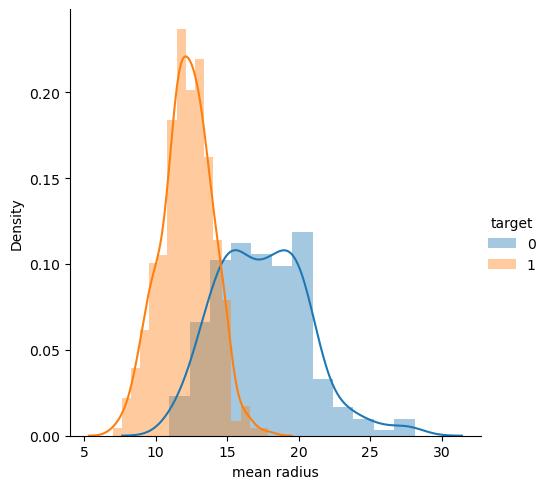

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

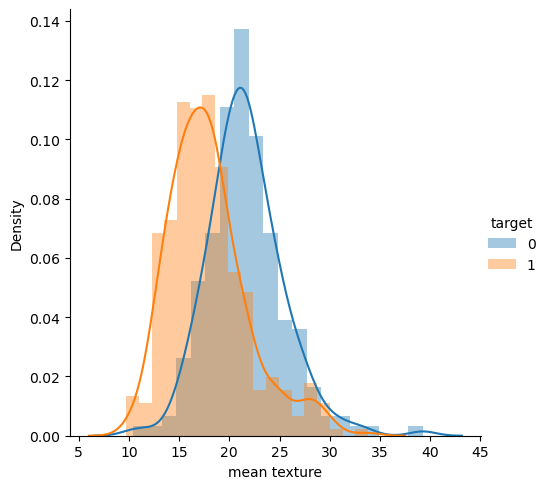

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

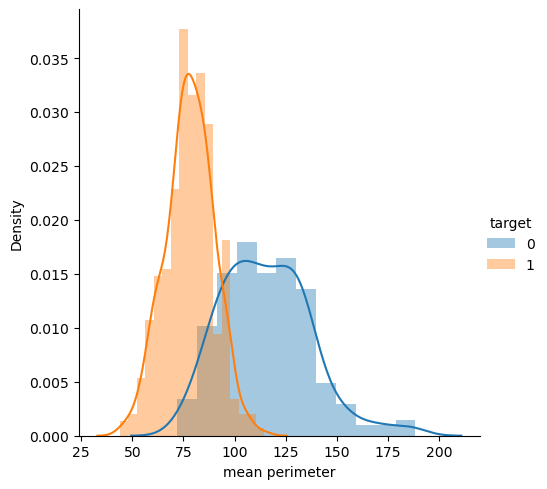

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

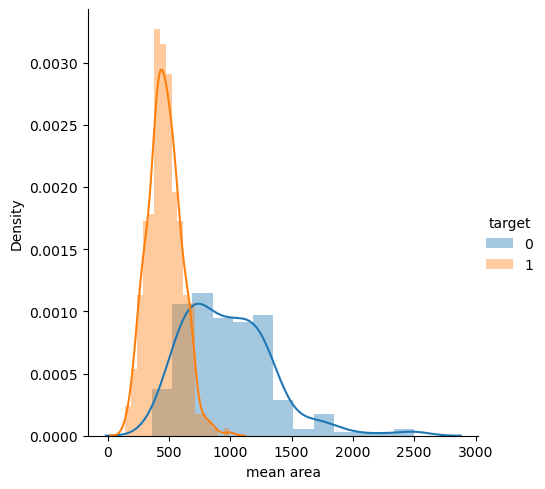

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

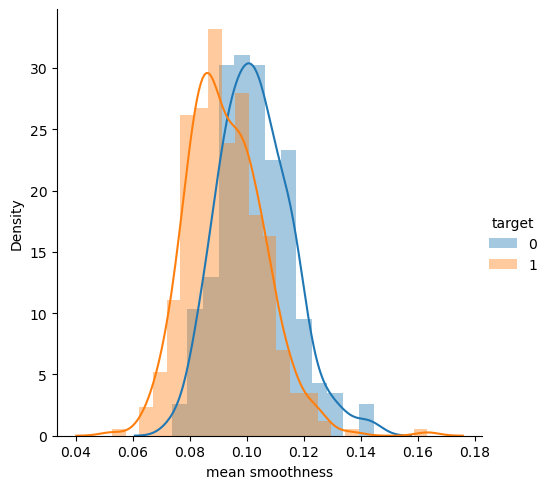

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

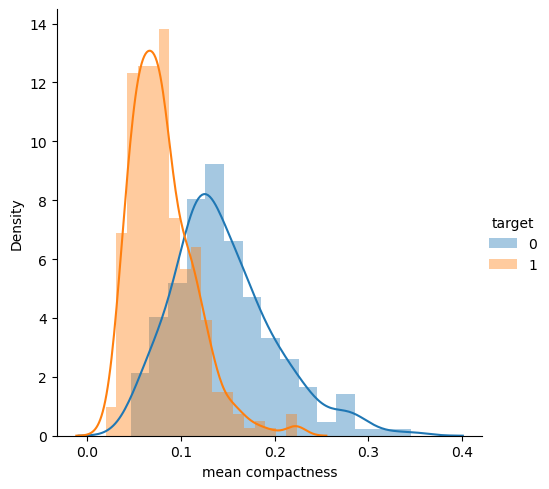

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

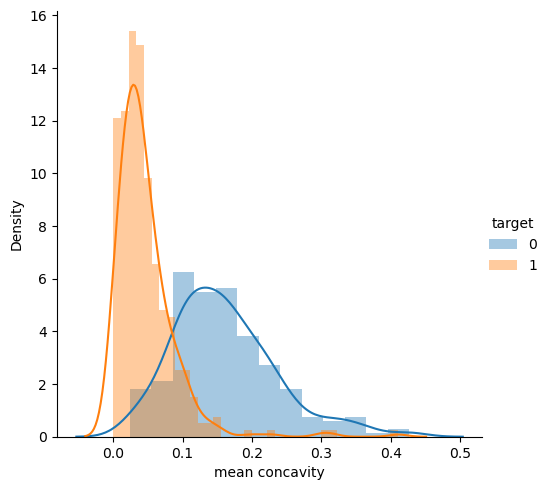

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

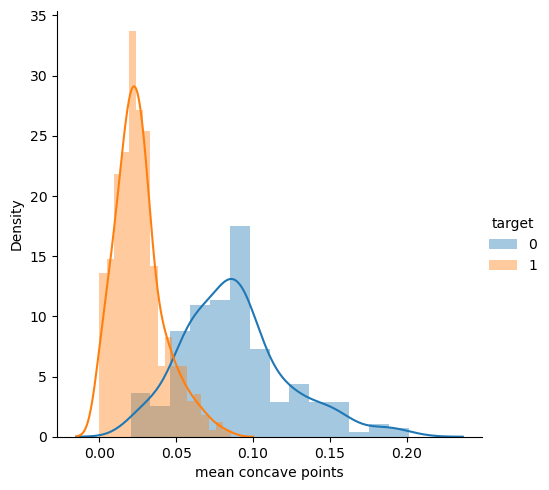

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

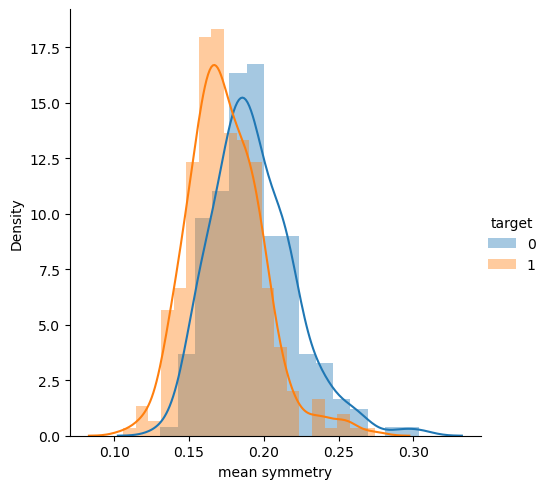

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

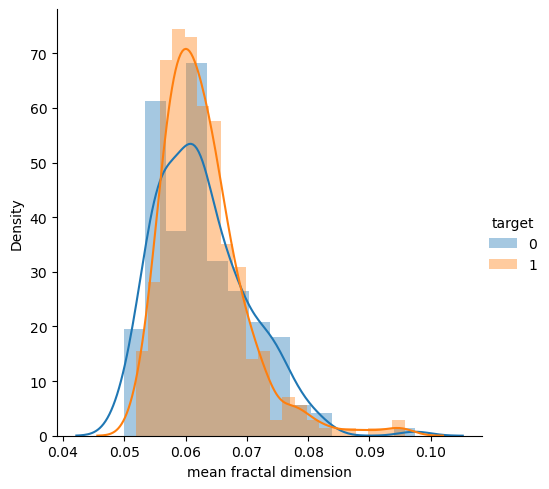

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

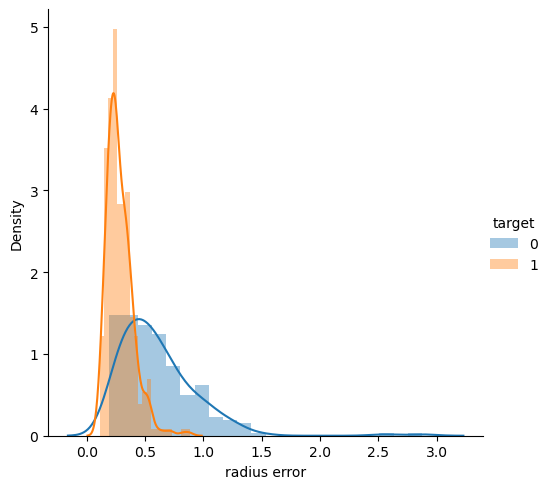

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

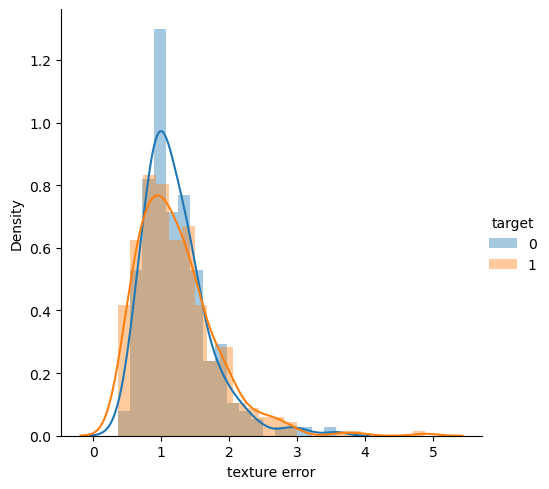

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

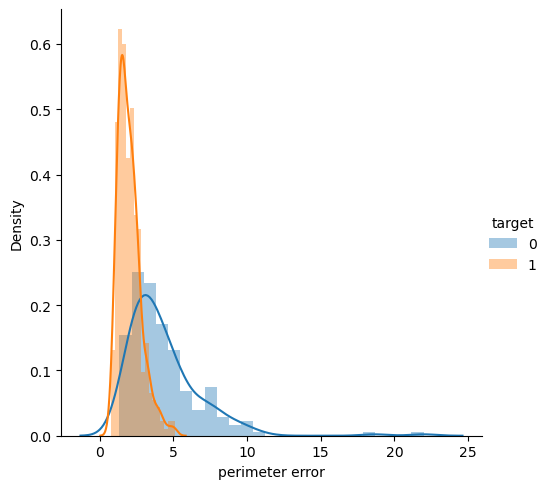

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

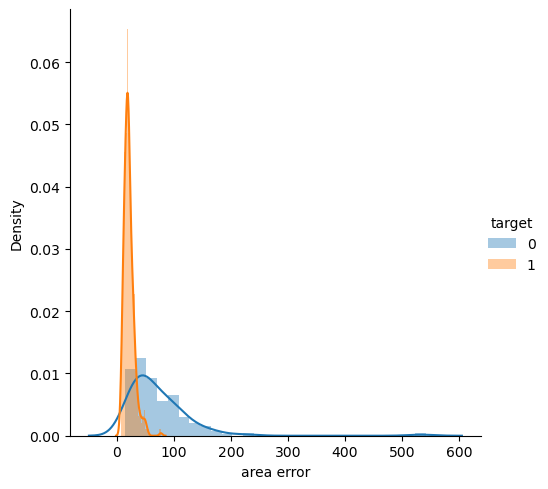

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

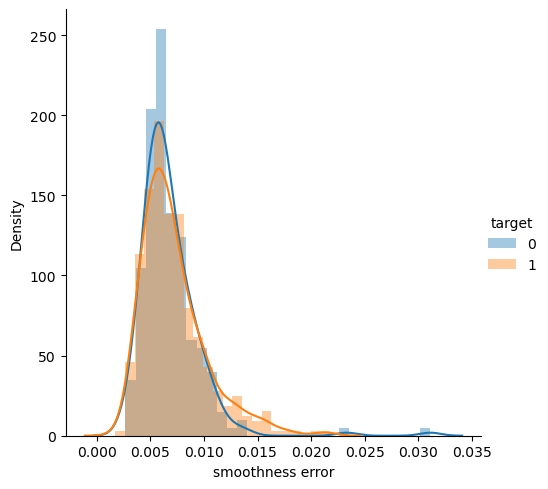

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

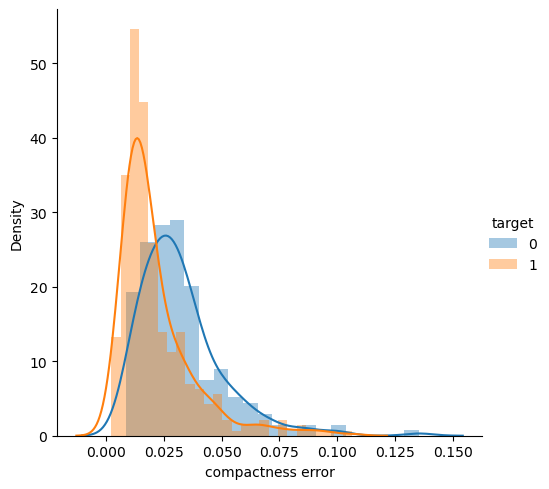

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

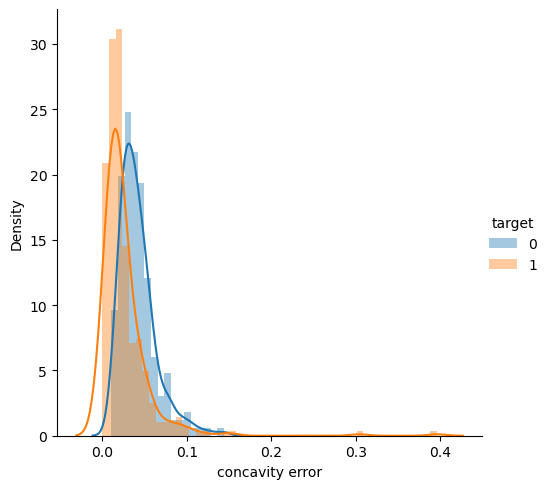

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

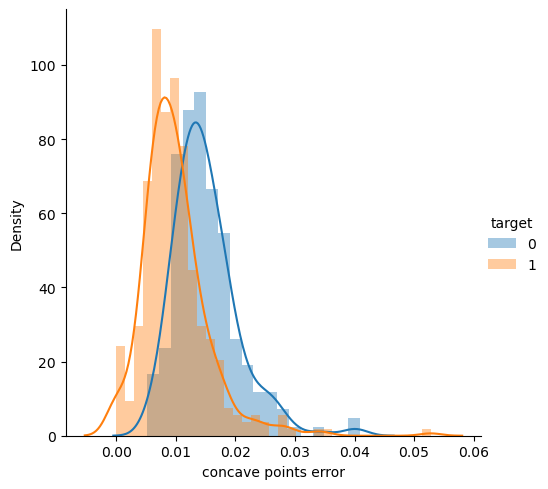

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

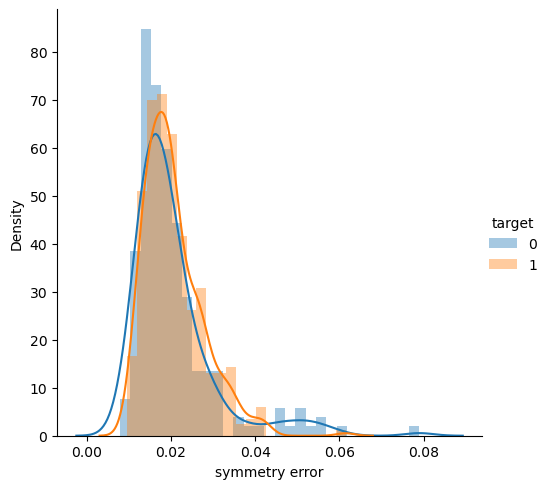

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

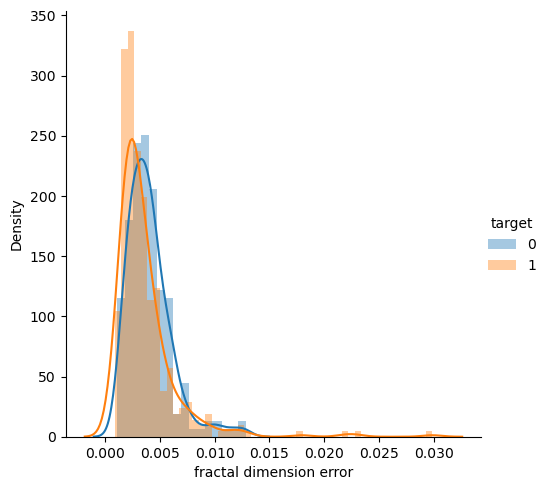

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

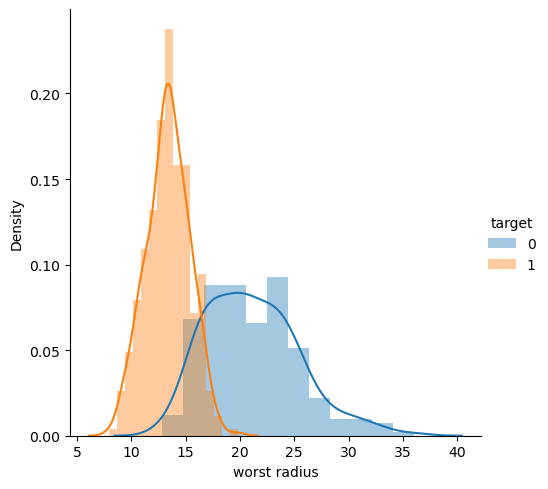

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

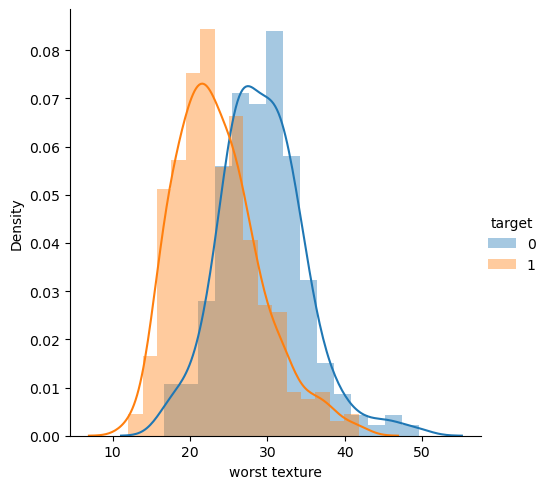

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

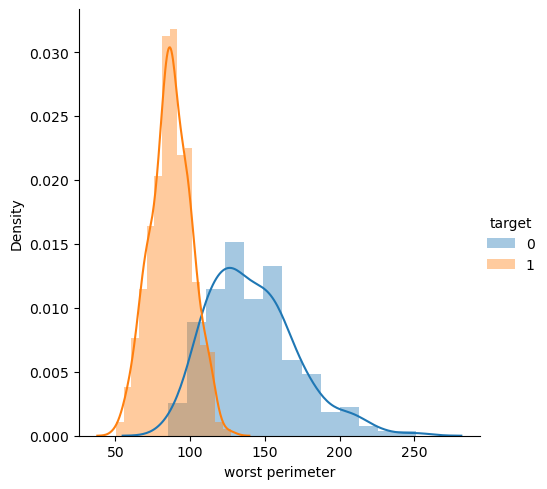

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

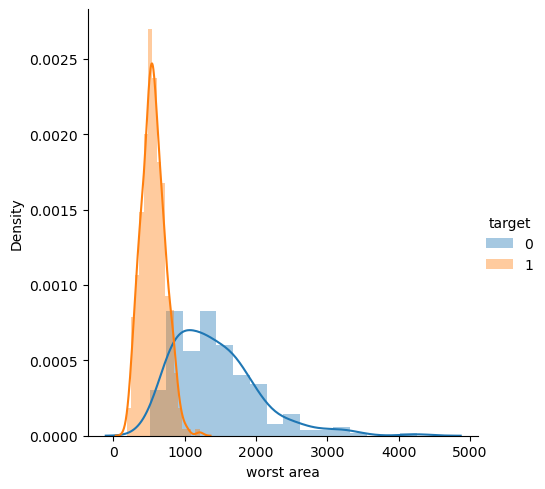

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

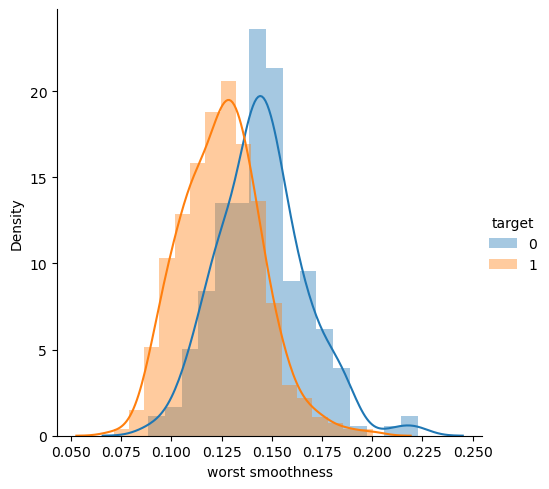

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

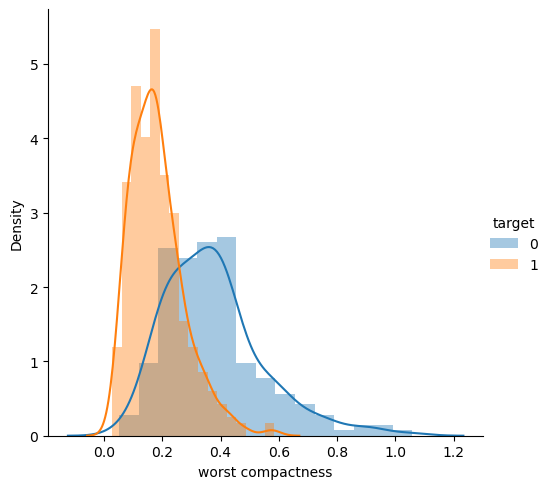

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

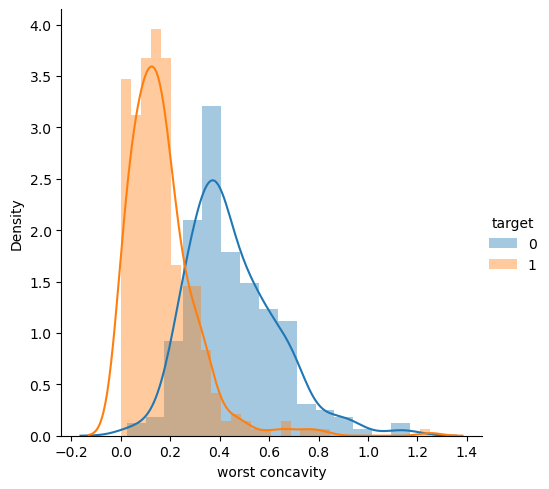

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

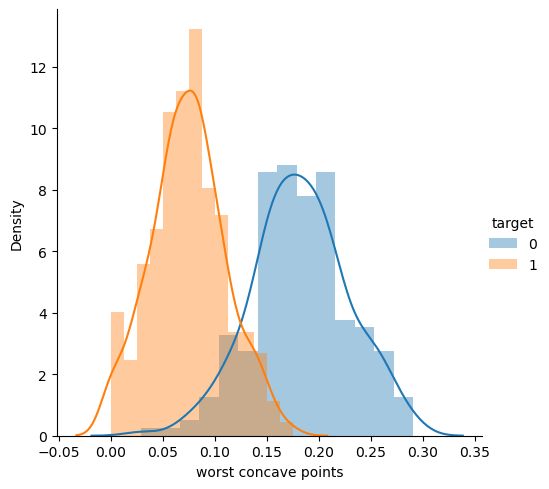

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

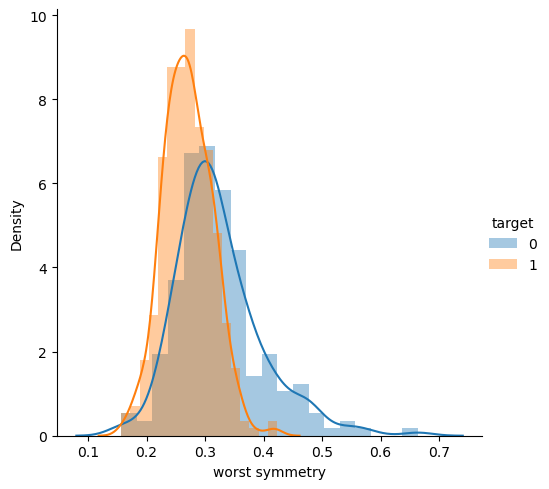

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/home/joao/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms)

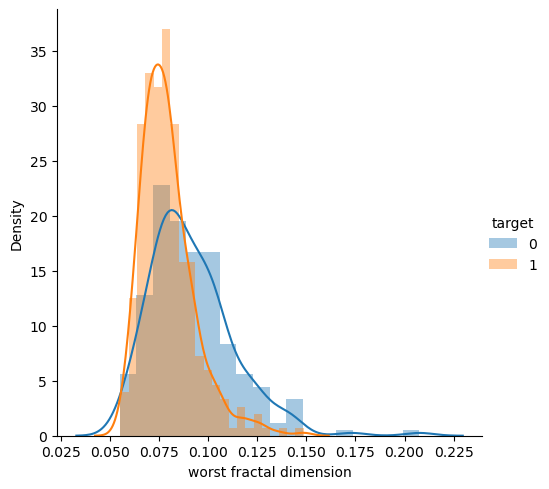

In [15]:
for idx, feature in enumerate(list(df.columns)[:-1]):
    fg = sns.FacetGrid(df, hue='target', height=5)
    fg.map(sns.distplot, feature).add_legend()
    plt.savefig('eda_{}.pdf'.format(feature), dpi=300)
    plt.show()


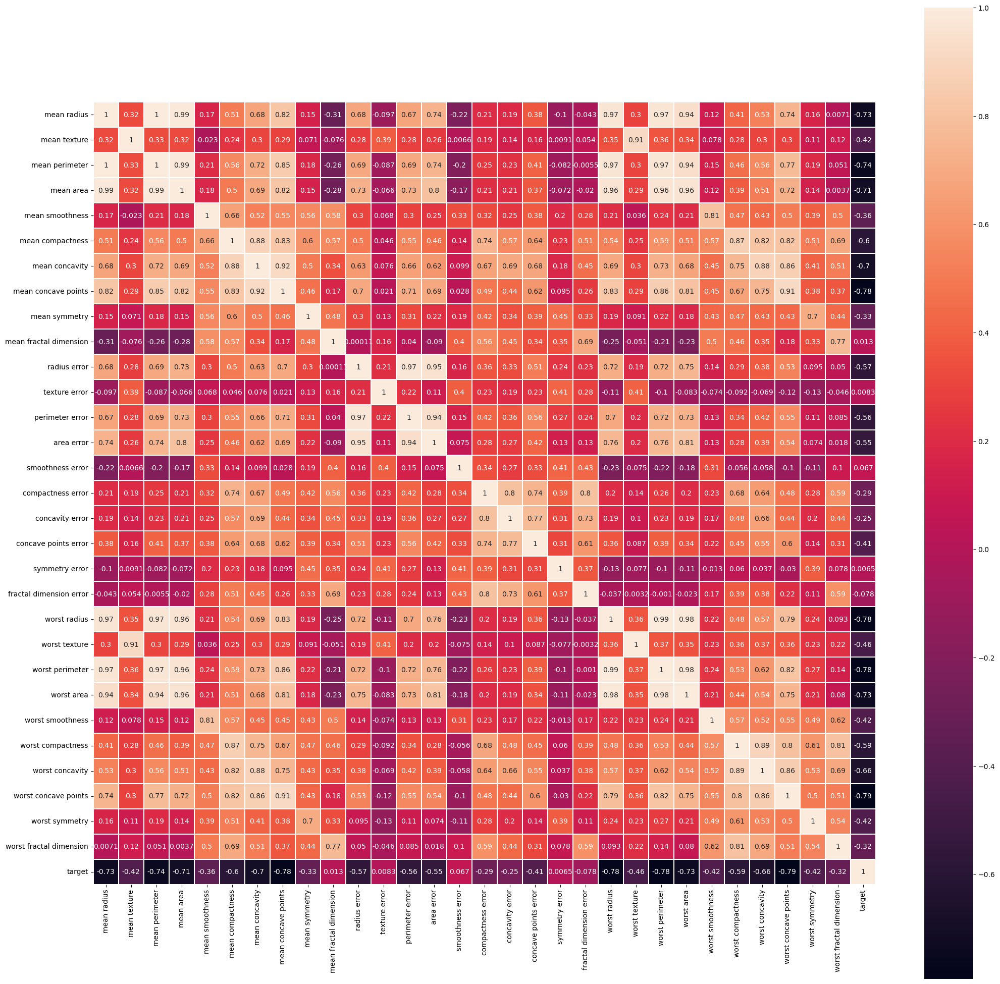

In [153]:
plt.figure(figsize=(25,25))
sns.heatmap(df.astype(float).corr(),linewidths=0.1,vmax=1.0, 
            square=True,  linecolor='white', annot=True)
plt.savefig('corr.png', dpi=300)
plt.show()

## Baseline model 

In [214]:
from sklearn.model_selection import train_test_split 
var_cols = ['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension']
X = df.loc[:,var_cols]
y = df.loc[:,'target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape 

((369, 30), (200, 30), (369,), (200,))

In [215]:
from sklearn.metrics import classification_report
ada_boost = AdaBoostClassifier()
xgb = XGBClassifier()
cat_boost = CatBoostClassifier()
lgbm = LGBMClassifier(verbose=-1)
ada_boost.fit(X_train,y_train.values.ravel())
xgb.fit(X_train,y_train.values.ravel())
cat_boost.fit(X_train,y_train.values.ravel(),verbose=False)
lgbm.fit(X_train,y_train.values.ravel())

LGBMClassifier(verbose=-1)

## AdaBoost

In [156]:
print(classification_report(y_test,ada_boost.predict(X_test),digits=4))

              precision    recall  f1-score   support

           0     0.9452    0.9718    0.9583        71
           1     0.9843    0.9690    0.9766       129

    accuracy                         0.9700       200
   macro avg     0.9647    0.9704    0.9674       200
weighted avg     0.9704    0.9700    0.9701       200



In [157]:
print(roc_auc_score(y_test,ada_boost.predict_proba(X_test)[:,1]))

0.9968337154711213


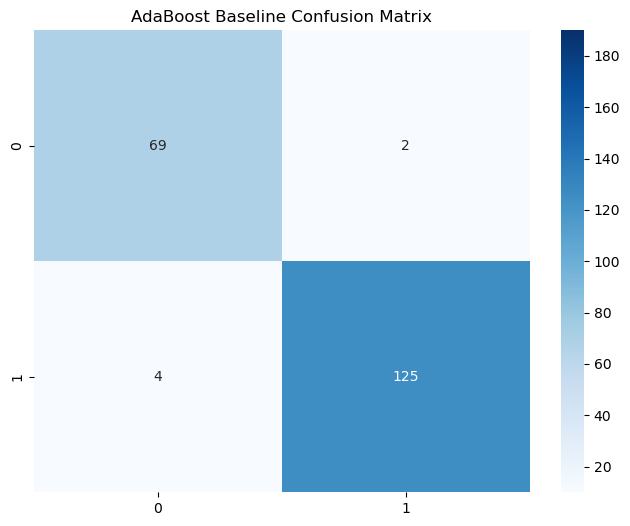

In [158]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(confusion_matrix(y_test, ada_boost.predict(X_test)), vmin=10, vmax=190,annot = True, fmt='d',cmap='Blues')
ax.set_title('AdaBoost Baseline Confusion Matrix')
plt.savefig('ada-base-conf.png', dpi=300)

## XGBoost

In [159]:
print(classification_report(y_test,xgb.predict(X_test),digits=4))

              precision    recall  f1-score   support

           0     0.9701    0.9155    0.9420        71
           1     0.9549    0.9845    0.9695       129

    accuracy                         0.9600       200
   macro avg     0.9625    0.9500    0.9557       200
weighted avg     0.9603    0.9600    0.9597       200



In [160]:
print(roc_auc_score(y_test,xgb.predict_proba(X_test)[:,1]))

0.9932307020417076


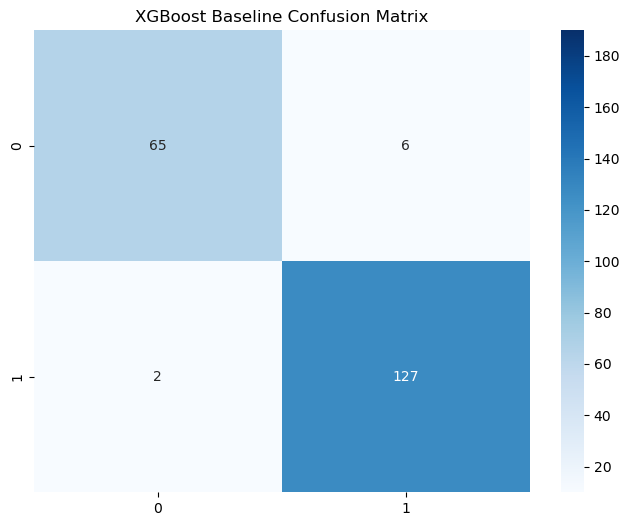

In [161]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(confusion_matrix(y_test, xgb.predict(X_test)), vmin=10, vmax=190,annot = True, fmt='d',cmap='Blues')
ax.set_title('XGBoost Baseline Confusion Matrix')
plt.savefig('xgb-base-conf.png', dpi=300)

## CatBoost

In [162]:
print(classification_report(y_test,cat_boost.predict(X_test),digits=4))

              precision    recall  f1-score   support

           0     0.9853    0.9437    0.9640        71
           1     0.9697    0.9922    0.9808       129

    accuracy                         0.9750       200
   macro avg     0.9775    0.9680    0.9724       200
weighted avg     0.9752    0.9750    0.9749       200



In [163]:
print(accuracy_score(y_test,cat_boost.predict(X_test)))

0.975


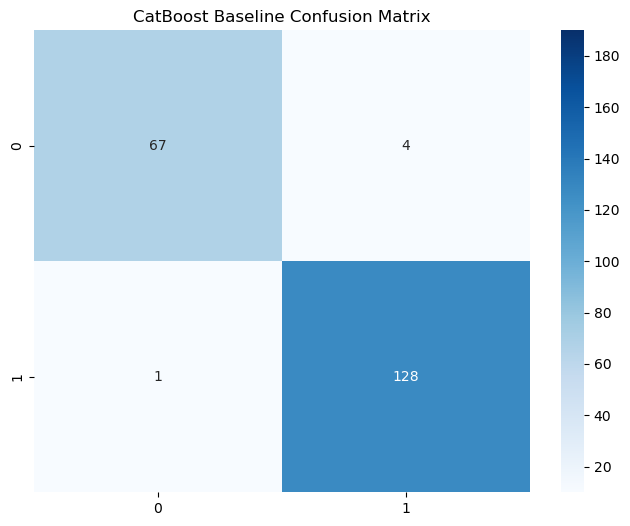

In [164]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(confusion_matrix(y_test, cat_boost.predict(X_test)), vmin=10, vmax=190,annot = True, fmt='d',cmap='Blues')
ax.set_title('CatBoost Baseline Confusion Matrix')
plt.savefig('cat-base-conf.png', dpi=300)

## LightGBM

In [165]:
print(classification_report(y_test,lgbm.predict(X_test),digits=4))

              precision    recall  f1-score   support

           0     0.9296    0.9296    0.9296        71
           1     0.9612    0.9612    0.9612       129

    accuracy                         0.9500       200
   macro avg     0.9454    0.9454    0.9454       200
weighted avg     0.9500    0.9500    0.9500       200



In [166]:
print(roc_auc_score(y_test,lgbm.predict_proba(X_test)[:,1]))

0.9922480620155039


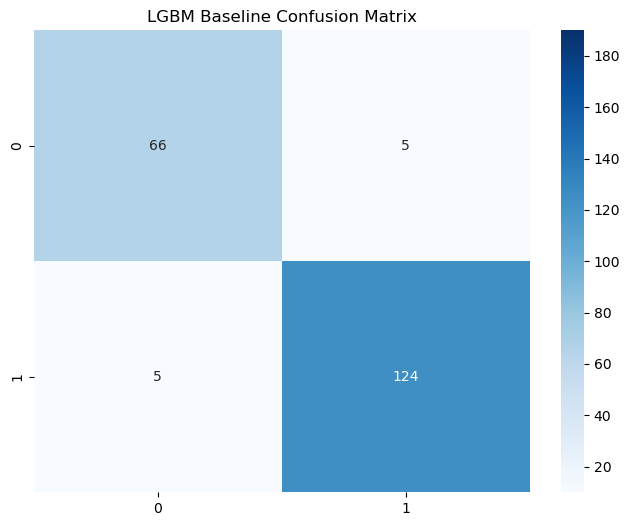

In [216]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(confusion_matrix(y_test, lgbm.predict(X_test)), vmin=10, vmax=190,annot = True, fmt='d',cmap='Blues')
ax.set_title('LGBM Baseline Confusion Matrix')
plt.savefig('lgbm-base-conf.png', dpi=300)

## ROC Curve for base models

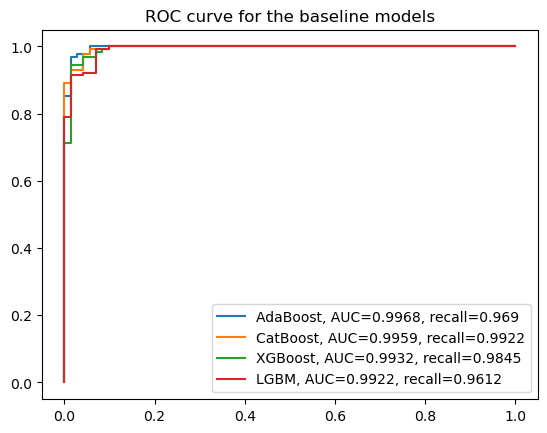

In [168]:
#set up plotting area
plt.figure(0).clf()

y_pred = ada_boost.predict_proba(X_test)[:,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
recall = round(recall_score(y_test, y_pred.round()),4)
plt.plot(fpr,tpr,label="AdaBoost, AUC="+str(auc)+', recall='+str(recall))


y_pred = cat_boost.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
recall = round(recall_score(y_test, y_pred.round()),4)
plt.plot(fpr,tpr,label="CatBoost, AUC="+str(auc)+', recall='+str(recall))

y_pred = xgb.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
recall = round(recall_score(y_test, y_pred.round()),4)
plt.plot(fpr,tpr,label="XGBoost, AUC="+str(auc)+', recall='+str(recall))

y_pred = lgbm.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
recall = round(recall_score(y_test, y_pred.round()),4)
plt.plot(fpr,tpr,label="LGBM, AUC="+str(auc)+', recall='+str(recall))

#add legend
plt.legend()
plt.title('ROC curve for the baseline models')
plt.savefig('roc-curve-base.png', dpi=300)

In [169]:
def validation_metrics(y_true, y_pred):
    '''
    Input:
        y_prob: model predict prob
        y_test: target
    Output: Metrics of validation
        auc, recall, precision, accuracy, f1-score
    '''
    fpr, tpr, thresholds = metrics.roc_curve(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred.round())
    precision = precision_score(y_true, y_pred.round())
    accuracy = accuracy_score(y_true, y_pred.round())
    f1_scor = f1_score(y_true, y_pred.round())
    return auc, recall, precision, accuracy, f1_scor

In [203]:
def objective(trial, X_train, y_train, X_test, y_test, balanced, method):
    '''
    Input:
        trial: trial of the test
        X_train:
        y_train:
        X_test:
        y_test:
        balanced:balanced or None
        method: XGBoost, CatBoost or LGBM
    Output: Metrics of validation
    '''
    gc.collect()
    if method=='AdaBoost':
        param_grid = {'learning_rate': trial.suggest_float('learning_rate', 0.0001, 0.1, log=True),
                      'n_estimators': trial.suggest_int('n_estimators', 40, 80, step=2),
                      'algorithm': trial.suggest_categorical("algorithm", ["SAMME", "SAMME.R"]),
                      'random_state': 42
  
                     }
        model = AdaBoostClassifier(**param_grid)

        print('AdaBoost - Optimization using optuna')
        model.fit(X_train, y_train)
        y_pred_train = model.predict_proba(X_train)[:,1]
        y_pred = model.predict_proba(X_test)[:,1]
    if method=='LGBM':
        param_grid = {'learning_rate': trial.suggest_float('learning_rate', 0.0001, 0.1, log=True),
                      'num_leaves': trial.suggest_int('num_leaves', 2, 256),
                      'lambda_l1': trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
                      'lambda_l2': trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
                      'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 5, 100),
                      'max_depth': trial.suggest_int('max_depth', 5, 64),
                      'feature_fraction': trial.suggest_float("feature_fraction", 0.4, 1.0),
                      'bagging_fraction': trial.suggest_float("bagging_fraction", 0.4, 1.0),
                      'bagging_freq': trial.suggest_int("bagging_freq", 1, 7),
                      'verbose': -1
  
                     }
        model = LGBMClassifier(**param_grid)

        print('LGBM - Optimization using optuna')
        model.fit(X_train, y_train)
        
        y_pred_train = model.predict_proba(X_train)[:,1]
        y_pred = model.predict_proba(X_test)[:,1]

    if method=='CATBoost':
        param_grid = {'learning_rate': trial.suggest_float('learning_rate', 0.0001, 0.1, log=True),
                      'depth': trial.suggest_int("depth", 4, 10),
                      'max_bin': trial.suggest_int('max_bin', 200, 400),
                      'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 300),
                      'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-8, 10, log = True),
                      'random_seed': 42,
                      'random_strength': trial.suggest_float("random_strength", 1e-8, 10.0, log=True),
                      'bagging_temperature': trial.suggest_float("bagging_temperature", 0.0, 10.0),
                      'od_type': trial.suggest_categorical("od_type", ["IncToDec", "Iter"]),
                      'od_wait': trial.suggest_int("od_wait", 10, 50)
                     }
        # this if the data have categorical columns
        if len(X_train._get_numeric_data().columns) != len(X_train.columns):
            categorical_features_indices = list(X_train.select_dtypes(exclude='number').columns)
            model = CatBoostClassifier(**param_grid)
            print('CATBoost - Optimization using optuna')
            model.fit(X_train, y_train,cat_features=categorical_features_indices,verbose=False)
            y_pred_train = model.predict_proba(X_train)[:,1]
            y_pred = model.predict_proba(X_test)[:,1]
        else:
            model = CatBoostClassifier(**param_grid)
            print('CATBoost - Optimization using optuna')
            model.fit(X_train, y_train,verbose=False)
            y_pred_train = model.predict_proba(X_train)[:,1]
            y_pred = model.predict_proba(X_test)[:,1]
        
    if method=='XGBoost':
        param_grid = {'learning_rate': trial.suggest_float('learning_rate', 0.0001, 0.1, log=True),
                      'max_depth': trial.suggest_int('max_depth', 3, 16),
                      'min_child_weight': trial.suggest_int('min_child_weight', 1, 300),
                      'gamma': trial.suggest_float('gamma', 1e-8, 1.0, log = True),
                      'alpha': trial.suggest_float('alpha', 1e-8, 1.0, log = True),
                      'lambda': trial.suggest_float('lambda', 0.0001, 10.0, log = True),
                      'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 0.8),
                      'booster': 'gbtree',
                      'random_state': 42
                     }
        model = XGBClassifier(**param_grid)
        print('XGBoost - Optimization using optuna')
        model.fit(X_train, y_train,verbose=False)
        y_pred_train = model.predict_proba(X_train)[:,1]
        y_pred = model.predict_proba(X_test)[:,1]
    auc, recall, precision, accuracy, f1_scor = validation_metrics(y_train, y_pred_train)
    print('train metrics:'+'auc:'+str(auc), 'recall:'+str(recall), 'precision:'+str(precision), 'accuracy:'+str(accuracy), 'f1_scor:'+str(f1_scor))
    auc, recall, precision, accuracy, f1_scor = validation_metrics(y_test, y_pred)
    print('test metrics:'+'auc:'+str(auc), 'recall:'+str(recall), 'precision:'+str(precision), 'accuracy:'+str(accuracy), 'f1_scor:'+str(f1_scor))
    beta = 2.7
    return fbeta_score(y_test, y_pred.round(), beta=beta)

def tuning(X_train, y_train, X_test, y_test, balanced, method):
    '''
    Input:
        trial: 
        x_train:
        y_train:
        X_test:
        y_test:
        balanced:balanced or not balanced
        method: XGBoost, CatBoost or LGBM
    Output: study
    '''
    study = optuna.create_study(direction='maximize', study_name=method+' Classifier')
    func = lambda trial: objective(trial, X_train, y_train, X_test, y_test, balanced, method)
    print('Starting the optimization')
    time_max_tuning = 60*15 # max time in seconds to stop
    study.optimize(func, timeout=time_max_tuning)
    return study

def train(X_train, y_train, X_test, y_test, balanced, method):
    '''
    Input:
        X_train:
        y_train:
        X_test:
        y_test:
        balanced:balanced or None
        method: XGBoost, CatBoost or LGBM
    Output: predict model
    '''
    print('Tuning')
    study = tuning(X_train, y_train, X_test, y_test, balanced, method)
    if method=='LGBM':
        model = LGBMClassifier(**study.best_params)
        print('Last Fit')
        model.fit(X_train, y_train, eval_set=[(X_test,y_test)],
                 callbacks = [lightgbm.early_stopping(stopping_rounds=100), lightgbm.log_evaluation(period=5000)])
    if method=='CATBoost':
        model = CatBoostClassifier(**study.best_params)
        if len(X_train._get_numeric_data().columns) != len(X_train.columns):
            categorical_features_indices = list(X_train.select_dtypes(exclude='number').columns)
            print('Last Fit')
            model.fit(X_train, y_train,cat_features=categorical_features_indices, eval_set=[(X_test,y_test)],
                 early_stopping_rounds=100,verbose = False)
        else:
            print('Last Fit')
            model.fit(X_train, y_train, eval_set=[(X_test,y_test)],
                 early_stopping_rounds=100,verbose = False)
    if method=='XGBoost':
        model = XGBClassifier(**study.best_params)
        print('Last Fit')
        model.fit(X_train, y_train, eval_set=[(X_test,y_test)],
                 early_stopping_rounds=100,verbose = False)
    if method=='AdaBoost':
        model = AdaBoostClassifier(**study.best_params)
        print('Last Fit')
        model.fit(X_train, y_train)
    return model, study

In [204]:
catboost, study_catboost = train(X_train, y_train, X_test, y_test, balanced='balanced', method='CATBoost')

[I 2024-02-13 13:48:36,819] A new study created in memory with name: CATBoost Classifier


Tuning
Starting the optimization
CATBoost - Optimization using optuna


[I 2024-02-13 13:48:38,370] Trial 0 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.005733756108783709, 'depth': 7, 'max_bin': 263, 'min_data_in_leaf': 51, 'l2_leaf_reg': 6.671521721445642e-06, 'random_strength': 1.4751334803813485e-07, 'bagging_temperature': 6.683836151896686, 'od_type': 'IncToDec', 'od_wait': 35}. Best is trial 0 with value: 0.98082745642392.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 13:48:39,212] Trial 1 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005702139195527893, 'depth': 5, 'max_bin': 320, 'min_data_in_leaf': 156, 'l2_leaf_reg': 9.569497083592563e-08, 'random_strength': 8.443887185858431, 'bagging_temperature': 8.739871692477665, 'od_type': 'IncToDec', 'od_wait': 43}. Best is trial 1 with value: 0.9835763866182117.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9979255377224587 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:48:39,923] Trial 2 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01793858218110604, 'depth': 5, 'max_bin': 224, 'min_data_in_leaf': 217, 'l2_leaf_reg': 1.3618907414879133e-08, 'random_strength': 4.915048537095408, 'bagging_temperature': 8.01104374726411, 'od_type': 'IncToDec', 'od_wait': 18}. Best is trial 1 with value: 0.9835763866182117.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:48:44,105] Trial 3 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0001675306936795406, 'depth': 9, 'max_bin': 251, 'min_data_in_leaf': 143, 'l2_leaf_reg': 0.0004327594542163975, 'random_strength': 1.1284564800222716, 'bagging_temperature': 8.972962921312428, 'od_type': 'Iter', 'od_wait': 13}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9962878043454525 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:48:51,771] Trial 4 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0001309852059059661, 'depth': 10, 'max_bin': 205, 'min_data_in_leaf': 277, 'l2_leaf_reg': 0.00027099102587673494, 'random_strength': 0.00011609481200199793, 'bagging_temperature': 6.491105359079283, 'od_type': 'Iter', 'od_wait': 44}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:48:54,802] Trial 5 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.036634462829769954, 'depth': 8, 'max_bin': 384, 'min_data_in_leaf': 212, 'l2_leaf_reg': 0.00040176933690602446, 'random_strength': 1.5686316940378488e-05, 'bagging_temperature': 5.426265851108489, 'od_type': 'Iter', 'od_wait': 36}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 13:48:58,662] Trial 6 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.00045853527871636914, 'depth': 9, 'max_bin': 229, 'min_data_in_leaf': 157, 'l2_leaf_reg': 0.04299211898078136, 'random_strength': 3.637133343705357e-07, 'bagging_temperature': 9.656988542614451, 'od_type': 'IncToDec', 'od_wait': 24}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9906103286384977 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194
CATBoost - Optimization using optuna


[I 2024-02-13 13:48:59,308] Trial 7 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07381955213225545, 'depth': 4, 'max_bin': 370, 'min_data_in_leaf': 64, 'l2_leaf_reg': 1.1575394397906449, 'random_strength': 0.0038606677145002475, 'bagging_temperature': 3.580095344523037, 'od_type': 'IncToDec', 'od_wait': 35}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:10,788] Trial 8 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.0017278493749357633, 'depth': 10, 'max_bin': 302, 'min_data_in_leaf': 107, 'l2_leaf_reg': 0.13490985558990487, 'random_strength': 0.0001162300867249691, 'bagging_temperature': 0.21578346179277896, 'od_type': 'Iter', 'od_wait': 50}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9925756086909051 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:11,698] Trial 9 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0004278021525218262, 'depth': 5, 'max_bin': 377, 'min_data_in_leaf': 259, 'l2_leaf_reg': 7.668746188030065e-08, 'random_strength': 0.00014413217258323467, 'bagging_temperature': 1.5477808773439172, 'od_type': 'Iter', 'od_wait': 48}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:13,483] Trial 10 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00010442244158963837, 'depth': 7, 'max_bin': 274, 'min_data_in_leaf': 1, 'l2_leaf_reg': 8.849427042906221, 'random_strength': 0.07887050839626616, 'bagging_temperature': 9.846523536674137, 'od_type': 'Iter', 'od_wait': 11}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:0.9989423914395918 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:14,730] Trial 11 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.003507896064423159, 'depth': 6, 'max_bin': 329, 'min_data_in_leaf': 155, 'l2_leaf_reg': 1.0189031607196844e-06, 'random_strength': 9.261691634160831, 'bagging_temperature': 8.30457957068602, 'od_type': 'IncToDec', 'od_wait': 10}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:17,625] Trial 12 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00870567195598517, 'depth': 8, 'max_bin': 330, 'min_data_in_leaf': 129, 'l2_leaf_reg': 6.365762852633439e-05, 'random_strength': 0.3291362297252958, 'bagging_temperature': 8.242508184739712, 'od_type': 'IncToDec', 'od_wait': 25}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:18,278] Trial 13 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0019961816913754774, 'depth': 4, 'max_bin': 271, 'min_data_in_leaf': 198, 'l2_leaf_reg': 0.0033012681570859493, 'random_strength': 0.10213503383863853, 'bagging_temperature': 9.363502075560461, 'od_type': 'Iter', 'od_wait': 41}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:19,464] Trial 14 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0011831737246026344, 'depth': 6, 'max_bin': 322, 'min_data_in_leaf': 83, 'l2_leaf_reg': 5.560157585321375e-07, 'random_strength': 9.834439611183623, 'bagging_temperature': 6.7739629328238244, 'od_type': 'IncToDec', 'od_wait': 28}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:23,507] Trial 15 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.01115272422645116, 'depth': 9, 'max_bin': 247, 'min_data_in_leaf': 175, 'l2_leaf_reg': 3.2090003341117747e-06, 'random_strength': 0.009372681157959875, 'bagging_temperature': 8.183485361591984, 'od_type': 'Iter', 'od_wait': 17}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9931215198165738 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:26,206] Trial 16 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004474967923966741, 'depth': 8, 'max_bin': 302, 'min_data_in_leaf': 120, 'l2_leaf_reg': 2.2905069731552298e-08, 'random_strength': 0.5207402608039312, 'bagging_temperature': 4.706240317672544, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.995195982094115 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:31,174] Trial 17 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0006299526083349561, 'depth': 9, 'max_bin': 300, 'min_data_in_leaf': 115, 'l2_leaf_reg': 1.742686767007949e-05, 'random_strength': 0.37699687859480874, 'bagging_temperature': 4.488503051636428, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:34,238] Trial 18 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00023582804961021003, 'depth': 8, 'max_bin': 354, 'min_data_in_leaf': 34, 'l2_leaf_reg': 0.0016888435854014356, 'random_strength': 0.005624270181587623, 'bagging_temperature': 3.5732562730551307, 'od_type': 'Iter', 'od_wait': 14}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99301233759144 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:39,018] Trial 19 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0011041188002164299, 'depth': 9, 'max_bin': 291, 'min_data_in_leaf': 246, 'l2_leaf_reg': 2.300639093855083e-05, 'random_strength': 0.6466262050990469, 'bagging_temperature': 5.615262473674049, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:41,333] Trial 20 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0037089488214558227, 'depth': 8, 'max_bin': 247, 'min_data_in_leaf': 98, 'l2_leaf_reg': 1.2898814400984618e-06, 'random_strength': 0.02854742674345306, 'bagging_temperature': 7.232489846916016, 'od_type': 'Iter', 'od_wait': 14}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:42,516] Trial 21 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004576089945894446, 'depth': 6, 'max_bin': 347, 'min_data_in_leaf': 177, 'l2_leaf_reg': 1.4197713193751991e-08, 'random_strength': 1.4573208280481604, 'bagging_temperature': 9.09160027728621, 'od_type': 'IncToDec', 'od_wait': 30}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:44,216] Trial 22 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.002692776487465362, 'depth': 7, 'max_bin': 312, 'min_data_in_leaf': 135, 'l2_leaf_reg': 1.8077068676939274e-07, 'random_strength': 1.4196994615434304, 'bagging_temperature': 9.924391736122153, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213889 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:45,837] Trial 23 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0022046499703452242, 'depth': 7, 'max_bin': 287, 'min_data_in_leaf': 126, 'l2_leaf_reg': 2.284972907119381e-07, 'random_strength': 1.1884081223763538, 'bagging_temperature': 9.657969347021057, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:48,623] Trial 24 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0002128011628406841, 'depth': 8, 'max_bin': 309, 'min_data_in_leaf': 133, 'l2_leaf_reg': 5.698677245944847e-08, 'random_strength': 0.10717513681222282, 'bagging_temperature': 7.479484606552042, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:49:50,430] Trial 25 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0006909330548039438, 'depth': 7, 'max_bin': 344, 'min_data_in_leaf': 84, 'l2_leaf_reg': 6.709128151118953e-07, 'random_strength': 1.7768591720651516, 'bagging_temperature': 9.9304285167192, 'od_type': 'Iter', 'od_wait': 13}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:00,347] Trial 26 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0010586062598162325, 'depth': 10, 'max_bin': 253, 'min_data_in_leaf': 179, 'l2_leaf_reg': 1.2668710064911559e-08, 'random_strength': 0.3201855340150514, 'bagging_temperature': 6.059391184006162, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:05,026] Trial 27 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0025969107428481103, 'depth': 9, 'max_bin': 281, 'min_data_in_leaf': 140, 'l2_leaf_reg': 4.082535391286177e-06, 'random_strength': 0.0201575401108346, 'bagging_temperature': 8.987852470556517, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:07,795] Trial 28 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.015625913923852354, 'depth': 8, 'max_bin': 311, 'min_data_in_leaf': 85, 'l2_leaf_reg': 7.584645504294112e-05, 'random_strength': 0.0014245441920443715, 'bagging_temperature': 8.841662315993002, 'od_type': 'Iter', 'od_wait': 16}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9931215198165738 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:09,312] Trial 29 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.007831709537783867, 'depth': 7, 'max_bin': 263, 'min_data_in_leaf': 58, 'l2_leaf_reg': 2.731953001838214e-07, 'random_strength': 2.0600726460981487, 'bagging_temperature': 7.1565821737019695, 'od_type': 'Iter', 'od_wait': 15}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:10,292] Trial 30 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0038586719667449312, 'depth': 6, 'max_bin': 229, 'min_data_in_leaf': 42, 'l2_leaf_reg': 3.691111638888495e-06, 'random_strength': 0.05984214844521994, 'bagging_temperature': 7.47169431368481, 'od_type': 'Iter', 'od_wait': 32}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:11,928] Trial 31 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.002415268979214643, 'depth': 7, 'max_bin': 287, 'min_data_in_leaf': 119, 'l2_leaf_reg': 2.8369540062791365e-07, 'random_strength': 1.62027473068082, 'bagging_temperature': 9.954239768087941, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99650616879572 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:13,554] Trial 32 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004750656311374164, 'depth': 7, 'max_bin': 294, 'min_data_in_leaf': 142, 'l2_leaf_reg': 8.832082522092855e-08, 'random_strength': 0.5352282917559874, 'bagging_temperature': 8.935358434842149, 'od_type': 'Iter', 'od_wait': 12}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449175 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:15,987] Trial 33 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0062991302658478845, 'depth': 8, 'max_bin': 264, 'min_data_in_leaf': 160, 'l2_leaf_reg': 3.309803044452276e-08, 'random_strength': 3.619821298037418, 'bagging_temperature': 9.19860096702099, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:17,727] Trial 34 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0017675014843111314, 'depth': 7, 'max_bin': 314, 'min_data_in_leaf': 99, 'l2_leaf_reg': 1.9466107147007927e-07, 'random_strength': 0.21729029373075184, 'bagging_temperature': 8.275732904543789, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192488 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:18,838] Trial 35 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.002440816103737211, 'depth': 6, 'max_bin': 280, 'min_data_in_leaf': 126, 'l2_leaf_reg': 1.410103613085279e-07, 'random_strength': 3.5332220769753246, 'bagging_temperature': 8.721443075739938, 'od_type': 'Iter', 'od_wait': 16}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:22,472] Trial 36 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.005665083939502055, 'depth': 9, 'max_bin': 217, 'min_data_in_leaf': 194, 'l2_leaf_reg': 2.876780540747781e-08, 'random_strength': 1.4867288616721948, 'bagging_temperature': 9.412315613160539, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:24,871] Trial 37 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.022538711481341962, 'depth': 8, 'max_bin': 257, 'min_data_in_leaf': 162, 'l2_leaf_reg': 1.5536976428209468e-06, 'random_strength': 0.03187796531327259, 'bagging_temperature': 9.507084425800787, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:34,137] Trial 38 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0013516225990452314, 'depth': 10, 'max_bin': 239, 'min_data_in_leaf': 71, 'l2_leaf_reg': 3.4787529139396754e-08, 'random_strength': 0.16584525650353213, 'bagging_temperature': 7.722652110141757, 'od_type': 'Iter', 'od_wait': 10}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:34,891] Trial 39 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.003309270288218126, 'depth': 5, 'max_bin': 200, 'min_data_in_leaf': 217, 'l2_leaf_reg': 3.9170137670672507e-07, 'random_strength': 8.96976221243623, 'bagging_temperature': 6.77026429031832, 'od_type': 'IncToDec', 'od_wait': 18}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9975979910470575 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:36,714] Trial 40 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00082879140165155, 'depth': 7, 'max_bin': 337, 'min_data_in_leaf': 145, 'l2_leaf_reg': 1.185516571872079e-05, 'random_strength': 0.7952849024599593, 'bagging_temperature': 8.590657273329816, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449175 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:38,566] Trial 41 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.000648448015035581, 'depth': 7, 'max_bin': 362, 'min_data_in_leaf': 84, 'l2_leaf_reg': 1.1640537469742076e-07, 'random_strength': 2.7985575340571898, 'bagging_temperature': 9.923429514267868, 'od_type': 'Iter', 'od_wait': 13}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:40,362] Trial 42 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0015940936831227558, 'depth': 7, 'max_bin': 335, 'min_data_in_leaf': 109, 'l2_leaf_reg': 1.056991812078727e-08, 'random_strength': 0.7168374040791634, 'bagging_temperature': 9.830453082738138, 'od_type': 'Iter', 'od_wait': 12}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:42,118] Trial 43 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0002978727643574988, 'depth': 7, 'max_bin': 320, 'min_data_in_leaf': 99, 'l2_leaf_reg': 4.579368876490003e-07, 'random_strength': 1.352052770176956, 'bagging_temperature': 9.429078302064372, 'od_type': 'Iter', 'od_wait': 16}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:43,362] Trial 44 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0001351481563644674, 'depth': 6, 'max_bin': 388, 'min_data_in_leaf': 124, 'l2_leaf_reg': 1.219449936440938e-06, 'random_strength': 5.516364319074373, 'bagging_temperature': 7.924809765796696, 'od_type': 'Iter', 'od_wait': 13}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:0.9991290282443698 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9966153510208539 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:46,396] Trial 45 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0004558356208639412, 'depth': 8, 'max_bin': 399, 'min_data_in_leaf': 295, 'l2_leaf_reg': 6.518493574970299e-08, 'random_strength': 0.2506938371097386, 'bagging_temperature': 9.832716872779622, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:49,102] Trial 46 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0025991903869251472, 'depth': 8, 'max_bin': 297, 'min_data_in_leaf': 152, 'l2_leaf_reg': 5.756941381093799e-07, 'random_strength': 3.7336900063512313, 'bagging_temperature': 8.471364720794213, 'od_type': 'IncToDec', 'od_wait': 10}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:54,936] Trial 47 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0008824320570363449, 'depth': 9, 'max_bin': 348, 'min_data_in_leaf': 25, 'l2_leaf_reg': 1.6320237378180258e-07, 'random_strength': 0.09269807340596403, 'bagging_temperature': 9.361858463012837, 'od_type': 'Iter', 'od_wait': 15}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:56,629] Trial 48 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0014473711064615302, 'depth': 7, 'max_bin': 302, 'min_data_in_leaf': 73, 'l2_leaf_reg': 6.9621218566447194e-06, 'random_strength': 0.8724745104374024, 'bagging_temperature': 8.67452348321556, 'od_type': 'Iter', 'od_wait': 37}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:50:57,737] Trial 49 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0018930361978297366, 'depth': 6, 'max_bin': 275, 'min_data_in_leaf': 168, 'l2_leaf_reg': 2.7256289936365547e-08, 'random_strength': 9.47542676243569, 'bagging_temperature': 9.618365385728726, 'od_type': 'Iter', 'od_wait': 17}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:00,638] Trial 50 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00033302995453760416, 'depth': 8, 'max_bin': 323, 'min_data_in_leaf': 110, 'l2_leaf_reg': 7.435870274045757e-07, 'random_strength': 0.41312141612780245, 'bagging_temperature': 9.974556107315241, 'od_type': 'IncToDec', 'od_wait': 24}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:02,189] Trial 51 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.006557237749497242, 'depth': 7, 'max_bin': 265, 'min_data_in_leaf': 53, 'l2_leaf_reg': 2.3552693125350897e-07, 'random_strength': 2.1256396638735757, 'bagging_temperature': 9.120410969207898, 'od_type': 'Iter', 'od_wait': 14}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:03,807] Trial 52 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.008574562924353539, 'depth': 7, 'max_bin': 288, 'min_data_in_leaf': 93, 'l2_leaf_reg': 1.9965364251154313e-06, 'random_strength': 2.3944677503597873, 'bagging_temperature': 8.538911159074285, 'od_type': 'Iter', 'od_wait': 12}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:05,272] Trial 53 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0005795886411969881, 'depth': 7, 'max_bin': 238, 'min_data_in_leaf': 50, 'l2_leaf_reg': 7.907141104484639e-08, 'random_strength': 0.16155648982978427, 'bagging_temperature': 8.050289627053713, 'od_type': 'Iter', 'od_wait': 15}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:06,343] Trial 54 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0031553241180894663, 'depth': 6, 'max_bin': 269, 'min_data_in_leaf': 9, 'l2_leaf_reg': 2.586224141232662e-07, 'random_strength': 0.9258133199612802, 'bagging_temperature': 7.120004737773032, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:08,930] Trial 55 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004373459060362657, 'depth': 8, 'max_bin': 281, 'min_data_in_leaf': 67, 'l2_leaf_reg': 7.726314685002408e-07, 'random_strength': 4.490933925264301, 'bagging_temperature': 9.511323139125892, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:20,659] Trial 56 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0012597303685032946, 'depth': 10, 'max_bin': 306, 'min_data_in_leaf': 134, 'l2_leaf_reg': 0.0003942914713957139, 'random_strength': 0.5243789384610139, 'bagging_temperature': 6.287859088550544, 'od_type': 'Iter', 'od_wait': 15}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:22,171] Trial 57 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0020389562689306514, 'depth': 7, 'max_bin': 253, 'min_data_in_leaf': 59, 'l2_leaf_reg': 2.1914006722126254e-06, 'random_strength': 0.05525831609764868, 'bagging_temperature': 9.007861208842193, 'od_type': 'Iter', 'od_wait': 29}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:27,418] Trial 58 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.008643013841464034, 'depth': 9, 'max_bin': 317, 'min_data_in_leaf': 118, 'l2_leaf_reg': 4.900906330188874e-08, 'random_strength': 0.20043677945508973, 'bagging_temperature': 7.977442475547186, 'od_type': 'Iter', 'od_wait': 17}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:29,847] Trial 59 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.003009855361638928, 'depth': 8, 'max_bin': 260, 'min_data_in_leaf': 81, 'l2_leaf_reg': 1.786389485192328e-08, 'random_strength': 1.2865152747891642, 'bagging_temperature': 4.66360353144068, 'od_type': 'IncToDec', 'od_wait': 11}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:30,745] Trial 60 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005235837478082063, 'depth': 5, 'max_bin': 327, 'min_data_in_leaf': 198, 'l2_leaf_reg': 1.0132943814603221e-08, 'random_strength': 4.931038422136451, 'bagging_temperature': 9.600747877237328, 'od_type': 'Iter', 'od_wait': 44}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:32,413] Trial 61 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004360253358974443, 'depth': 7, 'max_bin': 295, 'min_data_in_leaf': 150, 'l2_leaf_reg': 9.017243687384812e-08, 'random_strength': 0.5918103236344472, 'bagging_temperature': 8.975600379129187, 'od_type': 'Iter', 'od_wait': 12}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:34,038] Trial 62 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.004964349827429954, 'depth': 7, 'max_bin': 292, 'min_data_in_leaf': 134, 'l2_leaf_reg': 1.4435648219286824e-07, 'random_strength': 0.3251051679552058, 'bagging_temperature': 8.797400025410791, 'od_type': 'Iter', 'od_wait': 13}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:35,183] Trial 63 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.006927998495384227, 'depth': 6, 'max_bin': 305, 'min_data_in_leaf': 144, 'l2_leaf_reg': 7.200568275267614e-08, 'random_strength': 1.6890426576836164, 'bagging_temperature': 9.187550523264807, 'od_type': 'Iter', 'od_wait': 11}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:36,774] Trial 64 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.003707009960759277, 'depth': 7, 'max_bin': 278, 'min_data_in_leaf': 106, 'l2_leaf_reg': 3.622452838229358e-07, 'random_strength': 0.610416402948977, 'bagging_temperature': 8.506547663414876, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:38,396] Trial 65 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.002851886198477974, 'depth': 7, 'max_bin': 284, 'min_data_in_leaf': 183, 'l2_leaf_reg': 3.120412684218504e-08, 'random_strength': 2.1455047051180003, 'bagging_temperature': 9.239897227072971, 'od_type': 'Iter', 'od_wait': 15}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:39,484] Trial 66 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0022117797439845407, 'depth': 6, 'max_bin': 268, 'min_data_in_leaf': 127, 'l2_leaf_reg': 6.906214671943555e-07, 'random_strength': 0.12424522590336082, 'bagging_temperature': 8.25443381021329, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:41,810] Trial 67 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.012948727626488594, 'depth': 8, 'max_bin': 248, 'min_data_in_leaf': 168, 'l2_leaf_reg': 1.3144333782438959e-07, 'random_strength': 0.3587255096436905, 'bagging_temperature': 9.583981638644934, 'od_type': 'Iter', 'od_wait': 17}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:43,627] Trial 68 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.001524396048093156, 'depth': 7, 'max_bin': 339, 'min_data_in_leaf': 142, 'l2_leaf_reg': 2.818968123352263e-07, 'random_strength': 5.957083322936464, 'bagging_temperature': 7.72250939009029, 'od_type': 'Iter', 'od_wait': 14}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9975979910470576 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:46,652] Trial 69 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.003694974169172439, 'depth': 8, 'max_bin': 359, 'min_data_in_leaf': 116, 'l2_leaf_reg': 5.5658528456232636e-08, 'random_strength': 1.0950447501832241, 'bagging_temperature': 8.852600681327033, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705864 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:50,289] Trial 70 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.002199474526765311, 'depth': 9, 'max_bin': 214, 'min_data_in_leaf': 159, 'l2_leaf_reg': 2.0464096729100806e-08, 'random_strength': 0.06883323342725611, 'bagging_temperature': 9.995775935514292, 'od_type': 'IncToDec', 'od_wait': 12}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:52,141] Trial 71 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.000861328712521492, 'depth': 7, 'max_bin': 371, 'min_data_in_leaf': 149, 'l2_leaf_reg': 8.777192394863449e-06, 'random_strength': 0.9574961150443108, 'bagging_temperature': 8.453564984718636, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:53,949] Trial 72 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0010945733782486754, 'depth': 7, 'max_bin': 341, 'min_data_in_leaf': 138, 'l2_leaf_reg': 1.147178197588558e-06, 'random_strength': 2.7408993238819366, 'bagging_temperature': 8.733583810644278, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:55,676] Trial 73 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00018296328372967896, 'depth': 7, 'max_bin': 315, 'min_data_in_leaf': 95, 'l2_leaf_reg': 0.00010479652266422535, 'random_strength': 0.25421680167843674, 'bagging_temperature': 9.27151868806769, 'od_type': 'Iter', 'od_wait': 31}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:57,452] Trial 74 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0017507682043591318, 'depth': 7, 'max_bin': 333, 'min_data_in_leaf': 123, 'l2_leaf_reg': 4.2909310311751875e-07, 'random_strength': 0.6983726119548492, 'bagging_temperature': 9.595537369693142, 'od_type': 'Iter', 'od_wait': 16}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:51:58,674] Trial 75 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.000815263474143356, 'depth': 6, 'max_bin': 352, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.9374894078908138e-07, 'random_strength': 6.801516541240624, 'bagging_temperature': 8.960655301392842, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:00,400] Trial 76 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00036590752220191437, 'depth': 7, 'max_bin': 311, 'min_data_in_leaf': 189, 'l2_leaf_reg': 2.732612752063811e-06, 'random_strength': 0.4509010752116424, 'bagging_temperature': 8.235351338604957, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705864 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:03,304] Trial 77 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0005414214844562242, 'depth': 8, 'max_bin': 326, 'min_data_in_leaf': 167, 'l2_leaf_reg': 4.30103016958352e-08, 'random_strength': 3.1895166690712635, 'bagging_temperature': 9.749860701549414, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:04,756] Trial 78 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.003016674495530908, 'depth': 7, 'max_bin': 238, 'min_data_in_leaf': 89, 'l2_leaf_reg': 1.0067484535732784e-07, 'random_strength': 1.7942594764808604, 'bagging_temperature': 9.146037085577442, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:05,833] Trial 79 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0007105473845644538, 'depth': 6, 'max_bin': 273, 'min_data_in_leaf': 210, 'l2_leaf_reg': 4.979871159660727e-06, 'random_strength': 0.19644205199995404, 'bagging_temperature': 9.698038157035212, 'od_type': 'Iter', 'od_wait': 10}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:08,554] Trial 80 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0004811033249449963, 'depth': 8, 'max_bin': 298, 'min_data_in_leaf': 131, 'l2_leaf_reg': 1.1521305000147719e-06, 'random_strength': 0.8583854669789317, 'bagging_temperature': 8.66232550584331, 'od_type': 'Iter', 'od_wait': 34}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:10,327] Trial 81 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0016078527501717584, 'depth': 7, 'max_bin': 334, 'min_data_in_leaf': 114, 'l2_leaf_reg': 1.5938077095120283e-08, 'random_strength': 0.6135344426224113, 'bagging_temperature': 9.978672355991481, 'od_type': 'Iter', 'od_wait': 13}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:12,125] Trial 82 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0009968296987025226, 'depth': 7, 'max_bin': 341, 'min_data_in_leaf': 77, 'l2_leaf_reg': 1.1943978448224324e-08, 'random_strength': 1.2505012658690997, 'bagging_temperature': 9.391958312243545, 'od_type': 'Iter', 'od_wait': 11}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:13,951] Trial 83 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0011988747059368714, 'depth': 7, 'max_bin': 346, 'min_data_in_leaf': 108, 'l2_leaf_reg': 2.3352164607848388e-08, 'random_strength': 4.033908785954815, 'bagging_temperature': 9.718360739961575, 'od_type': 'Iter', 'od_wait': 14}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:15,720] Trial 84 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.002468311674454805, 'depth': 7, 'max_bin': 332, 'min_data_in_leaf': 102, 'l2_leaf_reg': 3.76087784655954e-08, 'random_strength': 0.11959514397715897, 'bagging_temperature': 9.34112376551684, 'od_type': 'Iter', 'od_wait': 12}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:16,949] Trial 85 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0018265507375325343, 'depth': 6, 'max_bin': 360, 'min_data_in_leaf': 145, 'l2_leaf_reg': 1.6934267929588056e-07, 'random_strength': 9.296959577616919, 'bagging_temperature': 8.977152327469922, 'od_type': 'Iter', 'od_wait': 16}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:18,582] Trial 86 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0015134369542808765, 'depth': 7, 'max_bin': 292, 'min_data_in_leaf': 248, 'l2_leaf_reg': 7.935596013116017e-08, 'random_strength': 0.4453661277044314, 'bagging_temperature': 9.759799342291329, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:30,824] Trial 87 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.004182913126287874, 'depth': 10, 'max_bin': 319, 'min_data_in_leaf': 122, 'l2_leaf_reg': 4.7405780557591996e-07, 'random_strength': 2.588055702113686, 'bagging_temperature': 8.411441974249506, 'od_type': 'IncToDec', 'od_wait': 13}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:32,557] Trial 88 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0012607568892405514, 'depth': 7, 'max_bin': 301, 'min_data_in_leaf': 36, 'l2_leaf_reg': 2.7161619028273683e-07, 'random_strength': 0.27846934079894425, 'bagging_temperature': 9.405422325026516, 'od_type': 'Iter', 'od_wait': 17}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695162 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:35,212] Trial 89 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.005766830855254769, 'depth': 8, 'max_bin': 287, 'min_data_in_leaf': 155, 'l2_leaf_reg': 4.7452595785257784e-08, 'random_strength': 1.6529309488858064, 'bagging_temperature': 9.133677231416923, 'od_type': 'Iter', 'od_wait': 28}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:40,853] Trial 90 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0007010828924845277, 'depth': 9, 'max_bin': 336, 'min_data_in_leaf': 137, 'l2_leaf_reg': 1.0366354692453996e-08, 'random_strength': 0.9275985262984895, 'bagging_temperature': 9.989037793097141, 'od_type': 'Iter', 'od_wait': 11}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:42,550] Trial 91 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0013301802309015408, 'depth': 7, 'max_bin': 306, 'min_data_in_leaf': 71, 'l2_leaf_reg': 8.825111270522607e-06, 'random_strength': 0.7786189155879437, 'bagging_temperature': 8.685299391127279, 'od_type': 'Iter', 'od_wait': 40}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449175 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:44,296] Trial 92 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.002105829793397522, 'depth': 7, 'max_bin': 323, 'min_data_in_leaf': 57, 'l2_leaf_reg': 1.7204167498085365e-05, 'random_strength': 4.745350542071717, 'bagging_temperature': 9.500083489640204, 'od_type': 'Iter', 'od_wait': 47}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:45,709] Trial 93 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.002698998402085437, 'depth': 7, 'max_bin': 231, 'min_data_in_leaf': 79, 'l2_leaf_reg': 1.6220413853374147e-06, 'random_strength': 1.125314942100804, 'bagging_temperature': 8.590107706545213, 'od_type': 'Iter', 'od_wait': 15}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:48,505] Trial 94 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0048671080190130014, 'depth': 8, 'max_bin': 311, 'min_data_in_leaf': 62, 'l2_leaf_reg': 0.0007367835423815249, 'random_strength': 2.407192173061181, 'bagging_temperature': 8.115803002548342, 'od_type': 'Iter', 'od_wait': 37}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:49,994] Trial 95 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0032463652171603216, 'depth': 7, 'max_bin': 252, 'min_data_in_leaf': 46, 'l2_leaf_reg': 6.558452946629472e-07, 'random_strength': 0.46174926831856705, 'bagging_temperature': 8.863943490643448, 'od_type': 'Iter', 'od_wait': 35}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449175 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:51,649] Trial 96 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.001427081787135487, 'depth': 7, 'max_bin': 295, 'min_data_in_leaf': 90, 'l2_leaf_reg': 1.2115606590668103e-07, 'random_strength': 0.15327253386109507, 'bagging_temperature': 9.78361123403255, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449175 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:52,325] Trial 97 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0010570689319149256, 'depth': 4, 'max_bin': 304, 'min_data_in_leaf': 128, 'l2_leaf_reg': 2.2733694677535618e-08, 'random_strength': 0.2925489920352365, 'bagging_temperature': 9.13674621279618, 'od_type': 'Iter', 'od_wait': 33}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:53,779] Trial 98 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0016761089410999588, 'depth': 7, 'max_bin': 243, 'min_data_in_leaf': 74, 'l2_leaf_reg': 2.5418834825393726e-06, 'random_strength': 1.7592926261158952, 'bagging_temperature': 7.871319192130129, 'od_type': 'Iter', 'od_wait': 37}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:54,859] Trial 99 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0019291863116844602, 'depth': 6, 'max_bin': 261, 'min_data_in_leaf': 20, 'l2_leaf_reg': 8.068791355039956e-07, 'random_strength': 5.907258128706869, 'bagging_temperature': 8.320171410636046, 'od_type': 'IncToDec', 'od_wait': 14}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:57,445] Trial 100 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.002596145498415296, 'depth': 8, 'max_bin': 284, 'min_data_in_leaf': 115, 'l2_leaf_reg': 3.3505184772696344e-07, 'random_strength': 0.6606168063680294, 'bagging_temperature': 9.32636635387531, 'od_type': 'Iter', 'od_wait': 12}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:58,507] Trial 101 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.003286391263512887, 'depth': 6, 'max_bin': 268, 'min_data_in_leaf': 9, 'l2_leaf_reg': 1.7735242761206137e-07, 'random_strength': 1.1112647171276968, 'bagging_temperature': 7.27816146698543, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 3 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:52:59,315] Trial 102 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.00350115040844517, 'depth': 5, 'max_bin': 277, 'min_data_in_leaf': 148, 'l2_leaf_reg': 2.5572091481973334e-07, 'random_strength': 0.8403290725041619, 'bagging_temperature': 6.900566810940548, 'od_type': 'Iter', 'od_wait': 40}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:00,140] Trial 103 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004199133278205927, 'depth': 5, 'max_bin': 290, 'min_data_in_leaf': 148, 'l2_leaf_reg': 9.631830540405061e-08, 'random_strength': 3.731151821880055, 'bagging_temperature': 6.556603404286816, 'od_type': 'Iter', 'od_wait': 39}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9978163554973251 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:00,989] Trial 104 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0022856466638305688, 'depth': 5, 'max_bin': 300, 'min_data_in_leaf': 140, 'l2_leaf_reg': 5.929609746486535e-08, 'random_strength': 0.4248050705638855, 'bagging_temperature': 6.985971756079628, 'od_type': 'Iter', 'od_wait': 42}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443827 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:01,656] Trial 105 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00392861813523178, 'depth': 4, 'max_bin': 274, 'min_data_in_leaf': 153, 'l2_leaf_reg': 2.227755295101883e-07, 'random_strength': 1.5762886032483152, 'bagging_temperature': 5.901640655725094, 'od_type': 'Iter', 'od_wait': 41}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:11,845] Trial 106 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0028327693365645837, 'depth': 10, 'max_bin': 278, 'min_data_in_leaf': 165, 'l2_leaf_reg': 5.371196889385687e-07, 'random_strength': 0.7715291666688308, 'bagging_temperature': 7.662966353444487, 'od_type': 'Iter', 'od_wait': 44}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192488 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:13,473] Trial 107 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0014566373988126788, 'depth': 7, 'max_bin': 284, 'min_data_in_leaf': 173, 'l2_leaf_reg': 8.916203380000229e-07, 'random_strength': 2.807208914267656, 'bagging_temperature': 8.810330737161667, 'od_type': 'Iter', 'od_wait': 15}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:14,957] Trial 108 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.007395818584141628, 'depth': 7, 'max_bin': 256, 'min_data_in_leaf': 159, 'l2_leaf_reg': 3.1321704239449205e-08, 'random_strength': 0.2101248552348894, 'bagging_temperature': 5.227538328266994, 'od_type': 'Iter', 'od_wait': 38}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:20,783] Trial 109 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0052848506702854545, 'depth': 9, 'max_bin': 354, 'min_data_in_leaf': 133, 'l2_leaf_reg': 3.4175021847082935e-07, 'random_strength': 0.07716891549649764, 'bagging_temperature': 9.555080390474412, 'od_type': 'Iter', 'od_wait': 30}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9944317065181788 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:21,996] Trial 110 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0009395120427746831, 'depth': 6, 'max_bin': 346, 'min_data_in_leaf': 66, 'l2_leaf_reg': 1.6236861964934582e-06, 'random_strength': 0.346248357976769, 'bagging_temperature': 8.067456427019273, 'od_type': 'Iter', 'od_wait': 16}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:22,800] Trial 111 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003345301706862353, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 121, 'l2_leaf_reg': 1.1454486107568191e-07, 'random_strength': 0.8546439071275421, 'bagging_temperature': 7.467408324437174, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:23,621] Trial 112 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0034609795559163146, 'depth': 5, 'max_bin': 266, 'min_data_in_leaf': 130, 'l2_leaf_reg': 6.755163640443065e-08, 'random_strength': 1.2306796719456454, 'bagging_temperature': 7.5285100613965605, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:24,420] Trial 113 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.003522456131918557, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 125, 'l2_leaf_reg': 9.58567510528418e-08, 'random_strength': 2.0234232231237375, 'bagging_temperature': 7.632129992231234, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:25,220] Trial 114 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00460828461041328, 'depth': 5, 'max_bin': 264, 'min_data_in_leaf': 119, 'l2_leaf_reg': 5.77482247541559e-08, 'random_strength': 1.2815764355355714, 'bagging_temperature': 6.953635866657046, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:25,856] Trial 115 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005708362697676223, 'depth': 4, 'max_bin': 257, 'min_data_in_leaf': 142, 'l2_leaf_reg': 1.6237887520278814e-08, 'random_strength': 0.5928757387401068, 'bagging_temperature': 7.276643108726732, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:26,635] Trial 116 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0054529051040840965, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 144, 'l2_leaf_reg': 1.8308398297042697e-07, 'random_strength': 0.5511698533882246, 'bagging_temperature': 7.478879698024132, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:27,279] Trial 117 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006273408971320792, 'depth': 4, 'max_bin': 267, 'min_data_in_leaf': 133, 'l2_leaf_reg': 1.2630749443528418e-07, 'random_strength': 6.986478731732932, 'bagging_temperature': 6.680475171343032, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:27,938] Trial 118 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0036773474464545743, 'depth': 4, 'max_bin': 272, 'min_data_in_leaf': 142, 'l2_leaf_reg': 3.4272346427382724e-08, 'random_strength': 3.7154545972667026, 'bagging_temperature': 7.332142080322151, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:28,717] Trial 119 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.007925291130420434, 'depth': 5, 'max_bin': 261, 'min_data_in_leaf': 154, 'l2_leaf_reg': 1.654697987831495e-08, 'random_strength': 0.13651470367300184, 'bagging_temperature': 7.192877315518052, 'od_type': 'IncToDec', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:29,490] Trial 120 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.009805965666811488, 'depth': 5, 'max_bin': 277, 'min_data_in_leaf': 130, 'l2_leaf_reg': 5.8114460604518595e-08, 'random_strength': 1.2135630899865986, 'bagging_temperature': 6.858044498821869, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:30,280] Trial 121 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005999461376878249, 'depth': 5, 'max_bin': 276, 'min_data_in_leaf': 137, 'l2_leaf_reg': 8.456140362541958e-08, 'random_strength': 1.2659066463875246, 'bagging_temperature': 6.861816121340972, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:31,053] Trial 122 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009315755278439565, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 129, 'l2_leaf_reg': 4.7002682064560936e-08, 'random_strength': 2.38868958082237, 'bagging_temperature': 7.149632573855632, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:31,701] Trial 123 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006844593998841687, 'depth': 4, 'max_bin': 256, 'min_data_in_leaf': 112, 'l2_leaf_reg': 2.8782025616726605e-07, 'random_strength': 0.800781899493788, 'bagging_temperature': 7.863599391306619, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:32,341] Trial 124 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006570098599947022, 'depth': 4, 'max_bin': 254, 'min_data_in_leaf': 112, 'l2_leaf_reg': 1.3727047545644931e-07, 'random_strength': 0.49645107604381133, 'bagging_temperature': 7.513746612963586, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:32,983] Trial 125 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006465294771523727, 'depth': 4, 'max_bin': 253, 'min_data_in_leaf': 121, 'l2_leaf_reg': 3.18813041267375e-07, 'random_strength': 0.292416216659898, 'bagging_temperature': 7.8428708913157, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:33,601] Trial 126 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.010268436599677081, 'depth': 4, 'max_bin': 244, 'min_data_in_leaf': 102, 'l2_leaf_reg': 2.286297067441486e-08, 'random_strength': 0.956791049834011, 'bagging_temperature': 7.5026416988978095, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449175 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:34,229] Trial 127 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008350735333873802, 'depth': 4, 'max_bin': 256, 'min_data_in_leaf': 97, 'l2_leaf_reg': 6.248573958869679e-08, 'random_strength': 0.46946708641137724, 'bagging_temperature': 7.074446015694745, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:34,862] Trial 128 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.007094459262928025, 'depth': 4, 'max_bin': 264, 'min_data_in_leaf': 112, 'l2_leaf_reg': 2.0945346502843607e-07, 'random_strength': 1.839767273749237, 'bagging_temperature': 7.376857991437857, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:35,495] Trial 129 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007202637481820801, 'depth': 4, 'max_bin': 250, 'min_data_in_leaf': 108, 'l2_leaf_reg': 1.45098752433435e-07, 'random_strength': 1.4006682809628508, 'bagging_temperature': 7.481611183342876, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:36,138] Trial 130 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.004556746422140934, 'depth': 4, 'max_bin': 259, 'min_data_in_leaf': 113, 'l2_leaf_reg': 4.1691327497514385e-08, 'random_strength': 0.20901215484630023, 'bagging_temperature': 6.723457757153478, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:36,789] Trial 131 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007199480434661502, 'depth': 4, 'max_bin': 264, 'min_data_in_leaf': 119, 'l2_leaf_reg': 2.1129853260020126e-07, 'random_strength': 1.9943009416308464, 'bagging_temperature': 7.6328003383863585, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:37,421] Trial 132 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009782359048095126, 'depth': 4, 'max_bin': 263, 'min_data_in_leaf': 130, 'l2_leaf_reg': 1.2721034187583483e-07, 'random_strength': 0.6690559641068621, 'bagging_temperature': 7.326754376265064, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700513 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:38,067] Trial 133 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005231176676019989, 'depth': 4, 'max_bin': 270, 'min_data_in_leaf': 113, 'l2_leaf_reg': 4.686417949849772e-07, 'random_strength': 3.4794684502998634, 'bagging_temperature': 6.819104756482809, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9979255377224587 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:38,853] Trial 134 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.012781773202578471, 'depth': 5, 'max_bin': 255, 'min_data_in_leaf': 122, 'l2_leaf_reg': 2.7370522445096497e-07, 'random_strength': 5.4112374206654765, 'bagging_temperature': 6.417700953504743, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:39,671] Trial 135 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006256896485241204, 'depth': 5, 'max_bin': 281, 'min_data_in_leaf': 103, 'l2_leaf_reg': 6.677941354002e-08, 'random_strength': 0.8896557344190545, 'bagging_temperature': 7.854700416660188, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:40,315] Trial 136 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.007579011346016461, 'depth': 4, 'max_bin': 271, 'min_data_in_leaf': 85, 'l2_leaf_reg': 4.544716839655854e-07, 'random_strength': 1.8167864418286654, 'bagging_temperature': 7.08146153565611, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:41,116] Trial 137 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.004230767090879161, 'depth': 5, 'max_bin': 260, 'min_data_in_leaf': 92, 'l2_leaf_reg': 1.9951235512008242e-07, 'random_strength': 0.3775023957275089, 'bagging_temperature': 7.294570025762065, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192488 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:41,735] Trial 138 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008500762937583695, 'depth': 4, 'max_bin': 235, 'min_data_in_leaf': 137, 'l2_leaf_reg': 1.6354028067273823e-08, 'random_strength': 0.5919456605071466, 'bagging_temperature': 7.854634180833534, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:42,378] Trial 139 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00328746681637708, 'depth': 4, 'max_bin': 266, 'min_data_in_leaf': 126, 'l2_leaf_reg': 1.0224261054876169e-07, 'random_strength': 2.777471406586536, 'bagging_temperature': 6.929482091360442, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:43,139] Trial 140 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005830460258495391, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 110, 'l2_leaf_reg': 2.7719539077064746e-08, 'random_strength': 1.1422636208022245, 'bagging_temperature': 6.547831775742947, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:43,915] Trial 141 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006167397945157124, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 110, 'l2_leaf_reg': 2.1750645387778344e-08, 'random_strength': 1.1355062200577148, 'bagging_temperature': 6.538181396437478, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:44,693] Trial 142 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0057318397441968785, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 110, 'l2_leaf_reg': 2.9458916025280528e-08, 'random_strength': 1.113813336555997, 'bagging_temperature': 6.539314780507247, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:45,480] Trial 143 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005658469345462304, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 111, 'l2_leaf_reg': 2.5421170286500164e-08, 'random_strength': 1.0987817973290823, 'bagging_temperature': 6.5157944578208715, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:46,259] Trial 144 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005524160225212705, 'depth': 5, 'max_bin': 250, 'min_data_in_leaf': 110, 'l2_leaf_reg': 2.5935529922483334e-08, 'random_strength': 0.9275781411143555, 'bagging_temperature': 6.370946459378921, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700513 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:47,047] Trial 145 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005618592479758014, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 109, 'l2_leaf_reg': 2.5297015726630893e-08, 'random_strength': 1.0032000956619112, 'bagging_temperature': 6.424901798129505, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:47,834] Trial 146 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005441633682733394, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 109, 'l2_leaf_reg': 2.360987965203389e-08, 'random_strength': 0.9816730151877158, 'bagging_temperature': 6.288154901410759, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:48,581] Trial 147 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006513284248381077, 'depth': 5, 'max_bin': 224, 'min_data_in_leaf': 99, 'l2_leaf_reg': 1.5218060143014664e-08, 'random_strength': 1.300337674393436, 'bagging_temperature': 6.554405013248067, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:49,325] Trial 148 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004819521700966423, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 112, 'l2_leaf_reg': 3.6676912697352554e-08, 'random_strength': 0.7884182671943197, 'bagging_temperature': 6.127376302235624, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:50,089] Trial 149 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.005823109339625422, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 102, 'l2_leaf_reg': 2.3692243712424443e-08, 'random_strength': 0.0018358980185461372, 'bagging_temperature': 6.665245077068741, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:50,899] Trial 150 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010941363841922345, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 118, 'l2_leaf_reg': 1.1377993660679428e-08, 'random_strength': 0.39616415073423533, 'bagging_temperature': 6.414488492946149, 'od_type': 'IncToDec', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:51,688] Trial 151 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0048917179981325075, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 110, 'l2_leaf_reg': 3.333506772407611e-08, 'random_strength': 0.6104149163667477, 'bagging_temperature': 6.851208472450076, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:52,450] Trial 152 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.007063572512407861, 'depth': 5, 'max_bin': 237, 'min_data_in_leaf': 107, 'l2_leaf_reg': 3.0644416018701707e-08, 'random_strength': 0.5991483195263797, 'bagging_temperature': 6.861739483472649, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197839 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:53,210] Trial 153 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0068758513877571, 'depth': 5, 'max_bin': 237, 'min_data_in_leaf': 107, 'l2_leaf_reg': 3.4819430405786374e-08, 'random_strength': 0.4926768200171989, 'bagging_temperature': 6.73847673224995, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:53,986] Trial 154 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.005840149898683207, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 98, 'l2_leaf_reg': 1.7489993701439807e-08, 'random_strength': 0.24780173289590207, 'bagging_temperature': 6.548052742341217, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443827 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:54,739] Trial 155 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004988372785820558, 'depth': 5, 'max_bin': 225, 'min_data_in_leaf': 115, 'l2_leaf_reg': 4.7781459839973954e-08, 'random_strength': 0.6992905439443761, 'bagging_temperature': 6.915459181127332, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:55,505] Trial 156 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00788529528745508, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 92, 'l2_leaf_reg': 2.7086250500798872e-08, 'random_strength': 1.346543158200852, 'bagging_temperature': 6.228097359834112, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:56,293] Trial 157 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00395500339211498, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.5722964951316573e-08, 'random_strength': 2.1612004102554656, 'bagging_temperature': 5.892064945042873, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:57,062] Trial 158 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.006946000846784499, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 111, 'l2_leaf_reg': 6.104256925110957e-08, 'random_strength': 0.01581021986027618, 'bagging_temperature': 6.38168627204225, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:57,822] Trial 159 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009175782910200268, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 122, 'l2_leaf_reg': 3.125848521416383e-08, 'random_strength': 0.9398248848252336, 'bagging_temperature': 6.927459596917338, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:58,593] Trial 160 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.005517298432773209, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 104, 'l2_leaf_reg': 2.205933518859724e-08, 'random_strength': 0.3048918673445832, 'bagging_temperature': 6.528916646872413, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:53:59,338] Trial 161 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006719382081105759, 'depth': 5, 'max_bin': 227, 'min_data_in_leaf': 109, 'l2_leaf_reg': 3.533045268334358e-08, 'random_strength': 0.4280061664322073, 'bagging_temperature': 6.720836302643296, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:00,104] Trial 162 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004766969490636307, 'depth': 5, 'max_bin': 237, 'min_data_in_leaf': 117, 'l2_leaf_reg': 4.5310003880719664e-08, 'random_strength': 0.6240029847915262, 'bagging_temperature': 6.702380497965308, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:00,858] Trial 163 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.007468486866437003, 'depth': 5, 'max_bin': 235, 'min_data_in_leaf': 95, 'l2_leaf_reg': 1.2420104323270592e-08, 'random_strength': 0.5186850050064569, 'bagging_temperature': 7.120858428048316, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:01,654] Trial 164 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006498969678528957, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 105, 'l2_leaf_reg': 6.263285940176278e-08, 'random_strength': 1.565061773845969, 'bagging_temperature': 6.062045006356187, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:02,425] Trial 165 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009148113368570592, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 125, 'l2_leaf_reg': 1.0552047210822357e-08, 'random_strength': 1.0715427936784314, 'bagging_temperature': 7.404121741789768, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:03,210] Trial 166 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005782947970391198, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 88, 'l2_leaf_reg': 2.6259804037402062e-08, 'random_strength': 0.14176635431819848, 'bagging_temperature': 6.834530955228278, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:03,994] Trial 167 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.004000134866673358, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 109, 'l2_leaf_reg': 8.497198509917374e-08, 'random_strength': 0.20281869678919986, 'bagging_temperature': 7.148239005569679, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:04,767] Trial 168 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004534604692649658, 'depth': 5, 'max_bin': 230, 'min_data_in_leaf': 115, 'l2_leaf_reg': 3.6953698879951385e-08, 'random_strength': 2.6003767561628375, 'bagging_temperature': 6.37639470718267, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:05,517] Trial 169 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.007654546886170637, 'depth': 5, 'max_bin': 219, 'min_data_in_leaf': 99, 'l2_leaf_reg': 2.0227234029117176e-08, 'random_strength': 0.00044889461742066313, 'bagging_temperature': 7.313262390492038, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213889 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:06,166] Trial 170 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005460143408302217, 'depth': 4, 'max_bin': 259, 'min_data_in_leaf': 130, 'l2_leaf_reg': 4.739830388243441e-08, 'random_strength': 0.5975340670245082, 'bagging_temperature': 6.967251288875858, 'od_type': 'Iter', 'od_wait': 49}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:06,953] Trial 171 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004908742400496218, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 116, 'l2_leaf_reg': 5.141674479455954e-08, 'random_strength': 0.7906994039217364, 'bagging_temperature': 6.849351077947264, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:07,707] Trial 172 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005081200409270328, 'depth': 5, 'max_bin': 226, 'min_data_in_leaf': 112, 'l2_leaf_reg': 7.382936353262234e-08, 'random_strength': 0.6476594604333752, 'bagging_temperature': 6.601756217576318, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:08,485] Trial 173 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006421402884379313, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 120, 'l2_leaf_reg': 3.150782954991743e-08, 'random_strength': 0.33244493146769505, 'bagging_temperature': 7.555643265835975, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:09,272] Trial 174 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0036689563892175763, 'depth': 5, 'max_bin': 240, 'min_data_in_leaf': 103, 'l2_leaf_reg': 1.1085674383335332e-07, 'random_strength': 1.1823466116700503, 'bagging_temperature': 7.043126534736625, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:10,025] Trial 175 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008539897744823027, 'depth': 5, 'max_bin': 220, 'min_data_in_leaf': 126, 'l2_leaf_reg': 1.4197996453396844e-08, 'random_strength': 1.6399977721017538, 'bagging_temperature': 6.771271621423056, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:10,671] Trial 176 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0043029615193875895, 'depth': 4, 'max_bin': 234, 'min_data_in_leaf': 114, 'l2_leaf_reg': 4.372426066879844e-08, 'random_strength': 0.49242023208044383, 'bagging_temperature': 7.293021002758344, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:11,463] Trial 177 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006057426748299337, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 107, 'l2_leaf_reg': 2.0831723509885073e-08, 'random_strength': 0.9464494338394162, 'bagging_temperature': 6.2742577930200625, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:12,276] Trial 178 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006752347513136811, 'depth': 5, 'max_bin': 250, 'min_data_in_leaf': 97, 'l2_leaf_reg': 6.828311747980075e-08, 'random_strength': 3.7314549516640114, 'bagging_temperature': 6.5302415131805525, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:13,071] Trial 179 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01059864693115109, 'depth': 5, 'max_bin': 262, 'min_data_in_leaf': 118, 'l2_leaf_reg': 1.0162170088212392e-08, 'random_strength': 0.7540344247773834, 'bagging_temperature': 5.921493914045634, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:13,703] Trial 180 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0046729776148848245, 'depth': 4, 'max_bin': 214, 'min_data_in_leaf': 111, 'l2_leaf_reg': 3.001016580787858e-08, 'random_strength': 1.9579889322592332, 'bagging_temperature': 7.695310438877633, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:14,456] Trial 181 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007550185614013204, 'depth': 5, 'max_bin': 235, 'min_data_in_leaf': 94, 'l2_leaf_reg': 1.4936279136901063e-08, 'random_strength': 0.49154561894685583, 'bagging_temperature': 7.198108088737488, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:15,215] Trial 182 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.007610243176051469, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 101, 'l2_leaf_reg': 1.7291081082719377e-08, 'random_strength': 0.31801368954568077, 'bagging_temperature': 7.040951327727617, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:15,974] Trial 183 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005240497967595242, 'depth': 5, 'max_bin': 231, 'min_data_in_leaf': 125, 'l2_leaf_reg': 4.138680306471294e-08, 'random_strength': 0.5221089386986084, 'bagging_temperature': 7.475912930882173, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:16,755] Trial 184 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006029487586820434, 'depth': 5, 'max_bin': 240, 'min_data_in_leaf': 96, 'l2_leaf_reg': 2.3844021795602905e-08, 'random_strength': 1.0971094866936093, 'bagging_temperature': 6.902835471662722, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:17,490] Trial 185 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.008632739260985095, 'depth': 5, 'max_bin': 238, 'min_data_in_leaf': 131, 'l2_leaf_reg': 1.1875046859651128e-07, 'random_strength': 0.23535100019351957, 'bagging_temperature': 7.0718297547218665, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:18,253] Trial 186 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.006876132386561276, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 106, 'l2_leaf_reg': 7.95897010811745e-08, 'random_strength': 4.405755396640225e-06, 'bagging_temperature': 6.654513517079276, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:18,915] Trial 187 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.003526010986169051, 'depth': 4, 'max_bin': 259, 'min_data_in_leaf': 120, 'l2_leaf_reg': 1.0224265985018033e-08, 'random_strength': 0.7325418704024358, 'bagging_temperature': 6.431260957493569, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:19,669] Trial 188 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.011796312237567778, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 112, 'l2_leaf_reg': 3.138291726942384e-08, 'random_strength': 0.03526457985044576, 'bagging_temperature': 6.221584267331917, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:20,441] Trial 189 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.005648193699942908, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 84, 'l2_leaf_reg': 5.538124879312581e-08, 'random_strength': 0.00845545030667179, 'bagging_temperature': 7.197351318903914, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:21,220] Trial 190 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.009553309408467488, 'depth': 5, 'max_bin': 266, 'min_data_in_leaf': 93, 'l2_leaf_reg': 1.800611587393835e-08, 'random_strength': 1.5859780466608997, 'bagging_temperature': 7.440319542107314, 'od_type': 'Iter', 'od_wait': 28}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:22,012] Trial 191 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006526081569688615, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 105, 'l2_leaf_reg': 5.938844946687654e-08, 'random_strength': 1.5227958728705517, 'bagging_temperature': 6.710634953682982, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:22,808] Trial 192 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.007553821703699458, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 103, 'l2_leaf_reg': 1.5003316210267861e-07, 'random_strength': 2.706837661502927, 'bagging_temperature': 6.827810461744419, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:23,583] Trial 193 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005111055695439094, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 116, 'l2_leaf_reg': 3.709289975553208e-08, 'random_strength': 1.1678164628114418, 'bagging_temperature': 5.95474019326397, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:24,365] Trial 194 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006408767150751271, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 110, 'l2_leaf_reg': 8.674348527469556e-08, 'random_strength': 0.4802751881585637, 'bagging_temperature': 6.452742359424679, 'od_type': 'Iter', 'od_wait': 46}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:25,001] Trial 195 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.004306550368038791, 'depth': 4, 'max_bin': 235, 'min_data_in_leaf': 122, 'l2_leaf_reg': 2.5179778789635265e-08, 'random_strength': 0.10290113152818973, 'bagging_temperature': 6.207113342447633, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:25,768] Trial 196 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.007112677778676712, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 100, 'l2_leaf_reg': 5.1737520707090825e-08, 'random_strength': 0.7811825040427238, 'bagging_temperature': 6.120162442584805, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700513 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:26,553] Trial 197 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00828314483568457, 'depth': 5, 'max_bin': 263, 'min_data_in_leaf': 134, 'l2_leaf_reg': 1.4151669457218853e-08, 'random_strength': 1.9410569152049217, 'bagging_temperature': 5.765614161630565, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:27,324] Trial 198 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005868894336609835, 'depth': 5, 'max_bin': 242, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.5475395735939083e-07, 'random_strength': 1.1694500299936765, 'bagging_temperature': 6.955011954580123, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:28,131] Trial 199 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004025565351782977, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 89, 'l2_leaf_reg': 5.303585928929279e-05, 'random_strength': 0.3930186138650633, 'bagging_temperature': 6.091585944036793, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:28,782] Trial 200 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0029709237470292183, 'depth': 4, 'max_bin': 247, 'min_data_in_leaf': 114, 'l2_leaf_reg': 8.05516971884867e-08, 'random_strength': 0.7664233248895206, 'bagging_temperature': 6.558736224921359, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:29,539] Trial 201 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005009765166295009, 'depth': 5, 'max_bin': 223, 'min_data_in_leaf': 118, 'l2_leaf_reg': 4.853270554673011e-08, 'random_strength': 0.7789387517227375, 'bagging_temperature': 6.849465989872239, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:30,297] Trial 202 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005217050030034407, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 116, 'l2_leaf_reg': 2.9621510413521688e-08, 'random_strength': 0.5917088263811267, 'bagging_temperature': 6.805191476283867, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449175 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:31,088] Trial 203 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004608308733979523, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 126, 'l2_leaf_reg': 5.412875211275997e-08, 'random_strength': 1.7703246670381905, 'bagging_temperature': 7.078014040157522, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:31,860] Trial 204 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005999669398823402, 'depth': 5, 'max_bin': 238, 'min_data_in_leaf': 109, 'l2_leaf_reg': 2.0090213063131885e-08, 'random_strength': 1.0694361902840244, 'bagging_temperature': 7.687353585150598, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:32,608] Trial 205 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006986783041896717, 'depth': 5, 'max_bin': 229, 'min_data_in_leaf': 100, 'l2_leaf_reg': 4.7765731338889475e-06, 'random_strength': 0.3659505648813354, 'bagging_temperature': 7.248979524076223, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689814 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:33,390] Trial 206 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005183851954062521, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 114, 'l2_leaf_reg': 1.1613278523002078e-07, 'random_strength': 2.751030186185873, 'bagging_temperature': 6.361001012257749, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:34,210] Trial 207 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003845317794974905, 'depth': 5, 'max_bin': 269, 'min_data_in_leaf': 140, 'l2_leaf_reg': 4.544366653068512e-08, 'random_strength': 1.4692494859550262, 'bagging_temperature': 6.641106415009097, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:34,846] Trial 208 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.008078598345343444, 'depth': 4, 'max_bin': 245, 'min_data_in_leaf': 122, 'l2_leaf_reg': 3.2367323119828866e-08, 'random_strength': 0.7397432728337822, 'bagging_temperature': 7.4240350011136425, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:35,668] Trial 209 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004760346817147671, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 107, 'l2_leaf_reg': 0.0033214746655515237, 'random_strength': 5.227750838262019, 'bagging_temperature': 6.93290778931254, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:36,446] Trial 210 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.009864627251186812, 'depth': 5, 'max_bin': 253, 'min_data_in_leaf': 147, 'l2_leaf_reg': 7.582455796965981e-08, 'random_strength': 0.4671400294697575, 'bagging_temperature': 6.455857173317065, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:37,230] Trial 211 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005654059572773147, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 112, 'l2_leaf_reg': 7.210406347433297e-08, 'random_strength': 0.6494698803699559, 'bagging_temperature': 6.689781810060201, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197839 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:37,995] Trial 212 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004930822482647139, 'depth': 5, 'max_bin': 230, 'min_data_in_leaf': 115, 'l2_leaf_reg': 2.3866605116371556e-07, 'random_strength': 0.9698320587320775, 'bagging_temperature': 6.585273291549047, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:38,727] Trial 213 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006354464765779452, 'depth': 5, 'max_bin': 210, 'min_data_in_leaf': 104, 'l2_leaf_reg': 2.1078762716758476e-08, 'random_strength': 0.2913559870453711, 'bagging_temperature': 5.574668612533401, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:39,492] Trial 214 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003218193252366835, 'depth': 5, 'max_bin': 223, 'min_data_in_leaf': 96, 'l2_leaf_reg': 1.1127316076769758e-07, 'random_strength': 0.6105507964685738, 'bagging_temperature': 7.068841157076822, 'od_type': 'Iter', 'od_wait': 28}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:40,257] Trial 215 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.004269592574948538, 'depth': 5, 'max_bin': 234, 'min_data_in_leaf': 128, 'l2_leaf_reg': 3.931478471762394e-08, 'random_strength': 0.17132492378583414, 'bagging_temperature': 6.762940080042403, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:41,071] Trial 216 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0070190707993328895, 'depth': 5, 'max_bin': 261, 'min_data_in_leaf': 109, 'l2_leaf_reg': 6.551146836291542e-08, 'random_strength': 1.4105874052984162, 'bagging_temperature': 6.298349966465809, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:41,835] Trial 217 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0053365367780172455, 'depth': 5, 'max_bin': 226, 'min_data_in_leaf': 120, 'l2_leaf_reg': 1.8149833808640547e-07, 'random_strength': 0.9271596028811673, 'bagging_temperature': 7.301499271112649, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:42,477] Trial 218 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00615911432001407, 'depth': 4, 'max_bin': 249, 'min_data_in_leaf': 112, 'l2_leaf_reg': 1.5013604985024455e-08, 'random_strength': 2.2625614236100886, 'bagging_temperature': 6.528486323247409, 'od_type': 'IncToDec', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:43,250] Trial 219 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00381120887993693, 'depth': 5, 'max_bin': 238, 'min_data_in_leaf': 103, 'l2_leaf_reg': 2.6888573104217765e-08, 'random_strength': 0.04672183762109467, 'bagging_temperature': 6.103853858213863, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:43,888] Trial 220 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004621196292183628, 'depth': 4, 'max_bin': 256, 'min_data_in_leaf': 300, 'l2_leaf_reg': 4.82825459248175e-08, 'random_strength': 0.4774684568700162, 'bagging_temperature': 7.649291046323986, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:44,677] Trial 221 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003255145592136108, 'depth': 5, 'max_bin': 240, 'min_data_in_leaf': 103, 'l2_leaf_reg': 1.2034966506033383e-07, 'random_strength': 1.3220222302322755, 'bagging_temperature': 7.066875809485941, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:45,471] Trial 222 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003988564349105235, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 109, 'l2_leaf_reg': 8.969456253138858e-08, 'random_strength': 0.9938284173360594, 'bagging_temperature': 6.929601125276916, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705864 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:46,259] Trial 223 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0035451693382992323, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 96, 'l2_leaf_reg': 3.1894288148080824e-07, 'random_strength': 0.657117084513341, 'bagging_temperature': 7.1529436105236375, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:47,043] Trial 224 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005665901665016909, 'depth': 5, 'max_bin': 232, 'min_data_in_leaf': 120, 'l2_leaf_reg': 1.1237191277148204e-07, 'random_strength': 1.4656232713917807, 'bagging_temperature': 6.798639874478709, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:47,791] Trial 225 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006936962956464968, 'depth': 5, 'max_bin': 237, 'min_data_in_leaf': 271, 'l2_leaf_reg': 3.450361897414578e-08, 'random_strength': 0.9744823284251074, 'bagging_temperature': 7.4566865366783395, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:48,614] Trial 226 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.008125268356341279, 'depth': 5, 'max_bin': 265, 'min_data_in_leaf': 115, 'l2_leaf_reg': 1.028500166528115e-08, 'random_strength': 3.4472549182531, 'bagging_temperature': 6.564705788448358, 'od_type': 'Iter', 'od_wait': 31}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:49,397] Trial 227 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004899646521944179, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 99, 'l2_leaf_reg': 6.222051632136113e-08, 'random_strength': 0.3071799440643662, 'bagging_temperature': 6.9755614431998465, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:50,193] Trial 228 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0029320936901454896, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 105, 'l2_leaf_reg': 2.0207386980082134e-08, 'random_strength': 2.20480915303973, 'bagging_temperature': 7.797356752694703, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:50,946] Trial 229 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.006063665754425967, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 130, 'l2_leaf_reg': 2.6806607502236718e-08, 'random_strength': 1.6966956243534967e-08, 'bagging_temperature': 7.954056339722393, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:51,733] Trial 230 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004361813719164434, 'depth': 5, 'max_bin': 255, 'min_data_in_leaf': 110, 'l2_leaf_reg': 1.930522556293957e-07, 'random_strength': 0.5733874651260213, 'bagging_temperature': 7.249156537802891, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:52,520] Trial 231 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006316966806272208, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 107, 'l2_leaf_reg': 1.46433715830429e-08, 'random_strength': 1.0842941176138707, 'bagging_temperature': 6.44800184955223, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:53,290] Trial 232 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005427864728188505, 'depth': 5, 'max_bin': 250, 'min_data_in_leaf': 117, 'l2_leaf_reg': 2.138541537658877e-08, 'random_strength': 0.8316001467703813, 'bagging_temperature': 6.313543194359386, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:54,067] Trial 233 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.007226222072601078, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 105, 'l2_leaf_reg': 3.9932497787097564e-08, 'random_strength': 1.3714278357394256, 'bagging_temperature': 6.2916102224202515, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:54,847] Trial 234 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006023352751080886, 'depth': 5, 'max_bin': 263, 'min_data_in_leaf': 124, 'l2_leaf_reg': 6.581238231930169e-08, 'random_strength': 0.7994262713504823, 'bagging_temperature': 6.718290977043971, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:55,610] Trial 235 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.008731912318066682, 'depth': 5, 'max_bin': 255, 'min_data_in_leaf': 113, 'l2_leaf_reg': 1.7553697032861334e-08, 'random_strength': 0.48521539496312377, 'bagging_temperature': 6.0737616451722936, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:56,422] Trial 236 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005130033494350311, 'depth': 5, 'max_bin': 274, 'min_data_in_leaf': 100, 'l2_leaf_reg': 2.775147620083359e-08, 'random_strength': 1.6126477220207964, 'bagging_temperature': 6.862424946854429, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:57,200] Trial 237 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.003612315073834777, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 94, 'l2_leaf_reg': 5.083929339802734e-08, 'random_strength': 0.001988543074622717, 'bagging_temperature': 6.60340675561199, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:57,834] Trial 238 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007557279758789738, 'depth': 4, 'max_bin': 252, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.0198324558371487e-07, 'random_strength': 1.0321730114885106, 'bagging_temperature': 7.547816450528458, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:58,825] Trial 239 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.006565445614056632, 'depth': 6, 'max_bin': 247, 'min_data_in_leaf': 117, 'l2_leaf_reg': 3.8604768454207746e-08, 'random_strength': 7.646903726697546e-05, 'bagging_temperature': 7.056415167210098, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9938857953925102 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:54:59,591] Trial 240 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.004614704776769774, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 112, 'l2_leaf_reg': 2.32644624053611e-05, 'random_strength': 0.0033946322274032085, 'bagging_temperature': 6.17897473516256, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:00,216] Trial 241 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004737097757166074, 'depth': 4, 'max_bin': 221, 'min_data_in_leaf': 110, 'l2_leaf_reg': 2.677055583460718e-08, 'random_strength': 2.103500225745472, 'bagging_temperature': 7.6370539667871835, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:00,823] Trial 242 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00556661144078089, 'depth': 4, 'max_bin': 203, 'min_data_in_leaf': 102, 'l2_leaf_reg': 1.593716739177871e-08, 'random_strength': 1.7517356965608695, 'bagging_temperature': 7.4394511385958175, 'od_type': 'IncToDec', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:01,461] Trial 243 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00420048270338297, 'depth': 4, 'max_bin': 229, 'min_data_in_leaf': 111, 'l2_leaf_reg': 2.9798022702052264e-08, 'random_strength': 0.014093908973396407, 'bagging_temperature': 7.989312347639642, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:02,080] Trial 244 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005905708768012392, 'depth': 4, 'max_bin': 209, 'min_data_in_leaf': 122, 'l2_leaf_reg': 1.54342608230294e-07, 'random_strength': 0.68201029988787, 'bagging_temperature': 7.799235839053606, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:02,837] Trial 245 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005139025056438525, 'depth': 5, 'max_bin': 214, 'min_data_in_leaf': 118, 'l2_leaf_reg': 6.663598484891489e-08, 'random_strength': 1.1531656699540196, 'bagging_temperature': 7.268683616627443, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:03,487] Trial 246 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.01528679053739756, 'depth': 4, 'max_bin': 241, 'min_data_in_leaf': 106, 'l2_leaf_reg': 2.0243634060413376, 'random_strength': 0.4056759417691453, 'bagging_temperature': 6.6726900428449385, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:04,264] Trial 247 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006869010589007375, 'depth': 5, 'max_bin': 260, 'min_data_in_leaf': 136, 'l2_leaf_reg': 4.004310518159122e-08, 'random_strength': 2.4024069011503317, 'bagging_temperature': 6.453980681749296, 'od_type': 'IncToDec', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9974888088219238 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:05,068] Trial 248 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0035941105494362523, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 113, 'l2_leaf_reg': 2.21728219552892e-08, 'random_strength': 0.779808919124281, 'bagging_temperature': 6.902013284451208, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:05,831] Trial 249 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.007837218307687977, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 102, 'l2_leaf_reg': 1.0016961829333193e-08, 'random_strength': 0.022949734803077198, 'bagging_temperature': 7.049048187526582, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:06,491] Trial 250 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004583584552601046, 'depth': 4, 'max_bin': 266, 'min_data_in_leaf': 125, 'l2_leaf_reg': 8.425390810029776e-08, 'random_strength': 3.6566107264561443, 'bagging_temperature': 7.62424416445528, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.997816355497325 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:07,228] Trial 251 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009505526330503196, 'depth': 5, 'max_bin': 218, 'min_data_in_leaf': 109, 'l2_leaf_reg': 2.482414781001387e-07, 'random_strength': 1.5208407056258795, 'bagging_temperature': 6.3108663733644415, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:07,991] Trial 252 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.002613440814909688, 'depth': 5, 'max_bin': 212, 'min_data_in_leaf': 118, 'l2_leaf_reg': 5.0662799032822104e-08, 'random_strength': 0.576518242709897, 'bagging_temperature': 6.701646009679511, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:08,747] Trial 253 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0063568247528789385, 'depth': 5, 'max_bin': 225, 'min_data_in_leaf': 88, 'l2_leaf_reg': 9.474972285674944e-07, 'random_strength': 0.2685550962909073, 'bagging_temperature': 8.13308216414013, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192488 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:09,410] Trial 254 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0057915512095244905, 'depth': 4, 'max_bin': 255, 'min_data_in_leaf': 95, 'l2_leaf_reg': 1.8987198027476114e-08, 'random_strength': 1.0036625091624263, 'bagging_temperature': 7.160508482612874, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:10,199] Trial 255 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0050848478184083515, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 114, 'l2_leaf_reg': 4.294747156268148e-07, 'random_strength': 8.85464330184738, 'bagging_temperature': 5.316455333773297, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9974888088219238 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:10,981] Trial 256 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004046340622743186, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 100, 'l2_leaf_reg': 3.189155239446313e-08, 'random_strength': 0.43308376772888924, 'bagging_temperature': 5.002823654760561, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:11,715] Trial 257 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0801134912652572, 'depth': 5, 'max_bin': 240, 'min_data_in_leaf': 107, 'l2_leaf_reg': 1.1061520565544504e-07, 'random_strength': 2.0043362823712876, 'bagging_temperature': 7.347316623720506, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:12,487] Trial 258 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.011002993714129961, 'depth': 5, 'max_bin': 261, 'min_data_in_leaf': 123, 'l2_leaf_reg': 1.3838642173808189e-08, 'random_strength': 0.09947205707337055, 'bagging_temperature': 5.995117902715926, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:13,143] Trial 259 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.00010429474943574678, 'depth': 4, 'max_bin': 245, 'min_data_in_leaf': 131, 'l2_leaf_reg': 3.857679498166875e-06, 'random_strength': 0.7599012640115016, 'bagging_temperature': 5.787507211718731, 'od_type': 'IncToDec', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:13,931] Trial 260 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007049999358195033, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 116, 'l2_leaf_reg': 5.356085279874406e-08, 'random_strength': 1.291477069127782, 'bagging_temperature': 6.853630353615916, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:14,728] Trial 261 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.003324874175154676, 'depth': 5, 'max_bin': 270, 'min_data_in_leaf': 147, 'l2_leaf_reg': 1.5704859102388222e-07, 'random_strength': 0.2018847358701385, 'bagging_temperature': 6.516508090401583, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:15,469] Trial 262 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.048647924075537856, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 109, 'l2_leaf_reg': 2.5638365093435448e-08, 'random_strength': 2.9206678494592193, 'bagging_temperature': 2.82986280806983, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:16,102] Trial 263 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008466817551334974, 'depth': 4, 'max_bin': 242, 'min_data_in_leaf': 102, 'l2_leaf_reg': 8.059624824407784e-08, 'random_strength': 0.6074650712767223, 'bagging_temperature': 7.753852216273316, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:16,864] Trial 264 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005797243305529309, 'depth': 5, 'max_bin': 237, 'min_data_in_leaf': 93, 'l2_leaf_reg': 3.9377055603516365e-08, 'random_strength': 0.3631111941223628, 'bagging_temperature': 6.76837578543773, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:17,635] Trial 265 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004568114503603453, 'depth': 5, 'max_bin': 227, 'min_data_in_leaf': 120, 'l2_leaf_reg': 1.9321698732688054e-08, 'random_strength': 0.9983414934723064, 'bagging_temperature': 7.08042079751668, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:18,392] Trial 266 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005266872563005666, 'depth': 5, 'max_bin': 216, 'min_data_in_leaf': 232, 'l2_leaf_reg': 2.9437166225070275e-07, 'random_strength': 1.4994543640676552, 'bagging_temperature': 6.315985582184147, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:19,111] Trial 267 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.006667094228078835, 'depth': 5, 'max_bin': 207, 'min_data_in_leaf': 111, 'l2_leaf_reg': 7.276016453371364e-06, 'random_strength': 0.5609250442200318, 'bagging_temperature': 7.382647472823265, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:19,752] Trial 268 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.00012743892803880637, 'depth': 4, 'max_bin': 256, 'min_data_in_leaf': 105, 'l2_leaf_reg': 3.296935980651126e-08, 'random_strength': 2.032032980966015, 'bagging_temperature': 6.620577948117197, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9965161129774791 recall:1.0 precision:0.957983193277311 accuracy:0.9728997289972899 f1_scor:0.9785407725321889
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:20,565] Trial 269 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0041436797869079875, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 127, 'l2_leaf_reg': 6.156267508107014e-08, 'random_strength': 4.600039432620139, 'bagging_temperature': 6.928459841887478, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9978163554973251 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:21,378] Trial 270 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0029029300019787125, 'depth': 5, 'max_bin': 262, 'min_data_in_leaf': 141, 'l2_leaf_reg': 1.5055929207711884e-08, 'random_strength': 0.8115409321014994, 'bagging_temperature': 7.21276871305286, 'od_type': 'Iter', 'od_wait': 29}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:22,198] Trial 271 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.007339611459797891, 'depth': 5, 'max_bin': 279, 'min_data_in_leaf': 98, 'l2_leaf_reg': 0.0002520279490240877, 'random_strength': 1.1333903529890397, 'bagging_temperature': 6.500025146624921, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:22,834] Trial 272 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.006135868200230124, 'depth': 4, 'max_bin': 245, 'min_data_in_leaf': 115, 'l2_leaf_reg': 6.08267525582924e-07, 'random_strength': 0.07108549538219602, 'bagging_temperature': 7.5892467137506125, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:23,870] Trial 273 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.005245352650222544, 'depth': 6, 'max_bin': 253, 'min_data_in_leaf': 135, 'l2_leaf_reg': 1.291862192882268e-07, 'random_strength': 0.0052275434788686985, 'bagging_temperature': 6.220414343484959, 'od_type': 'IncToDec', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:24,655] Trial 274 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0036408744698750366, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 155, 'l2_leaf_reg': 2.527277020041986e-08, 'random_strength': 0.27711550585123956, 'bagging_temperature': 5.661375571898899, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689814 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:25,437] Trial 275 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.008324902189085695, 'depth': 5, 'max_bin': 266, 'min_data_in_leaf': 121, 'l2_leaf_reg': 2.0974722244037813e-06, 'random_strength': 0.049926843281463885, 'bagging_temperature': 0.13805615882867883, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:26,233] Trial 276 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00484620599990634, 'depth': 5, 'max_bin': 238, 'min_data_in_leaf': 108, 'l2_leaf_reg': 0.009215254209808297, 'random_strength': 0.4637034876313146, 'bagging_temperature': 6.82165581664052, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:27,011] Trial 277 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.009984246382404811, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 113, 'l2_leaf_reg': 4.351576337455553e-08, 'random_strength': 1.7855009375327353, 'bagging_temperature': 6.046359255893038, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:27,651] Trial 278 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006480851010255931, 'depth': 4, 'max_bin': 250, 'min_data_in_leaf': 103, 'l2_leaf_reg': 8.183879823268829e-08, 'random_strength': 0.7783772575461005, 'bagging_temperature': 7.992207600420353, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:28,444] Trial 279 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.00399206553333253, 'depth': 5, 'max_bin': 242, 'min_data_in_leaf': 128, 'l2_leaf_reg': 2.0432217524367615e-07, 'random_strength': 1.1992348149948722, 'bagging_temperature': 7.135999594345616, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:29,237] Trial 280 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007573396622844729, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 92, 'l2_leaf_reg': 1.316406756500984e-06, 'random_strength': 3.045095005880733, 'bagging_temperature': 6.418397271852062, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:29,876] Trial 281 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0056898241617017176, 'depth': 4, 'max_bin': 254, 'min_data_in_leaf': 117, 'l2_leaf_reg': 2.1727458456132348e-08, 'random_strength': 0.38463665853906837, 'bagging_temperature': 6.620694569595807, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700513 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:30,667] Trial 282 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.00450769933783259, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 107, 'l2_leaf_reg': 1.2851809055443205e-08, 'random_strength': 0.6854282365315717, 'bagging_temperature': 7.4789625132380095, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:31,576] Trial 283 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0024500902333359563, 'depth': 5, 'max_bin': 384, 'min_data_in_leaf': 100, 'l2_leaf_reg': 1.3516941639812323e-05, 'random_strength': 0.00046570786750516627, 'bagging_temperature': 6.962096694844143, 'od_type': 'Iter', 'od_wait': 34}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:32,351] Trial 284 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.003210960940210769, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 123, 'l2_leaf_reg': 4.146324899940567e-08, 'random_strength': 0.17957936329821755, 'bagging_temperature': 7.313532802278999, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:33,158] Trial 285 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006679565218630941, 'depth': 5, 'max_bin': 263, 'min_data_in_leaf': 111, 'l2_leaf_reg': 6.343968040882851e-08, 'random_strength': 1.0827736207850402, 'bagging_temperature': 6.734794803446992, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:33,803] Trial 286 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00907404124704314, 'depth': 4, 'max_bin': 249, 'min_data_in_leaf': 117, 'l2_leaf_reg': 1.1169748304887297e-07, 'random_strength': 2.013596645527562, 'bagging_temperature': 7.786764389495232, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:34,571] Trial 287 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005774188245648166, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 105, 'l2_leaf_reg': 3.05862730844878e-08, 'random_strength': 0.5518378325628481, 'bagging_temperature': 7.012156786829458, 'od_type': 'Iter', 'od_wait': 45}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:35,394] Trial 288 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0052753144469145285, 'depth': 5, 'max_bin': 272, 'min_data_in_leaf': 97, 'l2_leaf_reg': 2.019742872757458e-08, 'random_strength': 1.5595222505045963, 'bagging_temperature': 5.8683802904004905, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:36,213] Trial 289 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.00024976909227175783, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 110, 'l2_leaf_reg': 1.0123850547666566e-08, 'random_strength': 9.704146057918997e-06, 'bagging_temperature': 6.17365046169511, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:37,029] Trial 290 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007627544269089447, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 132, 'l2_leaf_reg': 1.7386553700270933e-07, 'random_strength': 7.039854738234722, 'bagging_temperature': 6.412103410282524, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9978163554973251 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:37,679] Trial 291 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0037588779058806508, 'depth': 4, 'max_bin': 228, 'min_data_in_leaf': 121, 'l2_leaf_reg': 5.177560635713045e-08, 'random_strength': 0.895499098001374, 'bagging_temperature': 5.5114062796866286, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:38,698] Trial 292 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.004690017106082161, 'depth': 6, 'max_bin': 240, 'min_data_in_leaf': 114, 'l2_leaf_reg': 8.718865600970343e-08, 'random_strength': 0.33117800732774344, 'bagging_temperature': 6.630811808695535, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197839 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:39,456] Trial 293 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.021793923450046323, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 90, 'l2_leaf_reg': 3.569302318609072e-08, 'random_strength': 4.2582955545022765, 'bagging_temperature': 4.353675943297073, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9974888088219238 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:40,251] Trial 294 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01127365390391438, 'depth': 5, 'max_bin': 268, 'min_data_in_leaf': 103, 'l2_leaf_reg': 3.753485914946269e-06, 'random_strength': 2.3300703010968995, 'bagging_temperature': 7.614293895448601, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:41,052] Trial 295 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006317069953906217, 'depth': 5, 'max_bin': 234, 'min_data_in_leaf': 126, 'l2_leaf_reg': 0.20654760742432315, 'random_strength': 0.12502113638664666, 'bagging_temperature': 6.832142525005726, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:41,709] Trial 296 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004263762042657929, 'depth': 4, 'max_bin': 249, 'min_data_in_leaf': 140, 'l2_leaf_reg': 3.9397079266048526e-07, 'random_strength': 0.5134549109691743, 'bagging_temperature': 8.302635884856075, 'od_type': 'IncToDec', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:42,528] Trial 297 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.005159049483235976, 'depth': 5, 'max_bin': 286, 'min_data_in_leaf': 81, 'l2_leaf_reg': 1.5682578162985666e-08, 'random_strength': 0.00788341318352044, 'bagging_temperature': 7.227695962240349, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:43,296] Trial 298 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.007162113807356344, 'depth': 5, 'max_bin': 222, 'min_data_in_leaf': 150, 'l2_leaf_reg': 0.00011768746786002268, 'random_strength': 1.2301016826916702, 'bagging_temperature': 7.379714050123037, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:44,036] Trial 299 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008825572981620735, 'depth': 5, 'max_bin': 200, 'min_data_in_leaf': 111, 'l2_leaf_reg': 3.0232541923477015e-08, 'random_strength': 0.7781731229263262, 'bagging_temperature': 7.034703964964388, 'od_type': 'Iter', 'od_wait': 43}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:44,693] Trial 300 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0028219758409339943, 'depth': 4, 'max_bin': 261, 'min_data_in_leaf': 99, 'l2_leaf_reg': 5.89832764203978e-08, 'random_strength': 1.5833791161809303, 'bagging_temperature': 6.498372877773171, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:45,474] Trial 301 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.005692556655542459, 'depth': 5, 'max_bin': 253, 'min_data_in_leaf': 118, 'l2_leaf_reg': 1.2726740590771448e-07, 'random_strength': 0.247605817472443, 'bagging_temperature': 6.277403475360548, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:46,264] Trial 302 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0035923824784900383, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 106, 'l2_leaf_reg': 2.327348828482258e-08, 'random_strength': 0.0007426426538411971, 'bagging_temperature': 6.764203683537251, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:47,058] Trial 303 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00651378825875167, 'depth': 5, 'max_bin': 230, 'min_data_in_leaf': 114, 'l2_leaf_reg': 2.0016427017735678e-05, 'random_strength': 3.2183190610164094, 'bagging_temperature': 7.969436343850991, 'od_type': 'Iter', 'od_wait': 50}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9974888088219238 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:47,728] Trial 304 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.004728033498890228, 'depth': 4, 'max_bin': 277, 'min_data_in_leaf': 96, 'l2_leaf_reg': 2.284963256928769e-07, 'random_strength': 0.03449989716017565, 'bagging_temperature': 6.94464729335216, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:48,529] Trial 305 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0003769412333525602, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 125, 'l2_leaf_reg': 6.655587974430978e-07, 'random_strength': 0.00018277099465958846, 'bagging_temperature': 7.468299791271729, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:49,299] Trial 306 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.007890626283527763, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 108, 'l2_leaf_reg': 8.70634790397316e-08, 'random_strength': 0.010495753632909787, 'bagging_temperature': 1.4518899538246046, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:50,072] Trial 307 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01372252212822677, 'depth': 5, 'max_bin': 263, 'min_data_in_leaf': 119, 'l2_leaf_reg': 0.0006703950712889452, 'random_strength': 0.9349989996923582, 'bagging_temperature': 5.987743590109233, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:50,712] Trial 308 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005766233722967835, 'depth': 4, 'max_bin': 250, 'min_data_in_leaf': 135, 'l2_leaf_reg': 2.968980123966104e-06, 'random_strength': 0.4266615314626613, 'bagging_temperature': 7.173912335213109, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:51,520] Trial 309 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00325626441746213, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 103, 'l2_leaf_reg': 4.425300580261798e-08, 'random_strength': 0.6008743225866516, 'bagging_temperature': 6.619274302083906, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:52,313] Trial 310 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004156252735900438, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 113, 'l2_leaf_reg': 2.0010162593210466e-08, 'random_strength': 1.3637501267335665, 'bagging_temperature': 7.756684455512727, 'od_type': 'Iter', 'od_wait': 29}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:53,103] Trial 311 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005105644966006861, 'depth': 5, 'max_bin': 237, 'min_data_in_leaf': 129, 'l2_leaf_reg': 1.510650529464443e-08, 'random_strength': 2.6910505911206175, 'bagging_temperature': 6.416093107379872, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:53,840] Trial 312 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0068128795089573615, 'depth': 5, 'max_bin': 216, 'min_data_in_leaf': 109, 'l2_leaf_reg': 3.08170810245723e-05, 'random_strength': 0.022803342898931885, 'bagging_temperature': 8.165255667963933, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:54,480] Trial 313 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009843961158093282, 'depth': 4, 'max_bin': 259, 'min_data_in_leaf': 88, 'l2_leaf_reg': 3.337657340685336e-07, 'random_strength': 0.7286204502366815, 'bagging_temperature': 6.82602838565665, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9960694398951851 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:55,229] Trial 314 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005989621784447894, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 145, 'l2_leaf_reg': 6.749771140374877e-08, 'random_strength': 0.3624657358139332, 'bagging_temperature': 7.280697995573826, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:56,286] Trial 315 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.007733695882659022, 'depth': 6, 'max_bin': 268, 'min_data_in_leaf': 121, 'l2_leaf_reg': 3.180847181101873e-08, 'random_strength': 1.079757402313862, 'bagging_temperature': 7.589563498093302, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:57,056] Trial 316 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.004811600573550668, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 101, 'l2_leaf_reg': 1.668262215589162e-07, 'random_strength': 0.0028565272119256066, 'bagging_temperature': 6.645522243821155, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:57,828] Trial 317 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0038383385212228662, 'depth': 5, 'max_bin': 226, 'min_data_in_leaf': 116, 'l2_leaf_reg': 5.014600643672106e-06, 'random_strength': 1.7318618544583233, 'bagging_temperature': 6.228408156863574, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:58,469] Trial 318 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.006559063449162443, 'depth': 4, 'max_bin': 245, 'min_data_in_leaf': 107, 'l2_leaf_reg': 4.137481695151232e-08, 'random_strength': 0.1684663327020027, 'bagging_temperature': 7.100412457624374, 'od_type': 'IncToDec', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:55:59,246] Trial 319 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0054041715100147545, 'depth': 5, 'max_bin': 253, 'min_data_in_leaf': 97, 'l2_leaf_reg': 1.035840534317099e-08, 'random_strength': 0.5904681385346728, 'bagging_temperature': 6.52531254320629, 'od_type': 'Iter', 'od_wait': 32}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:00,055] Trial 320 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0023571126846708597, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 122, 'l2_leaf_reg': 1.0730781384466576e-07, 'random_strength': 5.059718010278335, 'bagging_temperature': 6.913099711985145, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:00,824] Trial 321 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.008300882922284748, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 161, 'l2_leaf_reg': 2.526930068763776e-08, 'random_strength': 0.970628048767732, 'bagging_temperature': 7.4003831556511965, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:01,464] Trial 322 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.004567098731461475, 'depth': 4, 'max_bin': 262, 'min_data_in_leaf': 114, 'l2_leaf_reg': 1.0369037034049774e-05, 'random_strength': 0.08239993314995428, 'bagging_temperature': 5.762584047152416, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:02,253] Trial 323 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0020287748292486685, 'depth': 5, 'max_bin': 242, 'min_data_in_leaf': 105, 'l2_leaf_reg': 4.903396919760116e-08, 'random_strength': 2.1125524502375232, 'bagging_temperature': 6.1072675018642055, 'od_type': 'Iter', 'od_wait': 48}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:03,070] Trial 324 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0030619209270059166, 'depth': 5, 'max_bin': 265, 'min_data_in_leaf': 131, 'l2_leaf_reg': 1.1255996259070822e-06, 'random_strength': 0.015544542094461456, 'bagging_temperature': 6.753072951758524, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:03,840] Trial 325 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.007118732428702483, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 111, 'l2_leaf_reg': 7.694916105703803e-08, 'random_strength': 0.26593020025969577, 'bagging_temperature': 7.79040892568406, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:04,676] Trial 326 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0005832585490822349, 'depth': 5, 'max_bin': 274, 'min_data_in_leaf': 93, 'l2_leaf_reg': 1.7889915926476058e-08, 'random_strength': 0.46594030707033035, 'bagging_temperature': 7.06488654411285, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:05,701] Trial 327 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.00542877207341201, 'depth': 6, 'max_bin': 247, 'min_data_in_leaf': 101, 'l2_leaf_reg': 3.0459769547487003e-08, 'random_strength': 1.8255423864493626e-06, 'bagging_temperature': 6.492577068304619, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:06,367] Trial 328 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006151295859323311, 'depth': 4, 'max_bin': 282, 'min_data_in_leaf': 118, 'l2_leaf_reg': 3.466641278727624e-05, 'random_strength': 1.3940775585691347, 'bagging_temperature': 6.3188008875547395, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:07,166] Trial 329 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0007858871294718561, 'depth': 5, 'max_bin': 237, 'min_data_in_leaf': 107, 'l2_leaf_reg': 5.426335809792576e-08, 'random_strength': 0.7801716173222586, 'bagging_temperature': 7.212384393126201, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9963969865705864 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:07,947] Trial 330 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004372536627436543, 'depth': 5, 'max_bin': 231, 'min_data_in_leaf': 138, 'l2_leaf_reg': 1.3893461407132123e-07, 'random_strength': 3.164360430781017, 'bagging_temperature': 6.927343353970742, 'od_type': 'IncToDec', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:08,694] Trial 331 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.029139022173430024, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 125, 'l2_leaf_reg': 0.0018771924219355312, 'random_strength': 1.1558060162623855, 'bagging_temperature': 7.596215492990711, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:09,301] Trial 332 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.012131404178038182, 'depth': 4, 'max_bin': 220, 'min_data_in_leaf': 112, 'l2_leaf_reg': 4.821485724849634e-07, 'random_strength': 0.6839877549917738, 'bagging_temperature': 6.763007721050551, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:10,090] Trial 333 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.003676155831495414, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 117, 'l2_leaf_reg': 2.4890096134372804e-07, 'random_strength': 0.36858237834079416, 'bagging_temperature': 5.943591930614966, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:10,867] Trial 334 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008713191462501735, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 99, 'l2_leaf_reg': 1.32895842883596e-08, 'random_strength': 2.0300756670091027, 'bagging_temperature': 7.374737279093986, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:11,665] Trial 335 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.00019517555035210508, 'depth': 5, 'max_bin': 240, 'min_data_in_leaf': 105, 'l2_leaf_reg': 0.00011715196783450753, 'random_strength': 9.934841191817691, 'bagging_temperature': 6.529378652123768, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9975737215378873 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9963969865705864 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:12,316] Trial 336 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005110079549368328, 'depth': 4, 'max_bin': 254, 'min_data_in_leaf': 112, 'l2_leaf_reg': 2.4500272240769524e-08, 'random_strength': 1.0386850807597456, 'bagging_temperature': 8.085779627004602, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:13,076] Trial 337 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01052829682671959, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 123, 'l2_leaf_reg': 9.371690328068848e-08, 'random_strength': 0.5257343268921106, 'bagging_temperature': 5.32570799230837, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:13,801] Trial 338 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06378405760363655, 'depth': 5, 'max_bin': 235, 'min_data_in_leaf': 94, 'l2_leaf_reg': 3.914968021749754e-08, 'random_strength': 1.6768962936933083, 'bagging_temperature': 7.024476003947778, 'od_type': 'Iter', 'od_wait': 40}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:14,579] Trial 339 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.007101887560023965, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 129, 'l2_leaf_reg': 7.184141098872674e-08, 'random_strength': 0.0009320574113713164, 'bagging_temperature': 6.250117690481557, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:15,208] Trial 340 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005889141822005747, 'depth': 4, 'max_bin': 244, 'min_data_in_leaf': 107, 'l2_leaf_reg': 1.8088650902074374e-08, 'random_strength': 0.24961231442342466, 'bagging_temperature': 6.67863379927338, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:16,028] Trial 341 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.00046982525250856733, 'depth': 5, 'max_bin': 265, 'min_data_in_leaf': 118, 'l2_leaf_reg': 1.5580893096798504e-05, 'random_strength': 0.769546253242512, 'bagging_temperature': 7.20510447121376, 'od_type': 'IncToDec', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9999377877317407 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:16,786] Trial 342 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004321813337336567, 'depth': 5, 'max_bin': 226, 'min_data_in_leaf': 85, 'l2_leaf_reg': 0.0002719115084424892, 'random_strength': 2.6640466424512366, 'bagging_temperature': 7.852280649126707, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:17,580] Trial 343 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0033681000757931207, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 102, 'l2_leaf_reg': 0.03325206760289568, 'random_strength': 2.184170526417986e-05, 'bagging_temperature': 7.520627549831219, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:18,369] Trial 344 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0002700062393815902, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 111, 'l2_leaf_reg': 3.1584264949832715e-08, 'random_strength': 1.3230782530956666, 'bagging_temperature': 6.812492870349644, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9990668159761105 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9960694398951851 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:19,022] Trial 345 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.0027590896450276356, 'depth': 4, 'max_bin': 270, 'min_data_in_leaf': 122, 'l2_leaf_reg': 5.337148004975951e-08, 'random_strength': 0.0036624904040096283, 'bagging_temperature': 6.403781969266516, 'od_type': 'Iter', 'od_wait': 28}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9938857953925101 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:19,783] Trial 346 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.006377539752314521, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 143, 'l2_leaf_reg': 1.4825598779656345e-06, 'random_strength': 0.000252075656193232, 'bagging_temperature': 6.981591705020981, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:20,528] Trial 347 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.000307863060776731, 'depth': 5, 'max_bin': 204, 'min_data_in_leaf': 115, 'l2_leaf_reg': 0.00018134975314970268, 'random_strength': 4.974926921839147, 'bagging_temperature': 6.599303906583751, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9979781012815727 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:21,312] Trial 348 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009400727573806257, 'depth': 5, 'max_bin': 261, 'min_data_in_leaf': 102, 'l2_leaf_reg': 1.4355079151829964e-07, 'random_strength': 0.47525185314167673, 'bagging_temperature': 7.313557756176484, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:21,963] Trial 349 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007541781760074753, 'depth': 4, 'max_bin': 255, 'min_data_in_leaf': 136, 'l2_leaf_reg': 2.3911694549918057e-06, 'random_strength': 0.9586505512966528, 'bagging_temperature': 8.361475617486409, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:22,710] Trial 350 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.004951349306086806, 'depth': 5, 'max_bin': 212, 'min_data_in_leaf': 150, 'l2_leaf_reg': 8.353059614769426e-05, 'random_strength': 0.0022944986726010264, 'bagging_temperature': 7.671859296533428, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:23,479] Trial 351 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004212615168400156, 'depth': 5, 'max_bin': 231, 'min_data_in_leaf': 108, 'l2_leaf_reg': 1.5127691267765206e-08, 'random_strength': 0.6725044009678991, 'bagging_temperature': 6.056442568378075, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:24,225] Trial 352 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00587974496795114, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 97, 'l2_leaf_reg': 1.0211454897017578e-08, 'random_strength': 0.1777999195571701, 'bagging_temperature': 6.299943957402172, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187137 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:24,896] Trial 353 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.005255463379501153, 'depth': 4, 'max_bin': 290, 'min_data_in_leaf': 115, 'l2_leaf_reg': 3.821929557004968e-05, 'random_strength': 0.024698149330555405, 'bagging_temperature': 7.120105398563961, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:25,650] Trial 354 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.016102801498424104, 'depth': 5, 'max_bin': 250, 'min_data_in_leaf': 131, 'l2_leaf_reg': 0.0006758524910184146, 'random_strength': 0.3510440185625801, 'bagging_temperature': 4.447863425211429, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:26,650] Trial 355 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.006573205726082413, 'depth': 6, 'max_bin': 244, 'min_data_in_leaf': 123, 'l2_leaf_reg': 8.672867731791126e-06, 'random_strength': 0.057478203453260164, 'bagging_temperature': 6.919775471862828, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:27,451] Trial 356 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003878833180207057, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 107, 'l2_leaf_reg': 2.1388701425511932e-07, 'random_strength': 1.6668229205326537, 'bagging_temperature': 6.680044612742576, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:28,222] Trial 357 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.007599082748640556, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 91, 'l2_leaf_reg': 2.7546607477768506e-08, 'random_strength': 1.0701201206195752, 'bagging_temperature': 7.935969888430079, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:28,866] Trial 358 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005664298172791424, 'depth': 4, 'max_bin': 239, 'min_data_in_leaf': 112, 'l2_leaf_reg': 4.760241408177957e-08, 'random_strength': 3.549019996982347, 'bagging_temperature': 7.4557653744725885, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9978163554973251 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:29,678] Trial 359 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004701461628073772, 'depth': 5, 'max_bin': 262, 'min_data_in_leaf': 118, 'l2_leaf_reg': 9.87481030118415e-08, 'random_strength': 2.0158392371150424, 'bagging_temperature': 6.46464352100444, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:30,444] Trial 360 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.008174893881221428, 'depth': 5, 'max_bin': 253, 'min_data_in_leaf': 102, 'l2_leaf_reg': 6.688506767867766e-08, 'random_strength': 0.007591883039118715, 'bagging_temperature': 6.812418921417887, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:31,251] Trial 361 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003380017890484313, 'depth': 5, 'max_bin': 267, 'min_data_in_leaf': 127, 'l2_leaf_reg': 3.4445776834774075e-07, 'random_strength': 0.524363078910223, 'bagging_temperature': 4.8139238858802145, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:31,996] Trial 362 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006736080740013982, 'depth': 5, 'max_bin': 224, 'min_data_in_leaf': 108, 'l2_leaf_reg': 2.1278479212536274e-08, 'random_strength': 0.04192954244815258, 'bagging_temperature': 5.735415044360433, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:32,748] Trial 363 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005352468122505249, 'depth': 5, 'max_bin': 218, 'min_data_in_leaf': 95, 'l2_leaf_reg': 8.270097958838166e-07, 'random_strength': 0.809429858482157, 'bagging_temperature': 7.1704382827515944, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:33,388] Trial 364 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.009128359750244659, 'depth': 4, 'max_bin': 250, 'min_data_in_leaf': 116, 'l2_leaf_reg': 3.420630396640775e-08, 'random_strength': 1.2946993693541367, 'bagging_temperature': 6.5949132402731205, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:34,171] Trial 365 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0025668005667287947, 'depth': 5, 'max_bin': 242, 'min_data_in_leaf': 112, 'l2_leaf_reg': 1.5544852497850712e-07, 'random_strength': 3.3497752697212073e-07, 'bagging_temperature': 6.091695607897831, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9942133420679113 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:34,933] Trial 366 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004333498539099679, 'depth': 5, 'max_bin': 234, 'min_data_in_leaf': 104, 'l2_leaf_reg': 4.269747056936933e-08, 'random_strength': 0.33895251317350006, 'bagging_temperature': 5.426973358511799, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:35,959] Trial 367 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.012729908126561017, 'depth': 6, 'max_bin': 258, 'min_data_in_leaf': 155, 'l2_leaf_reg': 2.365772950187409e-08, 'random_strength': 0.6355010518169043, 'bagging_temperature': 0.516789658688932, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:36,625] Trial 368 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0011137079740708624, 'depth': 4, 'max_bin': 274, 'min_data_in_leaf': 121, 'l2_leaf_reg': 9.451148038049976e-08, 'random_strength': 4.1871634057531644e-05, 'bagging_temperature': 6.344573216886872, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:37,365] Trial 369 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.09205512885449949, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 98, 'l2_leaf_reg': 0.0004277247786402584, 'random_strength': 2.6493003554443786, 'bagging_temperature': 6.96823076664971, 'od_type': 'Iter', 'od_wait': 17}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:38,134] Trial 370 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0059161488015807995, 'depth': 5, 'max_bin': 253, 'min_data_in_leaf': 110, 'l2_leaf_reg': 1.4605538352324547e-08, 'random_strength': 0.00021363579137452523, 'bagging_temperature': 7.252117337308654, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:38,925] Trial 371 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0017115655469890473, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 127, 'l2_leaf_reg': 6.194029001906641e-08, 'random_strength': 6.66750436448581, 'bagging_temperature': 7.45072254580614, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:39,697] Trial 372 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007104362710752393, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 139, 'l2_leaf_reg': 2.5538462442857897e-07, 'random_strength': 1.349030256803113, 'bagging_temperature': 5.594457844658795, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203187 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:40,366] Trial 373 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0001657872565781521, 'depth': 4, 'max_bin': 263, 'min_data_in_leaf': 117, 'l2_leaf_reg': 3.369421574482357e-08, 'random_strength': 0.23615269907545502, 'bagging_temperature': 7.705181924849771, 'od_type': 'Iter', 'od_wait': 38}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9994089834515366 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:41,156] Trial 374 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004939637060898549, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 104, 'l2_leaf_reg': 1.756699367735686e-08, 'random_strength': 0.8628658770416892, 'bagging_temperature': 6.752602292105003, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:41,937] Trial 375 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0035890590845589357, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 111, 'l2_leaf_reg': 1.332832396715174e-07, 'random_strength': 0.11989032357894115, 'bagging_temperature': 7.084491430734782, 'od_type': 'IncToDec', 'od_wait': 35}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9944317065181788 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:42,584] Trial 376 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.00038976059566111533, 'depth': 4, 'max_bin': 228, 'min_data_in_leaf': 88, 'l2_leaf_reg': 5.553004676252485e-07, 'random_strength': 0.47333505863161585, 'bagging_temperature': 6.579215467061321, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9995023018539255 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:43,383] Trial 377 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006291192053265184, 'depth': 5, 'max_bin': 255, 'min_data_in_leaf': 122, 'l2_leaf_reg': 5.574376781913671e-08, 'random_strength': 1.9845742182657315, 'bagging_temperature': 8.163074020903503, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:44,181] Trial 378 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0029145259262989835, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 133, 'l2_leaf_reg': 0.00018201433060774085, 'random_strength': 0.006560747743958481, 'bagging_temperature': 5.92810987875562, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:44,936] Trial 379 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010215714925443863, 'depth': 5, 'max_bin': 260, 'min_data_in_leaf': 286, 'l2_leaf_reg': 2.4898550202174587e-08, 'random_strength': 0.9565029182220923, 'bagging_temperature': 6.85959412297285, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:45,758] Trial 380 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004048027189291806, 'depth': 5, 'max_bin': 280, 'min_data_in_leaf': 99, 'l2_leaf_reg': 3.99538635331363e-08, 'random_strength': 0.5879553421454286, 'bagging_temperature': 3.9878868641493366, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:46,412] Trial 381 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0049654757179896005, 'depth': 4, 'max_bin': 270, 'min_data_in_leaf': 105, 'l2_leaf_reg': 1.0158232373445495e-07, 'random_strength': 0.0020019776572618737, 'bagging_temperature': 7.315936770478676, 'od_type': 'Iter', 'od_wait': 30}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:47,193] Trial 382 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.00814000900069708, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 115, 'l2_leaf_reg': 2.129008229794846e-05, 'random_strength': 3.8271278383606857, 'bagging_temperature': 6.270319642104705, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:47,964] Trial 383 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.005687184456220509, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 147, 'l2_leaf_reg': 7.215445242080598e-08, 'random_strength': 8.27929013899609e-05, 'bagging_temperature': 7.537690715941389, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:56,469] Trial 384 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00726730180286803, 'depth': 10, 'max_bin': 222, 'min_data_in_leaf': 119, 'l2_leaf_reg': 1.3517825247112047e-08, 'random_strength': 1.4448757930054643, 'bagging_temperature': 5.038826835387819, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:57,220] Trial 385 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006434857357305331, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 109, 'l2_leaf_reg': 1.9061709893391106e-07, 'random_strength': 0.0012332594890270996, 'bagging_temperature': 7.884651363283196, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:58,023] Trial 386 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.004694126160849489, 'depth': 5, 'max_bin': 265, 'min_data_in_leaf': 126, 'l2_leaf_reg': 2.3466145378327954e-08, 'random_strength': 0.0003394923051536407, 'bagging_temperature': 6.427858904196003, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:58,682] Trial 387 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.003909107099435591, 'depth': 4, 'max_bin': 247, 'min_data_in_leaf': 100, 'l2_leaf_reg': 1.0039653365766854e-08, 'random_strength': 0.34872637183353267, 'bagging_temperature': 6.697925728154326, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:56:59,474] Trial 388 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.002166909011100962, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 93, 'l2_leaf_reg': 3.715000047034806e-08, 'random_strength': 3.2818407642699646e-08, 'bagging_temperature': 6.9792943479011385, 'od_type': 'IncToDec', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:00,133] Trial 389 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0032110400073396997, 'depth': 4, 'max_bin': 251, 'min_data_in_leaf': 113, 'l2_leaf_reg': 0.001100871235107395, 'random_strength': 0.7953336732745224, 'bagging_temperature': 6.171226813532214, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:00,962] Trial 390 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.00021691813457241197, 'depth': 5, 'max_bin': 260, 'min_data_in_leaf': 80, 'l2_leaf_reg': 5.587392898767577e-08, 'random_strength': 0.0005055212156730389, 'bagging_temperature': 7.125436347135968, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:01,781] Trial 391 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005676817222366282, 'depth': 5, 'max_bin': 255, 'min_data_in_leaf': 103, 'l2_leaf_reg': 6.4142627586370335e-06, 'random_strength': 2.40111693326052, 'bagging_temperature': 7.6939384256917505, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:02,560] Trial 392 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.008521558483115494, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 108, 'l2_leaf_reg': 3.458070165987652e-07, 'random_strength': 1.226485596226016, 'bagging_temperature': 3.515928989993342, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:03,661] Trial 393 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.00696622383347452, 'depth': 6, 'max_bin': 295, 'min_data_in_leaf': 118, 'l2_leaf_reg': 2.09926322792481e-08, 'random_strength': 0.4594622893850912, 'bagging_temperature': 6.529413704199343, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:04,430] Trial 394 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0012998402114970818, 'depth': 5, 'max_bin': 229, 'min_data_in_leaf': 132, 'l2_leaf_reg': 2.7138748794146095e-06, 'random_strength': 0.22960654324405202, 'bagging_temperature': 5.126657883460758, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:05,127] Trial 395 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.02131826923226354, 'depth': 5, 'max_bin': 215, 'min_data_in_leaf': 125, 'l2_leaf_reg': 9.08941657292919e-08, 'random_strength': 0.08271816432403385, 'bagging_temperature': 6.900653674900215, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:05,788] Trial 396 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004448939021428034, 'depth': 4, 'max_bin': 241, 'min_data_in_leaf': 113, 'l2_leaf_reg': 3.277539999528815e-08, 'random_strength': 0.6978988629309599, 'bagging_temperature': 5.853341409978363, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:06,589] Trial 397 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005423866935641191, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 142, 'l2_leaf_reg': 1.5546114717277845e-08, 'random_strength': 1.7659464184720248, 'bagging_temperature': 7.344950054233467, 'od_type': 'Iter', 'od_wait': 36}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:07,360] Trial 398 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.029357526388110653, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 106, 'l2_leaf_reg': 0.004497826685088895, 'random_strength': 1.0269739547163304, 'bagging_temperature': 8.540385782455974, 'od_type': 'IncToDec', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:08,111] Trial 399 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.011790817743648303, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 96, 'l2_leaf_reg': 1.4614227881336309e-07, 'random_strength': 0.13604289399824251, 'bagging_temperature': 6.717303643351718, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:08,925] Trial 400 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006264230981594058, 'depth': 5, 'max_bin': 268, 'min_data_in_leaf': 120, 'l2_leaf_reg': 4.512102489267159e-08, 'random_strength': 0.5043676450693003, 'bagging_temperature': 6.36956415036692, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695162 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:09,644] Trial 401 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.007696886435745174, 'depth': 4, 'max_bin': 366, 'min_data_in_leaf': 111, 'l2_leaf_reg': 7.086822804277522e-08, 'random_strength': 3.0508157059734167, 'bagging_temperature': 4.801883327973179, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:10,418] Trial 402 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0008559146117545909, 'depth': 5, 'max_bin': 207, 'min_data_in_leaf': 103, 'l2_leaf_reg': 9.282156190570852e-07, 'random_strength': 1.5192155018173823, 'bagging_temperature': 6.116112375761194, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:11,064] Trial 403 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005010872175508469, 'depth': 4, 'max_bin': 237, 'min_data_in_leaf': 116, 'l2_leaf_reg': 2.754153472732959e-08, 'random_strength': 0.00015944864060831717, 'bagging_temperature': 7.0930093370563725, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:11,855] Trial 404 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.009574600565675053, 'depth': 5, 'max_bin': 262, 'min_data_in_leaf': 108, 'l2_leaf_reg': 1.158620987782694e-05, 'random_strength': 0.013621625093420464, 'bagging_temperature': 7.547954855578276, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:12,664] Trial 405 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0038777025066126757, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 136, 'l2_leaf_reg': 2.0373959727469884e-07, 'random_strength': 0.3194213113694919, 'bagging_temperature': 6.824972966158552, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:13,424] Trial 406 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.006360543830178199, 'depth': 5, 'max_bin': 232, 'min_data_in_leaf': 99, 'l2_leaf_reg': 1.9056232370777975e-08, 'random_strength': 8.685428170568868e-07, 'bagging_temperature': 5.468595664488487, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192488 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:14,271] Trial 407 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004323762280950843, 'depth': 5, 'max_bin': 275, 'min_data_in_leaf': 120, 'l2_leaf_reg': 7.658688320575316, 'random_strength': 0.6694227499189396, 'bagging_temperature': 6.53038938960324, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:14,917] Trial 408 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00322429660605415, 'depth': 4, 'max_bin': 243, 'min_data_in_leaf': 88, 'l2_leaf_reg': 1.1163080651458148e-07, 'random_strength': 6.509639813990805, 'bagging_temperature': 8.075340353357893, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9983622666229938 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:15,789] Trial 409 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.00012516858930615823, 'depth': 5, 'max_bin': 286, 'min_data_in_leaf': 129, 'l2_leaf_reg': 1.6878773720642841e-06, 'random_strength': 1.016941296897922, 'bagging_temperature': 7.2949863508419766, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9989423914395918 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.99563271099465 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:16,852] Trial 410 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005480424492483393, 'depth': 6, 'max_bin': 257, 'min_data_in_leaf': 111, 'l2_leaf_reg': 5.623990506786902e-07, 'random_strength': 2.429970641266072, 'bagging_temperature': 6.669653832066947, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:17,642] Trial 411 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.007354554950531717, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 124, 'l2_leaf_reg': 3.651439718927079e-05, 'random_strength': 0.0007466144203774933, 'bagging_temperature': 7.847915111478331, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:18,374] Trial 412 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.04364639646650054, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 104, 'l2_leaf_reg': 4.4505009454086416e-08, 'random_strength': 1.017193066538676e-05, 'bagging_temperature': 6.9707032895431515, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:19,153] Trial 413 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.00469778559376966, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 116, 'l2_leaf_reg': 1.0023751159158314e-08, 'random_strength': 0.8562044125298973, 'bagging_temperature': 6.366270539525026, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:19,832] Trial 414 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.002704967884450645, 'depth': 4, 'max_bin': 261, 'min_data_in_leaf': 96, 'l2_leaf_reg': 7.390980973821289e-08, 'random_strength': 1.4482956565685978, 'bagging_temperature': 7.5418868978210645, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:20,595] Trial 415 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.011032521991620626, 'depth': 5, 'max_bin': 255, 'min_data_in_leaf': 158, 'l2_leaf_reg': 2.9592600283095554e-08, 'random_strength': 0.028679608294962553, 'bagging_temperature': 7.157440282891941, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:21,370] Trial 416 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0061124258950294, 'depth': 5, 'max_bin': 225, 'min_data_in_leaf': 109, 'l2_leaf_reg': 0.016233899250003278, 'random_strength': 0.4610781934505642, 'bagging_temperature': 5.676960804313261, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:22,036] Trial 417 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.003601438039095436, 'depth': 4, 'max_bin': 265, 'min_data_in_leaf': 172, 'l2_leaf_reg': 8.480225529383962e-05, 'random_strength': 0.000319505457091096, 'bagging_temperature': 6.8205402416364, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:22,917] Trial 418 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00865610625917286, 'depth': 5, 'max_bin': 398, 'min_data_in_leaf': 114, 'l2_leaf_reg': 0.0018751398053720612, 'random_strength': 0.004846067411744133, 'bagging_temperature': 2.2376633267065804, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:23,701] Trial 419 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.005299975914639103, 'depth': 5, 'max_bin': 242, 'min_data_in_leaf': 101, 'l2_leaf_reg': 3.2719377234148316e-07, 'random_strength': 4.349003278675817, 'bagging_temperature': 6.035175638671449, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9975979910470575 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:24,451] Trial 420 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.007091156426771697, 'depth': 5, 'max_bin': 234, 'min_data_in_leaf': 123, 'l2_leaf_reg': 5.236018946160145e-08, 'random_strength': 0.2707045059964267, 'bagging_temperature': 6.56743397335019, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:25,239] Trial 421 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.004212358018868934, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 107, 'l2_leaf_reg': 4.4147466434135527e-05, 'random_strength': 0.003893643392725153, 'bagging_temperature': 7.360962518192022, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:26,039] Trial 422 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0005377803760672941, 'depth': 5, 'max_bin': 253, 'min_data_in_leaf': 151, 'l2_leaf_reg': 0.1305557790846388, 'random_strength': 0.68653446126775, 'bagging_temperature': 6.988718416349984, 'od_type': 'Iter', 'od_wait': 32}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.999284558915018 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:26,699] Trial 423 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.005968137362756847, 'depth': 4, 'max_bin': 271, 'min_data_in_leaf': 117, 'l2_leaf_reg': 1.782291484825549e-08, 'random_strength': 3.926556653954605e-05, 'bagging_temperature': 6.20913991963569, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:27,504] Trial 424 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004959927618597142, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 92, 'l2_leaf_reg': 1.5514755417588032e-05, 'random_strength': 1.8099866799317879, 'bagging_temperature': 7.7776671275588125, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:28,265] Trial 425 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008093744103645021, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 112, 'l2_leaf_reg': 1.3783089387547332e-07, 'random_strength': 1.1389770028542232, 'bagging_temperature': 6.735924169795847, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:28,910] Trial 426 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00645650179127638, 'depth': 4, 'max_bin': 237, 'min_data_in_leaf': 131, 'l2_leaf_reg': 3.1198864449816546e-08, 'random_strength': 0.3798076294884387, 'bagging_temperature': 8.3234747773995, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:29,641] Trial 427 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01713786179823642, 'depth': 5, 'max_bin': 219, 'min_data_in_leaf': 102, 'l2_leaf_reg': 6.429293592247005e-08, 'random_strength': 0.1857381188068455, 'bagging_temperature': 5.188258367973347, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:30,451] Trial 428 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0004532287451142768, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 123, 'l2_leaf_reg': 7.194383549168743e-05, 'random_strength': 0.0018309530918814779, 'bagging_temperature': 6.429880270916246, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:31,180] Trial 429 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.01401079147765512, 'depth': 5, 'max_bin': 230, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.447435310846009e-08, 'random_strength': 0.05139484469072099, 'bagging_temperature': 8.944923404712704, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:32,267] Trial 430 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0034862900395150292, 'depth': 6, 'max_bin': 277, 'min_data_in_leaf': 142, 'l2_leaf_reg': 3.924739472656222e-08, 'random_strength': 0.6144982395268177, 'bagging_temperature': 7.135506706941525, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:33,060] Trial 431 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.003002886685291506, 'depth': 5, 'max_bin': 242, 'min_data_in_leaf': 97, 'l2_leaf_reg': 2.662270636779089e-05, 'random_strength': 2.3988286780312102, 'bagging_temperature': 7.629214707019708, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:33,860] Trial 432 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00526469298264338, 'depth': 5, 'max_bin': 264, 'min_data_in_leaf': 116, 'l2_leaf_reg': 2.286236560459685e-07, 'random_strength': 4.315481828658859e-06, 'bagging_temperature': 7.384825757929522, 'od_type': 'IncToDec', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:37,992] Trial 433 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00982018140431779, 'depth': 9, 'max_bin': 258, 'min_data_in_leaf': 111, 'l2_leaf_reg': 2.2443988029386414e-08, 'random_strength': 1.0281162995017727, 'bagging_temperature': 6.643280861265291, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:38,660] Trial 434 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.006844327018819991, 'depth': 4, 'max_bin': 254, 'min_data_in_leaf': 135, 'l2_leaf_reg': 1.1651418839268125e-07, 'random_strength': 1.5542637811941744, 'bagging_temperature': 6.855551857454817, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:39,396] Trial 435 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.004466086224829278, 'depth': 5, 'max_bin': 211, 'min_data_in_leaf': 127, 'l2_leaf_reg': 7.951148286982004e-08, 'random_strength': 0.00014198032195765966, 'bagging_temperature': 8.015105555570665, 'od_type': 'Iter', 'od_wait': 17}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:40,195] Trial 436 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0019076033124650357, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 120, 'l2_leaf_reg': 4.7459365981373824e-08, 'random_strength': 1.6175675015929363e-07, 'bagging_temperature': 6.253833547524124, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.995195982094115 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:40,846] Trial 437 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.002399632549320785, 'depth': 4, 'max_bin': 239, 'min_data_in_leaf': 106, 'l2_leaf_reg': 2.4714709491214635e-08, 'random_strength': 0.7605566916952795, 'bagging_temperature': 7.176705113776429, 'od_type': 'Iter', 'od_wait': 42}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:41,643] Trial 438 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005798681123541809, 'depth': 5, 'max_bin': 260, 'min_data_in_leaf': 98, 'l2_leaf_reg': 4.2742954143498317e-07, 'random_strength': 0.4489093245554262, 'bagging_temperature': 5.821394825218005, 'od_type': 'Iter', 'od_wait': 46}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:42,402] Trial 439 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00783390448556469, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 113, 'l2_leaf_reg': 2.033456222663005e-06, 'random_strength': 9.66939073269817e-05, 'bagging_temperature': 6.537443075467599, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:43,218] Trial 440 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003992542778903223, 'depth': 5, 'max_bin': 267, 'min_data_in_leaf': 103, 'l2_leaf_reg': 1.4121223063459956e-08, 'random_strength': 1.0177138550160765, 'bagging_temperature': 6.957612946884392, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:43,876] Trial 441 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0002820267440721569, 'depth': 4, 'max_bin': 255, 'min_data_in_leaf': 120, 'l2_leaf_reg': 1.7870460417982518e-07, 'random_strength': 9.673580573079711, 'bagging_temperature': 7.530683238743483, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.996889386587035 recall:1.0 precision:0.9661016949152542 accuracy:0.978319783197832 f1_scor:0.9827586206896551
test metrics:auc:0.9963969865705863 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:44,679] Trial 442 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004762835952723172, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 90, 'l2_leaf_reg': 0.000356091410341899, 'random_strength': 3.4006177627929732, 'bagging_temperature': 8.684303407738184, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9979255377224587 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:45,698] Trial 443 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.014584595411594042, 'depth': 6, 'max_bin': 251, 'min_data_in_leaf': 255, 'l2_leaf_reg': 4.173246475026838e-06, 'random_strength': 1.9010665692294688, 'bagging_temperature': 5.392645826999937, 'od_type': 'IncToDec', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:46,459] Trial 444 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006853167607028501, 'depth': 5, 'max_bin': 228, 'min_data_in_leaf': 224, 'l2_leaf_reg': 3.29985164873112e-08, 'random_strength': 0.5754921944603395, 'bagging_temperature': 6.7655585170515415, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:47,282] Trial 445 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00897302545329967, 'depth': 5, 'max_bin': 242, 'min_data_in_leaf': 109, 'l2_leaf_reg': 0.0026937985679324657, 'random_strength': 0.3167812045287132, 'bagging_temperature': 4.978579041945453, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689814 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:48,094] Trial 446 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.005638193252133113, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 115, 'l2_leaf_reg': 0.0008533458460340524, 'random_strength': 0.03695949081491818, 'bagging_temperature': 5.962311463733505, 'od_type': 'Iter', 'od_wait': 29}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:48,730] Trial 447 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0037612493392085848, 'depth': 4, 'max_bin': 236, 'min_data_in_leaf': 128, 'l2_leaf_reg': 6.295968804270352e-05, 'random_strength': 0.003143401736963662, 'bagging_temperature': 6.4298226464474935, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:49,530] Trial 448 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0063262666670559605, 'depth': 5, 'max_bin': 260, 'min_data_in_leaf': 201, 'l2_leaf_reg': 5.664195491649368e-08, 'random_strength': 1.331442618065732, 'bagging_temperature': 7.258071391838515, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:50,264] Trial 449 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.018395637072719993, 'depth': 5, 'max_bin': 222, 'min_data_in_leaf': 83, 'l2_leaf_reg': 5.4788230551215724e-05, 'random_strength': 0.007094940809444092, 'bagging_temperature': 6.974222402964448, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:50,932] Trial 450 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004951629739742695, 'depth': 4, 'max_bin': 283, 'min_data_in_leaf': 101, 'l2_leaf_reg': 1.0545635382403153e-07, 'random_strength': 0.8827894654696985, 'bagging_temperature': 6.215103363802693, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:51,729] Trial 451 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007771676987704167, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 108, 'l2_leaf_reg': 2.1395283469520138e-08, 'random_strength': 5.075548875420186, 'bagging_temperature': 9.398649452684316, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:52,544] Trial 452 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.000314630433507611, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 147, 'l2_leaf_reg': 3.7414903871964456e-08, 'random_strength': 2.572214445048518, 'bagging_temperature': 7.764561785936728, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9987557546348139 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9961786221203187 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:53,340] Trial 453 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00035664615171938197, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 122, 'l2_leaf_reg': 8.856492543943923e-08, 'random_strength': 0.12312720950223051, 'bagging_temperature': 6.632333907525588, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:54,103] Trial 454 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.011233425901500607, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 94, 'l2_leaf_reg': 1.0002462882942245e-08, 'random_strength': 0.5672774513157026, 'bagging_temperature': 0.4304064566244703, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:54,760] Trial 455 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0043218360524834515, 'depth': 4, 'max_bin': 262, 'min_data_in_leaf': 115, 'l2_leaf_reg': 1.0819436676554594e-06, 'random_strength': 1.3819832563994618, 'bagging_temperature': 4.22768902161568, 'od_type': 'Iter', 'od_wait': 28}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:55,552] Trial 456 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0029443452721589877, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 138, 'l2_leaf_reg': 2.8484334409495473e-07, 'random_strength': 0.1979888736217382, 'bagging_temperature': 7.430887585353098, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:56,347] Trial 457 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005721506784788941, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 163, 'l2_leaf_reg': 1.966595335175033e-08, 'random_strength': 0.3810522079076265, 'bagging_temperature': 7.11281652410242, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:57,203] Trial 458 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.00011241015899802055, 'depth': 5, 'max_bin': 270, 'min_data_in_leaf': 105, 'l2_leaf_reg': 5.0396294126670804e-08, 'random_strength': 0.801049144588214, 'bagging_temperature': 6.854631581092385, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9990357098419808 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:57,863] Trial 459 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006811326855079856, 'depth': 4, 'max_bin': 248, 'min_data_in_leaf': 112, 'l2_leaf_reg': 0.0005444199694443785, 'random_strength': 0.0004980823467600058, 'bagging_temperature': 6.41887121772905, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:58,697] Trial 460 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005010948100489275, 'depth': 5, 'max_bin': 264, 'min_data_in_leaf': 121, 'l2_leaf_reg': 3.1490275626697825e-08, 'random_strength': 2.0571581573304316, 'bagging_temperature': 8.44559777264247, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:57:59,500] Trial 461 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0014873889482958822, 'depth': 5, 'max_bin': 231, 'min_data_in_leaf': 101, 'l2_leaf_reg': 0.00043242733112669316, 'random_strength': 0.0735342189190901, 'bagging_temperature': 4.575248309519069, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:00,285] Trial 462 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.008598351743538705, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 128, 'l2_leaf_reg': 7.14646773946187e-08, 'random_strength': 1.0649143976207112, 'bagging_temperature': 7.932168884221587, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:01,079] Trial 463 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.003727178948671204, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 109, 'l2_leaf_reg': 5.4624350072326546e-06, 'random_strength': 0.599209640569809, 'bagging_temperature': 6.664084216350201, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:01,727] Trial 464 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006265830158974673, 'depth': 4, 'max_bin': 216, 'min_data_in_leaf': 117, 'l2_leaf_reg': 1.4588206348315766e-08, 'random_strength': 0.2588994357812167, 'bagging_temperature': 5.6631545877369796, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:02,464] Trial 465 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.007335475494934206, 'depth': 5, 'max_bin': 225, 'min_data_in_leaf': 97, 'l2_leaf_reg': 1.451957199951572e-07, 'random_strength': 0.008690597792090705, 'bagging_temperature': 7.237420384528158, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:03,251] Trial 466 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005645824972464098, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 109, 'l2_leaf_reg': 1.1045629347375934e-05, 'random_strength': 3.7038568173365647, 'bagging_temperature': 8.224871840790923, 'od_type': 'IncToDec', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:04,020] Trial 467 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.012783282218456192, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 134, 'l2_leaf_reg': 0.008325215361909782, 'random_strength': 1.4465509881259673, 'bagging_temperature': 6.134174011267001, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:04,693] Trial 468 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0007243520406743198, 'depth': 4, 'max_bin': 241, 'min_data_in_leaf': 103, 'l2_leaf_reg': 2.348772869998856e-08, 'random_strength': 0.7921439250907346, 'bagging_temperature': 7.661875081397092, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9998755754634814 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:05,753] Trial 469 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0032784984500010277, 'depth': 6, 'max_bin': 259, 'min_data_in_leaf': 117, 'l2_leaf_reg': 0.0009741361706422291, 'random_strength': 6.621294351799858e-05, 'bagging_temperature': 6.981112179776356, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:06,603] Trial 470 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0043345354117134164, 'depth': 5, 'max_bin': 299, 'min_data_in_leaf': 125, 'l2_leaf_reg': 4.384174953822373e-08, 'random_strength': 0.012186230145823129, 'bagging_temperature': 6.394578522237321, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192488 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:07,377] Trial 471 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.005183574153536655, 'depth': 5, 'max_bin': 253, 'min_data_in_leaf': 113, 'l2_leaf_reg': 3.315516327417796e-06, 'random_strength': 0.026891564989951395, 'bagging_temperature': 0.9688362878651402, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:08,118] Trial 472 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.029190847382494067, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 108, 'l2_leaf_reg': 9.755339777845904e-08, 'random_strength': 0.4204830859442691, 'bagging_temperature': 6.783847413764714, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:08,916] Trial 473 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0027129528447982594, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 87, 'l2_leaf_reg': 7.690296016834289e-07, 'random_strength': 1.838188763998166, 'bagging_temperature': 3.0953007848717147, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:09,542] Trial 474 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.010071499821229795, 'depth': 4, 'max_bin': 253, 'min_data_in_leaf': 120, 'l2_leaf_reg': 4.471084937148706e-07, 'random_strength': 1.0559500330126663, 'bagging_temperature': 7.419615513575466, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:10,338] Trial 475 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006511462616080393, 'depth': 5, 'max_bin': 273, 'min_data_in_leaf': 94, 'l2_leaf_reg': 2.7774705431574646e-08, 'random_strength': 0.5589997162694366, 'bagging_temperature': 6.55930165287969, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:11,179] Trial 476 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004612008829689838, 'depth': 5, 'max_bin': 266, 'min_data_in_leaf': 104, 'l2_leaf_reg': 6.387893800650704e-08, 'random_strength': 2.656409848889916, 'bagging_temperature': 4.879827075028327, 'od_type': 'Iter', 'od_wait': 33}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:11,985] Trial 477 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.007792173547271568, 'depth': 5, 'max_bin': 278, 'min_data_in_leaf': 154, 'l2_leaf_reg': 1.958888590236274e-07, 'random_strength': 2.298156803425517e-05, 'bagging_temperature': 7.100115619646436, 'od_type': 'IncToDec', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:12,646] Trial 478 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0011884776499561406, 'depth': 4, 'max_bin': 235, 'min_data_in_leaf': 113, 'l2_leaf_reg': 1.4598920490194267e-08, 'random_strength': 0.0001379379202938337, 'bagging_temperature': 6.2412784700138975, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:13,445] Trial 479 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003992536483610928, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 22, 'l2_leaf_reg': 4.147242128620548e-08, 'random_strength': 1.265187180522629, 'bagging_temperature': 4.720414123154499, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:14,248] Trial 480 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005864778698062079, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 142, 'l2_leaf_reg': 2.0978015659197908e-08, 'random_strength': 0.3491608157416147, 'bagging_temperature': 6.720317945366017, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:15,060] Trial 481 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0764934228698808, 'depth': 5, 'max_bin': 290, 'min_data_in_leaf': 130, 'l2_leaf_reg': 0.11809988019176189, 'random_strength': 0.7740429944250022, 'bagging_temperature': 2.042632315911047, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:15,732] Trial 482 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0020245178972713627, 'depth': 4, 'max_bin': 249, 'min_data_in_leaf': 119, 'l2_leaf_reg': 2.6640507843472113e-07, 'random_strength': 6.10163108139415, 'bagging_temperature': 6.030150589822612, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.999906681597611 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:16,573] Trial 483 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.002304831633950751, 'depth': 5, 'max_bin': 261, 'min_data_in_leaf': 98, 'l2_leaf_reg': 0.07083900797177158, 'random_strength': 0.171992499793343, 'bagging_temperature': 7.5441355588989705, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:17,332] Trial 484 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.009005523448732518, 'depth': 5, 'max_bin': 242, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.2642015306851045e-07, 'random_strength': 0.001357648946563529, 'bagging_temperature': 7.32778642289361, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:18,135] Trial 485 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00024085586323703594, 'depth': 5, 'max_bin': 227, 'min_data_in_leaf': 112, 'l2_leaf_reg': 5.9358198303239964e-08, 'random_strength': 0.10025552691612119, 'bagging_temperature': 5.319387128694166, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:18,786] Trial 486 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0070797984809422695, 'depth': 4, 'max_bin': 232, 'min_data_in_leaf': 126, 'l2_leaf_reg': 3.497903106482296e-08, 'random_strength': 1.9314894605342152, 'bagging_temperature': 6.911921655284416, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:19,578] Trial 487 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005264322647233898, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 104, 'l2_leaf_reg': 1.5803480909057636e-08, 'random_strength': 0.5059443170970407, 'bagging_temperature': 6.477663623752309, 'od_type': 'Iter', 'od_wait': 31}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:20,369] Trial 488 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.003476396155166257, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 116, 'l2_leaf_reg': 8.654063955549085e-08, 'random_strength': 9.651106430128104e-07, 'bagging_temperature': 7.0932658655875604, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:21,211] Trial 489 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004720483838498472, 'depth': 5, 'max_bin': 264, 'min_data_in_leaf': 99, 'l2_leaf_reg': 0.2112757436973862, 'random_strength': 0.9719991715512629, 'bagging_temperature': 7.779998899038993, 'od_type': 'IncToDec', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:21,969] Trial 490 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.006185180497523896, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 110, 'l2_leaf_reg': 2.279052974815225e-08, 'random_strength': 0.000707505171612143, 'bagging_temperature': 4.269053896716468, 'od_type': 'Iter', 'od_wait': 28}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:22,623] Trial 491 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0008661259351739984, 'depth': 4, 'max_bin': 245, 'min_data_in_leaf': 77, 'l2_leaf_reg': 4.977566487004259e-08, 'random_strength': 1.4211639739460593, 'bagging_temperature': 6.833646695135105, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9996578325245739 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9970520799213889 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:23,437] Trial 492 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0009709217709766161, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 123, 'l2_leaf_reg': 6.020079481096668e-06, 'random_strength': 0.6894668140332232, 'bagging_temperature': 6.3022755816601945, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:24,212] Trial 493 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.007355328822921098, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 93, 'l2_leaf_reg': 1.0134330390401523e-08, 'random_strength': 0.0009465517530415563, 'bagging_temperature': 6.561715009908944, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:24,996] Trial 494 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0017086584964106733, 'depth': 5, 'max_bin': 221, 'min_data_in_leaf': 135, 'l2_leaf_reg': 3.199276221934061e-08, 'random_strength': 0.3042373167672906, 'bagging_temperature': 3.775131833092469, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700513 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:25,664] Trial 495 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005398221642339299, 'depth': 4, 'max_bin': 269, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.847363633491605e-07, 'random_strength': 3.3958707735669726, 'bagging_temperature': 8.045637721039949, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:26,718] Trial 496 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004079005015924931, 'depth': 6, 'max_bin': 249, 'min_data_in_leaf': 6, 'l2_leaf_reg': 0.0003118161133604121, 'random_strength': 1.0362527870226312, 'bagging_temperature': 7.264241186367841, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:27,561] Trial 497 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.00841698505454124, 'depth': 5, 'max_bin': 306, 'min_data_in_leaf': 116, 'l2_leaf_reg': 7.818975543748459e-08, 'random_strength': 0.44141467390010397, 'bagging_temperature': 9.588240145821539, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192488 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:28,306] Trial 498 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.006224615697667015, 'depth': 5, 'max_bin': 211, 'min_data_in_leaf': 101, 'l2_leaf_reg': 6.909661464129561e-07, 'random_strength': 1.5955489116773752e-08, 'bagging_temperature': 7.002184082129085, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:29,078] Trial 499 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.06119261966855909, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 110, 'l2_leaf_reg': 1.3680209778000177e-07, 'random_strength': 2.476604341315836, 'bagging_temperature': 5.758891607975196, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700513 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:29,724] Trial 500 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.004431570440566994, 'depth': 4, 'max_bin': 235, 'min_data_in_leaf': 148, 'l2_leaf_reg': 0.0010346524515742362, 'random_strength': 0.02159708819045223, 'bagging_temperature': 6.716201386669682, 'od_type': 'IncToDec', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:30,491] Trial 501 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.010673962718756187, 'depth': 5, 'max_bin': 242, 'min_data_in_leaf': 118, 'l2_leaf_reg': 2.8854321220660568e-08, 'random_strength': 0.7502175555233954, 'bagging_temperature': 7.610572335016556, 'od_type': 'Iter', 'od_wait': 39}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:31,321] Trial 502 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0004396518916523607, 'depth': 5, 'max_bin': 262, 'min_data_in_leaf': 123, 'l2_leaf_reg': 1.5893192424296605e-08, 'random_strength': 1.5244538609028846, 'bagging_temperature': 4.66074980864479, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9995956202563145 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:32,136] Trial 503 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.003114789142287615, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 112, 'l2_leaf_reg': 4.967686963436996e-08, 'random_strength': 0.22676313925348496, 'bagging_temperature': 5.508710426610852, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:32,922] Trial 504 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.005302882080963071, 'depth': 5, 'max_bin': 230, 'min_data_in_leaf': 101, 'l2_leaf_reg': 7.986211899193348e-06, 'random_strength': 0.014573093641437274, 'bagging_temperature': 7.39444412627385, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:33,717] Trial 505 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.006939652890986795, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 128, 'l2_leaf_reg': 0.0016730888015306271, 'random_strength': 0.005550598261378962, 'bagging_temperature': 5.964809448263867, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:34,370] Trial 506 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.005903313418058501, 'depth': 4, 'max_bin': 239, 'min_data_in_leaf': 181, 'l2_leaf_reg': 1.179203963186316e-06, 'random_strength': 4.561844931864664, 'bagging_temperature': 6.372240145684503, 'od_type': 'Iter', 'od_wait': 49}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:35,186] Trial 507 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.003564917906476473, 'depth': 5, 'max_bin': 260, 'min_data_in_leaf': 92, 'l2_leaf_reg': 3.153595295186131e-07, 'random_strength': 7.504969215652737e-08, 'bagging_temperature': 6.648075407270882, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:36,246] Trial 508 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00017609326893349274, 'depth': 6, 'max_bin': 247, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.6071481229739526, 'random_strength': 0.5826006056600269, 'bagging_temperature': 7.121951912253627, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9975737215378873 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:36,883] Trial 509 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.04528174246997453, 'depth': 4, 'max_bin': 256, 'min_data_in_leaf': 114, 'l2_leaf_reg': 1.0435725088587397e-07, 'random_strength': 1.039817836474072, 'bagging_temperature': 3.28584476230857, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:37,709] Trial 510 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.00013905699208297407, 'depth': 5, 'max_bin': 266, 'min_data_in_leaf': 120, 'l2_leaf_reg': 0.3664829066452908, 'random_strength': 1.876621055028325, 'bagging_temperature': 6.887940641086061, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.99563271099465 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:38,419] Trial 511 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.02413207484160231, 'depth': 5, 'max_bin': 200, 'min_data_in_leaf': 141, 'l2_leaf_reg': 3.981308907084919e-08, 'random_strength': 0.01087561563768789, 'bagging_temperature': 6.187332570904519, 'od_type': 'IncToDec', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9927939731411726 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:39,252] Trial 512 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0010969973935942466, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 108, 'l2_leaf_reg': 0.01977100144040916, 'random_strength': 8.83754603610644e-06, 'bagging_temperature': 8.737467566579316, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:40,080] Trial 513 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0049846167265306255, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 131, 'l2_leaf_reg': 0.6481878597579148, 'random_strength': 0.36738615502563643, 'bagging_temperature': 6.528511794631602, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:40,700] Trial 514 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00801884482139193, 'depth': 4, 'max_bin': 224, 'min_data_in_leaf': 31, 'l2_leaf_reg': 2.0307730534312624e-08, 'random_strength': 0.00018173927488619745, 'bagging_temperature': 7.827514916006243, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:41,531] Trial 515 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.00258539355844093, 'depth': 5, 'max_bin': 273, 'min_data_in_leaf': 97, 'l2_leaf_reg': 6.813623114573097e-08, 'random_strength': 1.242226434885662, 'bagging_temperature': 7.25295687282348, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:42,325] Trial 516 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0002092527016041148, 'depth': 5, 'max_bin': 237, 'min_data_in_leaf': 113, 'l2_leaf_reg': 3.013365069174107e-08, 'random_strength': 0.7328653636030747, 'bagging_temperature': 7.510479391666952, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9993467711832773 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:43,082] Trial 517 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00946587825677454, 'depth': 5, 'max_bin': 218, 'min_data_in_leaf': 104, 'l2_leaf_reg': 2.1369345829688107e-05, 'random_strength': 2.7123616894268734, 'bagging_temperature': 6.823403120527191, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:43,756] Trial 518 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003962513166668701, 'depth': 4, 'max_bin': 282, 'min_data_in_leaf': 86, 'l2_leaf_reg': 4.7455959390239316e-07, 'random_strength': 0.4752194479950772, 'bagging_temperature': 4.019531411737613, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:44,524] Trial 519 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006730718538577179, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 118, 'l2_leaf_reg': 1.4586770764564186e-08, 'random_strength': 0.14425230245212123, 'bagging_temperature': 8.180247613040878, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:45,296] Trial 520 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.004542795380084972, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 124, 'l2_leaf_reg': 5.580477412720343e-08, 'random_strength': 0.0002653870371656825, 'bagging_temperature': 5.171569088509516, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:46,065] Trial 521 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.005740505760381813, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 110, 'l2_leaf_reg': 2.0420127880120412e-07, 'random_strength': 0.0018848634288424905, 'bagging_temperature': 6.398519943399092, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:46,727] Trial 522 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.00758450133272249, 'depth': 4, 'max_bin': 260, 'min_data_in_leaf': 103, 'l2_leaf_reg': 2.3323553913065304e-08, 'random_strength': 1.4688088795022085, 'bagging_temperature': 6.993557275557721, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:47,500] Trial 523 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0049094850828797, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 98, 'l2_leaf_reg': 8.480580584899307e-08, 'random_strength': 5.511578558077711e-05, 'bagging_temperature': 6.613288720204044, 'od_type': 'IncToDec', 'od_wait': 43}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:48,305] Trial 524 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0006213512004689427, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 116, 'l2_leaf_reg': 2.916010552421437, 'random_strength': 6.8297354996206945, 'bagging_temperature': 7.175028272194817, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9942764713201443 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.99563271099465 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:49,168] Trial 525 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006327150964451571, 'depth': 5, 'max_bin': 316, 'min_data_in_leaf': 138, 'l2_leaf_reg': 3.839105648509037e-08, 'random_strength': 0.8850988348825723, 'bagging_temperature': 7.947732901431053, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:49,808] Trial 526 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.003362507280059574, 'depth': 4, 'max_bin': 206, 'min_data_in_leaf': 110, 'l2_leaf_reg': 1.423630600964747e-07, 'random_strength': 0.2602705296695243, 'bagging_temperature': 6.06662676349052, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:50,560] Trial 527 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.012024454385649539, 'depth': 5, 'max_bin': 228, 'min_data_in_leaf': 122, 'l2_leaf_reg': 1.0211900517311172e-08, 'random_strength': 2.0103762266327365, 'bagging_temperature': 7.602455984268817, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:51,366] Trial 528 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0006064006354134465, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 131, 'l2_leaf_reg': 0.00010076892248893762, 'random_strength': 0.562669534115232, 'bagging_temperature': 4.553436762539656, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:52,162] Trial 529 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.005507946116422259, 'depth': 5, 'max_bin': 267, 'min_data_in_leaf': 107, 'l2_leaf_reg': 5.063235180208849e-05, 'random_strength': 0.00012435667672989532, 'bagging_temperature': 6.751635987453268, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:53,213] Trial 530 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00856950722774659, 'depth': 6, 'max_bin': 263, 'min_data_in_leaf': 93, 'l2_leaf_reg': 1.582698909079689e-05, 'random_strength': 1.172597240685598, 'bagging_temperature': 2.0840304224348993, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:54,009] Trial 531 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0039978472265052205, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 116, 'l2_leaf_reg': 1.8003891110612658e-08, 'random_strength': 0.7407271395599466, 'bagging_temperature': 8.515750036629933, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:54,633] Trial 532 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00674341513713941, 'depth': 4, 'max_bin': 241, 'min_data_in_leaf': 125, 'l2_leaf_reg': 5.198606516912007e-08, 'random_strength': 0.0004547530242557382, 'bagging_temperature': 7.337158467659576, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:55,429] Trial 533 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0013523839180824668, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 100, 'l2_leaf_reg': 2.666707174143226e-08, 'random_strength': 3.871742437819031, 'bagging_temperature': 9.220124027610783, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:56,241] Trial 534 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0028953224528627656, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 145, 'l2_leaf_reg': 2.5271695364608043e-07, 'random_strength': 3.604849158659659e-05, 'bagging_temperature': 6.998790592424205, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:57,147] Trial 535 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.004605586810931997, 'depth': 5, 'max_bin': 372, 'min_data_in_leaf': 111, 'l2_leaf_reg': 0.00019426742784564208, 'random_strength': 0.018994186820221293, 'bagging_temperature': 6.284430115148961, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 13:58:57,783] Trial 536 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.00028870271744014446, 'depth': 4, 'max_bin': 214, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.000894937821088e-07, 'random_strength': 0.4174107120297015, 'bagging_temperature': 6.492478810723006, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9991912405126291 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:00,100] Trial 537 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.005874867843564781, 'depth': 8, 'max_bin': 246, 'min_data_in_leaf': 121, 'l2_leaf_reg': 3.5866274226446397e-08, 'random_strength': 1.8123899851365926, 'bagging_temperature': 5.834333639630715, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711212 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:00,882] Trial 538 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01815413123798509, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 113, 'l2_leaf_reg': 1.5063394115249696e-06, 'random_strength': 0.9902186528023841, 'bagging_temperature': 6.830992181581379, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:01,668] Trial 539 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.007822712923081098, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 99, 'l2_leaf_reg': 7.660779537674966e-08, 'random_strength': 9.91357060532313e-05, 'bagging_temperature': 7.1626980131532125, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:02,471] Trial 540 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004963409081229622, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 134, 'l2_leaf_reg': 1.819590439736167e-08, 'random_strength': 0.5862602448169959, 'bagging_temperature': 2.3774848470942187, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:03,241] Trial 541 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.01013112417171615, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 105, 'l2_leaf_reg': 1.4235106606690422e-07, 'random_strength': 1.9835897184847143e-06, 'bagging_temperature': 0.08482651180088574, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9931215198165738 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:03,915] Trial 542 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0067433076391789915, 'depth': 4, 'max_bin': 278, 'min_data_in_leaf': 118, 'l2_leaf_reg': 4.688805744055888e-08, 'random_strength': 0.3001895904384546, 'bagging_temperature': 9.696780649864518, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:04,744] Trial 543 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.003799055492654087, 'depth': 5, 'max_bin': 261, 'min_data_in_leaf': 90, 'l2_leaf_reg': 3.507192973062938e-07, 'random_strength': 2.4076527217455572, 'bagging_temperature': 5.056315742061308, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:05,524] Trial 544 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.014164612668843293, 'depth': 5, 'max_bin': 270, 'min_data_in_leaf': 158, 'l2_leaf_reg': 1.3579830731891208e-08, 'random_strength': 0.8366092880693359, 'bagging_temperature': 7.733554538675047, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:06,312] Trial 545 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0054706294523209345, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 239, 'l2_leaf_reg': 2.6612441499188275e-08, 'random_strength': 0.0014235638871452762, 'bagging_temperature': 7.468591092202017, 'od_type': 'IncToDec', 'od_wait': 45}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:16,494] Trial 546 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.004533752205684355, 'depth': 10, 'max_bin': 254, 'min_data_in_leaf': 127, 'l2_leaf_reg': 0.0037417424819792635, 'random_strength': 0.08290205349296767, 'bagging_temperature': 6.663677733696143, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9920296975652364 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:17,170] Trial 547 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.002363281636780279, 'depth': 4, 'max_bin': 237, 'min_data_in_leaf': 110, 'l2_leaf_reg': 0.00839862187014028, 'random_strength': 1.1990055720054764, 'bagging_temperature': 2.812397496983577, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:17,981] Trial 548 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.007318480723435777, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 102, 'l2_leaf_reg': 0.0006873982966441981, 'random_strength': 0.05378096386190516, 'bagging_temperature': 6.183827321318728, 'od_type': 'Iter', 'od_wait': 36}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:18,806] Trial 549 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005997294578514938, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 118, 'l2_leaf_reg': 3.891426176246246e-05, 'random_strength': 9.695762070045491, 'bagging_temperature': 6.994390292403045, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9975979910470575 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:19,598] Trial 550 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0033915183111995584, 'depth': 5, 'max_bin': 228, 'min_data_in_leaf': 113, 'l2_leaf_reg': 5.463330889563586e-08, 'random_strength': 0.0035313019387317045, 'bagging_temperature': 6.448915079181675, 'od_type': 'Iter', 'od_wait': 17}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:20,265] Trial 551 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.009422093183307514, 'depth': 4, 'max_bin': 265, 'min_data_in_leaf': 97, 'l2_leaf_reg': 1.1219835895394747e-05, 'random_strength': 1.6156564973573173, 'bagging_temperature': 4.374732318534856, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:21,080] Trial 552 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004198798799406781, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 150, 'l2_leaf_reg': 5.874513187707143e-07, 'random_strength': 0.4132663292515425, 'bagging_temperature': 3.575720999139534, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197839 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:21,933] Trial 553 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0001519745482304816, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 106, 'l2_leaf_reg': 3.476733137224653e-08, 'random_strength': 0.16357149179848904, 'bagging_temperature': 0.8833240912037974, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:22,722] Trial 554 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005151974533084015, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 125, 'l2_leaf_reg': 7.196594908580863e-08, 'random_strength': 0.6840542649573518, 'bagging_temperature': 7.300760107577518, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:23,685] Trial 555 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.08995109753144201, 'depth': 6, 'max_bin': 220, 'min_data_in_leaf': 115, 'l2_leaf_reg': 1.9329830251551796e-07, 'random_strength': 3.4435035631330333, 'bagging_temperature': 6.829861203051999, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:24,459] Trial 556 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006513062362757459, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 109, 'l2_leaf_reg': 1.9408215242708473e-08, 'random_strength': 1.2539172087285932, 'bagging_temperature': 4.916263574652851, 'od_type': 'IncToDec', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:25,118] Trial 557 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.008141095109376136, 'depth': 4, 'max_bin': 288, 'min_data_in_leaf': 120, 'l2_leaf_reg': 0.00018899105224141774, 'random_strength': 0.22755004414359575, 'bagging_temperature': 6.667028316332487, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:25,939] Trial 558 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005575070223792607, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 103, 'l2_leaf_reg': 0.04231616447713308, 'random_strength': 0.5587605682332268, 'bagging_temperature': 7.097531131865162, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:26,727] Trial 559 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.003019550966540534, 'depth': 5, 'max_bin': 231, 'min_data_in_leaf': 95, 'l2_leaf_reg': 1.088659406421058e-07, 'random_strength': 0.0002964573079768931, 'bagging_temperature': 7.652851020164432, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:27,544] Trial 560 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00718362764838139, 'depth': 5, 'max_bin': 261, 'min_data_in_leaf': 267, 'l2_leaf_reg': 2.7486615400067154e-08, 'random_strength': 1.8413787347552775, 'bagging_temperature': 5.956413264661306, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:28,223] Trial 561 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00014861459246133077, 'depth': 4, 'max_bin': 251, 'min_data_in_leaf': 131, 'l2_leaf_reg': 0.0014591817822602318, 'random_strength': 4.854603494862854e-06, 'bagging_temperature': 7.938804836228488, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9996889386587035 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9945408887433125 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:29,007] Trial 562 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.004377253673834757, 'depth': 5, 'max_bin': 225, 'min_data_in_leaf': 71, 'l2_leaf_reg': 3.022090942699289e-05, 'random_strength': 8.52126721144754e-08, 'bagging_temperature': 5.620362080919218, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:29,803] Trial 563 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00011550894042065032, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 113, 'l2_leaf_reg': 9.866242490263755e-05, 'random_strength': 0.04498230325623438, 'bagging_temperature': 9.820487600378094, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:30,647] Trial 564 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00593750420969474, 'depth': 5, 'max_bin': 275, 'min_data_in_leaf': 141, 'l2_leaf_reg': 0.0025059744760717786, 'random_strength': 0.9057357943857512, 'bagging_temperature': 6.422199846918431, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:31,324] Trial 565 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0003801307804585769, 'depth': 4, 'max_bin': 255, 'min_data_in_leaf': 107, 'l2_leaf_reg': 0.004785651295585886, 'random_strength': 0.03195526336894923, 'bagging_temperature': 7.40976975786068, 'od_type': 'Iter', 'od_wait': 28}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9998755754634814 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:32,152] Trial 566 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004944268997084883, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 84, 'l2_leaf_reg': 1.2284420638100852e-08, 'random_strength': 2.659517769413216, 'bagging_temperature': 6.909354587441891, 'od_type': 'Iter', 'od_wait': 41}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9974888088219238 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:32,948] Trial 567 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0037359806041505467, 'depth': 5, 'max_bin': 237, 'min_data_in_leaf': 120, 'l2_leaf_reg': 4.1948924493447265e-08, 'random_strength': 0.0011772325860797167, 'bagging_temperature': 6.6117912541875485, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:33,745] Trial 568 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.007194265893755031, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 104, 'l2_leaf_reg': 6.371062061626468e-08, 'random_strength': 0.3709175750062259, 'bagging_temperature': 6.225741611883752, 'od_type': 'IncToDec', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197839 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:34,390] Trial 569 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.008845584659027687, 'depth': 4, 'max_bin': 264, 'min_data_in_leaf': 114, 'l2_leaf_reg': 2.3641592602414292e-08, 'random_strength': 5.349145791164749, 'bagging_temperature': 1.6030383069880316, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:35,172] Trial 570 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.011725283043794886, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 99, 'l2_leaf_reg': 1.0621585503481765e-07, 'random_strength': 1.1809572381637317, 'bagging_temperature': 3.8212865866815955, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:35,947] Trial 571 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.02398122960431085, 'depth': 5, 'max_bin': 268, 'min_data_in_leaf': 124, 'l2_leaf_reg': 2.8052706450184127e-07, 'random_strength': 0.6518250031024398, 'bagging_temperature': 5.315446707300959, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:36,745] Trial 572 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00048407347617745447, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 90, 'l2_leaf_reg': 3.233290241478788e-06, 'random_strength': 6.473179467111087e-07, 'bagging_temperature': 7.203080258061564, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:40,847] Trial 573 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006282475246892417, 'depth': 9, 'max_bin': 253, 'min_data_in_leaf': 108, 'l2_leaf_reg': 6.86693404941203e-06, 'random_strength': 0.01876400632423926, 'bagging_temperature': 8.13165385924692, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:41,561] Trial 574 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.002586225733612963, 'depth': 4, 'max_bin': 330, 'min_data_in_leaf': 116, 'l2_leaf_reg': 3.9971894699825247e-08, 'random_strength': 1.6633610546571431, 'bagging_temperature': 6.815619339288678, 'od_type': 'Iter', 'od_wait': 30}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:42,343] Trial 575 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00499788607173119, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 135, 'l2_leaf_reg': 0.0003181177731651751, 'random_strength': 0.008951564656501104, 'bagging_temperature': 7.485583284650817, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:43,134] Trial 576 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.004200026321919418, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 110, 'l2_leaf_reg': 0.00016803658078656838, 'random_strength': 2.787422381908252e-07, 'bagging_temperature': 6.492182112382386, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:44,188] Trial 577 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0009368889264507724, 'depth': 6, 'max_bin': 251, 'min_data_in_leaf': 102, 'l2_leaf_reg': 0.0012317634530471116, 'random_strength': 0.8073532386228174, 'bagging_temperature': 3.3517759808743275, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:44,942] Trial 578 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.05077922011419031, 'depth': 5, 'max_bin': 260, 'min_data_in_leaf': 129, 'l2_leaf_reg': 7.427448847269415e-07, 'random_strength': 0.004732395704921681, 'bagging_temperature': 7.00909280317444, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:45,626] Trial 579 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.00025633132651504666, 'depth': 4, 'max_bin': 256, 'min_data_in_leaf': 120, 'l2_leaf_reg': 1.5113516304649752e-07, 'random_strength': 0.49808321549059875, 'bagging_temperature': 9.008672987049016, 'od_type': 'IncToDec', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9988179669030732 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:46,414] Trial 580 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.005310268761679228, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 96, 'l2_leaf_reg': 1.5811008728329056e-08, 'random_strength': 0.2653756054133131, 'bagging_temperature': 7.699729818679028, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:47,211] Trial 581 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0017949476266479942, 'depth': 5, 'max_bin': 223, 'min_data_in_leaf': 113, 'l2_leaf_reg': 5.6778921245563924e-08, 'random_strength': 1.2082434289282575, 'bagging_temperature': 6.299968980816247, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:48,028] Trial 582 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0033499530170583913, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 105, 'l2_leaf_reg': 2.49406923027158e-05, 'random_strength': 2.6577700917967118, 'bagging_temperature': 6.676104071296132, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:48,904] Trial 583 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0008263047416905331, 'depth': 5, 'max_bin': 295, 'min_data_in_leaf': 124, 'l2_leaf_reg': 2.6857793891507175e-08, 'random_strength': 0.8049459445029996, 'bagging_temperature': 7.232830566293595, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:49,713] Trial 584 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00635079384072495, 'depth': 5, 'max_bin': 235, 'min_data_in_leaf': 110, 'l2_leaf_reg': 5.068880611811398, 'random_strength': 6.0028211410286347e-05, 'bagging_temperature': 6.004445088666992, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:50,387] Trial 585 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00019173904381304032, 'depth': 4, 'max_bin': 243, 'min_data_in_leaf': 118, 'l2_leaf_reg': 1.0135312280237368e-08, 'random_strength': 0.0009294494136091579, 'bagging_temperature': 4.706179461427008, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9998444693293518 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:51,204] Trial 586 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.008010455880615257, 'depth': 5, 'max_bin': 272, 'min_data_in_leaf': 99, 'l2_leaf_reg': 6.894277370247256e-08, 'random_strength': 0.39739024519352123, 'bagging_temperature': 9.931057603748627, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:52,278] Trial 587 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.001551301750266193, 'depth': 6, 'max_bin': 252, 'min_data_in_leaf': 154, 'l2_leaf_reg': 3.589871397231054e-08, 'random_strength': 1.755418338656973, 'bagging_temperature': 6.9109098208180395, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:53,137] Trial 588 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.002172978392445035, 'depth': 5, 'max_bin': 262, 'min_data_in_leaf': 108, 'l2_leaf_reg': 9.55188616079012, 'random_strength': 1.1032862022302892, 'bagging_temperature': 7.857092002127665, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9986313300982953 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:53,809] Trial 589 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005719737089068714, 'depth': 4, 'max_bin': 229, 'min_data_in_leaf': 91, 'l2_leaf_reg': 0.03380860390102123, 'random_strength': 0.5693819636425383, 'bagging_temperature': 6.607780014458568, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:54,526] Trial 590 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.06664065205764275, 'depth': 5, 'max_bin': 209, 'min_data_in_leaf': 115, 'l2_leaf_reg': 1.7167101129607832e-06, 'random_strength': 4.1423540829677414e-08, 'bagging_temperature': 7.09243437279461, 'od_type': 'IncToDec', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:55,306] Trial 591 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.004639948748627537, 'depth': 5, 'max_bin': 215, 'min_data_in_leaf': 138, 'l2_leaf_reg': 0.012091697799087772, 'random_strength': 0.10934970777425891, 'bagging_temperature': 4.1359707479085905, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:56,141] Trial 592 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.00010721202380877069, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 166, 'l2_leaf_reg': 4.395490319581503e-06, 'random_strength': 4.537889184034882, 'bagging_temperature': 7.35916206289114, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9978536767450541 recall:1.0 precision:0.9743589743589743 accuracy:0.983739837398374 f1_scor:0.9870129870129869
test metrics:auc:0.9965061687957201 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:56,948] Trial 593 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0038080361248487397, 'depth': 5, 'max_bin': 240, 'min_data_in_leaf': 145, 'l2_leaf_reg': 2.140703137921857e-06, 'random_strength': 0.00019900927368758815, 'bagging_temperature': 6.110333864285981, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:57,610] Trial 594 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.007184002528749176, 'depth': 4, 'max_bin': 249, 'min_data_in_leaf': 125, 'l2_leaf_reg': 1.9233472201655737e-08, 'random_strength': 0.000583994976091612, 'bagging_temperature': 8.247222130554334, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:58,454] Trial 595 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0005510503103149624, 'depth': 5, 'max_bin': 266, 'min_data_in_leaf': 102, 'l2_leaf_reg': 9.25396966564507e-08, 'random_strength': 0.9138167194101674, 'bagging_temperature': 6.362695907285317, 'od_type': 'Iter', 'od_wait': 38}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 13:59:59,250] Trial 596 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.009544941880987402, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 111, 'l2_leaf_reg': 3.6555287057662437e-07, 'random_strength': 9.759440266596138e-05, 'bagging_temperature': 6.743874528527729, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192488 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:00,063] Trial 597 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006305786596861317, 'depth': 5, 'max_bin': 282, 'min_data_in_leaf': 131, 'l2_leaf_reg': 2.1807358405063833e-07, 'random_strength': 0.07553454776662397, 'bagging_temperature': 5.608076545981663, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:00,705] Trial 598 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.013517908277636919, 'depth': 4, 'max_bin': 246, 'min_data_in_leaf': 119, 'l2_leaf_reg': 4.592126847817051e-08, 'random_strength': 0.17330754208663277, 'bagging_temperature': 7.4734631903511115, 'od_type': 'Iter', 'od_wait': 33}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:01,534] Trial 599 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00307693996758672, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 103, 'l2_leaf_reg': 1.4002269134092001e-07, 'random_strength': 2.492444672077993, 'bagging_temperature': 7.023726850342176, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:02,299] Trial 600 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.035157345767469386, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 114, 'l2_leaf_reg': 0.0071985739035118155, 'random_strength': 0.3611641375643604, 'bagging_temperature': 6.507262817009797, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:03,117] Trial 601 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005329317510673775, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 94, 'l2_leaf_reg': 0.4125279730191656, 'random_strength': 1.5992916186439978, 'bagging_temperature': 7.640484233078605, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208539 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:03,787] Trial 602 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004609553213388373, 'depth': 4, 'max_bin': 251, 'min_data_in_leaf': 108, 'l2_leaf_reg': 0.00247630969130467, 'random_strength': 0.6118167483422796, 'bagging_temperature': 6.844810989153768, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:04,580] Trial 603 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.010692755056049838, 'depth': 5, 'max_bin': 263, 'min_data_in_leaf': 123, 'l2_leaf_reg': 3.032555044512834e-08, 'random_strength': 1.2311833748773637, 'bagging_temperature': 7.227203065298291, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:05,345] Trial 604 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.007731613112455564, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 101, 'l2_leaf_reg': 1.6734441681557105e-08, 'random_strength': 0.004966805955458648, 'bagging_temperature': 8.351093442972363, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:06,142] Trial 605 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.004004743870492636, 'depth': 5, 'max_bin': 232, 'min_data_in_leaf': 117, 'l2_leaf_reg': 0.10636615063487985, 'random_strength': 0.2683787642966673, 'bagging_temperature': 6.324269266314881, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:06,968] Trial 606 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.000664987208360888, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 108, 'l2_leaf_reg': 7.545508027846831e-08, 'random_strength': 3.5124506187029594, 'bagging_temperature': 4.281438507714428, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9994400895856662 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:07,615] Trial 607 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006568331926011559, 'depth': 4, 'max_bin': 239, 'min_data_in_leaf': 128, 'l2_leaf_reg': 2.5739969779595954e-08, 'random_strength': 0.7541155649917871, 'bagging_temperature': 5.854554547218045, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:08,398] Trial 608 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00115760131614342, 'depth': 5, 'max_bin': 218, 'min_data_in_leaf': 97, 'l2_leaf_reg': 3.9450092341376126, 'random_strength': 0.4941099059846189, 'bagging_temperature': 6.732753396879962, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9993467711832773 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:09,240] Trial 609 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005768655422840118, 'depth': 5, 'max_bin': 269, 'min_data_in_leaf': 113, 'l2_leaf_reg': 0.014680270282486176, 'random_strength': 2.0844263431191017, 'bagging_temperature': 8.665387215612025, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:09,969] Trial 610 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.03302766220484182, 'depth': 5, 'max_bin': 227, 'min_data_in_leaf': 106, 'l2_leaf_reg': 5.047739609355797e-08, 'random_strength': 2.3422130157068855e-06, 'bagging_temperature': 6.5922589070447, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:10,754] Trial 611 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.008840847586712226, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 137, 'l2_leaf_reg': 1.0514574413089725e-07, 'random_strength': 0.0030675891985975628, 'bagging_temperature': 6.987542567805436, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433125 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:11,804] Trial 612 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.005021097134213542, 'depth': 6, 'max_bin': 250, 'min_data_in_leaf': 119, 'l2_leaf_reg': 9.782261524855472e-07, 'random_strength': 3.1211681077656133e-07, 'bagging_temperature': 8.002296866629852, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:12,459] Trial 613 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0027889905172243934, 'depth': 4, 'max_bin': 245, 'min_data_in_leaf': 112, 'l2_leaf_reg': 1.4623738753481383e-08, 'random_strength': 0.9615816311830363, 'bagging_temperature': 6.145404932639954, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:13,363] Trial 614 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007007598512499916, 'depth': 5, 'max_bin': 349, 'min_data_in_leaf': 85, 'l2_leaf_reg': 3.675360183382895e-08, 'random_strength': 6.301839447235912, 'bagging_temperature': 0.4773464203739497, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9978163554973251 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:14,169] Trial 615 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0037001588337015673, 'depth': 5, 'max_bin': 255, 'min_data_in_leaf': 102, 'l2_leaf_reg': 4.919912844561003e-07, 'random_strength': 1.9201961287435213e-07, 'bagging_temperature': 2.72944712233293, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:14,807] Trial 616 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00556686373063453, 'depth': 4, 'max_bin': 242, 'min_data_in_leaf': 122, 'l2_leaf_reg': 1.9777728605543104e-07, 'random_strength': 1.3928835917523777e-08, 'bagging_temperature': 7.259928627769478, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:15,577] Trial 617 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.008158969663893447, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 107, 'l2_leaf_reg': 0.000359667684721505, 'random_strength': 0.03778952932807939, 'bagging_temperature': 7.755258048158813, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:16,387] Trial 618 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.004524799428031869, 'depth': 5, 'max_bin': 264, 'min_data_in_leaf': 130, 'l2_leaf_reg': 6.679105464002084e-08, 'random_strength': 0.00191546650171414, 'bagging_temperature': 7.498598285669627, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:17,212] Trial 619 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.015660226907794565, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 150, 'l2_leaf_reg': 1.4647965093477895, 'random_strength': 0.009858553858867337, 'bagging_temperature': 6.4742671912463745, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:17,880] Trial 620 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006194397276160978, 'depth': 4, 'max_bin': 258, 'min_data_in_leaf': 116, 'l2_leaf_reg': 2.032099365373001e-08, 'random_strength': 1.4388790377584624, 'bagging_temperature': 8.914790451949617, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:18,738] Trial 621 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0041723784161702224, 'depth': 5, 'max_bin': 286, 'min_data_in_leaf': 95, 'l2_leaf_reg': 2.8404992843987403e-08, 'random_strength': 0.44153890387562716, 'bagging_temperature': 6.789480506789011, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:19,560] Trial 622 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.006934824748225998, 'depth': 5, 'max_bin': 276, 'min_data_in_leaf': 110, 'l2_leaf_reg': 1.396739376101797e-08, 'random_strength': 3.5266918973769177e-05, 'bagging_temperature': 3.623481276108984, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:20,396] Trial 623 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0032695941867927555, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 101, 'l2_leaf_reg': 0.0005090988320878574, 'random_strength': 8.766146514501468e-06, 'bagging_temperature': 5.258109204115831, 'od_type': 'Iter', 'od_wait': 34}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192488 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:21,195] Trial 624 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004982883299577172, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 123, 'l2_leaf_reg': 1.6244866292554837e-05, 'random_strength': 0.8875773703529557, 'bagging_temperature': 3.837738590535146, 'od_type': 'IncToDec', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208539 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:23,486] Trial 625 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.005686222961300427, 'depth': 8, 'max_bin': 239, 'min_data_in_leaf': 144, 'l2_leaf_reg': 1.3157965309146855e-07, 'random_strength': 0.0006655046175056618, 'bagging_temperature': 7.128224489837199, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:24,554] Trial 626 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008513488761840469, 'depth': 6, 'max_bin': 254, 'min_data_in_leaf': 189, 'l2_leaf_reg': 4.5380690324087116e-08, 'random_strength': 2.1151792753429035, 'bagging_temperature': 0.8894522894469716, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:25,178] Trial 627 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.007187653846716641, 'depth': 4, 'max_bin': 204, 'min_data_in_leaf': 115, 'l2_leaf_reg': 8.651235045068397e-08, 'random_strength': 0.00044344141931877164, 'bagging_temperature': 6.287912266980983, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:25,971] Trial 628 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0035787025739276624, 'depth': 5, 'max_bin': 231, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.0073211148513946e-08, 'random_strength': 0.2150919173947029, 'bagging_temperature': 4.599080513379217, 'od_type': 'Iter', 'od_wait': 29}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:26,733] Trial 629 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010518311982734415, 'depth': 5, 'max_bin': 225, 'min_data_in_leaf': 120, 'l2_leaf_reg': 2.6180059176280164e-06, 'random_strength': 0.5567415657724375, 'bagging_temperature': 6.914335387617177, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443827 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:27,614] Trial 630 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006207169106289965, 'depth': 5, 'max_bin': 322, 'min_data_in_leaf': 90, 'l2_leaf_reg': 2.176532629023501e-08, 'random_strength': 1.3486714707932825, 'bagging_temperature': 1.204542807095926, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:28,312] Trial 631 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.004388910622651283, 'depth': 4, 'max_bin': 292, 'min_data_in_leaf': 128, 'l2_leaf_reg': 3.573692070157916e-08, 'random_strength': 0.0619482752660813, 'bagging_temperature': 7.415318493961767, 'od_type': 'Iter', 'od_wait': 47}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:29,164] Trial 632 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0051029375233909635, 'depth': 5, 'max_bin': 262, 'min_data_in_leaf': 112, 'l2_leaf_reg': 0.03877541372203582, 'random_strength': 5.595338133897978e-07, 'bagging_temperature': 6.572506692476338, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:29,985] Trial 633 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0026131290868395803, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 99, 'l2_leaf_reg': 3.642421345997001e-07, 'random_strength': 3.500147920785159, 'bagging_temperature': 7.11930634565069, 'od_type': 'Iter', 'od_wait': 40}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:30,788] Trial 634 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.007646446757429929, 'depth': 5, 'max_bin': 268, 'min_data_in_leaf': 135, 'l2_leaf_reg': 6.250561373988745e-08, 'random_strength': 0.31459670388490746, 'bagging_temperature': 4.114867573374661, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449175 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:34,645] Trial 635 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.005486456660370635, 'depth': 9, 'max_bin': 234, 'min_data_in_leaf': 105, 'l2_leaf_reg': 1.7612928848560215e-07, 'random_strength': 0.7934889765421895, 'bagging_temperature': 0.050641169990503165, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:35,498] Trial 636 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0003848188089285024, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 116, 'l2_leaf_reg': 2.2864560170120217e-08, 'random_strength': 0.14184712447433004, 'bagging_temperature': 1.6549610640891665, 'od_type': 'IncToDec', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:36,167] Trial 637 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.00013783425771054765, 'depth': 4, 'max_bin': 244, 'min_data_in_leaf': 110, 'l2_leaf_reg': 4.836063461606761e-08, 'random_strength': 1.093015303063791, 'bagging_temperature': 5.809029073903415, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9970138111235536 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9950867998689813 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:36,968] Trial 638 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00653269730796942, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 124, 'l2_leaf_reg': 9.645051020092727e-08, 'random_strength': 2.07794063359477e-05, 'bagging_temperature': 9.290038746453664, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:37,862] Trial 639 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004670166153424666, 'depth': 5, 'max_bin': 309, 'min_data_in_leaf': 96, 'l2_leaf_reg': 2.403513047297925, 'random_strength': 1.7548975536457512, 'bagging_temperature': 7.8638666113506135, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:38,560] Trial 640 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.04702957994156712, 'depth': 4, 'max_bin': 383, 'min_data_in_leaf': 104, 'l2_leaf_reg': 0.025259193134542893, 'random_strength': 0.6041294263953374, 'bagging_temperature': 6.745583249741072, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:39,336] Trial 641 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.06792314379902621, 'depth': 5, 'max_bin': 260, 'min_data_in_leaf': 119, 'l2_leaf_reg': 0.08064349667265383, 'random_strength': 2.699697229948491, 'bagging_temperature': 6.049586571794875, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:40,116] Trial 642 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004071632748177155, 'depth': 5, 'max_bin': 221, 'min_data_in_leaf': 112, 'l2_leaf_reg': 3.164982425022157e-08, 'random_strength': 0.35521710582618105, 'bagging_temperature': 6.376590167218633, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:40,895] Trial 643 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.009205854421880358, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 100, 'l2_leaf_reg': 0.0009664140564276933, 'random_strength': 2.1264820059081352e-07, 'bagging_temperature': 7.312843096157441, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:41,707] Trial 644 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0030509760356245844, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 108, 'l2_leaf_reg': 0.00017754506148948024, 'random_strength': 0.7397114347459981, 'bagging_temperature': 2.9530978091669575, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:42,398] Trial 645 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.001261264872859612, 'depth': 4, 'max_bin': 272, 'min_data_in_leaf': 117, 'l2_leaf_reg': 0.004937584423007975, 'random_strength': 1.3382528874290176, 'bagging_temperature': 7.669450664724015, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9999066815976111 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:43,162] Trial 646 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0002396972329192613, 'depth': 5, 'max_bin': 213, 'min_data_in_leaf': 81, 'l2_leaf_reg': 1.4093926355755079e-08, 'random_strength': 0.44244758348300656, 'bagging_temperature': 0.3109676093883893, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.999906681597611 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9957418932197839 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:43,940] Trial 647 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.012013844015557206, 'depth': 5, 'max_bin': 255, 'min_data_in_leaf': 159, 'l2_leaf_reg': 2.2309186620365495e-07, 'random_strength': 1.0633772707069633, 'bagging_temperature': 6.940494425462987, 'od_type': 'IncToDec', 'od_wait': 16}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:44,768] Trial 648 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0002048680390075648, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 133, 'l2_leaf_reg': 4.3208007988667084e-05, 'random_strength': 1.7181621748839755, 'bagging_temperature': 6.598728643372626, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9986002239641657 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9961786221203187 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:45,393] Trial 649 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.02758040688217518, 'depth': 4, 'max_bin': 242, 'min_data_in_leaf': 124, 'l2_leaf_reg': 5.436020709177177e-08, 'random_strength': 1.910932222954734e-05, 'bagging_temperature': 7.568782862292509, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9943225242930451 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:46,153] Trial 650 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.006053346901486477, 'depth': 5, 'max_bin': 230, 'min_data_in_leaf': 51, 'l2_leaf_reg': 1.2354668765319612e-07, 'random_strength': 1.1977252590053287e-05, 'bagging_temperature': 3.9752382031209286, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:46,983] Trial 651 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005205390014342886, 'depth': 5, 'max_bin': 265, 'min_data_in_leaf': 212, 'l2_leaf_reg': 6.276632178329814e-07, 'random_strength': 7.642713670045999, 'bagging_temperature': 7.04280149623382, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9979255377224587 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:47,756] Trial 652 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007623098341578046, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 91, 'l2_leaf_reg': 1.3526619101059542e-06, 'random_strength': 0.7251145034236539, 'bagging_temperature': 8.455459806265903, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:48,419] Trial 653 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.015409325781414542, 'depth': 4, 'max_bin': 279, 'min_data_in_leaf': 140, 'l2_leaf_reg': 1.9629486556882366e-08, 'random_strength': 9.438660479721768e-07, 'bagging_temperature': 6.205072166650422, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:49,238] Trial 654 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0019181417061574586, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 112, 'l2_leaf_reg': 4.017394644022207e-06, 'random_strength': 0.0003460498328555958, 'bagging_temperature': 6.784783115794547, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:50,052] Trial 655 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.003668740028214582, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 104, 'l2_leaf_reg': 1.0039050970560734e-08, 'random_strength': 3.288162704278926e-06, 'bagging_temperature': 8.022118970493606, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:50,855] Trial 656 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0062309686141319, 'depth': 5, 'max_bin': 253, 'min_data_in_leaf': 117, 'l2_leaf_reg': 9.875360344796615e-05, 'random_strength': 0.0024955112381031177, 'bagging_temperature': 5.468636909781548, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:51,665] Trial 657 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004608940964750262, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 127, 'l2_leaf_reg': 3.4668532798837475e-08, 'random_strength': 4.674562559262782, 'bagging_temperature': 6.459773533057577, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:52,343] Trial 658 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.007018671668532134, 'depth': 4, 'max_bin': 240, 'min_data_in_leaf': 97, 'l2_leaf_reg': 0.0021368146409051487, 'random_strength': 3.115881444437871e-05, 'bagging_temperature': 2.3595690605691644, 'od_type': 'IncToDec', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:53,260] Trial 659 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0013980485875982112, 'depth': 5, 'max_bin': 301, 'min_data_in_leaf': 105, 'l2_leaf_reg': 6.413841210509769e-08, 'random_strength': 0.21640117263042805, 'bagging_temperature': 7.25820406310996, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:54,822] Trial 660 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005489070856274185, 'depth': 7, 'max_bin': 256, 'min_data_in_leaf': 109, 'l2_leaf_reg': 2.524960317161149e-07, 'random_strength': 2.387884563877196, 'bagging_temperature': 9.993760906710431, 'od_type': 'Iter', 'od_wait': 36}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9975979910470576 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:55,660] Trial 661 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.0022893460402492365, 'depth': 5, 'max_bin': 262, 'min_data_in_leaf': 121, 'l2_leaf_reg': 1.1856508931116359e-05, 'random_strength': 1.0047458403164065, 'bagging_temperature': 6.862339828201424, 'od_type': 'Iter', 'od_wait': 28}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:56,427] Trial 662 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009043088392993255, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 114, 'l2_leaf_reg': 2.4060466548073166e-08, 'random_strength': 0.5725344952608932, 'bagging_temperature': 0.600197968698108, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:57,232] Trial 663 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0006417020418473462, 'depth': 5, 'max_bin': 235, 'min_data_in_leaf': 101, 'l2_leaf_reg': 7.983388393667105e-08, 'random_strength': 0.3456008969302576, 'bagging_temperature': 4.433441101575225, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:57,871] Trial 664 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.017546149363791147, 'depth': 4, 'max_bin': 251, 'min_data_in_leaf': 109, 'l2_leaf_reg': 0.00012124518671247996, 'random_strength': 1.3589484760012651, 'bagging_temperature': 4.987130624176881, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700513 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:58,670] Trial 665 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004212638958064998, 'depth': 5, 'max_bin': 242, 'min_data_in_leaf': 132, 'l2_leaf_reg': 4.473958156729393e-08, 'random_strength': 0.8143085760736417, 'bagging_temperature': 6.65885058522985, 'od_type': 'Iter', 'od_wait': 31}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203187 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:00:59,460] Trial 666 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.00040895716654081255, 'depth': 5, 'max_bin': 224, 'min_data_in_leaf': 116, 'l2_leaf_reg': 1.3635375639002746e-07, 'random_strength': 0.03130352900106989, 'bagging_temperature': 7.427988727210511, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9953051643192488 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:00,127] Trial 667 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0033491242433327344, 'depth': 4, 'max_bin': 257, 'min_data_in_leaf': 94, 'l2_leaf_reg': 3.189310320262576e-08, 'random_strength': 0.1091042889056687, 'bagging_temperature': 5.956897903780439, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:00,952] Trial 668 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006630185135413133, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 121, 'l2_leaf_reg': 0.4963931739916808, 'random_strength': 1.5175970055154572e-06, 'bagging_temperature': 7.012968960613272, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:01,797] Trial 669 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005169339358990094, 'depth': 5, 'max_bin': 268, 'min_data_in_leaf': 145, 'l2_leaf_reg': 7.485157701299674, 'random_strength': 3.447717601728959, 'bagging_temperature': 6.371991796311621, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9997511509269628 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:02,548] Trial 670 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.008157286361066517, 'depth': 5, 'max_bin': 230, 'min_data_in_leaf': 104, 'l2_leaf_reg': 1.610091467260705e-08, 'random_strength': 0.4788052020047037, 'bagging_temperature': 7.17219975470938, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:03,571] Trial 671 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.005880968837572239, 'depth': 6, 'max_bin': 253, 'min_data_in_leaf': 112, 'l2_leaf_reg': 7.472438861097636e-08, 'random_strength': 1.3394249837119133e-06, 'bagging_temperature': 7.805997730555196, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:04,327] Trial 672 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01294245476261575, 'depth': 5, 'max_bin': 238, 'min_data_in_leaf': 108, 'l2_leaf_reg': 4.0532084932017325e-07, 'random_strength': 1.181584662496893e-07, 'bagging_temperature': 2.7139929160659406, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:04,992] Trial 673 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.004716985156151994, 'depth': 4, 'max_bin': 249, 'min_data_in_leaf': 127, 'l2_leaf_reg': 7.10860553215962e-05, 'random_strength': 0.00023225399073026725, 'bagging_temperature': 6.639639995536342, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9943225242930451 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:05,824] Trial 674 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0028831139694714047, 'depth': 5, 'max_bin': 262, 'min_data_in_leaf': 99, 'l2_leaf_reg': 0.3435380703635526, 'random_strength': 1.740383159448114, 'bagging_temperature': 6.1783609281397736, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:06,719] Trial 675 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.010663490512810254, 'depth': 5, 'max_bin': 357, 'min_data_in_leaf': 86, 'l2_leaf_reg': 2.056047061743526e-08, 'random_strength': 1.0796290293169453, 'bagging_temperature': 7.530020462922539, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:07,516] Trial 676 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0037592630085568515, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 117, 'l2_leaf_reg': 4.1639625459136794e-08, 'random_strength': 0.2812616927214159, 'bagging_temperature': 6.8956457963395925, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:08,197] Trial 677 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00018066607005406033, 'depth': 4, 'max_bin': 246, 'min_data_in_leaf': 112, 'l2_leaf_reg': 0.025740761116666885, 'random_strength': 0.014346537347590376, 'bagging_temperature': 4.88434742846789, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9995023018539255 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9945408887433125 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:08,949] Trial 678 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.007138504320943204, 'depth': 5, 'max_bin': 220, 'min_data_in_leaf': 151, 'l2_leaf_reg': 9.228223193118493e-07, 'random_strength': 4.525788020499009e-06, 'bagging_temperature': 6.484941321220031, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:09,758] Trial 679 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0057536771496178385, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 103, 'l2_leaf_reg': 0.013724117217560925, 'random_strength': 4.505285269420151e-05, 'bagging_temperature': 7.243271803803777, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:11,220] Trial 680 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.08710061782917751, 'depth': 7, 'max_bin': 273, 'min_data_in_leaf': 40, 'l2_leaf_reg': 1.0386542753431123e-07, 'random_strength': 0.0011129252154022285, 'bagging_temperature': 5.6503869881614195, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:12,045] Trial 681 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004227150431289886, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 120, 'l2_leaf_reg': 0.008015371735580524, 'random_strength': 0.6445456821760281, 'bagging_temperature': 8.169760746364265, 'od_type': 'IncToDec', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:12,679] Trial 682 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01936126223563546, 'depth': 4, 'max_bin': 233, 'min_data_in_leaf': 139, 'l2_leaf_reg': 1.4232312200503068e-08, 'random_strength': 2.656715878055079, 'bagging_temperature': 6.745135713686052, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:13,432] Trial 683 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.008061834512569175, 'depth': 5, 'max_bin': 208, 'min_data_in_leaf': 127, 'l2_leaf_reg': 0.004052794823283484, 'random_strength': 6.613898308480581e-07, 'bagging_temperature': 7.0390672293703185, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:14,207] Trial 684 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08690614006440067, 'depth': 5, 'max_bin': 264, 'min_data_in_leaf': 108, 'l2_leaf_reg': 0.00028988945826188416, 'random_strength': 0.020514663776845805, 'bagging_temperature': 5.25436005609852, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:15,261] Trial 685 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.00017004735422571166, 'depth': 6, 'max_bin': 249, 'min_data_in_leaf': 93, 'l2_leaf_reg': 6.535889525071018e-06, 'random_strength': 1.4134861897014936, 'bagging_temperature': 6.357145533849954, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9995956202563145 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:16,019] Trial 686 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004991897897298906, 'depth': 5, 'max_bin': 216, 'min_data_in_leaf': 99, 'l2_leaf_reg': 2.634306604109272e-08, 'random_strength': 0.0607119332830802, 'bagging_temperature': 7.459909077957407, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:16,825] Trial 687 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0007096180047134069, 'depth': 5, 'max_bin': 228, 'min_data_in_leaf': 114, 'l2_leaf_reg': 1.6837743455991518e-07, 'random_strength': 1.0815202085748993e-08, 'bagging_temperature': 4.4425541619395235, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:17,481] Trial 688 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.006431199322703648, 'depth': 4, 'max_bin': 237, 'min_data_in_leaf': 122, 'l2_leaf_reg': 1.733134242189364e-05, 'random_strength': 6.513168443204703e-08, 'bagging_temperature': 8.870471708044619, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:18,319] Trial 689 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.000932224964303452, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 106, 'l2_leaf_reg': 4.764960970115613e-08, 'random_strength': 0.5042285174688833, 'bagging_temperature': 2.515033391316491, 'od_type': 'Iter', 'od_wait': 49}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:19,158] Trial 690 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005564903413602553, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 112, 'l2_leaf_reg': 0.05327860344703431, 'random_strength': 2.1354499012498454, 'bagging_temperature': 6.1155892490685915, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:19,789] Trial 691 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.009832811833752375, 'depth': 4, 'max_bin': 252, 'min_data_in_leaf': 135, 'l2_leaf_reg': 2.570295845605643e-07, 'random_strength': 2.368675949218874e-05, 'bagging_temperature': 7.707913484013974, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:20,629] Trial 692 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.00708145776880351, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 117, 'l2_leaf_reg': 1.9222700763787852, 'random_strength': 8.593925070637973e-06, 'bagging_temperature': 6.568808866431034, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:21,459] Trial 693 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003810589659591821, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 103, 'l2_leaf_reg': 6.459983172970906e-08, 'random_strength': 0.8833169049927305, 'bagging_temperature': 6.8690177990810115, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:22,301] Trial 694 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.000470152321323028, 'depth': 5, 'max_bin': 266, 'min_data_in_leaf': 95, 'l2_leaf_reg': 1.8815373381993389e-06, 'random_strength': 0.1662036642510833, 'bagging_temperature': 7.131071538528949, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:23,363] Trial 695 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0015754665607564623, 'depth': 6, 'max_bin': 240, 'min_data_in_leaf': 128, 'l2_leaf_reg': 3.558826432757021e-08, 'random_strength': 9.993554306048864, 'bagging_temperature': 7.318182306298063, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:24,162] Trial 696 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0025597340705681678, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 110, 'l2_leaf_reg': 1.8421485424793044e-08, 'random_strength': 5.442135546285264e-06, 'bagging_temperature': 6.7090745247515295, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:24,857] Trial 697 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.00468173445022837, 'depth': 4, 'max_bin': 261, 'min_data_in_leaf': 120, 'l2_leaf_reg': 1.0513675560796118e-07, 'random_strength': 0.01179801842500678, 'bagging_temperature': 6.266761366959936, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:25,689] Trial 698 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0033187380697808763, 'depth': 5, 'max_bin': 253, 'min_data_in_leaf': 106, 'l2_leaf_reg': 0.0005600852038862364, 'random_strength': 0.0032978775446366442, 'bagging_temperature': 7.93772619599795, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:26,519] Trial 699 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00024021395979816634, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 100, 'l2_leaf_reg': 3.127244725230154e-08, 'random_strength': 0.7148622682215063, 'bagging_temperature': 5.90846370672869, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9995334079880552 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9963969865705864 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:27,348] Trial 700 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00617732281535912, 'depth': 5, 'max_bin': 271, 'min_data_in_leaf': 115, 'l2_leaf_reg': 5.830239152938923e-05, 'random_strength': 0.3798971104447121, 'bagging_temperature': 1.6162085474953836, 'od_type': 'Iter', 'od_wait': 17}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:28,006] Trial 701 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00817200946552401, 'depth': 4, 'max_bin': 251, 'min_data_in_leaf': 109, 'l2_leaf_reg': 1.3494552841498193e-08, 'random_strength': 3.6784430202539175e-08, 'bagging_temperature': 7.618267495782955, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:28,789] Trial 702 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005266073370061426, 'depth': 5, 'max_bin': 226, 'min_data_in_leaf': 123, 'l2_leaf_reg': 5.727016519591994e-08, 'random_strength': 1.2488611544855148, 'bagging_temperature': 6.514205869823277, 'od_type': 'Iter', 'od_wait': 44}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:29,608] Trial 703 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00427116616135873, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 88, 'l2_leaf_reg': 0.15005440718762478, 'random_strength': 4.755328678973262, 'bagging_temperature': 6.937952107264904, 'od_type': 'IncToDec', 'od_wait': 29}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:30,438] Trial 704 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006927504263781331, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 132, 'l2_leaf_reg': 0.2780466208531804, 'random_strength': 1.9419726946011222, 'bagging_temperature': 7.349558801697973, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:31,100] Trial 705 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0057569305931068765, 'depth': 4, 'max_bin': 240, 'min_data_in_leaf': 113, 'l2_leaf_reg': 7.957723146725078e-06, 'random_strength': 5.5161456489801e-05, 'bagging_temperature': 6.712756070780529, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:31,972] Trial 706 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0009586042141576886, 'depth': 5, 'max_bin': 283, 'min_data_in_leaf': 145, 'l2_leaf_reg': 6.007490898933939e-07, 'random_strength': 0.9562690760364286, 'bagging_temperature': 7.109119698923421, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:32,761] Trial 707 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.008767242039387816, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 103, 'l2_leaf_reg': 2.2724219993310987e-08, 'random_strength': 0.5447497146372338, 'bagging_temperature': 8.318011110288616, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:33,542] Trial 708 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.03602023493054338, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 97, 'l2_leaf_reg': 1.7131643728118725e-07, 'random_strength': 0.2951452721639477, 'bagging_temperature': 5.576031569975771, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:34,369] Trial 709 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.003084302589050634, 'depth': 5, 'max_bin': 250, 'min_data_in_leaf': 117, 'l2_leaf_reg': 0.0009722843264396091, 'random_strength': 1.3943900794800559, 'bagging_temperature': 6.431432734685221, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454525 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:35,046] Trial 710 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00011031272276376653, 'depth': 4, 'max_bin': 243, 'min_data_in_leaf': 124, 'l2_leaf_reg': 1.387921190410875, 'random_strength': 2.1099437532911946e-08, 'bagging_temperature': 3.6717803195910252, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9979158890133134 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9945408887433125 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:35,886] Trial 711 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004837276575124478, 'depth': 5, 'max_bin': 265, 'min_data_in_leaf': 107, 'l2_leaf_reg': 8.55770199505687e-08, 'random_strength': 3.2830017847325275, 'bagging_temperature': 1.2770842886280196, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:36,698] Trial 712 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006296875377627502, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 156, 'l2_leaf_reg': 3.672659413388728e-08, 'random_strength': 0.7973343831680912, 'bagging_temperature': 5.763746226239968, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:37,517] Trial 713 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.007596685258656335, 'depth': 5, 'max_bin': 276, 'min_data_in_leaf': 113, 'l2_leaf_reg': 3.1468029147029356e-07, 'random_strength': 0.48556423968487883, 'bagging_temperature': 0.08238616554403144, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:38,155] Trial 714 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.01921928520808786, 'depth': 4, 'max_bin': 222, 'min_data_in_leaf': 104, 'l2_leaf_reg': 0.0051240528274162575, 'random_strength': 1.7025019979007459, 'bagging_temperature': 0.6689656445281926, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:38,888] Trial 715 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.060199136936807895, 'depth': 5, 'max_bin': 212, 'min_data_in_leaf': 119, 'l2_leaf_reg': 0.0012894551399323655, 'random_strength': 0.0008579762690595176, 'bagging_temperature': 8.611970377383422, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:39,696] Trial 716 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.003957590734986912, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 98, 'l2_leaf_reg': 5.252709324252752e-08, 'random_strength': 0.9949752117989699, 'bagging_temperature': 9.247784662573622, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:40,464] Trial 717 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.005309923581445742, 'depth': 5, 'max_bin': 232, 'min_data_in_leaf': 92, 'l2_leaf_reg': 4.015509568517175e-06, 'random_strength': 0.21418911431436075, 'bagging_temperature': 3.903953332904773, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:41,279] Trial 718 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0045390703553071276, 'depth': 5, 'max_bin': 261, 'min_data_in_leaf': 139, 'l2_leaf_reg': 1.0449624206201266e-08, 'random_strength': 0.006072546333303844, 'bagging_temperature': 4.709535908401502, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:41,968] Trial 719 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00010299516575736667, 'depth': 4, 'max_bin': 238, 'min_data_in_leaf': 127, 'l2_leaf_reg': 0.025851655054654064, 'random_strength': 1.3818745204677956e-07, 'bagging_temperature': 4.180086701214771, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9993156650491477 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:42,792] Trial 720 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.009665945057777271, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 109, 'l2_leaf_reg': 1.1148358805972771, 'random_strength': 0.6463904327557418, 'bagging_temperature': 6.86120768347392, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:43,629] Trial 721 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0021745838135433567, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 115, 'l2_leaf_reg': 2.535226537224062e-08, 'random_strength': 2.434952712555058, 'bagging_temperature': 7.77276574372116, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:44,450] Trial 722 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0019692703923518467, 'depth': 5, 'max_bin': 250, 'min_data_in_leaf': 102, 'l2_leaf_reg': 2.1432016339327116e-05, 'random_strength': 0.027844003479912477, 'bagging_temperature': 6.145794120394157, 'od_type': 'Iter', 'od_wait': 35}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:45,092] Trial 723 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.01591795500589473, 'depth': 4, 'max_bin': 242, 'min_data_in_leaf': 121, 'l2_leaf_reg': 0.0005540861601649829, 'random_strength': 0.0063749094036882935, 'bagging_temperature': 6.6081374436495555, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:46,133] Trial 724 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.011253608815027011, 'depth': 6, 'max_bin': 246, 'min_data_in_leaf': 109, 'l2_leaf_reg': 0.00024451761648382984, 'random_strength': 0.38019392117557543, 'bagging_temperature': 5.054543141598063, 'od_type': 'Iter', 'od_wait': 37}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:46,977] Trial 725 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.003549844863784673, 'depth': 5, 'max_bin': 269, 'min_data_in_leaf': 115, 'l2_leaf_reg': 1.281922117616747e-07, 'random_strength': 0.12131848417536965, 'bagging_temperature': 7.044064738841666, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:47,782] Trial 726 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00643041178905441, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 132, 'l2_leaf_reg': 1.7914593388581676e-08, 'random_strength': 3.0353406530390615e-05, 'bagging_temperature': 0.7155813218741889, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:48,649] Trial 727 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.007417717264528547, 'depth': 5, 'max_bin': 263, 'min_data_in_leaf': 106, 'l2_leaf_reg': 0.6740918383295759, 'random_strength': 1.2719922865213258, 'bagging_temperature': 8.067630867303185, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:49,456] Trial 728 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0055522812142890276, 'depth': 5, 'max_bin': 235, 'min_data_in_leaf': 99, 'l2_leaf_reg': 3.9865553981806696e-08, 'random_strength': 5.543850351257885, 'bagging_temperature': 9.005760063511516, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9981439021727263 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:50,115] Trial 729 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.001741923241694529, 'depth': 4, 'max_bin': 228, 'min_data_in_leaf': 150, 'l2_leaf_reg': 7.007269530144706e-08, 'random_strength': 0.7693021895437402, 'bagging_temperature': 7.299537763855568, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:50,951] Trial 730 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004161617098724129, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 124, 'l2_leaf_reg': 5.532330672184066e-05, 'random_strength': 1.91576006924063, 'bagging_temperature': 2.067831669670018, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:51,796] Trial 731 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0028232768913162226, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 110, 'l2_leaf_reg': 0.6522787756739974, 'random_strength': 1.098101652764494, 'bagging_temperature': 1.8367103962503952, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:52,482] Trial 732 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.004917940154566036, 'depth': 4, 'max_bin': 240, 'min_data_in_leaf': 118, 'l2_leaf_reg': 0.0176109217729834, 'random_strength': 0.017552898996467184, 'bagging_temperature': 6.351397917180741, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:53,248] Trial 733 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.09720568806417268, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 94, 'l2_leaf_reg': 2.477100229326469e-05, 'random_strength': 0.0001258228930727227, 'bagging_temperature': 7.531443298190278, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:54,084] Trial 734 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.006501480641565462, 'depth': 5, 'max_bin': 279, 'min_data_in_leaf': 103, 'l2_leaf_reg': 2.548692148324364e-08, 'random_strength': 5.411921942083868e-07, 'bagging_temperature': 6.810130000494464, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:54,904] Trial 735 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.008423792019273083, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 114, 'l2_leaf_reg': 0.002403887272248733, 'random_strength': 0.04775950909818556, 'bagging_temperature': 7.124007656891257, 'od_type': 'Iter', 'od_wait': 41}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:55,676] Trial 736 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.022763432095674118, 'depth': 5, 'max_bin': 218, 'min_data_in_leaf': 131, 'l2_leaf_reg': 9.354053507651268e-08, 'random_strength': 0.47567346072488587, 'bagging_temperature': 9.548934089887435, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:56,375] Trial 737 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.005784617364406266, 'depth': 4, 'max_bin': 253, 'min_data_in_leaf': 109, 'l2_leaf_reg': 0.061090452156241086, 'random_strength': 1.4666148848944131e-05, 'bagging_temperature': 1.927854424772446, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:57,195] Trial 738 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.007197510696314196, 'depth': 5, 'max_bin': 266, 'min_data_in_leaf': 78, 'l2_leaf_reg': 4.8142928076928366e-08, 'random_strength': 1.310389815601494e-06, 'bagging_temperature': 2.5048173698665455, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:01:58,025] Trial 739 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.003475309671655458, 'depth': 5, 'max_bin': 244, 'min_data_in_leaf': 122, 'l2_leaf_reg': 2.1516348886450737e-07, 'random_strength': 3.485160295004693, 'bagging_temperature': 6.557141695456582, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:11,760] Trial 740 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.004978711858561346, 'depth': 10, 'max_bin': 397, 'min_data_in_leaf': 102, 'l2_leaf_reg': 9.164397483407286e-07, 'random_strength': 0.0022995262070575465, 'bagging_temperature': 6.9075944371545335, 'od_type': 'Iter', 'od_wait': 42}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9929031553663064 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:12,569] Trial 741 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.004214639521155619, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 136, 'l2_leaf_reg': 1.454474506006744e-08, 'random_strength': 0.0003770719909799025, 'bagging_temperature': 5.988564112986429, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:13,218] Trial 742 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.021490086821979247, 'depth': 4, 'max_bin': 247, 'min_data_in_leaf': 113, 'l2_leaf_reg': 4.170419830429764e-07, 'random_strength': 0.2754921690957472, 'bagging_temperature': 7.483688855455459, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:14,099] Trial 743 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0057773482160931875, 'depth': 5, 'max_bin': 289, 'min_data_in_leaf': 163, 'l2_leaf_reg': 0.05909260192833037, 'random_strength': 0.08934911490317253, 'bagging_temperature': 6.711751190890731, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9927939731411726 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:14,868] Trial 744 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.029443150733625, 'depth': 5, 'max_bin': 232, 'min_data_in_leaf': 91, 'l2_leaf_reg': 1.359978956842165e-07, 'random_strength': 0.6638921055856739, 'bagging_temperature': 5.431306450330817, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:15,688] Trial 745 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0002557610200485698, 'depth': 5, 'max_bin': 240, 'min_data_in_leaf': 118, 'l2_leaf_reg': 0.0032062570920781456, 'random_strength': 5.7487947361363834e-08, 'bagging_temperature': 6.270890643712607, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9946500709684464 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:16,784] Trial 746 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00913020812338484, 'depth': 6, 'max_bin': 261, 'min_data_in_leaf': 107, 'l2_leaf_reg': 2.8549402644820738e-08, 'random_strength': 1.496617998893512, 'bagging_temperature': 0.9630049919336425, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:17,428] Trial 747 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006916549940438392, 'depth': 4, 'max_bin': 251, 'min_data_in_leaf': 127, 'l2_leaf_reg': 1.0753869694010983e-05, 'random_strength': 1.4977593824150555e-05, 'bagging_temperature': 7.248112081201415, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:18,236] Trial 748 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004777896226105283, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 97, 'l2_leaf_reg': 7.152403355519091e-08, 'random_strength': 0.908863451408331, 'bagging_temperature': 7.834955204180578, 'od_type': 'IncToDec', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:19,026] Trial 749 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0031133415290758837, 'depth': 5, 'max_bin': 224, 'min_data_in_leaf': 112, 'l2_leaf_reg': 2.0101003352449602e-08, 'random_strength': 0.0007514986001926149, 'bagging_temperature': 1.3117287272229827, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:19,827] Trial 750 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00790564782423104, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 140, 'l2_leaf_reg': 2.9689483242845336e-06, 'random_strength': 2.5037187939185337, 'bagging_temperature': 3.0263797684617133, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:20,497] Trial 751 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.00016837169159443475, 'depth': 4, 'max_bin': 242, 'min_data_in_leaf': 120, 'l2_leaf_reg': 1.4715240062574208e-06, 'random_strength': 0.3821216582544091, 'bagging_temperature': 6.987095059333618, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9987557546348139 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:21,296] Trial 752 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.006144025021851599, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 105, 'l2_leaf_reg': 3.545703838620105e-08, 'random_strength': 0.5967793882140524, 'bagging_temperature': 6.5547841735320675, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:22,139] Trial 753 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0038147003805135637, 'depth': 5, 'max_bin': 272, 'min_data_in_leaf': 171, 'l2_leaf_reg': 5.3002051935162107e-08, 'random_strength': 5.068741997846045e-07, 'bagging_temperature': 7.607601900993546, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:23,216] Trial 754 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0006184696883928101, 'depth': 6, 'max_bin': 253, 'min_data_in_leaf': 86, 'l2_leaf_reg': 1.0313451151603415e-08, 'random_strength': 1.2937019200426256, 'bagging_temperature': 6.402002758092486, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9966153510208537 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:24,015] Trial 755 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0010790327591664575, 'depth': 5, 'max_bin': 229, 'min_data_in_leaf': 100, 'l2_leaf_reg': 9.712138177241189e-08, 'random_strength': 0.8181411410850552, 'bagging_temperature': 7.326102845941104, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:26,498] Trial 756 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0013589710143507708, 'depth': 8, 'max_bin': 264, 'min_data_in_leaf': 111, 'l2_leaf_reg': 0.0019198688598741954, 'random_strength': 5.303175491156644e-06, 'bagging_temperature': 6.0986833112949315, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:27,301] Trial 757 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00011889466384064541, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 125, 'l2_leaf_reg': 1.6517008976113337e-07, 'random_strength': 0.18337062094676554, 'bagging_temperature': 3.5439471911010774, 'od_type': 'Iter', 'od_wait': 47}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:27,996] Trial 758 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.012095342557773508, 'depth': 4, 'max_bin': 338, 'min_data_in_leaf': 116, 'l2_leaf_reg': 1.7216387549103135e-08, 'random_strength': 2.0068545915976865, 'bagging_temperature': 6.793669981113217, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:28,817] Trial 759 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0026009150044918107, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 107, 'l2_leaf_reg': 3.057034637807727e-08, 'random_strength': 0.444684703054957, 'bagging_temperature': 7.094428875333296, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:29,646] Trial 760 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0052974461699417125, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 145, 'l2_leaf_reg': 4.871758167301512e-08, 'random_strength': 2.735814328062732e-08, 'bagging_temperature': 5.7596193173416985, 'od_type': 'IncToDec', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:30,450] Trial 761 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.05494755523369983, 'depth': 5, 'max_bin': 268, 'min_data_in_leaf': 119, 'l2_leaf_reg': 2.794282444461863e-07, 'random_strength': 1.144289340137022, 'bagging_temperature': 6.706628462903038, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449175 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:31,259] Trial 762 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004388084102708554, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 101, 'l2_leaf_reg': 2.1936989979441607e-08, 'random_strength': 0.2946890954076212, 'bagging_temperature': 7.685525155867971, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:31,950] Trial 763 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.010046716531645353, 'depth': 4, 'max_bin': 249, 'min_data_in_leaf': 286, 'l2_leaf_reg': 7.669295632085628e-08, 'random_strength': 6.204541965253893, 'bagging_temperature': 4.85733339814282, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:32,818] Trial 764 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0008299161915104654, 'depth': 5, 'max_bin': 257, 'min_data_in_leaf': 128, 'l2_leaf_reg': 5.07782220712426e-07, 'random_strength': 2.9134243889140112, 'bagging_temperature': 3.118548738906159, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:33,634] Trial 765 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006278094185734937, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 110, 'l2_leaf_reg': 1.4328427347203947e-08, 'random_strength': 0.010591856420541541, 'bagging_temperature': 9.663106115673862, 'od_type': 'Iter', 'od_wait': 28}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:34,410] Trial 766 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.014474698531308122, 'depth': 5, 'max_bin': 261, 'min_data_in_leaf': 96, 'l2_leaf_reg': 3.8612257586691224e-08, 'random_strength': 0.6570878260822681, 'bagging_temperature': 6.294404358758353, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:35,115] Trial 767 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.007431494243898278, 'depth': 4, 'max_bin': 285, 'min_data_in_leaf': 115, 'l2_leaf_reg': 0.011030897976621306, 'random_strength': 0.002468144911278565, 'bagging_temperature': 3.0951701335025863, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:35,891] Trial 768 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005345841550413786, 'depth': 5, 'max_bin': 232, 'min_data_in_leaf': 107, 'l2_leaf_reg': 5.083615591509527e-06, 'random_strength': 1.5906956484177721, 'bagging_temperature': 9.415056493571372, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:36,718] Trial 769 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0005220868075195226, 'depth': 5, 'max_bin': 250, 'min_data_in_leaf': 123, 'l2_leaf_reg': 1.2501264247761693e-07, 'random_strength': 0.8742996495136542, 'bagging_temperature': 8.112035548055102, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:37,555] Trial 770 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.00012254783492283104, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 133, 'l2_leaf_reg': 8.198258628136189e-06, 'random_strength': 1.3214446665917172e-05, 'bagging_temperature': 6.93843062616085, 'od_type': 'Iter', 'od_wait': 50}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9945408887433126 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:38,224] Trial 771 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0036691431115762774, 'depth': 4, 'max_bin': 242, 'min_data_in_leaf': 103, 'l2_leaf_reg': 9.207191319256736e-05, 'random_strength': 0.00044452733494390644, 'bagging_temperature': 6.517483544729295, 'od_type': 'IncToDec', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:39,704] Trial 772 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0004489773478839314, 'depth': 7, 'max_bin': 238, 'min_data_in_leaf': 117, 'l2_leaf_reg': 5.8710887365410466e-08, 'random_strength': 0.5377654181278534, 'bagging_temperature': 7.397914476886882, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:40,498] Trial 773 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.00013575011723393455, 'depth': 5, 'max_bin': 215, 'min_data_in_leaf': 201, 'l2_leaf_reg': 2.649616767122528e-08, 'random_strength': 0.0013814285238527187, 'bagging_temperature': 3.8551397871740276, 'od_type': 'Iter', 'od_wait': 39}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9946500709684464 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:41,312] Trial 774 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006409804978286503, 'depth': 5, 'max_bin': 275, 'min_data_in_leaf': 91, 'l2_leaf_reg': 1.0152495765924986e-08, 'random_strength': 1.0416893570440999e-06, 'bagging_temperature': 7.159153550712123, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:42,104] Trial 775 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.008457902097364953, 'depth': 5, 'max_bin': 221, 'min_data_in_leaf': 112, 'l2_leaf_reg': 0.0385062379810869, 'random_strength': 8.079016108418389e-05, 'bagging_temperature': 2.123968611599677, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:42,781] Trial 776 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.004562704087242806, 'depth': 4, 'max_bin': 247, 'min_data_in_leaf': 222, 'l2_leaf_reg': 3.385531766869812, 'random_strength': 1.1731835620513236, 'bagging_temperature': 6.726492942539974, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:43,621] Trial 777 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0023279183077372684, 'depth': 5, 'max_bin': 263, 'min_data_in_leaf': 105, 'l2_leaf_reg': 3.661512468908307, 'random_strength': 2.0226638419461365, 'bagging_temperature': 2.8770571671210003, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.999377877317407 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:44,446] Trial 778 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.005618201236820824, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 98, 'l2_leaf_reg': 0.0006305606292083297, 'random_strength': 0.269940550565274, 'bagging_temperature': 8.406260817206618, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:45,257] Trial 779 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.025880885133277548, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 123, 'l2_leaf_reg': 7.541593542076301, 'random_strength': 0.005541989363001101, 'bagging_temperature': 7.963436380578775, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:46,244] Trial 780 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006828379171955962, 'depth': 6, 'max_bin': 226, 'min_data_in_leaf': 113, 'l2_leaf_reg': 2.3200629448846307e-07, 'random_strength': 0.07185104653120458, 'bagging_temperature': 6.442798591845838, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:46,929] Trial 781 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0031722412079922433, 'depth': 4, 'max_bin': 252, 'min_data_in_leaf': 153, 'l2_leaf_reg': 0.2106984195990154, 'random_strength': 3.941815336704616, 'bagging_temperature': 1.3855955579603596, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9999377877317407 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:47,699] Trial 782 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00036786425274455367, 'depth': 5, 'max_bin': 204, 'min_data_in_leaf': 108, 'l2_leaf_reg': 8.889577365082907e-08, 'random_strength': 0.13184110898758056, 'bagging_temperature': 5.971864299978696, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:48,513] Trial 783 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0049294170219204795, 'depth': 5, 'max_bin': 235, 'min_data_in_leaf': 119, 'l2_leaf_reg': 0.006830249648017272, 'random_strength': 0.923819899518863, 'bagging_temperature': 1.2631996848797455, 'od_type': 'IncToDec', 'od_wait': 45}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:49,308] Trial 784 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00755458019009604, 'depth': 5, 'max_bin': 259, 'min_data_in_leaf': 129, 'l2_leaf_reg': 2.88125127391574e-06, 'random_strength': 0.0037485356206216824, 'bagging_temperature': 6.9302632305381415, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:49,993] Trial 785 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004149496488072309, 'depth': 4, 'max_bin': 268, 'min_data_in_leaf': 102, 'l2_leaf_reg': 3.42258797020701e-08, 'random_strength': 0.47113379534497973, 'bagging_temperature': 6.155276220446982, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:50,760] Trial 786 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.03961715668710179, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 137, 'l2_leaf_reg': 1.8971247447970173e-08, 'random_strength': 8.211467660002947e-06, 'bagging_temperature': 7.43115755084131, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:51,560] Trial 787 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.005922318837542795, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 112, 'l2_leaf_reg': 4.949263517247898e-05, 'random_strength': 2.978344645954065e-05, 'bagging_temperature': 7.175698512201481, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:52,301] Trial 788 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.009029481078441997, 'depth': 5, 'max_bin': 210, 'min_data_in_leaf': 95, 'l2_leaf_reg': 1.3372163440905578e-05, 'random_strength': 3.963647312829691e-08, 'bagging_temperature': 1.9205700606171172, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:53,111] Trial 789 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.005341537638628427, 'depth': 5, 'max_bin': 239, 'min_data_in_leaf': 106, 'l2_leaf_reg': 0.0061214190465105605, 'random_strength': 1.3914472387449068, 'bagging_temperature': 2.7241133223928933, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:53,773] Trial 790 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.006551226679236406, 'depth': 4, 'max_bin': 257, 'min_data_in_leaf': 114, 'l2_leaf_reg': 1.6962999731532104e-07, 'random_strength': 2.7398380837667135e-08, 'bagging_temperature': 1.5558059299089733, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:54,527] Trial 791 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.01277384794321755, 'depth': 5, 'max_bin': 229, 'min_data_in_leaf': 120, 'l2_leaf_reg': 1.214026782632905e-06, 'random_strength': 2.278678957847178e-06, 'bagging_temperature': 6.739998944968518, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:55,377] Trial 792 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.003968508574390204, 'depth': 5, 'max_bin': 295, 'min_data_in_leaf': 100, 'l2_leaf_reg': 4.9003892811599705e-08, 'random_strength': 0.6790501213265581, 'bagging_temperature': 6.546857885498417, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:56,192] Trial 793 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004596010623649897, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 108, 'l2_leaf_reg': 3.696047852285839e-07, 'random_strength': 2.352755338193572, 'bagging_temperature': 1.185206688466065, 'od_type': 'IncToDec', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:57,051] Trial 794 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0002768473184187641, 'depth': 5, 'max_bin': 264, 'min_data_in_leaf': 85, 'l2_leaf_reg': 7.47511666354208e-07, 'random_strength': 0.38624249181765297, 'bagging_temperature': 7.683723800214192, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:57,759] Trial 795 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.00281179263898351, 'depth': 4, 'max_bin': 244, 'min_data_in_leaf': 144, 'l2_leaf_reg': 6.892177732482284e-08, 'random_strength': 0.9589309300688509, 'bagging_temperature': 4.337812175909092, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:58,585] Trial 796 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0035088805208087445, 'depth': 5, 'max_bin': 234, 'min_data_in_leaf': 126, 'l2_leaf_reg': 0.10657803353537204, 'random_strength': 7.050189198201396e-05, 'bagging_temperature': 6.949462125507468, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:02:59,378] Trial 797 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.010365633047349523, 'depth': 5, 'max_bin': 254, 'min_data_in_leaf': 15, 'l2_leaf_reg': 1.512598230113257e-08, 'random_strength': 0.18877807428252488, 'bagging_temperature': 6.290594606994498, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:00,161] Trial 798 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0336137632222936, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 118, 'l2_leaf_reg': 0.13848710707660536, 'random_strength': 4.5454907694965823e-07, 'bagging_temperature': 7.277822570808184, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:04,411] Trial 799 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.007726432789789298, 'depth': 9, 'max_bin': 261, 'min_data_in_leaf': 111, 'l2_leaf_reg': 2.4929150915140513e-08, 'random_strength': 1.775275877367025, 'bagging_temperature': 5.111886994680629, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:05,070] Trial 800 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.005727254941953219, 'depth': 4, 'max_bin': 248, 'min_data_in_leaf': 91, 'l2_leaf_reg': 1.190745875965623e-07, 'random_strength': 0.6313382767145362, 'bagging_temperature': 3.4627152145912783, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:05,904] Trial 801 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006886206726448154, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 103, 'l2_leaf_reg': 3.420525894340449e-08, 'random_strength': 3.5020846572360953, 'bagging_temperature': 7.543981689435315, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:06,712] Trial 802 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005185483426227475, 'depth': 5, 'max_bin': 253, 'min_data_in_leaf': 133, 'l2_leaf_reg': 4.537888301510773e-08, 'random_strength': 2.0680113601596931e-07, 'bagging_temperature': 4.6173572160394025, 'od_type': 'Iter', 'od_wait': 32}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:07,482] Trial 803 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.04753592439634793, 'depth': 5, 'max_bin': 245, 'min_data_in_leaf': 123, 'l2_leaf_reg': 0.0001730078292811175, 'random_strength': 1.311007563790979, 'bagging_temperature': 6.631818651074713, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:08,151] Trial 804 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0007274994990274068, 'depth': 4, 'max_bin': 239, 'min_data_in_leaf': 116, 'l2_leaf_reg': 1.8915897406018397e-08, 'random_strength': 0.00025060949858212513, 'bagging_temperature': 7.046835194926471, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:08,987] Trial 805 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.004613164114709237, 'depth': 5, 'max_bin': 269, 'min_data_in_leaf': 60, 'l2_leaf_reg': 0.001277996237942726, 'random_strength': 0.34836806957593175, 'bagging_temperature': 7.925338987733279, 'od_type': 'IncToDec', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689814 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:09,778] Trial 806 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.008262381983527382, 'depth': 5, 'max_bin': 249, 'min_data_in_leaf': 97, 'l2_leaf_reg': 8.057773786180725e-08, 'random_strength': 0.0075173798167334615, 'bagging_temperature': 6.817291894676817, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:10,614] Trial 807 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.006109495676128251, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 106, 'l2_leaf_reg': 2.721915293620558e-08, 'random_strength': 7.047554901506137, 'bagging_temperature': 5.871961960468952, 'od_type': 'Iter', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:11,251] Trial 808 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.033625015825108025, 'depth': 4, 'max_bin': 281, 'min_data_in_leaf': 112, 'l2_leaf_reg': 6.065072125963524e-08, 'random_strength': 0.8263486644298623, 'bagging_temperature': 5.311318489142254, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:12,059] Trial 809 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00405203882814851, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 128, 'l2_leaf_reg': 1.717546273960623e-07, 'random_strength': 1.5827564855303438, 'bagging_temperature': 6.409919596072766, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:13,108] Trial 810 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.003357921168469881, 'depth': 6, 'max_bin': 243, 'min_data_in_leaf': 116, 'l2_leaf_reg': 1.1121662501194307e-07, 'random_strength': 0.0007327319231711343, 'bagging_temperature': 7.153438461627784, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:14,528] Trial 811 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0020999187081820843, 'depth': 7, 'max_bin': 225, 'min_data_in_leaf': 102, 'l2_leaf_reg': 2.674059690901517e-07, 'random_strength': 0.04714062609008862, 'bagging_temperature': 8.549445002809213, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:15,329] Trial 812 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.007201603173677888, 'depth': 5, 'max_bin': 262, 'min_data_in_leaf': 109, 'l2_leaf_reg': 1.526834115920364e-08, 'random_strength': 0.5215449366308774, 'bagging_temperature': 3.968914381881797, 'od_type': 'Iter', 'od_wait': 30}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:16,184] Trial 813 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006041492190759308, 'depth': 5, 'max_bin': 252, 'min_data_in_leaf': 121, 'l2_leaf_reg': 0.014350384339340614, 'random_strength': 1.0310037005200827, 'bagging_temperature': 6.1105513198640065, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:16,849] Trial 814 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005070320533311273, 'depth': 4, 'max_bin': 220, 'min_data_in_leaf': 95, 'l2_leaf_reg': 4.0019011834461644e-08, 'random_strength': 2.673017224326492, 'bagging_temperature': 7.420637550289933, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:17,627] Trial 815 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009583065862938384, 'depth': 5, 'max_bin': 238, 'min_data_in_leaf': 106, 'l2_leaf_reg': 0.00012352692560524856, 'random_strength': 0.23598670810394726, 'bagging_temperature': 0.3837874829747996, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:18,533] Trial 816 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0005660317318723851, 'depth': 5, 'max_bin': 314, 'min_data_in_leaf': 114, 'l2_leaf_reg': 0.0002405753530127427, 'random_strength': 0.016957274004604575, 'bagging_temperature': 5.5245444718215255, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:19,385] Trial 817 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.000767721991726736, 'depth': 5, 'max_bin': 272, 'min_data_in_leaf': 135, 'l2_leaf_reg': 2.571449643130648e-08, 'random_strength': 0.7138021330925194, 'bagging_temperature': 6.6293334907610095, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:20,064] Trial 818 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.006609093037941989, 'depth': 4, 'max_bin': 265, 'min_data_in_leaf': 141, 'l2_leaf_reg': 1.989542544225874e-06, 'random_strength': 0.0012172367681202042, 'bagging_temperature': 6.870356886075453, 'od_type': 'Iter', 'od_wait': 18}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:20,880] Trial 819 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0044739800983306195, 'depth': 5, 'max_bin': 248, 'min_data_in_leaf': 123, 'l2_leaf_reg': 0.0007898333237277367, 'random_strength': 1.5838391129965046, 'bagging_temperature': 7.7713589394441565, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:21,726] Trial 820 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.000991111655830502, 'depth': 5, 'max_bin': 258, 'min_data_in_leaf': 99, 'l2_leaf_reg': 5.914212220007199e-08, 'random_strength': 0.4059149544670101, 'bagging_temperature': 8.708109297936527, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:22,545] Trial 821 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005689486965844415, 'depth': 5, 'max_bin': 251, 'min_data_in_leaf': 149, 'l2_leaf_reg': 1.352154993570597e-08, 'random_strength': 4.181839675832506, 'bagging_temperature': 8.198137842972708, 'od_type': 'Iter', 'od_wait': 26}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9981439021727263 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:23,375] Trial 822 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.001420106857246117, 'depth': 5, 'max_bin': 243, 'min_data_in_leaf': 110, 'l2_leaf_reg': 5.217468121832658e-07, 'random_strength': 1.114048437844599, 'bagging_temperature': 3.216585084185933, 'od_type': 'Iter', 'od_wait': 20}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:24,024] Trial 823 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.007990776113688104, 'depth': 4, 'max_bin': 230, 'min_data_in_leaf': 116, 'l2_leaf_reg': 3.80102777188388e-08, 'random_strength': 0.027796621328338423, 'bagging_temperature': 7.012966722878386, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:24,801] Trial 824 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.011210373298992465, 'depth': 5, 'max_bin': 236, 'min_data_in_leaf': 89, 'l2_leaf_reg': 8.941805174340929e-08, 'random_strength': 1.9791730627017205e-07, 'bagging_temperature': 6.330343251246614, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:25,628] Trial 825 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.002462140335455501, 'depth': 5, 'max_bin': 246, 'min_data_in_leaf': 106, 'l2_leaf_reg': 2.0831865625987984e-08, 'random_strength': 8.455905865910344e-07, 'bagging_temperature': 0.3360171816749613, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:26,488] Trial 826 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.003818408739462223, 'depth': 5, 'max_bin': 256, 'min_data_in_leaf': 127, 'l2_leaf_reg': 0.8094767126604169, 'random_strength': 0.6413664431975257, 'bagging_temperature': 7.292796518892424, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:27,151] Trial 827 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.013874309064610141, 'depth': 4, 'max_bin': 252, 'min_data_in_leaf': 103, 'l2_leaf_reg': 5.424656673890394e-06, 'random_strength': 2.1718993689514994, 'bagging_temperature': 6.600831308931188, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208539 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:27,987] Trial 828 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.004890897938307285, 'depth': 5, 'max_bin': 276, 'min_data_in_leaf': 120, 'l2_leaf_reg': 1.7249874749568122e-07, 'random_strength': 7.558418516162251e-05, 'bagging_temperature': 7.623822001179389, 'od_type': 'IncToDec', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:29,054] Trial 829 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.005429867173251914, 'depth': 6, 'max_bin': 261, 'min_data_in_leaf': 112, 'l2_leaf_reg': 3.0990320214391567e-07, 'random_strength': 0.1303987299855713, 'bagging_temperature': 6.792595598774604, 'od_type': 'Iter', 'od_wait': 25}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:29,851] Trial 830 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.006661630850690508, 'depth': 5, 'max_bin': 241, 'min_data_in_leaf': 96, 'l2_leaf_reg': 4.0858570572598737e-08, 'random_strength': 1.0148139984745816, 'bagging_temperature': 6.458116884459382, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:30,684] Trial 831 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0005312507269959753, 'depth': 5, 'max_bin': 247, 'min_data_in_leaf': 109, 'l2_leaf_reg': 0.02520192120478605, 'random_strength': 1.0955261345627731e-08, 'bagging_temperature': 9.637977856974526, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:31,468] Trial 832 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00015022273206141256, 'depth': 5, 'max_bin': 213, 'min_data_in_leaf': 81, 'l2_leaf_reg': 1.1617905624886529, 'random_strength': 0.2910078014792217, 'bagging_temperature': 7.146468304075651, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:0.9977914644767948 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:32,117] Trial 833 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.05808908984848553, 'depth': 4, 'max_bin': 267, 'min_data_in_leaf': 119, 'l2_leaf_reg': 0.0004220276459505714, 'random_strength': 6.103620538032627e-06, 'bagging_temperature': 7.473113673101679, 'od_type': 'Iter', 'od_wait': 22}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:32,901] Trial 834 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.07429390310166667, 'depth': 5, 'max_bin': 255, 'min_data_in_leaf': 130, 'l2_leaf_reg': 0.0016245114550683443, 'random_strength': 0.5132726186619798, 'bagging_temperature': 5.766666225813021, 'od_type': 'Iter', 'od_wait': 19}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:33,709] Trial 835 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0030787593018089103, 'depth': 5, 'max_bin': 233, 'min_data_in_leaf': 101, 'l2_leaf_reg': 2.4701010863674677e-06, 'random_strength': 0.0005788019194954765, 'bagging_temperature': 3.4046993486336747, 'od_type': 'Iter', 'od_wait': 24}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9943225242930451 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:34,463] Trial 836 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.009083408002862779, 'depth': 5, 'max_bin': 217, 'min_data_in_leaf': 114, 'l2_leaf_reg': 6.580276061811414e-08, 'random_strength': 4.041161431369155e-06, 'bagging_temperature': 6.157030309892069, 'od_type': 'Iter', 'od_wait': 21}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:35,102] Trial 837 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.026047061975579416, 'depth': 4, 'max_bin': 260, 'min_data_in_leaf': 106, 'l2_leaf_reg': 1.0040589201629756e-08, 'random_strength': 9.266667496923182, 'bagging_temperature': 0.9629103439098969, 'od_type': 'Iter', 'od_wait': 23}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
CATBoost - Optimization using optuna


[I 2024-02-13 14:03:37,456] Trial 838 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00743538990296887, 'depth': 8, 'max_bin': 250, 'min_data_in_leaf': 125, 'l2_leaf_reg': 2.8746820799863196e-08, 'random_strength': 4.986583412335418e-08, 'bagging_temperature': 7.847533001069171, 'od_type': 'IncToDec', 'od_wait': 27}. Best is trial 102 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
Last Fit


In [205]:
adaboost, study_adaboost = train(X_train, y_train, X_test, y_test, balanced='balanced', method='AdaBoost')

[I 2024-02-13 14:03:37,831] A new study created in memory with name: AdaBoost Classifier


Tuning
Starting the optimization
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:38,123] Trial 0 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002324752727231724, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 0 with value: 0.9034488589923056.


train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:38,410] Trial 1 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.023705625972127158, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 1 with value: 0.9721986950977745.


train metrics:auc:0.9908236904317532 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9908286930887651 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:38,689] Trial 2 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00036877279635361723, 'n_estimators': 64, 'algorithm': 'SAMME.R'}. Best is trial 1 with value: 0.9721986950977745.


train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:38,971] Trial 3 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0708879005859012, 'n_estimators': 58, 'algorithm': 'SAMME.R'}. Best is trial 1 with value: 0.9721986950977745.


train metrics:auc:0.9982269503546098 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9933398842668414 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:39,267] Trial 4 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00014546909414162905, 'n_estimators': 78, 'algorithm': 'SAMME.R'}. Best is trial 1 with value: 0.9721986950977745.


train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:39,539] Trial 5 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014710277263227571, 'n_estimators': 58, 'algorithm': 'SAMME.R'}. Best is trial 1 with value: 0.9721986950977745.


train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:39,829] Trial 6 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.026947736853289887, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9924101032723652 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898353 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:40,100] Trial 7 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01187311670325763, 'n_estimators': 58, 'algorithm': 'SAMME.R'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9850966262692433 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:40,366] Trial 8 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009920051920749738, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:40,625] Trial 9 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012630298857368948, 'n_estimators': 48, 'algorithm': 'SAMME.R'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:40,907] Trial 10 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0851591872236877, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.997076023391813 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:41,203] Trial 11 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.022293707610434803, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9907925842976235 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9912654219893002 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:41,490] Trial 12 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.030945450047600336, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9927833768819211 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:41,771] Trial 13 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004962052685114384, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:42,059] Trial 14 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03937354064276336, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9939654099788479 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:42,306] Trial 15 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.03729368495679007, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.989501679731243 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9910470575390327 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:42,599] Trial 16 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008114434377790922, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:42,878] Trial 17 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01747612513930815, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9839336817220357 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.988262910798122 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:43,176] Trial 18 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0859007373916305, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9975426154037577 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:43,452] Trial 19 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0048747506503413985, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:43,740] Trial 20 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.032678590155495756, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9930944382232176 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:44,026] Trial 21 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04864493923921223, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9949919124051264 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:44,307] Trial 22 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0479297581904166, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:44,606] Trial 23 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016994438997491344, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9843536145327859 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9901735997379627 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:44,880] Trial 24 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0328994455090233, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9922234664675874 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:45,171] Trial 25 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05486461193357068, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9955362697523952 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:45,455] Trial 26 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09116600584152337, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9972315540624611 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:45,750] Trial 27 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.027485839342052516, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.992441209406495 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9914837864395677 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:46,047] Trial 28 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014470197928838035, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9839647878561653 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9890271863740583 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:46,307] Trial 29 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049779428672023764, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9933743934303845 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:46,600] Trial 30 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007498328595470218, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:46,891] Trial 31 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03014635969010098, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9930011198208287 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:47,182] Trial 32 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02407984293535195, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9907925842976235 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9910470575390327 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:47,469] Trial 33 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019422434827390943, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9843847206669154 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9906103286384977 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:47,770] Trial 34 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.031224261452429545, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9933432872962548 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:48,065] Trial 35 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.0999132130107013, 'n_estimators': 74, 'algorithm': 'SAMME.R'}. Best is trial 6 with value: 0.9731044055859364.


train metrics:auc:0.9996578325245739 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9937766131673763 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:48,342] Trial 36 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.061822594841829746, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:48,625] Trial 37 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0584153220886217, 'n_estimators': 64, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9977603583426652 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:48,897] Trial 38 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0120073440616963, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:49,185] Trial 39 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.06337110971997291, 'n_estimators': 66, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9983202687569989 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9933398842668414 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:49,470] Trial 40 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.03975146889873721, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9937476670399402 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:49,763] Trial 41 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0687747979775365, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9968582804529053 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:50,052] Trial 42 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.024136946605024162, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9907925842976235 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9910470575390327 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:50,342] Trial 43 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03850106827126987, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9941831529177554 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:50,631] Trial 44 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015267083383015585, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9820362075401269 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9891363685991921 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:50,931] Trial 45 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.06812178971658496, 'n_estimators': 78, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9990823690431754 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9937766131673763 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817
AdaBoost - Optimization using optuna


[I 2024-02-13 14:03:51,200] Trial 46 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03864201542182403, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


train metrics:auc:0.9927833768819212 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:51,488] Trial 47 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02344013389492297, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9906103286384976 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:03:51,738] Trial 48 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019375487070813067, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.981398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859154929577465 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:03:52,026] Trial 49 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012011667587202806, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:03:52,311] Trial 50 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07237641230401741, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:03:52,610] Trial 51 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04839129248142074, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051264 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:52,892] Trial 52 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03742341089695198, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:53,190] Trial 53 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05467803782564332, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290157 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:03:53,481] Trial 54 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.026380862243486066, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9916946621873833 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:53,777] Trial 55 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04587147515296732, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:03:54,074] Trial 56 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.085450257402977, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9974804031354982 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:03:54,376] Trial 57 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04039723271132466, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947741694662188 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:54,670] Trial 58 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.029465345856965752, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:54,955] Trial 59 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.021456140586508028, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9903919641882302 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:03:55,216] Trial 60 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07121654797566476, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:55,504] Trial 61 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.050748021787535916, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:55,799] Trial 62 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.044891421616592805, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951474430757745 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:03:56,094] Trial 63 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.033739896676932585, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:56,387] Trial 64 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017556801542293207, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9864377255194724 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9901190086253958 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:03:56,687] Trial 65 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04310048753291163, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:56,980] Trial 66 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.027088649237943234, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:57,271] Trial 67 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09746753675490911, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9979158890133134 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:03:57,571] Trial 68 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.057345696023217686, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361827 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:03:57,868] Trial 69 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.031930974067639194, 'n_estimators': 76, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416449 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9917021508898352 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:03:58,158] Trial 70 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.042149726368484415, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946497449297002 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:58,443] Trial 71 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0487586035381192, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:58,732] Trial 72 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08117991021343689, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969827049894239 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:03:59,029] Trial 73 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06174696962931163, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963916884409606 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:03:59,310] Trial 74 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.033493009030108385, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:03:59,606] Trial 75 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.04630347888595337, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947741694662188 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:03:59,901] Trial 76 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.020892846483397932, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9908286930887651 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:04:00,198] Trial 77 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07636536213947599, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:00,471] Trial 78 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.027976370439584036, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9907195108636314 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:04:00,765] Trial 79 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06548358655449987, 'n_estimators': 70, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9986002239641657 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9929031553663064 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:04:01,062] Trial 80 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03530956017338973, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:01,341] Trial 81 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05574446630959134, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:01,621] Trial 82 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04379174118954322, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:01,897] Trial 83 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.062469338753829914, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956762473559786 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:02,173] Trial 84 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.057045600139802706, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.995271867612293 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:02,444] Trial 85 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09909804714696996, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969827049894239 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9939949776176439 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:04:02,720] Trial 86 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07744556750703106, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:02,992] Trial 87 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05459410254637699, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945564265273112 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:03,271] Trial 88 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.036290063889967396, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.99287669528431 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9921388797903703 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:03,545] Trial 89 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.026233826270546975, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9907195108636314 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:04:03,826] Trial 90 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06716744208686908, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:04,095] Trial 91 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04665069857843264, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:04,378] Trial 92 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05295157532475445, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:04,658] Trial 93 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03198627621919553, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9924723155406245 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:04,954] Trial 94 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.040965982067624064, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:05,256] Trial 95 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08439437216527748, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9976048276720169 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:05,549] Trial 96 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.024356046053568243, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9923572442406378 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:05,803] Trial 97 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06466858865923851, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:06,096] Trial 98 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.047183398559784005, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440339 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:06,386] Trial 99 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03102087589660962, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:06,671] Trial 100 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03822016682781704, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930322259549583 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:06,952] Trial 101 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05980503275352677, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957851188254323 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:07,240] Trial 102 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05109314550469573, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:07,530] Trial 103 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04210324248665933, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946497449297002 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:07,814] Trial 104 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07542567103604345, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:08,102] Trial 105 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.022089207981599076, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9908286930887651 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:04:08,402] Trial 106 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03564113023716111, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940898345153665 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:08,688] Trial 107 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.088886519762774, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972937663307204 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:08,983] Trial 108 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02948118460092367, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928144830160507 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:09,288] Trial 109 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.05748265445788828, 'n_estimators': 76, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9984135871593878 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9931215198165739 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:04:09,565] Trial 110 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.047352558764851525, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:09,843] Trial 111 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0387812103845953, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934366056986437 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:10,118] Trial 112 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.025769982373140873, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9911562397641664 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:04:10,409] Trial 113 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06242451865562294, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673762 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:04:10,691] Trial 114 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03267861786288142, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9927522707477914 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:10,965] Trial 115 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.018932807548667076, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9839336817220357 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9888088219237907 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:11,239] Trial 116 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05168250688402652, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945564265273112 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:11,538] Trial 117 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07091459601895708, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.996889386587035 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:11,828] Trial 118 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.043823200106009014, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:12,120] Trial 119 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04359654143721392, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:12,414] Trial 120 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.044371198700399545, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:12,706] Trial 121 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03625640892660316, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939031977105884 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:12,998] Trial 122 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0550631259899761, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956606942889138 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:13,289] Trial 123 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04340654128739074, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:13,591] Trial 124 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06486423025681926, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457385 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422425 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:04:13,877] Trial 125 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.028660276716933036, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.991912405126291 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:14,170] Trial 126 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07888674478673578, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971071295259425 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:04:14,459] Trial 127 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.048994451644487576, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:14,759] Trial 128 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01540893661940539, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841825307950728 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9891363685991921 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:15,049] Trial 129 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.04107448780550115, 'n_estimators': 68, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607566 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:15,341] Trial 130 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.034490590283204454, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:15,644] Trial 131 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.027623629730744698, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9914837864395678 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:15,923] Trial 132 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.054765457439853026, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416449 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:16,212] Trial 133 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.021674839558342596, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:16,503] Trial 134 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.031740837861815696, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930322259549582 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:16,802] Trial 135 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.038154952397700156, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:17,079] Trial 136 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04679351598069712, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:17,377] Trial 137 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02469912028549779, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:17,671] Trial 138 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0411215332307137, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946186387955704 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:17,963] Trial 139 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07099463739419906, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968271743187757 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:04:18,236] Trial 140 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05968221098223137, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:18,514] Trial 141 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05619988508650843, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:18,788] Trial 142 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06297158035138999, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.995816224959562 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:04:19,059] Trial 143 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08459029817192364, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:19,332] Trial 144 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.050258688004034685, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:19,624] Trial 145 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03454592698368657, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9931255443573473 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:19,890] Trial 146 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04542453723538004, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:20,183] Trial 147 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05989916041795235, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:20,450] Trial 148 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03813460400288904, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9927833768819211 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:20,729] Trial 149 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09081346883750883, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9992223466467587 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9925756086909051 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:04:21,013] Trial 150 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.029527758493363854, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:21,305] Trial 151 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0511687130885325, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:21,593] Trial 152 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05172130228643052, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954273982829414 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:21,878] Trial 153 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05283479495352981, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954896105512007 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:22,164] Trial 154 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.06995041842155593, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:04:22,453] Trial 155 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05374105847240038, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:22,739] Trial 156 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05600739270015718, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:23,031] Trial 157 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07600070521998899, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.996982704989424 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:23,317] Trial 158 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.050393522128085226, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:23,607] Trial 159 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06355643096191274, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:23,892] Trial 160 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04277383876829591, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:24,176] Trial 161 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05236949725058519, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:24,462] Trial 162 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049425017728136546, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:24,745] Trial 163 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.061100765579575125, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958317780266268 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:25,032] Trial 164 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003303062990519632, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:25,324] Trial 165 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04245602666494831, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941209406494961 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:25,613] Trial 166 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05406728260360123, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:25,898] Trial 167 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07106571099917852, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.996609431379868 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:04:26,191] Trial 168 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05103893284814744, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955051636182655 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:26,482] Trial 169 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.055997896275252076, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:26,763] Trial 170 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07672696179871036, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966094313798681 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:27,050] Trial 171 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03567392644317241, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935921363692921 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:27,337] Trial 172 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.044887576582391495, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:27,627] Trial 173 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00848111478748936, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:27,918] Trial 174 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06318933158083445, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:28,210] Trial 175 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05385267033156165, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956295881547842 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:28,504] Trial 176 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03876807500087371, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:28,794] Trial 177 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04562129555638755, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946497449297002 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:29,091] Trial 178 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0334520414479615, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081996 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:29,383] Trial 179 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08643537023834016, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973559785989797 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:29,666] Trial 180 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06532941247180431, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962983700385717 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:29,942] Trial 181 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05432070553288778, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523952 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:30,220] Trial 182 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04091727454058767, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941209406494961 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:30,499] Trial 183 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04709700794512794, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:30,780] Trial 184 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05833276252315416, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:04:31,055] Trial 185 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010550775853671163, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:04:31,331] Trial 186 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03829687380824125, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:31,623] Trial 187 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.0990971018756204, 'n_estimators': 76, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9996578325245737 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:04:31,905] Trial 188 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04997278644405979, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:32,188] Trial 189 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.028959891555782668, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9929078014184396 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9921388797903702 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:32,463] Trial 190 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06680897992599408, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:32,738] Trial 191 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04473649876659787, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:33,017] Trial 192 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.058014465496136244, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:33,297] Trial 193 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05862004509574914, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972753 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:33,580] Trial 194 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05985849429978472, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:33,862] Trial 195 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07387528619305181, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:34,126] Trial 196 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05182106326345655, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:34,409] Trial 197 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.055262809448448705, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958473310936916 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:34,695] Trial 198 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05743364989806399, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:34,978] Trial 199 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06637796002167826, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:35,265] Trial 200 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07775762683539696, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971382356600722 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:35,546] Trial 201 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.058684721048468766, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:35,827] Trial 202 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.056781650282510386, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:36,106] Trial 203 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.058947083332029575, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:36,391] Trial 204 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05691306710355022, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:36,675] Trial 205 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06137383274895596, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:36,956] Trial 206 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07025625132312918, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:37,237] Trial 207 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08134412807974724, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971693417942018 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:37,530] Trial 208 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05227902982041436, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523952 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:04:37,825] Trial 209 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.057429391486504736, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:38,114] Trial 210 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06690123426853002, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:38,407] Trial 211 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05702856508138105, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:38,699] Trial 212 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04913675015729631, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:38,988] Trial 213 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.056480037189641404, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:39,278] Trial 214 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06183915653227956, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:39,567] Trial 215 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.046938809675130325, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:39,856] Trial 216 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0708863683740062, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:04:40,149] Trial 217 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08530640419383193, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.997511509269628 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:40,443] Trial 218 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.052014621055267704, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:40,714] Trial 219 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.04343448793531996, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935610302351623 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909052 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:04:41,004] Trial 220 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06230249539397161, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:41,293] Trial 221 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07322612954805263, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968582804529054 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:41,588] Trial 222 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06770601179130359, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481273 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:41,877] Trial 223 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05489539537740284, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:04:42,170] Trial 224 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005885913288934839, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:42,461] Trial 225 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07331404094836298, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969515988552942 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9942133420679113 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:42,749] Trial 226 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05897999077111659, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:43,038] Trial 227 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04893748568363022, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951474430757745 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:43,335] Trial 228 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.08194546555183208, 'n_estimators': 74, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.999377877317407 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9933398842668413 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:04:43,619] Trial 229 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04249318845450823, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:43,895] Trial 230 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05408936752875847, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:44,175] Trial 231 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.060208038156098556, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:44,455] Trial 232 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06585605645578577, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750901 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:44,739] Trial 233 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05643070878711423, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:45,022] Trial 234 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04807569961313005, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:45,308] Trial 235 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0548221948633933, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290157 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:04:45,590] Trial 236 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06850836140785635, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:45,870] Trial 237 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04672983037985243, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440339 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:46,150] Trial 238 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01501341302620275, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9820362075401269 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494594 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:46,428] Trial 239 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.061016507991754836, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:46,698] Trial 240 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07701768874991499, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:46,977] Trial 241 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05791473561236968, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314049 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925102 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:47,255] Trial 242 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.013353203981511675, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9814140848575339 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9878261818975871 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:04:47,527] Trial 243 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05208936696368832, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947741694662188 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:04:47,809] Trial 244 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.018041093561191043, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9865310439218613 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9908832842013321 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:48,089] Trial 245 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009597695271228663, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:48,340] Trial 246 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.043029879067452835, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:48,606] Trial 247 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05895895042533729, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:48,886] Trial 248 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05293056546995883, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956295881547842 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:49,162] Trial 249 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06922654453798478, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:49,444] Trial 250 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.047545249010624076, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:49,725] Trial 251 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09924771034681062, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9977603583426652 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925102 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:04:50,002] Trial 252 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06293202726258401, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.996080627099664 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:04:50,283] Trial 253 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03951428185312767, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:50,564] Trial 254 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05308966025506974, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954896105512007 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:50,842] Trial 255 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08027518803350951, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971071295259425 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:51,125] Trial 256 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06121664771514296, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337938 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:51,409] Trial 257 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.04596899190099574, 'n_estimators': 74, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972471071295259 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:51,688] Trial 258 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07211041672636803, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:04:51,971] Trial 259 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.054105400101844364, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290157 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:52,257] Trial 260 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.041300235567027006, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943697897225333 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:52,550] Trial 261 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06578366743162635, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:52,828] Trial 262 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00017962836287069102, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:04:53,105] Trial 263 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014383463155060894, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:04:53,384] Trial 264 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0889234020819977, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9974804031354982 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:53,649] Trial 265 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05141535234842695, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:53,926] Trial 266 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05954435914650479, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:54,207] Trial 267 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010891564096507513, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:54,487] Trial 268 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006586063031262934, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:54,756] Trial 269 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002165658345905292, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:04:55,034] Trial 270 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03711929090911925, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081996 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:55,312] Trial 271 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04645764033842579, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:55,579] Trial 272 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06993660908495472, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361826 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:55,862] Trial 273 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0040490188886965935, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:56,143] Trial 274 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.057712252846042505, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:56,385] Trial 275 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.047295459216104965, 'n_estimators': 40, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9910470575390327 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:56,668] Trial 276 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07528544007325083, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576833 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:56,944] Trial 277 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04151435054990264, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:57,223] Trial 278 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05468575732224627, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:04:57,525] Trial 279 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06365931778486196, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963916884409606 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:57,814] Trial 280 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.048294771712352524, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:04:58,100] Trial 281 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02155894375741597, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9903919641882302 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:04:58,382] Trial 282 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0862116712325913, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:04:58,662] Trial 283 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05655829871528955, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:58,931] Trial 284 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.034553264604994034, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:59,220] Trial 285 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.06994205206714664, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:04:59,512] Trial 286 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0414874234930293, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:04:59,812] Trial 287 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05086717563178917, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954118452158766 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:00,110] Trial 288 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0636506189038574, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:00,405] Trial 289 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000745464432695102, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:00,701] Trial 290 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.057647636644695785, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:00,999] Trial 291 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.045099706154380935, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9942453651860147 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:01,284] Trial 292 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08051514753245509, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:01,583] Trial 293 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03668136960990195, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:01,867] Trial 294 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.050465729224921, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954429513500062 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:02,151] Trial 295 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008589085812639822, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:02,442] Trial 296 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009837141595117808, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:02,722] Trial 297 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06671836872107449, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:02,989] Trial 298 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014763510687851275, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:03,266] Trial 299 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05638350419116718, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:03,548] Trial 300 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.041845507082777025, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947741694662187 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:03,812] Trial 301 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07106217602557564, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679112 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:04,092] Trial 302 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006669077205932165, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:04,380] Trial 303 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005419089314543796, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:04,670] Trial 304 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.051222622270257666, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:04,958] Trial 305 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09003785104943655, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973870847331093 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:05,253] Trial 306 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05783035324063049, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:05,553] Trial 307 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06414667498029031, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668413 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:05:05,839] Trial 308 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011661935891659411, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:06,130] Trial 309 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0028546519215639186, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:06,410] Trial 310 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04470989911486893, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:06,709] Trial 311 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03798920122429622, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9942453651860147 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:07,000] Trial 312 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07301919092518144, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.996889386587035 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:07,273] Trial 313 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05388092153428933, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9927939731411726 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:05:07,550] Trial 314 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.048268824386846446, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:07,849] Trial 315 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012415622003722041, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:08,146] Trial 316 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0320186824848887, 'n_estimators': 74, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950852308075152 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:08,430] Trial 317 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06199006299020331, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:08,710] Trial 318 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07964834576426823, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970760233918128 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:05:08,989] Trial 319 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04424492444564731, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:09,268] Trial 320 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0610405691763213, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:09,554] Trial 321 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05286887759758842, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956295881547842 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:09,835] Trial 322 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008078319590096167, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:10,089] Trial 323 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09881555402567635, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163867 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9937766131673763 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:05:10,365] Trial 324 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0050195322194159266, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:10,650] Trial 325 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07403369954027543, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:10,930] Trial 326 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03966044599877014, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939654099788479 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:11,211] Trial 327 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02658226645512467, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9918190867239018 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:11,480] Trial 328 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049760274981434295, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:11,751] Trial 329 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06356402755279149, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:12,032] Trial 330 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0020236676869596257, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:12,311] Trial 331 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05673586301014182, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:12,595] Trial 332 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013225766608135367, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.98175625233296 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.988262910798122 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:12,888] Trial 333 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.024251496624033718, 'n_estimators': 80, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936854547716809 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:13,168] Trial 334 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04427077336653895, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:13,447] Trial 335 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.033100267501834195, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930011198208286 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:13,698] Trial 336 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06823938894376401, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947586163991539 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:13,976] Trial 337 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08372120891551811, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971071295259425 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:14,246] Trial 338 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049030407065612985, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907925 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:14,542] Trial 339 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05746922487489154, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:14,826] Trial 340 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005744345979248722, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:15,104] Trial 341 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.039681966684804414, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939654099788479 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:15,380] Trial 342 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016343346819327923, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841514246609431 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9891363685991921 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:15,659] Trial 343 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06644582833249064, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750901 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:15,936] Trial 344 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05141237833441667, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416449 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:16,219] Trial 345 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004359206590193705, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:16,489] Trial 346 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07770976388792034, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.993449066491975 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:16,761] Trial 347 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05946263002387335, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955051636182655 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:17,041] Trial 348 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04408043151330471, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:17,328] Trial 349 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05132436291463776, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955673758865248 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:17,619] Trial 350 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006484548530477455, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:17,902] Trial 351 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.036366155404771276, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:18,180] Trial 352 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06879618324269239, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:18,475] Trial 353 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.058857078081400796, 'n_estimators': 74, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9983513748911286 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9932307020417076 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:05:18,758] Trial 354 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01891946229525065, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9907195108636314 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:19,036] Trial 355 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.047568342101930845, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:19,323] Trial 356 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07592317952042263, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969827049894239 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:19,615] Trial 357 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010659802332726974, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:19,895] Trial 358 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001083522419161984, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:20,162] Trial 359 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.021525538313472377, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9844469329351748 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9899552352876952 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:20,459] Trial 360 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06264367839924301, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963916884409605 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9937766131673762 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:20,723] Trial 361 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018254985344665663, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:20,998] Trial 362 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00121496401925625, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:21,283] Trial 363 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05391522790777737, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:21,573] Trial 364 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00261732665438913, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:21,861] Trial 365 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04137244038086307, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:22,151] Trial 366 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08489429293994133, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.997604827672017 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:22,432] Trial 367 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04750286386917042, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:22,708] Trial 368 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.032892174387815734, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930944382232175 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:22,974] Trial 369 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05563805447101078, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:23,258] Trial 370 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.06970133962705458, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:05:23,539] Trial 371 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.030062304245092097, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9914837864395678 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:23,807] Trial 372 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0632035082399283, 'n_estimators': 56, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9977292522085356 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9927939731411726 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:24,091] Trial 373 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01958112714789507, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:24,365] Trial 374 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00793563793377299, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:24,655] Trial 375 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04440324415364606, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947741694662189 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:24,936] Trial 376 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05323412607317845, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:25,221] Trial 377 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.039834596788453844, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907926 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165738 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:25,500] Trial 378 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00309421455357139, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:25,766] Trial 379 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09122525512854797, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.996889386587035 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:26,043] Trial 380 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06011612003519397, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:26,329] Trial 381 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01652431877779829, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841980838621376 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.989627688612294 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:26,618] Trial 382 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.048346836410106314, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:26,901] Trial 383 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0033130747618068915, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:27,182] Trial 384 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07227989614885812, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967649620505163 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:27,464] Trial 385 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002855803077437615, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:27,742] Trial 386 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05525237901207467, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956606942889138 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:28,018] Trial 387 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03632284820529285, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:28,302] Trial 388 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06232387779970138, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:28,592] Trial 389 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.045310278969848204, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:28,880] Trial 390 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004029544895198557, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:29,161] Trial 391 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.07758514562824347, 'n_estimators': 68, 'algorithm': 'SAMME.R'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9990357098419808 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9926847909160388 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:05:29,442] Trial 392 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017507752939386772, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:29,723] Trial 393 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05260302632598318, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955051636182656 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:30,001] Trial 394 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014792075762209863, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9819117830036084 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9884812752483896 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:30,282] Trial 395 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06752059860999828, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457385 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:30,569] Trial 396 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03836268893370762, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:30,854] Trial 397 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.048478446917179126, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:31,121] Trial 398 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0590849029103038, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:31,388] Trial 399 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08933756785822669, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:31,684] Trial 400 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.026370819729771094, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9912654219893002 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:05:31,965] Trial 401 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04338357677298111, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:32,250] Trial 402 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00451883849583816, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:32,537] Trial 403 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06842759176701002, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:32,821] Trial 404 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05393634816441724, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956295881547841 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:33,102] Trial 405 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07914836845269357, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970760233918129 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:05:33,372] Trial 406 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007675383893878196, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 36 with value: 0.9749208986289095.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:33,623] Trial 407 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09875300656339012, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:05:33,872] Trial 408 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.09541578119975584, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956606942889138 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9930123375914401 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:05:34,147] Trial 409 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09708470832471376, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.997418190867239 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:05:34,405] Trial 410 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.08292903039738841, 'n_estimators': 50, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9981647380863505 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9923572442406376 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:05:34,666] Trial 411 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0750338489364027, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954273982829415 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:34,929] Trial 412 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009884180157644672, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:35,181] Trial 413 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01265877245812799, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:35,444] Trial 414 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.022846976982552804, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841203185268135 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494594 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:35,695] Trial 415 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06472086791074035, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:35,975] Trial 416 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.034931774501268276, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:36,238] Trial 417 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04872209437857017, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:36,510] Trial 418 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009863221156248662, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:36,796] Trial 419 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04109077507033025, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:37,068] Trial 420 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08062800998983541, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:37,337] Trial 421 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09946619199254295, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:05:37,619] Trial 422 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.061655151680298094, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:37,889] Trial 423 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05297866053891787, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:38,173] Trial 424 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002304530872528754, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:38,457] Trial 425 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02943707440612951, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992441209406495 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:38,748] Trial 426 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06750917518662918, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968271743187757 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:39,030] Trial 427 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04627326136883723, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:39,277] Trial 428 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05816082545513928, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:39,563] Trial 429 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.07171941710379033, 'n_estimators': 70, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9990046037078512 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:05:39,846] Trial 430 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03975074012259952, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945564265273111 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:40,133] Trial 431 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08673545744160072, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975426154037577 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:40,420] Trial 432 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05080668197759816, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955673758865248 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:40,703] Trial 433 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05890937360063752, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:40,970] Trial 434 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04466929918909537, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:41,251] Trial 435 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03348883864908869, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935299241010327 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:41,536] Trial 436 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000285669850691046, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:41,817] Trial 437 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011421071543479842, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:42,101] Trial 438 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07267077957099256, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969827049894239 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:42,383] Trial 439 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003652858384912643, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:42,665] Trial 440 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.052470510883836474, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416449 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:05:42,950] Trial 441 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0643853347440116, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:05:43,236] Trial 442 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0435672748083135, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:43,516] Trial 443 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0034129022218180515, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:43,806] Trial 444 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01891642138179861, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9907195108636314 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:44,094] Trial 445 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008649858618297037, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:44,373] Trial 446 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.056651046397480705, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:44,659] Trial 447 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00046087798188548237, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:44,943] Trial 448 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0823553175371745, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.999284558915018 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9927939731411726 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:05:45,227] Trial 449 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007829823358715251, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:45,510] Trial 450 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0496164708168463, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995194102276969 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:45,784] Trial 451 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.037419697693589944, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:46,057] Trial 452 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09905184650750393, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973870847331094 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422425 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:05:46,342] Trial 453 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06318272855955598, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964539007092198 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:46,630] Trial 454 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0737206450307508, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211646 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:46,908] Trial 455 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002274528923705356, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:47,174] Trial 456 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0563379244554481, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:47,453] Trial 457 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002750354104943872, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:47,717] Trial 458 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.046694678424099016, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934366056986438 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:47,998] Trial 459 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004908140354669191, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:48,266] Trial 460 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06640872993227101, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607564 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:48,553] Trial 461 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007299549802016464, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:48,801] Trial 462 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.023741094399491063, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:49,083] Trial 463 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05190965697220584, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953029737464228 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:49,376] Trial 464 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0052575777032779665, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:49,659] Trial 465 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04331221248599608, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:49,939] Trial 466 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0064648878785074785, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:50,205] Trial 467 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06056575158479814, 'n_estimators': 56, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973715316660445 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:50,489] Trial 468 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0016532294200516102, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:50,743] Trial 469 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014470785213706535, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:51,023] Trial 470 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0020223982631092444, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:51,306] Trial 471 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.029902094885102964, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9914837864395678 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:51,595] Trial 472 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08594568525947031, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.997418190867239 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:51,877] Trial 473 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0041666577752945706, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:52,167] Trial 474 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03762744726105898, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945875326614408 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:52,454] Trial 475 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07400835412667664, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:52,750] Trial 476 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.050348656143459215, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954118452158766 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:53,038] Trial 477 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05899426844316015, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962672639044419 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:05:53,314] Trial 478 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06719780551584732, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996080627099664 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.993449066491975 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:05:53,590] Trial 479 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04169960452581968, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.993592136369292 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:53,885] Trial 480 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05460471923771868, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:05:54,176] Trial 481 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.047279243709185736, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:54,452] Trial 482 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08057009947776173, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:54,749] Trial 483 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03264324966362017, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930011198208286 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:55,040] Trial 484 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01574019449926837, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9839025755879058 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9888088219237907 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:55,340] Trial 485 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009699539963655725, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9858609018451796 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:55,627] Trial 486 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06633002930029219, 'n_estimators': 64, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9983824810252581 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9927939731411727 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:05:55,889] Trial 487 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.054859426582368774, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936232425034216 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:56,182] Trial 488 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03968307654305701, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945564265273111 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:56,474] Trial 489 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017453501956784752, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9842914022645266 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.989627688612294 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:56,773] Trial 490 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0471704857712624, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440339 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:57,066] Trial 491 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01144178022365539, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:05:57,347] Trial 492 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.061247308487270315, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957384596242379 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:05:57,644] Trial 493 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0741580553321737, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576833 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:57,939] Trial 494 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05207442527955814, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523951 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:58,222] Trial 495 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0889265101408335, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972004479283315 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:58,512] Trial 496 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00014534211442620936, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:58,802] Trial 497 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0425674301600365, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:05:59,092] Trial 498 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06078053480162931, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:05:59,384] Trial 499 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0027667040129335926, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:05:59,681] Trial 500 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.06975021855532808, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:05:59,965] Trial 501 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02828102704282406, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:00,261] Trial 502 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03608856207765583, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:00,545] Trial 503 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04893142851797473, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:00,816] Trial 504 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05658493367697793, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:01,111] Trial 505 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.09827488824578569, 'n_estimators': 74, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9996889386587035 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9939949776176439 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:06:01,407] Trial 506 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07975049256846266, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:06:01,698] Trial 507 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06416878456230418, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:06:02,004] Trial 508 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04418384509848304, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:02,285] Trial 509 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002329003372354594, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:02,582] Trial 510 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012414638705479442, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:02,873] Trial 511 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004545406805581387, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:03,155] Trial 512 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.026415195882900516, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9899682717431877 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9911562397641664 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:06:03,452] Trial 513 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00047427350949306454, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:03,748] Trial 514 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.052862899300069474, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:04,043] Trial 515 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06908273342192238, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:04,327] Trial 516 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012817891821015799, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:04,622] Trial 517 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006761262680096939, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:04,912] Trial 518 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03556353045068536, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936854547716809 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:05,206] Trial 519 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0545598627879468, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290157 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:06:05,500] Trial 520 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01954844483318432, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9892683837252707 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9910470575390327 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:05,787] Trial 521 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04624784022245328, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027373 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:06,075] Trial 522 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06049168424868231, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:06,354] Trial 523 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003600976969633126, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:06,663] Trial 524 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.07705893655768753, 'n_estimators': 76, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9993467711832774 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9930123375914401 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:06:06,959] Trial 525 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.039339728032813284, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417077 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:07,249] Trial 526 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009128669739238246, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:07,541] Trial 527 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013123903748935224, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:07,815] Trial 528 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0490729113970919, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943386835884037 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:08,104] Trial 529 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06574297894282631, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116087 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:08,398] Trial 530 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008599995978700319, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:08,686] Trial 531 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003180289578621921, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:08,979] Trial 532 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0543384545121937, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290157 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:09,273] Trial 533 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007504946029164409, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:09,565] Trial 534 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04246974908742516, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:09,841] Trial 535 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0892615455319318, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:10,125] Trial 536 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05981717009104942, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:10,382] Trial 537 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0025786515894547775, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:10,637] Trial 538 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02392653416065457, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9819117830036084 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9884812752483896 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:10,916] Trial 539 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07094731458414733, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:06:11,212] Trial 540 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006952185686636571, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:11,484] Trial 541 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00605066328208086, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:11,751] Trial 542 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04771243899079194, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:12,043] Trial 543 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.08014738353244008, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9993156650491477 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.99301233759144 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:06:12,331] Trial 544 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03166482954707204, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930322259549582 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:12,626] Trial 545 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05839183951776114, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.99388579539251 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:12,919] Trial 546 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09994950956737121, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9976670399402763 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:06:13,200] Trial 547 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.016600650786239565, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9814140848575339 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9878261818975871 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:06:13,499] Trial 548 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05246013161781722, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955984820206545 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:06:13,788] Trial 549 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.041075808723350184, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940898345153665 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:14,078] Trial 550 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06643766085097047, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750901 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:14,370] Trial 551 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009805913914903957, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:14,663] Trial 552 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01380544974563815, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9819117830036084 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9884812752483896 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:06:14,955] Trial 553 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018170272166488594, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:15,248] Trial 554 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04901455315990118, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:15,525] Trial 555 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07493922876543185, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996360582306831 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:15,820] Trial 556 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005580356136908325, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:16,115] Trial 557 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00024891921949205366, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:16,413] Trial 558 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.058624241793859194, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:16,707] Trial 559 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03688477230320491, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938409854423292 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:16,995] Trial 560 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010157452143938745, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:17,290] Trial 561 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.044691059658095326, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945875326614408 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:17,604] Trial 562 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006331929907301003, 'n_estimators': 76, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:17,903] Trial 563 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01998333495357423, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.989408361328854 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:18,189] Trial 564 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003807245050593216, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:18,471] Trial 565 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06298670397421754, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523951 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:18,760] Trial 566 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05353490719831869, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:19,056] Trial 567 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08352742131524694, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971071295259425 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:19,339] Trial 568 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009907192723864328, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:19,624] Trial 569 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00599318092426444, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:19,909] Trial 570 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07010137916260491, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116087 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:06:20,193] Trial 571 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0037044266566892475, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:20,479] Trial 572 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07257550654988214, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:20,762] Trial 573 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08649149241247675, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417077 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:21,047] Trial 574 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06564978194588154, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679232 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:06:21,334] Trial 575 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03374112052986035, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:21,624] Trial 576 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005614945818130984, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:21,912] Trial 577 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.047757881764336096, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:22,200] Trial 578 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07303155026568292, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116087 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:22,487] Trial 579 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05742348328519864, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995816224959562 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:22,772] Trial 580 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.040523466144627325, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940898345153664 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:23,061] Trial 581 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06365095483733335, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:06:23,340] Trial 582 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08780338006471873, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:23,621] Trial 583 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.029725549797040923, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935610302351624 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:23,910] Trial 584 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02154575556249763, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9895483389324373 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9903919641882302 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:06:24,195] Trial 585 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005173708762426808, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:24,483] Trial 586 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009003046871514475, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:24,749] Trial 587 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007907410016985547, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:25,019] Trial 588 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00037243583325735364, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:25,308] Trial 589 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.051364033555740714, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:25,596] Trial 590 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07662233070612766, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:25,894] Trial 591 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004654604491454981, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:26,183] Trial 592 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009935222066638941, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:26,465] Trial 593 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04392348367194266, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994214259051885 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:26,759] Trial 594 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05722710996237115, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:27,035] Trial 595 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010630757697718699, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:27,307] Trial 596 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06522451137508724, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523952 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:06:27,593] Trial 597 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001677090190555621, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:27,886] Trial 598 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012204703852916261, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:28,173] Trial 599 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0114872579231481, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:28,466] Trial 600 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049797705860233306, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995194102276969 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:28,759] Trial 601 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.03893644969088079, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:29,054] Trial 602 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02622945684029191, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9912654219893002 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:29,349] Trial 603 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001112714808599324, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:29,640] Trial 604 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0702511174078657, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966405375139977 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:29,931] Trial 605 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00023236521209327776, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:30,208] Trial 606 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.059725553046299396, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523952 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:30,462] Trial 607 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0038965843845880847, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:30,751] Trial 608 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04483399454627454, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709966 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:31,044] Trial 609 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08427350621831176, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972937663307203 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:31,331] Trial 610 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05559688006026081, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956918004230434 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:31,622] Trial 611 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03629103833434305, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:31,912] Trial 612 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05099467109892292, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:32,210] Trial 613 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09905538563198704, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9977603583426652 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925102 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:06:32,501] Trial 614 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07432998288515617, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969515988552943 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:32,800] Trial 615 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00721242914713836, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:33,093] Trial 616 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06332526356467337, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:33,365] Trial 617 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013007437965970334, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:33,661] Trial 618 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001617929675333313, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:33,949] Trial 619 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04413262092073792, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:34,233] Trial 620 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05419359270588321, 'n_estimators': 64, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975426154037575 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:34,516] Trial 621 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016741301921838047, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817562523329602 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9879353641227208 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:34,824] Trial 622 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0020669774926449043, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:35,116] Trial 623 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014030589098738201, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.98175625233296 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.988262910798122 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:35,411] Trial 624 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0025686420015729773, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:35,688] Trial 625 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0317060693195666, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9914302600472814 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9912654219893001 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:35,978] Trial 626 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010874620516537, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976359 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:36,269] Trial 627 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0029365427508966976, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:36,570] Trial 628 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06951205013607964, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:36,864] Trial 629 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04986986800744611, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954118452158766 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:37,153] Trial 630 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07961852271225736, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996889386587035 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:37,415] Trial 631 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05968102554162609, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907926 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:37,708] Trial 632 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04035912633443571, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:37,999] Trial 633 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.046626130083708424, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:38,269] Trial 634 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000550768952011529, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:38,570] Trial 635 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06346870435969873, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:38,863] Trial 636 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05393924417888292, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956295881547841 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:39,140] Trial 637 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03489628037919415, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9925345278088838 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401027 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:39,409] Trial 638 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.023439065869678418, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9842447430633321 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9901190086253957 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:39,711] Trial 639 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0711922536322641, 'n_estimators': 78, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9992223466467588 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9934490664919752 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:06:40,003] Trial 640 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08881584554391603, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973870847331094 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:40,288] Trial 641 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00030343729187089994, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:40,587] Trial 642 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005400123245260885, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:40,880] Trial 643 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.044701704782715804, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945875326614408 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:41,173] Trial 644 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05794872996524374, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996080627099664 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:41,464] Trial 645 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06661546431515292, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:41,751] Trial 646 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049482538839288256, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:42,040] Trial 647 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07673041177455306, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996889386587035 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:42,321] Trial 648 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004493444896086327, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:42,622] Trial 649 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009036086554648517, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:42,924] Trial 650 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03943282993971003, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:43,224] Trial 651 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004001454756750939, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:43,527] Trial 652 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05592316684741079, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996080627099664 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.99388579539251 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:43,818] Trial 653 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09908330027203135, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9976981460744059 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422426 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:06:44,114] Trial 654 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0016395787901843832, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:44,380] Trial 655 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06405736169381682, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:44,672] Trial 656 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05036824725596778, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:44,952] Trial 657 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00011513942944672754, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:45,218] Trial 658 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.028123712133399703, 'n_estimators': 40, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9825494587532662 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.987880773010154 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:06:45,512] Trial 659 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010096089339356573, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:45,790] Trial 660 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08275073363923337, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966094313798681 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:46,084] Trial 661 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.041267501700117885, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943697897225333 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:46,373] Trial 662 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05785294516902152, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956918004230435 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:46,663] Trial 663 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06765875477008505, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:06:46,958] Trial 664 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014432660991295946, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:47,251] Trial 665 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008031026678434113, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:47,540] Trial 666 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04606079529780547, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:47,834] Trial 667 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.033693860713665674, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935299241010327 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:48,129] Trial 668 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05294916991830636, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956295881547842 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:48,432] Trial 669 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07470040101882003, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969515988552943 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:48,744] Trial 670 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007971488881982123, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:49,036] Trial 671 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0015521284674238011, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:49,323] Trial 672 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06250165618137629, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:49,604] Trial 673 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008907328359986632, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:49,882] Trial 674 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00013424589612916907, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:50,147] Trial 675 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0035027403186582485, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:50,442] Trial 676 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0031673191157789507, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:50,747] Trial 677 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00042830996590979034, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:51,037] Trial 678 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005603228935648869, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:51,335] Trial 679 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0448595833470397, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:51,633] Trial 680 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05237755905214241, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:51,927] Trial 681 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08266802518981085, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971071295259425 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:52,225] Trial 682 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0062532949924511355, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:52,520] Trial 683 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004545587389638504, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:52,826] Trial 684 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03928713003762713, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:53,126] Trial 685 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05943980603195251, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:53,420] Trial 686 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.06966067797372724, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457385 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:06:53,716] Trial 687 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017734837050900072, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841825307950728 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9901190086253957 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:54,014] Trial 688 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049296887550017154, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:54,303] Trial 689 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06759548990779551, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750903 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:54,599] Trial 690 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0050980673722574345, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:54,887] Trial 691 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0019885365612352488, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:55,179] Trial 692 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01947400684923225, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9864999377877317 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9906649197510646 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:06:55,473] Trial 693 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05702858089430398, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955518228194601 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:55,759] Trial 694 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00014530892307226383, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:56,048] Trial 695 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0025369541912056855, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:56,340] Trial 696 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006037384435382688, 'n_estimators': 68, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:56,636] Trial 697 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03707211460902543, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:56,923] Trial 698 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02375059913567894, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9907741019761982 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:06:57,222] Trial 699 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08765581046217165, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9976981460744059 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:57,524] Trial 700 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001942807847407075, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:57,811] Trial 701 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.046454953407843155, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:06:58,100] Trial 702 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011016137843339725, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:58,390] Trial 703 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07178366278144213, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:06:58,665] Trial 704 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07627807128300677, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:06:58,939] Trial 705 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08686548613997004, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:59,215] Trial 706 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0695415200967464, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:06:59,492] Trial 707 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003414018780775898, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:06:59,767] Trial 708 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007672850969915905, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:00,047] Trial 709 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.03125788945214139, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9906526066940401 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9916475597772683 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:07:00,326] Trial 710 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0030379769737472694, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:00,618] Trial 711 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06282881303762398, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995909543361951 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:07:00,892] Trial 712 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0744287695031364, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:01,175] Trial 713 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014919221155254665, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:01,450] Trial 714 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09620684267860306, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971382356600722 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:07:01,727] Trial 715 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05384056796190822, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:07:02,014] Trial 716 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010862150790523056, 'n_estimators': 64, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:02,294] Trial 717 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0068564826484617935, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:02,582] Trial 718 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.042569362022852386, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935610302351624 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:02,882] Trial 719 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.027360680382186753, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9918501928580316 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9911562397641664 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:03,155] Trial 720 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003510769320715548, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:03,449] Trial 721 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.061720606366522796, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:03,728] Trial 722 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00018802675469165795, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:04,006] Trial 723 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012572476544196484, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:04,299] Trial 724 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07329688442682344, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211646 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:04,581] Trial 725 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.052622296033395966, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940898345153665 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:04,839] Trial 726 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005309515954542746, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:05,132] Trial 727 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012384595657761032, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:05,436] Trial 728 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06405306623254652, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9937766131673763 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:07:05,745] Trial 729 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0816360679646225, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969827049894239 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:06,051] Trial 730 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00048402626436431503, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:06,342] Trial 731 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01353667277762443, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:06,629] Trial 732 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006273047585314921, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:06,933] Trial 733 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006454023161268206, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:07,220] Trial 734 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00022947955699185188, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:07,522] Trial 735 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.046845931205511636, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973093193977852 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:07,816] Trial 736 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0352690522552791, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:08,115] Trial 737 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09880874843485829, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9976359338061466 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422425 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:07:08,419] Trial 738 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05780716372465756, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:08,701] Trial 739 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04310486312144047, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943075774542739 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:08,988] Trial 740 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06838547139212905, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:09,274] Trial 741 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05091947238797888, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954429513500062 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:09,558] Trial 742 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005949172958701875, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:09,841] Trial 743 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008152899718912278, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:10,135] Trial 744 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.059288630024110785, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:07:10,411] Trial 745 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00011378375632099243, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:10,700] Trial 746 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07855049167434475, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970760233918129 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:07:10,984] Trial 747 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0097042356321659, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:11,272] Trial 748 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004446576069844666, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:11,554] Trial 749 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03944438878592775, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936854547716809 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:11,843] Trial 750 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014556541808214839, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:12,120] Trial 751 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014185091648638822, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:12,405] Trial 752 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.050335002774482156, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:12,712] Trial 753 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0656997484048934, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:12,999] Trial 754 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0070989281807564, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:13,279] Trial 755 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003874494421202886, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:13,581] Trial 756 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004897421806943438, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:13,865] Trial 757 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08757105971140468, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967649620505163 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.99301233759144 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:14,133] Trial 758 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05625020325002491, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937165609058106 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:14,426] Trial 759 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.021947271090883406, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9906103286384975 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:14,726] Trial 760 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04580052084372154, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946497449297002 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:15,023] Trial 761 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.031729069510963506, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930322259549583 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:15,322] Trial 762 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07059525030791844, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996796068184646 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:07:15,619] Trial 763 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05612912348999802, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:07:15,919] Trial 764 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.037727640503054036, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:16,219] Trial 765 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004057110434964651, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:16,517] Trial 766 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002196944263247125, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:16,778] Trial 767 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04822883096177002, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:17,073] Trial 768 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0765816830532508, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:17,367] Trial 769 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06045609119867509, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954273982829414 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:17,661] Trial 770 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.041512762807912634, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:17,951] Trial 771 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016640572167445043, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9843380614657211 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9903373730756633 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:18,213] Trial 772 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06678795270147331, 'n_estimators': 48, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9924664264657714 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:07:18,493] Trial 773 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0517332653352854, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:18,790] Trial 774 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.029027936334583625, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9929078014184396 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9921388797903702 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:19,073] Trial 775 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017546987928742416, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:19,364] Trial 776 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000425577358050863, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:19,653] Trial 777 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08903358850187203, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9974804031354982 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:19,934] Trial 778 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.061433915899769785, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:20,226] Trial 779 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.044635023723361235, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:07:20,517] Trial 780 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001353266182275558, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:20,806] Trial 781 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07478497297781936, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969515988552943 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:21,080] Trial 782 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01882720103004417, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9839336817220357 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9888088219237907 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:21,369] Trial 783 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.052262882082141235, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523951 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:07:21,655] Trial 784 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06582841266598183, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:07:21,949] Trial 785 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007291080026606248, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:22,236] Trial 786 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.035681211228538005, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935610302351623 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9921388797903702 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:22,533] Trial 787 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.056428860800760296, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:22,807] Trial 788 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02494129000446365, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9909378753138989 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:07:23,094] Trial 789 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0798322661056125, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996889386587035 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:23,383] Trial 790 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007052039401509913, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:23,657] Trial 791 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04422802204678006, 'n_estimators': 58, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955673758865248 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919752 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:07:23,951] Trial 792 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.050524991870274545, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954118452158766 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:24,240] Trial 793 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011096239023150928, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:24,528] Trial 794 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001368076831152382, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:24,804] Trial 795 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003329244285607441, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:25,086] Trial 796 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003059179055221755, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:25,370] Trial 797 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09935006241356314, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975115092696278 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:07:25,668] Trial 798 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00096983781477815, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:25,956] Trial 799 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06797123376009444, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:26,242] Trial 800 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05828131330120347, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:07:26,541] Trial 801 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04033721841852801, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:26,827] Trial 802 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00532071131995133, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:27,117] Trial 803 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04807260085921012, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:27,366] Trial 804 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012501630912668378, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:27,642] Trial 805 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08358106347008216, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:27,909] Trial 806 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06376180610146655, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952407614781634 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:28,201] Trial 807 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002366322055794588, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:28,495] Trial 808 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05474608554383942, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523952 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:28,760] Trial 809 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015092388728653375, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.981398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859154929577465 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:29,059] Trial 810 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.034892693594612695, 'n_estimators': 78, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957384596242379 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9918113331149688 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:07:29,356] Trial 811 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07619333581699063, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971071295259425 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:29,656] Trial 812 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.042775280302206994, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:29,945] Trial 813 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003154467110272625, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:30,228] Trial 814 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06916940895117898, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:30,507] Trial 815 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00022890015142810287, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:30,798] Trial 816 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011609865085816184, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:31,079] Trial 817 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0027669249411596394, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:31,373] Trial 818 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001236739810510801, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:31,659] Trial 819 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04990294580147088, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:31,943] Trial 820 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05927690982799412, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948862 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:07:32,231] Trial 821 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05571638561350164, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958473310936916 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:07:32,523] Trial 822 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007542761729558253, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:32,816] Trial 823 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001744701734872245, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:33,107] Trial 824 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08560216721969828, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971071295259425 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:33,398] Trial 825 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00908059895143399, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:33,699] Trial 826 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02976669979276543, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401027 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:33,983] Trial 827 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.046323956166878934, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709966 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:34,270] Trial 828 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07060140383089346, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163867 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:07:34,549] Trial 829 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00042507009865076415, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:34,843] Trial 830 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.06333110530393465, 'n_estimators': 74, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9987868607689436 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9934490664919752 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:07:35,105] Trial 831 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.024515481870426816, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841825307950728 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494594 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:35,384] Trial 832 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012416040561943748, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:35,675] Trial 833 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03873719143480596, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941209406494961 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:35,947] Trial 834 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000103020155957912, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:36,226] Trial 835 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.052233721316235014, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:07:36,523] Trial 836 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0995387549058901, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9977914644767948 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422427 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:07:36,818] Trial 837 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00019360512926585202, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:37,105] Trial 838 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0605611448948982, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:37,398] Trial 839 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00017752356791984997, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:37,685] Trial 840 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04348557919665164, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:37,968] Trial 841 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0755524084290475, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:38,259] Trial 842 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049716616584357734, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995194102276969 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:38,567] Trial 843 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03776387343815666, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.993685454771681 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:38,864] Trial 844 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.056863111101276904, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361827 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:39,154] Trial 845 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009084696064130334, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:39,447] Trial 846 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08765814621429836, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975737215378873 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:39,730] Trial 847 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008339738497240217, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:40,023] Trial 848 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004077382325327056, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:40,299] Trial 849 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007863071823140937, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:40,598] Trial 850 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00642645454884454, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:40,888] Trial 851 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06641233509235102, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:41,183] Trial 852 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04627627305727021, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:41,474] Trial 853 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07429979236499169, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969515988552943 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:41,768] Trial 854 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0021887959597375697, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:42,056] Trial 855 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03462811930340464, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:42,350] Trial 856 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.054864611447234035, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913026 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:07:42,637] Trial 857 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06433865646539079, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9937766131673763 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:07:42,928] Trial 858 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.022881644505738458, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9899993778773175 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9910470575390327 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:07:43,211] Trial 859 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0015585122976427257, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:43,493] Trial 860 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.041284523396214114, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:43,786] Trial 861 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0027861124916372165, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:44,082] Trial 862 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003539088012811808, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:44,367] Trial 863 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04907125524602838, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:44,668] Trial 864 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.027110928506878986, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:44,960] Trial 865 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000539902217205985, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:45,251] Trial 866 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07828986203963978, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969515988552942 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:45,557] Trial 867 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.059990811016874916, 'n_estimators': 74, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9985535647629711 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:07:45,851] Trial 868 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03270386419090896, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.993498817966903 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:46,123] Trial 869 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05251633114618683, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:07:46,410] Trial 870 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08568406661615036, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:46,703] Trial 871 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06914826474093803, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:46,976] Trial 872 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004982762119289163, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:47,258] Trial 873 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.043166004208298595, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:47,552] Trial 874 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02084914059505983, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9895172327983077 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:47,849] Trial 875 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009747875554842777, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:48,140] Trial 876 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006217431601646688, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:48,428] Trial 877 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05767782888486963, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958784372278213 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:48,716] Trial 878 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00015971608155432938, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:48,994] Trial 879 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002586953314582413, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:49,297] Trial 880 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012099166298247001, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:49,594] Trial 881 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04810527882047876, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:49,862] Trial 882 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003076762555796443, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:50,160] Trial 883 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004957419240316218, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:50,450] Trial 884 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06485037108105203, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668413 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:07:50,741] Trial 885 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.054645236531244035, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:07:51,031] Trial 886 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006236901458221367, 'n_estimators': 68, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:51,330] Trial 887 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017045581849418436, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9843536145327859 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9901735997379627 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:51,618] Trial 888 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017748123812461766, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9843225083986563 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9903919641882302 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:51,901] Trial 889 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0390914799142829, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:52,191] Trial 890 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07632970893095292, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:52,488] Trial 891 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01478852235707023, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:52,788] Trial 892 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0631732897429994, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:53,086] Trial 893 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00040083038580868597, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:53,387] Trial 894 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.047144270766076725, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440339 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:53,667] Trial 895 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08936508882991781, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:53,966] Trial 896 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.06988639704741731, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:07:54,260] Trial 897 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0990897925946348, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975115092696278 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:07:54,560] Trial 898 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05594429681966944, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956918004230434 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9941041598427774 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:54,855] Trial 899 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002915288405293524, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:55,136] Trial 900 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0419655921613459, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99287669528431 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:55,436] Trial 901 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05033176120039311, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954429513500062 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:55,739] Trial 902 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06157646051747325, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:56,040] Trial 903 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010082193511358969, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.981398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9858063107326127 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:56,325] Trial 904 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02048149804068096, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9843225083986562 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9900644175128289 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:56,637] Trial 905 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014249877962328632, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:56,941] Trial 906 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018100555054320914, 'n_estimators': 74, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:07:57,228] Trial 907 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03215674698864892, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:57,511] Trial 908 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07847536504982801, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:57,774] Trial 909 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.03657376235467365, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9895638919995022 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9903919641882302 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:07:58,066] Trial 910 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05362114709000982, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954585044170711 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:07:58,331] Trial 911 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008709830034380198, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:58,629] Trial 912 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0041799020227696534, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:58,930] Trial 913 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06962863749049061, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968893865870351 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:07:59,228] Trial 914 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04623067156165553, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:07:59,515] Trial 915 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005611208179308437, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:07:59,819] Trial 916 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003356659088819417, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:00,109] Trial 917 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06046651346768053, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:00,395] Trial 918 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.027648786295194065, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9916946621873833 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9912654219893002 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:00,685] Trial 919 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00016763574940640736, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:00,974] Trial 920 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08514452205270816, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971071295259425 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:01,244] Trial 921 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006514857446945112, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:01,525] Trial 922 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0021520460289624274, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:01,817] Trial 923 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00020748748274031063, 'n_estimators': 70, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:02,091] Trial 924 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04284639057694726, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937165609058105 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:02,385] Trial 925 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0530839660361941, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995722906557173 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:02,679] Trial 926 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07012829020029401, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:08:02,950] Trial 927 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06036805463513892, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951785492099042 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:03,231] Trial 928 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014015136816947646, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:03,526] Trial 929 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011046510055487329, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:03,817] Trial 930 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00021431104089940755, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:04,106] Trial 931 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04951978606888017, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:04,400] Trial 932 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007632205420841116, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:04,688] Trial 933 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010441311070994634, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:04,972] Trial 934 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00028481778942870235, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:05,263] Trial 935 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002424920543921887, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:05,553] Trial 936 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0389237230392406, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939654099788479 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:05,845] Trial 937 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007114988245645002, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:06,149] Trial 938 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07702754279455096, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996889386587035 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:06,463] Trial 939 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0998299145594098, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9977914644767949 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422427 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:08:06,750] Trial 940 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06564596525071444, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957851188254324 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:08:07,071] Trial 941 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.055710951736831604, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958473310936916 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:07,392] Trial 942 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.044944600930918094, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970604703247481 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:08:07,692] Trial 943 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00017787754328358243, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:07,981] Trial 944 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04898054753912896, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943386835884037 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:08,291] Trial 945 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03294051222448136, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:08,600] Trial 946 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012432990895761692, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:08,901] Trial 947 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06173523412865578, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314046 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:08:09,212] Trial 948 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.071998313301452, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:08:09,511] Trial 949 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05509049819764193, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954740574841359 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:09,801] Trial 950 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.025366189088977097, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9896416573348263 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9906103286384977 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:08:10,099] Trial 951 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0863027984611117, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971071295259425 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:10,411] Trial 952 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04030209174864252, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:10,725] Trial 953 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003522580481578139, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:11,024] Trial 954 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.046561885255897495, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:08:11,328] Trial 955 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004610414525674441, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:11,621] Trial 956 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008666615854130299, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:11,914] Trial 957 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.018040165567945375, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9839958939902949 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9891363685991921 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:12,216] Trial 958 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00019263274700267901, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:12,529] Trial 959 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0030774861589773625, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:12,830] Trial 960 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06634455702635854, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:13,114] Trial 961 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011424903361366913, 'n_estimators': 50, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:13,392] Trial 962 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05544382385661801, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9931877566256065 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:13,683] Trial 963 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07830679913528775, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:13,993] Trial 964 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00022604914106031924, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:14,295] Trial 965 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012855300133822587, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:14,601] Trial 966 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.035102140684255864, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:14,910] Trial 967 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001482883404451116, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:15,216] Trial 968 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05942688557359697, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962672639044419 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:15,494] Trial 969 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04386536849524802, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:15,800] Trial 970 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0019990850568295704, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:16,089] Trial 971 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05076125866981709, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:16,395] Trial 972 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08849824897653111, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:16,701] Trial 973 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00843926411277419, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:17,009] Trial 974 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012491514472612265, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:17,328] Trial 975 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06922103582745681, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:17,651] Trial 976 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014747108954617134, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:17,959] Trial 977 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.052375663015121046, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:18,268] Trial 978 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06156661950977343, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:18,572] Trial 979 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.020317425940914915, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.984353614532786 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.990064417512829 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:18,884] Trial 980 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.02989494409970906, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590519 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:19,184] Trial 981 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04113999313916229, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:19,480] Trial 982 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07169640601748162, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457385 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:08:19,785] Trial 983 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04938440589276388, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:20,085] Trial 984 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.059888050772574745, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995893990294886 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:20,386] Trial 985 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03695123618218294, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935610302351624 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:20,696] Trial 986 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07721307221927312, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969827049894239 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:20,998] Trial 987 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04643546660228902, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:21,285] Trial 988 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017369673047980742, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:21,590] Trial 989 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003468958661132336, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:21,893] Trial 990 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007785751642369126, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:22,201] Trial 991 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06388531322174366, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:08:22,501] Trial 992 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006138813941728137, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:22,800] Trial 993 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01060766705526661, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:23,105] Trial 994 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.023320807808524576, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9907614781634939 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9908286930887651 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:08:23,411] Trial 995 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.054401088944770415, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:08:23,719] Trial 996 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08678058158186579, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975426154037575 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:24,030] Trial 997 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04316474700914048, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:24,336] Trial 998 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.06978285555968941, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:08:24,635] Trial 999 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05640613533792919, 'n_estimators': 58, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.997418190867239 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:24,941] Trial 1000 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.048933413120992524, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951474430757745 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:25,231] Trial 1001 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07830862948491625, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:25,524] Trial 1002 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009091905906642559, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:25,830] Trial 1003 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03753730164055052, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:26,138] Trial 1004 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06280411007651712, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:08:26,403] Trial 1005 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004622003761050754, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:26,706] Trial 1006 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0025141452959365177, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:26,986] Trial 1007 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.053630413786298146, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943697897225333 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:27,292] Trial 1008 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09973199729973009, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9976670399402762 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:08:27,586] Trial 1009 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005468145163669696, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:27,876] Trial 1010 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.030540984095541943, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9927211646136619 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:28,167] Trial 1011 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06611568730514976, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679232 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:08:28,462] Trial 1012 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04444111610075274, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:28,759] Trial 1013 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07753772514002824, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:29,048] Trial 1014 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05754511525118411, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:29,334] Trial 1015 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013550214845648853, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:29,630] Trial 1016 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04975306442646298, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951629961428394 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:29,909] Trial 1017 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008917247038714509, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:30,209] Trial 1018 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01421511839619681, 'n_estimators': 76, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841203185268135 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494595 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:30,493] Trial 1019 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04169829547983542, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:30,770] Trial 1020 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.06960241863700739, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:08:31,050] Trial 1021 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004820901640749141, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:31,326] Trial 1022 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0728933311264496, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703124 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:08:31,607] Trial 1023 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08818311744500246, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:31,884] Trial 1024 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06694590344391266, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:32,161] Trial 1025 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00013609158557022832, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:32,444] Trial 1026 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07980859042916168, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:32,718] Trial 1027 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004213250259998825, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:32,995] Trial 1028 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06042864951531586, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954273982829414 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:33,269] Trial 1029 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02655061282661939, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.990501146413364 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:08:33,551] Trial 1030 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08360756517641457, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:33,825] Trial 1031 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03491039825729063, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:34,103] Trial 1032 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05429577798441121, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:34,384] Trial 1033 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06811617841590517, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:08:34,660] Trial 1034 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0028224472548123787, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:34,956] Trial 1035 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04811121057820035, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:35,232] Trial 1036 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08927570189866105, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:35,526] Trial 1037 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010618393728364667, 'n_estimators': 66, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:35,806] Trial 1038 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.021403542640526005, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9844469329351748 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9899552352876952 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:36,089] Trial 1039 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007392063459186574, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:36,364] Trial 1040 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06066549409498924, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:36,641] Trial 1041 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04029382206369614, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9929700136866989 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:36,930] Trial 1042 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07007112592084896, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774792 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:08:37,217] Trial 1043 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09856385659288332, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973559785989796 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:37,509] Trial 1044 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07525307057327388, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427774 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:37,800] Trial 1045 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011387039078254706, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:38,088] Trial 1046 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0727699467887517, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:38,373] Trial 1047 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006420898690732228, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:38,659] Trial 1048 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015359018569855757, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.98175625233296 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.988262910798122 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:38,946] Trial 1049 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016727967435413226, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9840892123926839 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494594 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:39,234] Trial 1050 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08468513087188849, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:39,525] Trial 1051 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.068349980689462, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703124 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:08:39,813] Trial 1052 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06292495977313321, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:08:40,094] Trial 1053 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006947259668780133, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:40,387] Trial 1054 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.030981775911353628, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992441209406495 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:40,675] Trial 1055 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010403333227682266, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:40,959] Trial 1056 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07650715606386381, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774792 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:41,243] Trial 1057 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00021796665098835138, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:41,549] Trial 1058 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0033665102193839967, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:41,833] Trial 1059 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01830383878817688, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841825307950728 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9894639152745932 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:42,115] Trial 1060 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002912518981446269, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:42,401] Trial 1061 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05387345936872477, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950230185392559 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:42,690] Trial 1062 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011597531951252, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:42,971] Trial 1063 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00159961752923335, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:43,256] Trial 1064 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000368316453452407, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:43,560] Trial 1065 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005449061507880975, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:43,826] Trial 1066 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0472197899192258, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:44,117] Trial 1067 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08944659304736641, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:44,412] Trial 1068 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06492270722683376, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:44,711] Trial 1069 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000252925876003767, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:45,011] Trial 1070 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.057673359960802625, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958473310936916 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:45,312] Trial 1071 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07875436758491643, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163866 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:08:45,608] Trial 1072 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.036183171512071566, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9919205153401027 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:45,918] Trial 1073 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.05158662045706302, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9933398842668413 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:08:46,203] Trial 1074 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06946502408161423, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995645141221849 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:08:46,507] Trial 1075 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0119367903370819, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:46,804] Trial 1076 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0029909871480317805, 'n_estimators': 64, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:47,105] Trial 1077 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04286178847704743, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:47,394] Trial 1078 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09932326741196584, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:08:47,693] Trial 1079 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.024429141591150956, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9909378753138989 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:08:47,994] Trial 1080 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06125171339978246, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:48,297] Trial 1081 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003718823166927117, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:48,603] Trial 1082 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05165896952208041, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994836381734478 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:48,893] Trial 1083 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00025551345271234127, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:49,207] Trial 1084 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000393718438272496, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:49,506] Trial 1085 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07236591082047945, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:49,806] Trial 1086 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05776613422024041, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:50,107] Trial 1087 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008865187343597931, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:50,394] Trial 1088 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03980422642580075, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:50,687] Trial 1089 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002267190571750029, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:50,978] Trial 1090 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08889428004700778, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:51,275] Trial 1091 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002006257951148412, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:51,592] Trial 1092 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04750022580876139, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:51,876] Trial 1093 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0062934113917913785, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:52,178] Trial 1094 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00519895023917169, 'n_estimators': 68, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:52,480] Trial 1095 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012318401908476854, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:52,778] Trial 1096 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0655114960830093, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:08:53,079] Trial 1097 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013419407254682715, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:53,369] Trial 1098 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0075541764537309175, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:53,672] Trial 1099 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03494314951276917, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:53,973] Trial 1100 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08047038814221577, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:54,259] Trial 1101 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05618169269747486, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:54,559] Trial 1102 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.043000550907383646, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:54,866] Trial 1103 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00027730023055054054, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:55,169] Trial 1104 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0038915948475473387, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:55,468] Trial 1105 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.030687052525269643, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9920296975652363 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:55,758] Trial 1106 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06932361668388849, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:56,058] Trial 1107 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04861480206906599, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:56,359] Trial 1108 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019222311006401996, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9864066193853427 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9906649197510646 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:56,659] Trial 1109 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015672154210792523, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9819117830036084 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9884812752483896 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:56,945] Trial 1110 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.062028891780002184, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:57,236] Trial 1111 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01007924688212121, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:08:57,548] Trial 1112 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05355557760610668, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:57,850] Trial 1113 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009311093884856402, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:58,151] Trial 1114 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08196795950140962, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970138111235535 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:08:58,440] Trial 1115 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04505052889409256, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939654099788477 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:08:58,742] Trial 1116 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012071033335642105, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:59,033] Trial 1117 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.03828967926405431, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:08:59,327] Trial 1118 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07196249671095077, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:08:59,635] Trial 1119 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001992406717987966, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:08:59,919] Trial 1120 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010233915931989455, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:00,222] Trial 1121 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013662995594274387, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:00,526] Trial 1122 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0999676495431486, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975115092696278 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422426 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:09:00,822] Trial 1123 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.059539947143829555, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957851188254324 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:01,126] Trial 1124 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05183971892449548, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953029737464228 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:01,418] Trial 1125 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00404814758004733, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:01,707] Trial 1126 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02805281629227445, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9909378753138989 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:09:02,010] Trial 1127 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06822777823505251, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:02,273] Trial 1128 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.059121764105248206, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9925756086909052 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:02,588] Trial 1129 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.045442735601924404, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:02,901] Trial 1130 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07940404004774712, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970760233918128 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:09:03,171] Trial 1131 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00026121802103264976, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:03,487] Trial 1132 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002472117984313786, 'n_estimators': 78, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:03,785] Trial 1133 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05354635669166288, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950230185392559 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:04,085] Trial 1134 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.038741001374585866, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:04,389] Trial 1135 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004640194649207093, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:04,685] Trial 1136 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00020321321048218002, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:04,991] Trial 1137 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06595138795139428, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963916884409606 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:05,307] Trial 1138 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04643564745355845, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:05,613] Trial 1139 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00046645530037609244, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:05,913] Trial 1140 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03413416782704373, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9919205153401027 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:06,200] Trial 1141 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00024187205194280408, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:06,505] Trial 1142 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010226880926505354, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:06,807] Trial 1143 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005547770377804954, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:07,093] Trial 1144 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08821523183236854, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:07,401] Trial 1145 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06008635813608128, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:07,705] Trial 1146 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07635760294425148, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:08,009] Trial 1147 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05275512409712527, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:09:08,299] Trial 1148 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.041783217934902916, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940898345153665 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:08,618] Trial 1149 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06436074935791072, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:09:08,936] Trial 1150 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05130729741853199, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:09,256] Trial 1151 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.07131899633779633, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9990046037078512 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:09:09,545] Trial 1152 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0031393901944402986, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:09,827] Trial 1153 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05739668220987743, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995271867612293 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:10,111] Trial 1154 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02585260710888292, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9911562397641664 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:09:10,411] Trial 1155 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.047855207079056265, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:10,712] Trial 1156 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08107796664905498, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:10,999] Trial 1157 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004694587525983147, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:11,296] Trial 1158 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005282376357348997, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:11,592] Trial 1159 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009611476138045534, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:11,886] Trial 1160 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03263184658441992, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9931255443573472 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:12,160] Trial 1161 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006975785185085109, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:12,450] Trial 1162 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001557187590390755, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:12,746] Trial 1163 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0021853370865830995, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:13,039] Trial 1164 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06323742263544953, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:13,310] Trial 1165 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03967967957182472, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:13,610] Trial 1166 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015041957526759494, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9839025755879058 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9888088219237907 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:13,911] Trial 1167 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00030514712355874263, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:14,211] Trial 1168 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08659417946892073, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.997418190867239 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:14,498] Trial 1169 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.055122512571937274, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:14,795] Trial 1170 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006066761697200688, 'n_estimators': 70, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:15,087] Trial 1171 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.023602664876522954, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9907741019761982 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:09:15,368] Trial 1172 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004462592668202116, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:15,668] Trial 1173 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005544917926768671, 'n_estimators': 74, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:15,950] Trial 1174 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.04635511000337197, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909052 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:09:16,229] Trial 1175 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0706186827537288, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:09:16,518] Trial 1176 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07581698639825088, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:16,797] Trial 1177 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07205011524500435, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:09:17,076] Trial 1178 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09239133247462439, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968582804529054 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:17,354] Trial 1179 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08469017826055535, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:17,651] Trial 1180 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.020960003138864442, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9844780390693044 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9903919641882302 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:17,939] Trial 1181 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09887515025289931, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970760233918129 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:09:18,219] Trial 1182 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07184158333769353, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:09:18,508] Trial 1183 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07529047483867324, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679232 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:18,790] Trial 1184 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08453056812759574, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163867 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:19,085] Trial 1185 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00036261853672147254, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:19,374] Trial 1186 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07191174195031644, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:09:19,668] Trial 1187 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08807403823825533, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:19,958] Trial 1188 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00017668852766577494, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:20,249] Trial 1189 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07700054002432553, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:20,546] Trial 1190 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008054630380030338, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:20,839] Trial 1191 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07294546872580053, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703124 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:09:21,133] Trial 1192 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018114043820436265, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:21,423] Trial 1193 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08658828701110928, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968271743187758 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:21,717] Trial 1194 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06973429864953601, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996173945502053 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:22,007] Trial 1195 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001341767502988388, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:22,296] Trial 1196 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07291126000425974, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996080627099664 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:22,595] Trial 1197 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006685933191775318, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:22,895] Trial 1198 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08447371118097882, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996889386587035 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:23,176] Trial 1199 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06712677826456255, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:23,466] Trial 1200 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09364040584590416, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972315540624611 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:23,763] Trial 1201 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07656690712624266, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:24,058] Trial 1202 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06444043178556433, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:24,350] Trial 1203 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009454385322032969, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:24,644] Trial 1204 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09945795219111192, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970760233918129 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:09:24,945] Trial 1205 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06838600349524629, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:25,241] Trial 1206 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00804034785108874, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:25,534] Trial 1207 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08016139826169005, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:25,829] Trial 1208 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004243296797041169, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:26,121] Trial 1209 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09945391111683974, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:09:26,415] Trial 1210 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011929495460282083, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:26,718] Trial 1211 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.028288105114565094, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:27,009] Trial 1212 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002750300491043246, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:27,304] Trial 1213 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06450301366437447, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:27,592] Trial 1214 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0015383821745774337, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:27,881] Trial 1215 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07202929333673318, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703124 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:09:28,172] Trial 1216 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08094494702709346, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:28,463] Trial 1217 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019275078127187928, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9840270001244245 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9891363685991921 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:28,749] Trial 1218 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07568640212049407, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:29,040] Trial 1219 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000752471788234488, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:29,329] Trial 1220 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005348941417690964, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:29,625] Trial 1221 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09026665352461914, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:29,902] Trial 1222 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07331513432992916, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:30,184] Trial 1223 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.01656962706436505, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9814140848575339 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9878261818975871 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:09:30,469] Trial 1224 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.022464345758363636, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9844469329351748 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9902827819630964 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:30,749] Trial 1225 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06789695722420268, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958006718924972 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:31,032] Trial 1226 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07712744154185536, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:31,310] Trial 1227 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00014435477814973594, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:31,611] Trial 1228 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00016198838180264913, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:31,892] Trial 1229 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08997250262185058, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:32,171] Trial 1230 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06355118746371545, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523952 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:32,454] Trial 1231 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.016330375254606424, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9814140848575339 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9878261818975871 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:09:32,737] Trial 1232 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0825681367411273, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:33,023] Trial 1233 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06092377285114137, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9979003359462486 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417076 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:09:33,308] Trial 1234 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005595075109582009, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:33,592] Trial 1235 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06944510671513399, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:33,881] Trial 1236 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05867987713572808, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953029737464228 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:34,163] Trial 1237 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003991531217042434, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:34,454] Trial 1238 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0997965143237021, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973870847331093 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422425 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:09:34,740] Trial 1239 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07148475086675837, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:09:35,008] Trial 1240 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009228731152555354, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:35,290] Trial 1241 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08667648149017523, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:35,575] Trial 1242 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07860167627332879, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:35,862] Trial 1243 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010425155157563419, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:36,143] Trial 1244 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008340010913375271, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:36,426] Trial 1245 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07381489506888404, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703124 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.99388579539251 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:36,708] Trial 1246 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00021136876041162527, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:36,990] Trial 1247 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06923996177189663, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958006718924972 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:37,274] Trial 1248 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018627957556263297, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:37,545] Trial 1249 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006277474338704867, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:37,829] Trial 1250 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012557025375650921, 'n_estimators': 52, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:38,106] Trial 1251 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014850067140926198, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:38,397] Trial 1252 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003905882509612511, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:38,697] Trial 1253 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010650366042769322, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:38,991] Trial 1254 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08946380970745256, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:39,281] Trial 1255 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0016638972292364867, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:39,573] Trial 1256 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0795629193398344, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963916884409606 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:39,845] Trial 1257 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0032547255815154473, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:40,121] Trial 1258 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06560496596406014, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:40,423] Trial 1259 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004992000361039985, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:40,713] Trial 1260 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06947997694475033, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583676 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:41,005] Trial 1261 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05983859248750693, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954273982829414 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:41,299] Trial 1262 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08692851786589474, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968582804529054 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:41,590] Trial 1263 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.027322837204827855, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9896727634689562 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9909378753138989 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:09:41,880] Trial 1264 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.031605864717732204, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9907770312305587 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.991756742002402 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:42,170] Trial 1265 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07797103780496008, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:42,465] Trial 1266 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006076116299333117, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:42,760] Trial 1267 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06156165895342239, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956762473559786 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:09:43,048] Trial 1268 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002459167470642957, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:43,344] Trial 1269 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06962355876348825, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9983202687569989 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9925756086909051 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:09:43,634] Trial 1270 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09977795843748806, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925102 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:09:43,928] Trial 1271 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01893560922696344, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9839336817220357 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9888088219237907 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:44,226] Trial 1272 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010356691150961203, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:44,525] Trial 1273 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05952838756913567, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:44,822] Trial 1274 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03566537383945054, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928300360831156 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9921388797903703 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:45,121] Trial 1275 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05407026769596382, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:45,410] Trial 1276 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07996555721969889, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949141470698022 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:45,713] Trial 1277 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015545218191171824, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:46,003] Trial 1278 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008103365177223968, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:46,297] Trial 1279 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06846124884806774, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958006718924972 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:46,593] Trial 1280 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08867867200734574, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:46,892] Trial 1281 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05406838500866104, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:09:47,192] Trial 1282 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07248688272305517, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:47,485] Trial 1283 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.020637193914451277, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841825307950727 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9888088219237907 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:47,789] Trial 1284 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003088759741336496, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:48,088] Trial 1285 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006550183088039211, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:48,386] Trial 1286 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0064183709473300665, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:48,685] Trial 1287 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002022217159077402, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:48,984] Trial 1288 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06035190795815596, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9978070175438596 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.99301233759144 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:09:49,272] Trial 1289 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002879659519827406, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:49,575] Trial 1290 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04996086093315023, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:49,866] Trial 1291 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04118958872963487, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9917021508898353 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:50,164] Trial 1292 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08159346770348982, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:50,459] Trial 1293 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06454817413963425, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954740574841359 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:09:50,741] Trial 1294 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.03325487536221806, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9912654219893001 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:09:51,040] Trial 1295 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07437967189529844, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9938857953925102 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:51,344] Trial 1296 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05491311906807658, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:51,632] Trial 1297 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003844835465165106, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:51,930] Trial 1298 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04507943338859947, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939654099788477 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:52,218] Trial 1299 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.022997082144653912, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9842758491974617 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9902281908505295 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:52,519] Trial 1300 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010998696845912143, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:52,821] Trial 1301 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011299787125328832, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:53,114] Trial 1302 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002316955703578894, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:53,409] Trial 1303 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09985079780821093, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:09:53,703] Trial 1304 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.026907702180148076, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.989672763468956 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.990501146413364 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:09:54,007] Trial 1305 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012755198442866464, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:54,321] Trial 1306 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06481405694892758, 'n_estimators': 66, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9981958442204804 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9926847909160388 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:09:54,650] Trial 1307 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012633442058069338, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:54,959] Trial 1308 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08697543324038365, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.99301233759144 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:55,267] Trial 1309 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.048608561360670044, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638299 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:55,571] Trial 1310 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007856092930757104, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:55,874] Trial 1311 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05713360235911546, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:56,180] Trial 1312 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03760007355742626, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:56,476] Trial 1313 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07492612138444779, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:09:56,776] Trial 1314 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004853627734110474, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:09:57,053] Trial 1315 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06493703512277751, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:57,356] Trial 1316 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05208658599411808, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947741694662188 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:09:57,666] Trial 1317 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012677255043669403, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:57,976] Trial 1318 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07293689175054494, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116087 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:09:58,277] Trial 1319 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0019372267397659965, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:58,592] Trial 1320 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00011845414661383974, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:58,901] Trial 1321 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003511964993628354, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:59,203] Trial 1322 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00023641023680994385, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:09:59,495] Trial 1323 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04251727327547751, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:09:59,808] Trial 1324 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08554394067685517, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:00,117] Trial 1325 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02989394232911982, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935610302351624 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:00,410] Trial 1326 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05867368840446912, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:00,729] Trial 1327 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06708741621203251, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966405375139977 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:01,025] Trial 1328 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04915866263114038, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943386835884037 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:01,319] Trial 1329 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03697418401760817, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:01,621] Trial 1330 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0790546996974955, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966405375139978 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:01,927] Trial 1331 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0025172747258597307, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:02,230] Trial 1332 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008651300232382664, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:02,534] Trial 1333 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00044357711018550277, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:02,831] Trial 1334 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0059246161919030834, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:03,138] Trial 1335 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00014383665236802345, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:03,440] Trial 1336 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05912073713603962, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956295881547841 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:03,732] Trial 1337 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08756727128878125, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:04,029] Trial 1338 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0452144602489254, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:04,327] Trial 1339 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06782004473790348, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:04,627] Trial 1340 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01236226918777661, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:04,903] Trial 1341 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0072038048686282954, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:05,199] Trial 1342 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.054272968948311275, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:05,503] Trial 1343 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009556683832384385, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:05,802] Trial 1344 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.0751894129855548, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9985691178300361 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9930123375914401 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:10:06,119] Trial 1345 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015712176895727188, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9843069553315914 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.990009826400262 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:06,425] Trial 1346 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004585090701916904, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:06,725] Trial 1347 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06177691390541327, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955051636182656 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:07,028] Trial 1348 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04166544348928234, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:07,334] Trial 1349 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003327902352899424, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:07,635] Trial 1350 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05064635572903461, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:07,939] Trial 1351 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014330934529054625, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:08,233] Trial 1352 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.024719463677293236, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9902827819630964 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:08,538] Trial 1353 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010820743070502147, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:08,829] Trial 1354 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.033190470874212535, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:09,128] Trial 1355 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0699128855721176, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361826 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:09,434] Trial 1356 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006717671438861535, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:09,730] Trial 1357 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09913722076620939, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:10:10,050] Trial 1358 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05791331288772511, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:10,360] Trial 1359 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08334276898104495, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968271743187757 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:10,660] Trial 1360 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005550005862132251, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:10,966] Trial 1361 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0016773724785878574, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:11,283] Trial 1362 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001501249297435481, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:11,583] Trial 1363 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.04693822477135211, 'n_estimators': 58, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995909543361951 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9927939731411727 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:11,856] Trial 1364 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06339055878303626, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:12,139] Trial 1365 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00042065099711710905, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:12,436] Trial 1366 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0753351041476654, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:12,721] Trial 1367 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00114981342607399, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:13,011] Trial 1368 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.037659302395015755, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930322259549583 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:13,316] Trial 1369 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05343166243591362, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:13,611] Trial 1370 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06724421103755578, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955518228194601 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:13,880] Trial 1371 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08444791678243269, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952874206793579 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:14,176] Trial 1372 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000994296266591642, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:14,460] Trial 1373 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003632431581744072, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:14,749] Trial 1374 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.043491872765888985, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:15,038] Trial 1375 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.056163951809767805, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805523 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:15,320] Trial 1376 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.029106101468876017, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9901238024138359 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9906103286384977 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:10:15,620] Trial 1377 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09944068363628351, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975115092696278 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:10:15,905] Trial 1378 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.018289297882823068, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9839025755879058 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9891363685991921 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:16,188] Trial 1379 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013973634522885154, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:16,466] Trial 1380 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010290814781820754, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:16,775] Trial 1381 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002938047475783811, 'n_estimators': 78, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:17,069] Trial 1382 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07298988754954618, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116087 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:17,355] Trial 1383 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.060321789661906565, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956918004230434 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:17,648] Trial 1384 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04951700848692039, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:17,925] Trial 1385 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002214548325420102, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:18,230] Trial 1386 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008895326526504048, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:18,524] Trial 1387 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08800144079999248, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968582804529054 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:18,812] Trial 1388 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03961065802664032, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9931566504914769 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:19,106] Trial 1389 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00032046986893133876, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:19,419] Trial 1390 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.012748751896481027, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.98175625233296 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.988262910798122 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:10:19,716] Trial 1391 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06268014240063648, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:20,007] Trial 1392 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07630372375766525, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:20,324] Trial 1393 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000153713645002566, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:20,626] Trial 1394 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05040458579630821, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:20,923] Trial 1395 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02079724138546372, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9844780390693044 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9903919641882302 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:21,213] Trial 1396 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0680753953611457, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535897 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:21,525] Trial 1397 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04475195403262672, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:21,827] Trial 1398 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012816471321503951, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.981398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859154929577465 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:22,120] Trial 1399 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007018509135796375, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:22,419] Trial 1400 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.055436149365365145, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.997511509269628 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417077 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:22,735] Trial 1401 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08072408787581555, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973559785989797 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:23,033] Trial 1402 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.034032937647147134, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9922856787358466 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:23,342] Trial 1403 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0050104253423998235, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:23,639] Trial 1404 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018424587135731389, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:23,930] Trial 1405 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004299198036740372, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:24,235] Trial 1406 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06547366379421792, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:10:24,559] Trial 1407 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0543445663455847, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290157 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:24,853] Trial 1408 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08677904601364804, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968582804529054 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:25,153] Trial 1409 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07294340222074912, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:25,448] Trial 1410 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006848101116636353, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:25,744] Trial 1411 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00086922275789595, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:26,045] Trial 1412 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.040904358489974715, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:26,349] Trial 1413 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06037311927842894, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:26,659] Trial 1414 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04780116870125291, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946497449297 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:26,953] Trial 1415 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0034966297231702015, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:27,231] Trial 1416 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005417933312393953, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:27,534] Trial 1417 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.018057293457844598, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9842447430633321 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9901190086253957 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:27,827] Trial 1418 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06563347191913742, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954740574841359 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:28,134] Trial 1419 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00044873987767129786, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:28,432] Trial 1420 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09046321857285376, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:28,734] Trial 1421 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010584711426649513, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:29,044] Trial 1422 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.054286967843031664, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:29,339] Trial 1423 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07249594524981244, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:29,637] Trial 1424 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03715946960942968, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9924723155406245 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:29,955] Trial 1425 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.025088667204975018, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:30,268] Trial 1426 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04641896289057016, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952407614781635 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:30,585] Trial 1427 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00018885359657942467, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:30,877] Trial 1428 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003590729747929763, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:31,171] Trial 1429 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002585614768693432, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:31,473] Trial 1430 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007602327847557462, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:31,777] Trial 1431 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010906400845895826, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:32,073] Trial 1432 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.030700279032075194, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:32,370] Trial 1433 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.059628019645393944, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523952 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:32,667] Trial 1434 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09976892336509224, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:10:32,956] Trial 1435 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0038458332903327152, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:33,248] Trial 1436 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0031056786235691544, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:33,548] Trial 1437 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07949736629176506, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:33,839] Trial 1438 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05171560993061931, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945564265273112 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:34,120] Trial 1439 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005395778140301594, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:34,429] Trial 1440 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007273075852850436, 'n_estimators': 68, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:34,737] Trial 1441 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06401553639721111, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9937766131673763 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:10:35,039] Trial 1442 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07746716292004639, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:35,312] Trial 1443 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.04384299601855344, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:10:35,608] Trial 1444 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0026329127365668503, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:35,906] Trial 1445 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006140395623242524, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:36,200] Trial 1446 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0572556679892166, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:36,515] Trial 1447 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00021908898474219215, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:36,820] Trial 1448 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001890419121474653, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:37,125] Trial 1449 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015831484578974053, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817562523329602 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9879353641227208 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:37,421] Trial 1450 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0727162271228382, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703124 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:37,726] Trial 1451 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001266546334589457, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:38,050] Trial 1452 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010167160805725233, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:38,343] Trial 1453 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08935992785648754, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:38,643] Trial 1454 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0646137770602051, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:38,937] Trial 1455 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.024122974032588812, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9891128530546224 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9907195108636314 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:39,233] Trial 1456 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008595337513920692, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:39,547] Trial 1457 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05117452649337078, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.997604827672017 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:39,837] Trial 1458 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.036348154868315295, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:40,142] Trial 1459 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005810823800897877, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:40,433] Trial 1460 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.041887242230476684, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:40,740] Trial 1461 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02155793837807613, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9903919641882302 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:41,031] Trial 1462 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0021079285991476336, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:41,335] Trial 1463 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06910696666220546, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361827 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:41,634] Trial 1464 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004893158005844921, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:41,935] Trial 1465 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05754728148211072, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953962921488116 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:42,233] Trial 1466 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00017192312155651918, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:42,549] Trial 1467 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08206049968716998, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:42,846] Trial 1468 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04672402619506232, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:43,119] Trial 1469 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002651966906486872, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:43,427] Trial 1470 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0631661073628342, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:43,721] Trial 1471 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015066960869210319, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:43,997] Trial 1472 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01400387672158021, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:44,316] Trial 1473 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02886285466842206, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928144830160507 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401027 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:44,626] Trial 1474 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05194768610514926, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:44,930] Trial 1475 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.07879889115182857, 'n_estimators': 64, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9989579445066566 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9927939731411726 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:10:45,227] Trial 1476 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08895019874095302, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211646 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:45,531] Trial 1477 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06955648928605478, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361827 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:45,825] Trial 1478 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009319367642151155, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:46,143] Trial 1479 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09998970589067832, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9978536767450542 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:10:46,449] Trial 1480 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.059242040745301136, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948862 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:46,764] Trial 1481 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001379563421155928, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:47,060] Trial 1482 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.039074877654948444, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:47,356] Trial 1483 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04975024748687507, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:47,657] Trial 1484 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002736735816159487, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:47,965] Trial 1485 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.018347475755357175, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9843847206669154 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.990501146413364 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:48,263] Trial 1486 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0336403858530897, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9925345278088838 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9920296975652365 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:48,564] Trial 1487 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001798839182731666, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:48,865] Trial 1488 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07179126232730958, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774792 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:10:49,173] Trial 1489 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05807795000002167, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:49,473] Trial 1490 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.04584198600132003, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938720915764588 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:49,797] Trial 1491 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005923533517723259, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:50,108] Trial 1492 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07896663915906518, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163866 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:10:50,409] Trial 1493 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006788658097374293, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:50,725] Trial 1494 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06608992557379126, 'n_estimators': 70, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9986624362324251 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9932307020417077 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:10:51,056] Trial 1495 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05410215274123572, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:51,366] Trial 1496 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007775194776477693, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:51,662] Trial 1497 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.042707839392097435, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:51,960] Trial 1498 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012850429882900128, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:52,264] Trial 1499 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0016082018313856134, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:52,596] Trial 1500 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0860165493758697, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:52,918] Trial 1501 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00033166260877952005, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:53,255] Trial 1502 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00477779466150981, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:53,580] Trial 1503 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00011605891727651239, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:53,894] Trial 1504 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06013575304061125, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590519 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:54,226] Trial 1505 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07136858772540791, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457385 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:10:54,548] Trial 1506 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05335953756086357, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:10:54,880] Trial 1507 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004083006299790274, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:55,182] Trial 1508 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03577304877075406, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9925967400771432 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:55,479] Trial 1509 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003691785152312027, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:55,783] Trial 1510 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.020967661716616067, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:56,082] Trial 1511 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.027871325754975737, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9908081373646883 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9912108308767333 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:10:56,397] Trial 1512 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04779962224259711, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:56,697] Trial 1513 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06444508539765587, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9980714196839616 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9927939731411727 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:10:56,990] Trial 1514 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0022251027528915287, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:57,309] Trial 1515 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0031037924646873894, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:57,630] Trial 1516 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08858453753704776, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973870847331094 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:10:57,931] Trial 1517 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07587164250603934, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:58,214] Trial 1518 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008121660815287207, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:10:58,516] Trial 1519 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013547618781657093, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:58,819] Trial 1520 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004868507054860304, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:10:59,162] Trial 1521 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.042698436495393004, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:10:59,464] Trial 1522 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06228542854212975, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956762473559786 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:10:59,777] Trial 1523 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0019473670917811226, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:00,105] Trial 1524 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049774274786702606, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:00,403] Trial 1525 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07211285673386839, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703124 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:11:00,703] Trial 1526 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08085169391314263, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:01,002] Trial 1527 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09015013412221845, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:01,290] Trial 1528 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07659085500005938, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:01,600] Trial 1529 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07030179905041122, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957851188254323 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:01,893] Trial 1530 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09075340328754995, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9926847909160389 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:02,208] Trial 1531 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00016883851649483113, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:02,533] Trial 1532 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007234854876198607, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:02,857] Trial 1533 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0729990616314631, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9986157770312305 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:11:03,181] Trial 1534 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.099869813774053, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925102 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:11:03,490] Trial 1535 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008971868199431765, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:03,798] Trial 1536 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0656888841161446, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954740574841359 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:04,101] Trial 1537 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07968517750452148, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:04,404] Trial 1538 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00041666550156164143, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:04,722] Trial 1539 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00025028562900151216, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:05,031] Trial 1540 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06003809952471532, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951785492099042 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:05,352] Trial 1541 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06973989135784732, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996173945502053 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:05,667] Trial 1542 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011910715417048922, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:05,996] Trial 1543 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08353570926058666, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:06,334] Trial 1544 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02608831592246802, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9903570984198085 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9911562397641664 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:11:06,657] Trial 1545 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0026124898837361524, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:06,967] Trial 1546 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05940671044648309, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:07,275] Trial 1547 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012566256301425833, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:07,579] Trial 1548 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009304075136510356, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:07,885] Trial 1549 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005394049262232617, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:08,192] Trial 1550 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07252319462413649, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:08,479] Trial 1551 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08024611760165223, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9976670399402763 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:08,803] Trial 1552 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05684789293544074, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:09,098] Trial 1553 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0663203235617933, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954118452158766 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:09,384] Trial 1554 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010742310536540036, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:09,683] Trial 1555 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09020979557827082, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:09,979] Trial 1556 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05564504917995061, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:10,281] Trial 1557 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06882377517453134, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:10,586] Trial 1558 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00015150152015384243, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:10,888] Trial 1559 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.033554396542199307, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:11,191] Trial 1560 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09954676091790088, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:11:11,490] Trial 1561 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07975785135273787, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963916884409606 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:11,790] Trial 1562 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04006603249566036, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9931566504914769 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:12,094] Trial 1563 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05135385269778167, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:12,395] Trial 1564 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06520702469020662, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523952 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:12,698] Trial 1565 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0046134424428393465, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:12,993] Trial 1566 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.031437971645786066, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9906526066940401 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9916475597772683 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:11:13,300] Trial 1567 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001606957347549807, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:13,600] Trial 1568 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02085050246511883, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9844002737339803 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9903373730756633 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:13,903] Trial 1569 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0032367461571634138, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:14,204] Trial 1570 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05806934206924243, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416449 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:14,522] Trial 1571 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0785017411523899, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996360582306831 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:14,817] Trial 1572 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00027448127965837754, 'n_estimators': 54, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:15,129] Trial 1573 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02443642239437184, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9891128530546224 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9907195108636314 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:15,452] Trial 1574 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.048040317128129645, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954740574841358 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:15,780] Trial 1575 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.064411197880623, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:16,102] Trial 1576 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07503711308450141, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971382356600722 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:16,403] Trial 1577 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.055977192540602336, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:16,694] Trial 1578 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002090517975928902, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:16,995] Trial 1579 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0027154723595186666, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:17,297] Trial 1580 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08951981556207532, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:17,613] Trial 1581 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03911366807279656, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:17,919] Trial 1582 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.045432491297512666, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:18,226] Trial 1583 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.068836704900071, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679232 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:18,527] Trial 1584 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016756968894305734, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817562523329602 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9879353641227208 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:18,827] Trial 1585 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008412310663042696, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:19,119] Trial 1586 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0532904048155504, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946186387955704 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:19,418] Trial 1587 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013302327834302711, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976359 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:19,721] Trial 1588 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0630759346608814, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:20,050] Trial 1589 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007193907926512293, 'n_estimators': 80, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:20,364] Trial 1590 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0863010974164671, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99732487246485 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:20,663] Trial 1591 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.018793492005720617, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9839336817220357 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9888088219237907 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:20,983] Trial 1592 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010667523938620535, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:21,285] Trial 1593 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005640980128820429, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:21,600] Trial 1594 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009611552043132915, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:21,905] Trial 1595 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006298735835851739, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:22,208] Trial 1596 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012894394284562393, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:22,510] Trial 1597 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001102550398386469, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:22,817] Trial 1598 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09926376299916394, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975737215378871 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:11:23,116] Trial 1599 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07238453181953403, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:23,413] Trial 1600 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049813134231470726, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939031977105884 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:23,717] Trial 1601 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000829396889179699, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:24,039] Trial 1602 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06042438862013119, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:24,354] Trial 1603 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0060065332787109125, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:24,651] Trial 1604 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.031608864457998834, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9893150429264651 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9914837864395677 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:11:24,950] Trial 1605 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07978025667586579, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961739455020531 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.99388579539251 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:25,232] Trial 1606 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014125735784024202, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:25,556] Trial 1607 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0039898882952325385, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:25,862] Trial 1608 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.041758813416928595, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957073534901083 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:26,165] Trial 1609 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0033221838506520057, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:26,480] Trial 1610 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06844589900645139, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:26,780] Trial 1611 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001817996673344001, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:27,076] Trial 1612 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.055960851720818765, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:27,381] Trial 1613 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08802087991222186, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:27,683] Trial 1614 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014830569968786374, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:27,984] Trial 1615 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007508042554035248, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:28,299] Trial 1616 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03749876755512722, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.993685454771681 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:28,603] Trial 1617 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001166467034259184, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:28,877] Trial 1618 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.04515078649313348, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9903415453527435 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9911016486515996 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:11:29,180] Trial 1619 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06269112929038781, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955984820206545 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:29,486] Trial 1620 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07699992128387972, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:29,775] Trial 1621 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05199792671203637, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9921388797903702 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:30,081] Trial 1622 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.068212241575655, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996080627099664 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:30,382] Trial 1623 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05827104431029946, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:30,703] Trial 1624 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005185027250281224, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:31,000] Trial 1625 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.023849138680968614, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9890506407863632 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9905557375259308 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:31,306] Trial 1626 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.07963179143453784, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9987868607689436 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9931215198165738 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:11:31,633] Trial 1627 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.027701200589289342, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:31,957] Trial 1628 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04998372444561198, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:32,265] Trial 1629 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07072094322606826, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361826 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:11:32,573] Trial 1630 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011627451678577946, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:32,887] Trial 1631 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08760013126988549, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.99301233759144 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:33,192] Trial 1632 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003177425324738472, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:33,498] Trial 1633 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07348799673658538, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:33,800] Trial 1634 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09143609689289946, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996889386587035 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:34,103] Trial 1635 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07263251480138068, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:34,407] Trial 1636 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08191480683487118, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481273 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:34,712] Trial 1637 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01650019049047788, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.98175625233296 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.988262910798122 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:35,015] Trial 1638 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00655017973848201, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:35,319] Trial 1639 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06506368564512344, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913028 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:35,623] Trial 1640 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009233508672310065, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:35,925] Trial 1641 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005175911678335765, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:36,232] Trial 1642 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0992172792635851, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973870847331094 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422425 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:11:36,535] Trial 1643 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0736737680866876, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361827 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.99388579539251 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:36,835] Trial 1644 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0618847850154449, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:37,138] Trial 1645 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004369616852971124, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:37,441] Trial 1646 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.08642992797213354, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9989734975737214 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.992248062015504 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:11:37,741] Trial 1647 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06804102571815225, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:38,043] Trial 1648 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00040990603615652057, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:38,347] Trial 1649 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00214185311116985, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:38,657] Trial 1650 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.077473170300034, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:38,956] Trial 1651 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06018095143943558, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:39,256] Trial 1652 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00027326080577643114, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:39,558] Trial 1653 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00021343233316635957, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:39,858] Trial 1654 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001395771518756363, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:40,166] Trial 1655 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009922711078541226, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:40,470] Trial 1656 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09997300947900817, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9973870847331093 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422426 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:11:40,771] Trial 1657 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07039133832688374, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996173945502053 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:41,066] Trial 1658 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0822618115377054, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:41,365] Trial 1659 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0558443918998665, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709966 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:41,668] Trial 1660 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06295342561825527, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:41,988] Trial 1661 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006679473193621425, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:42,296] Trial 1662 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00999694538463465, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:42,599] Trial 1663 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02955964448198139, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9908859027000124 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9913746042144338 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:11:42,897] Trial 1664 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04485066806562989, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:43,196] Trial 1665 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.078616513843025, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996360582306831 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:43,506] Trial 1666 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003434618254722228, 'n_estimators': 64, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:43,814] Trial 1667 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03424820571152963, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898353 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:44,135] Trial 1668 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019522373237703054, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9840270001244245 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9891363685991921 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:44,448] Trial 1669 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00048341935338620074, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:44,753] Trial 1670 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013450214761002508, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.981398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9858063107326127 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:45,052] Trial 1671 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.021398616888398937, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9844469329351748 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9902827819630964 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:45,355] Trial 1672 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00011089889538920701, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:45,686] Trial 1673 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.055225701875052643, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960806270996642 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:45,985] Trial 1674 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06938115345425987, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583676 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:46,289] Trial 1675 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08754344634533355, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9927939731411726 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:46,597] Trial 1676 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06406340054151406, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:46,894] Trial 1677 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00038190751556373923, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:47,190] Trial 1678 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0501336549304841, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:47,497] Trial 1679 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003050149571091261, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:47,799] Trial 1680 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011441666767519649, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:48,097] Trial 1681 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00024253803924739875, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:48,398] Trial 1682 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006861197271680171, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:48,722] Trial 1683 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00029901089744618735, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:49,031] Trial 1684 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.03842725625178007, 'n_estimators': 64, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:49,332] Trial 1685 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07106566495261618, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679112 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:49,628] Trial 1686 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007744965174118082, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:49,936] Trial 1687 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004033724402003688, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:50,236] Trial 1688 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.059109430556363016, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951474430757745 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:50,532] Trial 1689 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002077510138497807, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:50,826] Trial 1690 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08543458026348029, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:51,112] Trial 1691 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04447443729744119, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:51,400] Trial 1692 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05139136836944557, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:51,694] Trial 1693 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07544398043170907, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:51,983] Trial 1694 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0016331748850484, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:52,279] Trial 1695 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06228569698236459, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:11:52,605] Trial 1696 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005798705619910979, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:52,907] Trial 1697 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011430727209869184, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:53,197] Trial 1698 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.055243366662006244, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709966 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:53,496] Trial 1699 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08885015067338765, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:53,794] Trial 1700 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06919505505053561, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:54,090] Trial 1701 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03797703880750658, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:54,418] Trial 1702 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007761637075053503, 'n_estimators': 80, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:54,726] Trial 1703 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00018720473752962437, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:55,006] Trial 1704 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07690724261702146, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:55,309] Trial 1705 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013665993711740305, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:55,593] Trial 1706 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0015762596467351424, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:55,908] Trial 1707 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.047451201520476084, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:56,206] Trial 1708 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005868224777378215, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:56,510] Trial 1709 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007993127984930801, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:56,806] Trial 1710 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.026591320703325417, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.990501146413364 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:11:57,106] Trial 1711 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06466184435840715, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:57,400] Trial 1712 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05759864361173414, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:57,707] Trial 1713 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09989093453859187, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975737215378873 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:11:57,997] Trial 1714 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04317588827018512, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:58,289] Trial 1715 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0795001166365378, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116087 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:11:58,584] Trial 1716 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012029993737397086, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:11:58,892] Trial 1717 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.032676430221272965, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:11:59,204] Trial 1718 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01830590294803273, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9893928082617893 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9906103286384976 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:11:59,501] Trial 1719 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06786664458147722, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:11:59,800] Trial 1720 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0037434796022525335, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:00,117] Trial 1721 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.05354933511015797, 'n_estimators': 78, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9981647380863506 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9913746042144339 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:12:00,414] Trial 1722 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02295581229475884, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9864377255194724 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9904465553007971 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:00,703] Trial 1723 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.017242929765004966, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9814140848575339 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9881537285729882 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:12:01,007] Trial 1724 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08832074537567136, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:01,307] Trial 1725 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06262537085292812, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955984820206545 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:01,605] Trial 1726 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0044122154358361984, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:01,903] Trial 1727 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00038322814987228895, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:02,199] Trial 1728 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07569301684284277, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:02,495] Trial 1729 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04751830027976166, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:02,797] Trial 1730 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005231005942303136, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:03,096] Trial 1731 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.041022914622848364, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936543486375514 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:03,419] Trial 1732 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.054227931505116095, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:03,704] Trial 1733 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07097663460955297, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:04,000] Trial 1734 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05948499875170337, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:04,307] Trial 1735 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08860645883008725, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972315540624611 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:04,627] Trial 1736 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09924415884959904, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975737215378871 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:12:04,930] Trial 1737 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0348401591582248, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9925345278088838 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401027 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:05,226] Trial 1738 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010376772336135404, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:05,529] Trial 1739 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07876409287979373, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966405375139977 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:05,825] Trial 1740 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06403966818805988, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954896105512007 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.99388579539251 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:06,133] Trial 1741 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.04993174141126753, 'n_estimators': 64, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969982580564887 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:06,418] Trial 1742 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07019336558439078, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:06,695] Trial 1743 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0022305596333723958, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:06,995] Trial 1744 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.028833500120536794, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9908859027000125 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9913746042144338 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:12:07,305] Trial 1745 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003403287073576112, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:07,604] Trial 1746 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001687697462987458, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:07,923] Trial 1747 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04267961685235485, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:08,223] Trial 1748 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05714660309233515, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995271867612293 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:08,533] Trial 1749 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02260587318579342, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9893772551947244 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9906103286384977 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:12:08,836] Trial 1750 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0824935399656075, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:09,142] Trial 1751 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04812938917987055, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:09,445] Trial 1752 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0023515932636540187, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:09,748] Trial 1753 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001378027633398868, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:10,057] Trial 1754 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.061994417749549356, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:10,357] Trial 1755 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013727885634006955, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:10,675] Trial 1756 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007548175641612472, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:10,974] Trial 1757 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009148085081186252, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:11,256] Trial 1758 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07633655348823282, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:11,554] Trial 1759 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0020458903069069446, 'n_estimators': 52, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:11,858] Trial 1760 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.038383045629510094, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9918113331149688 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:12,159] Trial 1761 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.054614299926938135, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:12,461] Trial 1762 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0030705528726621867, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:12,761] Trial 1763 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06904768429627287, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954429513500063 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:12:13,038] Trial 1764 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08267435182705035, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946964041308947 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:13,359] Trial 1765 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06401996961480087, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:13,660] Trial 1766 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.049164147301426486, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939654099788477 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:13,957] Trial 1767 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09981762745323376, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925102 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:12:14,265] Trial 1768 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03254835326897786, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9929389075525693 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:14,576] Trial 1769 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0019478430000531353, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:14,875] Trial 1770 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0584334059860353, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953029737464228 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:15,188] Trial 1771 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.06979021233010507, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:12:15,497] Trial 1772 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0522778517043619, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:15,799] Trial 1773 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011939619143235485, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:16,106] Trial 1774 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04091377890284665, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:16,406] Trial 1775 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08596252901283351, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:16,703] Trial 1776 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0024607471323454502, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:16,999] Trial 1777 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000962455687677278, 'n_estimators': 54, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:17,296] Trial 1778 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006758343336807473, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:17,624] Trial 1779 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007137332442305732, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:17,947] Trial 1780 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00016905634684900704, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:18,248] Trial 1781 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07389390799007847, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703124 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.99388579539251 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:18,558] Trial 1782 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.045318997393252514, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994307577454274 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9925756086909051 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:12:18,864] Trial 1783 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005168964562863259, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:19,164] Trial 1784 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0547714649430724, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:19,495] Trial 1785 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015237605077893731, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841825307950728 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9888088219237907 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:19,790] Trial 1786 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005620844734930713, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:20,102] Trial 1787 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06321992635382423, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:20,429] Trial 1788 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.019150358977384478, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9907195108636315 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:12:20,734] Trial 1789 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08913293234112384, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:21,043] Trial 1790 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00429534043195285, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:21,345] Trial 1791 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.025395262121558383, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9896416573348263 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9906103286384977 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:12:21,649] Trial 1792 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07697465381279908, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:21,957] Trial 1793 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03569759565007521, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9925500808759488 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401027 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:22,267] Trial 1794 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016355266776472217, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817562523329602 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.988262910798122 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:22,567] Trial 1795 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06360511615643435, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523952 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:22,885] Trial 1796 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011836758592408498, 'n_estimators': 68, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:23,187] Trial 1797 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002673771634409962, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:23,500] Trial 1798 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0473788544881563, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:23,811] Trial 1799 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07062428219612153, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163867 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:12:24,112] Trial 1800 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00014411882519014724, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:24,409] Trial 1801 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018072430114713387, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:24,716] Trial 1802 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00024166633079080967, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:25,011] Trial 1803 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0016348300915431005, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:25,319] Trial 1804 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05633264870747793, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:25,624] Trial 1805 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013420202655007626, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:25,930] Trial 1806 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004378386010603279, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:26,247] Trial 1807 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0891112689950071, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9976981460744058 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:26,565] Trial 1808 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04173776219377622, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:26,867] Trial 1809 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07808785116991973, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:27,162] Trial 1810 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005763298301166504, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:27,457] Trial 1811 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.059546753977242003, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523952 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:27,748] Trial 1812 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.050903898595481153, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946497449297002 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:28,037] Trial 1813 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06988462618318685, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655342 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:28,335] Trial 1814 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06663130030569961, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:28,635] Trial 1815 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0030471054381652728, 'n_estimators': 58, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:28,938] Trial 1816 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009136044064820364, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:29,232] Trial 1817 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08089251285713571, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:29,529] Trial 1818 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03065837032520143, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:29,823] Trial 1819 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008492513876051087, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:30,117] Trial 1820 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00011201394774224249, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:30,388] Trial 1821 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05694423598602636, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934366056986439 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:30,688] Trial 1822 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004753488933626335, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:30,992] Trial 1823 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0058558186284195495, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:31,300] Trial 1824 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.02108602595078822, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.989672763468956 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9908286930887651 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:12:31,597] Trial 1825 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014733340466431693, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:31,901] Trial 1826 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04497879235919295, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:32,190] Trial 1827 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06472684085797101, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956295881547841 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:12:32,478] Trial 1828 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05082716363917977, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:32,775] Trial 1829 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08873446690673392, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:33,068] Trial 1830 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09937995684617716, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:12:33,365] Trial 1831 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03546787067815273, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898353 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:33,655] Trial 1832 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0722756827399758, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956606942889138 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:33,969] Trial 1833 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003618311156099152, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:34,260] Trial 1834 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06035331393587304, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954273982829414 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:34,579] Trial 1835 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.07707238421708168, 'n_estimators': 70, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9990979221102401 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9929031553663064 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:12:34,872] Trial 1836 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014593709125540217, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:35,163] Trial 1837 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03834100168497954, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9918113331149688 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:35,467] Trial 1838 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006877075060527271, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:35,750] Trial 1839 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.055310568211806584, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941831529177553 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:36,043] Trial 1840 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005167167137758376, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:36,338] Trial 1841 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01737653275260626, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.98175625233296 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.988262910798122 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:36,661] Trial 1842 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02857360005844772, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401027 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:36,955] Trial 1843 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0066191527838835125, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:37,244] Trial 1844 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04844990314718352, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9942453651860147 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:37,551] Trial 1845 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00046814029476288286, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:37,839] Trial 1846 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06522372182746192, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954740574841359 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:38,147] Trial 1847 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0024946905532158164, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:38,450] Trial 1848 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008794433456565377, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:38,745] Trial 1849 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003005765532997391, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:39,046] Trial 1850 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0801396254738025, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211646 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:39,336] Trial 1851 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011490996414323296, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9850966262692433 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:39,637] Trial 1852 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04303095155710575, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:39,935] Trial 1853 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.08961261418855598, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9991601343784994 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9924664264657713 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:12:40,240] Trial 1854 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008046280672235877, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:40,554] Trial 1855 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009630714789421065, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:40,844] Trial 1856 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07033332786757257, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:41,159] Trial 1857 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0034509910777571506, 'n_estimators': 80, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:41,454] Trial 1858 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01249847939431466, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:41,749] Trial 1859 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0028382661969908554, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:42,037] Trial 1860 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00022900948411561247, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:42,330] Trial 1861 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05492087269429882, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:42,649] Trial 1862 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003698842214623023, 'n_estimators': 78, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:42,949] Trial 1863 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001874928227302816, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:43,239] Trial 1864 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0619109712301343, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:43,545] Trial 1865 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0783333782518773, 'n_estimators': 72, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969515988552942 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:43,840] Trial 1866 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.047337594522389434, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:44,140] Trial 1867 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06998842012595344, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:44,449] Trial 1868 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04101621503299555, 'n_estimators': 76, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943697897225333 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:12:44,741] Trial 1869 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.024591768298887175, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9902827819630964 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:12:45,036] Trial 1870 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010393550630019288, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:45,339] Trial 1871 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0027551285582884106, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:12:45,655] Trial 1872 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.05383476335663279, 'n_estimators': 72, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9979781012815727 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9936674309422426 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:12:45,946] Trial 1873 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09031494236229975, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:46,242] Trial 1874 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.061549492972392365, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957384596242379 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:12:46,529] Trial 1875 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09941340679445326, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:46,818] Trial 1876 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0921701917959064, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163866 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.99301233759144 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:47,088] Trial 1877 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0956135753904198, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853303 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:47,355] Trial 1878 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.09619177347881222, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957073534901082 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:12:47,627] Trial 1879 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.09545650913367608, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956606942889138 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9930123375914401 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:12:47,899] Trial 1880 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.09551257742409418, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956606942889138 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9930123375914401 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:12:48,169] Trial 1881 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09149572347323849, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877194 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:48,451] Trial 1882 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08739372053862147, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963294761727012 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:48,722] Trial 1883 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09958452740850002, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:48,992] Trial 1884 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09419780002073096, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:49,266] Trial 1885 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09282289066899484, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877194 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:49,535] Trial 1886 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09953900380886987, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:49,805] Trial 1887 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08846274249649021, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:50,072] Trial 1888 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.09518829333056804, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9925756086909051 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:12:50,343] Trial 1889 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09968709716719289, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:50,623] Trial 1890 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.09738851919291586, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995722906557173 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9931215198165739 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:12:50,895] Trial 1891 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09976287747154444, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:51,167] Trial 1892 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09747428951547908, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314049 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:51,440] Trial 1893 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08995015826855043, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995645141221849 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:51,719] Trial 1894 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09875787555897605, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:51,993] Trial 1895 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09701981097423802, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314049 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:52,267] Trial 1896 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.09587940201060073, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9938857953925102 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:12:52,546] Trial 1897 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09985395519685668, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:52,820] Trial 1898 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09601895012780769, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9984446932935175 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9924664264657713 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:12:53,097] Trial 1899 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.09701157108477794, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314049 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:53,371] Trial 1900 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09878752703092405, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:53,651] Trial 1901 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09665930584558018, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:53,927] Trial 1902 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09887374166955629, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:54,204] Trial 1903 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0993254894528846, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:54,477] Trial 1904 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0999809276324698, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:54,748] Trial 1905 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09803504987166564, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957073534901082 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:55,018] Trial 1906 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09965719642358405, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:55,292] Trial 1907 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0967725003687033, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925102 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:12:55,567] Trial 1908 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09913219529266785, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:55,842] Trial 1909 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09858182245048584, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:56,114] Trial 1910 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09920419945277438, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:56,386] Trial 1911 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08598505519998996, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853303 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:56,660] Trial 1912 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09884459151349, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:56,933] Trial 1913 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09888815717115096, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:57,201] Trial 1914 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08675485263927515, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947741694662187 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:57,478] Trial 1915 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09966960669997528, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:57,750] Trial 1916 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08653513290073025, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:58,022] Trial 1917 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08747744727878905, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:58,297] Trial 1918 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09976258203383606, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:58,580] Trial 1919 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09914891583734708, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9983202687569989 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9918113331149688 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:12:58,851] Trial 1920 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08445640046069429, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952874206793579 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:59,124] Trial 1921 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09923851249031065, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:12:59,393] Trial 1922 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08525177363951174, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947741694662187 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:12:59,667] Trial 1923 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08402111570198391, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:12:59,938] Trial 1924 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08624844055257742, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:00,210] Trial 1925 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08640171676967887, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:00,488] Trial 1926 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08324158855630052, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954118452158766 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:00,761] Trial 1927 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09904904264695022, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:01,034] Trial 1928 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08391464076549582, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:01,302] Trial 1929 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09900097690235937, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:01,587] Trial 1930 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08377568135920553, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952252084110986 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:01,858] Trial 1931 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0863565607219586, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:02,133] Trial 1932 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08516213377729916, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853303 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:02,401] Trial 1933 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0986543150339219, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:02,679] Trial 1934 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08469252982908508, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:02,951] Trial 1935 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09981293626912453, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:03,224] Trial 1936 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09963475115702924, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:03,497] Trial 1937 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08318162243359283, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953185268134876 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:03,778] Trial 1938 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08485293732480992, 'n_estimators': 46, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9979158890133134 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9924664264657713 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:04,050] Trial 1939 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08481536272536637, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952874206793579 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:04,320] Trial 1940 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0838909741132263, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952874206793579 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:04,600] Trial 1941 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08575525400928471, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853303 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:04,872] Trial 1942 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08503626845825707, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:05,141] Trial 1943 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08491735050288751, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947275102650243 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:05,414] Trial 1944 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08138350978996425, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994758616399154 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:05,690] Trial 1945 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0986987330295607, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:05,961] Trial 1946 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09921324588941852, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:06,231] Trial 1947 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08065975676376974, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994665297996765 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:06,512] Trial 1948 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08543211695646408, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853303 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:06,784] Trial 1949 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07990686853246641, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:07,057] Trial 1950 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0866942704496778, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:07,332] Trial 1951 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08903522653014831, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995816224959562 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:07,605] Trial 1952 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09982127186462013, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:07,877] Trial 1953 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09906659741903066, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:08,146] Trial 1954 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07959911806796685, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:08,419] Trial 1955 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0998089697488212, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:08,695] Trial 1956 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07860636082738974, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:08,966] Trial 1957 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07906870911494965, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946186387955704 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919752 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:09,237] Trial 1958 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08828957038716825, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:09,511] Trial 1959 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08880929701178278, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:09,783] Trial 1960 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.09882942529813399, 'n_estimators': 40, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9983047156899341 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9923572442406376 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:13:10,058] Trial 1961 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09924526069338616, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:10,328] Trial 1962 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09972785351454401, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:10,604] Trial 1963 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07714602407879226, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:10,879] Trial 1964 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09983616454459558, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:11,155] Trial 1965 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07866710247490727, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416448 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925102 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:11,423] Trial 1966 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07762751370323276, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979594 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:11,703] Trial 1967 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08692755820378856, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956762473559785 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:11,973] Trial 1968 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07715007789266891, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:12,246] Trial 1969 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08694684717136952, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:12,524] Trial 1970 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09997839121849929, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:12,793] Trial 1971 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08220933686921236, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947275102650243 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:13,068] Trial 1972 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07852649962905296, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:13,339] Trial 1973 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08736650996982143, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955518228194601 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:13,613] Trial 1974 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07669034626389724, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:13,888] Trial 1975 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09939847999271116, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9983202687569989 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9918113331149688 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:13:14,167] Trial 1976 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08601296872682887, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956762473559786 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:14,441] Trial 1977 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09980604194688796, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:14,718] Trial 1978 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07590823408560296, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249223 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:14,990] Trial 1979 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.08762850017595201, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9933398842668413 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:13:15,264] Trial 1980 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07732712038246294, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:15,538] Trial 1981 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08594697275469725, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853303 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:15,814] Trial 1982 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07661052104836358, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416449 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:16,085] Trial 1983 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08833663813007911, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:16,355] Trial 1984 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09953549717102833, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:16,629] Trial 1985 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07571198870704164, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:13:16,904] Trial 1986 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07667685184872833, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:17,176] Trial 1987 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08750043934986897, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:17,450] Trial 1988 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017348547413754893, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:17,736] Trial 1989 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08819609341110309, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:18,018] Trial 1990 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07857494070576948, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416448 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925102 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:18,295] Trial 1991 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08742628685085586, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:18,580] Trial 1992 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09944220299359867, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:18,849] Trial 1993 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0760126704851727, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:13:19,124] Trial 1994 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008707772371046715, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:19,400] Trial 1995 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006324410428899524, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:19,673] Trial 1996 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0749329876332675, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:19,950] Trial 1997 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09969275034614179, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:20,237] Trial 1998 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08644208265270824, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956762473559785 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:20,541] Trial 1999 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07705572437578947, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979594 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:20,841] Trial 2000 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08775845361053745, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:21,116] Trial 2001 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07622317708061033, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:13:21,386] Trial 2002 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08807163273400549, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:21,660] Trial 2003 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09983555946004917, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:21,935] Trial 2004 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.020065705835043492, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:13:22,207] Trial 2005 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0746030995826525, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907926 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9932307020417077 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:13:22,480] Trial 2006 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0886255797026567, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:22,754] Trial 2007 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003555074082074726, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:23,027] Trial 2008 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07480846118064235, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:13:23,298] Trial 2009 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0019562475881956076, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:23,571] Trial 2010 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01510175115130755, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9850966262692433 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:23,840] Trial 2011 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.08744353447965342, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9933398842668413 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:13:24,110] Trial 2012 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009792480150152707, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:24,388] Trial 2013 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004783023995485442, 'n_estimators': 46, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:24,664] Trial 2014 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00014447275981370773, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:24,937] Trial 2015 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0998061167741876, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:25,207] Trial 2016 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003076946330295569, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:25,475] Trial 2017 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0751760056528151, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943697897225333 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:13:25,753] Trial 2018 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003431210616753597, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:26,025] Trial 2019 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08733680452535252, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955518228194601 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:26,298] Trial 2020 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07291202609628825, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:26,583] Trial 2021 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0023091413326244356, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:26,857] Trial 2022 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08702113229767666, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:27,132] Trial 2023 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004051582429613318, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:27,402] Trial 2024 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00022611217049487548, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:27,670] Trial 2025 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0025936828976221983, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:27,943] Trial 2026 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010579511527134398, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:28,213] Trial 2027 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09945494828970923, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:28,488] Trial 2028 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07484032705531625, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709966 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:13:28,766] Trial 2029 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09952763481463432, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:29,040] Trial 2030 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013958002850482157, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:29,311] Trial 2031 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007224219073756136, 'n_estimators': 40, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:29,587] Trial 2032 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07359867215339175, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907925 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:29,864] Trial 2033 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01396263197888289, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9850966262692433 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:30,137] Trial 2034 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08670342197663863, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:30,408] Trial 2035 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00019362563558863002, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:30,680] Trial 2036 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09985810882232977, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:30,954] Trial 2037 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008298645168418275, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:31,223] Trial 2038 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006311034035160228, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:31,504] Trial 2039 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07452498088437919, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951474430757744 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:31,781] Trial 2040 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0016027038901198355, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:32,052] Trial 2041 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09989328795274192, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:32,323] Trial 2042 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08079198106590803, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994665297996765 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:32,599] Trial 2043 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000533446304185934, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:32,868] Trial 2044 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0048714172518948655, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:33,146] Trial 2045 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08708350953734084, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:33,422] Trial 2046 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0020028261888697502, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:33,696] Trial 2047 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.07139661277064799, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:13:33,969] Trial 2048 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017158881161846957, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:34,239] Trial 2049 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0850237662631915, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:34,530] Trial 2050 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003532834440990694, 'n_estimators': 48, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:34,800] Trial 2051 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09994098977011748, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:35,073] Trial 2052 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.022406943657324863, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:13:35,346] Trial 2053 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00015008304843281125, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:35,623] Trial 2054 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0717988470488105, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995023018539256 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:35,897] Trial 2055 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011991579327461062, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:36,168] Trial 2056 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005936901678521116, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:36,439] Trial 2057 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.086407545093032, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:36,713] Trial 2058 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012610710601187397, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:36,984] Trial 2059 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07325721908690715, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907925 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:37,253] Trial 2060 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007708492024241226, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:37,527] Trial 2061 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08677037588878124, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:37,801] Trial 2062 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010237219909636408, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:38,077] Trial 2063 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006234544155997453, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:38,350] Trial 2064 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07838812222213523, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:38,622] Trial 2065 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07235719824104424, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941209406494961 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:38,893] Trial 2066 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011809654675670569, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:39,166] Trial 2067 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010603689078709898, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:39,437] Trial 2068 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08546401871496202, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:39,711] Trial 2069 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00020403845039843713, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:39,988] Trial 2070 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0024503417163963385, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:40,266] Trial 2071 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07195609646463752, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995023018539256 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:40,550] Trial 2072 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.02040262403116049, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:13:40,823] Trial 2073 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08679361805211096, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947741694662187 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:41,099] Trial 2074 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09980528200387777, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:41,371] Trial 2075 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007104197529181443, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:41,648] Trial 2076 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014791825246474675, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:41,921] Trial 2077 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00031413283851964614, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:42,198] Trial 2078 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07916072581592465, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416448 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925102 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:42,472] Trial 2079 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0709517578198642, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:42,745] Trial 2080 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009274525529638707, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:43,019] Trial 2081 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08849405875518758, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:43,293] Trial 2082 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09977525130216455, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:43,563] Trial 2083 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08046874649089297, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945719795943759 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:43,836] Trial 2084 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07096575060516794, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:44,112] Trial 2085 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003438212701656261, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:44,386] Trial 2086 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00042809772143351645, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:44,661] Trial 2087 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.087884955447152, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:44,933] Trial 2088 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07924851820368832, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:45,210] Trial 2089 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.018117595390971367, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976359 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:45,480] Trial 2090 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010786277027167153, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:45,757] Trial 2091 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00201350285669051, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:46,033] Trial 2092 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00523950027895512, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:46,303] Trial 2093 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006078347649822614, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:46,588] Trial 2094 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0876490474987006, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:46,866] Trial 2095 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012476866384345782, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:47,137] Trial 2096 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007994035803882701, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:47,406] Trial 2097 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00024246574359174696, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:47,681] Trial 2098 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0709621825711298, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:13:47,952] Trial 2099 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08795207175706042, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:48,230] Trial 2100 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003002683683327526, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:48,510] Trial 2101 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09980306952504343, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:48,788] Trial 2102 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06980091821499594, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948052756003483 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:49,060] Trial 2103 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08059949044748857, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994665297996765 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:49,330] Trial 2104 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008901457431443023, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:49,609] Trial 2105 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013752344614945521, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:49,888] Trial 2106 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012050708781256248, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:50,160] Trial 2107 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07848048258213822, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946186387955704 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919752 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:50,435] Trial 2108 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014941312022422465, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:50,713] Trial 2109 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01093922256417957, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:50,987] Trial 2110 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06989535597012188, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:51,257] Trial 2111 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.08777697461953345, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9931215198165739 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:13:51,532] Trial 2112 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0025458740265544783, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:51,808] Trial 2113 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08793094875298506, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:52,080] Trial 2114 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004433199316059848, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:52,354] Trial 2115 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07708762626392639, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:52,633] Trial 2116 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09915508550426465, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:52,906] Trial 2117 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06930708028198748, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994043175314172 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909052 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:53,175] Trial 2118 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09984632955564446, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:13:53,448] Trial 2119 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08779546514836119, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:53,722] Trial 2120 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06995905474179204, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:53,993] Trial 2121 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003056345591509438, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:54,272] Trial 2122 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01769092050623452, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.981398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859154929577465 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:54,550] Trial 2123 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006543808607904412, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:54,825] Trial 2124 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002321839388582983, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:55,103] Trial 2125 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0784862557395171, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9976359338061466 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.992248062015504 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:55,383] Trial 2126 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003945749805576148, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:55,660] Trial 2127 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08842934875651158, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:13:55,933] Trial 2128 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07130583710580889, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709966 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:13:56,207] Trial 2129 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0034602888025517748, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:56,480] Trial 2130 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01307412966866558, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:56,751] Trial 2131 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002185300273502964, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:57,026] Trial 2132 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007470673565074464, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:57,297] Trial 2133 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09962195136310563, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:13:57,575] Trial 2134 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.019837475873959714, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:13:57,851] Trial 2135 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009216566251832264, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:58,122] Trial 2136 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010383547129401087, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:58,398] Trial 2137 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004929314276680799, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:58,674] Trial 2138 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008273880640708407, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:58,945] Trial 2139 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0027502198846046026, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:59,218] Trial 2140 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.026272451899734057, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9820362075401269 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494594 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:13:59,491] Trial 2141 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013341463856233664, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:13:59,762] Trial 2142 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07969949377220599, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:00,034] Trial 2143 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001714094178404475, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:00,307] Trial 2144 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001561213373963819, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:00,594] Trial 2145 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01643092537890601, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:00,869] Trial 2146 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00869577759002125, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:01,146] Trial 2147 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010146851680207791, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:01,421] Trial 2148 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007826688301118456, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:01,695] Trial 2149 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06765785727791636, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939809630459127 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:01,970] Trial 2150 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09982029028054465, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:02,240] Trial 2151 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000715842898429651, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:02,520] Trial 2152 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0800070638100003, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994665297996765 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:02,796] Trial 2153 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08804154294715937, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:03,074] Trial 2154 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004226457095845107, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:03,352] Trial 2155 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017087251604075541, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:03,641] Trial 2156 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08742226865430726, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957851188254323 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9927939731411727 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:03,922] Trial 2157 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00015187980662880347, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:04,196] Trial 2158 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06700553154540727, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9922480620155039 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:14:04,474] Trial 2159 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07811185572307522, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:04,754] Trial 2160 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00042631567657242084, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:05,030] Trial 2161 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08706903726242077, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:05,318] Trial 2162 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.027220171452721157, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9842291899962673 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9897368708374277 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:05,600] Trial 2163 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07136367967381206, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:14:05,875] Trial 2164 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001626992928934672, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:06,146] Trial 2165 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07771446962281679, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979594 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:06,422] Trial 2166 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003390956893916108, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:06,709] Trial 2167 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006534066031552321, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:06,987] Trial 2168 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.024070635138294404, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.981942889137738 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9884812752483896 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:07,260] Trial 2169 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004964348021823935, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:07,536] Trial 2170 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0689327183144586, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943542366554685 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:07,808] Trial 2171 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.08799504195114943, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9931215198165739 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:14:08,080] Trial 2172 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.025310667248620286, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817562523329602 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.988262910798122 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:08,355] Trial 2173 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009853136952143993, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:08,635] Trial 2174 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009825138009507439, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:08,910] Trial 2175 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06796561104470147, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.993949856911783 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:09,181] Trial 2176 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.005402703707503839, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:09,452] Trial 2177 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017245467250630007, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:09,726] Trial 2178 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00048710615078448267, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:10,004] Trial 2179 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09925260906577786, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:10,277] Trial 2180 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08697389332494346, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:10,567] Trial 2181 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09954425178034604, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9985069055617768 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9918113331149688 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:14:10,855] Trial 2182 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09980405472747582, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163866 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:11,130] Trial 2183 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012167852915653795, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:11,404] Trial 2184 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07970864893705526, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:11,682] Trial 2185 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06828745019164224, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943542366554684 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:11,964] Trial 2186 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.021114888104776276, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:14:12,247] Trial 2187 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0798102359144468, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954896105512007 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:12,532] Trial 2188 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004100735928839356, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:12,810] Trial 2189 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.077908266659682, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:13,094] Trial 2190 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0021520909300861498, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:13,367] Trial 2191 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00026303622719788347, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:13,649] Trial 2192 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09998628379045871, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:13,927] Trial 2193 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002717679970896929, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:14,200] Trial 2194 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0058107963617296185, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:14,481] Trial 2195 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06875856717831136, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947897225332836 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:14,757] Trial 2196 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08854490363887547, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:15,040] Trial 2197 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00047972650898884807, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:15,318] Trial 2198 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0866183206663909, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:15,598] Trial 2199 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06904270377588279, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943542366554685 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:15,871] Trial 2200 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0037186147557105548, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:16,150] Trial 2201 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07822740284791943, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9971382356600722 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9924664264657714 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:16,429] Trial 2202 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0884646625652504, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:16,714] Trial 2203 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00024382263789900826, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:16,994] Trial 2204 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011381546996948751, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:17,268] Trial 2205 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005610989144385166, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:17,553] Trial 2206 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06853358476341091, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937943262411346 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:17,827] Trial 2207 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07981553854505778, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:18,108] Trial 2208 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00027835047102545374, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:18,385] Trial 2209 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08764902471711569, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:18,674] Trial 2210 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.0189741569769466, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9818806768694787 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9891363685991921 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:14:18,953] Trial 2211 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06643845309726557, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938876446435236 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9924664264657713 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:19,232] Trial 2212 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013710076284194628, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9850966262692433 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:19,505] Trial 2213 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09957427515888652, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:19,781] Trial 2214 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00020720764052078729, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:20,064] Trial 2215 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07464696946263404, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027373 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:14:20,339] Trial 2216 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006920409922284106, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:20,619] Trial 2217 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00014491775361020698, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:20,899] Trial 2218 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001785737331946238, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:21,191] Trial 2219 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0872750049173217, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.99301233759144 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:21,471] Trial 2220 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.06591913297391712, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959717556302103 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.9911562397641663 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:14:21,744] Trial 2221 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07798647309515899, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320892 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:22,023] Trial 2222 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09963836617287934, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:22,299] Trial 2223 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09995471139335858, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:22,590] Trial 2224 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.023214878734748954, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9820673136742566 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9891363685991921 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:22,867] Trial 2225 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006016867273525958, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:23,143] Trial 2226 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0055697847652059354, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:23,417] Trial 2227 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007633275641893039, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:23,697] Trial 2228 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003312623390501329, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:23,980] Trial 2229 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0027670513177436447, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:24,253] Trial 2230 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07996761480301512, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994665297996765 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:24,539] Trial 2231 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007748465745891175, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:24,813] Trial 2232 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09991635143392265, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:25,089] Trial 2233 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06573283556086913, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:25,368] Trial 2234 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08699803469908543, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:25,644] Trial 2235 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0752012006214095, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:25,922] Trial 2236 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012274673278013003, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:26,214] Trial 2237 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006748421442972557, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:26,498] Trial 2238 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08710815002302474, 'n_estimators': 46, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99822695035461 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9919205153401026 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:26,774] Trial 2239 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011919832681759857, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:27,064] Trial 2240 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00040945842213910353, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:27,339] Trial 2241 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06838296358125828, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940120691800424 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:27,625] Trial 2242 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07752721138342615, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955673758865248 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:27,897] Trial 2243 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09984281450065986, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:28,175] Trial 2244 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017531167699309104, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:28,463] Trial 2245 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0020675074955763457, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:28,738] Trial 2246 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06506609259121003, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938409854423291 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:29,023] Trial 2247 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009802236086497906, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:29,303] Trial 2248 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08793556980695999, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:29,582] Trial 2249 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005800781228441241, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:29,857] Trial 2250 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07510144531515511, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:30,135] Trial 2251 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011086840136678778, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:30,409] Trial 2252 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005664450117762093, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:30,685] Trial 2253 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010903597183222124, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:30,964] Trial 2254 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.025120655031277167, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9820362075401269 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494594 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:31,239] Trial 2255 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08756249965909828, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955518228194601 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:31,523] Trial 2256 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008997502789022562, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:31,808] Trial 2257 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01575963441536878, 'n_estimators': 46, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:32,085] Trial 2258 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01013953746335396, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:32,359] Trial 2259 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06577956453600857, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99377877317407 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:32,639] Trial 2260 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07841988472401645, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:32,920] Trial 2261 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017043841306832604, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:33,196] Trial 2262 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02026694033836227, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976359 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:33,474] Trial 2263 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08707914072693057, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:33,748] Trial 2264 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09990278821792642, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:34,024] Trial 2265 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01232879081434282, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:34,300] Trial 2266 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01221507064504181, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:34,601] Trial 2267 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008008481418238247, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:34,879] Trial 2268 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07468183778866797, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027373 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:14:35,158] Trial 2269 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012927883901462625, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:35,436] Trial 2270 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06467246060891668, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:35,711] Trial 2271 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.08839093598438542, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9932307020417076 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:14:35,992] Trial 2272 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00243466132965791, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:36,270] Trial 2273 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0783630772177217, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:36,556] Trial 2274 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00041989082767895073, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:36,835] Trial 2275 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06496742212919587, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290157 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9912654219893001 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:14:37,114] Trial 2276 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018437151256953837, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:37,388] Trial 2277 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07710034173263626, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:37,669] Trial 2278 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08957400978069009, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958473310936916 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:37,946] Trial 2279 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06936842501170983, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994043175314172 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909052 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:38,225] Trial 2280 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09995490795710145, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:38,504] Trial 2281 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004235389368525767, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:38,784] Trial 2282 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08787130374146625, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:39,069] Trial 2283 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.02366727958668054, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:14:39,359] Trial 2284 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004823267032543331, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:39,640] Trial 2285 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00017461158197137376, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:39,928] Trial 2286 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004907174917015901, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:40,216] Trial 2287 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0032245565554616645, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:40,503] Trial 2288 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07644082693610016, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249223 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:40,790] Trial 2289 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006223809100546798, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:41,075] Trial 2290 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06433372531221594, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:41,359] Trial 2291 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0021088998065487913, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:41,643] Trial 2292 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00035928486279925416, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:41,930] Trial 2293 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00016873120638351643, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:42,217] Trial 2294 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08674640885766373, 'n_estimators': 40, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975115092696278 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9920296975652364 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:42,502] Trial 2295 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07499051081660126, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:42,796] Trial 2296 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003775042232843578, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:43,086] Trial 2297 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06385545778599923, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:43,389] Trial 2298 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0037615355533063342, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:43,679] Trial 2299 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00020150812271346025, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:43,962] Trial 2300 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02802359031506377, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9840270001244245 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9890271863740583 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:44,244] Trial 2301 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010036424254638562, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:44,534] Trial 2302 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007025218348295484, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:44,825] Trial 2303 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0029362235395678548, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:45,112] Trial 2304 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0023724589702515233, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:45,393] Trial 2305 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01698118636712455, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9850966262692433 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:45,684] Trial 2306 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08566098484691519, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853303 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:45,980] Trial 2307 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004974453098743677, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:46,259] Trial 2308 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00865186016605369, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:46,548] Trial 2309 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00457124890589807, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:46,835] Trial 2310 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09974422049488568, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:47,111] Trial 2311 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07432169559950089, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:47,393] Trial 2312 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004107984880724863, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:47,669] Trial 2313 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002228851750581126, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:47,948] Trial 2314 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08793336649103647, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:48,224] Trial 2315 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06333773617024331, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935921363692921 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:48,510] Trial 2316 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07905050055538308, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:48,799] Trial 2317 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07151756242375693, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:49,086] Trial 2318 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0015070118196081506, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:49,365] Trial 2319 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08846036472624266, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:49,646] Trial 2320 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08824234379230342, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:49,961] Trial 2321 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.031049587313280152, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9906526066940401 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9916475597772683 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:14:50,257] Trial 2322 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06273274827020603, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938409854423291 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:50,556] Trial 2323 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07783696127366639, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320892 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:50,837] Trial 2324 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.029973042110374, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9843536145327859 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9897368708374277 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:51,117] Trial 2325 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00011929897243576831, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:51,396] Trial 2326 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09985394298392948, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:51,688] Trial 2327 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07026974086678356, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954896105512007 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:51,968] Trial 2328 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001207217591422399, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:52,250] Trial 2329 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08685389184710095, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956762473559785 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:52,537] Trial 2330 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06371736276643579, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:52,831] Trial 2331 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003377760225145016, 'n_estimators': 52, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:53,106] Trial 2332 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013448851639159569, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:53,387] Trial 2333 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009923590046445468, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:53,684] Trial 2334 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007772019511668823, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:53,965] Trial 2335 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09949173997077132, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:54,258] Trial 2336 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006231411389495078, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:54,543] Trial 2337 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.02088631749829515, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:14:54,820] Trial 2338 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08080908743317997, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994665297996765 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:55,107] Trial 2339 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09977352330543633, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:14:55,393] Trial 2340 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015330515317885596, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:55,670] Trial 2341 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00029595525055782306, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:55,954] Trial 2342 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008258335121581912, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:56,232] Trial 2343 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0019554084305433744, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:56,538] Trial 2344 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010804580094694836, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:56,816] Trial 2345 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013292692742684275, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:57,096] Trial 2346 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011058996060591608, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:57,372] Trial 2347 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003284862982263482, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:14:57,654] Trial 2348 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.018919271668995832, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:57,933] Trial 2349 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0716357535344885, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:14:58,230] Trial 2350 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07609386748495676, 'n_estimators': 48, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9978847828791838 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:58,516] Trial 2351 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08669240329499894, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:58,809] Trial 2352 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06389539839856241, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954896105512007 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.99388579539251 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:14:59,085] Trial 2353 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007953625057319957, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:59,362] Trial 2354 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.025888763511352175, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9822228443449048 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494594 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:14:59,640] Trial 2355 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08849255999537196, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:14:59,919] Trial 2356 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005965605946936362, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:00,207] Trial 2357 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07889426479123485, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955362697523953 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.99388579539251 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:00,488] Trial 2358 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011383280313322834, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:00,763] Trial 2359 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003175876384808327, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:01,038] Trial 2360 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.062434236297936006, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937632201070051 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:01,316] Trial 2361 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07255670765842577, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:01,601] Trial 2362 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013230821788604144, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:01,891] Trial 2363 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007433498802377563, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:02,167] Trial 2364 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.08706366579949455, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9933398842668413 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:15:02,449] Trial 2365 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0023632670436011826, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:02,748] Trial 2366 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0999713124160834, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9939949776176439 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:15:03,026] Trial 2367 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002735093312314559, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:03,303] Trial 2368 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07008067117439516, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907926 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:03,588] Trial 2369 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009322339207204607, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:03,863] Trial 2370 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006326632322585831, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:04,138] Trial 2371 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07993127167772178, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:04,420] Trial 2372 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005140822588988745, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:04,720] Trial 2373 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06238384085038105, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:05,011] Trial 2374 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09955259948889136, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968271743187757 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:15:05,301] Trial 2375 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001759153210419055, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:05,611] Trial 2376 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09983698360448988, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9939949776176439 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:15:05,903] Trial 2377 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00040918767669306225, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:06,203] Trial 2378 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08003843740440705, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995287420679358 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:06,495] Trial 2379 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06980978422614958, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:06,798] Trial 2380 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08704462738372626, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:07,074] Trial 2381 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06140406221251587, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9935454771680975 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:07,351] Trial 2382 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017812098619248737, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:07,630] Trial 2383 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014555499258555262, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:07,931] Trial 2384 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08830109773453214, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:08,214] Trial 2385 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017179916772254545, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:08,494] Trial 2386 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00546646328542795, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:08,779] Trial 2387 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003152085879461507, 'n_estimators': 46, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:09,075] Trial 2388 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07230562938422092, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958784372278213 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:09,352] Trial 2389 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0071791976442566975, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:09,634] Trial 2390 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013045733640552823, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:09,913] Trial 2391 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02319679547646295, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9821761851437103 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.986952724096517 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:10,213] Trial 2392 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001225464776274791, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:10,494] Trial 2393 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08028016093446333, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945719795943759 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:10,771] Trial 2394 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.061323834991524245, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937943262411347 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:11,068] Trial 2395 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.086971598593858, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:11,346] Trial 2396 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07454603458485698, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027373 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:15:11,645] Trial 2397 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00419099920599239, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:11,921] Trial 2398 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0995071329371457, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:15:12,199] Trial 2399 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06965168019665323, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590519 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:12,482] Trial 2400 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08856076502102264, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:12,779] Trial 2401 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07742432010309887, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:13,054] Trial 2402 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019440814409617733, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:13,331] Trial 2403 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.061320264127009916, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937943262411347 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:13,632] Trial 2404 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.03118491860338912, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9900304840114471 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:15:13,931] Trial 2405 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08614610869125111, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:14,248] Trial 2406 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.06861268826373448, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9983358218240637 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9933398842668414 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:15:14,539] Trial 2407 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02854667000160982, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9843069553315914 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9905557375259307 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:14,826] Trial 2408 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08706057361499706, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:15,117] Trial 2409 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01064865375337737, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:15,407] Trial 2410 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02341000783720162, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9820362075401269 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494594 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:15,699] Trial 2411 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09978524718002149, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:15,986] Trial 2412 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.076197088645644, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249223 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:16,301] Trial 2413 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0025238864548454082, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:16,598] Trial 2414 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0016201978734017798, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:16,906] Trial 2415 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06157691890460705, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953496329476172 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:17,194] Trial 2416 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000377590261655196, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:17,501] Trial 2417 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07919388669080117, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:17,818] Trial 2418 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0036927407805644463, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:18,106] Trial 2419 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.005118511017376154, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:18,394] Trial 2420 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013359617720641235, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:18,694] Trial 2421 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0036925973466050126, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:18,980] Trial 2422 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007373520106200016, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:19,268] Trial 2423 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004678899007909776, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:19,557] Trial 2424 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006869590613475044, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:19,867] Trial 2425 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0019933478559476655, 'n_estimators': 58, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:20,176] Trial 2426 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08864827572237244, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:20,467] Trial 2427 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07008107714139623, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907926 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:20,759] Trial 2428 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06048050301636413, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938409854423292 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9923572442406375 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:21,079] Trial 2429 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007206549621899484, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:21,358] Trial 2430 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.0882405852738134, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9932307020417076 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:15:21,664] Trial 2431 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009505122561622807, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:21,947] Trial 2432 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00016633603943893828, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:22,227] Trial 2433 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07819952130891242, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945875326614407 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:22,533] Trial 2434 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07085803258470562, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679112 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:22,819] Trial 2435 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0885441819918726, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:23,098] Trial 2436 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06847697808867703, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940120691800424 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:23,397] Trial 2437 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009009022809892881, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:23,701] Trial 2438 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008835560212859707, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:23,990] Trial 2439 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01593334615406039, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:24,273] Trial 2440 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01594379277300091, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:24,566] Trial 2441 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07851853836494167, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946186387955704 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919752 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:24,854] Trial 2442 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0610215059610352, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994214259051885 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:25,130] Trial 2443 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0028631792973445648, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:25,435] Trial 2444 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.08810953219270935, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9990357098419809 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9925756086909052 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:15:25,735] Trial 2445 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00045115018410361293, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:26,040] Trial 2446 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002849113047643709, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:26,323] Trial 2447 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09963035881666647, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:15:26,637] Trial 2448 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08005900085543631, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:26,918] Trial 2449 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001555460515305095, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:27,200] Trial 2450 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09979348154259994, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:15:27,479] Trial 2451 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07096867182086637, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:27,793] Trial 2452 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08816697890685285, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:28,079] Trial 2453 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007825188405472762, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:28,385] Trial 2454 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06305484645549457, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954585044170711 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:28,674] Trial 2455 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07847005122984518, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:28,987] Trial 2456 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018430939835530587, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:29,272] Trial 2457 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06826848617218029, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937943262411346 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:29,560] Trial 2458 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00013557207815402574, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:29,882] Trial 2459 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08815212880008096, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:30,178] Trial 2460 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00021350917607736194, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:30,470] Trial 2461 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00022425654898280078, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:30,765] Trial 2462 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.028979428804447573, 'n_estimators': 46, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9907195108636314 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:15:31,076] Trial 2463 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009201132236803371, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:31,385] Trial 2464 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06004434690054418, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:31,694] Trial 2465 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008489075401914438, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:31,984] Trial 2466 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07730892788819113, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:32,298] Trial 2467 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010045568331753076, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:32,584] Trial 2468 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002512989082512235, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:32,878] Trial 2469 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0030003160183668014, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:33,189] Trial 2470 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09947300089995678, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:15:33,479] Trial 2471 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005504843946971199, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:33,766] Trial 2472 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08927552122210897, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535897 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:34,057] Trial 2473 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06999382251152055, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948052756003483 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:34,368] Trial 2474 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.060399207151933886, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:34,660] Trial 2475 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013951730260877652, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:34,952] Trial 2476 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08028484578234146, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995287420679358 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:35,253] Trial 2477 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004533986386445424, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:35,565] Trial 2478 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000122837382520848, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:35,850] Trial 2479 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07914675709145173, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:36,170] Trial 2480 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015104698018380238, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.98175625233296 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.988262910798122 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:36,488] Trial 2481 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.022132404832722077, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9905557375259308 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:36,795] Trial 2482 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006401464600587635, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:37,084] Trial 2483 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09928084649401767, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:15:37,374] Trial 2484 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013677252108608544, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:37,684] Trial 2485 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0054830447689457424, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:37,976] Trial 2486 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.019777837778096698, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:15:38,264] Trial 2487 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012686137748910484, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:38,564] Trial 2488 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06923459284372058, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943542366554684 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:38,876] Trial 2489 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006269512973869061, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:39,162] Trial 2490 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011093309898860967, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:39,456] Trial 2491 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05969369693919361, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907926 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:39,765] Trial 2492 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08851839295241591, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:40,074] Trial 2493 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002838713089293903, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:40,364] Trial 2494 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09999834988597069, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:15:40,654] Trial 2495 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.027913949025829273, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9840892123926839 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9890271863740583 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:40,971] Trial 2496 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0021849129657778533, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:41,257] Trial 2497 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.021574751963603655, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9817095931317656 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9865159951959821 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:15:41,549] Trial 2498 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010698474053738199, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:41,850] Trial 2499 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09988331717863125, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9939949776176439 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:15:42,143] Trial 2500 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07664693441417533, 'n_estimators': 46, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975426154037575 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:42,426] Trial 2501 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0869244880023327, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:42,728] Trial 2502 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07019077498621502, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:43,007] Trial 2503 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05766773220599909, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:43,291] Trial 2504 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002375239889455532, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:43,602] Trial 2505 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00024939103635579404, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:43,906] Trial 2506 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003243850381927435, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:44,192] Trial 2507 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009864435010259354, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:44,502] Trial 2508 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08071900921441019, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:44,791] Trial 2509 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.025906673719014315, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9822228443449048 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494594 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:45,102] Trial 2510 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012038810705049558, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:45,392] Trial 2511 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06608086495996725, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:45,680] Trial 2512 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016568499855684777, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9850966262692433 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:45,999] Trial 2513 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008266177266067585, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:46,306] Trial 2514 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08698574108415655, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963294761727012 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:46,623] Trial 2515 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07772852728523696, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996173945502053 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:15:46,914] Trial 2516 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014275085865256773, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:47,221] Trial 2517 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009718072817667109, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:47,516] Trial 2518 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09960183714226954, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:15:47,804] Trial 2519 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007064096486289003, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:48,116] Trial 2520 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00030217390816753817, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:48,409] Trial 2521 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011039150108449992, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:48,713] Trial 2522 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004480778983961085, 'n_estimators': 50, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:49,003] Trial 2523 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05816595793060146, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:49,315] Trial 2524 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07005226648789037, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961739455020531 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427777 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:49,630] Trial 2525 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00037624473751813947, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:49,915] Trial 2526 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0817623404600885, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947275102650242 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:50,206] Trial 2527 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002231577473157236, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:50,495] Trial 2528 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08860700564983506, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:50,802] Trial 2529 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011976385463620766, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:51,112] Trial 2530 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005411282526165559, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:51,405] Trial 2531 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09998882118579262, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:15:51,719] Trial 2532 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007022661041303918, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:52,007] Trial 2533 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06752839347094122, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939809630459127 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:52,301] Trial 2534 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05788594753910524, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:52,634] Trial 2535 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03339747200058433, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:52,927] Trial 2536 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07741943333373999, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:15:53,221] Trial 2537 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003954335087430583, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:53,549] Trial 2538 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08907341277555195, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:53,842] Trial 2539 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012865058829025295, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:54,132] Trial 2540 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008534433929073672, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:54,446] Trial 2541 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0681127379735578, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:54,751] Trial 2542 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002746390944837499, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:55,036] Trial 2543 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003154428955568413, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:55,326] Trial 2544 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08782020237912505, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:55,637] Trial 2545 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02266477349966294, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9845402513375638 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9907195108636314 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:55,953] Trial 2546 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014774739095186945, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:56,244] Trial 2547 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07731513837631222, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:56,560] Trial 2548 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.01724638204554813, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9814140848575339 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9881537285729882 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:15:56,848] Trial 2549 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05885718487960067, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9925756086909052 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:57,143] Trial 2550 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010282369003450314, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:57,430] Trial 2551 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07110652478409493, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:57,746] Trial 2552 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000158651960002711, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:58,059] Trial 2553 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09990981444694852, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:15:58,350] Trial 2554 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00013226519910417402, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:58,642] Trial 2555 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0881662658390117, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:15:58,937] Trial 2556 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011442967688128328, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:15:59,253] Trial 2557 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008164322871061816, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:15:59,544] Trial 2558 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07865969807375604, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946186387955704 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9934490664919752 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:15:59,861] Trial 2559 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.025780914893356155, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.989672763468956 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9906103286384977 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:16:00,159] Trial 2560 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06508127203082173, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:00,453] Trial 2561 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005933565877728481, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:00,762] Trial 2562 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08830327585011934, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:01,051] Trial 2563 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01502816789022283, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:01,371] Trial 2564 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05702912461806683, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995271867612293 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:01,686] Trial 2565 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.074473617438852, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:02,013] Trial 2566 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00014341154328552453, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:02,311] Trial 2567 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06575078674673163, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:02,617] Trial 2568 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004195792562644529, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:02,914] Trial 2569 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019204273972121374, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.981398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859154929577465 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:03,207] Trial 2570 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001817205265743248, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:03,523] Trial 2571 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08804452911439373, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:03,843] Trial 2572 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09991264573781658, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:16:04,133] Trial 2573 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00020124724867508204, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:04,439] Trial 2574 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07752421868672668, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:04,735] Trial 2575 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09956681851482045, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9983202687569989 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9918113331149688 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:16:05,028] Trial 2576 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05699765595236101, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934366056986439 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:05,328] Trial 2577 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07883536233312666, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:05,611] Trial 2578 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003430304580008574, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:05,916] Trial 2579 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006212720750630992, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:06,218] Trial 2580 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03260259893254265, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:06,505] Trial 2581 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06686810420141731, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99422981211895 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:06,811] Trial 2582 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08816884135073275, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:07,092] Trial 2583 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0730552475572444, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944475550578574 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:07,382] Trial 2584 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08826108285978677, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:07,685] Trial 2585 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06273811539643277, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:07,985] Trial 2586 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0038708074366194532, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:08,261] Trial 2587 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07849831773739833, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:08,547] Trial 2588 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08891401670434662, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:08,832] Trial 2589 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06829498986529625, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943542366554684 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:09,116] Trial 2590 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004192394949115099, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:09,420] Trial 2591 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0015950542064945702, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:09,725] Trial 2592 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.021296012781206908, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9844469329351748 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9902827819630964 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:10,036] Trial 2593 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0564255380413776, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:10,338] Trial 2594 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001290158088630753, 'n_estimators': 56, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:10,635] Trial 2595 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013342174489291482, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.981398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9858063107326127 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:10,913] Trial 2596 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018956491321961491, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:11,195] Trial 2597 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002705179090753202, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:11,500] Trial 2598 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07743285083619486, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:11,785] Trial 2599 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09951349802017942, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:16:12,075] Trial 2600 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02668024804043677, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9843225083986563 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9901735997379627 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:12,355] Trial 2601 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006703744791930599, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:12,660] Trial 2602 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004929795086095989, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:12,940] Trial 2603 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.08786878652891023, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9931215198165739 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:16:13,242] Trial 2604 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06996629277512632, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996173945502053 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:13,535] Trial 2605 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09971568735690706, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:16:13,816] Trial 2606 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002297449499195544, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:14,122] Trial 2607 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00554798609177145, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:14,405] Trial 2608 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010496469238573855, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:14,707] Trial 2609 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.056739395283401904, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:14,988] Trial 2610 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09981142772113107, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:16:15,288] Trial 2611 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00047698030555390277, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:15,586] Trial 2612 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007907065948573419, 'n_estimators': 46, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:15,870] Trial 2613 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07912297572523407, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416449 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:16,178] Trial 2614 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06340912712910396, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:16,460] Trial 2615 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013989666884191091, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:16,771] Trial 2616 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00022107610845003092, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:17,075] Trial 2617 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.029681840468598085, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9914769192484759 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:17,359] Trial 2618 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08060203541255266, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994665297996765 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:17,661] Trial 2619 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06984810568530202, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:17,947] Trial 2620 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08671361774757133, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:18,252] Trial 2621 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007103887742685871, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:18,539] Trial 2622 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01854973852974009, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.981398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9858063107326127 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:18,848] Trial 2623 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08709937758006121, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972315540624611 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:19,150] Trial 2624 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008838356591776889, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:19,434] Trial 2625 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.054310735970509685, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9927833768819211 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:19,712] Trial 2626 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0719207421601038, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9941520467836258 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:20,015] Trial 2627 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008813969760573677, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:20,296] Trial 2628 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06203391611328436, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937632201070051 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:20,613] Trial 2629 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0031306108558056167, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:20,928] Trial 2630 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03198438049538203, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9924723155406245 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:21,232] Trial 2631 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07986582888622946, 'n_estimators': 46, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9977292522085355 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9924664264657713 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:21,529] Trial 2632 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08844106273754501, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:21,824] Trial 2633 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.07145403532392168, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:16:22,141] Trial 2634 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0034031372694304763, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:22,468] Trial 2635 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011280553080449361, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.981398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859154929577465 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:22,761] Trial 2636 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09959328445138203, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:16:23,074] Trial 2637 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009408855173569053, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:23,377] Trial 2638 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007541033806730022, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:23,705] Trial 2639 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06528439857426573, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996080627099664 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:16:24,020] Trial 2640 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08049597689293368, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:24,310] Trial 2641 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09963836416588848, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:16:24,609] Trial 2642 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0019445924828687964, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:24,902] Trial 2643 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07937596570936392, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:25,219] Trial 2644 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00015343775345011269, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:25,539] Trial 2645 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.055251440625973716, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951785492099041 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:25,835] Trial 2646 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00018753688210967326, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:26,130] Trial 2647 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08842976103466754, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:26,442] Trial 2648 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.06556867212579039, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9954740574841359 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:16:26,734] Trial 2649 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00033556287188399206, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:27,053] Trial 2650 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00011599980971031209, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:27,341] Trial 2651 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002617139499146288, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:27,633] Trial 2652 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07321229018630465, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907925 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:27,924] Trial 2653 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0047024133858002614, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:28,236] Trial 2654 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002501416394311738, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:28,557] Trial 2655 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08769401620496974, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163866 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417077 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:28,850] Trial 2656 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0058714348889307355, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:29,140] Trial 2657 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0016019932485500958, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:29,450] Trial 2658 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003801954340157686, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:29,744] Trial 2659 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05983617517689721, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:30,040] Trial 2660 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00951407205863735, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:30,347] Trial 2661 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.025718792779113597, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.990501146413364 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:30,666] Trial 2662 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07821962504337845, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:30,991] Trial 2663 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08873353552155293, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:31,281] Trial 2664 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017941996134049464, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:31,606] Trial 2665 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09996801932973105, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925102 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:16:31,928] Trial 2666 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.054184360891309825, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:32,245] Trial 2667 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014353562588380817, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:32,544] Trial 2668 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06844539749049681, 'n_estimators': 40, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960650740325991 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9919205153401026 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:32,833] Trial 2669 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00615738990766589, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:33,128] Trial 2670 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004932323025101654, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:33,440] Trial 2671 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004388079032180008, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:33,755] Trial 2672 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00017414114792622834, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:34,044] Trial 2673 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09983916650212316, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:16:34,339] Trial 2674 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07891629857156579, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951163369416448 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925102 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:34,643] Trial 2675 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006307964034416692, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:34,960] Trial 2676 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005110505037496807, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:35,273] Trial 2677 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07085393788663831, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679112 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:35,588] Trial 2678 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.062150896451754964, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956762473559786 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:35,878] Trial 2679 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08700772393559131, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:36,194] Trial 2680 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017130149071443528, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:36,493] Trial 2681 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09995542873341408, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:16:36,785] Trial 2682 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011704348048699339, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:37,088] Trial 2683 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.020650848994754542, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9820362075401269 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9891363685991921 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:37,401] Trial 2684 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07733368928114245, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:37,699] Trial 2685 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05334000858935012, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9920296975652363 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:38,014] Trial 2686 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0646916213761216, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:16:38,344] Trial 2687 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003359355209911876, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:38,653] Trial 2688 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005843989916179651, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:38,950] Trial 2689 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011679284528223772, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:39,262] Trial 2690 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07994007264398444, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427774 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:39,554] Trial 2691 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.03445470681813412, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9892528306582058 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9912654219893002 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:16:39,873] Trial 2692 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002696952831687436, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:40,194] Trial 2693 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08747732948867831, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967649620505163 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.99301233759144 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:40,525] Trial 2694 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07245498198340862, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:40,829] Trial 2695 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016912602135196998, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:41,126] Trial 2696 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015094836524720842, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9850966262692433 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:41,436] Trial 2697 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010013479808048825, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:41,730] Trial 2698 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00985864240539486, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:42,044] Trial 2699 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002778670042728206, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:42,337] Trial 2700 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05944795700026889, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:42,652] Trial 2701 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08765509689317857, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:42,948] Trial 2702 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003927321535365625, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:43,244] Trial 2703 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0711493585639948, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995023018539256 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:43,545] Trial 2704 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0886629741497717, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960806270996639 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:43,868] Trial 2705 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09959605791546818, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.997418190867239 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:16:44,199] Trial 2706 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.027227717193205218, 'n_estimators': 70, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:44,493] Trial 2707 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012672600631167864, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:44,815] Trial 2708 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00037282959377073525, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:45,104] Trial 2709 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.052712933346182635, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:45,395] Trial 2710 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002087216292678514, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:45,716] Trial 2711 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02187872556782078, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.984509145203434 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9903919641882302 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:46,014] Trial 2712 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07653889017008304, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:46,333] Trial 2713 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00019537651197018612, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:46,634] Trial 2714 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.007354072125176044, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9816027950649634 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:16:46,944] Trial 2715 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.035941533802873855, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992441209406495 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:47,254] Trial 2716 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.023317019112512202, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9844469329351748 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9906103286384977 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:47,552] Trial 2717 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06341348682891851, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:47,864] Trial 2718 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0861594182033681, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:48,181] Trial 2719 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07182373413102586, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:16:48,478] Trial 2720 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08823321847138829, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:48,769] Trial 2721 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004673517258217919, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:49,062] Trial 2722 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014401561972482229, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:49,351] Trial 2723 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06203131191465754, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9934521587657086 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9920296975652363 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:49,664] Trial 2724 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003875776101764362, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:49,987] Trial 2725 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09983863779999207, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9993467711832773 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9927939731411727 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:16:50,284] Trial 2726 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08027296951257121, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994665297996765 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:50,619] Trial 2727 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010729472662046958, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:50,921] Trial 2728 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0024346498556992568, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:51,244] Trial 2729 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09994990984722518, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9975737215378873 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:16:51,565] Trial 2730 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.053895558992499454, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9927939731411726 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:16:51,869] Trial 2731 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00013728840131457852, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:52,193] Trial 2732 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07191775341205041, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:16:52,517] Trial 2733 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07968485605346115, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963916884409606 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:52,839] Trial 2734 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06468136429321528, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:16:53,182] Trial 2735 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08848823987207798, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:53,494] Trial 2736 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0021270815128204518, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:53,791] Trial 2737 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0030302507764657432, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:54,099] Trial 2738 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007466885308160892, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:54,410] Trial 2739 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00011061391820408013, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:54,738] Trial 2740 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07941561789572336, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963916884409606 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:55,037] Trial 2741 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0691903193890041, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9943542366554685 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:55,357] Trial 2742 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0014335924200106404, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:55,659] Trial 2743 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006015157233992255, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:55,958] Trial 2744 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.03230667734235561, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9864999377877317 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9914291953270008 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:56,283] Trial 2745 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05682537109273508, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953029737464228 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:56,611] Trial 2746 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001616359384549865, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:56,913] Trial 2747 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011009454239464004, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:57,232] Trial 2748 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08717827679198002, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966094313798681 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:57,560] Trial 2749 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07199145235788788, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:16:57,866] Trial 2750 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08738808308775017, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957851188254323 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9927939731411727 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:16:58,201] Trial 2751 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005346656050009307, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:16:58,508] Trial 2752 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06069795836839752, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:16:58,844] Trial 2753 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09967205675592802, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.997511509269628 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:16:59,159] Trial 2754 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005370985868139863, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:59,460] Trial 2755 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.030633556535099388, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9841514246609431 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9890271863740583 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:16:59,762] Trial 2756 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00045221317659103615, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:00,083] Trial 2757 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007258163739645198, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:00,408] Trial 2758 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07596665696832967, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:00,717] Trial 2759 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02274282218557871, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:01,014] Trial 2760 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05230110659639255, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9926589523454025 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:01,330] Trial 2761 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08676631838564802, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:01,656] Trial 2762 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005953926330384297, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:01,972] Trial 2763 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011499774820107219, 'n_estimators': 54, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:02,314] Trial 2764 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06592748720941807, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957851188254324 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:17:02,640] Trial 2765 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005425117347650723, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:02,941] Trial 2766 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07942471553500159, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9951474430757745 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:03,242] Trial 2767 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.08875583945913401, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9932307020417076 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:17:03,546] Trial 2768 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0030011011835677157, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:03,874] Trial 2769 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013635931630309347, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:04,181] Trial 2770 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07067193781803242, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:04,488] Trial 2771 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00017936681770847664, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:04,811] Trial 2772 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05895468888420042, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:05,108] Trial 2773 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05105739961379274, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9924878686076894 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647015 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:05,442] Trial 2774 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09966825321531717, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.997511509269628 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:17:05,778] Trial 2775 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003330977640052633, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:06,073] Trial 2776 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017503366766472492, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:06,374] Trial 2777 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.076789654560017, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:06,715] Trial 2778 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008981402343292741, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:07,009] Trial 2779 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01221406237672012, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:07,302] Trial 2780 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00014072872820307953, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:07,630] Trial 2781 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06442833763679838, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9980092074157024 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9930123375914401 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:17:07,952] Trial 2782 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00024371223730381076, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:08,245] Trial 2783 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019453865732872232, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976359 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:08,564] Trial 2784 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0037058310702151255, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:08,850] Trial 2785 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08823778768149289, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:09,143] Trial 2786 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013953489351685373, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:09,448] Trial 2787 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000222160904594988, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:09,734] Trial 2788 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004645401279197828, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:10,021] Trial 2789 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006747114373939748, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:10,327] Trial 2790 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07899326902358499, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:10,614] Trial 2791 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004478193314518387, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:10,939] Trial 2792 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08870583240571635, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:11,253] Trial 2793 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06893986756216366, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750903 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:11,568] Trial 2794 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05914452654539385, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956295881547841 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:11,849] Trial 2795 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07831402269916045, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320892 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:12,160] Trial 2796 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010534968956921802, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:12,442] Trial 2797 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0998043782142612, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:17:12,753] Trial 2798 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09958172218534132, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970760233918129 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:17:13,060] Trial 2799 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04965388506686564, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:13,355] Trial 2800 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0699686648103615, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:13,674] Trial 2801 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0023177593264427933, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:13,973] Trial 2802 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08847455185418543, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:14,290] Trial 2803 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07826706260516522, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996173945502053 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:14,611] Trial 2804 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.037332770527212865, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:14,907] Trial 2805 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007416761658807281, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:15,198] Trial 2806 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.02703352322847053, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.98175625233296 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.988262910798122 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:17:15,497] Trial 2807 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00037630392622471057, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:15,796] Trial 2808 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014507761854185803, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:16,115] Trial 2809 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.024087057726136257, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.990501146413364 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:17:16,438] Trial 2810 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0074806405988313935, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:16,732] Trial 2811 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0629607680039489, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938409854423291 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:17,035] Trial 2812 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006951010915821455, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:17,352] Trial 2813 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00032578170432979054, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:17,693] Trial 2814 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0869944821200294, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:17,993] Trial 2815 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015961779219792045, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9859700840703134 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:18,320] Trial 2816 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0721720225677429, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:18,628] Trial 2817 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011064949212712, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:18,923] Trial 2818 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.05590552714108131, 'n_estimators': 40, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027373 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9914837864395677 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:19,253] Trial 2819 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008181467210028984, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:19,547] Trial 2820 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002720236160562201, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:19,874] Trial 2821 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00509280936272482, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:20,173] Trial 2822 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0043497485427958565, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:20,491] Trial 2823 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08045113260183054, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:20,817] Trial 2824 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.029939087868831957, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9842758491974617 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.989573097499727 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:21,122] Trial 2825 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013395379187393116, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:21,442] Trial 2826 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0876070483560908, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163867 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.99301233759144 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:21,760] Trial 2827 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06535723059120488, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957851188254324 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:17:22,065] Trial 2828 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0026995062262933664, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:22,363] Trial 2829 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.036421025303547926, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9895638919995022 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9903919641882302 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:17:22,658] Trial 2830 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08929535645824382, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535897 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:22,951] Trial 2831 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006328338349026609, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.964406594606398 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:23,275] Trial 2832 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07264314564906615, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:23,595] Trial 2833 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09998490019374233, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:17:23,910] Trial 2834 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0491071319125775, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939654099788477 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:24,222] Trial 2835 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.058454332432131, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9950230185392559 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:24,567] Trial 2836 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.07894893358867086, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9968893865870351 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:17:24,869] Trial 2837 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018972995754957015, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:25,186] Trial 2838 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00885786152820661, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:25,481] Trial 2839 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.064609992249587, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:25,799] Trial 2840 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00015323839920294312, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:26,119] Trial 2841 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00041679642101533234, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:26,421] Trial 2842 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011460813548764024, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:26,740] Trial 2843 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009409150598859394, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:27,049] Trial 2844 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08690920330149565, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361827 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:27,343] Trial 2845 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0719936852911845, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:27,646] Trial 2846 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09991091998241625, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:17:27,942] Trial 2847 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019078052664110896, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:28,262] Trial 2848 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07999134178880957, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967338559163866 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:28,562] Trial 2849 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05575197644980268, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992798929948986 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:28,859] Trial 2850 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08803392061758573, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:29,179] Trial 2851 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008417010953628703, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:29,503] Trial 2852 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008508827597213641, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:29,833] Trial 2853 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008719822037511404, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:30,129] Trial 2854 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0024533405507591055, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:30,456] Trial 2855 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07552191724062386, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:30,781] Trial 2856 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06488404735576803, 'n_estimators': 62, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9980714196839616 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9927939731411727 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:17:31,105] Trial 2857 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07829392531658842, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:31,413] Trial 2858 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08721037813554998, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:31,745] Trial 2859 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.050581726505813274, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:32,038] Trial 2860 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09945856932590735, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:17:32,329] Trial 2861 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06501705447999857, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:32,655] Trial 2862 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03708812281854027, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9929389075525693 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:32,955] Trial 2863 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00029046052151882653, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:33,251] Trial 2864 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08848398390490664, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:33,573] Trial 2865 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09954156636638399, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:17:33,894] Trial 2866 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017625174900969655, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:34,182] Trial 2867 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00644508857218677, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:34,489] Trial 2868 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07101957440876266, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679112 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:34,783] Trial 2869 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00011311515718420988, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:35,068] Trial 2870 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009849584415818724, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:35,374] Trial 2871 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0043877601757872624, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:35,685] Trial 2872 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05730053321145207, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:35,993] Trial 2873 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012066787653300432, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9810252581809134 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9857517196200458 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:36,287] Trial 2874 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00013295776605540464, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:36,583] Trial 2875 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012729935492139203, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:36,872] Trial 2876 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.04382787608058202, 'n_estimators': 40, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9932033096926713 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:17:37,191] Trial 2877 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006408586903793837, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:37,522] Trial 2878 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09982894641228997, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.997418190867239 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:17:37,819] Trial 2879 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005298304128022877, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:38,115] Trial 2880 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010490179557414896, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:38,433] Trial 2881 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.016351354121317677, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9814140848575339 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9878261818975871 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:17:38,728] Trial 2882 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07979003626849604, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:39,055] Trial 2883 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06978999193862337, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361826 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:39,376] Trial 2884 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09973650660332209, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925102 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:17:39,673] Trial 2885 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06013759353677023, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9923572442406375 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:40,001] Trial 2886 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.024557439706279396, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9900615901455767 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9910470575390327 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:17:40,295] Trial 2887 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008409065656481361, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:40,621] Trial 2888 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0029673328815525684, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:40,906] Trial 2889 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0037639037396934986, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:41,215] Trial 2890 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0021638769060135345, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:41,527] Trial 2891 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07859760137371108, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:41,815] Trial 2892 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08734817319227642, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:42,110] Trial 2893 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.020254880484981787, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:17:42,401] Trial 2894 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013316176253312648, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:42,714] Trial 2895 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00977979474704864, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:43,023] Trial 2896 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00023214606178591072, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:43,331] Trial 2897 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0033278402337763016, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:43,621] Trial 2898 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0672912413418368, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947586163991539 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:43,910] Trial 2899 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.005054418783159316, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:44,217] Trial 2900 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.051482741435940636, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:44,506] Trial 2901 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0783076187173248, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9945875326614407 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:44,818] Trial 2902 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00028453786305338653, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:45,101] Trial 2903 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09976326438828083, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:45,412] Trial 2904 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.031063985681867145, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9916946621873833 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:45,725] Trial 2905 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00017796682025170038, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:46,031] Trial 2906 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08795248039971298, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966405375139977 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:46,317] Trial 2907 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006436685496710192, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:46,613] Trial 2908 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003273399881452041, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:46,906] Trial 2909 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07084956461391892, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995023018539256 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:47,198] Trial 2910 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04706327316737535, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:47,486] Trial 2911 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05806437999171691, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:47,802] Trial 2912 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.07821096736585227, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.998755754634814 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9926847909160389 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:17:48,123] Trial 2913 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08700030137420808, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.99301233759144 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:48,422] Trial 2914 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06564488479721162, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946497449297002 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:48,742] Trial 2915 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00039301502460533787, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:49,033] Trial 2916 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0015100207098506964, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:49,352] Trial 2917 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0015474855585284927, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:49,668] Trial 2918 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.029180560743918133, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:17:49,953] Trial 2919 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.0879878443141377, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9931215198165739 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:17:50,263] Trial 2920 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07378896892578986, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703124 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.99388579539251 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:17:50,554] Trial 2921 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06345832134482994, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:50,862] Trial 2922 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.038322578011797975, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9918113331149688 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:51,148] Trial 2923 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0012422284983847288, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:51,439] Trial 2924 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08833009467006347, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957540126913027 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:51,750] Trial 2925 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05390767193034131, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9927939731411726 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:17:52,039] Trial 2926 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.034294483220497864, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9893772551947244 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9907195108636315 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:17:52,343] Trial 2927 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.017805022659802095, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9866251774211158 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:17:52,655] Trial 2928 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0025644557033616534, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:52,957] Trial 2929 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0018387173982165144, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:53,276] Trial 2930 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07708273140719851, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:53,601] Trial 2931 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.08824547057182462, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9990357098419809 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9925756086909052 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:17:53,892] Trial 2932 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007515193767452957, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:54,190] Trial 2933 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09969110967662598, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:17:54,528] Trial 2934 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00016083585452864285, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:54,857] Trial 2935 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00020313337141498208, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:17:55,154] Trial 2936 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07033790279536575, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944320019907926 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:55,466] Trial 2937 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05982185614395514, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027373 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:55,790] Trial 2938 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.099923707760179, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:17:56,086] Trial 2939 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.04291322749361621, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9913369416448924 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:17:56,403] Trial 2940 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07857900884012964, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:56,713] Trial 2941 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06796383066077169, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994571979594376 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:17:57,005] Trial 2942 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09992736278236404, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:17:57,301] Trial 2943 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014021387655495368, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:57,628] Trial 2944 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08028116954448991, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:57,929] Trial 2945 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05219076435000406, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9930322259549583 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9918113331149689 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:17:58,227] Trial 2946 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.025398003388020174, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9820362075401269 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9893547330494594 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:58,554] Trial 2947 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06078808143507752, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:58,848] Trial 2948 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012204780487556893, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:59,169] Trial 2949 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008161569986549707, 'n_estimators': 58, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:17:59,491] Trial 2950 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08775679978072087, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211646 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:17:59,789] Trial 2951 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003541791175962919, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:00,082] Trial 2952 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07204423014641079, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:00,404] Trial 2953 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0041905703430885856, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:00,730] Trial 2954 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07968135364879134, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966094313798681 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:01,056] Trial 2955 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00013789627205504061, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:01,357] Trial 2956 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06502936491765707, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:01,673] Trial 2957 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010804488150851613, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:01,977] Trial 2958 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08936653028794916, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:02,311] Trial 2959 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.021466548166575363, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9903919641882302 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:02,611] Trial 2960 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.047873820572732345, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9913369416448923 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9911016486515996 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:18:02,906] Trial 2961 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005777884439639865, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:03,203] Trial 2962 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00018417715388458516, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:03,522] Trial 2963 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07784199202270156, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962050516361826 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:18:03,845] Trial 2964 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009946730480604091, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:04,169] Trial 2965 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08837311186005546, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:04,473] Trial 2966 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09989598964205633, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:18:04,773] Trial 2967 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015468391052167315, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:05,076] Trial 2968 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.05907973230971642, 'n_estimators': 44, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9955207166853303 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9917021508898352 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:18:05,396] Trial 2969 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07128291119255631, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961739455020531 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:18:05,719] Trial 2970 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.022392078800661776, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9844469329351748 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9902827819630964 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:06,020] Trial 2971 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.08064665178401148, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994665297996765 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:18:06,347] Trial 2972 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001999282152399191, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:06,670] Trial 2973 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.054341777391915196, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936232425034215 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:06,965] Trial 2974 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0027155853140500676, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:07,291] Trial 2975 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003151296384406239, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:07,614] Trial 2976 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03429056249062543, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:07,912] Trial 2977 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001640678102658257, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:08,209] Trial 2978 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06689869364449615, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99422981211895 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:08,534] Trial 2979 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0887945180118069, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:08,849] Trial 2980 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004790748716693349, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:09,185] Trial 2981 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0009396952446035068, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:09,480] Trial 2982 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09974127956700601, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:18:09,777] Trial 2983 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01014791931810409, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9795943760109493 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9828037995414347 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:10,094] Trial 2984 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07224361051080536, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:18:10,421] Trial 2985 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.044185847776274885, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:10,720] Trial 2986 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006279315193323464, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:11,017] Trial 2987 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07969763090273745, 'n_estimators': 40, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9923572442406375 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:11,314] Trial 2988 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0033634897366866113, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:11,624] Trial 2989 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004128568298683735, 'n_estimators': 52, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:11,957] Trial 2990 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.06189543473150518, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:12,261] Trial 2991 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09988163173672542, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:18:12,582] Trial 2992 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08823051596859895, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:12,877] Trial 2993 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007000864145469952, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:13,196] Trial 2994 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07038263464555211, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:18:13,496] Trial 2995 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.052250670545577735, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9920296975652364 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:18:13,811] Trial 2996 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019807081195091312, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9820673136742566 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9891363685991921 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:14,135] Trial 2997 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08016880813782061, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965783252457384 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:14,448] Trial 2998 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007229353530233722, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:14,744] Trial 2999 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09988951092610471, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:18:15,069] Trial 3000 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06195939111806894, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957229065571731 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:18:15,363] Trial 3001 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012114725312317164, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:15,661] Trial 3002 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011720493308358915, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:15,980] Trial 3003 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002478108313285513, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:16,290] Trial 3004 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08711704882620787, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:16,596] Trial 3005 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.07026497904506257, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9915929686647014 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:18:16,907] Trial 3006 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006487087248169005, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:17,207] Trial 3007 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00025227417173191377, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:17,527] Trial 3008 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03895659577236386, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:17,829] Trial 3009 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08020304306392527, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995287420679358 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:18,142] Trial 3010 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.056060387074382996, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:18,439] Trial 3011 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002051209670607638, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:18,734] Trial 3012 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005301017542067301, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:19,053] Trial 3013 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08736762952392298, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9967649620505163 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:19,348] Trial 3014 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0036066640905124156, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:19,642] Trial 3015 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.07203483841214345, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:18:19,935] Trial 3016 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017183815315284418, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:20,238] Trial 3017 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013882109524524506, 'n_estimators': 48, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:20,559] Trial 3018 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009447398891784035, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:20,878] Trial 3019 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.002943746739286696, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:21,203] Trial 3020 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0006532324327941757, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:21,513] Trial 3021 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06287027929350333, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:18:21,808] Trial 3022 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08796858881767297, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:22,116] Trial 3023 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.04868966861163581, 'n_estimators': 54, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936854547716809 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:22,443] Trial 3024 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.07870034331067895, 'n_estimators': 66, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9990046037078512 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9927939731411726 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:18:22,747] Trial 3025 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07284516639127034, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:23,062] Trial 3026 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003474328023617636, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:23,378] Trial 3027 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005419826216793863, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:23,672] Trial 3028 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012157265213263305, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:23,973] Trial 3029 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0996737343153783, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:18:24,306] Trial 3030 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08703735359312298, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.99301233759144 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:24,625] Trial 3031 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.023575539030560793, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9902281908505296 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:24,945] Trial 3032 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008521197008944433, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:25,239] Trial 3033 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.06504653817175957, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:25,538] Trial 3034 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.005163049893145133, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:25,863] Trial 3035 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05647865311454899, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.994322524293045 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:18:26,181] Trial 3036 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00021907153536108106, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:26,483] Trial 3037 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008820899418728675, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:26,792] Trial 3038 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0017485046373679647, 'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:27,092] Trial 3039 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07841168470399656, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:27,411] Trial 3040 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.030501964937552698, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9919205153401027 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:18:27,711] Trial 3041 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0004996267786893339, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:28,010] Trial 3042 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.046130112662360966, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:28,334] Trial 3043 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02624635727895996, 'n_estimators': 60, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9921923603334577 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:28,632] Trial 3044 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08780598992722775, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:28,962] Trial 3045 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0676425670547255, 'n_estimators': 70, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750903 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:29,258] Trial 3046 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014961302618643053, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9850966262692433 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:29,558] Trial 3047 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00015889070278261804, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:29,881] Trial 3048 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00830233261592675, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:30,201] Trial 3049 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0882070829120628, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:30,521] Trial 3050 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0059147331732276225, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9790344655966157 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:30,818] Trial 3051 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00020314866121669357, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9245520716685329 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.8932743749317611 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:31,121] Trial 3052 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.07547361750519657, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948985940027374 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:18:31,421] Trial 3053 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.0414780551360419, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9914769192484757 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:18:31,746] Trial 3054 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.056813186736658416, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953029737464228 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:32,067] Trial 3055 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001561531837143549, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:32,360] Trial 3056 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.08779006788032977, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9953651860146822 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9931215198165739 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:18:32,681] Trial 3057 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0727263332817644, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.996080627099664 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:33,012] Trial 3058 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0619312220191181, 'n_estimators': 68, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9936674309422425 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:18:33,314] Trial 3059 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09989084960663563, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:18:33,614] Trial 3060 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09995399481635572, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:18:33,934] Trial 3061 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.07963395577922396, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:34,234] Trial 3062 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.06623280137583928, 'n_estimators': 42, 'algorithm': 'SAMME.R'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.9537815126050421 accuracy:0.967479674796748 f1_scor:0.9742489270386266
test metrics:auc:0.9917021508898352 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:18:34,559] Trial 3063 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004596993396175242, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9788167226577081 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9816027950649634 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:34,872] Trial 3064 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010318156233054593, 'n_estimators': 56, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9809008336443947 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9852058084943771 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:35,203] Trial 3065 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.05129139442793152, 'n_estimators': 66, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:35,498] Trial 3066 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.07832218834569105, 'n_estimators': 40, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9947430633320892 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:35,796] Trial 3067 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09998385626829916, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9578059071729957 accuracy:0.9701897018970189 f1_scor:0.9763440860215052
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:18:36,123] Trial 3068 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.03318351437005141, 'n_estimators': 62, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:18:36,424] Trial 3069 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0890856587098143, 'n_estimators': 46, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.995816224959562 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:36,733] Trial 3070 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0023441839726179277, 'n_estimators': 42, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9469951474430758 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9291407358881973 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:18:37,050] Trial 3071 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.028672855215220592, 'n_estimators': 64, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9907770312305586 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9915383775521346 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:18:37,358] Trial 3072 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0693329117799257, 'n_estimators': 58, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9956762473559786 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9932307020417075 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:18:37,669] Trial 3073 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08032992475545672, 'n_estimators': 60, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:37,961] Trial 3074 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003920912241733469, 'n_estimators': 44, 'algorithm': 'SAMME'}. Best is trial 407 with value: 0.9758316906605882.


AdaBoost - Optimization using optuna
train metrics:auc:0.9731398531790469 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9634239545801943 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301
Last Fit


In [206]:
lgbm, study_lgbm = train(X_train, y_train, X_test, y_test, balanced='balanced', method='LGBM')

[I 2024-02-13 14:18:38,011] A new study created in memory with name: LGBM Classifier


Tuning
Starting the optimization
LGBM - Optimization using optuna


[I 2024-02-13 14:18:38,218] Trial 0 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.0035298941353527026, 'num_leaves': 45, 'lambda_l1': 1.8199556976617164e-06, 'lambda_l2': 3.550081761279454e-08, 'min_data_in_leaf': 65, 'max_depth': 8, 'feature_fraction': 0.9446431697756366, 'bagging_fraction': 0.7747989011948435, 'bagging_freq': 1}. Best is trial 0 with value: 0.9861675934379063.


train metrics:auc:0.9854734353614533 recall:0.9956140350877193 precision:0.88671875 accuracy:0.9186991869918699 f1_scor:0.9380165289256198
test metrics:auc:0.984386941805874 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945
LGBM - Optimization using optuna


[I 2024-02-13 14:18:38,438] Trial 1 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.09264998632228048, 'num_leaves': 85, 'lambda_l1': 6.740280547902864e-08, 'lambda_l2': 1.2865088985517337e-06, 'min_data_in_leaf': 71, 'max_depth': 32, 'feature_fraction': 0.5422200268729589, 'bagging_fraction': 0.8468953596323574, 'bagging_freq': 3}. Best is trial 0 with value: 0.9861675934379063.


train metrics:auc:0.9997511509269628 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:18:38,653] Trial 2 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003564668037133058, 'num_leaves': 5, 'lambda_l1': 5.412107048936781e-08, 'lambda_l2': 0.17884148845429607, 'min_data_in_leaf': 65, 'max_depth': 16, 'feature_fraction': 0.4280570820272669, 'bagging_fraction': 0.9044586235086366, 'bagging_freq': 5}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9846491228070174 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9873348618844852 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538
LGBM - Optimization using optuna


[I 2024-02-13 14:18:38,861] Trial 3 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004200603494818428, 'num_leaves': 252, 'lambda_l1': 0.19925468437819122, 'lambda_l2': 7.854471789703405e-07, 'min_data_in_leaf': 57, 'max_depth': 40, 'feature_fraction': 0.7843751666971674, 'bagging_fraction': 0.5894300001260104, 'bagging_freq': 1}. Best is trial 0 with value: 0.9861675934379063.


train metrics:auc:0.9851157148189622 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.982640026203734 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538
LGBM - Optimization using optuna


[I 2024-02-13 14:18:39,085] Trial 4 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.08918001165012389, 'num_leaves': 219, 'lambda_l1': 0.0007272311399125391, 'lambda_l2': 0.012967726657171871, 'min_data_in_leaf': 19, 'max_depth': 21, 'feature_fraction': 0.49706586734462477, 'bagging_fraction': 0.5770221157140262, 'bagging_freq': 3}. Best is trial 0 with value: 0.9861675934379063.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969
LGBM - Optimization using optuna


[I 2024-02-13 14:18:39,294] Trial 5 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008631122904334953, 'num_leaves': 6, 'lambda_l1': 0.007876933535225493, 'lambda_l2': 0.00018508871707387058, 'min_data_in_leaf': 69, 'max_depth': 64, 'feature_fraction': 0.8001772985239917, 'bagging_fraction': 0.5381839474079372, 'bagging_freq': 2}. Best is trial 0 with value: 0.9861675934379063.


train metrics:auc:0.9838714694537762 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.983950212905339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538
LGBM - Optimization using optuna


[I 2024-02-13 14:18:39,510] Trial 6 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.03662756844338053, 'num_leaves': 227, 'lambda_l1': 8.912996263637732e-08, 'lambda_l2': 0.0016134981155178911, 'min_data_in_leaf': 68, 'max_depth': 12, 'feature_fraction': 0.9953763581142878, 'bagging_fraction': 0.6184614791893579, 'bagging_freq': 5}. Best is trial 0 with value: 0.9861675934379063.


train metrics:auc:0.9934988179669031 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.99563271099465 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817
LGBM - Optimization using optuna


[I 2024-02-13 14:18:39,714] Trial 7 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.004328679830194606, 'num_leaves': 206, 'lambda_l1': 0.00038556503476252666, 'lambda_l2': 0.08214717943640992, 'min_data_in_leaf': 80, 'max_depth': 26, 'feature_fraction': 0.4720063025233589, 'bagging_fraction': 0.4620305409679909, 'bagging_freq': 2}. Best is trial 0 with value: 0.9861675934379063.


train metrics:auc:0.980605325370163 recall:0.9912280701754386 precision:0.9186991869918699 accuracy:0.940379403794038 f1_scor:0.9535864978902953
test metrics:auc:0.9822032973031991 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545
LGBM - Optimization using optuna


[I 2024-02-13 14:18:39,921] Trial 8 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001673705727257298, 'num_leaves': 30, 'lambda_l1': 1.54000455027928, 'lambda_l2': 3.9132473579731826e-08, 'min_data_in_leaf': 28, 'max_depth': 13, 'feature_fraction': 0.7085281900667453, 'bagging_fraction': 0.6258187396731072, 'bagging_freq': 1}. Best is trial 0 with value: 0.9861675934379063.


train metrics:auc:0.986126664178176 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9868981329839501 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538
LGBM - Optimization using optuna


[I 2024-02-13 14:18:40,135] Trial 9 finished with value: 0.9622101654654898 and parameters: {'learning_rate': 0.002115226430297505, 'num_leaves': 209, 'lambda_l1': 0.03888265336189777, 'lambda_l2': 1.3197324339392835e-08, 'min_data_in_leaf': 28, 'max_depth': 49, 'feature_fraction': 0.7804427058479511, 'bagging_fraction': 0.9420050253999556, 'bagging_freq': 7}. Best is trial 0 with value: 0.9861675934379063.


train metrics:auc:0.9914147069802165 recall:1.0 precision:0.7125 accuracy:0.7506775067750677 f1_scor:0.832116788321168
test metrics:auc:0.9886450485860901 recall:1.0 precision:0.7543859649122807 accuracy:0.79 f1_scor:0.86


[I 2024-02-13 14:18:40,354] Trial 10 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01040002248067736, 'num_leaves': 121, 'lambda_l1': 5.392067372025515e-06, 'lambda_l2': 1.6531175512410783, 'min_data_in_leaf': 97, 'max_depth': 6, 'feature_fraction': 0.9783147395224946, 'bagging_fraction': 0.7615490096913816, 'bagging_freq': 7}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.980154286425283 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9884812752483895 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:18:40,577] Trial 11 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01659177648767606, 'num_leaves': 82, 'lambda_l1': 5.633159172011323e-06, 'lambda_l2': 3.709502023503619e-06, 'min_data_in_leaf': 46, 'max_depth': 33, 'feature_fraction': 0.5721231846798952, 'bagging_fraction': 0.7957900759891429, 'bagging_freq': 4}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9930322259549583 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:18:40,802] Trial 12 finished with value: 0.9648492129790411 and parameters: {'learning_rate': 0.09574859635143153, 'num_leaves': 76, 'lambda_l1': 1.203989730080302e-08, 'lambda_l2': 1.480139595588493e-06, 'min_data_in_leaf': 91, 'max_depth': 48, 'feature_fraction': 0.5920346110176423, 'bagging_fraction': 0.8394355826420282, 'bagging_freq': 3}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9977914644767948 recall:0.9912280701754386 precision:0.9868995633187773 accuracy:0.986449864498645 f1_scor:0.9890590809628008
test metrics:auc:0.9966153510208537 recall:0.9612403100775194 precision:0.992 accuracy:0.97 f1_scor:0.9763779527559056


[I 2024-02-13 14:18:41,023] Trial 13 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.004128807707027779, 'num_leaves': 64, 'lambda_l1': 2.3056453093579463e-06, 'lambda_l2': 6.498175303906523e-05, 'min_data_in_leaf': 46, 'max_depth': 26, 'feature_fraction': 0.8949723942546628, 'bagging_fraction': 0.7115106087884436, 'bagging_freq': 2}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9885529426402887 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9905011464133638 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:18:41,244] Trial 14 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.0028017431813997704, 'num_leaves': 44, 'lambda_l1': 6.277859730516311e-06, 'lambda_l2': 5.4593489388039734e-05, 'min_data_in_leaf': 46, 'max_depth': 6, 'feature_fraction': 0.914501778190921, 'bagging_fraction': 0.708208456583374, 'bagging_freq': 1}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9864377255194725 recall:1.0 precision:0.8413284132841329 accuracy:0.8834688346883469 f1_scor:0.9138276553106212
test metrics:auc:0.9849328529315428 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:18:41,487] Trial 15 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.005810130100538291, 'num_leaves': 147, 'lambda_l1': 1.2462429835898587e-06, 'lambda_l2': 3.5826042505652934e-05, 'min_data_in_leaf': 6, 'max_depth': 24, 'feature_fraction': 0.8910070870550674, 'bagging_fraction': 0.9917550748649433, 'bagging_freq': 2}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9996578325245739 recall:1.0 precision:0.9702127659574468 accuracy:0.981029810298103 f1_scor:0.9848812095032397
test metrics:auc:0.9897368708374277 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:18:41,709] Trial 16 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001513370144854206, 'num_leaves': 126, 'lambda_l1': 5.1562693766997185e-05, 'lambda_l2': 1.094894169352664e-07, 'min_data_in_leaf': 37, 'max_depth': 39, 'feature_fraction': 0.8904167359655977, 'bagging_fraction': 0.7125966749246845, 'bagging_freq': 2}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9866797685336827 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:18:41,929] Trial 17 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.005367041705032405, 'num_leaves': 51, 'lambda_l1': 6.91940234294907e-07, 'lambda_l2': 1.0108613596939798e-08, 'min_data_in_leaf': 57, 'max_depth': 16, 'feature_fraction': 0.941059489961686, 'bagging_fraction': 0.6867673217063054, 'bagging_freq': 1}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9865621500559911 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9867889507588166 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:18:42,150] Trial 18 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012914214358425062, 'num_leaves': 95, 'lambda_l1': 6.635835805350594e-05, 'lambda_l2': 9.052175957442871e-06, 'min_data_in_leaf': 87, 'max_depth': 26, 'feature_fraction': 0.8569108981580629, 'bagging_fraction': 0.7876839180389625, 'bagging_freq': 4}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9870598482020656 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9819849328529315 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:18:42,369] Trial 19 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008798866745733887, 'num_leaves': 163, 'lambda_l1': 5.475375925271207e-07, 'lambda_l2': 2.709061949056898e-07, 'min_data_in_leaf': 45, 'max_depth': 5, 'feature_fraction': 0.9934303732683363, 'bagging_fraction': 0.4025920514578331, 'bagging_freq': 5}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.989237277591141 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9899552352876951 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:18:42,591] Trial 20 finished with value: 0.9843521322520963 and parameters: {'learning_rate': 0.0033275202638455904, 'num_leaves': 57, 'lambda_l1': 7.975018089181295e-05, 'lambda_l2': 0.0005237283657164194, 'min_data_in_leaf': 78, 'max_depth': 51, 'feature_fraction': 0.8529187077423912, 'bagging_fraction': 0.6725094039198181, 'bagging_freq': 2}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9869976359338062 recall:1.0 precision:0.8669201520912547 accuracy:0.9051490514905149 f1_scor:0.9287169042769858
test metrics:auc:0.9853695818320778 recall:1.0 precision:0.8835616438356164 accuracy:0.915 f1_scor:0.9381818181818181


[I 2024-02-13 14:18:42,811] Trial 21 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.023162957472846368, 'num_leaves': 95, 'lambda_l1': 1.0683534535914647e-07, 'lambda_l2': 2.2983137967057419e-07, 'min_data_in_leaf': 75, 'max_depth': 34, 'feature_fraction': 0.6393385592438403, 'bagging_fraction': 0.8540539327716355, 'bagging_freq': 3}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:18:43,038] Trial 22 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03772117736327122, 'num_leaves': 31, 'lambda_l1': 1.0032397207272465e-08, 'lambda_l2': 5.359367858124426e-06, 'min_data_in_leaf': 56, 'max_depth': 30, 'feature_fraction': 0.708288559074066, 'bagging_fraction': 0.7626983523856418, 'bagging_freq': 3}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9974492970013686 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:18:43,261] Trial 23 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.007864044300497225, 'num_leaves': 109, 'lambda_l1': 2.2527399509636584e-07, 'lambda_l2': 7.476141775318668e-07, 'min_data_in_leaf': 62, 'max_depth': 39, 'feature_fraction': 0.9418549901012129, 'bagging_fraction': 0.8691548713716395, 'bagging_freq': 4}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252707 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9906103286384976 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:18:43,485] Trial 24 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.017117250907884508, 'num_leaves': 77, 'lambda_l1': 3.0604011265566595e-06, 'lambda_l2': 7.74822573439486e-08, 'min_data_in_leaf': 38, 'max_depth': 20, 'feature_fraction': 0.8452149455066642, 'bagging_fraction': 0.8169931061953395, 'bagging_freq': 1}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9941209406494961 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:18:43,737] Trial 25 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0030308333651378064, 'num_leaves': 62, 'lambda_l1': 3.9671410715152777e-07, 'lambda_l2': 1.073701963038333e-05, 'min_data_in_leaf': 71, 'max_depth': 42, 'feature_fraction': 0.7489283734535527, 'bagging_fraction': 0.7420745442499386, 'bagging_freq': 2}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9870909543361951 recall:1.0 precision:0.8507462686567164 accuracy:0.8915989159891599 f1_scor:0.9193548387096774
test metrics:auc:0.9879899552352878 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:18:43,964] Trial 26 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01142685792564269, 'num_leaves': 25, 'lambda_l1': 1.680406333041287e-05, 'lambda_l2': 6.603686544624665e-07, 'min_data_in_leaf': 84, 'max_depth': 30, 'feature_fraction': 0.6342627301539832, 'bagging_fraction': 0.817226003229142, 'bagging_freq': 3}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9892372775911409 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9910470575390327 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:18:44,188] Trial 27 finished with value: 0.9753754365810952 and parameters: {'learning_rate': 0.004692969013837983, 'num_leaves': 149, 'lambda_l1': 4.161150926460261e-08, 'lambda_l2': 7.389063486140698e-08, 'min_data_in_leaf': 51, 'max_depth': 60, 'feature_fraction': 0.8183236452663447, 'bagging_fraction': 0.7480299056429845, 'bagging_freq': 1}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9874953340798805 recall:0.9868421052631579 precision:0.9183673469387755 accuracy:0.9376693766937669 f1_scor:0.9513742071881606
test metrics:auc:0.985697128507479 recall:0.9844961240310077 precision:0.9136690647482014 accuracy:0.93 f1_scor:0.9477611940298507


[I 2024-02-13 14:18:44,413] Trial 28 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0019780395640907494, 'num_leaves': 93, 'lambda_l1': 1.0215776336449863e-06, 'lambda_l2': 2.1496488071080626e-06, 'min_data_in_leaf': 62, 'max_depth': 12, 'feature_fraction': 0.7443984248975517, 'bagging_fraction': 0.887861815976847, 'bagging_freq': 4}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9861577703123056 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9822578884157659 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:18:44,638] Trial 29 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008172782397322415, 'num_leaves': 10, 'lambda_l1': 4.631276216379849e-08, 'lambda_l2': 3.676930082805004e-05, 'min_data_in_leaf': 100, 'max_depth': 20, 'feature_fraction': 0.9455601495445867, 'bagging_fraction': 0.890610577544557, 'bagging_freq': 2}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.9858778151051387 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9806201550387597 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:18:44,861] Trial 30 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.05483388797913982, 'num_leaves': 65, 'lambda_l1': 1.588821625922464e-07, 'lambda_l2': 2.936419651847984e-08, 'min_data_in_leaf': 64, 'max_depth': 29, 'feature_fraction': 0.4273162538128291, 'bagging_fraction': 0.8330734956702532, 'bagging_freq': 6}. Best is trial 0 with value: 0.9861675934379063.


LGBM - Optimization using optuna
train metrics:auc:0.998040313549832 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:18:45,087] Trial 31 finished with value: 0.9913210825758354 and parameters: {'learning_rate': 0.05875573526679399, 'num_leaves': 65, 'lambda_l1': 1.0522422412898566e-07, 'lambda_l2': 3.5242642191631654e-08, 'min_data_in_leaf': 65, 'max_depth': 29, 'feature_fraction': 0.4131878899002771, 'bagging_fraction': 0.9242805836869578, 'bagging_freq': 5}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9995645141221848 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9846153846153847 accuracy:0.985 f1_scor:0.9884169884169884


[I 2024-02-13 14:18:45,314] Trial 32 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.05810417165298984, 'num_leaves': 41, 'lambda_l1': 2.6522310287071384e-07, 'lambda_l2': 2.635389479099055e-07, 'min_data_in_leaf': 75, 'max_depth': 44, 'feature_fraction': 0.47101744177782323, 'bagging_fraction': 0.9239605504128294, 'bagging_freq': 6}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9984757994276471 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:18:45,541] Trial 33 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.09234150636999253, 'num_leaves': 108, 'lambda_l1': 1.7303146600517226e-06, 'lambda_l2': 3.4203133542989126e-08, 'min_data_in_leaf': 51, 'max_depth': 36, 'feature_fraction': 0.40911138232224564, 'bagging_fraction': 0.9319650923028484, 'bagging_freq': 5}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:18:45,763] Trial 34 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.028282613713053975, 'num_leaves': 69, 'lambda_l1': 3.362537548417138e-08, 'lambda_l2': 2.6966351742219753e-07, 'min_data_in_leaf': 62, 'max_depth': 16, 'feature_fraction': 0.5210511123925647, 'bagging_fraction': 0.8641191525099214, 'bagging_freq': 6}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.994307577454274 recall:0.9912280701754386 precision:0.9741379310344828 accuracy:0.978319783197832 f1_scor:0.9826086956521738
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:18:45,985] Trial 35 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.06893534922752353, 'num_leaves': 14, 'lambda_l1': 2.5309553601585976e-07, 'lambda_l2': 1.4036453014551806e-06, 'min_data_in_leaf': 70, 'max_depth': 24, 'feature_fraction': 0.4018008336127291, 'bagging_fraction': 0.8057390462099481, 'bagging_freq': 3}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9986313300982954 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:18:46,212] Trial 36 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.041241498943733954, 'num_leaves': 48, 'lambda_l1': 7.518016090670672e-08, 'lambda_l2': 2.1393381682775283e-08, 'min_data_in_leaf': 37, 'max_depth': 35, 'feature_fraction': 0.45631633847886044, 'bagging_fraction': 0.7848658150220138, 'bagging_freq': 5}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9995645141221848 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9962878043454525 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:18:46,440] Trial 37 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.061006134294589724, 'num_leaves': 88, 'lambda_l1': 2.096382400134414e-06, 'lambda_l2': 9.947147950629433e-08, 'min_data_in_leaf': 55, 'max_depth': 10, 'feature_fraction': 0.514515621011032, 'bagging_fraction': 0.9027913574049066, 'bagging_freq': 1}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9999066815976111 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:18:46,707] Trial 38 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.026941131378509755, 'num_leaves': 23, 'lambda_l1': 1.802748656038422e-05, 'lambda_l2': 0.002869975829415303, 'min_data_in_leaf': 68, 'max_depth': 22, 'feature_fraction': 0.4540292538638083, 'bagging_fraction': 0.9661016908103541, 'bagging_freq': 4}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9912280701754386 precision:0.9741379310344828 accuracy:0.978319783197832 f1_scor:0.9826086956521738
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:18:46,935] Trial 39 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.04796769865685592, 'num_leaves': 110, 'lambda_l1': 0.0012726013575598222, 'lambda_l2': 1.2571775989157866e-08, 'min_data_in_leaf': 82, 'max_depth': 16, 'feature_fraction': 0.5105624616473247, 'bagging_fraction': 0.8431357925498609, 'bagging_freq': 3}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:18:47,168] Trial 40 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01591834377903894, 'num_leaves': 37, 'lambda_l1': 2.8544710688666098e-08, 'lambda_l2': 6.984154039226562e-07, 'min_data_in_leaf': 59, 'max_depth': 27, 'feature_fraction': 0.5340452689172078, 'bagging_fraction': 0.6537250770584181, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:47,392] Trial 41 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0683110872322129, 'num_leaves': 67, 'lambda_l1': 1.173096805935071e-07, 'lambda_l2': 4.2469615246337313e-08, 'min_data_in_leaf': 65, 'max_depth': 29, 'feature_fraction': 0.43472539231869284, 'bagging_fraction': 0.8410368997917356, 'bagging_freq': 6}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9993156650491477 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:18:47,622] Trial 42 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.09667952318902524, 'num_leaves': 58, 'lambda_l1': 1.5139197666090453e-07, 'lambda_l2': 1.706179103385155e-08, 'min_data_in_leaf': 74, 'max_depth': 32, 'feature_fraction': 0.48189118936008835, 'bagging_fraction': 0.7308638330329408, 'bagging_freq': 6}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9986002239641657 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:18:47,846] Trial 43 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.04648362955618576, 'num_leaves': 75, 'lambda_l1': 6.323478166722785e-07, 'lambda_l2': 6.077611393853937e-08, 'min_data_in_leaf': 64, 'max_depth': 28, 'feature_fraction': 0.4370564445841105, 'bagging_fraction': 0.7779751847205603, 'bagging_freq': 6}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9959602576700513 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:18:48,074] Trial 44 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.03239293331648833, 'num_leaves': 52, 'lambda_l1': 3.66402264406033e-07, 'lambda_l2': 3.4856916486309374e-08, 'min_data_in_leaf': 42, 'max_depth': 37, 'feature_fraction': 0.4215716746330157, 'bagging_fraction': 0.8269831906857095, 'bagging_freq': 7}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.996889386587035 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:18:48,303] Trial 45 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.020672995175571446, 'num_leaves': 84, 'lambda_l1': 1.6679660868897593e-08, 'lambda_l2': 1.4072407213013124e-07, 'min_data_in_leaf': 27, 'max_depth': 32, 'feature_fraction': 0.47752442486539426, 'bagging_fraction': 0.724780134924335, 'bagging_freq': 5}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:18:48,544] Trial 46 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.0730156102756814, 'num_leaves': 64, 'lambda_l1': 8.170034911102188e-08, 'lambda_l2': 5.214342394676085e-07, 'min_data_in_leaf': 51, 'max_depth': 23, 'feature_fraction': 0.5426026892169179, 'bagging_fraction': 0.8805644833316643, 'bagging_freq': 1}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:18:48,769] Trial 47 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.03553068722038044, 'num_leaves': 178, 'lambda_l1': 1.4772070758585828e-06, 'lambda_l2': 2.7704546361031604e-08, 'min_data_in_leaf': 67, 'max_depth': 19, 'feature_fraction': 0.4950414237877805, 'bagging_fraction': 0.9069473124478646, 'bagging_freq': 5}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.996267263904442 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:18:48,994] Trial 48 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.050070536960457136, 'num_leaves': 246, 'lambda_l1': 3.4414562373308697e-06, 'lambda_l2': 2.496074002036804e-06, 'min_data_in_leaf': 92, 'max_depth': 45, 'feature_fraction': 0.4421947823612759, 'bagging_fraction': 0.9547960115187697, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9957073534901083 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:18:49,218] Trial 49 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.006120366538105338, 'num_leaves': 103, 'lambda_l1': 1.3989215956262553e-07, 'lambda_l2': 1.147862294841908e-08, 'min_data_in_leaf': 78, 'max_depth': 8, 'feature_fraction': 0.402992876266647, 'bagging_fraction': 0.7693649016445523, 'bagging_freq': 7}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9874642279457508 recall:0.9824561403508771 precision:0.9142857142857143 accuracy:0.9322493224932249 f1_scor:0.9471458773784355
test metrics:auc:0.9890817774866252 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:18:49,448] Trial 50 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012707535366622827, 'num_leaves': 137, 'lambda_l1': 6.65619502021318e-07, 'lambda_l2': 1.4721626005763705e-07, 'min_data_in_leaf': 72, 'max_depth': 26, 'feature_fraction': 0.5550921020994967, 'bagging_fraction': 0.7076449606877931, 'bagging_freq': 4}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9893928082617893 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:18:49,673] Trial 51 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.07236290153480776, 'num_leaves': 2, 'lambda_l1': 2.1800856614254288e-07, 'lambda_l2': 1.3916851973155424e-06, 'min_data_in_leaf': 68, 'max_depth': 24, 'feature_fraction': 0.4007406387118672, 'bagging_fraction': 0.8053051276053821, 'bagging_freq': 3}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9958628841607564 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.99650616879572 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:18:49,898] Trial 52 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.07453484302805267, 'num_leaves': 34, 'lambda_l1': 1.9048952852504107e-08, 'lambda_l2': 1.3039732398600563e-05, 'min_data_in_leaf': 59, 'max_depth': 18, 'feature_fraction': 0.42617042002455935, 'bagging_fraction': 0.8023187630312842, 'bagging_freq': 3}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9999377877317407 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9972704443716564 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:18:50,133] Trial 53 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.05606381854766705, 'num_leaves': 10, 'lambda_l1': 6.222459652641112e-08, 'lambda_l2': 5.002240066343684e-06, 'min_data_in_leaf': 71, 'max_depth': 24, 'feature_fraction': 0.4700990256334814, 'bagging_fraction': 0.833019821917517, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9978847828791837 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:18:50,360] Trial 54 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.03624242658411713, 'num_leaves': 15, 'lambda_l1': 3.09790579981199e-07, 'lambda_l2': 4.855243814720178e-07, 'min_data_in_leaf': 54, 'max_depth': 31, 'feature_fraction': 0.49303417764923974, 'bagging_fraction': 0.8689836155411571, 'bagging_freq': 4}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9979781012815727 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9961786221203187 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:18:50,588] Trial 55 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.024509386644288013, 'num_leaves': 18, 'lambda_l1': 7.289477088376665e-07, 'lambda_l2': 0.00020460760356506304, 'min_data_in_leaf': 77, 'max_depth': 26, 'feature_fraction': 0.44903040720425613, 'bagging_fraction': 0.7488583757959251, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9942133420679113 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:18:50,814] Trial 56 finished with value: 0.9648492129790411 and parameters: {'learning_rate': 0.09707406411819784, 'num_leaves': 49, 'lambda_l1': 2.2883751505976258e-08, 'lambda_l2': 1.089735170759213e-06, 'min_data_in_leaf': 85, 'max_depth': 34, 'feature_fraction': 0.4268506687790201, 'bagging_fraction': 0.8010774361323488, 'bagging_freq': 3}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9988179669030732 recall:0.9956140350877193 precision:0.9869565217391304 accuracy:0.989159891598916 f1_scor:0.9912663755458515
test metrics:auc:0.9972704443716564 recall:0.9612403100775194 precision:0.992 accuracy:0.97 f1_scor:0.9763779527559056


[I 2024-02-13 14:18:51,041] Trial 57 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.0072904703035528585, 'num_leaves': 41, 'lambda_l1': 6.9043826898024524e-06, 'lambda_l2': 6.011939794071738e-08, 'min_data_in_leaf': 48, 'max_depth': 38, 'feature_fraction': 0.9709133677156714, 'bagging_fraction': 0.8479684084611195, 'bagging_freq': 3}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9888634130363577 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:18:51,269] Trial 58 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.04774905690801782, 'num_leaves': 73, 'lambda_l1': 1.593343476751499e-07, 'lambda_l2': 2.68056346208072e-06, 'min_data_in_leaf': 61, 'max_depth': 28, 'feature_fraction': 0.5938434963879369, 'bagging_fraction': 0.7719139208830519, 'bagging_freq': 1}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.997604827672017 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:18:51,508] Trial 59 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.003906825707930247, 'num_leaves': 58, 'lambda_l1': 1.069306059830386e-06, 'lambda_l2': 6.897665954094127e-05, 'min_data_in_leaf': 65, 'max_depth': 55, 'feature_fraction': 0.41428748357541495, 'bagging_fraction': 0.8257840601942331, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9867176807266392 recall:0.9956140350877193 precision:0.8697318007662835 accuracy:0.9051490514905149 f1_scor:0.9284253578732106
test metrics:auc:0.9893001419368926 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:18:51,734] Trial 60 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.0039427203338025215, 'num_leaves': 54, 'lambda_l1': 1.339084632300326e-06, 'lambda_l2': 8.569496372575939e-05, 'min_data_in_leaf': 66, 'max_depth': 58, 'feature_fraction': 0.46062958930483133, 'bagging_fraction': 0.6932260694098403, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9875108871469455 recall:1.0 precision:0.8803088803088803 accuracy:0.9159891598915989 f1_scor:0.9363449691991786
test metrics:auc:0.9912654219893002 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:18:51,959] Trial 61 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0037799535588159423, 'num_leaves': 59, 'lambda_l1': 1.6371817668541092e-06, 'lambda_l2': 8.066454164876914e-05, 'min_data_in_leaf': 66, 'max_depth': 61, 'feature_fraction': 0.44766192679899763, 'bagging_fraction': 0.6921085664567098, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9875886524822696 recall:0.9956140350877193 precision:0.8730769230769231 accuracy:0.907859078590786 f1_scor:0.9303278688524591
test metrics:auc:0.9911562397641664 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:18:52,196] Trial 62 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.0044705986322235835, 'num_leaves': 84, 'lambda_l1': 9.023289114896066e-07, 'lambda_l2': 1.7958008000309325e-05, 'min_data_in_leaf': 59, 'max_depth': 55, 'feature_fraction': 0.4210743644785707, 'bagging_fraction': 0.7229555163588124, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:0.9956140350877193 precision:0.8832684824902723 accuracy:0.9159891598915989 f1_scor:0.9360824742268041
test metrics:auc:0.9906103286384976 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:18:52,422] Trial 63 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.004416428263343642, 'num_leaves': 84, 'lambda_l1': 1.0486531387554427e-06, 'lambda_l2': 2.3541390731982926e-05, 'min_data_in_leaf': 58, 'max_depth': 54, 'feature_fraction': 0.46651876418906835, 'bagging_fraction': 0.6688728286867115, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9870909543361952 recall:0.9912280701754386 precision:0.900398406374502 accuracy:0.926829268292683 f1_scor:0.943632567849687
test metrics:auc:0.9901735997379626 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:18:52,651] Trial 64 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.003996977782174764, 'num_leaves': 79, 'lambda_l1': 3.179915273127999e-06, 'lambda_l2': 1.707939713211396e-05, 'min_data_in_leaf': 58, 'max_depth': 55, 'feature_fraction': 0.45814937898068003, 'bagging_fraction': 0.6702824553369645, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9868732113972876 recall:0.9956140350877193 precision:0.8832684824902723 accuracy:0.9159891598915989 f1_scor:0.9360824742268041
test metrics:auc:0.9901735997379626 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:18:52,879] Trial 65 finished with value: 0.9753741757189373 and parameters: {'learning_rate': 0.0025702167779321906, 'num_leaves': 121, 'lambda_l1': 8.886996998067757e-07, 'lambda_l2': 0.0001081200785043905, 'min_data_in_leaf': 41, 'max_depth': 54, 'feature_fraction': 0.49139577958923725, 'bagging_fraction': 0.7183611100811524, 'bagging_freq': 1}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450666 recall:1.0 precision:0.794425087108014 accuracy:0.8401084010840109 f1_scor:0.8854368932038834
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.8269230769230769 accuracy:0.865 f1_scor:0.9052631578947368


[I 2024-02-13 14:18:53,108] Trial 66 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004977924413573132, 'num_leaves': 87, 'lambda_l1': 7.010762670362482e-06, 'lambda_l2': 2.604428052392037e-05, 'min_data_in_leaf': 49, 'max_depth': 57, 'feature_fraction': 0.4174634375352177, 'bagging_fraction': 0.7005204445927964, 'bagging_freq': 2}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:0.9956140350877193 precision:0.9043824701195219 accuracy:0.9322493224932249 f1_scor:0.9478079331941545
test metrics:auc:0.9915929686647015 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:18:53,338] Trial 67 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0033350776123382514, 'num_leaves': 102, 'lambda_l1': 5.219732190424726e-06, 'lambda_l2': 5.093367129631607e-05, 'min_data_in_leaf': 48, 'max_depth': 58, 'feature_fraction': 0.4151448093754041, 'bagging_fraction': 0.694281143158229, 'bagging_freq': 1}. Best is trial 31 with value: 0.9913210825758354.


LGBM - Optimization using optuna
train metrics:auc:0.9873709095433619 recall:1.0 precision:0.8603773584905661 accuracy:0.8997289972899729 f1_scor:0.9249492900608519
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:18:53,568] Trial 68 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005429850824531642, 'num_leaves': 53, 'lambda_l1': 1.4570647121316339e-05, 'lambda_l2': 0.00037141047807034977, 'min_data_in_leaf': 43, 'max_depth': 64, 'feature_fraction': 0.9091134465913308, 'bagging_fraction': 0.7366066065136246, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372153 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9911562397641663 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:18:53,798] Trial 69 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.0053588626129093386, 'num_leaves': 90, 'lambda_l1': 1.2567930689731352e-05, 'lambda_l2': 0.0007775622188538309, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.8974441139302894, 'bagging_fraction': 0.7518691526685113, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:18:54,030] Trial 70 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.005390851541477529, 'num_leaves': 89, 'lambda_l1': 1.492585240245599e-05, 'lambda_l2': 0.0005133591813231405, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.9021027778588332, 'bagging_fraction': 0.7547064657380249, 'bagging_freq': 1}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269752 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9909378753138989 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:18:54,261] Trial 71 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006807928032138722, 'num_leaves': 73, 'lambda_l1': 1.078744917271363e-05, 'lambda_l2': 0.0011363837484197892, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.9241297254810373, 'bagging_fraction': 0.7330462617405892, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802166 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9937766131673763 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:18:54,507] Trial 72 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.004895307821338834, 'num_leaves': 97, 'lambda_l1': 2.8494399917177596e-05, 'lambda_l2': 0.00020856002736381382, 'min_data_in_leaf': 22, 'max_depth': 51, 'feature_fraction': 0.872837153037379, 'bagging_fraction': 0.7402879129992977, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:18:54,745] Trial 73 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008232641254323896, 'num_leaves': 98, 'lambda_l1': 2.781721695228282e-05, 'lambda_l2': 0.00018751220567431664, 'min_data_in_leaf': 17, 'max_depth': 51, 'feature_fraction': 0.8602861865368553, 'bagging_fraction': 0.7596329445158592, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:18:54,980] Trial 74 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.005474189392395512, 'num_leaves': 119, 'lambda_l1': 8.349607334253317e-06, 'lambda_l2': 3.322676346245052e-05, 'min_data_in_leaf': 20, 'max_depth': 57, 'feature_fraction': 0.8763593020699996, 'bagging_fraction': 0.7357691438191093, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.99388579539251 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:18:55,217] Trial 75 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00936598583834846, 'num_leaves': 113, 'lambda_l1': 0.00012651133839562518, 'lambda_l2': 9.605153336611626e-06, 'min_data_in_leaf': 12, 'max_depth': 63, 'feature_fraction': 0.9129992470769991, 'bagging_fraction': 0.7839032707740029, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.997511509269628 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:18:55,446] Trial 76 finished with value: 0.9762645949918295 and parameters: {'learning_rate': 0.0025616450851495528, 'num_leaves': 44, 'lambda_l1': 2.991774687139275e-05, 'lambda_l2': 0.0001322062536683779, 'min_data_in_leaf': 43, 'max_depth': 51, 'feature_fraction': 0.8796787508197548, 'bagging_fraction': 0.7145324523484122, 'bagging_freq': 1}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9871220604703247 recall:1.0 precision:0.8028169014084507 accuracy:0.8482384823848238 f1_scor:0.890625
test metrics:auc:0.985260399606944 recall:1.0 precision:0.832258064516129 accuracy:0.87 f1_scor:0.9084507042253521


[I 2024-02-13 14:18:55,678] Trial 77 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.004829545257105114, 'num_leaves': 91, 'lambda_l1': 4.248996552757381e-06, 'lambda_l2': 0.0002322682816641839, 'min_data_in_leaf': 23, 'max_depth': 60, 'feature_fraction': 0.8171656581618558, 'bagging_fraction': 0.744367114463776, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:18:55,909] Trial 78 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00627760609458685, 'num_leaves': 135, 'lambda_l1': 4.288907152494091e-06, 'lambda_l2': 0.00039838704137282616, 'min_data_in_leaf': 27, 'max_depth': 60, 'feature_fraction': 0.818554473628916, 'bagging_fraction': 0.7443367951593948, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:18:56,143] Trial 79 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.0049664316784108365, 'num_leaves': 93, 'lambda_l1': 2.559573427462135e-06, 'lambda_l2': 0.0009003296746679273, 'min_data_in_leaf': 23, 'max_depth': 59, 'feature_fraction': 0.41781387147076443, 'bagging_fraction': 0.7569453162785829, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9927833768819212 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:18:56,375] Trial 80 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004729552228952665, 'num_leaves': 92, 'lambda_l1': 9.347082859348017e-06, 'lambda_l2': 0.0008923049023135789, 'min_data_in_leaf': 23, 'max_depth': 59, 'feature_fraction': 0.8230023653047318, 'bagging_fraction': 0.64069227439185, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9910470575390325 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:18:56,610] Trial 81 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.004942785378433745, 'num_leaves': 92, 'lambda_l1': 8.26231309228629e-06, 'lambda_l2': 0.0010979927578034648, 'min_data_in_leaf': 23, 'max_depth': 59, 'feature_fraction': 0.8250435686073407, 'bagging_fraction': 0.6226711667731539, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143461 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9911562397641663 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:18:56,846] Trial 82 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007489910536250953, 'num_leaves': 82, 'lambda_l1': 2.875709693273228e-06, 'lambda_l2': 0.0026830771870238208, 'min_data_in_leaf': 15, 'max_depth': 64, 'feature_fraction': 0.7910344160308858, 'bagging_fraction': 0.6797230797973732, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9952407614781635 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:18:57,079] Trial 83 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009682829074395487, 'num_leaves': 101, 'lambda_l1': 3.5644524791138896e-05, 'lambda_l2': 0.00030241789032998425, 'min_data_in_leaf': 23, 'max_depth': 56, 'feature_fraction': 0.8484231389654827, 'bagging_fraction': 0.7072593465931808, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:18:57,310] Trial 84 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.0049469904127273515, 'num_leaves': 114, 'lambda_l1': 5.619237061587237e-06, 'lambda_l2': 0.0007662351008965007, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.8342078780466027, 'bagging_fraction': 0.7585681982248229, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:1.0 precision:0.9306122448979591 accuracy:0.9539295392953929 f1_scor:0.9640591966173361
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:18:57,549] Trial 85 finished with value: 0.9843521322520963 and parameters: {'learning_rate': 0.0033133373308251173, 'num_leaves': 115, 'lambda_l1': 4.583227692694668e-06, 'lambda_l2': 0.0019026317448468122, 'min_data_in_leaf': 24, 'max_depth': 61, 'feature_fraction': 0.7717673899200268, 'bagging_fraction': 0.7254554235761296, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826055 recall:1.0 precision:0.8702290076335878 accuracy:0.907859078590786 f1_scor:0.9306122448979592
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.8835616438356164 accuracy:0.915 f1_scor:0.9381818181818181


[I 2024-02-13 14:18:57,782] Trial 86 finished with value: 0.9821456669227423 and parameters: {'learning_rate': 0.004934417283597303, 'num_leaves': 107, 'lambda_l1': 1.7475979431053182e-05, 'lambda_l2': 0.0002676295668197845, 'min_data_in_leaf': 30, 'max_depth': 59, 'feature_fraction': 0.8327474511919362, 'bagging_fraction': 0.6140964070293563, 'bagging_freq': 4}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9868421052631579 precision:0.9183673469387755 accuracy:0.9376693766937669 f1_scor:0.9513742071881606
test metrics:auc:0.989190959711759 recall:0.9922480620155039 precision:0.9142857142857143 accuracy:0.935 f1_scor:0.9516728624535317


[I 2024-02-13 14:18:58,017] Trial 87 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.0064668921311853925, 'num_leaves': 127, 'lambda_l1': 6.179114257378013e-06, 'lambda_l2': 0.0039037102719041163, 'min_data_in_leaf': 10, 'max_depth': 53, 'feature_fraction': 0.8036854250908694, 'bagging_fraction': 0.7682987008342025, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9975737215378873 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:18:58,254] Trial 88 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007914670843820068, 'num_leaves': 96, 'lambda_l1': 2.347392053756939e-06, 'lambda_l2': 0.00013826072662722063, 'min_data_in_leaf': 21, 'max_depth': 48, 'feature_fraction': 0.8700938381824384, 'bagging_fraction': 0.785050762034909, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9936543486375514 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:18:58,500] Trial 89 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.0029608444967593405, 'num_leaves': 70, 'lambda_l1': 2.377835873868297e-06, 'lambda_l2': 0.00021212331776172876, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.8423071672781451, 'bagging_fraction': 0.6981336687796059, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:1.0 precision:0.8475836431226765 accuracy:0.8888888888888888 f1_scor:0.9175050301810864
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:18:58,735] Trial 90 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.011667012945683989, 'num_leaves': 105, 'lambda_l1': 5.121380962730972e-05, 'lambda_l2': 0.00031219225456501044, 'min_data_in_leaf': 17, 'max_depth': 57, 'feature_fraction': 0.8648901726803813, 'bagging_fraction': 0.7362793861564612, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.996173945502053 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:18:58,967] Trial 91 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.00482698096820014, 'num_leaves': 88, 'lambda_l1': 1.1889479992794235e-05, 'lambda_l2': 0.0008056413655611141, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.8861947729398034, 'bagging_fraction': 0.7210911717942897, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9913746042144338 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:18:59,204] Trial 92 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004419251772759934, 'num_leaves': 79, 'lambda_l1': 8.43085882838171e-06, 'lambda_l2': 0.000417041192804031, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.8393849077867792, 'bagging_fraction': 0.7226047097422591, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:1.0 precision:0.9230769230769231 accuracy:0.948509485094851 f1_scor:0.9600000000000001
test metrics:auc:0.9919205153401027 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:18:59,433] Trial 93 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005731169058213455, 'num_leaves': 95, 'lambda_l1': 4.8407803872390645e-06, 'lambda_l2': 0.001146196051435895, 'min_data_in_leaf': 39, 'max_depth': 62, 'feature_fraction': 0.42895420682097, 'bagging_fraction': 0.7147956873597432, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:18:59,664] Trial 94 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.006120452499739805, 'num_leaves': 96, 'lambda_l1': 2.1938591964185853e-05, 'lambda_l2': 0.0006356009968889758, 'min_data_in_leaf': 39, 'max_depth': 62, 'feature_fraction': 0.8857472796044047, 'bagging_fraction': 0.765199825588943, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880678 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:18:59,894] Trial 95 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008737151319302694, 'num_leaves': 118, 'lambda_l1': 4.732833509614131e-07, 'lambda_l2': 0.0011959659064120858, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4389190481701909, 'bagging_fraction': 0.7443568805397893, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:00,126] Trial 96 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.003548407045962294, 'num_leaves': 132, 'lambda_l1': 1.1079146656255321e-05, 'lambda_l2': 0.005218363626362997, 'min_data_in_leaf': 29, 'max_depth': 59, 'feature_fraction': 0.8055110297417512, 'bagging_fraction': 0.7918081931689449, 'bagging_freq': 4}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:1.0 precision:0.8803088803088803 accuracy:0.9159891598915989 f1_scor:0.9363449691991786
test metrics:auc:0.9896276886122939 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:19:00,357] Trial 97 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.006978587676317077, 'num_leaves': 143, 'lambda_l1': 1.6977744090264453e-06, 'lambda_l2': 0.0006510153244130456, 'min_data_in_leaf': 36, 'max_depth': 52, 'feature_fraction': 0.8532708423835194, 'bagging_fraction': 0.7178803242590577, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9908859027000124 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9932307020417076 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:00,602] Trial 98 finished with value: 0.957900771222042 and parameters: {'learning_rate': 0.00216684536007883, 'num_leaves': 111, 'lambda_l1': 3.7903064929803587e-06, 'lambda_l2': 0.0015757259897674451, 'min_data_in_leaf': 26, 'max_depth': 63, 'feature_fraction': 0.8662771926429451, 'bagging_fraction': 0.6798274448425247, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:1.0 precision:0.6993865030674846 accuracy:0.7344173441734417 f1_scor:0.8231046931407942
test metrics:auc:0.9910470575390327 recall:1.0 precision:0.7329545454545454 accuracy:0.765 f1_scor:0.8459016393442622


[I 2024-02-13 14:19:00,833] Trial 99 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004503894713778457, 'num_leaves': 77, 'lambda_l1': 4.827087338376784e-06, 'lambda_l2': 0.005705505164052432, 'min_data_in_leaf': 32, 'max_depth': 56, 'feature_fraction': 0.43305442900725355, 'bagging_fraction': 0.7585097545627889, 'bagging_freq': 1}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071793 recall:1.0 precision:0.8976377952755905 accuracy:0.9295392953929539 f1_scor:0.946058091286307
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:19:01,065] Trial 100 finished with value: 0.9744726538999082 and parameters: {'learning_rate': 0.005777775612464789, 'num_leaves': 67, 'lambda_l1': 1.61209087087831e-05, 'lambda_l2': 0.00044326248685986106, 'min_data_in_leaf': 39, 'max_depth': 49, 'feature_fraction': 0.8883657048241951, 'bagging_fraction': 0.7781699343962419, 'bagging_freq': 5}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9892994898594002 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9863522218582813 recall:0.9844961240310077 precision:0.9071428571428571 accuracy:0.925 f1_scor:0.9442379182156134


[I 2024-02-13 14:19:01,299] Trial 101 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004779058430996037, 'num_leaves': 86, 'lambda_l1': 6.983637742307458e-06, 'lambda_l2': 0.0008641384643573512, 'min_data_in_leaf': 44, 'max_depth': 58, 'feature_fraction': 0.411650083299336, 'bagging_fraction': 0.7069448476422886, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:19:01,551] Trial 102 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.003763292115239173, 'num_leaves': 91, 'lambda_l1': 2.4932916732858733e-06, 'lambda_l2': 0.00018831515079296572, 'min_data_in_leaf': 21, 'max_depth': 60, 'feature_fraction': 0.4222496684709597, 'bagging_fraction': 0.7322254718341622, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:1.0 precision:0.8803088803088803 accuracy:0.9159891598915989 f1_scor:0.9363449691991786
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:19:01,783] Trial 103 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.0051863561960988, 'num_leaves': 101, 'lambda_l1': 2.0482671279175053e-05, 'lambda_l2': 0.0015698778065304467, 'min_data_in_leaf': 47, 'max_depth': 57, 'feature_fraction': 0.4432088934372117, 'bagging_fraction': 0.7006955927451606, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9892994898594003 recall:0.9956140350877193 precision:0.9043824701195219 accuracy:0.9322493224932249 f1_scor:0.9478079331941545
test metrics:auc:0.9918113331149688 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:19:02,017] Trial 104 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0031302989463540777, 'num_leaves': 84, 'lambda_l1': 1.2082544067950164e-05, 'lambda_l2': 0.00013570314989345598, 'min_data_in_leaf': 18, 'max_depth': 63, 'feature_fraction': 0.4038811822605826, 'bagging_fraction': 0.6654434443646757, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:1.0 precision:0.8669201520912547 accuracy:0.9051490514905149 f1_scor:0.9287169042769858
test metrics:auc:0.9950867998689813 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:19:02,254] Trial 105 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.006989428446796426, 'num_leaves': 98, 'lambda_l1': 3.5848104687023735e-06, 'lambda_l2': 0.0005989354128624704, 'min_data_in_leaf': 54, 'max_depth': 61, 'feature_fraction': 0.42113686486065083, 'bagging_fraction': 0.6883520922462655, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9881174567624736 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:19:02,496] Trial 106 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004231323981426094, 'num_leaves': 62, 'lambda_l1': 7.144830479954989e-06, 'lambda_l2': 0.0010489393034743158, 'min_data_in_leaf': 14, 'max_depth': 55, 'feature_fraction': 0.45333181914391635, 'bagging_fraction': 0.7436126190573864, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9949608062709966 recall:1.0 precision:0.9156626506024096 accuracy:0.943089430894309 f1_scor:0.9559748427672956
test metrics:auc:0.9950867998689814 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:19:02,730] Trial 107 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01093190514303414, 'num_leaves': 71, 'lambda_l1': 1.6041070955700947e-06, 'lambda_l2': 4.777047252917684e-05, 'min_data_in_leaf': 41, 'max_depth': 59, 'feature_fraction': 0.47674281557243336, 'bagging_fraction': 0.7252529689679539, 'bagging_freq': 1}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:02,963] Trial 108 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005867272272760442, 'num_leaves': 79, 'lambda_l1': 4.4366129340248223e-05, 'lambda_l2': 0.009068319924685325, 'min_data_in_leaf': 28, 'max_depth': 56, 'feature_fraction': 0.4303165616104176, 'bagging_fraction': 0.7089053175219102, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9916946621873833 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9942133420679115 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:03,199] Trial 109 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005993000763461126, 'num_leaves': 77, 'lambda_l1': 5.09422564539655e-05, 'lambda_l2': 0.011555052278977304, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.43238804418928234, 'bagging_fraction': 0.7534875746013447, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:03,430] Trial 110 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008628200573661393, 'num_leaves': 79, 'lambda_l1': 8.94213339096036e-05, 'lambda_l2': 0.007543132525603593, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.8312730057073867, 'bagging_fraction': 0.7553833425891479, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9918190867239021 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9945408887433125 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:03,662] Trial 111 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005568723238076304, 'num_leaves': 82, 'lambda_l1': 4.509123049859768e-05, 'lambda_l2': 0.019903560781693735, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.42647354428692036, 'bagging_fraction': 0.7126906097295236, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:19:03,893] Trial 112 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005979708882010667, 'num_leaves': 75, 'lambda_l1': 3.982274582029005e-05, 'lambda_l2': 0.029430506890844452, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.43568849131362325, 'bagging_fraction': 0.7718188179758503, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:04,125] Trial 113 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005670272931540161, 'num_leaves': 74, 'lambda_l1': 3.2923643844601694e-05, 'lambda_l2': 0.017887420539432628, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.43376667378914985, 'bagging_fraction': 0.796535099402298, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:1.0 precision:0.9230769230769231 accuracy:0.948509485094851 f1_scor:0.9600000000000001
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:04,358] Trial 114 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00753570931729879, 'num_leaves': 55, 'lambda_l1': 4.6693856204908413e-05, 'lambda_l2': 0.030533324604355976, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.44111068523186064, 'bagging_fraction': 0.8156136020925772, 'bagging_freq': 2}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:04,593] Trial 115 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006248725564837095, 'num_leaves': 64, 'lambda_l1': 0.00011917683611130798, 'lambda_l2': 0.017057306115832355, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.4626596674445678, 'bagging_fraction': 0.7707552957896951, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:04,829] Trial 116 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010056638933874148, 'num_leaves': 62, 'lambda_l1': 0.00014246473758162557, 'lambda_l2': 0.012385788522281161, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.46121917814034974, 'bagging_fraction': 0.7752166728087608, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:05,063] Trial 117 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013287923746824103, 'num_leaves': 73, 'lambda_l1': 7.02517980559085e-05, 'lambda_l2': 0.03721706818403689, 'min_data_in_leaf': 25, 'max_depth': 60, 'feature_fraction': 0.40032292084676774, 'bagging_fraction': 0.7929426510823486, 'bagging_freq': 4}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:05,297] Trial 118 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0062147876640740295, 'num_leaves': 68, 'lambda_l1': 3.721975825523393e-05, 'lambda_l2': 0.01120181222748691, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.45081977729824635, 'bagging_fraction': 0.771789736460148, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:05,531] Trial 119 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006328163060843245, 'num_leaves': 49, 'lambda_l1': 2.7973738534000887e-05, 'lambda_l2': 0.0949994703277824, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.4816205843859923, 'bagging_fraction': 0.769791385730261, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580316 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.99388579539251 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:05,765] Trial 120 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006411616931959608, 'num_leaves': 29, 'lambda_l1': 2.9019448334785388e-05, 'lambda_l2': 0.09623311524905086, 'min_data_in_leaf': 21, 'max_depth': 42, 'feature_fraction': 0.48620552104700704, 'bagging_fraction': 0.7977755272048569, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9956140350877193 precision:0.941908713692946 accuracy:0.959349593495935 f1_scor:0.9680170575692963
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:05,997] Trial 121 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006334210546035851, 'num_leaves': 48, 'lambda_l1': 3.043557668544978e-05, 'lambda_l2': 0.16078009932162912, 'min_data_in_leaf': 21, 'max_depth': 41, 'feature_fraction': 0.47755770333529357, 'bagging_fraction': 0.7762044803186302, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:06,238] Trial 122 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0063727064514183555, 'num_leaves': 25, 'lambda_l1': 3.0796033771551495e-05, 'lambda_l2': 0.09714177946774867, 'min_data_in_leaf': 20, 'max_depth': 43, 'feature_fraction': 0.48743784625744413, 'bagging_fraction': 0.80721007379249, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:1.0 precision:0.9382716049382716 accuracy:0.959349593495935 f1_scor:0.9681528662420382
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:06,484] Trial 123 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006834157543313513, 'num_leaves': 27, 'lambda_l1': 3.301938243520299e-05, 'lambda_l2': 0.12120039866118823, 'min_data_in_leaf': 20, 'max_depth': 42, 'feature_fraction': 0.48711148809664595, 'bagging_fraction': 0.8085336685363631, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:06,731] Trial 124 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0066573251776978395, 'num_leaves': 29, 'lambda_l1': 2.940361144333281e-05, 'lambda_l2': 0.12369881921899252, 'min_data_in_leaf': 19, 'max_depth': 41, 'feature_fraction': 0.4831777529418347, 'bagging_fraction': 0.8092619071512082, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9947592531935802 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:06,962] Trial 125 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008053527502276964, 'num_leaves': 37, 'lambda_l1': 9.53594920478662e-05, 'lambda_l2': 0.25576049451895555, 'min_data_in_leaf': 21, 'max_depth': 47, 'feature_fraction': 0.5038814972098038, 'bagging_fraction': 0.7987598686688335, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9945408887433125 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:07,198] Trial 126 finished with value: 0.9867120447085298 and parameters: {'learning_rate': 0.006421728908387876, 'num_leaves': 48, 'lambda_l1': 3.478559491959041e-05, 'lambda_l2': 0.05932183636486547, 'min_data_in_leaf': 7, 'max_depth': 43, 'feature_fraction': 0.48914747715834955, 'bagging_fraction': 0.8211183233713389, 'bagging_freq': 3}. Best is trial 68 with value: 0.9916543800595321.


LGBM - Optimization using optuna
train metrics:auc:0.9988179669030732 recall:1.0 precision:0.9702127659574468 accuracy:0.981029810298103 f1_scor:0.9848812095032397
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9481481481481482 accuracy:0.96 f1_scor:0.9696969696969696


[I 2024-02-13 14:19:07,431] Trial 127 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009174981275697637, 'num_leaves': 22, 'lambda_l1': 0.0001984038324432483, 'lambda_l2': 0.21108863520120283, 'min_data_in_leaf': 26, 'max_depth': 39, 'feature_fraction': 0.4732721656547446, 'bagging_fraction': 0.7875369569503942, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573472 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:07,668] Trial 128 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.009163354981134256, 'num_leaves': 19, 'lambda_l1': 0.00017117848829174354, 'lambda_l2': 0.2535885383178801, 'min_data_in_leaf': 26, 'max_depth': 37, 'feature_fraction': 0.46774121175281946, 'bagging_fraction': 0.7892662600939852, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:07,902] Trial 129 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00803627438389017, 'num_leaves': 45, 'lambda_l1': 6.194223842259246e-05, 'lambda_l2': 0.0715407515876689, 'min_data_in_leaf': 29, 'max_depth': 40, 'feature_fraction': 0.5012702705342124, 'bagging_fraction': 0.7734689116383363, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454025 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:08,133] Trial 130 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005990605878475669, 'num_leaves': 37, 'lambda_l1': 0.00021956529109376478, 'lambda_l2': 0.01764755842435025, 'min_data_in_leaf': 15, 'max_depth': 45, 'feature_fraction': 0.47327465344651276, 'bagging_fraction': 0.7793558649042003, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9952407614781634 recall:1.0 precision:0.9421487603305785 accuracy:0.962059620596206 f1_scor:0.9702127659574468
test metrics:auc:0.9950867998689814 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:08,367] Trial 131 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0070573256599212215, 'num_leaves': 26, 'lambda_l1': 4.493307008462312e-05, 'lambda_l2': 0.12730824015105588, 'min_data_in_leaf': 27, 'max_depth': 42, 'feature_fraction': 0.4822459898612673, 'bagging_fraction': 0.8011767901127018, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:08,599] Trial 132 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010022235485551584, 'num_leaves': 31, 'lambda_l1': 9.523052474917535e-05, 'lambda_l2': 0.09573092257941487, 'min_data_in_leaf': 20, 'max_depth': 39, 'feature_fraction': 0.5185121053927131, 'bagging_fraction': 0.815287743653911, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9944942142590519 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9949776176438475 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:08,828] Trial 133 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006490530974560952, 'num_leaves': 11, 'lambda_l1': 2.2836323867543992e-05, 'lambda_l2': 0.046451185395419314, 'min_data_in_leaf': 22, 'max_depth': 44, 'feature_fraction': 0.4550109167763254, 'bagging_fraction': 0.7690631386445861, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.994322524293045 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:09,064] Trial 134 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007593527612506138, 'num_leaves': 53, 'lambda_l1': 6.866686490723834e-05, 'lambda_l2': 0.2032469932145252, 'min_data_in_leaf': 18, 'max_depth': 41, 'feature_fraction': 0.5064675288336389, 'bagging_fraction': 0.8330213016723305, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:19:09,295] Trial 135 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.0057109000089435565, 'num_leaves': 25, 'lambda_l1': 3.529857880570447e-05, 'lambda_l2': 0.03383076885837405, 'min_data_in_leaf': 26, 'max_depth': 46, 'feature_fraction': 0.463972183494886, 'bagging_fraction': 0.786591737537075, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927833768819212 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:19:09,526] Trial 136 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008649888079820858, 'num_leaves': 40, 'lambda_l1': 0.0002943092450306777, 'lambda_l2': 0.056789819590857805, 'min_data_in_leaf': 25, 'max_depth': 43, 'feature_fraction': 0.4499061509705131, 'bagging_fraction': 0.7993270674680835, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.994322524293045 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:09,755] Trial 137 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.003807702204135051, 'num_leaves': 19, 'lambda_l1': 0.00011736954879678591, 'lambda_l2': 0.34291636951168714, 'min_data_in_leaf': 30, 'max_depth': 36, 'feature_fraction': 0.4924274735164209, 'bagging_fraction': 0.8074992764456648, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:1.0 precision:0.8769230769230769 accuracy:0.9132791327913279 f1_scor:0.9344262295081968
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:19:09,987] Trial 138 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0062219974270365545, 'num_leaves': 59, 'lambda_l1': 2.0386550776442525e-05, 'lambda_l2': 0.00945930034179076, 'min_data_in_leaf': 24, 'max_depth': 39, 'feature_fraction': 0.47331356006066755, 'bagging_fraction': 0.7681653389163099, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929700136866991 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:10,227] Trial 139 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011168310416293056, 'num_leaves': 32, 'lambda_l1': 6.432760879827477e-05, 'lambda_l2': 0.01648393350851492, 'min_data_in_leaf': 16, 'max_depth': 42, 'feature_fraction': 0.5290726631852369, 'bagging_fraction': 0.8219202024206664, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:10,466] Trial 140 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007071825049309084, 'num_leaves': 7, 'lambda_l1': 3.0012862974451373e-05, 'lambda_l2': 0.02880103570914374, 'min_data_in_leaf': 36, 'max_depth': 40, 'feature_fraction': 0.4432951472106285, 'bagging_fraction': 0.7869963815123787, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:10,702] Trial 141 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0066396006055820835, 'num_leaves': 30, 'lambda_l1': 3.42886866200788e-05, 'lambda_l2': 0.12285944759166592, 'min_data_in_leaf': 19, 'max_depth': 38, 'feature_fraction': 0.4805712887635615, 'bagging_fraction': 0.8086448809177663, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9947592531935802 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:10,935] Trial 142 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005608396620632419, 'num_leaves': 50, 'lambda_l1': 2.6911581311094137e-05, 'lambda_l2': 0.09678960877714195, 'min_data_in_leaf': 20, 'max_depth': 41, 'feature_fraction': 0.4865653248948395, 'bagging_fraction': 0.7805113683487676, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645141 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:19:11,174] Trial 143 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009401410265509278, 'num_leaves': 24, 'lambda_l1': 5.105187885554658e-05, 'lambda_l2': 0.4077866586869188, 'min_data_in_leaf': 13, 'max_depth': 44, 'feature_fraction': 0.5109700980052638, 'bagging_fraction': 0.8442525209099814, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9955235287695162 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:11,411] Trial 144 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00757298004060815, 'num_leaves': 42, 'lambda_l1': 0.0001006642333511747, 'lambda_l2': 0.1541447019440504, 'min_data_in_leaf': 29, 'max_depth': 41, 'feature_fraction': 0.4576299423906619, 'bagging_fraction': 0.8102884891420107, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:11,649] Trial 145 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.004263001497479375, 'num_leaves': 67, 'lambda_l1': 1.9131413386903024e-05, 'lambda_l2': 0.07570427650563936, 'min_data_in_leaf': 11, 'max_depth': 49, 'feature_fraction': 0.4958803475313052, 'bagging_fraction': 0.7931015775961137, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9969515988552943 recall:1.0 precision:0.9230769230769231 accuracy:0.948509485094851 f1_scor:0.9600000000000001
test metrics:auc:0.9959602576700513 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:19:11,883] Trial 146 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0062055756959374896, 'num_leaves': 15, 'lambda_l1': 0.00018032064757203864, 'lambda_l2': 0.023142044999421983, 'min_data_in_leaf': 22, 'max_depth': 46, 'feature_fraction': 0.4335173225479516, 'bagging_fraction': 0.762769417377942, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993249968893866 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9944317065181789 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:12,117] Trial 147 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005479174368818073, 'num_leaves': 29, 'lambda_l1': 4.6267873454101896e-05, 'lambda_l2': 0.04212703713259657, 'min_data_in_leaf': 19, 'max_depth': 64, 'feature_fraction': 0.46719643353042617, 'bagging_fraction': 0.747887664039916, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:1.0 precision:0.9306122448979591 accuracy:0.9539295392953929 f1_scor:0.9640591966173361
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:19:12,358] Trial 148 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008523987110026303, 'num_leaves': 36, 'lambda_l1': 6.770459205284992e-05, 'lambda_l2': 0.010441019998105703, 'min_data_in_leaf': 31, 'max_depth': 43, 'feature_fraction': 0.44845033332448575, 'bagging_fraction': 0.7717837438598467, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:12,592] Trial 149 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008686073905792117, 'num_leaves': 57, 'lambda_l1': 0.00012929331521511545, 'lambda_l2': 0.011890230731778717, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.43953708400965213, 'bagging_fraction': 0.7705827377130628, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:12,825] Trial 150 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.012351023802806987, 'num_leaves': 56, 'lambda_l1': 0.00033008859735236384, 'lambda_l2': 0.013294728929282249, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.44938224787596404, 'bagging_fraction': 0.7539755037601465, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:13,059] Trial 151 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008472390464434957, 'num_leaves': 47, 'lambda_l1': 6.937508638144535e-05, 'lambda_l2': 0.009876903781236542, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.4491608675878384, 'bagging_fraction': 0.7724699285337366, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9945408887433125 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:13,292] Trial 152 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008680751227873273, 'num_leaves': 46, 'lambda_l1': 7.840777162325533e-05, 'lambda_l2': 0.010430515222048933, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.44601023156507114, 'bagging_fraction': 0.7759353646692164, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9945408887433125 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:13,529] Trial 153 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010413543824399685, 'num_leaves': 65, 'lambda_l1': 0.00012620553050670356, 'lambda_l2': 0.007168086316167677, 'min_data_in_leaf': 28, 'max_depth': 47, 'feature_fraction': 0.43363245833602676, 'bagging_fraction': 0.7414283288455316, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993063332089088 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689814 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:13,763] Trial 154 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008077267184061248, 'num_leaves': 37, 'lambda_l1': 6.699937650529364e-05, 'lambda_l2': 0.01808189922830742, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.46342175507754546, 'bagging_fraction': 0.761823515137377, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991912405126291 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9936674309422427 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:13,995] Trial 155 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008413756325939397, 'num_leaves': 51, 'lambda_l1': 0.00025412572612622833, 'lambda_l2': 0.018116908916646392, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.46165741849642256, 'bagging_fraction': 0.7611447378399342, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:14,233] Trial 156 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008339068661932597, 'num_leaves': 53, 'lambda_l1': 0.0002376030679620181, 'lambda_l2': 0.014177555447773332, 'min_data_in_leaf': 33, 'max_depth': 46, 'feature_fraction': 0.45559992291249873, 'bagging_fraction': 0.7650069304163499, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:14,472] Trial 157 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.01451883700830703, 'num_leaves': 54, 'lambda_l1': 0.00025444059241303495, 'lambda_l2': 0.013591084913488457, 'min_data_in_leaf': 35, 'max_depth': 46, 'feature_fraction': 0.4613352787561949, 'bagging_fraction': 0.7353794135687156, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058106 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:19:14,709] Trial 158 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010861693456314304, 'num_leaves': 61, 'lambda_l1': 0.0004148963884370987, 'lambda_l2': 0.02451100469593533, 'min_data_in_leaf': 32, 'max_depth': 50, 'feature_fraction': 0.43769118487886194, 'bagging_fraction': 0.7637272495835263, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:14,942] Trial 159 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0092523245273698, 'num_leaves': 70, 'lambda_l1': 0.0001578952259416568, 'lambda_l2': 0.004163178671850549, 'min_data_in_leaf': 38, 'max_depth': 48, 'feature_fraction': 0.4303145554433166, 'bagging_fraction': 0.75238852312532, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:15,176] Trial 160 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007942383821221548, 'num_leaves': 36, 'lambda_l1': 0.0005523607289016686, 'lambda_l2': 0.008943907898775524, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.41132910399956596, 'bagging_fraction': 0.763057104962617, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9944317065181789 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:15,409] Trial 161 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008742645486619046, 'num_leaves': 39, 'lambda_l1': 0.00019528504960853962, 'lambda_l2': 0.017816176726594468, 'min_data_in_leaf': 30, 'max_depth': 43, 'feature_fraction': 0.4544399093262439, 'bagging_fraction': 0.7419247349798511, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9944317065181787 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:15,643] Trial 162 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.012240609831322703, 'num_leaves': 41, 'lambda_l1': 0.00015264140196781317, 'lambda_l2': 0.018174722275352235, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.4525080700001524, 'bagging_fraction': 0.7361122403849574, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932810750279956 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:15,876] Trial 163 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010075165965854527, 'num_leaves': 53, 'lambda_l1': 0.00022493545710616634, 'lambda_l2': 0.0063024298517186765, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.45087697790651476, 'bagging_fraction': 0.7501149621156652, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993249968893866 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:16,110] Trial 164 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008255177171670514, 'num_leaves': 76, 'lambda_l1': 8.181720262820047e-05, 'lambda_l2': 0.01041325333137288, 'min_data_in_leaf': 33, 'max_depth': 52, 'feature_fraction': 0.4668174582127723, 'bagging_fraction': 0.7719103275172373, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:16,345] Trial 165 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008323322524136487, 'num_leaves': 76, 'lambda_l1': 8.45786803369122e-05, 'lambda_l2': 0.011936076598878928, 'min_data_in_leaf': 34, 'max_depth': 52, 'feature_fraction': 0.46469512537259483, 'bagging_fraction': 0.7427217564296076, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9933398842668414 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:16,594] Trial 166 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00917396577094743, 'num_leaves': 64, 'lambda_l1': 0.00022163345610647268, 'lambda_l2': 0.003628281419823141, 'min_data_in_leaf': 27, 'max_depth': 50, 'feature_fraction': 0.44027002603845516, 'bagging_fraction': 0.7300476418596535, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:16,828] Trial 167 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0076556837740262736, 'num_leaves': 59, 'lambda_l1': 0.00045898783058310886, 'lambda_l2': 0.007971642970493732, 'min_data_in_leaf': 37, 'max_depth': 47, 'feature_fraction': 0.41896639875947195, 'bagging_fraction': 0.7594222717122129, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9934490664919752 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:17,064] Trial 168 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01314457888129292, 'num_leaves': 73, 'lambda_l1': 0.0009590620457063655, 'lambda_l2': 0.02228931307914966, 'min_data_in_leaf': 32, 'max_depth': 44, 'feature_fraction': 0.4291757257302569, 'bagging_fraction': 0.7824241640570232, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:17,300] Trial 169 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011305208353664244, 'num_leaves': 199, 'lambda_l1': 0.000127445706836771, 'lambda_l2': 0.00540896309824302, 'min_data_in_leaf': 30, 'max_depth': 53, 'feature_fraction': 0.6852597352511405, 'bagging_fraction': 0.7692269494534952, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645142 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:17,550] Trial 170 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01002924394117498, 'num_leaves': 69, 'lambda_l1': 5.369515028517792e-05, 'lambda_l2': 0.014474053900411728, 'min_data_in_leaf': 35, 'max_depth': 48, 'feature_fraction': 0.4589897429517046, 'bagging_fraction': 0.7560548868441177, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:17,804] Trial 171 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007479587639385235, 'num_leaves': 45, 'lambda_l1': 7.531857082566332e-05, 'lambda_l2': 0.02428026691779307, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.46917164809938666, 'bagging_fraction': 0.7706113643714306, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:18,036] Trial 172 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008083981872964765, 'num_leaves': 39, 'lambda_l1': 8.084872566034134e-05, 'lambda_l2': 0.02925102639325295, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.44443694119834604, 'bagging_fraction': 0.782562573489684, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:18,280] Trial 173 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008281772639262728, 'num_leaves': 38, 'lambda_l1': 7.502067089916269e-05, 'lambda_l2': 0.029419120731075762, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.44123688763796204, 'bagging_fraction': 0.7880757671272055, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:18,511] Trial 174 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008388212340721998, 'num_leaves': 36, 'lambda_l1': 7.343641917968569e-05, 'lambda_l2': 0.035571607756571456, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.43954795008905934, 'bagging_fraction': 0.7946690973730184, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:18,735] Trial 175 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008324399660705976, 'num_leaves': 37, 'lambda_l1': 7.498207375459395e-05, 'lambda_l2': 0.03342829329269238, 'min_data_in_leaf': 41, 'max_depth': 64, 'feature_fraction': 0.4119721607692044, 'bagging_fraction': 0.7802295512057433, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:18,960] Trial 176 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008280973585356935, 'num_leaves': 35, 'lambda_l1': 7.201366547232048e-05, 'lambda_l2': 0.04246362499604867, 'min_data_in_leaf': 41, 'max_depth': 64, 'feature_fraction': 0.42241571714946935, 'bagging_fraction': 0.7871316936273189, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221975 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:19,184] Trial 177 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01550833718770623, 'num_leaves': 44, 'lambda_l1': 0.0003109067551537577, 'lambda_l2': 0.026668378099784198, 'min_data_in_leaf': 38, 'max_depth': 43, 'feature_fraction': 0.4097228912712648, 'bagging_fraction': 0.7412546513445472, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:19,407] Trial 178 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009712411655840913, 'num_leaves': 38, 'lambda_l1': 0.00017979512445359227, 'lambda_l2': 0.0509584608825965, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4434469582212494, 'bagging_fraction': 0.7870817670533417, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9944317065181788 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:19,630] Trial 179 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011361887149226436, 'num_leaves': 44, 'lambda_l1': 8.455266740284498e-05, 'lambda_l2': 0.008508431349276506, 'min_data_in_leaf': 37, 'max_depth': 46, 'feature_fraction': 0.470037583155882, 'bagging_fraction': 0.752471380540802, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:19,853] Trial 180 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008715320718278224, 'num_leaves': 34, 'lambda_l1': 0.00011570852738814938, 'lambda_l2': 0.03143874895706234, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.4002858220827982, 'bagging_fraction': 0.7585909341107628, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9947592531935802 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:20,077] Trial 181 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008491412589029114, 'num_leaves': 35, 'lambda_l1': 0.00010107601447816623, 'lambda_l2': 0.03582728294719015, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.40164865544295364, 'bagging_fraction': 0.7299054505383211, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9950867998689814 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:20,301] Trial 182 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00893012990906193, 'num_leaves': 39, 'lambda_l1': 0.00011512958882433563, 'lambda_l2': 0.033188006840011074, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.40101410521956327, 'bagging_fraction': 0.7268811756998645, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310688 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9950867998689814 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:20,542] Trial 183 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009024493637224145, 'num_leaves': 33, 'lambda_l1': 0.00012146363082641781, 'lambda_l2': 0.034497978893034215, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.40872916685948624, 'bagging_fraction': 0.7296365311302255, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9950867998689814 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:20,766] Trial 184 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008869982677779935, 'num_leaves': 34, 'lambda_l1': 0.00022090616689007656, 'lambda_l2': 0.03715699709584674, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.4036469447206139, 'bagging_fraction': 0.7267389338580815, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969391 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9949776176438476 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:20,990] Trial 185 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013124320781453725, 'num_leaves': 34, 'lambda_l1': 0.00023682190796919014, 'lambda_l2': 0.03984964900200977, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.4031295232099018, 'bagging_fraction': 0.7229376025324967, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925967400771433 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:21,215] Trial 186 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00915347376812243, 'num_leaves': 39, 'lambda_l1': 0.00011173230997688928, 'lambda_l2': 0.027297922550644494, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.41276124339421083, 'bagging_fraction': 0.7879712899076294, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9947592531935802 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:21,438] Trial 187 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.011130845391276551, 'num_leaves': 19, 'lambda_l1': 0.00034186980179355957, 'lambda_l2': 0.05435375938362799, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.4002889545197385, 'bagging_fraction': 0.7309429769832928, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:21,666] Trial 188 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008589980859781507, 'num_leaves': 35, 'lambda_l1': 0.0006162863191151356, 'lambda_l2': 0.033327515324983605, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.4114859982916742, 'bagging_fraction': 0.7739712976639984, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9937766131673764 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:21,892] Trial 189 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010372037843309782, 'num_leaves': 43, 'lambda_l1': 0.00014134607270939966, 'lambda_l2': 0.021327384502595127, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.4228306659760752, 'bagging_fraction': 0.76151770735511, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136619 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:22,118] Trial 190 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.01435657842503296, 'num_leaves': 40, 'lambda_l1': 0.0001871752000606551, 'lambda_l2': 0.060608135495175144, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4016818367475028, 'bagging_fraction': 0.7439616134290482, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645141 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:19:22,344] Trial 191 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009084587930274692, 'num_leaves': 38, 'lambda_l1': 0.00010540609564028946, 'lambda_l2': 0.028349241069131583, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.4208889074238863, 'bagging_fraction': 0.7833231762441939, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.994322524293045 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:22,574] Trial 192 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007742990148850094, 'num_leaves': 33, 'lambda_l1': 0.00011764506280452889, 'lambda_l2': 0.02123956469272343, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.41375905252602735, 'bagging_fraction': 0.7936399398932215, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:22,800] Trial 193 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009189599838185741, 'num_leaves': 49, 'lambda_l1': 7.54633736423711e-05, 'lambda_l2': 0.03654034292496562, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.4142065584395839, 'bagging_fraction': 0.7822946010936378, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187137 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:23,023] Trial 194 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007638404210429693, 'num_leaves': 22, 'lambda_l1': 0.0002578201329479979, 'lambda_l2': 0.01479679832139748, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.40107456307612765, 'bagging_fraction': 0.7642594807817311, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9937766131673764 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:23,251] Trial 195 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.010217872902820242, 'num_leaves': 32, 'lambda_l1': 0.0001758457476279938, 'lambda_l2': 0.02592364888115056, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.41632020336678827, 'bagging_fraction': 0.7964445061333892, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9947592531935802 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:23,480] Trial 196 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011928711378141768, 'num_leaves': 42, 'lambda_l1': 0.00040971518679458393, 'lambda_l2': 0.04274019583297418, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.4372460959840847, 'bagging_fraction': 0.7518524827889849, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:23,708] Trial 197 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.018584317470427412, 'num_leaves': 37, 'lambda_l1': 0.00010491821948391122, 'lambda_l2': 0.06720182955960856, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.44555925570396093, 'bagging_fraction': 0.7771145252398621, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9957418932197837 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:19:23,933] Trial 198 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00889359288468912, 'num_leaves': 49, 'lambda_l1': 6.817955270598107e-05, 'lambda_l2': 0.019080836299751883, 'min_data_in_leaf': 40, 'max_depth': 61, 'feature_fraction': 0.4243588266662838, 'bagging_fraction': 0.7276116012833486, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99110364563892 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:24,176] Trial 199 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007455015396630517, 'num_leaves': 45, 'lambda_l1': 0.00014870453214779243, 'lambda_l2': 0.03103012574444059, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.41243136674057884, 'bagging_fraction': 0.7623512115737833, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9942133420679115 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:24,410] Trial 200 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012007501314950706, 'num_leaves': 29, 'lambda_l1': 9.270440647456286e-05, 'lambda_l2': 0.013306478850724899, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.42781605926370514, 'bagging_fraction': 0.7914722899846863, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:24,639] Trial 201 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008344412954489932, 'num_leaves': 34, 'lambda_l1': 0.0005835817250974101, 'lambda_l2': 0.035108924420698406, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.40859427179354296, 'bagging_fraction': 0.7733473407098919, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:24,863] Trial 202 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00880308711340885, 'num_leaves': 39, 'lambda_l1': 0.0006229096740742243, 'lambda_l2': 0.050628238340983164, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.41341013933479415, 'bagging_fraction': 0.7754529323369619, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628096 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:25,088] Trial 203 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010496644113137287, 'num_leaves': 34, 'lambda_l1': 0.00028146278633785953, 'lambda_l2': 0.02046846870629336, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.44804796029527455, 'bagging_fraction': 0.7493926053585535, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:25,316] Trial 204 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007432130297670995, 'num_leaves': 24, 'lambda_l1': 0.0009095636118739767, 'lambda_l2': 0.03181163542011441, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.4017717947518822, 'bagging_fraction': 0.7827664771549759, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:25,541] Trial 205 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008628659982118411, 'num_leaves': 41, 'lambda_l1': 0.00016410275264420128, 'lambda_l2': 0.015413508517383686, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.4375328440098379, 'bagging_fraction': 0.7652990523785803, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9939949776176438 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:25,771] Trial 206 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009646825284293786, 'num_leaves': 30, 'lambda_l1': 6.180014637550214e-05, 'lambda_l2': 0.06132465357321883, 'min_data_in_leaf': 36, 'max_depth': 60, 'feature_fraction': 0.4575204266994936, 'bagging_fraction': 0.7960844687929477, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580316 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:25,999] Trial 207 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007345070000320098, 'num_leaves': 46, 'lambda_l1': 0.00035163915898736613, 'lambda_l2': 0.010129867836338036, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.42185360488710477, 'bagging_fraction': 0.7326241557374957, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9944317065181789 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:26,226] Trial 208 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013492645468355248, 'num_leaves': 37, 'lambda_l1': 9.873772276792998e-05, 'lambda_l2': 0.006234018597074558, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4138191543603031, 'bagging_fraction': 0.7147541474153387, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936854547716809 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9950867998689814 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:26,456] Trial 209 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008387033455381708, 'num_leaves': 52, 'lambda_l1': 0.00018207088345460046, 'lambda_l2': 0.025555530866606405, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.46964980338785034, 'bagging_fraction': 0.7575505784884539, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:26,685] Trial 210 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01053030684105072, 'num_leaves': 21, 'lambda_l1': 6.412746020733488e-05, 'lambda_l2': 0.04174464742114319, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.43812085703446074, 'bagging_fraction': 0.7752687936328502, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184398 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:26,916] Trial 211 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009416984759717872, 'num_leaves': 49, 'lambda_l1': 7.832774795872906e-05, 'lambda_l2': 0.03797014500743422, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.4129666828582526, 'bagging_fraction': 0.7847984887415057, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438475 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:27,142] Trial 212 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00876695824259048, 'num_leaves': 47, 'lambda_l1': 0.00011025504059685722, 'lambda_l2': 0.07632202096428295, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.40081095810032846, 'bagging_fraction': 0.8008671231002755, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:27,370] Trial 213 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0072163460483876925, 'num_leaves': 41, 'lambda_l1': 6.046928607638322e-05, 'lambda_l2': 0.02615149932128156, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4264420089306583, 'bagging_fraction': 0.7805744160550384, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:27,598] Trial 214 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009576124643991988, 'num_leaves': 33, 'lambda_l1': 0.00025973550614301626, 'lambda_l2': 0.015932506957478994, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.4523868566974173, 'bagging_fraction': 0.7458793656030749, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927833768819212 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:27,830] Trial 215 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01144108832276219, 'num_leaves': 28, 'lambda_l1': 0.00013942096086157782, 'lambda_l2': 0.010070331408871331, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.41550416312743066, 'bagging_fraction': 0.766187226251256, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9947592531935802 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:28,058] Trial 216 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.008060358417570034, 'num_leaves': 38, 'lambda_l1': 8.035151078875857e-05, 'lambda_l2': 0.04015267681743636, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.44237532825644915, 'bagging_fraction': 0.8199157603964603, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:28,288] Trial 217 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009426994945868862, 'num_leaves': 45, 'lambda_l1': 0.00047175551802051957, 'lambda_l2': 0.01682947019265078, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.5817621116627104, 'bagging_fraction': 0.7885043586874113, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.99301233759144 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:28,528] Trial 218 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007078405743188188, 'num_leaves': 51, 'lambda_l1': 0.00020624081811945698, 'lambda_l2': 0.029664351146538696, 'min_data_in_leaf': 29, 'max_depth': 43, 'feature_fraction': 0.4280631440832853, 'bagging_fraction': 0.7725363681462063, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992627846211273 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9944317065181789 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:28,755] Trial 219 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008311282190036927, 'num_leaves': 35, 'lambda_l1': 0.00011651131503982293, 'lambda_l2': 0.051605391661715794, 'min_data_in_leaf': 39, 'max_depth': 40, 'feature_fraction': 0.4699536365632486, 'bagging_fraction': 0.7585566948218296, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908859027000125 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:28,979] Trial 220 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011936954118401328, 'num_leaves': 26, 'lambda_l1': 5.604877235811499e-05, 'lambda_l2': 0.006502806771926578, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.45732928904692144, 'bagging_fraction': 0.5228260586434847, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9949776176438475 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:29,206] Trial 221 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010292704659383799, 'num_leaves': 30, 'lambda_l1': 0.00018149686400104238, 'lambda_l2': 0.02442367454486093, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.41327000607969894, 'bagging_fraction': 0.8024884132542722, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931877566256065 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187137 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:29,432] Trial 222 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009670971369796605, 'num_leaves': 41, 'lambda_l1': 0.0001515243416239198, 'lambda_l2': 0.022505153659892828, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.4192112321143192, 'bagging_fraction': 0.7954195834700342, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.994322524293045 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:29,658] Trial 223 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010873526777376113, 'num_leaves': 33, 'lambda_l1': 0.0003382777433419289, 'lambda_l2': 0.012209709342141306, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.40857919911013946, 'bagging_fraction': 0.7832435663635084, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:29,884] Trial 224 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00837516798798895, 'num_leaves': 38, 'lambda_l1': 0.00011010203042071807, 'lambda_l2': 0.032979321860807986, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.43025167303296546, 'bagging_fraction': 0.740286690545238, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9945408887433125 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:30,110] Trial 225 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007240557761310924, 'num_leaves': 44, 'lambda_l1': 0.001658919685078586, 'lambda_l2': 0.07028534188519575, 'min_data_in_leaf': 32, 'max_depth': 59, 'feature_fraction': 0.5563018808886647, 'bagging_fraction': 0.8110392287741809, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9926847909160389 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:30,337] Trial 226 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.015954825593290527, 'num_leaves': 56, 'lambda_l1': 8.654682319899372e-05, 'lambda_l2': 0.8074012485309866, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.44540740733136464, 'bagging_fraction': 0.7927092032523056, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916946621873834 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:30,571] Trial 227 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.01000240932554473, 'num_leaves': 32, 'lambda_l1': 0.00021115850560862192, 'lambda_l2': 0.018787611943043705, 'min_data_in_leaf': 31, 'max_depth': 42, 'feature_fraction': 0.401960766815613, 'bagging_fraction': 0.7707740987247564, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931566504914769 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:30,798] Trial 228 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013147678662082348, 'num_leaves': 48, 'lambda_l1': 4.800663707778747e-05, 'lambda_l2': 0.0380844451222646, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.6178769080825226, 'bagging_fraction': 0.7534270087450672, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:31,025] Trial 229 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008222096946166551, 'num_leaves': 24, 'lambda_l1': 7.713971060685009e-05, 'lambda_l2': 0.002756456059896974, 'min_data_in_leaf': 27, 'max_depth': 61, 'feature_fraction': 0.41720693308509005, 'bagging_fraction': 0.7801649181898369, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9944317065181789 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:31,252] Trial 230 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009118498411445478, 'num_leaves': 35, 'lambda_l1': 0.00014868761008033615, 'lambda_l2': 0.011271846363815497, 'min_data_in_leaf': 36, 'max_depth': 45, 'feature_fraction': 0.4000066197859293, 'bagging_fraction': 0.7639590231515809, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9945408887433125 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:31,485] Trial 231 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008052766422057588, 'num_leaves': 33, 'lambda_l1': 0.0004245505302233253, 'lambda_l2': 0.03382192063682359, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.41502404141359456, 'bagging_fraction': 0.7743279399896621, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:31,711] Trial 232 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007198958364415445, 'num_leaves': 40, 'lambda_l1': 0.0006691794433766797, 'lambda_l2': 0.048972842269148165, 'min_data_in_leaf': 41, 'max_depth': 64, 'feature_fraction': 0.4308803648733222, 'bagging_fraction': 0.7924511794276529, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:31,935] Trial 233 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008416492522193342, 'num_leaves': 29, 'lambda_l1': 0.00024763889932520686, 'lambda_l2': 0.023345930753465517, 'min_data_in_leaf': 43, 'max_depth': 62, 'feature_fraction': 0.40999745235852575, 'bagging_fraction': 0.7726964046429614, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:32,160] Trial 234 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010359612018728277, 'num_leaves': 36, 'lambda_l1': 0.00010706702489320114, 'lambda_l2': 0.08619930979703991, 'min_data_in_leaf': 33, 'max_depth': 34, 'feature_fraction': 0.4239975518606891, 'bagging_fraction': 0.7237722012821335, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9944317065181787 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:32,388] Trial 235 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009231914066512517, 'num_leaves': 43, 'lambda_l1': 5.544514242471474e-05, 'lambda_l2': 0.031088906836210812, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.4581369542773513, 'bagging_fraction': 0.802740840662671, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160507 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:32,618] Trial 236 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007224141874319956, 'num_leaves': 49, 'lambda_l1': 0.00016297822033241538, 'lambda_l2': 0.017288595237042015, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.44055231506753845, 'bagging_fraction': 0.7507900496827722, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:32,844] Trial 237 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011758621727713992, 'num_leaves': 15, 'lambda_l1': 0.0006040829462831207, 'lambda_l2': 0.05940035121875575, 'min_data_in_leaf': 38, 'max_depth': 46, 'feature_fraction': 0.4709157392830084, 'bagging_fraction': 0.783426469880499, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:33,070] Trial 238 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008295672636202015, 'num_leaves': 32, 'lambda_l1': 8.681059533622928e-05, 'lambda_l2': 0.008311547720333596, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.408286668145859, 'bagging_fraction': 0.7623052530603316, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9946500709684463 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:33,300] Trial 239 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010218205495858824, 'num_leaves': 38, 'lambda_l1': 0.00026101515287304747, 'lambda_l2': 0.02861772867837389, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4350604237020783, 'bagging_fraction': 0.7375859793168305, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:33,529] Trial 240 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009042751205686882, 'num_leaves': 43, 'lambda_l1': 6.264934526932767e-05, 'lambda_l2': 0.014611274230267618, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.4481476115371042, 'bagging_fraction': 0.8267279936993017, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991912405126291 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:33,756] Trial 241 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008434802331103084, 'num_leaves': 38, 'lambda_l1': 0.0007212870889141688, 'lambda_l2': 0.0493787006714333, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4125661273573366, 'bagging_fraction': 0.7754055633622277, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9944317065181789 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:33,982] Trial 242 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007048369990532556, 'num_leaves': 27, 'lambda_l1': 0.00047049828837418686, 'lambda_l2': 0.04170489402345132, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.42455061190967985, 'bagging_fraction': 0.776684985740539, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826055 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:34,208] Trial 243 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009307525252319069, 'num_leaves': 41, 'lambda_l1': 0.000885568883217267, 'lambda_l2': 0.023160473671653595, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4085037536388811, 'bagging_fraction': 0.7894135752598757, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925967400771432 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9948684354187137 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:34,438] Trial 244 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007866396675084448, 'num_leaves': 168, 'lambda_l1': 0.00013236328778401025, 'lambda_l2': 0.04353192021564276, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.4006561066316101, 'bagging_fraction': 0.7666697903340811, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9942133420679115 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:34,665] Trial 245 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010770962301123203, 'num_leaves': 33, 'lambda_l1': 0.00032319761454457723, 'lambda_l2': 0.06758656477639466, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.4217961902909155, 'bagging_fraction': 0.7051524283440641, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438475 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:34,898] Trial 246 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008724562732520612, 'num_leaves': 52, 'lambda_l1': 0.001482280730944594, 'lambda_l2': 0.019325775795667587, 'min_data_in_leaf': 40, 'max_depth': 44, 'feature_fraction': 0.4581723580353348, 'bagging_fraction': 0.7501053328700211, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:35,123] Trial 247 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.007324873123363373, 'num_leaves': 46, 'lambda_l1': 4.90981594706456, 'lambda_l2': 0.030341413021774975, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.4178645329981105, 'bagging_fraction': 0.7790196937307658, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:19:35,355] Trial 248 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010167410406570805, 'num_leaves': 38, 'lambda_l1': 0.00020427981939382948, 'lambda_l2': 0.004625308991028573, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.43623420869600665, 'bagging_fraction': 0.9932900694974967, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9934490664919751 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:35,583] Trial 249 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012190827555978863, 'num_leaves': 21, 'lambda_l1': 0.00010129534223446024, 'lambda_l2': 0.0961256146380035, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.4763392058609455, 'bagging_fraction': 0.7619940161638835, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925967400771433 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:35,813] Trial 250 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006845122858135604, 'num_leaves': 29, 'lambda_l1': 5.091805924651288e-05, 'lambda_l2': 0.013004679854089847, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.4128637032074207, 'bagging_fraction': 0.8001335103636584, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:36,042] Trial 251 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009034975285715369, 'num_leaves': 41, 'lambda_l1': 0.0004936375070111979, 'lambda_l2': 0.04295318674739505, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.6918234878428877, 'bagging_fraction': 0.7858469560880386, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699764 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:36,271] Trial 252 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00785915436799736, 'num_leaves': 56, 'lambda_l1': 0.00014202254176259724, 'lambda_l2': 0.02454501862805549, 'min_data_in_leaf': 28, 'max_depth': 47, 'feature_fraction': 0.449179844106296, 'bagging_fraction': 0.772686079093247, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993063332089088 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9950867998689813 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:36,509] Trial 253 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011205310433207702, 'num_leaves': 252, 'lambda_l1': 7.759452126396552e-05, 'lambda_l2': 0.06391203374091635, 'min_data_in_leaf': 38, 'max_depth': 42, 'feature_fraction': 0.42838091064900236, 'bagging_fraction': 0.7380590955877951, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:36,737] Trial 254 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014023833690931251, 'num_leaves': 35, 'lambda_l1': 0.00027255489075585416, 'lambda_l2': 0.1677652065212001, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.4639282554154697, 'bagging_fraction': 0.7173767327824471, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.995195982094115 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:36,967] Trial 255 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009264911320767682, 'num_leaves': 46, 'lambda_l1': 4.508784394376004e-05, 'lambda_l2': 0.009103980757307928, 'min_data_in_leaf': 36, 'max_depth': 38, 'feature_fraction': 0.5482401987769852, 'bagging_fraction': 0.8120019938584551, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:37,195] Trial 256 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006622960720681653, 'num_leaves': 25, 'lambda_l1': 0.00018579670772817105, 'lambda_l2': 0.01653012693569187, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.44264530625951515, 'bagging_fraction': 0.7598835315358486, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:37,424] Trial 257 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007883684672397256, 'num_leaves': 34, 'lambda_l1': 9.921630280857268e-05, 'lambda_l2': 0.030825235881961795, 'min_data_in_leaf': 26, 'max_depth': 58, 'feature_fraction': 0.41187758978225586, 'bagging_fraction': 0.7989186551491455, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9956140350877193 precision:0.941908713692946 accuracy:0.959349593495935 f1_scor:0.9680170575692963
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:37,652] Trial 258 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008607348672090923, 'num_leaves': 51, 'lambda_l1': 0.00013474399557404548, 'lambda_l2': 0.05214625013310028, 'min_data_in_leaf': 35, 'max_depth': 45, 'feature_fraction': 0.400871298067591, 'bagging_fraction': 0.7469962963234058, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:19:37,882] Trial 259 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015280050026660736, 'num_leaves': 40, 'lambda_l1': 0.0012331038660020508, 'lambda_l2': 0.011998625144093916, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.4254238671099658, 'bagging_fraction': 0.7856824403194271, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663065 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:19:38,109] Trial 260 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010168806694497635, 'num_leaves': 46, 'lambda_l1': 0.0006321069683594735, 'lambda_l2': 0.020900570967072256, 'min_data_in_leaf': 45, 'max_depth': 63, 'feature_fraction': 0.6610059369149879, 'bagging_fraction': 0.7699982700775511, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024013 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:38,339] Trial 261 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008587570830615022, 'num_leaves': 29, 'lambda_l1': 7.527551481478577e-05, 'lambda_l2': 2.448131276535241, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.5191177486711093, 'bagging_fraction': 0.7278572043124008, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:38,595] Trial 262 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.01906823228614032, 'num_leaves': 37, 'lambda_l1': 0.0899164487688733, 'lambda_l2': 0.11381331568884935, 'min_data_in_leaf': 28, 'max_depth': 60, 'feature_fraction': 0.4000165963072433, 'bagging_fraction': 0.9651459936217134, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9971382356600722 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:19:38,827] Trial 263 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012239198714150067, 'num_leaves': 43, 'lambda_l1': 0.00034835289956386655, 'lambda_l2': 0.034242331955750493, 'min_data_in_leaf': 39, 'max_depth': 41, 'feature_fraction': 0.49747971089131, 'bagging_fraction': 0.7562558555877257, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:39,059] Trial 264 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00032727792030471693, 'num_leaves': 33, 'lambda_l1': 5.452216881386482e-05, 'lambda_l2': 9.697396636286456, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.7125386194144456, 'bagging_fraction': 0.7961417864097143, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9791899962672639 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9830221639917022 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:19:39,294] Trial 265 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007207927896105076, 'num_leaves': 55, 'lambda_l1': 0.00022217860789510956, 'lambda_l2': 0.005174215624634492, 'min_data_in_leaf': 37, 'max_depth': 44, 'feature_fraction': 0.4556254869550196, 'bagging_fraction': 0.7782943424480618, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:39,526] Trial 266 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009197923789097298, 'num_leaves': 25, 'lambda_l1': 0.0001359588980957516, 'lambda_l2': 0.007465662976472046, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.44115600863466353, 'bagging_fraction': 0.7653191589844592, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136619 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99475925319358 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:39,762] Trial 267 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.027619105383604636, 'num_leaves': 49, 'lambda_l1': 7.697742696104015e-05, 'lambda_l2': 0.019464431311706887, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.47456441552465395, 'bagging_fraction': 0.7448944160064865, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9966405375139977 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:19:39,993] Trial 268 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01052744176424042, 'num_leaves': 39, 'lambda_l1': 1.0387779743177694e-08, 'lambda_l2': 0.07674611927379225, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.41927056881241465, 'bagging_fraction': 0.8166525672223497, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:40,224] Trial 269 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.008087081463305116, 'num_leaves': 31, 'lambda_l1': 4.1242081471806375e-05, 'lambda_l2': 0.03588358009499303, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.4319716130141333, 'bagging_fraction': 0.78895485189078, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747544 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:40,467] Trial 270 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00673651745879091, 'num_leaves': 42, 'lambda_l1': 0.0001965652194527405, 'lambda_l2': 0.013848833750834082, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.46731736884434827, 'bagging_fraction': 0.6954639852387672, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:40,713] Trial 271 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.014706601948479836, 'num_leaves': 20, 'lambda_l1': 9.886069899392273e-05, 'lambda_l2': 0.02476162387806656, 'min_data_in_leaf': 33, 'max_depth': 40, 'feature_fraction': 0.4157018539095471, 'bagging_fraction': 0.7291602676311345, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573472 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:40,947] Trial 272 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.009575036127271327, 'num_leaves': 36, 'lambda_l1': 0.00048766334703876355, 'lambda_l2': 0.047997226117261815, 'min_data_in_leaf': 30, 'max_depth': 43, 'feature_fraction': 0.4542980332871391, 'bagging_fraction': 0.4024885077694801, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9824561403508771 precision:0.9294605809128631 accuracy:0.943089430894309 f1_scor:0.9552238805970149
test metrics:auc:0.9944317065181788 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:19:41,176] Trial 273 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007880996525093602, 'num_leaves': 45, 'lambda_l1': 0.00030888942197538667, 'lambda_l2': 0.009737743160624007, 'min_data_in_leaf': 35, 'max_depth': 45, 'feature_fraction': 0.5394554177637807, 'bagging_fraction': 0.7758310930566803, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508647 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:41,412] Trial 274 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011268794294188743, 'num_leaves': 31, 'lambda_l1': 0.0001407862747870773, 'lambda_l2': 0.002386506343688585, 'min_data_in_leaf': 41, 'max_depth': 60, 'feature_fraction': 0.5891716556625501, 'bagging_fraction': 0.7522248698761554, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910103272365312 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:41,640] Trial 275 finished with value: 0.9635859811606735 and parameters: {'learning_rate': 0.009026158300960343, 'num_leaves': 51, 'lambda_l1': 7.565575284781196e-05, 'lambda_l2': 0.014960624121396263, 'min_data_in_leaf': 93, 'max_depth': 63, 'feature_fraction': 0.43969214844733606, 'bagging_fraction': 0.7654988677816991, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9859089212392684 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9902827819630965 recall:0.9689922480620154 precision:0.9259259259259259 accuracy:0.93 f1_scor:0.9469696969696969


[I 2024-02-13 14:19:41,876] Trial 276 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006968515419952601, 'num_leaves': 58, 'lambda_l1': 0.002127221501123376, 'lambda_l2': 0.07360224992665039, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.428916894546926, 'bagging_fraction': 0.8670043915958106, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933743934303844 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.99388579539251 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:42,113] Trial 277 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008021686560511287, 'num_leaves': 37, 'lambda_l1': 0.00019894966432279835, 'lambda_l2': 0.003670213275804294, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.619486375185154, 'bagging_fraction': 0.8080079582647098, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9920296975652363 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:42,347] Trial 278 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012577900149249316, 'num_leaves': 27, 'lambda_l1': 4.2673897636664735e-05, 'lambda_l2': 0.028651359839510445, 'min_data_in_leaf': 37, 'max_depth': 47, 'feature_fraction': 0.4104768868892262, 'bagging_fraction': 0.7111893216945718, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:42,580] Trial 279 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010318038650191616, 'num_leaves': 44, 'lambda_l1': 0.0001125986660505455, 'lambda_l2': 0.1545350885459496, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.5592556182260482, 'bagging_fraction': 0.7873716662540935, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927522707477914 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:42,811] Trial 280 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006253436553515062, 'num_leaves': 34, 'lambda_l1': 0.0008073643604870082, 'lambda_l2': 0.04331842730457596, 'min_data_in_leaf': 34, 'max_depth': 14, 'feature_fraction': 0.5041844093625121, 'bagging_fraction': 0.7376444084740955, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:43,041] Trial 281 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008560461892350393, 'num_leaves': 40, 'lambda_l1': 6.337854628336165e-05, 'lambda_l2': 0.02011327759564078, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.4864498207311477, 'bagging_fraction': 0.7738957537145383, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:43,271] Trial 282 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0093845768061324, 'num_leaves': 15, 'lambda_l1': 0.00039113992719627205, 'lambda_l2': 0.006565650216353445, 'min_data_in_leaf': 38, 'max_depth': 36, 'feature_fraction': 0.4002424995705493, 'bagging_fraction': 0.7597736233244904, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:43,502] Trial 283 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007193629873595076, 'num_leaves': 48, 'lambda_l1': 3.9315234857218777e-08, 'lambda_l2': 0.05427542093830292, 'min_data_in_leaf': 27, 'max_depth': 42, 'feature_fraction': 0.4474202918349751, 'bagging_fraction': 0.7966200475377411, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927522707477914 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:43,733] Trial 284 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011201054005193467, 'num_leaves': 23, 'lambda_l1': 0.00011806888731492874, 'lambda_l2': 0.011892182426653835, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.42235426934324344, 'bagging_fraction': 0.9329790914374643, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931877566256067 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:43,964] Trial 285 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.04401343557616059, 'num_leaves': 29, 'lambda_l1': 0.0002278958319857934, 'lambda_l2': 0.030355530557781982, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.46043490165382184, 'bagging_fraction': 0.7816799413913472, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998133631952221 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:19:44,195] Trial 286 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.0056767030140851904, 'num_leaves': 38, 'lambda_l1': 8.15738671993782e-05, 'lambda_l2': 0.10245127914361084, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.4336878156608643, 'bagging_fraction': 0.7495003360500793, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:19:44,428] Trial 287 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00804895997201099, 'num_leaves': 53, 'lambda_l1': 0.01979447689949529, 'lambda_l2': 0.2562692876265604, 'min_data_in_leaf': 36, 'max_depth': 49, 'feature_fraction': 0.5353445377101592, 'bagging_fraction': 0.7714786250778929, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9934490664919751 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:44,658] Trial 288 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010010863226594953, 'num_leaves': 34, 'lambda_l1': 0.00016664057053740203, 'lambda_l2': 0.01967892352860697, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.4751465589237416, 'bagging_fraction': 0.721643271961289, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:44,890] Trial 289 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006682704245404114, 'num_leaves': 45, 'lambda_l1': 4.321670276417136e-05, 'lambda_l2': 0.03240133813851027, 'min_data_in_leaf': 29, 'max_depth': 32, 'feature_fraction': 0.41907714739331825, 'bagging_fraction': 0.8280789704885947, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:45,121] Trial 290 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013358914526172024, 'num_leaves': 41, 'lambda_l1': 0.00030957762992956376, 'lambda_l2': 0.05825466262233632, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.4112506283180011, 'bagging_fraction': 0.7988528428852135, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993592136369292 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9954143465443824 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:45,356] Trial 291 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03291585882033105, 'num_leaves': 32, 'lambda_l1': 6.527098392803248e-05, 'lambda_l2': 0.008972886710530474, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.44787720550369214, 'bagging_fraction': 0.6853904324692667, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9984757994276471 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:19:45,602] Trial 292 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008735036752767615, 'num_leaves': 234, 'lambda_l1': 0.000520568290819441, 'lambda_l2': 0.017684376479110923, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4338061564098678, 'bagging_fraction': 0.7619148510642867, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:45,842] Trial 293 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007378687151498063, 'num_leaves': 47, 'lambda_l1': 0.00011115240153979337, 'lambda_l2': 0.024661541249177153, 'min_data_in_leaf': 27, 'max_depth': 46, 'feature_fraction': 0.40013835201150255, 'bagging_fraction': 0.7848875255492348, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993063332089088 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:46,070] Trial 294 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011192843233712989, 'num_leaves': 37, 'lambda_l1': 0.00017163484099336917, 'lambda_l2': 0.04327817511728072, 'min_data_in_leaf': 36, 'max_depth': 39, 'feature_fraction': 0.5220652760574254, 'bagging_fraction': 0.43873340475113337, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:46,301] Trial 295 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009522650846820177, 'num_leaves': 27, 'lambda_l1': 2.1190692926870605e-05, 'lambda_l2': 4.437028437972072e-06, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.42300334272300544, 'bagging_fraction': 0.7532738045030473, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:46,543] Trial 296 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.017226562599855114, 'num_leaves': 43, 'lambda_l1': 6.367046853258882e-05, 'lambda_l2': 0.014061205968089255, 'min_data_in_leaf': 30, 'max_depth': 58, 'feature_fraction': 0.7611290055027079, 'bagging_fraction': 0.7346631284727162, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:19:46,782] Trial 297 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007953444634728914, 'num_leaves': 51, 'lambda_l1': 0.002261820865805854, 'lambda_l2': 0.08650815678714198, 'min_data_in_leaf': 42, 'max_depth': 63, 'feature_fraction': 0.4640788036645184, 'bagging_fraction': 0.8105540906210295, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901704616150305 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.99301233759144 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:47,020] Trial 298 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006254483450135799, 'num_leaves': 60, 'lambda_l1': 0.0002574143812103524, 'lambda_l2': 0.0053180729919023815, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.44440347129395447, 'bagging_fraction': 0.7692839977272639, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:47,255] Trial 299 finished with value: 0.9700655835850547 and parameters: {'learning_rate': 0.0024271048201206097, 'num_leaves': 19, 'lambda_l1': 0.0007130731152591997, 'lambda_l2': 0.03159066523096718, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.9277518558064924, 'bagging_fraction': 0.7438058983061729, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:1.0 precision:0.7574750830564784 accuracy:0.8021680216802168 f1_scor:0.8620037807183364
test metrics:auc:0.9888634130363577 recall:1.0 precision:0.7962962962962963 accuracy:0.835 f1_scor:0.8865979381443299


[I 2024-02-13 14:19:47,493] Trial 300 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00881020665452643, 'num_leaves': 34, 'lambda_l1': 0.00010734488249817773, 'lambda_l2': 0.010672552600963453, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.4831091341311752, 'bagging_fraction': 0.7914399117254683, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9934490664919751 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:47,729] Trial 301 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.03926630968171577, 'num_leaves': 40, 'lambda_l1': 3.929942349947465e-05, 'lambda_l2': 0.35964386224655354, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.4094441989638812, 'bagging_fraction': 0.7782303452289352, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9994400895856662 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:19:47,960] Trial 302 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010776186896363234, 'num_leaves': 24, 'lambda_l1': 0.00014733352189702143, 'lambda_l2': 0.0017332578305029047, 'min_data_in_leaf': 40, 'max_depth': 63, 'feature_fraction': 0.4314543252051683, 'bagging_fraction': 0.7588272405761384, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:48,192] Trial 303 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01269319068575896, 'num_leaves': 29, 'lambda_l1': 0.34099049143709165, 'lambda_l2': 0.021576039468754468, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.4532194953444258, 'bagging_fraction': 0.804464918911039, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:48,433] Trial 304 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001593174770492776, 'num_leaves': 55, 'lambda_l1': 0.001118964418890846, 'lambda_l2': 0.06331417927469357, 'min_data_in_leaf': 34, 'max_depth': 41, 'feature_fraction': 0.41808665690156954, 'bagging_fraction': 0.881356607490295, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228816 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:19:48,664] Trial 305 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005383288047993822, 'num_leaves': 37, 'lambda_l1': 0.0003289584820197369, 'lambda_l2': 0.19865375613732694, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.4687012942884712, 'bagging_fraction': 0.8360486550158583, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:19:48,896] Trial 306 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007866692948062947, 'num_leaves': 47, 'lambda_l1': 8.865000614760894e-05, 'lambda_l2': 0.038135881145920904, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.4397510311142131, 'bagging_fraction': 0.5823165596245977, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9939949776176437 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:49,130] Trial 307 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.00294062421114118, 'num_leaves': 186, 'lambda_l1': 5.6265932220831844e-05, 'lambda_l2': 0.01648346467736134, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.41244658806483053, 'bagging_fraction': 0.7028254248072247, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:1.0 precision:0.8351648351648352 accuracy:0.8780487804878049 f1_scor:0.9101796407185628
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:19:49,366] Trial 308 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009893886698025312, 'num_leaves': 42, 'lambda_l1': 0.00019471488561523983, 'lambda_l2': 0.5294280835519615, 'min_data_in_leaf': 32, 'max_depth': 48, 'feature_fraction': 0.7285637112268761, 'bagging_fraction': 0.7187759746253524, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508647 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:49,608] Trial 309 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0067575144216334435, 'num_leaves': 31, 'lambda_l1': 0.0005255127328804743, 'lambda_l2': 0.136875858661419, 'min_data_in_leaf': 37, 'max_depth': 53, 'feature_fraction': 0.42377400153960065, 'bagging_fraction': 0.7801624460915882, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:49,846] Trial 310 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007630368999695099, 'num_leaves': 155, 'lambda_l1': 0.0001261027621781572, 'lambda_l2': 0.003458377962719776, 'min_data_in_leaf': 34, 'max_depth': 46, 'feature_fraction': 0.7690244922729491, 'bagging_fraction': 0.7321333599490327, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991290282443698 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9934490664919752 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:50,077] Trial 311 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010361096762736738, 'num_leaves': 8, 'lambda_l1': 2.500336283076564e-05, 'lambda_l2': 0.0075623528542781765, 'min_data_in_leaf': 30, 'max_depth': 42, 'feature_fraction': 0.6567136002010111, 'bagging_fraction': 0.7679573473227145, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9873348618844852 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:19:50,309] Trial 312 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008996973429140095, 'num_leaves': 36, 'lambda_l1': 8.591970061555807e-05, 'lambda_l2': 0.027162274463397397, 'min_data_in_leaf': 32, 'max_depth': 59, 'feature_fraction': 0.4604910509500653, 'bagging_fraction': 0.7933710638975532, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:50,553] Trial 313 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011613202807699901, 'num_leaves': 50, 'lambda_l1': 0.0002560467608825808, 'lambda_l2': 0.050504078361021255, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.40870496949657964, 'bagging_fraction': 0.7448341762967916, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:50,789] Trial 314 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009856301292070468, 'num_leaves': 44, 'lambda_l1': 4.675566130706725e-05, 'lambda_l2': 0.012862447871990255, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.4998943324478915, 'bagging_fraction': 0.817484548222739, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:51,022] Trial 315 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.014875910153353513, 'num_leaves': 32, 'lambda_l1': 0.00015290611438579767, 'lambda_l2': 0.0774786576757896, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.4360284073740711, 'bagging_fraction': 0.7571466412840633, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:19:51,274] Trial 316 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008657048711530786, 'num_leaves': 40, 'lambda_l1': 7.057670594663316e-05, 'lambda_l2': 8.059717128814618e-05, 'min_data_in_leaf': 38, 'max_depth': 61, 'feature_fraction': 0.6057099342200893, 'bagging_fraction': 0.7785779909000285, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024013 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9920296975652363 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:51,519] Trial 317 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006363617487331866, 'num_leaves': 25, 'lambda_l1': 1.0595026007031576e-07, 'lambda_l2': 0.024527034409014156, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.45512353522506704, 'bagging_fraction': 0.5333245038948495, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:0.9912280701754386 precision:0.9149797570850202 accuracy:0.9376693766937669 f1_scor:0.9515789473684211
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:19:51,756] Trial 318 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00741572845836822, 'num_leaves': 58, 'lambda_l1': 3.2687812715337696e-05, 'lambda_l2': 0.04100997917744759, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.42714578109537366, 'bagging_fraction': 0.7903235145153237, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919746173945502 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:51,993] Trial 319 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0100509636742712, 'num_leaves': 36, 'lambda_l1': 5.07178244017349e-08, 'lambda_l2': 0.019241983332600698, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.9956403162587182, 'bagging_fraction': 0.7646823081221594, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:19:52,228] Trial 320 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.08525511285212697, 'num_leaves': 49, 'lambda_l1': 0.0003834912403782348, 'lambda_l2': 0.00937672345907065, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.4755878413640307, 'bagging_fraction': 0.7415994282462004, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:19:52,482] Trial 321 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.01963230000093171, 'num_leaves': 29, 'lambda_l1': 9.62087125808046e-05, 'lambda_l2': 0.03466993835584975, 'min_data_in_leaf': 26, 'max_depth': 60, 'feature_fraction': 0.4006857185260198, 'bagging_fraction': 0.7722742496729641, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9957418932197839 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:19:52,717] Trial 322 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008580927917410523, 'num_leaves': 41, 'lambda_l1': 0.00022610320989133897, 'lambda_l2': 0.015238792127640673, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4431267699581208, 'bagging_fraction': 0.8606036316977315, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.994322524293045 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:52,950] Trial 323 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005608088189669099, 'num_leaves': 22, 'lambda_l1': 2.415587255583149e-07, 'lambda_l2': 0.10148913200898756, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.4179213560215176, 'bagging_fraction': 0.804919242506726, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396043 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:19:53,184] Trial 324 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011764312508925333, 'num_leaves': 33, 'lambda_l1': 0.0001529923432364713, 'lambda_l2': 0.05823598639094343, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.5679082791894455, 'bagging_fraction': 0.7117997362595074, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334577 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:53,437] Trial 325 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007474323692309196, 'num_leaves': 45, 'lambda_l1': 6.232978331991611e-05, 'lambda_l2': 0.02452692459419977, 'min_data_in_leaf': 29, 'max_depth': 40, 'feature_fraction': 0.44948015449810896, 'bagging_fraction': 0.8480851563799858, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:53,673] Trial 326 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008946843948546572, 'num_leaves': 38, 'lambda_l1': 0.0007579240865263018, 'lambda_l2': 4.530190195589647e-05, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.42991106832404674, 'bagging_fraction': 0.6560863298452266, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9933398842668414 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:53,918] Trial 327 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0066833390168643675, 'num_leaves': 52, 'lambda_l1': 0.00010700166407327768, 'lambda_l2': 0.0056457122042632875, 'min_data_in_leaf': 51, 'max_depth': 50, 'feature_fraction': 0.8115642796653044, 'bagging_fraction': 0.7531703338830666, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9900644175128289 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:54,148] Trial 328 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015568632159809993, 'num_leaves': 29, 'lambda_l1': 0.0003679737309098369, 'lambda_l2': 2.433978805618795e-07, 'min_data_in_leaf': 35, 'max_depth': 9, 'feature_fraction': 0.9767401066625216, 'bagging_fraction': 0.7288242420565659, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988615154908548 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.987444044109619 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:19:54,387] Trial 329 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010567406949766588, 'num_leaves': 43, 'lambda_l1': 4.200073229565687e-05, 'lambda_l2': 0.03604541336002902, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.598287262749935, 'bagging_fraction': 0.7845933423442967, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929389075525693 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:54,621] Trial 330 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013462740142986105, 'num_leaves': 18, 'lambda_l1': 0.00022620493275691978, 'lambda_l2': 0.012180135628424954, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.5794370566060816, 'bagging_fraction': 0.7662643139176483, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:54,853] Trial 331 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007947977410837345, 'num_leaves': 35, 'lambda_l1': 0.00013935434890458684, 'lambda_l2': 0.0556173677901122, 'min_data_in_leaf': 44, 'max_depth': 47, 'feature_fraction': 0.5263462974640734, 'bagging_fraction': 0.7991483084794212, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9924664264657713 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:19:55,088] Trial 332 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004815859700816703, 'num_leaves': 47, 'lambda_l1': 0.001085923772278482, 'lambda_l2': 0.01812361975938663, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.5099980502013791, 'bagging_fraction': 0.6347155830848475, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882729874331218 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144338 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:19:55,334] Trial 333 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009766808122726109, 'num_leaves': 56, 'lambda_l1': 6.565691455732473e-07, 'lambda_l2': 0.20281437620507464, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.48805393792557483, 'bagging_fraction': 0.7795708236977168, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:55,581] Trial 334 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006770075106675041, 'num_leaves': 39, 'lambda_l1': 0.0027193682006033037, 'lambda_l2': 8.12155333607002e-06, 'min_data_in_leaf': 30, 'max_depth': 42, 'feature_fraction': 0.4095083689595523, 'bagging_fraction': 0.7589303737513764, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923478910041059 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9945408887433125 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:55,814] Trial 335 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004895050647581263, 'num_leaves': 28, 'lambda_l1': 7.739821237024455e-05, 'lambda_l2': 0.02800394640512228, 'min_data_in_leaf': 39, 'max_depth': 60, 'feature_fraction': 0.4003048669845342, 'bagging_fraction': 0.7442930861851583, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:1.0 precision:0.9011857707509882 accuracy:0.9322493224932249 f1_scor:0.948024948024948
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:19:56,074] Trial 336 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008434645254263866, 'num_leaves': 34, 'lambda_l1': 0.0005822506912334625, 'lambda_l2': 0.007183425014899705, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.4602189734510871, 'bagging_fraction': 0.7913007276885222, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628096 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:19:56,306] Trial 337 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010902558483197152, 'num_leaves': 42, 'lambda_l1': 5.5700425673802846e-05, 'lambda_l2': 8.140334679719701e-07, 'min_data_in_leaf': 37, 'max_depth': 38, 'feature_fraction': 0.5522015376324826, 'bagging_fraction': 0.8193436593449991, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:56,553] Trial 338 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.015981196228090876, 'num_leaves': 52, 'lambda_l1': 0.00018131488848572314, 'lambda_l2': 1.5573178892617707e-08, 'min_data_in_leaf': 31, 'max_depth': 56, 'feature_fraction': 0.42021189339356946, 'bagging_fraction': 0.7723352112854014, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9949608062709966 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:19:56,784] Trial 339 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007342628945521189, 'num_leaves': 62, 'lambda_l1': 0.00010935895327750783, 'lambda_l2': 3.2553451722661504e-06, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.7940256915451966, 'bagging_fraction': 0.7551087341358935, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071793 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9921388797903702 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:57,016] Trial 340 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009234483226406395, 'num_leaves': 23, 'lambda_l1': 0.0003139789036507649, 'lambda_l2': 0.042337888457966454, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.7455639510689754, 'bagging_fraction': 0.6806201114602942, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9932307020417077 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:57,251] Trial 341 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.029564341722918847, 'num_leaves': 13, 'lambda_l1': 2.870606433571032e-05, 'lambda_l2': 5.7729763359785955e-08, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.43977671921935424, 'bagging_fraction': 0.6928913688867021, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9984135871593878 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:19:57,490] Trial 342 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005805387014890457, 'num_leaves': 38, 'lambda_l1': 1.598043228419231e-07, 'lambda_l2': 0.11149115203390976, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4751455689925113, 'bagging_fraction': 0.9100145717564807, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:19:57,728] Trial 343 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.025718378045479544, 'num_leaves': 47, 'lambda_l1': 1.5315600189675227e-05, 'lambda_l2': 0.012271786367801872, 'min_data_in_leaf': 26, 'max_depth': 41, 'feature_fraction': 0.6358167424968322, 'bagging_fraction': 0.7182478514433305, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9974181908672389 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9956327109946501 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:19:57,961] Trial 344 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012303312285527406, 'num_leaves': 32, 'lambda_l1': 8.179208425579912e-05, 'lambda_l2': 0.00237745646390023, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.5689472294222575, 'bagging_fraction': 0.7365155198980476, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918190867239021 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:19:58,200] Trial 345 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.008199714548393378, 'num_leaves': 41, 'lambda_l1': 0.00017655047625708117, 'lambda_l2': 2.11793967991659e-06, 'min_data_in_leaf': 30, 'max_depth': 46, 'feature_fraction': 0.42711634125212733, 'bagging_fraction': 0.7822731894686574, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9943225242930451 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:58,441] Trial 346 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.02107253348479518, 'num_leaves': 35, 'lambda_l1': 5.739693096169697e-05, 'lambda_l2': 0.0693899697277196, 'min_data_in_leaf': 24, 'max_depth': 5, 'feature_fraction': 0.5393521477752626, 'bagging_fraction': 0.7997631899878958, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9972004479283315 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:19:58,675] Trial 347 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010523547555801951, 'num_leaves': 26, 'lambda_l1': 0.00048266954262338977, 'lambda_l2': 0.022004039091958895, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.41289782858604396, 'bagging_fraction': 0.7711639078596892, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888640039815851 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:19:58,909] Trial 348 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009868315085288886, 'num_leaves': 46, 'lambda_l1': 0.005931063564884224, 'lambda_l2': 2.4040147006255507e-05, 'min_data_in_leaf': 42, 'max_depth': 59, 'feature_fraction': 0.45269529731540475, 'bagging_fraction': 0.7499000349133033, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:59,144] Trial 349 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.006536258437612146, 'num_leaves': 31, 'lambda_l1': 0.00011862242341630385, 'lambda_l2': 0.038939712640452415, 'min_data_in_leaf': 35, 'max_depth': 43, 'feature_fraction': 0.9653032825976546, 'bagging_fraction': 0.7258811236336234, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907925842976234 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9910470575390327 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:19:59,380] Trial 350 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007725199904134539, 'num_leaves': 39, 'lambda_l1': 0.0002677603084785654, 'lambda_l2': 0.014702443682794735, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4635721622276072, 'bagging_fraction': 0.7893852158732347, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:19:59,627] Trial 351 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008886005358136728, 'num_leaves': 54, 'lambda_l1': 0.000100507669854086, 'lambda_l2': 0.0044112316804818825, 'min_data_in_leaf': 29, 'max_depth': 35, 'feature_fraction': 0.43682773585944645, 'bagging_fraction': 0.7632535360841962, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930322259549583 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9948684354187138 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:19:59,875] Trial 352 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.05239788622811223, 'num_leaves': 49, 'lambda_l1': 3.826391077839475e-05, 'lambda_l2': 0.008558066437696391, 'min_data_in_leaf': 39, 'max_depth': 54, 'feature_fraction': 0.4938293116672178, 'bagging_fraction': 0.807331450181239, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998755754634814 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:20:00,126] Trial 353 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010614512126186517, 'num_leaves': 44, 'lambda_l1': 0.0001906484850765961, 'lambda_l2': 0.00032838683603196567, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.4168857471408501, 'bagging_fraction': 0.7768234115366489, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:00,372] Trial 354 finished with value: 0.9794260713857174 and parameters: {'learning_rate': 0.004109649433572139, 'num_leaves': 2, 'lambda_l1': 0.0005603856634664097, 'lambda_l2': 0.025959870714468102, 'min_data_in_leaf': 32, 'max_depth': 52, 'feature_fraction': 0.901942616020171, 'bagging_fraction': 0.9890150569661931, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9785056613164116 recall:0.9868421052631579 precision:0.8893280632411067 accuracy:0.9159891598915989 f1_scor:0.9355509355509356
test metrics:auc:0.9814936128398297 recall:0.9922480620155039 precision:0.8951048951048951 accuracy:0.92 f1_scor:0.9411764705882353


[I 2024-02-13 14:20:00,612] Trial 355 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0037095068112850405, 'num_leaves': 36, 'lambda_l1': 0.0008402200328748628, 'lambda_l2': 0.07498824470542405, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.4456234039733603, 'bagging_fraction': 0.7405770693831227, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:1.0 precision:0.8735632183908046 accuracy:0.9105691056910569 f1_scor:0.9325153374233129
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:20:00,896] Trial 356 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012139308887714249, 'num_leaves': 30, 'lambda_l1': 6.729952460824439e-05, 'lambda_l2': 4.2664797491690404e-07, 'min_data_in_leaf': 27, 'max_depth': 61, 'feature_fraction': 0.409307566419537, 'bagging_fraction': 0.7034809458825231, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993685454771681 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:01,155] Trial 357 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007261995467788123, 'num_leaves': 18, 'lambda_l1': 0.00037802795363347255, 'lambda_l2': 0.01858514401728472, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.6694685384801802, 'bagging_fraction': 0.7879886937052899, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916946621873834 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9923572442406376 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:20:01,394] Trial 358 finished with value: 0.9576583039099692 and parameters: {'learning_rate': 0.009109863565836327, 'num_leaves': 40, 'lambda_l1': 7.184204505488728e-08, 'lambda_l2': 0.6890908137791363, 'min_data_in_leaf': 81, 'max_depth': 48, 'feature_fraction': 0.4003985330281897, 'bagging_fraction': 0.6122146020652237, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9836692795819335 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.990064417512829 recall:0.9612403100775194 precision:0.9323308270676691 accuracy:0.93 f1_scor:0.9465648854961832


[I 2024-02-13 14:20:01,630] Trial 359 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0063443610107143875, 'num_leaves': 26, 'lambda_l1': 0.00013830263443193733, 'lambda_l2': 0.00011553016018619471, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.4300651446988965, 'bagging_fraction': 0.7650023069085261, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:01,874] Trial 360 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008276044115641921, 'num_leaves': 34, 'lambda_l1': 1.900330321734947e-08, 'lambda_l2': 0.045390195336478284, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.47950590743794175, 'bagging_fraction': 0.7500678042033464, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:20:02,108] Trial 361 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010288279971803664, 'num_leaves': 58, 'lambda_l1': 4.1020643530374636e-05, 'lambda_l2': 0.031038774513349084, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.42302030515190087, 'bagging_fraction': 0.8292214587886986, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923478910041059 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:02,344] Trial 362 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005613383872496365, 'num_leaves': 44, 'lambda_l1': 0.00023425225125348693, 'lambda_l2': 0.010308231221409976, 'min_data_in_leaf': 32, 'max_depth': 37, 'feature_fraction': 0.4667256737709784, 'bagging_fraction': 0.8950760054257729, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991912405126291 recall:1.0 precision:0.9306122448979591 accuracy:0.9539295392953929 f1_scor:0.9640591966173361
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:20:02,590] Trial 363 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01429967648131008, 'num_leaves': 50, 'lambda_l1': 8.91523447355029e-05, 'lambda_l2': 0.25018716037271627, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.45163215540091894, 'bagging_fraction': 0.7753156667159642, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9946500709684463 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:02,824] Trial 364 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008046335100657562, 'num_leaves': 38, 'lambda_l1': 2.1293501600600934e-05, 'lambda_l2': 0.1469320249056554, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.43733164832454563, 'bagging_fraction': 0.6696319663079209, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9937766131673763 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:03,061] Trial 365 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0029777242657420657, 'num_leaves': 30, 'lambda_l1': 0.0012804001766220533, 'lambda_l2': 1.0607035940232373e-08, 'min_data_in_leaf': 39, 'max_depth': 45, 'feature_fraction': 0.6845125903077021, 'bagging_fraction': 0.7980677498833679, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181039 recall:1.0 precision:0.8636363636363636 accuracy:0.9024390243902439 f1_scor:0.9268292682926829
test metrics:auc:0.9865705863085489 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:20:03,298] Trial 366 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011226468726018677, 'num_leaves': 24, 'lambda_l1': 0.504455555175646, 'lambda_l2': 0.01943094270154808, 'min_data_in_leaf': 34, 'max_depth': 58, 'feature_fraction': 0.7855352024767841, 'bagging_fraction': 0.7327063911579084, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245864 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:03,536] Trial 367 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.009305398011838623, 'num_leaves': 43, 'lambda_l1': 5.933658750162264e-05, 'lambda_l2': 0.0518057575667561, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.41204718674733093, 'bagging_fraction': 0.9418376172984981, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9937766131673763 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:03,776] Trial 368 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007156185339878137, 'num_leaves': 124, 'lambda_l1': 0.0001349848459006433, 'lambda_l2': 0.0290561235563198, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.84351464912592, 'bagging_fraction': 0.7575631070453545, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:04,013] Trial 369 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.009608496614409481, 'num_leaves': 212, 'lambda_l1': 0.000328318148996476, 'lambda_l2': 1.553692725274701e-07, 'min_data_in_leaf': 27, 'max_depth': 42, 'feature_fraction': 0.637030997501526, 'bagging_fraction': 0.8130100272660737, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9936674309422425 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:20:04,251] Trial 370 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.02374297422290817, 'num_leaves': 35, 'lambda_l1': 8.684321918494497e-05, 'lambda_l2': 0.08443546657076026, 'min_data_in_leaf': 41, 'max_depth': 62, 'feature_fraction': 0.42406851207760626, 'bagging_fraction': 0.787021340305593, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:20:04,508] Trial 371 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008036884688961627, 'num_leaves': 52, 'lambda_l1': 0.037578159669083386, 'lambda_l2': 0.014189171794763429, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.8023121826720857, 'bagging_fraction': 0.766146472369914, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9924664264657714 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:04,742] Trial 372 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012609483497872347, 'num_leaves': 40, 'lambda_l1': 0.00016497762887866926, 'lambda_l2': 0.006959443880543508, 'min_data_in_leaf': 47, 'max_depth': 40, 'feature_fraction': 0.4463272428699177, 'bagging_fraction': 0.7193967495930184, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911969640413089 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:04,979] Trial 373 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.037500320392556116, 'num_leaves': 48, 'lambda_l1': 4.837386549520751e-05, 'lambda_l2': 0.4130312168772379, 'min_data_in_leaf': 30, 'max_depth': 43, 'feature_fraction': 0.8591385124062584, 'bagging_fraction': 0.5482308995406833, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9972315540624611 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:20:05,214] Trial 374 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006222110282341634, 'num_leaves': 32, 'lambda_l1': 0.00024250703114547502, 'lambda_l2': 0.0359385555057646, 'min_data_in_leaf': 34, 'max_depth': 47, 'feature_fraction': 0.6228892166231943, 'bagging_fraction': 0.4151012915264911, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:0.9868421052631579 precision:0.9109311740890689 accuracy:0.9322493224932249 f1_scor:0.9473684210526316
test metrics:auc:0.9935582487171087 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:20:05,453] Trial 375 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.0049118502425404735, 'num_leaves': 22, 'lambda_l1': 1.2900596084088795e-06, 'lambda_l2': 0.021988129399879573, 'min_data_in_leaf': 38, 'max_depth': 63, 'feature_fraction': 0.46597626355470095, 'bagging_fraction': 0.7785748505147813, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:1.0 precision:0.912 accuracy:0.940379403794038 f1_scor:0.9539748953974896
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:20:05,692] Trial 376 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006984519379257802, 'num_leaves': 62, 'lambda_l1': 0.00011825523140423753, 'lambda_l2': 0.06274825436031187, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.4004015242312537, 'bagging_fraction': 0.751910818387539, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921612 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:05,943] Trial 377 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010875720708686885, 'num_leaves': 37, 'lambda_l1': 2.680799572103319e-05, 'lambda_l2': 0.01171678709616903, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.6479381567664544, 'bagging_fraction': 0.8024955581795672, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936232425034216 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:06,181] Trial 378 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008958012829410987, 'num_leaves': 44, 'lambda_l1': 0.0004137947835111245, 'lambda_l2': 0.023696725717536938, 'min_data_in_leaf': 35, 'max_depth': 46, 'feature_fraction': 0.433805678446141, 'bagging_fraction': 0.7415428864930532, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:06,419] Trial 379 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007801721897173258, 'num_leaves': 27, 'lambda_l1': 6.720466573697246e-05, 'lambda_l2': 1.2023191456680076, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.41179829995768635, 'bagging_fraction': 0.7697630272473718, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:06,687] Trial 380 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009686439090043348, 'num_leaves': 55, 'lambda_l1': 0.0007523075408344179, 'lambda_l2': 0.004605782739544735, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.7574554503963102, 'bagging_fraction': 0.78880024373667, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969391 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:06,949] Trial 381 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.06194049437364163, 'num_leaves': 33, 'lambda_l1': 0.00018707969994438998, 'lambda_l2': 0.0030308454451837773, 'min_data_in_leaf': 25, 'max_depth': 60, 'feature_fraction': 0.48324091527067575, 'bagging_fraction': 0.7079309927667954, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:20:07,186] Trial 382 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.022292515650729764, 'num_leaves': 41, 'lambda_l1': 9.515232892963218e-05, 'lambda_l2': 0.0422055996534694, 'min_data_in_leaf': 37, 'max_depth': 49, 'feature_fraction': 0.6108941070514228, 'bagging_fraction': 0.7594678801328921, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:20:07,420] Trial 383 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.016135435641673947, 'num_leaves': 47, 'lambda_l1': 3.211217724956681e-05, 'lambda_l2': 0.0156757109002524, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.7338829319967198, 'bagging_fraction': 0.780407345226261, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9945564265273112 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9958510754449175 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:20:07,653] Trial 384 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008683663521621266, 'num_leaves': 28, 'lambda_l1': 0.00025613082554982477, 'lambda_l2': 0.13795606581323977, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.42348364504471553, 'bagging_fraction': 0.7304877385433844, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:07,896] Trial 385 finished with value: 0.9639447994880161 and parameters: {'learning_rate': 0.002257726338736384, 'num_leaves': 37, 'lambda_l1': 0.00013420553200366796, 'lambda_l2': 0.00826878426445707, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.45618919007582953, 'bagging_fraction': 0.8166933820128629, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991010327236531 recall:1.0 precision:0.7284345047923323 accuracy:0.7696476964769647 f1_scor:0.8428835489833642
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.7633136094674556 accuracy:0.8 f1_scor:0.8657718120805369


[I 2024-02-13 14:20:08,144] Trial 386 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.01130670856255616, 'num_leaves': 41, 'lambda_l1': 4.3213292025896523e-07, 'lambda_l2': 1.154765842963578e-05, 'min_data_in_leaf': 29, 'max_depth': 39, 'feature_fraction': 0.4405833630095579, 'bagging_fraction': 0.8760254513250273, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9938720915764588 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.99475925319358 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:08,379] Trial 387 finished with value: 0.9635859811606735 and parameters: {'learning_rate': 0.007148248217273732, 'num_leaves': 35, 'lambda_l1': 5.039315370956823e-05, 'lambda_l2': 0.02937160316514014, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.5086116641031039, 'bagging_fraction': 0.45427362017606077, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:0.9824561403508771 precision:0.9294605809128631 accuracy:0.943089430894309 f1_scor:0.9552238805970149
test metrics:auc:0.9913746042144339 recall:0.9689922480620154 precision:0.9259259259259259 accuracy:0.93 f1_scor:0.9469696969696969


[I 2024-02-13 14:20:08,621] Trial 388 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.013551290209722022, 'num_leaves': 48, 'lambda_l1': 8.203496168780942, 'lambda_l2': 0.05411140587508308, 'min_data_in_leaf': 40, 'max_depth': 63, 'feature_fraction': 0.588695596616275, 'bagging_fraction': 0.793921548355657, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9865465969889262 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9919205153401026 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:20:08,855] Trial 389 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005765057520076682, 'num_leaves': 141, 'lambda_l1': 7.845068291014298e-05, 'lambda_l2': 0.018344731144190846, 'min_data_in_leaf': 35, 'max_depth': 42, 'feature_fraction': 0.5613195418233516, 'bagging_fraction': 0.7717980652058094, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.992248062015504 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:09,089] Trial 390 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001924688118454007, 'num_leaves': 18, 'lambda_l1': 0.0004162226091900846, 'lambda_l2': 0.09494544873854434, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.41600302382215154, 'bagging_fraction': 0.8450072857739724, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:09,319] Trial 391 finished with value: 0.9576583039099692 and parameters: {'learning_rate': 0.008268909293844995, 'num_leaves': 31, 'lambda_l1': 0.00014095855668088338, 'lambda_l2': 0.03472828384563002, 'min_data_in_leaf': 99, 'max_depth': 64, 'feature_fraction': 0.46760061614031334, 'bagging_fraction': 0.7499878390013739, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9806830907054871 recall:0.9780701754385965 precision:0.9330543933054394 accuracy:0.943089430894309 f1_scor:0.955032119914347
test metrics:auc:0.9869527240965171 recall:0.9612403100775194 precision:0.9323308270676691 accuracy:0.93 f1_scor:0.9465648854961832


[I 2024-02-13 14:20:09,556] Trial 392 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010380617479404832, 'num_leaves': 53, 'lambda_l1': 1.258831690826439e-05, 'lambda_l2': 0.010160615073388994, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.40048240460429335, 'bagging_fraction': 0.7617769642076301, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:09,789] Trial 393 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006707710718884267, 'num_leaves': 44, 'lambda_l1': 0.0006089081900642533, 'lambda_l2': 0.023252154778639008, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.4938862367663778, 'bagging_fraction': 0.5684439211789569, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9908286930887651 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:10,026] Trial 394 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0066479688048409515, 'num_leaves': 38, 'lambda_l1': 0.00019600383975515177, 'lambda_l2': 0.05592859392308683, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.4299056155237996, 'bagging_fraction': 0.8570533564030349, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.993558248717109 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:10,262] Trial 395 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009199292393204312, 'num_leaves': 23, 'lambda_l1': 1.4006012649584897e-08, 'lambda_l2': 3.713873663830664e-08, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.4500526394753746, 'bagging_fraction': 0.7826357506952034, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969391 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9937766131673763 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:10,509] Trial 396 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007506501936906955, 'num_leaves': 31, 'lambda_l1': 9.205790654503493e-05, 'lambda_l2': 0.001360206015716674, 'min_data_in_leaf': 30, 'max_depth': 41, 'feature_fraction': 0.704047049939426, 'bagging_fraction': 0.8047756360282228, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9920296975652363 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:20:10,747] Trial 397 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.0493701673228567, 'num_leaves': 42, 'lambda_l1': 2.994659777655377e-08, 'lambda_l2': 0.2341453558491073, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.41548042631442766, 'bagging_fraction': 0.7269244188714283, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998133631952221 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:20:10,986] Trial 398 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011980922872135452, 'num_leaves': 27, 'lambda_l1': 4.711640714873594e-05, 'lambda_l2': 0.01585287710344652, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.7209768858885843, 'bagging_fraction': 0.7415501864895901, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993312181162125 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:11,221] Trial 399 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.010017241294293943, 'num_leaves': 57, 'lambda_l1': 0.00031736379927357964, 'lambda_l2': 0.0058840621413709625, 'min_data_in_leaf': 89, 'max_depth': 62, 'feature_fraction': 0.4350219907114399, 'bagging_fraction': 0.77059718334819, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522334 recall:0.9824561403508771 precision:0.9294605809128631 accuracy:0.943089430894309 f1_scor:0.9552238805970149
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:20:11,466] Trial 400 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007926761972465625, 'num_leaves': 49, 'lambda_l1': 0.0014144894969149713, 'lambda_l2': 0.03885901725729814, 'min_data_in_leaf': 43, 'max_depth': 61, 'feature_fraction': 0.47804924057843307, 'bagging_fraction': 0.7903661138117671, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903570984198085 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9933398842668414 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:11,703] Trial 401 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012296205432363015, 'num_leaves': 36, 'lambda_l1': 6.673207453479665e-05, 'lambda_l2': 0.00014911322578816964, 'min_data_in_leaf': 32, 'max_depth': 57, 'feature_fraction': 0.42247789345738707, 'bagging_fraction': 0.7552177168878301, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9925756086909052 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:11,940] Trial 402 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006044702918048403, 'num_leaves': 45, 'lambda_l1': 0.00017054663970634653, 'lambda_l2': 0.0020225864544482727, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.4568291445371449, 'bagging_fraction': 0.8275365562238288, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.99301233759144 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:12,175] Trial 403 finished with value: 0.9821456669227423 and parameters: {'learning_rate': 0.0051666264065193266, 'num_leaves': 13, 'lambda_l1': 0.00011632558210610115, 'lambda_l2': 0.0007226363183942256, 'min_data_in_leaf': 35, 'max_depth': 44, 'feature_fraction': 0.8324308653938043, 'bagging_fraction': 0.693149008692221, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9907195108636314 recall:0.9922480620155039 precision:0.9142857142857143 accuracy:0.935 f1_scor:0.9516728624535317


[I 2024-02-13 14:20:12,414] Trial 404 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008602505600485297, 'num_leaves': 34, 'lambda_l1': 0.0031172731144504117, 'lambda_l2': 0.08355399793836661, 'min_data_in_leaf': 33, 'max_depth': 51, 'feature_fraction': 0.5941688612448088, 'bagging_fraction': 0.7776695864024015, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9926847909160389 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:12,652] Trial 405 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.016818726444496574, 'num_leaves': 39, 'lambda_l1': 0.00096186536531614, 'lambda_l2': 0.02609124793167267, 'min_data_in_leaf': 24, 'max_depth': 63, 'feature_fraction': 0.41078403096698507, 'bagging_fraction': 0.7153317572807565, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:20:12,889] Trial 406 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.006827439209636819, 'num_leaves': 64, 'lambda_l1': 3.6794038461902636e-05, 'lambda_l2': 0.33898805603776755, 'min_data_in_leaf': 28, 'max_depth': 21, 'feature_fraction': 0.646183851128501, 'bagging_fraction': 0.5955335165137471, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893928082617893 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9910470575390327 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:20:13,124] Trial 407 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010445365329371832, 'num_leaves': 28, 'lambda_l1': 0.00026319065767321825, 'lambda_l2': 0.0005524966589777164, 'min_data_in_leaf': 55, 'max_depth': 46, 'feature_fraction': 0.40035485282915173, 'bagging_fraction': 0.8031802976806156, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:13,364] Trial 408 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008804210783422986, 'num_leaves': 53, 'lambda_l1': 7.766663740814998e-05, 'lambda_l2': 0.012155365042911323, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.7768285273944723, 'bagging_fraction': 0.763753064698613, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9933398842668413 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:13,629] Trial 409 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012610766466093973, 'num_leaves': 42, 'lambda_l1': 0.0005307071621324808, 'lambda_l2': 0.04031063984281865, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.43077360289565836, 'bagging_fraction': 0.7386791299194079, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:13,864] Trial 410 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007673400967672486, 'num_leaves': 34, 'lambda_l1': 1.9783148007693114e-05, 'lambda_l2': 0.019100849649596574, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.4405526597167187, 'bagging_fraction': 0.7935850397853158, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.99388579539251 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:14,099] Trial 411 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009570109895086889, 'num_leaves': 21, 'lambda_l1': 0.00011116257867646619, 'lambda_l2': 0.12588477318987623, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.5478474997927333, 'bagging_fraction': 0.7800561881392951, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406245 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:14,332] Trial 412 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006620472166713875, 'num_leaves': 47, 'lambda_l1': 5.4339256688614784e-05, 'lambda_l2': 2.49692503308032, 'min_data_in_leaf': 26, 'max_depth': 60, 'feature_fraction': 0.4721062645712077, 'bagging_fraction': 0.7479532617329773, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904348637551323 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:20:14,583] Trial 413 finished with value: 0.9798425889445763 and parameters: {'learning_rate': 0.0025380166180419723, 'num_leaves': 39, 'lambda_l1': 0.00017734673751778924, 'lambda_l2': 1.58115931625186e-06, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.8912649385819019, 'bagging_fraction': 0.7680057564816161, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:1.0 precision:0.8231046931407943 accuracy:0.8672086720867209 f1_scor:0.9029702970297029
test metrics:auc:0.987880773010154 recall:1.0 precision:0.8543046357615894 accuracy:0.89 f1_scor:0.9214285714285714


[I 2024-02-13 14:20:14,824] Trial 414 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01093914934754101, 'num_leaves': 30, 'lambda_l1': 0.08176017959356512, 'lambda_l2': 0.008336541111284521, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.7381612727578298, 'bagging_fraction': 0.7569452654783154, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992254572601717 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:15,058] Trial 415 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.044557268402094306, 'num_leaves': 59, 'lambda_l1': 0.0003076527236549933, 'lambda_l2': 0.06103212992668309, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.9473956642125301, 'bagging_fraction': 0.6602404746284406, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9997511509269628 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:20:15,291] Trial 416 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004670362287036085, 'num_leaves': 45, 'lambda_l1': 9.361075272992469e-05, 'lambda_l2': 0.026892241831602725, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.4464843853903604, 'bagging_fraction': 0.7261891598274919, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:1.0 precision:0.8976377952755905 accuracy:0.9295392953929539 f1_scor:0.946058091286307
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:20:15,530] Trial 417 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008393201412419338, 'num_leaves': 35, 'lambda_l1': 3.817856355692655e-05, 'lambda_l2': 0.013513489265156331, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.5217062724520227, 'bagging_fraction': 0.7846298971842731, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184398 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9941041598427778 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:15,765] Trial 418 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014251073236090936, 'num_leaves': 52, 'lambda_l1': 8.69067271222111e-08, 'lambda_l2': 0.0037647232660734573, 'min_data_in_leaf': 38, 'max_depth': 54, 'feature_fraction': 0.5791423011451311, 'bagging_fraction': 0.8168683053840271, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9938720915764588 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:16,000] Trial 419 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.01840322408807582, 'num_leaves': 26, 'lambda_l1': 0.00013296795310025898, 'lambda_l2': 0.03692588425290311, 'min_data_in_leaf': 32, 'max_depth': 48, 'feature_fraction': 0.4181376992521143, 'bagging_fraction': 0.7972539673091766, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.995365186014682 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:20:16,235] Trial 420 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007594479272890193, 'num_leaves': 40, 'lambda_l1': 0.00022359886031050863, 'lambda_l2': 4.79297271911808e-05, 'min_data_in_leaf': 41, 'max_depth': 63, 'feature_fraction': 0.4632647291489864, 'bagging_fraction': 0.6822124270685131, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901704616150305 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9931215198165739 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:16,476] Trial 421 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009666087257061374, 'num_leaves': 32, 'lambda_l1': 6.4761637918452e-05, 'lambda_l2': 0.019648821727937606, 'min_data_in_leaf': 35, 'max_depth': 59, 'feature_fraction': 0.4127786601726325, 'bagging_fraction': 0.7712793525029538, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9947592531935802 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:20:16,712] Trial 422 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.003153225415368645, 'num_leaves': 38, 'lambda_l1': 0.0006301648184300846, 'lambda_l2': 0.0829899088831621, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.4274387739315391, 'bagging_fraction': 0.7380586983624158, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:1.0 precision:0.8539325842696629 accuracy:0.8943089430894309 f1_scor:0.9212121212121213
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:20:16,952] Trial 423 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.0060101247864296934, 'num_leaves': 48, 'lambda_l1': 0.012340517499185782, 'lambda_l2': 0.04842544492920696, 'min_data_in_leaf': 29, 'max_depth': 42, 'feature_fraction': 0.8148544399967818, 'bagging_fraction': 0.9111188534634881, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917257683215129 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9908286930887651 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:20:17,192] Trial 424 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011326805800628871, 'num_leaves': 42, 'lambda_l1': 8.928181205590789e-07, 'lambda_l2': 2.974290613651562e-08, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.6778080951398681, 'bagging_fraction': 0.7518310384802938, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:17,455] Trial 425 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008721362553901584, 'num_leaves': 24, 'lambda_l1': 0.0004109515022851557, 'lambda_l2': 0.009644362911115086, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.5321621992774155, 'bagging_fraction': 0.7805731932228218, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:17,696] Trial 426 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007217468060516718, 'num_leaves': 32, 'lambda_l1': 2.478073299160661e-05, 'lambda_l2': 0.0004324937110653889, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.45288575217128024, 'bagging_fraction': 0.7073166846390813, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634939 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:20:17,933] Trial 427 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009690838406177394, 'num_leaves': 45, 'lambda_l1': 0.00014171463115329708, 'lambda_l2': 9.377086897432395e-05, 'min_data_in_leaf': 34, 'max_depth': 36, 'feature_fraction': 0.4084706095424458, 'bagging_fraction': 0.9239952441202374, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931877566256067 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:20:18,170] Trial 428 finished with value: 0.9843521322520963 and parameters: {'learning_rate': 0.003374136803576755, 'num_leaves': 38, 'lambda_l1': 8.80023785376076e-05, 'lambda_l2': 0.18478842521665167, 'min_data_in_leaf': 30, 'max_depth': 43, 'feature_fraction': 0.6266974121115083, 'bagging_fraction': 0.763963817077823, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899527186761229 recall:1.0 precision:0.8735632183908046 accuracy:0.9105691056910569 f1_scor:0.9325153374233129
test metrics:auc:0.9905011464133638 recall:1.0 precision:0.8835616438356164 accuracy:0.915 f1_scor:0.9381818181818181


[I 2024-02-13 14:20:18,410] Trial 429 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.004107326566902065, 'num_leaves': 30, 'lambda_l1': 5.345732807850293e-05, 'lambda_l2': 0.005827320089862853, 'min_data_in_leaf': 32, 'max_depth': 33, 'feature_fraction': 0.6731572341936884, 'bagging_fraction': 0.9521337487004289, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:1.0 precision:0.9230769230769231 accuracy:0.948509485094851 f1_scor:0.9600000000000001
test metrics:auc:0.9897368708374277 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:20:18,649] Trial 430 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007628965320082368, 'num_leaves': 52, 'lambda_l1': 0.00022369590979453167, 'lambda_l2': 0.026767160503720987, 'min_data_in_leaf': 26, 'max_depth': 64, 'feature_fraction': 0.4930147282708253, 'bagging_fraction': 0.7940083616854303, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:18,884] Trial 431 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012961145388685834, 'num_leaves': 37, 'lambda_l1': 0.0008801350431972844, 'lambda_l2': 0.014063082014576182, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.4391786681758599, 'bagging_fraction': 0.8059231640866915, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:19,120] Trial 432 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008835107960860657, 'num_leaves': 19, 'lambda_l1': 0.00011095889328215935, 'lambda_l2': 0.033536140562790494, 'min_data_in_leaf': 39, 'max_depth': 40, 'feature_fraction': 0.42223876484134426, 'bagging_fraction': 0.7755339329111649, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754387 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9932307020417076 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:19,355] Trial 433 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.03327086877665998, 'num_leaves': 57, 'lambda_l1': 0.645165412692607, 'lambda_l2': 0.06227237202777605, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.4759275877213296, 'bagging_fraction': 0.7474167867980727, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9973559785989797 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:20:19,592] Trial 434 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010891751883004433, 'num_leaves': 44, 'lambda_l1': 0.0016837959077294394, 'lambda_l2': 0.017375147501636653, 'min_data_in_leaf': 34, 'max_depth': 47, 'feature_fraction': 0.46046911743486274, 'bagging_fraction': 0.7183922591327828, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438475 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:19,828] Trial 435 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001799758823354281, 'num_leaves': 26, 'lambda_l1': 0.00017034169422957532, 'lambda_l2': 0.0010191006648624082, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.40045725900896073, 'bagging_fraction': 0.8369272400520746, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9944317065181787 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:20,064] Trial 436 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.08863637313080162, 'num_leaves': 34, 'lambda_l1': 3.578907761938752e-05, 'lambda_l2': 0.6301328848589194, 'min_data_in_leaf': 35, 'max_depth': 50, 'feature_fraction': 0.44637731043161233, 'bagging_fraction': 0.7593682574002099, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:20:20,311] Trial 437 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006444278014631768, 'num_leaves': 48, 'lambda_l1': 0.003993936005774462, 'lambda_l2': 0.00029706954871872146, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4307897385894268, 'bagging_fraction': 0.7878201102483421, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:20,564] Trial 438 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008316613360547499, 'num_leaves': 68, 'lambda_l1': 7.507833046926997e-05, 'lambda_l2': 3.6454049866710146e-07, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.7935204711472688, 'bagging_fraction': 0.7701471394022339, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.992248062015504 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:20,799] Trial 439 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009965113372065027, 'num_leaves': 41, 'lambda_l1': 0.00036362904685212523, 'lambda_l2': 0.024874238343416313, 'min_data_in_leaf': 28, 'max_depth': 58, 'feature_fraction': 0.7192036186603579, 'bagging_fraction': 0.7353978242605707, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:21,039] Trial 440 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005647011300927198, 'num_leaves': 30, 'lambda_l1': 0.0002543135984799617, 'lambda_l2': 2.939115317762675e-05, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.8789118047006146, 'bagging_fraction': 0.48884399151148794, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9956140350877193 precision:0.9116465863453815 accuracy:0.9376693766937669 f1_scor:0.9517819706498951
test metrics:auc:0.9902827819630964 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:21,279] Trial 441 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006927086966034351, 'num_leaves': 35, 'lambda_l1': 0.00012203679594879126, 'lambda_l2': 0.12071399946058695, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.5047929275670787, 'bagging_fraction': 0.8113276733942166, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9937766131673764 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:21,526] Trial 442 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012018072045417638, 'num_leaves': 50, 'lambda_l1': 5.558570883589682e-05, 'lambda_l2': 0.049068172758980295, 'min_data_in_leaf': 23, 'max_depth': 64, 'feature_fraction': 0.4127986779467583, 'bagging_fraction': 0.7832288406706334, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:21,772] Trial 443 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00812887990706449, 'num_leaves': 42, 'lambda_l1': 1.5681024992558015e-05, 'lambda_l2': 0.010644032514880873, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.42448483036257867, 'bagging_fraction': 0.6994302020864679, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.99301233759144 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:22,009] Trial 444 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009523359346782634, 'num_leaves': 246, 'lambda_l1': 0.0018182714507688328, 'lambda_l2': 0.035633526703105656, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.48633631767996927, 'bagging_fraction': 0.7572727487914644, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:20:22,245] Trial 445 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007438793049966806, 'num_leaves': 37, 'lambda_l1': 2.1695529314990686e-07, 'lambda_l2': 0.017313568265226, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.6284392992756918, 'bagging_fraction': 0.6351922780760516, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9922480620155039 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:20:22,486] Trial 446 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.015085414919308369, 'num_leaves': 27, 'lambda_l1': 0.0010433670757070016, 'lambda_l2': 0.0032378160057720817, 'min_data_in_leaf': 49, 'max_depth': 39, 'feature_fraction': 0.40025444831157136, 'bagging_fraction': 0.7453528684021545, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917257683215129 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:22,730] Trial 447 finished with value: 0.9744853792110515 and parameters: {'learning_rate': 0.0022474616888077674, 'num_leaves': 62, 'lambda_l1': 5.341806538172033e-07, 'lambda_l2': 0.006830819464434968, 'min_data_in_leaf': 5, 'max_depth': 46, 'feature_fraction': 0.4378051355424958, 'bagging_fraction': 0.7950857335330229, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9996267263904441 recall:1.0 precision:0.8085106382978723 accuracy:0.8536585365853658 f1_scor:0.8941176470588235
test metrics:auc:0.99563271099465 recall:1.0 precision:0.821656050955414 accuracy:0.86 f1_scor:0.9020979020979021


[I 2024-02-13 14:20:22,967] Trial 448 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009051510603941442, 'num_leaves': 15, 'lambda_l1': 8.55783368595061e-05, 'lambda_l2': 0.06595029642582824, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.6598797408227197, 'bagging_fraction': 0.77117359156682, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991290282443698 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9915929686647015 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:23,202] Trial 449 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010883497617056637, 'num_leaves': 46, 'lambda_l1': 1.1018433341483757e-08, 'lambda_l2': 0.0017168675201717192, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.45674089228236325, 'bagging_fraction': 0.7288411179069351, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:23,449] Trial 450 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.005016642736515277, 'num_leaves': 54, 'lambda_l1': 0.008219334184022566, 'lambda_l2': 0.020464401850449024, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.41403725122457696, 'bagging_fraction': 0.6433914389412568, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:1.0 precision:0.9011857707509882 accuracy:0.9322493224932249 f1_scor:0.948024948024948
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:20:23,687] Trial 451 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.02111021231717785, 'num_leaves': 22, 'lambda_l1': 4.389616881048965, 'lambda_l2': 0.03174967819203647, 'min_data_in_leaf': 27, 'max_depth': 44, 'feature_fraction': 0.467510836506916, 'bagging_fraction': 0.8225596515821393, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:20:23,929] Trial 452 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.003559443084144359, 'num_leaves': 32, 'lambda_l1': 0.0001648671995774951, 'lambda_l2': 0.0002096199878536393, 'min_data_in_leaf': 35, 'max_depth': 17, 'feature_fraction': 0.86400102599165, 'bagging_fraction': 0.6135980713819884, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882107751648624 recall:1.0 precision:0.8735632183908046 accuracy:0.9105691056910569 f1_scor:0.9325153374233129
test metrics:auc:0.987444044109619 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:20:24,168] Trial 453 finished with value: 0.9762798935469812 and parameters: {'learning_rate': 0.006757815359038803, 'num_leaves': 40, 'lambda_l1': 0.0004738216680571201, 'lambda_l2': 0.4518961629623181, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.4454205274545664, 'bagging_fraction': 0.5158922449036834, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870598482020655 recall:0.9868421052631579 precision:0.9221311475409836 accuracy:0.940379403794038 f1_scor:0.9533898305084745
test metrics:auc:0.9901735997379627 recall:0.9844961240310077 precision:0.9202898550724637 accuracy:0.935 f1_scor:0.9513108614232209


[I 2024-02-13 14:20:24,405] Trial 454 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008162162630897243, 'num_leaves': 35, 'lambda_l1': 4.4865538271156676e-05, 'lambda_l2': 5.294882254588833e-06, 'min_data_in_leaf': 73, 'max_depth': 56, 'feature_fraction': 0.9058352410396632, 'bagging_fraction': 0.7804305600531939, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883196466343164 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9899552352876951 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:24,643] Trial 455 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010209916050986294, 'num_leaves': 44, 'lambda_l1': 0.00026475381368382236, 'lambda_l2': 0.9831846713458025, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.6983689203093553, 'bagging_fraction': 0.7664029470100162, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9929031553663065 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:24,883] Trial 456 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00031706688690413094, 'num_leaves': 50, 'lambda_l1': 9.30927618165937e-05, 'lambda_l2': 0.04463552289337809, 'min_data_in_leaf': 44, 'max_depth': 42, 'feature_fraction': 0.5681905106801814, 'bagging_fraction': 0.8015475495975907, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9872464850068433 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9871164974342177 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:25,121] Trial 457 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01223487508649342, 'num_leaves': 28, 'lambda_l1': 2.9211436861881226e-05, 'lambda_l2': 0.013095023947636878, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.42456546283652274, 'bagging_fraction': 0.6721967467141893, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:25,367] Trial 458 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0058873447656430464, 'num_leaves': 41, 'lambda_l1': 0.00015880680350738346, 'lambda_l2': 0.3121210664270585, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.5182320729033753, 'bagging_fraction': 0.7541916961965355, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:25,604] Trial 459 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.05600365645635254, 'num_leaves': 35, 'lambda_l1': 7.27962799261348e-05, 'lambda_l2': 1.182835988635419e-06, 'min_data_in_leaf': 84, 'max_depth': 49, 'feature_fraction': 0.5378533764598116, 'bagging_fraction': 0.7906838113846333, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:20:25,841] Trial 460 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007618928047255445, 'num_leaves': 57, 'lambda_l1': 0.00011864407356057809, 'lambda_l2': 0.025748602737037763, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.41418652534868067, 'bagging_fraction': 0.6040424397972408, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460868 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9932307020417076 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:20:26,080] Trial 461 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008964637911415965, 'num_leaves': 46, 'lambda_l1': 0.00033742599651542414, 'lambda_l2': 1.7051960243856878e-05, 'min_data_in_leaf': 36, 'max_depth': 38, 'feature_fraction': 0.43470126707460427, 'bagging_fraction': 0.7408874880918002, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:26,319] Trial 462 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006784242780446838, 'num_leaves': 185, 'lambda_l1': 0.0007458511359847718, 'lambda_l2': 0.09001171094001212, 'min_data_in_leaf': 42, 'max_depth': 61, 'feature_fraction': 0.47450505414567357, 'bagging_fraction': 0.7751749344238956, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:26,574] Trial 463 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.040292470440161786, 'num_leaves': 31, 'lambda_l1': 1.026251632759165e-05, 'lambda_l2': 0.008661404800173005, 'min_data_in_leaf': 25, 'max_depth': 63, 'feature_fraction': 0.455377223451935, 'bagging_fraction': 0.7127103597655068, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998133631952221 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:20:26,827] Trial 464 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001322378775727295, 'num_leaves': 39, 'lambda_l1': 5.840825481740663e-05, 'lambda_l2': 0.014753265490803058, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.6405046081033297, 'bagging_fraction': 0.7627643726537211, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9876624085598865 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:27,074] Trial 465 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010051837052730767, 'num_leaves': 24, 'lambda_l1': 0.00018759981511106032, 'lambda_l2': 6.489384463801452e-07, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.41005055483746355, 'bagging_fraction': 0.7273373972321717, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:27,316] Trial 466 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.023449845608661292, 'num_leaves': 161, 'lambda_l1': 1.6658202741011438e-06, 'lambda_l2': 0.04529870027710621, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.8254174963174584, 'bagging_fraction': 0.7841074738245705, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9954143465443827 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:20:27,557] Trial 467 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008592290170734188, 'num_leaves': 38, 'lambda_l1': 1.7607380789172688e-08, 'lambda_l2': 0.17083245166846403, 'min_data_in_leaf': 34, 'max_depth': 45, 'feature_fraction': 0.4236311880712335, 'bagging_fraction': 0.7487140650083108, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:27,791] Trial 468 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011455292058911394, 'num_leaves': 131, 'lambda_l1': 0.000481879419270357, 'lambda_l2': 0.02456243786095661, 'min_data_in_leaf': 38, 'max_depth': 30, 'feature_fraction': 0.6176470768568024, 'bagging_fraction': 0.4123038728238428, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:0.9780701754385965 precision:0.9330543933054394 accuracy:0.943089430894309 f1_scor:0.955032119914347
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:28,028] Trial 469 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00764281280601735, 'num_leaves': 50, 'lambda_l1': 0.00011432890685483891, 'lambda_l2': 0.004527646411865199, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.44299836682944144, 'bagging_fraction': 0.8132277389341469, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9937766131673763 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:28,267] Trial 470 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.09733646125430512, 'num_leaves': 31, 'lambda_l1': 3.550407747047884e-05, 'lambda_l2': 0.06971606017971513, 'min_data_in_leaf': 30, 'max_depth': 47, 'feature_fraction': 0.4091872117828139, 'bagging_fraction': 0.8018322032899572, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:20:28,513] Trial 471 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014396003694445584, 'num_leaves': 44, 'lambda_l1': 2.5487971695659977e-08, 'lambda_l2': 0.032589611806139895, 'min_data_in_leaf': 33, 'max_depth': 59, 'feature_fraction': 0.753846003244576, 'bagging_fraction': 0.7700006501580663, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:28,761] Trial 472 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009496430910961511, 'num_leaves': 20, 'lambda_l1': 0.0002192875404593524, 'lambda_l2': 0.011354972789294576, 'min_data_in_leaf': 27, 'max_depth': 63, 'feature_fraction': 0.9988599516921759, 'bagging_fraction': 0.7585159907967577, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:29,037] Trial 473 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005210691476703908, 'num_leaves': 10, 'lambda_l1': 7.123935876092586e-05, 'lambda_l2': 0.017454163959946555, 'min_data_in_leaf': 32, 'max_depth': 52, 'feature_fraction': 0.4338241794296518, 'bagging_fraction': 0.9980215094801475, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604205 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9926847909160388 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:20:29,282] Trial 474 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004445177519140651, 'num_leaves': 35, 'lambda_l1': 2.0736723845402206e-05, 'lambda_l2': 0.49944789580524174, 'min_data_in_leaf': 35, 'max_depth': 44, 'feature_fraction': 0.40018263165886886, 'bagging_fraction': 0.5001714160685564, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987464227945751 recall:1.0 precision:0.8735632183908046 accuracy:0.9105691056910569 f1_scor:0.9325153374233129
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:20:29,531] Trial 475 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006182834413217018, 'num_leaves': 41, 'lambda_l1': 4.622694550611308e-05, 'lambda_l2': 9.099034113688471e-06, 'min_data_in_leaf': 40, 'max_depth': 64, 'feature_fraction': 0.462519628056906, 'bagging_fraction': 0.8606006961868891, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:29,772] Trial 476 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0016732577145692285, 'num_leaves': 26, 'lambda_l1': 0.00011999880304704375, 'lambda_l2': 0.12091365366419989, 'min_data_in_leaf': 30, 'max_depth': 42, 'feature_fraction': 0.7659424201693404, 'bagging_fraction': 0.7881476507591642, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895794450665673 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9872256796593515 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:30,019] Trial 477 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.07010228921152556, 'num_leaves': 48, 'lambda_l1': 3.4837911652488225e-08, 'lambda_l2': 0.0067133551703497454, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.6944110225357878, 'bagging_fraction': 0.5454486722282035, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998133631952221 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9972704443716564 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:20:30,264] Trial 478 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00814069335047127, 'num_leaves': 55, 'lambda_l1': 0.0011386332041215474, 'lambda_l2': 5.151958916894534e-08, 'min_data_in_leaf': 37, 'max_depth': 60, 'feature_fraction': 0.9173014848181472, 'bagging_fraction': 0.6223882974177842, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:30,510] Trial 479 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010768583777419077, 'num_leaves': 33, 'lambda_l1': 0.0003525854217761599, 'lambda_l2': 0.046170342279121236, 'min_data_in_leaf': 62, 'max_depth': 43, 'feature_fraction': 0.5010758037866619, 'bagging_fraction': 0.693899845205641, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450666 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:30,751] Trial 480 finished with value: 0.9798425889445763 and parameters: {'learning_rate': 0.0026806033091901793, 'num_leaves': 38, 'lambda_l1': 0.00018297195089976838, 'lambda_l2': 0.021746891108070012, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.48571141440726784, 'bagging_fraction': 0.7318525419050502, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:1.0 precision:0.8142857142857143 accuracy:0.8590785907859079 f1_scor:0.8976377952755905
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.8543046357615894 accuracy:0.89 f1_scor:0.9214285714285714


[I 2024-02-13 14:20:30,995] Trial 481 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00701739857617494, 'num_leaves': 44, 'lambda_l1': 8.851224888155432e-05, 'lambda_l2': 7.419906810350798e-08, 'min_data_in_leaf': 29, 'max_depth': 46, 'feature_fraction': 0.5809394478550254, 'bagging_fraction': 0.7770203766767304, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9931215198165738 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:31,237] Trial 482 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009473398895012086, 'num_leaves': 29, 'lambda_l1': 0.0002634351893508251, 'lambda_l2': 0.03184822306300548, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.4199953310491218, 'bagging_fraction': 0.9056663450047641, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9938857953925102 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:31,489] Trial 483 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01344425705663483, 'num_leaves': 59, 'lambda_l1': 5.446462911368694e-05, 'lambda_l2': 0.08216597588747716, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.44687417717032313, 'bagging_fraction': 0.7621610804904179, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:31,727] Trial 484 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008488025141230492, 'num_leaves': 36, 'lambda_l1': 0.0006465038502690544, 'lambda_l2': 1.298127116684276, 'min_data_in_leaf': 77, 'max_depth': 61, 'feature_fraction': 0.5574411904476653, 'bagging_fraction': 0.7935107077162, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869976359338062 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9910470575390327 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:31,967] Trial 485 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007485092920948429, 'num_leaves': 52, 'lambda_l1': 2.1189973897433827, 'lambda_l2': 0.010999651245653531, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.43249781529993825, 'bagging_fraction': 0.7440313725773257, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:0.9868421052631579 precision:0.9221311475409836 accuracy:0.940379403794038 f1_scor:0.9533898305084745
test metrics:auc:0.99388579539251 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:32,207] Trial 486 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004344931500859495, 'num_leaves': 42, 'lambda_l1': 9.113991591877086e-07, 'lambda_l2': 0.05733849764186898, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.47091832898164687, 'bagging_fraction': 0.7203849502185801, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885529426402886 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:32,454] Trial 487 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011684459829770377, 'num_leaves': 32, 'lambda_l1': 4.200367672771629e-06, 'lambda_l2': 0.01956521245829655, 'min_data_in_leaf': 26, 'max_depth': 61, 'feature_fraction': 0.45176514276402385, 'bagging_fraction': 0.774273724898011, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:32,700] Trial 488 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009011115005787036, 'num_leaves': 65, 'lambda_l1': 0.00013988546852037307, 'lambda_l2': 0.002408720259531805, 'min_data_in_leaf': 36, 'max_depth': 40, 'feature_fraction': 0.4204849791730062, 'bagging_fraction': 0.8055659293601177, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:32,941] Trial 489 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009754443035645445, 'num_leaves': 47, 'lambda_l1': 6.769585296448527e-06, 'lambda_l2': 1.6707552620839086, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.4087889154358586, 'bagging_fraction': 0.5692585033661263, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864999377877317 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149689 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:33,183] Trial 490 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006079552410702691, 'num_leaves': 24, 'lambda_l1': 2.292127670492453e-06, 'lambda_l2': 0.033041731139830686, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.7021425095583017, 'bagging_fraction': 0.7523997908484693, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:33,427] Trial 491 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010629357371819822, 'num_leaves': 40, 'lambda_l1': 7.644165921342e-05, 'lambda_l2': 2.6694806991639182e-08, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.43395014479670807, 'bagging_fraction': 0.8385049773330511, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:33,669] Trial 492 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.007095883623910446, 'num_leaves': 16, 'lambda_l1': 0.00342807281627856, 'lambda_l2': 0.015242230153487855, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4594084913556345, 'bagging_fraction': 0.4678452760502075, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:0.9956140350877193 precision:0.9153225806451613 accuracy:0.940379403794038 f1_scor:0.953781512605042
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:20:33,909] Trial 493 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002045176719477019, 'num_leaves': 29, 'lambda_l1': 0.04898368416399039, 'lambda_l2': 0.007135744538524615, 'min_data_in_leaf': 69, 'max_depth': 43, 'feature_fraction': 0.482026448118552, 'bagging_fraction': 0.7879499011215488, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9852867985566753 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9877715907850202 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:34,149] Trial 494 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008550997550740937, 'num_leaves': 36, 'lambda_l1': 1.3836042126209878, 'lambda_l2': 0.19765597196082002, 'min_data_in_leaf': 40, 'max_depth': 44, 'feature_fraction': 0.40084679325052247, 'bagging_fraction': 0.9618147922545768, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9934490664919752 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:34,397] Trial 495 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006505140961548955, 'num_leaves': 46, 'lambda_l1': 3.511319249722614e-05, 'lambda_l2': 2.1640765581034965e-08, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.44388601403064565, 'bagging_fraction': 0.7687209750015127, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149688 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:34,647] Trial 496 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00961827858822657, 'num_leaves': 51, 'lambda_l1': 0.00018193953240565696, 'lambda_l2': 0.04506397505645747, 'min_data_in_leaf': 31, 'max_depth': 55, 'feature_fraction': 0.42286934503614004, 'bagging_fraction': 0.7375755135112184, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927833768819212 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9945408887433125 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:34,891] Trial 497 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012729138184863565, 'num_leaves': 39, 'lambda_l1': 0.00010586991069635035, 'lambda_l2': 0.023979352624461433, 'min_data_in_leaf': 36, 'max_depth': 58, 'feature_fraction': 0.5893057732769853, 'bagging_fraction': 0.8192124154660758, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406245 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9941041598427777 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:35,131] Trial 498 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00029746592558288254, 'num_leaves': 32, 'lambda_l1': 0.002223034555597893, 'lambda_l2': 0.09615704288214424, 'min_data_in_leaf': 29, 'max_depth': 45, 'feature_fraction': 0.6651629080134659, 'bagging_fraction': 0.7832621712241897, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791961 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9871164974342178 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:35,373] Trial 499 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.016693184828261473, 'num_leaves': 26, 'lambda_l1': 0.00042097215523554516, 'lambda_l2': 0.012789245648010024, 'min_data_in_leaf': 33, 'max_depth': 25, 'feature_fraction': 0.5511702840178262, 'bagging_fraction': 0.755320631300671, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9940276222471071 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.995195982094115 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:35,615] Trial 500 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008069911850349174, 'num_leaves': 42, 'lambda_l1': 0.0960353074191055, 'lambda_l2': 0.0010716673082479962, 'min_data_in_leaf': 39, 'max_depth': 37, 'feature_fraction': 0.41420337016508213, 'bagging_fraction': 0.7972135980448376, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903570984198085 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9932307020417076 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:35,864] Trial 501 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0053593098354894775, 'num_leaves': 36, 'lambda_l1': 6.341915588806683e-05, 'lambda_l2': 0.004435576387054602, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.5970071805511429, 'bagging_fraction': 0.7094243870311704, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952346 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:36,107] Trial 502 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.0065273983084515146, 'num_leaves': 55, 'lambda_l1': 0.00026381067985141714, 'lambda_l2': 0.708403369889011, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.7492502844515824, 'bagging_fraction': 0.7673088396737783, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9920296975652364 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:36,348] Trial 503 finished with value: 0.9780503196422201 and parameters: {'learning_rate': 0.002756965651593001, 'num_leaves': 22, 'lambda_l1': 0.00014093490484812205, 'lambda_l2': 0.029464280638345424, 'min_data_in_leaf': 45, 'max_depth': 41, 'feature_fraction': 0.4666829034359107, 'bagging_fraction': 0.778440514202105, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:1.0 precision:0.8142857142857143 accuracy:0.8590785907859079 f1_scor:0.8976377952755905
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.8431372549019608 accuracy:0.88 f1_scor:0.9148936170212766


[I 2024-02-13 14:20:36,606] Trial 504 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00017208549611765847, 'num_leaves': 45, 'lambda_l1': 2.5131502533942746e-05, 'lambda_l2': 6.4055229863135486, 'min_data_in_leaf': 27, 'max_depth': 47, 'feature_fraction': 0.5996070984257406, 'bagging_fraction': 0.917064148295003, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888795570486499 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:36,853] Trial 505 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010393691616691828, 'num_leaves': 32, 'lambda_l1': 0.0013900560335647983, 'lambda_l2': 0.06065498168304535, 'min_data_in_leaf': 53, 'max_depth': 62, 'feature_fraction': 0.43034519231061225, 'bagging_fraction': 0.7401769286938269, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324375 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:37,097] Trial 506 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00757540491929584, 'num_leaves': 38, 'lambda_l1': 3.66319928984196e-07, 'lambda_l2': 5.299260892803288e-05, 'min_data_in_leaf': 37, 'max_depth': 59, 'feature_fraction': 0.6577493623395829, 'bagging_fraction': 0.8077882220275411, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911969640413089 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9913746042144339 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:37,343] Trial 507 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.027132771130579263, 'num_leaves': 49, 'lambda_l1': 5.234988811849927e-08, 'lambda_l2': 0.009309678973794411, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.7213910601845259, 'bagging_fraction': 0.759723412332625, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9976048276720169 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:20:37,611] Trial 508 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.009218888822379217, 'num_leaves': 43, 'lambda_l1': 9.010860460990314e-05, 'lambda_l2': 0.23859923983026549, 'min_data_in_leaf': 24, 'max_depth': 61, 'feature_fraction': 0.6501210376783253, 'bagging_fraction': 0.9744899182477518, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9926847909160388 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:20:37,852] Trial 509 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012082656521979934, 'num_leaves': 60, 'lambda_l1': 0.1478078660214063, 'lambda_l2': 0.02028376210656327, 'min_data_in_leaf': 42, 'max_depth': 64, 'feature_fraction': 0.45210228082906173, 'bagging_fraction': 0.5551305579222251, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9927939731411727 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:38,096] Trial 510 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008066545564680509, 'num_leaves': 28, 'lambda_l1': 0.000614462196388818, 'lambda_l2': 3.7543654582498725e-06, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4001111115520736, 'bagging_fraction': 0.7247134003985142, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532536 recall:0.9868421052631579 precision:0.9259259259259259 accuracy:0.943089430894309 f1_scor:0.9554140127388535
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:20:38,339] Trial 511 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006492030951159565, 'num_leaves': 34, 'lambda_l1': 5.681957009781693e-05, 'lambda_l2': 0.03749735609903534, 'min_data_in_leaf': 29, 'max_depth': 42, 'feature_fraction': 0.6754049087041829, 'bagging_fraction': 0.7837432846949862, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9929031553663064 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:38,592] Trial 512 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010264905504588332, 'num_leaves': 41, 'lambda_l1': 0.00020679372833194162, 'lambda_l2': 0.01358703492183694, 'min_data_in_leaf': 32, 'max_depth': 48, 'feature_fraction': 0.42053081336075365, 'bagging_fraction': 0.7498149110564845, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:38,839] Trial 513 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.07876514888573326, 'num_leaves': 50, 'lambda_l1': 0.00012941441097442743, 'lambda_l2': 0.34017544310000913, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.8528413653201087, 'bagging_fraction': 0.6827946079048021, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9977071732721913 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:20:39,082] Trial 514 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008811345202475694, 'num_leaves': 19, 'lambda_l1': 4.378149372938694e-05, 'lambda_l2': 1.2645493782501553e-07, 'min_data_in_leaf': 38, 'max_depth': 45, 'feature_fraction': 0.4385280484938468, 'bagging_fraction': 0.8258813074024548, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:39,328] Trial 515 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.03079073625290742, 'num_leaves': 36, 'lambda_l1': 0.004501061170231021, 'lambda_l2': 0.05991082759823718, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.7062569573973679, 'bagging_fraction': 0.7697013917086727, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9985069055617768 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:20:39,574] Trial 516 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.01851323965776591, 'num_leaves': 29, 'lambda_l1': 0.000330530047221088, 'lambda_l2': 0.1366976314717506, 'min_data_in_leaf': 33, 'max_depth': 14, 'feature_fraction': 0.5319811098703925, 'bagging_fraction': 0.6286623344479156, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932810750279956 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:20:39,817] Trial 517 finished with value: 0.9812374585032504 and parameters: {'learning_rate': 0.003991924464265962, 'num_leaves': 46, 'lambda_l1': 0.00010507876409962533, 'lambda_l2': 0.024209566430103885, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.7311043677439117, 'bagging_fraction': 0.9417473857508104, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348266 recall:1.0 precision:0.912 accuracy:0.940379403794038 f1_scor:0.9539748953974896
test metrics:auc:0.9859154929577465 recall:0.9922480620155039 precision:0.9078014184397163 accuracy:0.93 f1_scor:0.9481481481481482


[I 2024-02-13 14:20:40,063] Trial 518 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007476416927421604, 'num_leaves': 54, 'lambda_l1': 6.826668945855428e-05, 'lambda_l2': 0.04227073019776157, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.50882367977514, 'bagging_fraction': 0.7998459949251931, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916946621873833 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:40,308] Trial 519 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.06692202217216944, 'num_leaves': 106, 'lambda_l1': 7.125836898262787e-08, 'lambda_l2': 0.00046229455197470165, 'min_data_in_leaf': 27, 'max_depth': 46, 'feature_fraction': 0.9582000138030198, 'bagging_fraction': 0.592003478927718, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:20:40,558] Trial 520 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011214197488079503, 'num_leaves': 39, 'lambda_l1': 1.3042881882729442e-07, 'lambda_l2': 0.00011370624582585303, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.49672392092239015, 'bagging_fraction': 0.6987992396867037, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:40,802] Trial 521 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009116521292777692, 'num_leaves': 33, 'lambda_l1': 1.3183890847885002e-05, 'lambda_l2': 0.01807520854361941, 'min_data_in_leaf': 35, 'max_depth': 51, 'feature_fraction': 0.411444929160387, 'bagging_fraction': 0.6519542542412926, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:41,042] Trial 522 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.003386808699740044, 'num_leaves': 228, 'lambda_l1': 0.00017736876728324165, 'lambda_l2': 0.008971814979024635, 'min_data_in_leaf': 95, 'max_depth': 43, 'feature_fraction': 0.4692958852772598, 'bagging_fraction': 0.7910199310340562, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9859866865745925 recall:0.9956140350877193 precision:0.8533834586466166 accuracy:0.8915989159891599 f1_scor:0.9190283400809717
test metrics:auc:0.9872256796593515 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:20:41,288] Trial 523 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.006964646754355946, 'num_leaves': 25, 'lambda_l1': 0.0002746218529866866, 'lambda_l2': 7.6078574237894795e-06, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.7982067616890911, 'bagging_fraction': 0.7791254145917527, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916324499191241 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9920296975652364 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:20:41,541] Trial 524 finished with value: 0.942701492405744 and parameters: {'learning_rate': 0.0021160196658061557, 'num_leaves': 43, 'lambda_l1': 0.0005096225591901932, 'lambda_l2': 0.07704790948454933, 'min_data_in_leaf': 36, 'max_depth': 44, 'feature_fraction': 0.44624183951527086, 'bagging_fraction': 0.7588717549447539, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:1.0 precision:0.628099173553719 accuracy:0.6341463414634146 f1_scor:0.7715736040609137
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.6649484536082474 accuracy:0.675 f1_scor:0.7987616099071208


[I 2024-02-13 14:20:41,785] Trial 525 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005636777335574285, 'num_leaves': 37, 'lambda_l1': 3.575217108524168e-05, 'lambda_l2': 2.5792090679115723e-07, 'min_data_in_leaf': 32, 'max_depth': 39, 'feature_fraction': 0.8962530858976432, 'bagging_fraction': 0.6450172087649392, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9898460530625613 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:20:42,027] Trial 526 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013998813256002716, 'num_leaves': 69, 'lambda_l1': 9.234219570021943e-05, 'lambda_l2': 0.03011229076880903, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.4291788736591811, 'bagging_fraction': 0.733193778671781, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931566504914769 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.995195982094115 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:42,269] Trial 527 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010007378951066773, 'num_leaves': 30, 'lambda_l1': 0.00014251490325481792, 'lambda_l2': 0.016069402293976236, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.45870234574177376, 'bagging_fraction': 0.6678604427528543, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:42,518] Trial 528 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.03797057181722646, 'num_leaves': 46, 'lambda_l1': 0.0008402708077625383, 'lambda_l2': 0.004464601220451622, 'min_data_in_leaf': 39, 'max_depth': 35, 'feature_fraction': 0.7441830354258037, 'bagging_fraction': 0.748048785441652, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9990668159761105 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:20:42,769] Trial 529 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008301545091623218, 'num_leaves': 40, 'lambda_l1': 5.391564722074693e-05, 'lambda_l2': 0.04864714550158078, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.5703052811916468, 'bagging_fraction': 0.7706475627043111, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:43,012] Trial 530 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00738861672489038, 'num_leaves': 50, 'lambda_l1': 9.050656168288302e-05, 'lambda_l2': 0.00027765992406792096, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.4802952143124768, 'bagging_fraction': 0.7160561178403035, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9947592531935802 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:20:43,254] Trial 531 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006234323101492241, 'num_leaves': 34, 'lambda_l1': 0.00022672421615848893, 'lambda_l2': 0.006397829447679576, 'min_data_in_leaf': 25, 'max_depth': 63, 'feature_fraction': 0.4155507086588284, 'bagging_fraction': 0.8512029533956472, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058106 recall:1.0 precision:0.9382716049382716 accuracy:0.959349593495935 f1_scor:0.9681528662420382
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:43,493] Trial 532 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011363952597756178, 'num_leaves': 61, 'lambda_l1': 0.20421780219547261, 'lambda_l2': 0.024658552883121233, 'min_data_in_leaf': 36, 'max_depth': 57, 'feature_fraction': 0.4383069955895265, 'bagging_fraction': 0.7947697723043688, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682718 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:43,737] Trial 533 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013683018729283769, 'num_leaves': 24, 'lambda_l1': 5.542902307143319e-07, 'lambda_l2': 1.157998985956705e-07, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.6200763384726813, 'bagging_fraction': 0.8116817284319929, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372155 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9907195108636314 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:44,001] Trial 534 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00948599209201777, 'num_leaves': 41, 'lambda_l1': 0.00037494067302253217, 'lambda_l2': 0.03592669222387641, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.8428238674396673, 'bagging_fraction': 0.7633476123372328, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921612 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:44,245] Trial 535 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.008118904661171659, 'num_leaves': 197, 'lambda_l1': 2.8674522257243206e-05, 'lambda_l2': 0.11626915443550107, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.9838496716950369, 'bagging_fraction': 0.881731341597761, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9913746042144339 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:20:44,493] Trial 536 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012819926095267031, 'num_leaves': 54, 'lambda_l1': 0.014552736639295457, 'lambda_l2': 0.003027939133947181, 'min_data_in_leaf': 41, 'max_depth': 62, 'feature_fraction': 0.4242788750806752, 'bagging_fraction': 0.7790707750560284, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:44,738] Trial 537 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006908325385322258, 'num_leaves': 32, 'lambda_l1': 0.00013831249110442275, 'lambda_l2': 2.5747413029274843e-06, 'min_data_in_leaf': 37, 'max_depth': 53, 'feature_fraction': 0.4121611698466035, 'bagging_fraction': 0.7437190998863132, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9933398842668413 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:20:44,982] Trial 538 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004837902059867144, 'num_leaves': 47, 'lambda_l1': 7.696738868194211e-05, 'lambda_l2': 0.010474720063537023, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.40068757496436347, 'bagging_fraction': 0.7877194696990821, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:1.0 precision:0.9047619047619048 accuracy:0.9349593495934959 f1_scor:0.9500000000000001
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:20:45,227] Trial 539 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.03270685646456458, 'num_leaves': 29, 'lambda_l1': 0.00020795945470181244, 'lambda_l2': 0.017112961189450753, 'min_data_in_leaf': 35, 'max_depth': 49, 'feature_fraction': 0.44908659969637754, 'bagging_fraction': 0.760839438344232, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9979158890133134 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.996942897696255 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:20:45,472] Trial 540 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010211357454765816, 'num_leaves': 37, 'lambda_l1': 1.9142656437476378e-05, 'lambda_l2': 0.0013859264357266971, 'min_data_in_leaf': 31, 'max_depth': 42, 'feature_fraction': 0.42875914993018555, 'bagging_fraction': 0.5198375661123624, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:45,724] Trial 541 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008648572740346444, 'num_leaves': 42, 'lambda_l1': 4.546954877628552e-05, 'lambda_l2': 1.0262731819050202e-06, 'min_data_in_leaf': 22, 'max_depth': 63, 'feature_fraction': 0.46441455177434415, 'bagging_fraction': 0.7353815121225095, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934366056986439 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9945408887433125 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:45,964] Trial 542 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007851374280522332, 'num_leaves': 18, 'lambda_l1': 0.0021423267333201693, 'lambda_l2': 0.726118629114959, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.4895170302220455, 'bagging_fraction': 0.6084469147170194, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9926847909160388 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:46,205] Trial 543 finished with value: 0.9821456669227423 and parameters: {'learning_rate': 0.005772667625631067, 'num_leaves': 35, 'lambda_l1': 0.00011913489197586841, 'lambda_l2': 0.07383040911955902, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.4105741621125171, 'bagging_fraction': 0.4881299761619573, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987899713823566 recall:0.9912280701754386 precision:0.8968253968253969 accuracy:0.924119241192412 f1_scor:0.9416666666666667
test metrics:auc:0.9918113331149687 recall:0.9922480620155039 precision:0.9142857142857143 accuracy:0.935 f1_scor:0.9516728624535317


[I 2024-02-13 14:20:46,450] Trial 544 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007911404847823694, 'num_leaves': 27, 'lambda_l1': 1.6940130872581624e-06, 'lambda_l2': 0.025782625988377623, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.43918011184844064, 'bagging_fraction': 0.7745876379930436, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989237277591141 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:46,699] Trial 545 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009601826343683367, 'num_leaves': 46, 'lambda_l1': 0.0009670762154151379, 'lambda_l2': 3.456676746577818e-05, 'min_data_in_leaf': 28, 'max_depth': 47, 'feature_fraction': 0.7748719654523056, 'bagging_fraction': 0.7220880037641514, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:46,942] Trial 546 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011126378617233796, 'num_leaves': 57, 'lambda_l1': 6.452021399959077e-05, 'lambda_l2': 0.04594876286298809, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.4767559014515778, 'bagging_fraction': 0.5729686953231011, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:47,186] Trial 547 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012069591060334124, 'num_leaves': 40, 'lambda_l1': 0.007097528214393745, 'lambda_l2': 0.48918796378611196, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.514509798013066, 'bagging_fraction': 0.7972231326512512, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882729874331219 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406375 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:47,432] Trial 548 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.01583628615418723, 'num_leaves': 50, 'lambda_l1': 9.219198676295246e-06, 'lambda_l2': 0.012912979445734357, 'min_data_in_leaf': 26, 'max_depth': 63, 'feature_fraction': 0.4553463212860446, 'bagging_fraction': 0.7523597433807049, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:20:47,679] Trial 549 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.02016970430643136, 'num_leaves': 21, 'lambda_l1': 0.0003100724305706667, 'lambda_l2': 0.031041251212799163, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.425528644092235, 'bagging_fraction': 0.7788288729809104, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.996080627099664 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:20:47,924] Trial 550 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.007042029282996822, 'num_leaves': 10, 'lambda_l1': 0.00016813822541178236, 'lambda_l2': 0.007201870952020188, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.4106408214330429, 'bagging_fraction': 0.7080469214156054, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.99388579539251 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:20:48,171] Trial 551 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008576149307835132, 'num_leaves': 35, 'lambda_l1': 0.0005225052838169412, 'lambda_l2': 0.018254511328313947, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.4446422393605612, 'bagging_fraction': 0.8939393484715787, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406245 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9936674309422425 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:48,415] Trial 552 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009878084314106417, 'num_leaves': 30, 'lambda_l1': 9.314457464284309e-05, 'lambda_l2': 0.0008416189982668949, 'min_data_in_leaf': 39, 'max_depth': 41, 'feature_fraction': 0.42147276316359117, 'bagging_fraction': 0.8124357299214974, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:48,663] Trial 553 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006356926713715687, 'num_leaves': 151, 'lambda_l1': 5.170960258152152e-05, 'lambda_l2': 2.165572359998174, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.5224546947990422, 'bagging_fraction': 0.7661680106836053, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891284061216872 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:48,907] Trial 554 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015911879195669725, 'num_leaves': 43, 'lambda_l1': 0.00019734671770048193, 'lambda_l2': 0.05539805883042221, 'min_data_in_leaf': 29, 'max_depth': 44, 'feature_fraction': 0.8681931954843191, 'bagging_fraction': 0.7908650897167344, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899060594749286 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9882083196855551 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:49,148] Trial 555 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007747084775016777, 'num_leaves': 38, 'lambda_l1': 3.180526186870197e-06, 'lambda_l2': 0.10603216453181409, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.927600870258066, 'bagging_fraction': 0.7465906416713044, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802164 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:49,388] Trial 556 finished with value: 0.9630767013985825 and parameters: {'learning_rate': 0.0022811351795238946, 'num_leaves': 83, 'lambda_l1': 0.00011903293223669266, 'lambda_l2': 0.21044156874531095, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.5788844669940326, 'bagging_fraction': 0.8252705667324532, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768072 recall:1.0 precision:0.7169811320754716 accuracy:0.7560975609756098 f1_scor:0.8351648351648352
test metrics:auc:0.9908286930887651 recall:1.0 precision:0.7588235294117647 accuracy:0.795 f1_scor:0.862876254180602


[I 2024-02-13 14:20:49,633] Trial 557 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017914423846349887, 'num_leaves': 52, 'lambda_l1': 0.00038010169915408097, 'lambda_l2': 8.404134604595568e-08, 'min_data_in_leaf': 57, 'max_depth': 46, 'feature_fraction': 0.434399831334905, 'bagging_fraction': 0.7698495463989855, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9867487868607688 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9898460530625615 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:49,929] Trial 558 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.012276411712682874, 'num_leaves': 27, 'lambda_l1': 3.254994053685688e-05, 'lambda_l2': 0.033415309971073164, 'min_data_in_leaf': 8, 'max_depth': 62, 'feature_fraction': 0.40093376634102507, 'bagging_fraction': 0.8832407687614164, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9995023018539255 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:20:50,168] Trial 559 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.009046910291985242, 'num_leaves': 33, 'lambda_l1': 7.797576616358685e-05, 'lambda_l2': 3.9292812862371336, 'min_data_in_leaf': 32, 'max_depth': 11, 'feature_fraction': 0.7104045009672411, 'bagging_fraction': 0.8041729144121904, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9923572442406375 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:50,410] Trial 560 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010981727301344212, 'num_leaves': 43, 'lambda_l1': 0.0006934688794118435, 'lambda_l2': 0.010839424321249074, 'min_data_in_leaf': 27, 'max_depth': 33, 'feature_fraction': 0.45959375371611966, 'bagging_fraction': 0.7303542065866913, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645142 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:50,652] Trial 561 finished with value: 0.9798425889445763 and parameters: {'learning_rate': 0.0026115191404273382, 'num_leaves': 38, 'lambda_l1': 0.0002591738232567773, 'lambda_l2': 0.018493130690594013, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4727728362239331, 'bagging_fraction': 0.44659449822135516, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874020156774916 recall:1.0 precision:0.8142857142857143 accuracy:0.8590785907859079 f1_scor:0.8976377952755905
test metrics:auc:0.9919205153401025 recall:1.0 precision:0.8543046357615894 accuracy:0.89 f1_scor:0.9214285714285714


[I 2024-02-13 14:20:50,897] Trial 562 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.04985439721873557, 'num_leaves': 49, 'lambda_l1': 0.0015079275944667552, 'lambda_l2': 0.04967120616774201, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.41793849964839036, 'bagging_fraction': 0.4311215499680752, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99822695035461 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9968337154711213 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:20:51,142] Trial 563 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007507197308096797, 'num_leaves': 23, 'lambda_l1': 0.00015061549926772026, 'lambda_l2': 0.02760949526281218, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.5392518227034557, 'bagging_fraction': 0.7568037507522384, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:51,380] Trial 564 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008636273272895718, 'num_leaves': 64, 'lambda_l1': 6.568735739767956e-05, 'lambda_l2': 0.07844675453680731, 'min_data_in_leaf': 49, 'max_depth': 40, 'feature_fraction': 0.9163517195902747, 'bagging_fraction': 0.5812027733866142, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.991702150889835 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:51,626] Trial 565 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.005399643730305275, 'num_leaves': 33, 'lambda_l1': 4.2437257730445364e-05, 'lambda_l2': 0.3580552878041533, 'min_data_in_leaf': 40, 'max_depth': 44, 'feature_fraction': 0.4501970443108954, 'bagging_fraction': 0.5284637712939493, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876197586163992 recall:0.9912280701754386 precision:0.900398406374502 accuracy:0.926829268292683 f1_scor:0.943632567849687
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:20:51,867] Trial 566 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.006540806357735018, 'num_leaves': 42, 'lambda_l1': 0.23010498204181376, 'lambda_l2': 4.0208275603212786e-07, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.607366198928874, 'bagging_fraction': 0.8635662065060923, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396044 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9919205153401026 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:20:52,115] Trial 567 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014193292477981926, 'num_leaves': 173, 'lambda_l1': 9.882567726269934e-05, 'lambda_l2': 2.7221533942577376e-05, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.8301926932660006, 'bagging_fraction': 0.7850969473320204, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939343038447183 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9950867998689814 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:52,360] Trial 568 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009937220404172246, 'num_leaves': 46, 'lambda_l1': 0.676203016398897, 'lambda_l2': 0.004921554733687974, 'min_data_in_leaf': 33, 'max_depth': 38, 'feature_fraction': 0.4347985153597346, 'bagging_fraction': 0.7758397909871619, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:52,638] Trial 569 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.008043200674702364, 'num_leaves': 57, 'lambda_l1': 0.00016729656012329922, 'lambda_l2': 0.013524844506291246, 'min_data_in_leaf': 29, 'max_depth': 43, 'feature_fraction': 0.4105326799702283, 'bagging_fraction': 0.9561803695429929, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935610302351623 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:20:52,883] Trial 570 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011182712045068903, 'num_leaves': 37, 'lambda_l1': 0.010564269129188831, 'lambda_l2': 0.020661172406804165, 'min_data_in_leaf': 38, 'max_depth': 63, 'feature_fraction': 0.42607100497458106, 'bagging_fraction': 0.8361320794341833, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675875 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:53,127] Trial 571 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.004407699551926264, 'num_leaves': 29, 'lambda_l1': 0.0002921702186197788, 'lambda_l2': 0.7459622175602745, 'min_data_in_leaf': 43, 'max_depth': 59, 'feature_fraction': 0.7346350043684302, 'bagging_fraction': 0.7414891568763547, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869354236655469 recall:1.0 precision:0.9011857707509882 accuracy:0.9322493224932249 f1_scor:0.948024948024948
test metrics:auc:0.9897368708374277 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:20:53,374] Trial 572 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009081637471453347, 'num_leaves': 32, 'lambda_l1': 0.000446953325540497, 'lambda_l2': 0.038574046144556076, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4009457596607568, 'bagging_fraction': 0.7610061727128313, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9946500709684464 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:20:53,623] Trial 573 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003747864745508609, 'num_leaves': 40, 'lambda_l1': 2.4517580815924475e-07, 'lambda_l2': 0.008444046934151756, 'min_data_in_leaf': 31, 'max_depth': 46, 'feature_fraction': 0.4966507069218479, 'bagging_fraction': 0.6883415403574538, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:53,869] Trial 574 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005701625582848254, 'num_leaves': 113, 'lambda_l1': 2.1030808810456073e-05, 'lambda_l2': 0.0026520335636461127, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.7855159692959747, 'bagging_fraction': 0.7931030821172789, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988521836506159 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9841685773556064 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:54,113] Trial 575 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007204972062295543, 'num_leaves': 46, 'lambda_l1': 0.004222487876554185, 'lambda_l2': 0.024550334606487034, 'min_data_in_leaf': 27, 'max_depth': 50, 'feature_fraction': 0.7817523443889035, 'bagging_fraction': 0.7180740612774089, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923478910041061 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:54,357] Trial 576 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009920081230910876, 'num_leaves': 52, 'lambda_l1': 0.00010828872812124809, 'lambda_l2': 0.05889942481355906, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.5557893914546748, 'bagging_fraction': 0.9206434053471347, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9932307020417075 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:54,608] Trial 577 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013097736982878139, 'num_leaves': 16, 'lambda_l1': 6.333626919311267e-05, 'lambda_l2': 0.1304516958501315, 'min_data_in_leaf': 24, 'max_depth': 48, 'feature_fraction': 0.48060650272349714, 'bagging_fraction': 0.7811036277398915, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9950230185392559 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:54,851] Trial 578 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.0038890617189604377, 'num_leaves': 25, 'lambda_l1': 0.0001592361782748041, 'lambda_l2': 0.03896745551127034, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.44283183638984447, 'bagging_fraction': 0.8962047376220205, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:1.0 precision:0.8803088803088803 accuracy:0.9159891598915989 f1_scor:0.9363449691991786
test metrics:auc:0.9929031553663062 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:20:55,095] Trial 579 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007812426125471092, 'num_leaves': 36, 'lambda_l1': 0.00021222958320157582, 'lambda_l2': 0.0006841643088927995, 'min_data_in_leaf': 30, 'max_depth': 42, 'feature_fraction': 0.6074041555173669, 'bagging_fraction': 0.8049211051724587, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9898460530625615 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:20:55,341] Trial 580 finished with value: 0.9843521322520963 and parameters: {'learning_rate': 0.0031510438724967702, 'num_leaves': 72, 'lambda_l1': 4.021825351025469e-05, 'lambda_l2': 0.014603939885828107, 'min_data_in_leaf': 38, 'max_depth': 63, 'feature_fraction': 0.9337247925574084, 'bagging_fraction': 0.8761966670686323, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:1.0 precision:0.8837209302325582 accuracy:0.9186991869918699 f1_scor:0.9382716049382717
test metrics:auc:0.9855879462823453 recall:1.0 precision:0.8835616438356164 accuracy:0.915 f1_scor:0.9381818181818181


[I 2024-02-13 14:20:55,590] Trial 581 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006169168650804217, 'num_leaves': 44, 'lambda_l1': 2.888972937540529e-07, 'lambda_l2': 0.023652327182995477, 'min_data_in_leaf': 33, 'max_depth': 55, 'feature_fraction': 0.6824604293810614, 'bagging_fraction': 0.7694014558027781, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9921388797903702 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:55,835] Trial 582 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.06049147459034925, 'num_leaves': 31, 'lambda_l1': 0.000656464661919377, 'lambda_l2': 0.08411919046129093, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.4632945450417601, 'bagging_fraction': 0.7535347100375641, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:20:56,077] Trial 583 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008435036532916117, 'num_leaves': 38, 'lambda_l1': 3.0873959881005074e-06, 'lambda_l2': 0.009954615489486555, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.4193565101694298, 'bagging_fraction': 0.6504947544174158, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:20:56,318] Trial 584 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007571043768348836, 'num_leaves': 50, 'lambda_l1': 7.634260266133316e-05, 'lambda_l2': 5.413520250968955e-06, 'min_data_in_leaf': 41, 'max_depth': 45, 'feature_fraction': 0.8900218001534074, 'bagging_fraction': 0.7012063335829196, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9919205153401027 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:56,576] Trial 585 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.025588868818960185, 'num_leaves': 41, 'lambda_l1': 1.3432967332974865e-08, 'lambda_l2': 1.79908123883691, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.6476912717580497, 'bagging_fraction': 0.7340850141001006, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9951785492099042 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9958510754449176 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:20:56,821] Trial 586 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011198299170571201, 'num_leaves': 27, 'lambda_l1': 0.00011839398291184033, 'lambda_l2': 6.395003858511081e-05, 'min_data_in_leaf': 36, 'max_depth': 58, 'feature_fraction': 0.40033745936726367, 'bagging_fraction': 0.784790257988971, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925967400771433 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:57,067] Trial 587 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009578837628831174, 'num_leaves': 56, 'lambda_l1': 0.00028801809644053597, 'lambda_l2': 0.15871988186158328, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4530562666131715, 'bagging_fraction': 0.7652182565898367, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679115 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:20:57,313] Trial 588 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006965409602849243, 'num_leaves': 36, 'lambda_l1': 5.1329315146735716e-05, 'lambda_l2': 0.035923951441428306, 'min_data_in_leaf': 26, 'max_depth': 62, 'feature_fraction': 0.4331575454153227, 'bagging_fraction': 0.799062504431868, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160507 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9938857953925102 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:20:57,567] Trial 589 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008492368227138752, 'num_leaves': 20, 'lambda_l1': 2.5617028964088186e-05, 'lambda_l2': 1.1186885337372592, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.415551438386158, 'bagging_fraction': 0.7422507203461265, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9946500709684463 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:20:57,810] Trial 590 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.0056574092016406785, 'num_leaves': 46, 'lambda_l1': 0.0009731552932081876, 'lambda_l2': 3.8141452049476796, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.4424346644398104, 'bagging_fraction': 0.8165171480727039, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:1.0 precision:0.9047619047619048 accuracy:0.9349593495934959 f1_scor:0.9500000000000001
test metrics:auc:0.9946500709684464 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:20:58,054] Trial 591 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.028301462586897207, 'num_leaves': 33, 'lambda_l1': 0.0001005383607409895, 'lambda_l2': 0.0020848834218832294, 'min_data_in_leaf': 37, 'max_depth': 42, 'feature_fraction': 0.4659294094333137, 'bagging_fraction': 0.77499861679956, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9965783252457385 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:20:58,299] Trial 592 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.01657502074871158, 'num_leaves': 61, 'lambda_l1': 9.88398659454693e-08, 'lambda_l2': 0.006913426899144317, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.6314956368980267, 'bagging_fraction': 0.7517092822547758, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:20:58,557] Trial 593 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01256033934201946, 'num_leaves': 42, 'lambda_l1': 0.0004207508166787329, 'lambda_l2': 1.7135992901724497e-05, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.757076039172762, 'bagging_fraction': 0.662753935855105, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9946500709684464 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:58,798] Trial 594 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010553561089944194, 'num_leaves': 30, 'lambda_l1': 0.00019923318215943708, 'lambda_l2': 0.2813462382740009, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.8175915148746116, 'bagging_fraction': 0.406854528486563, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983077 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:20:59,047] Trial 595 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007962001585345335, 'num_leaves': 36, 'lambda_l1': 3.676014934512004e-08, 'lambda_l2': 0.01653594206057603, 'min_data_in_leaf': 33, 'max_depth': 40, 'feature_fraction': 0.8559438562696873, 'bagging_fraction': 0.6334640012082798, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9780701754385965 precision:0.9330543933054394 accuracy:0.943089430894309 f1_scor:0.955032119914347
test metrics:auc:0.9915929686647014 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:20:59,288] Trial 596 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009333813554452303, 'num_leaves': 48, 'lambda_l1': 1.5322802358315605e-05, 'lambda_l2': 0.056277486861748535, 'min_data_in_leaf': 46, 'max_depth': 62, 'feature_fraction': 0.9679227457924064, 'bagging_fraction': 0.7893847574769673, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9901735997379627 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:20:59,531] Trial 597 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.08776831591007069, 'num_leaves': 23, 'lambda_l1': 0.0029330992174036743, 'lambda_l2': 0.00016140007260878326, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.4262996713049891, 'bagging_fraction': 0.7214427911752463, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:20:59,775] Trial 598 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011858023072091827, 'num_leaves': 53, 'lambda_l1': 7.14833056623206e-05, 'lambda_l2': 9.224426233850652, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.6363653972908075, 'bagging_fraction': 0.7610647496494383, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9831093691676 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9863522218582815 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:00,019] Trial 599 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.04476028951369391, 'num_leaves': 39, 'lambda_l1': 0.00016266767639557298, 'lambda_l2': 1.5531593601104706e-06, 'min_data_in_leaf': 35, 'max_depth': 46, 'feature_fraction': 0.4887112033776341, 'bagging_fraction': 0.7765877288243713, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9997822570610925 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:21:00,264] Trial 600 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013600138924389801, 'num_leaves': 28, 'lambda_l1': 2.4658385920277393e-08, 'lambda_l2': 0.020359634317934458, 'min_data_in_leaf': 28, 'max_depth': 43, 'feature_fraction': 0.9380082861267067, 'bagging_fraction': 0.7486937497111957, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9907195108636314 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:00,515] Trial 601 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.07824377979122389, 'num_leaves': 44, 'lambda_l1': 8.774311472816526, 'lambda_l2': 0.02997556267210447, 'min_data_in_leaf': 40, 'max_depth': 61, 'feature_fraction': 0.4104871907385262, 'bagging_fraction': 0.45515275423572643, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9912654219893001 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:21:00,763] Trial 602 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007024607063005673, 'num_leaves': 35, 'lambda_l1': 0.0012702500190717781, 'lambda_l2': 0.01057048933495141, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.45341535299841207, 'bagging_fraction': 0.7985444373896733, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:01,007] Trial 603 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009364950638309024, 'num_leaves': 41, 'lambda_l1': 0.0001261923377431068, 'lambda_l2': 0.04729746952107134, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.47402273422287067, 'bagging_fraction': 0.7677131135531365, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9912654219893001 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:01,250] Trial 604 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001888758127100388, 'num_leaves': 32, 'lambda_l1': 0.005138536713925151, 'lambda_l2': 5.089215915025728e-08, 'min_data_in_leaf': 34, 'max_depth': 45, 'feature_fraction': 0.4210833913754851, 'bagging_fraction': 0.4663286856227325, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9912654219893 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:01,508] Trial 605 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008689471158103057, 'num_leaves': 47, 'lambda_l1': 6.999837973006218e-07, 'lambda_l2': 1.292174004811552e-05, 'min_data_in_leaf': 31, 'max_depth': 60, 'feature_fraction': 0.437071807316683, 'bagging_fraction': 0.7863254879298056, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992627846211273 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:01,754] Trial 606 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.0064089999445913915, 'num_leaves': 25, 'lambda_l1': 3.634990720322784e-05, 'lambda_l2': 0.00025565088329807325, 'min_data_in_leaf': 33, 'max_depth': 41, 'feature_fraction': 0.8122325829463253, 'bagging_fraction': 0.8494922343609355, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9918113331149688 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:21:01,999] Trial 607 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.005198842085320162, 'num_leaves': 54, 'lambda_l1': 0.0002659962483678849, 'lambda_l2': 0.912642334049374, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.7700869907836942, 'bagging_fraction': 0.9300591123148264, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.98933059599353 recall:1.0 precision:0.9306122448979591 accuracy:0.9539295392953929 f1_scor:0.9640591966173361
test metrics:auc:0.9900644175128289 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:21:02,242] Trial 608 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00021720681321478586, 'num_leaves': 39, 'lambda_l1': 9.261909912517494e-05, 'lambda_l2': 0.07334467666214642, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.4127752931320264, 'bagging_fraction': 0.730510212019738, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883351997013811 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:02,489] Trial 609 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010501632712621164, 'num_leaves': 120, 'lambda_l1': 5.126952565516176e-05, 'lambda_l2': 0.004800187305709859, 'min_data_in_leaf': 26, 'max_depth': 47, 'feature_fraction': 0.42976923338823664, 'bagging_fraction': 0.7569970645153606, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9946500709684463 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:02,731] Trial 610 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.007714069972241325, 'num_leaves': 13, 'lambda_l1': 0.0005637341056220908, 'lambda_l2': 0.025193262260726497, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.9102769212853763, 'bagging_fraction': 0.6056203428652995, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348263 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9895185063871602 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:21:02,978] Trial 611 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.024213694445594205, 'num_leaves': 33, 'lambda_l1': 0.00013491486073891705, 'lambda_l2': 0.015293505410954908, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.4517167117533485, 'bagging_fraction': 0.8096490985403019, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9962050516361827 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:21:03,222] Trial 612 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011841483208348208, 'num_leaves': 49, 'lambda_l1': 7.41187780212593e-05, 'lambda_l2': 0.03840388861582185, 'min_data_in_leaf': 39, 'max_depth': 57, 'feature_fraction': 0.4074861911807772, 'bagging_fraction': 0.7044458358353421, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:03,464] Trial 613 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009115947403863558, 'num_leaves': 43, 'lambda_l1': 9.922433959763698e-07, 'lambda_l2': 1.252467041149423, 'min_data_in_leaf': 32, 'max_depth': 52, 'feature_fraction': 0.4005227038871961, 'bagging_fraction': 0.6764314011197501, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:03,714] Trial 614 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0029773425253002968, 'num_leaves': 65, 'lambda_l1': 0.00034769833676717504, 'lambda_l2': 0.5327499100598118, 'min_data_in_leaf': 23, 'max_depth': 59, 'feature_fraction': 0.5067645033266052, 'bagging_fraction': 0.9826331063667992, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:1.0 precision:0.8475836431226765 accuracy:0.8888888888888888 f1_scor:0.9175050301810864
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:21:03,965] Trial 615 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007261589035955158, 'num_leaves': 29, 'lambda_l1': 0.00022396568789897543, 'lambda_l2': 0.0004528537976782903, 'min_data_in_leaf': 36, 'max_depth': 37, 'feature_fraction': 0.4668687287637423, 'bagging_fraction': 0.5458401042400649, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9922480620155039 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:21:04,212] Trial 616 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00026008199971477353, 'num_leaves': 36, 'lambda_l1': 5.7788339831959654e-05, 'lambda_l2': 0.00011544172671048309, 'min_data_in_leaf': 28, 'max_depth': 54, 'feature_fraction': 0.4420632152475389, 'bagging_fraction': 0.6279869971116997, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652363 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:04,454] Trial 617 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.010086621166771132, 'num_leaves': 21, 'lambda_l1': 4.485750025167051, 'lambda_l2': 0.011637967037585345, 'min_data_in_leaf': 60, 'max_depth': 62, 'feature_fraction': 0.6845366457417371, 'bagging_fraction': 0.7772277804839802, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9854267761602589 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9912654219893001 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:21:04,707] Trial 618 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.014586082903466129, 'num_leaves': 89, 'lambda_l1': 2.00067614121906e-07, 'lambda_l2': 1.9409891254352786e-07, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.4211518820303221, 'bagging_fraction': 0.7408237591599018, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:21:04,951] Trial 619 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005978657800191286, 'num_leaves': 41, 'lambda_l1': 3.109530879573512e-05, 'lambda_l2': 0.023703743015878298, 'min_data_in_leaf': 34, 'max_depth': 39, 'feature_fraction': 0.5481062580909518, 'bagging_fraction': 0.5982969792515227, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9912280701754386 precision:0.9186991869918699 accuracy:0.940379403794038 f1_scor:0.9535864978902953
test metrics:auc:0.9926847909160388 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:05,199] Trial 620 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004597862319036492, 'num_leaves': 139, 'lambda_l1': 1.477144709659372e-07, 'lambda_l2': 2.0816734607807943e-06, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4579424654664939, 'bagging_fraction': 0.7908174179330147, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754387 recall:1.0 precision:0.8976377952755905 accuracy:0.9295392953929539 f1_scor:0.946058091286307
test metrics:auc:0.9932307020417077 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:21:05,443] Trial 621 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00013855250500065093, 'num_leaves': 78, 'lambda_l1': 0.008414177004706562, 'lambda_l2': 0.08611219480760114, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.48226280507635116, 'bagging_fraction': 0.7681735198638471, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9906103286384976 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:05,692] Trial 622 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008295604876346398, 'num_leaves': 57, 'lambda_l1': 9.454452962185678e-05, 'lambda_l2': 0.04238213819008546, 'min_data_in_leaf': 42, 'max_depth': 63, 'feature_fraction': 0.8021631438870268, 'bagging_fraction': 0.7170852916929173, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902637800174193 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.991702150889835 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:05,936] Trial 623 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00037544319845521655, 'num_leaves': 33, 'lambda_l1': 5.427396032431811e-06, 'lambda_l2': 1.0508536056924491e-08, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.4292692751494299, 'bagging_fraction': 0.8325126130035962, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406375 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:06,191] Trial 624 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0014805085933186372, 'num_leaves': 45, 'lambda_l1': 0.00015417343671819992, 'lambda_l2': 0.0077231888707308145, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.41373896361884005, 'bagging_fraction': 0.7546267660261683, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668413 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:06,445] Trial 625 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009399174251779394, 'num_leaves': 37, 'lambda_l1': 0.0008324361547381194, 'lambda_l2': 4.08285421410566e-05, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4379512195523447, 'bagging_fraction': 0.8018426900483456, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573473 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:06,697] Trial 626 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00022247111684342425, 'num_leaves': 27, 'lambda_l1': 0.001682962248125521, 'lambda_l2': 0.01687716108126098, 'min_data_in_leaf': 27, 'max_depth': 48, 'feature_fraction': 0.7012140511662629, 'bagging_fraction': 0.7827274248613139, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9878807730101539 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:06,951] Trial 627 finished with value: 0.9744853792110515 and parameters: {'learning_rate': 0.0024712719559551394, 'num_leaves': 52, 'lambda_l1': 0.00022536613071686893, 'lambda_l2': 0.0036735862369069697, 'min_data_in_leaf': 38, 'max_depth': 34, 'feature_fraction': 0.40004761628494706, 'bagging_fraction': 0.7315273863212177, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:1.0 precision:0.7651006711409396 accuracy:0.8102981029810298 f1_scor:0.8669201520912547
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.821656050955414 accuracy:0.86 f1_scor:0.9020979020979021


[I 2024-02-13 14:21:07,198] Trial 628 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01173956112166174, 'num_leaves': 6, 'lambda_l1': 0.6888098015880287, 'lambda_l2': 0.03042478688773633, 'min_data_in_leaf': 35, 'max_depth': 42, 'feature_fraction': 0.4463762388045837, 'bagging_fraction': 0.4728224193157521, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9931215198165738 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:07,444] Trial 629 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010574529364070708, 'num_leaves': 40, 'lambda_l1': 8.246677639690145e-06, 'lambda_l2': 0.057003738250637835, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.4245986940855513, 'bagging_fraction': 0.7673004507745638, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935298 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:07,704] Trial 630 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006752066072627504, 'num_leaves': 47, 'lambda_l1': 0.0003674489287101468, 'lambda_l2': 0.19491120343369792, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.47121123387609093, 'bagging_fraction': 0.5748837915271452, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:07,957] Trial 631 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007944761661923582, 'num_leaves': 31, 'lambda_l1': 0.0001125790007142193, 'lambda_l2': 0.021178347599066463, 'min_data_in_leaf': 25, 'max_depth': 64, 'feature_fraction': 0.41205565712911385, 'bagging_fraction': 0.8186920847965073, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936854547716809 recall:0.9956140350877193 precision:0.941908713692946 accuracy:0.959349593495935 f1_scor:0.9680170575692963
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:08,212] Trial 632 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010409962366877665, 'num_leaves': 37, 'lambda_l1': 6.154881880320932e-05, 'lambda_l2': 0.11330827907348016, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.527116157185943, 'bagging_fraction': 0.7480758132381303, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9944317065181788 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:08,464] Trial 633 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.018310488065245923, 'num_leaves': 44, 'lambda_l1': 4.204689197066904e-05, 'lambda_l2': 0.006459360488473969, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.4922275835336886, 'bagging_fraction': 0.77676085185239, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:21:08,716] Trial 634 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008575300439982622, 'num_leaves': 24, 'lambda_l1': 0.0004850058120891245, 'lambda_l2': 0.03328216400468537, 'min_data_in_leaf': 36, 'max_depth': 28, 'feature_fraction': 0.4565694377410743, 'bagging_fraction': 0.7923541090238214, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.99388579539251 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:08,964] Trial 635 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.0070441682621027076, 'num_leaves': 50, 'lambda_l1': 0.00018128281279043652, 'lambda_l2': 7.378361861498325e-05, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.6572101204607311, 'bagging_fraction': 0.7612901559646159, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880678 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9925756086909051 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:09,210] Trial 636 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013155588471510998, 'num_leaves': 32, 'lambda_l1': 0.09158218519821629, 'lambda_l2': 0.010713195586033314, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.43003506123390023, 'bagging_fraction': 0.7416479579790752, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930322259549583 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:09,464] Trial 637 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006848505747321166, 'num_leaves': 38, 'lambda_l1': 8.032496984828131e-05, 'lambda_l2': 0.0019422346953941441, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.6732016132104209, 'bagging_fraction': 0.8964098477069193, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300486 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9875532263347527 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:09,719] Trial 638 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.06997434838302481, 'num_leaves': 57, 'lambda_l1': 0.00010729224778537841, 'lambda_l2': 0.014558129606067413, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.41870192759774155, 'bagging_fraction': 0.781396963446419, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208539 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:21:09,971] Trial 639 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009293539299525902, 'num_leaves': 18, 'lambda_l1': 2.7158443956615692e-05, 'lambda_l2': 0.05803733479057369, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.985444955883708, 'bagging_fraction': 0.8076497414602974, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580314 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9920296975652365 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:10,218] Trial 640 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008455253565321019, 'num_leaves': 101, 'lambda_l1': 0.00026011498289292437, 'lambda_l2': 0.02413200811483499, 'min_data_in_leaf': 37, 'max_depth': 44, 'feature_fraction': 0.44700675740134876, 'bagging_fraction': 0.4977084175687404, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.986748786860769 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9899552352876952 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:10,473] Trial 641 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00038419696217151456, 'num_leaves': 27, 'lambda_l1': 0.00014337114035566442, 'lambda_l2': 0.038773345498633975, 'min_data_in_leaf': 35, 'max_depth': 41, 'feature_fraction': 0.46484435821941017, 'bagging_fraction': 0.9542771833356045, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9910470575390325 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:10,729] Trial 642 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010203291704253797, 'num_leaves': 43, 'lambda_l1': 0.03175400123998111, 'lambda_l2': 0.07818306201142709, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.4107795922705213, 'bagging_fraction': 0.7097343540954547, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:10,986] Trial 643 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006102895062113335, 'num_leaves': 35, 'lambda_l1': 4.722078830193053e-06, 'lambda_l2': 0.00020280294676085307, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4391448529152256, 'bagging_fraction': 0.6170819263863178, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:11,230] Trial 644 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007785057372892658, 'num_leaves': 49, 'lambda_l1': 1.9219296332378024, 'lambda_l2': 0.013988203268695057, 'min_data_in_leaf': 39, 'max_depth': 62, 'feature_fraction': 0.423281647137529, 'bagging_fraction': 0.7669973466366218, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870754012691303 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9931215198165738 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:11,487] Trial 645 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010704215313963266, 'num_leaves': 40, 'lambda_l1': 6.921817523003301e-05, 'lambda_l2': 1.0312058782543402e-07, 'min_data_in_leaf': 33, 'max_depth': 46, 'feature_fraction': 0.5029330702147382, 'bagging_fraction': 0.7263168102140803, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:11,742] Trial 646 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008807921524968497, 'num_leaves': 30, 'lambda_l1': 0.0007005524451010381, 'lambda_l2': 0.0006513404364331448, 'min_data_in_leaf': 35, 'max_depth': 42, 'feature_fraction': 0.8743506235746867, 'bagging_fraction': 0.7909146321218482, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991290282443698 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9914837864395676 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:11,997] Trial 647 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.011866506589902225, 'num_leaves': 45, 'lambda_l1': 4.7314042468571724e-05, 'lambda_l2': 0.020961672682732583, 'min_data_in_leaf': 31, 'max_depth': 31, 'feature_fraction': 0.40961436907548976, 'bagging_fraction': 0.9861657448568091, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9945408887433125 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:12,244] Trial 648 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005170266233225229, 'num_leaves': 34, 'lambda_l1': 0.00016442310717816057, 'lambda_l2': 0.04444369223045915, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.5613010878574987, 'bagging_fraction': 0.7536569377868348, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:12,500] Trial 649 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.007437664771509573, 'num_leaves': 53, 'lambda_l1': 0.025733287115472327, 'lambda_l2': 1.9085027697559637e-05, 'min_data_in_leaf': 29, 'max_depth': 36, 'feature_fraction': 0.48194250136859185, 'bagging_fraction': 0.5672576078319163, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:12,758] Trial 650 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.03013101100615397, 'num_leaves': 39, 'lambda_l1': 1.9374777771613567e-05, 'lambda_l2': 0.3460508847054465, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.6148135783004145, 'bagging_fraction': 0.6924296980147002, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9966716436481273 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:21:13,016] Trial 651 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009892543347468847, 'num_leaves': 22, 'lambda_l1': 7.022651118367822e-08, 'lambda_l2': 0.0053371582839205805, 'min_data_in_leaf': 27, 'max_depth': 19, 'feature_fraction': 0.43216878798276265, 'bagging_fraction': 0.7735942060093219, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058106 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:13,262] Trial 652 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006431682724387705, 'num_leaves': 61, 'lambda_l1': 0.04429565365018743, 'lambda_l2': 0.1413322709603778, 'min_data_in_leaf': 51, 'max_depth': 49, 'feature_fraction': 0.7351025524716229, 'bagging_fraction': 0.7999574407749176, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9898460530625615 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:21:13,511] Trial 653 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.008274817913710427, 'num_leaves': 28, 'lambda_l1': 0.0003321794559061798, 'lambda_l2': 0.009577102455660451, 'min_data_in_leaf': 34, 'max_depth': 51, 'feature_fraction': 0.5771957857814395, 'bagging_fraction': 0.9949062770236143, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992254572601717 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9911562397641663 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:21:13,767] Trial 654 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014510758999604939, 'num_leaves': 45, 'lambda_l1': 9.965797637961805, 'lambda_l2': 0.028112938670784515, 'min_data_in_leaf': 30, 'max_depth': 43, 'feature_fraction': 0.5650618229821666, 'bagging_fraction': 0.7602097824286489, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:14,020] Trial 655 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.004016654408438226, 'num_leaves': 35, 'lambda_l1': 0.00011155757384043599, 'lambda_l2': 0.05400196553233415, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.583889493173749, 'bagging_fraction': 0.7398007348198172, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897038696030857 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:21:14,271] Trial 656 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009323720473200034, 'num_leaves': 38, 'lambda_l1': 7.821306777064738e-05, 'lambda_l2': 0.016533791356231307, 'min_data_in_leaf': 31, 'max_depth': 60, 'feature_fraction': 0.8364027906304075, 'bagging_fraction': 0.7836046649763454, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334577 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:14,530] Trial 657 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005859957558032696, 'num_leaves': 49, 'lambda_l1': 0.00021101022612010148, 'lambda_l2': 0.09520721525508517, 'min_data_in_leaf': 43, 'max_depth': 63, 'feature_fraction': 0.40065183138899424, 'bagging_fraction': 0.6425669604293952, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160388 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:14,787] Trial 658 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010895842257472314, 'num_leaves': 30, 'lambda_l1': 0.00048364610638613385, 'lambda_l2': 0.03184733897585888, 'min_data_in_leaf': 38, 'max_depth': 8, 'feature_fraction': 0.8494512026000265, 'bagging_fraction': 0.5921046047293834, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:15,037] Trial 659 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010504092387545064, 'num_leaves': 42, 'lambda_l1': 0.0020504888810541936, 'lambda_l2': 0.008646604179201631, 'min_data_in_leaf': 25, 'max_depth': 39, 'feature_fraction': 0.4553374088186571, 'bagging_fraction': 0.8239187515994573, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897722 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:15,287] Trial 660 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000506963731740984, 'num_leaves': 33, 'lambda_l1': 4.618952531929923e-05, 'lambda_l2': 0.020705438711220187, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.444145954244198, 'bagging_fraction': 0.7716680615841873, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9922480620155039 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:15,541] Trial 661 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.007174143586780206, 'num_leaves': 15, 'lambda_l1': 0.8275735353212954, 'lambda_l2': 0.0016982079852162096, 'min_data_in_leaf': 36, 'max_depth': 47, 'feature_fraction': 0.6229470351415927, 'bagging_fraction': 0.8690374936096985, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885529426402886 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:21:15,795] Trial 662 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.03712023193367783, 'num_leaves': 69, 'lambda_l1': 1.138371103254959e-05, 'lambda_l2': 0.001338528580870565, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.7529447247859837, 'bagging_fraction': 0.5300446050984984, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9973870847331093 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:21:16,045] Trial 663 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008445757162039798, 'num_leaves': 41, 'lambda_l1': 0.0001411063175797415, 'lambda_l2': 0.00041726952352349946, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.46877714870309345, 'bagging_fraction': 0.7540906873619989, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992627846211273 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9948684354187138 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:16,298] Trial 664 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003349345459286816, 'num_leaves': 54, 'lambda_l1': 8.796181731279465e-05, 'lambda_l2': 0.0037265327637495747, 'min_data_in_leaf': 41, 'max_depth': 63, 'feature_fraction': 0.4215940950265699, 'bagging_fraction': 0.7914353141768755, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9879308199576957 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990937875313899 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:16,561] Trial 665 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.0056236948025527094, 'num_leaves': 146, 'lambda_l1': 1.8300461992962473e-06, 'lambda_l2': 0.25577954240151857, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.4002996732224145, 'bagging_fraction': 0.6601288804242427, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:0.9956140350877193 precision:0.9153225806451613 accuracy:0.940379403794038 f1_scor:0.953781512605042
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:21:16,811] Trial 666 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012348936758925786, 'num_leaves': 47, 'lambda_l1': 0.019437950832454965, 'lambda_l2': 2.6982466819524027, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.43370175417305434, 'bagging_fraction': 0.7246561151323905, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893150429264651 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:17,077] Trial 667 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004289830469291974, 'num_leaves': 26, 'lambda_l1': 0.0002485036295495828, 'lambda_l2': 0.013582733150086608, 'min_data_in_leaf': 39, 'max_depth': 40, 'feature_fraction': 0.5163896761371866, 'bagging_fraction': 0.9460263535630653, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396043 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990501146413364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:17,325] Trial 668 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.04681363979044522, 'num_leaves': 36, 'lambda_l1': 3.061756557720717e-05, 'lambda_l2': 5.461718816283706, 'min_data_in_leaf': 30, 'max_depth': 43, 'feature_fraction': 0.47845802168465396, 'bagging_fraction': 0.8106915786084445, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9966153510208539 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:21:17,603] Trial 669 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.0034294292370796657, 'num_leaves': 22, 'lambda_l1': 0.0011060460639942796, 'lambda_l2': 0.06567270387672797, 'min_data_in_leaf': 37, 'max_depth': 60, 'feature_fraction': 0.4153512462522745, 'bagging_fraction': 0.777628674904255, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:1.0 precision:0.8603773584905661 accuracy:0.8997289972899729 f1_scor:0.9249492900608519
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:21:17,859] Trial 670 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009799403642949699, 'num_leaves': 43, 'lambda_l1': 6.182770560546554e-05, 'lambda_l2': 0.03568555504319631, 'min_data_in_leaf': 27, 'max_depth': 44, 'feature_fraction': 0.45436227173545796, 'bagging_fraction': 0.7479383414358686, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684463 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:18,109] Trial 671 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.007784122714226359, 'num_leaves': 33, 'lambda_l1': 0.01845702370019504, 'lambda_l2': 0.02488498312573053, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.6988067835279167, 'bagging_fraction': 0.9339840579794587, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9910470575390325 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:21:18,357] Trial 672 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006726577560424628, 'num_leaves': 58, 'lambda_l1': 0.00041172479174136, 'lambda_l2': 0.04397314431344415, 'min_data_in_leaf': 32, 'max_depth': 58, 'feature_fraction': 0.5380048235670846, 'bagging_fraction': 0.5165870329658112, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9924664264657714 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:21:18,616] Trial 673 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009174416624428219, 'num_leaves': 39, 'lambda_l1': 0.00012098520068568016, 'lambda_l2': 5.749174263631417e-06, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.43615356173575015, 'bagging_fraction': 0.7629809076674922, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9947592531935802 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:18,865] Trial 674 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.021468158792968588, 'num_leaves': 28, 'lambda_l1': 0.00019788595333964927, 'lambda_l2': 0.006970896480239145, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.49196987826980276, 'bagging_fraction': 0.7368308714804643, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:21:19,120] Trial 675 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010649223882863813, 'num_leaves': 51, 'lambda_l1': 8.796369090067871e-05, 'lambda_l2': 0.012551414106309616, 'min_data_in_leaf': 30, 'max_depth': 46, 'feature_fraction': 0.7223941209350175, 'bagging_fraction': 0.8017665901766377, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9942133420679113 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:19,370] Trial 676 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004509492805656271, 'num_leaves': 46, 'lambda_l1': 0.3417784801316648, 'lambda_l2': 1.1150508002211164e-06, 'min_data_in_leaf': 28, 'max_depth': 61, 'feature_fraction': 0.41987166298359324, 'bagging_fraction': 0.7843385933351348, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:1.0 precision:0.9011857707509882 accuracy:0.9322493224932249 f1_scor:0.948024948024948
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:21:19,621] Trial 677 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.0081893508862836, 'num_leaves': 35, 'lambda_l1': 3.769059204412847e-07, 'lambda_l2': 2.50584004518304e-07, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.7113860188349637, 'bagging_fraction': 0.555472977323624, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9931215198165738 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:21:19,874] Trial 678 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006480918738928025, 'num_leaves': 31, 'lambda_l1': 0.0006257485370491126, 'lambda_l2': 0.0001626772126440298, 'min_data_in_leaf': 22, 'max_depth': 62, 'feature_fraction': 0.46204759959123903, 'bagging_fraction': 0.7706826521836793, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933121811621253 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:20,128] Trial 679 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01367369814861732, 'num_leaves': 43, 'lambda_l1': 0.3926373932690903, 'lambda_l2': 2.588693200630946e-08, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.4478581602007741, 'bagging_fraction': 0.8438520002776586, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.994868435418714 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:20,379] Trial 680 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007466613874161179, 'num_leaves': 39, 'lambda_l1': 4.224348275611568e-05, 'lambda_l2': 0.019699121912469315, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.7817391717890613, 'bagging_fraction': 0.7604866089823354, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911347517730495 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9923572442406376 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:20,636] Trial 681 finished with value: 0.9613451874758407 and parameters: {'learning_rate': 0.0022062769450108097, 'num_leaves': 25, 'lambda_l1': 6.305607225959763e-05, 'lambda_l2': 0.16421348542514133, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.9871286026423294, 'bagging_fraction': 0.7139832749274402, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:1.0 precision:0.7147335423197492 accuracy:0.7533875338753387 f1_scor:0.8336380255941499
test metrics:auc:0.9885358663609564 recall:1.0 precision:0.75 accuracy:0.785 f1_scor:0.8571428571428571


[I 2024-02-13 14:21:20,886] Trial 682 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01629885637918068, 'num_leaves': 63, 'lambda_l1': 0.00014752809751482343, 'lambda_l2': 0.09282656328527948, 'min_data_in_leaf': 38, 'max_depth': 56, 'feature_fraction': 0.40905949183808504, 'bagging_fraction': 0.7924981392821633, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058106 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:21,139] Trial 683 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008973341615728362, 'num_leaves': 52, 'lambda_l1': 0.00029416236688374094, 'lambda_l2': 1.349126342064989, 'min_data_in_leaf': 34, 'max_depth': 42, 'feature_fraction': 0.7659306671585474, 'bagging_fraction': 0.6238210734361311, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426777 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:21,397] Trial 684 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01148914967764109, 'num_leaves': 36, 'lambda_l1': 0.00011446631396155352, 'lambda_l2': 1.88926839893313e-08, 'min_data_in_leaf': 31, 'max_depth': 60, 'feature_fraction': 0.6456920371627775, 'bagging_fraction': 0.6826963247910957, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:21,653] Trial 685 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010071399867506803, 'num_leaves': 47, 'lambda_l1': 1.9145649468099248e-08, 'lambda_l2': 0.03092713425272442, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.4287756736363364, 'bagging_fraction': 0.42136468396233834, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876508647505289 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.99301233759144 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:21,906] Trial 686 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005830931042803964, 'num_leaves': 30, 'lambda_l1': 0.048591393544737946, 'lambda_l2': 0.055844191616554247, 'min_data_in_leaf': 25, 'max_depth': 63, 'feature_fraction': 0.44409726603806576, 'bagging_fraction': 0.7509399046512599, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:1.0 precision:0.9230769230769231 accuracy:0.948509485094851 f1_scor:0.9600000000000001
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:21:22,160] Trial 687 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009414248171879601, 'num_leaves': 41, 'lambda_l1': 1.4923919065431374e-06, 'lambda_l2': 0.01769344993615752, 'min_data_in_leaf': 35, 'max_depth': 59, 'feature_fraction': 0.5964387331123271, 'bagging_fraction': 0.7774928721267204, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9927939731411726 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:22,418] Trial 688 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007800923167039498, 'num_leaves': 19, 'lambda_l1': 0.00018342615097861092, 'lambda_l2': 0.00010153501733778236, 'min_data_in_leaf': 33, 'max_depth': 53, 'feature_fraction': 0.8761724569982196, 'bagging_fraction': 0.7329535762284308, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9936674309422427 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:22,671] Trial 689 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.04217723420525524, 'num_leaves': 218, 'lambda_l1': 0.0003254896212324043, 'lambda_l2': 0.010309138091380142, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.4742898346030042, 'bagging_fraction': 0.4625483092278746, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9976981460744059 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9963969865705863 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:21:22,919] Trial 690 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010285611784503846, 'num_leaves': 34, 'lambda_l1': 1.958264504261998, 'lambda_l2': 0.5829397065345032, 'min_data_in_leaf': 40, 'max_depth': 43, 'feature_fraction': 0.9034875344771678, 'bagging_fraction': 0.797303947461963, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870754012691303 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:23,172] Trial 691 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004549103186888263, 'num_leaves': 39, 'lambda_l1': 1.5282150609338278e-05, 'lambda_l2': 4.159322615857787e-07, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.6950510719813371, 'bagging_fraction': 0.9644729641697591, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9858063107326127 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:23,418] Trial 692 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.006983382326131443, 'num_leaves': 48, 'lambda_l1': 8.101415796789351e-05, 'lambda_l2': 0.0278287426092991, 'min_data_in_leaf': 33, 'max_depth': 41, 'feature_fraction': 0.6147413828459048, 'bagging_fraction': 0.591802839040613, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9911562397641663 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:21:23,668] Trial 693 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001186728509462563, 'num_leaves': 27, 'lambda_l1': 0.03172474109535433, 'lambda_l2': 0.045030920067911914, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.6580253112885449, 'bagging_fraction': 0.7677362926041292, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892994898594003 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9880991374604216 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:23,918] Trial 694 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008518311833980734, 'num_leaves': 57, 'lambda_l1': 1.5632806028647147e-07, 'lambda_l2': 0.00557619873640453, 'min_data_in_leaf': 35, 'max_depth': 44, 'feature_fraction': 0.4174547309197337, 'bagging_fraction': 0.7841653303507824, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556428 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:24,171] Trial 695 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00013472396460678809, 'num_leaves': 42, 'lambda_l1': 4.5491392800770374e-05, 'lambda_l2': 0.0714255456019114, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.40045097273137054, 'bagging_fraction': 0.5150715996403739, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9868421052631579 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:24,429] Trial 696 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012216097640911723, 'num_leaves': 32, 'lambda_l1': 0.002497434177917845, 'lambda_l2': 0.015092947241114364, 'min_data_in_leaf': 26, 'max_depth': 47, 'feature_fraction': 0.7461565866162732, 'bagging_fraction': 0.8168269218764658, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.994322524293045 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:24,694] Trial 697 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005088460423481965, 'num_leaves': 36, 'lambda_l1': 0.012763480885608506, 'lambda_l2': 0.03414644984672333, 'min_data_in_leaf': 45, 'max_depth': 61, 'feature_fraction': 0.51831827219518, 'bagging_fraction': 0.7393614807810734, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9956140350877193 precision:0.9153225806451613 accuracy:0.940379403794038 f1_scor:0.953781512605042
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:24,955] Trial 698 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01027512278903712, 'num_leaves': 45, 'lambda_l1': 1.314907667850454, 'lambda_l2': 0.003270660037119566, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.5990683550859113, 'bagging_fraction': 0.7230038079159691, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881019036954087 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9936674309422425 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:25,206] Trial 699 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015482483997090214, 'num_leaves': 52, 'lambda_l1': 2.517216928533417e-05, 'lambda_l2': 0.024086147630143856, 'min_data_in_leaf': 30, 'max_depth': 38, 'feature_fraction': 0.43050865921726067, 'bagging_fraction': 0.7606406126226123, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:25,459] Trial 700 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003040268102507803, 'num_leaves': 22, 'lambda_l1': 2.6672327445787334e-06, 'lambda_l2': 0.009120935447214228, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.6269576311012959, 'bagging_fraction': 0.6994787214299217, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9875532263347527 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:25,712] Trial 701 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00814708641202125, 'num_leaves': 256, 'lambda_l1': 0.0008608785276426494, 'lambda_l2': 0.10130610500819696, 'min_data_in_leaf': 39, 'max_depth': 62, 'feature_fraction': 0.6691597465751319, 'bagging_fraction': 0.7478155336096235, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:25,966] Trial 702 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006613553338286321, 'num_leaves': 39, 'lambda_l1': 0.00011795287301930589, 'lambda_l2': 0.00030916494904968043, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4613349159080179, 'bagging_fraction': 0.5046630793630608, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9912280701754386 precision:0.9149797570850202 accuracy:0.9376693766937669 f1_scor:0.9515789473684211
test metrics:auc:0.9930123375914401 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:21:26,218] Trial 703 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017365057587297754, 'num_leaves': 30, 'lambda_l1': 6.130755616449158, 'lambda_l2': 7.453030606642412e-08, 'min_data_in_leaf': 28, 'max_depth': 60, 'feature_fraction': 0.41132841526623964, 'bagging_fraction': 0.7784002645358463, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9866865745925096 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:26,475] Trial 704 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.019495304001400156, 'num_leaves': 74, 'lambda_l1': 0.0002046872764636209, 'lambda_l2': 1.863943468128873, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.4414453134517983, 'bagging_fraction': 0.805580857747656, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460868 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9951959820941152 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:21:26,727] Trial 705 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009118040269732815, 'num_leaves': 44, 'lambda_l1': 6.029376222217611e-05, 'lambda_l2': 7.928017775494498e-07, 'min_data_in_leaf': 34, 'max_depth': 40, 'feature_fraction': 0.552987577779823, 'bagging_fraction': 0.8286903712948204, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9936674309422425 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:26,984] Trial 706 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.007401863480460184, 'num_leaves': 35, 'lambda_l1': 0.000520830418288681, 'lambda_l2': 0.048907851594382615, 'min_data_in_leaf': 31, 'max_depth': 22, 'feature_fraction': 0.6869011948886135, 'bagging_fraction': 0.768237149889816, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167352 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:21:27,244] Trial 707 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011255701718415192, 'num_leaves': 26, 'lambda_l1': 9.191916432490884e-05, 'lambda_l2': 0.0009583576937906316, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.9242009324766778, 'bagging_fraction': 0.7907531225378569, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699764 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:27,503] Trial 708 finished with value: 0.9694916512748164 and parameters: {'learning_rate': 0.005724881184704938, 'num_leaves': 50, 'lambda_l1': 0.009020618827315101, 'lambda_l2': 0.4005772772989336, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.9579929411285719, 'bagging_fraction': 0.8708338538114058, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.990501146413364 recall:0.9767441860465116 precision:0.9197080291970803 accuracy:0.93 f1_scor:0.9473684210526316


[I 2024-02-13 14:21:27,766] Trial 709 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009685477132919574, 'num_leaves': 11, 'lambda_l1': 3.372598772592129e-05, 'lambda_l2': 0.01879352981643572, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.42185605073565774, 'bagging_fraction': 0.755787879046935, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:28,018] Trial 710 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0030063971310279112, 'num_leaves': 39, 'lambda_l1': 0.0003014838550450279, 'lambda_l2': 0.012918243382536932, 'min_data_in_leaf': 41, 'max_depth': 44, 'feature_fraction': 0.499929632813525, 'bagging_fraction': 0.7754026160065013, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204928 recall:1.0 precision:0.8413284132841329 accuracy:0.8834688346883469 f1_scor:0.9138276553106212
test metrics:auc:0.9920296975652363 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:21:28,269] Trial 711 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.003777352825679367, 'num_leaves': 31, 'lambda_l1': 0.00014744147690905397, 'lambda_l2': 0.032755790718037504, 'min_data_in_leaf': 27, 'max_depth': 61, 'feature_fraction': 0.4510444887514332, 'bagging_fraction': 0.7094657191032033, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:1.0 precision:0.8702290076335878 accuracy:0.907859078590786 f1_scor:0.9306122448979592
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:21:28,533] Trial 712 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008294409720078423, 'num_leaves': 61, 'lambda_l1': 5.8262764345946215e-05, 'lambda_l2': 3.814823674158837e-06, 'min_data_in_leaf': 17, 'max_depth': 50, 'feature_fraction': 0.6330959126935077, 'bagging_fraction': 0.7451498326054231, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9950230185392559 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:28,787] Trial 713 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013400044521821697, 'num_leaves': 44, 'lambda_l1': 0.0002039904325748805, 'lambda_l2': 0.022715852833347944, 'min_data_in_leaf': 38, 'max_depth': 42, 'feature_fraction': 0.48311002421205596, 'bagging_fraction': 0.78653855127621, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:29,041] Trial 714 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007455481171396601, 'num_leaves': 95, 'lambda_l1': 9.466293011997177e-05, 'lambda_l2': 0.16282567443870136, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.409676418734683, 'bagging_fraction': 0.6774068593615081, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:21:29,309] Trial 715 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.07336479595961286, 'num_leaves': 36, 'lambda_l1': 3.214940637776824e-08, 'lambda_l2': 0.05543326887075988, 'min_data_in_leaf': 36, 'max_depth': 48, 'feature_fraction': 0.7219638620819424, 'bagging_fraction': 0.7306398928615044, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:21:29,569] Trial 716 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006548927047671623, 'num_leaves': 53, 'lambda_l1': 0.0004204672523270376, 'lambda_l2': 0.006890761240409932, 'min_data_in_leaf': 33, 'max_depth': 58, 'feature_fraction': 0.4329739027344155, 'bagging_fraction': 0.9137641176994964, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:29,822] Trial 717 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009784705633312832, 'num_leaves': 128, 'lambda_l1': 4.714175736750379, 'lambda_l2': 0.24081175164833557, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.8316306100635312, 'bagging_fraction': 0.8015415213589023, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522334 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:30,077] Trial 718 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000664386556303599, 'num_leaves': 47, 'lambda_l1': 0.0038237047692145057, 'lambda_l2': 0.03861833626608452, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4709761934653641, 'bagging_fraction': 0.8515590497994594, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905126290904566 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:30,329] Trial 719 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01136315681709292, 'num_leaves': 25, 'lambda_l1': 0.27513564812866936, 'lambda_l2': 0.9730273226963161, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.608955151578429, 'bagging_fraction': 0.764930113639703, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.99388579539251 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:30,591] Trial 720 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008968036639210504, 'num_leaves': 39, 'lambda_l1': 0.0010589987330025285, 'lambda_l2': 0.013255696490872578, 'min_data_in_leaf': 34, 'max_depth': 46, 'feature_fraction': 0.4222597014889501, 'bagging_fraction': 0.7839851683202487, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:30,848] Trial 721 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008010480766724986, 'num_leaves': 33, 'lambda_l1': 0.00012341518304497486, 'lambda_l2': 3.4405141672050786e-05, 'min_data_in_leaf': 38, 'max_depth': 61, 'feature_fraction': 0.5733059553112193, 'bagging_fraction': 0.7529168982550201, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9934490664919752 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:31,104] Trial 722 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.015297480744222462, 'num_leaves': 67, 'lambda_l1': 0.0013974271275391326, 'lambda_l2': 1.9391261883630752e-05, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.45637419298583415, 'bagging_fraction': 0.5370611011851907, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:21:31,365] Trial 723 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006052709617360233, 'num_leaves': 42, 'lambda_l1': 7.412746537400293e-05, 'lambda_l2': 0.07581472755412944, 'min_data_in_leaf': 23, 'max_depth': 43, 'feature_fraction': 0.4008608231296231, 'bagging_fraction': 0.7742204433893174, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932188627597361 recall:1.0 precision:0.9230769230769231 accuracy:0.948509485094851 f1_scor:0.9600000000000001
test metrics:auc:0.9950867998689813 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:31,624] Trial 724 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010438999661501731, 'num_leaves': 17, 'lambda_l1': 4.284595680593567e-05, 'lambda_l2': 4.158178017680892, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.5351903575149782, 'bagging_fraction': 0.7944458820154927, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:31,892] Trial 725 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0071699516189809185, 'num_leaves': 57, 'lambda_l1': 0.00023419558820116733, 'lambda_l2': 1.0897204539903077e-05, 'min_data_in_leaf': 27, 'max_depth': 60, 'feature_fraction': 0.4405596589980619, 'bagging_fraction': 0.7180716518413374, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9942133420679112 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:32,143] Trial 726 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.037270984741510284, 'num_leaves': 30, 'lambda_l1': 0.00015263846017428697, 'lambda_l2': 8.547077364286778, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.8579341703782243, 'bagging_fraction': 0.8178350306521542, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9943697897225333 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:21:32,398] Trial 727 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.027670810353741523, 'num_leaves': 48, 'lambda_l1': 0.0006834558649763977, 'lambda_l2': 6.972340905904838e-07, 'min_data_in_leaf': 29, 'max_depth': 45, 'feature_fraction': 0.41199062955959515, 'bagging_fraction': 0.7607902853327372, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9980092074157023 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:21:32,652] Trial 728 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00882112598857983, 'num_leaves': 36, 'lambda_l1': 0.00034096350892084525, 'lambda_l2': 8.12287220755953e-06, 'min_data_in_leaf': 34, 'max_depth': 35, 'feature_fraction': 0.4265454961849778, 'bagging_fraction': 0.7327083843742658, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919746173945503 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:32,913] Trial 729 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01263899066826136, 'num_leaves': 40, 'lambda_l1': 2.089699987621233e-05, 'lambda_l2': 0.023214586678603894, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.4651577617022083, 'bagging_fraction': 0.4487048045613373, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9949776176438475 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:33,164] Trial 730 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0214143151413901, 'num_leaves': 23, 'lambda_l1': 8.334465519532721e-05, 'lambda_l2': 3.001246724203932, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.5093549313908323, 'bagging_fraction': 0.9464814758765062, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9941209406494961 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:21:33,418] Trial 731 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0018361643262268287, 'num_leaves': 29, 'lambda_l1': 5.213086086960903e-05, 'lambda_l2': 0.10792861301408006, 'min_data_in_leaf': 39, 'max_depth': 59, 'feature_fraction': 0.44801512294029394, 'bagging_fraction': 0.7733583182504625, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885529426402887 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:33,670] Trial 732 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00808205423338632, 'num_leaves': 46, 'lambda_l1': 0.00014002149168559176, 'lambda_l2': 0.034574848191851394, 'min_data_in_leaf': 42, 'max_depth': 62, 'feature_fraction': 0.8840489993302926, 'bagging_fraction': 0.8805562544421246, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484759 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9911562397641663 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:33,925] Trial 733 finished with value: 0.9789456339652693 and parameters: {'learning_rate': 0.0024997708256225518, 'num_leaves': 162, 'lambda_l1': 3.4805838871080316e-05, 'lambda_l2': 0.009344242212416877, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.4885883808537086, 'bagging_fraction': 0.9362887973508682, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:1.0 precision:0.8056537102473498 accuracy:0.8509485094850948 f1_scor:0.8923679060665362
test metrics:auc:0.9907195108636313 recall:1.0 precision:0.8486842105263158 accuracy:0.885 f1_scor:0.9181494661921707


[I 2024-02-13 14:21:34,179] Trial 734 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.06208139889834376, 'num_leaves': 202, 'lambda_l1': 0.06106317493208304, 'lambda_l2': 0.004850468477808279, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.9999549772105865, 'bagging_fraction': 0.6953828557866998, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:21:34,431] Trial 735 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009685101626805545, 'num_leaves': 34, 'lambda_l1': 5.120938942508673e-08, 'lambda_l2': 8.133021887620642e-05, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4193504309194984, 'bagging_fraction': 0.745894827426598, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:34,690] Trial 736 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004147253618765038, 'num_leaves': 54, 'lambda_l1': 0.00022147295386967315, 'lambda_l2': 0.01830791201276835, 'min_data_in_leaf': 29, 'max_depth': 56, 'feature_fraction': 0.4350542455495009, 'bagging_fraction': 0.9055364274466833, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663065 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:34,945] Trial 737 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004778036429515555, 'num_leaves': 43, 'lambda_l1': 9.552333546083955e-05, 'lambda_l2': 0.002350138550618829, 'min_data_in_leaf': 31, 'max_depth': 47, 'feature_fraction': 0.5273270686026503, 'bagging_fraction': 0.6568231313412974, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:0.9956140350877193 precision:0.908 accuracy:0.9349593495934959 f1_scor:0.9497907949790796
test metrics:auc:0.9920296975652363 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:21:35,198] Trial 738 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005333502331201694, 'num_leaves': 37, 'lambda_l1': 8.771628581236928e-06, 'lambda_l2': 4.3009854628052576e-08, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.4103703610604466, 'bagging_fraction': 0.8056487362388236, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:35,451] Trial 739 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002724168434470657, 'num_leaves': 27, 'lambda_l1': 0.0004968838222161597, 'lambda_l2': 0.06338292345482013, 'min_data_in_leaf': 67, 'max_depth': 44, 'feature_fraction': 0.5666576627241651, 'bagging_fraction': 0.8886722897737918, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9846802289411473 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9841685773556065 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:35,709] Trial 740 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011091153390652567, 'num_leaves': 49, 'lambda_l1': 0.02210340510941061, 'lambda_l2': 0.028509242570304336, 'min_data_in_leaf': 37, 'max_depth': 54, 'feature_fraction': 0.4731517098993211, 'bagging_fraction': 0.7865051396336996, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921301480651984 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:35,963] Trial 741 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006782081571429743, 'num_leaves': 41, 'lambda_l1': 6.24393663933419e-05, 'lambda_l2': 0.0005821567522996726, 'min_data_in_leaf': 35, 'max_depth': 42, 'feature_fraction': 0.5471877807270449, 'bagging_fraction': 0.7654593598510788, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:36,220] Trial 742 finished with value: 0.9807411890940104 and parameters: {'learning_rate': 0.002841528407109594, 'num_leaves': 32, 'lambda_l1': 0.00015272432506232178, 'lambda_l2': 1.6591281050588775, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.7628200824773977, 'bagging_fraction': 0.8356573273139281, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884440711708349 recall:1.0 precision:0.8351648351648352 accuracy:0.8780487804878049 f1_scor:0.9101796407185628
test metrics:auc:0.9903919641882302 recall:1.0 precision:0.86 accuracy:0.895 f1_scor:0.924731182795699


[I 2024-02-13 14:21:36,476] Trial 743 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008670858072596333, 'num_leaves': 20, 'lambda_l1': 6.267943929627489e-07, 'lambda_l2': 0.044903244970063615, 'min_data_in_leaf': 33, 'max_depth': 40, 'feature_fraction': 0.4581701934675767, 'bagging_fraction': 0.779343900264585, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:36,736] Trial 744 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007235960218327071, 'num_leaves': 37, 'lambda_l1': 0.00010480662512928204, 'lambda_l2': 0.013437029107448392, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.4001468294323543, 'bagging_fraction': 0.7566210435479142, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358468 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9945408887433125 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:36,995] Trial 745 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005919864655111687, 'num_leaves': 44, 'lambda_l1': 0.000276560050047565, 'lambda_l2': 0.018655666915160924, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.42488461407130396, 'bagging_fraction': 0.7956120246712932, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:37,247] Trial 746 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.01735566156982087, 'num_leaves': 51, 'lambda_l1': 3.852575748885336e-05, 'lambda_l2': 0.8410413792736388, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.4405807281862439, 'bagging_fraction': 0.7367094940690487, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232175 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:21:37,505] Trial 747 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01061876973857358, 'num_leaves': 240, 'lambda_l1': 7.089254466373252e-05, 'lambda_l2': 0.007656150078145772, 'min_data_in_leaf': 40, 'max_depth': 37, 'feature_fraction': 0.6678283497209049, 'bagging_fraction': 0.404030536900711, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:37,765] Trial 748 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008185506376632594, 'num_leaves': 33, 'lambda_l1': 0.00018350304010173422, 'lambda_l2': 1.5453223819905938e-06, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.8035635603513036, 'bagging_fraction': 0.8094145729866219, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9909378753138989 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:38,019] Trial 749 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.00950874104347576, 'num_leaves': 58, 'lambda_l1': 0.0007894595024854796, 'lambda_l2': 0.029244210881668318, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.4142657983397198, 'bagging_fraction': 0.4212491963792642, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899527186761229 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:21:38,275] Trial 750 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013068066747543329, 'num_leaves': 25, 'lambda_l1': 0.00039366450907296375, 'lambda_l2': 0.053937786336741775, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.4528713035434041, 'bagging_fraction': 0.8597165825424105, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9947592531935802 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:38,547] Trial 751 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007353476991532718, 'num_leaves': 40, 'lambda_l1': 0.005975206201735987, 'lambda_l2': 0.001182965576233127, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.642365149949124, 'bagging_fraction': 0.769309941031352, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143461 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9924664264657713 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:21:38,807] Trial 752 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008732818440577052, 'num_leaves': 30, 'lambda_l1': 0.011741309954407397, 'lambda_l2': 0.0116691861496055, 'min_data_in_leaf': 44, 'max_depth': 46, 'feature_fraction': 0.4374436224592837, 'bagging_fraction': 0.5370594536399176, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883040935672515 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9924664264657714 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:39,073] Trial 753 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011664697319621551, 'num_leaves': 47, 'lambda_l1': 0.00011964356707154393, 'lambda_l2': 0.0001903867073642765, 'min_data_in_leaf': 20, 'max_depth': 59, 'feature_fraction': 0.7177738336838224, 'bagging_fraction': 0.5768937963985799, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9941041598427777 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:39,328] Trial 754 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.00543152686547838, 'num_leaves': 39, 'lambda_l1': 0.0015074885622516788, 'lambda_l2': 0.021206190912939817, 'min_data_in_leaf': 33, 'max_depth': 49, 'feature_fraction': 0.40039996861304933, 'bagging_fraction': 0.7462285794552995, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:1.0 precision:0.912 accuracy:0.940379403794038 f1_scor:0.9539748953974896
test metrics:auc:0.994322524293045 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:21:39,585] Trial 755 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.023419361207579866, 'num_leaves': 34, 'lambda_l1': 0.1778151258491616, 'lambda_l2': 4.1291483935346186e-07, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.4279469268142361, 'bagging_fraction': 0.721805246751249, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:21:39,844] Trial 756 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000897324880343702, 'num_leaves': 44, 'lambda_l1': 5.248003352312493e-07, 'lambda_l2': 0.04345738956701648, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.46526184246355445, 'bagging_fraction': 0.7875314053804531, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:40,097] Trial 757 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006296092993382527, 'num_leaves': 54, 'lambda_l1': 1.45433183747948e-05, 'lambda_l2': 5.13074550551372, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.9751440420325455, 'bagging_fraction': 0.7744899908396682, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9851623740201569 recall:0.9824561403508771 precision:0.9294605809128631 accuracy:0.943089430894309 f1_scor:0.9552238805970149
test metrics:auc:0.9887542308112239 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:21:40,351] Trial 758 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01015658660352588, 'num_leaves': 27, 'lambda_l1': 0.03210664334983377, 'lambda_l2': 0.15884361027163155, 'min_data_in_leaf': 31, 'max_depth': 43, 'feature_fraction': 0.41852229676841524, 'bagging_fraction': 0.7546502389500926, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:40,617] Trial 759 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007740836428155353, 'num_leaves': 63, 'lambda_l1': 0.0002477471300872925, 'lambda_l2': 0.08140639911802545, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.9435717394397501, 'bagging_fraction': 0.7079467354409976, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658827 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:40,875] Trial 760 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009169163553238258, 'num_leaves': 37, 'lambda_l1': 2.8731508402318193e-05, 'lambda_l2': 0.002753990925474162, 'min_data_in_leaf': 32, 'max_depth': 51, 'feature_fraction': 0.48041614318762993, 'bagging_fraction': 0.7980202781576379, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430137 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:41,128] Trial 761 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008046602164051412, 'num_leaves': 15, 'lambda_l1': 4.993800139765827e-05, 'lambda_l2': 0.01566460195187978, 'min_data_in_leaf': 26, 'max_depth': 64, 'feature_fraction': 0.44734859905158725, 'bagging_fraction': 0.5818381698852141, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:41,382] Trial 762 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005405102785022215, 'num_leaves': 49, 'lambda_l1': 7.579769669205967e-05, 'lambda_l2': 0.02927126852881208, 'min_data_in_leaf': 29, 'max_depth': 44, 'feature_fraction': 0.4991076323932519, 'bagging_fraction': 0.7610927877886456, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903570984198082 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:41,645] Trial 763 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.033471276580475294, 'num_leaves': 43, 'lambda_l1': 0.00016170562496871553, 'lambda_l2': 5.4204058415065765e-05, 'min_data_in_leaf': 35, 'max_depth': 39, 'feature_fraction': 0.4132236441465103, 'bagging_fraction': 0.7815611429426289, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9982580564887396 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9970520799213889 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:21:41,907] Trial 764 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000716997568366746, 'num_leaves': 32, 'lambda_l1': 0.00010529947756060701, 'lambda_l2': 0.44254436390281465, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.9676040339593852, 'bagging_fraction': 0.7404523538471959, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9862355356476298 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9853695818320778 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:42,164] Trial 765 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014034998859952758, 'num_leaves': 22, 'lambda_l1': 0.0005234122959192182, 'lambda_l2': 0.004719383242706046, 'min_data_in_leaf': 39, 'max_depth': 61, 'feature_fraction': 0.43240544142126486, 'bagging_fraction': 0.7257556563726384, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9947592531935802 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:42,419] Trial 766 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004560608076743001, 'num_leaves': 39, 'lambda_l1': 0.000300128889715959, 'lambda_l2': 0.10666331676472632, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.46206659393572563, 'bagging_fraction': 0.686322518770217, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952346 recall:1.0 precision:0.9011857707509882 accuracy:0.9322493224932249 f1_scor:0.948024948024948
test metrics:auc:0.9921388797903702 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:21:42,675] Trial 767 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00018432350475059128, 'num_leaves': 34, 'lambda_l1': 1.0074979017332836e-07, 'lambda_l2': 3.229859203125666e-06, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.5975448296412046, 'bagging_fraction': 0.5565555736759146, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9863755132512132 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9872256796593515 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:42,932] Trial 768 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.06303377191682341, 'num_leaves': 29, 'lambda_l1': 9.150471493330779e-07, 'lambda_l2': 0.0095730289516473, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.8483477878586041, 'bagging_fraction': 0.8195211460647126, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9954143465443825 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:21:43,188] Trial 769 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006863960360594925, 'num_leaves': 191, 'lambda_l1': 5.738569911579703e-05, 'lambda_l2': 0.2693686757345581, 'min_data_in_leaf': 34, 'max_depth': 42, 'feature_fraction': 0.42333455495401895, 'bagging_fraction': 0.9730611760883545, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:43,444] Trial 770 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011619273120206334, 'num_leaves': 45, 'lambda_l1': 0.002204743343407135, 'lambda_l2': 0.04122832863017028, 'min_data_in_leaf': 28, 'max_depth': 60, 'feature_fraction': 0.6796562507719593, 'bagging_fraction': 0.7678258482539215, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181039 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9877715907850202 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:43,705] Trial 771 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002573932147520477, 'num_leaves': 54, 'lambda_l1': 1.2177631706665625e-08, 'lambda_l2': 0.02082379120689788, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.8217273275217761, 'bagging_fraction': 0.7931447881780092, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9844961240310078 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:43,961] Trial 772 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0082540025181355, 'num_leaves': 82, 'lambda_l1': 0.00018611685272486495, 'lambda_l2': 0.06528991115317441, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.40994391732251145, 'bagging_fraction': 0.7774550698019956, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9946500709684464 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:44,214] Trial 773 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001855394428081509, 'num_leaves': 42, 'lambda_l1': 0.00010820782776318175, 'lambda_l2': 0.01522600870740281, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.5811063592017396, 'bagging_fraction': 0.5015132139571092, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9868109991290283 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9889725952614913 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:44,470] Trial 774 finished with value: 0.9648144639618914 and parameters: {'learning_rate': 0.0022424871251317023, 'num_leaves': 36, 'lambda_l1': 4.876105501355936e-06, 'lambda_l2': 0.027154327633325717, 'min_data_in_leaf': 32, 'max_depth': 47, 'feature_fraction': 0.7444234394395595, 'bagging_fraction': 0.7490161344146306, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989766081871345 recall:1.0 precision:0.7192429022082019 accuracy:0.7588075880758808 f1_scor:0.836697247706422
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.7678571428571429 accuracy:0.805 f1_scor:0.8686868686868687


[I 2024-02-13 14:21:44,726] Trial 775 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016996340555439996, 'num_leaves': 5, 'lambda_l1': 2.0143983435329987e-05, 'lambda_l2': 0.005946770497252734, 'min_data_in_leaf': 42, 'max_depth': 41, 'feature_fraction': 0.6487155260889327, 'bagging_fraction': 0.7634599289872296, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871220604703247 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9862430396331477 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:44,980] Trial 776 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009538898896477109, 'num_leaves': 49, 'lambda_l1': 0.34894596839892045, 'lambda_l2': 3.3196748653485786, 'min_data_in_leaf': 24, 'max_depth': 63, 'feature_fraction': 0.5879489109698107, 'bagging_fraction': 0.7876043686961275, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902171208162249 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:45,236] Trial 777 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015131663589923496, 'num_leaves': 27, 'lambda_l1': 0.07377342262771851, 'lambda_l2': 0.03749238241793109, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.5455590198629054, 'bagging_fraction': 0.7123255264948122, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897660818713451 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406375 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:45,496] Trial 778 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010479988500428243, 'num_leaves': 39, 'lambda_l1': 7.193979402633007e-05, 'lambda_l2': 0.060539302617936046, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.7827407127942635, 'bagging_fraction': 0.6684789178261065, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9942133420679113 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:45,756] Trial 779 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.05173346126288969, 'num_leaves': 60, 'lambda_l1': 1.1467412890130078, 'lambda_l2': 0.010867911960751686, 'min_data_in_leaf': 38, 'max_depth': 45, 'feature_fraction': 0.44848768418136836, 'bagging_fraction': 0.5402514743177431, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9970520799213888 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:21:46,018] Trial 780 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000463593898517834, 'num_leaves': 31, 'lambda_l1': 3.6007124348709704e-05, 'lambda_l2': 0.00040156467320862023, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.4770149746507956, 'bagging_fraction': 0.802397056760845, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:46,274] Trial 781 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.003528391384563493, 'num_leaves': 22, 'lambda_l1': 0.0003271148320798417, 'lambda_l2': 0.023163910312274372, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.43575955709554565, 'bagging_fraction': 0.47103620074067587, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883663058355108 recall:1.0 precision:0.8539325842696629 accuracy:0.8943089430894309 f1_scor:0.9212121212121213
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:21:46,539] Trial 782 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.009485412869631454, 'num_leaves': 47, 'lambda_l1': 0.0001567922021586085, 'lambda_l2': 0.12326508628948925, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.4096243276864582, 'bagging_fraction': 0.924741750597231, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9932307020417076 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:21:46,803] Trial 783 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.012023685974492647, 'num_leaves': 35, 'lambda_l1': 0.005487773038709463, 'lambda_l2': 0.5558681984997643, 'min_data_in_leaf': 40, 'max_depth': 49, 'feature_fraction': 0.40005326682798825, 'bagging_fraction': 0.7332964002289676, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:47,059] Trial 784 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007976990219051981, 'num_leaves': 41, 'lambda_l1': 0.6754146190469168, 'lambda_l2': 0.03923706472037616, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4257550950752366, 'bagging_fraction': 0.7533879197017826, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.994322524293045 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:47,318] Trial 785 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006269324177551211, 'num_leaves': 51, 'lambda_l1': 4.159115676711768e-07, 'lambda_l2': 0.01543620838268859, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.6068160667359482, 'bagging_fraction': 0.7736100501030776, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991290282443698 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9921388797903702 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:47,585] Trial 786 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007224749984006137, 'num_leaves': 44, 'lambda_l1': 0.000711793536513913, 'lambda_l2': 1.4321766350241293e-08, 'min_data_in_leaf': 34, 'max_depth': 59, 'feature_fraction': 0.4549917744146792, 'bagging_fraction': 0.8119743372586029, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:47,847] Trial 787 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008965112260651413, 'num_leaves': 33, 'lambda_l1': 1.5650878163249583e-08, 'lambda_l2': 0.007913929719455442, 'min_data_in_leaf': 49, 'max_depth': 57, 'feature_fraction': 0.9574316436724046, 'bagging_fraction': 0.5253212697190591, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9906103286384976 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:48,105] Trial 788 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010988160471221305, 'num_leaves': 27, 'lambda_l1': 8.945498432290482e-05, 'lambda_l2': 0.0277694890837419, 'min_data_in_leaf': 36, 'max_depth': 46, 'feature_fraction': 0.7287510115748509, 'bagging_fraction': 0.6421491063618997, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:48,361] Trial 789 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001139816145058312, 'num_leaves': 38, 'lambda_l1': 1.4748204261075442e-07, 'lambda_l2': 0.0008028473891181383, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.8833061672473861, 'bagging_fraction': 0.7837206493285475, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768073 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9876078174473195 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:48,624] Trial 790 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.004097041254354114, 'num_leaves': 109, 'lambda_l1': 0.0002522842800586268, 'lambda_l2': 0.06519906599328681, 'min_data_in_leaf': 26, 'max_depth': 64, 'feature_fraction': 0.5147911013931447, 'bagging_fraction': 0.7429708975303448, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917257683215129 recall:1.0 precision:0.8976377952755905 accuracy:0.9295392953929539 f1_scor:0.946058091286307
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:21:48,883] Trial 791 finished with value: 0.9854175831375596 and parameters: {'learning_rate': 0.0899660785257345, 'num_leaves': 54, 'lambda_l1': 0.0815008445623341, 'lambda_l2': 5.926698832738736e-07, 'min_data_in_leaf': 32, 'max_depth': 48, 'feature_fraction': 0.44289072780177197, 'bagging_fraction': 0.6020030783999253, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9971612621465225 recall:0.9844961240310077 precision:0.9921875 accuracy:0.985 f1_scor:0.9883268482490272


[I 2024-02-13 14:21:49,144] Trial 792 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007640370770942111, 'num_leaves': 42, 'lambda_l1': 1.4515501939268074e-06, 'lambda_l2': 0.01829552296832455, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.48635215509903307, 'bagging_fraction': 0.7646334056597446, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:49,402] Trial 793 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009911166796668324, 'num_leaves': 19, 'lambda_l1': 5.120135608925315e-05, 'lambda_l2': 1.3769621902746916e-07, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.9045711326620194, 'bagging_fraction': 0.7972474674969183, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:49,666] Trial 794 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00532282966627483, 'num_leaves': 31, 'lambda_l1': 0.0001187009739160732, 'lambda_l2': 0.04305221645399285, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.8632642353234607, 'bagging_fraction': 0.7017879674352985, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9925756086909052 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:49,932] Trial 795 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005886886770247813, 'num_leaves': 37, 'lambda_l1': 0.024241162936033116, 'lambda_l2': 0.00386344509775893, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.418918567428304, 'bagging_fraction': 0.7738591395776772, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9922480620155039 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:50,192] Trial 796 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.025082781211047886, 'num_leaves': 48, 'lambda_l1': 0.0003857896587201886, 'lambda_l2': 2.912140471558866e-08, 'min_data_in_leaf': 86, 'max_depth': 64, 'feature_fraction': 0.4658324589422361, 'bagging_fraction': 0.8373283942598863, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911347517730495 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.994322524293045 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:21:50,448] Trial 797 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00013399772682537616, 'num_leaves': 27, 'lambda_l1': 5.2527015447222695e-08, 'lambda_l2': 0.19390256071554757, 'min_data_in_leaf': 39, 'max_depth': 42, 'feature_fraction': 0.43296437446748437, 'bagging_fraction': 0.7576452369239187, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874642279457508 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:50,703] Trial 798 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00849204098601066, 'num_leaves': 35, 'lambda_l1': 0.001090604046571495, 'lambda_l2': 0.01221019398510201, 'min_data_in_leaf': 54, 'max_depth': 38, 'feature_fraction': 0.6303693858588547, 'bagging_fraction': 0.7249400418631223, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768073 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:50,964] Trial 799 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006496272408398155, 'num_leaves': 43, 'lambda_l1': 0.00016469340591539737, 'lambda_l2': 0.09175259784932085, 'min_data_in_leaf': 35, 'max_depth': 58, 'feature_fraction': 0.408583136808281, 'bagging_fraction': 0.7889043059660855, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:51,217] Trial 800 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.014771586563118904, 'num_leaves': 67, 'lambda_l1': 1.0698029482747324, 'lambda_l2': 0.0015455535938078634, 'min_data_in_leaf': 79, 'max_depth': 52, 'feature_fraction': 0.4477867979474449, 'bagging_fraction': 0.7423537061695021, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877130770187881 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9932307020417076 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:21:51,482] Trial 801 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012158921810612811, 'num_leaves': 58, 'lambda_l1': 7.748100274755912e-05, 'lambda_l2': 0.021908765336160606, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.4722665049488525, 'bagging_fraction': 0.823101269391705, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9941209406494961 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:51,740] Trial 802 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009131022097931839, 'num_leaves': 39, 'lambda_l1': 3.7342247687958063, 'lambda_l2': 0.037722752564024534, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.4264674651218971, 'bagging_fraction': 0.986183353359122, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952346 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9953051643192488 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:52,002] Trial 803 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013770986383490865, 'num_leaves': 24, 'lambda_l1': 2.6979088322989327e-05, 'lambda_l2': 0.007040185737504694, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.4957646479493362, 'bagging_fraction': 0.6379989055818562, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768072 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647015 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:52,256] Trial 804 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01735132600299432, 'num_leaves': 49, 'lambda_l1': 0.00024074478234059255, 'lambda_l2': 0.027403700647481696, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.8173609149244181, 'bagging_fraction': 0.4567870616924973, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826055 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:52,530] Trial 805 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007253700702815651, 'num_leaves': 32, 'lambda_l1': 4.4145791462844216e-05, 'lambda_l2': 8.607105681952832e-06, 'min_data_in_leaf': 29, 'max_depth': 60, 'feature_fraction': 0.9270669091637217, 'bagging_fraction': 0.8077288391858581, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334577 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9918113331149689 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:21:52,813] Trial 806 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011670249246282832, 'num_leaves': 45, 'lambda_l1': 0.041524032358926835, 'lambda_l2': 1.3578752965579166, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.5324902363771835, 'bagging_fraction': 0.42329206277082027, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860022396416573 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9902827819630964 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:53,071] Trial 807 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003413004834285517, 'num_leaves': 37, 'lambda_l1': 0.0005661947913174257, 'lambda_l2': 0.06118351976768634, 'min_data_in_leaf': 31, 'max_depth': 40, 'feature_fraction': 0.45822367175721196, 'bagging_fraction': 0.7795037115422175, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989672763468956 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652363 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:53,324] Trial 808 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.010720445019528516, 'num_leaves': 30, 'lambda_l1': 7.759946872495865, 'lambda_l2': 7.333384437688886e-08, 'min_data_in_leaf': 38, 'max_depth': 41, 'feature_fraction': 0.4126295757051563, 'bagging_fraction': 0.5609682067432238, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9844780390693044 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9907195108636314 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:21:53,581] Trial 809 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007913594533297902, 'num_leaves': 53, 'lambda_l1': 5.961997164799638e-06, 'lambda_l2': 0.00013904941384904718, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.43874346751377297, 'bagging_fraction': 0.7637114830834913, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9943225242930451 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:53,835] Trial 810 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009723584519412807, 'num_leaves': 42, 'lambda_l1': 0.0001207648566891555, 'lambda_l2': 0.3149917369006781, 'min_data_in_leaf': 46, 'max_depth': 63, 'feature_fraction': 0.678435273280111, 'bagging_fraction': 0.7977119047322182, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300484 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:21:54,088] Trial 811 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.005972882309413119, 'num_leaves': 34, 'lambda_l1': 6.622124369642406e-05, 'lambda_l2': 7.686420773385451, 'min_data_in_leaf': 64, 'max_depth': 64, 'feature_fraction': 0.4209534813638807, 'bagging_fraction': 0.7528163804411446, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9829382854298867 recall:0.9868421052631579 precision:0.9036144578313253 accuracy:0.926829268292683 f1_scor:0.9433962264150944
test metrics:auc:0.9901735997379627 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:21:54,345] Trial 812 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.008284118630908896, 'num_leaves': 23, 'lambda_l1': 0.0001969786755460126, 'lambda_l2': 0.011820922085864126, 'min_data_in_leaf': 28, 'max_depth': 43, 'feature_fraction': 0.40079544254739174, 'bagging_fraction': 0.7709195291364388, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208286 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9948684354187138 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:54,605] Trial 813 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.006811400376231957, 'num_leaves': 15, 'lambda_l1': 9.684860368849622e-05, 'lambda_l2': 2.9325581199475788, 'min_data_in_leaf': 41, 'max_depth': 62, 'feature_fraction': 0.4315757583051701, 'bagging_fraction': 0.7338829780617542, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:0.9912280701754386 precision:0.9186991869918699 accuracy:0.940379403794038 f1_scor:0.9535864978902953
test metrics:auc:0.9921388797903701 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:21:54,860] Trial 814 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012713409606359036, 'num_leaves': 46, 'lambda_l1': 1.4752295584568034, 'lambda_l2': 7.330167474977322e-05, 'min_data_in_leaf': 35, 'max_depth': 46, 'feature_fraction': 0.45038635895988643, 'bagging_fraction': 0.7834599842089547, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989579445066567 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:55,117] Trial 815 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009005118885653057, 'num_leaves': 40, 'lambda_l1': 0.018279213080899605, 'lambda_l2': 0.01765956702005488, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.4171201685093238, 'bagging_fraction': 0.714288021591212, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:55,377] Trial 816 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010606359481537223, 'num_leaves': 29, 'lambda_l1': 0.00039351254127092207, 'lambda_l2': 0.03000444236762652, 'min_data_in_leaf': 23, 'max_depth': 54, 'feature_fraction': 0.8382019093403233, 'bagging_fraction': 0.7593242631379483, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939965161129776 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:55,636] Trial 817 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.082447329495385, 'num_leaves': 37, 'lambda_l1': 0.00015275463666836287, 'lambda_l2': 2.0361606557803758e-08, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.5581685041136335, 'bagging_fraction': 0.7724057039483531, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:21:55,894] Trial 818 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006310584916225972, 'num_leaves': 51, 'lambda_l1': 1.1159540125928917e-08, 'lambda_l2': 0.05109278672242108, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.47543508487755026, 'bagging_fraction': 0.7456808080611453, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905126290904566 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:56,150] Trial 819 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.03166017358976307, 'num_leaves': 60, 'lambda_l1': 4.45585782984786e-05, 'lambda_l2': 0.13933703159761393, 'min_data_in_leaf': 36, 'max_depth': 60, 'feature_fraction': 0.6524052971884318, 'bagging_fraction': 0.791875057485396, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99732487246485 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:21:56,406] Trial 820 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005170332500265876, 'num_leaves': 44, 'lambda_l1': 2.4505773601893956e-06, 'lambda_l2': 3.0340202647708483e-05, 'min_data_in_leaf': 38, 'max_depth': 33, 'feature_fraction': 0.440872501822769, 'bagging_fraction': 0.9188897267318346, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:56,669] Trial 821 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007619012775286354, 'num_leaves': 33, 'lambda_l1': 4.033636909540214e-08, 'lambda_l2': 3.507483883314927e-07, 'min_data_in_leaf': 26, 'max_depth': 63, 'feature_fraction': 0.5078850437624276, 'bagging_fraction': 0.7239861452294567, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9948684354187138 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:21:56,930] Trial 822 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003602219270291584, 'num_leaves': 73, 'lambda_l1': 7.410723037579979e-05, 'lambda_l2': 0.009230949325318124, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.7092866510833972, 'bagging_fraction': 0.8105731744140514, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883040935672514 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9871164974342178 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:57,188] Trial 823 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008985874924440173, 'num_leaves': 40, 'lambda_l1': 0.00012144394634097621, 'lambda_l2': 0.017317113076667084, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.6983817629041776, 'bagging_fraction': 0.4518175986144648, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:21:57,450] Trial 824 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005065479233995485, 'num_leaves': 27, 'lambda_l1': 7.076454390970934e-08, 'lambda_l2': 0.0002532041667138637, 'min_data_in_leaf': 35, 'max_depth': 47, 'feature_fraction': 0.6186268367034145, 'bagging_fraction': 0.7819679253932068, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9918113331149689 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:21:57,707] Trial 825 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010954763854202746, 'num_leaves': 35, 'lambda_l1': 0.0008302888939045962, 'lambda_l2': 0.8373172011445538, 'min_data_in_leaf': 28, 'max_depth': 42, 'feature_fraction': 0.7497800993882827, 'bagging_fraction': 0.6975632488981606, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991539131516735 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:57,965] Trial 826 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.0063812903775651, 'num_leaves': 87, 'lambda_l1': 0.00027333515577338923, 'lambda_l2': 0.03413136239943554, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.9121098266260396, 'bagging_fraction': 0.9055496369475791, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9888634130363577 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:21:58,223] Trial 827 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0079806992657173, 'num_leaves': 49, 'lambda_l1': 5.533427013130732e-05, 'lambda_l2': 0.09464424701744184, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.9344513325274377, 'bagging_fraction': 0.7570933571469869, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:21:58,481] Trial 828 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001436017423937569, 'num_leaves': 20, 'lambda_l1': 0.0001690640222269024, 'lambda_l2': 0.002924903036519611, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.40958277606604593, 'bagging_fraction': 0.6138633170649056, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:58,736] Trial 829 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00020297413688756145, 'num_leaves': 55, 'lambda_l1': 0.00048668001641933965, 'lambda_l2': 1.5013148899956566e-06, 'min_data_in_leaf': 32, 'max_depth': 36, 'feature_fraction': 0.4631589551370024, 'bagging_fraction': 0.7669051765222181, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897660818713451 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:21:58,997] Trial 830 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009784813243910853, 'num_leaves': 42, 'lambda_l1': 0.0016903499718021447, 'lambda_l2': 0.023094371372267414, 'min_data_in_leaf': 75, 'max_depth': 6, 'feature_fraction': 0.7311215342493635, 'bagging_fraction': 0.9475340920008689, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889417693169094 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:21:59,250] Trial 831 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.013815197237296682, 'num_leaves': 30, 'lambda_l1': 9.767591108706548e-06, 'lambda_l2': 0.04787223902979212, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.42441022511938303, 'bagging_fraction': 0.443630932613294, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:21:59,509] Trial 832 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0069492180222328085, 'num_leaves': 38, 'lambda_l1': 8.489275585579322e-05, 'lambda_l2': 0.013928077378607169, 'min_data_in_leaf': 40, 'max_depth': 44, 'feature_fraction': 0.48237700107985026, 'bagging_fraction': 0.7339761946989197, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:21:59,771] Trial 833 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011526135897138294, 'num_leaves': 48, 'lambda_l1': 2.916084007348559e-05, 'lambda_l2': 0.006172024310548319, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.692190872377878, 'bagging_fraction': 0.8463235439909393, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:00,034] Trial 834 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00846908284771452, 'num_leaves': 34, 'lambda_l1': 0.0002595826499768519, 'lambda_l2': 0.0005243512916544213, 'min_data_in_leaf': 34, 'max_depth': 59, 'feature_fraction': 0.401110328804896, 'bagging_fraction': 0.7936098351871907, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9947592531935802 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:22:00,290] Trial 835 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005846625501711897, 'num_leaves': 25, 'lambda_l1': 0.00282072128882826, 'lambda_l2': 0.06809963269264327, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.45401598219423756, 'bagging_fraction': 0.7769929600062367, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897722 recall:1.0 precision:0.9230769230769231 accuracy:0.948509485094851 f1_scor:0.9600000000000001
test metrics:auc:0.9937766131673764 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:22:00,559] Trial 836 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.019836942441714595, 'num_leaves': 44, 'lambda_l1': 0.00014026216211789912, 'lambda_l2': 0.028366240518653954, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.8094084406672544, 'bagging_fraction': 0.7489722019822264, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:22:00,815] Trial 837 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015775674820966788, 'num_leaves': 39, 'lambda_l1': 9.99125588867517e-05, 'lambda_l2': 0.010668236557081044, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.7795838890136966, 'bagging_fraction': 0.8036483714173766, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:22:01,072] Trial 838 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009592524316267495, 'num_leaves': 134, 'lambda_l1': 1.8743101087415206e-05, 'lambda_l2': 0.019838600809839402, 'min_data_in_leaf': 43, 'max_depth': 63, 'feature_fraction': 0.9803654692447914, 'bagging_fraction': 0.8210080169399829, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910725395047905 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9907195108636314 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:22:01,328] Trial 839 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017090565237074474, 'num_leaves': 30, 'lambda_l1': 0.015800594886628386, 'lambda_l2': 0.04723199481910909, 'min_data_in_leaf': 26, 'max_depth': 45, 'feature_fraction': 0.6646304791172633, 'bagging_fraction': 0.7674879929436648, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024013 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990937875313899 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:01,594] Trial 840 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.003468977919424709, 'num_leaves': 65, 'lambda_l1': 5.597801171809584e-05, 'lambda_l2': 6.255036179335482e-06, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.4366025939695945, 'bagging_fraction': 0.7871537907657978, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:1.0 precision:0.8636363636363636 accuracy:0.9024390243902439 f1_scor:0.9268292682926829
test metrics:auc:0.9929031553663065 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:22:01,848] Trial 841 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.05157827954859888, 'num_leaves': 54, 'lambda_l1': 0.0001969953941082978, 'lambda_l2': 0.19155045543188118, 'min_data_in_leaf': 58, 'max_depth': 60, 'feature_fraction': 0.40035755698709935, 'bagging_fraction': 0.5189467135826734, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9972704443716564 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:22:02,112] Trial 842 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008697722553162173, 'num_leaves': 12, 'lambda_l1': 9.681796483229226e-07, 'lambda_l2': 1.9141652132295683e-05, 'min_data_in_leaf': 13, 'max_depth': 64, 'feature_fraction': 0.41844933672406226, 'bagging_fraction': 0.7479218575963732, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9949919124051262 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9957418932197838 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:02,368] Trial 843 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0073885949780455795, 'num_leaves': 46, 'lambda_l1': 0.0006246339817750292, 'lambda_l2': 1.935200947618505e-07, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.4304311878521516, 'bagging_fraction': 0.4856880046532763, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891128530546224 recall:0.9868421052631579 precision:0.9221311475409836 accuracy:0.940379403794038 f1_scor:0.9533898305084745
test metrics:auc:0.9922480620155039 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:22:02,638] Trial 844 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008763931737595163, 'num_leaves': 35, 'lambda_l1': 3.6067564707295606e-05, 'lambda_l2': 3.1546745249207002e-06, 'min_data_in_leaf': 29, 'max_depth': 31, 'feature_fraction': 0.8983643769370684, 'bagging_fraction': 0.8609404536732683, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:02,906] Trial 845 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012266454739329332, 'num_leaves': 41, 'lambda_l1': 0.00040491878261560816, 'lambda_l2': 0.005090085660009989, 'min_data_in_leaf': 71, 'max_depth': 46, 'feature_fraction': 0.7726478368971019, 'bagging_fraction': 0.6859742394321333, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324373 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:03,165] Trial 846 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010298640027551001, 'num_leaves': 24, 'lambda_l1': 2.371665406317816e-07, 'lambda_l2': 0.03659117463010437, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.4915466652916636, 'bagging_fraction': 0.7211489560363614, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:03,422] Trial 847 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004494785893802128, 'num_leaves': 32, 'lambda_l1': 8.65350106330026e-05, 'lambda_l2': 0.07999160863795254, 'min_data_in_leaf': 32, 'max_depth': 50, 'feature_fraction': 0.5695401135210078, 'bagging_fraction': 0.4197317629562784, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883663058355108 recall:1.0 precision:0.9011857707509882 accuracy:0.9322493224932249 f1_scor:0.948024948024948
test metrics:auc:0.9903919641882302 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:22:03,682] Trial 848 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00723030530823702, 'num_leaves': 38, 'lambda_l1': 1.8508677249191396, 'lambda_l2': 0.013671083705100867, 'min_data_in_leaf': 34, 'max_depth': 39, 'feature_fraction': 0.445663950857084, 'bagging_fraction': 0.7771183706159784, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892061714570114 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.99388579539251 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:22:03,957] Trial 849 finished with value: 0.9798425889445763 and parameters: {'learning_rate': 0.002788573471048189, 'num_leaves': 50, 'lambda_l1': 0.09603829551496068, 'lambda_l2': 0.02270128586477161, 'min_data_in_leaf': 30, 'max_depth': 41, 'feature_fraction': 0.7123367193341013, 'bagging_fraction': 0.579557509536699, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884596242378998 recall:1.0 precision:0.8413284132841329 accuracy:0.8834688346883469 f1_scor:0.9138276553106212
test metrics:auc:0.9888634130363577 recall:1.0 precision:0.8543046357615894 accuracy:0.89 f1_scor:0.9214285714285714


[I 2024-02-13 14:22:04,227] Trial 850 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008189871211430288, 'num_leaves': 42, 'lambda_l1': 0.00012616261086288765, 'lambda_l2': 6.799474273992057, 'min_data_in_leaf': 27, 'max_depth': 61, 'feature_fraction': 0.7581477920201628, 'bagging_fraction': 0.759637589557451, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897505288042803 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9923572442406376 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:22:04,505] Trial 851 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002039580785369312, 'num_leaves': 18, 'lambda_l1': 0.0012168337849365646, 'lambda_l2': 0.5174507295456791, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.8037877473030949, 'bagging_fraction': 0.5445711212872673, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9865465969889262 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9855879462823453 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:04,785] Trial 852 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006596829475102401, 'num_leaves': 59, 'lambda_l1': 2.384595669967424, 'lambda_l2': 1.387739158120495e-05, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.46638568865735963, 'bagging_fraction': 0.799992161876718, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:22:05,043] Trial 853 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0054824928513776535, 'num_leaves': 30, 'lambda_l1': 0.006434067233275519, 'lambda_l2': 2.393113399626473e-07, 'min_data_in_leaf': 24, 'max_depth': 62, 'feature_fraction': 0.7877580136691327, 'bagging_fraction': 0.5900589728157446, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9906103286384977 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:22:05,302] Trial 854 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009658726991621455, 'num_leaves': 46, 'lambda_l1': 0.0002078370887642599, 'lambda_l2': 0.030903341227868846, 'min_data_in_leaf': 35, 'max_depth': 44, 'feature_fraction': 0.4120684921895007, 'bagging_fraction': 0.9959266315271549, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993063332089088 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9937766131673764 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:05,558] Trial 855 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008580477336472039, 'num_leaves': 36, 'lambda_l1': 6.623696619859733e-05, 'lambda_l2': 1.8905251157733007, 'min_data_in_leaf': 31, 'max_depth': 48, 'feature_fraction': 0.5872826252592758, 'bagging_fraction': 0.7360646332865927, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:22:05,818] Trial 856 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011439006895481841, 'num_leaves': 26, 'lambda_l1': 0.00030055889633768016, 'lambda_l2': 0.008659255291239083, 'min_data_in_leaf': 28, 'max_depth': 57, 'feature_fraction': 0.42645802745656, 'bagging_fraction': 0.8275404982078001, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993592136369292 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:06,075] Trial 857 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011565225894443001, 'num_leaves': 34, 'lambda_l1': 2.1885145837272533e-07, 'lambda_l2': 0.01612216364902928, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.45476493108201893, 'bagging_fraction': 0.4887961203156481, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:06,330] Trial 858 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007649169329168272, 'num_leaves': 51, 'lambda_l1': 4.0839509846006064e-05, 'lambda_l2': 0.05336995473328076, 'min_data_in_leaf': 38, 'max_depth': 60, 'feature_fraction': 0.8919627587438401, 'bagging_fraction': 0.6716634858246677, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903570984198083 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9908286930887652 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:06,606] Trial 859 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013666158523477877, 'num_leaves': 43, 'lambda_l1': 0.00011506820597189235, 'lambda_l2': 0.2798827542241567, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.8654366775541142, 'bagging_fraction': 0.7857175326040271, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988786238646261 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9877715907850203 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:06,865] Trial 860 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0018915811986472014, 'num_leaves': 38, 'lambda_l1': 0.5988106497097948, 'lambda_l2': 0.0014279345643443903, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.4149969603216247, 'bagging_fraction': 0.7665739736932117, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9872153788727137 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:07,124] Trial 861 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010089080395949244, 'num_leaves': 29, 'lambda_l1': 6.25719785155034e-05, 'lambda_l2': 0.12871190980244304, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.44156337965439274, 'bagging_fraction': 0.7106852189607126, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:07,383] Trial 862 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006362579336912322, 'num_leaves': 56, 'lambda_l1': 2.675391597369064e-05, 'lambda_l2': 0.023789717324944972, 'min_data_in_leaf': 21, 'max_depth': 64, 'feature_fraction': 0.4733775506686369, 'bagging_fraction': 0.7542255509087703, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:22:07,642] Trial 863 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.06174891046550122, 'num_leaves': 48, 'lambda_l1': 1.2146756424191821e-07, 'lambda_l2': 1.425153294914412e-07, 'min_data_in_leaf': 36, 'max_depth': 59, 'feature_fraction': 0.5210374852729811, 'bagging_fraction': 0.7754332142920383, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:22:07,899] Trial 864 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.07442154627844919, 'num_leaves': 40, 'lambda_l1': 0.514990135843931, 'lambda_l2': 0.000763715113541012, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.4305095903270589, 'bagging_fraction': 0.43155327320026426, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9980714196839616 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9959602576700514 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:22:08,157] Trial 865 finished with value: 0.9727126367779081 and parameters: {'learning_rate': 0.0025253085994191783, 'num_leaves': 33, 'lambda_l1': 0.0001757527024588938, 'lambda_l2': 2.7924413098114084e-06, 'min_data_in_leaf': 40, 'max_depth': 46, 'feature_fraction': 0.6434335047267248, 'bagging_fraction': 0.7415693113243269, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:1.0 precision:0.7728813559322034 accuracy:0.8184281842818428 f1_scor:0.8718929254302104
test metrics:auc:0.9899552352876951 recall:1.0 precision:0.8113207547169812 accuracy:0.85 f1_scor:0.8958333333333334


[I 2024-02-13 14:22:08,424] Trial 866 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012926844633021146, 'num_leaves': 21, 'lambda_l1': 0.0008477863270086023, 'lambda_l2': 0.03920971332533946, 'min_data_in_leaf': 30, 'max_depth': 55, 'feature_fraction': 0.4100434945589719, 'bagging_fraction': 0.8102733154894455, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.994214259051885 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:08,687] Trial 867 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009031853215759722, 'num_leaves': 45, 'lambda_l1': 0.3101704638161701, 'lambda_l2': 0.003661429259915921, 'min_data_in_leaf': 28, 'max_depth': 44, 'feature_fraction': 0.951058723296165, 'bagging_fraction': 0.7935621339380525, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:08,948] Trial 868 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.09885504930568857, 'num_leaves': 37, 'lambda_l1': 3.8958126158983335e-07, 'lambda_l2': 0.0714190424595741, 'min_data_in_leaf': 34, 'max_depth': 40, 'feature_fraction': 0.4505405115911696, 'bagging_fraction': 0.5512468544763202, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:22:09,209] Trial 869 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00043657548000236346, 'num_leaves': 29, 'lambda_l1': 9.40539306856913e-05, 'lambda_l2': 4.0330898834769194e-08, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.5413933683683462, 'bagging_fraction': 0.782086353472224, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078637 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9910470575390327 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:09,474] Trial 870 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007819651029883431, 'num_leaves': 42, 'lambda_l1': 0.0003757801340781797, 'lambda_l2': 9.768814195020004e-07, 'min_data_in_leaf': 10, 'max_depth': 62, 'feature_fraction': 0.4624244873968462, 'bagging_fraction': 0.7676015162651153, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9982269503546098 recall:1.0 precision:0.9702127659574468 accuracy:0.981029810298103 f1_scor:0.9848812095032397
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:09,732] Trial 871 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.04189984977685637, 'num_leaves': 116, 'lambda_l1': 1.2884581027082596e-05, 'lambda_l2': 0.012103444410236612, 'min_data_in_leaf': 37, 'max_depth': 37, 'feature_fraction': 0.4992446414180406, 'bagging_fraction': 0.7556741614553731, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9993156650491477 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:22:09,997] Trial 872 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.004137739356594701, 'num_leaves': 51, 'lambda_l1': 0.00022991397173703916, 'lambda_l2': 0.01930529083644665, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.4003074224372974, 'bagging_fraction': 0.7267449867279001, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:1.0 precision:0.8803088803088803 accuracy:0.9159891598915989 f1_scor:0.9363449691991786
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:22:10,254] Trial 873 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010667199119474374, 'num_leaves': 34, 'lambda_l1': 1.1575716235112012, 'lambda_l2': 0.031757575275376974, 'min_data_in_leaf': 52, 'max_depth': 61, 'feature_fraction': 0.4200396242810626, 'bagging_fraction': 0.8787198412356151, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877130770187881 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9931215198165739 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:10,524] Trial 874 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.00704480724550436, 'num_leaves': 26, 'lambda_l1': 0.00013761817150757797, 'lambda_l2': 0.00778530806762081, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.9932475356110861, 'bagging_fraction': 0.7978773518026042, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9900644175128289 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:22:10,787] Trial 875 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008980157457838013, 'num_leaves': 45, 'lambda_l1': 5.1258716820533794e-05, 'lambda_l2': 0.04730869857830486, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4400974571378248, 'bagging_fraction': 0.7421596353311531, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:11,052] Trial 876 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.005556524737897076, 'num_leaves': 39, 'lambda_l1': 0.0030866116301878337, 'lambda_l2': 0.00015539330389776642, 'min_data_in_leaf': 25, 'max_depth': 43, 'feature_fraction': 0.6110107716956896, 'bagging_fraction': 0.7736417307162328, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9921388797903701 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:22:11,314] Trial 877 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.03008452790313072, 'num_leaves': 181, 'lambda_l1': 0.0005774650504686105, 'lambda_l2': 7.041199718677199e-05, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.48469569193719686, 'bagging_fraction': 0.7866038790152579, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9981647380863505 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:22:11,576] Trial 878 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008258088932092704, 'num_leaves': 54, 'lambda_l1': 8.434372997817707e-05, 'lambda_l2': 0.000252979567915941, 'min_data_in_leaf': 41, 'max_depth': 60, 'feature_fraction': 0.838899444618677, 'bagging_fraction': 0.5081040619913685, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989050640786363 recall:0.9824561403508771 precision:0.9294605809128631 accuracy:0.943089430894309 f1_scor:0.9552238805970149
test metrics:auc:0.9926847909160389 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:11,841] Trial 879 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01153068101318103, 'num_leaves': 62, 'lambda_l1': 0.00015049188137807113, 'lambda_l2': 0.10413240316330184, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.4267083882679468, 'bagging_fraction': 0.7571653886306716, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:12,107] Trial 880 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013984107412254027, 'num_leaves': 32, 'lambda_l1': 3.608489983158339e-05, 'lambda_l2': 0.014967290654232204, 'min_data_in_leaf': 28, 'max_depth': 53, 'feature_fraction': 0.41314080716605817, 'bagging_fraction': 0.76869127697897, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9946808510638299 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:12,373] Trial 881 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.058743586895122595, 'num_leaves': 37, 'lambda_l1': 0.29962742392011515, 'lambda_l2': 0.024046757209021993, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4718451324792414, 'bagging_fraction': 0.9723070429229835, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:22:12,641] Trial 882 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00991632819468376, 'num_leaves': 154, 'lambda_l1': 0.007668644589833545, 'lambda_l2': 0.005772089455142105, 'min_data_in_leaf': 36, 'max_depth': 45, 'feature_fraction': 0.45740155165616986, 'bagging_fraction': 0.692154221820197, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:12,899] Trial 883 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0068296628447209505, 'num_leaves': 167, 'lambda_l1': 5.829800243829235, 'lambda_l2': 0.0023059680212739737, 'min_data_in_leaf': 33, 'max_depth': 58, 'feature_fraction': 0.5245480908976183, 'bagging_fraction': 0.8105015605802822, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988350752768446 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.990501146413364 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:22:13,160] Trial 884 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00781930958445763, 'num_leaves': 23, 'lambda_l1': 2.7539492980823135, 'lambda_l2': 0.06607363399134071, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.434466941697293, 'bagging_fraction': 0.7320266464661755, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890039815851686 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:22:13,419] Trial 885 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.017366661165638255, 'num_leaves': 47, 'lambda_l1': 0.061111406027206834, 'lambda_l2': 4.794914593306569e-08, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.40004203321284537, 'bagging_fraction': 0.7090410916248863, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9938098793081995 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:22:13,677] Trial 886 finished with value: 0.9807411890940104 and parameters: {'learning_rate': 0.002916314048666078, 'num_leaves': 42, 'lambda_l1': 4.549769385624046, 'lambda_l2': 0.03458837791629083, 'min_data_in_leaf': 32, 'max_depth': 41, 'feature_fraction': 0.42146631897459264, 'bagging_fraction': 0.7847278715496648, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.986748786860769 recall:1.0 precision:0.8142857142857143 accuracy:0.8590785907859079 f1_scor:0.8976377952755905
test metrics:auc:0.9920296975652363 recall:1.0 precision:0.86 accuracy:0.895 f1_scor:0.924731182795699


[I 2024-02-13 14:22:13,938] Trial 887 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.023591720270761618, 'num_leaves': 29, 'lambda_l1': 0.0003147698290383359, 'lambda_l2': 2.118532821567553, 'min_data_in_leaf': 27, 'max_depth': 61, 'feature_fraction': 0.5750620334808454, 'bagging_fraction': 0.800700192232487, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9954143465443825 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:22:14,203] Trial 888 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009466206017862905, 'num_leaves': 35, 'lambda_l1': 6.809298077822805e-05, 'lambda_l2': 9.391918641403498e-08, 'min_data_in_leaf': 38, 'max_depth': 15, 'feature_fraction': 0.44200129541957955, 'bagging_fraction': 0.7483487252089178, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826055 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:14,471] Trial 889 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006076216004462453, 'num_leaves': 17, 'lambda_l1': 0.00010794243374697722, 'lambda_l2': 1.0370948501808626e-05, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4121934374220838, 'bagging_fraction': 0.6710875715896643, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905748413587159 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:22:14,731] Trial 890 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011372438803983686, 'num_leaves': 50, 'lambda_l1': 0.8270463480780998, 'lambda_l2': 1.1682091565163457, 'min_data_in_leaf': 29, 'max_depth': 47, 'feature_fraction': 0.45637980070022194, 'bagging_fraction': 0.8396019459837664, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:14,995] Trial 891 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00870739428358069, 'num_leaves': 40, 'lambda_l1': 0.00018945308700231292, 'lambda_l2': 0.008880749539321931, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.5653397980351405, 'bagging_fraction': 0.6379468787411748, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071794 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.992684790916039 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:15,255] Trial 892 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00032303506406050186, 'num_leaves': 33, 'lambda_l1': 0.010252559127598765, 'lambda_l2': 5.493726489330938, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.5495287546724703, 'bagging_fraction': 0.7628041139540996, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9842136369292025 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9870073152090839 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:15,517] Trial 893 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007357619698131762, 'num_leaves': 56, 'lambda_l1': 2.357685508490412e-05, 'lambda_l2': 0.018681123686503612, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.4242487894687763, 'bagging_fraction': 0.4825213892027437, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989143959188752 recall:0.9868421052631579 precision:0.9183673469387755 accuracy:0.9376693766937669 f1_scor:0.9513742071881606
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:22:15,777] Trial 894 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002270982253828033, 'num_leaves': 44, 'lambda_l1': 0.0012134673141064743, 'lambda_l2': 0.6728569159335561, 'min_data_in_leaf': 34, 'max_depth': 45, 'feature_fraction': 0.8226445666999557, 'bagging_fraction': 0.775495477672513, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9836381734478039 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9850966262692433 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:16,047] Trial 895 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005191101840411004, 'num_leaves': 25, 'lambda_l1': 5.206144540495382e-05, 'lambda_l2': 0.05078891628350937, 'min_data_in_leaf': 47, 'max_depth': 63, 'feature_fraction': 0.4435017397398868, 'bagging_fraction': 0.7215678228482248, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9912280701754386 precision:0.904 accuracy:0.9295392953929539 f1_scor:0.9456066945606694
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:22:16,315] Trial 896 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010081970486057452, 'num_leaves': 70, 'lambda_l1': 0.0004862277034952722, 'lambda_l2': 1.3952098338843594e-08, 'min_data_in_leaf': 39, 'max_depth': 60, 'feature_fraction': 0.48470211977556743, 'bagging_fraction': 0.7912370426305545, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460868 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:16,591] Trial 897 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.003777108130646985, 'num_leaves': 38, 'lambda_l1': 0.00010279692595960666, 'lambda_l2': 0.011872238891103806, 'min_data_in_leaf': 43, 'max_depth': 62, 'feature_fraction': 0.5130397080238229, 'bagging_fraction': 0.816858339867099, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:1.0 precision:0.8871595330739299 accuracy:0.9214092140921409 f1_scor:0.9402061855670103
test metrics:auc:0.9917021508898353 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:22:16,854] Trial 898 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008271631059513848, 'num_leaves': 47, 'lambda_l1': 0.00022775160356372363, 'lambda_l2': 0.028563414320562787, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.6778620823514215, 'bagging_fraction': 0.7402331736100882, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9933398842668414 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:17,117] Trial 899 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012982699620114134, 'num_leaves': 30, 'lambda_l1': 0.04785181490072891, 'lambda_l2': 0.07645276458829695, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.5993580014267365, 'bagging_fraction': 0.7614914020993783, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:17,377] Trial 900 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006656481012645724, 'num_leaves': 36, 'lambda_l1': 0.0001386949243118563, 'lambda_l2': 0.3562284002026979, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.796053298102551, 'bagging_fraction': 0.6546809855836697, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9906103286384976 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:22:17,646] Trial 901 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009235609060041308, 'num_leaves': 42, 'lambda_l1': 7.107845756485861e-05, 'lambda_l2': 0.1758432484846726, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.4675411824237773, 'bagging_fraction': 0.5945207313381936, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:17,912] Trial 902 finished with value: 0.9843521322520963 and parameters: {'learning_rate': 0.003292299956169499, 'num_leaves': 211, 'lambda_l1': 2.4464986339658156e-06, 'lambda_l2': 0.0009784315915091469, 'min_data_in_leaf': 26, 'max_depth': 47, 'feature_fraction': 0.7427645318478975, 'bagging_fraction': 0.8899477782465288, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:1.0 precision:0.8636363636363636 accuracy:0.9024390243902439 f1_scor:0.9268292682926829
test metrics:auc:0.9907195108636315 recall:1.0 precision:0.8835616438356164 accuracy:0.915 f1_scor:0.9381818181818181


[I 2024-02-13 14:22:18,181] Trial 903 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.007527563506081938, 'num_leaves': 50, 'lambda_l1': 0.0003188978791265152, 'lambda_l2': 0.038296646419070365, 'min_data_in_leaf': 99, 'max_depth': 59, 'feature_fraction': 0.7662720323387316, 'bagging_fraction': 0.7777589718528659, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.984073659325619 recall:0.9780701754385965 precision:0.9330543933054394 accuracy:0.943089430894309 f1_scor:0.955032119914347
test metrics:auc:0.986570586308549 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:22:18,442] Trial 904 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010578276053558959, 'num_leaves': 9, 'lambda_l1': 3.834891917668529e-05, 'lambda_l2': 0.018319967407803787, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.4303374380812551, 'bagging_fraction': 0.5593685904529374, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:18,707] Trial 905 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.04032448606525427, 'num_leaves': 32, 'lambda_l1': 0.11897044352489008, 'lambda_l2': 3.5872836566909595e-05, 'min_data_in_leaf': 30, 'max_depth': 38, 'feature_fraction': 0.4000800206230041, 'bagging_fraction': 0.44104781101614127, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9972937663307204 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9963969865705863 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:22:18,966] Trial 906 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00018488800230052739, 'num_leaves': 58, 'lambda_l1': 0.003453241336179511, 'lambda_l2': 7.888382310563448e-07, 'min_data_in_leaf': 56, 'max_depth': 64, 'feature_fraction': 0.8488609033385326, 'bagging_fraction': 0.4365483824305316, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9805431131019037 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9838956217927721 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:19,226] Trial 907 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008365587994950615, 'num_leaves': 77, 'lambda_l1': 0.17271197577721953, 'lambda_l2': 0.004334390860287338, 'min_data_in_leaf': 36, 'max_depth': 44, 'feature_fraction': 0.41202415389692726, 'bagging_fraction': 0.42323701467424796, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9866243623242503 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:19,487] Trial 908 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010080811906555006, 'num_leaves': 22, 'lambda_l1': 0.0001853762880573078, 'lambda_l2': 0.026497000229612527, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.4464027818872673, 'bagging_fraction': 0.704427249822809, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9921388797903702 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:19,751] Trial 909 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.028545848429184128, 'num_leaves': 40, 'lambda_l1': 0.0006858843652062586, 'lambda_l2': 0.11431613971349973, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.9267148996037696, 'bagging_fraction': 0.9233326216178668, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9991601343784994 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:22:20,017] Trial 910 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008681006091210594, 'num_leaves': 102, 'lambda_l1': 8.953026703451987e-05, 'lambda_l2': 0.011192748245834643, 'min_data_in_leaf': 38, 'max_depth': 48, 'feature_fraction': 0.4217555575174214, 'bagging_fraction': 0.523176581965281, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989237277591141 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9931215198165739 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:20,282] Trial 911 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00022831299710878784, 'num_leaves': 28, 'lambda_l1': 0.00012973118569037473, 'lambda_l2': 0.048606029850603714, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.737347157772851, 'bagging_fraction': 0.7529596569434883, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9873348618844853 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:20,553] Trial 912 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00012540048406260615, 'num_leaves': 44, 'lambda_l1': 1.4292996077647403e-05, 'lambda_l2': 0.014872601701872414, 'min_data_in_leaf': 31, 'max_depth': 27, 'feature_fraction': 0.664945704592952, 'bagging_fraction': 0.6071926205181261, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871220604703247 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9872256796593515 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:20,818] Trial 913 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.015204749070805521, 'num_leaves': 35, 'lambda_l1': 0.0019282213917846986, 'lambda_l2': 0.0004137860047286935, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.6187796147831983, 'bagging_fraction': 0.4688121684613253, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:22:21,086] Trial 914 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006116910246603732, 'num_leaves': 54, 'lambda_l1': 6.163363511768171e-05, 'lambda_l2': 0.025176468007223923, 'min_data_in_leaf': 40, 'max_depth': 43, 'feature_fraction': 0.4605168344958561, 'bagging_fraction': 0.9741139218122161, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9910470575390327 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:22:21,349] Trial 915 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012188077448454723, 'num_leaves': 47, 'lambda_l1': 0.0002682604137590825, 'lambda_l2': 0.006592692799705643, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.4346158553004208, 'bagging_fraction': 0.7973964162999465, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573472 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:21,614] Trial 916 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.044377898204967785, 'num_leaves': 39, 'lambda_l1': 4.4419596780770623e-05, 'lambda_l2': 0.03664741352369204, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.4737991838904561, 'bagging_fraction': 0.8294810589087835, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:22:21,913] Trial 917 finished with value: 0.9821456669227423 and parameters: {'learning_rate': 0.00474174916615912, 'num_leaves': 27, 'lambda_l1': 0.000449315520647727, 'lambda_l2': 0.06342143227930644, 'min_data_in_leaf': 24, 'max_depth': 51, 'feature_fraction': 0.9464067698847425, 'bagging_fraction': 0.7826886263030571, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918190867239018 recall:1.0 precision:0.9306122448979591 accuracy:0.9539295392953929 f1_scor:0.9640591966173361
test metrics:auc:0.99301233759144 recall:0.9922480620155039 precision:0.9142857142857143 accuracy:0.935 f1_scor:0.9516728624535317


[I 2024-02-13 14:22:22,222] Trial 918 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007095541834091322, 'num_leaves': 33, 'lambda_l1': 0.0001049445057825002, 'lambda_l2': 0.0018074964973623492, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.5897341929405198, 'bagging_fraction': 0.7327989248966746, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143461 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9932307020417076 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:22:22,542] Trial 919 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010029457417337746, 'num_leaves': 42, 'lambda_l1': 0.09902083087315461, 'lambda_l2': 0.01754098820797485, 'min_data_in_leaf': 37, 'max_depth': 34, 'feature_fraction': 0.40977672528556924, 'bagging_fraction': 0.9571763889721698, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925967400771432 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9931215198165738 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:22,858] Trial 920 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00812489194260015, 'num_leaves': 63, 'lambda_l1': 0.00018385144398153124, 'lambda_l2': 0.008915601313391613, 'min_data_in_leaf': 31, 'max_depth': 42, 'feature_fraction': 0.4521481220352519, 'bagging_fraction': 0.7659825494462775, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:22:23,167] Trial 921 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009208284809948503, 'num_leaves': 36, 'lambda_l1': 2.145896038207533e-05, 'lambda_l2': 6.378641486913793e-07, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.7043551773380605, 'bagging_fraction': 0.7510387472423612, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:23,469] Trial 922 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.08533770640384945, 'num_leaves': 51, 'lambda_l1': 7.622049188883928e-05, 'lambda_l2': 1.0141322517494415e-08, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.916315096737039, 'bagging_fraction': 0.8073448782683434, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449175 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:22:23,739] Trial 923 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011475181453663094, 'num_leaves': 20, 'lambda_l1': 0.0009632585099048331, 'lambda_l2': 0.08368792391494138, 'min_data_in_leaf': 35, 'max_depth': 39, 'feature_fraction': 0.49570030456595326, 'bagging_fraction': 0.7717508598251257, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:24,013] Trial 924 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007628399826478914, 'num_leaves': 46, 'lambda_l1': 0.00013071601820522274, 'lambda_l2': 0.02497787250946116, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.41982454879163333, 'bagging_fraction': 0.7891341193661668, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9942133420679112 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:22:24,287] Trial 925 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.02011739647081117, 'num_leaves': 30, 'lambda_l1': 6.692102166801024, 'lambda_l2': 5.265103879504242e-06, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.8776120103234639, 'bagging_fraction': 0.719768831973385, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:22:24,565] Trial 926 finished with value: 0.9821456669227423 and parameters: {'learning_rate': 0.006167551106904083, 'num_leaves': 39, 'lambda_l1': 5.798642459133285e-06, 'lambda_l2': 0.043892352179640104, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.40013630197536965, 'bagging_fraction': 0.5127982127430862, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9868421052631579 precision:0.907258064516129 accuracy:0.9295392953929539 f1_scor:0.9453781512605041
test metrics:auc:0.9919205153401026 recall:0.9922480620155039 precision:0.9142857142857143 accuracy:0.935 f1_scor:0.9516728624535317


[I 2024-02-13 14:22:24,837] Trial 927 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014918058718543396, 'num_leaves': 34, 'lambda_l1': 0.0003146865621082685, 'lambda_l2': 0.012566464488155276, 'min_data_in_leaf': 41, 'max_depth': 46, 'feature_fraction': 0.43170004451117755, 'bagging_fraction': 0.7826935112877335, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877441831529177 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990501146413364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:25,109] Trial 928 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01019999322101761, 'num_leaves': 45, 'lambda_l1': 2.9807235381352038e-05, 'lambda_l2': 2.9035916978901288e-05, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.4439954564622291, 'bagging_fraction': 0.7450301161381734, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919746173945503 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:25,377] Trial 929 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002538294419199043, 'num_leaves': 27, 'lambda_l1': 0.45043832059136707, 'lambda_l2': 0.23938081490515742, 'min_data_in_leaf': 29, 'max_depth': 50, 'feature_fraction': 0.7970617076695904, 'bagging_fraction': 0.7597500989408463, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883196466343163 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9903919641882302 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:25,644] Trial 930 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005755980558635849, 'num_leaves': 2, 'lambda_l1': 3.2620343259427393, 'lambda_l2': 0.0031378250227563063, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.8693119547343494, 'bagging_fraction': 0.7971535451327227, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9767015055368918 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.980074243913091 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:25,912] Trial 931 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016077089663015158, 'num_leaves': 39, 'lambda_l1': 5.212939283202375e-05, 'lambda_l2': 3.167914339163035, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4117063422203252, 'bagging_fraction': 0.7737009400303914, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9868109991290283 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:26,185] Trial 932 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00047752786314272493, 'num_leaves': 50, 'lambda_l1': 0.00019634835750816578, 'lambda_l2': 0.030891099118120734, 'min_data_in_leaf': 38, 'max_depth': 40, 'feature_fraction': 0.4804468600989422, 'bagging_fraction': 0.9577017046371954, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9902827819630964 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:26,459] Trial 933 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.03508349571675772, 'num_leaves': 32, 'lambda_l1': 8.181563677495582e-05, 'lambda_l2': 5.473123357726579e-05, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.5036496304452902, 'bagging_fraction': 0.7340633544832214, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9994711957197959 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:22:26,746] Trial 934 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008212665547957382, 'num_leaves': 15, 'lambda_l1': 8.363811142826319e-06, 'lambda_l2': 0.13222833052620808, 'min_data_in_leaf': 35, 'max_depth': 55, 'feature_fraction': 0.6324269640394221, 'bagging_fraction': 0.7654371539685739, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9923572442406376 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:22:27,017] Trial 935 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002100698268443525, 'num_leaves': 57, 'lambda_l1': 0.0004398112217297922, 'lambda_l2': 0.019193559798204963, 'min_data_in_leaf': 88, 'max_depth': 62, 'feature_fraction': 0.46231050465751306, 'bagging_fraction': 0.9035310977079494, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9853801169590644 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9862430396331477 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:27,286] Trial 936 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0069277620723826065, 'num_leaves': 23, 'lambda_l1': 8.545031062604381e-07, 'lambda_l2': 0.05047219308112662, 'min_data_in_leaf': 32, 'max_depth': 58, 'feature_fraction': 0.7171520985151463, 'bagging_fraction': 0.6612259064825442, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952346 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9925756086909052 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:22:27,558] Trial 937 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00019251849982546233, 'num_leaves': 44, 'lambda_l1': 2.8913852497408325e-08, 'lambda_l2': 5.395404828156535e-07, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.42257319388160186, 'bagging_fraction': 0.69165852029288, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406375 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:27,830] Trial 938 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00024699797571375295, 'num_leaves': 93, 'lambda_l1': 0.00014494023037513328, 'lambda_l2': 0.009435382915720523, 'min_data_in_leaf': 33, 'max_depth': 52, 'feature_fraction': 0.5324384495059324, 'bagging_fraction': 0.9269347982450734, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078637 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9905011464133638 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:28,105] Trial 939 finished with value: 0.9718286820366955 and parameters: {'learning_rate': 0.0024648781093458347, 'num_leaves': 36, 'lambda_l1': 0.00022547524987931558, 'lambda_l2': 0.38225685530775655, 'min_data_in_leaf': 39, 'max_depth': 62, 'feature_fraction': 0.4335537560251018, 'bagging_fraction': 0.8743307743220867, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768073 recall:1.0 precision:0.76 accuracy:0.8048780487804879 f1_scor:0.8636363636363636
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.80625 accuracy:0.845 f1_scor:0.8927335640138409


[I 2024-02-13 14:22:28,380] Trial 940 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.05755022981971043, 'num_leaves': 40, 'lambda_l1': 8.951312781128951e-05, 'lambda_l2': 0.021978445479571986, 'min_data_in_leaf': 36, 'max_depth': 43, 'feature_fraction': 0.44939314927111196, 'bagging_fraction': 0.8090915642689294, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:22:28,654] Trial 941 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009297270271069231, 'num_leaves': 30, 'lambda_l1': 2.0943502482353684e-08, 'lambda_l2': 0.0053261763157115, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.9404870009808299, 'bagging_fraction': 0.7867019833940724, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508647 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9919205153401026 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:22:28,923] Trial 942 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012982410847129713, 'num_leaves': 53, 'lambda_l1': 5.2049153257669104e-05, 'lambda_l2': 0.7171177261065086, 'min_data_in_leaf': 29, 'max_depth': 46, 'feature_fraction': 0.634777643389604, 'bagging_fraction': 0.7516230056659963, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310688 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689814 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:29,192] Trial 943 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.05301414512141395, 'num_leaves': 46, 'lambda_l1': 0.0006510425987046629, 'lambda_l2': 9.825206727371178e-05, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.41272138568989714, 'bagging_fraction': 0.42772627175743416, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.999377877317407 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9961786221203188 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:22:29,462] Trial 944 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006521543232236018, 'num_leaves': 35, 'lambda_l1': 0.0001235996719077231, 'lambda_l2': 0.014830504859249622, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.6832691814539611, 'bagging_fraction': 0.7125231616380998, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9884266841358227 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:29,737] Trial 945 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01103594408677904, 'num_leaves': 26, 'lambda_l1': 3.3711643521823147e-05, 'lambda_l2': 0.0899695018959671, 'min_data_in_leaf': 22, 'max_depth': 42, 'feature_fraction': 0.4680631752585815, 'bagging_fraction': 0.775695809206098, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9941209406494962 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:30,006] Trial 946 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006992881133360913, 'num_leaves': 40, 'lambda_l1': 0.0003029275709292553, 'lambda_l2': 0.03602311065514787, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4378435827853809, 'bagging_fraction': 0.6796163527027929, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9912654219893001 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:30,278] Trial 947 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008697306089648296, 'num_leaves': 65, 'lambda_l1': 0.015526131451435148, 'lambda_l2': 0.050789954783951506, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.4210348639659875, 'bagging_fraction': 0.9703880610690487, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:22:30,559] Trial 948 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.005794808688656641, 'num_leaves': 49, 'lambda_l1': 1.3445533134263246e-07, 'lambda_l2': 0.027059448910620246, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.9713717470423157, 'bagging_fraction': 0.7971231390570006, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9902827819630964 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:22:30,829] Trial 949 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00029690114902852246, 'num_leaves': 32, 'lambda_l1': 6.760185518776635e-05, 'lambda_l2': 0.013139977715098573, 'min_data_in_leaf': 44, 'max_depth': 24, 'feature_fraction': 0.8328884891409635, 'bagging_fraction': 0.8190398299778324, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869976359338062 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9836772573425047 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:31,101] Trial 950 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007576660044107108, 'num_leaves': 42, 'lambda_l1': 0.00017559548673490435, 'lambda_l2': 0.019340041078438022, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.40914833495594544, 'bagging_fraction': 0.7424527462636484, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:22:31,372] Trial 951 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009813891884868043, 'num_leaves': 38, 'lambda_l1': 0.00010396393502876319, 'lambda_l2': 0.007668011262085375, 'min_data_in_leaf': 28, 'max_depth': 49, 'feature_fraction': 0.4547673133163277, 'bagging_fraction': 0.7612920019753516, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573473 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:31,646] Trial 952 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010726776808069456, 'num_leaves': 59, 'lambda_l1': 0.0003940363111301182, 'lambda_l2': 0.0005518838875007743, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4868004396230894, 'bagging_fraction': 0.7773075790747662, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9911562397641663 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:31,917] Trial 953 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.015617909356345494, 'num_leaves': 24, 'lambda_l1': 0.0014792744320760878, 'lambda_l2': 1.231613063152104e-05, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.6883256688060745, 'bagging_fraction': 0.6019031269018384, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9944317065181788 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:22:32,193] Trial 954 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016739604745796464, 'num_leaves': 30, 'lambda_l1': 0.0008680383560646233, 'lambda_l2': 0.04237884566273117, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.428012882491632, 'bagging_fraction': 0.731391907574563, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:32,465] Trial 955 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00039436083650677163, 'num_leaves': 46, 'lambda_l1': 5.068565859116471e-05, 'lambda_l2': 5.785268804231442e-08, 'min_data_in_leaf': 38, 'max_depth': 45, 'feature_fraction': 0.4000616820614984, 'bagging_fraction': 0.7892102165344057, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883663058355107 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:32,734] Trial 956 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00027033235205369905, 'num_leaves': 36, 'lambda_l1': 0.00025946047990754994, 'lambda_l2': 0.08125805103212609, 'min_data_in_leaf': 42, 'max_depth': 64, 'feature_fraction': 0.814464715602099, 'bagging_fraction': 0.47159793618364926, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860022396416573 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9844961240310077 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:33,007] Trial 957 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00675054389238997, 'num_leaves': 19, 'lambda_l1': 0.0001413739315505215, 'lambda_l2': 5.060649623556262e-05, 'min_data_in_leaf': 34, 'max_depth': 41, 'feature_fraction': 0.6559383160764933, 'bagging_fraction': 0.767496344678947, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9921388797903701 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:22:33,280] Trial 958 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012346730428186596, 'num_leaves': 53, 'lambda_l1': 7.362878001565303e-05, 'lambda_l2': 0.14857521909726282, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.7727137436367506, 'bagging_fraction': 0.8494712784503949, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.98933059599353 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9881537285729883 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:33,568] Trial 959 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.008615007958055903, 'num_leaves': 42, 'lambda_l1': 4.574997255028079e-06, 'lambda_l2': 0.00012271510262183442, 'min_data_in_leaf': 31, 'max_depth': 36, 'feature_fraction': 0.5550684338886963, 'bagging_fraction': 0.9888281402404826, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9918113331149689 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:22:33,838] Trial 960 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00015376568735984866, 'num_leaves': 34, 'lambda_l1': 2.03800223083733e-05, 'lambda_l2': 0.03366573614459938, 'min_data_in_leaf': 82, 'max_depth': 61, 'feature_fraction': 0.44332387401695195, 'bagging_fraction': 0.7572231710945727, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9861577703123057 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9879899552352878 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:34,117] Trial 961 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011164157640619381, 'num_leaves': 29, 'lambda_l1': 0.00010403181725915783, 'lambda_l2': 4.251924773008963e-06, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.41736577390820234, 'bagging_fraction': 0.7230357982289093, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.994322524293045 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:34,392] Trial 962 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.025124461561033727, 'num_leaves': 47, 'lambda_l1': 3.740443206252359e-05, 'lambda_l2': 2.8488329041159477e-07, 'min_data_in_leaf': 33, 'max_depth': 59, 'feature_fraction': 0.5811786882633667, 'bagging_fraction': 0.8040000214762599, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9966094313798681 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:22:34,669] Trial 963 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007674431750083149, 'num_leaves': 41, 'lambda_l1': 0.006694624136451582, 'lambda_l2': 0.05915435544894463, 'min_data_in_leaf': 26, 'max_depth': 47, 'feature_fraction': 0.7243830830115252, 'bagging_fraction': 0.7455334896601735, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9937766131673764 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:34,943] Trial 964 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.0047764302276430675, 'num_leaves': 36, 'lambda_l1': 0.0005870730897238834, 'lambda_l2': 0.02404261567456624, 'min_data_in_leaf': 30, 'max_depth': 43, 'feature_fraction': 0.4752854876703088, 'bagging_fraction': 0.9380982470353025, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430137 recall:1.0 precision:0.9156626506024096 accuracy:0.943089430894309 f1_scor:0.9559748427672956
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:22:35,214] Trial 965 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.0031151176453750665, 'num_leaves': 51, 'lambda_l1': 1.8553112513247746e-08, 'lambda_l2': 0.011236092412512614, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.9914227307762837, 'bagging_fraction': 0.45383075050732435, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882729874331219 recall:1.0 precision:0.8444444444444444 accuracy:0.8861788617886179 f1_scor:0.9156626506024096
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:22:35,486] Trial 966 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009488500914809099, 'num_leaves': 26, 'lambda_l1': 0.00021848801660545573, 'lambda_l2': 0.0028289032464291074, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.7504369281388094, 'bagging_fraction': 0.7034530924561162, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628096 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:35,758] Trial 967 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006990309112277129, 'num_leaves': 44, 'lambda_l1': 2.3635149754790426e-06, 'lambda_l2': 0.000270496225181333, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.46042611005276285, 'bagging_fraction': 0.7798141886956231, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:22:36,031] Trial 968 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005251884933697864, 'num_leaves': 32, 'lambda_l1': 0.824947007612339, 'lambda_l2': 0.0013925878658459273, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.4333350240804795, 'bagging_fraction': 0.9075154227187897, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885996018414831 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:22:36,308] Trial 969 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0016908302464003955, 'num_leaves': 38, 'lambda_l1': 7.093131500016492e-05, 'lambda_l2': 0.01542562217338716, 'min_data_in_leaf': 31, 'max_depth': 40, 'feature_fraction': 0.4103594423923893, 'bagging_fraction': 0.7693973172903597, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:36,588] Trial 970 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0971091196521216, 'num_leaves': 42, 'lambda_l1': 0.0037804168888190067, 'lambda_l2': 2.1887928377901463e-05, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.4451537936844761, 'bagging_fraction': 0.7866052544552662, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:22:36,861] Trial 971 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008292906993320234, 'num_leaves': 57, 'lambda_l1': 0.00012810522922090552, 'lambda_l2': 3.042479266174963e-08, 'min_data_in_leaf': 18, 'max_depth': 44, 'feature_fraction': 0.4234117043942002, 'bagging_fraction': 0.7578017323588274, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9950230185392559 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.9950867998689814 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:22:37,132] Trial 972 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012456367455439652, 'num_leaves': 22, 'lambda_l1': 2.602990613403528e-08, 'lambda_l2': 0.9677281997148117, 'min_data_in_leaf': 34, 'max_depth': 56, 'feature_fraction': 0.5465487261394011, 'bagging_fraction': 0.7960642904563368, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:37,402] Trial 973 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01026342334821606, 'num_leaves': 48, 'lambda_l1': 0.00038117844154492196, 'lambda_l2': 0.00677748565176587, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.6249534273342512, 'bagging_fraction': 0.7407313556855684, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:37,674] Trial 974 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006074514358032984, 'num_leaves': 33, 'lambda_l1': 0.00016526617410898272, 'lambda_l2': 0.03136709679402465, 'min_data_in_leaf': 39, 'max_depth': 60, 'feature_fraction': 0.4101769883734183, 'bagging_fraction': 0.7711661630789517, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9927939731411727 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:22:37,943] Trial 975 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.018325150936789384, 'num_leaves': 223, 'lambda_l1': 4.519442553524236e-05, 'lambda_l2': 4.672256335472775, 'min_data_in_leaf': 36, 'max_depth': 48, 'feature_fraction': 0.5039610212093878, 'bagging_fraction': 0.812527747316135, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:38,219] Trial 976 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008756956901068225, 'num_leaves': 124, 'lambda_l1': 8.088939847842852e-05, 'lambda_l2': 0.06837526777891642, 'min_data_in_leaf': 27, 'max_depth': 42, 'feature_fraction': 0.45226833420813367, 'bagging_fraction': 0.833818531908127, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:22:38,488] Trial 977 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.007215486618171808, 'num_leaves': 38, 'lambda_l1': 0.002142441400660623, 'lambda_l2': 1.3012207186585168e-06, 'min_data_in_leaf': 92, 'max_depth': 62, 'feature_fraction': 0.46909165706450373, 'bagging_fraction': 0.590210807786688, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.979003359462486 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9859700840703134 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:22:38,757] Trial 978 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01079446926520255, 'num_leaves': 30, 'lambda_l1': 1.32398811270721e-05, 'lambda_l2': 0.21784240862637114, 'min_data_in_leaf': 34, 'max_depth': 45, 'feature_fraction': 0.43252499183447474, 'bagging_fraction': 0.6525770205096205, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:39,030] Trial 979 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.007991083413337664, 'num_leaves': 54, 'lambda_l1': 0.00026276721828040673, 'lambda_l2': 0.01962704989406497, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.6659934387167756, 'bagging_fraction': 0.7513288381031332, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897722 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:39,299] Trial 980 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009378514686373013, 'num_leaves': 27, 'lambda_l1': 3.922711268425341e-06, 'lambda_l2': 0.10684563091244056, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.5280701089168203, 'bagging_fraction': 0.7853266381236983, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9939949776176438 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:39,570] Trial 981 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010526656080879191, 'num_leaves': 44, 'lambda_l1': 2.536947588219878e-05, 'lambda_l2': 7.279970328523078e-06, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.6075185555372186, 'bagging_fraction': 0.5572170025657078, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875264402140101 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9884266841358226 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:39,842] Trial 982 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006782755084832776, 'num_leaves': 37, 'lambda_l1': 0.0011089480566795996, 'lambda_l2': 0.04016990690712233, 'min_data_in_leaf': 35, 'max_depth': 59, 'feature_fraction': 0.4001131606993701, 'bagging_fraction': 0.7171592014790404, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9943225242930451 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:22:40,117] Trial 983 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.014534747888666067, 'num_leaves': 49, 'lambda_l1': 0.00010455401607949244, 'lambda_l2': 0.4751779688224313, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.5726071515779642, 'bagging_fraction': 0.7281933351042085, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754387 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:40,394] Trial 984 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012060883326669295, 'num_leaves': 61, 'lambda_l1': 0.0001676505762473299, 'lambda_l2': 1.6160046632572854e-06, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.4865913902467947, 'bagging_fraction': 0.7647198680921845, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932188627597361 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:40,668] Trial 985 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009440813897077393, 'num_leaves': 42, 'lambda_l1': 0.19719813834236555, 'lambda_l2': 0.0009995768729830017, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4209826058066575, 'bagging_fraction': 0.4123575028196569, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9936674309422425 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:40,935] Trial 986 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007803485611452844, 'num_leaves': 34, 'lambda_l1': 5.404473606948365e-05, 'lambda_l2': 1.0995817096250571e-07, 'min_data_in_leaf': 34, 'max_depth': 46, 'feature_fraction': 0.43759224419134696, 'bagging_fraction': 0.6422770419152197, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9925756086909051 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:22:41,207] Trial 987 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00012053003391725857, 'num_leaves': 11, 'lambda_l1': 5.690652844235496e-08, 'lambda_l2': 0.010390194939571301, 'min_data_in_leaf': 39, 'max_depth': 43, 'feature_fraction': 0.4598165245614219, 'bagging_fraction': 0.8005049625372521, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647015 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:41,477] Trial 988 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.047282377533649826, 'num_leaves': 23, 'lambda_l1': 0.09545399174273343, 'lambda_l2': 0.024717613949830318, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.6391831733998309, 'bagging_fraction': 0.4863247161563238, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9988801791713326 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9970520799213888 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:22:41,749] Trial 989 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0058317956891369175, 'num_leaves': 30, 'lambda_l1': 4.827987418237773e-07, 'lambda_l2': 0.005229729856902425, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.9581680133981907, 'bagging_fraction': 0.7753412029275837, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9917021508898352 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:22:42,017] Trial 990 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0014803975394513066, 'num_leaves': 37, 'lambda_l1': 1.0534146894999457e-06, 'lambda_l2': 0.053687790175633805, 'min_data_in_leaf': 37, 'max_depth': 60, 'feature_fraction': 0.4100101833252453, 'bagging_fraction': 0.698157955247423, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885529426402886 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:42,286] Trial 991 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007740432964353631, 'num_leaves': 47, 'lambda_l1': 0.0003977629697778716, 'lambda_l2': 1.743371300898503, 'min_data_in_leaf': 25, 'max_depth': 41, 'feature_fraction': 0.8795940926130241, 'bagging_fraction': 0.7535885592264009, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9907195108636314 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:42,561] Trial 992 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010490972184462289, 'num_leaves': 40, 'lambda_l1': 2.5563781479380143, 'lambda_l2': 0.016583546669152925, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.5992548683818549, 'bagging_fraction': 0.825950042789357, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896727634689562 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:42,832] Trial 993 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004271448714594807, 'num_leaves': 68, 'lambda_l1': 1.5401332561656172e-06, 'lambda_l2': 0.031503487602208446, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.4252609442119514, 'bagging_fraction': 0.8636668687156017, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:22:43,108] Trial 994 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.008553286599586084, 'num_leaves': 17, 'lambda_l1': 0.0005857060354947094, 'lambda_l2': 0.004050363773133635, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.9186682051337378, 'bagging_fraction': 0.7936144870279096, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826055 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9911562397641663 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:22:43,375] Trial 995 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013689904030880044, 'num_leaves': 33, 'lambda_l1': 4.111182265500877, 'lambda_l2': 0.009258237739449001, 'min_data_in_leaf': 29, 'max_depth': 38, 'feature_fraction': 0.44765801090402374, 'bagging_fraction': 0.7351658146893323, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902482269503545 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:43,643] Trial 996 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.006522033512014942, 'num_leaves': 43, 'lambda_l1': 8.120523321234996, 'lambda_l2': 0.021552038238125338, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.9007645448444537, 'bagging_fraction': 0.7772736353757871, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9843847206669155 recall:0.9780701754385965 precision:0.9291666666666667 accuracy:0.940379403794038 f1_scor:0.952991452991453
test metrics:auc:0.9889725952614914 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:22:43,911] Trial 997 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.00787635921157147, 'num_leaves': 55, 'lambda_l1': 3.03391728077919, 'lambda_l2': 0.046477431935766166, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.47611234202428376, 'bagging_fraction': 0.5437637826449043, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9865932561901206 recall:0.9824561403508771 precision:0.9294605809128631 accuracy:0.943089430894309 f1_scor:0.9552238805970149
test metrics:auc:0.9922480620155038 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:22:44,182] Trial 998 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014870112395054083, 'num_leaves': 26, 'lambda_l1': 0.00023378884722430408, 'lambda_l2': 0.0023178095539416184, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.5381620308999132, 'bagging_fraction': 0.7613873336898632, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:44,452] Trial 999 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011641367302363148, 'num_leaves': 38, 'lambda_l1': 9.234136978316596e-05, 'lambda_l2': 0.013730567452550926, 'min_data_in_leaf': 38, 'max_depth': 42, 'feature_fraction': 0.6920904415834468, 'bagging_fraction': 0.7852396033563628, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310688 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:22:44,725] Trial 1000 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.020774508360005897, 'num_leaves': 50, 'lambda_l1': 6.462539976894185e-05, 'lambda_l2': 0.08413691245668901, 'min_data_in_leaf': 42, 'max_depth': 57, 'feature_fraction': 0.6516589577335182, 'bagging_fraction': 0.8117635909033648, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:22:44,997] Trial 1001 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009145887936600802, 'num_leaves': 34, 'lambda_l1': 0.0001436953302605527, 'lambda_l2': 0.16845090918755343, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.41763963646555735, 'bagging_fraction': 0.7471641697690828, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454025 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.994322524293045 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:22:45,266] Trial 1002 finished with value: 0.9674328982006676 and parameters: {'learning_rate': 0.0023983595033239317, 'num_leaves': 46, 'lambda_l1': 3.86637384016007e-05, 'lambda_l2': 0.03275016002793799, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.43733453982036474, 'bagging_fraction': 0.49044074983621705, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877752892870474 recall:1.0 precision:0.7549668874172185 accuracy:0.7994579945799458 f1_scor:0.8603773584905661
test metrics:auc:0.9912654219893001 recall:1.0 precision:0.7818181818181819 accuracy:0.82 f1_scor:0.8775510204081634


[I 2024-02-13 14:22:45,537] Trial 1003 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010272710297205624, 'num_leaves': 29, 'lambda_l1': 0.010183323325433681, 'lambda_l2': 0.019064895624064375, 'min_data_in_leaf': 27, 'max_depth': 63, 'feature_fraction': 0.40019173262811236, 'bagging_fraction': 0.771177328908531, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:45,807] Trial 1004 finished with value: 0.9762798935469812 and parameters: {'learning_rate': 0.005256686517294322, 'num_leaves': 40, 'lambda_l1': 0.00010159575384954127, 'lambda_l2': 0.05826868124740715, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.8546253907440977, 'bagging_fraction': 0.9330397330880039, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9897914619499946 recall:0.9844961240310077 precision:0.9202898550724637 accuracy:0.935 f1_scor:0.9513108614232209


[I 2024-02-13 14:22:46,078] Trial 1005 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.0073125607431643895, 'num_leaves': 84, 'lambda_l1': 0.00018608939982102946, 'lambda_l2': 0.26022466896258195, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.46259193497010864, 'bagging_fraction': 0.7184020281671666, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:22:46,347] Trial 1006 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008709223932736024, 'num_leaves': 52, 'lambda_l1': 3.2766318127878206e-07, 'lambda_l2': 0.008076421614483454, 'min_data_in_leaf': 29, 'max_depth': 40, 'feature_fraction': 0.4919051643535261, 'bagging_fraction': 0.40206557015614747, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:22:46,624] Trial 1007 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006776227448668762, 'num_leaves': 44, 'lambda_l1': 0.0003108084532286176, 'lambda_l2': 0.031021148204018197, 'min_data_in_leaf': 40, 'max_depth': 64, 'feature_fraction': 0.4282997327794558, 'bagging_fraction': 0.7931636850476269, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:22:46,901] Trial 1008 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0019382758680763772, 'num_leaves': 36, 'lambda_l1': 0.0008401395371378394, 'lambda_l2': 0.01313453710069597, 'min_data_in_leaf': 36, 'max_depth': 46, 'feature_fraction': 0.8862169677793769, 'bagging_fraction': 0.7406868638151974, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9888634130363576 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:47,175] Trial 1009 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010185134739959334, 'num_leaves': 26, 'lambda_l1': 0.17218336429397146, 'lambda_l2': 0.0968984303725527, 'min_data_in_leaf': 23, 'max_depth': 58, 'feature_fraction': 0.4488259171297839, 'bagging_fraction': 0.9416023359217713, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9943697897225333 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9944317065181788 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:47,450] Trial 1010 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008060984859004021, 'num_leaves': 19, 'lambda_l1': 3.0577812392736526e-05, 'lambda_l2': 1.7160300287316116e-08, 'min_data_in_leaf': 33, 'max_depth': 32, 'feature_fraction': 0.7915685507238405, 'bagging_fraction': 0.6212589702553888, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467711 recall:0.9780701754385965 precision:0.9330543933054394 accuracy:0.943089430894309 f1_scor:0.955032119914347
test metrics:auc:0.9906103286384976 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:22:47,720] Trial 1011 finished with value: 0.9762798935469812 and parameters: {'learning_rate': 0.012000516447580647, 'num_leaves': 31, 'lambda_l1': 5.3394650018281135e-05, 'lambda_l2': 9.720557648002929, 'min_data_in_leaf': 31, 'max_depth': 43, 'feature_fraction': 0.4091389052211606, 'bagging_fraction': 0.44741915100316737, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9866865745925096 recall:0.9824561403508771 precision:0.9180327868852459 accuracy:0.9349593495934959 f1_scor:0.9491525423728813
test metrics:auc:0.9907195108636314 recall:0.9844961240310077 precision:0.9202898550724637 accuracy:0.935 f1_scor:0.9513108614232209


[I 2024-02-13 14:22:47,992] Trial 1012 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004970684634481584, 'num_leaves': 41, 'lambda_l1': 0.16298757663459823, 'lambda_l2': 0.02345531705418232, 'min_data_in_leaf': 26, 'max_depth': 60, 'feature_fraction': 0.42098748126839697, 'bagging_fraction': 0.7592035009264371, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611048 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:48,267] Trial 1013 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009147869372378204, 'num_leaves': 47, 'lambda_l1': 0.0001243737481697274, 'lambda_l2': 0.044441560808245524, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.7054020609289458, 'bagging_fraction': 0.7817399678152528, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9923572442406375 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:48,552] Trial 1014 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006045109651392858, 'num_leaves': 35, 'lambda_l1': 7.433831561358539e-05, 'lambda_l2': 2.400312752051363e-05, 'min_data_in_leaf': 34, 'max_depth': 53, 'feature_fraction': 0.4002828537063445, 'bagging_fraction': 0.7663648403692781, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:22:48,826] Trial 1015 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.07656731088851401, 'num_leaves': 61, 'lambda_l1': 0.00023029324029746084, 'lambda_l2': 0.00023714564993231955, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.43843295604384563, 'bagging_fraction': 0.8024406162013115, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:22:49,104] Trial 1016 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0071811907129372505, 'num_leaves': 53, 'lambda_l1': 0.0004237609459052652, 'lambda_l2': 3.4377888131433306e-06, 'min_data_in_leaf': 32, 'max_depth': 10, 'feature_fraction': 0.47323112517680754, 'bagging_fraction': 0.9870178617958488, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136619 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9930123375914401 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:22:49,376] Trial 1017 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.026159995237864733, 'num_leaves': 40, 'lambda_l1': 0.00015478048601436952, 'lambda_l2': 0.5083201934672783, 'min_data_in_leaf': 35, 'max_depth': 49, 'feature_fraction': 0.5107607313122341, 'bagging_fraction': 0.9201273151574195, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9964850068433494 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9960694398951851 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:22:49,646] Trial 1018 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.016796354205031838, 'num_leaves': 32, 'lambda_l1': 2.3635718382916067, 'lambda_l2': 0.0005623807695807412, 'min_data_in_leaf': 30, 'max_depth': 29, 'feature_fraction': 0.45366592945199735, 'bagging_fraction': 0.6835307951366623, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905903944257808 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9945408887433126 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:22:49,914] Trial 1019 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010680816787386145, 'num_leaves': 23, 'lambda_l1': 6.935966090108437e-08, 'lambda_l2': 2.646470427358156, 'min_data_in_leaf': 38, 'max_depth': 63, 'feature_fraction': 0.7583972057516436, 'bagging_fraction': 0.8440605967044631, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467711 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:50,192] Trial 1020 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.03281735356209348, 'num_leaves': 44, 'lambda_l1': 1.156304078630411, 'lambda_l2': 0.01638812588217558, 'min_data_in_leaf': 49, 'max_depth': 61, 'feature_fraction': 0.41460852558991956, 'bagging_fraction': 0.7527579516220351, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993872091576459 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9962878043454525 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:22:50,470] Trial 1021 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013896021863823783, 'num_leaves': 36, 'lambda_l1': 3.398741464603645e-07, 'lambda_l2': 9.958696277346056e-05, 'min_data_in_leaf': 33, 'max_depth': 47, 'feature_fraction': 0.7853321485605612, 'bagging_fraction': 0.868668356097769, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886929202438721 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9868981329839501 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:50,741] Trial 1022 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007074081293867977, 'num_leaves': 28, 'lambda_l1': 0.004645404205661595, 'lambda_l2': 0.06452190609482183, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.4324926043667274, 'bagging_fraction': 0.7333032320601344, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:51,013] Trial 1023 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008317494691094229, 'num_leaves': 49, 'lambda_l1': 8.120915141953251e-05, 'lambda_l2': 0.0018379800228474766, 'min_data_in_leaf': 61, 'max_depth': 45, 'feature_fraction': 0.8093701926003036, 'bagging_fraction': 0.707276670383765, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:51,286] Trial 1024 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.003217854534372686, 'num_leaves': 38, 'lambda_l1': 4.380384168739001e-05, 'lambda_l2': 0.0061978210443927526, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.7278375997699695, 'bagging_fraction': 0.7781213650743736, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:1.0 precision:0.8735632183908046 accuracy:0.9105691056910569 f1_scor:0.9325153374233129
test metrics:auc:0.9894093241620263 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:22:51,560] Trial 1025 finished with value: 0.9553336132426904 and parameters: {'learning_rate': 0.002185494173445494, 'num_leaves': 57, 'lambda_l1': 0.01413378456771013, 'lambda_l2': 0.03067477800428203, 'min_data_in_leaf': 36, 'max_depth': 42, 'feature_fraction': 0.4596553983397077, 'bagging_fraction': 0.818363058308143, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:1.0 precision:0.6993865030674846 accuracy:0.7344173441734417 f1_scor:0.8231046931407942
test metrics:auc:0.9927939731411727 recall:1.0 precision:0.7206703910614525 accuracy:0.75 f1_scor:0.8376623376623377


[I 2024-02-13 14:22:51,831] Trial 1026 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.0037255591812934774, 'num_leaves': 43, 'lambda_l1': 1.1429866609720632e-07, 'lambda_l2': 0.12927115190444957, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.5830641639723257, 'bagging_fraction': 0.791159584462407, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:22:52,103] Trial 1027 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013051314121494727, 'num_leaves': 79, 'lambda_l1': 0.0005476236869156238, 'lambda_l2': 1.1157042068488734, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.5222334282166973, 'bagging_fraction': 0.4968672870524452, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.994322524293045 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:52,376] Trial 1028 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009295197804133725, 'num_leaves': 32, 'lambda_l1': 8.965042544536929e-06, 'lambda_l2': 0.00975691563206246, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.4225243680230829, 'bagging_fraction': 0.7718966940233842, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916324499191241 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:52,665] Trial 1029 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010220805927353173, 'num_leaves': 49, 'lambda_l1': 0.02591722007376563, 'lambda_l2': 0.023384225295780173, 'min_data_in_leaf': 31, 'max_depth': 39, 'feature_fraction': 0.4969729497742645, 'bagging_fraction': 0.4619765751440119, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869043175314172 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:52,939] Trial 1030 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00766922718312594, 'num_leaves': 27, 'lambda_l1': 6.764096178715795e-06, 'lambda_l2': 4.756333499680264e-05, 'min_data_in_leaf': 27, 'max_depth': 35, 'feature_fraction': 0.4450707905483313, 'bagging_fraction': 0.5775662388711539, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:22:53,211] Trial 1031 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.006730879708256141, 'num_leaves': 37, 'lambda_l1': 7.876062289914471e-08, 'lambda_l2': 0.04265331414526795, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.5681161793437869, 'bagging_fraction': 0.5477278669912647, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884285181037701 recall:0.9824561403508771 precision:0.9294605809128631 accuracy:0.943089430894309 f1_scor:0.9552238805970149
test metrics:auc:0.9898460530625615 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:22:53,489] Trial 1032 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010704653081782126, 'num_leaves': 146, 'lambda_l1': 3.529599977859959e-06, 'lambda_l2': 1.817839875540956e-08, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.4119981192665918, 'bagging_fraction': 0.893780625512892, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:53,763] Trial 1033 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.005422122729834656, 'num_leaves': 42, 'lambda_l1': 1.724074690856317e-05, 'lambda_l2': 9.610844095722248, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.4792722444881727, 'bagging_fraction': 0.7255438719184087, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9859244743063332 recall:0.9956140350877193 precision:0.8937007874015748 accuracy:0.924119241192412 f1_scor:0.941908713692946
test metrics:auc:0.9903919641882301 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:22:54,035] Trial 1034 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00911252480935917, 'num_leaves': 33, 'lambda_l1': 0.0017191404876331416, 'lambda_l2': 0.003906675846292604, 'min_data_in_leaf': 45, 'max_depth': 63, 'feature_fraction': 0.8310063634851, 'bagging_fraction': 0.4784734666602709, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9910470575390327 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:54,312] Trial 1035 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007901826948303088, 'num_leaves': 15, 'lambda_l1': 0.00011918226792343039, 'lambda_l2': 1.627704251408106e-05, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.4308565140314017, 'bagging_fraction': 0.9818073581934262, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:22:54,593] Trial 1036 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011675333999463995, 'num_leaves': 46, 'lambda_l1': 0.00025311582958976943, 'lambda_l2': 0.014013581713872821, 'min_data_in_leaf': 25, 'max_depth': 64, 'feature_fraction': 0.9463275604727668, 'bagging_fraction': 0.7449058195704735, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939343038447183 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:54,875] Trial 1037 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006434319386261382, 'num_leaves': 22, 'lambda_l1': 5.891107322815297e-05, 'lambda_l2': 0.06163594384341053, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.5975619529898227, 'bagging_fraction': 0.6164461710633995, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300484 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9914837864395677 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:22:55,153] Trial 1038 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.06424864347950433, 'num_leaves': 53, 'lambda_l1': 6.127661597857892e-07, 'lambda_l2': 0.03221789055318809, 'min_data_in_leaf': 38, 'max_depth': 61, 'feature_fraction': 0.40003504590110034, 'bagging_fraction': 0.7609043716258315, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:22:55,426] Trial 1039 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014402712561822862, 'num_leaves': 39, 'lambda_l1': 0.0449022723725442, 'lambda_l2': 0.00041200217972565386, 'min_data_in_leaf': 29, 'max_depth': 43, 'feature_fraction': 0.46507878906075434, 'bagging_fraction': 0.799192984408522, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:22:55,705] Trial 1040 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01003783094004056, 'num_leaves': 29, 'lambda_l1': 0.00016599988091172855, 'lambda_l2': 0.020719700163395825, 'min_data_in_leaf': 32, 'max_depth': 41, 'feature_fraction': 0.44143789946157286, 'bagging_fraction': 0.6475305601542863, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9930123375914401 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:55,982] Trial 1041 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004405711834092002, 'num_leaves': 65, 'lambda_l1': 2.8759413065190698e-05, 'lambda_l2': 2.788041196853889e-06, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.4185494354315969, 'bagging_fraction': 0.7833596932807333, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:1.0 precision:0.8941176470588236 accuracy:0.926829268292683 f1_scor:0.9440993788819877
test metrics:auc:0.9914837864395678 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:22:56,265] Trial 1042 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007742248421400665, 'num_leaves': 42, 'lambda_l1': 9.462746235279765e-05, 'lambda_l2': 0.011450302635231994, 'min_data_in_leaf': 15, 'max_depth': 64, 'feature_fraction': 0.45218521912016096, 'bagging_fraction': 0.6218864961220716, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:56,555] Trial 1043 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000589897760618701, 'num_leaves': 33, 'lambda_l1': 0.024759359760780003, 'lambda_l2': 0.04253274331357187, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.7153873765319009, 'bagging_fraction': 0.9129622409428937, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890506407863632 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9868981329839502 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:56,831] Trial 1044 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00020400874877947773, 'num_leaves': 38, 'lambda_l1': 0.00027577331406085885, 'lambda_l2': 6.146493080116037e-06, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.6409282983060901, 'bagging_fraction': 0.6731626194899412, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9867889507588165 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:57,113] Trial 1045 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008560515797020635, 'num_leaves': 49, 'lambda_l1': 3.2261028010868805e-08, 'lambda_l2': 0.08931123666576544, 'min_data_in_leaf': 28, 'max_depth': 46, 'feature_fraction': 0.9970389020292718, 'bagging_fraction': 0.7711111819915704, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.992684790916039 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:22:57,393] Trial 1046 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007614853799441557, 'num_leaves': 25, 'lambda_l1': 0.0010566923141348632, 'lambda_l2': 0.006519702317909611, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4286154141262591, 'bagging_fraction': 0.8072508092169272, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:22:57,673] Trial 1047 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00024134957714049818, 'num_leaves': 45, 'lambda_l1': 1.6421650884636445, 'lambda_l2': 0.01792340683467497, 'min_data_in_leaf': 39, 'max_depth': 61, 'feature_fraction': 0.5143452511889302, 'bagging_fraction': 0.42952945805383985, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860955580440462 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9907195108636314 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:57,950] Trial 1048 finished with value: 0.9780503196422201 and parameters: {'learning_rate': 0.0026636424703219176, 'num_leaves': 59, 'lambda_l1': 6.770726203173555e-05, 'lambda_l2': 0.027053257881269246, 'min_data_in_leaf': 41, 'max_depth': 45, 'feature_fraction': 0.4111458939534158, 'bagging_fraction': 0.7537440982427036, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:1.0 precision:0.8113879003558719 accuracy:0.8563685636856369 f1_scor:0.8958742632612967
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.8431372549019608 accuracy:0.88 f1_scor:0.9148936170212766


[I 2024-02-13 14:22:58,235] Trial 1049 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004576015982781692, 'num_leaves': 36, 'lambda_l1': 0.00013103366373543843, 'lambda_l2': 4.479321865622952e-07, 'min_data_in_leaf': 30, 'max_depth': 59, 'feature_fraction': 0.4695848006764019, 'bagging_fraction': 0.783131050659457, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900771432126416 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:22:58,518] Trial 1050 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009635156223331266, 'num_leaves': 30, 'lambda_l1': 0.0003604277164027383, 'lambda_l2': 0.308547001302989, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.4835624361608847, 'bagging_fraction': 0.5060806602504674, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:58,799] Trial 1051 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005691785451974588, 'num_leaves': 41, 'lambda_l1': 0.0007346325437208378, 'lambda_l2': 0.04277186856800362, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.43994000017695667, 'bagging_fraction': 0.5405291086154436, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:0.9956140350877193 precision:0.908 accuracy:0.9349593495934959 f1_scor:0.9497907949790796
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:22:59,076] Trial 1052 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007264538214546316, 'num_leaves': 52, 'lambda_l1': 0.0002041111478923025, 'lambda_l2': 0.0007586490947086977, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.5549482498449754, 'bagging_fraction': 0.7389748335440268, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908859027000124 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9933398842668415 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:22:59,356] Trial 1053 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011598798090921604, 'num_leaves': 34, 'lambda_l1': 4.723801938905697e-05, 'lambda_l2': 0.18462162299217033, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4003167551399037, 'bagging_fraction': 0.7649544978050882, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924101032723652 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:22:59,634] Trial 1054 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.008606161463445547, 'num_leaves': 21, 'lambda_l1': 9.7576069753438e-05, 'lambda_l2': 0.06781617579905047, 'min_data_in_leaf': 95, 'max_depth': 51, 'feature_fraction': 0.4207592677349164, 'bagging_fraction': 0.7887676019378391, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864532785865372 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9906103286384977 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:22:59,919] Trial 1055 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009893681234930294, 'num_leaves': 46, 'lambda_l1': 1.783649214897293e-07, 'lambda_l2': 6.464902990662507e-08, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.6252533423636194, 'bagging_fraction': 0.71481546731993, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9945408887433127 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:00,203] Trial 1056 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00039552903629975773, 'num_leaves': 38, 'lambda_l1': 0.00017454850944995402, 'lambda_l2': 0.01149214729103815, 'min_data_in_leaf': 30, 'max_depth': 48, 'feature_fraction': 0.6933400628372601, 'bagging_fraction': 0.7506578377305019, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9886450485860903 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:00,481] Trial 1057 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003316883091111951, 'num_leaves': 29, 'lambda_l1': 7.263501166466561e-05, 'lambda_l2': 2.5999536705966713e-08, 'min_data_in_leaf': 32, 'max_depth': 44, 'feature_fraction': 0.6098959741923589, 'bagging_fraction': 0.4963571052756217, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9866865745925096 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9885358663609565 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:00,758] Trial 1058 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.028214253356360783, 'num_leaves': 55, 'lambda_l1': 3.695713240310816e-05, 'lambda_l2': 0.02262021965841405, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.45133273144848995, 'bagging_fraction': 0.7750330183777504, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9966405375139977 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9963969865705864 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:23:01,032] Trial 1059 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.013474066254120117, 'num_leaves': 43, 'lambda_l1': 0.05268607423921995, 'lambda_l2': 5.32232533187111, 'min_data_in_leaf': 35, 'max_depth': 41, 'feature_fraction': 0.41138614440689375, 'bagging_fraction': 0.6933022662954024, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874642279457508 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:23:01,310] Trial 1060 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006568721585776614, 'num_leaves': 34, 'lambda_l1': 0.20367028918086405, 'lambda_l2': 0.014985884307223064, 'min_data_in_leaf': 29, 'max_depth': 42, 'feature_fraction': 0.4312679879851848, 'bagging_fraction': 0.623893289933893, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9921388797903702 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:23:01,598] Trial 1061 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.03357976208573888, 'num_leaves': 27, 'lambda_l1': 0.0005359546018323569, 'lambda_l2': 0.0341137954230268, 'min_data_in_leaf': 20, 'max_depth': 60, 'feature_fraction': 0.844534592431823, 'bagging_fraction': 0.8256752408428938, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9999688938658703 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9945408887433126 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:23:01,880] Trial 1062 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014273215987432652, 'num_leaves': 49, 'lambda_l1': 0.00011985584053212434, 'lambda_l2': 1.164913735306441e-05, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.9029037880826973, 'bagging_fraction': 0.60861304968523, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874642279457508 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9863522218582814 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:02,159] Trial 1063 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0016700168145102467, 'num_leaves': 39, 'lambda_l1': 0.0003370455825333624, 'lambda_l2': 0.001218166575911152, 'min_data_in_leaf': 24, 'max_depth': 62, 'feature_fraction': 0.6703053176899242, 'bagging_fraction': 0.7286751396196995, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9902827819630964 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:02,452] Trial 1064 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.02255608595962419, 'num_leaves': 71, 'lambda_l1': 6.401649542756332e-05, 'lambda_l2': 0.007224852354573389, 'min_data_in_leaf': 37, 'max_depth': 38, 'feature_fraction': 0.544116833011312, 'bagging_fraction': 0.8011531757876311, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9954585044170711 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:23:02,733] Trial 1065 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.01809613953896376, 'num_leaves': 35, 'lambda_l1': 1.8664101682688348e-05, 'lambda_l2': 0.1274451711702188, 'min_data_in_leaf': 31, 'max_depth': 47, 'feature_fraction': 0.4585243672589365, 'bagging_fraction': 0.7608173148516931, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.99563271099465 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:23:03,048] Trial 1066 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008448196116485467, 'num_leaves': 45, 'lambda_l1': 4.990928099187866e-08, 'lambda_l2': 0.05066338744233226, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.42087228700686086, 'bagging_fraction': 0.7899221085639054, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919746173945503 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:23:03,358] Trial 1067 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.0037474992876948988, 'num_leaves': 18, 'lambda_l1': 0.00021426789233328598, 'lambda_l2': 0.003392738943045327, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.5935090512076874, 'bagging_fraction': 0.7706332698959275, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9911562397641663 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:23:03,676] Trial 1068 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003030622740999253, 'num_leaves': 30, 'lambda_l1': 0.00010267543302613069, 'lambda_l2': 0.025316996124071765, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.44399797741751723, 'bagging_fraction': 0.8119600490311493, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902637800174193 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:03,951] Trial 1069 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.07977847525630098, 'num_leaves': 41, 'lambda_l1': 0.00014320095915073332, 'lambda_l2': 0.9290957252478474, 'min_data_in_leaf': 31, 'max_depth': 54, 'feature_fraction': 0.6753822074570053, 'bagging_fraction': 0.7415279405974666, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:23:04,227] Trial 1070 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010714115616156981, 'num_leaves': 24, 'lambda_l1': 2.9082787231293127e-05, 'lambda_l2': 0.015416714433835106, 'min_data_in_leaf': 34, 'max_depth': 50, 'feature_fraction': 0.9821052916124434, 'bagging_fraction': 0.7782367287981249, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:23:04,507] Trial 1071 finished with value: 0.9762798935469812 and parameters: {'learning_rate': 0.004926966422671734, 'num_leaves': 56, 'lambda_l1': 4.361249384476616e-05, 'lambda_l2': 0.009843991557415162, 'min_data_in_leaf': 26, 'max_depth': 44, 'feature_fraction': 0.9343517882391325, 'bagging_fraction': 0.8936123274760434, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:1.0 precision:0.9306122448979591 accuracy:0.9539295392953929 f1_scor:0.9640591966173361
test metrics:auc:0.9921388797903701 recall:0.9844961240310077 precision:0.9202898550724637 accuracy:0.935 f1_scor:0.9513108614232209


[I 2024-02-13 14:23:04,780] Trial 1072 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007469371033849624, 'num_leaves': 34, 'lambda_l1': 0.0004650071843430657, 'lambda_l2': 0.5830212119883342, 'min_data_in_leaf': 41, 'max_depth': 60, 'feature_fraction': 0.4985112777653954, 'bagging_fraction': 0.7587593115205327, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:05,053] Trial 1073 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.009278566443370504, 'num_leaves': 40, 'lambda_l1': 8.524210499917332e-05, 'lambda_l2': 1.9966073660448866, 'min_data_in_leaf': 35, 'max_depth': 56, 'feature_fraction': 0.5593517266490864, 'bagging_fraction': 0.7947333151817682, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890661938534279 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:23:05,336] Trial 1074 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006425647953020923, 'num_leaves': 234, 'lambda_l1': 0.0011717827822468783, 'lambda_l2': 0.07798049356359918, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.47349766365125456, 'bagging_fraction': 0.7489975443542929, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:05,618] Trial 1075 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008162390571316113, 'num_leaves': 48, 'lambda_l1': 0.0001748000839965473, 'lambda_l2': 0.03382416500745627, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.9650086842356438, 'bagging_fraction': 0.7242069596726756, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917257683215132 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9932307020417076 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:05,896] Trial 1076 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.011173694576371443, 'num_leaves': 31, 'lambda_l1': 0.0002921278790300582, 'lambda_l2': 0.02202188942431979, 'min_data_in_leaf': 37, 'max_depth': 58, 'feature_fraction': 0.41035141790375007, 'bagging_fraction': 0.9951234772705274, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:06,174] Trial 1077 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009064141428126638, 'num_leaves': 62, 'lambda_l1': 7.142652541594727e-05, 'lambda_l2': 0.05832932722059408, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.43375491950740375, 'bagging_fraction': 0.41345377821626067, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892994898594003 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9934490664919752 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:06,452] Trial 1078 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.041638218386594615, 'num_leaves': 52, 'lambda_l1': 1.0569578019887129e-06, 'lambda_l2': 0.037475324810094066, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.9757959495155444, 'bagging_fraction': 0.778951169389658, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9997822570610925 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9949776176438476 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:23:06,729] Trial 1079 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.015222516546770523, 'num_leaves': 44, 'lambda_l1': 0.00012166695371112114, 'lambda_l2': 0.016068372106006704, 'min_data_in_leaf': 39, 'max_depth': 45, 'feature_fraction': 0.7805973098467551, 'bagging_fraction': 0.7028862034697677, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:23:07,004] Trial 1080 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007108311650805951, 'num_leaves': 12, 'lambda_l1': 0.0007611871248118424, 'lambda_l2': 2.242586711687634e-06, 'min_data_in_leaf': 35, 'max_depth': 42, 'feature_fraction': 0.40038308902889475, 'bagging_fraction': 0.764931240442276, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.993558248717109 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:07,279] Trial 1081 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0059390374168691185, 'num_leaves': 38, 'lambda_l1': 0.028380040074082923, 'lambda_l2': 1.3933743817779929, 'min_data_in_leaf': 43, 'max_depth': 64, 'feature_fraction': 0.6179105323333944, 'bagging_fraction': 0.791631959066819, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870442951350006 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9911562397641663 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:23:07,556] Trial 1082 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000164497153094705, 'num_leaves': 26, 'lambda_l1': 5.108070249421773e-05, 'lambda_l2': 0.11211137884044069, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.4674103187191675, 'bagging_fraction': 0.7356689731976086, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006969 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657712 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:07,830] Trial 1083 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01023509306811327, 'num_leaves': 36, 'lambda_l1': 0.0001976370280682617, 'lambda_l2': 0.008510969914728663, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.8206067580342644, 'bagging_fraction': 0.4309849793155479, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:08,109] Trial 1084 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012313528491859885, 'num_leaves': 45, 'lambda_l1': 1.3611943492448757e-08, 'lambda_l2': 0.026669203130601102, 'min_data_in_leaf': 28, 'max_depth': 17, 'feature_fraction': 0.4234451309314471, 'bagging_fraction': 0.8050327265651749, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:08,390] Trial 1085 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007739077574943027, 'num_leaves': 31, 'lambda_l1': 0.0033787090173678595, 'lambda_l2': 0.004909421309503838, 'min_data_in_leaf': 37, 'max_depth': 46, 'feature_fraction': 0.6508003094583013, 'bagging_fraction': 0.5362228265232166, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9932307020417076 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:08,667] Trial 1086 finished with value: 0.9798425889445763 and parameters: {'learning_rate': 0.002790973983300098, 'num_leaves': 41, 'lambda_l1': 0.00010355089327625774, 'lambda_l2': 0.05013919592878393, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4875990428385958, 'bagging_fraction': 0.6315857310521497, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:1.0 precision:0.8260869565217391 accuracy:0.8699186991869918 f1_scor:0.9047619047619047
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.8543046357615894 accuracy:0.89 f1_scor:0.9214285714285714


[I 2024-02-13 14:23:08,947] Trial 1087 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008826624604306896, 'num_leaves': 50, 'lambda_l1': 1.316125626576914e-05, 'lambda_l2': 3.376481278166303e-05, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.4575871825619709, 'bagging_fraction': 0.85105288376424, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406245 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:09,229] Trial 1088 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009938614163845975, 'num_leaves': 38, 'lambda_l1': 0.0026789601182528088, 'lambda_l2': 0.0001576034124804112, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.7594236243512631, 'bagging_fraction': 0.7677994670279106, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:09,502] Trial 1089 finished with value: 0.9753754365810952 and parameters: {'learning_rate': 0.007103000469545872, 'num_leaves': 21, 'lambda_l1': 4.970595097825938, 'lambda_l2': 0.4068830386220565, 'min_data_in_leaf': 32, 'max_depth': 40, 'feature_fraction': 0.4416767868197812, 'bagging_fraction': 0.405674627566368, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9858933681722036 recall:0.9868421052631579 precision:0.896414342629482 accuracy:0.9214092140921409 f1_scor:0.9394572025052191
test metrics:auc:0.9909378753138989 recall:0.9844961240310077 precision:0.9136690647482014 accuracy:0.93 f1_scor:0.9477611940298507


[I 2024-02-13 14:23:09,784] Trial 1090 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008189983580504916, 'num_leaves': 34, 'lambda_l1': 2.265889337183985e-07, 'lambda_l2': 7.940503600445342e-07, 'min_data_in_leaf': 39, 'max_depth': 43, 'feature_fraction': 0.411103170038114, 'bagging_fraction': 0.7518401689608516, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9937766131673763 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:10,064] Trial 1091 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009362705801848865, 'num_leaves': 27, 'lambda_l1': 0.00029796231931257777, 'lambda_l2': 7.660084443569471e-05, 'min_data_in_leaf': 29, 'max_depth': 60, 'feature_fraction': 0.5265121751332867, 'bagging_fraction': 0.7816467486618972, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880678 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149688 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:10,338] Trial 1092 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012473542482342165, 'num_leaves': 56, 'lambda_l1': 0.15343755925170338, 'lambda_l2': 0.012485187967641384, 'min_data_in_leaf': 36, 'max_depth': 44, 'feature_fraction': 0.8675600792133813, 'bagging_fraction': 0.506570222091886, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:10,617] Trial 1093 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006068122096426857, 'num_leaves': 46, 'lambda_l1': 0.007728944112496087, 'lambda_l2': 0.2460436313462213, 'min_data_in_leaf': 33, 'max_depth': 36, 'feature_fraction': 0.4286497594250415, 'bagging_fraction': 0.8190776468346335, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245864 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:23:10,892] Trial 1094 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00965202882060423, 'num_leaves': 32, 'lambda_l1': 1.7911924168596306e-06, 'lambda_l2': 0.080105708067581, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.45074875166565154, 'bagging_fraction': 0.8309680777768201, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932499688938657 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:11,173] Trial 1095 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007945642354919744, 'num_leaves': 42, 'lambda_l1': 0.3771302884174009, 'lambda_l2': 0.020113903940474093, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4189027668436499, 'bagging_fraction': 0.7153064768475296, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9946500709684463 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:23:11,447] Trial 1096 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004829321609233649, 'num_leaves': 37, 'lambda_l1': 3.229882269718856e-06, 'lambda_l2': 0.0020196816252215583, 'min_data_in_leaf': 34, 'max_depth': 48, 'feature_fraction': 0.43649963476247544, 'bagging_fraction': 0.46406244341601416, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:0.9956140350877193 precision:0.8901960784313725 accuracy:0.9214092140921409 f1_scor:0.9399585921325052
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:23:11,729] Trial 1097 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010806927386847685, 'num_leaves': 50, 'lambda_l1': 2.6316273240363583e-05, 'lambda_l2': 0.037171670249202274, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4093869142781726, 'bagging_fraction': 0.568068505817245, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:23:12,004] Trial 1098 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006679750168158825, 'num_leaves': 74, 'lambda_l1': 0.0004798407981284622, 'lambda_l2': 8.762535752210845e-08, 'min_data_in_leaf': 37, 'max_depth': 20, 'feature_fraction': 0.4790032945548682, 'bagging_fraction': 0.7735528906492327, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634939 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:12,286] Trial 1099 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015043093846556993, 'num_leaves': 24, 'lambda_l1': 6.44001085077361e-05, 'lambda_l2': 0.017834719791490917, 'min_data_in_leaf': 25, 'max_depth': 61, 'feature_fraction': 0.400042475138533, 'bagging_fraction': 0.4433676477826088, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9879308199576956 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:12,576] Trial 1100 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002059903411055696, 'num_leaves': 99, 'lambda_l1': 0.0001659873865433546, 'lambda_l2': 0.005027945295220556, 'min_data_in_leaf': 30, 'max_depth': 52, 'feature_fraction': 0.9229895546568346, 'bagging_fraction': 0.6649213536309169, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888951101157147 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9877715907850202 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:12,858] Trial 1101 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.03686941202880574, 'num_leaves': 177, 'lambda_l1': 3.718322429439373e-05, 'lambda_l2': 3.385273700897468e-08, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.5713831612297248, 'bagging_fraction': 0.9582380306181865, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9996578325245739 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9947592531935802 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:23:13,134] Trial 1102 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009104244962548661, 'num_leaves': 31, 'lambda_l1': 0.0013349134933018539, 'lambda_l2': 0.00042595112757641627, 'min_data_in_leaf': 47, 'max_depth': 62, 'feature_fraction': 0.4627074747559138, 'bagging_fraction': 0.5684383896531888, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9925756086909051 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:13,413] Trial 1103 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013528256136007628, 'num_leaves': 42, 'lambda_l1': 9.677799592858771e-05, 'lambda_l2': 0.024983527732701096, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.5044786899402925, 'bagging_fraction': 0.7385334868312339, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933743934303844 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:13,693] Trial 1104 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00766149499250017, 'num_leaves': 36, 'lambda_l1': 0.004763332307338141, 'lambda_l2': 0.009602966351314959, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.42891540666263844, 'bagging_fraction': 0.7598372281262905, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.994322524293045 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:13,973] Trial 1105 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.09642732715889038, 'num_leaves': 59, 'lambda_l1': 0.10216564469625003, 'lambda_l2': 0.18146192985288132, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.5871207338212694, 'bagging_fraction': 0.792025129448212, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:23:14,254] Trial 1106 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005440274940113946, 'num_leaves': 44, 'lambda_l1': 0.000257015746373982, 'lambda_l2': 0.05655149632181239, 'min_data_in_leaf': 29, 'max_depth': 39, 'feature_fraction': 0.4500938882281718, 'bagging_fraction': 0.8009337232881857, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:23:14,540] Trial 1107 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011372694101968756, 'num_leaves': 17, 'lambda_l1': 0.00014609706254931605, 'lambda_l2': 0.03320654341413592, 'min_data_in_leaf': 37, 'max_depth': 43, 'feature_fraction': 0.5342579663132193, 'bagging_fraction': 0.7488808422684249, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:14,819] Trial 1108 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00025885367355269595, 'num_leaves': 51, 'lambda_l1': 3.1606027371048144, 'lambda_l2': 0.015815130283299606, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.41801941188172753, 'bagging_fraction': 0.781125551542052, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9862044295135 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:15,100] Trial 1109 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00099533939866639, 'num_leaves': 27, 'lambda_l1': 0.07391588190225643, 'lambda_l2': 3.728031746852435e-07, 'min_data_in_leaf': 22, 'max_depth': 59, 'feature_fraction': 0.4385609112522242, 'bagging_fraction': 0.7674070725609962, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916324499191241 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:15,382] Trial 1110 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001101542926854368, 'num_leaves': 38, 'lambda_l1': 0.0003948805938414875, 'lambda_l2': 0.04269265952754992, 'min_data_in_leaf': 27, 'max_depth': 46, 'feature_fraction': 0.4690632994612995, 'bagging_fraction': 0.8664974941136356, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:15,661] Trial 1111 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008703283452343155, 'num_leaves': 34, 'lambda_l1': 1.6928753642039078, 'lambda_l2': 0.007630904345187901, 'min_data_in_leaf': 33, 'max_depth': 12, 'feature_fraction': 0.6989712839144291, 'bagging_fraction': 0.7857765820196037, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898127410725395 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9929031553663064 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:15,939] Trial 1112 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.05216444310985927, 'num_leaves': 47, 'lambda_l1': 1.1241538830354643, 'lambda_l2': 0.09956006581126155, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.7467938569989299, 'bagging_fraction': 0.7244293474341408, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9987557546348139 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:23:16,222] Trial 1113 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003723585119912857, 'num_leaves': 7, 'lambda_l1': 5.465016570949618e-05, 'lambda_l2': 0.024954320040795796, 'min_data_in_leaf': 41, 'max_depth': 62, 'feature_fraction': 0.49097368614255277, 'bagging_fraction': 0.9559793190675725, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9906103286384976 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:16,510] Trial 1114 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009868871765539215, 'num_leaves': 30, 'lambda_l1': 9.281481386577536e-05, 'lambda_l2': 0.002583349546301316, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.7160969365211823, 'bagging_fraction': 0.7557650434548043, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184398 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:16,790] Trial 1115 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008520663109459745, 'num_leaves': 54, 'lambda_l1': 3.44059089046414e-08, 'lambda_l2': 0.011673903079248168, 'min_data_in_leaf': 36, 'max_depth': 37, 'feature_fraction': 0.6680404812645917, 'bagging_fraction': 0.708802927459233, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9888634130363576 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:17,070] Trial 1116 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.020885640585470575, 'num_leaves': 41, 'lambda_l1': 0.0007560095752709313, 'lambda_l2': 0.0001697887884146524, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.4116340101406482, 'bagging_fraction': 0.6083154830136449, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9943075774542739 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:23:17,356] Trial 1117 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01636720739333842, 'num_leaves': 65, 'lambda_l1': 0.0002109602930195157, 'lambda_l2': 4.393193744752787, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.4264609575149369, 'bagging_fraction': 0.740009694646312, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9941041598427777 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:17,679] Trial 1118 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007077091045063073, 'num_leaves': 110, 'lambda_l1': 0.1465516618200658, 'lambda_l2': 0.0008536959755472033, 'min_data_in_leaf': 38, 'max_depth': 34, 'feature_fraction': 0.9118940254441981, 'bagging_fraction': 0.6844037910087356, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372155 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9908286930887651 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:17,972] Trial 1119 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.008339544946931657, 'num_leaves': 38, 'lambda_l1': 0.6793732084764952, 'lambda_l2': 0.8225646704346306, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.45394276214814816, 'bagging_fraction': 0.8084642614559935, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:18,259] Trial 1120 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02355641435655008, 'num_leaves': 46, 'lambda_l1': 0.0001323757816712126, 'lambda_l2': 0.06775281997791974, 'min_data_in_leaf': 34, 'max_depth': 42, 'feature_fraction': 0.44213260824953904, 'bagging_fraction': 0.7722517832094131, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:23:18,562] Trial 1121 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011226360007264551, 'num_leaves': 24, 'lambda_l1': 7.070027365679075e-05, 'lambda_l2': 0.030202522800030236, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.7898740043097847, 'bagging_fraction': 0.8990562688493536, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9938409854423292 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:18,844] Trial 1122 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006170974026598347, 'num_leaves': 31, 'lambda_l1': 4.7151327607925606e-05, 'lambda_l2': 1.0603176021745641e-06, 'min_data_in_leaf': 36, 'max_depth': 44, 'feature_fraction': 0.6398858462974066, 'bagging_fraction': 0.7930120822263085, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:19,125] Trial 1123 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00926104653892255, 'num_leaves': 35, 'lambda_l1': 2.095603202588254e-05, 'lambda_l2': 0.018559915690832263, 'min_data_in_leaf': 65, 'max_depth': 61, 'feature_fraction': 0.9531266028416873, 'bagging_fraction': 0.5666601309152313, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884440711708349 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:23:19,412] Trial 1124 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0029772428049838332, 'num_leaves': 90, 'lambda_l1': 6.142198713019238e-07, 'lambda_l2': 8.642419669680419e-06, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.4000104218429584, 'bagging_fraction': 0.9359128897486604, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112728 recall:1.0 precision:0.8571428571428571 accuracy:0.8970189701897019 f1_scor:0.923076923076923
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:23:19,692] Trial 1125 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007453672809974759, 'num_leaves': 42, 'lambda_l1': 0.001978909057737416, 'lambda_l2': 0.04361845762055496, 'min_data_in_leaf': 51, 'max_depth': 63, 'feature_fraction': 0.7264000905092566, 'bagging_fraction': 0.7610699219681639, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9921388797903701 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:19,976] Trial 1126 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013182597144913172, 'num_leaves': 48, 'lambda_l1': 0.00030173803678246126, 'lambda_l2': 0.13026505093241292, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.4193255399771267, 'bagging_fraction': 0.6609588995191573, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:20,263] Trial 1127 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010047752183351613, 'num_leaves': 28, 'lambda_l1': 0.00012664078964638796, 'lambda_l2': 0.00010108481840696082, 'min_data_in_leaf': 31, 'max_depth': 47, 'feature_fraction': 0.4302077094202705, 'bagging_fraction': 0.8411895118667655, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99287669528431 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:20,596] Trial 1128 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008321845220295975, 'num_leaves': 38, 'lambda_l1': 8.226472676771376e-05, 'lambda_l2': 0.0014283443406370837, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.46621298839488207, 'bagging_fraction': 0.7786954973148115, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:20,876] Trial 1129 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0033174837848710943, 'num_leaves': 53, 'lambda_l1': 3.529380466701921e-05, 'lambda_l2': 0.011887798925839271, 'min_data_in_leaf': 39, 'max_depth': 57, 'feature_fraction': 0.4110882573907252, 'bagging_fraction': 0.732587800080731, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989672763468956 recall:1.0 precision:0.8539325842696629 accuracy:0.8943089430894309 f1_scor:0.9212121212121213
test metrics:auc:0.9933398842668413 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:23:21,158] Trial 1130 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012665130365906547, 'num_leaves': 33, 'lambda_l1': 0.00052523793261075, 'lambda_l2': 0.02869682996875913, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.7399433617841084, 'bagging_fraction': 0.8030440787616981, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645141 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:23:21,437] Trial 1131 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.007099110807766755, 'num_leaves': 21, 'lambda_l1': 0.00025344314729176505, 'lambda_l2': 3.0611739581413744, 'min_data_in_leaf': 29, 'max_depth': 55, 'feature_fraction': 0.5088907776086742, 'bagging_fraction': 0.7482218101011239, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894394674629837 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:23:21,721] Trial 1132 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.039374315674759595, 'num_leaves': 139, 'lambda_l1': 0.00016929734154003755, 'lambda_l2': 0.05832207220929499, 'min_data_in_leaf': 24, 'max_depth': 62, 'feature_fraction': 0.44751129483750396, 'bagging_fraction': 0.9967325535237013, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:23:22,000] Trial 1133 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.0042560626948835905, 'num_leaves': 42, 'lambda_l1': 1.0640592643319002e-08, 'lambda_l2': 0.3889702581520323, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.8364322984740901, 'bagging_fraction': 0.5115378466371616, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878063954211771 recall:1.0 precision:0.8803088803088803 accuracy:0.9159891598915989 f1_scor:0.9363449691991786
test metrics:auc:0.9883175019106889 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:23:22,284] Trial 1134 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00021096532957732265, 'num_leaves': 58, 'lambda_l1': 0.06896054823974712, 'lambda_l2': 2.2962124184797485e-06, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.4219279035573824, 'bagging_fraction': 0.4976355194206187, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9865310439218614 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:22,571] Trial 1135 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003022012836262513, 'num_leaves': 45, 'lambda_l1': 4.142440357783721e-07, 'lambda_l2': 0.005786536105589469, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4585653136220671, 'bagging_fraction': 0.5188678818669653, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873086972751025 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9903919641882302 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:22,848] Trial 1136 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00912339250945205, 'num_leaves': 35, 'lambda_l1': 5.933228743666366e-05, 'lambda_l2': 0.017367837170108247, 'min_data_in_leaf': 43, 'max_depth': 43, 'feature_fraction': 0.4771685814991771, 'bagging_fraction': 0.7662737623038124, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9934490664919751 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:23,131] Trial 1137 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001076321257808249, 'num_leaves': 27, 'lambda_l1': 0.00012247751050093223, 'lambda_l2': 0.04037163604898222, 'min_data_in_leaf': 28, 'max_depth': 59, 'feature_fraction': 0.4370567274477144, 'bagging_fraction': 0.8193989645311669, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:23,413] Trial 1138 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006469139189591766, 'num_leaves': 38, 'lambda_l1': 8.825891114255533e-05, 'lambda_l2': 0.003229999699313011, 'min_data_in_leaf': 8, 'max_depth': 63, 'feature_fraction': 0.4128780173344775, 'bagging_fraction': 0.47324034760516914, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9954143465443825 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:23,696] Trial 1139 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011064761043221714, 'num_leaves': 195, 'lambda_l1': 0.0003658028754528355, 'lambda_l2': 1.8866804100233787e-05, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4287753718136775, 'bagging_fraction': 0.7833417693622158, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:23,978] Trial 1140 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.005273866000307811, 'num_leaves': 50, 'lambda_l1': 0.00018234560399193821, 'lambda_l2': 0.02148251913139625, 'min_data_in_leaf': 32, 'max_depth': 41, 'feature_fraction': 0.40059398464744395, 'bagging_fraction': 0.7173208516242583, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269752 recall:1.0 precision:0.9047619047619048 accuracy:0.9349593495934959 f1_scor:0.9500000000000001
test metrics:auc:0.9932307020417077 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:23:24,265] Trial 1141 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00020704964034126954, 'num_leaves': 31, 'lambda_l1': 5.126894283471309e-05, 'lambda_l2': 0.08105073233870717, 'min_data_in_leaf': 26, 'max_depth': 62, 'feature_fraction': 0.4926854457918682, 'bagging_fraction': 0.755823713682483, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:24,563] Trial 1142 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015108569143836636, 'num_leaves': 41, 'lambda_l1': 0.0005925334021311504, 'lambda_l2': 0.008161303641979461, 'min_data_in_leaf': 30, 'max_depth': 49, 'feature_fraction': 0.82815981393556, 'bagging_fraction': 0.6378696539640915, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:24,854] Trial 1143 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00866911483950453, 'num_leaves': 45, 'lambda_l1': 9.266082114271556e-05, 'lambda_l2': 0.013724264093433265, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.44620529747354115, 'bagging_fraction': 0.7918546812003022, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:25,136] Trial 1144 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.007734207966467481, 'num_leaves': 35, 'lambda_l1': 7.602415370707539e-06, 'lambda_l2': 0.028408932797520017, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.703887076642577, 'bagging_fraction': 0.6522308829811952, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:23:25,418] Trial 1145 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010276719949475266, 'num_leaves': 20, 'lambda_l1': 2.210460714230322e-08, 'lambda_l2': 0.17221271933081075, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.9738062366368807, 'bagging_fraction': 0.6946885823194163, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:25,700] Trial 1146 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006519771802533586, 'num_leaves': 14, 'lambda_l1': 0.273254807350409, 'lambda_l2': 0.051985025072780196, 'min_data_in_leaf': 41, 'max_depth': 64, 'feature_fraction': 0.4790801961831465, 'bagging_fraction': 0.7728319675950195, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883974119696405 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:25,985] Trial 1147 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.029332621847312744, 'num_leaves': 62, 'lambda_l1': 2.6927144678454365e-05, 'lambda_l2': 0.021886480888935165, 'min_data_in_leaf': 31, 'max_depth': 40, 'feature_fraction': 0.8851637583808771, 'bagging_fraction': 0.8855090151539174, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9989112853054622 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.99475925319358 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:23:26,271] Trial 1148 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011012664268247089, 'num_leaves': 29, 'lambda_l1': 0.010568072505997976, 'lambda_l2': 0.6451691415295848, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.5664363430300269, 'bagging_fraction': 0.742684611364074, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744184 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:26,561] Trial 1149 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007943975631298793, 'num_leaves': 39, 'lambda_l1': 0.033762278692384226, 'lambda_l2': 6.345972417041131e-08, 'min_data_in_leaf': 39, 'max_depth': 42, 'feature_fraction': 0.4116983979027013, 'bagging_fraction': 0.7272619716174412, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:26,843] Trial 1150 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009619191614516272, 'num_leaves': 49, 'lambda_l1': 1.277646107200578e-05, 'lambda_l2': 0.28466513247343594, 'min_data_in_leaf': 33, 'max_depth': 46, 'feature_fraction': 0.8650208379920657, 'bagging_fraction': 0.763457591140392, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9933398842668413 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:27,125] Trial 1151 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.018021251969031853, 'num_leaves': 42, 'lambda_l1': 0.0009050117167670378, 'lambda_l2': 0.01085333461077301, 'min_data_in_leaf': 36, 'max_depth': 60, 'feature_fraction': 0.7931935129734722, 'bagging_fraction': 0.7817274185941392, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9945564265273112 recall:0.9956140350877193 precision:0.961864406779661 accuracy:0.9728997289972899 f1_scor:0.978448275862069
test metrics:auc:0.9944317065181788 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:23:27,404] Trial 1152 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.01233651521617897, 'num_leaves': 55, 'lambda_l1': 9.262160563931674, 'lambda_l2': 0.04149927688982821, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.43708971413913833, 'bagging_fraction': 0.7978450551355825, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882263282319274 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:23:27,683] Trial 1153 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005246550791334894, 'num_leaves': 33, 'lambda_l1': 0.22051794466543603, 'lambda_l2': 1.7855237467069742e-07, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.4567052567709431, 'bagging_fraction': 0.7470768654783414, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522336 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:27,964] Trial 1154 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00195826485271855, 'num_leaves': 23, 'lambda_l1': 0.00018657256410561343, 'lambda_l2': 5.956999921007964e-06, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.8156367191752562, 'bagging_fraction': 0.7734708929056565, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9880991374604214 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:28,250] Trial 1155 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007225808186695906, 'num_leaves': 46, 'lambda_l1': 6.900581430656717e-05, 'lambda_l2': 0.00485822130322121, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.42419741127188587, 'bagging_fraction': 0.8093229958187452, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:28,539] Trial 1156 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.005699089213490239, 'num_leaves': 37, 'lambda_l1': 0.9599731755372487, 'lambda_l2': 0.00021985198462614504, 'min_data_in_leaf': 37, 'max_depth': 58, 'feature_fraction': 0.7709942253263119, 'bagging_fraction': 0.7065122383956424, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878841607565011 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9920296975652364 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:23:28,824] Trial 1157 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.00411668166223142, 'num_leaves': 27, 'lambda_l1': 0.00012481419271472623, 'lambda_l2': 0.01657091760656384, 'min_data_in_leaf': 35, 'max_depth': 44, 'feature_fraction': 0.664873280248873, 'bagging_fraction': 0.7882326884040987, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9912654219893001 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:23:29,106] Trial 1158 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008671410759009405, 'num_leaves': 52, 'lambda_l1': 7.093826940784779e-07, 'lambda_l2': 0.0004040092680256641, 'min_data_in_leaf': 30, 'max_depth': 47, 'feature_fraction': 0.4694387768382216, 'bagging_fraction': 0.7572080532501563, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9943225242930451 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:23:29,390] Trial 1159 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011171739110943971, 'num_leaves': 68, 'lambda_l1': 0.00025719249343757194, 'lambda_l2': 0.0006944945722423141, 'min_data_in_leaf': 26, 'max_depth': 61, 'feature_fraction': 0.7604391665874108, 'bagging_fraction': 0.8562476826830344, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:29,672] Trial 1160 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009864176733230774, 'num_leaves': 119, 'lambda_l1': 3.722670266087341e-05, 'lambda_l2': 6.282376454112568e-07, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.513171459110472, 'bagging_fraction': 0.7289159552460959, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699764 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:29,957] Trial 1161 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01387266710323577, 'num_leaves': 32, 'lambda_l1': 0.00039609714582049363, 'lambda_l2': 0.08478581241405918, 'min_data_in_leaf': 38, 'max_depth': 45, 'feature_fraction': 0.4099878366833212, 'bagging_fraction': 0.771113582419291, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9945408887433126 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:30,240] Trial 1162 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008000510510229588, 'num_leaves': 40, 'lambda_l1': 0.00012516274060122044, 'lambda_l2': 0.03134895665753765, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.4468056135102441, 'bagging_fraction': 0.8269556832003542, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:30,534] Trial 1163 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006496423576042696, 'num_leaves': 45, 'lambda_l1': 0.0014254442965289222, 'lambda_l2': 0.008039977374960884, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.4213277175358476, 'bagging_fraction': 0.798910006702926, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.99301233759144 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:30,816] Trial 1164 finished with value: 0.9753741757189373 and parameters: {'learning_rate': 0.0024263723284396045, 'num_leaves': 36, 'lambda_l1': 5.825576548265038e-05, 'lambda_l2': 0.06988253363168125, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.43296135011392134, 'bagging_fraction': 0.7822104328413836, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907925842976234 recall:1.0 precision:0.7781569965870307 accuracy:0.8238482384823849 f1_scor:0.8752399232245681
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.8269230769230769 accuracy:0.865 f1_scor:0.9052631578947368


[I 2024-02-13 14:23:31,097] Trial 1165 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012685307916819955, 'num_leaves': 27, 'lambda_l1': 0.00022366465188214187, 'lambda_l2': 0.023975346744547363, 'min_data_in_leaf': 40, 'max_depth': 60, 'feature_fraction': 0.60487654627698, 'bagging_fraction': 0.561864620099684, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869665297996764 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9871164974342177 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:31,378] Trial 1166 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00892979695350535, 'num_leaves': 41, 'lambda_l1': 8.896595047688975e-05, 'lambda_l2': 0.013734859852436485, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.4633987432265149, 'bagging_fraction': 0.7550034982683228, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9946500709684464 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:23:31,674] Trial 1167 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011949598584285384, 'num_leaves': 32, 'lambda_l1': 0.4202861682596956, 'lambda_l2': 0.035870374689752675, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4116752418800378, 'bagging_fraction': 0.5201534464965953, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.98665546845838 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:31,956] Trial 1168 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007279422360941444, 'num_leaves': 47, 'lambda_l1': 0.0001469051742670706, 'lambda_l2': 2.1621820750538983e-08, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.4810824432427375, 'bagging_fraction': 0.7354436183323706, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.994322524293045 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:23:32,239] Trial 1169 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010611628458575072, 'num_leaves': 59, 'lambda_l1': 0.0006564817054203575, 'lambda_l2': 0.04752542103036942, 'min_data_in_leaf': 36, 'max_depth': 50, 'feature_fraction': 0.5617854496687474, 'bagging_fraction': 0.766223601433954, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:32,527] Trial 1170 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.008560232504680701, 'num_leaves': 51, 'lambda_l1': 8.926468730166528, 'lambda_l2': 0.021221581938832435, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.40065407677662523, 'bagging_fraction': 0.8104326568724638, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989501679731243 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:23:32,810] Trial 1171 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012061996775503875, 'num_leaves': 37, 'lambda_l1': 0.005204417491966156, 'lambda_l2': 0.104085086109672, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4527699893735787, 'bagging_fraction': 0.7876458572436736, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454025 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:23:33,090] Trial 1172 finished with value: 0.9812374585032504 and parameters: {'learning_rate': 0.004839453165512168, 'num_leaves': 42, 'lambda_l1': 4.365367500933534e-05, 'lambda_l2': 2.0633940255635443, 'min_data_in_leaf': 38, 'max_depth': 63, 'feature_fraction': 0.933999333375621, 'bagging_fraction': 0.7485017734353544, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9852867985566754 recall:0.9956140350877193 precision:0.908 accuracy:0.9349593495934959 f1_scor:0.9497907949790796
test metrics:auc:0.9890817774866251 recall:0.9922480620155039 precision:0.9078014184397163 accuracy:0.93 f1_scor:0.9481481481481482


[I 2024-02-13 14:23:33,373] Trial 1173 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0056925587340250616, 'num_leaves': 32, 'lambda_l1': 0.0021770489305137095, 'lambda_l2': 0.0064822626490230175, 'min_data_in_leaf': 32, 'max_depth': 39, 'feature_fraction': 0.6296517857125076, 'bagging_fraction': 0.7745812349109069, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119571 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:33,655] Trial 1174 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.009615501639014253, 'num_leaves': 23, 'lambda_l1': 0.0003611509722765074, 'lambda_l2': 0.0018517588286128305, 'min_data_in_leaf': 28, 'max_depth': 59, 'feature_fraction': 0.4224123364303829, 'bagging_fraction': 0.5275718889193529, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9946500709684464 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:33,936] Trial 1175 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007547580054816463, 'num_leaves': 37, 'lambda_l1': 7.877925194051416e-05, 'lambda_l2': 4.256427296762458, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.7781310230288851, 'bagging_fraction': 0.7132929253575666, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880396914271494 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9920296975652364 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:23:34,219] Trial 1176 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.054425999705003794, 'num_leaves': 44, 'lambda_l1': 0.0002434662111511169, 'lambda_l2': 0.00013887200610257988, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.4388059556620276, 'bagging_fraction': 0.5756194463441332, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9996267263904441 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:23:34,510] Trial 1177 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.07017213037575083, 'num_leaves': 29, 'lambda_l1': 1.9774213922156503e-05, 'lambda_l2': 0.000268598589372524, 'min_data_in_leaf': 23, 'max_depth': 46, 'feature_fraction': 0.4104926844243927, 'bagging_fraction': 0.7632464435814924, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:23:34,792] Trial 1178 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.0067181260469314314, 'num_leaves': 55, 'lambda_l1': 0.00010974608379148051, 'lambda_l2': 0.00994930061625535, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.43101052478482, 'bagging_fraction': 0.5884759902338474, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903570984198083 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:23:35,079] Trial 1179 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.008446607035280817, 'num_leaves': 48, 'lambda_l1': 0.00017143971198069674, 'lambda_l2': 1.7686959044634633e-06, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.46367000214724063, 'bagging_fraction': 0.7958806368186145, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747544 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:35,369] Trial 1180 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010440172989533878, 'num_leaves': 19, 'lambda_l1': 8.207214490259361e-08, 'lambda_l2': 1.4853182110623499e-07, 'min_data_in_leaf': 25, 'max_depth': 43, 'feature_fraction': 0.8966417292604677, 'bagging_fraction': 0.5922109009752019, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747544 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9943225242930452 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:35,650] Trial 1181 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009595294020699557, 'num_leaves': 40, 'lambda_l1': 5.547903569314063e-05, 'lambda_l2': 7.13084776179571e-05, 'min_data_in_leaf': 44, 'max_depth': 37, 'feature_fraction': 0.9419980955439808, 'bagging_fraction': 0.5975978142194042, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989143959188752 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:35,930] Trial 1182 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013599321016564817, 'num_leaves': 35, 'lambda_l1': 2.7154934880538824e-07, 'lambda_l2': 0.05704890228954313, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.5483140619833353, 'bagging_fraction': 0.7409434467572434, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:36,212] Trial 1183 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02153456181807398, 'num_leaves': 25, 'lambda_l1': 3.8619557110405136, 'lambda_l2': 0.15718285542354218, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.8550838173217372, 'bagging_fraction': 0.43380533123687764, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892528306582058 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:36,498] Trial 1184 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010200915624419722, 'num_leaves': 31, 'lambda_l1': 1.1188612497648976e-06, 'lambda_l2': 1.207151810521702e-05, 'min_data_in_leaf': 30, 'max_depth': 53, 'feature_fraction': 0.48763421377389105, 'bagging_fraction': 0.7772151225887072, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897660818713451 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9912654219893001 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:36,782] Trial 1185 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007560354732995093, 'num_leaves': 44, 'lambda_l1': 9.935734815951746e-06, 'lambda_l2': 0.028553008122591875, 'min_data_in_leaf': 27, 'max_depth': 45, 'feature_fraction': 0.44481864684667394, 'bagging_fraction': 0.7584886292415612, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:37,064] Trial 1186 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006060146269372023, 'num_leaves': 51, 'lambda_l1': 3.786875262763881e-05, 'lambda_l2': 0.01937619164743321, 'min_data_in_leaf': 38, 'max_depth': 48, 'feature_fraction': 0.5812357240279507, 'bagging_fraction': 0.7206810657811956, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905126290904568 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9927939731411727 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:37,351] Trial 1187 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.0805927693510327, 'num_leaves': 39, 'lambda_l1': 0.0009820373758988006, 'lambda_l2': 0.0136192217363596, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4199659546444945, 'bagging_fraction': 0.700098542417463, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9973796265967901 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:23:37,634] Trial 1188 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.06483293743664689, 'num_leaves': 204, 'lambda_l1': 0.5284201878320715, 'lambda_l2': 1.0924062626713702, 'min_data_in_leaf': 31, 'max_depth': 60, 'feature_fraction': 0.6925717593578519, 'bagging_fraction': 0.46209364644699247, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9979158890133133 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:23:37,916] Trial 1189 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01125856169437267, 'num_leaves': 35, 'lambda_l1': 0.022030870424207954, 'lambda_l2': 0.037624017604333045, 'min_data_in_leaf': 41, 'max_depth': 63, 'feature_fraction': 0.5292106044986875, 'bagging_fraction': 0.9117261966141136, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9934490664919752 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:38,199] Trial 1190 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008539074408036655, 'num_leaves': 27, 'lambda_l1': 8.444279464230475e-05, 'lambda_l2': 1.2200925729714648e-08, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.6131512649360811, 'bagging_fraction': 0.8148238111043539, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9925756086909052 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:38,485] Trial 1191 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.0069525650517850215, 'num_leaves': 106, 'lambda_l1': 0.00014217464241391602, 'lambda_l2': 0.10999521843929506, 'min_data_in_leaf': 32, 'max_depth': 40, 'feature_fraction': 0.6752550200830627, 'bagging_fraction': 0.7861274121917041, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916324499191241 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9925756086909051 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:38,769] Trial 1192 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03089973921396999, 'num_leaves': 46, 'lambda_l1': 0.00042028768662824616, 'lambda_l2': 0.05908858286647185, 'min_data_in_leaf': 29, 'max_depth': 42, 'feature_fraction': 0.45761844799626444, 'bagging_fraction': 0.5375750811015613, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:23:39,050] Trial 1193 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005956930242225807, 'num_leaves': 40, 'lambda_l1': 0.32558388555509754, 'lambda_l2': 0.003369132895678878, 'min_data_in_leaf': 77, 'max_depth': 44, 'feature_fraction': 0.4963629954556314, 'bagging_fraction': 0.7704156612524706, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9859711335075277 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9874440441096191 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:39,336] Trial 1194 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00023765335596765585, 'num_leaves': 57, 'lambda_l1': 0.04591593715937696, 'lambda_l2': 0.015949857584994745, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.4315608737555953, 'bagging_fraction': 0.9284884185808377, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:39,623] Trial 1195 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0158552433838282, 'num_leaves': 32, 'lambda_l1': 0.000211151683437722, 'lambda_l2': 0.025869085343269555, 'min_data_in_leaf': 32, 'max_depth': 33, 'feature_fraction': 0.8466751865752122, 'bagging_fraction': 0.5563463972238498, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:23:39,913] Trial 1196 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00046270826534052455, 'num_leaves': 131, 'lambda_l1': 1.1270863890092438e-07, 'lambda_l2': 0.32671746749203817, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.4103397032089892, 'bagging_fraction': 0.7471361240457111, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880241383600846 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:40,194] Trial 1197 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007519288653048083, 'num_leaves': 63, 'lambda_l1': 6.570650083624812e-05, 'lambda_l2': 0.03871387136363906, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.4725130327396531, 'bagging_fraction': 0.6184878008796875, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878686076894364 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9903919641882301 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:40,482] Trial 1198 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009387515341926042, 'num_leaves': 14, 'lambda_l1': 0.00011283376918110247, 'lambda_l2': 0.013408878306669297, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.4440032008709241, 'bagging_fraction': 0.8020404017381066, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931877566256065 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:40,765] Trial 1199 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000379550151565745, 'num_leaves': 80, 'lambda_l1': 0.009136935329448563, 'lambda_l2': 0.004423263272860855, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.7559406316164532, 'bagging_fraction': 0.9455473950936332, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.98933059599353 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9875532263347527 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:41,050] Trial 1200 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007878156145754406, 'num_leaves': 36, 'lambda_l1': 0.0002800694688441542, 'lambda_l2': 0.007727526217190603, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.5180090881832978, 'bagging_fraction': 0.7902009042160114, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919746173945503 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9937766131673764 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:41,335] Trial 1201 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012260809631431554, 'num_leaves': 49, 'lambda_l1': 2.932318708071672e-05, 'lambda_l2': 0.06894568787962904, 'min_data_in_leaf': 36, 'max_depth': 59, 'feature_fraction': 0.7214874330438668, 'bagging_fraction': 0.7617072036387481, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:23:41,622] Trial 1202 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010064592005000749, 'num_leaves': 42, 'lambda_l1': 3.063946606365865e-07, 'lambda_l2': 0.02743631327220783, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.7303147372556132, 'bagging_fraction': 0.7329180425044989, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:41,902] Trial 1203 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008717931609092566, 'num_leaves': 29, 'lambda_l1': 1.1105811082891388e-08, 'lambda_l2': 5.76503698413378e-05, 'min_data_in_leaf': 40, 'max_depth': 56, 'feature_fraction': 0.639192062460802, 'bagging_fraction': 0.4035198673923128, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:0.9824561403508771 precision:0.9180327868852459 accuracy:0.9349593495934959 f1_scor:0.9491525423728813
test metrics:auc:0.9934490664919752 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:42,181] Trial 1204 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007413993431196163, 'num_leaves': 23, 'lambda_l1': 0.0006350159468442918, 'lambda_l2': 0.018274553064671045, 'min_data_in_leaf': 34, 'max_depth': 30, 'feature_fraction': 0.40031417968408484, 'bagging_fraction': 0.44203718279821685, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864066193853427 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:42,469] Trial 1205 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.03517864029465136, 'num_leaves': 35, 'lambda_l1': 9.194847667599946e-05, 'lambda_l2': 0.0014010038469857238, 'min_data_in_leaf': 26, 'max_depth': 47, 'feature_fraction': 0.9922812612244398, 'bagging_fraction': 0.7811929624580634, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9997822570610925 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:23:42,752] Trial 1206 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002307491644933878, 'num_leaves': 53, 'lambda_l1': 0.0001684236902726024, 'lambda_l2': 9.822381475868621, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.4219612401935791, 'bagging_fraction': 0.8314891211450989, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9834515366430259 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9888634130363577 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:43,036] Trial 1207 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006703920027081738, 'num_leaves': 44, 'lambda_l1': 5.172034466169922e-05, 'lambda_l2': 0.040552373640605856, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.5418049155337029, 'bagging_fraction': 0.7493932335358456, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897722 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:43,319] Trial 1208 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.02461382228972236, 'num_leaves': 40, 'lambda_l1': 0.00033062814999697455, 'lambda_l2': 0.2468032905643045, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.8239496936410875, 'bagging_fraction': 0.7668230332491428, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.996609431379868 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:23:43,605] Trial 1209 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.0047709139737601184, 'num_leaves': 32, 'lambda_l1': 6.693966518738672e-05, 'lambda_l2': 1.5141991986165555e-07, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.6055823392663752, 'bagging_fraction': 0.8571674060980659, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:1.0 precision:0.9306122448979591 accuracy:0.9539295392953929 f1_scor:0.9640591966173361
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:23:43,888] Trial 1210 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003463936084642829, 'num_leaves': 48, 'lambda_l1': 0.00014919307252375156, 'lambda_l2': 0.012040023499137166, 'min_data_in_leaf': 32, 'max_depth': 54, 'feature_fraction': 0.43604132015132974, 'bagging_fraction': 0.41247213269454863, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873398034092323 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:44,174] Trial 1211 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007715237639600513, 'num_leaves': 38, 'lambda_l1': 0.0005344940541611837, 'lambda_l2': 0.025096693088685434, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.45384572660651606, 'bagging_fraction': 0.794261112235111, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:44,458] Trial 1212 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011252221114102517, 'num_leaves': 27, 'lambda_l1': 0.01557876518994959, 'lambda_l2': 4.794442023396907e-06, 'min_data_in_leaf': 54, 'max_depth': 62, 'feature_fraction': 0.7079120287454967, 'bagging_fraction': 0.972829389709891, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991539131516735 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9917021508898352 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:44,742] Trial 1213 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009311620856229772, 'num_leaves': 158, 'lambda_l1': 0.00148376729709834, 'lambda_l2': 0.05069986594699474, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.6815882236365705, 'bagging_fraction': 0.6248693519043291, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:45,024] Trial 1214 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006037863351415565, 'num_leaves': 170, 'lambda_l1': 1.7274560952345407e-06, 'lambda_l2': 0.09297161537631471, 'min_data_in_leaf': 38, 'max_depth': 6, 'feature_fraction': 0.41793056820695845, 'bagging_fraction': 0.7738036857240325, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785118 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:45,314] Trial 1215 finished with value: 0.9807411890940104 and parameters: {'learning_rate': 0.002935384775282085, 'num_leaves': 46, 'lambda_l1': 3.7419574628240257e-05, 'lambda_l2': 3.55313254753633e-05, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.4100870639333112, 'bagging_fraction': 0.729969419208288, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:1.0 precision:0.8351648351648352 accuracy:0.8780487804878049 f1_scor:0.9101796407185628
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.86 accuracy:0.895 f1_scor:0.924731182795699


[I 2024-02-13 14:23:45,611] Trial 1216 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001539614465387479, 'num_leaves': 34, 'lambda_l1': 0.0001032465084211559, 'lambda_l2': 0.009436062508839134, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.9611247587795453, 'bagging_fraction': 0.5316192627942441, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874953340798805 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9871164974342178 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:45,896] Trial 1217 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001641898116366898, 'num_leaves': 17, 'lambda_l1': 5.424703189618058e-06, 'lambda_l2': 3.5281084050336306e-06, 'min_data_in_leaf': 33, 'max_depth': 58, 'feature_fraction': 0.7979106690616943, 'bagging_fraction': 0.7568023902211067, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9893001419368926 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:46,180] Trial 1218 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008141880191426639, 'num_leaves': 41, 'lambda_l1': 2.4401459017812443e-05, 'lambda_l2': 0.019427731551995335, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.4750806788675184, 'bagging_fraction': 0.8169010807937112, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778275 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9939949776176438 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:46,464] Trial 1219 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013555115642061825, 'num_leaves': 30, 'lambda_l1': 0.00021987656619952754, 'lambda_l2': 0.03301641104199271, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.4285592451372488, 'bagging_fraction': 0.6746504378497273, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9947592531935799 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:46,746] Trial 1220 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008814031538326403, 'num_leaves': 55, 'lambda_l1': 7.146571173866638e-05, 'lambda_l2': 1.5841152029854484, 'min_data_in_leaf': 21, 'max_depth': 63, 'feature_fraction': 0.44561168827546876, 'bagging_fraction': 0.5845921148575914, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881330098295383 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9935582487171087 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:47,027] Trial 1221 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010550587245332034, 'num_leaves': 37, 'lambda_l1': 0.00012546126941841054, 'lambda_l2': 4.593052435096627e-05, 'min_data_in_leaf': 59, 'max_depth': 42, 'feature_fraction': 0.8044983291286169, 'bagging_fraction': 0.6881692292548383, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9919205153401026 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:47,315] Trial 1222 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.005543260700287517, 'num_leaves': 49, 'lambda_l1': 1.085504287747994e-07, 'lambda_l2': 0.1471003664384643, 'min_data_in_leaf': 39, 'max_depth': 46, 'feature_fraction': 0.9091303147454062, 'bagging_fraction': 0.5059658242403285, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9879308199576956 recall:0.9912280701754386 precision:0.9186991869918699 accuracy:0.940379403794038 f1_scor:0.9535864978902953
test metrics:auc:0.9903919641882302 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:47,607] Trial 1223 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00698344296336151, 'num_leaves': 43, 'lambda_l1': 0.0003254203422832289, 'lambda_l2': 0.5583058823202804, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.6567159942376405, 'bagging_fraction': 0.8050494953359281, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9922480620155039 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:47,895] Trial 1224 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.008967208631517627, 'num_leaves': 25, 'lambda_l1': 0.0007805700562345516, 'lambda_l2': 0.055794952957286696, 'min_data_in_leaf': 26, 'max_depth': 60, 'feature_fraction': 0.6251870830358539, 'bagging_fraction': 0.9029389593025565, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:23:48,181] Trial 1225 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.07015495808478063, 'num_leaves': 60, 'lambda_l1': 0.00019947137683467067, 'lambda_l2': 6.263284962707365, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.4010806269425596, 'bagging_fraction': 0.7381097487144558, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.997511509269628 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9968337154711213 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:23:48,469] Trial 1226 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.018163154994478983, 'num_leaves': 32, 'lambda_l1': 2.6601104611860913e-06, 'lambda_l2': 0.006657565032792435, 'min_data_in_leaf': 36, 'max_depth': 49, 'feature_fraction': 0.6881537852797793, 'bagging_fraction': 0.7817920489123695, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9944320019907926 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:23:48,763] Trial 1227 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01209545517728837, 'num_leaves': 20, 'lambda_l1': 5.0235985056450494e-05, 'lambda_l2': 9.94363021012654e-07, 'min_data_in_leaf': 29, 'max_depth': 26, 'feature_fraction': 0.4632091138902075, 'bagging_fraction': 0.7107294566005753, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936232425034217 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:49,050] Trial 1228 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00772164136265341, 'num_leaves': 40, 'lambda_l1': 1.0363253513134647e-08, 'lambda_l2': 0.030373735312485755, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.7332536097071608, 'bagging_fraction': 0.7693373644298083, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9926847909160388 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:49,336] Trial 1229 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010230492512878825, 'num_leaves': 35, 'lambda_l1': 6.617898947220824e-08, 'lambda_l2': 0.016124622645888324, 'min_data_in_leaf': 35, 'max_depth': 41, 'feature_fraction': 0.419939823598667, 'bagging_fraction': 0.8685606373853796, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:49,627] Trial 1230 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.09567510323684775, 'num_leaves': 53, 'lambda_l1': 2.399069290358046e-06, 'lambda_l2': 3.063140268634335e-08, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.40005178985353174, 'bagging_fraction': 0.6567712879594428, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:23:49,913] Trial 1231 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0016535896135126075, 'num_leaves': 69, 'lambda_l1': 3.0956729838233407e-08, 'lambda_l2': 0.0028242284534720982, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.5005850782039365, 'bagging_fraction': 0.7520300029838825, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450666 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149689 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:50,201] Trial 1232 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008788925047216609, 'num_leaves': 48, 'lambda_l1': 9.245527676578682e-05, 'lambda_l2': 0.0003856773269019085, 'min_data_in_leaf': 31, 'max_depth': 52, 'feature_fraction': 0.9526432464436518, 'bagging_fraction': 0.7897452021426888, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9911562397641663 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:50,491] Trial 1233 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.05335445100788526, 'num_leaves': 30, 'lambda_l1': 1.5159322618580873e-05, 'lambda_l2': 0.010260395786608393, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.5599913990532683, 'bagging_fraction': 0.7765876293935129, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:23:50,779] Trial 1234 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006551999833219624, 'num_leaves': 42, 'lambda_l1': 1.89534646813533e-07, 'lambda_l2': 0.07637521736945402, 'min_data_in_leaf': 42, 'max_depth': 45, 'feature_fraction': 0.4542503012660385, 'bagging_fraction': 0.9572544160105654, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9910470575390327 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:23:51,067] Trial 1235 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007831902659517822, 'num_leaves': 36, 'lambda_l1': 0.0004678910491285693, 'lambda_l2': 0.022485834259104838, 'min_data_in_leaf': 30, 'max_depth': 43, 'feature_fraction': 0.6479529645466555, 'bagging_fraction': 0.8818324540577559, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:51,350] Trial 1236 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009989383366428907, 'num_leaves': 26, 'lambda_l1': 0.00013878971129466098, 'lambda_l2': 2.3269928836335647, 'min_data_in_leaf': 24, 'max_depth': 63, 'feature_fraction': 0.4392526478024071, 'bagging_fraction': 0.7211362910482827, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914613661814109 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:51,643] Trial 1237 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.003168523294208873, 'num_leaves': 46, 'lambda_l1': 1.645301971597622e-06, 'lambda_l2': 0.04090841036093982, 'min_data_in_leaf': 33, 'max_depth': 39, 'feature_fraction': 0.48822020391803034, 'bagging_fraction': 0.8020523985599343, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269752 recall:1.0 precision:0.8539325842696629 accuracy:0.8943089430894309 f1_scor:0.9212121212121213
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:23:51,930] Trial 1238 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011610899711797476, 'num_leaves': 39, 'lambda_l1': 3.822138451700661e-05, 'lambda_l2': 0.016501484930818405, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.4295273378878804, 'bagging_fraction': 0.7622614123726539, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:52,216] Trial 1239 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007188100802799434, 'num_leaves': 33, 'lambda_l1': 0.0025584140460771835, 'lambda_l2': 0.005214158790958558, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.6578386036914154, 'bagging_fraction': 0.7423240536714992, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:23:52,528] Trial 1240 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00019699891224033203, 'num_leaves': 51, 'lambda_l1': 0.407960413238098, 'lambda_l2': 0.03348084254141677, 'min_data_in_leaf': 32, 'max_depth': 48, 'feature_fraction': 0.4118602658625111, 'bagging_fraction': 0.7810168737237982, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876819708846586 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:52,814] Trial 1241 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005257575264082359, 'num_leaves': 45, 'lambda_l1': 0.0002619769789209275, 'lambda_l2': 0.055697575023078955, 'min_data_in_leaf': 45, 'max_depth': 62, 'feature_fraction': 0.5244090448941194, 'bagging_fraction': 0.7605787847199619, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:53,100] Trial 1242 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008905562329966836, 'num_leaves': 25, 'lambda_l1': 7.755960295946103e-05, 'lambda_l2': 0.8084942891697534, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.5829704266316926, 'bagging_fraction': 0.7928501476491838, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9929031553663064 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:53,388] Trial 1243 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014694959137640082, 'num_leaves': 38, 'lambda_l1': 0.0001808424468612893, 'lambda_l2': 0.11925116008638811, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.5755009688380852, 'bagging_fraction': 0.834049866464637, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:23:53,673] Trial 1244 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004409346773136541, 'num_leaves': 59, 'lambda_l1': 0.0011995232823464696, 'lambda_l2': 0.21805744529276008, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.4685152414797606, 'bagging_fraction': 0.6992172531672809, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902637800174193 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:23:53,960] Trial 1245 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.04222728763558491, 'num_leaves': 31, 'lambda_l1': 1.4879742082576495e-07, 'lambda_l2': 0.024176398164671202, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.41870829534960835, 'bagging_fraction': 0.7476412125219589, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9994711957197959 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:23:54,244] Trial 1246 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.003994778542336509, 'num_leaves': 43, 'lambda_l1': 0.00010836853047439545, 'lambda_l2': 0.010399650362687208, 'min_data_in_leaf': 73, 'max_depth': 46, 'feature_fraction': 0.4421548503287274, 'bagging_fraction': 0.7734288235104534, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9868421052631579 recall:0.9956140350877193 precision:0.8764478764478765 accuracy:0.9105691056910569 f1_scor:0.9322381930184804
test metrics:auc:0.990501146413364 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:23:54,534] Trial 1247 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.008208911182122755, 'num_leaves': 35, 'lambda_l1': 2.8005607737969402, 'lambda_l2': 0.04455289935423101, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.43000890034139094, 'bagging_fraction': 0.7308938122063399, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9879308199576956 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:23:54,819] Trial 1248 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013904610881373181, 'num_leaves': 75, 'lambda_l1': 0.0751034028613064, 'lambda_l2': 0.016404412369308972, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.8942185017029604, 'bagging_fraction': 0.42488993591667906, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9901735997379626 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:55,109] Trial 1249 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006049920241046829, 'num_leaves': 52, 'lambda_l1': 5.243544547677212e-05, 'lambda_l2': 0.43161439046427685, 'min_data_in_leaf': 29, 'max_depth': 41, 'feature_fraction': 0.4559415814399446, 'bagging_fraction': 0.8154017789393295, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460868 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:23:55,397] Trial 1250 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01003933735714169, 'num_leaves': 19, 'lambda_l1': 0.0003066608795537507, 'lambda_l2': 1.8117293811318315e-07, 'min_data_in_leaf': 40, 'max_depth': 61, 'feature_fraction': 0.409926246823302, 'bagging_fraction': 0.7898349820545886, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:23:55,680] Trial 1251 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007126003934133355, 'num_leaves': 41, 'lambda_l1': 1.4841896146772604, 'lambda_l2': 0.0011087976542959854, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.8441536398965058, 'bagging_fraction': 0.400315958659383, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888640039815852 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:23:55,967] Trial 1252 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009222890771507074, 'num_leaves': 29, 'lambda_l1': 1.4194380786733753e-06, 'lambda_l2': 0.0005895780607794573, 'min_data_in_leaf': 33, 'max_depth': 59, 'feature_fraction': 0.4752541774238945, 'bagging_fraction': 0.7657042909966887, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:56,253] Trial 1253 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01139148814529323, 'num_leaves': 46, 'lambda_l1': 6.848459511225402e-05, 'lambda_l2': 0.006537754311005867, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.7432043761166373, 'bagging_fraction': 0.8020626831529009, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9942133420679113 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:23:56,554] Trial 1254 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013040919731469309, 'num_leaves': 36, 'lambda_l1': 0.0001666819482872399, 'lambda_l2': 0.0710749989836248, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.42219259015334126, 'bagging_fraction': 0.843523530951775, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:23:56,843] Trial 1255 finished with value: 0.9691864311543307 and parameters: {'learning_rate': 0.0024037865451525973, 'num_leaves': 25, 'lambda_l1': 2.694999634876104e-05, 'lambda_l2': 0.02632788052852425, 'min_data_in_leaf': 31, 'max_depth': 42, 'feature_fraction': 0.8841683736186813, 'bagging_fraction': 0.6746949943239026, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:1.0 precision:0.7475409836065574 accuracy:0.7913279132791328 f1_scor:0.8555347091932458
test metrics:auc:0.9896276886122939 recall:1.0 precision:0.7914110429447853 accuracy:0.83 f1_scor:0.8835616438356165


[I 2024-02-13 14:23:57,133] Trial 1256 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00028400999585427865, 'num_leaves': 55, 'lambda_l1': 0.00011233323527787223, 'lambda_l2': 0.001978368783942983, 'min_data_in_leaf': 29, 'max_depth': 44, 'feature_fraction': 0.44131624551458887, 'bagging_fraction': 0.7529967939096988, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:57,426] Trial 1257 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.028888801996045193, 'num_leaves': 11, 'lambda_l1': 0.0007305790667720439, 'lambda_l2': 0.012286833397845018, 'min_data_in_leaf': 27, 'max_depth': 35, 'feature_fraction': 0.41214149587851284, 'bagging_fraction': 0.7804447651463524, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9983202687569989 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:23:57,712] Trial 1258 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008081635313116318, 'num_leaves': 40, 'lambda_l1': 0.0004468502141347477, 'lambda_l2': 0.0038519482407762947, 'min_data_in_leaf': 33, 'max_depth': 37, 'feature_fraction': 0.45143930548126676, 'bagging_fraction': 0.7393035262246713, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9943225242930451 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:23:58,016] Trial 1259 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012855206490920866, 'num_leaves': 65, 'lambda_l1': 0.00022077524166285006, 'lambda_l2': 1.4747037382891237, 'min_data_in_leaf': 36, 'max_depth': 51, 'feature_fraction': 0.8690016048534699, 'bagging_fraction': 0.7239341582228692, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9835915142466094 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9859154929577464 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:58,305] Trial 1260 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006344840675786791, 'num_leaves': 87, 'lambda_l1': 4.113859460043323e-05, 'lambda_l2': 0.037347162233499716, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.5909190176743309, 'bagging_fraction': 0.8840524692888005, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:58,607] Trial 1261 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.019712856544966694, 'num_leaves': 31, 'lambda_l1': 0.004976095663761877, 'lambda_l2': 0.020426077227135207, 'min_data_in_leaf': 34, 'max_depth': 57, 'feature_fraction': 0.40010962629169666, 'bagging_fraction': 0.7699112311181252, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9950852308075152 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:23:58,897] Trial 1262 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009849501874752822, 'num_leaves': 47, 'lambda_l1': 8.920123958457841e-07, 'lambda_l2': 0.11240220009005557, 'min_data_in_leaf': 42, 'max_depth': 61, 'feature_fraction': 0.43046580926020717, 'bagging_fraction': 0.7570101059900236, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:23:59,186] Trial 1263 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00044399950422828455, 'num_leaves': 36, 'lambda_l1': 0.10650769601723245, 'lambda_l2': 0.05472608255250682, 'min_data_in_leaf': 25, 'max_depth': 64, 'feature_fraction': 0.9654740549081962, 'bagging_fraction': 0.5485101032580889, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450666 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9889725952614914 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:23:59,490] Trial 1264 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00736421545049061, 'num_leaves': 247, 'lambda_l1': 8.026932093685447e-05, 'lambda_l2': 0.03099520811740402, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.6143936881590384, 'bagging_fraction': 0.7826944022246792, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9926847909160389 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:23:59,778] Trial 1265 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00023741095493177514, 'num_leaves': 43, 'lambda_l1': 1.8901582293609186e-08, 'lambda_l2': 0.00030130963227580814, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.4681387292574666, 'bagging_fraction': 0.7947598547255833, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:00,067] Trial 1266 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.00887689383151163, 'num_leaves': 22, 'lambda_l1': 0.0001351963036395134, 'lambda_l2': 0.009160801374242663, 'min_data_in_leaf': 29, 'max_depth': 43, 'feature_fraction': 0.48556496305820757, 'bagging_fraction': 0.9652858308667007, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933121811621253 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9925756086909051 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:24:00,355] Trial 1267 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010600899480316667, 'num_leaves': 29, 'lambda_l1': 1.8490517102453292, 'lambda_l2': 4.227350961020588e-08, 'min_data_in_leaf': 35, 'max_depth': 47, 'feature_fraction': 0.534237108929215, 'bagging_fraction': 0.9877183793948607, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905281821575215 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:00,646] Trial 1268 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008098841115975235, 'num_leaves': 50, 'lambda_l1': 5.787539759106465e-05, 'lambda_l2': 0.016504960956844814, 'min_data_in_leaf': 32, 'max_depth': 40, 'feature_fraction': 0.4205278829574214, 'bagging_fraction': 0.7146718154040888, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916946621873834 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9943225242930451 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:24:00,941] Trial 1269 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005460407702193035, 'num_leaves': 39, 'lambda_l1': 0.00036498423796672575, 'lambda_l2': 7.199940442348159e-06, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.45987278901145207, 'bagging_fraction': 0.8762324582131535, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:1.0 precision:0.9306122448979591 accuracy:0.9539295392953929 f1_scor:0.9640591966173361
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:24:01,227] Trial 1270 finished with value: 0.9685926502907057 and parameters: {'learning_rate': 0.00681708697953493, 'num_leaves': 36, 'lambda_l1': 1.9421708370341818e-05, 'lambda_l2': 0.00011664934484570542, 'min_data_in_leaf': 69, 'max_depth': 60, 'feature_fraction': 0.4374407162491379, 'bagging_fraction': 0.6465016140507748, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874642279457508 recall:0.9824561403508771 precision:0.9180327868852459 accuracy:0.9349593495934959 f1_scor:0.9491525423728813
test metrics:auc:0.9900644175128289 recall:0.9767441860465116 precision:0.9130434782608695 accuracy:0.925 f1_scor:0.9438202247191011


[I 2024-02-13 14:24:01,533] Trial 1271 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012101202949166742, 'num_leaves': 43, 'lambda_l1': 0.023414679604557835, 'lambda_l2': 4.1328823977039196e-07, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.40040397507555403, 'bagging_fraction': 0.5811968794852755, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:01,820] Trial 1272 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009267282280660535, 'num_leaves': 32, 'lambda_l1': 0.0034571434616396408, 'lambda_l2': 0.17691986847003197, 'min_data_in_leaf': 63, 'max_depth': 62, 'feature_fraction': 0.505190916437253, 'bagging_fraction': 0.8215309133682186, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:02,109] Trial 1273 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007924364609426488, 'num_leaves': 50, 'lambda_l1': 9.809229654067607e-05, 'lambda_l2': 0.022513288649070286, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.9282996024821892, 'bagging_fraction': 0.5256589559032939, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006969 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9933398842668414 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:02,401] Trial 1274 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010946387836732335, 'num_leaves': 26, 'lambda_l1': 8.116399943563447e-06, 'lambda_l2': 0.07767042235102965, 'min_data_in_leaf': 27, 'max_depth': 59, 'feature_fraction': 0.7705699389102321, 'bagging_fraction': 0.9202889422341838, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9938409854423293 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9938857953925102 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:24:02,697] Trial 1275 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001235375445534273, 'num_leaves': 55, 'lambda_l1': 0.0002314900582412347, 'lambda_l2': 0.039212176963792394, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.44893347877765505, 'bagging_fraction': 0.7428626039386028, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401027 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:02,989] Trial 1276 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.08134058529922304, 'num_leaves': 39, 'lambda_l1': 0.00014386942001906302, 'lambda_l2': 0.0008655406022490858, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.4171059661099091, 'bagging_fraction': 0.6891667002745187, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9977071732721913 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:24:03,281] Trial 1277 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.025667931138732964, 'num_leaves': 33, 'lambda_l1': 3.1855200758263284e-05, 'lambda_l2': 0.011142900683842391, 'min_data_in_leaf': 35, 'max_depth': 22, 'feature_fraction': 0.43132480389212446, 'bagging_fraction': 0.772419993751675, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9964539007092198 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:24:03,578] Trial 1278 finished with value: 0.9843521322520963 and parameters: {'learning_rate': 0.0037204200985062412, 'num_leaves': 44, 'lambda_l1': 0.2543948365294304, 'lambda_l2': 0.005794403404249845, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4796642620509244, 'bagging_fraction': 0.7586895414698055, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99023267388329 recall:1.0 precision:0.8769230769230769 accuracy:0.9132791327913279 f1_scor:0.9344262295081968
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.8835616438356164 accuracy:0.915 f1_scor:0.9381818181818181


[I 2024-02-13 14:24:03,870] Trial 1279 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.047566771524247195, 'num_leaves': 60, 'lambda_l1': 0.0005040614858507431, 'lambda_l2': 0.026039407334035283, 'min_data_in_leaf': 28, 'max_depth': 43, 'feature_fraction': 0.41008152398967435, 'bagging_fraction': 0.8066528850177853, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:24:04,163] Trial 1280 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017895180429269059, 'num_leaves': 35, 'lambda_l1': 0.001092291460054803, 'lambda_l2': 1.3560677524114678e-06, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.46230541026189265, 'bagging_fraction': 0.7830523274811699, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:04,460] Trial 1281 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.01621543066111306, 'num_leaves': 21, 'lambda_l1': 7.31298051216112e-05, 'lambda_l2': 4.535630900852519e-05, 'min_data_in_leaf': 30, 'max_depth': 38, 'feature_fraction': 0.5592949129501138, 'bagging_fraction': 0.7031841638829445, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:24:04,756] Trial 1282 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009466002365412001, 'num_leaves': 47, 'lambda_l1': 0.00017831556694750846, 'lambda_l2': 2.236962450327498e-07, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.4252811774827701, 'bagging_fraction': 0.7674171986823324, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888640039815851 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401027 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:05,047] Trial 1283 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00620408216835314, 'num_leaves': 30, 'lambda_l1': 0.00010026838948229693, 'lambda_l2': 3.2755740384859103e-06, 'min_data_in_leaf': 40, 'max_depth': 47, 'feature_fraction': 0.6782324612934911, 'bagging_fraction': 0.7941702504150259, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9918113331149687 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:24:05,339] Trial 1284 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00930075441929098, 'num_leaves': 39, 'lambda_l1': 5.647240372644462e-05, 'lambda_l2': 0.04813567165417794, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.8134537254603329, 'bagging_fraction': 0.45191505794566655, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.99301233759144 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:24:05,635] Trial 1285 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.0037941112919199446, 'num_leaves': 42, 'lambda_l1': 0.0003180994940522119, 'lambda_l2': 0.014154115664693483, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.4415658284795632, 'bagging_fraction': 0.7491821364274841, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491602 recall:1.0 precision:0.8769230769230769 accuracy:0.9132791327913279 f1_scor:0.9344262295081968
test metrics:auc:0.9927939731411727 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:24:05,923] Trial 1286 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0019086275169236011, 'num_leaves': 27, 'lambda_l1': 4.0713240547357615e-05, 'lambda_l2': 0.3486903379300385, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.6613866142641955, 'bagging_fraction': 0.7354610541325609, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9894093241620263 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:06,217] Trial 1287 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.034862546981309445, 'num_leaves': 51, 'lambda_l1': 0.0016859206063080552, 'lambda_l2': 2.471239725116181e-05, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.6060354932271984, 'bagging_fraction': 0.7783611268636271, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9992534527808884 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:24:06,530] Trial 1288 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013808607022682946, 'num_leaves': 35, 'lambda_l1': 0.0001271870452562512, 'lambda_l2': 0.06603111499160204, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.413018016104281, 'bagging_fraction': 0.7250160677013258, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993063332089088 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:06,828] Trial 1289 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0027686344586234754, 'num_leaves': 94, 'lambda_l1': 0.00023621556825366666, 'lambda_l2': 1.5767243067842796e-06, 'min_data_in_leaf': 31, 'max_depth': 42, 'feature_fraction': 0.45247613432271216, 'bagging_fraction': 0.8962424686259558, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:1.0 precision:0.8321167883211679 accuracy:0.8753387533875339 f1_scor:0.9083665338645418
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:24:07,135] Trial 1290 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007355882176892203, 'num_leaves': 45, 'lambda_l1': 0.000590097564579274, 'lambda_l2': 0.6907509329861795, 'min_data_in_leaf': 19, 'max_depth': 61, 'feature_fraction': 0.7626425142308084, 'bagging_fraction': 0.8098085700577229, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:24:07,431] Trial 1291 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.0085114751582812, 'num_leaves': 40, 'lambda_l1': 1.1958067248126748e-05, 'lambda_l2': 6.081705976594863e-07, 'min_data_in_leaf': 26, 'max_depth': 64, 'feature_fraction': 0.4261273324135712, 'bagging_fraction': 0.7636068986661702, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645142 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9945408887433125 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:07,723] Trial 1292 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.010497563390655152, 'num_leaves': 56, 'lambda_l1': 5.672711983232817e-08, 'lambda_l2': 7.119752811707921, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.7479416163983831, 'bagging_fraction': 0.7879028040532139, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874175687445563 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:24:08,015] Trial 1293 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.0049421638960556995, 'num_leaves': 32, 'lambda_l1': 0.1155400188952529, 'lambda_l2': 0.020154354212233952, 'min_data_in_leaf': 37, 'max_depth': 44, 'feature_fraction': 0.40020395621386357, 'bagging_fraction': 0.7527382614206065, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:1.0 precision:0.9047619047619048 accuracy:0.9349593495934959 f1_scor:0.9500000000000001
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:24:08,311] Trial 1294 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006728723553640185, 'num_leaves': 24, 'lambda_l1': 4.299656652714482e-07, 'lambda_l2': 8.942434751749825e-06, 'min_data_in_leaf': 31, 'max_depth': 58, 'feature_fraction': 0.7970670739356508, 'bagging_fraction': 0.7734915731736702, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9914837864395677 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:24:08,619] Trial 1295 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008326557072701572, 'num_leaves': 48, 'lambda_l1': 7.849658382412755e-05, 'lambda_l2': 0.03194717113004007, 'min_data_in_leaf': 23, 'max_depth': 50, 'feature_fraction': 0.5457574909778424, 'bagging_fraction': 0.7994123444331092, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:24:08,916] Trial 1296 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010289767399290483, 'num_leaves': 18, 'lambda_l1': 0.00015276733650294006, 'lambda_l2': 0.0974196920274235, 'min_data_in_leaf': 35, 'max_depth': 46, 'feature_fraction': 0.4715091536948139, 'bagging_fraction': 0.7429407199882878, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9933398842668413 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:09,205] Trial 1297 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003607414762407467, 'num_leaves': 37, 'lambda_l1': 4.368302619202533e-08, 'lambda_l2': 0.007970885913787024, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.910487563389628, 'bagging_fraction': 0.7133695320278215, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181036 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.989190959711759 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:09,499] Trial 1298 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012473066044908988, 'num_leaves': 29, 'lambda_l1': 4.9273179880556455e-05, 'lambda_l2': 0.0457071946655891, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.5009472992497632, 'bagging_fraction': 0.7627553643793153, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928455891501805 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:09,791] Trial 1299 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00935550206414908, 'num_leaves': 42, 'lambda_l1': 9.992747274831556e-05, 'lambda_l2': 0.014882857432429036, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.43410501168056903, 'bagging_fraction': 0.781904557399306, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684464 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:10,079] Trial 1300 finished with value: 0.9843521322520963 and parameters: {'learning_rate': 0.0034263326076028142, 'num_leaves': 37, 'lambda_l1': 0.00028746401509582647, 'lambda_l2': 0.02881713425939164, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.647088619557423, 'bagging_fraction': 0.44921389530671585, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:1.0 precision:0.8539325842696629 accuracy:0.8943089430894309 f1_scor:0.9212121212121213
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.8835616438356164 accuracy:0.915 f1_scor:0.9381818181818181


[I 2024-02-13 14:24:10,369] Trial 1301 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007397062053641739, 'num_leaves': 45, 'lambda_l1': 0.0009600234607669638, 'lambda_l2': 0.003878210773811891, 'min_data_in_leaf': 49, 'max_depth': 63, 'feature_fraction': 0.48814476612523716, 'bagging_fraction': 0.73498601831632, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9937766131673764 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:10,663] Trial 1302 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005736750863029288, 'num_leaves': 34, 'lambda_l1': 2.3612230070971538e-05, 'lambda_l2': 0.1395280843667435, 'min_data_in_leaf': 36, 'max_depth': 40, 'feature_fraction': 0.44758576733313343, 'bagging_fraction': 0.6722384858463155, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:1.0 precision:0.912 accuracy:0.940379403794038 f1_scor:0.9539748953974896
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:24:10,952] Trial 1303 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008482180181029553, 'num_leaves': 53, 'lambda_l1': 0.04693523733787736, 'lambda_l2': 0.011166897318386892, 'min_data_in_leaf': 34, 'max_depth': 42, 'feature_fraction': 0.8275840665124593, 'bagging_fraction': 0.7917485497641285, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9918113331149689 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:11,240] Trial 1304 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011205304809598684, 'num_leaves': 40, 'lambda_l1': 0.00020086045740981036, 'lambda_l2': 0.0024789625261519596, 'min_data_in_leaf': 39, 'max_depth': 61, 'feature_fraction': 0.41411750171621126, 'bagging_fraction': 0.6334121555939223, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9943225242930451 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:24:11,538] Trial 1305 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007212630138935024, 'num_leaves': 8, 'lambda_l1': 6.574740870609133e-05, 'lambda_l2': 0.2154939666717003, 'min_data_in_leaf': 32, 'max_depth': 55, 'feature_fraction': 0.8584353404778513, 'bagging_fraction': 0.5498464872187541, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:11,832] Trial 1306 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009377959183291111, 'num_leaves': 65, 'lambda_l1': 6.926228579197254, 'lambda_l2': 1.1449430523911199e-05, 'min_data_in_leaf': 42, 'max_depth': 64, 'feature_fraction': 0.46205522466789684, 'bagging_fraction': 0.9316192097906804, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877597362199826 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9912654219893001 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:24:12,125] Trial 1307 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.006454188721171654, 'num_leaves': 29, 'lambda_l1': 0.00012058505640581222, 'lambda_l2': 0.02045766934535872, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.8043929776264014, 'bagging_fraction': 0.8440416553656777, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9915929686647014 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:24:12,416] Trial 1308 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007867997052854488, 'num_leaves': 46, 'lambda_l1': 0.055936503503791826, 'lambda_l2': 3.9301708566580233e-07, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.42191991433701537, 'bagging_fraction': 0.6491908542335538, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989766081871345 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9927939731411726 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:12,706] Trial 1309 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011775394016303132, 'num_leaves': 24, 'lambda_l1': 0.00042430086683997714, 'lambda_l2': 0.0012319276677086864, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.6300956480068856, 'bagging_fraction': 0.6040631774289736, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9880991374604214 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:12,999] Trial 1310 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010226118967321554, 'num_leaves': 35, 'lambda_l1': 3.433341099823206e-05, 'lambda_l2': 2.1971624662931e-06, 'min_data_in_leaf': 56, 'max_depth': 64, 'feature_fraction': 0.4374985610284207, 'bagging_fraction': 0.8211390152517855, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987899713823566 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9908286930887651 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:13,292] Trial 1311 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.01476810930067705, 'num_leaves': 59, 'lambda_l1': 0.1306067775011567, 'lambda_l2': 0.00017780657799429966, 'min_data_in_leaf': 30, 'max_depth': 46, 'feature_fraction': 0.41002522998201524, 'bagging_fraction': 0.7556886252285964, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9959602576700513 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:24:13,595] Trial 1312 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001704356928869018, 'num_leaves': 51, 'lambda_l1': 5.910019726792211e-07, 'lambda_l2': 0.06816303737532928, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.720982317893862, 'bagging_fraction': 0.9154397193708511, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9862430396331477 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:13,891] Trial 1313 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010149307589288671, 'num_leaves': 41, 'lambda_l1': 0.00018392382126239076, 'lambda_l2': 0.03957338807863121, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.40025974133808423, 'bagging_fraction': 0.630311849705036, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:14,191] Trial 1314 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012196530794272697, 'num_leaves': 30, 'lambda_l1': 8.201924160521957e-05, 'lambda_l2': 0.0005286000449597559, 'min_data_in_leaf': 26, 'max_depth': 59, 'feature_fraction': 0.7130304470315884, 'bagging_fraction': 0.7735437857221464, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9950867998689814 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:14,492] Trial 1315 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008835333698277865, 'num_leaves': 34, 'lambda_l1': 0.002735602991478782, 'lambda_l2': 0.007725091512041841, 'min_data_in_leaf': 37, 'max_depth': 41, 'feature_fraction': 0.45117812774002586, 'bagging_fraction': 0.8028887640516383, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916324499191241 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:14,784] Trial 1316 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004058450571764215, 'num_leaves': 48, 'lambda_l1': 0.0007307865737911324, 'lambda_l2': 1.3256341537359756e-08, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.4782262199676418, 'bagging_fraction': 0.7250730098504976, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903570984198083 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:15,076] Trial 1317 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0070688802042200155, 'num_leaves': 14, 'lambda_l1': 5.105809720036004e-05, 'lambda_l2': 4.637035355599327e-08, 'min_data_in_leaf': 33, 'max_depth': 48, 'feature_fraction': 0.4280541094839995, 'bagging_fraction': 0.7681060383274673, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:24:15,368] Trial 1318 finished with value: 0.957900771222042 and parameters: {'learning_rate': 0.002242990963525876, 'num_leaves': 40, 'lambda_l1': 0.00011641661765431503, 'lambda_l2': 0.019936960119402405, 'min_data_in_leaf': 31, 'max_depth': 53, 'feature_fraction': 0.7833929368552636, 'bagging_fraction': 0.486321625759329, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987899713823566 recall:1.0 precision:0.7080745341614907 accuracy:0.7452574525745257 f1_scor:0.8290909090909091
test metrics:auc:0.988317501910689 recall:1.0 precision:0.7329545454545454 accuracy:0.765 f1_scor:0.8459016393442622


[I 2024-02-13 14:24:15,659] Trial 1319 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.008174678075305395, 'num_leaves': 22, 'lambda_l1': 0.00040174019375040346, 'lambda_l2': 1.026244054152606, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.41783202151005944, 'bagging_fraction': 0.41305539931622004, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9879308199576957 recall:0.9824561403508771 precision:0.9180327868852459 accuracy:0.9349593495934959 f1_scor:0.9491525423728813
test metrics:auc:0.9920296975652363 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:24:15,949] Trial 1320 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.023515998773979772, 'num_leaves': 33, 'lambda_l1': 3.3705934652322203e-06, 'lambda_l2': 5.192086801089131, 'min_data_in_leaf': 35, 'max_depth': 45, 'feature_fraction': 0.43889850819658843, 'bagging_fraction': 0.7851718913651731, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906837128281698 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:24:16,241] Trial 1321 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009970008468629627, 'num_leaves': 43, 'lambda_l1': 0.00016487115993193938, 'lambda_l2': 3.8518480460454434, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.569729071215951, 'bagging_fraction': 0.7462085026267782, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245864 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:16,542] Trial 1322 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.006045803493809627, 'num_leaves': 27, 'lambda_l1': 0.0002318954604757137, 'lambda_l2': 0.03470683710051588, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.4647827501870852, 'bagging_fraction': 0.4820913586818807, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:0.9956140350877193 precision:0.9116465863453815 accuracy:0.9376693766937669 f1_scor:0.9517819706498951
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:24:16,836] Trial 1323 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.09678806317035088, 'num_leaves': 38, 'lambda_l1': 3.856374223450954e-06, 'lambda_l2': 0.013878275157265477, 'min_data_in_leaf': 38, 'max_depth': 38, 'feature_fraction': 0.6266030108533254, 'bagging_fraction': 0.7571701361373454, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:24:17,133] Trial 1324 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.016701293188172147, 'num_leaves': 47, 'lambda_l1': 6.999521332391074e-05, 'lambda_l2': 0.05330516157428417, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.5254468215538108, 'bagging_fraction': 0.7793630867222301, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9946186387955706 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:17,424] Trial 1325 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001346603499242987, 'num_leaves': 55, 'lambda_l1': 9.968211579651083e-05, 'lambda_l2': 0.028482049047668812, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.707665088128327, 'bagging_fraction': 0.5137803303095803, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9863444071170835 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9871164974342177 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:17,722] Trial 1326 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007671623360110893, 'num_leaves': 32, 'lambda_l1': 0.00031930493014107225, 'lambda_l2': 2.6259816001235072, 'min_data_in_leaf': 28, 'max_depth': 60, 'feature_fraction': 0.41058707315958487, 'bagging_fraction': 0.7954111275603112, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881641159636682 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9946500709684464 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:18,014] Trial 1327 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010798280014005625, 'num_leaves': 125, 'lambda_l1': 4.5925592728834356e-05, 'lambda_l2': 0.5317746090446689, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.4471032938297568, 'bagging_fraction': 0.6833552059522291, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:18,318] Trial 1328 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.04068286012138261, 'num_leaves': 38, 'lambda_l1': 1.8428228081788e-05, 'lambda_l2': 2.051067091033792e-05, 'min_data_in_leaf': 24, 'max_depth': 43, 'feature_fraction': 0.5214810742977577, 'bagging_fraction': 0.8536660945591721, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:24:18,624] Trial 1329 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00022584042205864174, 'num_leaves': 72, 'lambda_l1': 0.00013667660988306803, 'lambda_l2': 0.02006651877837491, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.42726968698954737, 'bagging_fraction': 0.7043347391896624, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989672763468956 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:18,922] Trial 1330 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.00472301501715334, 'num_leaves': 45, 'lambda_l1': 0.013345565965072206, 'lambda_l2': 0.08565865793807645, 'min_data_in_leaf': 36, 'max_depth': 41, 'feature_fraction': 0.5353386038703838, 'bagging_fraction': 0.7673185265346434, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:24:19,217] Trial 1331 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008797334091409348, 'num_leaves': 27, 'lambda_l1': 0.00057233320126793, 'lambda_l2': 0.00010481999152416284, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.5928033548178795, 'bagging_fraction': 0.8152740239921927, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99388579539251 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:19,515] Trial 1332 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0076803894484877, 'num_leaves': 36, 'lambda_l1': 3.1019088975799624e-05, 'lambda_l2': 3.030119274672583e-07, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.5158578938742208, 'bagging_fraction': 0.9638443003043542, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9923572442406376 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:24:19,805] Trial 1333 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011731191124585679, 'num_leaves': 114, 'lambda_l1': 7.646582504147617e-05, 'lambda_l2': 0.004724860793291741, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.978452621427105, 'bagging_fraction': 0.42412943724184554, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882418812989923 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990501146413364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:20,125] Trial 1334 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013275841404532921, 'num_leaves': 50, 'lambda_l1': 0.00026135565488714056, 'lambda_l2': 1.4885038700220233e-05, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.49181065348805275, 'bagging_fraction': 0.7318912336465121, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:20,445] Trial 1335 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00943407578650092, 'num_leaves': 42, 'lambda_l1': 0.0016566787327499273, 'lambda_l2': 0.011178358955818174, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.4573329326980354, 'bagging_fraction': 0.830747387498948, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9937766131673763 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:20,729] Trial 1336 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0027390371539569853, 'num_leaves': 17, 'lambda_l1': 0.0001641999943663023, 'lambda_l2': 5.544242830290086e-06, 'min_data_in_leaf': 85, 'max_depth': 64, 'feature_fraction': 0.4100408815032135, 'bagging_fraction': 0.7470894751518607, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873398034092322 recall:1.0 precision:0.8290909090909091 accuracy:0.8726287262872628 f1_scor:0.9065606361829026
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:24:21,016] Trial 1337 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005355254739156212, 'num_leaves': 30, 'lambda_l1': 0.014114731690467138, 'lambda_l2': 0.04825845609125858, 'min_data_in_leaf': 28, 'max_depth': 60, 'feature_fraction': 0.5913370908623912, 'bagging_fraction': 0.7859217596528338, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9923572442406375 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:24:21,308] Trial 1338 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00032652323695288034, 'num_leaves': 61, 'lambda_l1': 0.921074903155268, 'lambda_l2': 0.00020659110515078592, 'min_data_in_leaf': 32, 'max_depth': 46, 'feature_fraction': 0.4367023016997008, 'bagging_fraction': 0.7723720278721447, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9866243623242502 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160388 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:21,612] Trial 1339 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006690573300292809, 'num_leaves': 36, 'lambda_l1': 6.137347156184261e-06, 'lambda_l2': 0.024202847858933188, 'min_data_in_leaf': 44, 'max_depth': 51, 'feature_fraction': 0.4707967682776734, 'bagging_fraction': 0.8043652340847878, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9926847909160389 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:24:21,899] Trial 1340 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00030832778475656946, 'num_leaves': 52, 'lambda_l1': 5.456104773860663, 'lambda_l2': 0.0003348499351240069, 'min_data_in_leaf': 34, 'max_depth': 39, 'feature_fraction': 0.4207635821273182, 'bagging_fraction': 0.7591038255715515, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9836070673136742 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9897368708374277 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:22,190] Trial 1341 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011179378433902187, 'num_leaves': 42, 'lambda_l1': 6.068654685859734e-05, 'lambda_l2': 0.007857872013413996, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.7022128543061916, 'bagging_fraction': 0.9790946855895426, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935610302351623 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:24:22,480] Trial 1342 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.007749220897880473, 'num_leaves': 32, 'lambda_l1': 0.00010291494140929687, 'lambda_l2': 0.11978073231978038, 'min_data_in_leaf': 41, 'max_depth': 57, 'feature_fraction': 0.7397916640569538, 'bagging_fraction': 0.93862110075917, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9897368708374277 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:24:22,775] Trial 1343 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008757514476120075, 'num_leaves': 23, 'lambda_l1': 1.1056072206579217e-05, 'lambda_l2': 0.03509643446062683, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.7726193011360677, 'bagging_fraction': 0.7157678459662838, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991539131516735 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:23,063] Trial 1344 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00615384352737885, 'num_leaves': 44, 'lambda_l1': 1.361159992678537e-07, 'lambda_l2': 3.39259031095745e-05, 'min_data_in_leaf': 52, 'max_depth': 49, 'feature_fraction': 0.8389979987406934, 'bagging_fraction': 0.7918798692660449, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9880991374604216 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:24:23,363] Trial 1345 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004255467774125824, 'num_leaves': 216, 'lambda_l1': 0.00950263645547256, 'lambda_l2': 0.014320305742504147, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4006129457159247, 'bagging_fraction': 0.774779200802712, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348263 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:23,657] Trial 1346 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001950726926847889, 'num_leaves': 38, 'lambda_l1': 0.01808297165435585, 'lambda_l2': 0.06861112925084235, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.5762362485893329, 'bagging_fraction': 0.7412125643677009, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9921388797903701 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:23,945] Trial 1347 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009809865172194981, 'num_leaves': 56, 'lambda_l1': 0.8762770933529209, 'lambda_l2': 0.001987588901883627, 'min_data_in_leaf': 37, 'max_depth': 42, 'feature_fraction': 0.4461017449864831, 'bagging_fraction': 0.7559889038695943, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:24,245] Trial 1348 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011876441989803402, 'num_leaves': 28, 'lambda_l1': 3.279947725892695e-08, 'lambda_l2': 1.4078819075246352e-08, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.6397440389335263, 'bagging_fraction': 0.7791082704860504, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645141 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:24,543] Trial 1349 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007128228048115657, 'num_leaves': 48, 'lambda_l1': 0.000830563869941945, 'lambda_l2': 4.2488804660573214e-06, 'min_data_in_leaf': 47, 'max_depth': 45, 'feature_fraction': 0.6004893848519661, 'bagging_fraction': 0.43938377766549636, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878686076894363 recall:0.9868421052631579 precision:0.9183673469387755 accuracy:0.9376693766937669 f1_scor:0.9513742071881606
test metrics:auc:0.9926847909160388 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:24:24,835] Trial 1350 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005892871435887404, 'num_leaves': 33, 'lambda_l1': 0.00022142524939085522, 'lambda_l2': 0.028043613187482334, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.5108504613751532, 'bagging_fraction': 0.8067043535309267, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989952718676123 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9927939731411727 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:25,133] Trial 1351 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.06295623558564512, 'num_leaves': 40, 'lambda_l1': 0.00036662250903193947, 'lambda_l2': 0.01664078120611679, 'min_data_in_leaf': 39, 'max_depth': 44, 'feature_fraction': 0.429021751480666, 'bagging_fraction': 0.8597328515067181, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:24:25,421] Trial 1352 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008131793471137513, 'num_leaves': 36, 'lambda_l1': 0.00012435503890261177, 'lambda_l2': 0.04187604180136784, 'min_data_in_leaf': 33, 'max_depth': 36, 'feature_fraction': 0.9232295599909579, 'bagging_fraction': 0.5667685656692218, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269752 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9935582487171087 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:25,710] Trial 1353 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00017966063672499575, 'num_leaves': 46, 'lambda_l1': 3.992809553986218e-05, 'lambda_l2': 0.000700690295865913, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.48145889019442084, 'bagging_fraction': 0.7650304769065871, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:26,003] Trial 1354 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009546514251004777, 'num_leaves': 29, 'lambda_l1': 7.388735038827748e-05, 'lambda_l2': 0.005162273264142409, 'min_data_in_leaf': 25, 'max_depth': 59, 'feature_fraction': 0.6662495862303827, 'bagging_fraction': 0.8992989980497367, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058107 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:26,292] Trial 1355 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011590673730886583, 'num_leaves': 22, 'lambda_l1': 0.0001712438564986425, 'lambda_l2': 0.011620424883533601, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.4589213611093264, 'bagging_fraction': 0.5328715007588145, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9872153788727137 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:26,589] Trial 1356 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006986011775613943, 'num_leaves': 51, 'lambda_l1': 1.2523490750042239, 'lambda_l2': 1.2070547842574198e-06, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.41915562923691985, 'bagging_fraction': 0.5971107028112145, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860644519099167 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9908286930887652 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:26,880] Trial 1357 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.08733300467354671, 'num_leaves': 39, 'lambda_l1': 0.003983492795303204, 'lambda_l2': 0.08550117355477993, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.7389377682965779, 'bagging_fraction': 0.7272220594164363, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:24:27,175] Trial 1358 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.011063706602184052, 'num_leaves': 44, 'lambda_l1': 8.73810208293353e-08, 'lambda_l2': 1.9964143887691715e-08, 'min_data_in_leaf': 27, 'max_depth': 63, 'feature_fraction': 0.43841982962726983, 'bagging_fraction': 0.45583862269622855, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:24:27,463] Trial 1359 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.00446316762105839, 'num_leaves': 33, 'lambda_l1': 4.835899231709557, 'lambda_l2': 0.024681848763771674, 'min_data_in_leaf': 29, 'max_depth': 60, 'feature_fraction': 0.6159523471174579, 'bagging_fraction': 0.7913127109995166, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988164115963668 recall:1.0 precision:0.8941176470588236 accuracy:0.926829268292683 f1_scor:0.9440993788819877
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:24:27,757] Trial 1360 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.0082769529125457, 'num_leaves': 27, 'lambda_l1': 2.533076138577083e-05, 'lambda_l2': 0.29327462218963274, 'min_data_in_leaf': 37, 'max_depth': 47, 'feature_fraction': 0.4117341673596232, 'bagging_fraction': 0.6933989305123557, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245864 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:28,052] Trial 1361 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00017066387660261937, 'num_leaves': 39, 'lambda_l1': 5.219687229805393e-05, 'lambda_l2': 0.19210883231433779, 'min_data_in_leaf': 31, 'max_depth': 43, 'feature_fraction': 0.4000674207536595, 'bagging_fraction': 0.992497864155504, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:28,341] Trial 1362 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0069053359231647645, 'num_leaves': 53, 'lambda_l1': 9.266130218756413e-05, 'lambda_l2': 0.05631664167335438, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4679199406694048, 'bagging_fraction': 0.7482606879208833, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:24:28,634] Trial 1363 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.014504811821213054, 'num_leaves': 58, 'lambda_l1': 2.562656119093201e-08, 'lambda_l2': 0.01764589611907936, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.44759032807914806, 'bagging_fraction': 0.7693556816299808, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935921363692921 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:24:28,924] Trial 1364 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005531876635144184, 'num_leaves': 43, 'lambda_l1': 0.0005160448999093996, 'lambda_l2': 0.03756459398335573, 'min_data_in_leaf': 40, 'max_depth': 63, 'feature_fraction': 0.42889631002252165, 'bagging_fraction': 0.7844299237196752, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396043 recall:0.9956140350877193 precision:0.9153225806451613 accuracy:0.940379403794038 f1_scor:0.953781512605042
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:24:29,215] Trial 1365 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009230506462908817, 'num_leaves': 33, 'lambda_l1': 1.966955735783065e-07, 'lambda_l2': 0.007972862104180772, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.8502305807827932, 'bagging_fraction': 0.7364210302377139, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310688 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:29,509] Trial 1366 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012808873389623728, 'num_leaves': 67, 'lambda_l1': 0.00027431206169334924, 'lambda_l2': 0.02644734116422462, 'min_data_in_leaf': 35, 'max_depth': 31, 'feature_fraction': 0.5442835993778798, 'bagging_fraction': 0.8233831058244139, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:29,800] Trial 1367 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007828832290893298, 'num_leaves': 49, 'lambda_l1': 0.00013311765076504573, 'lambda_l2': 0.05374051040749068, 'min_data_in_leaf': 38, 'max_depth': 42, 'feature_fraction': 0.49887043659789926, 'bagging_fraction': 0.7991356742201421, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9929031553663064 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:24:30,093] Trial 1368 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.010577004513717176, 'num_leaves': 19, 'lambda_l1': 0.001083190785474537, 'lambda_l2': 0.0027482890635935875, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.41121188108855705, 'bagging_fraction': 0.755215075540154, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935610302351623 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9950867998689814 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:24:30,386] Trial 1369 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.03526083081334356, 'num_leaves': 36, 'lambda_l1': 5.8388942202585033e-05, 'lambda_l2': 2.2711100263717453e-06, 'min_data_in_leaf': 22, 'max_depth': 45, 'feature_fraction': 0.45984896629888544, 'bagging_fraction': 0.7176473197011629, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9997822570610925 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9957418932197839 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:24:30,674] Trial 1370 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0068878578668950165, 'num_leaves': 24, 'lambda_l1': 0.3191357820201785, 'lambda_l2': 0.013618057389346405, 'min_data_in_leaf': 90, 'max_depth': 58, 'feature_fraction': 0.4188982932076199, 'bagging_fraction': 0.779139183606861, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877441831529179 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.990501146413364 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:24:30,966] Trial 1371 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00879635700313341, 'num_leaves': 40, 'lambda_l1': 1.2877300475334324e-06, 'lambda_l2': 1.5731007217340548e-05, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.6513450940518448, 'bagging_fraction': 0.764293089911605, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9933398842668413 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:31,256] Trial 1372 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0062297836182729615, 'num_leaves': 30, 'lambda_l1': 9.510077693277668e-05, 'lambda_l2': 0.13191689746882274, 'min_data_in_leaf': 26, 'max_depth': 55, 'feature_fraction': 0.8226416824532587, 'bagging_fraction': 0.7017317944369291, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:24:31,558] Trial 1373 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.003315697294365751, 'num_leaves': 46, 'lambda_l1': 2.7155678639111005, 'lambda_l2': 0.019495832828743315, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.4355668863631503, 'bagging_fraction': 0.8722149155535153, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9857222844344905 recall:1.0 precision:0.8444444444444444 accuracy:0.8861788617886179 f1_scor:0.9156626506024096
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:24:31,847] Trial 1374 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008531943541848212, 'num_leaves': 35, 'lambda_l1': 0.00021168299670181208, 'lambda_l2': 0.0003247552607288571, 'min_data_in_leaf': 32, 'max_depth': 41, 'feature_fraction': 0.4799983017471369, 'bagging_fraction': 0.6620670524253095, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149688 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:32,147] Trial 1375 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0016299507041683656, 'num_leaves': 42, 'lambda_l1': 0.0003678439890843888, 'lambda_l2': 0.009438748876514707, 'min_data_in_leaf': 34, 'max_depth': 40, 'feature_fraction': 0.45167636127630495, 'bagging_fraction': 0.8121056518728169, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:32,438] Trial 1376 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.017582744669727528, 'num_leaves': 30, 'lambda_l1': 2.522898245362771e-06, 'lambda_l2': 0.03826552735860916, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.42305118413963694, 'bagging_fraction': 0.461948076556676, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699764 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9944317065181788 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:24:32,730] Trial 1377 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.04810450011088065, 'num_leaves': 49, 'lambda_l1': 3.645245755017413e-05, 'lambda_l2': 0.0010816879531810712, 'min_data_in_leaf': 28, 'max_depth': 61, 'feature_fraction': 0.4002581454706291, 'bagging_fraction': 0.6349311586836847, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998133631952221 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9972704443716564 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:24:33,014] Trial 1378 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010036985250301608, 'num_leaves': 37, 'lambda_l1': 0.0001420588291825725, 'lambda_l2': 0.09347781726063531, 'min_data_in_leaf': 37, 'max_depth': 60, 'feature_fraction': 0.698676845538832, 'bagging_fraction': 0.7464755711262058, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:33,297] Trial 1379 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007827970179670796, 'num_leaves': 151, 'lambda_l1': 1.339705939262441e-08, 'lambda_l2': 0.026711345524879825, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.43993486180645075, 'bagging_fraction': 0.7914052719736542, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9942133420679115 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:24:33,586] Trial 1380 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012193500118921058, 'num_leaves': 56, 'lambda_l1': 7.976246783381884e-05, 'lambda_l2': 0.050414251511517856, 'min_data_in_leaf': 42, 'max_depth': 62, 'feature_fraction': 0.9165913033675047, 'bagging_fraction': 0.7712158211359943, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:33,878] Trial 1381 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009263482819607516, 'num_leaves': 25, 'lambda_l1': 5.27203066092176e-06, 'lambda_l2': 0.9158817048954921, 'min_data_in_leaf': 30, 'max_depth': 46, 'feature_fraction': 0.9011128915155735, 'bagging_fraction': 0.7301199814640434, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904815229563271 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:34,199] Trial 1382 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.003585630219930387, 'num_leaves': 43, 'lambda_l1': 1.5439810651613327e-05, 'lambda_l2': 0.005549965939422113, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.8857521699578181, 'bagging_fraction': 0.7577992374159355, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9890817774866252 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:24:34,497] Trial 1383 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.045054333689238966, 'num_leaves': 62, 'lambda_l1': 0.0006030269077101686, 'lambda_l2': 2.2042089976384247, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.5591240912207956, 'bagging_fraction': 0.7776485793430848, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9970138111235535 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:24:34,780] Trial 1384 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0014808948407483526, 'num_leaves': 34, 'lambda_l1': 0.00019176851864316876, 'lambda_l2': 1.445078297300448, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4115049908014347, 'bagging_fraction': 0.4793224156085762, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9859089212392683 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:35,065] Trial 1385 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007357747853826906, 'num_leaves': 39, 'lambda_l1': 4.7338773809040966e-05, 'lambda_l2': 0.01690459197380427, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.4714672867470968, 'bagging_fraction': 0.7979163749576293, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:24:35,352] Trial 1386 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01101873821240993, 'num_leaves': 47, 'lambda_l1': 0.00010779404448864072, 'lambda_l2': 0.0315653806408988, 'min_data_in_leaf': 29, 'max_depth': 48, 'feature_fraction': 0.7651969591644256, 'bagging_fraction': 0.7670383449557461, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645142 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9944317065181789 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:35,641] Trial 1387 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008403612225836457, 'num_leaves': 29, 'lambda_l1': 0.00027300173524976936, 'lambda_l2': 0.00958996678829486, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.4278877195100633, 'bagging_fraction': 0.5854410471214059, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396044 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9934490664919751 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:35,929] Trial 1388 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.005923166188404048, 'num_leaves': 44, 'lambda_l1': 0.2623951248070646, 'lambda_l2': 0.5373586713149291, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.6837233015928748, 'bagging_fraction': 0.9785537140131402, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:1.0 precision:0.9382716049382716 accuracy:0.959349593495935 f1_scor:0.9681528662420382
test metrics:auc:0.9902827819630964 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:24:36,220] Trial 1389 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010238598817323048, 'num_leaves': 13, 'lambda_l1': 0.002127492558711633, 'lambda_l2': 0.06632282223173656, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.8709856949871576, 'bagging_fraction': 0.8382737163329448, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9932307020417076 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:36,518] Trial 1390 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.0050999245361318815, 'num_leaves': 52, 'lambda_l1': 6.67650950027162e-05, 'lambda_l2': 0.25199079741011865, 'min_data_in_leaf': 26, 'max_depth': 47, 'feature_fraction': 0.45076894329048045, 'bagging_fraction': 0.7447015565755537, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580316 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:24:36,805] Trial 1391 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.0075017268094591735, 'num_leaves': 84, 'lambda_l1': 0.00014324402381254414, 'lambda_l2': 0.3830322330575709, 'min_data_in_leaf': 29, 'max_depth': 59, 'feature_fraction': 0.5492774409901606, 'bagging_fraction': 0.7867590075146496, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9932307020417076 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:24:37,095] Trial 1392 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.01916029321427261, 'num_leaves': 33, 'lambda_l1': 2.322480774834458e-05, 'lambda_l2': 1.0481695907442953e-08, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.9533959648274863, 'bagging_fraction': 0.713925810232297, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9912280701754386 precision:0.9741379310344828 accuracy:0.978319783197832 f1_scor:0.9826086956521738
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:24:37,387] Trial 1393 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006358111517980652, 'num_leaves': 39, 'lambda_l1': 0.0004065397570664023, 'lambda_l2': 0.003598105827079227, 'min_data_in_leaf': 39, 'max_depth': 43, 'feature_fraction': 0.49343644026458894, 'bagging_fraction': 0.8063284610068902, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450666 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9911562397641664 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:37,681] Trial 1394 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00879401856491269, 'num_leaves': 26, 'lambda_l1': 0.0055952912351446005, 'lambda_l2': 0.019098795733359774, 'min_data_in_leaf': 31, 'max_depth': 33, 'feature_fraction': 0.41844222117966595, 'bagging_fraction': 0.883592457322253, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573472 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:37,972] Trial 1395 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00671004355074226, 'num_leaves': 21, 'lambda_l1': 9.149634700120055e-05, 'lambda_l2': 0.00017667704038641606, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.43810370045306574, 'bagging_fraction': 0.932673221797646, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9933398842668413 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:24:38,258] Trial 1396 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014681279527764261, 'num_leaves': 36, 'lambda_l1': 5.65249260685732, 'lambda_l2': 0.03731306715206313, 'min_data_in_leaf': 36, 'max_depth': 45, 'feature_fraction': 0.4614381568244288, 'bagging_fraction': 0.7559700316872238, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:38,551] Trial 1397 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.009746427570031984, 'num_leaves': 3, 'lambda_l1': 0.0011833610073257342, 'lambda_l2': 0.011714109603498743, 'min_data_in_leaf': 28, 'max_depth': 49, 'feature_fraction': 0.8543283027149613, 'bagging_fraction': 0.48214322428118794, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:24:38,844] Trial 1398 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.029331009425699054, 'num_leaves': 43, 'lambda_l1': 3.392991930822981e-05, 'lambda_l2': 0.02237633137259293, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.6899685307063034, 'bagging_fraction': 0.49512883987932865, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9963969865705863 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:24:39,131] Trial 1399 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.012028514027339341, 'num_leaves': 49, 'lambda_l1': 0.0001939864374541572, 'lambda_l2': 0.09494702963295337, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.4078498415271305, 'bagging_fraction': 0.41222710158643777, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:24:39,419] Trial 1400 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00831265194979676, 'num_leaves': 31, 'lambda_l1': 0.7239215847317014, 'lambda_l2': 2.0568135910306555e-07, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.4242157501348929, 'bagging_fraction': 0.891516582510649, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372155 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:39,708] Trial 1401 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.02722134063630751, 'num_leaves': 56, 'lambda_l1': 0.0007151596291570493, 'lambda_l2': 0.006502655442450288, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.48268370438522057, 'bagging_fraction': 0.7817393277229518, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9974492970013686 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:24:39,993] Trial 1402 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.004421229531565792, 'num_leaves': 37, 'lambda_l1': 5.356706510794587e-05, 'lambda_l2': 5.742340606240688e-07, 'min_data_in_leaf': 40, 'max_depth': 60, 'feature_fraction': 0.6241675968720655, 'bagging_fraction': 0.7374131701149722, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:1.0 precision:0.912 accuracy:0.940379403794038 f1_scor:0.9539748953974896
test metrics:auc:0.9918113331149689 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:24:40,277] Trial 1403 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00013505628154541143, 'num_leaves': 43, 'lambda_l1': 0.00027742709937243515, 'lambda_l2': 0.05545095096872234, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4447918192732473, 'bagging_fraction': 0.6844853779571672, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9921388797903702 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:40,569] Trial 1404 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.006445605089786884, 'num_leaves': 33, 'lambda_l1': 9.783171696590053e-05, 'lambda_l2': 0.15518825804996328, 'min_data_in_leaf': 34, 'max_depth': 41, 'feature_fraction': 0.4103083858637745, 'bagging_fraction': 0.4019952084266966, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9868421052631579 precision:0.9109311740890689 accuracy:0.9322493224932249 f1_scor:0.9473684210526316
test metrics:auc:0.9926847909160389 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:24:40,855] Trial 1405 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007713339230566185, 'num_leaves': 27, 'lambda_l1': 3.4777267399042393e-07, 'lambda_l2': 9.66128933080791e-05, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.7173612867133685, 'bagging_fraction': 0.5812095244473878, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:24:41,141] Trial 1406 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009549775854038605, 'num_leaves': 47, 'lambda_l1': 3.956283408351326e-08, 'lambda_l2': 2.8713121358930573e-05, 'min_data_in_leaf': 28, 'max_depth': 45, 'feature_fraction': 0.9741689425488929, 'bagging_fraction': 0.7668401139760465, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9931215198165738 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:41,428] Trial 1407 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.07211333977117468, 'num_leaves': 39, 'lambda_l1': 2.0483631125893436e-07, 'lambda_l2': 0.028539698314258906, 'min_data_in_leaf': 24, 'max_depth': 42, 'feature_fraction': 0.5766751658397427, 'bagging_fraction': 0.796134933977273, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:24:41,705] Trial 1408 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010512804531163734, 'num_leaves': 53, 'lambda_l1': 0.021985183405819685, 'lambda_l2': 0.014224460768800242, 'min_data_in_leaf': 96, 'max_depth': 62, 'feature_fraction': 0.868522444264023, 'bagging_fraction': 0.62271336845906, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9767481647380862 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9827492084288677 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:41,995] Trial 1409 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010511819285910896, 'num_leaves': 20, 'lambda_l1': 0.0001421550412262794, 'lambda_l2': 0.03772032472849999, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.40009947715066374, 'bagging_fraction': 0.9973580025786792, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936232425034216 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9943225242930451 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:42,283] Trial 1410 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.05586994915584041, 'num_leaves': 40, 'lambda_l1': 0.0004723010398057125, 'lambda_l2': 7.899387870124186e-05, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.43224201281596974, 'bagging_fraction': 0.81776356781111, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:24:42,573] Trial 1411 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008543316726580713, 'num_leaves': 32, 'lambda_l1': 6.795428300729015e-05, 'lambda_l2': 0.020151489130503023, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.6033966282307357, 'bagging_fraction': 0.7754068877203907, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9933398842668413 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:42,856] Trial 1412 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01275564319129379, 'num_leaves': 60, 'lambda_l1': 0.00019477048899405844, 'lambda_l2': 0.07212561091540202, 'min_data_in_leaf': 32, 'max_depth': 40, 'feature_fraction': 0.5075451301608035, 'bagging_fraction': 0.47705619387028847, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:43,139] Trial 1413 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.007203860730088701, 'num_leaves': 47, 'lambda_l1': 3.827613360449149e-05, 'lambda_l2': 0.008364689699941964, 'min_data_in_leaf': 36, 'max_depth': 44, 'feature_fraction': 0.4667048490861635, 'bagging_fraction': 0.4977806746491281, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9919205153401026 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:24:43,423] Trial 1414 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00022687885173834006, 'num_leaves': 27, 'lambda_l1': 0.00010133022388087657, 'lambda_l2': 0.013760394410841394, 'min_data_in_leaf': 27, 'max_depth': 52, 'feature_fraction': 0.9913627021561071, 'bagging_fraction': 0.7290062603346184, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9867343596462497 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:43,709] Trial 1415 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005617189053759692, 'num_leaves': 36, 'lambda_l1': 0.00031395939452456357, 'lambda_l2': 1.3720682504163738e-07, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.454799778535008, 'bagging_fraction': 0.7541211164102841, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99110364563892 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:24:43,993] Trial 1416 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016137029571557565, 'num_leaves': 78, 'lambda_l1': 1.8139580864793598e-06, 'lambda_l2': 0.04731629409016414, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.5327644685048042, 'bagging_fraction': 0.5664187258149982, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9898460530625615 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:44,277] Trial 1417 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017612623090877244, 'num_leaves': 43, 'lambda_l1': 4.638693073289025e-08, 'lambda_l2': 0.0005923345114580569, 'min_data_in_leaf': 32, 'max_depth': 39, 'feature_fraction': 0.7545740282820859, 'bagging_fraction': 0.786465875575662, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450666 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9867889507588165 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:44,567] Trial 1418 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.004003349148835319, 'num_leaves': 136, 'lambda_l1': 0.00013989876042522957, 'lambda_l2': 0.025851664042361302, 'min_data_in_leaf': 44, 'max_depth': 46, 'feature_fraction': 0.41736129654419857, 'bagging_fraction': 0.7637806423426317, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:1.0 precision:0.8837209302325582 accuracy:0.9186991869918699 f1_scor:0.9382716049382717
test metrics:auc:0.9921388797903701 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:24:44,851] Trial 1419 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011001915438855196, 'num_leaves': 51, 'lambda_l1': 0.1137679536874342, 'lambda_l2': 0.03855831160391891, 'min_data_in_leaf': 36, 'max_depth': 60, 'feature_fraction': 0.9330713311505383, 'bagging_fraction': 0.7195783251848095, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:45,135] Trial 1420 finished with value: 0.9639447994880161 and parameters: {'learning_rate': 0.0023678809553211544, 'num_leaves': 34, 'lambda_l1': 6.522177014274369e-05, 'lambda_l2': 0.10779237886421891, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.43474693577289125, 'bagging_fraction': 0.7431159969528058, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:1.0 precision:0.7307692307692307 accuracy:0.7723577235772358 f1_scor:0.8444444444444443
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.7633136094674556 accuracy:0.8 f1_scor:0.8657718120805369


[I 2024-02-13 14:24:45,422] Trial 1421 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008974251443272135, 'num_leaves': 39, 'lambda_l1': 8.156991899018705e-08, 'lambda_l2': 0.019791299190084842, 'min_data_in_leaf': 33, 'max_depth': 42, 'feature_fraction': 0.47365018456969715, 'bagging_fraction': 0.777618377137291, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:24:45,706] Trial 1422 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001246815190033135, 'num_leaves': 26, 'lambda_l1': 1.608446324169458e-05, 'lambda_l2': 0.004067825195839635, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.42256768133314315, 'bagging_fraction': 0.6168500185600599, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9912654219893001 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:45,998] Trial 1423 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00025132449262590213, 'num_leaves': 45, 'lambda_l1': 2.038015192708446e-08, 'lambda_l2': 0.011161275356190443, 'min_data_in_leaf': 41, 'max_depth': 64, 'feature_fraction': 0.876361685412691, 'bagging_fraction': 0.8021250046862249, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869976359338062 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9833497106671034 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:46,291] Trial 1424 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0019640467677643028, 'num_leaves': 30, 'lambda_l1': 0.0013266429356066666, 'lambda_l2': 8.431013313001208e-07, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.45041386337640515, 'bagging_fraction': 0.7057662674803881, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:46,585] Trial 1425 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.02082497435459793, 'num_leaves': 15, 'lambda_l1': 0.0008290656045757471, 'lambda_l2': 0.006450392885789654, 'min_data_in_leaf': 35, 'max_depth': 35, 'feature_fraction': 0.6442568001682677, 'bagging_fraction': 0.5511716023007833, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935299241010327 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:24:46,870] Trial 1426 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007635950439978994, 'num_leaves': 40, 'lambda_l1': 0.0002206803975844956, 'lambda_l2': 2.0258496570888414e-05, 'min_data_in_leaf': 37, 'max_depth': 59, 'feature_fraction': 0.41030926191042066, 'bagging_fraction': 0.6008000768826067, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348263 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:24:47,156] Trial 1427 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.03307890857612948, 'num_leaves': 143, 'lambda_l1': 0.009370489207058715, 'lambda_l2': 0.06870066366165171, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.6784998050663189, 'bagging_fraction': 0.9621810330768474, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9993467711832773 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9944317065181789 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:24:47,449] Trial 1428 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006501165336496703, 'num_leaves': 35, 'lambda_l1': 9.064111533279882e-06, 'lambda_l2': 6.741921212712152e-05, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.5575229398049683, 'bagging_fraction': 0.790658675344215, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184398 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.99301233759144 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:24:47,734] Trial 1429 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.016147661166424385, 'num_leaves': 52, 'lambda_l1': 0.007244927314833608, 'lambda_l2': 0.028926528324303993, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.5856869390439976, 'bagging_fraction': 0.5426689825109131, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136619 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:24:48,026] Trial 1430 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009921628695164613, 'num_leaves': 65, 'lambda_l1': 4.8693699853651834e-05, 'lambda_l2': 2.225155215553313e-06, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.6702096587615974, 'bagging_fraction': 0.7567617941073095, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:48,309] Trial 1431 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008270992025587088, 'num_leaves': 100, 'lambda_l1': 2.345889983256585, 'lambda_l2': 2.3699264624046896e-08, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.4396567152994137, 'bagging_fraction': 0.7710806535551125, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988957322383974 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9943225242930451 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:24:48,607] Trial 1432 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011098552622630206, 'num_leaves': 45, 'lambda_l1': 9.74575599304893e-05, 'lambda_l2': 0.000963024264999967, 'min_data_in_leaf': 29, 'max_depth': 47, 'feature_fraction': 0.42420675235031857, 'bagging_fraction': 0.6626445700180713, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785118 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:48,891] Trial 1433 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004368662231735704, 'num_leaves': 22, 'lambda_l1': 0.0004680182006833776, 'lambda_l2': 0.002138702260116458, 'min_data_in_leaf': 82, 'max_depth': 60, 'feature_fraction': 0.49043531146062386, 'bagging_fraction': 0.7346426061137858, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860333457757869 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9873348618844853 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:49,178] Trial 1434 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00013067512153656235, 'num_leaves': 31, 'lambda_l1': 0.00014506041756378698, 'lambda_l2': 0.1873919256543072, 'min_data_in_leaf': 38, 'max_depth': 54, 'feature_fraction': 0.7876656603888084, 'bagging_fraction': 0.7475187699837267, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9872464850068433 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9859154929577465 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:49,462] Trial 1435 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00030093348973792467, 'num_leaves': 39, 'lambda_l1': 3.054732103140165, 'lambda_l2': 0.0015191229471555269, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.4003984234449287, 'bagging_fraction': 0.8106132264601934, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860022396416573 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.99475925319358 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:49,746] Trial 1436 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005947373318497543, 'num_leaves': 34, 'lambda_l1': 3.209670103917584e-05, 'lambda_l2': 0.42827423807789256, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4571492096884781, 'bagging_fraction': 0.672516671940489, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870909543361951 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:50,032] Trial 1437 finished with value: 0.9443664397170636 and parameters: {'learning_rate': 0.0021306537264101483, 'num_leaves': 58, 'lambda_l1': 4.773557673315962e-06, 'lambda_l2': 0.015485871838210047, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.429820883462419, 'bagging_fraction': 0.7786205399843948, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:1.0 precision:0.6627906976744186 accuracy:0.6856368563685636 f1_scor:0.7972027972027972
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.671875 accuracy:0.685 f1_scor:0.8037383177570093


[I 2024-02-13 14:24:50,322] Trial 1438 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011647074180936128, 'num_leaves': 48, 'lambda_l1': 1.8703308294354052e-08, 'lambda_l2': 4.987298499477689, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.8341223491077423, 'bagging_fraction': 0.7655849983420211, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:24:50,616] Trial 1439 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.013530606837499355, 'num_leaves': 40, 'lambda_l1': 0.6901559937000948, 'lambda_l2': 0.05002025923848946, 'min_data_in_leaf': 36, 'max_depth': 58, 'feature_fraction': 0.41302239149213527, 'bagging_fraction': 0.828696307684987, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:24:50,902] Trial 1440 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00918325292668789, 'num_leaves': 29, 'lambda_l1': 7.591835935773607e-05, 'lambda_l2': 0.03032754595567807, 'min_data_in_leaf': 34, 'max_depth': 41, 'feature_fraction': 0.7343364675977503, 'bagging_fraction': 0.7903996189718658, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484757 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9926847909160389 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:24:51,188] Trial 1441 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0069427755359569125, 'num_leaves': 24, 'lambda_l1': 0.00030824852020037833, 'lambda_l2': 0.02010868766549563, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4443901823482413, 'bagging_fraction': 0.6921751011407724, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:24:51,474] Trial 1442 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005839882065639447, 'num_leaves': 44, 'lambda_l1': 0.00011995688796571977, 'lambda_l2': 6.373097764818066e-08, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.542288237610445, 'bagging_fraction': 0.613172156124992, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9927939731411727 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:24:51,757] Trial 1443 finished with value: 0.9727126367779081 and parameters: {'learning_rate': 0.002487710698105575, 'num_leaves': 54, 'lambda_l1': 3.5632421683022274e-06, 'lambda_l2': 0.009826726938702443, 'min_data_in_leaf': 37, 'max_depth': 45, 'feature_fraction': 0.9647495753745887, 'bagging_fraction': 0.7549395594723388, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888640039815851 recall:1.0 precision:0.7755102040816326 accuracy:0.8211382113821138 f1_scor:0.8735632183908045
test metrics:auc:0.9878807730101539 recall:1.0 precision:0.8113207547169812 accuracy:0.85 f1_scor:0.8958333333333334


[I 2024-02-13 14:24:52,040] Trial 1444 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.07289609882777567, 'num_leaves': 37, 'lambda_l1': 0.00018248832444064852, 'lambda_l2': 0.00024314456995390857, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.46988638447371844, 'bagging_fraction': 0.5207124436155638, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9982580564887396 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:24:52,326] Trial 1445 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0014878295125405117, 'num_leaves': 33, 'lambda_l1': 5.175104443292323e-05, 'lambda_l2': 0.04546554606398409, 'min_data_in_leaf': 35, 'max_depth': 44, 'feature_fraction': 0.5181353609178617, 'bagging_fraction': 0.8455771936126009, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899527186761229 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149688 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:52,620] Trial 1446 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008103611379089257, 'num_leaves': 48, 'lambda_l1': 2.360994169417923e-05, 'lambda_l2': 0.07204239716305548, 'min_data_in_leaf': 40, 'max_depth': 38, 'feature_fraction': 0.4808636471966927, 'bagging_fraction': 0.9710818711874412, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921612 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9921388797903701 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:52,908] Trial 1447 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010229289594254055, 'num_leaves': 72, 'lambda_l1': 0.0017036853210926398, 'lambda_l2': 1.063589802757618e-08, 'min_data_in_leaf': 30, 'max_depth': 28, 'feature_fraction': 0.8939344785754002, 'bagging_fraction': 0.7971391854202717, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:24:53,193] Trial 1448 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.02466417508502609, 'num_leaves': 41, 'lambda_l1': 0.003793451775609654, 'lambda_l2': 0.027300108386398177, 'min_data_in_leaf': 33, 'max_depth': 56, 'feature_fraction': 0.42075312586119457, 'bagging_fraction': 0.9495046076427186, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9977914644767948 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:24:53,479] Trial 1449 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008940228474337768, 'num_leaves': 29, 'lambda_l1': 7.913050517211473e-05, 'lambda_l2': 5.274793000761823e-05, 'min_data_in_leaf': 26, 'max_depth': 63, 'feature_fraction': 0.46242913255927004, 'bagging_fraction': 0.7258485407885091, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136619 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:53,765] Trial 1450 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00728380018592151, 'num_leaves': 17, 'lambda_l1': 0.06572683107244037, 'lambda_l2': 7.869387450050857e-06, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.41092809397061547, 'bagging_fraction': 0.7798799342765529, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:24:54,048] Trial 1451 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011115414232707791, 'num_leaves': 36, 'lambda_l1': 2.0958139974567476, 'lambda_l2': 0.014231065693004188, 'min_data_in_leaf': 21, 'max_depth': 46, 'feature_fraction': 0.4338418850303746, 'bagging_fraction': 0.43747709757750675, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:24:54,333] Trial 1452 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006453086552413199, 'num_leaves': 49, 'lambda_l1': 0.0006563445788001733, 'lambda_l2': 0.7511425574445342, 'min_data_in_leaf': 42, 'max_depth': 42, 'feature_fraction': 0.7307841079175033, 'bagging_fraction': 0.6500885640514953, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883351997013812 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9909378753138989 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:24:54,622] Trial 1453 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.04545596416666021, 'num_leaves': 43, 'lambda_l1': 0.0002474111244084127, 'lambda_l2': 3.0588651023920734, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.6278458593778503, 'bagging_fraction': 0.7401139590604621, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9972937663307204 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9967245332459875 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:24:54,919] Trial 1454 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008145000148458289, 'num_leaves': 25, 'lambda_l1': 0.00012559104896541436, 'lambda_l2': 0.0073643920864648275, 'min_data_in_leaf': 29, 'max_depth': 50, 'feature_fraction': 0.7794155618279615, 'bagging_fraction': 0.7654585792189355, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9933398842668413 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:55,206] Trial 1455 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009628312647768918, 'num_leaves': 33, 'lambda_l1': 0.0003865042111339705, 'lambda_l2': 0.03839530981199256, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.9369007539757399, 'bagging_fraction': 0.8610259649128447, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:24:55,495] Trial 1456 finished with value: 0.9867120447085298 and parameters: {'learning_rate': 0.012591210451693986, 'num_leaves': 40, 'lambda_l1': 0.006665593228575306, 'lambda_l2': 0.10875343112107026, 'min_data_in_leaf': 12, 'max_depth': 62, 'feature_fraction': 0.5043792709547232, 'bagging_fraction': 0.8122717690916557, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9981025258180913 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9481481481481482 accuracy:0.96 f1_scor:0.9696969696969696


[I 2024-02-13 14:24:55,799] Trial 1457 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007378168208894576, 'num_leaves': 56, 'lambda_l1': 5.419825165988283e-05, 'lambda_l2': 0.0032050810621489082, 'min_data_in_leaf': 34, 'max_depth': 48, 'feature_fraction': 0.4478260727773219, 'bagging_fraction': 0.7879902952058205, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:24:56,089] Trial 1458 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.020036185893509365, 'num_leaves': 45, 'lambda_l1': 4.680199059293144e-07, 'lambda_l2': 2.888819171790367e-07, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.9781241023768783, 'bagging_fraction': 0.9485431082286403, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9973870847331093 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9947592531935802 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:24:56,372] Trial 1459 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00048360826735230453, 'num_leaves': 37, 'lambda_l1': 0.02501025156078308, 'lambda_l2': 0.02055657090862917, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.4004515254240851, 'bagging_fraction': 0.4334788984676202, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9867798929948985 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9906103286384976 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:56,664] Trial 1460 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.0052243417079520195, 'num_leaves': 29, 'lambda_l1': 0.35733497051333935, 'lambda_l2': 1.0184364929582886e-07, 'min_data_in_leaf': 38, 'max_depth': 63, 'feature_fraction': 0.4294777424895901, 'bagging_fraction': 0.45767941031358145, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987184272738584 recall:0.9912280701754386 precision:0.904 accuracy:0.9295392953929539 f1_scor:0.9456066945606694
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:24:56,950] Trial 1461 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.00895673754112679, 'num_leaves': 50, 'lambda_l1': 0.00017271742580495281, 'lambda_l2': 0.275690349878117, 'min_data_in_leaf': 27, 'max_depth': 61, 'feature_fraction': 0.4176627098007097, 'bagging_fraction': 0.8738666683055002, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:24:57,231] Trial 1462 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.06572076011856466, 'num_leaves': 21, 'lambda_l1': 9.388512945688237e-05, 'lambda_l2': 3.6884539239958708e-06, 'min_data_in_leaf': 46, 'max_depth': 63, 'feature_fraction': 0.4571774649667492, 'bagging_fraction': 0.5561345611589377, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9990668159761105 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9972704443716562 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:24:57,517] Trial 1463 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005347303442693193, 'num_leaves': 184, 'lambda_l1': 4.170691617583753e-05, 'lambda_l2': 5.433778959940339e-08, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.4353987127245912, 'bagging_fraction': 0.771652855497225, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133259 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:57,803] Trial 1464 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010940646112165707, 'num_leaves': 34, 'lambda_l1': 0.0002497821250055903, 'lambda_l2': 0.013171778656365995, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.5704875800491651, 'bagging_fraction': 0.7526186004489881, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9948684354187137 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:58,088] Trial 1465 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.003752719070139964, 'num_leaves': 41, 'lambda_l1': 7.263282490924808e-05, 'lambda_l2': 1.253067590586542, 'min_data_in_leaf': 32, 'max_depth': 59, 'feature_fraction': 0.4772716168193719, 'bagging_fraction': 0.7175733015321462, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874642279457508 recall:1.0 precision:0.8603773584905661 accuracy:0.8997289972899729 f1_scor:0.9249492900608519
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:24:58,372] Trial 1466 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008035863563782983, 'num_leaves': 45, 'lambda_l1': 0.07702379686178722, 'lambda_l2': 0.0571850787460595, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.6101113299973087, 'bagging_fraction': 0.7811686555955283, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:24:58,663] Trial 1467 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007471849365784837, 'num_leaves': 62, 'lambda_l1': 1.0653341529505811e-08, 'lambda_l2': 0.030339876097092478, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.4436827062153512, 'bagging_fraction': 0.8028043770080979, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:24:58,949] Trial 1468 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006352217513301288, 'num_leaves': 10, 'lambda_l1': 0.00223071870475609, 'lambda_l2': 0.0004851784724222178, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.41179849156347365, 'bagging_fraction': 0.7436138787883153, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:24:59,250] Trial 1469 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009825361721208799, 'num_leaves': 30, 'lambda_l1': 0.0009821654796893173, 'lambda_l2': 2.6512930271355858e-05, 'min_data_in_leaf': 24, 'max_depth': 44, 'feature_fraction': 0.5953226280130042, 'bagging_fraction': 0.7601327573674679, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936232425034216 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:24:59,538] Trial 1470 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.023114744823592097, 'num_leaves': 53, 'lambda_l1': 5.896070996533783, 'lambda_l2': 0.004904240387680804, 'min_data_in_leaf': 39, 'max_depth': 51, 'feature_fraction': 0.4216663211640509, 'bagging_fraction': 0.9450499878553866, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:24:59,827] Trial 1471 finished with value: 0.9807411890940104 and parameters: {'learning_rate': 0.002787683275266722, 'num_leaves': 36, 'lambda_l1': 0.0001340820590758867, 'lambda_l2': 2.0529581883090548e-07, 'min_data_in_leaf': 31, 'max_depth': 13, 'feature_fraction': 0.763718688351645, 'bagging_fraction': 0.7725458505839584, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:1.0 precision:0.8382352941176471 accuracy:0.8807588075880759 f1_scor:0.9119999999999999
test metrics:auc:0.9876624085598864 recall:1.0 precision:0.86 accuracy:0.895 f1_scor:0.924731182795699


[I 2024-02-13 14:25:00,116] Trial 1472 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01341510584199264, 'num_leaves': 25, 'lambda_l1': 0.0005132912027820014, 'lambda_l2': 0.13656740859302924, 'min_data_in_leaf': 33, 'max_depth': 37, 'feature_fraction': 0.400222947750082, 'bagging_fraction': 0.8232462979991717, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208286 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:00,403] Trial 1473 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004902549688783143, 'num_leaves': 41, 'lambda_l1': 2.8543642190113334e-05, 'lambda_l2': 3.4069860094023543, 'min_data_in_leaf': 29, 'max_depth': 18, 'feature_fraction': 0.7091551137567192, 'bagging_fraction': 0.9184161581228383, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9894093241620264 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:25:00,693] Trial 1474 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007238281301790413, 'num_leaves': 37, 'lambda_l1': 1.875965922673894e-06, 'lambda_l2': 0.01941191395898588, 'min_data_in_leaf': 37, 'max_depth': 40, 'feature_fraction': 0.44572710433357865, 'bagging_fraction': 0.48880945053756236, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883040935672515 recall:0.9868421052631579 precision:0.9146341463414634 accuracy:0.9349593495934959 f1_scor:0.949367088607595
test metrics:auc:0.9923572442406376 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:00,988] Trial 1475 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005698791056629453, 'num_leaves': 47, 'lambda_l1': 0.044394323710533985, 'lambda_l2': 0.009697441282163502, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.876544577684309, 'bagging_fraction': 0.9096381245217804, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9861884485205807 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:01,278] Trial 1476 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008690154282765703, 'num_leaves': 32, 'lambda_l1': 0.00017656786709792678, 'lambda_l2': 1.2805525202226694e-07, 'min_data_in_leaf': 35, 'max_depth': 45, 'feature_fraction': 0.494875212403159, 'bagging_fraction': 0.7903492854099196, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9938857953925102 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:25:01,580] Trial 1477 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.011192217139853845, 'num_leaves': 44, 'lambda_l1': 0.00010279113141320241, 'lambda_l2': 0.08050495351069298, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.4693635005056769, 'bagging_fraction': 0.7066137561331142, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925967400771433 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:25:01,872] Trial 1478 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009667411871481455, 'num_leaves': 51, 'lambda_l1': 0.0003917576015811289, 'lambda_l2': 0.037726291928810995, 'min_data_in_leaf': 33, 'max_depth': 47, 'feature_fraction': 0.8441578520548745, 'bagging_fraction': 0.7323418785474594, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992254572601717 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:02,161] Trial 1479 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.003381524319757501, 'num_leaves': 28, 'lambda_l1': 1.6539741207727354e-07, 'lambda_l2': 0.02845847214794818, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.621785841944655, 'bagging_fraction': 0.7594620967915663, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:1.0 precision:0.8702290076335878 accuracy:0.907859078590786 f1_scor:0.9306122448979592
test metrics:auc:0.9906103286384977 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:25:02,448] Trial 1480 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.055737685163908576, 'num_leaves': 39, 'lambda_l1': 6.445567516708353e-05, 'lambda_l2': 0.051795746639115466, 'min_data_in_leaf': 100, 'max_depth': 62, 'feature_fraction': 0.6985500468662541, 'bagging_fraction': 0.6281499341132332, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:25:02,741] Trial 1481 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005707397956797455, 'num_leaves': 59, 'lambda_l1': 0.00025217701069592556, 'lambda_l2': 0.015506578698627543, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.4585816221729099, 'bagging_fraction': 0.7998658272417807, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269752 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9926847909160388 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:25:03,033] Trial 1482 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.016395917014039453, 'num_leaves': 33, 'lambda_l1': 4.3776552904828545e-05, 'lambda_l2': 9.512149557187102e-08, 'min_data_in_leaf': 26, 'max_depth': 43, 'feature_fraction': 0.8907423366293741, 'bagging_fraction': 0.7819635423473792, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9958939902948862 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:25:03,329] Trial 1483 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007759313868888195, 'num_leaves': 17, 'lambda_l1': 0.00010181178410658873, 'lambda_l2': 0.020387229151995718, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.42640553548886306, 'bagging_fraction': 0.745675304857939, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9942133420679115 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:25:03,623] Trial 1484 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006852001201216063, 'num_leaves': 42, 'lambda_l1': 1.6257384692816625, 'lambda_l2': 0.006382036405665703, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4098078564356564, 'bagging_fraction': 0.7706475611601359, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:25:03,912] Trial 1485 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008868083964006322, 'num_leaves': 24, 'lambda_l1': 1.7789712405893177e-05, 'lambda_l2': 0.01203812559554024, 'min_data_in_leaf': 43, 'max_depth': 63, 'feature_fraction': 0.6738917400130798, 'bagging_fraction': 0.7245557876145573, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.992575608690905 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:04,210] Trial 1486 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010658715002660225, 'num_leaves': 190, 'lambda_l1': 0.00017825160689190347, 'lambda_l2': 0.038453411540457894, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.43596985941177113, 'bagging_fraction': 0.9815057503667295, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:25:04,502] Trial 1487 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.008242621755251037, 'num_leaves': 37, 'lambda_l1': 6.752975273003807e-05, 'lambda_l2': 0.08489020661631957, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.4000035999686474, 'bagging_fraction': 0.998811842050624, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184398 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:25:04,793] Trial 1488 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.03866854168207019, 'num_leaves': 69, 'lambda_l1': 0.00031512252304783994, 'lambda_l2': 0.02363449754141625, 'min_data_in_leaf': 37, 'max_depth': 46, 'feature_fraction': 0.48457533662216706, 'bagging_fraction': 0.7626860816946944, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9989734975737214 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9970520799213888 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:25:05,087] Trial 1489 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.01472170600317047, 'num_leaves': 48, 'lambda_l1': 9.304637770089308e-06, 'lambda_l2': 4.878174206652653e-06, 'min_data_in_leaf': 35, 'max_depth': 53, 'feature_fraction': 0.7530055563899041, 'bagging_fraction': 0.7870418882361402, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:25:05,379] Trial 1490 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012281140088457787, 'num_leaves': 230, 'lambda_l1': 0.0006417411514048152, 'lambda_l2': 0.05556626874350415, 'min_data_in_leaf': 31, 'max_depth': 57, 'feature_fraction': 0.9426783263680951, 'bagging_fraction': 0.8107216275798179, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9942133420679115 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:05,671] Trial 1491 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00978654697255302, 'num_leaves': 165, 'lambda_l1': 0.00013554622346335286, 'lambda_l2': 0.0014438791369507844, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.4187032619234855, 'bagging_fraction': 0.7523751502714224, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:25:05,963] Trial 1492 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006356808321780678, 'num_leaves': 33, 'lambda_l1': 4.66971824045876e-07, 'lambda_l2': 0.20351649711420947, 'min_data_in_leaf': 41, 'max_depth': 62, 'feature_fraction': 0.45562480539878303, 'bagging_fraction': 0.7753902807244721, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396044 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:25:06,252] Trial 1493 finished with value: 0.9789456339652693 and parameters: {'learning_rate': 0.002661134873005682, 'num_leaves': 43, 'lambda_l1': 3.061323965118116e-05, 'lambda_l2': 0.03003101863811836, 'min_data_in_leaf': 34, 'max_depth': 41, 'feature_fraction': 0.6385431398769037, 'bagging_fraction': 0.7979202735687063, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:1.0 precision:0.8142857142857143 accuracy:0.8590785907859079 f1_scor:0.8976377952755905
test metrics:auc:0.9890817774866251 recall:1.0 precision:0.8486842105263158 accuracy:0.885 f1_scor:0.9181494661921707


[I 2024-02-13 14:25:06,556] Trial 1494 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007427055485349195, 'num_leaves': 28, 'lambda_l1': 0.2524197369155583, 'lambda_l2': 4.996207048937667e-05, 'min_data_in_leaf': 16, 'max_depth': 60, 'feature_fraction': 0.9120818839076476, 'bagging_fraction': 0.6918048091022792, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9956140350877193 precision:0.941908713692946 accuracy:0.959349593495935 f1_scor:0.9680170575692963
test metrics:auc:0.9955235287695164 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:06,846] Trial 1495 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004472411766634664, 'num_leaves': 57, 'lambda_l1': 1.0411501743898386e-06, 'lambda_l2': 0.573904632861562, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.42834452227861736, 'bagging_fraction': 0.7364813365948191, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:25:07,134] Trial 1496 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00884124953724797, 'num_leaves': 37, 'lambda_l1': 8.644398206641079e-05, 'lambda_l2': 1.7476463111404978, 'min_data_in_leaf': 38, 'max_depth': 63, 'feature_fraction': 0.44586739538865516, 'bagging_fraction': 0.7616839815904098, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987993032225955 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:07,429] Trial 1497 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009570312569307353, 'num_leaves': 51, 'lambda_l1': 0.00021868298034715693, 'lambda_l2': 0.00010980885435600081, 'min_data_in_leaf': 30, 'max_depth': 49, 'feature_fraction': 0.8065038280967394, 'bagging_fraction': 0.8335962183054919, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.987389452997052 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:07,728] Trial 1498 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0568684432036917, 'num_leaves': 31, 'lambda_l1': 6.107745041328248e-05, 'lambda_l2': 0.37548726085235523, 'min_data_in_leaf': 35, 'max_depth': 39, 'feature_fraction': 0.7748938831916796, 'bagging_fraction': 0.7140139250730831, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:25:08,019] Trial 1499 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010501467845492789, 'num_leaves': 42, 'lambda_l1': 0.00013703921692213787, 'lambda_l2': 0.009484667728333939, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4679357659366168, 'bagging_fraction': 0.49397065336458457, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:08,310] Trial 1500 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007898943699883344, 'num_leaves': 22, 'lambda_l1': 0.0009262590091872659, 'lambda_l2': 0.014098829580491152, 'min_data_in_leaf': 27, 'max_depth': 61, 'feature_fraction': 0.41186857959623907, 'bagging_fraction': 0.6740412699451486, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.994322524293045 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:08,612] Trial 1501 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00034387824581664475, 'num_leaves': 37, 'lambda_l1': 0.00038696395792389444, 'lambda_l2': 0.021723417238780077, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.43484274044067917, 'bagging_fraction': 0.5111669891145807, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870287420679359 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9899552352876951 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:08,924] Trial 1502 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.018797358287988362, 'num_leaves': 46, 'lambda_l1': 4.3737218300923994e-05, 'lambda_l2': 0.0003690570946089633, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.6645845015656154, 'bagging_fraction': 0.781430386398712, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9958628841607564 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:25:09,220] Trial 1503 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013402743093761345, 'num_leaves': 54, 'lambda_l1': 0.00010181107167680275, 'lambda_l2': 0.13678327205349664, 'min_data_in_leaf': 34, 'max_depth': 58, 'feature_fraction': 0.9263848873605127, 'bagging_fraction': 0.42323504341611057, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869665297996765 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9895185063871602 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:09,564] Trial 1504 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.006853408719418895, 'num_leaves': 33, 'lambda_l1': 0.00018230703806685632, 'lambda_l2': 0.04102470626029017, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4187190701934095, 'bagging_fraction': 0.44860610324432354, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989143959188752 recall:0.9868421052631579 precision:0.9109311740890689 accuracy:0.9322493224932249 f1_scor:0.9473684210526316
test metrics:auc:0.9924664264657713 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:25:09,920] Trial 1505 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010243514004350531, 'num_leaves': 40, 'lambda_l1': 8.00018411471876e-05, 'lambda_l2': 0.002426802332917962, 'min_data_in_leaf': 23, 'max_depth': 43, 'feature_fraction': 0.6142543190416225, 'bagging_fraction': 0.660600877431842, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:10,279] Trial 1506 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014153099905993809, 'num_leaves': 29, 'lambda_l1': 0.0027463158159905287, 'lambda_l2': 0.006702951538379486, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.6362355741196036, 'bagging_fraction': 0.7481979360220691, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9884266841358227 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:10,601] Trial 1507 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011784488778460287, 'num_leaves': 48, 'lambda_l1': 0.041965590996339196, 'lambda_l2': 0.01628583444001874, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.4510144197674942, 'bagging_fraction': 0.6126152699033132, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:10,892] Trial 1508 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.005496555207307689, 'num_leaves': 64, 'lambda_l1': 0.00027448033870791026, 'lambda_l2': 1.1726598971510356e-06, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.9875062117879858, 'bagging_fraction': 0.7729354933010789, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9908286930887651 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:25:11,185] Trial 1509 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.08912169992610838, 'num_leaves': 37, 'lambda_l1': 0.01139991645554737, 'lambda_l2': 0.0772894551350666, 'min_data_in_leaf': 40, 'max_depth': 59, 'feature_fraction': 0.5161154130764863, 'bagging_fraction': 0.7924166621842001, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9979255377224588 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:25:11,477] Trial 1510 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.009112935575831774, 'num_leaves': 25, 'lambda_l1': 0.0016117864045907821, 'lambda_l2': 0.03144124754951216, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4109892480334935, 'bagging_fraction': 0.9332275529707276, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:11,768] Trial 1511 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007997856718163544, 'num_leaves': 44, 'lambda_l1': 0.0005408721683002021, 'lambda_l2': 0.051353588923411325, 'min_data_in_leaf': 33, 'max_depth': 46, 'feature_fraction': 0.48145152365995675, 'bagging_fraction': 0.815790999329666, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:25:12,057] Trial 1512 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009625767497315935, 'num_leaves': 33, 'lambda_l1': 2.5404068401115148e-05, 'lambda_l2': 0.004447942539083566, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.9534423160582546, 'bagging_fraction': 0.565554772927674, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:12,368] Trial 1513 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006122046038347891, 'num_leaves': 41, 'lambda_l1': 5.148554635714963e-06, 'lambda_l2': 0.010415855934867145, 'min_data_in_leaf': 28, 'max_depth': 42, 'feature_fraction': 0.42728310027651767, 'bagging_fraction': 0.9235544188332936, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99287669528431 recall:1.0 precision:0.9382716049382716 accuracy:0.959349593495935 f1_scor:0.9681528662420382
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:25:12,657] Trial 1514 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007281313623212331, 'num_leaves': 18, 'lambda_l1': 0.6792253552784694, 'lambda_l2': 0.02242408637084478, 'min_data_in_leaf': 25, 'max_depth': 64, 'feature_fraction': 0.46625440446210153, 'bagging_fraction': 0.5716188661629993, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896727634689562 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9937766131673762 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:25:12,947] Trial 1515 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01110502842074633, 'num_leaves': 48, 'lambda_l1': 0.00012533906039608996, 'lambda_l2': 1.7127004992213171e-06, 'min_data_in_leaf': 38, 'max_depth': 24, 'feature_fraction': 0.4000101181030362, 'bagging_fraction': 0.766441347050307, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:13,235] Trial 1516 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008550508571765173, 'num_leaves': 53, 'lambda_l1': 3.8321753184174603, 'lambda_l2': 4.7627904204189704e-08, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.7335402352992548, 'bagging_fraction': 0.6449600828316576, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9866865745925096 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:13,531] Trial 1517 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012695601661478373, 'num_leaves': 28, 'lambda_l1': 5.2570927504957474e-05, 'lambda_l2': 2.1945704898617894e-08, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.7953112680745601, 'bagging_fraction': 0.7261881538826074, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931877566256067 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9945408887433126 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:25:13,821] Trial 1518 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009610270583216524, 'num_leaves': 37, 'lambda_l1': 5.0812214866838385e-08, 'lambda_l2': 0.03544100049874498, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.44563759693331206, 'bagging_fraction': 0.5061849098525214, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989672763468956 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:14,122] Trial 1519 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001827575374414043, 'num_leaves': 43, 'lambda_l1': 0.00019929394746616487, 'lambda_l2': 1.5218894162223292e-05, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.6600560461730431, 'bagging_fraction': 0.5253978561114929, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869976359338062 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9865705863085489 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:14,414] Trial 1520 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008454881323576408, 'num_leaves': 37, 'lambda_l1': 7.909285366769664e-05, 'lambda_l2': 0.09691387806076274, 'min_data_in_leaf': 32, 'max_depth': 44, 'feature_fraction': 0.7467904775831586, 'bagging_fraction': 0.8039342207763931, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.987444044109619 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:14,709] Trial 1521 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007092258149855167, 'num_leaves': 32, 'lambda_l1': 3.6397468199236275e-05, 'lambda_l2': 0.015845194171865678, 'min_data_in_leaf': 29, 'max_depth': 40, 'feature_fraction': 0.6893186466582351, 'bagging_fraction': 0.7370052588346545, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9932307020417077 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:25:15,003] Trial 1522 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014194134233249396, 'num_leaves': 23, 'lambda_l1': 0.0003498095901151648, 'lambda_l2': 0.05552589882026823, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.43783612552165047, 'bagging_fraction': 0.7812157265771278, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358466 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9945408887433125 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:25:15,296] Trial 1523 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008196415202245013, 'num_leaves': 47, 'lambda_l1': 0.006392003168749354, 'lambda_l2': 9.197729081990156e-07, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.5844950240101625, 'bagging_fraction': 0.7525092205401468, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9931215198165738 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:25:15,595] Trial 1524 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006902085071322056, 'num_leaves': 55, 'lambda_l1': 0.00013810308377843738, 'lambda_l2': 0.0009928725657607843, 'min_data_in_leaf': 27, 'max_depth': 45, 'feature_fraction': 0.56754269842388, 'bagging_fraction': 0.8477755443583438, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:15,895] Trial 1525 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009093830074052525, 'num_leaves': 41, 'lambda_l1': 1.612255584455715e-05, 'lambda_l2': 0.27865290264210585, 'min_data_in_leaf': 35, 'max_depth': 32, 'feature_fraction': 0.4208165225868875, 'bagging_fraction': 0.6989602298813312, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987277591140973 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:16,192] Trial 1526 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010531797690509749, 'num_leaves': 174, 'lambda_l1': 0.10505387381412187, 'lambda_l2': 0.027827778521175062, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.8578840488009534, 'bagging_fraction': 0.7901725790631182, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9931215198165738 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:16,488] Trial 1527 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005411098400143206, 'num_leaves': 28, 'lambda_l1': 0.00010368035121781848, 'lambda_l2': 0.013107362626102877, 'min_data_in_leaf': 34, 'max_depth': 48, 'feature_fraction': 0.5478452774453693, 'bagging_fraction': 0.7657544953609634, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990937875313899 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:16,787] Trial 1528 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010708559377880463, 'num_leaves': 36, 'lambda_l1': 0.0007667945804732896, 'lambda_l2': 0.008087481481665432, 'min_data_in_leaf': 50, 'max_depth': 42, 'feature_fraction': 0.5352947019757993, 'bagging_fraction': 0.7754973312008476, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9883175019106889 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:17,077] Trial 1529 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003962812397527819, 'num_leaves': 32, 'lambda_l1': 9.361228881508646, 'lambda_l2': 0.020738354753273614, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.4613580402066142, 'bagging_fraction': 0.9743732564183056, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9824250342167475 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144338 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:17,372] Trial 1530 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.07912008251679675, 'num_leaves': 60, 'lambda_l1': 6.012223010726433e-05, 'lambda_l2': 4.009939775775244e-07, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.5515346381791111, 'bagging_fraction': 0.7523514242905283, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:25:17,712] Trial 1531 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00015593258847730035, 'num_leaves': 50, 'lambda_l1': 0.00021965148507859222, 'lambda_l2': 0.04295816125668845, 'min_data_in_leaf': 32, 'max_depth': 34, 'feature_fraction': 0.6478808815052439, 'bagging_fraction': 0.8015414785794404, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791961 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9895185063871601 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:18,031] Trial 1532 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006095987869180093, 'num_leaves': 44, 'lambda_l1': 0.0005032541860282871, 'lambda_l2': 0.000589649403681543, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.4294765392031438, 'bagging_fraction': 0.7421944212977941, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908859027000124 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:25:18,319] Trial 1533 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.00895516655184191, 'num_leaves': 40, 'lambda_l1': 0.0001570499716426072, 'lambda_l2': 7.491348806249212, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.4143606032970048, 'bagging_fraction': 0.7849081838267006, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900304840114471 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:25:18,617] Trial 1534 finished with value: 0.9789456339652693 and parameters: {'learning_rate': 0.0029079601043829058, 'num_leaves': 34, 'lambda_l1': 7.672392109091024e-05, 'lambda_l2': 1.16323966957254, 'min_data_in_leaf': 33, 'max_depth': 47, 'feature_fraction': 0.524094579637757, 'bagging_fraction': 0.7654506589257878, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882729874331218 recall:1.0 precision:0.8201438848920863 accuracy:0.8644986449864499 f1_scor:0.9011857707509882
test metrics:auc:0.992248062015504 recall:1.0 precision:0.8486842105263158 accuracy:0.885 f1_scor:0.9181494661921707


[I 2024-02-13 14:25:18,910] Trial 1535 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.0076258664747535345, 'num_leaves': 27, 'lambda_l1': 4.348879452841643e-05, 'lambda_l2': 0.0031818595113843307, 'min_data_in_leaf': 41, 'max_depth': 43, 'feature_fraction': 0.4929833812660782, 'bagging_fraction': 0.7200734661931297, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952346 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9941041598427777 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:25:19,204] Trial 1536 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.004821215390330047, 'num_leaves': 39, 'lambda_l1': 0.001356178594382192, 'lambda_l2': 0.06497530928016419, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.4769352236668938, 'bagging_fraction': 0.821819471312335, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9933398842668413 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:25:19,499] Trial 1537 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011099684224001078, 'num_leaves': 20, 'lambda_l1': 0.0002684262673534059, 'lambda_l2': 9.977884782403813e-06, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.5104785154395881, 'bagging_fraction': 0.7074478678915134, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916946621873834 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9947592531935802 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:19,795] Trial 1538 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009573474768216553, 'num_leaves': 46, 'lambda_l1': 0.00011465072815859074, 'lambda_l2': 0.8114505368948279, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.4103197797013126, 'bagging_fraction': 0.6057402016255843, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884285181037701 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9931215198165738 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:20,090] Trial 1539 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011822176534165606, 'num_leaves': 31, 'lambda_l1': 1.1336107879734043e-07, 'lambda_l2': 0.00013112367634336017, 'min_data_in_leaf': 26, 'max_depth': 36, 'feature_fraction': 0.8301475245651765, 'bagging_fraction': 0.7931454132566914, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897660818713451 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9872256796593515 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:20,400] Trial 1540 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006574176069983098, 'num_leaves': 53, 'lambda_l1': 2.611558296950137e-05, 'lambda_l2': 0.1286333137547099, 'min_data_in_leaf': 75, 'max_depth': 9, 'feature_fraction': 0.4501699837883174, 'bagging_fraction': 0.7573797052604849, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9879774791588901 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9915929686647014 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:25:20,702] Trial 1541 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.03734622633315533, 'num_leaves': 36, 'lambda_l1': 2.3710655753735676e-06, 'lambda_l2': 0.02519896279775433, 'min_data_in_leaf': 5, 'max_depth': 62, 'feature_fraction': 0.43512652427952864, 'bagging_fraction': 0.7755595922881344, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.994868435418714 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:25:20,996] Trial 1542 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008352336523305543, 'num_leaves': 89, 'lambda_l1': 9.759661857476445e-07, 'lambda_l2': 0.010474589271948697, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.40026328239177655, 'bagging_fraction': 0.734555431719667, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9947592531935802 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:25:21,296] Trial 1543 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.015566080756203781, 'num_leaves': 105, 'lambda_l1': 0.0036679831400793818, 'lambda_l2': 1.023277032759166e-07, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.4567331388244308, 'bagging_fraction': 0.6374058299341794, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931877566256065 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:25:21,601] Trial 1544 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007233572767208258, 'num_leaves': 43, 'lambda_l1': 5.798044972462751e-05, 'lambda_l2': 0.00018857253879509065, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4209153634124819, 'bagging_fraction': 0.8089405290598962, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:25:21,893] Trial 1545 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02880651350778954, 'num_leaves': 50, 'lambda_l1': 9.872199545969947, 'lambda_l2': 0.005619783734859437, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.5009623251773475, 'bagging_fraction': 0.5357552471622811, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:25:22,187] Trial 1546 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.043713887058831453, 'num_leaves': 25, 'lambda_l1': 1.1086763923844802, 'lambda_l2': 9.070163090613788, 'min_data_in_leaf': 67, 'max_depth': 59, 'feature_fraction': 0.441593559019869, 'bagging_fraction': 0.46589011261103197, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869354236655468 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9933398842668414 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:25:22,481] Trial 1547 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005320562165166531, 'num_leaves': 39, 'lambda_l1': 0.00016660264891605944, 'lambda_l2': 0.0399316847501111, 'min_data_in_leaf': 36, 'max_depth': 46, 'feature_fraction': 0.7964081782935649, 'bagging_fraction': 0.7838656028504162, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874953340798805 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9849874440441097 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:22,780] Trial 1548 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.05128107874451012, 'num_leaves': 33, 'lambda_l1': 9.422974511901454e-05, 'lambda_l2': 0.015104126018168797, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.8130938979796437, 'bagging_fraction': 0.7634563049927152, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:25:23,079] Trial 1549 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004832896169257669, 'num_leaves': 57, 'lambda_l1': 0.16039216058152053, 'lambda_l2': 0.17110201346276122, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.4680085500286651, 'bagging_fraction': 0.7471520078403848, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:23,375] Trial 1550 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015002914695003275, 'num_leaves': 45, 'lambda_l1': 1.2899434217533685e-06, 'lambda_l2': 0.0008510360391294418, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.412835255294577, 'bagging_fraction': 0.7963178164507183, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:23,669] Trial 1551 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01007742637969543, 'num_leaves': 29, 'lambda_l1': 0.00048156657638591106, 'lambda_l2': 0.07277721097318139, 'min_data_in_leaf': 38, 'max_depth': 60, 'feature_fraction': 0.4261573832497118, 'bagging_fraction': 0.7722100529598884, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916946621873833 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:23,962] Trial 1552 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.003921743322438749, 'num_leaves': 13, 'lambda_l1': 3.724577956499863e-05, 'lambda_l2': 0.024300711566787557, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.5831495373043821, 'bagging_fraction': 0.6816601751096827, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:1.0 precision:0.8837209302325582 accuracy:0.9186991869918699 f1_scor:0.9382716049382717
test metrics:auc:0.9921388797903702 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:25:24,253] Trial 1553 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01283055243612968, 'num_leaves': 37, 'lambda_l1': 0.2297988553720455, 'lambda_l2': 0.035745344344075836, 'min_data_in_leaf': 43, 'max_depth': 43, 'feature_fraction': 0.40020417452353446, 'bagging_fraction': 0.8651450067022558, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:24,561] Trial 1554 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.02293214070302549, 'num_leaves': 63, 'lambda_l1': 0.00026241338058433534, 'lambda_l2': 0.017703870608040864, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.44105092003410556, 'bagging_fraction': 0.7219983528501787, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9954585044170711 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:25:24,853] Trial 1555 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005658381222654118, 'num_leaves': 42, 'lambda_l1': 2.8213610379303185e-06, 'lambda_l2': 0.43060623839318757, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.779322130391418, 'bagging_fraction': 0.4241614953956317, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:0.9868421052631579 precision:0.9109311740890689 accuracy:0.9322493224932249 f1_scor:0.9473684210526316
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:25:25,150] Trial 1556 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008568342289216397, 'num_leaves': 47, 'lambda_l1': 0.0009082475162116351, 'lambda_l2': 0.00819772752673919, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.45572538324319944, 'bagging_fraction': 0.8368193851641206, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.993558248717109 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:25,447] Trial 1557 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011867504666754106, 'num_leaves': 23, 'lambda_l1': 0.00012151040102054157, 'lambda_l2': 0.05834125748990692, 'min_data_in_leaf': 30, 'max_depth': 38, 'feature_fraction': 0.4739922061640804, 'bagging_fraction': 0.7577398727008733, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573473 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:25,745] Trial 1558 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006806261997428535, 'num_leaves': 31, 'lambda_l1': 6.4360720797432165e-06, 'lambda_l2': 1.9583826961516176e-07, 'min_data_in_leaf': 36, 'max_depth': 56, 'feature_fraction': 0.9016039967060983, 'bagging_fraction': 0.7364853637260018, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768072 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9874986352221858 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:26,041] Trial 1559 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007075247843932679, 'num_leaves': 37, 'lambda_l1': 0.01751186746773077, 'lambda_l2': 0.03083760191910051, 'min_data_in_leaf': 18, 'max_depth': 61, 'feature_fraction': 0.6029187763455108, 'bagging_fraction': 0.5781503127195972, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9946500709684463 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:26,332] Trial 1560 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003627088767450027, 'num_leaves': 52, 'lambda_l1': 0.000352322411540027, 'lambda_l2': 5.790261336129422, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.42725336951233195, 'bagging_fraction': 0.5846693740752564, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9827983078263034 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9882083196855552 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:26,645] Trial 1561 finished with value: 0.9656856990635807 and parameters: {'learning_rate': 0.002158173193446771, 'num_leaves': 41, 'lambda_l1': 6.27722307364793e-05, 'lambda_l2': 0.0014737250765190601, 'min_data_in_leaf': 26, 'max_depth': 52, 'feature_fraction': 0.9684735666122086, 'bagging_fraction': 0.777466622898873, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:1.0 precision:0.7215189873417721 accuracy:0.7615176151761518 f1_scor:0.8382352941176471
test metrics:auc:0.9906103286384976 recall:1.0 precision:0.7724550898203593 accuracy:0.81 f1_scor:0.8716216216216216


[I 2024-02-13 14:25:26,942] Trial 1562 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009118129147588463, 'num_leaves': 34, 'lambda_l1': 0.13732968675356017, 'lambda_l2': 6.435991767940241e-07, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4109666573707831, 'bagging_fraction': 0.7916576696943747, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:25:27,236] Trial 1563 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.027076927436263117, 'num_leaves': 44, 'lambda_l1': 0.00015752172576674595, 'lambda_l2': 0.012121631214537146, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.49025497901234566, 'bagging_fraction': 0.4444083381874962, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9959250964290158 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9963969865705863 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:25:27,535] Trial 1564 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007900628102023433, 'num_leaves': 28, 'lambda_l1': 2.526473553839426e-07, 'lambda_l2': 0.1024656995970625, 'min_data_in_leaf': 22, 'max_depth': 64, 'feature_fraction': 0.4397437480402423, 'bagging_fraction': 0.9125422940794778, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058106 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:27,842] Trial 1565 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.06702994010166133, 'num_leaves': 19, 'lambda_l1': 1.6933652510072235, 'lambda_l2': 1.6887875743573852, 'min_data_in_leaf': 33, 'max_depth': 47, 'feature_fraction': 0.41974100120580043, 'bagging_fraction': 0.7486429322198882, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.997511509269628 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:25:28,138] Trial 1566 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010594675331324719, 'num_leaves': 121, 'lambda_l1': 8.115298006714042e-05, 'lambda_l2': 0.018944801891676622, 'min_data_in_leaf': 37, 'max_depth': 54, 'feature_fraction': 0.9475054914191248, 'bagging_fraction': 0.5241981471371505, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856786 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:28,433] Trial 1567 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006011855797839063, 'num_leaves': 49, 'lambda_l1': 0.00020720524470560663, 'lambda_l2': 0.0045134534735784245, 'min_data_in_leaf': 40, 'max_depth': 61, 'feature_fraction': 0.6498131345657152, 'bagging_fraction': 0.806034736254537, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9915929686647015 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:28,727] Trial 1568 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009472539297228383, 'num_leaves': 34, 'lambda_l1': 0.0001091963139464725, 'lambda_l2': 0.04479941931683479, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.8605463409745959, 'bagging_fraction': 0.7673791615162514, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9934490664919752 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:29,019] Trial 1569 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.006618104181007537, 'num_leaves': 39, 'lambda_l1': 4.3910376161306176e-05, 'lambda_l2': 2.802540154772545, 'min_data_in_leaf': 35, 'max_depth': 39, 'feature_fraction': 0.7902573119320153, 'bagging_fraction': 0.5537294479246251, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.986126664178176 recall:0.9868421052631579 precision:0.9221311475409836 accuracy:0.940379403794038 f1_scor:0.9533898305084745
test metrics:auc:0.9886450485860901 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:25:29,321] Trial 1570 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001267054756224652, 'num_leaves': 26, 'lambda_l1': 1.37507416242191e-05, 'lambda_l2': 1.2378256765432132e-05, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.9988922645637668, 'bagging_fraction': 0.7860092902058684, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882885405001867 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9857517196200459 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:29,620] Trial 1571 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008201765271747163, 'num_leaves': 239, 'lambda_l1': 0.0006368595686077568, 'lambda_l2': 3.5633601738171288e-06, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.459498900717499, 'bagging_fraction': 0.7297834851093605, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:25:29,920] Trial 1572 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002623260190177684, 'num_leaves': 58, 'lambda_l1': 0.000339087627796216, 'lambda_l2': 4.89957277276199e-07, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.8757350041988613, 'bagging_fraction': 0.6975590059816895, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871842727385841 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9862430396331477 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:30,220] Trial 1573 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.0049381169885579675, 'num_leaves': 77, 'lambda_l1': 7.270326878782457e-05, 'lambda_l2': 7.617128335007274e-08, 'min_data_in_leaf': 25, 'max_depth': 63, 'feature_fraction': 0.43142072693353245, 'bagging_fraction': 0.4759629547530271, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:1.0 precision:0.8941176470588236 accuracy:0.926829268292683 f1_scor:0.9440993788819877
test metrics:auc:0.99301233759144 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:25:30,519] Trial 1574 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.00307801565282437, 'num_leaves': 47, 'lambda_l1': 0.00013889191779075817, 'lambda_l2': 0.02442506482302673, 'min_data_in_leaf': 28, 'max_depth': 45, 'feature_fraction': 0.4112015995407201, 'bagging_fraction': 0.75787415127672, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:1.0 precision:0.8539325842696629 accuracy:0.8943089430894309 f1_scor:0.9212121212121213
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:25:30,815] Trial 1575 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010286774187004508, 'num_leaves': 32, 'lambda_l1': 0.023142616934063488, 'lambda_l2': 0.6336380172112153, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.6976153099217806, 'bagging_fraction': 0.7103077747963137, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:31,109] Trial 1576 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011569794725653709, 'num_leaves': 40, 'lambda_l1': 0.01164484305809355, 'lambda_l2': 3.685391269672782e-05, 'min_data_in_leaf': 31, 'max_depth': 50, 'feature_fraction': 0.5656660373340507, 'bagging_fraction': 0.8204813579059526, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930322259549582 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:31,411] Trial 1577 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.017574360904289436, 'num_leaves': 52, 'lambda_l1': 4.376240312933232e-08, 'lambda_l2': 0.066625843270179, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.45110224172106433, 'bagging_fraction': 0.6500832146122216, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058106 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9950867998689814 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:25:31,714] Trial 1578 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.014001460311326262, 'num_leaves': 36, 'lambda_l1': 2.0883248422848756e-05, 'lambda_l2': 1.7997562287734362e-08, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.48194363573772364, 'bagging_fraction': 0.8878376945200123, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:25:32,010] Trial 1579 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007460459673065959, 'num_leaves': 43, 'lambda_l1': 0.002527101228906438, 'lambda_l2': 8.358705602037362e-06, 'min_data_in_leaf': 27, 'max_depth': 59, 'feature_fraction': 0.8063200383985114, 'bagging_fraction': 0.7736677377631109, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454025 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9929031553663064 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:32,302] Trial 1580 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.004331019204892172, 'num_leaves': 29, 'lambda_l1': 0.00021880625819483324, 'lambda_l2': 0.19928728423583963, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.41050804534678315, 'bagging_fraction': 0.7418289705015212, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:1.0 precision:0.8871595330739299 accuracy:0.9214092140921409 f1_scor:0.9402061855670103
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:25:32,606] Trial 1581 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00875905237721123, 'num_leaves': 35, 'lambda_l1': 5.302350940134745e-05, 'lambda_l2': 0.00031206670686947095, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.46604712505997453, 'bagging_fraction': 0.7931275552260452, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:25:32,900] Trial 1582 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.006768033968362118, 'num_leaves': 24, 'lambda_l1': 0.00010201903648111183, 'lambda_l2': 9.763465540926225, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.4230196596837428, 'bagging_fraction': 0.7837863444145461, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884751773049646 recall:0.9912280701754386 precision:0.9149797570850202 accuracy:0.9376693766937669 f1_scor:0.9515789473684211
test metrics:auc:0.9913746042144338 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:25:33,193] Trial 1583 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009280077497361337, 'num_leaves': 46, 'lambda_l1': 7.913638003824467e-07, 'lambda_l2': 0.011618318815808501, 'min_data_in_leaf': 39, 'max_depth': 41, 'feature_fraction': 0.5553505509088543, 'bagging_fraction': 0.8809899348457098, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:33,489] Trial 1584 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007643464667499118, 'num_leaves': 70, 'lambda_l1': 0.03266796637371946, 'lambda_l2': 0.032862982135781205, 'min_data_in_leaf': 33, 'max_depth': 15, 'feature_fraction': 0.709598502659454, 'bagging_fraction': 0.7638827626014374, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9922480620155039 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:33,791] Trial 1585 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.005474409942515122, 'num_leaves': 39, 'lambda_l1': 8.729145379042689e-06, 'lambda_l2': 0.00016398462778918633, 'min_data_in_leaf': 45, 'max_depth': 58, 'feature_fraction': 0.6861361977024991, 'bagging_fraction': 0.8499033155995002, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.985260399606944 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:25:34,089] Trial 1586 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010183382863765307, 'num_leaves': 56, 'lambda_l1': 2.9967999254774126e-05, 'lambda_l2': 0.006924913536578114, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.44353878582001016, 'bagging_fraction': 0.8024054918112424, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208286 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:34,383] Trial 1587 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011971729117945919, 'num_leaves': 31, 'lambda_l1': 1.3484963926417812, 'lambda_l2': 0.019347142351135157, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.5068680001766142, 'bagging_fraction': 0.7512594430034518, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:34,686] Trial 1588 finished with value: 0.9780503196422201 and parameters: {'learning_rate': 0.0025957458343460428, 'num_leaves': 42, 'lambda_l1': 0.0004159858721562431, 'lambda_l2': 0.04602184342168389, 'min_data_in_leaf': 35, 'max_depth': 42, 'feature_fraction': 0.982171653383658, 'bagging_fraction': 0.7779804203216794, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:1.0 precision:0.8028169014084507 accuracy:0.8482384823848238 f1_scor:0.890625
test metrics:auc:0.9886450485860901 recall:1.0 precision:0.8431372549019608 accuracy:0.88 f1_scor:0.9148936170212766


[I 2024-02-13 14:25:34,987] Trial 1589 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.03128605249490322, 'num_leaves': 50, 'lambda_l1': 0.00017490432927128055, 'lambda_l2': 0.0022473150347973804, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.8423425148314042, 'bagging_fraction': 0.7213305830579763, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9982580564887396 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:25:35,284] Trial 1590 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008608503564392809, 'num_leaves': 20, 'lambda_l1': 1.0321547261667857e-08, 'lambda_l2': 0.09604952583078194, 'min_data_in_leaf': 34, 'max_depth': 46, 'feature_fraction': 0.7201198686342382, 'bagging_fraction': 0.7663908256133423, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:35,585] Trial 1591 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006410186213592418, 'num_leaves': 35, 'lambda_l1': 7.252100864919207e-05, 'lambda_l2': 0.01614706390971657, 'min_data_in_leaf': 32, 'max_depth': 48, 'feature_fraction': 0.4329424630218712, 'bagging_fraction': 0.7412081165620955, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916946621873833 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9939949776176437 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:25:35,887] Trial 1592 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.007803576823795946, 'num_leaves': 28, 'lambda_l1': 9.877265382176907, 'lambda_l2': 0.030373726121276392, 'min_data_in_leaf': 28, 'max_depth': 44, 'feature_fraction': 0.4108323387902145, 'bagging_fraction': 0.8278090498353421, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9868421052631579 precision:0.9259259259259259 accuracy:0.943089430894309 f1_scor:0.9554140127388535
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:25:36,183] Trial 1593 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002680346568928474, 'num_leaves': 45, 'lambda_l1': 0.0002609549827322306, 'lambda_l2': 0.05138316196616535, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.4510188119730109, 'bagging_fraction': 0.7840553005954161, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883040935672516 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9902827819630964 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:36,485] Trial 1594 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010019558923839824, 'num_leaves': 39, 'lambda_l1': 0.00010640677142252082, 'lambda_l2': 3.622460748511508e-07, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.5428712284263734, 'bagging_fraction': 0.8123437307789215, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:36,782] Trial 1595 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008690837437338445, 'num_leaves': 66, 'lambda_l1': 0.0011157139546541625, 'lambda_l2': 3.7168497938509617, 'min_data_in_leaf': 41, 'max_depth': 64, 'feature_fraction': 0.8143372483281754, 'bagging_fraction': 0.7555622685686123, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9855823068309071 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.990937875313899 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:25:37,081] Trial 1596 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011594652782597163, 'num_leaves': 6, 'lambda_l1': 4.471360854760729e-05, 'lambda_l2': 5.6968363736922215e-06, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.6335293066260768, 'bagging_fraction': 0.4189887559031377, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:25:37,377] Trial 1597 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00019386936124917123, 'num_leaves': 32, 'lambda_l1': 0.0006589271188457299, 'lambda_l2': 0.010457830216463227, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.4753392990696906, 'bagging_fraction': 0.6832112205075487, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:37,680] Trial 1598 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.03453340512764422, 'num_leaves': 50, 'lambda_l1': 0.0001450724880133744, 'lambda_l2': 0.02745806684695583, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4241278682556173, 'bagging_fraction': 0.7988616166901552, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9989734975737214 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:25:37,977] Trial 1599 finished with value: 0.956187802326517 and parameters: {'learning_rate': 0.0022052665660787577, 'num_leaves': 41, 'lambda_l1': 0.06888378689358923, 'lambda_l2': 0.0040321459790928415, 'min_data_in_leaf': 36, 'max_depth': 40, 'feature_fraction': 0.40070581252180504, 'bagging_fraction': 0.8930453244905163, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:1.0 precision:0.7058823529411765 accuracy:0.7425474254742548 f1_scor:0.8275862068965517
test metrics:auc:0.9933398842668415 recall:1.0 precision:0.7247191011235955 accuracy:0.755 f1_scor:0.8403908794788273


[I 2024-02-13 14:25:38,277] Trial 1600 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012952555656125793, 'num_leaves': 24, 'lambda_l1': 7.300926890201912e-05, 'lambda_l2': 2.9384533654197575e-07, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.43755182281248617, 'bagging_fraction': 0.7707980450257765, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897660818713451 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663065 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:38,594] Trial 1601 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007192357079561148, 'num_leaves': 35, 'lambda_l1': 0.48609588700169276, 'lambda_l2': 0.015883667912490698, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.46071835906728964, 'bagging_fraction': 0.7277033906887228, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245864 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:25:38,895] Trial 1602 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.013255649073184989, 'num_leaves': 97, 'lambda_l1': 0.000205102079298542, 'lambda_l2': 4.627721107995378e-05, 'min_data_in_leaf': 24, 'max_depth': 42, 'feature_fraction': 0.8217449487950946, 'bagging_fraction': 0.7773167354483724, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9951474430757745 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:25:39,194] Trial 1603 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009567841270540504, 'num_leaves': 55, 'lambda_l1': 1.5776445372858667e-08, 'lambda_l2': 0.24765492021558533, 'min_data_in_leaf': 27, 'max_depth': 60, 'feature_fraction': 0.4189549735019717, 'bagging_fraction': 0.7500792205277748, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99475925319358 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:25:39,497] Trial 1604 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0016907126849455927, 'num_leaves': 45, 'lambda_l1': 4.610707640034996e-07, 'lambda_l2': 0.0709438547410162, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.44390601431525595, 'bagging_fraction': 0.789864179031494, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078637 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:39,794] Trial 1605 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.0874236612227354, 'num_leaves': 17, 'lambda_l1': 0.0003860612614328304, 'lambda_l2': 0.13006521619029382, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4116783351102423, 'bagging_fraction': 0.7621237510740421, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:25:40,088] Trial 1606 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008290117863711756, 'num_leaves': 38, 'lambda_l1': 0.007131429870791198, 'lambda_l2': 0.04375501398643168, 'min_data_in_leaf': 38, 'max_depth': 61, 'feature_fraction': 0.6548523824981035, 'bagging_fraction': 0.7327294000549803, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876197586163992 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9865705863085489 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:40,384] Trial 1607 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001969175189435551, 'num_leaves': 29, 'lambda_l1': 3.246325672655292e-05, 'lambda_l2': 0.0070883114646435085, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.48610745499217006, 'bagging_fraction': 0.7982979003708309, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889262162498446 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9911562397641664 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:40,682] Trial 1608 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.01868873773610406, 'num_leaves': 62, 'lambda_l1': 0.9691139032103464, 'lambda_l2': 0.021076143145523082, 'min_data_in_leaf': 32, 'max_depth': 46, 'feature_fraction': 0.5876198147708569, 'bagging_fraction': 0.6615175102223942, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:25:40,998] Trial 1609 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.008178545832796256, 'num_leaves': 48, 'lambda_l1': 0.00010220382060574874, 'lambda_l2': 0.032794977905517796, 'min_data_in_leaf': 61, 'max_depth': 49, 'feature_fraction': 0.4974194961981478, 'bagging_fraction': 0.9481641909835057, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9899552352876952 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:25:41,338] Trial 1610 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.00618639861040512, 'num_leaves': 81, 'lambda_l1': 7.789141709382044e-08, 'lambda_l2': 1.8045306380083258e-05, 'min_data_in_leaf': 37, 'max_depth': 37, 'feature_fraction': 0.43261566221315034, 'bagging_fraction': 0.7086266572881765, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901704616150304 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:25:41,675] Trial 1611 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.003770767581465092, 'num_leaves': 34, 'lambda_l1': 4.844623269459916e-05, 'lambda_l2': 1.116695597302405, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.5333839201446637, 'bagging_fraction': 0.616824307197029, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864688316536021 recall:1.0 precision:0.8636363636363636 accuracy:0.9024390243902439 f1_scor:0.9268292682926829
test metrics:auc:0.9898460530625613 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:25:42,022] Trial 1612 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.01083107326213535, 'num_leaves': 41, 'lambda_l1': 1.8682047416584254e-07, 'lambda_l2': 0.010169279055701726, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.46786603445224406, 'bagging_fraction': 0.48125306427565984, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:25:42,343] Trial 1613 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000302739980270106, 'num_leaves': 26, 'lambda_l1': 0.0016031169007462206, 'lambda_l2': 0.022139011341266425, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.9361882599402196, 'bagging_fraction': 0.4340982062464242, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860644519099167 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9842777595807403 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:42,638] Trial 1614 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007479377219449194, 'num_leaves': 37, 'lambda_l1': 0.000312337678183406, 'lambda_l2': 0.013305093503009697, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.6813129996570846, 'bagging_fraction': 0.7751817133521186, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604207 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:42,932] Trial 1615 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005382097030646517, 'num_leaves': 45, 'lambda_l1': 0.00016317621410288303, 'lambda_l2': 0.08554771137159843, 'min_data_in_leaf': 36, 'max_depth': 57, 'feature_fraction': 0.7439456194243974, 'bagging_fraction': 0.7601028584428946, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903570984198083 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9919205153401025 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:25:43,224] Trial 1616 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009012632819407283, 'num_leaves': 53, 'lambda_l1': 7.727113741646875e-08, 'lambda_l2': 0.04815841205260438, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.45274720047197087, 'bagging_fraction': 0.8105347963679324, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679112 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:25:43,520] Trial 1617 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.014713180412438184, 'num_leaves': 31, 'lambda_l1': 8.249006947762547e-05, 'lambda_l2': 0.03061385840369279, 'min_data_in_leaf': 26, 'max_depth': 59, 'feature_fraction': 0.4008511217370224, 'bagging_fraction': 0.7450545511945887, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.994836381734478 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:25:43,827] Trial 1618 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.0067521953840669925, 'num_leaves': 42, 'lambda_l1': 0.00011916306092974344, 'lambda_l2': 0.0030690632442198613, 'min_data_in_leaf': 57, 'max_depth': 63, 'feature_fraction': 0.5182097824231584, 'bagging_fraction': 0.7859887820010845, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133259 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.99213887979037 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:44,161] Trial 1619 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0032653211184237516, 'num_leaves': 35, 'lambda_l1': 0.0007852559943824541, 'lambda_l2': 0.000832647436353759, 'min_data_in_leaf': 42, 'max_depth': 64, 'feature_fraction': 0.4240760653932698, 'bagging_fraction': 0.7719637978757353, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:1.0 precision:0.8539325842696629 accuracy:0.8943089430894309 f1_scor:0.9212121212121213
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:25:44,457] Trial 1620 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010789545283300549, 'num_leaves': 23, 'lambda_l1': 5.784559542095729e-05, 'lambda_l2': 0.0016484000358499122, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.400293783413883, 'bagging_fraction': 0.9656135696246644, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:25:44,751] Trial 1621 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008250298731462288, 'num_leaves': 13, 'lambda_l1': 2.0949254664725423e-05, 'lambda_l2': 0.4425463242968855, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.41642663739927527, 'bagging_fraction': 0.7525576123598625, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:25:45,044] Trial 1622 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.023721868170382156, 'num_leaves': 50, 'lambda_l1': 0.0002600332418853008, 'lambda_l2': 0.00041111654507294695, 'min_data_in_leaf': 35, 'max_depth': 55, 'feature_fraction': 0.9057697288413954, 'bagging_fraction': 0.517336858835812, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9960694398951849 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:25:45,339] Trial 1623 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00021321407015757884, 'num_leaves': 39, 'lambda_l1': 0.0005459129149205826, 'lambda_l2': 0.006175940884553435, 'min_data_in_leaf': 48, 'max_depth': 63, 'feature_fraction': 0.8360033556586338, 'bagging_fraction': 0.786202942680813, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864999377877317 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9828037995414347 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:45,639] Trial 1624 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.009715981980616182, 'num_leaves': 29, 'lambda_l1': 6.5429905868156455, 'lambda_l2': 0.01765539479602655, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.9587461112523641, 'bagging_fraction': 0.9298705499533652, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9938312042799431 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:25:45,932] Trial 1625 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.012493084759978818, 'num_leaves': 59, 'lambda_l1': 4.81928259029464, 'lambda_l2': 0.2989261670249943, 'min_data_in_leaf': 39, 'max_depth': 43, 'feature_fraction': 0.440671605525225, 'bagging_fraction': 0.6963053551562922, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9925756086909051 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:25:46,226] Trial 1626 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007579610484963979, 'num_leaves': 45, 'lambda_l1': 0.028213916484074834, 'lambda_l2': 0.0643625631893275, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.42867522030080285, 'bagging_fraction': 0.7676569821112998, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9933398842668414 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:46,528] Trial 1627 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00929000769963594, 'num_leaves': 34, 'lambda_l1': 0.00017711246841943689, 'lambda_l2': 2.681969246309723e-05, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.9856068144111093, 'bagging_fraction': 0.714866850727102, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:46,823] Trial 1628 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010274429780499988, 'num_leaves': 40, 'lambda_l1': 0.00010497728552672185, 'lambda_l2': 0.03949463680247439, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.47583406303124387, 'bagging_fraction': 0.7376940034084322, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:47,115] Trial 1629 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0059266905326622495, 'num_leaves': 30, 'lambda_l1': 0.003774861192586068, 'lambda_l2': 0.024968928781147804, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.45575422288927475, 'bagging_fraction': 0.8687752018779265, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:25:47,410] Trial 1630 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.09876808123699804, 'num_leaves': 47, 'lambda_l1': 5.539310547724731e-05, 'lambda_l2': 0.009005434035693172, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.5722786257964261, 'bagging_fraction': 0.8005160793314026, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:25:47,705] Trial 1631 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008250548398516449, 'num_leaves': 36, 'lambda_l1': 0.13976280072914482, 'lambda_l2': 0.13312201437158064, 'min_data_in_leaf': 37, 'max_depth': 46, 'feature_fraction': 0.4105093251325129, 'bagging_fraction': 0.7771862219410521, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:25:48,001] Trial 1632 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006932014594097245, 'num_leaves': 56, 'lambda_l1': 3.73875893000862e-05, 'lambda_l2': 0.014594770685203711, 'min_data_in_leaf': 20, 'max_depth': 62, 'feature_fraction': 0.4243061746858094, 'bagging_fraction': 0.400380979538612, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785118 recall:0.9912280701754386 precision:0.9112903225806451 accuracy:0.9349593495934959 f1_scor:0.9495798319327731
test metrics:auc:0.9955235287695163 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:48,295] Trial 1633 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010646319216638092, 'num_leaves': 44, 'lambda_l1': 5.504202345573386e-06, 'lambda_l2': 0.03917263456646814, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.590192806217765, 'bagging_fraction': 0.8156146808640976, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:48,603] Trial 1634 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002902183109185608, 'num_leaves': 21, 'lambda_l1': 2.5752724827536006e-08, 'lambda_l2': 0.02370487714237294, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.4437191595558012, 'bagging_fraction': 0.7597976887781209, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990294886151549 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9932307020417075 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:48,905] Trial 1635 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.06059842965632678, 'num_leaves': 26, 'lambda_l1': 0.00014901153705452807, 'lambda_l2': 0.0587175004242917, 'min_data_in_leaf': 34, 'max_depth': 40, 'feature_fraction': 0.8631145432393119, 'bagging_fraction': 0.8388432439294975, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:25:49,198] Trial 1636 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.008878981459315285, 'num_leaves': 52, 'lambda_l1': 8.169120510582278e-05, 'lambda_l2': 0.00517671232542987, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.4661756924068889, 'bagging_fraction': 0.5436924324599688, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9934490664919752 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:25:49,500] Trial 1637 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007511892385329526, 'num_leaves': 41, 'lambda_l1': 0.00029400276330023305, 'lambda_l2': 2.2597925974089773e-08, 'min_data_in_leaf': 35, 'max_depth': 48, 'feature_fraction': 0.41058225538351883, 'bagging_fraction': 0.7871378798701905, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:25:49,794] Trial 1638 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004864071298099639, 'num_leaves': 32, 'lambda_l1': 2.2548851961008443, 'lambda_l2': 0.0006764193622363459, 'min_data_in_leaf': 25, 'max_depth': 42, 'feature_fraction': 0.4349053581274745, 'bagging_fraction': 0.7295123135021107, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907303720293641 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:25:50,084] Trial 1639 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.0032975961114084266, 'num_leaves': 36, 'lambda_l1': 1.7396694352899428e-06, 'lambda_l2': 0.012692294363997192, 'min_data_in_leaf': 38, 'max_depth': 61, 'feature_fraction': 0.5311071486510299, 'bagging_fraction': 0.45482246796907566, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871220604703248 recall:1.0 precision:0.8539325842696629 accuracy:0.8943089430894309 f1_scor:0.9212121212121213
test metrics:auc:0.9907195108636315 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:25:50,382] Trial 1640 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001154233003638102, 'num_leaves': 128, 'lambda_l1': 0.00046022620955087074, 'lambda_l2': 0.019985619132961565, 'min_data_in_leaf': 29, 'max_depth': 44, 'feature_fraction': 0.49057088938934934, 'bagging_fraction': 0.5776535789346939, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883663058355107 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9922480620155039 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:50,684] Trial 1641 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00037744179712308017, 'num_leaves': 47, 'lambda_l1': 0.001207885842685903, 'lambda_l2': 0.0983655100607363, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.45467221063240293, 'bagging_fraction': 0.9799636970132961, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652363 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:50,999] Trial 1642 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012338932892543108, 'num_leaves': 209, 'lambda_l1': 0.00021212040704512403, 'lambda_l2': 0.0001837837429796873, 'min_data_in_leaf': 33, 'max_depth': 51, 'feature_fraction': 0.4184180642878274, 'bagging_fraction': 0.9523775100507266, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058105 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9942133420679115 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:51,298] Trial 1643 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000497816428187016, 'num_leaves': 39, 'lambda_l1': 7.446982793520224e-05, 'lambda_l2': 0.03150931282930684, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.40013054697953443, 'bagging_fraction': 0.7488008785587434, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:51,602] Trial 1644 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009601220413009042, 'num_leaves': 30, 'lambda_l1': 0.00012440869577580517, 'lambda_l2': 0.8342958144206196, 'min_data_in_leaf': 36, 'max_depth': 59, 'feature_fraction': 0.7149813054246632, 'bagging_fraction': 0.798227357536994, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896727634689562 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:51,909] Trial 1645 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008156816460753065, 'num_leaves': 42, 'lambda_l1': 4.908749423847864e-05, 'lambda_l2': 1.3343301352468578e-06, 'min_data_in_leaf': 30, 'max_depth': 47, 'feature_fraction': 0.8875638490100877, 'bagging_fraction': 0.7696344624120842, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9937766131673762 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:52,209] Trial 1646 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002699179086525299, 'num_leaves': 50, 'lambda_l1': 1.4534333244518649e-08, 'lambda_l2': 0.009486608885930276, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.9253102893313987, 'bagging_fraction': 0.6350699523912371, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870287420679358 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9847144884812752 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:52,519] Trial 1647 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01567686236521908, 'num_leaves': 26, 'lambda_l1': 0.46435346179770093, 'lambda_l2': 0.1644408580403226, 'min_data_in_leaf': 40, 'max_depth': 64, 'feature_fraction': 0.4286107747587565, 'bagging_fraction': 0.7397401986125831, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143461 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:52,821] Trial 1648 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.03739674548826518, 'num_leaves': 34, 'lambda_l1': 3.0369739394706476e-05, 'lambda_l2': 2.2030877175397117, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.7659500343261851, 'bagging_fraction': 0.5974190284082197, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:25:53,123] Trial 1649 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.00652955115771777, 'num_leaves': 39, 'lambda_l1': 0.5248433567328011, 'lambda_l2': 0.05067357644519079, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.7196903978201119, 'bagging_fraction': 0.7794629445385183, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884129650367053 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149688 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:25:53,425] Trial 1650 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0018658301465598643, 'num_leaves': 61, 'lambda_l1': 1.1449638369810627e-07, 'lambda_l2': 0.016115569726113336, 'min_data_in_leaf': 23, 'max_depth': 60, 'feature_fraction': 0.6170655781875429, 'bagging_fraction': 0.7599181432001008, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:53,723] Trial 1651 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01094521058012215, 'num_leaves': 19, 'lambda_l1': 1.4932677101048248e-05, 'lambda_l2': 0.029080215867422134, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.6730955610996239, 'bagging_fraction': 0.7191976549584506, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334577 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9944317065181787 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:54,023] Trial 1652 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00932732283297307, 'num_leaves': 44, 'lambda_l1': 0.00016999453932420379, 'lambda_l2': 0.08341195095933579, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.44826210205684636, 'bagging_fraction': 0.5675985021651361, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9935582487171087 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:54,320] Trial 1653 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005864802696885184, 'num_leaves': 32, 'lambda_l1': 0.004807129942567206, 'lambda_l2': 0.0028161673290683074, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.47827501320725097, 'bagging_fraction': 0.5080682445510428, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888640039815851 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:25:54,622] Trial 1654 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00707931224151029, 'num_leaves': 54, 'lambda_l1': 3.0723792290377936e-07, 'lambda_l2': 0.00010575539681063706, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4218328296793818, 'bagging_fraction': 0.791027445950805, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.993994977617644 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:25:54,926] Trial 1655 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.02070115952673458, 'num_leaves': 37, 'lambda_l1': 0.0512097089155091, 'lambda_l2': 0.04021224798476178, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.46812168766208095, 'bagging_fraction': 0.4929091924684721, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934366056986438 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9958510754449177 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:25:55,226] Trial 1656 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000915334406561432, 'num_leaves': 48, 'lambda_l1': 0.00035359942686356805, 'lambda_l2': 0.007536832786201351, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.556974979564159, 'bagging_fraction': 0.8086607831704404, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882418812989923 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9889725952614914 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:55,527] Trial 1657 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004340242838961365, 'num_leaves': 25, 'lambda_l1': 0.07228243576103233, 'lambda_l2': 0.021143434458806624, 'min_data_in_leaf': 27, 'max_depth': 39, 'feature_fraction': 0.40979626244023637, 'bagging_fraction': 0.85163041379236, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:1.0 precision:0.8871595330739299 accuracy:0.9214092140921409 f1_scor:0.9402061855670103
test metrics:auc:0.994322524293045 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:25:55,829] Trial 1658 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.008272795478265, 'num_leaves': 42, 'lambda_l1': 9.198255539095747e-05, 'lambda_l2': 0.013255462545132013, 'min_data_in_leaf': 33, 'max_depth': 5, 'feature_fraction': 0.6638417350517374, 'bagging_fraction': 0.8745899013735908, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9918113331149688 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:25:56,131] Trial 1659 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000346037516854838, 'num_leaves': 30, 'lambda_l1': 0.002021681402119625, 'lambda_l2': 3.518992349589978e-08, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.6143577879939471, 'bagging_fraction': 0.8248826115069063, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9896276886122939 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:56,443] Trial 1660 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.013215904990844579, 'num_leaves': 37, 'lambda_l1': 0.000248062385005745, 'lambda_l2': 6.467965080650123e-05, 'min_data_in_leaf': 31, 'max_depth': 53, 'feature_fraction': 0.8516508240457712, 'bagging_fraction': 0.7706915795552549, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993685454771681 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9954143465443827 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:25:56,748] Trial 1661 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015869928020309993, 'num_leaves': 45, 'lambda_l1': 0.039593099769847165, 'lambda_l2': 0.05847101883830799, 'min_data_in_leaf': 36, 'max_depth': 43, 'feature_fraction': 0.5086830740788664, 'bagging_fraction': 0.7026341692211509, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:57,047] Trial 1662 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.010064395108810869, 'num_leaves': 32, 'lambda_l1': 1.0650134353534074e-05, 'lambda_l2': 6.180893532119086, 'min_data_in_leaf': 43, 'max_depth': 57, 'feature_fraction': 0.4389099781281662, 'bagging_fraction': 0.7537205280770478, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9849290780141844 recall:0.9824561403508771 precision:0.9294605809128631 accuracy:0.943089430894309 f1_scor:0.9552238805970149
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:25:57,349] Trial 1663 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001338736986497486, 'num_leaves': 52, 'lambda_l1': 5.505261789383489e-07, 'lambda_l2': 8.34412541082138e-07, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.967308694161215, 'bagging_fraction': 0.7815893634507696, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988070797561279 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9853149907195109 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:57,652] Trial 1664 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007702433814123462, 'num_leaves': 39, 'lambda_l1': 6.068834694639461e-05, 'lambda_l2': 0.027304091113816445, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.7390675447051374, 'bagging_fraction': 0.6873253970558963, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9923572442406375 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:25:57,964] Trial 1665 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011544001234335115, 'num_leaves': 27, 'lambda_l1': 4.32504447737651e-06, 'lambda_l2': 0.004782305515792071, 'min_data_in_leaf': 40, 'max_depth': 63, 'feature_fraction': 0.46236208301424647, 'bagging_fraction': 0.7970671407502821, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:25:58,279] Trial 1666 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016510713733450464, 'num_leaves': 34, 'lambda_l1': 0.0007081428054019234, 'lambda_l2': 0.03830544471799419, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.40012772306188404, 'bagging_fraction': 0.7411388542594546, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:25:58,593] Trial 1667 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009148090370731485, 'num_leaves': 67, 'lambda_l1': 0.00012882074076487723, 'lambda_l2': 0.0012575600433780833, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.43202233928889167, 'bagging_fraction': 0.767135943072702, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:58,901] Trial 1668 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006967441722164186, 'num_leaves': 47, 'lambda_l1': 9.703957113914576e-05, 'lambda_l2': 0.00022654125155079498, 'min_data_in_leaf': 28, 'max_depth': 44, 'feature_fraction': 0.41989575760583764, 'bagging_fraction': 0.7206998976387949, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:25:59,204] Trial 1669 finished with value: 0.9762798935469812 and parameters: {'learning_rate': 0.00513104220655513, 'num_leaves': 57, 'lambda_l1': 0.0004805837348554371, 'lambda_l2': 0.014886022310115, 'min_data_in_leaf': 34, 'max_depth': 36, 'feature_fraction': 0.7651343902135419, 'bagging_fraction': 0.9582340533363516, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9866797685336827 recall:0.9844961240310077 precision:0.9202898550724637 accuracy:0.935 f1_scor:0.9513108614232209


[I 2024-02-13 14:25:59,512] Trial 1670 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010453689111376435, 'num_leaves': 22, 'lambda_l1': 0.00020073818636715248, 'lambda_l2': 8.004553614378683e-06, 'min_data_in_leaf': 31, 'max_depth': 47, 'feature_fraction': 0.7951547951493427, 'bagging_fraction': 0.7538032159534126, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:25:59,816] Trial 1671 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00864789626885857, 'num_leaves': 41, 'lambda_l1': 3.5229231279703726e-05, 'lambda_l2': 2.860169182397506e-08, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.596479035409083, 'bagging_fraction': 0.7819466024172527, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826053 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9923572442406376 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:26:00,119] Trial 1672 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006316459850012029, 'num_leaves': 33, 'lambda_l1': 6.681643369137028e-05, 'lambda_l2': 0.3443808394549079, 'min_data_in_leaf': 54, 'max_depth': 41, 'feature_fraction': 0.49786228945234295, 'bagging_fraction': 0.8616682000192859, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9914837864395676 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:00,431] Trial 1673 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007659467535947725, 'num_leaves': 14, 'lambda_l1': 0.00013858750902806709, 'lambda_l2': 0.079178629127861, 'min_data_in_leaf': 26, 'max_depth': 63, 'feature_fraction': 0.4471515701911306, 'bagging_fraction': 0.6797076451439188, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9937766131673764 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:00,732] Trial 1674 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011408148092681073, 'num_leaves': 43, 'lambda_l1': 0.0009713061444750344, 'lambda_l2': 0.5935763478629694, 'min_data_in_leaf': 29, 'max_depth': 42, 'feature_fraction': 0.6048505046562846, 'bagging_fraction': 0.7303153028195606, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:01,035] Trial 1675 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00021108013874661082, 'num_leaves': 50, 'lambda_l1': 0.00024315513910361757, 'lambda_l2': 0.19433305645418172, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.8238892711529338, 'bagging_fraction': 0.901907523475997, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869665297996765 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9854787640572115 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:01,338] Trial 1676 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013989047373369892, 'num_leaves': 36, 'lambda_l1': 8.376084651895502e-05, 'lambda_l2': 0.021238256426106685, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.48416292350901396, 'bagging_fraction': 0.8088564355136633, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9950867998689814 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:01,646] Trial 1677 finished with value: 0.957900771222042 and parameters: {'learning_rate': 0.002307464552355537, 'num_leaves': 27, 'lambda_l1': 4.880699729825342e-05, 'lambda_l2': 0.009868608209543604, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.7757450361390251, 'bagging_fraction': 0.5862189612719926, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873086972751027 recall:1.0 precision:0.7125 accuracy:0.7506775067750677 f1_scor:0.832116788321168
test metrics:auc:0.986570586308549 recall:1.0 precision:0.7329545454545454 accuracy:0.765 f1_scor:0.8459016393442622


[I 2024-02-13 14:26:01,952] Trial 1678 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.04857382246409639, 'num_leaves': 156, 'lambda_l1': 0.7142615561348512, 'lambda_l2': 4.1482823569948424e-05, 'min_data_in_leaf': 35, 'max_depth': 59, 'feature_fraction': 0.6330166424762297, 'bagging_fraction': 0.48051612874226785, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9974181908672389 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:26:02,254] Trial 1679 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005913848541575614, 'num_leaves': 39, 'lambda_l1': 2.6259260536222693e-05, 'lambda_l2': 0.04825049563068582, 'min_data_in_leaf': 30, 'max_depth': 46, 'feature_fraction': 0.4110595897885584, 'bagging_fraction': 0.7656381302833511, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396044 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:02,563] Trial 1680 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016621860825558183, 'num_leaves': 46, 'lambda_l1': 2.8113303872077097e-06, 'lambda_l2': 0.031492177505826904, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.6228412535365184, 'bagging_fraction': 0.7966595478491622, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9944942142590518 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:02,866] Trial 1681 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00970497586586256, 'num_leaves': 31, 'lambda_l1': 0.00013574933933012179, 'lambda_l2': 0.018341772760283998, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.4568880001850298, 'bagging_fraction': 0.7762596177231071, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:03,168] Trial 1682 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00840740043915384, 'num_leaves': 9, 'lambda_l1': 1.6426510435206208e-08, 'lambda_l2': 0.11105380933158733, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.689462407803604, 'bagging_fraction': 0.745470248131207, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917257683215132 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:26:03,470] Trial 1683 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0037166258575990776, 'num_leaves': 37, 'lambda_l1': 0.00033106732616649685, 'lambda_l2': 1.1338502590986577, 'min_data_in_leaf': 39, 'max_depth': 61, 'feature_fraction': 0.44100638570813727, 'bagging_fraction': 0.7609608732726716, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9867487868607691 recall:1.0 precision:0.8669201520912547 accuracy:0.9051490514905149 f1_scor:0.9287169042769858
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:26:03,771] Trial 1684 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.022309657712787673, 'num_leaves': 55, 'lambda_l1': 0.15018339670195177, 'lambda_l2': 2.1280374550019834e-05, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.9450710166425317, 'bagging_fraction': 0.7907388849729061, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9955207166853303 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:26:04,074] Trial 1685 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.03231795184621087, 'num_leaves': 42, 'lambda_l1': 0.3447954275098422, 'lambda_l2': 0.006465700903926215, 'min_data_in_leaf': 28, 'max_depth': 45, 'feature_fraction': 0.42964382524115385, 'bagging_fraction': 0.8202387365637758, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9982891626228692 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9956327109946501 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:26:04,377] Trial 1686 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013287233845503165, 'num_leaves': 19, 'lambda_l1': 9.623404119124681e-05, 'lambda_l2': 0.0002659156592203248, 'min_data_in_leaf': 25, 'max_depth': 40, 'feature_fraction': 0.5712956769417701, 'bagging_fraction': 0.6103103308554334, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9910470575390325 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:04,683] Trial 1687 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.05763338685300353, 'num_leaves': 49, 'lambda_l1': 0.00016772746809003958, 'lambda_l2': 0.002075903452119135, 'min_data_in_leaf': 41, 'max_depth': 50, 'feature_fraction': 0.40013506472228605, 'bagging_fraction': 0.7740171686770289, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:26:04,991] Trial 1688 finished with value: 0.9780503196422201 and parameters: {'learning_rate': 0.002584017545820121, 'num_leaves': 61, 'lambda_l1': 6.010267867085184e-05, 'lambda_l2': 0.0004489729805901155, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.52827954783807, 'bagging_fraction': 0.7363437093545074, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:1.0 precision:0.7972027972027972 accuracy:0.8428184281842819 f1_scor:0.88715953307393
test metrics:auc:0.992575608690905 recall:1.0 precision:0.8431372549019608 accuracy:0.88 f1_scor:0.9148936170212766


[I 2024-02-13 14:26:05,292] Trial 1689 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00045591857646878664, 'num_leaves': 27, 'lambda_l1': 0.000443077398221219, 'lambda_l2': 7.523884928875685e-07, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.6477188026200689, 'bagging_fraction': 0.7102538940715033, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878686076894363 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9880991374604214 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:05,594] Trial 1690 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014975978738991836, 'num_leaves': 34, 'lambda_l1': 0.00023848986584382168, 'lambda_l2': 0.06429218442692679, 'min_data_in_leaf': 29, 'max_depth': 60, 'feature_fraction': 0.418608765899222, 'bagging_fraction': 0.7536442394584543, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:05,899] Trial 1691 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010165951815547882, 'num_leaves': 43, 'lambda_l1': 2.0476578437127046e-05, 'lambda_l2': 3.9159544737033285e-06, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.7268855327342635, 'bagging_fraction': 0.782654199940872, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9941041598427777 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:06,199] Trial 1692 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006619537934845812, 'num_leaves': 36, 'lambda_l1': 3.714498772454657e-05, 'lambda_l2': 2.342601735380915, 'min_data_in_leaf': 31, 'max_depth': 35, 'feature_fraction': 0.4725197899360931, 'bagging_fraction': 0.9611048891015779, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99110364563892 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.993558248717109 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:26:06,506] Trial 1693 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007656099060513553, 'num_leaves': 72, 'lambda_l1': 0.0006639487995638269, 'lambda_l2': 0.010994531435674913, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.6586194880977436, 'bagging_fraction': 0.5448933789257645, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252707 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:26:06,810] Trial 1694 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008495945653375438, 'num_leaves': 29, 'lambda_l1': 0.00011349525121448595, 'lambda_l2': 0.028066506042178755, 'min_data_in_leaf': 35, 'max_depth': 42, 'feature_fraction': 0.44988793995084997, 'bagging_fraction': 0.8051207750149731, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.993558248717109 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:07,113] Trial 1695 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005708482454936906, 'num_leaves': 22, 'lambda_l1': 7.328223035858133e-05, 'lambda_l2': 0.04167343554561212, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.43344038665644413, 'bagging_fraction': 0.7893753794410406, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682716 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9938857953925102 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:26:07,414] Trial 1696 finished with value: 0.9807411890940104 and parameters: {'learning_rate': 0.0029538887608275394, 'num_leaves': 51, 'lambda_l1': 0.03658952452086623, 'lambda_l2': 0.016690556490089863, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.41816612165956013, 'bagging_fraction': 0.5911992934635668, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:1.0 precision:0.8382352941176471 accuracy:0.8807588075880759 f1_scor:0.9119999999999999
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.86 accuracy:0.895 f1_scor:0.924731182795699


[I 2024-02-13 14:26:07,722] Trial 1697 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011885876552054293, 'num_leaves': 39, 'lambda_l1': 0.00018184146109559782, 'lambda_l2': 0.003941015925501827, 'min_data_in_leaf': 30, 'max_depth': 38, 'feature_fraction': 0.7041919691251259, 'bagging_fraction': 0.8336062041087607, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:08,025] Trial 1698 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007804299862991694, 'num_leaves': 45, 'lambda_l1': 0.0013587774431597745, 'lambda_l2': 7.729540557237794e-05, 'min_data_in_leaf': 34, 'max_depth': 58, 'feature_fraction': 0.5527128262380672, 'bagging_fraction': 0.7635561327497784, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768073 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9900644175128289 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:08,328] Trial 1699 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00930104959687729, 'num_leaves': 31, 'lambda_l1': 0.0003024065926993083, 'lambda_l2': 5.571758740523221e-08, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.46056110738576267, 'bagging_fraction': 0.41861860485486574, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988615154908548 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.99388579539251 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:08,635] Trial 1700 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007334394870278164, 'num_leaves': 39, 'lambda_l1': 4.890373910712199e-05, 'lambda_l2': 1.2616238238484759e-05, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.9132175880295859, 'bagging_fraction': 0.7270042248502737, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436978 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9906103286384976 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:08,943] Trial 1701 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.010411446594855048, 'num_leaves': 33, 'lambda_l1': 0.00011610383491573744, 'lambda_l2': 0.024845420824806078, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.4107162662123887, 'bagging_fraction': 0.7745242974545312, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:26:09,246] Trial 1702 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008496751586386747, 'num_leaves': 47, 'lambda_l1': 7.78081062415774e-05, 'lambda_l2': 0.007921098219205776, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.5219802571030326, 'bagging_fraction': 0.7493496798640802, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:26:09,551] Trial 1703 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006676512350897662, 'num_leaves': 41, 'lambda_l1': 1.136006243978926e-05, 'lambda_l2': 0.23306186187769162, 'min_data_in_leaf': 31, 'max_depth': 30, 'feature_fraction': 0.4427885344482615, 'bagging_fraction': 0.794514361192087, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:26:09,852] Trial 1704 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014015489420653674, 'num_leaves': 92, 'lambda_l1': 0.4194176491230669, 'lambda_l2': 4.2899671978856544e-08, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.42755857644997164, 'bagging_fraction': 0.7640207632002398, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:10,155] Trial 1705 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.018927312412403793, 'num_leaves': 52, 'lambda_l1': 0.00017069036562773458, 'lambda_l2': 0.05363019948167716, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.408730167327335, 'bagging_fraction': 0.7438843515283754, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9945564265273112 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:26:10,459] Trial 1706 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005874137319758265, 'num_leaves': 25, 'lambda_l1': 1.21546040761093, 'lambda_l2': 0.014760925331095161, 'min_data_in_leaf': 36, 'max_depth': 46, 'feature_fraction': 0.48599967976538866, 'bagging_fraction': 0.6755927486659082, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.985940027373398 recall:0.9912280701754386 precision:0.9186991869918699 accuracy:0.940379403794038 f1_scor:0.9535864978902953
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:26:10,761] Trial 1707 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009219728626587946, 'num_leaves': 56, 'lambda_l1': 0.23845988111121225, 'lambda_l2': 0.00014667433621850387, 'min_data_in_leaf': 42, 'max_depth': 62, 'feature_fraction': 0.46931018794554674, 'bagging_fraction': 0.6313539765352675, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:11,074] Trial 1708 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012003937105038118, 'num_leaves': 37, 'lambda_l1': 1.9825952593899555e-07, 'lambda_l2': 2.9221105370628e-06, 'min_data_in_leaf': 27, 'max_depth': 44, 'feature_fraction': 0.42031633109850763, 'bagging_fraction': 0.9211832885618211, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9947741694662187 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:11,368] Trial 1709 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.00766089680502525, 'num_leaves': 44, 'lambda_l1': 4.776826063519027, 'lambda_l2': 0.035430396760390725, 'min_data_in_leaf': 30, 'max_depth': 48, 'feature_fraction': 0.40018759589988656, 'bagging_fraction': 0.4027414080012911, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860022396416573 recall:0.9912280701754386 precision:0.8968253968253969 accuracy:0.924119241192412 f1_scor:0.9416666666666667
test metrics:auc:0.9918113331149689 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:26:11,670] Trial 1710 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.004455620216050603, 'num_leaves': 30, 'lambda_l1': 0.0004943049163798865, 'lambda_l2': 0.14839423962246798, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4489200053516035, 'bagging_fraction': 0.6523972680565078, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:1.0 precision:0.8837209302325582 accuracy:0.9186991869918699 f1_scor:0.9382716049382717
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:26:12,002] Trial 1711 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010653728012019172, 'num_leaves': 34, 'lambda_l1': 0.0009258676927426971, 'lambda_l2': 2.3387477748622254e-06, 'min_data_in_leaf': 24, 'max_depth': 42, 'feature_fraction': 0.43477355806910634, 'bagging_fraction': 0.7831207208056284, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9954143465443827 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:12,314] Trial 1712 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.00519383851947874, 'num_leaves': 16, 'lambda_l1': 0.09168114555257377, 'lambda_l2': 0.08073201177561694, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.502968683470105, 'bagging_fraction': 0.6996723297434457, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:26:12,647] Trial 1713 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008369171281591854, 'num_leaves': 48, 'lambda_l1': 4.115651038993128e-05, 'lambda_l2': 0.023877068674464624, 'min_data_in_leaf': 37, 'max_depth': 54, 'feature_fraction': 0.45860735255583235, 'bagging_fraction': 0.8080444052003436, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:12,962] Trial 1714 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00020701529527410867, 'num_leaves': 41, 'lambda_l1': 0.003118762149238797, 'lambda_l2': 1.853833624043622e-06, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.74811352986741, 'bagging_fraction': 0.6097103048178818, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9872256796593514 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:13,263] Trial 1715 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006782424176343714, 'num_leaves': 23, 'lambda_l1': 0.00030768588866587134, 'lambda_l2': 1.8381226641116736e-07, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.4174323016261384, 'bagging_fraction': 0.7675246108138641, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:26:13,578] Trial 1716 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009460859915646682, 'num_leaves': 35, 'lambda_l1': 0.00011597672851660273, 'lambda_l2': 0.010999071658004216, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.7844205499602726, 'bagging_fraction': 0.7116877902544877, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:13,877] Trial 1717 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007683675454463789, 'num_leaves': 253, 'lambda_l1': 6.278270742043127e-05, 'lambda_l2': 0.03831280586610825, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.8861812463198944, 'bagging_fraction': 0.777526806953209, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908859027000125 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9922480620155039 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:14,178] Trial 1718 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010558719727873011, 'num_leaves': 29, 'lambda_l1': 0.00020808943498107626, 'lambda_l2': 6.860826968533289e-08, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.8308856620994372, 'bagging_fraction': 0.7356560743450012, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925967400771433 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:14,485] Trial 1719 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.012987547033835558, 'num_leaves': 44, 'lambda_l1': 3.111186216090335e-06, 'lambda_l2': 0.019063564827580023, 'min_data_in_leaf': 9, 'max_depth': 61, 'feature_fraction': 0.862653222365817, 'bagging_fraction': 0.7552321384846183, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9991912405126291 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:26:14,784] Trial 1720 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008974711753160263, 'num_leaves': 61, 'lambda_l1': 8.739597935046623e-05, 'lambda_l2': 1.1872471627149561e-07, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.4775962835312273, 'bagging_fraction': 0.796097773357114, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9927939731411727 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:15,082] Trial 1721 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.006383149577130411, 'num_leaves': 37, 'lambda_l1': 0.0020358415539558387, 'lambda_l2': 0.4068936017625192, 'min_data_in_leaf': 35, 'max_depth': 56, 'feature_fraction': 0.4310548955328216, 'bagging_fraction': 0.7226081930629171, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300484 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:26:15,384] Trial 1722 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007486299714417051, 'num_leaves': 53, 'lambda_l1': 2.2445952387003364e-05, 'lambda_l2': 1.3751993560595158e-08, 'min_data_in_leaf': 29, 'max_depth': 41, 'feature_fraction': 0.9998068518913537, 'bagging_fraction': 0.786159658684694, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991912405126291 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9915929686647014 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:26:15,681] Trial 1723 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011588236598480723, 'num_leaves': 40, 'lambda_l1': 0.00012632590694001793, 'lambda_l2': 0.06664577236331024, 'min_data_in_leaf': 44, 'max_depth': 39, 'feature_fraction': 0.44285020036612255, 'bagging_fraction': 0.516368346976546, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:15,984] Trial 1724 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008563723035008472, 'num_leaves': 27, 'lambda_l1': 6.0235925984885234e-05, 'lambda_l2': 0.10988947315287885, 'min_data_in_leaf': 37, 'max_depth': 47, 'feature_fraction': 0.8791700185294555, 'bagging_fraction': 0.8555645526832769, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:16,286] Trial 1725 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009696080358561213, 'num_leaves': 32, 'lambda_l1': 0.00018099148683845163, 'lambda_l2': 0.00601285229571852, 'min_data_in_leaf': 33, 'max_depth': 49, 'feature_fraction': 0.7244242984493201, 'bagging_fraction': 0.8172325269449663, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334577 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:16,600] Trial 1726 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.016205062876535465, 'num_leaves': 46, 'lambda_l1': 0.000362075290286606, 'lambda_l2': 0.025685003859568224, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.411026332499311, 'bagging_fraction': 0.530533167913469, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9955235287695162 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:26:16,903] Trial 1727 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006917470200209805, 'num_leaves': 49, 'lambda_l1': 3.263262316452985e-05, 'lambda_l2': 0.012701621815000298, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.7008785609402, 'bagging_fraction': 0.7690617368136508, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9920296975652364 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:17,206] Trial 1728 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005613799635172618, 'num_leaves': 37, 'lambda_l1': 0.0006963369025795184, 'lambda_l2': 7.575662153510181e-08, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.4607264141565094, 'bagging_fraction': 0.9753176434571755, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675875 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:26:17,516] Trial 1729 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.03700709740478595, 'num_leaves': 42, 'lambda_l1': 9.55425107064696e-05, 'lambda_l2': 0.037388650655998355, 'min_data_in_leaf': 36, 'max_depth': 60, 'feature_fraction': 0.4222888090594935, 'bagging_fraction': 0.6362625246345597, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9977603583426651 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9959602576700514 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:26:17,823] Trial 1730 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0031817010489644058, 'num_leaves': 33, 'lambda_l1': 2.868749362192794, 'lambda_l2': 0.05188689077573549, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.45055284050820094, 'bagging_fraction': 0.7490435545182004, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:1.0 precision:0.8413284132841329 accuracy:0.8834688346883469 f1_scor:0.9138276553106212
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:26:18,123] Trial 1731 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.027105326809388684, 'num_leaves': 57, 'lambda_l1': 7.509685750478287e-06, 'lambda_l2': 3.3610573802486576, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.6032179412720267, 'bagging_fraction': 0.8022489683274239, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9947592531935802 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:26:18,429] Trial 1732 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00018751761727467745, 'num_leaves': 66, 'lambda_l1': 0.0002596806402024807, 'lambda_l2': 0.017532766331918994, 'min_data_in_leaf': 22, 'max_depth': 64, 'feature_fraction': 0.6279249212183204, 'bagging_fraction': 0.7611267125954376, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9912654219893002 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:18,728] Trial 1733 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00794885114097335, 'num_leaves': 112, 'lambda_l1': 4.621520374934427e-05, 'lambda_l2': 1.4043541310750047, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.807272133297131, 'bagging_fraction': 0.7826131100253755, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891128530546224 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9912654219893001 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:26:19,062] Trial 1734 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006370894996801644, 'num_leaves': 24, 'lambda_l1': 0.21166702252978678, 'lambda_l2': 0.009424698544772103, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.8093617993628172, 'bagging_fraction': 0.9163382770910662, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9872256796593514 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:19,361] Trial 1735 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009830309889048941, 'num_leaves': 40, 'lambda_l1': 0.011263046266105295, 'lambda_l2': 0.024980011046391346, 'min_data_in_leaf': 40, 'max_depth': 58, 'feature_fraction': 0.5383635149532411, 'bagging_fraction': 0.5362165018222763, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.99388579539251 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:19,665] Trial 1736 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011205505398944642, 'num_leaves': 50, 'lambda_l1': 2.1573744196031937e-06, 'lambda_l2': 1.1815607628850494e-07, 'min_data_in_leaf': 38, 'max_depth': 44, 'feature_fraction': 0.41020649749029914, 'bagging_fraction': 0.7740686398478083, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:19,969] Trial 1737 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006258538989622886, 'num_leaves': 29, 'lambda_l1': 0.00015539680332633544, 'lambda_l2': 0.620894195868455, 'min_data_in_leaf': 26, 'max_depth': 46, 'feature_fraction': 0.6814981800958132, 'bagging_fraction': 0.7391944991908006, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9903919641882302 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:20,268] Trial 1738 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008519613079126952, 'num_leaves': 36, 'lambda_l1': 0.0004915104399709729, 'lambda_l2': 4.137446263241451, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.9111603314484016, 'bagging_fraction': 0.7599258460302141, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890039815851686 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9922480620155039 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:26:20,575] Trial 1739 finished with value: 0.9519320639837637 and parameters: {'learning_rate': 0.002166818889501327, 'num_leaves': 222, 'lambda_l1': 8.293477859410578e-05, 'lambda_l2': 0.003061156090678204, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.43471260975648, 'bagging_fraction': 0.7944405106796566, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:1.0 precision:0.6888217522658611 accuracy:0.7208672086720868 f1_scor:0.815742397137746
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.7049180327868853 accuracy:0.73 f1_scor:0.8269230769230769


[I 2024-02-13 14:26:20,874] Trial 1740 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011989278451386617, 'num_leaves': 45, 'lambda_l1': 5.046982581663459e-07, 'lambda_l2': 0.043713438586708876, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.49009247078589535, 'bagging_fraction': 0.7288258216787465, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144338 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:21,175] Trial 1741 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017369981842099362, 'num_leaves': 33, 'lambda_l1': 0.0001402270035290282, 'lambda_l2': 0.01592687609608142, 'min_data_in_leaf': 28, 'max_depth': 52, 'feature_fraction': 0.4707421457403366, 'bagging_fraction': 0.9141956828279979, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911969640413091 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9921388797903701 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:21,475] Trial 1742 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.006461953396661905, 'num_leaves': 17, 'lambda_l1': 0.0002454947148822237, 'lambda_l2': 0.0010969203431964122, 'min_data_in_leaf': 31, 'max_depth': 42, 'feature_fraction': 0.7292397292833691, 'bagging_fraction': 0.8234579693221136, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9914837864395676 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:26:21,776] Trial 1743 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010808482631782118, 'num_leaves': 42, 'lambda_l1': 0.03500258178564756, 'lambda_l2': 0.0726997632803142, 'min_data_in_leaf': 34, 'max_depth': 40, 'feature_fraction': 0.7569189781187464, 'bagging_fraction': 0.7486612799863006, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324375 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9906103286384976 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:22,079] Trial 1744 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007473027713525493, 'num_leaves': 22, 'lambda_l1': 6.073898649974656e-05, 'lambda_l2': 0.0007373673270204352, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.5124265957933698, 'bagging_fraction': 0.7750111704891962, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:26:22,378] Trial 1745 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.004377353488148379, 'num_leaves': 55, 'lambda_l1': 1.603782840295314e-05, 'lambda_l2': 5.880032413967235e-05, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.573157406063201, 'bagging_fraction': 0.8367894573218662, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317532 recall:1.0 precision:0.9230769230769231 accuracy:0.948509485094851 f1_scor:0.9600000000000001
test metrics:auc:0.9921388797903701 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:26:22,679] Trial 1746 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014804725750509854, 'num_leaves': 27, 'lambda_l1': 0.00116127358847439, 'lambda_l2': 0.03131924454294951, 'min_data_in_leaf': 37, 'max_depth': 43, 'feature_fraction': 0.42337249775545716, 'bagging_fraction': 0.9440674709096297, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:22,980] Trial 1747 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001268615805818881, 'num_leaves': 36, 'lambda_l1': 0.005029806204959917, 'lambda_l2': 2.462700095115873e-07, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.962843958467721, 'bagging_fraction': 0.7175269162906946, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882885405001867 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9862430396331477 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:23,282] Trial 1748 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.013066776187622716, 'num_leaves': 49, 'lambda_l1': 0.00010329652218376428, 'lambda_l2': 0.008046335142746837, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.40052028100484655, 'bagging_fraction': 0.9821781347960221, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9945564265273111 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.99475925319358 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:26:23,580] Trial 1749 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.02247035902494649, 'num_leaves': 41, 'lambda_l1': 0.013906096703833106, 'lambda_l2': 3.327284975228382e-05, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.5593822606014782, 'bagging_fraction': 0.4801021797582537, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208288 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.99563271099465 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:26:23,881] Trial 1750 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010159089372677354, 'num_leaves': 31, 'lambda_l1': 3.0390302491125256e-05, 'lambda_l2': 0.10935077182865463, 'min_data_in_leaf': 25, 'max_depth': 63, 'feature_fraction': 0.44035580143678926, 'bagging_fraction': 0.7879116081538392, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058106 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:26:24,186] Trial 1751 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009025638236687936, 'num_leaves': 46, 'lambda_l1': 0.0003488451812897743, 'lambda_l2': 0.02051820140985436, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.4548277548324311, 'bagging_fraction': 0.8044832736200463, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931566504914768 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:26:24,486] Trial 1752 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007946582930403156, 'num_leaves': 37, 'lambda_l1': 0.00018546116727888144, 'lambda_l2': 0.2667259090683966, 'min_data_in_leaf': 41, 'max_depth': 62, 'feature_fraction': 0.410921548380607, 'bagging_fraction': 0.6734742451168618, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252707 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9924664264657713 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:26:24,786] Trial 1753 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006167002787403133, 'num_leaves': 30, 'lambda_l1': 7.089990080928677e-05, 'lambda_l2': 0.011671667426849643, 'min_data_in_leaf': 38, 'max_depth': 60, 'feature_fraction': 0.4265139968722623, 'bagging_fraction': 0.5324380011556443, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9912280701754386 precision:0.9076305220883534 accuracy:0.9322493224932249 f1_scor:0.9475890985324946
test metrics:auc:0.9923572442406376 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:26:25,087] Trial 1754 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00022181637149000706, 'num_leaves': 75, 'lambda_l1': 4.6067555152934085e-05, 'lambda_l2': 6.376920509028917, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.663825157107511, 'bagging_fraction': 0.6936796641231666, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9827672016921737 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9835680751173709 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:25,398] Trial 1755 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.046530821840880775, 'num_leaves': 85, 'lambda_l1': 1.7068540790750462, 'lambda_l2': 2.79915079898313e-08, 'min_data_in_leaf': 46, 'max_depth': 47, 'feature_fraction': 0.46833176282225625, 'bagging_fraction': 0.7607492984158569, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:26:25,702] Trial 1756 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.06953332746843612, 'num_leaves': 53, 'lambda_l1': 0.00012965863848129818, 'lambda_l2': 0.047641861945954, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.5488105270067235, 'bagging_fraction': 0.7742923268690203, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:26:26,012] Trial 1757 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008144789339942025, 'num_leaves': 38, 'lambda_l1': 0.0005882803659396071, 'lambda_l2': 0.004854432171526363, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.4444912253169085, 'bagging_fraction': 0.7357909728472082, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.992248062015504 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:26,316] Trial 1758 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.004067157807700447, 'num_leaves': 44, 'lambda_l1': 8.751665889315006e-05, 'lambda_l2': 0.0020209026859069326, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4111972892810627, 'bagging_fraction': 0.7503296841688348, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:1.0 precision:0.8803088803088803 accuracy:0.9159891598915989 f1_scor:0.9363449691991786
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:26:26,631] Trial 1759 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011196400979831994, 'num_leaves': 26, 'lambda_l1': 0.006973440553982161, 'lambda_l2': 0.00012121624149762528, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.430924522391124, 'bagging_fraction': 0.786678748028201, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9947592531935802 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:26,935] Trial 1760 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005194952114110854, 'num_leaves': 60, 'lambda_l1': 0.0025713516984322174, 'lambda_l2': 8.324596255323407e-05, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.4945276783018586, 'bagging_fraction': 0.7611411214122883, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9933398842668413 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:26:27,238] Trial 1761 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009507023999844513, 'num_leaves': 33, 'lambda_l1': 0.00024094658240452843, 'lambda_l2': 1.6268261678760259, 'min_data_in_leaf': 52, 'max_depth': 41, 'feature_fraction': 0.7614580713654668, 'bagging_fraction': 0.8128790391085505, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885529426402886 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9903919641882302 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:27,543] Trial 1762 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.007031706468901366, 'num_leaves': 40, 'lambda_l1': 1.333123579115484e-07, 'lambda_l2': 0.029067423226117998, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.7834058615297768, 'bagging_fraction': 0.7716264225240492, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9898460530625613 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:26:27,844] Trial 1763 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00017701423848333575, 'num_leaves': 49, 'lambda_l1': 0.00014003197697216212, 'lambda_l2': 0.00044251417971165785, 'min_data_in_leaf': 36, 'max_depth': 43, 'feature_fraction': 0.47758184647414753, 'bagging_fraction': 0.7045273149921079, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884285181037702 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:28,144] Trial 1764 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00042059849459459456, 'num_leaves': 35, 'lambda_l1': 7.482658204798012e-07, 'lambda_l2': 0.06236020567896341, 'min_data_in_leaf': 79, 'max_depth': 45, 'feature_fraction': 0.9856862430150499, 'bagging_fraction': 0.4313393527554566, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9814451909916635 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9833497106671034 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:28,444] Trial 1765 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008486054840258227, 'num_leaves': 20, 'lambda_l1': 0.00041579784314842616, 'lambda_l2': 0.17867635655656253, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.41933482857759974, 'bagging_fraction': 0.797827292559745, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.993558248717109 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:26:28,777] Trial 1766 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003057219895817213, 'num_leaves': 46, 'lambda_l1': 4.5544649236716244e-05, 'lambda_l2': 0.01946036675363515, 'min_data_in_leaf': 38, 'max_depth': 59, 'feature_fraction': 0.4609447027749784, 'bagging_fraction': 0.7408391309052857, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9911562397641663 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:29,087] Trial 1767 finished with value: 0.9683088707997936 and parameters: {'learning_rate': 0.0024456499403976415, 'num_leaves': 42, 'lambda_l1': 1.2359698105214793e-06, 'lambda_l2': 0.8588764199363439, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.9298774439533687, 'bagging_fraction': 0.7828416344270701, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887240263780017 recall:1.0 precision:0.7524752475247525 accuracy:0.7967479674796748 f1_scor:0.8587570621468926
test metrics:auc:0.989190959711759 recall:1.0 precision:0.7865853658536586 accuracy:0.825 f1_scor:0.8805460750853242


[I 2024-02-13 14:26:29,395] Trial 1768 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0014104353972662885, 'num_leaves': 29, 'lambda_l1': 0.017923048756753688, 'lambda_l2': 4.453581218347148e-07, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.43842756208325045, 'bagging_fraction': 0.6590235361302118, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891128530546223 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:29,704] Trial 1769 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013776351741317364, 'num_leaves': 38, 'lambda_l1': 0.0008525357307185609, 'lambda_l2': 0.03810275802053982, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.4000045667732903, 'bagging_fraction': 0.7254926670984839, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:30,012] Trial 1770 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010268401612458322, 'num_leaves': 34, 'lambda_l1': 2.5597987675635633e-05, 'lambda_l2': 1.5152139964132463e-06, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.45140892477167377, 'bagging_fraction': 0.8849404275385734, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9938857953925102 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:30,315] Trial 1771 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006464935341437128, 'num_leaves': 55, 'lambda_l1': 6.70962739157294e-05, 'lambda_l2': 2.3645889373173162e-05, 'min_data_in_leaf': 94, 'max_depth': 42, 'feature_fraction': 0.8504566520713055, 'bagging_fraction': 0.7679935789421134, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9844002737339803 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9814390217272628 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:30,629] Trial 1772 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.026289193945130542, 'num_leaves': 24, 'lambda_l1': 0.020329641794242875, 'lambda_l2': 0.015684111682158528, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.5360549196940974, 'bagging_fraction': 0.8739205547514993, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9982891626228692 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:26:30,939] Trial 1773 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0075625524223202146, 'num_leaves': 44, 'lambda_l1': 0.0015797003901695684, 'lambda_l2': 0.007477722149591895, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.42238869673919466, 'bagging_fraction': 0.49385884813047953, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9925756086909051 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:26:31,246] Trial 1774 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008935106168018465, 'num_leaves': 49, 'lambda_l1': 0.00021220416172510565, 'lambda_l2': 0.028360653679289406, 'min_data_in_leaf': 71, 'max_depth': 49, 'feature_fraction': 0.9437560037512311, 'bagging_fraction': 0.7543304275216014, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884596242378998 recall:0.9780701754385965 precision:0.9330543933054394 accuracy:0.943089430894309 f1_scor:0.955032119914347
test metrics:auc:0.9910470575390327 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:31,561] Trial 1775 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.011576672330453664, 'num_leaves': 64, 'lambda_l1': 0.00010364179740467085, 'lambda_l2': 0.012482389009814639, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4107469364816162, 'bagging_fraction': 0.7904786841913637, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684464 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:26:31,869] Trial 1776 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00608165426073621, 'num_leaves': 31, 'lambda_l1': 0.00015400341053051865, 'lambda_l2': 0.09216538471392906, 'min_data_in_leaf': 36, 'max_depth': 46, 'feature_fraction': 0.6885332363523528, 'bagging_fraction': 0.7736670949273163, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9912654219893001 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:32,177] Trial 1777 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.0034722879673723442, 'num_leaves': 38, 'lambda_l1': 0.07192708279973009, 'lambda_l2': 8.809574364060382e-06, 'min_data_in_leaf': 33, 'max_depth': 33, 'feature_fraction': 0.637169915229941, 'bagging_fraction': 0.8038673045677165, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901704616150305 recall:1.0 precision:0.8803088803088803 accuracy:0.9159891598915989 f1_scor:0.9363449691991786
test metrics:auc:0.9907195108636315 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:26:32,486] Trial 1778 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.00695623805213657, 'num_leaves': 40, 'lambda_l1': 3.116419619248278e-07, 'lambda_l2': 0.04770879882031379, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.9232666554472341, 'bagging_fraction': 0.9028420218703566, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9909378753138989 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:26:32,797] Trial 1779 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.017511136436499236, 'num_leaves': 27, 'lambda_l1': 0.0003282667081746173, 'lambda_l2': 0.02245697999774267, 'min_data_in_leaf': 35, 'max_depth': 39, 'feature_fraction': 0.7343245175906862, 'bagging_fraction': 0.7456997411434448, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9940898345153664 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:26:33,116] Trial 1780 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008104127078868475, 'num_leaves': 52, 'lambda_l1': 8.297085000062619e-05, 'lambda_l2': 6.878031585805549e-07, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.4334313683234944, 'bagging_fraction': 0.7595152833949289, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:33,426] Trial 1781 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009846246329678022, 'num_leaves': 45, 'lambda_l1': 2.4508761276695334e-08, 'lambda_l2': 0.0039585304418817855, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.4499360835695271, 'bagging_fraction': 0.6690809498113868, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:33,742] Trial 1782 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.014929475527922153, 'num_leaves': 33, 'lambda_l1': 1.7232658563987612e-07, 'lambda_l2': 0.06650717515350096, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.48177481093315777, 'bagging_fraction': 0.7819753741969033, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645141 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9949776176438474 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:34,060] Trial 1783 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001960983771337434, 'num_leaves': 12, 'lambda_l1': 2.541442517162132e-08, 'lambda_l2': 0.03159332291740423, 'min_data_in_leaf': 25, 'max_depth': 63, 'feature_fraction': 0.8467597030517031, 'bagging_fraction': 0.8873468220167358, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9883175019106889 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:34,376] Trial 1784 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011931469460987497, 'num_leaves': 37, 'lambda_l1': 5.4132697103272225e-05, 'lambda_l2': 0.009212288017355106, 'min_data_in_leaf': 42, 'max_depth': 61, 'feature_fraction': 0.891263693899993, 'bagging_fraction': 0.8982581476856234, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992441209406495 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:34,695] Trial 1785 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008705267387974338, 'num_leaves': 43, 'lambda_l1': 1.6152332499559132e-08, 'lambda_l2': 0.45698511922532326, 'min_data_in_leaf': 32, 'max_depth': 8, 'feature_fraction': 0.8266359199801587, 'bagging_fraction': 0.640024931388252, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9918113331149688 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:35,012] Trial 1786 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.041504575880451866, 'num_leaves': 22, 'lambda_l1': 3.371863403011114e-05, 'lambda_l2': 0.01533991159830092, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.9987872691851721, 'bagging_fraction': 0.9511681040087934, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998444693293518 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9932307020417076 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:26:35,332] Trial 1787 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00750118206456082, 'num_leaves': 34, 'lambda_l1': 3.4602990047427696e-08, 'lambda_l2': 3.2184246381754933e-07, 'min_data_in_leaf': 28, 'max_depth': 48, 'feature_fraction': 0.4651266937900949, 'bagging_fraction': 0.8416812368013327, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932188627597361 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:26:35,652] Trial 1788 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009935139951333088, 'num_leaves': 57, 'lambda_l1': 0.0005527661091623138, 'lambda_l2': 0.03813522327549189, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.6188721308405356, 'bagging_fraction': 0.5861699445149082, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:35,964] Trial 1789 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011109748164137019, 'num_leaves': 200, 'lambda_l1': 0.00011902166881315744, 'lambda_l2': 0.023053629300450035, 'min_data_in_leaf': 30, 'max_depth': 37, 'feature_fraction': 0.41772763527422746, 'bagging_fraction': 0.7151084962722657, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:36,294] Trial 1790 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005443415288648239, 'num_leaves': 28, 'lambda_l1': 0.00019781530932978732, 'lambda_l2': 0.00024332768481256437, 'min_data_in_leaf': 32, 'max_depth': 51, 'feature_fraction': 0.5016837072083391, 'bagging_fraction': 0.4539328630569398, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9956140350877193 precision:0.908 accuracy:0.9349593495934959 f1_scor:0.9497907949790796
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:26:36,623] Trial 1791 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004177584673588096, 'num_leaves': 50, 'lambda_l1': 1.2413132830525575e-05, 'lambda_l2': 0.16849609867087906, 'min_data_in_leaf': 34, 'max_depth': 58, 'feature_fraction': 0.6738100485436095, 'bagging_fraction': 0.8269229228503685, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881485628966031 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9874440441096191 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:36,938] Trial 1792 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006843231577890059, 'num_leaves': 41, 'lambda_l1': 9.48451850035106e-07, 'lambda_l2': 0.006233890529252475, 'min_data_in_leaf': 39, 'max_depth': 42, 'feature_fraction': 0.5895984067684982, 'bagging_fraction': 0.7343612645735759, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9925756086909051 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:37,253] Trial 1793 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008432640357630711, 'num_leaves': 47, 'lambda_l1': 0.0002851749794465296, 'lambda_l2': 0.056131128728659184, 'min_data_in_leaf': 29, 'max_depth': 45, 'feature_fraction': 0.43036884993448715, 'bagging_fraction': 0.6908651741769916, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9939949776176439 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:26:37,571] Trial 1794 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.01081354292606207, 'num_leaves': 31, 'lambda_l1': 8.70538587873007e-05, 'lambda_l2': 0.10944049149735943, 'min_data_in_leaf': 98, 'max_depth': 63, 'feature_fraction': 0.4099673532340024, 'bagging_fraction': 0.4766017735715338, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9670119447555057 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9659897368708374 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:37,886] Trial 1795 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00024977071373848256, 'num_leaves': 37, 'lambda_l1': 5.646117986234855e-07, 'lambda_l2': 0.010976476445764735, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.7161246939392563, 'bagging_fraction': 0.6098098297338927, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9863755132512132 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.986570586308549 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:38,197] Trial 1796 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.05973567960557722, 'num_leaves': 42, 'lambda_l1': 5.929942234864072, 'lambda_l2': 0.0006971276860405434, 'min_data_in_leaf': 33, 'max_depth': 40, 'feature_fraction': 0.4437343930831364, 'bagging_fraction': 0.7897537242165402, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.994307577454274 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9955235287695163 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:26:38,513] Trial 1797 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009253870117322589, 'num_leaves': 27, 'lambda_l1': 6.915024159300755e-08, 'lambda_l2': 0.021526307655765513, 'min_data_in_leaf': 23, 'max_depth': 62, 'feature_fraction': 0.6429514691193683, 'bagging_fraction': 0.7696148728178502, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:38,827] Trial 1798 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012435132006745165, 'num_leaves': 34, 'lambda_l1': 0.3915291107362093, 'lambda_l2': 0.0015581489821016683, 'min_data_in_leaf': 27, 'max_depth': 43, 'feature_fraction': 0.42234071523484557, 'bagging_fraction': 0.9699863511268483, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058106 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:39,147] Trial 1799 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.009143154285078335, 'num_leaves': 18, 'lambda_l1': 0.009627115163209998, 'lambda_l2': 2.7191233025209335e-07, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.4562857701210025, 'bagging_fraction': 0.46891668656450103, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892994898594002 recall:0.9780701754385965 precision:0.9330543933054394 accuracy:0.943089430894309 f1_scor:0.955032119914347
test metrics:auc:0.9921388797903701 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:26:39,461] Trial 1800 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.0061555229327023295, 'num_leaves': 54, 'lambda_l1': 5.563460054724135e-05, 'lambda_l2': 0.033876350409782735, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.9777887506154205, 'bagging_fraction': 0.8132560292665778, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221973 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9895185063871601 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:26:39,779] Trial 1801 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.007736590828337084, 'num_leaves': 47, 'lambda_l1': 0.00014298218197072621, 'lambda_l2': 0.3506483177594046, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.47317995076835734, 'bagging_fraction': 0.5613083546312119, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888640039815851 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9923572442406378 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:26:40,098] Trial 1802 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004788399465944967, 'num_leaves': 41, 'lambda_l1': 0.0002074141375968032, 'lambda_l2': 1.0598216900572781e-08, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.7931211942443543, 'bagging_fraction': 0.6462957205382309, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9956140350877193 precision:0.9116465863453815 accuracy:0.9376693766937669 f1_scor:0.9517819706498951
test metrics:auc:0.9882083196855552 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:26:40,415] Trial 1803 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.010264600480774686, 'num_leaves': 61, 'lambda_l1': 0.0008047492924414566, 'lambda_l2': 0.014821282914426883, 'min_data_in_leaf': 31, 'max_depth': 21, 'feature_fraction': 0.6092379230372511, 'bagging_fraction': 0.5672666873772418, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:26:40,736] Trial 1804 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008588379739738769, 'num_leaves': 35, 'lambda_l1': 0.00041100747821747947, 'lambda_l2': 3.709250967751206e-08, 'min_data_in_leaf': 14, 'max_depth': 61, 'feature_fraction': 0.5989247742849798, 'bagging_fraction': 0.7533153408304296, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:41,052] Trial 1805 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006950969027869348, 'num_leaves': 39, 'lambda_l1': 3.7780540767958794e-05, 'lambda_l2': 0.07605202962444788, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.41062597009493734, 'bagging_fraction': 0.798640047672127, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406245 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.994322524293045 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:26:41,366] Trial 1806 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009294447149831044, 'num_leaves': 23, 'lambda_l1': 0.00010415949244049451, 'lambda_l2': 0.0511526126134784, 'min_data_in_leaf': 33, 'max_depth': 46, 'feature_fraction': 0.6495065341124899, 'bagging_fraction': 0.7796045333159223, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:41,683] Trial 1807 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.007861864026570613, 'num_leaves': 30, 'lambda_l1': 6.287412512487436e-05, 'lambda_l2': 0.025804611277468827, 'min_data_in_leaf': 35, 'max_depth': 44, 'feature_fraction': 0.5105402227405311, 'bagging_fraction': 0.7650113608524891, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071794 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9918113331149687 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:26:42,000] Trial 1808 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.08108971417939786, 'num_leaves': 46, 'lambda_l1': 2.130163090656643e-05, 'lambda_l2': 0.002569802834543194, 'min_data_in_leaf': 39, 'max_depth': 60, 'feature_fraction': 0.43958232910796163, 'bagging_fraction': 0.7423473188175981, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:26:42,316] Trial 1809 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01284585271574883, 'num_leaves': 53, 'lambda_l1': 0.00014724573261883013, 'lambda_l2': 0.00028748511771122003, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4860068965576597, 'bagging_fraction': 0.7259067456395576, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:42,640] Trial 1810 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.003123540032862559, 'num_leaves': 37, 'lambda_l1': 0.0002832917809428783, 'lambda_l2': 0.010251538120159946, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.5627004399184847, 'bagging_fraction': 0.5222733797668948, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:1.0 precision:0.8444444444444444 accuracy:0.8861788617886179 f1_scor:0.9156626506024096
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:26:42,957] Trial 1811 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.010980604840326395, 'num_leaves': 30, 'lambda_l1': 0.01652601035634745, 'lambda_l2': 0.0055217729862763135, 'min_data_in_leaf': 27, 'max_depth': 41, 'feature_fraction': 0.42162847948946364, 'bagging_fraction': 0.4658104300915088, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:43,276] Trial 1812 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.0061763736756064265, 'num_leaves': 44, 'lambda_l1': 7.877501113178366e-05, 'lambda_l2': 4.697418088974225e-06, 'min_data_in_leaf': 33, 'max_depth': 53, 'feature_fraction': 0.740352726383349, 'bagging_fraction': 0.7798151186921003, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9919205153401026 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:43,590] Trial 1813 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.025946908520787296, 'num_leaves': 25, 'lambda_l1': 3.687980312724164e-07, 'lambda_l2': 6.741393754961654e-05, 'min_data_in_leaf': 29, 'max_depth': 55, 'feature_fraction': 0.9010780359467521, 'bagging_fraction': 0.7941477795759663, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9976359338061466 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:26:43,905] Trial 1814 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.009367234004824131, 'num_leaves': 50, 'lambda_l1': 4.207645570712533e-05, 'lambda_l2': 4.799728937586636, 'min_data_in_leaf': 35, 'max_depth': 11, 'feature_fraction': 0.43092242436061023, 'bagging_fraction': 0.7565763252805215, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876197586163992 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9926847909160389 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:26:44,218] Trial 1815 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007214504261289595, 'num_leaves': 41, 'lambda_l1': 1.469497925292513e-06, 'lambda_l2': 0.705988648510945, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.40027258027291635, 'bagging_fraction': 0.7102621890515028, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:26:44,538] Trial 1816 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.015284334323089805, 'num_leaves': 34, 'lambda_l1': 0.00011706202342227069, 'lambda_l2': 0.01705192584602264, 'min_data_in_leaf': 20, 'max_depth': 62, 'feature_fraction': 0.4005564165566394, 'bagging_fraction': 0.7699088590762794, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9968582804529054 recall:0.9956140350877193 precision:0.9700854700854701 accuracy:0.978319783197832 f1_scor:0.9826839826839826
test metrics:auc:0.9957418932197839 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:26:44,857] Trial 1817 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08520702404323406, 'num_leaves': 37, 'lambda_l1': 0.0005465839028159923, 'lambda_l2': 1.1761119558639991e-05, 'min_data_in_leaf': 41, 'max_depth': 47, 'feature_fraction': 0.4499038348028272, 'bagging_fraction': 0.9321596631244099, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9959602576700513 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:26:45,180] Trial 1818 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.008153349856653766, 'num_leaves': 67, 'lambda_l1': 0.0013385628987617642, 'lambda_l2': 0.03980281030176753, 'min_data_in_leaf': 33, 'max_depth': 50, 'feature_fraction': 0.46069726089733903, 'bagging_fraction': 0.8096978677519074, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991912405126291 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:26:45,492] Trial 1819 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00012756268478080398, 'num_leaves': 17, 'lambda_l1': 0.00022349195230318675, 'lambda_l2': 0.027366133686140118, 'min_data_in_leaf': 37, 'max_depth': 43, 'feature_fraction': 0.4111828969905173, 'bagging_fraction': 0.74533730377747, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988615154908548 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:45,804] Trial 1820 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05022836341458406, 'num_leaves': 58, 'lambda_l1': 0.006586874566183599, 'lambda_l2': 0.07347117151709585, 'min_data_in_leaf': 26, 'max_depth': 60, 'feature_fraction': 0.4323455929012725, 'bagging_fraction': 0.9638752339418537, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:26:46,122] Trial 1821 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010575435385574674, 'num_leaves': 45, 'lambda_l1': 7.898878285918705e-05, 'lambda_l2': 8.90101558857792e-08, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.5857531443202836, 'bagging_fraction': 0.7861733385332836, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.993558248717109 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:46,437] Trial 1822 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005713428457595193, 'num_leaves': 31, 'lambda_l1': 0.0001596375156104203, 'lambda_l2': 3.067112566210945e-06, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.4731956444475314, 'bagging_fraction': 0.762456410593058, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:26:46,751] Trial 1823 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.003979955152330125, 'num_leaves': 39, 'lambda_l1': 0.0003933229747008478, 'lambda_l2': 0.13831915867781067, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.41972345990250365, 'bagging_fraction': 0.7749923602621139, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880678 recall:1.0 precision:0.8837209302325582 accuracy:0.9186991869918699 f1_scor:0.9382716049382717
test metrics:auc:0.9931215198165737 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:26:47,069] Trial 1824 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009126949957713517, 'num_leaves': 49, 'lambda_l1': 5.56305432945657e-05, 'lambda_l2': 0.014561883804391917, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.8671961061201818, 'bagging_fraction': 0.7288542678924192, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:47,380] Trial 1825 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007374496358560117, 'num_leaves': 27, 'lambda_l1': 2.7520537700337117e-05, 'lambda_l2': 1.7425445736206238, 'min_data_in_leaf': 43, 'max_depth': 34, 'feature_fraction': 0.4451466533612241, 'bagging_fraction': 0.795609439146215, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.984695782008212 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:47,694] Trial 1826 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.0656696070272955, 'num_leaves': 34, 'lambda_l1': 0.00010427707116155848, 'lambda_l2': 9.416926672318851, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.4372179396797496, 'bagging_fraction': 0.553597204343633, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9955235287695164 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:26:48,005] Trial 1827 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006926824559552566, 'num_leaves': 43, 'lambda_l1': 1.6315720063969898e-06, 'lambda_l2': 0.03575793304166645, 'min_data_in_leaf': 39, 'max_depth': 61, 'feature_fraction': 0.6180905854883149, 'bagging_fraction': 0.4611813036317646, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:0.9868421052631579 precision:0.9221311475409836 accuracy:0.940379403794038 f1_scor:0.9533898305084745
test metrics:auc:0.9927939731411727 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:26:48,317] Trial 1828 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017500667412818113, 'num_leaves': 22, 'lambda_l1': 8.521615458532527e-07, 'lambda_l2': 1.9470659346836536e-08, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.40987315704151495, 'bagging_fraction': 0.7532577071345652, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668413 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:48,636] Trial 1829 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0029124491974834867, 'num_leaves': 134, 'lambda_l1': 0.05357632208791536, 'lambda_l2': 0.007745170900931359, 'min_data_in_leaf': 32, 'max_depth': 57, 'feature_fraction': 0.524572181946104, 'bagging_fraction': 0.702679861813434, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:1.0 precision:0.8413284132841329 accuracy:0.8834688346883469 f1_scor:0.9138276553106212
test metrics:auc:0.9921388797903701 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:26:48,952] Trial 1830 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012006914008812873, 'num_leaves': 8, 'lambda_l1': 0.02919645145029025, 'lambda_l2': 3.9804847256955275e-05, 'min_data_in_leaf': 35, 'max_depth': 38, 'feature_fraction': 0.40016505191797924, 'bagging_fraction': 0.8186816586666606, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454025 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9947592531935802 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:49,270] Trial 1831 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.038130632878308125, 'num_leaves': 52, 'lambda_l1': 0.0008404069932286782, 'lambda_l2': 0.0005577193183289819, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.6786065067552347, 'bagging_fraction': 0.7368248938498151, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9995645141221848 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:26:49,585] Trial 1832 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01783186623303176, 'num_leaves': 38, 'lambda_l1': 0.000195438428398871, 'lambda_l2': 2.698020931312602, 'min_data_in_leaf': 28, 'max_depth': 41, 'feature_fraction': 0.4583997471081235, 'bagging_fraction': 0.6022840888443147, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024013 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9943225242930451 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:49,899] Trial 1833 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008115488520671468, 'num_leaves': 32, 'lambda_l1': 4.5246288324036834e-06, 'lambda_l2': 0.019746242484714526, 'min_data_in_leaf': 37, 'max_depth': 44, 'feature_fraction': 0.9496217320080178, 'bagging_fraction': 0.7832290721074499, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9910470575390325 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:50,217] Trial 1834 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009873945395918097, 'num_leaves': 46, 'lambda_l1': 0.00033715740404807455, 'lambda_l2': 0.0011884959504268877, 'min_data_in_leaf': 87, 'max_depth': 61, 'feature_fraction': 0.4967649324998599, 'bagging_fraction': 0.9301997720023993, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9879930322259549 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.990501146413364 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:50,540] Trial 1835 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005003907457800115, 'num_leaves': 40, 'lambda_l1': 0.004436626533139402, 'lambda_l2': 0.055774027652572424, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.42241703037331957, 'bagging_fraction': 0.8481454524924843, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:1.0 precision:0.9156626506024096 accuracy:0.943089430894309 f1_scor:0.9559748427672956
test metrics:auc:0.993558248717109 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:26:50,852] Trial 1836 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007452567700320023, 'num_leaves': 29, 'lambda_l1': 6.901229314589628e-05, 'lambda_l2': 0.28986856967892527, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.5665848047572108, 'bagging_fraction': 0.7678420622122956, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9930123375914401 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:51,169] Trial 1837 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013629273884799877, 'num_leaves': 118, 'lambda_l1': 2.605802035294455, 'lambda_l2': 0.004261666418886631, 'min_data_in_leaf': 35, 'max_depth': 45, 'feature_fraction': 0.5843076390485804, 'bagging_fraction': 0.5598477041066172, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.986391066318278 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:26:51,481] Trial 1838 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00038146492070462255, 'num_leaves': 57, 'lambda_l1': 0.002326262115465015, 'lambda_l2': 0.012073149224214229, 'min_data_in_leaf': 26, 'max_depth': 59, 'feature_fraction': 0.46574844096244516, 'bagging_fraction': 0.429789930103572, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876197586163991 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:51,795] Trial 1839 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008790895149165685, 'num_leaves': 35, 'lambda_l1': 8.188558406528879e-06, 'lambda_l2': 0.10227325324982155, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.4833975770330416, 'bagging_fraction': 0.6606645591580806, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952346 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9931215198165739 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:52,107] Trial 1840 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.021780590724948465, 'num_leaves': 41, 'lambda_l1': 0.0001436639487890515, 'lambda_l2': 1.756772029000123e-05, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.4462831715664547, 'bagging_fraction': 0.800571681143984, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:26:52,418] Trial 1841 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01101322720796632, 'num_leaves': 142, 'lambda_l1': 1.6365486907369387e-05, 'lambda_l2': 0.02907025244559108, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.7063264500013471, 'bagging_fraction': 0.717308350330363, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:52,735] Trial 1842 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006432289172503824, 'num_leaves': 47, 'lambda_l1': 4.601865082054214e-05, 'lambda_l2': 0.04399693184379271, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.7801521240872971, 'bagging_fraction': 0.7544520050969689, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9933398842668414 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:53,053] Trial 1843 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.019452086132062833, 'num_leaves': 25, 'lambda_l1': 0.00011335474779260061, 'lambda_l2': 0.022049239634456638, 'min_data_in_leaf': 24, 'max_depth': 60, 'feature_fraction': 0.8012881885246288, 'bagging_fraction': 0.7787645210435471, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9970138111235535 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:26:53,366] Trial 1844 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011191806206415595, 'num_leaves': 34, 'lambda_l1': 0.00025787372607877565, 'lambda_l2': 0.009070176539417009, 'min_data_in_leaf': 31, 'max_depth': 46, 'feature_fraction': 0.7520329869509171, 'bagging_fraction': 0.744878295485425, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348266 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9896276886122939 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:53,680] Trial 1845 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00803136644619853, 'num_leaves': 52, 'lambda_l1': 0.0005476093391501172, 'lambda_l2': 0.21706710464795004, 'min_data_in_leaf': 36, 'max_depth': 48, 'feature_fraction': 0.5749121523852556, 'bagging_fraction': 0.7650475886892596, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907303720293643 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9926847909160389 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:26:53,996] Trial 1846 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009778482503294269, 'num_leaves': 41, 'lambda_l1': 3.8943016944606544e-07, 'lambda_l2': 0.01688892867976643, 'min_data_in_leaf': 33, 'max_depth': 42, 'feature_fraction': 0.6573928885470521, 'bagging_fraction': 0.7902026434240864, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334577 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:54,310] Trial 1847 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.032344659943448636, 'num_leaves': 30, 'lambda_l1': 8.776789530302943e-05, 'lambda_l2': 0.05137235122339112, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.42673157281048274, 'bagging_fraction': 0.5142777991621313, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9966153510208537 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:26:54,632] Trial 1848 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002572720210401109, 'num_leaves': 37, 'lambda_l1': 0.00017357315674601816, 'lambda_l2': 0.00011539696876759077, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.400132993898432, 'bagging_fraction': 0.8702017248206695, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899838248102525 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:54,946] Trial 1849 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007134281591153375, 'num_leaves': 45, 'lambda_l1': 3.248560098479975e-05, 'lambda_l2': 0.029333268799520078, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.6326224183942215, 'bagging_fraction': 0.6186225661147922, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904815229563271 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9919205153401026 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:26:55,261] Trial 1850 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007333833380339041, 'num_leaves': 19, 'lambda_l1': 0.0011018163980262858, 'lambda_l2': 1.0004263898510452e-08, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.41551723549776864, 'bagging_fraction': 0.80851909029721, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892994898594003 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:55,578] Trial 1851 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00046632343483614847, 'num_leaves': 108, 'lambda_l1': 6.053688782113144e-05, 'lambda_l2': 0.0842865753356642, 'min_data_in_leaf': 32, 'max_depth': 44, 'feature_fraction': 0.4368104443451201, 'bagging_fraction': 0.8276638388646047, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:55,891] Trial 1852 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.011702634136542621, 'num_leaves': 26, 'lambda_l1': 0.0003677471823757137, 'lambda_l2': 1.620982435968887e-07, 'min_data_in_leaf': 59, 'max_depth': 63, 'feature_fraction': 0.4531437992545343, 'bagging_fraction': 0.546036589911362, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9915929686647014 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:26:56,207] Trial 1853 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008782397126660069, 'num_leaves': 49, 'lambda_l1': 0.00011375478409141, 'lambda_l2': 0.012592830768837646, 'min_data_in_leaf': 41, 'max_depth': 64, 'feature_fraction': 0.7618507972245727, 'bagging_fraction': 0.6892771169271695, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990388204553938 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9925756086909052 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:56,527] Trial 1854 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016533761840711975, 'num_leaves': 80, 'lambda_l1': 0.00019482658702775412, 'lambda_l2': 0.0029901978272759426, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.4745730847742403, 'bagging_fraction': 0.4170261782699403, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864999377877317 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401027 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:56,839] Trial 1855 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002080415690755036, 'num_leaves': 33, 'lambda_l1': 8.584059704389629e-05, 'lambda_l2': 0.006116327114568357, 'min_data_in_leaf': 30, 'max_depth': 47, 'feature_fraction': 0.5537933393976334, 'bagging_fraction': 0.7735312768211839, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952346 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:57,159] Trial 1856 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.0059330483069199675, 'num_leaves': 43, 'lambda_l1': 4.844741088422569e-05, 'lambda_l2': 0.020576777349686833, 'min_data_in_leaf': 37, 'max_depth': 60, 'feature_fraction': 0.4257964184146636, 'bagging_fraction': 0.7345817820049151, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:26:57,470] Trial 1857 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0014242965064388084, 'num_leaves': 64, 'lambda_l1': 3.310245171920789e-08, 'lambda_l2': 0.03909004589341837, 'min_data_in_leaf': 45, 'max_depth': 42, 'feature_fraction': 0.5144579159037853, 'bagging_fraction': 0.7588056616129328, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880241383600846 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:26:57,785] Trial 1858 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010549191353353131, 'num_leaves': 38, 'lambda_l1': 7.472679497882097e-07, 'lambda_l2': 0.06286975854305056, 'min_data_in_leaf': 33, 'max_depth': 27, 'feature_fraction': 0.41167481791642174, 'bagging_fraction': 0.7896808907079947, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684463 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:26:58,099] Trial 1859 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008091079786544497, 'num_leaves': 59, 'lambda_l1': 0.2264051354191034, 'lambda_l2': 0.9269690426738466, 'min_data_in_leaf': 36, 'max_depth': 40, 'feature_fraction': 0.840571911384847, 'bagging_fraction': 0.7239537046464548, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9922480620155039 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:26:58,413] Trial 1860 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.015234130829222998, 'num_leaves': 29, 'lambda_l1': 0.10106735794347634, 'lambda_l2': 0.02420441027997597, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.9338239183091174, 'bagging_fraction': 0.7781071241894715, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9946497449297002 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:26:58,730] Trial 1861 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009436602405292026, 'num_leaves': 37, 'lambda_l1': 0.0002909772764868076, 'lambda_l2': 0.11526753851321833, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.46502358115539977, 'bagging_fraction': 0.745068542826012, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9944317065181787 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:26:59,047] Trial 1862 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.0038067540309120575, 'num_leaves': 53, 'lambda_l1': 2.291327102783881e-05, 'lambda_l2': 2.810515296975473e-06, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.8221720087508126, 'bagging_fraction': 0.8015136915914344, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9882083196855551 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:26:59,365] Trial 1863 finished with value: 0.9789456339652693 and parameters: {'learning_rate': 0.0026909780956373736, 'num_leaves': 44, 'lambda_l1': 3.2290581147805223e-06, 'lambda_l2': 0.013504961171715226, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.4382196235621702, 'bagging_fraction': 0.7652948612570929, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:1.0 precision:0.8056537102473498 accuracy:0.8509485094850948 f1_scor:0.8923679060665362
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.8486842105263158 accuracy:0.885 f1_scor:0.9181494661921707


[I 2024-02-13 14:26:59,677] Trial 1864 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006812898132598837, 'num_leaves': 33, 'lambda_l1': 0.7596840789551815, 'lambda_l2': 0.03811861891107483, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4201435746484583, 'bagging_fraction': 0.6799357649303809, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885529426402887 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9934490664919751 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:26:59,996] Trial 1865 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012627745756065603, 'num_leaves': 23, 'lambda_l1': 1.1373265926404036e-08, 'lambda_l2': 0.007251012287709905, 'min_data_in_leaf': 38, 'max_depth': 43, 'feature_fraction': 0.4890108961260009, 'bagging_fraction': 0.7831155132827096, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747544 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9933398842668414 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:00,312] Trial 1866 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.0053299728830329, 'num_leaves': 49, 'lambda_l1': 4.275770432946239, 'lambda_l2': 0.0009533460965182919, 'min_data_in_leaf': 30, 'max_depth': 58, 'feature_fraction': 0.5457042096466124, 'bagging_fraction': 0.7539539094563158, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883818589025756 recall:0.9956140350877193 precision:0.9116465863453815 accuracy:0.9376693766937669 f1_scor:0.9517819706498951
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:27:00,632] Trial 1867 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007836455361779014, 'num_leaves': 15, 'lambda_l1': 0.008642244332990776, 'lambda_l2': 0.019443329760511885, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.6968867981275894, 'bagging_fraction': 0.7699802991233711, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992441209406495 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9931215198165739 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:27:00,952] Trial 1868 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000921969567040724, 'num_leaves': 40, 'lambda_l1': 0.00069627745329626, 'lambda_l2': 0.03114761393769193, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.6535053480020531, 'bagging_fraction': 0.7947927130161767, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9866797685336827 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:01,268] Trial 1869 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00931785573017628, 'num_leaves': 30, 'lambda_l1': 0.00013790198463371243, 'lambda_l2': 0.05709546742312595, 'min_data_in_leaf': 40, 'max_depth': 36, 'feature_fraction': 0.4495749718915652, 'bagging_fraction': 0.8151498413946564, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071794 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:01,586] Trial 1870 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.011013736948635743, 'num_leaves': 37, 'lambda_l1': 0.003402930167194477, 'lambda_l2': 0.14457613664983984, 'min_data_in_leaf': 32, 'max_depth': 19, 'feature_fraction': 0.6743065328641068, 'bagging_fraction': 0.4429992626881639, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:27:01,902] Trial 1871 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.0063191649828166834, 'num_leaves': 44, 'lambda_l1': 1.3383395239083928e-07, 'lambda_l2': 0.010626447599762454, 'min_data_in_leaf': 36, 'max_depth': 60, 'feature_fraction': 0.4119859983617559, 'bagging_fraction': 0.6640060753714956, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9912280701754386 precision:0.9186991869918699 accuracy:0.940379403794038 f1_scor:0.9535864978902953
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:27:02,225] Trial 1872 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.03090609443374135, 'num_leaves': 55, 'lambda_l1': 3.0889299620345273e-07, 'lambda_l2': 0.4083563354050112, 'min_data_in_leaf': 25, 'max_depth': 44, 'feature_fraction': 0.43030650128280545, 'bagging_fraction': 0.7075256621822387, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9985069055617768 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:27:02,549] Trial 1873 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008310429319122188, 'num_leaves': 151, 'lambda_l1': 7.083306560652284e-05, 'lambda_l2': 0.017629248469499002, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4600408848816723, 'bagging_fraction': 0.7340754696394699, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991912405126291 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.994322524293045 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:27:02,870] Trial 1874 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007383287047646272, 'num_leaves': 71, 'lambda_l1': 4.46076916181983e-06, 'lambda_l2': 0.00038644533506358285, 'min_data_in_leaf': 29, 'max_depth': 39, 'feature_fraction': 0.7552851839335027, 'bagging_fraction': 0.7487292456337293, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9932307020417076 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:03,192] Trial 1875 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00017550229255740518, 'num_leaves': 34, 'lambda_l1': 3.812246463106362e-05, 'lambda_l2': 0.04109820994136612, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.8064043732800387, 'bagging_fraction': 0.7799185231266137, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988179669030733 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9870073152090839 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:03,507] Trial 1876 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009832310965148503, 'num_leaves': 25, 'lambda_l1': 0.0002122530445132478, 'lambda_l2': 0.02545501230598238, 'min_data_in_leaf': 37, 'max_depth': 56, 'feature_fraction': 0.4435438083217339, 'bagging_fraction': 0.7619964314541077, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:03,821] Trial 1877 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008754232731335883, 'num_leaves': 47, 'lambda_l1': 0.00010228335372771313, 'lambda_l2': 0.07996228772810153, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.41106793304888706, 'bagging_fraction': 0.9802119825551956, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573472 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9946500709684464 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:27:04,135] Trial 1878 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004678249358642699, 'num_leaves': 41, 'lambda_l1': 0.00041523219882632874, 'lambda_l2': 7.435855820070447e-05, 'min_data_in_leaf': 35, 'max_depth': 41, 'feature_fraction': 0.400015724898187, 'bagging_fraction': 0.5044515084382609, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883040935672515 recall:1.0 precision:0.8769230769230769 accuracy:0.9132791327913279 f1_scor:0.9344262295081968
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:27:04,448] Trial 1879 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0022641682982580203, 'num_leaves': 101, 'lambda_l1': 0.0001462743818486339, 'lambda_l2': 1.3163025388383025, 'min_data_in_leaf': 33, 'max_depth': 45, 'feature_fraction': 0.4296382020016651, 'bagging_fraction': 0.8032091516876461, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:04,765] Trial 1880 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.059061232805257616, 'num_leaves': 31, 'lambda_l1': 0.013295414606984786, 'lambda_l2': 0.00015522859314650962, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.4753921162952414, 'bagging_fraction': 0.7189956611426006, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:27:05,084] Trial 1881 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.013746349741656602, 'num_leaves': 38, 'lambda_l1': 7.395554077683328e-06, 'lambda_l2': 0.00531592698868992, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.8937642958170204, 'bagging_fraction': 0.9995763691161159, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9921388797903702 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:27:05,401] Trial 1882 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00029026313411813806, 'num_leaves': 49, 'lambda_l1': 0.06129235013416165, 'lambda_l2': 0.012029463203936486, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.418977504102911, 'bagging_fraction': 0.8950334979357277, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:05,713] Trial 1883 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001602429700660599, 'num_leaves': 43, 'lambda_l1': 0.9393671350948656, 'lambda_l2': 0.0016762057407157516, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.45487633695192436, 'bagging_fraction': 0.7906314125105194, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:06,029] Trial 1884 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011359931028037014, 'num_leaves': 20, 'lambda_l1': 7.298501546448677e-05, 'lambda_l2': 0.0035982387756218186, 'min_data_in_leaf': 36, 'max_depth': 52, 'feature_fraction': 0.5214146327036986, 'bagging_fraction': 0.7679625622607931, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181039 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9902827819630964 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:06,346] Trial 1885 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.0069610312132421, 'num_leaves': 28, 'lambda_l1': 0.0002506063005540294, 'lambda_l2': 0.04311506437325007, 'min_data_in_leaf': 34, 'max_depth': 47, 'feature_fraction': 0.5303443156406458, 'bagging_fraction': 0.9393405401686161, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9923572442406375 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:27:06,673] Trial 1886 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010566752281994822, 'num_leaves': 35, 'lambda_l1': 4.647600738366097e-05, 'lambda_l2': 0.026725906222175792, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.43861720073263294, 'bagging_fraction': 0.5857013732729532, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:06,990] Trial 1887 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008293842700162176, 'num_leaves': 41, 'lambda_l1': 0.00011001921212206882, 'lambda_l2': 0.014697851203318475, 'min_data_in_leaf': 32, 'max_depth': 54, 'feature_fraction': 0.7443767993567463, 'bagging_fraction': 0.74297142708939, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:07,309] Trial 1888 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01182644756628298, 'num_leaves': 61, 'lambda_l1': 0.0005979486407287412, 'lambda_l2': 1.514831542614912e-08, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.7901120313641701, 'bagging_fraction': 0.9047462464034502, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9929031553663065 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:27:07,623] Trial 1889 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006047801529384448, 'num_leaves': 53, 'lambda_l1': 0.001364778069513102, 'lambda_l2': 0.009437965165658589, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.5012633686359295, 'bagging_fraction': 0.456723464079857, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:0.9912280701754386 precision:0.9112903225806451 accuracy:0.9349593495934959 f1_scor:0.9495798319327731
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:27:07,941] Trial 1890 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00935600475415147, 'num_leaves': 33, 'lambda_l1': 0.00017866126713577898, 'lambda_l2': 0.0704229189636714, 'min_data_in_leaf': 28, 'max_depth': 42, 'feature_fraction': 0.41064893017866716, 'bagging_fraction': 0.6307749474697366, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.99388579539251 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:27:08,265] Trial 1891 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.029808433296500913, 'num_leaves': 48, 'lambda_l1': 1.611080733182987e-05, 'lambda_l2': 0.2599545377604798, 'min_data_in_leaf': 32, 'max_depth': 49, 'feature_fraction': 0.42921084488823835, 'bagging_fraction': 0.7740965254955129, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9974804031354982 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9965061687957202 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:27:08,584] Trial 1892 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00031773755424760003, 'num_leaves': 26, 'lambda_l1': 5.257625221495046e-08, 'lambda_l2': 0.02157218358195803, 'min_data_in_leaf': 35, 'max_depth': 45, 'feature_fraction': 0.46495120007306134, 'bagging_fraction': 0.44908111623856567, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864999377877317 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990064417512829 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:08,926] Trial 1893 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000196672753416077, 'num_leaves': 179, 'lambda_l1': 0.0018174734284138526, 'lambda_l2': 1.285754721338392e-06, 'min_data_in_leaf': 26, 'max_depth': 63, 'feature_fraction': 0.44595289057296483, 'bagging_fraction': 0.7844007532228096, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:09,242] Trial 1894 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.08606568012043127, 'num_leaves': 38, 'lambda_l1': 1.8451295462772426, 'lambda_l2': 0.03349816333955513, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4222685318166779, 'bagging_fraction': 0.7566376871923048, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9995645141221848 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:27:09,557] Trial 1895 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007230472197546181, 'num_leaves': 43, 'lambda_l1': 7.631670793598255e-05, 'lambda_l2': 2.6513623670385784e-05, 'min_data_in_leaf': 22, 'max_depth': 61, 'feature_fraction': 0.4776413672374247, 'bagging_fraction': 0.8841822270415773, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:27:09,864] Trial 1896 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.024778680504613747, 'num_leaves': 32, 'lambda_l1': 3.1496709751928844e-05, 'lambda_l2': 7.08086335964926e-06, 'min_data_in_leaf': 38, 'max_depth': 46, 'feature_fraction': 0.6256456939642969, 'bagging_fraction': 0.7006842271497328, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9956451412218489 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.995305164319249 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:27:10,173] Trial 1897 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.010221291103358007, 'num_leaves': 39, 'lambda_l1': 0.00029486198940133137, 'lambda_l2': 0.052137791392654946, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.4113472647074732, 'bagging_fraction': 0.5285561968734556, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896727634689562 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:27:10,494] Trial 1898 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.0035580795510409885, 'num_leaves': 56, 'lambda_l1': 5.5239572153647916e-05, 'lambda_l2': 0.13886278766173182, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.7688904153162761, 'bagging_fraction': 0.8378734114801516, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897660818713451 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9870073152090839 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:27:10,802] Trial 1899 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012782533767401903, 'num_leaves': 48, 'lambda_l1': 0.00013557506302221828, 'lambda_l2': 0.01869142067369308, 'min_data_in_leaf': 41, 'max_depth': 43, 'feature_fraction': 0.5972616561118999, 'bagging_fraction': 0.47352071991696343, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9859711335075276 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9872256796593515 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:11,112] Trial 1900 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008341946905978797, 'num_leaves': 28, 'lambda_l1': 0.0004751108319060613, 'lambda_l2': 6.155014775026913e-08, 'min_data_in_leaf': 48, 'max_depth': 62, 'feature_fraction': 0.83549021046603, 'bagging_fraction': 0.7309581966945261, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9914837864395677 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:11,423] Trial 1901 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.09118807560771748, 'num_leaves': 35, 'lambda_l1': 9.83629715229099e-05, 'lambda_l2': 1.1087726307320407e-06, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.9242480659893964, 'bagging_fraction': 0.8051798442957773, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:27:11,741] Trial 1902 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005346926121062479, 'num_leaves': 44, 'lambda_l1': 0.0009745520232514331, 'lambda_l2': 1.338335337962075e-07, 'min_data_in_leaf': 30, 'max_depth': 59, 'feature_fraction': 0.4883692197634532, 'bagging_fraction': 0.77403127923989, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9932307020417075 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:27:12,057] Trial 1903 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.05251221956077938, 'num_leaves': 23, 'lambda_l1': 0.0001798534908265534, 'lambda_l2': 0.008102598296827041, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.8151596508089358, 'bagging_fraction': 0.9207251321607777, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9933398842668414 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:27:12,370] Trial 1904 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0075067200816914086, 'num_leaves': 38, 'lambda_l1': 6.171465164394619e-05, 'lambda_l2': 0.5546879992537055, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.43626417620618063, 'bagging_fraction': 0.7895347958720799, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396044 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:27:12,679] Trial 1905 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.07763309633469477, 'num_leaves': 3, 'lambda_l1': 0.0002375218824770814, 'lambda_l2': 1.5568792811114258e-05, 'min_data_in_leaf': 43, 'max_depth': 41, 'feature_fraction': 0.5423070688644409, 'bagging_fraction': 0.8665566983457322, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998755754634814 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:27:13,009] Trial 1906 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010887008676389674, 'num_leaves': 32, 'lambda_l1': 3.900625370906786e-05, 'lambda_l2': 3.7763853410412165, 'min_data_in_leaf': 28, 'max_depth': 44, 'feature_fraction': 0.45584475121311224, 'bagging_fraction': 0.9940995295613662, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989408361328854 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:13,329] Trial 1907 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.02124361964578236, 'num_leaves': 50, 'lambda_l1': 7.171323762118344e-07, 'lambda_l2': 0.002028160581673475, 'min_data_in_leaf': 39, 'max_depth': 62, 'feature_fraction': 0.4210473989587851, 'bagging_fraction': 0.8278701094033433, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9953340798805524 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:27:13,669] Trial 1908 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003560696847055145, 'num_leaves': 44, 'lambda_l1': 0.00011101275932898635, 'lambda_l2': 0.029702056207299956, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.46452649593972034, 'bagging_fraction': 0.6476069075949077, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887084733109368 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:14,007] Trial 1909 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01203380346925475, 'num_leaves': 36, 'lambda_l1': 5.998937087661305e-08, 'lambda_l2': 0.20064970863938295, 'min_data_in_leaf': 36, 'max_depth': 51, 'feature_fraction': 0.4003918665665761, 'bagging_fraction': 0.7574225047935704, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:14,365] Trial 1910 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001865917928504735, 'num_leaves': 26, 'lambda_l1': 0.00035076417482518335, 'lambda_l2': 0.08085158899973643, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.44387437483350195, 'bagging_fraction': 0.7417371217364191, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:14,704] Trial 1911 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006594229902210125, 'num_leaves': 20, 'lambda_l1': 2.647566603021264e-05, 'lambda_l2': 0.0005707064665611874, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.614989249565122, 'bagging_fraction': 0.724233522257018, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:27:15,025] Trial 1912 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00915931613032118, 'num_leaves': 41, 'lambda_l1': 0.00014821273507073594, 'lambda_l2': 0.013537950280489236, 'min_data_in_leaf': 91, 'max_depth': 46, 'feature_fraction': 0.6028483345659661, 'bagging_fraction': 0.7678388835704005, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885684957073535 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9908286930887651 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:15,342] Trial 1913 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010519321660808902, 'num_leaves': 53, 'lambda_l1': 3.648305644033663, 'lambda_l2': 0.04695186257945669, 'min_data_in_leaf': 24, 'max_depth': 38, 'feature_fraction': 0.4242954539609087, 'bagging_fraction': 0.5715279451691796, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9933398842668414 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:15,660] Trial 1914 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.016650860268427412, 'num_leaves': 11, 'lambda_l1': 7.638357546227473e-05, 'lambda_l2': 0.02162322291285653, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.40015780019639346, 'bagging_fraction': 0.4054880514654748, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:27:15,969] Trial 1915 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008039892884166736, 'num_leaves': 32, 'lambda_l1': 1.475929302680463e-07, 'lambda_l2': 0.00023513072038077042, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.6845274434050665, 'bagging_fraction': 0.5068819950963241, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9936674309422425 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:16,284] Trial 1916 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.004164288409231859, 'num_leaves': 58, 'lambda_l1': 0.00022651556102215717, 'lambda_l2': 0.03553053696377938, 'min_data_in_leaf': 37, 'max_depth': 43, 'feature_fraction': 0.4329484541235848, 'bagging_fraction': 0.8160698643065534, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:1.0 precision:0.8976377952755905 accuracy:0.9295392953929539 f1_scor:0.946058091286307
test metrics:auc:0.99301233759144 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:27:16,609] Trial 1917 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009340252041069719, 'num_leaves': 44, 'lambda_l1': 0.0007756362944279193, 'lambda_l2': 0.005751467873422521, 'min_data_in_leaf': 28, 'max_depth': 40, 'feature_fraction': 0.4501149408419958, 'bagging_fraction': 0.7979242356793375, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645141 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:27:16,920] Trial 1918 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012925215010788433, 'num_leaves': 37, 'lambda_l1': 5.819324322394229e-05, 'lambda_l2': 0.016464723181774117, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.9091982662342533, 'bagging_fraction': 0.7808841278307459, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928455891501805 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:17,234] Trial 1919 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011028751189000327, 'num_leaves': 30, 'lambda_l1': 2.97129431105032, 'lambda_l2': 0.009825734359538619, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.960184040877281, 'bagging_fraction': 0.4933887190284798, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9844935921363693 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9842231684681734 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:17,568] Trial 1920 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006482815236559508, 'num_leaves': 48, 'lambda_l1': 1.679436788382711, 'lambda_l2': 0.09372698603420006, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.41115215390101006, 'bagging_fraction': 0.753007746555691, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880707975612791 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9937766131673764 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:27:17,892] Trial 1921 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007622742892989612, 'num_leaves': 65, 'lambda_l1': 0.9652811112035818, 'lambda_l2': 2.29843867641271e-06, 'min_data_in_leaf': 38, 'max_depth': 45, 'feature_fraction': 0.46508012322855846, 'bagging_fraction': 0.7623015308714187, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:27:18,208] Trial 1922 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010655165450087064, 'num_leaves': 40, 'lambda_l1': 9.30095607267179e-06, 'lambda_l2': 0.05953640537317178, 'min_data_in_leaf': 26, 'max_depth': 60, 'feature_fraction': 0.7751703042785463, 'bagging_fraction': 0.7933321945821815, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935299241010327 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9944317065181789 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:18,528] Trial 1923 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009029765029966571, 'num_leaves': 34, 'lambda_l1': 0.032671725951970244, 'lambda_l2': 0.02673519637428273, 'min_data_in_leaf': 29, 'max_depth': 32, 'feature_fraction': 0.4795903771064942, 'bagging_fraction': 0.7111813617904654, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:27:18,840] Trial 1924 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.040665106400601995, 'num_leaves': 27, 'lambda_l1': 0.00010335122509954288, 'lambda_l2': 0.03726733492180233, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.6605096732339747, 'bagging_fraction': 0.7748420597316483, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9995956202563145 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:27:19,154] Trial 1925 finished with value: 0.9691864311543307 and parameters: {'learning_rate': 0.0024151028325001623, 'num_leaves': 52, 'lambda_l1': 0.0004260808284928097, 'lambda_l2': 0.014144182977646632, 'min_data_in_leaf': 40, 'max_depth': 42, 'feature_fraction': 0.41864245314760085, 'bagging_fraction': 0.6691867325506415, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:1.0 precision:0.7331189710610932 accuracy:0.7750677506775068 f1_scor:0.8460111317254174
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.7914110429447853 accuracy:0.83 f1_scor:0.8835616438356165


[I 2024-02-13 14:27:19,466] Trial 1926 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005709975104893209, 'num_leaves': 45, 'lambda_l1': 7.25632129663614e-08, 'lambda_l2': 0.004617972449339452, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.5149277380118613, 'bagging_fraction': 0.8571243402933485, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918190867239021 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:27:19,781] Trial 1927 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00712323137430504, 'num_leaves': 39, 'lambda_l1': 0.00014407573889118705, 'lambda_l2': 9.447874299126586e-07, 'min_data_in_leaf': 36, 'max_depth': 48, 'feature_fraction': 0.5663615601302191, 'bagging_fraction': 0.74320964801073, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9929031553663064 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:27:20,106] Trial 1928 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014449070376486916, 'num_leaves': 30, 'lambda_l1': 4.773544927174803e-05, 'lambda_l2': 7.024495889036417e-07, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.5903394452124905, 'bagging_fraction': 0.7826146576813303, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9950867998689814 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:20,428] Trial 1929 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00831373892148966, 'num_leaves': 35, 'lambda_l1': 8.804932635367277e-05, 'lambda_l2': 0.022423376481052394, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.4388385479867883, 'bagging_fraction': 0.7315295992900102, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9944317065181787 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:27:20,748] Trial 1930 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011461801324989003, 'num_leaves': 45, 'lambda_l1': 2.9593187962836654e-07, 'lambda_l2': 3.747176491764438e-07, 'min_data_in_leaf': 29, 'max_depth': 44, 'feature_fraction': 0.5004221199266595, 'bagging_fraction': 0.7649685449063865, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931877566256067 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:21,060] Trial 1931 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009597472634078749, 'num_leaves': 19, 'lambda_l1': 0.0002893574700846252, 'lambda_l2': 0.0011725730450186632, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.411883442264518, 'bagging_fraction': 0.7534723444874807, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9944317065181789 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:27:21,378] Trial 1932 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.06878144720762694, 'num_leaves': 38, 'lambda_l1': 0.0019542370406225953, 'lambda_l2': 0.00039910443547394716, 'min_data_in_leaf': 55, 'max_depth': 29, 'feature_fraction': 0.8532288503857393, 'bagging_fraction': 0.80465778196145, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9999377877317407 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:27:21,696] Trial 1933 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008113293990832, 'num_leaves': 25, 'lambda_l1': 0.00017461915796291487, 'lambda_l2': 5.703496977284421e-07, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.7271566651573629, 'bagging_fraction': 0.7896892084576846, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9919205153401026 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:27:22,007] Trial 1934 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006454309169586141, 'num_leaves': 49, 'lambda_l1': 2.295828920087815e-05, 'lambda_l2': 0.008600038420827337, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.42839330099675066, 'bagging_fraction': 0.5462737467443219, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883663058355109 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9921388797903701 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:27:22,328] Trial 1935 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.004921384278642243, 'num_leaves': 59, 'lambda_l1': 7.404409821232599e-05, 'lambda_l2': 0.002996486527155742, 'min_data_in_leaf': 31, 'max_depth': 60, 'feature_fraction': 0.7385498697672503, 'bagging_fraction': 0.7734779721131106, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:27:22,650] Trial 1936 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009647178371856042, 'num_leaves': 76, 'lambda_l1': 3.547236869369071e-05, 'lambda_l2': 0.5539440913266103, 'min_data_in_leaf': 27, 'max_depth': 63, 'feature_fraction': 0.40009539118987797, 'bagging_fraction': 0.7185378304589176, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:27:22,961] Trial 1937 finished with value: 0.9789456339652693 and parameters: {'learning_rate': 0.002699913925746594, 'num_leaves': 41, 'lambda_l1': 0.0005808348799554333, 'lambda_l2': 0.06296864658813495, 'min_data_in_leaf': 30, 'max_depth': 58, 'feature_fraction': 0.4576082124165597, 'bagging_fraction': 0.6997063942156739, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:1.0 precision:0.8172043010752689 accuracy:0.8617886178861789 f1_scor:0.8994082840236686
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.8486842105263158 accuracy:0.885 f1_scor:0.9181494661921707


[I 2024-02-13 14:27:23,273] Trial 1938 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.007358365359396948, 'num_leaves': 32, 'lambda_l1': 9.987559912120343, 'lambda_l2': 0.12213522789240797, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.9850050905266107, 'bagging_fraction': 0.7478597254682037, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9848979718800547 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9896276886122939 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:27:23,591] Trial 1939 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.003383844093288083, 'num_leaves': 96, 'lambda_l1': 0.00012271786875390123, 'lambda_l2': 4.757831160290726e-08, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.44865992536456295, 'bagging_fraction': 0.8141213639690441, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:1.0 precision:0.8571428571428571 accuracy:0.8970189701897019 f1_scor:0.923076923076923
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:27:23,901] Trial 1940 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010869236461726044, 'num_leaves': 52, 'lambda_l1': 2.3312482422465476e-08, 'lambda_l2': 0.043835284331882655, 'min_data_in_leaf': 32, 'max_depth': 46, 'feature_fraction': 0.6305613519915034, 'bagging_fraction': 0.7620555525700056, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:24,215] Trial 1941 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00874946944544483, 'num_leaves': 36, 'lambda_l1': 0.00022904995367947255, 'lambda_l2': 0.030593207802605146, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.5467689846423585, 'bagging_fraction': 0.8570776202262642, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99287669528431 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:24,541] Trial 1942 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00017868512624256858, 'num_leaves': 43, 'lambda_l1': 0.0028244658293306727, 'lambda_l2': 0.01799104779956842, 'min_data_in_leaf': 37, 'max_depth': 41, 'feature_fraction': 0.41904906855831237, 'bagging_fraction': 0.7860878502386834, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9910470575390327 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:24,853] Trial 1943 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007593644724610138, 'num_leaves': 29, 'lambda_l1': 5.291225777845686e-05, 'lambda_l2': 0.3160914074160525, 'min_data_in_leaf': 40, 'max_depth': 23, 'feature_fraction': 0.9631964380821634, 'bagging_fraction': 0.4418511778896757, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9868421052631579 precision:0.9259259259259259 accuracy:0.943089430894309 f1_scor:0.9554140127388535
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:27:25,166] Trial 1944 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.019066460467300834, 'num_leaves': 22, 'lambda_l1': 0.00038484919162927683, 'lambda_l2': 0.014968079003250626, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.8901137944172688, 'bagging_fraction': 0.7995889876028001, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:27:25,485] Trial 1945 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012545162650843877, 'num_leaves': 48, 'lambda_l1': 8.893770582856764e-05, 'lambda_l2': 0.18190035801864157, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4917074267259066, 'bagging_fraction': 0.737382702624809, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9953051643192488 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:25,801] Trial 1946 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009995934860810504, 'num_leaves': 35, 'lambda_l1': 0.00016601093435892426, 'lambda_l2': 1.0736006185867726e-05, 'min_data_in_leaf': 36, 'max_depth': 25, 'feature_fraction': 0.4721744204435532, 'bagging_fraction': 0.9580302442310191, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:26,112] Trial 1947 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.005923523974584744, 'num_leaves': 41, 'lambda_l1': 0.00011106724580834454, 'lambda_l2': 0.04747559321281352, 'min_data_in_leaf': 42, 'max_depth': 62, 'feature_fraction': 0.7055391661684647, 'bagging_fraction': 0.4144592752808155, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878997138235659 recall:0.9868421052631579 precision:0.9109311740890689 accuracy:0.9322493224932249 f1_scor:0.9473684210526316
test metrics:auc:0.9922480620155039 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:27:26,427] Trial 1948 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.03547852826983466, 'num_leaves': 14, 'lambda_l1': 1.088073121012296e-05, 'lambda_l2': 0.02609060174359068, 'min_data_in_leaf': 33, 'max_depth': 35, 'feature_fraction': 0.4350866895249337, 'bagging_fraction': 0.9036747809047002, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9994400895856662 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:27:26,745] Trial 1949 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008597977983111946, 'num_leaves': 56, 'lambda_l1': 0.0008102685767181173, 'lambda_l2': 0.007464234116236771, 'min_data_in_leaf': 50, 'max_depth': 45, 'feature_fraction': 0.4096318724973047, 'bagging_fraction': 0.7756161377378609, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9934490664919752 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:27,057] Trial 1950 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00698079338358877, 'num_leaves': 31, 'lambda_l1': 5.8339329808086226e-08, 'lambda_l2': 0.08292981306719943, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.6419151758964143, 'bagging_fraction': 0.6924692444178205, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:27:27,370] Trial 1951 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010915415468778287, 'num_leaves': 45, 'lambda_l1': 0.00026770793591574936, 'lambda_l2': 1.109748737818335, 'min_data_in_leaf': 26, 'max_depth': 42, 'feature_fraction': 0.42618729392234256, 'bagging_fraction': 0.8267742581084115, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927833768819211 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:27,685] Trial 1952 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.0155203959318149, 'num_leaves': 26, 'lambda_l1': 0.005158305914026003, 'lambda_l2': 0.011575368740127854, 'min_data_in_leaf': 65, 'max_depth': 62, 'feature_fraction': 0.8821468003702146, 'bagging_fraction': 0.7544817567625719, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:27,997] Trial 1953 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009169459315922187, 'num_leaves': 38, 'lambda_l1': 1.8750324377090213e-05, 'lambda_l2': 0.03363868916436962, 'min_data_in_leaf': 18, 'max_depth': 63, 'feature_fraction': 0.4498562812469692, 'bagging_fraction': 0.5767913147943975, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9956140350877193 precision:0.9458333333333333 accuracy:0.962059620596206 f1_scor:0.9700854700854701
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:28,315] Trial 1954 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.0044598415327822185, 'num_leaves': 161, 'lambda_l1': 6.872131491434155e-05, 'lambda_l2': 0.020153278702888133, 'min_data_in_leaf': 31, 'max_depth': 47, 'feature_fraction': 0.40012338857586544, 'bagging_fraction': 0.7680134419963447, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:1.0 precision:0.8941176470588236 accuracy:0.926829268292683 f1_scor:0.9440993788819877
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:27:28,633] Trial 1955 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007723169893086684, 'num_leaves': 34, 'lambda_l1': 0.0010886620099749235, 'lambda_l2': 0.0585065028189099, 'min_data_in_leaf': 35, 'max_depth': 37, 'feature_fraction': 0.43875922441090914, 'bagging_fraction': 0.48994998749190316, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:0.9868421052631579 precision:0.9221311475409836 accuracy:0.940379403794038 f1_scor:0.9533898305084745
test metrics:auc:0.9924664264657713 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:27:28,948] Trial 1956 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00044759004595146734, 'num_leaves': 41, 'lambda_l1': 3.421665307818594e-05, 'lambda_l2': 0.004042564272334101, 'min_data_in_leaf': 38, 'max_depth': 60, 'feature_fraction': 0.4685086387019, 'bagging_fraction': 0.7941337598872039, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988521836506159 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9914837864395677 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:29,258] Trial 1957 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.026849424616411054, 'num_leaves': 47, 'lambda_l1': 1.0987702251314395e-06, 'lambda_l2': 2.151790684214426, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.583793014003591, 'bagging_fraction': 0.7227907459140126, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9956327109946501 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:27:29,572] Trial 1958 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0062992975705207606, 'num_leaves': 53, 'lambda_l1': 5.801024146133456e-06, 'lambda_l2': 1.6836706365795155e-08, 'min_data_in_leaf': 30, 'max_depth': 53, 'feature_fraction': 0.4182378036228859, 'bagging_fraction': 0.7748708557751872, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:27:29,886] Trial 1959 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011967468130895598, 'num_leaves': 30, 'lambda_l1': 0.00016299772766561384, 'lambda_l2': 0.010814723031071201, 'min_data_in_leaf': 24, 'max_depth': 64, 'feature_fraction': 0.6991086337737279, 'bagging_fraction': 0.7402245758172226, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:30,210] Trial 1960 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001304518029359791, 'num_leaves': 37, 'lambda_l1': 0.22686870337259016, 'lambda_l2': 4.810583892357179, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.9455369093640786, 'bagging_fraction': 0.7854753309036946, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9855045414955829 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9844415329184408 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:30,525] Trial 1961 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00852953636909106, 'num_leaves': 24, 'lambda_l1': 0.0005297280966436301, 'lambda_l2': 0.10472655080330437, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4325577698247082, 'bagging_fraction': 0.8083372957201531, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9936674309422425 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:27:30,838] Trial 1962 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009829609233632821, 'num_leaves': 40, 'lambda_l1': 5.1039869187823926e-05, 'lambda_l2': 0.029907162406922053, 'min_data_in_leaf': 36, 'max_depth': 59, 'feature_fraction': 0.4102034574892637, 'bagging_fraction': 0.6535416132670421, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:31,151] Trial 1963 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00026101263942104717, 'num_leaves': 85, 'lambda_l1': 2.3805468489390743e-08, 'lambda_l2': 9.989539609614334e-05, 'min_data_in_leaf': 29, 'max_depth': 40, 'feature_fraction': 0.45360385301521233, 'bagging_fraction': 0.5055468350018043, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:31,469] Trial 1964 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.031768717529385496, 'num_leaves': 64, 'lambda_l1': 0.0001089123572008362, 'lambda_l2': 0.001921155980683862, 'min_data_in_leaf': 38, 'max_depth': 50, 'feature_fraction': 0.8596849270670541, 'bagging_fraction': 0.7567329306351162, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9979158890133134 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9955235287695162 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:27:31,783] Trial 1965 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005476820062079934, 'num_leaves': 45, 'lambda_l1': 0.00020656160087796069, 'lambda_l2': 0.01869061310894976, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4812944787096597, 'bagging_fraction': 0.7298930959916194, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071793 recall:1.0 precision:0.912 accuracy:0.940379403794038 f1_scor:0.9539748953974896
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:27:32,095] Trial 1966 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013174851434642101, 'num_leaves': 35, 'lambda_l1': 0.0003584029983866474, 'lambda_l2': 0.04188796762950543, 'min_data_in_leaf': 35, 'max_depth': 43, 'feature_fraction': 0.4249679778321176, 'bagging_fraction': 0.627105944989833, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9941041598427777 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:27:32,410] Trial 1967 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00705257778400225, 'num_leaves': 51, 'lambda_l1': 7.362097269062346e-05, 'lambda_l2': 0.00700092356566371, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.5744581902699298, 'bagging_fraction': 0.7651459030408462, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:27:32,729] Trial 1968 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008297224787147025, 'num_leaves': 28, 'lambda_l1': 0.12720544533629405, 'lambda_l2': 0.02569941365312414, 'min_data_in_leaf': 34, 'max_depth': 57, 'feature_fraction': 0.44182403751729166, 'bagging_fraction': 0.681062796808695, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9935582487171087 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:27:33,049] Trial 1969 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00015450213871598105, 'num_leaves': 69, 'lambda_l1': 0.0001291325715051989, 'lambda_l2': 0.00022423583619184207, 'min_data_in_leaf': 28, 'max_depth': 60, 'feature_fraction': 0.8063078664687023, 'bagging_fraction': 0.7833056388339159, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9877715907850202 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:33,365] Trial 1970 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009321924795340906, 'num_leaves': 42, 'lambda_l1': 4.122033137033761e-05, 'lambda_l2': 0.060676069714797304, 'min_data_in_leaf': 40, 'max_depth': 63, 'feature_fraction': 0.46043631472032115, 'bagging_fraction': 0.7138125801467379, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883040935672515 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:33,683] Trial 1971 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010387667038950243, 'num_leaves': 17, 'lambda_l1': 6.57078371234964e-07, 'lambda_l2': 7.702282076436103, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.9112013351978379, 'bagging_fraction': 0.7506067908410771, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.983000497698146 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9846053062561415 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:34,020] Trial 1972 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010302814001871158, 'num_leaves': 35, 'lambda_l1': 0.2785730698607997, 'lambda_l2': 2.6289196187686594e-08, 'min_data_in_leaf': 37, 'max_depth': 55, 'feature_fraction': 0.416722076322451, 'bagging_fraction': 0.7966304701019159, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:34,340] Trial 1973 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002974603935428542, 'num_leaves': 46, 'lambda_l1': 0.0002635352177836143, 'lambda_l2': 0.013698871435324623, 'min_data_in_leaf': 45, 'max_depth': 64, 'feature_fraction': 0.4715999462841746, 'bagging_fraction': 0.7731922866479888, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987899713823566 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9910470575390327 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:34,658] Trial 1974 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.020937203982579405, 'num_leaves': 57, 'lambda_l1': 8.557777064648217e-05, 'lambda_l2': 0.20758192119392213, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.6387647361832569, 'bagging_fraction': 0.9792264041470169, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9970449172576833 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9946500709684463 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:27:34,973] Trial 1975 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007698804991289286, 'num_leaves': 31, 'lambda_l1': 0.7418216300232725, 'lambda_l2': 0.9423501347159612, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.6816655700753954, 'bagging_fraction': 0.7443399633145686, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888951101157147 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9929031553663064 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:27:35,286] Trial 1976 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005673906468735602, 'num_leaves': 22, 'lambda_l1': 0.01636365332567205, 'lambda_l2': 4.4413611197921845e-07, 'min_data_in_leaf': 63, 'max_depth': 63, 'feature_fraction': 0.8140759915302717, 'bagging_fraction': 0.8183397075156167, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9843847206669154 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9813844306146959 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:35,605] Trial 1977 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.009021430109493868, 'num_leaves': 39, 'lambda_l1': 0.0016020745720461986, 'lambda_l2': 0.04483255385792522, 'min_data_in_leaf': 26, 'max_depth': 42, 'feature_fraction': 0.6918117611534554, 'bagging_fraction': 0.914147936853811, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:27:35,921] Trial 1978 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006553775281531295, 'num_leaves': 50, 'lambda_l1': 0.12744009294480327, 'lambda_l2': 0.019883935187964257, 'min_data_in_leaf': 36, 'max_depth': 39, 'feature_fraction': 0.49828813107325404, 'bagging_fraction': 0.9474680666485451, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778275 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9920296975652363 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:27:36,238] Trial 1979 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011244056859831816, 'num_leaves': 33, 'lambda_l1': 0.05713440259526029, 'lambda_l2': 0.09275721955873999, 'min_data_in_leaf': 30, 'max_depth': 48, 'feature_fraction': 0.728495064057266, 'bagging_fraction': 0.8432964708335405, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.99388579539251 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:36,560] Trial 1980 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009747713157794125, 'num_leaves': 42, 'lambda_l1': 1.2645991894359447, 'lambda_l2': 0.03307342456430444, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.5308644185967178, 'bagging_fraction': 0.9362759290289332, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901860146820952 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:36,874] Trial 1981 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002070831001892933, 'num_leaves': 29, 'lambda_l1': 0.01011681051506386, 'lambda_l2': 2.969509927119329, 'min_data_in_leaf': 28, 'max_depth': 46, 'feature_fraction': 0.42899933154232966, 'bagging_fraction': 0.7622602060548379, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886618141097425 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:37,190] Trial 1982 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004288796024100444, 'num_leaves': 37, 'lambda_l1': 0.00016061366969830217, 'lambda_l2': 1.991903050845351e-07, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.4096035793847762, 'bagging_fraction': 0.7843562016299053, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:37,509] Trial 1983 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014067105253497521, 'num_leaves': 49, 'lambda_l1': 0.14558745490371092, 'lambda_l2': 0.012915896491575289, 'min_data_in_leaf': 35, 'max_depth': 41, 'feature_fraction': 0.44898080540569374, 'bagging_fraction': 0.7984168565141975, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:37,823] Trial 1984 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.007991346556843653, 'num_leaves': 43, 'lambda_l1': 6.982061029082669, 'lambda_l2': 3.3916827232351275e-08, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.6736819708818298, 'bagging_fraction': 0.4113682663165656, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9845869105387581 recall:0.9868421052631579 precision:0.9109311740890689 accuracy:0.9322493224932249 f1_scor:0.9473684210526316
test metrics:auc:0.9906103286384977 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:27:38,136] Trial 1985 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005741143298680461, 'num_leaves': 25, 'lambda_l1': 5.5214680074031524e-05, 'lambda_l2': 0.02387195536694675, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.5380195570594115, 'bagging_fraction': 0.4264622809869551, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988615154908548 recall:0.9956140350877193 precision:0.908 accuracy:0.9349593495934959 f1_scor:0.9497907949790796
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:27:38,452] Trial 1986 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.0031606024098783537, 'num_leaves': 61, 'lambda_l1': 1.1412937907187034e-08, 'lambda_l2': 0.3701714897757883, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.43995243225457614, 'bagging_fraction': 0.7740949617858945, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:1.0 precision:0.8382352941176471 accuracy:0.8807588075880759 f1_scor:0.9119999999999999
test metrics:auc:0.9933398842668413 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:27:38,767] Trial 1987 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.006921825549542718, 'num_leaves': 33, 'lambda_l1': 1.5801972909228427e-06, 'lambda_l2': 0.005702207641303144, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.6620916559944795, 'bagging_fraction': 0.7322156344264255, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:39,084] Trial 1988 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008838022448645734, 'num_leaves': 38, 'lambda_l1': 0.000558410499663481, 'lambda_l2': 0.008658831040196213, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.4854061459800275, 'bagging_fraction': 0.7092196803215531, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:39,402] Trial 1989 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.017251020442774344, 'num_leaves': 45, 'lambda_l1': 1.2284059914725922e-05, 'lambda_l2': 0.05587875212506423, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.4107279875623167, 'bagging_fraction': 0.7508810452819333, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9944320019907926 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:27:39,723] Trial 1990 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011319848640389827, 'num_leaves': 189, 'lambda_l1': 0.00010879224144884625, 'lambda_l2': 1.343041610226207e-06, 'min_data_in_leaf': 27, 'max_depth': 63, 'feature_fraction': 0.4189675231972291, 'bagging_fraction': 0.645211885352819, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:40,038] Trial 1991 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00034969448754043484, 'num_leaves': 55, 'lambda_l1': 0.0003478353854873818, 'lambda_l2': 4.5979729850803635e-06, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.4654889707502371, 'bagging_fraction': 0.8770034246289515, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903570984198083 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:40,357] Trial 1992 finished with value: 0.9807411890940104 and parameters: {'learning_rate': 0.0026411837124731916, 'num_leaves': 30, 'lambda_l1': 0.00021618107215526166, 'lambda_l2': 0.0007169484674652037, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.6478560754236417, 'bagging_fraction': 0.8072446242765001, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:1.0 precision:0.8321167883211679 accuracy:0.8753387533875339 f1_scor:0.9083665338645418
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.86 accuracy:0.895 f1_scor:0.924731182795699


[I 2024-02-13 14:27:40,684] Trial 1993 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0019884107532981633, 'num_leaves': 40, 'lambda_l1': 4.837460425023347e-08, 'lambda_l2': 2.853235017870107e-05, 'min_data_in_leaf': 21, 'max_depth': 45, 'feature_fraction': 0.7745651310461183, 'bagging_fraction': 0.7637925485923881, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9910470575390325 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:40,997] Trial 1994 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007628398464491532, 'num_leaves': 48, 'lambda_l1': 3.343393100403786e-05, 'lambda_l2': 0.0027663358699113994, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.5144859798726086, 'bagging_fraction': 0.7881033970861474, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908859027000125 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:27:41,313] Trial 1995 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010015245966597405, 'num_leaves': 35, 'lambda_l1': 7.325155870017378e-05, 'lambda_l2': 0.034539420377721175, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4532531477892534, 'bagging_fraction': 0.7800863143130098, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:41,638] Trial 1996 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.0041524743328644545, 'num_leaves': 27, 'lambda_l1': 0.000144070305006703, 'lambda_l2': 2.3299554595317405e-05, 'min_data_in_leaf': 31, 'max_depth': 60, 'feature_fraction': 0.5604134278255627, 'bagging_fraction': 0.7383616760240627, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:1.0 precision:0.9047619047619048 accuracy:0.9349593495934959 f1_scor:0.9500000000000001
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:27:41,953] Trial 1997 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.00866460794659594, 'num_leaves': 41, 'lambda_l1': 5.159625680090926, 'lambda_l2': 0.01729928460483913, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.4319691552544644, 'bagging_fraction': 0.6838301152841211, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9921388797903702 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:27:42,270] Trial 1998 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015983995289772309, 'num_leaves': 21, 'lambda_l1': 1.235008861016324e-07, 'lambda_l2': 1.0246054938483482e-07, 'min_data_in_leaf': 42, 'max_depth': 43, 'feature_fraction': 0.4102259031967937, 'bagging_fraction': 0.7598204328208568, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:42,597] Trial 1999 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006747507660104733, 'num_leaves': 53, 'lambda_l1': 2.545552166195804e-05, 'lambda_l2': 0.6345557668654886, 'min_data_in_leaf': 25, 'max_depth': 64, 'feature_fraction': 0.43945932460142223, 'bagging_fraction': 0.771900775310555, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:27:42,914] Trial 2000 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01228525214519486, 'num_leaves': 35, 'lambda_l1': 0.0007785994227847836, 'lambda_l2': 0.14092139780494298, 'min_data_in_leaf': 39, 'max_depth': 16, 'feature_fraction': 0.5069196166945023, 'bagging_fraction': 0.7224027598926304, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9947592531935802 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:43,234] Trial 2001 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01018973311942872, 'num_leaves': 46, 'lambda_l1': 2.421067055743313e-07, 'lambda_l2': 0.08046562854271927, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.7133834547985145, 'bagging_fraction': 0.792063221364417, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931877566256067 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:43,551] Trial 2002 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0016684543470529747, 'num_leaves': 31, 'lambda_l1': 5.7258229406414166e-05, 'lambda_l2': 2.151355657472373e-06, 'min_data_in_leaf': 32, 'max_depth': 47, 'feature_fraction': 0.9383725370149592, 'bagging_fraction': 0.8084006556382239, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744184 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9871164974342177 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:43,868] Trial 2003 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008853676702194167, 'num_leaves': 39, 'lambda_l1': 2.215564471534491e-07, 'lambda_l2': 8.336994946314871e-08, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.8829822913823537, 'bagging_fraction': 0.7498142185155765, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9886450485860901 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:44,188] Trial 2004 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005087220602270094, 'num_leaves': 44, 'lambda_l1': 9.597154715952805e-05, 'lambda_l2': 0.010591924248261013, 'min_data_in_leaf': 34, 'max_depth': 45, 'feature_fraction': 0.6665880682215161, 'bagging_fraction': 0.4452658151939138, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9956140350877193 precision:0.9043824701195219 accuracy:0.9322493224932249 f1_scor:0.9478079331941545
test metrics:auc:0.9922480620155039 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:27:44,511] Trial 2005 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008276090739353884, 'num_leaves': 27, 'lambda_l1': 0.00020930181291464554, 'lambda_l2': 0.0003030691245230758, 'min_data_in_leaf': 37, 'max_depth': 42, 'feature_fraction': 0.8303615064838764, 'bagging_fraction': 0.9643755149457114, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778275 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:27:44,830] Trial 2006 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.006141948289341363, 'num_leaves': 243, 'lambda_l1': 0.0003577315439930936, 'lambda_l2': 0.025824186852601887, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.7190590451882862, 'bagging_fraction': 0.5254438464645628, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:0.9912280701754386 precision:0.9186991869918699 accuracy:0.940379403794038 f1_scor:0.9535864978902953
test metrics:auc:0.9922480620155039 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:27:45,145] Trial 2007 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00012261452234911183, 'num_leaves': 91, 'lambda_l1': 1.0079878329391065e-08, 'lambda_l2': 0.046588857796308246, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.4232294192410118, 'bagging_fraction': 0.7802869560332328, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:45,481] Trial 2008 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.058463166533329926, 'num_leaves': 35, 'lambda_l1': 0.0001395385056708738, 'lambda_l2': 0.0001411528938543672, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.4768516356660411, 'bagging_fraction': 0.8315431202983952, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:27:45,806] Trial 2009 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013563594976880265, 'num_leaves': 60, 'lambda_l1': 4.516998743838855e-07, 'lambda_l2': 7.716340237736285e-06, 'min_data_in_leaf': 30, 'max_depth': 46, 'feature_fraction': 0.40036301993552825, 'bagging_fraction': 0.665655179537768, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324375 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:46,128] Trial 2010 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007374571745285456, 'num_leaves': 15, 'lambda_l1': 0.01998648136946012, 'lambda_l2': 8.519716390477115e-05, 'min_data_in_leaf': 36, 'max_depth': 49, 'feature_fraction': 0.4588527783174854, 'bagging_fraction': 0.5670879805805535, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.990501146413364 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:27:46,459] Trial 2011 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00899903511239911, 'num_leaves': 50, 'lambda_l1': 0.4705123277023616, 'lambda_l2': 0.015213561551723457, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.42607070505189715, 'bagging_fraction': 0.9730500615138695, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460868 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:27:46,782] Trial 2012 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05301834618926486, 'num_leaves': 40, 'lambda_l1': 0.0030349435274940107, 'lambda_l2': 6.475189338198417, 'min_data_in_leaf': 23, 'max_depth': 63, 'feature_fraction': 0.4473968978356058, 'bagging_fraction': 0.7638565086578535, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9977603583426651 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:27:47,104] Trial 2013 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010391601514951207, 'num_leaves': 32, 'lambda_l1': 4.393821733252146e-05, 'lambda_l2': 0.039003662376822075, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.593604684252346, 'bagging_fraction': 0.795334029054201, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:27:47,425] Trial 2014 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013566364248426974, 'num_leaves': 45, 'lambda_l1': 0.001157546358311929, 'lambda_l2': 2.132758831576866, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.7591228030058671, 'bagging_fraction': 0.5533838157247959, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768073 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:27:47,746] Trial 2015 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.07532196577706925, 'num_leaves': 22, 'lambda_l1': 2.145640881928359e-06, 'lambda_l2': 1.525855536317608, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.41136647041958274, 'bagging_fraction': 0.7438483827943612, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998133631952221 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:27:48,065] Trial 2016 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.07115145107621235, 'num_leaves': 54, 'lambda_l1': 8.631776212347649e-05, 'lambda_l2': 0.022636159035319122, 'min_data_in_leaf': 84, 'max_depth': 62, 'feature_fraction': 0.40077886266515456, 'bagging_fraction': 0.6407751978288625, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:27:48,389] Trial 2017 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007812557553737914, 'num_leaves': 38, 'lambda_l1': 8.98691086599179e-08, 'lambda_l2': 5.494388497634647e-07, 'min_data_in_leaf': 40, 'max_depth': 63, 'feature_fraction': 0.4878126733620811, 'bagging_fraction': 0.8190611568815186, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9930123375914401 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:27:48,716] Trial 2018 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.028941998970488905, 'num_leaves': 195, 'lambda_l1': 3.357003930496669e-08, 'lambda_l2': 0.0010318743099953698, 'min_data_in_leaf': 35, 'max_depth': 40, 'feature_fraction': 0.4345257633096197, 'bagging_fraction': 0.7712170446601188, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9972626601965907 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:27:49,038] Trial 2019 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011778655883354305, 'num_leaves': 28, 'lambda_l1': 1.8962288826997615, 'lambda_l2': 0.004523651737108207, 'min_data_in_leaf': 31, 'max_depth': 57, 'feature_fraction': 0.46377856005581614, 'bagging_fraction': 0.9518715456306275, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915235784496703 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:49,360] Trial 2020 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009152302276295404, 'num_leaves': 36, 'lambda_l1': 0.0005152961191984834, 'lambda_l2': 0.07361096858300809, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.7962901107816471, 'bagging_fraction': 0.6975260650293422, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826055 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:49,691] Trial 2021 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.006627177480843219, 'num_leaves': 42, 'lambda_l1': 0.00029114653109200457, 'lambda_l2': 0.009259869057555726, 'min_data_in_leaf': 28, 'max_depth': 37, 'feature_fraction': 0.7130879251063028, 'bagging_fraction': 0.888627653954313, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699764 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:27:50,020] Trial 2022 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00038114122187254295, 'num_leaves': 49, 'lambda_l1': 2.816142870912753e-06, 'lambda_l2': 0.0001624840954450368, 'min_data_in_leaf': 36, 'max_depth': 44, 'feature_fraction': 0.4214973330656714, 'bagging_fraction': 0.5082521981799106, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875264402140103 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9902827819630965 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:50,374] Trial 2023 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.015511702478651041, 'num_leaves': 33, 'lambda_l1': 0.00013551022864021585, 'lambda_l2': 0.03018945920842614, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.44390612652292644, 'bagging_fraction': 0.735026202428527, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9943697897225333 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:27:50,714] Trial 2024 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00994230343859316, 'num_leaves': 43, 'lambda_l1': 6.223651887039156e-05, 'lambda_l2': 0.2850788204748438, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4002940051075431, 'bagging_fraction': 0.7562134787706306, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:51,032] Trial 2025 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005480070747551414, 'num_leaves': 31, 'lambda_l1': 0.0001975972015221331, 'lambda_l2': 0.1478879527708104, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.5235111528501191, 'bagging_fraction': 0.783512096468649, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:1.0 precision:0.9230769230769231 accuracy:0.948509485094851 f1_scor:0.9600000000000001
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:27:51,359] Trial 2026 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.008017734930614367, 'num_leaves': 22, 'lambda_l1': 9.695382856816299e-05, 'lambda_l2': 0.017030475019950794, 'min_data_in_leaf': 7, 'max_depth': 62, 'feature_fraction': 0.4198591992474412, 'bagging_fraction': 0.8536836515351398, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9993467711832773 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9955235287695164 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:27:51,688] Trial 2027 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.003828635751599455, 'num_leaves': 56, 'lambda_l1': 0.045357495362931086, 'lambda_l2': 0.04672458833410223, 'min_data_in_leaf': 38, 'max_depth': 63, 'feature_fraction': 0.6957841942682135, 'bagging_fraction': 0.7128918078895073, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:1.0 precision:0.8803088803088803 accuracy:0.9159891598915989 f1_scor:0.9363449691991786
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:27:52,008] Trial 2028 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008002765534268592, 'num_leaves': 72, 'lambda_l1': 0.6128047759428842, 'lambda_l2': 0.013523564162974783, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.8255311243266695, 'bagging_fraction': 0.8028709509435479, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9834826427771556 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9868981329839502 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:52,326] Trial 2029 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.00732109792558353, 'num_leaves': 47, 'lambda_l1': 3.9299562763712874, 'lambda_l2': 0.022887142902493055, 'min_data_in_leaf': 36, 'max_depth': 43, 'feature_fraction': 0.4554793913782275, 'bagging_fraction': 0.5279018027110339, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9861577703123056 recall:0.9824561403508771 precision:0.9180327868852459 accuracy:0.9349593495934959 f1_scor:0.9491525423728813
test metrics:auc:0.9920296975652363 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:27:52,658] Trial 2030 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008802513178116297, 'num_leaves': 36, 'lambda_l1': 2.193538601453355e-06, 'lambda_l2': 0.07013132139273566, 'min_data_in_leaf': 44, 'max_depth': 41, 'feature_fraction': 0.55104177594968, 'bagging_fraction': 0.7706792112550833, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9926847909160389 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:27:52,984] Trial 2031 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011159285893577318, 'num_leaves': 171, 'lambda_l1': 1.745300621581749e-05, 'lambda_l2': 0.005672802390899543, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.4742572568483608, 'bagging_fraction': 0.9993064583499133, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9947119571979594 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:53,309] Trial 2032 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010780437272317612, 'num_leaves': 28, 'lambda_l1': 3.313113209170412e-05, 'lambda_l2': 0.007700976055320398, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.5768526079893493, 'bagging_fraction': 0.893519501948723, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9906103286384976 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:53,635] Trial 2033 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006588990882643472, 'num_leaves': 40, 'lambda_l1': 0.00019932653104253977, 'lambda_l2': 0.0013773424432357126, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.429411616587261, 'bagging_fraction': 0.6126791337713622, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:27:53,956] Trial 2034 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.00936711714593271, 'num_leaves': 52, 'lambda_l1': 6.072531623100658e-05, 'lambda_l2': 0.03548894919921762, 'min_data_in_leaf': 41, 'max_depth': 60, 'feature_fraction': 0.4406092443358096, 'bagging_fraction': 0.4195779370247247, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884596242378998 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9933398842668413 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:27:54,278] Trial 2035 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01304077178567393, 'num_leaves': 37, 'lambda_l1': 0.00043511377102771205, 'lambda_l2': 0.11917678814224064, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.9243469398026514, 'bagging_fraction': 0.5571935796278067, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9958510754449175 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:54,612] Trial 2036 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001588258602378688, 'num_leaves': 45, 'lambda_l1': 0.00010831039487374385, 'lambda_l2': 0.002617817329267523, 'min_data_in_leaf': 47, 'max_depth': 48, 'feature_fraction': 0.6286332861068651, 'bagging_fraction': 0.606041194527615, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.985675625233296 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9859154929577465 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:54,934] Trial 2037 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008097208467792437, 'num_leaves': 26, 'lambda_l1': 0.2745449676991911, 'lambda_l2': 0.054595994501809096, 'min_data_in_leaf': 33, 'max_depth': 50, 'feature_fraction': 0.41128301080369795, 'bagging_fraction': 0.7263411609602147, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903570984198083 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9946500709684463 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:27:55,257] Trial 2038 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01081463474949526, 'num_leaves': 32, 'lambda_l1': 0.0007493411790969941, 'lambda_l2': 2.5542129932088957e-06, 'min_data_in_leaf': 31, 'max_depth': 58, 'feature_fraction': 0.4602162005955549, 'bagging_fraction': 0.7864087781386635, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:55,587] Trial 2039 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00019304848701065216, 'num_leaves': 62, 'lambda_l1': 0.0001566541888528096, 'lambda_l2': 0.0006919615712149697, 'min_data_in_leaf': 25, 'max_depth': 64, 'feature_fraction': 0.41964398011581944, 'bagging_fraction': 0.7500956641209287, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9932307020417075 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:55,908] Trial 2040 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.005895516371377349, 'num_leaves': 18, 'lambda_l1': 0.16552954423318428, 'lambda_l2': 0.019851139742830145, 'min_data_in_leaf': 38, 'max_depth': 42, 'feature_fraction': 0.9716882117423764, 'bagging_fraction': 0.7661911263445211, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785118 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9901735997379627 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:27:56,228] Trial 2041 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006406839519635909, 'num_leaves': 41, 'lambda_l1': 4.675897566003234e-06, 'lambda_l2': 0.8144151793969711, 'min_data_in_leaf': 34, 'max_depth': 7, 'feature_fraction': 0.6117986399603823, 'bagging_fraction': 0.42902140993834775, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9863133009829539 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9901735997379627 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:56,557] Trial 2042 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004543893948348474, 'num_leaves': 9, 'lambda_l1': 0.00026900223510046255, 'lambda_l2': 0.013413643599475755, 'min_data_in_leaf': 29, 'max_depth': 34, 'feature_fraction': 0.49394010710323083, 'bagging_fraction': 0.7780479383220444, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:1.0 precision:0.9047619047619048 accuracy:0.9349593495934959 f1_scor:0.9500000000000001
test metrics:auc:0.9932307020417075 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:27:56,879] Trial 2043 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007333641518844043, 'num_leaves': 48, 'lambda_l1': 4.040519314847696e-05, 'lambda_l2': 0.4855126643994956, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.6248555470959458, 'bagging_fraction': 0.7926018569497101, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9922480620155039 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:27:57,211] Trial 2044 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.034853293314206876, 'num_leaves': 37, 'lambda_l1': 6.815911764986795e-05, 'lambda_l2': 5.7128721085456205e-06, 'min_data_in_leaf': 32, 'max_depth': 46, 'feature_fraction': 0.9547032586044217, 'bagging_fraction': 0.7413903012017834, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9990357098419808 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:27:57,538] Trial 2045 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00924776084839334, 'num_leaves': 33, 'lambda_l1': 0.0017556562076433517, 'lambda_l2': 3.115271771355997e-05, 'min_data_in_leaf': 34, 'max_depth': 52, 'feature_fraction': 0.9820901973998282, 'bagging_fraction': 0.7595111435230975, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:57,863] Trial 2046 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00031283202582223956, 'num_leaves': 42, 'lambda_l1': 0.00011590885649365653, 'lambda_l2': 2.0685802587519105e-07, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.7741686537712406, 'bagging_fraction': 0.8030283909076088, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989237277591141 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9876624085598865 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:58,188] Trial 2047 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008305605972176795, 'num_leaves': 26, 'lambda_l1': 1.7828335560390513e-08, 'lambda_l2': 0.030662308658889914, 'min_data_in_leaf': 32, 'max_depth': 39, 'feature_fraction': 0.5337674207584204, 'bagging_fraction': 0.7763753244814411, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406245 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:27:58,517] Trial 2048 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010163369349269629, 'num_leaves': 52, 'lambda_l1': 2.504606600231408e-05, 'lambda_l2': 0.20556321188940063, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.6017346714074983, 'bagging_fraction': 0.7058724224870675, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:27:58,842] Trial 2049 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006887123814732866, 'num_leaves': 39, 'lambda_l1': 1.2308050567528294e-06, 'lambda_l2': 0.02425744772651652, 'min_data_in_leaf': 27, 'max_depth': 44, 'feature_fraction': 0.4316457671105087, 'bagging_fraction': 0.7247887067708819, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919746173945503 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.994322524293045 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:27:59,166] Trial 2050 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001188690761541757, 'num_leaves': 46, 'lambda_l1': 0.0002495578990256806, 'lambda_l2': 9.665639448018478, 'min_data_in_leaf': 53, 'max_depth': 61, 'feature_fraction': 0.40015070033586736, 'bagging_fraction': 0.9984692809522109, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9811496827174317 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9878261818975871 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:27:59,501] Trial 2051 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0027627400317219945, 'num_leaves': 57, 'lambda_l1': 0.009622306602692197, 'lambda_l2': 0.009676702519556823, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.8529379904283065, 'bagging_fraction': 0.4769783321039268, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:1.0 precision:0.8321167883211679 accuracy:0.8753387533875339 f1_scor:0.9083665338645418
test metrics:auc:0.9888634130363576 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:27:59,826] Trial 2052 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.01828441480104797, 'num_leaves': 31, 'lambda_l1': 7.639364100488548e-05, 'lambda_l2': 0.04772167320935353, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4517677705886266, 'bagging_fraction': 0.7540742714363478, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9912280701754386 precision:0.9741379310344828 accuracy:0.978319783197832 f1_scor:0.9826086956521738
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:28:00,152] Trial 2053 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011931821439982135, 'num_leaves': 35, 'lambda_l1': 2.1487516020422983e-07, 'lambda_l2': 0.09226331379846772, 'min_data_in_leaf': 39, 'max_depth': 60, 'feature_fraction': 0.47076164159388206, 'bagging_fraction': 0.8125698637395677, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:00,483] Trial 2054 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008948655103928692, 'num_leaves': 24, 'lambda_l1': 0.000425663090835461, 'lambda_l2': 0.0038596563085385185, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.41038617280424444, 'bagging_fraction': 0.7884705972086447, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:28:00,808] Trial 2055 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006270802752525637, 'num_leaves': 124, 'lambda_l1': 0.00014836575806569, 'lambda_l2': 0.037298776165794044, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.6451664142523914, 'bagging_fraction': 0.7630972906510954, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9905011464133638 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:01,138] Trial 2056 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.023436821655297358, 'num_leaves': 43, 'lambda_l1': 0.007357010622266858, 'lambda_l2': 1.530239267504986e-05, 'min_data_in_leaf': 33, 'max_depth': 54, 'feature_fraction': 0.43918152869479354, 'bagging_fraction': 0.9465546009418153, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9976670399402762 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:28:01,466] Trial 2057 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00760381196110067, 'num_leaves': 50, 'lambda_l1': 0.6478608485043856, 'lambda_l2': 2.927591730013542e-07, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.5102679951950557, 'bagging_fraction': 0.7364322182002565, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883663058355108 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:28:01,790] Trial 2058 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005817656587745078, 'num_leaves': 29, 'lambda_l1': 4.802912545167537e-05, 'lambda_l2': 0.01676739462723185, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.4191495812028976, 'bagging_fraction': 0.7778138665123374, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:28:02,118] Trial 2059 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.024228307605251128, 'num_leaves': 37, 'lambda_l1': 0.0010619633599852898, 'lambda_l2': 0.06552409933453918, 'min_data_in_leaf': 33, 'max_depth': 41, 'feature_fraction': 0.7274013038693101, 'bagging_fraction': 0.8742743419239228, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9975737215378873 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9954143465443827 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:28:02,445] Trial 2060 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010120243016029989, 'num_leaves': 42, 'lambda_l1': 1.1152955577843319e-07, 'lambda_l2': 0.025689604471359054, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.5584258319686833, 'bagging_fraction': 0.5848045695603696, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:02,767] Trial 2061 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007370960114519019, 'num_leaves': 34, 'lambda_l1': 0.3761012543773321, 'lambda_l2': 0.012577986184982402, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.7860307797347343, 'bagging_fraction': 0.49295615564511086, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9859400273733979 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.985260399606944 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:03,091] Trial 2062 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.014689495507732854, 'num_leaves': 47, 'lambda_l1': 9.538916564315282e-05, 'lambda_l2': 0.006900916345165878, 'min_data_in_leaf': 30, 'max_depth': 47, 'feature_fraction': 0.48595900276265, 'bagging_fraction': 0.44253173158002773, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:28:03,415] Trial 2063 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00861803827510961, 'num_leaves': 66, 'lambda_l1': 0.0001836612685580391, 'lambda_l2': 0.03496653462178669, 'min_data_in_leaf': 42, 'max_depth': 45, 'feature_fraction': 0.4487434216138974, 'bagging_fraction': 0.8203410080361264, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9932307020417077 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:03,740] Trial 2064 finished with value: 0.9674328982006676 and parameters: {'learning_rate': 0.0023327900353483583, 'num_leaves': 21, 'lambda_l1': 0.0002936581065710094, 'lambda_l2': 8.769795332502051e-07, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.42995372251290137, 'bagging_fraction': 0.7954459557748808, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:1.0 precision:0.7261146496815286 accuracy:0.7669376693766937 f1_scor:0.8413284132841329
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.7818181818181819 accuracy:0.82 f1_scor:0.8775510204081634


[I 2024-02-13 14:28:04,065] Trial 2065 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.011347608494923979, 'num_leaves': 39, 'lambda_l1': 3.831384763494735e-08, 'lambda_l2': 3.5839248548387634, 'min_data_in_leaf': 32, 'max_depth': 59, 'feature_fraction': 0.6082320650995274, 'bagging_fraction': 0.7484415562576816, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9941041598427777 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:28:04,390] Trial 2066 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00015010939866533663, 'num_leaves': 29, 'lambda_l1': 0.0005653548813161402, 'lambda_l2': 1.3795240480658992e-06, 'min_data_in_leaf': 26, 'max_depth': 42, 'feature_fraction': 0.6563323299371397, 'bagging_fraction': 0.6790048808141383, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9893001419368926 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:04,727] Trial 2067 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006593854081418578, 'num_leaves': 57, 'lambda_l1': 7.977515907922434e-05, 'lambda_l2': 3.726821818565654e-05, 'min_data_in_leaf': 34, 'max_depth': 38, 'feature_fraction': 0.9129188239884997, 'bagging_fraction': 0.7667084278217806, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9920296975652363 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:28:05,050] Trial 2068 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007681336514099953, 'num_leaves': 15, 'lambda_l1': 0.00012718061303128005, 'lambda_l2': 0.018557009871744586, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.4091509780495601, 'bagging_fraction': 0.8324158665461419, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:05,373] Trial 2069 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009760613220785206, 'num_leaves': 34, 'lambda_l1': 4.70746600067751e-05, 'lambda_l2': 0.05160104704613321, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4626653863253777, 'bagging_fraction': 0.6266622298128471, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:05,693] Trial 2070 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005749590244004453, 'num_leaves': 45, 'lambda_l1': 0.00018091561606411186, 'lambda_l2': 6.414096572328399e-06, 'min_data_in_leaf': 40, 'max_depth': 43, 'feature_fraction': 0.42676818760060253, 'bagging_fraction': 0.6241495665538653, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883040935672515 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9909378753138988 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:06,020] Trial 2071 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0922803939869759, 'num_leaves': 51, 'lambda_l1': 0.015159360745178012, 'lambda_l2': 0.011565572699513752, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.40003173942201453, 'bagging_fraction': 0.7823581356019059, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:28:06,345] Trial 2072 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005070655746849937, 'num_leaves': 38, 'lambda_l1': 1.0183132292294867e-07, 'lambda_l2': 0.10076510628729732, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.8579537950356548, 'bagging_fraction': 0.40651353943026464, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9956140350877193 precision:0.9043824701195219 accuracy:0.9322493224932249 f1_scor:0.9478079331941545
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:28:06,699] Trial 2073 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013403429006940994, 'num_leaves': 25, 'lambda_l1': 1.1923699857536801e-05, 'lambda_l2': 0.33054655305412606, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.47684759320414954, 'bagging_fraction': 0.5491007273766425, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9945408887433125 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:07,020] Trial 2074 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008415808022553303, 'num_leaves': 31, 'lambda_l1': 2.1455219208781024e-05, 'lambda_l2': 0.00045067219858773236, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.8676831814474297, 'bagging_fraction': 0.49922005872353653, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9941041598427774 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:07,346] Trial 2075 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007068063484742772, 'num_leaves': 42, 'lambda_l1': 0.0024839273029463567, 'lambda_l2': 1.4929169427305274e-08, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.7550352371898428, 'bagging_fraction': 0.8021697753659618, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991290282443698 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9914837864395676 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:28:07,676] Trial 2076 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01122422208498148, 'num_leaves': 37, 'lambda_l1': 6.183028973159887e-05, 'lambda_l2': 0.026663993272235738, 'min_data_in_leaf': 24, 'max_depth': 46, 'feature_fraction': 0.525580375641657, 'bagging_fraction': 0.6950646892111848, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:28:08,002] Trial 2077 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009387442741627162, 'num_leaves': 53, 'lambda_l1': 0.00034050359968452613, 'lambda_l2': 0.017449368202553783, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.9728108948460786, 'bagging_fraction': 0.7579869451781911, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:08,325] Trial 2078 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0064032566674026865, 'num_leaves': 115, 'lambda_l1': 0.00010866859531054447, 'lambda_l2': 2.2702357815665592e-08, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.4428057280198231, 'bagging_fraction': 0.7216464117073091, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634939 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:08,664] Trial 2079 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007884992852699876, 'num_leaves': 46, 'lambda_l1': 4.192330673245063e-05, 'lambda_l2': 0.03954326976914203, 'min_data_in_leaf': 30, 'max_depth': 40, 'feature_fraction': 0.5439219355704515, 'bagging_fraction': 0.8477480927997125, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927522707477914 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:28:08,989] Trial 2080 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009518246991596068, 'num_leaves': 31, 'lambda_l1': 0.004462899092724328, 'lambda_l2': 1.401780268907964e-07, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.8921268365501203, 'bagging_fraction': 0.7715886450333813, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:09,312] Trial 2081 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.0039028446117108885, 'num_leaves': 41, 'lambda_l1': 0.0006274466462057159, 'lambda_l2': 0.06704754641806523, 'min_data_in_leaf': 32, 'max_depth': 44, 'feature_fraction': 0.41583933925840866, 'bagging_fraction': 0.7358675581943244, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024013 recall:1.0 precision:0.8803088803088803 accuracy:0.9159891598915989 f1_scor:0.9363449691991786
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:28:09,638] Trial 2082 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012489739659095897, 'num_leaves': 26, 'lambda_l1': 8.442693733034392e-05, 'lambda_l2': 0.0002783355390319535, 'min_data_in_leaf': 39, 'max_depth': 61, 'feature_fraction': 0.5854746545286729, 'bagging_fraction': 0.7891743490051119, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897722 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.993558248717109 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:09,964] Trial 2083 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.0059752871413694415, 'num_leaves': 34, 'lambda_l1': 0.0002259691006494183, 'lambda_l2': 0.0009133116509524334, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.9380009491861991, 'bagging_fraction': 0.4861844269585226, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641782 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.990937875313899 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:28:10,292] Trial 2084 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002085021944151078, 'num_leaves': 49, 'lambda_l1': 0.00013917456658441206, 'lambda_l2': 5.699652789777928e-08, 'min_data_in_leaf': 34, 'max_depth': 56, 'feature_fraction': 0.8348575187637886, 'bagging_fraction': 0.7468478391070927, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9894093241620264 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:10,652] Trial 2085 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001485934573676906, 'num_leaves': 61, 'lambda_l1': 0.019898423175983244, 'lambda_l2': 0.006358806264318984, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.45513151670126817, 'bagging_fraction': 0.7752236117762737, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:10,986] Trial 2086 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.020688358421008145, 'num_leaves': 39, 'lambda_l1': 3.1372773336944656e-05, 'lambda_l2': 0.009673999141384988, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.8805304425370442, 'bagging_fraction': 0.6055787343108591, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:28:11,331] Trial 2087 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.008574258997860363, 'num_leaves': 43, 'lambda_l1': 5.583509712567448, 'lambda_l2': 1.1610205322979046, 'min_data_in_leaf': 36, 'max_depth': 42, 'feature_fraction': 0.4351529373817588, 'bagging_fraction': 0.7640964672841348, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9865777031230559 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:28:11,679] Trial 2088 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.0029636788023629434, 'num_leaves': 18, 'lambda_l1': 0.03532038539922458, 'lambda_l2': 0.15821837461654703, 'min_data_in_leaf': 34, 'max_depth': 59, 'feature_fraction': 0.4188721165782269, 'bagging_fraction': 0.9321742436206046, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990823690431753 recall:1.0 precision:0.8475836431226765 accuracy:0.8888888888888888 f1_scor:0.9175050301810864
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:28:11,997] Trial 2089 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005797214161485198, 'num_leaves': 30, 'lambda_l1': 0.00038734814459585675, 'lambda_l2': 0.02553228399934194, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.40010393356590346, 'bagging_fraction': 0.7116343771089185, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9937766131673762 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:12,320] Trial 2090 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010492991144175689, 'num_leaves': 35, 'lambda_l1': 0.0012498555243556483, 'lambda_l2': 4.991209689214012e-05, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.6867514069755152, 'bagging_fraction': 0.7973090267893063, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931877566256067 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:28:12,651] Trial 2091 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0014398962028681654, 'num_leaves': 81, 'lambda_l1': 6.603955689161932e-05, 'lambda_l2': 4.7962565167144196e-05, 'min_data_in_leaf': 37, 'max_depth': 51, 'feature_fraction': 0.6127277841301767, 'bagging_fraction': 0.8127780208682764, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.987880773010154 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:12,969] Trial 2092 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.007319267585138735, 'num_leaves': 46, 'lambda_l1': 1.5481232577263074e-08, 'lambda_l2': 6.568268907366576e-05, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.8681271040844318, 'bagging_fraction': 0.62093256838842, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396044 recall:0.9780701754385965 precision:0.9291666666666667 accuracy:0.940379403794038 f1_scor:0.952991452991453
test metrics:auc:0.9894093241620264 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:13,291] Trial 2093 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004577523465883135, 'num_leaves': 55, 'lambda_l1': 0.00018082903654373047, 'lambda_l2': 0.015646412231245372, 'min_data_in_leaf': 28, 'max_depth': 43, 'feature_fraction': 0.7671466297930497, 'bagging_fraction': 0.7817811127783185, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:1.0 precision:0.912 accuracy:0.940379403794038 f1_scor:0.9539748953974896
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:28:13,618] Trial 2094 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008378381357225385, 'num_leaves': 23, 'lambda_l1': 0.10123463753019073, 'lambda_l2': 0.035701312585222265, 'min_data_in_leaf': 33, 'max_depth': 49, 'feature_fraction': 0.47150574060471057, 'bagging_fraction': 0.7539451435372088, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:28:13,930] Trial 2095 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.038938199488510426, 'num_leaves': 39, 'lambda_l1': 0.00010741345144459703, 'lambda_l2': 5.983249492278571, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.44436975456581185, 'bagging_fraction': 0.45367265918692556, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99110364563892 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9945408887433126 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:28:14,246] Trial 2096 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.044524305581548906, 'num_leaves': 28, 'lambda_l1': 0.3801735104742367, 'lambda_l2': 0.0014413137294059983, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.9042543723469346, 'bagging_fraction': 0.730767332818364, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9997511509269628 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:28:14,572] Trial 2097 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.040137544607964905, 'num_leaves': 34, 'lambda_l1': 0.0002560666668866082, 'lambda_l2': 0.05513191163082782, 'min_data_in_leaf': 26, 'max_depth': 36, 'feature_fraction': 0.5014470508203909, 'bagging_fraction': 0.7684685328397693, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9999377877317407 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:28:14,896] Trial 2098 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010835299314654635, 'num_leaves': 48, 'lambda_l1': 6.40320040526244e-07, 'lambda_l2': 2.063376880431026, 'min_data_in_leaf': 22, 'max_depth': 47, 'feature_fraction': 0.7329870739779296, 'bagging_fraction': 0.46128663058289515, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9858933681722035 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9884266841358226 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:15,244] Trial 2099 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000264959661531091, 'num_leaves': 41, 'lambda_l1': 7.956693082677996, 'lambda_l2': 0.003783144511581229, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.42706652977660176, 'bagging_fraction': 0.7911365400007504, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870909543361952 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:15,622] Trial 2100 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.003466552094885039, 'num_leaves': 52, 'lambda_l1': 5.366493983901174e-05, 'lambda_l2': 0.7106247859660929, 'min_data_in_leaf': 35, 'max_depth': 58, 'feature_fraction': 0.8370093806454597, 'bagging_fraction': 0.7574441824100179, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877908423541123 recall:1.0 precision:0.8702290076335878 accuracy:0.907859078590786 f1_scor:0.9306122448979592
test metrics:auc:0.9901735997379626 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:28:16,000] Trial 2101 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0018225948983689663, 'num_leaves': 36, 'lambda_l1': 0.00013629896003924567, 'lambda_l2': 0.02168516309840004, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.4146380156228358, 'bagging_fraction': 0.7783828416539762, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:16,330] Trial 2102 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010503688007398926, 'num_leaves': 44, 'lambda_l1': 8.68020497016739e-05, 'lambda_l2': 3.0592378648400263e-06, 'min_data_in_leaf': 38, 'max_depth': 61, 'feature_fraction': 0.46016750917792604, 'bagging_fraction': 0.7482341275645366, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:28:16,676] Trial 2103 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005304265868820944, 'num_leaves': 31, 'lambda_l1': 7.485025905391114e-08, 'lambda_l2': 0.0917631756907115, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4850024444554476, 'bagging_fraction': 0.8068874508735976, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:28:17,005] Trial 2104 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007311792762975933, 'num_leaves': 38, 'lambda_l1': 0.02829965911985843, 'lambda_l2': 0.009901788845076056, 'min_data_in_leaf': 36, 'max_depth': 41, 'feature_fraction': 0.4352814780452367, 'bagging_fraction': 0.7428018598248589, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:28:17,335] Trial 2105 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009203201771086524, 'num_leaves': 25, 'lambda_l1': 0.006983647481530059, 'lambda_l2': 0.0019559205844906402, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.5791194822249017, 'bagging_fraction': 0.687537149986891, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:17,685] Trial 2106 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003416559760478534, 'num_leaves': 58, 'lambda_l1': 0.0006898118884067577, 'lambda_l2': 0.029557502551174335, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.40940099233241667, 'bagging_fraction': 0.8680785007097485, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:18,019] Trial 2107 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.07098354861527309, 'num_leaves': 44, 'lambda_l1': 2.7356995384077762e-08, 'lambda_l2': 0.04688798303287529, 'min_data_in_leaf': 42, 'max_depth': 64, 'feature_fraction': 0.4507157113056456, 'bagging_fraction': 0.7159852209089248, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:28:18,350] Trial 2108 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.015444106952783995, 'num_leaves': 33, 'lambda_l1': 2.949768330285397e-05, 'lambda_l2': 0.01468768123099794, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4245551832212618, 'bagging_fraction': 0.7704941519772212, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937165609058106 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:28:18,687] Trial 2109 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006196012222070415, 'num_leaves': 50, 'lambda_l1': 0.0002622815479247757, 'lambda_l2': 0.24151076538859786, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.40014044300616053, 'bagging_fraction': 0.9045339150070437, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923478910041061 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9942133420679112 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:28:19,013] Trial 2110 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011936616429616074, 'num_leaves': 68, 'lambda_l1': 1.8344750556850638e-05, 'lambda_l2': 0.020544565340581057, 'min_data_in_leaf': 69, 'max_depth': 43, 'feature_fraction': 0.46869053830096297, 'bagging_fraction': 0.8256443223489832, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9924664264657713 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:19,347] Trial 2111 finished with value: 0.9762798935469812 and parameters: {'learning_rate': 0.007855842321283536, 'num_leaves': 40, 'lambda_l1': 2.6552597742129467, 'lambda_l2': 0.006586249216207195, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.4441541450103897, 'bagging_fraction': 0.40316461380755964, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.986826552196093 recall:0.9868421052631579 precision:0.9109311740890689 accuracy:0.9322493224932249 f1_scor:0.9473684210526316
test metrics:auc:0.9931215198165739 recall:0.9844961240310077 precision:0.9202898550724637 accuracy:0.935 f1_scor:0.9513108614232209


[I 2024-02-13 14:28:19,682] Trial 2112 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011244284108763127, 'num_leaves': 22, 'lambda_l1': 0.0004077821766502667, 'lambda_l2': 0.06472986104286824, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.6195372256701246, 'bagging_fraction': 0.7893135865721645, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987899713823566 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9868981329839501 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:20,017] Trial 2113 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009804333949463258, 'num_leaves': 28, 'lambda_l1': 0.00017172826708682608, 'lambda_l2': 0.0001439332714600499, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.412444075319168, 'bagging_fraction': 0.7295197277090686, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689814 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:28:20,351] Trial 2114 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000689181699618223, 'num_leaves': 104, 'lambda_l1': 0.004917766438120848, 'lambda_l2': 0.033998800256631094, 'min_data_in_leaf': 38, 'max_depth': 46, 'feature_fraction': 0.8072828743838069, 'bagging_fraction': 0.7635617298305338, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877752892870474 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9847144884812752 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:20,688] Trial 2115 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.02517720801309704, 'num_leaves': 36, 'lambda_l1': 6.967189976116816e-05, 'lambda_l2': 0.49167878627189404, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4945575121647222, 'bagging_fraction': 0.8408243358302337, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9959250964290157 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:28:21,019] Trial 2116 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001357984047665768, 'num_leaves': 47, 'lambda_l1': 4.209650270822283e-05, 'lambda_l2': 0.13664347681398922, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.7530365133321454, 'bagging_fraction': 0.8024244413380803, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9890817774866252 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:21,353] Trial 2117 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006870537296016694, 'num_leaves': 42, 'lambda_l1': 3.566655969603032e-06, 'lambda_l2': 0.013118685644609364, 'min_data_in_leaf': 26, 'max_depth': 60, 'feature_fraction': 0.43061291401229995, 'bagging_fraction': 0.7014865018333407, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9948684354187138 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:21,686] Trial 2118 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014219319608861755, 'num_leaves': 31, 'lambda_l1': 0.0008867009131755483, 'lambda_l2': 0.02484324338558108, 'min_data_in_leaf': 35, 'max_depth': 44, 'feature_fraction': 0.569603643329894, 'bagging_fraction': 0.4723791588296089, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9867487868607691 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9900644175128289 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:22,017] Trial 2119 finished with value: 0.9753741757189373 and parameters: {'learning_rate': 0.002525587927876998, 'num_leaves': 54, 'lambda_l1': 0.00011753861684541352, 'lambda_l2': 0.0004453780749488715, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.670315036217686, 'bagging_fraction': 0.6600159294174315, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:1.0 precision:0.7781569965870307 accuracy:0.8238482384823849 f1_scor:0.8752399232245681
test metrics:auc:0.9902827819630964 recall:1.0 precision:0.8269230769230769 accuracy:0.865 f1_scor:0.9052631578947368


[I 2024-02-13 14:28:22,351] Trial 2120 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008604531282291045, 'num_leaves': 37, 'lambda_l1': 9.289551428571239e-06, 'lambda_l2': 0.043033322398037116, 'min_data_in_leaf': 39, 'max_depth': 40, 'feature_fraction': 0.45950959846677275, 'bagging_fraction': 0.9293919534267243, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532536 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:22,686] Trial 2121 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00017196336191251785, 'num_leaves': 45, 'lambda_l1': 9.025015979267285e-05, 'lambda_l2': 0.0703551888732059, 'min_data_in_leaf': 30, 'max_depth': 42, 'feature_fraction': 0.42073645501941587, 'bagging_fraction': 0.9260533579765565, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406375 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:23,020] Trial 2122 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.01675616405598519, 'num_leaves': 18, 'lambda_l1': 0.0019094360009050304, 'lambda_l2': 8.696852631290852e-05, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.707759713437273, 'bagging_fraction': 0.7807023626579663, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9947741694662188 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:28:23,353] Trial 2123 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0109070158448917, 'num_leaves': 27, 'lambda_l1': 0.00019152998642066058, 'lambda_l2': 0.00853570520965228, 'min_data_in_leaf': 37, 'max_depth': 60, 'feature_fraction': 0.7411370998993886, 'bagging_fraction': 0.6399140336671201, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908859027000124 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:28:23,685] Trial 2124 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005541693601816209, 'num_leaves': 33, 'lambda_l1': 0.5310716687682162, 'lambda_l2': 0.019433168122382917, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.6715139466773891, 'bagging_fraction': 0.7590196349933026, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864066193853428 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:24,013] Trial 2125 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03303688077575138, 'num_leaves': 12, 'lambda_l1': 5.270235715448428e-05, 'lambda_l2': 0.003984676862161513, 'min_data_in_leaf': 31, 'max_depth': 55, 'feature_fraction': 0.4343814870943959, 'bagging_fraction': 0.5395996525935477, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9958510754449177 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:28:24,344] Trial 2126 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.012940437825282534, 'num_leaves': 41, 'lambda_l1': 2.5743494334145564e-07, 'lambda_l2': 0.0003134643141711063, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.47923565550970537, 'bagging_fraction': 0.4700806214816954, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:28:24,677] Trial 2127 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.04320621082784457, 'num_leaves': 50, 'lambda_l1': 0.00044005307512493707, 'lambda_l2': 0.033913273573275476, 'min_data_in_leaf': 25, 'max_depth': 48, 'feature_fraction': 0.4110249479861294, 'bagging_fraction': 0.7410972451604905, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9999066815976111 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:28:25,013] Trial 2128 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007685313749851332, 'num_leaves': 37, 'lambda_l1': 0.0001314565557291839, 'lambda_l2': 0.09478924706814032, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.9510269268678397, 'bagging_fraction': 0.7935157749776465, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:25,344] Trial 2129 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00910851412052238, 'num_leaves': 60, 'lambda_l1': 0.000273367149318652, 'lambda_l2': 1.0542670214491828e-05, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.4509665166021797, 'bagging_fraction': 0.5984584367073815, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880678 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:25,677] Trial 2130 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006757107122496309, 'num_leaves': 76, 'lambda_l1': 7.78200494910038e-05, 'lambda_l2': 0.01269124143552788, 'min_data_in_leaf': 43, 'max_depth': 63, 'feature_fraction': 0.5662653794795409, 'bagging_fraction': 0.6706969151956498, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9920296975652364 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:28:26,009] Trial 2131 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00999576701688383, 'num_leaves': 30, 'lambda_l1': 3.19678255410871e-05, 'lambda_l2': 0.023372526758075468, 'min_data_in_leaf': 35, 'max_depth': 45, 'feature_fraction': 0.8411817805747304, 'bagging_fraction': 0.7760343587659431, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:28:26,337] Trial 2132 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006736208495668966, 'num_leaves': 232, 'lambda_l1': 0.00014068732170232373, 'lambda_l2': 0.045411993868859836, 'min_data_in_leaf': 40, 'max_depth': 64, 'feature_fraction': 0.5080264039134984, 'bagging_fraction': 0.7503326716294467, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9911562397641663 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:26,679] Trial 2133 finished with value: 0.9843521322520963 and parameters: {'learning_rate': 0.0035533496978893894, 'num_leaves': 46, 'lambda_l1': 8.13341221949086e-06, 'lambda_l2': 0.005227640314246364, 'min_data_in_leaf': 27, 'max_depth': 38, 'feature_fraction': 0.4212243800573185, 'bagging_fraction': 0.7662917229175229, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:1.0 precision:0.8735632183908046 accuracy:0.9105691056910569 f1_scor:0.9325153374233129
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.8835616438356164 accuracy:0.915 f1_scor:0.9381818181818181


[I 2024-02-13 14:28:27,007] Trial 2134 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00557997250124629, 'num_leaves': 41, 'lambda_l1': 0.0005944500073933873, 'lambda_l2': 0.0006761531776914294, 'min_data_in_leaf': 33, 'max_depth': 59, 'feature_fraction': 0.44136570652907775, 'bagging_fraction': 0.7843840252142767, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9923572442406378 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:28:27,335] Trial 2135 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00827319853144036, 'num_leaves': 34, 'lambda_l1': 0.08487586141904734, 'lambda_l2': 1.299923265452945e-05, 'min_data_in_leaf': 31, 'max_depth': 43, 'feature_fraction': 0.4685865287924198, 'bagging_fraction': 0.7312479420002409, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9944317065181788 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:28:27,669] Trial 2136 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.01131159828225721, 'num_leaves': 23, 'lambda_l1': 5.880736345248111e-05, 'lambda_l2': 0.0024638577843100595, 'min_data_in_leaf': 37, 'max_depth': 47, 'feature_fraction': 0.41029095385869446, 'bagging_fraction': 0.986567683550571, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9946500709684464 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:28:27,996] Trial 2137 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00897015827923931, 'num_leaves': 54, 'lambda_l1': 0.0002176858209722354, 'lambda_l2': 0.01840178255826797, 'min_data_in_leaf': 34, 'max_depth': 39, 'feature_fraction': 0.8211454324796201, 'bagging_fraction': 0.5937041917963551, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901704616150305 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9920296975652364 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:28,329] Trial 2138 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007247547758067209, 'num_leaves': 37, 'lambda_l1': 8.524042333565981e-05, 'lambda_l2': 0.010045961331692407, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.5347166751853686, 'bagging_fraction': 0.9987836238723993, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9920296975652363 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:28:28,667] Trial 2139 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004976029692699032, 'num_leaves': 28, 'lambda_l1': 1.606612525525908e-05, 'lambda_l2': 0.19167923881320803, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.429681455862462, 'bagging_fraction': 0.5786030682449925, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:1.0 precision:0.8941176470588236 accuracy:0.926829268292683 f1_scor:0.9440993788819877
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:28:28,993] Trial 2140 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006312786721277846, 'num_leaves': 47, 'lambda_l1': 0.0003199012557148481, 'lambda_l2': 1.865299683828475e-05, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.4533472921168366, 'bagging_fraction': 0.5387307356890538, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:0.9912280701754386 precision:0.9112903225806451 accuracy:0.9349593495934959 f1_scor:0.9495798319327731
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:28:29,322] Trial 2141 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.0503415766356551, 'num_leaves': 63, 'lambda_l1': 2.1436723637441237e-06, 'lambda_l2': 0.0319110072572469, 'min_data_in_leaf': 38, 'max_depth': 41, 'feature_fraction': 0.9774739835943685, 'bagging_fraction': 0.8148820492474934, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9967245332459876 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:28:29,658] Trial 2142 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01005813722758577, 'num_leaves': 42, 'lambda_l1': 0.0009388269741905347, 'lambda_l2': 1.6724242529556907e-07, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.7937536054405155, 'bagging_fraction': 0.7945374376676052, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928766952843102 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:28:29,988] Trial 2143 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0077676397356181434, 'num_leaves': 33, 'lambda_l1': 0.0001190687515254199, 'lambda_l2': 0.06762622157364043, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.9051254484147053, 'bagging_fraction': 0.7731347096227402, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9930123375914399 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:30,317] Trial 2144 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.013568455333597995, 'num_leaves': 50, 'lambda_l1': 4.8181114551683845e-05, 'lambda_l2': 0.014821106222934689, 'min_data_in_leaf': 36, 'max_depth': 44, 'feature_fraction': 0.4204327744527285, 'bagging_fraction': 0.7207123688867569, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:28:30,668] Trial 2145 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011665550569574577, 'num_leaves': 39, 'lambda_l1': 5.919082952002017e-08, 'lambda_l2': 1.0524213846136984e-06, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.4379285732790909, 'bagging_fraction': 0.753909847132756, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9932307020417075 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:30,997] Trial 2146 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008550478238101178, 'num_leaves': 28, 'lambda_l1': 0.00020157058015960217, 'lambda_l2': 0.05051989014617032, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.7185328839159836, 'bagging_fraction': 0.4185829729580425, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:28:31,331] Trial 2147 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.020650089649242667, 'num_leaves': 45, 'lambda_l1': 9.98778799441753e-05, 'lambda_l2': 0.0282870592553079, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.408753267477156, 'bagging_fraction': 0.8005525157759128, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9954273982829414 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:28:31,670] Trial 2148 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.011138769149456095, 'num_leaves': 20, 'lambda_l1': 2.635381130911864e-05, 'lambda_l2': 0.008253492686433734, 'min_data_in_leaf': 11, 'max_depth': 62, 'feature_fraction': 0.48237618223627743, 'bagging_fraction': 0.7822241381356019, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9986313300982954 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:28:32,009] Trial 2149 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009290069890433425, 'num_leaves': 34, 'lambda_l1': 0.00033740347209836307, 'lambda_l2': 0.0002127966382283061, 'min_data_in_leaf': 24, 'max_depth': 64, 'feature_fraction': 0.4652602686262908, 'bagging_fraction': 0.7414488571625265, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:32,366] Trial 2150 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001828866972281094, 'num_leaves': 39, 'lambda_l1': 0.00017116009170977005, 'lambda_l2': 0.020715419718929623, 'min_data_in_leaf': 32, 'max_depth': 52, 'feature_fraction': 0.7853799873872794, 'bagging_fraction': 0.5924040911852443, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874642279457508 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9860246751828802 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:32,729] Trial 2151 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006890464280506244, 'num_leaves': 213, 'lambda_l1': 0.0013434626762551776, 'lambda_l2': 0.12813024735438489, 'min_data_in_leaf': 36, 'max_depth': 42, 'feature_fraction': 0.44579299762506525, 'bagging_fraction': 0.7647834995541714, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:33,059] Trial 2152 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001974642284876716, 'num_leaves': 54, 'lambda_l1': 1.381868886854129, 'lambda_l2': 0.4194201814997549, 'min_data_in_leaf': 40, 'max_depth': 46, 'feature_fraction': 0.40008705627815794, 'bagging_fraction': 0.7868353127558527, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9848668657459251 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:33,393] Trial 2153 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001284095240530652, 'num_leaves': 43, 'lambda_l1': 6.69359219747725e-05, 'lambda_l2': 2.036293048433339, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.8793811969848089, 'bagging_fraction': 0.7727312824436927, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877752892870474 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9885904574735234 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:33,722] Trial 2154 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002054079335715162, 'num_leaves': 31, 'lambda_l1': 0.0005333691293508772, 'lambda_l2': 0.04058515128718432, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.5218421152542434, 'bagging_fraction': 0.8093104320190729, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9908286930887651 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:34,055] Trial 2155 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003686439937944993, 'num_leaves': 24, 'lambda_l1': 3.6438250780636247e-05, 'lambda_l2': 1.3671927835437616, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.9201969079397593, 'bagging_fraction': 0.7556708996691528, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875730994152047 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9880991374604214 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:34,387] Trial 2156 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0030810754723504005, 'num_leaves': 36, 'lambda_l1': 0.00010807469580686546, 'lambda_l2': 4.5372787458876095e-07, 'min_data_in_leaf': 57, 'max_depth': 58, 'feature_fraction': 0.5410775153374795, 'bagging_fraction': 0.9685531368118203, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883351997013812 recall:1.0 precision:0.8507462686567164 accuracy:0.8915989159891599 f1_scor:0.9193548387096774
test metrics:auc:0.987444044109619 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:28:34,727] Trial 2157 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008036187684843628, 'num_leaves': 50, 'lambda_l1': 0.0001689545133323795, 'lambda_l2': 0.01440101673829853, 'min_data_in_leaf': 20, 'max_depth': 62, 'feature_fraction': 0.9188093612399779, 'bagging_fraction': 0.8315413078512028, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993592136369292 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:28:35,056] Trial 2158 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011942324438161324, 'num_leaves': 58, 'lambda_l1': 0.0026661917130512123, 'lambda_l2': 0.7917322754994232, 'min_data_in_leaf': 38, 'max_depth': 43, 'feature_fraction': 0.5821976556724318, 'bagging_fraction': 0.7151569365331786, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9944317065181788 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:35,382] Trial 2159 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008826875969709015, 'num_leaves': 40, 'lambda_l1': 0.03297246685740582, 'lambda_l2': 0.09645569604397516, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.42739987445953487, 'bagging_fraction': 0.6495773240893288, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884907303720293 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149688 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:35,710] Trial 2160 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005791204977862864, 'num_leaves': 45, 'lambda_l1': 6.074997847692738e-05, 'lambda_l2': 0.028404900735873623, 'min_data_in_leaf': 35, 'max_depth': 45, 'feature_fraction': 0.4188988177787439, 'bagging_fraction': 0.7371678042517009, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9937766131673764 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:28:36,040] Trial 2161 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010219051465598108, 'num_leaves': 30, 'lambda_l1': 0.00030857463789946696, 'lambda_l2': 1.1026766183426727e-08, 'min_data_in_leaf': 30, 'max_depth': 41, 'feature_fraction': 0.4626103927382568, 'bagging_fraction': 0.7639194059751981, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900149309443823 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:36,368] Trial 2162 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.028292038323693224, 'num_leaves': 40, 'lambda_l1': 9.258402914849713e-05, 'lambda_l2': 0.001913071400409349, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.43882964340338415, 'bagging_fraction': 0.6173874654436543, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.996173945502053 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9946500709684464 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:28:36,705] Trial 2163 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010089779106459314, 'num_leaves': 34, 'lambda_l1': 2.5714858075031e-06, 'lambda_l2': 0.28920457716487286, 'min_data_in_leaf': 27, 'max_depth': 60, 'feature_fraction': 0.45351480729477367, 'bagging_fraction': 0.7011302922721081, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689812 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:37,031] Trial 2164 finished with value: 0.9762798935469812 and parameters: {'learning_rate': 0.007290080991540523, 'num_leaves': 25, 'lambda_l1': 4.116959539740763e-05, 'lambda_l2': 0.005993677522798493, 'min_data_in_leaf': 51, 'max_depth': 64, 'feature_fraction': 0.40012839705438796, 'bagging_fraction': 0.4326091512282646, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9850068433495086 recall:0.9824561403508771 precision:0.9142857142857143 accuracy:0.9322493224932249 f1_scor:0.9471458773784355
test metrics:auc:0.9918113331149689 recall:0.9844961240310077 precision:0.9202898550724637 accuracy:0.935 f1_scor:0.9513108614232209


[I 2024-02-13 14:28:37,360] Trial 2165 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.00879107329243023, 'num_leaves': 49, 'lambda_l1': 0.00013629183462951538, 'lambda_l2': 0.05990852823521427, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.5500163409768909, 'bagging_fraction': 0.7961684597855974, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071793 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9926847909160389 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:28:37,687] Trial 2166 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01446666924334974, 'num_leaves': 36, 'lambda_l1': 0.00023094350858834782, 'lambda_l2': 0.011569233493998101, 'min_data_in_leaf': 31, 'max_depth': 50, 'feature_fraction': 0.6947265980326712, 'bagging_fraction': 0.7782904586379685, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9941520467836257 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9950867998689814 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:38,018] Trial 2167 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006358254815749124, 'num_leaves': 44, 'lambda_l1': 0.0032289665900194523, 'lambda_l2': 0.0001249085075866759, 'min_data_in_leaf': 34, 'max_depth': 13, 'feature_fraction': 0.4918770902136135, 'bagging_fraction': 0.745579503512978, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:38,347] Trial 2168 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0188431220632537, 'num_leaves': 145, 'lambda_l1': 0.00045756442654219787, 'lambda_l2': 0.01986838487846228, 'min_data_in_leaf': 41, 'max_depth': 44, 'feature_fraction': 0.41254488571171427, 'bagging_fraction': 0.7845978071177241, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9912280701754386 precision:0.9741379310344828 accuracy:0.978319783197832 f1_scor:0.9826086956521738
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:28:38,688] Trial 2169 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00021042220361391513, 'num_leaves': 31, 'lambda_l1': 7.811515920165195e-05, 'lambda_l2': 0.035897430885284264, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.42924887584999527, 'bagging_fraction': 0.9491278218987502, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:39,023] Trial 2170 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009995803736957767, 'num_leaves': 18, 'lambda_l1': 0.000913264808767935, 'lambda_l2': 4.166146985744937e-06, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.804867014458466, 'bagging_fraction': 0.7576843520926355, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484757 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9933398842668413 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:39,355] Trial 2171 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004184276962894953, 'num_leaves': 55, 'lambda_l1': 4.500844911711482e-07, 'lambda_l2': 0.04993910232198742, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.47635124284033836, 'bagging_fraction': 0.9791079019427137, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310687 recall:1.0 precision:0.9011857707509882 accuracy:0.9322493224932249 f1_scor:0.948024948024948
test metrics:auc:0.9920296975652363 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:28:39,692] Trial 2172 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008051444948856477, 'num_leaves': 39, 'lambda_l1': 1.594772492708801e-08, 'lambda_l2': 0.026091715164796685, 'min_data_in_leaf': 33, 'max_depth': 47, 'feature_fraction': 0.6420660971124911, 'bagging_fraction': 0.7281044531415753, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9930123375914401 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:28:40,020] Trial 2173 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008206113320324452, 'num_leaves': 27, 'lambda_l1': 0.00015746212157232337, 'lambda_l2': 8.214500085678523e-08, 'min_data_in_leaf': 44, 'max_depth': 60, 'feature_fraction': 0.6214422514684047, 'bagging_fraction': 0.8192627076965951, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877130770187882 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9872256796593515 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:40,350] Trial 2174 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011824490237635299, 'num_leaves': 48, 'lambda_l1': 5.285675626968212e-05, 'lambda_l2': 0.008524730176887029, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.4478890658819828, 'bagging_fraction': 0.7740932759905934, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:40,694] Trial 2175 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009022182070211016, 'num_leaves': 34, 'lambda_l1': 0.00010205918145816867, 'lambda_l2': 0.07356873045036857, 'min_data_in_leaf': 28, 'max_depth': 53, 'feature_fraction': 0.631279991578361, 'bagging_fraction': 0.805206015736806, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.992684790916039 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:41,030] Trial 2176 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.007269326567982331, 'num_leaves': 42, 'lambda_l1': 0.00024226808595539462, 'lambda_l2': 0.0010213226100019932, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.7003187931745062, 'bagging_fraction': 0.9882322137348409, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9899552352876951 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:28:41,359] Trial 2177 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014685249671768225, 'num_leaves': 37, 'lambda_l1': 2.0615276951595983e-05, 'lambda_l2': 0.0035580240626441927, 'min_data_in_leaf': 36, 'max_depth': 44, 'feature_fraction': 0.7414049110884589, 'bagging_fraction': 0.8575053875329915, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9871164974342176 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:41,694] Trial 2178 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.010523102897020402, 'num_leaves': 52, 'lambda_l1': 0.0007015067191755882, 'lambda_l2': 0.016337980259555615, 'min_data_in_leaf': 26, 'max_depth': 61, 'feature_fraction': 0.5127656787950277, 'bagging_fraction': 0.5696082548161816, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:28:42,023] Trial 2179 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.04432215944859347, 'num_leaves': 45, 'lambda_l1': 3.216346454634566e-06, 'lambda_l2': 7.389062488883491e-07, 'min_data_in_leaf': 31, 'max_depth': 42, 'feature_fraction': 0.4190371466837238, 'bagging_fraction': 0.5034545939060058, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9978225706109245 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9979255377224587 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:28:42,350] Trial 2180 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0023490818610705892, 'num_leaves': 29, 'lambda_l1': 6.454825626482168e-05, 'lambda_l2': 6.789999033058289e-06, 'min_data_in_leaf': 75, 'max_depth': 35, 'feature_fraction': 0.43367348803165745, 'bagging_fraction': 0.791716600375794, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9858778151051388 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9893001419368928 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:42,682] Trial 2181 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.004699566715653119, 'num_leaves': 69, 'lambda_l1': 4.3655446507585505e-08, 'lambda_l2': 0.03456157496550393, 'min_data_in_leaf': 29, 'max_depth': 59, 'feature_fraction': 0.4116214918370549, 'bagging_fraction': 0.4967164121256645, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348263 recall:1.0 precision:0.8769230769230769 accuracy:0.9132791327913279 f1_scor:0.9344262295081968
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:28:43,013] Trial 2182 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.03062185053749147, 'num_leaves': 63, 'lambda_l1': 0.12109380859785858, 'lambda_l2': 0.1722155574564993, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.4999280804820006, 'bagging_fraction': 0.6890363979015217, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.996609431379868 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.996069439895185 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:28:43,346] Trial 2183 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.008180305686193514, 'num_leaves': 21, 'lambda_l1': 0.00039435378535666545, 'lambda_l2': 0.0119542123191549, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.9527873780212048, 'bagging_fraction': 0.9198239840880533, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9926847909160389 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:28:43,677] Trial 2184 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006283778386351956, 'num_leaves': 35, 'lambda_l1': 8.984764097451002e-07, 'lambda_l2': 1.6560637175224414e-06, 'min_data_in_leaf': 38, 'max_depth': 31, 'feature_fraction': 0.47093203239350656, 'bagging_fraction': 0.7674018294920165, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:44,005] Trial 2185 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012899942404512772, 'num_leaves': 41, 'lambda_l1': 0.00013426416076985372, 'lambda_l2': 2.7230633250585022e-08, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.40020954116290647, 'bagging_fraction': 0.6662299769326472, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:44,336] Trial 2186 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009538127498513224, 'num_leaves': 7, 'lambda_l1': 3.888205750030994e-05, 'lambda_l2': 7.292891176811544e-05, 'min_data_in_leaf': 33, 'max_depth': 57, 'feature_fraction': 0.45315853805335543, 'bagging_fraction': 0.7439550555448604, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:28:44,672] Trial 2187 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007260562300444816, 'num_leaves': 48, 'lambda_l1': 0.24708301223242232, 'lambda_l2': 0.02156556466742633, 'min_data_in_leaf': 35, 'max_depth': 46, 'feature_fraction': 0.42501622353617663, 'bagging_fraction': 0.7587442864039912, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989766081871345 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9943225242930451 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:45,005] Trial 2188 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004240935476137738, 'num_leaves': 132, 'lambda_l1': 5.720323158042611e-07, 'lambda_l2': 1.797853236404873e-05, 'min_data_in_leaf': 23, 'max_depth': 61, 'feature_fraction': 0.5646928451415641, 'bagging_fraction': 0.43657075446527793, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878997138235659 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:45,342] Trial 2189 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008530316236418655, 'num_leaves': 26, 'lambda_l1': 8.421962131005042e-05, 'lambda_l2': 0.05147167142220137, 'min_data_in_leaf': 29, 'max_depth': 40, 'feature_fraction': 0.4391038867150541, 'bagging_fraction': 0.7081250518054099, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9948684354187138 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:28:45,684] Trial 2190 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010925889915848478, 'num_leaves': 32, 'lambda_l1': 0.001420809821942397, 'lambda_l2': 0.10405763154603448, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.6924319892812317, 'bagging_fraction': 0.783337138722766, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933121811621253 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:46,029] Trial 2191 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.016542163300445403, 'num_leaves': 38, 'lambda_l1': 1.4430286860261936e-07, 'lambda_l2': 0.007290485713885976, 'min_data_in_leaf': 37, 'max_depth': 48, 'feature_fraction': 0.763773037976427, 'bagging_fraction': 0.7348475284017965, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.99563271099465 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:28:46,391] Trial 2192 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0607419333639882, 'num_leaves': 57, 'lambda_l1': 0.09609930481900714, 'lambda_l2': 4.991464258187367, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.46337211530279754, 'bagging_fraction': 0.768250377978671, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9976359338061465 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:28:46,739] Trial 2193 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009537418245670427, 'num_leaves': 13, 'lambda_l1': 0.00023501862870178815, 'lambda_l2': 0.031011343802461545, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.8516023617100011, 'bagging_fraction': 0.7996163691432037, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9918113331149688 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:47,103] Trial 2194 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005311089954941736, 'num_leaves': 44, 'lambda_l1': 0.0001639936921547545, 'lambda_l2': 2.2200051999194245e-07, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.41811095451718766, 'bagging_fraction': 0.7510346829146537, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:1.0 precision:0.9156626506024096 accuracy:0.943089430894309 f1_scor:0.9559748427672956
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:28:47,466] Trial 2195 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.006779031890901029, 'num_leaves': 32, 'lambda_l1': 0.00010706593213297659, 'lambda_l2': 0.016145012381965366, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.48093616744209144, 'bagging_fraction': 0.4500761756742986, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:0.9868421052631579 precision:0.9146341463414634 accuracy:0.9349593495934959 f1_scor:0.949367088607595
test metrics:auc:0.9926847909160388 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:28:47,821] Trial 2196 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007960714373608867, 'num_leaves': 51, 'lambda_l1': 0.015565632494150099, 'lambda_l2': 0.044853687139076254, 'min_data_in_leaf': 39, 'max_depth': 45, 'feature_fraction': 0.41087181742499146, 'bagging_fraction': 0.7225751556132145, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:28:48,161] Trial 2197 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07460520640413475, 'num_leaves': 38, 'lambda_l1': 2.5403507406871698e-05, 'lambda_l2': 0.005287465994997178, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.8675568460369704, 'bagging_fraction': 0.7763569553810947, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:28:48,500] Trial 2198 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010016280264466173, 'num_leaves': 43, 'lambda_l1': 1.7046345669768742e-06, 'lambda_l2': 0.00044907470746566883, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.4452126133749543, 'bagging_fraction': 0.8225368834215421, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9938857953925102 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:48,837] Trial 2199 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012189404768407712, 'num_leaves': 28, 'lambda_l1': 3.075403370476787, 'lambda_l2': 2.5582170959172723, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.7516690684030226, 'bagging_fraction': 0.8914698555378243, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896572104018913 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:28:49,175] Trial 2200 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009677416957137253, 'num_leaves': 35, 'lambda_l1': 6.27674678813121e-05, 'lambda_l2': 0.0757791462578776, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.5536627523353481, 'bagging_fraction': 0.985173140600414, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9887542308112239 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:49,514] Trial 2201 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009052021106863926, 'num_leaves': 138, 'lambda_l1': 0.00030680086908165514, 'lambda_l2': 2.5796515174337175e-05, 'min_data_in_leaf': 29, 'max_depth': 39, 'feature_fraction': 0.42877728707958507, 'bagging_fraction': 0.7889940059266738, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9944317065181789 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:28:49,850] Trial 2202 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006071659920660589, 'num_leaves': 48, 'lambda_l1': 4.068908333161821e-05, 'lambda_l2': 0.02573983122780261, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.8713294753708478, 'bagging_fraction': 0.5791156962170162, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896727634689562 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9914837864395677 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:28:50,194] Trial 2203 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010667522762861495, 'num_leaves': 23, 'lambda_l1': 2.9406364549852607e-07, 'lambda_l2': 0.011400614036050982, 'min_data_in_leaf': 16, 'max_depth': 42, 'feature_fraction': 0.45546197863291155, 'bagging_fraction': 0.756590639957506, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.996173945502053 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:50,534] Trial 2204 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007458340814000346, 'num_leaves': 40, 'lambda_l1': 0.7969004130895239, 'lambda_l2': 1.9873937512857766e-08, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.4121196941009624, 'bagging_fraction': 0.8099848168257762, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:50,902] Trial 2205 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008537383766861927, 'num_leaves': 32, 'lambda_l1': 1.1191124210329522, 'lambda_l2': 0.279931687195357, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.9994838064184154, 'bagging_fraction': 0.5075230597018845, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:51,238] Trial 2206 finished with value: 0.9789456339652693 and parameters: {'learning_rate': 0.0028471523641359748, 'num_leaves': 44, 'lambda_l1': 7.99781051210566e-06, 'lambda_l2': 0.020166973407360168, 'min_data_in_leaf': 41, 'max_depth': 59, 'feature_fraction': 0.4407284113667411, 'bagging_fraction': 0.7747496214479165, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:1.0 precision:0.8172043010752689 accuracy:0.8617886178861789 f1_scor:0.8994082840236686
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.8486842105263158 accuracy:0.885 f1_scor:0.9181494661921707


[I 2024-02-13 14:28:51,579] Trial 2207 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009729937619691655, 'num_leaves': 58, 'lambda_l1': 0.046448583464524594, 'lambda_l2': 5.213014446024945e-06, 'min_data_in_leaf': 37, 'max_depth': 55, 'feature_fraction': 0.42740300447777313, 'bagging_fraction': 0.8417065845534542, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580316 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9936674309422424 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:51,913] Trial 2208 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.04525402867431778, 'num_leaves': 37, 'lambda_l1': 0.0005377314211471666, 'lambda_l2': 0.039487477917963296, 'min_data_in_leaf': 47, 'max_depth': 63, 'feature_fraction': 0.6359759122375562, 'bagging_fraction': 0.7368473068665831, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9990668159761105 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:28:52,249] Trial 2209 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.025439782083653176, 'num_leaves': 53, 'lambda_l1': 1.1635584776639322e-06, 'lambda_l2': 2.6371007374421768e-06, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.4687176182408711, 'bagging_fraction': 0.552708507700584, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9953051643192488 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:28:52,590] Trial 2210 finished with value: 0.9854175831375596 and parameters: {'learning_rate': 0.09061625911869253, 'num_leaves': 28, 'lambda_l1': 0.00017106228837551244, 'lambda_l2': 0.0029597368780972287, 'min_data_in_leaf': 60, 'max_depth': 49, 'feature_fraction': 0.6569681118517907, 'bagging_fraction': 0.7897749173081544, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9921875 accuracy:0.985 f1_scor:0.9883268482490272


[I 2024-02-13 14:28:52,926] Trial 2211 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006914346304893535, 'num_leaves': 41, 'lambda_l1': 0.027368082423507807, 'lambda_l2': 0.12757800707396794, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.41904864492061283, 'bagging_fraction': 0.7648312413770992, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:53,262] Trial 2212 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006896671114314461, 'num_leaves': 47, 'lambda_l1': 1.335632941979888e-06, 'lambda_l2': 0.0669108788284394, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.40000566173683955, 'bagging_fraction': 0.4635879056805975, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874020156774916 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:53,598] Trial 2213 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00023355177277063915, 'num_leaves': 33, 'lambda_l1': 7.500225032776991, 'lambda_l2': 1.139360789271591, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.5889145801649429, 'bagging_fraction': 0.7514240914862959, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9816162747293766 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9856425373949121 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:28:53,931] Trial 2214 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013523340078342709, 'num_leaves': 24, 'lambda_l1': 2.9165120413371692, 'lambda_l2': 0.503647601869772, 'min_data_in_leaf': 36, 'max_depth': 44, 'feature_fraction': 0.7753639208120149, 'bagging_fraction': 0.46106817238883335, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873242503421675 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9924664264657713 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:54,272] Trial 2215 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008034629246399066, 'num_leaves': 37, 'lambda_l1': 1.3495545997461148e-05, 'lambda_l2': 6.655965424362512e-08, 'min_data_in_leaf': 31, 'max_depth': 46, 'feature_fraction': 0.4877224804336861, 'bagging_fraction': 0.9455027714484578, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9931215198165738 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:28:54,616] Trial 2216 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011166586467854534, 'num_leaves': 18, 'lambda_l1': 8.950365904976982e-05, 'lambda_l2': 0.017163135952603072, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.45866745570392103, 'bagging_fraction': 0.5118781138877748, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:54,951] Trial 2217 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.005697014306160464, 'num_leaves': 43, 'lambda_l1': 0.00012751483580680664, 'lambda_l2': 0.0001740710086477224, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.9669629464651412, 'bagging_fraction': 0.7153311373386964, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9906103286384977 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:28:55,287] Trial 2218 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0031659580698742283, 'num_leaves': 30, 'lambda_l1': 0.005945842953792628, 'lambda_l2': 0.029020904806825176, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.7355951347172796, 'bagging_fraction': 0.866384215645814, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905126290904566 recall:1.0 precision:0.8603773584905661 accuracy:0.8997289972899729 f1_scor:0.9249492900608519
test metrics:auc:0.9906103286384976 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:28:55,625] Trial 2219 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009314505730271634, 'num_leaves': 51, 'lambda_l1': 5.9811125299971015e-05, 'lambda_l2': 0.01284239832955121, 'min_data_in_leaf': 27, 'max_depth': 37, 'feature_fraction': 0.6779653737020672, 'bagging_fraction': 0.8025885692531414, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9938857953925102 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:28:55,961] Trial 2220 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0073980758184767825, 'num_leaves': 64, 'lambda_l1': 0.00027214850889963993, 'lambda_l2': 5.206834525300912e-06, 'min_data_in_leaf': 32, 'max_depth': 41, 'feature_fraction': 0.4382289015903225, 'bagging_fraction': 0.7751159862097039, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921923603334577 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:56,298] Trial 2221 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0035513335334375097, 'num_leaves': 37, 'lambda_l1': 2.7713992569077107e-08, 'lambda_l2': 0.007911791472046103, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.4262754407908602, 'bagging_fraction': 0.7430339534145901, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:1.0 precision:0.8636363636363636 accuracy:0.9024390243902439 f1_scor:0.9268292682926829
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:28:56,643] Trial 2222 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.07728455640143193, 'num_leaves': 45, 'lambda_l1': 0.00038646551458884843, 'lambda_l2': 4.038565674996801, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.4107873767562405, 'bagging_fraction': 0.6294834637293494, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9980092074157023 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.996942897696255 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:28:56,978] Trial 2223 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008578082851188797, 'num_leaves': 32, 'lambda_l1': 0.0001881896316814118, 'lambda_l2': 0.04282135411246746, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.9339739919010412, 'bagging_fraction': 0.5676637545600103, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:28:57,316] Trial 2224 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.036877729977042854, 'num_leaves': 40, 'lambda_l1': 0.01159713411774755, 'lambda_l2': 2.2977666714020255e-07, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.505435660890819, 'bagging_fraction': 0.7258533651508038, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9995334079880552 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:28:57,655] Trial 2225 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010287702771724418, 'num_leaves': 26, 'lambda_l1': 3.856276970089256e-06, 'lambda_l2': 0.0008445244842091151, 'min_data_in_leaf': 38, 'max_depth': 63, 'feature_fraction': 0.516662167047579, 'bagging_fraction': 0.7872396017057021, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:57,992] Trial 2226 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.015261525665202894, 'num_leaves': 55, 'lambda_l1': 0.0019062346239821018, 'lambda_l2': 1.3483283407807752e-07, 'min_data_in_leaf': 33, 'max_depth': 47, 'feature_fraction': 0.4478032735254126, 'bagging_fraction': 0.7661772785296573, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9912280701754386 precision:0.9535864978902954 accuracy:0.964769647696477 f1_scor:0.9720430107526881
test metrics:auc:0.9954143465443827 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:28:58,329] Trial 2227 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.004366814783728181, 'num_leaves': 48, 'lambda_l1': 0.4098755692961001, 'lambda_l2': 0.023617934343503063, 'min_data_in_leaf': 35, 'max_depth': 43, 'feature_fraction': 0.6878462622078065, 'bagging_fraction': 0.6981353544653073, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987899713823566 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.991702150889835 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:28:58,671] Trial 2228 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011998003810585446, 'num_leaves': 36, 'lambda_l1': 0.0007989931678358206, 'lambda_l2': 0.09362962268444773, 'min_data_in_leaf': 42, 'max_depth': 51, 'feature_fraction': 0.6006976243413817, 'bagging_fraction': 0.6817713315686716, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:28:59,009] Trial 2229 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006334021212311305, 'num_leaves': 40, 'lambda_l1': 8.342647996768246e-05, 'lambda_l2': 0.005154690847507394, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.47372347558449585, 'bagging_fraction': 0.7812199786270837, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969391 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:28:59,347] Trial 2230 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007886718419830229, 'num_leaves': 33, 'lambda_l1': 2.7481084033495694e-07, 'lambda_l2': 0.0013304574206481103, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.7989576120486896, 'bagging_fraction': 0.7986143081482588, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9930123375914401 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:28:59,682] Trial 2231 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005012507983867694, 'num_leaves': 22, 'lambda_l1': 3.991765284241247e-05, 'lambda_l2': 0.056422996743987826, 'min_data_in_leaf': 36, 'max_depth': 59, 'feature_fraction': 0.8485402457974167, 'bagging_fraction': 0.41366500610428575, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:1.0 precision:0.9047619047619048 accuracy:0.9349593495934959 f1_scor:0.9500000000000001
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:29:00,017] Trial 2232 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001172929009859946, 'num_leaves': 44, 'lambda_l1': 1.0720664308070903e-08, 'lambda_l2': 1.9368025007612022e-06, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.40942733709340556, 'bagging_fraction': 0.7557537117768951, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:00,357] Trial 2233 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.02243293918549408, 'num_leaves': 30, 'lambda_l1': 0.00011891414399066995, 'lambda_l2': 0.010558845959619735, 'min_data_in_leaf': 25, 'max_depth': 42, 'feature_fraction': 0.4339474069738958, 'bagging_fraction': 0.5978424438251934, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:29:00,701] Trial 2234 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010129862868627696, 'num_leaves': 47, 'lambda_l1': 6.254440870298095e-06, 'lambda_l2': 0.032863759331722406, 'min_data_in_leaf': 32, 'max_depth': 45, 'feature_fraction': 0.4204667725542935, 'bagging_fraction': 0.8162906545810842, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684464 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:01,040] Trial 2235 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.006899566343722004, 'num_leaves': 59, 'lambda_l1': 2.5007334298033652e-05, 'lambda_l2': 0.01671377658692104, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.9918799644461785, 'bagging_fraction': 0.7694395656854082, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9907195108636314 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:01,373] Trial 2236 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009020011678985319, 'num_leaves': 37, 'lambda_l1': 0.6308219562517807, 'lambda_l2': 0.22605950603531044, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.46133849899872625, 'bagging_fraction': 0.7442457968068554, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:29:01,724] Trial 2237 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013899676211317862, 'num_leaves': 53, 'lambda_l1': 0.00351662412315353, 'lambda_l2': 1.2519168784437278e-05, 'min_data_in_leaf': 35, 'max_depth': 40, 'feature_fraction': 0.4002811322814339, 'bagging_fraction': 0.793484322243708, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:02,060] Trial 2238 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.019433645473476386, 'num_leaves': 41, 'lambda_l1': 5.570431658096634e-05, 'lambda_l2': 0.0249003308922498, 'min_data_in_leaf': 40, 'max_depth': 63, 'feature_fraction': 0.5208595200403151, 'bagging_fraction': 0.9184553862771132, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9952407614781635 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:29:02,400] Trial 2239 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007907470954662307, 'num_leaves': 28, 'lambda_l1': 0.0001873608112332055, 'lambda_l2': 3.675793473378489e-08, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.6588449148220507, 'bagging_fraction': 0.7287753531584502, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9931215198165738 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:02,743] Trial 2240 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01294546818691575, 'num_leaves': 15, 'lambda_l1': 0.0005228192901279924, 'lambda_l2': 0.04511745163206956, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.48895446905235246, 'bagging_fraction': 0.7600695625213056, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936232425034217 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.995195982094115 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:03,078] Trial 2241 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010998215465529527, 'num_leaves': 223, 'lambda_l1': 1.7862322719630246, 'lambda_l2': 0.017026424318400617, 'min_data_in_leaf': 35, 'max_depth': 44, 'feature_fraction': 0.4493715460032343, 'bagging_fraction': 0.7786717203735558, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896261042677617 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:03,416] Trial 2242 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04923392751293005, 'num_leaves': 34, 'lambda_l1': 0.00011918018994706064, 'lambda_l2': 7.876845746073566e-06, 'min_data_in_leaf': 27, 'max_depth': 61, 'feature_fraction': 0.5724918672331933, 'bagging_fraction': 0.8362968098969966, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:29:03,758] Trial 2243 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.057244933000158094, 'num_leaves': 49, 'lambda_l1': 7.704707539423454e-08, 'lambda_l2': 0.0727366700301705, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.5573682838814246, 'bagging_fraction': 0.8487895048418321, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:29:04,095] Trial 2244 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002029323533678554, 'num_leaves': 41, 'lambda_l1': 7.652688571401429e-05, 'lambda_l2': 0.009522185210026204, 'min_data_in_leaf': 38, 'max_depth': 60, 'feature_fraction': 0.4322376349044415, 'bagging_fraction': 0.7113498255845093, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885529426402887 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:04,434] Trial 2245 finished with value: 0.9789456339652693 and parameters: {'learning_rate': 0.002598630195417941, 'num_leaves': 25, 'lambda_l1': 0.0002847941172934327, 'lambda_l2': 0.002643079741401073, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.4198148246131686, 'bagging_fraction': 0.8064000104852184, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901704616150305 recall:1.0 precision:0.8085106382978723 accuracy:0.8536585365853658 f1_scor:0.8941176470588235
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.8486842105263158 accuracy:0.885 f1_scor:0.9181494661921707


[I 2024-02-13 14:29:04,780] Trial 2246 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017391225332037167, 'num_leaves': 73, 'lambda_l1': 0.00015268760084980452, 'lambda_l2': 0.16758225993480674, 'min_data_in_leaf': 30, 'max_depth': 58, 'feature_fraction': 0.8283297216466687, 'bagging_fraction': 0.7482008091712649, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989579445066567 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9897368708374277 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:05,114] Trial 2247 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.008852140827717734, 'num_leaves': 34, 'lambda_l1': 4.764444456146739e-05, 'lambda_l2': 3.1095846932327675, 'min_data_in_leaf': 32, 'max_depth': 48, 'feature_fraction': 0.5904427493886557, 'bagging_fraction': 0.5453691338013731, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9858467089710091 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9924664264657713 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:29:05,457] Trial 2248 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005718916966627119, 'num_leaves': 46, 'lambda_l1': 9.369161978345926e-05, 'lambda_l2': 1.5171057121693357, 'min_data_in_leaf': 36, 'max_depth': 41, 'feature_fraction': 0.7142639197872641, 'bagging_fraction': 0.7858272226703976, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883040935672514 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:29:05,792] Trial 2249 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0069635004058281064, 'num_leaves': 38, 'lambda_l1': 1.7331755351978318e-08, 'lambda_l2': 0.7746877785266764, 'min_data_in_leaf': 34, 'max_depth': 46, 'feature_fraction': 0.4403612698689165, 'bagging_fraction': 0.7685978982716027, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:06,127] Trial 2250 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00979075649254751, 'num_leaves': 31, 'lambda_l1': 0.22697993827696478, 'lambda_l2': 0.02408293626895357, 'min_data_in_leaf': 45, 'max_depth': 64, 'feature_fraction': 0.4756107714440369, 'bagging_fraction': 0.884700429561482, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491602 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:06,464] Trial 2251 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007839009649345212, 'num_leaves': 96, 'lambda_l1': 0.001259104875959403, 'lambda_l2': 0.42182770076618686, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4102299163371214, 'bagging_fraction': 0.6664272786277138, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9932307020417076 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:29:06,803] Trial 2252 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014085961223097115, 'num_leaves': 90, 'lambda_l1': 0.0002207207761053532, 'lambda_l2': 0.032511054947843454, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.6488098409542498, 'bagging_fraction': 0.7318164904634143, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:07,144] Trial 2253 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006344717944898327, 'num_leaves': 20, 'lambda_l1': 0.00039863092859778116, 'lambda_l2': 0.013999940707179467, 'min_data_in_leaf': 38, 'max_depth': 36, 'feature_fraction': 0.45806995411828205, 'bagging_fraction': 0.9039542123784191, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9921388797903701 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:29:07,478] Trial 2254 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.05018121837675784, 'num_leaves': 2, 'lambda_l1': 3.130915010224345e-05, 'lambda_l2': 0.0975421181888056, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.6754208429547925, 'bagging_fraction': 0.8742023956054453, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9944942142590519 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:29:07,818] Trial 2255 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.011146313171302772, 'num_leaves': 43, 'lambda_l1': 7.002706156510124e-05, 'lambda_l2': 0.05195602981777211, 'min_data_in_leaf': 30, 'max_depth': 34, 'feature_fraction': 0.4286528737134, 'bagging_fraction': 0.7621923385333832, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:08,159] Trial 2256 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00026600416183316847, 'num_leaves': 53, 'lambda_l1': 1.5057890305360895e-05, 'lambda_l2': 0.005784184894570855, 'min_data_in_leaf': 23, 'max_depth': 44, 'feature_fraction': 0.5292303812343438, 'bagging_fraction': 0.9078543842041048, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826055 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9922480620155039 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:08,498] Trial 2257 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008950573326643984, 'num_leaves': 27, 'lambda_l1': 5.09506154570477, 'lambda_l2': 4.520244622197406e-05, 'min_data_in_leaf': 26, 'max_depth': 63, 'feature_fraction': 0.6074106160434363, 'bagging_fraction': 0.7806501711708378, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990310439218614 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9933398842668414 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:29:08,837] Trial 2258 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00792166364541148, 'num_leaves': 36, 'lambda_l1': 0.00012178755071884821, 'lambda_l2': 0.036725444384352206, 'min_data_in_leaf': 36, 'max_depth': 43, 'feature_fraction': 0.4452204729024365, 'bagging_fraction': 0.7974968444734604, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:09,173] Trial 2259 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015260953453417247, 'num_leaves': 41, 'lambda_l1': 6.429101388803109, 'lambda_l2': 0.020557461653808916, 'min_data_in_leaf': 32, 'max_depth': 38, 'feature_fraction': 0.4003058444296773, 'bagging_fraction': 0.47298898276081097, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9855978598979719 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9898460530625615 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:09,511] Trial 2260 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010293312352933418, 'num_leaves': 109, 'lambda_l1': 0.1419309888560174, 'lambda_l2': 0.010755387636119789, 'min_data_in_leaf': 41, 'max_depth': 62, 'feature_fraction': 0.41886454396437817, 'bagging_fraction': 0.7554448446084183, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:09,848] Trial 2261 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.0039027073123585883, 'num_leaves': 49, 'lambda_l1': 7.193748780722305e-07, 'lambda_l2': 0.0019154463679424073, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.7087708792124803, 'bagging_fraction': 0.878130130140036, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9872256796593515 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:29:10,187] Trial 2262 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004908921647140236, 'num_leaves': 61, 'lambda_l1': 0.000711539857423134, 'lambda_l2': 1.59544166984978e-08, 'min_data_in_leaf': 29, 'max_depth': 60, 'feature_fraction': 0.7882807447776884, 'bagging_fraction': 0.7714597070867534, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9872256796593515 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:10,526] Trial 2263 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016901178145311044, 'num_leaves': 31, 'lambda_l1': 7.4699114947987e-06, 'lambda_l2': 9.276516072887431e-05, 'min_data_in_leaf': 37, 'max_depth': 42, 'feature_fraction': 0.6081790036867781, 'bagging_fraction': 0.4408184225030545, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860333457757869 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9888634130363576 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:10,871] Trial 2264 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.017995385925253828, 'num_leaves': 37, 'lambda_l1': 0.00020541681323291917, 'lambda_l2': 0.0632431209775361, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.49152296376824645, 'bagging_fraction': 0.7439814921301054, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9949608062709966 recall:0.9956140350877193 precision:0.9659574468085106 accuracy:0.975609756097561 f1_scor:0.980561555075594
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:11,210] Trial 2265 finished with value: 0.949396756065731 and parameters: {'learning_rate': 0.0021458159028809906, 'num_leaves': 44, 'lambda_l1': 4.957653071831682e-05, 'lambda_l2': 0.027600028311532767, 'min_data_in_leaf': 35, 'max_depth': 56, 'feature_fraction': 0.8381413016744539, 'bagging_fraction': 0.7218187961764012, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:1.0 precision:0.6608695652173913 accuracy:0.6829268292682927 f1_scor:0.7958115183246073
test metrics:auc:0.9882083196855552 recall:1.0 precision:0.6935483870967742 accuracy:0.715 f1_scor:0.8190476190476191


[I 2024-02-13 14:29:11,547] Trial 2266 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000773534429820433, 'num_leaves': 56, 'lambda_l1': 0.010361014571977838, 'lambda_l2': 3.6892279343426513e-07, 'min_data_in_leaf': 39, 'max_depth': 45, 'feature_fraction': 0.4627180186111811, 'bagging_fraction': 0.6906096226642521, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9912654219893002 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:11,883] Trial 2267 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006942742681036629, 'num_leaves': 26, 'lambda_l1': 4.343216380827648e-06, 'lambda_l2': 3.2756648244708894e-07, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.8993323269220641, 'bagging_fraction': 0.4814428131159939, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897038696030857 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:12,221] Trial 2268 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008880206098329894, 'num_leaves': 34, 'lambda_l1': 2.2218044418295064e-07, 'lambda_l2': 0.007091237058401207, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.4309739169867535, 'bagging_fraction': 0.6214925662722753, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:12,570] Trial 2269 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011758615446952054, 'num_leaves': 50, 'lambda_l1': 0.00031141428795684395, 'lambda_l2': 0.0153931046786295, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.5385300538857655, 'bagging_fraction': 0.897917915175196, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931877566256065 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:12,910] Trial 2270 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00033697584666602905, 'num_leaves': 40, 'lambda_l1': 9.632668641725909e-05, 'lambda_l2': 0.041423738683251346, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.6360181377011511, 'bagging_fraction': 0.8248284366374304, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9900644175128289 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:13,249] Trial 2271 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009749150978154951, 'num_leaves': 46, 'lambda_l1': 0.0001457142903933742, 'lambda_l2': 0.02316422104533012, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.819976417185863, 'bagging_fraction': 0.7893014933386441, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675873 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:29:13,586] Trial 2272 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005358816202278259, 'num_leaves': 30, 'lambda_l1': 2.3357085081088456, 'lambda_l2': 0.14208204710578679, 'min_data_in_leaf': 27, 'max_depth': 53, 'feature_fraction': 0.410128554890092, 'bagging_fraction': 0.9077501883305807, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9953051643192488 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:29:13,928] Trial 2273 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.026861764122059942, 'num_leaves': 23, 'lambda_l1': 0.005376529308797233, 'lambda_l2': 0.003309562543633588, 'min_data_in_leaf': 37, 'max_depth': 46, 'feature_fraction': 0.44905209662995643, 'bagging_fraction': 0.8105097465583458, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9966405375139977 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:29:14,268] Trial 2274 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.007673156063957151, 'num_leaves': 66, 'lambda_l1': 7.041978410663213e-05, 'lambda_l2': 6.538523349727892, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.8693989552008701, 'bagging_fraction': 0.7793182153247628, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9905011464133638 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:29:14,619] Trial 2275 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006310216133638626, 'num_leaves': 36, 'lambda_l1': 0.0004770704402997124, 'lambda_l2': 0.054878952039583186, 'min_data_in_leaf': 30, 'max_depth': 43, 'feature_fraction': 0.4001789035323703, 'bagging_fraction': 0.7633408840796919, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604205 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:14,960] Trial 2276 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008488148495546586, 'num_leaves': 41, 'lambda_l1': 3.3736251425807817e-05, 'lambda_l2': 0.012888741653716215, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.5036839418610927, 'bagging_fraction': 0.8633969634719574, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9933398842668415 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:29:15,301] Trial 2277 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001951883176438465, 'num_leaves': 32, 'lambda_l1': 0.0002210865068858139, 'lambda_l2': 3.4451466922811635e-06, 'min_data_in_leaf': 43, 'max_depth': 58, 'feature_fraction': 0.7672298951826368, 'bagging_fraction': 0.7952826784676759, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.984823670706409 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:15,642] Trial 2278 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00979387047026778, 'num_leaves': 52, 'lambda_l1': 0.00011450839516644882, 'lambda_l2': 0.0003065573802045709, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.4734414967668364, 'bagging_fraction': 0.6087387993762924, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:15,981] Trial 2279 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012659198791396636, 'num_leaves': 43, 'lambda_l1': 0.1945536237258097, 'lambda_l2': 0.03469366587147423, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.8782510787921174, 'bagging_fraction': 0.706589357828544, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919746173945502 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:16,320] Trial 2280 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.01506589537501705, 'num_leaves': 83, 'lambda_l1': 0.001144610833949186, 'lambda_l2': 0.08864552390228558, 'min_data_in_leaf': 32, 'max_depth': 41, 'feature_fraction': 0.420634162704452, 'bagging_fraction': 0.7408319411025291, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993872091576459 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:29:16,670] Trial 2281 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007542162586764651, 'num_leaves': 37, 'lambda_l1': 6.102963991295841e-05, 'lambda_l2': 0.019584326504849984, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.4376082874376818, 'bagging_fraction': 0.639729368644443, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9929031553663065 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:29:17,014] Trial 2282 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011165753730868153, 'num_leaves': 20, 'lambda_l1': 0.00014824797143854512, 'lambda_l2': 0.00846106952241562, 'min_data_in_leaf': 26, 'max_depth': 47, 'feature_fraction': 0.5968290234928195, 'bagging_fraction': 0.751287829886123, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935921363692921 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:17,354] Trial 2283 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00848461320879736, 'num_leaves': 47, 'lambda_l1': 0.0006564329972920718, 'lambda_l2': 0.5314247745379934, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.9569533865456525, 'bagging_fraction': 0.7718537601383696, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900926962797063 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9925756086909052 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:17,737] Trial 2284 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.0070614573312925985, 'num_leaves': 30, 'lambda_l1': 1.9408592946486535e-05, 'lambda_l2': 4.5982194623057634e-05, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.8166611633551885, 'bagging_fraction': 0.7820579560197084, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908859027000125 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9913746042144339 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:29:18,088] Trial 2285 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00090743797052754, 'num_leaves': 39, 'lambda_l1': 0.0003357393181257313, 'lambda_l2': 0.03176127139740363, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.4556307028924584, 'bagging_fraction': 0.7325016194658633, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:18,433] Trial 2286 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.0048666853532255295, 'num_leaves': 57, 'lambda_l1': 6.613219714597601e-06, 'lambda_l2': 0.00043437530648269683, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.4120153640934395, 'bagging_fraction': 0.939800143739721, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:1.0 precision:0.9156626506024096 accuracy:0.943089430894309 f1_scor:0.9559748427672956
test metrics:auc:0.9929031553663065 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:29:18,777] Trial 2287 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.009353222291069413, 'num_leaves': 28, 'lambda_l1': 9.151419404429542e-05, 'lambda_l2': 0.25910637167537914, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.4257804729422904, 'bagging_fraction': 0.8021411676022664, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.994322524293045 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:29:19,115] Trial 2288 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006488627649458979, 'num_leaves': 45, 'lambda_l1': 4.7335498095686096e-05, 'lambda_l2': 0.004441825757288286, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.4664878269996405, 'bagging_fraction': 0.7538284859316037, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:19,456] Trial 2289 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005086986036056289, 'num_leaves': 33, 'lambda_l1': 0.00186899964103354, 'lambda_l2': 0.0008174444449635528, 'min_data_in_leaf': 31, 'max_depth': 50, 'feature_fraction': 0.4428126867701928, 'bagging_fraction': 0.7669025616605983, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989766081871345 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:19,802] Trial 2290 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.003309099142539304, 'num_leaves': 39, 'lambda_l1': 0.00019547543424879978, 'lambda_l2': 0.01694183190825266, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.5459120810847572, 'bagging_fraction': 0.7190016674191596, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:1.0 precision:0.8571428571428571 accuracy:0.8970189701897019 f1_scor:0.923076923076923
test metrics:auc:0.9915929686647015 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:29:20,141] Trial 2291 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010653099849720129, 'num_leaves': 51, 'lambda_l1': 0.8941106492551691, 'lambda_l2': 0.05072233006034931, 'min_data_in_leaf': 33, 'max_depth': 40, 'feature_fraction': 0.41030800100191933, 'bagging_fraction': 0.585351970450589, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768073 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:20,486] Trial 2292 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00826820142640679, 'num_leaves': 34, 'lambda_l1': 8.693583286643301e-05, 'lambda_l2': 0.011871269219521922, 'min_data_in_leaf': 21, 'max_depth': 42, 'feature_fraction': 0.9261007047506631, 'bagging_fraction': 0.7894413620995581, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933121811621253 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9936674309422425 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:20,833] Trial 2293 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005917408133344067, 'num_leaves': 42, 'lambda_l1': 0.0002852984889862414, 'lambda_l2': 0.0015528662667644202, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.648274381044032, 'bagging_fraction': 0.6564910749949697, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989143959188752 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9914837864395677 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:21,175] Trial 2294 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00013297078903764007, 'num_leaves': 25, 'lambda_l1': 3.546330999308026e-08, 'lambda_l2': 0.02552123701891801, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.7775893691749736, 'bagging_fraction': 0.8149073932396332, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888328978474556 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.987007315209084 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:21,516] Trial 2295 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.028126738980419976, 'num_leaves': 13, 'lambda_l1': 0.00012622977667179746, 'lambda_l2': 0.11932139569651347, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.5773636392433513, 'bagging_fraction': 0.7746577749373625, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:29:21,857] Trial 2296 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.00960661667267477, 'num_leaves': 47, 'lambda_l1': 3.4430800140212903e-05, 'lambda_l2': 8.869094374589465e-06, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4764282143688137, 'bagging_fraction': 0.7608681263582042, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9944317065181787 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:29:22,200] Trial 2297 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012302713675709273, 'num_leaves': 34, 'lambda_l1': 0.0004686449990890241, 'lambda_l2': 0.038198935799839906, 'min_data_in_leaf': 28, 'max_depth': 61, 'feature_fraction': 0.6168596584651036, 'bagging_fraction': 0.7429479705409928, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:22,542] Trial 2298 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007406978528918978, 'num_leaves': 38, 'lambda_l1': 6.282042263976228e-05, 'lambda_l2': 1.2922315876153406e-07, 'min_data_in_leaf': 49, 'max_depth': 59, 'feature_fraction': 0.43440522658404007, 'bagging_fraction': 0.7847018839915878, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396044 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9929031553663064 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:29:22,888] Trial 2299 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013163308610490346, 'num_leaves': 249, 'lambda_l1': 1.0263351945113208e-07, 'lambda_l2': 5.788818561067002e-05, 'min_data_in_leaf': 24, 'max_depth': 39, 'feature_fraction': 0.4176789757454762, 'bagging_fraction': 0.8015357721571957, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:23,232] Trial 2300 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.008720593740117579, 'num_leaves': 28, 'lambda_l1': 1.2502437364179456e-05, 'lambda_l2': 0.06128172621621108, 'min_data_in_leaf': 35, 'max_depth': 49, 'feature_fraction': 0.7360854659570684, 'bagging_fraction': 0.9825306498785544, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9909378753138989 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:29:23,568] Trial 2301 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.01659177164813082, 'num_leaves': 60, 'lambda_l1': 0.0170073314243221, 'lambda_l2': 0.0077982670296651325, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.4555202569878358, 'bagging_fraction': 0.41749967535158355, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143461 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9950867998689813 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:29:23,910] Trial 2302 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011456189983646283, 'num_leaves': 53, 'lambda_l1': 0.0001991371490957766, 'lambda_l2': 0.020604807638272483, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.9644257238920839, 'bagging_fraction': 0.7332927799663042, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926900584795321 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:24,250] Trial 2303 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.03201438211076077, 'num_leaves': 41, 'lambda_l1': 0.00014881355281125784, 'lambda_l2': 0.0807941867923565, 'min_data_in_leaf': 38, 'max_depth': 54, 'feature_fraction': 0.40021094553358955, 'bagging_fraction': 0.6422472640531683, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9965472191116087 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9958510754449176 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:29:24,603] Trial 2304 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006918724342666794, 'num_leaves': 21, 'lambda_l1': 0.007636646618059098, 'lambda_l2': 0.7400963553356761, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.49875847889040115, 'bagging_fraction': 0.8282697329892833, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:24,939] Trial 2305 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009976423412156267, 'num_leaves': 45, 'lambda_l1': 1.8463558464875265e-06, 'lambda_l2': 0.015602993641932569, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.482108736144232, 'bagging_fraction': 0.5894078519245597, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:25,279] Trial 2306 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008033233586213936, 'num_leaves': 166, 'lambda_l1': 4.913041984784348e-08, 'lambda_l2': 0.0314445865752925, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.4264527970653156, 'bagging_fraction': 0.7544366092645338, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9944317065181787 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:25,622] Trial 2307 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008093325223368415, 'num_leaves': 35, 'lambda_l1': 0.0007886571957870705, 'lambda_l2': 8.132425845228651e-08, 'min_data_in_leaf': 27, 'max_depth': 46, 'feature_fraction': 0.688107801959688, 'bagging_fraction': 0.7729441567925178, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9879899552352878 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:25,966] Trial 2308 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005533570319778736, 'num_leaves': 30, 'lambda_l1': 7.468080063126645e-05, 'lambda_l2': 0.00025166998309995826, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.4443993409431102, 'bagging_fraction': 0.7924770787384737, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:29:26,305] Trial 2309 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00872109884735289, 'num_leaves': 50, 'lambda_l1': 0.004098215913419313, 'lambda_l2': 0.011303250049315027, 'min_data_in_leaf': 29, 'max_depth': 44, 'feature_fraction': 0.4105462398709367, 'bagging_fraction': 0.45346481278278483, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901704616150305 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:29:26,657] Trial 2310 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001085499634360823, 'num_leaves': 39, 'lambda_l1': 4.903994092287341e-05, 'lambda_l2': 0.38244484199153844, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.9048488540703208, 'bagging_fraction': 0.40071260800418523, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149688 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:26,996] Trial 2311 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.004058627107496296, 'num_leaves': 43, 'lambda_l1': 2.5561174929161767e-05, 'lambda_l2': 0.17820563698121403, 'min_data_in_leaf': 41, 'max_depth': 62, 'feature_fraction': 0.8035294388905134, 'bagging_fraction': 0.7190930229421956, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9879308199576957 recall:1.0 precision:0.8941176470588236 accuracy:0.926829268292683 f1_scor:0.9440993788819877
test metrics:auc:0.9899552352876951 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:29:27,336] Trial 2312 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.08548674023901623, 'num_leaves': 33, 'lambda_l1': 0.0003081547359391683, 'lambda_l2': 2.0159898197624857, 'min_data_in_leaf': 31, 'max_depth': 60, 'feature_fraction': 0.46402127531309145, 'bagging_fraction': 0.7627656375725282, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9999066815976111 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:29:27,680] Trial 2313 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011913043751258307, 'num_leaves': 26, 'lambda_l1': 0.00011055516246420972, 'lambda_l2': 0.000545873822269564, 'min_data_in_leaf': 25, 'max_depth': 63, 'feature_fraction': 0.4333646258810959, 'bagging_fraction': 0.6849220013111946, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936854547716809 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9950867998689814 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:28,020] Trial 2314 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007452973942408656, 'num_leaves': 37, 'lambda_l1': 0.09524991956847878, 'lambda_l2': 0.046996611037682975, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.4207780471416828, 'bagging_fraction': 0.6570178386980323, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892372775911409 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9923572442406376 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:29:28,364] Trial 2315 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010183421130748651, 'num_leaves': 47, 'lambda_l1': 0.00018372878186508662, 'lambda_l2': 0.005928586079872178, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.6622113814640493, 'bagging_fraction': 0.7773272203720902, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927833768819212 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:28,715] Trial 2316 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.06206270442276635, 'num_leaves': 57, 'lambda_l1': 7.700307505486709e-05, 'lambda_l2': 0.023985243801446794, 'min_data_in_leaf': 34, 'max_depth': 42, 'feature_fraction': 0.7613358176225447, 'bagging_fraction': 0.6996163499801125, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:29:29,057] Trial 2317 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.03759054965558192, 'num_leaves': 18, 'lambda_l1': 0.0004141037664222814, 'lambda_l2': 3.260336570790316e-08, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.45015853043546994, 'bagging_fraction': 0.7474110148670132, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9994711957197959 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:29:29,397] Trial 2318 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006414670811347897, 'num_leaves': 43, 'lambda_l1': 2.2325729602162112e-08, 'lambda_l2': 0.07713571543848481, 'min_data_in_leaf': 39, 'max_depth': 44, 'feature_fraction': 0.4376897240240827, 'bagging_fraction': 0.8118465753445472, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:29,736] Trial 2319 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009245541190119104, 'num_leaves': 31, 'lambda_l1': 0.00011194635457260259, 'lambda_l2': 0.03573386630959925, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.41972384840869625, 'bagging_fraction': 0.7854254457846997, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9944317065181788 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:30,075] Trial 2320 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007584066738763378, 'num_leaves': 37, 'lambda_l1': 4.245046838847208e-05, 'lambda_l2': 0.017306693086491815, 'min_data_in_leaf': 73, 'max_depth': 59, 'feature_fraction': 0.4094575746459882, 'bagging_fraction': 0.7689523342178644, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876508647505289 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:30,420] Trial 2321 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.06557316471503596, 'num_leaves': 24, 'lambda_l1': 0.0009272630271768217, 'lambda_l2': 0.009229866258536572, 'min_data_in_leaf': 36, 'max_depth': 48, 'feature_fraction': 0.5945794781266998, 'bagging_fraction': 0.7978360178513378, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213889 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:29:30,765] Trial 2322 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.014193784339722548, 'num_leaves': 69, 'lambda_l1': 5.056268646137578e-07, 'lambda_l2': 0.02497753806372006, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.5571237521320827, 'bagging_fraction': 0.8494335872106205, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:31,111] Trial 2323 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012919606911852798, 'num_leaves': 51, 'lambda_l1': 0.0002330978826401794, 'lambda_l2': 0.05413180087653902, 'min_data_in_leaf': 32, 'max_depth': 41, 'feature_fraction': 0.5236633373772229, 'bagging_fraction': 0.7339028117098967, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006969 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.99213887979037 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:31,456] Trial 2324 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.011084652186247476, 'num_leaves': 43, 'lambda_l1': 9.739719874966942e-07, 'lambda_l2': 0.013056690564986725, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.40005094577074896, 'bagging_fraction': 0.7575128167310071, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:31,801] Trial 2325 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004736660349283528, 'num_leaves': 28, 'lambda_l1': 0.00014804620786918642, 'lambda_l2': 2.6982093393084396e-07, 'min_data_in_leaf': 28, 'max_depth': 46, 'feature_fraction': 0.48300928810847804, 'bagging_fraction': 0.5511186064803175, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896727634689562 recall:1.0 precision:0.8941176470588236 accuracy:0.926829268292683 f1_scor:0.9440993788819877
test metrics:auc:0.992248062015504 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:29:32,145] Trial 2326 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017870124883288708, 'num_leaves': 207, 'lambda_l1': 5.956457727639238e-05, 'lambda_l2': 0.12590981738797175, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.7892660527852995, 'bagging_fraction': 0.7117070911090179, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9872464850068434 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9862430396331477 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:32,488] Trial 2327 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.008418843245308293, 'num_leaves': 35, 'lambda_l1': 0.14811093071593812, 'lambda_l2': 0.03924441657888096, 'min_data_in_leaf': 81, 'max_depth': 45, 'feature_fraction': 0.6981237104443834, 'bagging_fraction': 0.42318665271118555, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9811652357844965 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9859700840703134 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:29:32,835] Trial 2328 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001313627721465069, 'num_leaves': 48, 'lambda_l1': 0.0005491041733329008, 'lambda_l2': 0.0039839605834537765, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.8450598620586507, 'bagging_fraction': 0.77759459412855, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9868435418713833 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:33,195] Trial 2329 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006387976788367736, 'num_leaves': 40, 'lambda_l1': 0.043951035487404484, 'lambda_l2': 4.169622974312471e-06, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.46011289433142166, 'bagging_fraction': 0.9317115209811547, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:33,541] Trial 2330 finished with value: 0.9674328982006676 and parameters: {'learning_rate': 0.002333318100562733, 'num_leaves': 54, 'lambda_l1': 4.0382450561098314e-07, 'lambda_l2': 4.8266837837163567e-08, 'min_data_in_leaf': 32, 'max_depth': 52, 'feature_fraction': 0.9483826496720669, 'bagging_fraction': 0.7468015264344098, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:1.0 precision:0.7450980392156863 accuracy:0.7886178861788617 f1_scor:0.8539325842696629
test metrics:auc:0.9888634130363577 recall:1.0 precision:0.7818181818181819 accuracy:0.82 f1_scor:0.8775510204081634


[I 2024-02-13 14:29:33,891] Trial 2331 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016217608224610445, 'num_leaves': 32, 'lambda_l1': 8.978786944867232e-05, 'lambda_l2': 0.01773083366381873, 'min_data_in_leaf': 36, 'max_depth': 60, 'feature_fraction': 0.7294199802336255, 'bagging_fraction': 0.7898616839356165, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878063954211771 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9855879462823453 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:34,236] Trial 2332 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0061809902651481065, 'num_leaves': 149, 'lambda_l1': 0.026051419770412223, 'lambda_l2': 0.025491977908137026, 'min_data_in_leaf': 26, 'max_depth': 43, 'feature_fraction': 0.6331816197594365, 'bagging_fraction': 0.7608185018289929, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454027 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:34,594] Trial 2333 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.00951181609186371, 'num_leaves': 38, 'lambda_l1': 0.000286721610976846, 'lambda_l2': 0.06727379194443402, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.7054217469211138, 'bagging_fraction': 0.9709470011361985, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:29:34,936] Trial 2334 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007329157960885206, 'num_leaves': 64, 'lambda_l1': 9.54797351400929e-08, 'lambda_l2': 0.0020038181455311927, 'min_data_in_leaf': 34, 'max_depth': 47, 'feature_fraction': 0.43344508181324926, 'bagging_fraction': 0.564713706677787, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9925756086909051 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:29:35,279] Trial 2335 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.008407828322615454, 'num_leaves': 45, 'lambda_l1': 3.337081409763227e-05, 'lambda_l2': 0.03996191455189025, 'min_data_in_leaf': 33, 'max_depth': 57, 'feature_fraction': 0.668789163956233, 'bagging_fraction': 0.808080690410348, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9918113331149688 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:29:35,621] Trial 2336 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012283527382723263, 'num_leaves': 22, 'lambda_l1': 1.4890470400446592, 'lambda_l2': 0.0065567527552547675, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.6228730905549932, 'bagging_fraction': 0.7272805615776522, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875886524822695 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9942133420679112 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:35,963] Trial 2337 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.020884640650461903, 'num_leaves': 30, 'lambda_l1': 0.0001365649276376792, 'lambda_l2': 0.8418614050737296, 'min_data_in_leaf': 40, 'max_depth': 63, 'feature_fraction': 0.44888083714425014, 'bagging_fraction': 0.770482777805183, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:29:36,309] Trial 2338 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010444949087246854, 'num_leaves': 35, 'lambda_l1': 7.049451725862602e-05, 'lambda_l2': 4.8634499873317644e-08, 'min_data_in_leaf': 28, 'max_depth': 61, 'feature_fraction': 0.9837891752652625, 'bagging_fraction': 0.8239428597998829, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:29:36,667] Trial 2339 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.0067725016667515405, 'num_leaves': 41, 'lambda_l1': 1.8581467028016795e-05, 'lambda_l2': 1.454182466088271, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.42323767186128336, 'bagging_fraction': 0.7824161009981946, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9937766131673764 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:29:37,008] Trial 2340 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.005557778302320412, 'num_leaves': 47, 'lambda_l1': 4.140539465948705, 'lambda_l2': 2.5812385873165902e-05, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.46871674702665794, 'bagging_fraction': 0.6764499555266332, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9853023516237402 recall:0.9868421052631579 precision:0.907258064516129 accuracy:0.9295392953929539 f1_scor:0.9453781512605041
test metrics:auc:0.9912654219893002 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:29:37,347] Trial 2341 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.009402814857052936, 'num_leaves': 25, 'lambda_l1': 0.002975163397544508, 'lambda_l2': 0.34330111495866644, 'min_data_in_leaf': 93, 'max_depth': 45, 'feature_fraction': 0.6068827597836932, 'bagging_fraction': 0.7991718708745017, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884285181037701 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:29:37,694] Trial 2342 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008567608921379472, 'num_leaves': 52, 'lambda_l1': 0.00017638138929934453, 'lambda_l2': 3.1095911651746105e-05, 'min_data_in_leaf': 33, 'max_depth': 38, 'feature_fraction': 0.9144375202027711, 'bagging_fraction': 0.7584595050173526, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508647 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:38,039] Trial 2343 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.09183749605526129, 'num_leaves': 38, 'lambda_l1': 0.002055256374785608, 'lambda_l2': 1.842039312427055e-05, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.5783448197535981, 'bagging_fraction': 0.7356137990753485, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:29:38,381] Trial 2344 finished with value: 0.9780503196422201 and parameters: {'learning_rate': 0.0027368176093813088, 'num_leaves': 58, 'lambda_l1': 4.643041273303006e-05, 'lambda_l2': 0.010572365712686814, 'min_data_in_leaf': 43, 'max_depth': 41, 'feature_fraction': 0.4116145640999938, 'bagging_fraction': 0.7728068026457916, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:1.0 precision:0.8172043010752689 accuracy:0.8617886178861789 f1_scor:0.8994082840236686
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.8431372549019608 accuracy:0.88 f1_scor:0.9148936170212766


[I 2024-02-13 14:29:38,731] Trial 2345 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007679860280898011, 'num_leaves': 17, 'lambda_l1': 9.790014628768162e-05, 'lambda_l2': 7.302280290388963e-07, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.44260204574028245, 'bagging_fraction': 0.7486244694467662, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:29:39,071] Trial 2346 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.003402505482976731, 'num_leaves': 29, 'lambda_l1': 0.00031776399959948526, 'lambda_l2': 0.00021562017701990766, 'min_data_in_leaf': 37, 'max_depth': 33, 'feature_fraction': 0.49417015137940107, 'bagging_fraction': 0.7056267083500388, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:1.0 precision:0.8603773584905661 accuracy:0.8997289972899729 f1_scor:0.9249492900608519
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:29:39,412] Trial 2347 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010650663831692454, 'num_leaves': 43, 'lambda_l1': 0.0005938494122235384, 'lambda_l2': 0.019870073210240532, 'min_data_in_leaf': 35, 'max_depth': 43, 'feature_fraction': 0.9304970487818852, 'bagging_fraction': 0.7896175201479041, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:39,751] Trial 2348 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.016470720613663753, 'num_leaves': 35, 'lambda_l1': 1.6814274864193424, 'lambda_l2': 0.20192738416351833, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.40016072543744324, 'bagging_fraction': 0.8882085181327306, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:29:40,091] Trial 2349 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013132796642100542, 'num_leaves': 48, 'lambda_l1': 0.00019399702283846477, 'lambda_l2': 0.10675322226024969, 'min_data_in_leaf': 39, 'max_depth': 26, 'feature_fraction': 0.42752370951696406, 'bagging_fraction': 0.7677163532600033, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992254572601717 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9944317065181787 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:40,434] Trial 2350 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000283359668640785, 'num_leaves': 129, 'lambda_l1': 2.5526739835806665e-05, 'lambda_l2': 0.03239420413386311, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.7457295305324999, 'bagging_fraction': 0.7462445961462902, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144338 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:40,776] Trial 2351 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006768510899141164, 'num_leaves': 40, 'lambda_l1': 6.770492279934238, 'lambda_l2': 1.0094307208995676e-08, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4553020784159391, 'bagging_fraction': 0.721607192020544, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9866243623242503 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:29:41,119] Trial 2352 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00926175980304002, 'num_leaves': 32, 'lambda_l1': 0.26226457807766335, 'lambda_l2': 0.0011487832291641794, 'min_data_in_leaf': 97, 'max_depth': 60, 'feature_fraction': 0.47188965794149595, 'bagging_fraction': 0.8374440744096634, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9903919641882302 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:41,469] Trial 2353 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0716849487040847, 'num_leaves': 43, 'lambda_l1': 4.8607524112514015e-06, 'lambda_l2': 6.958483708229453e-05, 'min_data_in_leaf': 19, 'max_depth': 63, 'feature_fraction': 0.4111355452828069, 'bagging_fraction': 0.7796782242544084, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:29:41,811] Trial 2354 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00797620007292178, 'num_leaves': 237, 'lambda_l1': 4.288672669903023, 'lambda_l2': 0.053744952178993825, 'min_data_in_leaf': 26, 'max_depth': 47, 'feature_fraction': 0.42223209131410183, 'bagging_fraction': 0.8050727407434333, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9951959820941151 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:29:42,155] Trial 2355 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.01079073365476364, 'num_leaves': 78, 'lambda_l1': 0.0013131713913317755, 'lambda_l2': 7.707161699504633, 'min_data_in_leaf': 35, 'max_depth': 59, 'feature_fraction': 0.43736060344300365, 'bagging_fraction': 0.7605030049953694, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870598482020655 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:29:42,497] Trial 2356 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003683833636842943, 'num_leaves': 8, 'lambda_l1': 0.00011042137473416666, 'lambda_l2': 0.0006774096809716797, 'min_data_in_leaf': 29, 'max_depth': 56, 'feature_fraction': 0.7276493619629874, 'bagging_fraction': 0.7931807143288283, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324375 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9871164974342177 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:42,839] Trial 2357 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004170180265949294, 'num_leaves': 35, 'lambda_l1': 0.29278349696714745, 'lambda_l2': 3.984806982309931e-05, 'min_data_in_leaf': 33, 'max_depth': 42, 'feature_fraction': 0.8266136808111872, 'bagging_fraction': 0.7362323068049762, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:1.0 precision:0.9047619047619048 accuracy:0.9349593495934959 f1_scor:0.9500000000000001
test metrics:auc:0.9912654219893001 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:29:43,183] Trial 2358 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005976399066734911, 'num_leaves': 25, 'lambda_l1': 6.696763709194423e-05, 'lambda_l2': 0.0156440741794708, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.7228909930610709, 'bagging_fraction': 0.6032652529802617, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9907195108636313 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:29:43,525] Trial 2359 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008398268001195447, 'num_leaves': 55, 'lambda_l1': 0.00038380409009691004, 'lambda_l2': 0.00019103897474434374, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.7504268514530138, 'bagging_fraction': 0.48065152825832597, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9935582487171087 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:43,869] Trial 2360 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.09808357709852505, 'num_leaves': 29, 'lambda_l1': 0.00023461049327410608, 'lambda_l2': 0.02636338702933387, 'min_data_in_leaf': 34, 'max_depth': 40, 'feature_fraction': 0.8084674934269962, 'bagging_fraction': 0.9225392551411352, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9937766131673764 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:29:44,212] Trial 2361 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015146949151407432, 'num_leaves': 48, 'lambda_l1': 0.00013135486431733168, 'lambda_l2': 0.008162608291209003, 'min_data_in_leaf': 23, 'max_depth': 64, 'feature_fraction': 0.44643086464649157, 'bagging_fraction': 0.780815940143287, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:44,560] Trial 2362 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00034445747336151985, 'num_leaves': 37, 'lambda_l1': 5.883270498191462e-06, 'lambda_l2': 0.0027803206351693895, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.5091708876303257, 'bagging_fraction': 0.6389895561069504, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768072 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:44,906] Trial 2363 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.006936340274127431, 'num_leaves': 40, 'lambda_l1': 3.963146562611025e-05, 'lambda_l2': 0.08396634764453932, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.5621901877349716, 'bagging_fraction': 0.5315726617537213, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:0.9868421052631579 precision:0.9259259259259259 accuracy:0.943089430894309 f1_scor:0.9554140127388535
test metrics:auc:0.9920296975652363 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:29:45,250] Trial 2364 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.03901588410279771, 'num_leaves': 32, 'lambda_l1': 0.0009313734745193215, 'lambda_l2': 3.3424442554182156e-08, 'min_data_in_leaf': 41, 'max_depth': 45, 'feature_fraction': 0.41132477709703624, 'bagging_fraction': 0.9922434128664772, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9996889386587035 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9951959820941151 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:29:45,605] Trial 2365 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.022952779825340924, 'num_leaves': 45, 'lambda_l1': 7.377029362216497e-05, 'lambda_l2': 0.005069287783017582, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.46232205309794105, 'bagging_fraction': 0.5903523967690605, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9951163369416449 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:29:45,943] Trial 2366 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00018958158906043061, 'num_leaves': 51, 'lambda_l1': 9.954483736431564e-05, 'lambda_l2': 0.013143917889338348, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.5433168398396386, 'bagging_fraction': 0.4677128760534026, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9859089212392684 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9894093241620263 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:46,286] Trial 2367 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009745761340635681, 'num_leaves': 35, 'lambda_l1': 0.00016227895227718077, 'lambda_l2': 0.03247836025686902, 'min_data_in_leaf': 27, 'max_depth': 60, 'feature_fraction': 0.999816970172042, 'bagging_fraction': 0.6757082817766004, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136619 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9929031553663065 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:46,645] Trial 2368 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.03064327087053279, 'num_leaves': 23, 'lambda_l1': 5.059355119718398e-05, 'lambda_l2': 0.04417382153820345, 'min_data_in_leaf': 34, 'max_depth': 58, 'feature_fraction': 0.4791890636841233, 'bagging_fraction': 0.816847812229715, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.997511509269628 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:29:46,983] Trial 2369 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011702932042029475, 'num_leaves': 60, 'lambda_l1': 0.0002444273597943673, 'lambda_l2': 0.021039090240000325, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.6589333293424084, 'bagging_fraction': 0.4918706887555966, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460868 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:47,320] Trial 2370 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001183860858409932, 'num_leaves': 42, 'lambda_l1': 0.943069524090388, 'lambda_l2': 5.327772221236233e-06, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.4297797023734115, 'bagging_fraction': 0.7522935998810246, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9868421052631579 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:47,663] Trial 2371 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.004946633064886868, 'num_leaves': 28, 'lambda_l1': 0.00043674204036467785, 'lambda_l2': 0.012040967514439217, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.6810715480856072, 'bagging_fraction': 0.7657054196274653, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.991702150889835 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:29:48,003] Trial 2372 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0076577773819150735, 'num_leaves': 39, 'lambda_l1': 8.577620909031363e-05, 'lambda_l2': 0.5776351043258106, 'min_data_in_leaf': 30, 'max_depth': 49, 'feature_fraction': 0.4200949576884877, 'bagging_fraction': 0.7926069462670401, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:48,363] Trial 2373 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001482288757274065, 'num_leaves': 46, 'lambda_l1': 0.00014587823708952905, 'lambda_l2': 0.06042681060052736, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.49385769015436615, 'bagging_fraction': 0.7778886346316948, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9912654219893002 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:48,714] Trial 2374 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014468775300539454, 'num_leaves': 33, 'lambda_l1': 3.822196821858271e-06, 'lambda_l2': 0.025169820120090444, 'min_data_in_leaf': 36, 'max_depth': 32, 'feature_fraction': 0.7496351596695701, 'bagging_fraction': 0.9602377880662231, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9932307020417077 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:29:49,067] Trial 2375 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.05434467326540921, 'num_leaves': 16, 'lambda_l1': 3.223408420345245e-05, 'lambda_l2': 0.017423082507472803, 'min_data_in_leaf': 39, 'max_depth': 30, 'feature_fraction': 0.454070528899894, 'bagging_fraction': 0.8763171785675318, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:29:49,420] Trial 2376 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009114489813569987, 'num_leaves': 55, 'lambda_l1': 0.0006670261241061621, 'lambda_l2': 1.1329201155112369e-07, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.8520529587965062, 'bagging_fraction': 0.6943026273297456, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9944317065181788 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:49,790] Trial 2377 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010229152006922117, 'num_leaves': 40, 'lambda_l1': 5.928458344655369e-05, 'lambda_l2': 0.04203494293889668, 'min_data_in_leaf': 34, 'max_depth': 37, 'feature_fraction': 0.40019325176823267, 'bagging_fraction': 0.8586436104950942, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927833768819211 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9947592531935802 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:50,133] Trial 2378 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006102914013907363, 'num_leaves': 50, 'lambda_l1': 3.6960040819795766e-07, 'lambda_l2': 0.11960118836601716, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.4358306288272652, 'bagging_fraction': 0.7389552244575899, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928455891501805 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:29:50,476] Trial 2379 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007750414252524797, 'num_leaves': 29, 'lambda_l1': 0.16962203391992622, 'lambda_l2': 0.009710580129928393, 'min_data_in_leaf': 29, 'max_depth': 18, 'feature_fraction': 0.4212421606264136, 'bagging_fraction': 0.7708392359881054, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:50,817] Trial 2380 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008020686271572784, 'num_leaves': 87, 'lambda_l1': 0.017872507999231887, 'lambda_l2': 0.032360339141502166, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.46602285924376163, 'bagging_fraction': 0.6474949753134418, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:29:51,168] Trial 2381 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.012400912807294223, 'num_leaves': 36, 'lambda_l1': 3.4697104429888306, 'lambda_l2': 0.07048870179459339, 'min_data_in_leaf': 55, 'max_depth': 61, 'feature_fraction': 0.53623708158401, 'bagging_fraction': 0.7207953080102667, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9858311559039442 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:29:51,515] Trial 2382 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0029575122730444952, 'num_leaves': 44, 'lambda_l1': 1.450890288458733e-07, 'lambda_l2': 0.00012699633364875548, 'min_data_in_leaf': 36, 'max_depth': 39, 'feature_fraction': 0.4107714165463743, 'bagging_fraction': 0.8051821669729564, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:1.0 precision:0.8382352941176471 accuracy:0.8807588075880759 f1_scor:0.9119999999999999
test metrics:auc:0.9932307020417076 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:29:51,856] Trial 2383 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00898373682363184, 'num_leaves': 64, 'lambda_l1': 0.0002523071559794985, 'lambda_l2': 0.01923350364653947, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.4441198080453788, 'bagging_fraction': 0.7556077603517104, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930322259549583 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:52,199] Trial 2384 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.0069197445702534775, 'num_leaves': 32, 'lambda_l1': 2.069658939450998, 'lambda_l2': 0.004599497497441753, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.511696429660232, 'bagging_fraction': 0.7843855358948315, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886307079756128 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9920296975652364 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:29:52,567] Trial 2385 finished with value: 0.958759559265203 and parameters: {'learning_rate': 0.0022647445167933255, 'num_leaves': 25, 'lambda_l1': 1.3565539773076877e-05, 'lambda_l2': 1.3316701453497e-05, 'min_data_in_leaf': 38, 'max_depth': 51, 'feature_fraction': 0.4000825806101459, 'bagging_fraction': 0.7660532904054996, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:1.0 precision:0.7080745341614907 accuracy:0.7452574525745257 f1_scor:0.8290909090909091
test metrics:auc:0.9929031553663065 recall:1.0 precision:0.7371428571428571 accuracy:0.77 f1_scor:0.8486842105263157


[I 2024-02-13 14:29:52,910] Trial 2386 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.010857997791696602, 'num_leaves': 38, 'lambda_l1': 0.00011008731229230828, 'lambda_l2': 1.262817558060029, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.5712875855724004, 'bagging_fraction': 0.49368998605759, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887084733109368 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:29:53,249] Trial 2387 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.06125960781749784, 'num_leaves': 20, 'lambda_l1': 0.7028422556102809, 'lambda_l2': 0.006930754713119181, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.9020396671237058, 'bagging_fraction': 0.5292906922608245, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9989112853054622 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9974888088219238 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:29:53,588] Trial 2388 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005194399836285889, 'num_leaves': 48, 'lambda_l1': 0.0001741682509695828, 'lambda_l2': 0.02761536236024256, 'min_data_in_leaf': 35, 'max_depth': 46, 'feature_fraction': 0.4292574649067075, 'bagging_fraction': 0.8935639896952241, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:53,933] Trial 2389 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007958912870481328, 'num_leaves': 43, 'lambda_l1': 0.06779520469106279, 'lambda_l2': 0.1526085075501868, 'min_data_in_leaf': 33, 'max_depth': 54, 'feature_fraction': 0.4816448765997799, 'bagging_fraction': 0.7085388761408296, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:29:54,278] Trial 2390 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005460108846059559, 'num_leaves': 73, 'lambda_l1': 0.06309910779836372, 'lambda_l2': 0.04610002829595826, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.4548028405853816, 'bagging_fraction': 0.7955158515315527, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:29:54,633] Trial 2391 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009136533740552129, 'num_leaves': 35, 'lambda_l1': 1.8067066573934775e-08, 'lambda_l2': 3.1508966810004675e-06, 'min_data_in_leaf': 37, 'max_depth': 59, 'feature_fraction': 0.4133557124634958, 'bagging_fraction': 0.7427390352989324, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9941041598427777 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:54,979] Trial 2392 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.04630134382703914, 'num_leaves': 30, 'lambda_l1': 0.00032629139370634095, 'lambda_l2': 0.2939401531571934, 'min_data_in_leaf': 42, 'max_depth': 10, 'feature_fraction': 0.4361962031674112, 'bagging_fraction': 0.8160994776586673, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9990979221102401 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:29:55,322] Trial 2393 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007364527228487158, 'num_leaves': 53, 'lambda_l1': 0.0014962749721088, 'lambda_l2': 9.716881089381663e-05, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.42107654998655836, 'bagging_fraction': 0.7799044711224116, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:55,668] Trial 2394 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010414778879250495, 'num_leaves': 40, 'lambda_l1': 4.935322476737126e-05, 'lambda_l2': 0.01400626767515038, 'min_data_in_leaf': 34, 'max_depth': 45, 'feature_fraction': 0.8884422729652948, 'bagging_fraction': 0.7529573829934861, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699764 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:29:56,012] Trial 2395 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.019524177248603905, 'num_leaves': 47, 'lambda_l1': 8.079270550007794e-05, 'lambda_l2': 5.389590206766238e-07, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.9766307248204165, 'bagging_fraction': 0.7253586140241216, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:1.0 precision:0.9743589743589743 accuracy:0.983739837398374 f1_scor:0.9870129870129869
test metrics:auc:0.9946500709684464 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:29:56,350] Trial 2396 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0019548149340336625, 'num_leaves': 27, 'lambda_l1': 0.007551144987498962, 'lambda_l2': 0.0743978689394548, 'min_data_in_leaf': 32, 'max_depth': 40, 'feature_fraction': 0.651901954411245, 'bagging_fraction': 0.7673109586442496, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9884266841358227 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:56,707] Trial 2397 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.006515013277075346, 'num_leaves': 34, 'lambda_l1': 0.00044273414458258773, 'lambda_l2': 0.022858266497455097, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.7908946603765845, 'bagging_fraction': 0.8304833383657083, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9899552352876951 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:29:57,049] Trial 2398 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01222918742134495, 'num_leaves': 43, 'lambda_l1': 8.041518244752117, 'lambda_l2': 0.0006009600623892334, 'min_data_in_leaf': 46, 'max_depth': 60, 'feature_fraction': 0.6177526448952322, 'bagging_fraction': 0.9675537979920661, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9907195108636314 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:29:57,387] Trial 2399 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008762404785655953, 'num_leaves': 37, 'lambda_l1': 0.00015120266338943097, 'lambda_l2': 0.009423647948587894, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.4424126434274182, 'bagging_fraction': 0.7891528130602046, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9941041598427777 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:57,730] Trial 2400 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007487180628482294, 'num_leaves': 22, 'lambda_l1': 2.1333296893719994e-05, 'lambda_l2': 0.0017192945816347806, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4706887925482759, 'bagging_fraction': 0.8066554764621915, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9932307020417077 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:29:58,078] Trial 2401 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00996010742555871, 'num_leaves': 59, 'lambda_l1': 0.00023413373962844175, 'lambda_l2': 0.03857834654440233, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.7092640602033653, 'bagging_fraction': 0.7589317686844389, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927833768819211 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:29:58,427] Trial 2402 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00024797192490233684, 'num_leaves': 52, 'lambda_l1': 4.256520607065459e-08, 'lambda_l2': 1.6897653391559377e-07, 'min_data_in_leaf': 33, 'max_depth': 42, 'feature_fraction': 0.6768055362737032, 'bagging_fraction': 0.7765499874592753, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.98842851810377 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9870073152090839 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:29:58,772] Trial 2403 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.015960829918770302, 'num_leaves': 31, 'lambda_l1': 0.005131657479459409, 'lambda_l2': 1.1482138526861453e-05, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.42773404964340866, 'bagging_fraction': 0.7365409943273582, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9957418932197839 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:29:59,118] Trial 2404 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.008361955351774834, 'num_leaves': 47, 'lambda_l1': 0.4022541731329114, 'lambda_l2': 4.397127273643336e-07, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.41174464127010474, 'bagging_fraction': 0.7988980586712798, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:29:59,469] Trial 2405 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006245206037160335, 'num_leaves': 40, 'lambda_l1': 0.00010900492991066105, 'lambda_l2': 0.003298685010511138, 'min_data_in_leaf': 31, 'max_depth': 47, 'feature_fraction': 0.5302220379469635, 'bagging_fraction': 0.9422787501966935, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:29:59,813] Trial 2406 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01353744832379712, 'num_leaves': 34, 'lambda_l1': 2.1494801778994418e-07, 'lambda_l2': 0.01683632427237085, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.923021823305541, 'bagging_fraction': 0.6962077067254665, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9946500709684463 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:00,161] Trial 2407 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005465375134095318, 'num_leaves': 44, 'lambda_l1': 6.264396331232469e-05, 'lambda_l2': 0.049976116052552776, 'min_data_in_leaf': 27, 'max_depth': 64, 'feature_fraction': 0.45164604324435537, 'bagging_fraction': 0.7486743379035056, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663062 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:00,506] Trial 2408 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.009581317224248743, 'num_leaves': 27, 'lambda_l1': 3.7138056983257254e-05, 'lambda_l2': 5.463534649693167, 'min_data_in_leaf': 38, 'max_depth': 35, 'feature_fraction': 0.4588764553951553, 'bagging_fraction': 0.7848673231027066, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.986733233793704 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9922480620155039 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:30:00,856] Trial 2409 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011321901969267075, 'num_leaves': 38, 'lambda_l1': 0.0009163838806811786, 'lambda_l2': 0.09619145515439338, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.970759735849724, 'bagging_fraction': 0.6603717847893185, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9931215198165738 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:01,208] Trial 2410 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004802469621043172, 'num_leaves': 55, 'lambda_l1': 0.012443321190241902, 'lambda_l2': 0.028494724784189608, 'min_data_in_leaf': 40, 'max_depth': 63, 'feature_fraction': 0.7741960082183671, 'bagging_fraction': 0.7712861427344536, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9894093241620264 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:30:01,560] Trial 2411 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0016896895514653479, 'num_leaves': 120, 'lambda_l1': 2.680354646182327e-08, 'lambda_l2': 0.00030441315000526604, 'min_data_in_leaf': 32, 'max_depth': 43, 'feature_fraction': 0.48822863024862917, 'bagging_fraction': 0.48809267170406523, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875886524822695 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144338 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:01,906] Trial 2412 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.0070271429378268024, 'num_leaves': 11, 'lambda_l1': 8.233867694754196e-05, 'lambda_l2': 0.01323458950672623, 'min_data_in_leaf': 35, 'max_depth': 46, 'feature_fraction': 0.557205893759347, 'bagging_fraction': 0.7272624955462016, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:30:02,254] Trial 2413 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.0081143604093055, 'num_leaves': 31, 'lambda_l1': 0.00014737088945183745, 'lambda_l2': 3.865398830284368e-05, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.6026112396951588, 'bagging_fraction': 0.7613692432939626, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9934490664919751 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:30:02,612] Trial 2414 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00911398031700156, 'num_leaves': 160, 'lambda_l1': 5.3293328009438155e-08, 'lambda_l2': 0.007934775059702675, 'min_data_in_leaf': 37, 'max_depth': 41, 'feature_fraction': 0.420050973086169, 'bagging_fraction': 0.7163147160178199, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:02,962] Trial 2415 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010973032322970325, 'num_leaves': 256, 'lambda_l1': 0.0005500051820840889, 'lambda_l2': 0.021645350319452212, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.41061303811604627, 'bagging_fraction': 0.7933798020680612, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9948684354187137 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:30:03,307] Trial 2416 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009336083399446037, 'num_leaves': 42, 'lambda_l1': 0.00026530134613294567, 'lambda_l2': 6.975195736077636e-06, 'min_data_in_leaf': 28, 'max_depth': 60, 'feature_fraction': 0.6327297832129337, 'bagging_fraction': 0.7448683794448395, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908859027000125 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406378 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:03,657] Trial 2417 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.005393155867966936, 'num_leaves': 50, 'lambda_l1': 5.0586905071518396e-05, 'lambda_l2': 0.19577631972448034, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.8404689336514174, 'bagging_fraction': 0.5321323724387188, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204928 recall:0.9956140350877193 precision:0.9153225806451613 accuracy:0.940379403794038 f1_scor:0.953781512605042
test metrics:auc:0.9911562397641663 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:30:04,009] Trial 2418 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.039735641207261675, 'num_leaves': 38, 'lambda_l1': 9.260987570643326, 'lambda_l2': 2.2184915190185283e-06, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.4385089011765669, 'bagging_fraction': 0.5101122792116679, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887240263780018 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:30:04,351] Trial 2419 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.023876741137945367, 'num_leaves': 20, 'lambda_l1': 0.058068132516539625, 'lambda_l2': 0.059250479363297116, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.5014926627102734, 'bagging_fraction': 0.8558631081892475, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9969204927211646 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:30:04,706] Trial 2420 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.04297789835288832, 'num_leaves': 27, 'lambda_l1': 0.00011121611401817359, 'lambda_l2': 0.03718155295163287, 'min_data_in_leaf': 22, 'max_depth': 48, 'feature_fraction': 0.5215476501781446, 'bagging_fraction': 0.5948593617450452, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998444693293518 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:30:05,056] Trial 2421 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007310205239759291, 'num_leaves': 34, 'lambda_l1': 0.0003851656346474605, 'lambda_l2': 0.012389506902271924, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.47230265916145525, 'bagging_fraction': 0.7719933652284705, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991912405126291 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:05,397] Trial 2422 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013769952640736494, 'num_leaves': 46, 'lambda_l1': 2.9239500035822802e-05, 'lambda_l2': 2.072891767539643, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.4297134771596379, 'bagging_fraction': 0.5189981803354923, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9855045414955829 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9893001419368926 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:05,747] Trial 2423 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00844509134423583, 'num_leaves': 41, 'lambda_l1': 0.00020692454609207012, 'lambda_l2': 0.005164335449843214, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.64617832944039, 'bagging_fraction': 0.6299288194173548, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9917021508898352 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:06,092] Trial 2424 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.01013798558628625, 'num_leaves': 34, 'lambda_l1': 7.569451235926657e-05, 'lambda_l2': 0.027078582192511632, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4097773167080582, 'bagging_fraction': 0.5837561705490291, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:30:06,434] Trial 2425 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009738806240047281, 'num_leaves': 62, 'lambda_l1': 0.5136432269201203, 'lambda_l2': 0.3542728502522818, 'min_data_in_leaf': 32, 'max_depth': 59, 'feature_fraction': 0.5827877644467623, 'bagging_fraction': 0.47225356767337434, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9858778151051387 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9906103286384977 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:06,781] Trial 2426 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006359008527914781, 'num_leaves': 101, 'lambda_l1': 8.38711381624431e-08, 'lambda_l2': 0.017370416136410428, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.44920236140255143, 'bagging_fraction': 0.7840608775953085, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:07,130] Trial 2427 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013579624554610946, 'num_leaves': 49, 'lambda_l1': 0.0019647127659076563, 'lambda_l2': 1.171652199602371, 'min_data_in_leaf': 41, 'max_depth': 43, 'feature_fraction': 0.46155661240842966, 'bagging_fraction': 0.8168506859414637, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9944317065181789 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:07,477] Trial 2428 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.025961517323324797, 'num_leaves': 29, 'lambda_l1': 0.00013852033050339873, 'lambda_l2': 6.993752834712089e-08, 'min_data_in_leaf': 27, 'max_depth': 42, 'feature_fraction': 0.813592042203163, 'bagging_fraction': 0.7608498513876722, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9973870847331093 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:30:07,824] Trial 2429 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.00788013329094349, 'num_leaves': 38, 'lambda_l1': 3.2178625066098712e-06, 'lambda_l2': 0.09215307348004216, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4193773304862772, 'bagging_fraction': 0.804749214372419, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:08,172] Trial 2430 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0353910506288813, 'num_leaves': 24, 'lambda_l1': 0.039841668391255504, 'lambda_l2': 3.4580886999334984e-08, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.44169270183204007, 'bagging_fraction': 0.9255280262899568, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9997511509269628 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:30:08,518] Trial 2431 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.0032293932252528625, 'num_leaves': 56, 'lambda_l1': 1.197063318023374e-05, 'lambda_l2': 0.04679223779686623, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.5889156728391944, 'bagging_fraction': 0.8840912680451214, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:1.0 precision:0.8636363636363636 accuracy:0.9024390243902439 f1_scor:0.9268292682926829
test metrics:auc:0.9911562397641663 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:30:08,866] Trial 2432 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004493947192781347, 'num_leaves': 44, 'lambda_l1': 0.49203134352008404, 'lambda_l2': 0.0010672868672521073, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.48101790095988395, 'bagging_fraction': 0.9614019964855771, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634939 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:30:09,214] Trial 2433 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.017324950472632824, 'num_leaves': 35, 'lambda_l1': 5.4518257050302656e-05, 'lambda_l2': 0.031415369969302845, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.8788248634238172, 'bagging_fraction': 0.4052528423681004, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467711 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:30:09,558] Trial 2434 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009345988172107828, 'num_leaves': 41, 'lambda_l1': 2.926114777900887e-07, 'lambda_l2': 2.1092254683156533e-06, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.5474181428228935, 'bagging_fraction': 0.7376650983876054, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:09,904] Trial 2435 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012277778642833985, 'num_leaves': 49, 'lambda_l1': 0.0006729891354899729, 'lambda_l2': 0.0022900326319259165, 'min_data_in_leaf': 31, 'max_depth': 57, 'feature_fraction': 0.40017825210079777, 'bagging_fraction': 0.7757206638475524, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936232425034216 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:10,252] Trial 2436 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001121445178127832, 'num_leaves': 14, 'lambda_l1': 0.00018550124071454232, 'lambda_l2': 8.014141996911083e-07, 'min_data_in_leaf': 44, 'max_depth': 63, 'feature_fraction': 0.6177592371981238, 'bagging_fraction': 0.7545199868694473, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9876508647505289 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9876624085598864 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:10,609] Trial 2437 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006916925461716436, 'num_leaves': 69, 'lambda_l1': 0.002666269558649212, 'lambda_l2': 0.5192288124337523, 'min_data_in_leaf': 37, 'max_depth': 46, 'feature_fraction': 0.42969226027768775, 'bagging_fraction': 0.790700366559591, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:10,961] Trial 2438 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.0040413192217673335, 'num_leaves': 31, 'lambda_l1': 9.852745794130476e-05, 'lambda_l2': 0.009184679704434031, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.4102982429451324, 'bagging_fraction': 0.7670469675803824, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919746173945503 recall:1.0 precision:0.8871595330739299 accuracy:0.9214092140921409 f1_scor:0.9402061855670103
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:30:11,316] Trial 2439 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05106799610354292, 'num_leaves': 37, 'lambda_l1': 0.00031751606602750063, 'lambda_l2': 0.01922282495973042, 'min_data_in_leaf': 25, 'max_depth': 40, 'feature_fraction': 0.9942608802539874, 'bagging_fraction': 0.7086713129130845, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:30:11,663] Trial 2440 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008605419323775055, 'num_leaves': 45, 'lambda_l1': 2.2887114848486457e-05, 'lambda_l2': 0.24013543018199487, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.46485909062591113, 'bagging_fraction': 0.905607015431098, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143461 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9935582487171087 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:12,013] Trial 2441 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010421735089900664, 'num_leaves': 25, 'lambda_l1': 3.929216584942291e-05, 'lambda_l2': 2.884649771245191, 'min_data_in_leaf': 32, 'max_depth': 44, 'feature_fraction': 0.4489668658724577, 'bagging_fraction': 0.9743940843416483, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890972999875576 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:12,357] Trial 2442 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.01054605426557972, 'num_leaves': 54, 'lambda_l1': 7.875271165837697e-05, 'lambda_l2': 0.06075157320126196, 'min_data_in_leaf': 89, 'max_depth': 62, 'feature_fraction': 0.4267589296177417, 'bagging_fraction': 0.7494910542522256, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874953340798807 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9912654219893001 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:30:12,700] Trial 2443 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006129210859025051, 'num_leaves': 32, 'lambda_l1': 0.0001146807803983319, 'lambda_l2': 1.2514963131630918e-06, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.43943059132149914, 'bagging_fraction': 0.6798743106888421, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:30:13,050] Trial 2444 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006711069701994965, 'num_leaves': 40, 'lambda_l1': 0.00020714297986599458, 'lambda_l2': 0.00018453226754887726, 'min_data_in_leaf': 30, 'max_depth': 36, 'feature_fraction': 0.7836057468358246, 'bagging_fraction': 0.4587422476252758, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9872464850068434 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9877715907850203 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:13,393] Trial 2445 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0025961702311059973, 'num_leaves': 45, 'lambda_l1': 0.0008872337703001746, 'lambda_l2': 3.518634380436182, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.40020275956292667, 'bagging_fraction': 0.7842239542048548, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860800049769815 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9921388797903701 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:13,741] Trial 2446 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007430479967629558, 'num_leaves': 36, 'lambda_l1': 0.0004035024679399664, 'lambda_l2': 0.12720661450882526, 'min_data_in_leaf': 32, 'max_depth': 21, 'feature_fraction': 0.6643466097882121, 'bagging_fraction': 0.8396159866165274, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9923572442406375 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:30:14,086] Trial 2447 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009636944276504737, 'num_leaves': 20, 'lambda_l1': 0.00016036541575608932, 'lambda_l2': 9.565005496279037, 'min_data_in_leaf': 34, 'max_depth': 42, 'feature_fraction': 0.7956545570407058, 'bagging_fraction': 0.7981453057320439, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9854889884285182 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9879899552352877 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:30:14,429] Trial 2448 finished with value: 0.9922480620155039 and parameters: {'learning_rate': 0.07938787532812688, 'num_leaves': 29, 'lambda_l1': 5.6912941723848215e-05, 'lambda_l2': 2.42927479927057e-05, 'min_data_in_leaf': 53, 'max_depth': 64, 'feature_fraction': 0.4157970724791236, 'bagging_fraction': 0.7320537217514034, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9973796265967899 recall:0.9922480620155039 precision:0.9922480620155039 accuracy:0.99 f1_scor:0.9922480620155039


[I 2024-02-13 14:30:14,776] Trial 2449 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01174525272999693, 'num_leaves': 51, 'lambda_l1': 9.927266476253707e-05, 'lambda_l2': 0.034222707890636396, 'min_data_in_leaf': 29, 'max_depth': 50, 'feature_fraction': 0.4923160875017056, 'bagging_fraction': 0.7721303624833703, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9954143465443827 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:30:15,124] Trial 2450 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00017044086794220766, 'num_leaves': 41, 'lambda_l1': 0.0013758854327009685, 'lambda_l2': 0.013609982705586096, 'min_data_in_leaf': 31, 'max_depth': 53, 'feature_fraction': 0.4693639821441901, 'bagging_fraction': 0.5941152968587544, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874953340798807 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:15,469] Trial 2451 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008278150036688248, 'num_leaves': 33, 'lambda_l1': 0.000308108297219741, 'lambda_l2': 6.552513403302176e-05, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.42502581940003875, 'bagging_fraction': 0.5797405924069381, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9931215198165738 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:30:15,814] Trial 2452 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00933460173201703, 'num_leaves': 46, 'lambda_l1': 3.846855821814497e-05, 'lambda_l2': 0.023012928171883336, 'min_data_in_leaf': 27, 'max_depth': 45, 'feature_fraction': 0.6355982501332078, 'bagging_fraction': 0.755548458586702, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9945408887433127 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:16,164] Trial 2453 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006929323581781914, 'num_leaves': 38, 'lambda_l1': 6.902450458184408e-05, 'lambda_l2': 0.0004711830241530511, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.7047647517167063, 'bagging_fraction': 0.6901846879379024, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9919205153401027 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:30:16,511] Trial 2454 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00555441275540208, 'num_leaves': 60, 'lambda_l1': 8.279684042411416e-07, 'lambda_l2': 1.6476408741308987e-06, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.7458195016807646, 'bagging_fraction': 0.5072617736787051, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891128530546224 recall:0.9912280701754386 precision:0.9186991869918699 accuracy:0.940379403794038 f1_scor:0.9535864978902953
test metrics:auc:0.9912654219893001 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:30:16,856] Trial 2455 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.06271332676383048, 'num_leaves': 24, 'lambda_l1': 0.00013345307153840374, 'lambda_l2': 2.2693956586124307e-07, 'min_data_in_leaf': 40, 'max_depth': 47, 'feature_fraction': 0.4512589833109239, 'bagging_fraction': 0.5431159766647908, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9985691178300361 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9979255377224587 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:30:17,204] Trial 2456 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004796858004426024, 'num_leaves': 42, 'lambda_l1': 0.01148752873704469, 'lambda_l2': 0.006269774476484755, 'min_data_in_leaf': 33, 'max_depth': 38, 'feature_fraction': 0.4366750896481628, 'bagging_fraction': 0.9872905094753529, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9912654219893001 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:17,557] Trial 2457 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002042971508090777, 'num_leaves': 29, 'lambda_l1': 0.0006002175317217226, 'lambda_l2': 0.04717957963158736, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.9375575572695698, 'bagging_fraction': 0.6194096623186705, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9865932561901207 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9850420351566765 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:17,909] Trial 2458 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0847707813231525, 'num_leaves': 50, 'lambda_l1': 1.454952458510303, 'lambda_l2': 0.06642715997856366, 'min_data_in_leaf': 29, 'max_depth': 58, 'feature_fraction': 0.5105997431289808, 'bagging_fraction': 0.7827166740327441, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998755754634814 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:30:18,260] Trial 2459 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.007964186084752915, 'num_leaves': 35, 'lambda_l1': 0.00022145230280176347, 'lambda_l2': 0.012246744000984787, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.6936716823084228, 'bagging_fraction': 0.9408765679981388, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925967400771432 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9918113331149688 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:30:18,620] Trial 2460 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.01974540667081952, 'num_leaves': 39, 'lambda_l1': 0.046737429965451535, 'lambda_l2': 0.02862648327333818, 'min_data_in_leaf': 35, 'max_depth': 41, 'feature_fraction': 0.4180085763142181, 'bagging_fraction': 0.8061860143267863, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9950852308075152 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:30:18,966] Trial 2461 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010447605936985491, 'num_leaves': 45, 'lambda_l1': 7.0447411415659e-07, 'lambda_l2': 0.8587833668893826, 'min_data_in_leaf': 30, 'max_depth': 28, 'feature_fraction': 0.48066919402607783, 'bagging_fraction': 0.7182117374508794, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:30:19,315] Trial 2462 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0088162438269417, 'num_leaves': 54, 'lambda_l1': 8.757616805066985e-05, 'lambda_l2': 0.017542862792447874, 'min_data_in_leaf': 24, 'max_depth': 43, 'feature_fraction': 0.9887480568712367, 'bagging_fraction': 0.7431316278848685, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934054995645142 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:19,670] Trial 2463 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.015453126822163476, 'num_leaves': 31, 'lambda_l1': 1.8819807798806034e-05, 'lambda_l2': 0.0870400668781524, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.7247623103424528, 'bagging_fraction': 0.8641900308756206, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935921363692921 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:30:20,019] Trial 2464 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.003634235939097201, 'num_leaves': 26, 'lambda_l1': 0.0001507718145133582, 'lambda_l2': 0.03973668890710863, 'min_data_in_leaf': 26, 'max_depth': 62, 'feature_fraction': 0.4002955539888522, 'bagging_fraction': 0.5547461043809385, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:1.0 precision:0.8636363636363636 accuracy:0.9024390243902439 f1_scor:0.9268292682926829
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:30:20,378] Trial 2465 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.011222902202736681, 'num_leaves': 36, 'lambda_l1': 5.491912674351146e-05, 'lambda_l2': 5.317129226334706, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.45834189511600265, 'bagging_fraction': 0.5162469586799897, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9923572442406376 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:30:20,733] Trial 2466 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.007422085199683908, 'num_leaves': 18, 'lambda_l1': 1.3190490937542687e-06, 'lambda_l2': 0.00015202684301078792, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.6881016268664707, 'bagging_fraction': 0.8177343978357992, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:30:21,086] Trial 2467 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006061195617767898, 'num_leaves': 43, 'lambda_l1': 0.0002945457377226959, 'lambda_l2': 0.007861173870841818, 'min_data_in_leaf': 28, 'max_depth': 61, 'feature_fraction': 0.82072487482027, 'bagging_fraction': 0.6688891196479826, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9919205153401027 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:30:21,435] Trial 2468 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012794109935468952, 'num_leaves': 33, 'lambda_l1': 2.700902281954774e-06, 'lambda_l2': 0.16417936191204502, 'min_data_in_leaf': 38, 'max_depth': 49, 'feature_fraction': 0.7222107102246637, 'bagging_fraction': 0.7681862858427965, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:21,787] Trial 2469 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009579685821716182, 'num_leaves': 50, 'lambda_l1': 2.897325289445367e-05, 'lambda_l2': 0.02012752125791643, 'min_data_in_leaf': 42, 'max_depth': 64, 'feature_fraction': 0.8587874480602151, 'bagging_fraction': 0.7900098432669156, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317532 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9912654219893001 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:22,135] Trial 2470 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001201155467743651, 'num_leaves': 39, 'lambda_l1': 0.0654202965585504, 'lambda_l2': 0.0009316624145170047, 'min_data_in_leaf': 35, 'max_depth': 55, 'feature_fraction': 0.4116236676541068, 'bagging_fraction': 0.7621477494161741, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891128530546224 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:22,479] Trial 2471 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008445667011153866, 'num_leaves': 46, 'lambda_l1': 0.008530923875314787, 'lambda_l2': 0.00010165250668326233, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.42979411979348753, 'bagging_fraction': 0.499306721114708, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9929031553663064 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:30:22,821] Trial 2472 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.0069317761682008636, 'num_leaves': 64, 'lambda_l1': 0.00010864374995549505, 'lambda_l2': 0.004885491072366029, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.9361708529644797, 'bagging_fraction': 0.4252962562580916, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989766081871345 recall:0.9868421052631579 precision:0.9183673469387755 accuracy:0.9376693766937669 f1_scor:0.9513742071881606
test metrics:auc:0.9936674309422425 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:30:23,170] Trial 2473 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010010419592417429, 'num_leaves': 56, 'lambda_l1': 0.0004384817118094622, 'lambda_l2': 0.030826004688111055, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.597195885055911, 'bagging_fraction': 0.41037126921974465, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988957322383974 recall:0.9824561403508771 precision:0.9294605809128631 accuracy:0.943089430894309 f1_scor:0.9552238805970149
test metrics:auc:0.9932307020417076 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:23,513] Trial 2474 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.008321665484611725, 'num_leaves': 28, 'lambda_l1': 3.248376292899168, 'lambda_l2': 0.010569680587022038, 'min_data_in_leaf': 58, 'max_depth': 59, 'feature_fraction': 0.8923533309749901, 'bagging_fraction': 0.9176524026837605, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871065074032599 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9878807730101539 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:30:23,859] Trial 2475 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011887739578286559, 'num_leaves': 36, 'lambda_l1': 0.00019724392032696917, 'lambda_l2': 0.05438965930806248, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.40004806360245443, 'bagging_fraction': 0.7298580537970417, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:24,209] Trial 2476 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005884431269136072, 'num_leaves': 22, 'lambda_l1': 0.004787570138091826, 'lambda_l2': 1.7794923079371993e-08, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.4456661569743227, 'bagging_fraction': 0.7775739868847251, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:24,561] Trial 2477 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000561570926384219, 'num_leaves': 42, 'lambda_l1': 4.632750489654001e-05, 'lambda_l2': 0.0039717616681759224, 'min_data_in_leaf': 34, 'max_depth': 45, 'feature_fraction': 0.7718383333394498, 'bagging_fraction': 0.4337925010539399, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9865310439218614 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9873348618844853 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:24,906] Trial 2478 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000417086036754168, 'num_leaves': 31, 'lambda_l1': 0.029436914359722958, 'lambda_l2': 0.00036742737147085357, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.47061535908708935, 'bagging_fraction': 0.6072995849605912, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883663058355108 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:25,252] Trial 2479 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014653251854751246, 'num_leaves': 38, 'lambda_l1': 1.1685880277176046e-07, 'lambda_l2': 0.023077284466753476, 'min_data_in_leaf': 33, 'max_depth': 48, 'feature_fraction': 0.4195534059422111, 'bagging_fraction': 0.44580532531400613, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871531666044545 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9898460530625613 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:25,600] Trial 2480 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.00275204011159806, 'num_leaves': 48, 'lambda_l1': 7.383709754556565e-05, 'lambda_l2': 0.015103931217379974, 'min_data_in_leaf': 36, 'max_depth': 43, 'feature_fraction': 0.9424959051774284, 'bagging_fraction': 0.5319033872755954, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988615154908548 recall:1.0 precision:0.8351648351648352 accuracy:0.8780487804878049 f1_scor:0.9101796407185628
test metrics:auc:0.9884266841358227 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:30:25,950] Trial 2481 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.005465194320151226, 'num_leaves': 33, 'lambda_l1': 1.0170026692727542e-08, 'lambda_l2': 0.11882591893105224, 'min_data_in_leaf': 40, 'max_depth': 61, 'feature_fraction': 0.7158116516274343, 'bagging_fraction': 0.7512591802202848, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9918113331149688 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:30:26,301] Trial 2482 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007550981048932805, 'num_leaves': 43, 'lambda_l1': 0.33703230731463385, 'lambda_l2': 0.03813287065025755, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.9601991186450437, 'bagging_fraction': 0.8001104414345644, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990310439218614 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9910470575390327 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:30:26,665] Trial 2483 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015750333953370027, 'num_leaves': 25, 'lambda_l1': 0.0009986865665094651, 'lambda_l2': 0.0749361540369881, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.4568158199369139, 'bagging_fraction': 0.5274029323900216, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9879308199576956 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406375 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:27,015] Trial 2484 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014616379066296448, 'num_leaves': 52, 'lambda_l1': 0.00012962221199625364, 'lambda_l2': 0.02406136837439316, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.5216857153416512, 'bagging_fraction': 0.8240087173420978, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:27,368] Trial 2485 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009414943940332111, 'num_leaves': 59, 'lambda_l1': 0.00021716644150531937, 'lambda_l2': 0.010650447680502662, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.6224401981956342, 'bagging_fraction': 0.7776433902067792, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:30:27,722] Trial 2486 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006406421360517553, 'num_leaves': 36, 'lambda_l1': 7.733604283263653e-05, 'lambda_l2': 6.454846313082243e-08, 'min_data_in_leaf': 38, 'max_depth': 51, 'feature_fraction': 0.5331761157872911, 'bagging_fraction': 0.7634526523899017, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245864 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9925756086909052 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:28,073] Trial 2487 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010710782780360386, 'num_leaves': 40, 'lambda_l1': 0.0005539487454629246, 'lambda_l2': 5.679094243596862e-05, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.8649784688002318, 'bagging_fraction': 0.7050512080558509, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:28,420] Trial 2488 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0018391729388355655, 'num_leaves': 29, 'lambda_l1': 3.0495231118400173e-05, 'lambda_l2': 5.706606071983257e-07, 'min_data_in_leaf': 33, 'max_depth': 46, 'feature_fraction': 0.5007639294608172, 'bagging_fraction': 0.7416512210614048, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898282941396044 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:28,773] Trial 2489 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007893955684997619, 'num_leaves': 49, 'lambda_l1': 0.0001267231436671471, 'lambda_l2': 9.528448589613244e-08, 'min_data_in_leaf': 36, 'max_depth': 60, 'feature_fraction': 0.43458215449619164, 'bagging_fraction': 0.7889776754788407, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9938857953925102 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:29,132] Trial 2490 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00895728993403868, 'num_leaves': 44, 'lambda_l1': 0.0003147574623189259, 'lambda_l2': 0.0014567105684081666, 'min_data_in_leaf': 30, 'max_depth': 43, 'feature_fraction': 0.6495839583078817, 'bagging_fraction': 0.7569291403025541, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136619 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:29,479] Trial 2491 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00044715709179515514, 'num_leaves': 17, 'lambda_l1': 0.02461874736081265, 'lambda_l2': 0.04720149219781178, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.5808213122903365, 'bagging_fraction': 0.8434871146797761, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990937875313899 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:29,824] Trial 2492 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00037998268106988886, 'num_leaves': 32, 'lambda_l1': 0.160071141998279, 'lambda_l2': 0.0027590690083973165, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4110752708783195, 'bagging_fraction': 0.5687935496149934, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874331218116212 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:30,177] Trial 2493 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003950529386242383, 'num_leaves': 39, 'lambda_l1': 5.09661400028105e-05, 'lambda_l2': 0.2394060386306017, 'min_data_in_leaf': 28, 'max_depth': 61, 'feature_fraction': 0.44376361804971853, 'bagging_fraction': 0.7736744854279769, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900149309443823 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:30,526] Trial 2494 finished with value: 0.9753741757189373 and parameters: {'learning_rate': 0.002526163352505113, 'num_leaves': 27, 'lambda_l1': 0.00017624809735249087, 'lambda_l2': 0.016188754961432794, 'min_data_in_leaf': 39, 'max_depth': 39, 'feature_fraction': 0.48544836200812375, 'bagging_fraction': 0.7259734767192925, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:1.0 precision:0.7808219178082192 accuracy:0.8265582655826558 f1_scor:0.8769230769230769
test metrics:auc:0.9921388797903702 recall:1.0 precision:0.8269230769230769 accuracy:0.865 f1_scor:0.9052631578947368


[I 2024-02-13 14:30:30,878] Trial 2495 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.00690231753943022, 'num_leaves': 35, 'lambda_l1': 9.324957381886017e-05, 'lambda_l2': 9.120633564433004e-06, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.7381634061597608, 'bagging_fraction': 0.6466322696728942, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.990937875313899 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:30:31,232] Trial 2496 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004888863445842584, 'num_leaves': 47, 'lambda_l1': 6.509148625999978e-08, 'lambda_l2': 0.027658304917377037, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.7666295993910255, 'bagging_fraction': 0.8048474325659523, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181039 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9876624085598865 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:31,589] Trial 2497 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.018262025555676947, 'num_leaves': 54, 'lambda_l1': 6.767024038328661e-05, 'lambda_l2': 0.00765156562862061, 'min_data_in_leaf': 37, 'max_depth': 44, 'feature_fraction': 0.42493287632834476, 'bagging_fraction': 0.6523852153376882, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928455891501805 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9946500709684463 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:30:31,935] Trial 2498 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00021108480030375778, 'num_leaves': 42, 'lambda_l1': 1.5831242738071657e-07, 'lambda_l2': 1.0080145749990477, 'min_data_in_leaf': 26, 'max_depth': 46, 'feature_fraction': 0.5986300922417296, 'bagging_fraction': 0.7936607888738753, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892217245240761 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:32,282] Trial 2499 finished with value: 0.956187802326517 and parameters: {'learning_rate': 0.002259673634432842, 'num_leaves': 22, 'lambda_l1': 0.0004075663871074805, 'lambda_l2': 0.4596979103709156, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.460520526953515, 'bagging_fraction': 0.7469018292228307, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:1.0 precision:0.7037037037037037 accuracy:0.7398373983739838 f1_scor:0.8260869565217391
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.7247191011235955 accuracy:0.755 f1_scor:0.8403908794788273


[I 2024-02-13 14:30:32,638] Trial 2500 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.00452979628237308, 'num_leaves': 33, 'lambda_l1': 0.09783161601490507, 'lambda_l2': 0.05973644847896652, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.4103405676024221, 'bagging_fraction': 0.7819382230839839, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245862 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:30:32,988] Trial 2501 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011309731966723018, 'num_leaves': 38, 'lambda_l1': 0.001285971368737538, 'lambda_l2': 0.036385369417821174, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.5700054112752059, 'bagging_fraction': 0.7695428525957749, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993249968893866 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9950867998689814 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:33,340] Trial 2502 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00878665257271159, 'num_leaves': 176, 'lambda_l1': 0.0023947649979814516, 'lambda_l2': 0.0155103949314847, 'min_data_in_leaf': 50, 'max_depth': 64, 'feature_fraction': 0.43428332102427075, 'bagging_fraction': 0.7598764267099966, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9934490664919752 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:30:33,688] Trial 2503 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.03058113235713998, 'num_leaves': 45, 'lambda_l1': 3.936755437406141e-05, 'lambda_l2': 0.10361709123766163, 'min_data_in_leaf': 33, 'max_depth': 59, 'feature_fraction': 0.8027502004768823, 'bagging_fraction': 0.5491006393594107, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:30:34,036] Trial 2504 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01360828693250713, 'num_leaves': 31, 'lambda_l1': 2.3587737662390989e-07, 'lambda_l2': 0.021529340160832352, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.5633385115264589, 'bagging_fraction': 0.8130881972683067, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184398 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:34,381] Trial 2505 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007707961220162212, 'num_leaves': 51, 'lambda_l1': 0.00023995046698317438, 'lambda_l2': 0.010387434805209523, 'min_data_in_leaf': 30, 'max_depth': 47, 'feature_fraction': 0.47550896276425847, 'bagging_fraction': 0.7379694738205693, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9943225242930451 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:30:34,739] Trial 2506 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010116643900247647, 'num_leaves': 66, 'lambda_l1': 0.0001212106254943743, 'lambda_l2': 0.03586309821088598, 'min_data_in_leaf': 34, 'max_depth': 40, 'feature_fraction': 0.8743970560647804, 'bagging_fraction': 0.7836719305884979, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580316 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:30:35,094] Trial 2507 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00023153884875613638, 'num_leaves': 39, 'lambda_l1': 8.720598236129943e-06, 'lambda_l2': 3.6976740903175603e-06, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.44831761893680433, 'bagging_fraction': 0.712945957961583, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888328978474556 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160388 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:35,439] Trial 2508 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012419910393413219, 'num_leaves': 27, 'lambda_l1': 1.335846371632795, 'lambda_l2': 3.028256815100796, 'min_data_in_leaf': 38, 'max_depth': 45, 'feature_fraction': 0.42122945570803066, 'bagging_fraction': 0.7956098917753391, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9830627099664054 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990501146413364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:35,786] Trial 2509 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.0062857321496500446, 'num_leaves': 57, 'lambda_l1': 0.01970275189868255, 'lambda_l2': 0.07013019938694001, 'min_data_in_leaf': 41, 'max_depth': 64, 'feature_fraction': 0.40944268048663, 'bagging_fraction': 0.7717261986953198, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894239143959188 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:30:36,144] Trial 2510 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009072605865126239, 'num_leaves': 44, 'lambda_l1': 1.4758657152313145e-06, 'lambda_l2': 0.005825771099463411, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.435055484915553, 'bagging_fraction': 0.7510991815465817, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9945408887433125 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:30:36,497] Trial 2511 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005392833783348063, 'num_leaves': 79, 'lambda_l1': 0.0035391693268682733, 'lambda_l2': 0.02559369056178063, 'min_data_in_leaf': 24, 'max_depth': 62, 'feature_fraction': 0.46416553132556276, 'bagging_fraction': 0.8289658371483735, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160507 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:36,846] Trial 2512 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.09292971412191256, 'num_leaves': 35, 'lambda_l1': 0.0007619578156671923, 'lambda_l2': 0.0005207892475680163, 'min_data_in_leaf': 27, 'max_depth': 60, 'feature_fraction': 0.6368336996930386, 'bagging_fraction': 0.7307708386386501, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:30:37,197] Trial 2513 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003328515428685081, 'num_leaves': 40, 'lambda_l1': 0.00017544338918362023, 'lambda_l2': 8.634996696611301, 'min_data_in_leaf': 36, 'max_depth': 42, 'feature_fraction': 0.6606655063651072, 'bagging_fraction': 0.6930802966155324, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9807764091078761 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9829675728791352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:37,544] Trial 2514 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0076054763203231, 'num_leaves': 48, 'lambda_l1': 7.989443316349104e-05, 'lambda_l2': 0.05027919391120462, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.8353208868220936, 'bagging_fraction': 0.7622273225498253, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:37,892] Trial 2515 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008233721749306083, 'num_leaves': 23, 'lambda_l1': 2.1521047709033986e-06, 'lambda_l2': 0.015136294083199237, 'min_data_in_leaf': 35, 'max_depth': 56, 'feature_fraction': 0.40019209433370634, 'bagging_fraction': 0.7803782825052445, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:38,248] Trial 2516 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.021873064589822692, 'num_leaves': 30, 'lambda_l1': 1.9809049092109914e-05, 'lambda_l2': 0.6404835835117646, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.4211371915491732, 'bagging_fraction': 0.45098477917183083, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573472 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9957418932197839 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:30:38,603] Trial 2517 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010288200988110402, 'num_leaves': 35, 'lambda_l1': 5.163018422700299e-05, 'lambda_l2': 0.1591627546164104, 'min_data_in_leaf': 43, 'max_depth': 44, 'feature_fraction': 0.9193303637220218, 'bagging_fraction': 0.878390233842884, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991539131516735 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9924664264657714 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:30:38,949] Trial 2518 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012016231071091198, 'num_leaves': 43, 'lambda_l1': 0.17715156100083754, 'lambda_l2': 0.03166205915618369, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.44540617560654727, 'bagging_fraction': 0.9642578850266066, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:39,298] Trial 2519 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006813077112487187, 'num_leaves': 52, 'lambda_l1': 0.00011303480086724131, 'lambda_l2': 0.019869307118059783, 'min_data_in_leaf': 21, 'max_depth': 62, 'feature_fraction': 0.49104695231106316, 'bagging_fraction': 0.6686156787769316, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9938857953925101 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:39,651] Trial 2520 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.03353345402765187, 'num_leaves': 183, 'lambda_l1': 0.09473645878734689, 'lambda_l2': 0.34488233569144533, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.4302644855322639, 'bagging_fraction': 0.9055946724510885, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9978536767450541 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:30:40,003] Trial 2521 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.008492691872719529, 'num_leaves': 38, 'lambda_l1': 0.9594554760934816, 'lambda_l2': 0.007894896241736098, 'min_data_in_leaf': 31, 'max_depth': 52, 'feature_fraction': 0.6724342164049871, 'bagging_fraction': 0.9991338177053959, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99110364563892 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9914837864395677 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:30:40,351] Trial 2522 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009693636365282424, 'num_leaves': 16, 'lambda_l1': 0.0005501210233683783, 'lambda_l2': 3.8575403522513204e-05, 'min_data_in_leaf': 35, 'max_depth': 48, 'feature_fraction': 0.760797645254166, 'bagging_fraction': 0.7995830623533248, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969391 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.992575608690905 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:30:40,707] Trial 2523 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007518622193171454, 'num_leaves': 27, 'lambda_l1': 0.000259672328395381, 'lambda_l2': 0.00032267425510599173, 'min_data_in_leaf': 33, 'max_depth': 58, 'feature_fraction': 0.40003480220774673, 'bagging_fraction': 0.7192123401634154, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9944317065181789 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:30:41,057] Trial 2524 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001173288683716228, 'num_leaves': 60, 'lambda_l1': 0.00015920504861580611, 'lambda_l2': 0.04759418784789436, 'min_data_in_leaf': 77, 'max_depth': 60, 'feature_fraction': 0.5470188581960578, 'bagging_fraction': 0.7449548594947999, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9859089212392684 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9866797685336828 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:41,415] Trial 2525 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.07023448582809208, 'num_leaves': 33, 'lambda_l1': 6.298140314054423e-05, 'lambda_l2': 2.769067592332719e-07, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.45840149632045246, 'bagging_fraction': 0.7687385211364086, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:30:41,767] Trial 2526 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0059279420139520715, 'num_leaves': 47, 'lambda_l1': 0.0003663954718498807, 'lambda_l2': 0.08796881219005703, 'min_data_in_leaf': 37, 'max_depth': 61, 'feature_fraction': 0.607782964852551, 'bagging_fraction': 0.7899108192556621, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.991702150889835 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:42,123] Trial 2527 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004090522812896123, 'num_leaves': 42, 'lambda_l1': 2.8960813072656902e-08, 'lambda_l2': 0.013293556781231375, 'min_data_in_leaf': 30, 'max_depth': 41, 'feature_fraction': 0.41872728227874295, 'bagging_fraction': 0.7016231336762316, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:1.0 precision:0.8871595330739299 accuracy:0.9214092140921409 f1_scor:0.9402061855670103
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:30:42,471] Trial 2528 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008312655518508431, 'num_leaves': 37, 'lambda_l1': 1.2224836198343903e-05, 'lambda_l2': 1.6363402015273363, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.44294210837701736, 'bagging_fraction': 0.7553789880144216, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:30:42,822] Trial 2529 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.04410343510005421, 'num_leaves': 30, 'lambda_l1': 5.258757191602217e-07, 'lambda_l2': 0.0036126360679099782, 'min_data_in_leaf': 46, 'max_depth': 43, 'feature_fraction': 0.4755942993181697, 'bagging_fraction': 0.8122529127561853, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9989734975737216 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9966153510208539 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:30:43,183] Trial 2530 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011049712111779157, 'num_leaves': 48, 'lambda_l1': 1.5859634902415135e-08, 'lambda_l2': 0.001144795013695957, 'min_data_in_leaf': 34, 'max_depth': 37, 'feature_fraction': 0.41083736929322995, 'bagging_fraction': 0.7779743206375731, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:43,537] Trial 2531 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.027923662709154386, 'num_leaves': 114, 'lambda_l1': 9.334126973018456e-05, 'lambda_l2': 0.023682157294413923, 'min_data_in_leaf': 26, 'max_depth': 62, 'feature_fraction': 0.4291678349777159, 'bagging_fraction': 0.7372122767854221, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9984446932935175 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:30:43,888] Trial 2532 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006965684356145949, 'num_leaves': 21, 'lambda_l1': 1.3900203773296553e-07, 'lambda_l2': 0.03713524172217894, 'min_data_in_leaf': 37, 'max_depth': 45, 'feature_fraction': 0.5025066204087464, 'bagging_fraction': 0.7640845651948299, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9931215198165738 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:44,244] Trial 2533 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007295092344272318, 'num_leaves': 54, 'lambda_l1': 6.781417994370958e-06, 'lambda_l2': 0.012563743319635678, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.8511698256299369, 'bagging_fraction': 0.7885103014834066, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882729874331218 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9860246751828803 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:44,601] Trial 2534 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013169010752715133, 'num_leaves': 41, 'lambda_l1': 3.394840711206684e-05, 'lambda_l2': 4.3516948015890836e-08, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.7123594375275629, 'bagging_fraction': 0.8005591199373814, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:30:44,959] Trial 2535 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00023480322515574914, 'num_leaves': 35, 'lambda_l1': 0.00017035464146917674, 'lambda_l2': 1.3131758033506333e-06, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.45410736620651626, 'bagging_fraction': 0.7250190277020194, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897660818713451 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:45,310] Trial 2536 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009240401171716053, 'num_leaves': 9, 'lambda_l1': 0.0001091881317405666, 'lambda_l2': 1.2777163335840528e-05, 'min_data_in_leaf': 28, 'max_depth': 61, 'feature_fraction': 0.4178375552450987, 'bagging_fraction': 0.7530660249510025, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932810750279956 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684464 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:30:45,658] Trial 2537 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008176287237457135, 'num_leaves': 27, 'lambda_l1': 0.0002682971244310889, 'lambda_l2': 0.07189947159558437, 'min_data_in_leaf': 40, 'max_depth': 64, 'feature_fraction': 0.9666154916971241, 'bagging_fraction': 0.860138667584061, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:30:46,007] Trial 2538 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.004920487017815336, 'num_leaves': 45, 'lambda_l1': 1.567214875746165e-06, 'lambda_l2': 0.00013982027748690395, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.46932457622543167, 'bagging_fraction': 0.9833692457994279, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9921388797903701 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:30:46,357] Trial 2539 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.010586558674046368, 'num_leaves': 33, 'lambda_l1': 5.916028708990576, 'lambda_l2': 3.6213448193167226, 'min_data_in_leaf': 35, 'max_depth': 41, 'feature_fraction': 0.9819259646344058, 'bagging_fraction': 0.7747538645798832, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9847579942764713 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9901735997379627 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:30:46,705] Trial 2540 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00023986167144244232, 'num_leaves': 39, 'lambda_l1': 6.076680876628756e-05, 'lambda_l2': 0.01780014787389376, 'min_data_in_leaf': 31, 'max_depth': 46, 'feature_fraction': 0.552865498064951, 'bagging_fraction': 0.4231959710434047, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875264402140101 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149689 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:47,053] Trial 2541 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.006498448230829807, 'num_leaves': 50, 'lambda_l1': 2.716459341151447e-05, 'lambda_l2': 0.029196727991110727, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.8238823911928965, 'bagging_fraction': 0.7676476181139016, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9912654219893002 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:30:47,405] Trial 2542 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009438083663751885, 'num_leaves': 25, 'lambda_l1': 0.00014308799207105017, 'lambda_l2': 2.2513873935433916e-06, 'min_data_in_leaf': 14, 'max_depth': 62, 'feature_fraction': 0.4395312216298009, 'bagging_fraction': 0.5969083351212592, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9949608062709966 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:47,756] Trial 2543 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012169545246052045, 'num_leaves': 41, 'lambda_l1': 0.0007593140710132134, 'lambda_l2': 0.0025015558781587366, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.4272609650247502, 'bagging_fraction': 0.7845739914080021, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:48,112] Trial 2544 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00027676663543191787, 'num_leaves': 32, 'lambda_l1': 0.02805251335907236, 'lambda_l2': 0.0067989478895285225, 'min_data_in_leaf': 30, 'max_depth': 60, 'feature_fraction': 0.697973248046696, 'bagging_fraction': 0.956273369694034, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522334 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9868981329839501 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:48,459] Trial 2545 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.025720874858730498, 'num_leaves': 57, 'lambda_l1': 2.273077802697917, 'lambda_l2': 3.6605447470885286e-07, 'min_data_in_leaf': 35, 'max_depth': 39, 'feature_fraction': 0.540182043606181, 'bagging_fraction': 0.6324626645449525, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9943225242930451 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:30:48,807] Trial 2546 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009811328928488058, 'num_leaves': 37, 'lambda_l1': 4.679561842330994e-05, 'lambda_l2': 0.04591568062535033, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4532619933299387, 'bagging_fraction': 0.7408591490863862, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:49,155] Trial 2547 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001262185965091207, 'num_leaves': 45, 'lambda_l1': 0.0014846451474889925, 'lambda_l2': 0.11157407506275455, 'min_data_in_leaf': 62, 'max_depth': 62, 'feature_fraction': 0.4097284845542715, 'bagging_fraction': 0.8115629122639723, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9866243623242503 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9902827819630964 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:49,502] Trial 2548 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007659385569790774, 'num_leaves': 30, 'lambda_l1': 0.0004479039487922759, 'lambda_l2': 0.0016251741531769994, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.878568137083906, 'bagging_fraction': 0.6808175624808089, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:49,849] Trial 2549 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008728726985797, 'num_leaves': 51, 'lambda_l1': 6.65396444037068e-07, 'lambda_l2': 0.010066796606076523, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.48214728819619257, 'bagging_fraction': 0.7597707003765737, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929078014184398 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9946500709684464 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:30:50,199] Trial 2550 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008420463755940672, 'num_leaves': 36, 'lambda_l1': 1.0494481441400099, 'lambda_l2': 1.1445174537668403e-07, 'min_data_in_leaf': 34, 'max_depth': 49, 'feature_fraction': 0.6787278468432186, 'bagging_fraction': 0.796506662495137, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9838714694537762 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.988317501910689 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:50,546] Trial 2551 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.005703822911615161, 'num_leaves': 43, 'lambda_l1': 8.454773945095416e-05, 'lambda_l2': 0.02132466292999519, 'min_data_in_leaf': 67, 'max_depth': 59, 'feature_fraction': 0.8573223856383149, 'bagging_fraction': 0.780821553952115, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9868732113972875 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9884266841358227 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:30:50,894] Trial 2552 finished with value: 0.9648492129790411 and parameters: {'learning_rate': 0.07977975058805539, 'num_leaves': 71, 'lambda_l1': 0.012821284406151602, 'lambda_l2': 0.22743264715944878, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.43799748245106873, 'bagging_fraction': 0.5263475324691467, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9990046037078512 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.996942897696255 recall:0.9612403100775194 precision:0.992 accuracy:0.97 f1_scor:0.9763779527559056


[I 2024-02-13 14:30:51,247] Trial 2553 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010243949075467749, 'num_leaves': 23, 'lambda_l1': 0.00022006445496790933, 'lambda_l2': 0.0007101893871370075, 'min_data_in_leaf': 23, 'max_depth': 62, 'feature_fraction': 0.7548206493144078, 'bagging_fraction': 0.4974839320831208, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9944317065181788 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:51,611] Trial 2554 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.00706175237386523, 'num_leaves': 40, 'lambda_l1': 0.005661130056489948, 'lambda_l2': 0.032478468248517876, 'min_data_in_leaf': 26, 'max_depth': 47, 'feature_fraction': 0.4205553724360151, 'bagging_fraction': 0.950596334804461, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935299241010327 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:30:51,960] Trial 2555 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.015036255679862366, 'num_leaves': 29, 'lambda_l1': 0.00011645309057290087, 'lambda_l2': 0.06628336818003604, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.5178871808197942, 'bagging_fraction': 0.7490785366336081, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9938409854423291 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:30:52,308] Trial 2556 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.052989118940831734, 'num_leaves': 64, 'lambda_l1': 0.00031689090444253704, 'lambda_l2': 0.004280305242857674, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.4653081127958609, 'bagging_fraction': 0.6047314524623749, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9997200447928332 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:30:52,661] Trial 2557 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008406802891793744, 'num_leaves': 34, 'lambda_l1': 7.854949222750112e-05, 'lambda_l2': 0.016751302784874553, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.5799570064631432, 'bagging_fraction': 0.7318454900564626, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:53,005] Trial 2558 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00022822839437602096, 'num_leaves': 47, 'lambda_l1': 3.971784997471035e-05, 'lambda_l2': 0.04671485980400486, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.40872674529594466, 'bagging_fraction': 0.9094796345436225, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324375 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:53,352] Trial 2559 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.01143957582313457, 'num_leaves': 16, 'lambda_l1': 2.8764137608922633e-06, 'lambda_l2': 0.15687023667011418, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.7399784471918208, 'bagging_fraction': 0.576691333096629, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:30:53,700] Trial 2560 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009575338214139655, 'num_leaves': 56, 'lambda_l1': 0.00018137009788673063, 'lambda_l2': 0.010745194882929222, 'min_data_in_leaf': 42, 'max_depth': 54, 'feature_fraction': 0.45244896588982786, 'bagging_fraction': 0.7168236299040802, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9947592531935802 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:30:54,046] Trial 2561 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007666189946994652, 'num_leaves': 38, 'lambda_l1': 0.001105472964999037, 'lambda_l2': 0.0245566737734018, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.4332213900671343, 'bagging_fraction': 0.8203490666581328, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:30:54,390] Trial 2562 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003088904923721818, 'num_leaves': 44, 'lambda_l1': 0.08237776551476847, 'lambda_l2': 0.03372069849122538, 'min_data_in_leaf': 38, 'max_depth': 42, 'feature_fraction': 0.5638607181202512, 'bagging_fraction': 0.7734121492998286, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875264402140101 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9867889507588165 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:54,735] Trial 2563 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004230545920790322, 'num_leaves': 27, 'lambda_l1': 4.445787478846181, 'lambda_l2': 0.054385505527418825, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.9529116489850195, 'bagging_fraction': 0.8329331711209673, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.982113972875451 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9906649197510645 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:55,075] Trial 2564 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00025833945093055414, 'num_leaves': 93, 'lambda_l1': 1.0572085861536137e-08, 'lambda_l2': 0.01655940562358902, 'min_data_in_leaf': 32, 'max_depth': 35, 'feature_fraction': 0.42000848469608726, 'bagging_fraction': 0.7028164035680493, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.992248062015504 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:55,419] Trial 2565 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006814217903684614, 'num_leaves': 34, 'lambda_l1': 0.6660400681859986, 'lambda_l2': 0.005760974211063522, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.6219397224871696, 'bagging_fraction': 0.763136677874837, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9919205153401027 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:30:55,766] Trial 2566 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.01788532167087633, 'num_leaves': 51, 'lambda_l1': 5.8086979558447315e-05, 'lambda_l2': 0.08994498408275023, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.6431321718713122, 'bagging_fraction': 0.7891066502016367, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9946808510638296 recall:0.9912280701754386 precision:0.9741379310344828 accuracy:0.978319783197832 f1_scor:0.9826086956521738
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:30:56,121] Trial 2567 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.003740237887180718, 'num_leaves': 41, 'lambda_l1': 0.00013612296314065563, 'lambda_l2': 2.4244545723515864e-08, 'min_data_in_leaf': 30, 'max_depth': 40, 'feature_fraction': 0.4089894358703299, 'bagging_fraction': 0.806040725320949, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:1.0 precision:0.8769230769230769 accuracy:0.9132791327913279 f1_scor:0.9344262295081968
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:30:56,471] Trial 2568 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008866831520149448, 'num_leaves': 31, 'lambda_l1': 0.0006014010967238269, 'lambda_l2': 0.00906135942859316, 'min_data_in_leaf': 36, 'max_depth': 58, 'feature_fraction': 0.7901880711535361, 'bagging_fraction': 0.6546489883444571, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9917021508898352 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:56,849] Trial 2569 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0034144850677382973, 'num_leaves': 22, 'lambda_l1': 0.00010077882188965965, 'lambda_l2': 9.73246731931975e-05, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4867249104353757, 'bagging_fraction': 0.933934641674852, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:1.0 precision:0.8735632183908046 accuracy:0.9105691056910569 f1_scor:0.9325153374233129
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:30:57,199] Trial 2570 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010357632328521892, 'num_leaves': 47, 'lambda_l1': 5.155316389260658e-06, 'lambda_l2': 1.0831053595293817e-06, 'min_data_in_leaf': 40, 'max_depth': 43, 'feature_fraction': 0.44373057772555863, 'bagging_fraction': 0.5637342293582936, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9865932561901206 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9891909597117589 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:30:57,545] Trial 2571 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.012861513053018452, 'num_leaves': 37, 'lambda_l1': 1.61576789769337e-05, 'lambda_l2': 0.024316546176731197, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.40014108863049314, 'bagging_fraction': 0.7535462754161739, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9955235287695163 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:30:57,898] Trial 2572 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01051796084887943, 'num_leaves': 43, 'lambda_l1': 0.00025883092859106373, 'lambda_l2': 1.3351397322734542e-08, 'min_data_in_leaf': 27, 'max_depth': 63, 'feature_fraction': 0.4691522673620733, 'bagging_fraction': 0.7751032452244915, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935299241010328 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:30:58,252] Trial 2573 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.005947039479708485, 'num_leaves': 30, 'lambda_l1': 2.8042059330776562e-05, 'lambda_l2': 0.045867521828202085, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.6068638672866891, 'bagging_fraction': 0.8504110013741147, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991912405126291 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9926847909160388 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:30:58,605] Trial 2574 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.004943829846742066, 'num_leaves': 59, 'lambda_l1': 1.4811833941549278e-07, 'lambda_l2': 0.013486644466364961, 'min_data_in_leaf': 36, 'max_depth': 45, 'feature_fraction': 0.683537718074629, 'bagging_fraction': 0.5228876360835774, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:0.9956140350877193 precision:0.9007936507936508 accuracy:0.9295392953929539 f1_scor:0.9458333333333333
test metrics:auc:0.9910470575390327 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:30:58,959] Trial 2575 finished with value: 0.9780503196422201 and parameters: {'learning_rate': 0.002409542722759673, 'num_leaves': 37, 'lambda_l1': 0.0003945248093895974, 'lambda_l2': 0.030558328058914765, 'min_data_in_leaf': 25, 'max_depth': 63, 'feature_fraction': 0.779499771504018, 'bagging_fraction': 0.7943345313572963, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778275 recall:1.0 precision:0.7972027972027972 accuracy:0.8428184281842819 f1_scor:0.88715953307393
test metrics:auc:0.9907195108636315 recall:1.0 precision:0.8431372549019608 accuracy:0.88 f1_scor:0.9148936170212766


[I 2024-02-13 14:30:59,316] Trial 2576 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.03278325706463804, 'num_leaves': 49, 'lambda_l1': 0.0032762892763929644, 'lambda_l2': 0.3409222163736663, 'min_data_in_leaf': 32, 'max_depth': 17, 'feature_fraction': 0.42596832958061853, 'bagging_fraction': 0.6280679650047929, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9970138111235536 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9957418932197838 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:30:59,664] Trial 2577 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007833768095953975, 'num_leaves': 40, 'lambda_l1': 1.100972841154562e-05, 'lambda_l2': 1.0878109635439164e-08, 'min_data_in_leaf': 44, 'max_depth': 64, 'feature_fraction': 0.45747966140731794, 'bagging_fraction': 0.7357017506741814, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.993558248717109 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:00,013] Trial 2578 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009572747343281745, 'num_leaves': 54, 'lambda_l1': 6.953053991720951e-05, 'lambda_l2': 0.020109245364468196, 'min_data_in_leaf': 34, 'max_depth': 46, 'feature_fraction': 0.4940103997003773, 'bagging_fraction': 0.8737783799294646, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9937766131673763 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:00,362] Trial 2579 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006593059059681897, 'num_leaves': 26, 'lambda_l1': 0.0001565379450703691, 'lambda_l2': 0.06302033369453186, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.5361791547510351, 'bagging_fraction': 0.769585179596134, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:31:00,711] Trial 2580 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008254624694012412, 'num_leaves': 156, 'lambda_l1': 0.23154787822474854, 'lambda_l2': 0.00029982700681665484, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.5110496866547303, 'bagging_fraction': 0.6127823508342399, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9937766131673764 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:01,056] Trial 2581 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011318955539656192, 'num_leaves': 34, 'lambda_l1': 4.067143294229732e-05, 'lambda_l2': 4.921385259487179e-05, 'min_data_in_leaf': 31, 'max_depth': 60, 'feature_fraction': 0.4410371130418054, 'bagging_fraction': 0.7469267851425156, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:01,405] Trial 2582 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003386812002247462, 'num_leaves': 45, 'lambda_l1': 0.00020603268697641665, 'lambda_l2': 0.6957213971645057, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.41066219912567853, 'bagging_fraction': 0.782695603814449, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9932307020417077 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:01,765] Trial 2583 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.013815442277310587, 'num_leaves': 20, 'lambda_l1': 9.99797307067954e-05, 'lambda_l2': 0.0072087907754812795, 'min_data_in_leaf': 36, 'max_depth': 43, 'feature_fraction': 0.6668519675109165, 'bagging_fraction': 0.7599518177704933, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:02,111] Trial 2584 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009372968225944245, 'num_leaves': 32, 'lambda_l1': 7.397975740667646e-05, 'lambda_l2': 1.7850493606711209, 'min_data_in_leaf': 29, 'max_depth': 50, 'feature_fraction': 0.42775141490127017, 'bagging_fraction': 0.7224544532714946, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:02,457] Trial 2585 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005140742580329562, 'num_leaves': 40, 'lambda_l1': 0.0003219837841260493, 'lambda_l2': 3.8761058675291977, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.47351741510687934, 'bagging_fraction': 0.8013076545584321, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9862355356476298 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:02,802] Trial 2586 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007086541530510338, 'num_leaves': 47, 'lambda_l1': 3.442936058393088e-07, 'lambda_l2': 0.03512891031231739, 'min_data_in_leaf': 38, 'max_depth': 38, 'feature_fraction': 0.4188501289818438, 'bagging_fraction': 0.7812371397845531, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:31:03,155] Trial 2587 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00018876031804211101, 'num_leaves': 26, 'lambda_l1': 1.8182839938121166e-08, 'lambda_l2': 0.14514758032879027, 'min_data_in_leaf': 34, 'max_depth': 48, 'feature_fraction': 0.44757182686372216, 'bagging_fraction': 0.8905379823214382, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893928082617893 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:03,503] Trial 2588 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001464125581846407, 'num_leaves': 75, 'lambda_l1': 0.00015237975843492574, 'lambda_l2': 1.1560940340019028, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.43366611305222114, 'bagging_fraction': 0.49029264894999663, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9852556924225457 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9908286930887651 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:03,857] Trial 2589 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012174005507828616, 'num_leaves': 36, 'lambda_l1': 5.1755936473111874e-05, 'lambda_l2': 0.012000135798745936, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.40027620367322814, 'bagging_fraction': 0.7084886639138464, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989766081871345 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:04,201] Trial 2590 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00814263287682415, 'num_leaves': 12, 'lambda_l1': 0.0019899650895037328, 'lambda_l2': 0.08505148222517454, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.8116596537450403, 'bagging_fraction': 0.4315436731645356, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:04,555] Trial 2591 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010516975571596835, 'num_leaves': 52, 'lambda_l1': 0.0005429644296558096, 'lambda_l2': 1.806411536962928e-08, 'min_data_in_leaf': 41, 'max_depth': 62, 'feature_fraction': 0.8907953409393887, 'bagging_fraction': 0.7643694453703701, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:04,904] Trial 2592 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005898589506988024, 'num_leaves': 42, 'lambda_l1': 0.00010814365061736993, 'lambda_l2': 0.019100331363311764, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.45833717996247514, 'bagging_fraction': 0.7424920216326714, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9924664264657713 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:31:05,253] Trial 2593 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010578929283506613, 'num_leaves': 29, 'lambda_l1': 3.6919670505968947, 'lambda_l2': 5.732045710370981, 'min_data_in_leaf': 27, 'max_depth': 40, 'feature_fraction': 0.41920115039668443, 'bagging_fraction': 0.7914914010824459, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870287420679358 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:05,596] Trial 2594 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.015254336842338019, 'num_leaves': 34, 'lambda_l1': 0.0010557194692291138, 'lambda_l2': 0.046079720019247504, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.410712980718251, 'bagging_fraction': 0.818776594031166, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9938409854423291 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:31:05,946] Trial 2595 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0088789680070785, 'num_leaves': 39, 'lambda_l1': 0.0002173012938659523, 'lambda_l2': 0.003064853684199764, 'min_data_in_leaf': 30, 'max_depth': 33, 'feature_fraction': 0.8653667321037275, 'bagging_fraction': 0.7558208075292461, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920679357969391 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:06,302] Trial 2596 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017088597682409037, 'num_leaves': 45, 'lambda_l1': 0.6229606664592736, 'lambda_l2': 0.025366039715537855, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.4364978913973834, 'bagging_fraction': 0.958463761868435, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885062834390942 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:06,668] Trial 2597 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.03652670186293104, 'num_leaves': 83, 'lambda_l1': 6.80687071224109e-05, 'lambda_l2': 0.011626909927304911, 'min_data_in_leaf': 32, 'max_depth': 57, 'feature_fraction': 0.6987123682418173, 'bagging_fraction': 0.7736359942156741, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9990979221102401 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:31:07,016] Trial 2598 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.007348337065571026, 'num_leaves': 62, 'lambda_l1': 1.9641350243244017e-07, 'lambda_l2': 3.153475146319067e-06, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.5681819364994027, 'bagging_fraction': 0.9861312059073788, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9920296975652363 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:31:07,367] Trial 2599 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003894905898558855, 'num_leaves': 31, 'lambda_l1': 2.4534095889168668e-05, 'lambda_l2': 5.546742628917244e-06, 'min_data_in_leaf': 28, 'max_depth': 45, 'feature_fraction': 0.47873850891292424, 'bagging_fraction': 0.9365939947968507, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460868 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9921388797903701 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:07,715] Trial 2600 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0120084783171133, 'num_leaves': 51, 'lambda_l1': 4.210253191083676e-05, 'lambda_l2': 0.033608128474419866, 'min_data_in_leaf': 33, 'max_depth': 59, 'feature_fraction': 0.5255820402928566, 'bagging_fraction': 0.5511946261410107, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682718 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9953051643192488 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:31:08,064] Trial 2601 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00989857849070956, 'num_leaves': 38, 'lambda_l1': 0.0001293129154388702, 'lambda_l2': 8.461222694489852e-06, 'min_data_in_leaf': 31, 'max_depth': 52, 'feature_fraction': 0.45019642660976217, 'bagging_fraction': 0.7329026429911495, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689812 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:08,414] Trial 2602 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00024378325567514186, 'num_leaves': 23, 'lambda_l1': 6.9264460709119215e-06, 'lambda_l2': 0.00485741308611311, 'min_data_in_leaf': 37, 'max_depth': 42, 'feature_fraction': 0.7703996279103795, 'bagging_fraction': 0.7854627167108595, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875419932810751 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.985205808494377 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:08,761] Trial 2603 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.01972787386545957, 'num_leaves': 42, 'lambda_l1': 0.0002714821564612885, 'lambda_l2': 0.11006026133557054, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.49970467482625786, 'bagging_fraction': 0.6937285720149076, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9945564265273111 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:31:09,109] Trial 2604 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004503436962973747, 'num_leaves': 57, 'lambda_l1': 8.849840451863595e-05, 'lambda_l2': 0.059090995307961004, 'min_data_in_leaf': 29, 'max_depth': 12, 'feature_fraction': 0.46711878914735716, 'bagging_fraction': 0.8030801456435984, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:1.0 precision:0.9011857707509882 accuracy:0.9322493224932249 f1_scor:0.948024948024948
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:31:09,456] Trial 2605 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00028092669738924225, 'num_leaves': 124, 'lambda_l1': 0.4193709727587568, 'lambda_l2': 1.7276230134333713e-07, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.7322435755631014, 'bagging_fraction': 0.7689448858467772, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988444071170835 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9888634130363576 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:09,804] Trial 2606 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00842534354971559, 'num_leaves': 35, 'lambda_l1': 0.00043311490338386886, 'lambda_l2': 0.0173262940604883, 'min_data_in_leaf': 39, 'max_depth': 44, 'feature_fraction': 0.9041847214728279, 'bagging_fraction': 0.48514125470227465, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9932307020417076 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:10,156] Trial 2607 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006518146099789841, 'num_leaves': 45, 'lambda_l1': 0.0008356772687555438, 'lambda_l2': 1.5942366274979805e-06, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.6447461347400268, 'bagging_fraction': 0.8372007180277464, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9917879805897722 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9921388797903701 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:31:10,509] Trial 2608 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002019229648370949, 'num_leaves': 28, 'lambda_l1': 0.018225505042094834, 'lambda_l2': 0.008607651110482482, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.93348400362984, 'bagging_fraction': 0.7487398795192924, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9888634130363576 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:10,854] Trial 2609 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007577031353156342, 'num_leaves': 49, 'lambda_l1': 0.00014281579999435737, 'lambda_l2': 0.02541296728170327, 'min_data_in_leaf': 33, 'max_depth': 47, 'feature_fraction': 0.4284735830066314, 'bagging_fraction': 0.713465852443085, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:31:11,202] Trial 2610 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.0053206320786540985, 'num_leaves': 32, 'lambda_l1': 5.535620197776174e-05, 'lambda_l2': 0.23997185367862034, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.8908837407208139, 'bagging_fraction': 0.7596824250674329, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245862 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:31:11,554] Trial 2611 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010394452854483207, 'num_leaves': 39, 'lambda_l1': 2.011789171370411e-06, 'lambda_l2': 0.0019997498184744903, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.41019341008610827, 'bagging_fraction': 0.60298229229831, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9934490664919752 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:11,902] Trial 2612 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009007308919994803, 'num_leaves': 19, 'lambda_l1': 0.0002062718041993688, 'lambda_l2': 0.0010957688909014785, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.41961503521625343, 'bagging_fraction': 0.7775007453906698, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9945408887433126 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:12,259] Trial 2613 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007856168861811981, 'num_leaves': 35, 'lambda_l1': 8.00839647548959e-05, 'lambda_l2': 4.193257816037633e-08, 'min_data_in_leaf': 27, 'max_depth': 41, 'feature_fraction': 0.5563690493315143, 'bagging_fraction': 0.8658040460664915, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930944382232175 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9932307020417076 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:31:12,617] Trial 2614 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00022670873284058815, 'num_leaves': 42, 'lambda_l1': 2.1914620800450022e-08, 'lambda_l2': 0.03970350072167097, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.6299264991045962, 'bagging_fraction': 0.5343160379068415, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.986562150055991 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.987880773010154 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:12,960] Trial 2615 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00015236523475841877, 'num_leaves': 55, 'lambda_l1': 6.009541605722873e-07, 'lambda_l2': 0.014101395773643482, 'min_data_in_leaf': 40, 'max_depth': 46, 'feature_fraction': 0.442938405722082, 'bagging_fraction': 0.795026362786039, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887395794450666 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9917021508898352 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:13,317] Trial 2616 finished with value: 0.9834469059508374 and parameters: {'learning_rate': 0.0029463072502567255, 'num_leaves': 25, 'lambda_l1': 0.07980020793426318, 'lambda_l2': 0.05880712353662812, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.91754913546121, 'bagging_fraction': 0.6854763695271762, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874020156774916 recall:1.0 precision:0.8603773584905661 accuracy:0.8997289972899729 f1_scor:0.9249492900608519
test metrics:auc:0.9862430396331476 recall:1.0 precision:0.8775510204081632 accuracy:0.91 f1_scor:0.9347826086956522


[I 2024-02-13 14:31:13,667] Trial 2617 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006265296869440819, 'num_leaves': 68, 'lambda_l1': 3.179225634582764e-05, 'lambda_l2': 0.023552709181690938, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.4565376245017579, 'bagging_fraction': 0.614284054648347, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652363 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:14,011] Trial 2618 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.023115737143972134, 'num_leaves': 47, 'lambda_l1': 0.00034469928313792143, 'lambda_l2': 0.08202939714572118, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.4298186210978005, 'bagging_fraction': 0.9013656629561628, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9966405375139977 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:31:14,354] Trial 2619 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011967072498963104, 'num_leaves': 31, 'lambda_l1': 0.0001132640778897163, 'lambda_l2': 0.5587594224353916, 'min_data_in_leaf': 32, 'max_depth': 59, 'feature_fraction': 0.40880660697840093, 'bagging_fraction': 0.47455758178888546, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989579445066567 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:14,698] Trial 2620 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0016211541761623242, 'num_leaves': 38, 'lambda_l1': 0.00018987989113572636, 'lambda_l2': 0.03791948412875616, 'min_data_in_leaf': 48, 'max_depth': 15, 'feature_fraction': 0.8277633687346393, 'bagging_fraction': 0.9739395803020621, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886151549085479 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9829675728791353 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:15,042] Trial 2621 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.061001296411007655, 'num_leaves': 43, 'lambda_l1': 1.842789980098915e-05, 'lambda_l2': 0.006405696965489476, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.8415147062559165, 'bagging_fraction': 0.7270372288968766, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:31:15,389] Trial 2622 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005581225755045982, 'num_leaves': 36, 'lambda_l1': 7.541722681233971e-08, 'lambda_l2': 6.431561298884051e-05, 'min_data_in_leaf': 19, 'max_depth': 43, 'feature_fraction': 0.9060444950422393, 'bagging_fraction': 0.7426506024711707, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:15,741] Trial 2623 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006268488949466082, 'num_leaves': 52, 'lambda_l1': 0.0006457390089957608, 'lambda_l2': 0.014340126495571278, 'min_data_in_leaf': 23, 'max_depth': 63, 'feature_fraction': 0.490024195437319, 'bagging_fraction': 0.7877109367650408, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573473 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:31:16,086] Trial 2624 finished with value: 0.9843521322520963 and parameters: {'learning_rate': 0.0030666714192055544, 'num_leaves': 106, 'lambda_l1': 5.699730515479469e-05, 'lambda_l2': 1.914491280796808e-05, 'min_data_in_leaf': 36, 'max_depth': 36, 'feature_fraction': 0.9448116895204814, 'bagging_fraction': 0.8078674097061902, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:1.0 precision:0.8735632183908046 accuracy:0.9105691056910569 f1_scor:0.9325153374233129
test metrics:auc:0.9850420351566765 recall:1.0 precision:0.8835616438356164 accuracy:0.915 f1_scor:0.9381818181818181


[I 2024-02-13 14:31:16,433] Trial 2625 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.009291338693368565, 'num_leaves': 28, 'lambda_l1': 1.0677370090212566e-06, 'lambda_l2': 0.018997438785425678, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4461122938119424, 'bagging_fraction': 0.7668372747700478, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.99475925319358 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:31:16,784] Trial 2626 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00703601547455418, 'num_leaves': 48, 'lambda_l1': 0.00010089787422845544, 'lambda_l2': 2.667964470474622e-05, 'min_data_in_leaf': 28, 'max_depth': 60, 'feature_fraction': 0.4002123525571492, 'bagging_fraction': 0.9472088996875982, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993592136369292 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:31:17,129] Trial 2627 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011290520851080338, 'num_leaves': 33, 'lambda_l1': 0.00016908179051169223, 'lambda_l2': 0.344997234018461, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.5775357978690018, 'bagging_fraction': 0.8234791141406023, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:17,486] Trial 2628 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.013901718940086728, 'num_leaves': 41, 'lambda_l1': 1.0476864226625271e-07, 'lambda_l2': 0.0001304605858139016, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.7944956497942104, 'bagging_fraction': 0.9171702805808585, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935610302351624 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:31:17,842] Trial 2629 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008635732396691683, 'num_leaves': 60, 'lambda_l1': 0.00027087680227450125, 'lambda_l2': 1.696022786755196e-05, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.462815624230927, 'bagging_fraction': 0.5660828599490539, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9930123375914401 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:31:18,192] Trial 2630 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009987410207774352, 'num_leaves': 23, 'lambda_l1': 4.069716413429901e-05, 'lambda_l2': 0.17941346186870327, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.7501937477049205, 'bagging_fraction': 0.6587158313825898, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9921388797903702 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:31:18,564] Trial 2631 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004035934738340791, 'num_leaves': 37, 'lambda_l1': 0.0016874616635799034, 'lambda_l2': 0.009630964779209028, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.4786555357494144, 'bagging_fraction': 0.7561920514360527, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:1.0 precision:0.8941176470588236 accuracy:0.926829268292683 f1_scor:0.9440993788819877
test metrics:auc:0.9926847909160388 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:31:18,910] Trial 2632 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010008529009249633, 'num_leaves': 218, 'lambda_l1': 7.423242014376052e-05, 'lambda_l2': 0.028801258818567977, 'min_data_in_leaf': 26, 'max_depth': 63, 'feature_fraction': 0.41988629464112104, 'bagging_fraction': 0.7784926940389527, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:19,257] Trial 2633 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007659319689407014, 'num_leaves': 16, 'lambda_l1': 0.0004703766502691409, 'lambda_l2': 0.04758672348192246, 'min_data_in_leaf': 36, 'max_depth': 42, 'feature_fraction': 0.4187984531230036, 'bagging_fraction': 0.7390605019214777, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:0.9956140350877193 precision:0.930327868852459 accuracy:0.9512195121951219 f1_scor:0.961864406779661
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:31:19,603] Trial 2634 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004243117895404761, 'num_leaves': 46, 'lambda_l1': 0.00012712857745763613, 'lambda_l2': 0.00017188860013630142, 'min_data_in_leaf': 29, 'max_depth': 56, 'feature_fraction': 0.5264106998753071, 'bagging_fraction': 0.5704015213721986, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9909378753138989 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:19,952] Trial 2635 finished with value: 0.9843521322520963 and parameters: {'learning_rate': 0.0034321290786079478, 'num_leaves': 29, 'lambda_l1': 0.0002482526134566991, 'lambda_l2': 4.139144522808222e-06, 'min_data_in_leaf': 43, 'max_depth': 61, 'feature_fraction': 0.4292317779409897, 'bagging_fraction': 0.7696682310246648, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:1.0 precision:0.8636363636363636 accuracy:0.9024390243902439 f1_scor:0.9268292682926829
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.8835616438356164 accuracy:0.915 f1_scor:0.9381818181818181


[I 2024-02-13 14:31:20,309] Trial 2636 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006739304507909885, 'num_leaves': 41, 'lambda_l1': 5.941302328234078e-05, 'lambda_l2': 2.156899027140053, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.5998725280287245, 'bagging_fraction': 0.7978843075303912, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875419932810751 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:31:20,671] Trial 2637 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001968214502918366, 'num_leaves': 34, 'lambda_l1': 9.675752611906307e-05, 'lambda_l2': 0.0037771355192362886, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.43910764526543733, 'bagging_fraction': 0.7250578874203626, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:21,040] Trial 2638 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005235664745791631, 'num_leaves': 52, 'lambda_l1': 0.011154941843203715, 'lambda_l2': 0.01844213587217939, 'min_data_in_leaf': 17, 'max_depth': 64, 'feature_fraction': 0.40988146976218276, 'bagging_fraction': 0.7515472333241319, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9946500709684463 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:31:21,389] Trial 2639 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00862057639140055, 'num_leaves': 45, 'lambda_l1': 0.00014324664942313056, 'lambda_l2': 0.07095227366385841, 'min_data_in_leaf': 40, 'max_depth': 39, 'feature_fraction': 0.7213690109031756, 'bagging_fraction': 0.8465151890747392, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9910470575390327 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:31:21,743] Trial 2640 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01071685509524443, 'num_leaves': 26, 'lambda_l1': 2.4989995736550482e-05, 'lambda_l2': 0.10786752505985436, 'min_data_in_leaf': 37, 'max_depth': 44, 'feature_fraction': 0.40013549043178404, 'bagging_fraction': 0.7868147554832885, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699764 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.994322524293045 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:22,091] Trial 2641 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0014800915071965228, 'num_leaves': 39, 'lambda_l1': 0.0007421844482677363, 'lambda_l2': 0.0007150438582510364, 'min_data_in_leaf': 30, 'max_depth': 47, 'feature_fraction': 0.9719139337621349, 'bagging_fraction': 0.8096591649784833, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888951101157147 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9870619063216508 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:22,440] Trial 2642 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009545735524352426, 'num_leaves': 33, 'lambda_l1': 0.3903881575827082, 'lambda_l2': 0.02843659558493911, 'min_data_in_leaf': 33, 'max_depth': 23, 'feature_fraction': 0.4648755633589459, 'bagging_fraction': 0.7733671966110495, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9939949776176438 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:22,785] Trial 2643 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.01738859002730503, 'num_leaves': 55, 'lambda_l1': 0.002701854203669243, 'lambda_l2': 0.8923789388582064, 'min_data_in_leaf': 35, 'max_depth': 41, 'feature_fraction': 0.45110164725705076, 'bagging_fraction': 0.7595686501865101, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.995195982094115 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:31:23,134] Trial 2644 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007732811466860657, 'num_leaves': 42, 'lambda_l1': 0.00037174624287076446, 'lambda_l2': 0.011505768163644878, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.9965994919665748, 'bagging_fraction': 0.7127757206268941, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9930123375914401 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:23,484] Trial 2645 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012662679762479593, 'num_leaves': 31, 'lambda_l1': 3.573385992286627e-05, 'lambda_l2': 0.043469424015055214, 'min_data_in_leaf': 28, 'max_depth': 63, 'feature_fraction': 0.5049824581012261, 'bagging_fraction': 0.7869021920108826, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9940587283812369 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.995195982094115 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:23,835] Trial 2646 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006285464279060278, 'num_leaves': 47, 'lambda_l1': 4.7822495880388594e-08, 'lambda_l2': 0.022817667707741962, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.4355424112804931, 'bagging_fraction': 0.7489797136300198, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071793 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:31:24,184] Trial 2647 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008641945585897728, 'num_leaves': 36, 'lambda_l1': 1.0448884156254477, 'lambda_l2': 0.007497071582774889, 'min_data_in_leaf': 38, 'max_depth': 61, 'feature_fraction': 0.8198523241956215, 'bagging_fraction': 0.7771602043516073, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9863133009829539 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9919205153401026 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:24,549] Trial 2648 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.010598173375354132, 'num_leaves': 20, 'lambda_l1': 0.009291049185677322, 'lambda_l2': 0.00044779171854506883, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.6739270682104006, 'bagging_fraction': 0.4433126279232629, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:31:24,898] Trial 2649 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001377926817594067, 'num_leaves': 27, 'lambda_l1': 0.00018791574919361, 'lambda_l2': 5.460537981058523e-06, 'min_data_in_leaf': 36, 'max_depth': 46, 'feature_fraction': 0.47800777641313846, 'bagging_fraction': 0.7342615246876982, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989237277591141 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:25,251] Trial 2650 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.0071769288302320116, 'num_leaves': 228, 'lambda_l1': 7.80490156425411e-05, 'lambda_l2': 3.9565989645411245e-07, 'min_data_in_leaf': 30, 'max_depth': 62, 'feature_fraction': 0.7074384556860882, 'bagging_fraction': 0.7652437038015731, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675875 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9927939731411726 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:31:25,601] Trial 2651 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.020787322400857875, 'num_leaves': 38, 'lambda_l1': 0.12932320034945013, 'lambda_l2': 0.03571350173494582, 'min_data_in_leaf': 33, 'max_depth': 59, 'feature_fraction': 0.4199596611149835, 'bagging_fraction': 0.7978327032005508, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.995458504417071 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:31:25,954] Trial 2652 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04304140440465183, 'num_leaves': 49, 'lambda_l1': 9.610510638024745e-06, 'lambda_l2': 0.44974616366939935, 'min_data_in_leaf': 5, 'max_depth': 50, 'feature_fraction': 0.4504767259466915, 'bagging_fraction': 0.6423975933969633, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:31:26,307] Trial 2653 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004703711371291644, 'num_leaves': 6, 'lambda_l1': 4.715272943967033e-05, 'lambda_l2': 0.0014622314334640418, 'min_data_in_leaf': 41, 'max_depth': 63, 'feature_fraction': 0.4278199926012935, 'bagging_fraction': 0.897108053701183, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647015 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:26,672] Trial 2654 finished with value: 0.949396756065731 and parameters: {'learning_rate': 0.002149135843458511, 'num_leaves': 44, 'lambda_l1': 0.00010335936821061796, 'lambda_l2': 0.014628701669677112, 'min_data_in_leaf': 26, 'max_depth': 48, 'feature_fraction': 0.41175207153079646, 'bagging_fraction': 0.6986780301586772, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:1.0 precision:0.6805970149253732 accuracy:0.7100271002710027 f1_scor:0.8099467140319716
test metrics:auc:0.9943225242930452 recall:1.0 precision:0.6935483870967742 accuracy:0.715 f1_scor:0.8190476190476191


[I 2024-02-13 14:31:27,027] Trial 2655 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003091645522784624, 'num_leaves': 64, 'lambda_l1': 0.0012662569690827814, 'lambda_l2': 0.059578538522380334, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.89815587602612, 'bagging_fraction': 0.9725103680663576, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9845507151435746 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:27,380] Trial 2656 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00954816418089865, 'num_leaves': 32, 'lambda_l1': 0.0002880140306998849, 'lambda_l2': 6.816914663046829, 'min_data_in_leaf': 31, 'max_depth': 61, 'feature_fraction': 0.43899892853940436, 'bagging_fraction': 0.812615940194619, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:31:27,732] Trial 2657 finished with value: 0.9789456339652693 and parameters: {'learning_rate': 0.0026159819253819888, 'num_leaves': 39, 'lambda_l1': 0.00015431325083024053, 'lambda_l2': 0.13929096034652996, 'min_data_in_leaf': 28, 'max_depth': 41, 'feature_fraction': 0.4697120649710924, 'bagging_fraction': 0.781659545803864, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:1.0 precision:0.8113879003558719 accuracy:0.8563685636856369 f1_scor:0.8958742632612967
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.8486842105263158 accuracy:0.885 f1_scor:0.9181494661921707


[I 2024-02-13 14:31:28,079] Trial 2658 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.005847028893267365, 'num_leaves': 52, 'lambda_l1': 6.915873924733125e-05, 'lambda_l2': 0.02794270632670074, 'min_data_in_leaf': 39, 'max_depth': 62, 'feature_fraction': 0.7242177897781616, 'bagging_fraction': 0.8275034013845723, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9894093241620264 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:31:28,435] Trial 2659 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.008107998249626392, 'num_leaves': 23, 'lambda_l1': 6.197537312727044, 'lambda_l2': 2.79757125215473e-05, 'min_data_in_leaf': 33, 'max_depth': 58, 'feature_fraction': 0.655775601430707, 'bagging_fraction': 0.7615768163289529, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873553564762971 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9918113331149689 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:31:28,789] Trial 2660 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0767650283142998, 'num_leaves': 43, 'lambda_l1': 0.00041520377659341615, 'lambda_l2': 0.017649065538776914, 'min_data_in_leaf': 24, 'max_depth': 43, 'feature_fraction': 0.8025919678595864, 'bagging_fraction': 0.7453004038594886, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:31:29,135] Trial 2661 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004904724438885793, 'num_leaves': 35, 'lambda_l1': 1.5509517588778186e-05, 'lambda_l2': 0.011640678954319039, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.4593719533840411, 'bagging_fraction': 0.7225137894398778, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988615154908548 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990937875313899 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:29,489] Trial 2662 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.015530731161077964, 'num_leaves': 29, 'lambda_l1': 0.00021525721978641701, 'lambda_l2': 8.109822388129385e-05, 'min_data_in_leaf': 30, 'max_depth': 38, 'feature_fraction': 0.4926159157666985, 'bagging_fraction': 0.7713247504584083, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9948052756003483 recall:0.9912280701754386 precision:0.9658119658119658 accuracy:0.9728997289972899 f1_scor:0.9783549783549784
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:31:29,840] Trial 2663 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001790711630720408, 'num_leaves': 40, 'lambda_l1': 0.00011598241627254182, 'lambda_l2': 4.78973657610891e-08, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.5116629320860414, 'bagging_fraction': 0.7930100586730252, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890817469204928 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9907195108636313 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:30,186] Trial 2664 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011839598974421836, 'num_leaves': 48, 'lambda_l1': 0.025672302723227645, 'lambda_l2': 9.994676979624582, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.9910060879780676, 'bagging_fraction': 0.736528115262017, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987806395421177 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9918113331149688 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:30,541] Trial 2665 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007096248746870634, 'num_leaves': 55, 'lambda_l1': 0.0005434388919109732, 'lambda_l2': 0.004729428177433446, 'min_data_in_leaf': 34, 'max_depth': 45, 'feature_fraction': 0.4110993429699419, 'bagging_fraction': 0.5435976691675688, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989143959188752 recall:0.9868421052631579 precision:0.9259259259259259 accuracy:0.943089430894309 f1_scor:0.9554140127388535
test metrics:auc:0.9933398842668414 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:31:30,902] Trial 2666 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.00987893708260926, 'num_leaves': 35, 'lambda_l1': 5.1836842519938306e-05, 'lambda_l2': 0.04143261017671179, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.8767488373986323, 'bagging_fraction': 0.7508490129524598, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927833768819211 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9938857953925102 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:31,246] Trial 2667 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008373746060128718, 'num_leaves': 59, 'lambda_l1': 8.737264458577618e-05, 'lambda_l2': 2.414316289970364, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.7535527807260126, 'bagging_fraction': 0.7832386269014623, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989952718676123 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9923572442406376 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:31:31,608] Trial 2668 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013665745563164482, 'num_leaves': 29, 'lambda_l1': 0.058727162752878044, 'lambda_l2': 0.07757496351810146, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.42401971219785717, 'bagging_fraction': 0.8049853138414721, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160507 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:31,950] Trial 2669 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004863586252720679, 'num_leaves': 43, 'lambda_l1': 0.005450984098145481, 'lambda_l2': 0.002257771976848988, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.40070860557300697, 'bagging_fraction': 0.7643898355449509, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:31:32,299] Trial 2670 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011193040165262047, 'num_leaves': 37, 'lambda_l1': 4.4002971081729854e-06, 'lambda_l2': 0.022546139984708915, 'min_data_in_leaf': 27, 'max_depth': 42, 'feature_fraction': 0.4466006023695113, 'bagging_fraction': 0.707152443987475, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:32,663] Trial 2671 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007663833768076403, 'num_leaves': 25, 'lambda_l1': 0.0010445932195780664, 'lambda_l2': 1.4624473594873086e-06, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.43171976167661347, 'bagging_fraction': 0.7754097714867423, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9939949776176439 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:31:33,007] Trial 2672 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009404439549797762, 'num_leaves': 48, 'lambda_l1': 2.275257629843054, 'lambda_l2': 0.009821161332830945, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.5527044081558175, 'bagging_fraction': 0.9596210096843774, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903415453527437 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9940495687302107 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:33,357] Trial 2673 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.006048224186740503, 'num_leaves': 12, 'lambda_l1': 3.7488113737020576, 'lambda_l2': 0.05181705930454824, 'min_data_in_leaf': 33, 'max_depth': 46, 'feature_fraction': 0.6537604827369119, 'bagging_fraction': 0.7970161583410978, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875730994152047 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9901735997379627 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:31:33,707] Trial 2674 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002059963980973766, 'num_leaves': 32, 'lambda_l1': 0.00015972085375805673, 'lambda_l2': 0.006156537371668997, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.4179799038646387, 'bagging_fraction': 0.6380426288234056, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9877441831529178 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9910470575390327 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:34,056] Trial 2675 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008714238023969985, 'num_leaves': 41, 'lambda_l1': 1.5411263807892714, 'lambda_l2': 0.031025951602912615, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.48506320711892037, 'bagging_fraction': 0.6823489728016535, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:31:34,416] Trial 2676 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011792710482082014, 'num_leaves': 36, 'lambda_l1': 3.076502976977185e-05, 'lambda_l2': 0.017160281557815838, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.4611817964923692, 'bagging_fraction': 0.756507049690255, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133259 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:34,766] Trial 2677 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00012614029797728863, 'num_leaves': 45, 'lambda_l1': 0.00028501073335741016, 'lambda_l2': 0.19721962831925535, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.6899302220161668, 'bagging_fraction': 0.6762219117118906, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987464227945751 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9870073152090839 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:35,111] Trial 2678 finished with value: 0.9821456669227423 and parameters: {'learning_rate': 0.006791336847201831, 'num_leaves': 21, 'lambda_l1': 6.532983107105537e-05, 'lambda_l2': 9.780020790403897, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.4413734434543231, 'bagging_fraction': 0.7261315548565732, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9849912902824437 recall:0.9868421052631579 precision:0.907258064516129 accuracy:0.9295392953929539 f1_scor:0.9453781512605041
test metrics:auc:0.9907195108636314 recall:0.9922480620155039 precision:0.9142857142857143 accuracy:0.935 f1_scor:0.9516728624535317


[I 2024-02-13 14:31:35,456] Trial 2679 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002717436344506796, 'num_leaves': 51, 'lambda_l1': 0.03004460590907081, 'lambda_l2': 0.08521379283509126, 'min_data_in_leaf': 45, 'max_depth': 44, 'feature_fraction': 0.6210664070539155, 'bagging_fraction': 0.7882036485428314, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9870598482020654 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9860246751828803 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:35,805] Trial 2680 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.010454378638476123, 'num_leaves': 29, 'lambda_l1': 0.00012565129496140294, 'lambda_l2': 2.616758839399881e-06, 'min_data_in_leaf': 30, 'max_depth': 40, 'feature_fraction': 0.40989538308618045, 'bagging_fraction': 0.7416481427698202, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573472 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:31:36,151] Trial 2681 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007917660611112773, 'num_leaves': 39, 'lambda_l1': 4.276393827070357e-07, 'lambda_l2': 1.4163235565305867, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.47297783819983585, 'bagging_fraction': 0.769728336905961, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:31:36,499] Trial 2682 finished with value: 0.9718286820366955 and parameters: {'learning_rate': 0.0023929822765521237, 'num_leaves': 32, 'lambda_l1': 4.241361737184334e-05, 'lambda_l2': 1.0602848373267801e-08, 'min_data_in_leaf': 26, 'max_depth': 62, 'feature_fraction': 0.8157230954238068, 'bagging_fraction': 0.4831562477061967, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883040935672516 recall:1.0 precision:0.7676767676767676 accuracy:0.8130081300813008 f1_scor:0.8685714285714284
test metrics:auc:0.990501146413364 recall:1.0 precision:0.80625 accuracy:0.845 f1_scor:0.8927335640138409


[I 2024-02-13 14:31:36,848] Trial 2683 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011756870090573976, 'num_leaves': 44, 'lambda_l1': 0.0002136342819860794, 'lambda_l2': 0.03684050387872035, 'min_data_in_leaf': 22, 'max_depth': 62, 'feature_fraction': 0.5996886873159133, 'bagging_fraction': 0.8143636180429162, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.994322524293045 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:37,192] Trial 2684 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.060844188426153925, 'num_leaves': 56, 'lambda_l1': 0.0006624152584075268, 'lambda_l2': 0.2926660758515795, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.4245143531448584, 'bagging_fraction': 0.575447728431072, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.999377877317407 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:31:37,556] Trial 2685 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0529036621270786, 'num_leaves': 35, 'lambda_l1': 9.720296118368509e-05, 'lambda_l2': 0.022580868848990493, 'min_data_in_leaf': 28, 'max_depth': 43, 'feature_fraction': 0.7827184531688893, 'bagging_fraction': 0.8784944069038099, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:31:37,905] Trial 2686 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0688652155362433, 'num_leaves': 26, 'lambda_l1': 2.000209529609389e-05, 'lambda_l2': 0.000816537877809571, 'min_data_in_leaf': 34, 'max_depth': 46, 'feature_fraction': 0.4520840221630264, 'bagging_fraction': 0.7584009566158711, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9968337154711213 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:31:38,250] Trial 2687 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.0034878374868957, 'num_leaves': 16, 'lambda_l1': 0.0001596863351452215, 'lambda_l2': 0.008626182229172765, 'min_data_in_leaf': 31, 'max_depth': 59, 'feature_fraction': 0.40055359413243186, 'bagging_fraction': 0.5595712013743404, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988615154908548 recall:1.0 precision:0.8539325842696629 accuracy:0.8943089430894309 f1_scor:0.9212121212121213
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:31:38,614] Trial 2688 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009256475077031378, 'num_leaves': 68, 'lambda_l1': 6.726546495417636e-06, 'lambda_l2': 0.0003078504369280095, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.5413303610312902, 'bagging_fraction': 0.782315676982676, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:38,966] Trial 2689 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.005507555581809062, 'num_leaves': 49, 'lambda_l1': 0.00039645304365513095, 'lambda_l2': 2.1138279377697578e-05, 'min_data_in_leaf': 42, 'max_depth': 64, 'feature_fraction': 0.4177240674292228, 'bagging_fraction': 0.534786888870457, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987899713823566 recall:0.9912280701754386 precision:0.900398406374502 accuracy:0.926829268292683 f1_scor:0.943632567849687
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:31:39,318] Trial 2690 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.028157047498431138, 'num_leaves': 39, 'lambda_l1': 6.240696991353073e-05, 'lambda_l2': 0.12164895203750897, 'min_data_in_leaf': 39, 'max_depth': 52, 'feature_fraction': 0.435745329806366, 'bagging_fraction': 0.4434855410394392, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993685454771681 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9962878043454525 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:31:39,672] Trial 2691 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007317718638007549, 'num_leaves': 32, 'lambda_l1': 2.3673548423495627, 'lambda_l2': 0.0556974274984574, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.6189805156805407, 'bagging_fraction': 0.7740376497346677, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897816349384099 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:31:40,026] Trial 2692 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007850239315191605, 'num_leaves': 202, 'lambda_l1': 8.835447698740937e-05, 'lambda_l2': 0.003003120367253824, 'min_data_in_leaf': 29, 'max_depth': 57, 'feature_fraction': 0.9138544982781385, 'bagging_fraction': 0.8494375413450486, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888640039815852 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9880991374604214 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:40,383] Trial 2693 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00015999147414269235, 'num_leaves': 44, 'lambda_l1': 0.0016863102337716595, 'lambda_l2': 0.014270688909754888, 'min_data_in_leaf': 33, 'max_depth': 55, 'feature_fraction': 0.45340662942768334, 'bagging_fraction': 0.7956952937831696, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006969 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:40,740] Trial 2694 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00867064930409777, 'num_leaves': 61, 'lambda_l1': 0.00025445292272794614, 'lambda_l2': 6.465927749760362e-06, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.42911420940176537, 'bagging_fraction': 0.6713795597520152, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9932307020417077 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:41,097] Trial 2695 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010478806578191772, 'num_leaves': 39, 'lambda_l1': 4.037308239411956e-05, 'lambda_l2': 0.0005345680167270238, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.8966595838054168, 'bagging_fraction': 0.5084193467559628, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:41,452] Trial 2696 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.04742460561655948, 'num_leaves': 52, 'lambda_l1': 0.003955407994875986, 'lambda_l2': 0.031124691827371244, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4684895958018604, 'bagging_fraction': 0.7180922408547898, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998755754634814 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:31:41,807] Trial 2697 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.024110849305214076, 'num_leaves': 24, 'lambda_l1': 0.0001329668218184468, 'lambda_l2': 8.375384761023532e-07, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.41262326430373175, 'bagging_fraction': 0.4634238631973733, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9938098793081996 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:31:42,157] Trial 2698 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006469478742316436, 'num_leaves': 35, 'lambda_l1': 9.003275741580818, 'lambda_l2': 0.020557260296961474, 'min_data_in_leaf': 29, 'max_depth': 45, 'feature_fraction': 0.4419552773427943, 'bagging_fraction': 0.9318153427312919, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9949776176438476 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:31:42,515] Trial 2699 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01245368596056923, 'num_leaves': 43, 'lambda_l1': 0.0008030749019781502, 'lambda_l2': 3.1829278746039817e-07, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.8563305250093642, 'bagging_fraction': 0.8305501729238133, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9934490664919752 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:42,866] Trial 2700 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011760065962499843, 'num_leaves': 28, 'lambda_l1': 8.34015439396573e-07, 'lambda_l2': 9.916773791708393e-08, 'min_data_in_leaf': 38, 'max_depth': 39, 'feature_fraction': 0.979349155511281, 'bagging_fraction': 0.7512732190158526, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9866797685336827 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:43,220] Trial 2701 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007906151849843637, 'num_leaves': 86, 'lambda_l1': 0.048731734138113145, 'lambda_l2': 0.044807745283190745, 'min_data_in_leaf': 25, 'max_depth': 48, 'feature_fraction': 0.8413007215005602, 'bagging_fraction': 0.5983566971221175, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682718 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:43,573] Trial 2702 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00956535729128516, 'num_leaves': 48, 'lambda_l1': 0.2989722910925185, 'lambda_l2': 0.013179134582045003, 'min_data_in_leaf': 33, 'max_depth': 42, 'feature_fraction': 0.429001417188679, 'bagging_fraction': 0.7293760142756701, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071794 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:43,926] Trial 2703 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.01575501960499719, 'num_leaves': 34, 'lambda_l1': 0.00020707614972407376, 'lambda_l2': 0.06792414710002148, 'min_data_in_leaf': 36, 'max_depth': 37, 'feature_fraction': 0.4000932778831454, 'bagging_fraction': 0.7675087595077746, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935299241010327 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:31:44,278] Trial 2704 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.0046259055206530845, 'num_leaves': 39, 'lambda_l1': 0.0072281101046950905, 'lambda_l2': 0.0073403666782450765, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.49537112162153396, 'bagging_fraction': 0.4966424035707514, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:1.0 precision:0.890625 accuracy:0.924119241192412 f1_scor:0.9421487603305785
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:31:44,637] Trial 2705 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006836012029809419, 'num_leaves': 20, 'lambda_l1': 6.38009174799393e-05, 'lambda_l2': 0.6269785021148446, 'min_data_in_leaf': 32, 'max_depth': 49, 'feature_fraction': 0.4778936013166367, 'bagging_fraction': 0.6239118767158763, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:31:44,983] Trial 2706 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.004035541186605453, 'num_leaves': 45, 'lambda_l1': 0.0004374351577923374, 'lambda_l2': 0.0002599419011750067, 'min_data_in_leaf': 52, 'max_depth': 64, 'feature_fraction': 0.46036299978047257, 'bagging_fraction': 0.5882857632633012, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9866554684583799 recall:1.0 precision:0.8735632183908046 accuracy:0.9105691056910569 f1_scor:0.9325153374233129
test metrics:auc:0.9898460530625613 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:31:45,335] Trial 2707 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00854380564476765, 'num_leaves': 31, 'lambda_l1': 9.929458587958885e-05, 'lambda_l2': 0.029336901875860452, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.8477612703599222, 'bagging_fraction': 0.8058071635635465, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9911562397641663 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:45,688] Trial 2708 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010433238051889003, 'num_leaves': 53, 'lambda_l1': 5.403472138992936e-08, 'lambda_l2': 0.016911743397361453, 'min_data_in_leaf': 71, 'max_depth': 63, 'feature_fraction': 0.8711238917977491, 'bagging_fraction': 0.78567662627418, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885996018414831 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9907195108636313 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:31:46,050] Trial 2709 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00029393540912072807, 'num_leaves': 41, 'lambda_l1': 1.8794119751764103e-07, 'lambda_l2': 0.11112160245661253, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.5170433853568743, 'bagging_fraction': 0.5397145906052768, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9869665297996765 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9906103286384977 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:46,404] Trial 2710 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013052739420091343, 'num_leaves': 36, 'lambda_l1': 3.5589358394191124e-08, 'lambda_l2': 7.385146940090101e-08, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.5915211090514556, 'bagging_fraction': 0.7401387740587008, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929389075525693 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:46,758] Trial 2711 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.005843458375125137, 'num_leaves': 29, 'lambda_l1': 0.00013712603721605145, 'lambda_l2': 0.00022752947490199224, 'min_data_in_leaf': 39, 'max_depth': 64, 'feature_fraction': 0.5631272581479763, 'bagging_fraction': 0.6994946793951307, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9922480620155039 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:31:47,114] Trial 2712 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007552993216786512, 'num_leaves': 47, 'lambda_l1': 3.55331058823867e-08, 'lambda_l2': 0.004112859355203258, 'min_data_in_leaf': 27, 'max_depth': 53, 'feature_fraction': 0.7784913693064591, 'bagging_fraction': 0.757967117519872, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:47,467] Trial 2713 finished with value: 0.9709463324284328 and parameters: {'learning_rate': 0.0029346156435406884, 'num_leaves': 59, 'lambda_l1': 0.01558113002642602, 'lambda_l2': 4.950262075578313, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.4108345929754014, 'bagging_fraction': 0.7768264916359232, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875730994152047 recall:1.0 precision:0.7574750830564784 accuracy:0.8021680216802168 f1_scor:0.8620037807183364
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.8012422360248447 accuracy:0.84 f1_scor:0.889655172413793


[I 2024-02-13 14:31:47,819] Trial 2714 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016673196428380264, 'num_leaves': 39, 'lambda_l1': 0.16778310635730176, 'lambda_l2': 0.04210073019488277, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.4445281446867906, 'bagging_fraction': 0.657061550112733, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9873398034092323 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149688 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:48,173] Trial 2715 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009068650349091958, 'num_leaves': 34, 'lambda_l1': 2.8774320972236348e-05, 'lambda_l2': 0.22248308627631702, 'min_data_in_leaf': 41, 'max_depth': 47, 'feature_fraction': 0.7069651979133807, 'bagging_fraction': 0.5168086088430763, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791961 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9914837864395676 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:31:48,529] Trial 2716 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.039088679827483624, 'num_leaves': 25, 'lambda_l1': 0.00029737789596407467, 'lambda_l2': 0.0015055081944439221, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.7182040141794299, 'bagging_fraction': 0.7943680787264266, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9997822570610925 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9946500709684463 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:31:48,882] Trial 2717 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011362888805131498, 'num_leaves': 43, 'lambda_l1': 5.089869294354289e-05, 'lambda_l2': 0.026514207721428224, 'min_data_in_leaf': 33, 'max_depth': 42, 'feature_fraction': 0.41699022490793985, 'bagging_fraction': 0.7665737179198208, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:49,236] Trial 2718 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.01809961708506152, 'num_leaves': 51, 'lambda_l1': 0.00018951403975044065, 'lambda_l2': 3.934104855815053e-05, 'min_data_in_leaf': 38, 'max_depth': 60, 'feature_fraction': 0.4000639415923753, 'bagging_fraction': 0.7481375374271774, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:31:49,588] Trial 2719 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.007950139653382383, 'num_leaves': 32, 'lambda_l1': 4.101049100928681e-06, 'lambda_l2': 0.011172880020903438, 'min_data_in_leaf': 85, 'max_depth': 64, 'feature_fraction': 0.8034639136096947, 'bagging_fraction': 0.7846292259977634, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895327858653727 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9899552352876951 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:49,942] Trial 2720 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000496575410915019, 'num_leaves': 37, 'lambda_l1': 1.8370163903496654e-08, 'lambda_l2': 0.05924730462072123, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.43038890598967955, 'bagging_fraction': 0.8192227586738553, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989237277591141 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9927939731411727 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:50,300] Trial 2721 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.05323456869598634, 'num_leaves': 47, 'lambda_l1': 8.949203857219837e-08, 'lambda_l2': 1.825397904894716e-06, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.5736002879514518, 'bagging_fraction': 0.5209365814384146, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9994089834515366 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9977071732721913 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:31:50,659] Trial 2722 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.00673619566409703, 'num_leaves': 28, 'lambda_l1': 7.292112478304006e-05, 'lambda_l2': 0.021182443330359357, 'min_data_in_leaf': 36, 'max_depth': 54, 'feature_fraction': 0.6516184777067986, 'bagging_fraction': 0.6281764735157787, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9780701754385965 precision:0.9330543933054394 accuracy:0.943089430894309 f1_scor:0.955032119914347
test metrics:auc:0.9918113331149689 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:31:51,014] Trial 2723 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00013100211966769634, 'num_leaves': 140, 'lambda_l1': 0.0001068115136247293, 'lambda_l2': 1.1313286461396044e-06, 'min_data_in_leaf': 29, 'max_depth': 43, 'feature_fraction': 0.6946295671622233, 'bagging_fraction': 0.927554836398708, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9873348618844852 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:51,367] Trial 2724 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009831704913827899, 'num_leaves': 42, 'lambda_l1': 1.1802714998995401e-05, 'lambda_l2': 2.678203336615962, 'min_data_in_leaf': 32, 'max_depth': 40, 'feature_fraction': 0.4576439743492218, 'bagging_fraction': 0.7163084703274869, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:51,725] Trial 2725 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.047563401587392744, 'num_leaves': 56, 'lambda_l1': 0.0010146301833262748, 'lambda_l2': 9.475717088409488e-07, 'min_data_in_leaf': 34, 'max_depth': 58, 'feature_fraction': 0.68763618617563, 'bagging_fraction': 0.7371471194644141, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9999377877317407 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9963969865705863 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:31:52,093] Trial 2726 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006757516760615677, 'num_leaves': 75, 'lambda_l1': 4.058927669272659e-05, 'lambda_l2': 0.005523450698682928, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.42039197812160695, 'bagging_fraction': 0.7604477883845719, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901704616150304 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663065 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:52,471] Trial 2727 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.09458488874190639, 'num_leaves': 22, 'lambda_l1': 0.0005769028024301038, 'lambda_l2': 0.03432610272812741, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.75604205125959, 'bagging_fraction': 0.7758592303273455, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:31:52,886] Trial 2728 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008581681213690155, 'num_leaves': 37, 'lambda_l1': 0.00016727787160700027, 'lambda_l2': 0.0828150364120908, 'min_data_in_leaf': 83, 'max_depth': 34, 'feature_fraction': 0.48475129553511476, 'bagging_fraction': 0.8703943811511745, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874642279457511 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9908286930887652 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:53,283] Trial 2729 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.007279895753295275, 'num_leaves': 33, 'lambda_l1': 0.0002994031138636295, 'lambda_l2': 0.009664286331157129, 'min_data_in_leaf': 37, 'max_depth': 44, 'feature_fraction': 0.9295284501962249, 'bagging_fraction': 0.7946908239790083, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9898460530625615 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:31:53,673] Trial 2730 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01034585834773058, 'num_leaves': 41, 'lambda_l1': 8.805592174537241e-05, 'lambda_l2': 9.181815700104047e-05, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.4371874776947696, 'bagging_fraction': 0.5162411103138569, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:54,031] Trial 2731 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.02259010432176197, 'num_leaves': 49, 'lambda_l1': 1.700540670669307e-07, 'lambda_l2': 1.1585548039141016, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.7437827534033319, 'bagging_fraction': 0.749830620047714, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9942764713201444 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.99563271099465 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:31:54,395] Trial 2732 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.005228762546642056, 'num_leaves': 64, 'lambda_l1': 2.4130595334753216e-05, 'lambda_l2': 0.0001950167632446185, 'min_data_in_leaf': 40, 'max_depth': 62, 'feature_fraction': 0.4487205589760793, 'bagging_fraction': 0.7695827793151329, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:1.0 precision:0.9156626506024096 accuracy:0.943089430894309 f1_scor:0.9559748427672956
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:31:54,751] Trial 2733 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009021056793503485, 'num_leaves': 17, 'lambda_l1': 2.511216657769147e-08, 'lambda_l2': 0.42476951250494516, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.47035449346100755, 'bagging_fraction': 0.8083412992493455, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903570984198082 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:55,111] Trial 2734 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012812752347515012, 'num_leaves': 27, 'lambda_l1': 0.00012653015277121847, 'lambda_l2': 0.016162111017887747, 'min_data_in_leaf': 29, 'max_depth': 60, 'feature_fraction': 0.6709922288888676, 'bagging_fraction': 0.6932637831563631, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9948684354187137 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:31:55,473] Trial 2735 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007895047914395959, 'num_leaves': 43, 'lambda_l1': 0.0004324721184753972, 'lambda_l2': 0.044563692279821404, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.40025943265739683, 'bagging_fraction': 0.7303213829937013, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9939949776176438 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:31:55,831] Trial 2736 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006442412549507165, 'num_leaves': 32, 'lambda_l1': 6.294116667967985e-07, 'lambda_l2': 5.6825840251586544e-08, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.41271367677261045, 'bagging_fraction': 0.7855864296770774, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071794 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9944317065181789 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:31:56,192] Trial 2737 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011368786861243383, 'num_leaves': 37, 'lambda_l1': 5.988687178683361e-05, 'lambda_l2': 0.021642361238306766, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.5879244473790367, 'bagging_fraction': 0.7584412933053396, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:56,547] Trial 2738 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.014281423881680178, 'num_leaves': 54, 'lambda_l1': 0.00021824831673043408, 'lambda_l2': 0.14475202577653337, 'min_data_in_leaf': 27, 'max_depth': 51, 'feature_fraction': 0.6437070134806946, 'bagging_fraction': 0.410038105139054, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:31:56,903] Trial 2739 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0019778335157120235, 'num_leaves': 48, 'lambda_l1': 0.002107722387565082, 'lambda_l2': 0.03023103713836723, 'min_data_in_leaf': 24, 'max_depth': 59, 'feature_fraction': 0.5010330481458957, 'bagging_fraction': 0.8019734601938052, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9943225242930451 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:31:57,257] Trial 2740 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0349219905142526, 'num_leaves': 40, 'lambda_l1': 8.405492877992839e-05, 'lambda_l2': 0.013156353964619016, 'min_data_in_leaf': 37, 'max_depth': 47, 'feature_fraction': 0.42731507564070126, 'bagging_fraction': 0.8367061867691581, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.998662436232425 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:31:57,619] Trial 2741 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00941328266681485, 'num_leaves': 30, 'lambda_l1': 1.7250114372025807e-06, 'lambda_l2': 0.00013286872892267454, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.526452711013941, 'bagging_fraction': 0.7766820532870107, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.99388579539251 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:31:57,973] Trial 2742 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006041305863517019, 'num_leaves': 24, 'lambda_l1': 4.809310754440049e-06, 'lambda_l2': 0.059228190381278696, 'min_data_in_leaf': 30, 'max_depth': 31, 'feature_fraction': 0.5417803327707138, 'bagging_fraction': 0.7080399824525662, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:31:58,326] Trial 2743 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0074351265885184556, 'num_leaves': 45, 'lambda_l1': 4.2665252120040434e-05, 'lambda_l2': 7.924837145109285e-07, 'min_data_in_leaf': 56, 'max_depth': 62, 'feature_fraction': 0.6264832967081275, 'bagging_fraction': 0.7433904104403656, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885218365061591 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9917021508898352 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:58,697] Trial 2744 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010169750556915444, 'num_leaves': 35, 'lambda_l1': 1.2878238191670486e-08, 'lambda_l2': 0.007413049982100132, 'min_data_in_leaf': 35, 'max_depth': 41, 'feature_fraction': 0.4416255511393708, 'bagging_fraction': 0.9381191899251025, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:31:59,049] Trial 2745 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.031871772851071886, 'num_leaves': 39, 'lambda_l1': 0.00014976787069716606, 'lambda_l2': 3.939744463683829, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.4207445752222843, 'bagging_fraction': 0.7907891713448917, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9935610302351625 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9953051643192488 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:31:59,400] Trial 2746 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.02610373186851462, 'num_leaves': 52, 'lambda_l1': 0.00026774565135029657, 'lambda_l2': 0.02496818224560314, 'min_data_in_leaf': 80, 'max_depth': 46, 'feature_fraction': 0.582889174605411, 'bagging_fraction': 0.7631656268387538, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9939949776176438 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:31:59,771] Trial 2747 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008575624421935428, 'num_leaves': 31, 'lambda_l1': 0.0006563336183808871, 'lambda_l2': 0.0022521666162916244, 'min_data_in_leaf': 43, 'max_depth': 43, 'feature_fraction': 0.609684774215002, 'bagging_fraction': 0.7748632784936383, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9920296975652364 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:32:00,128] Trial 2748 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003090367198599934, 'num_leaves': 44, 'lambda_l1': 0.0001122402946537172, 'lambda_l2': 0.04148015359673062, 'min_data_in_leaf': 65, 'max_depth': 63, 'feature_fraction': 0.959478676975376, 'bagging_fraction': 0.7518908615021933, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.984338061465721 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9828583906540014 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:00,493] Trial 2749 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005471230289435766, 'num_leaves': 37, 'lambda_l1': 5.9150935541596016e-05, 'lambda_l2': 1.0070451670184134e-08, 'min_data_in_leaf': 32, 'max_depth': 44, 'feature_fraction': 0.4538537143504407, 'bagging_fraction': 0.7219995795970442, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9922480620155039 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:00,849] Trial 2750 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001678568549009449, 'num_leaves': 59, 'lambda_l1': 1.5422025130486856e-05, 'lambda_l2': 0.08133600570286581, 'min_data_in_leaf': 28, 'max_depth': 61, 'feature_fraction': 0.4104014269616854, 'bagging_fraction': 0.439880662850162, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987277591140973 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160388 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:01,203] Trial 2751 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01146117184533883, 'num_leaves': 26, 'lambda_l1': 0.004589599142982563, 'lambda_l2': 0.01575267396117358, 'min_data_in_leaf': 35, 'max_depth': 45, 'feature_fraction': 0.4685147543247176, 'bagging_fraction': 0.9922525883295539, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9926847909160388 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:01,556] Trial 2752 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007100538813138053, 'num_leaves': 49, 'lambda_l1': 0.0027451454151125394, 'lambda_l2': 0.8314039869996351, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.8635357137314468, 'bagging_fraction': 0.4604914849939086, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9931215198165738 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:32:01,911] Trial 2753 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008350837734201226, 'num_leaves': 19, 'lambda_l1': 2.9760835551390328e-06, 'lambda_l2': 0.010145315694117396, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.43594978553964636, 'bagging_fraction': 0.80520729811704, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9937766131673763 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:32:02,272] Trial 2754 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010019787921479383, 'num_leaves': 34, 'lambda_l1': 0.00018427691945998483, 'lambda_l2': 0.03140456470909425, 'min_data_in_leaf': 25, 'max_depth': 42, 'feature_fraction': 0.7429596845406138, 'bagging_fraction': 0.8218250438408843, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990917008834142 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9894093241620264 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:02,632] Trial 2755 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.003683432448352556, 'num_leaves': 44, 'lambda_l1': 0.43442604444483035, 'lambda_l2': 0.018356727361577913, 'min_data_in_leaf': 36, 'max_depth': 60, 'feature_fraction': 0.7659928129461732, 'bagging_fraction': 0.8797004869540646, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.986826552196093 recall:1.0 precision:0.9011857707509882 accuracy:0.9322493224932249 f1_scor:0.948024948024948
test metrics:auc:0.9868981329839501 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:32:02,988] Trial 2756 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009786417763539343, 'num_leaves': 29, 'lambda_l1': 0.02393674872532542, 'lambda_l2': 8.815979075159352e-06, 'min_data_in_leaf': 39, 'max_depth': 62, 'feature_fraction': 0.7334703392153515, 'bagging_fraction': 0.9466264142516301, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918190867239021 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9920296975652363 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:32:03,346] Trial 2757 finished with value: 0.9694916512748164 and parameters: {'learning_rate': 0.0057066898471954085, 'num_leaves': 96, 'lambda_l1': 0.7486991293896442, 'lambda_l2': 3.337820502054103e-08, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.9166149646723426, 'bagging_fraction': 0.9843421798691587, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871998258056488 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9902827819630964 recall:0.9767441860465116 precision:0.9197080291970803 accuracy:0.93 f1_scor:0.9473684210526316


[I 2024-02-13 14:32:03,702] Trial 2758 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007707958751172904, 'num_leaves': 40, 'lambda_l1': 0.08461923124337148, 'lambda_l2': 0.0005589596881701302, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.4269771758209048, 'bagging_fraction': 0.46599992077950114, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9868421052631579 precision:0.9183673469387755 accuracy:0.9376693766937669 f1_scor:0.9513742071881606
test metrics:auc:0.9929031553663064 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:32:04,059] Trial 2759 finished with value: 0.9798425889445763 and parameters: {'learning_rate': 0.002509452280493372, 'num_leaves': 36, 'lambda_l1': 0.00036354550290476867, 'lambda_l2': 0.003999454903919945, 'min_data_in_leaf': 29, 'max_depth': 39, 'feature_fraction': 0.48164247193852666, 'bagging_fraction': 0.7847957646428492, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682718 recall:1.0 precision:0.8113879003558719 accuracy:0.8563685636856369 f1_scor:0.8958742632612967
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.8543046357615894 accuracy:0.89 f1_scor:0.9214285714285714


[I 2024-02-13 14:32:04,418] Trial 2760 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.0044998861293384295, 'num_leaves': 13, 'lambda_l1': 0.007127729583984315, 'lambda_l2': 0.25659255487543614, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.9582563030506057, 'bagging_fraction': 0.7362445941742103, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9906103286384976 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:32:04,772] Trial 2761 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.041148059119698294, 'num_leaves': 56, 'lambda_l1': 3.007146486338976e-05, 'lambda_l2': 4.605427037287849e-07, 'min_data_in_leaf': 41, 'max_depth': 5, 'feature_fraction': 0.6394841139792284, 'bagging_fraction': 0.44099633408750155, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9967245332459876 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:32:05,127] Trial 2762 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009232937426689222, 'num_leaves': 47, 'lambda_l1': 2.423841103532218e-07, 'lambda_l2': 0.05251499187575678, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.41101167749180245, 'bagging_fraction': 0.6739649740268434, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:05,486] Trial 2763 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0065792562174723495, 'num_leaves': 42, 'lambda_l1': 8.449844750366814e-05, 'lambda_l2': 0.024538221361521763, 'min_data_in_leaf': 34, 'max_depth': 62, 'feature_fraction': 0.5160099399917047, 'bagging_fraction': 0.7652493384454636, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.993558248717109 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:32:05,844] Trial 2764 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.014275610668948975, 'num_leaves': 30, 'lambda_l1': 1.604932609390123e-06, 'lambda_l2': 0.006256846116982692, 'min_data_in_leaf': 27, 'max_depth': 43, 'feature_fraction': 0.4617196688172228, 'bagging_fraction': 0.7930471118686502, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.995195982094115 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:06,215] Trial 2765 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011443125344123327, 'num_leaves': 35, 'lambda_l1': 0.00011297044271796839, 'lambda_l2': 3.0722076024914325e-05, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4465406475498345, 'bagging_fraction': 0.6134974434544772, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:06,576] Trial 2766 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.030167669329010622, 'num_leaves': 22, 'lambda_l1': 0.0012472070549058808, 'lambda_l2': 2.8626796439666215e-07, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.4215232484827926, 'bagging_fraction': 0.5138204173394427, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.995645141221849 recall:0.9956140350877193 precision:0.9742489270386266 accuracy:0.981029810298103 f1_scor:0.9848156182212581
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:32:06,936] Trial 2767 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0082879960283123, 'num_leaves': 50, 'lambda_l1': 4.926986338013155e-08, 'lambda_l2': 5.247558838324628e-07, 'min_data_in_leaf': 21, 'max_depth': 59, 'feature_fraction': 0.43624009592254975, 'bagging_fraction': 0.5727833728268643, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9950867998689813 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:32:07,291] Trial 2768 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.02147695184374434, 'num_leaves': 40, 'lambda_l1': 3.6530205357455934e-07, 'lambda_l2': 0.0864048636021784, 'min_data_in_leaf': 36, 'max_depth': 46, 'feature_fraction': 0.5559256849096859, 'bagging_fraction': 0.48216270268099337, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112728 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.99563271099465 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:32:07,650] Trial 2769 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.010000161321438354, 'num_leaves': 32, 'lambda_l1': 5.337461765042614e-05, 'lambda_l2': 4.908452274857018e-05, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.4121331733026367, 'bagging_fraction': 0.8578163843790698, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932188627597361 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9945408887433125 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:32:08,005] Trial 2770 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007116664523659521, 'num_leaves': 25, 'lambda_l1': 0.03299218417472753, 'lambda_l2': 0.012739244805906191, 'min_data_in_leaf': 35, 'max_depth': 7, 'feature_fraction': 0.7121035247903416, 'bagging_fraction': 0.5843547012304803, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9906103286384976 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:32:08,361] Trial 2771 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012612428995482748, 'num_leaves': 45, 'lambda_l1': 0.00018045433484126187, 'lambda_l2': 0.041846418334770166, 'min_data_in_leaf': 32, 'max_depth': 41, 'feature_fraction': 0.45392191394194026, 'bagging_fraction': 0.7772375086169904, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:32:08,724] Trial 2772 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.016134930621275564, 'num_leaves': 39, 'lambda_l1': 1.3478201781757893, 'lambda_l2': 1.3432955065422114e-07, 'min_data_in_leaf': 38, 'max_depth': 45, 'feature_fraction': 0.6297639220335743, 'bagging_fraction': 0.43396249748946086, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:32:09,078] Trial 2773 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008776098287788787, 'num_leaves': 34, 'lambda_l1': 0.0005382867195186884, 'lambda_l2': 1.0420257296697715e-07, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.7677917351582311, 'bagging_fraction': 0.4658140128162887, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9934490664919752 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:32:09,457] Trial 2774 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010675949481619094, 'num_leaves': 50, 'lambda_l1': 0.0003202785513885927, 'lambda_l2': 9.746125032001987e-06, 'min_data_in_leaf': 34, 'max_depth': 49, 'feature_fraction': 0.4245625571279752, 'bagging_fraction': 0.4125765362867842, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989579445066567 recall:0.9824561403508771 precision:0.9256198347107438 accuracy:0.940379403794038 f1_scor:0.9531914893617021
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:09,809] Trial 2775 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011829510105097994, 'num_leaves': 69, 'lambda_l1': 0.11199171272853925, 'lambda_l2': 1.730107524104523e-08, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.6611118661967743, 'bagging_fraction': 0.7523419161616558, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641782 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:10,164] Trial 2776 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013819791818573365, 'num_leaves': 55, 'lambda_l1': 1.4070182472699609e-06, 'lambda_l2': 1.6414745009848215e-07, 'min_data_in_leaf': 26, 'max_depth': 37, 'feature_fraction': 0.40048392345259654, 'bagging_fraction': 0.7689148169636109, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:10,516] Trial 2777 finished with value: 0.9798425889445763 and parameters: {'learning_rate': 0.0029317586716605614, 'num_leaves': 193, 'lambda_l1': 7.285351312313616e-05, 'lambda_l2': 1.6039864325212094, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.4715265559867665, 'bagging_fraction': 0.5544141789943438, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9856600721662312 recall:1.0 precision:0.8231046931407943 accuracy:0.8672086720867209 f1_scor:0.9029702970297029
test metrics:auc:0.9899552352876951 recall:1.0 precision:0.8543046357615894 accuracy:0.89 f1_scor:0.9214285714285714


[I 2024-02-13 14:32:10,873] Trial 2778 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006383693667637148, 'num_leaves': 28, 'lambda_l1': 0.00014971257862404108, 'lambda_l2': 0.6315834095583335, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.4958959422364297, 'bagging_fraction': 0.7998704708132657, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:11,227] Trial 2779 finished with value: 0.9703923226279949 and parameters: {'learning_rate': 0.00631898182521749, 'num_leaves': 41, 'lambda_l1': 3.927707279492354e-05, 'lambda_l2': 0.022209218751862957, 'min_data_in_leaf': 31, 'max_depth': 60, 'feature_fraction': 0.8004023961683395, 'bagging_fraction': 0.8984070622989695, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9903919641882302 recall:0.9767441860465116 precision:0.9264705882352942 accuracy:0.935 f1_scor:0.9509433962264151


[I 2024-02-13 14:32:11,590] Trial 2780 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008013241136456895, 'num_leaves': 45, 'lambda_l1': 0.00024561063474299943, 'lambda_l2': 0.0003995102543821332, 'min_data_in_leaf': 37, 'max_depth': 47, 'feature_fraction': 0.4370978051949694, 'bagging_fraction': 0.7316084887009009, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:32:11,942] Trial 2781 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.00510992876048616, 'num_leaves': 36, 'lambda_l1': 9.765975378298431e-05, 'lambda_l2': 0.1399562846762058, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.4002596147141661, 'bagging_fraction': 0.744542053774494, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9942133420679113 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:32:12,291] Trial 2782 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00945534795681535, 'num_leaves': 62, 'lambda_l1': 2.2637797418022286e-05, 'lambda_l2': 0.0011423150113515133, 'min_data_in_leaf': 40, 'max_depth': 64, 'feature_fraction': 0.668555358656242, 'bagging_fraction': 0.8866809820518056, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.99301233759144 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:32:12,650] Trial 2783 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.07061498999371162, 'num_leaves': 33, 'lambda_l1': 8.136390591555062e-07, 'lambda_l2': 0.03436307835201328, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.4498468251353636, 'bagging_fraction': 0.5542394421811365, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.996942897696255 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:32:13,001] Trial 2784 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0073773994747353775, 'num_leaves': 134, 'lambda_l1': 0.058062196532029355, 'lambda_l2': 0.06331276321455655, 'min_data_in_leaf': 34, 'max_depth': 20, 'feature_fraction': 0.8791360387603747, 'bagging_fraction': 0.7833481945090531, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9918113331149688 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:13,350] Trial 2785 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.08733874520702045, 'num_leaves': 42, 'lambda_l1': 6.20480037116275e-05, 'lambda_l2': 2.1243093810484488e-07, 'min_data_in_leaf': 36, 'max_depth': 56, 'feature_fraction': 0.5707908275978083, 'bagging_fraction': 0.7606027146327972, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:32:13,719] Trial 2786 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.010787760904884727, 'num_leaves': 28, 'lambda_l1': 6.179631950579047, 'lambda_l2': 0.008639320213384873, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.8846479999911375, 'bagging_fraction': 0.709427084844938, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864221724524076 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9896276886122939 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:32:14,066] Trial 2787 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001608602946498594, 'num_leaves': 53, 'lambda_l1': 0.0004546327288498106, 'lambda_l2': 0.013728864241594594, 'min_data_in_leaf': 29, 'max_depth': 61, 'feature_fraction': 0.5881882950331451, 'bagging_fraction': 0.6479032621177268, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9901735997379627 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:14,420] Trial 2788 finished with value: 0.9553336132426904 and parameters: {'learning_rate': 0.0021788992695262748, 'num_leaves': 19, 'lambda_l1': 3.871202579822512e-07, 'lambda_l2': 0.0299433378455015, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.4189088082562929, 'bagging_fraction': 0.811317546320724, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:1.0 precision:0.6951219512195121 accuracy:0.7289972899728997 f1_scor:0.8201438848920863
test metrics:auc:0.9927939731411727 recall:1.0 precision:0.7206703910614525 accuracy:0.75 f1_scor:0.8376623376623377


[I 2024-02-13 14:32:14,770] Trial 2789 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008540584520194877, 'num_leaves': 38, 'lambda_l1': 0.00013065223059026008, 'lambda_l2': 0.018711835665880503, 'min_data_in_leaf': 38, 'max_depth': 62, 'feature_fraction': 0.8140022169207601, 'bagging_fraction': 0.6277563222585298, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9899527186761229 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9915929686647013 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:32:15,119] Trial 2790 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001025685686662711, 'num_leaves': 46, 'lambda_l1': 0.0008964078824669587, 'lambda_l2': 0.10751629023016969, 'min_data_in_leaf': 35, 'max_depth': 64, 'feature_fraction': 0.9406291942688043, 'bagging_fraction': 0.6905810353202266, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9868109991290281 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9853695818320777 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:15,471] Trial 2791 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.006574074792843875, 'num_leaves': 110, 'lambda_l1': 0.00022505095621499734, 'lambda_l2': 0.04918923440982495, 'min_data_in_leaf': 31, 'max_depth': 40, 'feature_fraction': 0.9780259118118585, 'bagging_fraction': 0.7702776102231257, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9919205153401026 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:32:15,824] Trial 2792 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.0031300807386035585, 'num_leaves': 31, 'lambda_l1': 1.1302252687676587e-06, 'lambda_l2': 0.005049358396200159, 'min_data_in_leaf': 28, 'max_depth': 43, 'feature_fraction': 0.7867134617348328, 'bagging_fraction': 0.9655624475188591, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911347517730495 recall:1.0 precision:0.8475836431226765 accuracy:0.8888888888888888 f1_scor:0.9175050301810864
test metrics:auc:0.9874440441096191 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:32:16,179] Trial 2793 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012763100255378704, 'num_leaves': 23, 'lambda_l1': 9.618178876579922e-05, 'lambda_l2': 0.3523480137839756, 'min_data_in_leaf': 33, 'max_depth': 58, 'feature_fraction': 0.4816099040666529, 'bagging_fraction': 0.5576587241504065, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908859027000124 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:16,537] Trial 2794 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.00942313040425569, 'num_leaves': 38, 'lambda_l1': 4.343061238215774e-05, 'lambda_l2': 3.593366236064045e-06, 'min_data_in_leaf': 36, 'max_depth': 60, 'feature_fraction': 0.46359427291308225, 'bagging_fraction': 0.9129064089496958, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9938857953925101 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:32:16,884] Trial 2795 finished with value: 0.9839671368032568 and parameters: {'learning_rate': 0.007691431732551476, 'num_leaves': 45, 'lambda_l1': 0.00016716294746274115, 'lambda_l2': 0.010222164326528347, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.43207313154742566, 'bagging_fraction': 0.4743869063179146, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9933398842668414 recall:0.9922480620155039 precision:0.927536231884058 accuracy:0.945 f1_scor:0.9588014981273408


[I 2024-02-13 14:32:17,235] Trial 2796 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.005420340942482829, 'num_leaves': 50, 'lambda_l1': 2.5041949804401125e-06, 'lambda_l2': 0.021539399286469734, 'min_data_in_leaf': 48, 'max_depth': 62, 'feature_fraction': 0.40996713540495194, 'bagging_fraction': 0.7899549745933405, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641782 recall:0.9912280701754386 precision:0.9149797570850202 accuracy:0.9376693766937669 f1_scor:0.9515789473684211
test metrics:auc:0.9933398842668414 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:32:17,597] Trial 2797 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004160582994414517, 'num_leaves': 34, 'lambda_l1': 7.920641705057439e-06, 'lambda_l2': 1.9477749604109308e-05, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.5477956450501829, 'bagging_fraction': 0.7201659509490105, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.990937875313899 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:17,962] Trial 2798 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011019664099430634, 'num_leaves': 41, 'lambda_l1': 7.335853254034621e-05, 'lambda_l2': 0.19723219743354042, 'min_data_in_leaf': 39, 'max_depth': 45, 'feature_fraction': 0.5325872134901755, 'bagging_fraction': 0.7487276575968302, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682718 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9936674309422425 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:18,313] Trial 2799 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008579617694982484, 'num_leaves': 27, 'lambda_l1': 0.0036441630401707814, 'lambda_l2': 0.0027434717877158894, 'min_data_in_leaf': 45, 'max_depth': 61, 'feature_fraction': 0.8401945541306237, 'bagging_fraction': 0.7783669972676911, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9914837864395677 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:18,671] Trial 2800 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.01961877232976091, 'num_leaves': 37, 'lambda_l1': 0.00030567739574777257, 'lambda_l2': 2.090738652070329e-08, 'min_data_in_leaf': 24, 'max_depth': 50, 'feature_fraction': 0.441959681609574, 'bagging_fraction': 0.8250782563437205, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9969204927211646 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:32:19,021] Trial 2801 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006981947071488791, 'num_leaves': 58, 'lambda_l1': 3.224383581890629e-05, 'lambda_l2': 0.03890002525129939, 'min_data_in_leaf': 26, 'max_depth': 64, 'feature_fraction': 0.40001819389589377, 'bagging_fraction': 0.4196143560181007, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9912280701754386 precision:0.9112903225806451 accuracy:0.9349593495934959 f1_scor:0.9495798319327731
test metrics:auc:0.9942133420679112 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:32:19,378] Trial 2802 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.02840382310325727, 'num_leaves': 32, 'lambda_l1': 0.0001226100261767437, 'lambda_l2': 0.06773333331804743, 'min_data_in_leaf': 29, 'max_depth': 48, 'feature_fraction': 0.9533858143444955, 'bagging_fraction': 0.4140061450977383, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9953340798805526 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.996069439895185 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:32:19,731] Trial 2803 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.017317884297075654, 'num_leaves': 46, 'lambda_l1': 0.0007361367186712035, 'lambda_l2': 0.014566825390229668, 'min_data_in_leaf': 42, 'max_depth': 32, 'feature_fraction': 0.41928576546345825, 'bagging_fraction': 0.6355362392608511, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.994322524293045 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:32:20,082] Trial 2804 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002071948779681662, 'num_leaves': 40, 'lambda_l1': 0.3340373617321672, 'lambda_l2': 0.029330927727321522, 'min_data_in_leaf': 37, 'max_depth': 63, 'feature_fraction': 0.6080385985286297, 'bagging_fraction': 0.7594126766157067, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9862821948488243 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9893001419368926 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:20,441] Trial 2805 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009793476139987859, 'num_leaves': 51, 'lambda_l1': 5.4765524703064135e-05, 'lambda_l2': 2.0134663905034643e-08, 'min_data_in_leaf': 33, 'max_depth': 42, 'feature_fraction': 0.7317175050299298, 'bagging_fraction': 0.8017516063727204, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:32:20,792] Trial 2806 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007906479857900117, 'num_leaves': 29, 'lambda_l1': 0.1352475799756201, 'lambda_l2': 0.04872319219099254, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.5054262423541487, 'bagging_fraction': 0.8388609998393434, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9920990419310689 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9935582487171088 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:32:21,144] Trial 2807 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006253880612088661, 'num_leaves': 35, 'lambda_l1': 0.0003854316583890908, 'lambda_l2': 0.006984296899720934, 'min_data_in_leaf': 35, 'max_depth': 25, 'feature_fraction': 0.46069168763049745, 'bagging_fraction': 0.7366417368969933, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:32:21,499] Trial 2808 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012704982670952911, 'num_leaves': 43, 'lambda_l1': 0.000199841415307525, 'lambda_l2': 2.916999091088665e-08, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4289299905321262, 'bagging_fraction': 0.7883090027748403, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:21,861] Trial 2809 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.004112262163947527, 'num_leaves': 23, 'lambda_l1': 8.162282223178914e-05, 'lambda_l2': 0.0015759118671006133, 'min_data_in_leaf': 33, 'max_depth': 44, 'feature_fraction': 0.44861437805305965, 'bagging_fraction': 0.7683040952933377, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:1.0 precision:0.8976377952755905 accuracy:0.9295392953929539 f1_scor:0.946058091286307
test metrics:auc:0.9930123375914403 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:32:22,214] Trial 2810 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.0089958522616242, 'num_leaves': 90, 'lambda_l1': 1.9572673745280926, 'lambda_l2': 0.017160044564381836, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.4118158666162225, 'bagging_fraction': 0.4253283949720412, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864066193853428 recall:0.9824561403508771 precision:0.9180327868852459 accuracy:0.9349593495934959 f1_scor:0.9491525423728813
test metrics:auc:0.9923572442406376 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:32:22,573] Trial 2811 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005534365041377912, 'num_leaves': 55, 'lambda_l1': 0.0015223202873839504, 'lambda_l2': 0.027567760300709274, 'min_data_in_leaf': 28, 'max_depth': 61, 'feature_fraction': 0.892836583533502, 'bagging_fraction': 0.7557734474823925, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9898460530625615 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:22,927] Trial 2812 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007380121836446418, 'num_leaves': 37, 'lambda_l1': 0.00013720436730774895, 'lambda_l2': 0.10009104933604218, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.4874338440761862, 'bagging_fraction': 0.778022815899918, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:32:23,280] Trial 2813 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010591367040013656, 'num_leaves': 16, 'lambda_l1': 1.4446980826969137e-05, 'lambda_l2': 0.011118337310697635, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.4738597349723277, 'bagging_fraction': 0.6558640576794956, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:23,630] Trial 2814 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008971873726085326, 'num_leaves': 48, 'lambda_l1': 1.1346519898272176e-06, 'lambda_l2': 0.0007333106774444566, 'min_data_in_leaf': 40, 'max_depth': 46, 'feature_fraction': 0.4347769105632206, 'bagging_fraction': 0.4495463137183752, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9922480620155039 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:32:23,986] Trial 2815 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.06530539413558814, 'num_leaves': 65, 'lambda_l1': 0.0002486416157470706, 'lambda_l2': 0.03667730420182315, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4203450317679692, 'bagging_fraction': 0.8140902232798577, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:32:24,338] Trial 2816 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.005644135807084275, 'num_leaves': 79, 'lambda_l1': 9.088305997606741e-05, 'lambda_l2': 6.125420074578832, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.631477437994199, 'bagging_fraction': 0.8930477960208432, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878686076894364 recall:1.0 precision:0.912 accuracy:0.940379403794038 f1_scor:0.9539748953974896
test metrics:auc:0.991374604214434 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:32:24,696] Trial 2817 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014322723926816426, 'num_leaves': 31, 'lambda_l1': 3.1444338943157852, 'lambda_l2': 5.875922178203996e-06, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.45464359212651106, 'bagging_fraction': 0.7422267932034915, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:25,049] Trial 2818 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011234420718705233, 'num_leaves': 42, 'lambda_l1': 0.0005201532311652142, 'lambda_l2': 0.0002110760512605142, 'min_data_in_leaf': 37, 'max_depth': 59, 'feature_fraction': 0.6026539896142692, 'bagging_fraction': 0.7012528803408778, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:25,402] Trial 2819 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010686229381906764, 'num_leaves': 147, 'lambda_l1': 4.5047065019972246e-05, 'lambda_l2': 0.01714940698676202, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.44342418408701406, 'bagging_fraction': 0.8559786206827884, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9933398842668413 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:25,756] Trial 2820 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.00797684194307047, 'num_leaves': 24, 'lambda_l1': 2.6393297632155113e-07, 'lambda_l2': 0.061524640418624245, 'min_data_in_leaf': 27, 'max_depth': 43, 'feature_fraction': 0.6169272926502167, 'bagging_fraction': 0.6646266872313834, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916324499191241 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:32:26,109] Trial 2821 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006727759521174553, 'num_leaves': 8, 'lambda_l1': 2.2932933090530287e-05, 'lambda_l2': 1.025711955967497, 'min_data_in_leaf': 31, 'max_depth': 54, 'feature_fraction': 0.4090152935068357, 'bagging_fraction': 0.7263840344719039, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.988957322383974 recall:0.9956140350877193 precision:0.9227642276422764 accuracy:0.94579945799458 f1_scor:0.9578059071729957
test metrics:auc:0.9941041598427777 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:32:26,463] Trial 2822 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0018867329912946901, 'num_leaves': 37, 'lambda_l1': 0.17454213933456078, 'lambda_l2': 0.02273189765926083, 'min_data_in_leaf': 33, 'max_depth': 41, 'feature_fraction': 0.4278963919141352, 'bagging_fraction': 0.5732197060404226, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9868109991290283 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:26,818] Trial 2823 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010750019659424217, 'num_leaves': 47, 'lambda_l1': 0.00014179426576428711, 'lambda_l2': 0.16156065451933452, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.6670133516412934, 'bagging_fraction': 0.9573369964321428, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9872256796593515 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:27,172] Trial 2824 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009772172989164498, 'num_leaves': 31, 'lambda_l1': 6.648662423765744e-05, 'lambda_l2': 0.00863365347020958, 'min_data_in_leaf': 39, 'max_depth': 61, 'feature_fraction': 0.5281347075055149, 'bagging_fraction': 0.7955752719406742, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:27,525] Trial 2825 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008299755939491971, 'num_leaves': 40, 'lambda_l1': 0.0002061876698462192, 'lambda_l2': 0.004316709866885464, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.5125748858629428, 'bagging_fraction': 0.7656167189385662, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:32:27,879] Trial 2826 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.08168598905068346, 'num_leaves': 53, 'lambda_l1': 0.00034046540819170887, 'lambda_l2': 0.04040381586308572, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.8279672086616233, 'bagging_fraction': 0.9726230175358149, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9923572442406376 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:32:28,230] Trial 2827 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00023319701508105387, 'num_leaves': 26, 'lambda_l1': 0.0009032752417125781, 'lambda_l2': 0.5854136191920336, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4660683356270459, 'bagging_fraction': 0.7812955161247026, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652365 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:28,591] Trial 2828 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.004729281883911961, 'num_leaves': 34, 'lambda_l1': 0.00010239818331159522, 'lambda_l2': 0.07819969882259274, 'min_data_in_leaf': 33, 'max_depth': 47, 'feature_fraction': 0.4112050487755361, 'bagging_fraction': 0.7558446009496803, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:1.0 precision:0.9011857707509882 accuracy:0.9322493224932249 f1_scor:0.948024948024948
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:32:28,947] Trial 2829 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.003777524136672979, 'num_leaves': 118, 'lambda_l1': 3.4229711707864105e-05, 'lambda_l2': 0.025029629707819356, 'min_data_in_leaf': 26, 'max_depth': 60, 'feature_fraction': 0.5814062322429479, 'bagging_fraction': 0.7140484716999435, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:1.0 precision:0.8871595330739299 accuracy:0.9214092140921409 f1_scor:0.9402061855670103
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:32:29,299] Trial 2830 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013047291833812188, 'num_leaves': 43, 'lambda_l1': 5.916551855390047e-05, 'lambda_l2': 0.012856515034782731, 'min_data_in_leaf': 30, 'max_depth': 45, 'feature_fraction': 0.400197546899288, 'bagging_fraction': 0.7750311298460348, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901704616150304 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:29,656] Trial 2831 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01160322888655219, 'num_leaves': 37, 'lambda_l1': 0.00014782588425703535, 'lambda_l2': 0.05101777506595311, 'min_data_in_leaf': 36, 'max_depth': 38, 'feature_fraction': 0.4216666962873627, 'bagging_fraction': 0.7925573336513189, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684463 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:30,010] Trial 2832 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007132870843676254, 'num_leaves': 62, 'lambda_l1': 8.807230294653485e-05, 'lambda_l2': 0.031318391629153786, 'min_data_in_leaf': 60, 'max_depth': 62, 'feature_fraction': 0.43807304885090975, 'bagging_fraction': 0.7429413426692012, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880241383600846 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9914837864395676 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:32:30,369] Trial 2833 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0014900137213503595, 'num_leaves': 50, 'lambda_l1': 2.91232329832348e-08, 'lambda_l2': 2.6443362063739895, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.486993602292088, 'bagging_fraction': 0.7660530466675228, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.985675625233296 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:30,726] Trial 2834 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0557521351806827, 'num_leaves': 102, 'lambda_l1': 0.06354453124556822, 'lambda_l2': 0.2985556735783655, 'min_data_in_leaf': 28, 'max_depth': 51, 'feature_fraction': 0.45898275517134524, 'bagging_fraction': 0.8033856078071918, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:32:31,079] Trial 2835 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.025055364871916126, 'num_leaves': 29, 'lambda_l1': 0.0002288002900335804, 'lambda_l2': 4.0039344100778855e-06, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.9882863797121166, 'bagging_fraction': 0.5450211128850913, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9946497449297002 recall:1.0 precision:0.9743589743589743 accuracy:0.983739837398374 f1_scor:0.9870129870129869
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:32:31,435] Trial 2836 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009777044236620198, 'num_leaves': 45, 'lambda_l1': 0.0016661169268043603, 'lambda_l2': 0.018621530084940836, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4468688862294574, 'bagging_fraction': 0.7821227154787375, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9925034216747544 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:31,791] Trial 2837 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008826089752256065, 'num_leaves': 40, 'lambda_l1': 0.0004729861634158309, 'lambda_l2': 0.0008698368892357399, 'min_data_in_leaf': 23, 'max_depth': 63, 'feature_fraction': 0.5461928430461965, 'bagging_fraction': 0.7283531466338732, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9933121811621253 recall:0.9912280701754386 precision:0.9456066945606695 accuracy:0.959349593495935 f1_scor:0.9678800856531049
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:32,150] Trial 2838 finished with value: 0.9622101654654898 and parameters: {'learning_rate': 0.002199874923469874, 'num_leaves': 57, 'lambda_l1': 0.00012061433929758969, 'lambda_l2': 6.714232221512108e-05, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.7167727458254516, 'bagging_fraction': 0.7497882068443702, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900460370785118 recall:1.0 precision:0.7147335423197492 accuracy:0.7533875338753387 f1_scor:0.8336380255941499
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.7543859649122807 accuracy:0.79 f1_scor:0.86


[I 2024-02-13 14:32:32,510] Trial 2839 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000892768173477606, 'num_leaves': 21, 'lambda_l1': 4.5703710363591774e-05, 'lambda_l2': 0.0058533174524339, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.4277948614324607, 'bagging_fraction': 0.5914248422361528, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9910470575390327 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:32,865] Trial 2840 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.005868299547639561, 'num_leaves': 33, 'lambda_l1': 0.0003132389218586625, 'lambda_l2': 0.09488110851105595, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.47234357543688826, 'bagging_fraction': 0.7690605908390733, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912591763095682 recall:1.0 precision:0.926829268292683 accuracy:0.9512195121951219 f1_scor:0.9620253164556963
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:32:33,222] Trial 2841 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.03950223252034756, 'num_leaves': 36, 'lambda_l1': 7.460786686833369e-05, 'lambda_l2': 1.6838457613773434e-06, 'min_data_in_leaf': 30, 'max_depth': 36, 'feature_fraction': 0.4111268442576007, 'bagging_fraction': 0.8662589773690438, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9997822570610925 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:32:33,584] Trial 2842 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007728200441259603, 'num_leaves': 47, 'lambda_l1': 0.00017930743830008334, 'lambda_l2': 0.009558757817634534, 'min_data_in_leaf': 37, 'max_depth': 59, 'feature_fraction': 0.7838341890267969, 'bagging_fraction': 0.7892962620048226, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9910470575390327 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:33,950] Trial 2843 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008204742886812356, 'num_leaves': 28, 'lambda_l1': 0.006628222385298442, 'lambda_l2': 0.03854385522779305, 'min_data_in_leaf': 28, 'max_depth': 45, 'feature_fraction': 0.4181767777299787, 'bagging_fraction': 0.8181547566322839, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9939949776176438 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:34,304] Trial 2844 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010377308355028215, 'num_leaves': 43, 'lambda_l1': 0.0006280808924528441, 'lambda_l2': 0.021308221392032378, 'min_data_in_leaf': 41, 'max_depth': 40, 'feature_fraction': 0.4964323164403895, 'bagging_fraction': 0.757532628201469, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:34,663] Trial 2845 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.013600805846968867, 'num_leaves': 73, 'lambda_l1': 5.356013762888195, 'lambda_l2': 0.003624408091814822, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.5985891550157088, 'bagging_fraction': 0.679822172047165, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9862666417817594 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9927939731411726 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:32:35,021] Trial 2846 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.006493328139345183, 'num_leaves': 33, 'lambda_l1': 3.130950016790777e-05, 'lambda_l2': 0.4497154939786939, 'min_data_in_leaf': 12, 'max_depth': 43, 'feature_fraction': 0.7996257234068115, 'bagging_fraction': 0.7343201181089044, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9957695657583676 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9957418932197837 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:32:35,376] Trial 2847 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01625570314082478, 'num_leaves': 51, 'lambda_l1': 1.069385556598889e-08, 'lambda_l2': 0.013578804994837728, 'min_data_in_leaf': 32, 'max_depth': 57, 'feature_fraction': 0.7464345134329275, 'bagging_fraction': 0.7766001770699985, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9941520467836258 recall:0.9912280701754386 precision:0.9617021276595744 accuracy:0.9701897018970189 f1_scor:0.976241900647948
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:35,738] Trial 2848 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00863146984177919, 'num_leaves': 40, 'lambda_l1': 0.00010902858960595334, 'lambda_l2': 0.06140537722873332, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.674570302040985, 'bagging_fraction': 0.802742374939345, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99287669528431 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:36,091] Trial 2849 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.0074284086333645865, 'num_leaves': 25, 'lambda_l1': 1.7543700614227693e-05, 'lambda_l2': 0.028658969360672287, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.43566952214855104, 'bagging_fraction': 0.7182212891155595, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9936674309422426 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:32:36,453] Trial 2850 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00017297085856673755, 'num_leaves': 36, 'lambda_l1': 5.69060415882717e-05, 'lambda_l2': 2.9194073797812674e-05, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.7045560433965974, 'bagging_fraction': 0.7451321556103186, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9893001419368926 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:36,811] Trial 2851 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011807363841890423, 'num_leaves': 45, 'lambda_l1': 4.4030982207044856e-08, 'lambda_l2': 0.1315046286182698, 'min_data_in_leaf': 35, 'max_depth': 53, 'feature_fraction': 0.8382866462973466, 'bagging_fraction': 0.7627963490957893, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921301480651984 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:37,174] Trial 2852 finished with value: 0.9807411890940104 and parameters: {'learning_rate': 0.002602347861989612, 'num_leaves': 32, 'lambda_l1': 0.00017186975839423793, 'lambda_l2': 5.6333408477130704e-08, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.8992830157243119, 'bagging_fraction': 0.7909267625376606, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895016797312431 recall:1.0 precision:0.8321167883211679 accuracy:0.8753387533875339 f1_scor:0.9083665338645418
test metrics:auc:0.9883175019106889 recall:1.0 precision:0.86 accuracy:0.895 f1_scor:0.924731182795699


[I 2024-02-13 14:32:37,533] Trial 2853 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009802174749230572, 'num_leaves': 17, 'lambda_l1': 0.0021160502007430714, 'lambda_l2': 0.0001266612690049359, 'min_data_in_leaf': 26, 'max_depth': 60, 'feature_fraction': 0.4514808713467817, 'bagging_fraction': 0.7769273335210056, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:37,887] Trial 2854 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.0083947069778373, 'num_leaves': 40, 'lambda_l1': 1.1053156464368253e-05, 'lambda_l2': 0.015513246261313762, 'min_data_in_leaf': 29, 'max_depth': 46, 'feature_fraction': 0.5604201985201093, 'bagging_fraction': 0.5098502015286313, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.99301233759144 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:32:38,242] Trial 2855 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0064387396620517075, 'num_leaves': 56, 'lambda_l1': 5.1387796290944174e-06, 'lambda_l2': 1.8173639013460466e-05, 'min_data_in_leaf': 37, 'max_depth': 48, 'feature_fraction': 0.9714284947728397, 'bagging_fraction': 0.705549759631582, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9956140350877193 precision:0.941908713692946 accuracy:0.959349593495935 f1_scor:0.9680170575692963
test metrics:auc:0.9910470575390325 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:38,604] Trial 2856 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00099931863194224, 'num_leaves': 29, 'lambda_l1': 0.0003213093423375066, 'lambda_l2': 0.002265967373197295, 'min_data_in_leaf': 33, 'max_depth': 63, 'feature_fraction': 0.42213384176213486, 'bagging_fraction': 0.539656885049672, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:38,961] Trial 2857 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009656788024318137, 'num_leaves': 48, 'lambda_l1': 8.105340989524182e-05, 'lambda_l2': 0.04628070115496682, 'min_data_in_leaf': 35, 'max_depth': 61, 'feature_fraction': 0.4624909048122221, 'bagging_fraction': 0.8072375054143491, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:39,319] Trial 2858 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.004983896903797536, 'num_leaves': 37, 'lambda_l1': 6.234911862337186e-08, 'lambda_l2': 0.0004042507663232269, 'min_data_in_leaf': 31, 'max_depth': 44, 'feature_fraction': 0.7660166600284861, 'bagging_fraction': 0.506191510194632, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9956140350877193 precision:0.9007936507936508 accuracy:0.9295392953929539 f1_scor:0.9458333333333333
test metrics:auc:0.990501146413364 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:32:39,679] Trial 2859 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003754737161604789, 'num_leaves': 42, 'lambda_l1': 0.00012300468210104027, 'lambda_l2': 1.3570488117920881e-05, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.4102846222936725, 'bagging_fraction': 0.4644898073311384, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871220604703248 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:40,032] Trial 2860 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00028330933622965315, 'num_leaves': 51, 'lambda_l1': 0.0008735693721391639, 'lambda_l2': 0.024811642602947683, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4000455598004279, 'bagging_fraction': 0.9831675478821058, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:40,387] Trial 2861 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.0033614325756754267, 'num_leaves': 26, 'lambda_l1': 0.00024865016929341566, 'lambda_l2': 0.008172331650881083, 'min_data_in_leaf': 37, 'max_depth': 62, 'feature_fraction': 0.47905269230900466, 'bagging_fraction': 0.7559796681599148, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:1.0 precision:0.8571428571428571 accuracy:0.8970189701897019 f1_scor:0.923076923076923
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:32:40,748] Trial 2862 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007493125346935642, 'num_leaves': 33, 'lambda_l1': 0.43291056107608505, 'lambda_l2': 0.22005759008805673, 'min_data_in_leaf': 42, 'max_depth': 64, 'feature_fraction': 0.8597288268409774, 'bagging_fraction': 0.7699165936056311, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880707975612791 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9910470575390327 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:41,107] Trial 2863 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01224346085582204, 'num_leaves': 43, 'lambda_l1': 0.03577441945497897, 'lambda_l2': 0.0011812142504281891, 'min_data_in_leaf': 30, 'max_depth': 41, 'feature_fraction': 0.5389624587371268, 'bagging_fraction': 0.7832242861709449, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:32:41,466] Trial 2864 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010842089605095567, 'num_leaves': 38, 'lambda_l1': 0.018925534579185076, 'lambda_l2': 0.03605236255593787, 'min_data_in_leaf': 32, 'max_depth': 61, 'feature_fraction': 0.4408934724555212, 'bagging_fraction': 0.8353998061139103, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931566504914768 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:41,821] Trial 2865 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.0085507333258648, 'num_leaves': 20, 'lambda_l1': 1.9841493113845607, 'lambda_l2': 0.06324527086962457, 'min_data_in_leaf': 25, 'max_depth': 59, 'feature_fraction': 0.4000091544107758, 'bagging_fraction': 0.7367381949396928, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9946500709684464 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:32:42,182] Trial 2866 finished with value: 0.9830555581289778 and parameters: {'learning_rate': 0.005880956817388882, 'num_leaves': 30, 'lambda_l1': 1.54410955202124e-08, 'lambda_l2': 2.0048022894305378e-07, 'min_data_in_leaf': 39, 'max_depth': 42, 'feature_fraction': 0.4282663228299681, 'bagging_fraction': 0.5977088009739501, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9868421052631579 precision:0.9109311740890689 accuracy:0.9322493224932249 f1_scor:0.9473684210526316
test metrics:auc:0.9915929686647014 recall:0.9922480620155039 precision:0.920863309352518 accuracy:0.94 f1_scor:0.9552238805970149


[I 2024-02-13 14:32:42,541] Trial 2867 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014173762976949492, 'num_leaves': 60, 'lambda_l1': 4.368405555601134e-05, 'lambda_l2': 0.017318945958159655, 'min_data_in_leaf': 44, 'max_depth': 63, 'feature_fraction': 0.45097590991528286, 'bagging_fraction': 0.7920324746576843, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9878686076894363 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9907195108636314 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:42,899] Trial 2868 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.007183928422382497, 'num_leaves': 36, 'lambda_l1': 0.00016055949709656858, 'lambda_l2': 0.010690127853728887, 'min_data_in_leaf': 34, 'max_depth': 43, 'feature_fraction': 0.6939542011474196, 'bagging_fraction': 0.7537101571124549, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991539131516735 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9924664264657713 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:32:43,253] Trial 2869 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006207000025226037, 'num_leaves': 47, 'lambda_l1': 3.619728874094263e-06, 'lambda_l2': 0.10394915674495331, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.41917370113409147, 'bagging_fraction': 0.633152057503594, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.991702150889835 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:43,608] Trial 2870 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008829226791151167, 'num_leaves': 54, 'lambda_l1': 0.2542884630924389, 'lambda_l2': 9.024254834280495e-07, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.9297826022296324, 'bagging_fraction': 0.7267175583058608, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9862044295135 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9854787640572115 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:43,964] Trial 2871 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00952461083151361, 'num_leaves': 13, 'lambda_l1': 0.7775245339630097, 'lambda_l2': 0.026815987748038967, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.4689040502615394, 'bagging_fraction': 0.9485437736330389, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918190867239018 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9932307020417076 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:44,321] Trial 2872 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.014618954072858938, 'num_leaves': 41, 'lambda_l1': 1.3305142627461708, 'lambda_l2': 0.006462215038754628, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.5244727811924799, 'bagging_fraction': 0.8193971005713336, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906215005599104 recall:0.9868421052631579 precision:0.9533898305084746 accuracy:0.962059620596206 f1_scor:0.9698275862068965
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:44,681] Trial 2873 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008066488525662921, 'num_leaves': 33, 'lambda_l1': 0.00045540373881999363, 'lambda_l2': 0.04504609489512982, 'min_data_in_leaf': 36, 'max_depth': 39, 'feature_fraction': 0.6495918098831325, 'bagging_fraction': 0.5786332636374861, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9932307020417076 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:32:45,038] Trial 2874 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010648164551092064, 'num_leaves': 27, 'lambda_l1': 7.013206328073909e-05, 'lambda_l2': 0.01973090951681987, 'min_data_in_leaf': 27, 'max_depth': 62, 'feature_fraction': 0.9484991184523165, 'bagging_fraction': 0.7680714848600664, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:45,394] Trial 2875 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.008996749574295491, 'num_leaves': 46, 'lambda_l1': 2.692052589529523e-05, 'lambda_l2': 0.0726589160606196, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.43622852697466113, 'bagging_fraction': 0.7981379789441553, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924723155406246 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9934490664919752 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:32:45,750] Trial 2876 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015520476466915059, 'num_leaves': 37, 'lambda_l1': 0.00010220496361926745, 'lambda_l2': 3.586421257540296, 'min_data_in_leaf': 34, 'max_depth': 47, 'feature_fraction': 0.6578377495975245, 'bagging_fraction': 0.7817138136202803, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9853801169590644 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9870073152090839 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:46,105] Trial 2877 finished with value: 0.9861675934379063 and parameters: {'learning_rate': 0.004314640506497447, 'num_leaves': 42, 'lambda_l1': 6.683735092519885e-07, 'lambda_l2': 0.000341623988683984, 'min_data_in_leaf': 51, 'max_depth': 27, 'feature_fraction': 0.5059636992928668, 'bagging_fraction': 0.4740136009214052, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987184272738584 recall:0.9956140350877193 precision:0.8697318007662835 accuracy:0.9051490514905149 f1_scor:0.9284253578732106
test metrics:auc:0.9903919641882301 recall:1.0 precision:0.8958333333333334 accuracy:0.925 f1_scor:0.945054945054945


[I 2024-02-13 14:32:46,465] Trial 2878 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.018823501063089165, 'num_leaves': 23, 'lambda_l1': 0.011220333245770908, 'lambda_l2': 0.012697654055797614, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.614700364269528, 'bagging_fraction': 0.8883738143277025, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:32:46,840] Trial 2879 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.006831875184681777, 'num_leaves': 51, 'lambda_l1': 0.00018355425253132384, 'lambda_l2': 0.0030498066154255924, 'min_data_in_leaf': 38, 'max_depth': 61, 'feature_fraction': 0.834955017596368, 'bagging_fraction': 0.7484707222007165, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9918113331149689 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:47,197] Trial 2880 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007969937614715435, 'num_leaves': 30, 'lambda_l1': 0.19022800751165742, 'lambda_l2': 0.03139843557783599, 'min_data_in_leaf': 35, 'max_depth': 49, 'feature_fraction': 0.4576446343520367, 'bagging_fraction': 0.6978654705229993, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372155 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9931215198165738 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:32:47,559] Trial 2881 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00039916047526932256, 'num_leaves': 38, 'lambda_l1': 5.619222371476216e-05, 'lambda_l2': 0.1529420601800146, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.412747492194746, 'bagging_fraction': 0.7646323676266543, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892061714570114 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:47,915] Trial 2882 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.012160140917250909, 'num_leaves': 46, 'lambda_l1': 0.0002929158792031729, 'lambda_l2': 4.864288166176398e-07, 'min_data_in_leaf': 100, 'max_depth': 62, 'feature_fraction': 0.428538002681571, 'bagging_fraction': 0.6840517868447684, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9794077392061715 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.989190959711759 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:32:48,276] Trial 2883 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.05774755551658028, 'num_leaves': 36, 'lambda_l1': 7.918215958365579e-08, 'lambda_l2': 6.989971534594549e-07, 'min_data_in_leaf': 29, 'max_depth': 46, 'feature_fraction': 0.444363700654085, 'bagging_fraction': 0.8092455495716159, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:32:48,649] Trial 2884 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.05033485050069339, 'num_leaves': 33, 'lambda_l1': 0.0006134496767001337, 'lambda_l2': 9.005046050148599e-05, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.8197843401522273, 'bagging_fraction': 0.7383325908666127, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9999688938658703 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:32:49,008] Trial 2885 finished with value: 0.9807411890940104 and parameters: {'learning_rate': 0.0029656372379868387, 'num_leaves': 59, 'lambda_l1': 0.003534262907455064, 'lambda_l2': 1.4639068213335995, 'min_data_in_leaf': 31, 'max_depth': 43, 'feature_fraction': 0.4817035560935309, 'bagging_fraction': 0.4356191606581745, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9860644519099167 recall:1.0 precision:0.8321167883211679 accuracy:0.8753387533875339 f1_scor:0.9083665338645418
test metrics:auc:0.9915929686647014 recall:1.0 precision:0.86 accuracy:0.895 f1_scor:0.924731182795699


[I 2024-02-13 14:32:49,370] Trial 2886 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.029561768584358064, 'num_leaves': 69, 'lambda_l1': 0.00011234481463198384, 'lambda_l2': 9.758191778392646e-06, 'min_data_in_leaf': 40, 'max_depth': 64, 'feature_fraction': 0.9145311632903329, 'bagging_fraction': 0.7763510549356433, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9974804031354982 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:32:49,733] Trial 2887 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.009526605494987538, 'num_leaves': 128, 'lambda_l1': 3.52934312083037e-08, 'lambda_l2': 0.020351487812983463, 'min_data_in_leaf': 36, 'max_depth': 62, 'feature_fraction': 0.9926470866772528, 'bagging_fraction': 0.7893049997786685, 'bagging_freq': 6}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9911658579071793 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9901735997379626 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:32:50,087] Trial 2888 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00031467806909469604, 'num_leaves': 2, 'lambda_l1': 0.9643101866772508, 'lambda_l2': 0.048292405865982116, 'min_data_in_leaf': 33, 'max_depth': 60, 'feature_fraction': 0.5894005583559575, 'bagging_fraction': 0.7585345083144914, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9776813487619759 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9844961240310077 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:50,446] Trial 2889 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010166666230080929, 'num_leaves': 42, 'lambda_l1': 0.014854074196473289, 'lambda_l2': 2.0807841936548837, 'min_data_in_leaf': 38, 'max_depth': 40, 'feature_fraction': 0.4146235045129413, 'bagging_fraction': 0.9935551810434775, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9862666417817594 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9934490664919751 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:50,808] Trial 2890 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00023231188463632447, 'num_leaves': 52, 'lambda_l1': 7.792076596879914e-05, 'lambda_l2': 0.008648170557852657, 'min_data_in_leaf': 22, 'max_depth': 64, 'feature_fraction': 0.8521813689435387, 'bagging_fraction': 0.7233968549938706, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9902827819630964 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:51,185] Trial 2891 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009026361677366273, 'num_leaves': 26, 'lambda_l1': 0.0012215431070292351, 'lambda_l2': 1.0475729018339353, 'min_data_in_leaf': 27, 'max_depth': 58, 'feature_fraction': 0.6392059901027782, 'bagging_fraction': 0.8455233166245882, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.991702150889835 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:51,550] Trial 2892 finished with value: 0.9898186799455763 and parameters: {'learning_rate': 0.005607016270415846, 'num_leaves': 47, 'lambda_l1': 3.7283338862239886e-05, 'lambda_l2': 0.034414833201795114, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.4352995570375361, 'bagging_fraction': 0.7730215937691021, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991725768321513 recall:1.0 precision:0.9193548387096774 accuracy:0.94579945799458 f1_scor:0.9579831932773109
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9214285714285714 accuracy:0.945 f1_scor:0.9591078066914498


[I 2024-02-13 14:32:51,913] Trial 2893 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00032244341458420063, 'num_leaves': 32, 'lambda_l1': 0.00018928311658572696, 'lambda_l2': 4.171570956828255e-05, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.4594623660840907, 'bagging_fraction': 0.7470556383403113, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9920296975652364 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:52,272] Trial 2894 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010476044617000637, 'num_leaves': 40, 'lambda_l1': 0.0003987088331788282, 'lambda_l2': 0.014845588674400913, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.4956855223527667, 'bagging_fraction': 0.4074631213978775, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905748413587159 recall:0.9824561403508771 precision:0.9333333333333333 accuracy:0.94579945799458 f1_scor:0.9572649572649572
test metrics:auc:0.9949776176438475 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:52,641] Trial 2895 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0008127119964799047, 'num_leaves': 43, 'lambda_l1': 0.00013102510966034946, 'lambda_l2': 0.0791979705271809, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.6902220999657005, 'bagging_fraction': 0.7939019580360189, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.986570586308549 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:52,997] Trial 2896 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.03487724229504697, 'num_leaves': 21, 'lambda_l1': 5.640341176774654e-05, 'lambda_l2': 0.38401626045025594, 'min_data_in_leaf': 36, 'max_depth': 41, 'feature_fraction': 0.42210084521164715, 'bagging_fraction': 0.7649734948651967, 'bagging_freq': 5}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9979781012815727 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9958510754449175 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:32:53,356] Trial 2897 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.09481348640701172, 'num_leaves': 29, 'lambda_l1': 0.0002349356861809344, 'lambda_l2': 0.005249530691940542, 'min_data_in_leaf': 34, 'max_depth': 35, 'feature_fraction': 0.5696928411059328, 'bagging_fraction': 0.7828170449263577, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.99650616879572 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:32:53,717] Trial 2898 finished with value: 0.9821456669227423 and parameters: {'learning_rate': 0.0068742782903721995, 'num_leaves': 36, 'lambda_l1': 2.0127590954028512e-05, 'lambda_l2': 6.871927527011412, 'min_data_in_leaf': 30, 'max_depth': 44, 'feature_fraction': 0.47099566159856016, 'bagging_fraction': 0.6212870957972555, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9861577703123056 recall:0.9824561403508771 precision:0.9068825910931174 accuracy:0.926829268292683 f1_scor:0.9431578947368421
test metrics:auc:0.9899552352876952 recall:0.9922480620155039 precision:0.9142857142857143 accuracy:0.935 f1_scor:0.9516728624535317


[I 2024-02-13 14:32:54,079] Trial 2899 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008160718174695528, 'num_leaves': 56, 'lambda_l1': 1.5418514621048475e-07, 'lambda_l2': 0.024520357250327123, 'min_data_in_leaf': 38, 'max_depth': 63, 'feature_fraction': 0.4113218900625975, 'bagging_fraction': 0.8265785782290228, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:32:54,443] Trial 2900 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0018657109918659182, 'num_leaves': 48, 'lambda_l1': 8.265888322609524e-05, 'lambda_l2': 0.05273106089107252, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.44697334015431506, 'bagging_fraction': 0.5416534319959674, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987277591140973 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:54,807] Trial 2901 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009001386606331206, 'num_leaves': 39, 'lambda_l1': 0.00012090239525961139, 'lambda_l2': 0.01260380833952541, 'min_data_in_leaf': 28, 'max_depth': 55, 'feature_fraction': 0.42947591573488075, 'bagging_fraction': 0.8034194521808359, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931566504914768 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9944317065181789 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:32:55,166] Trial 2902 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.012797720024407726, 'num_leaves': 31, 'lambda_l1': 0.0009887287194616115, 'lambda_l2': 0.034927748750261105, 'min_data_in_leaf': 36, 'max_depth': 45, 'feature_fraction': 0.44536367065987303, 'bagging_fraction': 0.7108203974058668, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9941041598427777 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:55,529] Trial 2903 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006480651478530159, 'num_leaves': 64, 'lambda_l1': 3.8292809547317526, 'lambda_l2': 0.7538807467983142, 'min_data_in_leaf': 25, 'max_depth': 62, 'feature_fraction': 0.7794419994658293, 'bagging_fraction': 0.7391760038315394, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:0.9912280701754386 precision:0.9262295081967213 accuracy:0.94579945799458 f1_scor:0.9576271186440678
test metrics:auc:0.9924664264657713 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:32:55,885] Trial 2904 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007583433941963949, 'num_leaves': 34, 'lambda_l1': 4.274420084923668e-05, 'lambda_l2': 0.0018233707659677718, 'min_data_in_leaf': 41, 'max_depth': 64, 'feature_fraction': 0.8830207329957969, 'bagging_fraction': 0.7526708519276182, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9918113331149688 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:56,241] Trial 2905 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010527675214115054, 'num_leaves': 43, 'lambda_l1': 0.00033255003096620863, 'lambda_l2': 1.483697915132624e-07, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.5907587896751386, 'bagging_fraction': 0.7804887306612572, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9937766131673764 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:32:56,610] Trial 2906 finished with value: 0.988903376147807 and parameters: {'learning_rate': 0.00503877725130302, 'num_leaves': 51, 'lambda_l1': 0.00015104749316395232, 'lambda_l2': 0.02199616637923685, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.409823300686039, 'bagging_fraction': 0.7641865839720696, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991632449919124 recall:1.0 precision:0.9083665338645418 accuracy:0.9376693766937669 f1_scor:0.9519832985386221
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9148936170212766 accuracy:0.94 f1_scor:0.9555555555555556


[I 2024-02-13 14:32:56,971] Trial 2907 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000465506874554266, 'num_leaves': 39, 'lambda_l1': 1.092187190923721e-07, 'lambda_l2': 1.5499165252921775e-06, 'min_data_in_leaf': 35, 'max_depth': 60, 'feature_fraction': 0.4217160777433733, 'bagging_fraction': 0.8121202599522686, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:57,325] Trial 2908 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007244136966100394, 'num_leaves': 169, 'lambda_l1': 0.0005906114680985277, 'lambda_l2': 0.007195126473457674, 'min_data_in_leaf': 33, 'max_depth': 43, 'feature_fraction': 0.488031863849825, 'bagging_fraction': 0.7171649586283719, 'bagging_freq': 1}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9911562397641663 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:57,689] Trial 2909 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009038531329913375, 'num_leaves': 25, 'lambda_l1': 0.05683259042385227, 'lambda_l2': 0.05805866531051226, 'min_data_in_leaf': 37, 'max_depth': 64, 'feature_fraction': 0.4597327465121251, 'bagging_fraction': 0.9972070131944384, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9923572442406376 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:32:58,064] Trial 2910 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007667173357869708, 'num_leaves': 47, 'lambda_l1': 7.397261132117734e-05, 'lambda_l2': 0.2471245134163047, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.6135374100565985, 'bagging_fraction': 0.6022061852943114, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9918113331149688 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:32:58,427] Trial 2911 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.011338313010446745, 'num_leaves': 29, 'lambda_l1': 0.00023160823269081647, 'lambda_l2': 0.11055395508798041, 'min_data_in_leaf': 28, 'max_depth': 46, 'feature_fraction': 0.4001898371367576, 'bagging_fraction': 0.7936563884935003, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936232425034217 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:32:58,786] Trial 2912 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007314117921947264, 'num_leaves': 36, 'lambda_l1': 2.779125827730584e-05, 'lambda_l2': 6.440876695433867e-05, 'min_data_in_leaf': 34, 'max_depth': 61, 'feature_fraction': 0.5171448292215272, 'bagging_fraction': 0.7346744745736108, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9915929686647015 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:59,145] Trial 2913 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0010981236847385255, 'num_leaves': 18, 'lambda_l1': 9.978281227411653e-05, 'lambda_l2': 0.014898077357015463, 'min_data_in_leaf': 32, 'max_depth': 14, 'feature_fraction': 0.4371067215327513, 'bagging_fraction': 0.774173372860895, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9929031553663065 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:32:59,505] Trial 2914 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00602755721215093, 'num_leaves': 44, 'lambda_l1': 4.9764695977999373e-05, 'lambda_l2': 1.4118514720293172e-08, 'min_data_in_leaf': 35, 'max_depth': 33, 'feature_fraction': 0.4695752379119618, 'bagging_fraction': 0.9366409996129574, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9922480620155038 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:32:59,864] Trial 2915 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015382057494259766, 'num_leaves': 54, 'lambda_l1': 2.4421679071067683, 'lambda_l2': 0.035522500393175255, 'min_data_in_leaf': 39, 'max_depth': 63, 'feature_fraction': 0.8319195910064712, 'bagging_fraction': 0.9162154511422178, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:33:00,227] Trial 2916 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009567188530616758, 'num_leaves': 33, 'lambda_l1': 1.9258433161292575e-08, 'lambda_l2': 0.02105721851448141, 'min_data_in_leaf': 19, 'max_depth': 59, 'feature_fraction': 0.4109877574810119, 'bagging_fraction': 0.7518447477132123, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9950541246733856 recall:0.9956140350877193 precision:0.9497907949790795 accuracy:0.964769647696477 f1_scor:0.9721627408993575
test metrics:auc:0.9954143465443827 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:33:00,600] Trial 2917 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005798622195419886, 'num_leaves': 186, 'lambda_l1': 7.975549094290219e-07, 'lambda_l2': 0.01037921785354462, 'min_data_in_leaf': 30, 'max_depth': 50, 'feature_fraction': 0.5381616279573914, 'bagging_fraction': 0.9226128079425842, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9914837864395676 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:00,957] Trial 2918 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008335668493097715, 'num_leaves': 40, 'lambda_l1': 0.00016451368833067293, 'lambda_l2': 0.02822522736889264, 'min_data_in_leaf': 27, 'max_depth': 38, 'feature_fraction': 0.4002210743465739, 'bagging_fraction': 0.5040942002613774, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9941041598427776 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:33:01,324] Trial 2919 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012795896944573198, 'num_leaves': 24, 'lambda_l1': 0.0004176620118339669, 'lambda_l2': 0.07217202347837365, 'min_data_in_leaf': 36, 'max_depth': 64, 'feature_fraction': 0.7493223730668296, 'bagging_fraction': 0.7863555296710514, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9863522218582815 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:01,692] Trial 2920 finished with value: 0.9648144639618914 and parameters: {'learning_rate': 0.002295856688251461, 'num_leaves': 35, 'lambda_l1': 0.0022679214251429365, 'lambda_l2': 0.0002677563974222524, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.7570506978522853, 'bagging_fraction': 0.6957940866935493, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:1.0 precision:0.7331189710610932 accuracy:0.7750677506775068 f1_scor:0.8460111317254174
test metrics:auc:0.9885358663609565 recall:1.0 precision:0.7678571428571429 accuracy:0.805 f1_scor:0.8686868686868687


[I 2024-02-13 14:33:02,052] Trial 2921 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006967319613902796, 'num_leaves': 48, 'lambda_l1': 2.294236005646281e-06, 'lambda_l2': 0.04062835575235648, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.4310984539010949, 'bagging_fraction': 0.7649491745716152, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991290282443698 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:33:02,422] Trial 2922 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010361700744221575, 'num_leaves': 42, 'lambda_l1': 0.6441681043529941, 'lambda_l2': 0.0035188372630457127, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.9038193113574479, 'bagging_fraction': 0.9026289108581943, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915546845837999 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9933398842668414 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:33:02,794] Trial 2923 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013244300959306121, 'num_leaves': 29, 'lambda_l1': 7.350922718878248e-05, 'lambda_l2': 3.443601887396628e-08, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.8096253902004062, 'bagging_fraction': 0.799317022674788, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:33:03,159] Trial 2924 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008279547274661377, 'num_leaves': 38, 'lambda_l1': 0.0043989489863723984, 'lambda_l2': 0.1741598246155991, 'min_data_in_leaf': 24, 'max_depth': 61, 'feature_fraction': 0.7408168869231722, 'bagging_fraction': 0.7755685022666773, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:33:03,521] Trial 2925 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.011670301827155052, 'num_leaves': 53, 'lambda_l1': 0.00011642810159614974, 'lambda_l2': 2.2293123598444043e-08, 'min_data_in_leaf': 33, 'max_depth': 47, 'feature_fraction': 0.45407845144412456, 'bagging_fraction': 0.7455357644121967, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9927833768819212 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:03,882] Trial 2926 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.025576878597064933, 'num_leaves': 59, 'lambda_l1': 0.11156563575120096, 'lambda_l2': 0.00012815250638188906, 'min_data_in_leaf': 36, 'max_depth': 42, 'feature_fraction': 0.4782037393919474, 'bagging_fraction': 0.9634662871374122, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9975426154037575 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:33:04,239] Trial 2927 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.041787258631046924, 'num_leaves': 12, 'lambda_l1': 0.00023610541522239855, 'lambda_l2': 0.017308863769982436, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.4191255290394592, 'bagging_fraction': 0.43168160221873747, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9977292522085355 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9967245332459874 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:33:04,606] Trial 2928 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00017425135716016865, 'num_leaves': 30, 'lambda_l1': 0.0007361318719187022, 'lambda_l2': 5.503231812890424e-07, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.43830382779408666, 'bagging_fraction': 0.7295775103322615, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:04,968] Trial 2929 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006032343234420495, 'num_leaves': 45, 'lambda_l1': 3.421125314997823e-05, 'lambda_l2': 0.011071522102580772, 'min_data_in_leaf': 43, 'max_depth': 45, 'feature_fraction': 0.4492934114654612, 'bagging_fraction': 0.7595830164026737, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9912280701754386 precision:0.9224489795918367 accuracy:0.943089430894309 f1_scor:0.9556025369978859
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:33:05,333] Trial 2930 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.021451839343064518, 'num_leaves': 21, 'lambda_l1': 6.174621226231955e-05, 'lambda_l2': 0.027217910654380274, 'min_data_in_leaf': 34, 'max_depth': 63, 'feature_fraction': 0.5647283036324846, 'bagging_fraction': 0.9505711838848512, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9968271743187758 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:33:05,695] Trial 2931 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.0035221427039250157, 'num_leaves': 34, 'lambda_l1': 0.00015208394426922243, 'lambda_l2': 0.08968588186044756, 'min_data_in_leaf': 32, 'max_depth': 60, 'feature_fraction': 0.6461649015898251, 'bagging_fraction': 0.503171941491725, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9880863506283438 recall:1.0 precision:0.8571428571428571 accuracy:0.8970189701897019 f1_scor:0.923076923076923
test metrics:auc:0.9905011464133638 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:33:06,053] Trial 2932 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.009247601804659646, 'num_leaves': 39, 'lambda_l1': 0.0012417946045609782, 'lambda_l2': 4.408832396165086, 'min_data_in_leaf': 27, 'max_depth': 41, 'feature_fraction': 0.6840583396793789, 'bagging_fraction': 0.5326068961566792, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9867643399278337 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9923572442406375 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:33:06,416] Trial 2933 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00021591617912079228, 'num_leaves': 49, 'lambda_l1': 9.695828456211565e-05, 'lambda_l2': 0.0064203878402958325, 'min_data_in_leaf': 37, 'max_depth': 58, 'feature_fraction': 0.9706442896458118, 'bagging_fraction': 0.485678638027782, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9864377255194724 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.983950212905339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:06,798] Trial 2934 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006660512064301187, 'num_leaves': 25, 'lambda_l1': 0.0003359988445327509, 'lambda_l2': 0.0006453498048910631, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.9587175093657592, 'bagging_fraction': 0.8536232833382305, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9883040935672514 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9846598973687084 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:07,162] Trial 2935 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.07065945506142243, 'num_leaves': 43, 'lambda_l1': 0.4975731667885163, 'lambda_l2': 0.05368861212116689, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.7325284209083179, 'bagging_fraction': 0.6420326283564459, 'bagging_freq': 7}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998444693293518 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:33:07,539] Trial 2936 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.045441558140134744, 'num_leaves': 35, 'lambda_l1': 0.0002276486757461456, 'lambda_l2': 0.017056275785327507, 'min_data_in_leaf': 40, 'max_depth': 61, 'feature_fraction': 0.42461732378882494, 'bagging_fraction': 0.6539676218131641, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9985069055617768 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:33:07,914] Trial 2937 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007154008846624123, 'num_leaves': 30, 'lambda_l1': 1.5117265107289334e-05, 'lambda_l2': 0.04117218955017909, 'min_data_in_leaf': 32, 'max_depth': 48, 'feature_fraction': 0.4103730130894508, 'bagging_fraction': 0.7880464322341012, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9912280701754386 precision:0.9300411522633745 accuracy:0.948509485094851 f1_scor:0.9596602972399151
test metrics:auc:0.9945408887433126 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:33:08,292] Trial 2938 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.008071276781619322, 'num_leaves': 39, 'lambda_l1': 4.968312072364677e-05, 'lambda_l2': 0.0006090520508150542, 'min_data_in_leaf': 34, 'max_depth': 44, 'feature_fraction': 0.7596487950595381, 'bagging_fraction': 0.873519413906584, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604205 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9907195108636313 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:33:08,686] Trial 2939 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.009923552327240855, 'num_leaves': 46, 'lambda_l1': 0.025870712786993568, 'lambda_l2': 0.0249841505016079, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.43195491812755166, 'bagging_fraction': 0.8138285879587839, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929389075525693 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9943225242930451 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:33:09,061] Trial 2940 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.007141782476364506, 'num_leaves': 53, 'lambda_l1': 3.815740161736464e-07, 'lambda_l2': 2.649030812642595e-07, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.7019596835271111, 'bagging_fraction': 0.7713095029899782, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9913746042144338 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:33:09,435] Trial 2941 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005205348251641775, 'num_leaves': 62, 'lambda_l1': 0.00010378590919346083, 'lambda_l2': 0.008990969350624411, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.4001760575197023, 'bagging_fraction': 0.711220941057889, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9934490664919752 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:09,812] Trial 2942 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008951188430523838, 'num_leaves': 34, 'lambda_l1': 0.010103104750594078, 'lambda_l2': 0.0009152698996140919, 'min_data_in_leaf': 26, 'max_depth': 53, 'feature_fraction': 0.5565808049280285, 'bagging_fraction': 0.607685601026506, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:33:10,188] Trial 2943 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.005154389614443267, 'num_leaves': 42, 'lambda_l1': 0.00016024975885689077, 'lambda_l2': 2.22890598309201e-06, 'min_data_in_leaf': 36, 'max_depth': 43, 'feature_fraction': 0.4628398384691468, 'bagging_fraction': 0.8001105476776587, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990481522956327 recall:1.0 precision:0.9156626506024096 accuracy:0.943089430894309 f1_scor:0.9559748427672956
test metrics:auc:0.9926847909160388 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:33:10,569] Trial 2944 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.011115363068156182, 'num_leaves': 83, 'lambda_l1': 8.357761443930791e-05, 'lambda_l2': 3.432381886258011e-07, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.4199502137516655, 'bagging_fraction': 0.7529551546116917, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9948684354187138 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:33:10,942] Trial 2945 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.022618595097277563, 'num_leaves': 27, 'lambda_l1': 0.000431774286023817, 'lambda_l2': 0.013869425595946658, 'min_data_in_leaf': 31, 'max_depth': 46, 'feature_fraction': 0.847183420401782, 'bagging_fraction': 0.42646429893828874, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9936854547716809 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9953051643192489 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:33:11,315] Trial 2946 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.007833709718160114, 'num_leaves': 38, 'lambda_l1': 2.8627306931914185, 'lambda_l2': 0.11636713140021931, 'min_data_in_leaf': 54, 'max_depth': 60, 'feature_fraction': 0.6341607551602101, 'bagging_fraction': 0.6850573637729949, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9850223964165733 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9902827819630964 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:33:11,707] Trial 2947 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014612420109392957, 'num_leaves': 50, 'lambda_l1': 8.870122168023787e-07, 'lambda_l2': 0.004888589341983762, 'min_data_in_leaf': 34, 'max_depth': 36, 'feature_fraction': 0.444237056035278, 'bagging_fraction': 0.7832663141251092, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9913746042144339 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:12,095] Trial 2948 finished with value: 0.9870778375684183 and parameters: {'learning_rate': 0.004270166999396028, 'num_leaves': 32, 'lambda_l1': 9.296396675276399e-06, 'lambda_l2': 0.41934792694198864, 'min_data_in_leaf': 35, 'max_depth': 62, 'feature_fraction': 0.4990616171890848, 'bagging_fraction': 0.8334574461206729, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:1.0 precision:0.8976377952755905 accuracy:0.9295392953929539 f1_scor:0.946058091286307
test metrics:auc:0.9929031553663064 recall:1.0 precision:0.9020979020979021 accuracy:0.93 f1_scor:0.9485294117647058


[I 2024-02-13 14:33:12,506] Trial 2949 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.016544645969123053, 'num_leaves': 45, 'lambda_l1': 1.4984911528526172e-06, 'lambda_l2': 0.001423922164848336, 'min_data_in_leaf': 32, 'max_depth': 56, 'feature_fraction': 0.47191417302096694, 'bagging_fraction': 0.6636669321930728, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.993498817966903 recall:0.9912280701754386 precision:0.9576271186440678 accuracy:0.967479674796748 f1_scor:0.9741379310344828
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:33:12,879] Trial 2950 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006179953615208009, 'num_leaves': 19, 'lambda_l1': 5.934550830081167e-05, 'lambda_l2': 0.03266540051097197, 'min_data_in_leaf': 28, 'max_depth': 64, 'feature_fraction': 0.5981212885927261, 'bagging_fraction': 0.7275880444437773, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9929031553663065 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:33:13,253] Trial 2951 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009727671581744155, 'num_leaves': 39, 'lambda_l1': 2.573218049825999e-05, 'lambda_l2': 0.05495767941905174, 'min_data_in_leaf': 46, 'max_depth': 61, 'feature_fraction': 0.4113686892134329, 'bagging_fraction': 0.7613261106981689, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:13,628] Trial 2952 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013674032480621653, 'num_leaves': 26, 'lambda_l1': 6.077320254723943e-08, 'lambda_l2': 0.020653205661736975, 'min_data_in_leaf': 40, 'max_depth': 40, 'feature_fraction': 0.7930419351751776, 'bagging_fraction': 0.7736605475797008, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:33:14,007] Trial 2953 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008355274596802735, 'num_leaves': 58, 'lambda_l1': 0.00024079254214588977, 'lambda_l2': 0.845226768907954, 'min_data_in_leaf': 37, 'max_depth': 42, 'feature_fraction': 0.985550712318312, 'bagging_fraction': 0.7431933788696476, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9889106631827796 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9921388797903701 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:14,387] Trial 2954 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.011322498140181155, 'num_leaves': 34, 'lambda_l1': 0.000616505447345995, 'lambda_l2': 7.489369770304827e-08, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4499040170261502, 'bagging_fraction': 0.7974391893555179, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9934366056986437 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:33:14,772] Trial 2955 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.0069184384552049005, 'num_leaves': 154, 'lambda_l1': 8.163483719022018e-06, 'lambda_l2': 0.2414832599421191, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.5080403160011309, 'bagging_fraction': 0.7803498224005961, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.99110364563892 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:33:15,151] Trial 2956 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.008967108229782651, 'num_leaves': 44, 'lambda_l1': 0.00013710530404870992, 'lambda_l2': 0.00014833557691028136, 'min_data_in_leaf': 35, 'max_depth': 63, 'feature_fraction': 0.48156595036737815, 'bagging_fraction': 0.760709817413251, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:33:15,523] Trial 2957 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.010030913866875015, 'num_leaves': 30, 'lambda_l1': 0.002375190081740135, 'lambda_l2': 0.0021443708776461225, 'min_data_in_leaf': 31, 'max_depth': 45, 'feature_fraction': 0.5764368415720779, 'bagging_fraction': 0.4784690411870397, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:0.9868421052631579 precision:0.9336099585062241 accuracy:0.948509485094851 f1_scor:0.9594882729211087
test metrics:auc:0.9943225242930451 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:33:15,900] Trial 2958 finished with value: 0.9816414389440156 and parameters: {'learning_rate': 0.003008746103851025, 'num_leaves': 38, 'lambda_l1': 3.1189366946884534e-06, 'lambda_l2': 1.70561545445016, 'min_data_in_leaf': 33, 'max_depth': 64, 'feature_fraction': 0.775671394472228, 'bagging_fraction': 0.5271815545739202, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9861422172452408 recall:1.0 precision:0.8321167883211679 accuracy:0.8753387533875339 f1_scor:0.9083665338645418
test metrics:auc:0.9884266841358227 recall:1.0 precision:0.8657718120805369 accuracy:0.9 f1_scor:0.9280575539568345


[I 2024-02-13 14:33:16,272] Trial 2959 finished with value: 0.9771566414780567 and parameters: {'learning_rate': 0.002700434262182335, 'num_leaves': 49, 'lambda_l1': 4.301147124350494e-05, 'lambda_l2': 0.03632066910800368, 'min_data_in_leaf': 38, 'max_depth': 51, 'feature_fraction': 0.4274999645344757, 'bagging_fraction': 0.8174658584396339, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.989859400273734 recall:1.0 precision:0.8085106382978723 accuracy:0.8536585365853658 f1_scor:0.8941176470588235
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.8376623376623377 accuracy:0.875 f1_scor:0.911660777385159


[I 2024-02-13 14:33:16,657] Trial 2960 finished with value: 0.9852590265429653 and parameters: {'learning_rate': 0.00371915211825748, 'num_leaves': 55, 'lambda_l1': 0.18777854637456454, 'lambda_l2': 0.08033685175949067, 'min_data_in_leaf': 29, 'max_depth': 62, 'feature_fraction': 0.6208736389503737, 'bagging_fraction': 0.7372317786349135, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:1.0 precision:0.8837209302325582 accuracy:0.9186991869918699 f1_scor:0.9382716049382717
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.8896551724137931 accuracy:0.92 f1_scor:0.9416058394160584


[I 2024-02-13 14:33:17,032] Trial 2961 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0018968963239996918, 'num_leaves': 42, 'lambda_l1': 1.5159901745729047e-08, 'lambda_l2': 7.156498984921823e-07, 'min_data_in_leaf': 36, 'max_depth': 59, 'feature_fraction': 0.4593567031163947, 'bagging_fraction': 0.9101355903439148, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990294886151549 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9918113331149688 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:17,407] Trial 2962 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009848899354970022, 'num_leaves': 34, 'lambda_l1': 7.989737178994628e-05, 'lambda_l2': 0.01141442409221207, 'min_data_in_leaf': 25, 'max_depth': 61, 'feature_fraction': 0.7189392745188896, 'bagging_fraction': 0.7857407485422289, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9885358663609565 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:17,816] Trial 2963 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.005780707809563712, 'num_leaves': 67, 'lambda_l1': 0.00019249943070210476, 'lambda_l2': 0.018350823443427585, 'min_data_in_leaf': 9, 'max_depth': 63, 'feature_fraction': 0.4389942146073483, 'bagging_fraction': 0.7206702187748446, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9977914644767948 recall:1.0 precision:0.9344262295081968 accuracy:0.9566395663956639 f1_scor:0.9661016949152543
test metrics:auc:0.9963969865705863 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:33:18,223] Trial 2964 finished with value: 0.9925747858289787 and parameters: {'learning_rate': 0.007647478957222835, 'num_leaves': 26, 'lambda_l1': 1.9041072648131635e-06, 'lambda_l2': 0.04960134403709844, 'min_data_in_leaf': 33, 'max_depth': 47, 'feature_fraction': 0.4181903136468179, 'bagging_fraction': 0.7711748166587197, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9912280701754386 precision:0.9377593360995851 accuracy:0.9539295392953929 f1_scor:0.9637526652452025
test metrics:auc:0.9941041598427776 recall:1.0 precision:0.9416058394160584 accuracy:0.96 f1_scor:0.9699248120300751


[I 2024-02-13 14:33:18,595] Trial 2965 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03455594269115888, 'num_leaves': 47, 'lambda_l1': 0.00029998600463218686, 'lambda_l2': 3.867102298031517e-06, 'min_data_in_leaf': 30, 'max_depth': 38, 'feature_fraction': 0.4108454642523774, 'bagging_fraction': 0.7525906000318112, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9990046037078512 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:33:18,976] Trial 2966 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.00877101349071518, 'num_leaves': 40, 'lambda_l1': 0.00012058551108228287, 'lambda_l2': 4.012901452223186e-05, 'min_data_in_leaf': 35, 'max_depth': 43, 'feature_fraction': 0.430917786466254, 'bagging_fraction': 0.8066160431031087, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919435112604205 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:19,363] Trial 2967 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002774430226219909, 'num_leaves': 21, 'lambda_l1': 0.0009609636557707168, 'lambda_l2': 0.0002355629995399026, 'min_data_in_leaf': 31, 'max_depth': 63, 'feature_fraction': 0.4530340411802005, 'bagging_fraction': 0.79293102949542, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897971880054748 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9925756086909051 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:19,745] Trial 2968 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012654502670633937, 'num_leaves': 31, 'lambda_l1': 1.0967392588653856e-07, 'lambda_l2': 0.027605336489693245, 'min_data_in_leaf': 42, 'max_depth': 64, 'feature_fraction': 0.5267536143805506, 'bagging_fraction': 0.7677818153775795, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915391315167351 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:20,124] Trial 2969 finished with value: 0.9780938489980583 and parameters: {'learning_rate': 0.006949814200194734, 'num_leaves': 35, 'lambda_l1': 3.59155877259429e-05, 'lambda_l2': 0.009490234658592634, 'min_data_in_leaf': 27, 'max_depth': 60, 'feature_fraction': 0.9217017443078483, 'bagging_fraction': 0.7813135967353729, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9919205153401026 recall:0.9844961240310077 precision:0.9338235294117647 accuracy:0.945 f1_scor:0.9584905660377359


[I 2024-02-13 14:33:20,497] Trial 2970 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0014405490022870238, 'num_leaves': 43, 'lambda_l1': 6.66737190814391e-05, 'lambda_l2': 0.16734084074867983, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.47025513160648774, 'bagging_fraction': 0.8928228120391335, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9923572442406376 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:20,874] Trial 2971 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01842560622894008, 'num_leaves': 53, 'lambda_l1': 0.0004981585842155231, 'lambda_l2': 0.003686910824614969, 'min_data_in_leaf': 37, 'max_depth': 46, 'feature_fraction': 0.41929300661137214, 'bagging_fraction': 0.7070047484938357, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:33:21,248] Trial 2972 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010669084449980038, 'num_leaves': 37, 'lambda_l1': 0.00016149886773803067, 'lambda_l2': 0.015785226652315, 'min_data_in_leaf': 39, 'max_depth': 29, 'feature_fraction': 0.48888634054135643, 'bagging_fraction': 0.7441568418878518, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9941041598427777 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:21,630] Trial 2973 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.007971014381931511, 'num_leaves': 15, 'lambda_l1': 9.62118069572723e-05, 'lambda_l2': 0.0070763057131436, 'min_data_in_leaf': 34, 'max_depth': 57, 'feature_fraction': 0.8575574375609916, 'bagging_fraction': 0.7549242967713493, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:22,014] Trial 2974 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006444103005839107, 'num_leaves': 29, 'lambda_l1': 0.0003086947083986625, 'lambda_l2': 7.010697898930197e-08, 'min_data_in_leaf': 31, 'max_depth': 64, 'feature_fraction': 0.4001451088166452, 'bagging_fraction': 0.9839959125997197, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929700136866991 recall:0.9956140350877193 precision:0.934156378600823 accuracy:0.9539295392953929 f1_scor:0.9639065817409767
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:33:22,392] Trial 2975 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.009284820253295273, 'num_leaves': 49, 'lambda_l1': 2.1547390936417172e-05, 'lambda_l2': 0.06087906283286071, 'min_data_in_leaf': 28, 'max_depth': 39, 'feature_fraction': 0.7217508195707965, 'bagging_fraction': 0.9308160057894947, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:33:22,772] Trial 2976 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00048066928794757055, 'num_leaves': 41, 'lambda_l1': 5.184599322968112e-05, 'lambda_l2': 3.9577509085922596e-08, 'min_data_in_leaf': 35, 'max_depth': 44, 'feature_fraction': 0.43753689507236904, 'bagging_fraction': 0.5161748589805231, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9874953340798805 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9903919641882302 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:23,146] Trial 2977 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.001690955096546113, 'num_leaves': 25, 'lambda_l1': 0.001395650346024494, 'lambda_l2': 0.026072895543371718, 'min_data_in_leaf': 32, 'max_depth': 42, 'feature_fraction': 0.4111115977394914, 'bagging_fraction': 0.7318062254383654, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:23,522] Trial 2978 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.012023499864656383, 'num_leaves': 35, 'lambda_l1': 0.05704125604410828, 'lambda_l2': 0.03943590803910078, 'min_data_in_leaf': 30, 'max_depth': 61, 'feature_fraction': 0.4256601323659751, 'bagging_fraction': 0.6928188445419283, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:23,902] Trial 2979 finished with value: 0.9879897635831155 and parameters: {'learning_rate': 0.004362132503900929, 'num_leaves': 46, 'lambda_l1': 0.00011798000098865555, 'lambda_l2': 0.48717640113313465, 'min_data_in_leaf': 36, 'max_depth': 63, 'feature_fraction': 0.7090988604574353, 'bagging_fraction': 0.8226003108753314, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881485628966031 recall:1.0 precision:0.9230769230769231 accuracy:0.948509485094851 f1_scor:0.9600000000000001
test metrics:auc:0.9884266841358228 recall:1.0 precision:0.9084507042253521 accuracy:0.935 f1_scor:0.952029520295203


[I 2024-02-13 14:33:24,278] Trial 2980 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.010177112444219982, 'num_leaves': 39, 'lambda_l1': 2.3368665274633887e-06, 'lambda_l2': 0.08462533072554088, 'min_data_in_leaf': 33, 'max_depth': 52, 'feature_fraction': 0.4461451378086999, 'bagging_fraction': 0.8461422185954435, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:24,668] Trial 2981 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00547381562482924, 'num_leaves': 31, 'lambda_l1': 0.08424354866669703, 'lambda_l2': 0.01998457287717896, 'min_data_in_leaf': 29, 'max_depth': 64, 'feature_fraction': 0.5501827157508602, 'bagging_fraction': 0.7696119419132725, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:1.0 precision:0.9306122448979591 accuracy:0.9539295392953929 f1_scor:0.9640591966173361
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:33:25,042] Trial 2982 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007533258733547711, 'num_leaves': 43, 'lambda_l1': 0.0001959766391174988, 'lambda_l2': 2.8393513983569883e-08, 'min_data_in_leaf': 34, 'max_depth': 60, 'feature_fraction': 0.46862919060884095, 'bagging_fraction': 0.7988661393601549, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9937766131673763 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:33:25,419] Trial 2983 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010000838301214993, 'num_leaves': 51, 'lambda_l1': 7.647788227997623e-05, 'lambda_l2': 1.3652642115820009e-07, 'min_data_in_leaf': 32, 'max_depth': 62, 'feature_fraction': 0.45665412321006876, 'bagging_fraction': 0.910588306114995, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9919205153401026 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:25,799] Trial 2984 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.008611902456724111, 'num_leaves': 59, 'lambda_l1': 3.6650973451142295e-05, 'lambda_l2': 0.013185100819386052, 'min_data_in_leaf': 23, 'max_depth': 49, 'feature_fraction': 0.5112895552879979, 'bagging_fraction': 0.6456250513042321, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9942133420679113 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:33:26,190] Trial 2985 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01506169621623391, 'num_leaves': 22, 'lambda_l1': 0.00040985740045912367, 'lambda_l2': 0.040017488421917276, 'min_data_in_leaf': 38, 'max_depth': 41, 'feature_fraction': 0.42837858712056276, 'bagging_fraction': 0.7865269727175689, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9931255443573473 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9947592531935802 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:33:26,594] Trial 2986 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.006812931864757356, 'num_leaves': 98, 'lambda_l1': 2.0404035834775056e-07, 'lambda_l2': 5.9843063447987135e-05, 'min_data_in_leaf': 41, 'max_depth': 45, 'feature_fraction': 0.8155909207980077, 'bagging_fraction': 0.7748113292928948, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9911562397641664 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:33:26,985] Trial 2987 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.009765745786852643, 'num_leaves': 35, 'lambda_l1': 0.00013702286399914303, 'lambda_l2': 0.005709406719188363, 'min_data_in_leaf': 26, 'max_depth': 63, 'feature_fraction': 0.736138660547718, 'bagging_fraction': 0.5991706483359334, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9931215198165738 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:27,357] Trial 2988 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.008040504453690473, 'num_leaves': 29, 'lambda_l1': 0.0006605440935473732, 'lambda_l2': 0.13550054858491828, 'min_data_in_leaf': 36, 'max_depth': 61, 'feature_fraction': 0.7691356997626968, 'bagging_fraction': 0.6759235021181789, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9901704616150305 recall:0.9868421052631579 precision:0.9414225941422594 accuracy:0.9539295392953929 f1_scor:0.9635974304068522
test metrics:auc:0.9923572442406376 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:27,719] Trial 2989 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.01130706615868808, 'num_leaves': 45, 'lambda_l1': 4.2123258107110875e-07, 'lambda_l2': 0.027113205606978198, 'min_data_in_leaf': 31, 'max_depth': 43, 'feature_fraction': 0.8253002873781885, 'bagging_fraction': 0.5675770800927138, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9824561403508771 precision:0.9372384937238494 accuracy:0.948509485094851 f1_scor:0.9593147751605996
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:33:28,079] Trial 2990 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006343487439282848, 'num_leaves': 38, 'lambda_l1': 0.0002366800977656201, 'lambda_l2': 2.6112210227994444e-06, 'min_data_in_leaf': 34, 'max_depth': 64, 'feature_fraction': 0.4118472116630589, 'bagging_fraction': 0.5548423421551644, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9956140350877193 precision:0.9190283400809717 accuracy:0.943089430894309 f1_scor:0.9557894736842105
test metrics:auc:0.9927939731411726 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:33:28,443] Trial 2991 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00013617970891793905, 'num_leaves': 33, 'lambda_l1': 5.88089249759517e-05, 'lambda_l2': 0.0004363981122682584, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.535682399589634, 'bagging_fraction': 0.7598838754410768, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903259922856786 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:28,809] Trial 2992 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008879603179141592, 'num_leaves': 53, 'lambda_l1': 9.708643776884274e-05, 'lambda_l2': 0.0002014776957779503, 'min_data_in_leaf': 32, 'max_depth': 63, 'feature_fraction': 0.9352397565117179, 'bagging_fraction': 0.8093099367269663, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9918501928580316 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9924664264657714 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:33:29,171] Trial 2993 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004271166405348951, 'num_leaves': 40, 'lambda_l1': 0.00017545378780712664, 'lambda_l2': 0.06344716792461025, 'min_data_in_leaf': 30, 'max_depth': 64, 'feature_fraction': 0.4814231102516478, 'bagging_fraction': 0.7441271582460788, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9903882045539382 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9926847909160389 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:29,538] Trial 2994 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.013553880788997975, 'num_leaves': 72, 'lambda_l1': 0.00028105572372026194, 'lambda_l2': 0.017905192350023184, 'min_data_in_leaf': 37, 'max_depth': 44, 'feature_fraction': 0.4446072810864883, 'bagging_fraction': 0.7227386940845458, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9947592531935802 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:33:29,907] Trial 2995 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007539738677064354, 'num_leaves': 26, 'lambda_l1': 1.1221789969002005e-05, 'lambda_l2': 0.01128763853418915, 'min_data_in_leaf': 35, 'max_depth': 58, 'feature_fraction': 0.6865481069389614, 'bagging_fraction': 0.4505079728779982, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9868421052631579 precision:0.9183673469387755 accuracy:0.9376693766937669 f1_scor:0.9513742071881606
test metrics:auc:0.9936674309422426 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:33:30,266] Trial 2996 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001385912593685848, 'num_leaves': 45, 'lambda_l1': 9.341784808669587, 'lambda_l2': 6.767630908040045e-06, 'min_data_in_leaf': 33, 'max_depth': 62, 'feature_fraction': 0.8934839138309552, 'bagging_fraction': 0.7943353450616326, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9804342416324501 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.983513484004804 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:30,640] Trial 2997 finished with value: 0.9656856990635807 and parameters: {'learning_rate': 0.0022759623006284196, 'num_leaves': 36, 'lambda_l1': 8.255066050925756e-05, 'lambda_l2': 0.032723396812775904, 'min_data_in_leaf': 30, 'max_depth': 63, 'feature_fraction': 0.40007307380599233, 'bagging_fraction': 0.7593788343433195, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:1.0 precision:0.7238095238095238 accuracy:0.7642276422764228 f1_scor:0.8397790055248618
test metrics:auc:0.9935582487171088 recall:1.0 precision:0.7724550898203593 accuracy:0.81 f1_scor:0.8716216216216216


[I 2024-02-13 14:33:31,002] Trial 2998 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002204498132982466, 'num_leaves': 57, 'lambda_l1': 0.00611821944375669, 'lambda_l2': 0.0026774631005880094, 'min_data_in_leaf': 39, 'max_depth': 61, 'feature_fraction': 0.9147577876419695, 'bagging_fraction': 0.7830524225166785, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9871842727385841 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9842231684681734 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:31,365] Trial 2999 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.010291531978808239, 'num_leaves': 64, 'lambda_l1': 4.469324526774468e-05, 'lambda_l2': 0.27969157114112, 'min_data_in_leaf': 21, 'max_depth': 64, 'feature_fraction': 0.9996498598642729, 'bagging_fraction': 0.7719272405222309, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9939965161129775 recall:0.9912280701754386 precision:0.9495798319327731 accuracy:0.962059620596206 f1_scor:0.9699570815450643
test metrics:auc:0.9941041598427777 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:33:31,747] Trial 3000 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.00506447371244285, 'num_leaves': 49, 'lambda_l1': 0.00012027638679831614, 'lambda_l2': 1.1233468607693831e-07, 'min_data_in_leaf': 35, 'max_depth': 59, 'feature_fraction': 0.42152927607010704, 'bagging_fraction': 0.7339837385345234, 'bagging_freq': 4}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:1.0 precision:0.912 accuracy:0.940379403794038 f1_scor:0.9539748953974896
test metrics:auc:0.9931215198165739 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:33:32,107] Trial 3001 finished with value: 0.9771860294595371 and parameters: {'learning_rate': 0.008875714233651634, 'num_leaves': 30, 'lambda_l1': 1.5143713218058565, 'lambda_l2': 3.3396648297469056e-05, 'min_data_in_leaf': 32, 'max_depth': 48, 'feature_fraction': 0.46013482485932944, 'bagging_fraction': 0.4358222146341175, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9824561403508771 precision:0.9218106995884774 accuracy:0.9376693766937669 f1_scor:0.9511677282377918
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.927007299270073 accuracy:0.94 f1_scor:0.9548872180451128


[I 2024-02-13 14:33:32,474] Trial 3002 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.01214849624252477, 'num_leaves': 42, 'lambda_l1': 0.0030265681896767802, 'lambda_l2': 0.04553897705826558, 'min_data_in_leaf': 28, 'max_depth': 62, 'feature_fraction': 0.701933658944624, 'bagging_fraction': 0.5213891514335599, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:33:32,839] Trial 3003 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.007358487292050212, 'num_leaves': 34, 'lambda_l1': 0.043899727020017154, 'lambda_l2': 2.249000610113322e-05, 'min_data_in_leaf': 37, 'max_depth': 40, 'feature_fraction': 0.6529099165780353, 'bagging_fraction': 0.5734262004989201, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9912280701754386 precision:0.9338842975206612 accuracy:0.9512195121951219 f1_scor:0.9617021276595745
test metrics:auc:0.9924664264657714 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:33:33,218] Trial 3004 finished with value: 0.9848804076442581 and parameters: {'learning_rate': 0.010024229346294359, 'num_leaves': 16, 'lambda_l1': 0.0004535025488334518, 'lambda_l2': 9.445437061521723, 'min_data_in_leaf': 34, 'max_depth': 45, 'feature_fraction': 0.4390113950124463, 'bagging_fraction': 0.9251461808083471, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9892839367923355 recall:0.9824561403508771 precision:0.9294605809128631 accuracy:0.943089430894309 f1_scor:0.9552238805970149
test metrics:auc:0.9932307020417075 recall:0.9922480620155039 precision:0.9343065693430657 accuracy:0.95 f1_scor:0.9624060150375939


[I 2024-02-13 14:33:33,601] Trial 3005 finished with value: 0.9907356796768605 and parameters: {'learning_rate': 0.006113094848306337, 'num_leaves': 22, 'lambda_l1': 1.773873795634495e-05, 'lambda_l2': 0.10091589141251765, 'min_data_in_leaf': 32, 'max_depth': 64, 'feature_fraction': 0.493218161696162, 'bagging_fraction': 0.7041459238786436, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9956140350877193 precision:0.926530612244898 accuracy:0.948509485094851 f1_scor:0.9598308668076111
test metrics:auc:0.9930123375914401 recall:1.0 precision:0.9280575539568345 accuracy:0.95 f1_scor:0.9626865671641791


[I 2024-02-13 14:33:33,966] Trial 3006 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.029680136315858984, 'num_leaves': 39, 'lambda_l1': 0.0008365773415250987, 'lambda_l2': 0.008216832527643145, 'min_data_in_leaf': 31, 'max_depth': 41, 'feature_fraction': 0.6685953102219643, 'bagging_fraction': 0.7502337776872088, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9979158890133134 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:33:34,330] Trial 3007 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008438324935242086, 'num_leaves': 47, 'lambda_l1': 0.00165680242879098, 'lambda_l2': 0.022619781375937096, 'min_data_in_leaf': 26, 'max_depth': 60, 'feature_fraction': 0.4095851966674159, 'bagging_fraction': 0.6726832317150521, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926589523454026 recall:0.9912280701754386 precision:0.9416666666666667 accuracy:0.9566395663956639 f1_scor:0.9658119658119658
test metrics:auc:0.9942133420679115 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:33:34,701] Trial 3008 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01101771879531327, 'num_leaves': 27, 'lambda_l1': 2.6342513882636845e-05, 'lambda_l2': 2.133750366625081, 'min_data_in_leaf': 36, 'max_depth': 37, 'feature_fraction': 0.6076504033008873, 'bagging_fraction': 0.80127449292327, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9887240263780017 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:33:35,064] Trial 3009 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00028251159844789583, 'num_leaves': 32, 'lambda_l1': 0.00017563527793564224, 'lambda_l2': 0.014644765041258273, 'min_data_in_leaf': 29, 'max_depth': 42, 'feature_fraction': 0.5522945462212971, 'bagging_fraction': 0.7633796835248032, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9895483389324375 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9903919641882302 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:35,425] Trial 3010 finished with value: 0.9825433430416847 and parameters: {'learning_rate': 0.003352121986221048, 'num_leaves': 41, 'lambda_l1': 5.874813411428771e-05, 'lambda_l2': 0.6410745320799374, 'min_data_in_leaf': 40, 'max_depth': 63, 'feature_fraction': 0.5761521571603297, 'bagging_fraction': 0.4994737232741311, 'bagging_freq': 2}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.987464227945751 recall:1.0 precision:0.8444444444444444 accuracy:0.8861788617886179 f1_scor:0.9156626506024096
test metrics:auc:0.990501146413364 recall:1.0 precision:0.8716216216216216 accuracy:0.905 f1_scor:0.9314079422382672


[I 2024-02-13 14:33:35,787] Trial 3011 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.007550960463625438, 'num_leaves': 52, 'lambda_l1': 0.0003340259884031498, 'lambda_l2': 1.5549962161081165e-05, 'min_data_in_leaf': 34, 'max_depth': 46, 'feature_fraction': 0.9661955947941627, 'bagging_fraction': 0.4011692520893835, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9893150429264651 recall:0.9868421052631579 precision:0.9183673469387755 accuracy:0.9376693766937669 f1_scor:0.9513742071881606
test metrics:auc:0.9924664264657714 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:33:36,151] Trial 3012 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.009185417110307058, 'num_leaves': 36, 'lambda_l1': 9.018808091041725e-05, 'lambda_l2': 0.05627195938858642, 'min_data_in_leaf': 33, 'max_depth': 61, 'feature_fraction': 0.9498512814058147, 'bagging_fraction': 0.9970951453384884, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9919746173945502 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9919205153401027 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:33:36,530] Trial 3013 finished with value: 0.9916543800595321 and parameters: {'learning_rate': 0.006606829049716986, 'num_leaves': 45, 'lambda_l1': 0.0001290275584600901, 'lambda_l2': 0.029356285759818215, 'min_data_in_leaf': 31, 'max_depth': 62, 'feature_fraction': 0.42488676444292317, 'bagging_fraction': 0.9218693989672404, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9956140350877193 precision:0.9380165289256198 accuracy:0.9566395663956639 f1_scor:0.9659574468085106
test metrics:auc:0.9936674309422425 recall:1.0 precision:0.9347826086956522 accuracy:0.955 f1_scor:0.9662921348314606


[I 2024-02-13 14:33:36,891] Trial 3014 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007983396761514163, 'num_leaves': 38, 'lambda_l1': 0.00020850985469314274, 'lambda_l2': 1.6153915443427673e-05, 'min_data_in_leaf': 87, 'max_depth': 43, 'feature_fraction': 0.677391824166583, 'bagging_fraction': 0.7866833268827756, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9853023516237402 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9819849328529314 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:37,252] Trial 3015 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.07136416631931307, 'num_leaves': 30, 'lambda_l1': 0.2007977032404571, 'lambda_l2': 1.2266040677870715, 'min_data_in_leaf': 38, 'max_depth': 64, 'feature_fraction': 0.6367921106736926, 'bagging_fraction': 0.8308319876036565, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9998755754634814 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:33:37,613] Trial 3016 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.08504184023735877, 'num_leaves': 8, 'lambda_l1': 6.641127521342304e-05, 'lambda_l2': 0.00011806971225284088, 'min_data_in_leaf': 29, 'max_depth': 63, 'feature_fraction': 0.43595573434575097, 'bagging_fraction': 0.7201598672777288, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9972704443716564 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:33:37,977] Trial 3017 finished with value: 0.9857953753681217 and parameters: {'learning_rate': 0.008100623566950542, 'num_leaves': 48, 'lambda_l1': 0.0001076720071736281, 'lambda_l2': 0.0010823028180024855, 'min_data_in_leaf': 44, 'max_depth': 55, 'feature_fraction': 0.4630585720213611, 'bagging_fraction': 0.7757999310672077, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.990574841358716 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9931215198165739 recall:0.9922480620155039 precision:0.9411764705882353 accuracy:0.955 f1_scor:0.9660377358490566


[I 2024-02-13 14:33:38,340] Trial 3018 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00020075254136901535, 'num_leaves': 56, 'lambda_l1': 0.020999262104188263, 'lambda_l2': 0.02078595532243545, 'min_data_in_leaf': 35, 'max_depth': 34, 'feature_fraction': 0.664393900085701, 'bagging_fraction': 0.7439309760607108, 'bagging_freq': 3}. Best is trial 127 with value: 0.9925747858289787.


LGBM - Optimization using optuna
train metrics:auc:0.9886773671768072 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9882083196855552 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538
Last Fit
[LightGBM] [Warning] min_data_in_leaf is set=26, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=26
[LightGBM] [Warning] feature_fraction is set=0.4732721656547446, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4732721656547446
[LightGBM] [Warning] lambda_l2 is set=0.21108863520120283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21108863520120283
[LightGBM] [Warning] lambda_l1 is set=0.0001984038324432483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001984038324432483
[LightGBM] [Warning] bagging_fraction is set=0.7875369569503942, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7875369569503942
[LightGBM] [Warning] bagg

In [207]:
xgboost, study_xgboost = train(X_train, y_train, X_test, y_test, balanced='balanced', method='XGBoost')

[I 2024-02-13 14:33:38,354] A new study created in memory with name: XGBoost Classifier


Tuning
Starting the optimization
XGBoost - Optimization using optuna


[I 2024-02-13 14:33:38,882] Trial 0 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005219593729099935, 'max_depth': 8, 'min_child_weight': 69, 'gamma': 0.00041208415640553003, 'alpha': 4.590213926368275e-07, 'lambda': 0.052934745152666815, 'colsample_bytree': 0.4978602284271524}. Best is trial 0 with value: 0.9377416893924114.


train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538
XGBoost - Optimization using optuna


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:39,122] Trial 1 finished with value: 0.0 and parameters: {'learning_rate': 0.005541754970140826, 'max_depth': 14, 'min_child_weight': 101, 'gamma': 3.5753807998089423e-06, 'alpha': 5.293768367269525e-07, 'lambda': 0.001304578546504946, 'colsample_bytree': 0.4464819328424485}. Best is trial 0 with value: 0.9377416893924114.


train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0
XGBoost - Optimization using optuna


[I 2024-02-13 14:33:39,350] Trial 2 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.014996520622700979, 'max_depth': 4, 'min_child_weight': 57, 'gamma': 3.5853366139406393e-06, 'alpha': 0.39787116232843917, 'lambda': 0.020182046549245845, 'colsample_bytree': 0.6591227621101495}. Best is trial 0 with value: 0.9377416893924114.


train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:39,598] Trial 3 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.08811356746381502, 'max_depth': 14, 'min_child_weight': 77, 'gamma': 1.5150369937357358e-05, 'alpha': 7.01700318606214e-07, 'lambda': 0.01235546556747767, 'colsample_bytree': 0.11043348138248478}. Best is trial 0 with value: 0.9377416893924114.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:39,832] Trial 4 finished with value: 0.0 and parameters: {'learning_rate': 0.00024486155929863196, 'max_depth': 6, 'min_child_weight': 295, 'gamma': 0.007397683139372562, 'alpha': 0.0003400605777312729, 'lambda': 0.07330047179243898, 'colsample_bytree': 0.26256632409908376}. Best is trial 0 with value: 0.9377416893924114.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0
XGBoost - Optimization using optuna


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:40,144] Trial 5 finished with value: 0.0 and parameters: {'learning_rate': 0.0056358732897818795, 'max_depth': 16, 'min_child_weight': 292, 'gamma': 0.22843086225246767, 'alpha': 0.09453376533148886, 'lambda': 0.0003074858816574598, 'colsample_bytree': 0.12536108658234993}. Best is trial 0 with value: 0.9377416893924114.


train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:40,375] Trial 6 finished with value: 0.0 and parameters: {'learning_rate': 0.07853953873704039, 'max_depth': 14, 'min_child_weight': 181, 'gamma': 0.0005632280198267559, 'alpha': 1.0770629564465921e-07, 'lambda': 0.0020215213091198453, 'colsample_bytree': 0.15477280101358135}. Best is trial 0 with value: 0.9377416893924114.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0
XGBoost - Optimization using optuna


[I 2024-02-13 14:33:40,619] Trial 7 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.006666638944933493, 'max_depth': 16, 'min_child_weight': 19, 'gamma': 1.0504891952600724e-05, 'alpha': 2.037245544270898e-07, 'lambda': 0.14638868718512288, 'colsample_bytree': 0.12052742299268754}. Best is trial 7 with value: 0.9826583660783454.


train metrics:auc:0.9881174567624735 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
XGBoost - Optimization using optuna


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:40,855] Trial 8 finished with value: 0.0 and parameters: {'learning_rate': 0.0729960033415653, 'max_depth': 13, 'min_child_weight': 185, 'gamma': 8.066691316869382e-05, 'alpha': 3.6650515306121134e-06, 'lambda': 0.3640000959984923, 'colsample_bytree': 0.3965348793694887}. Best is trial 7 with value: 0.9826583660783454.


train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0
XGBoost - Optimization using optuna


[I 2024-02-13 14:33:41,095] Trial 9 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0004783964714549909, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 4.225065039873884e-07, 'alpha': 5.899964576666053e-07, 'lambda': 0.0002149587871999981, 'colsample_bytree': 0.3219342026401488}. Best is trial 7 with value: 0.9826583660783454.


train metrics:auc:0.9884907303720294 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9905011464133638 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:41,338] Trial 10 finished with value: 0.0 and parameters: {'learning_rate': 0.0015019732530707642, 'max_depth': 10, 'min_child_weight': 135, 'gamma': 1.3998800718992634e-08, 'alpha': 1.2238655793871673e-08, 'lambda': 6.781414547607837, 'colsample_bytree': 0.2626355535964049}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:33:41,627] Trial 11 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00010743860350965399, 'max_depth': 11, 'min_child_weight': 2, 'gamma': 1.4680175894217824e-07, 'alpha': 2.3006778549148398e-05, 'lambda': 0.00010294026512909405, 'colsample_bytree': 0.27805971582248057}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.9985691178300361 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
XGBoost - Optimization using optuna


[I 2024-02-13 14:33:41,890] Trial 12 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00010828717438687968, 'max_depth': 16, 'min_child_weight': 7, 'gamma': 1.3647588411216764e-07, 'alpha': 2.1264250669196797e-05, 'lambda': 0.00011580313061995153, 'colsample_bytree': 0.22540975915185169}. Best is trial 7 with value: 0.9826583660783454.


train metrics:auc:0.992534527808884 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:33:42,150] Trial 13 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0018117405481352844, 'max_depth': 8, 'min_child_weight': 10, 'gamma': 1.0033403262875864e-08, 'alpha': 0.00025435546741199496, 'lambda': 0.002910475362229167, 'colsample_bytree': 0.2019040818701897}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.9909481149682718 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:42,413] Trial 14 finished with value: 0.0 and parameters: {'learning_rate': 0.00010148862229120476, 'max_depth': 12, 'min_child_weight': 115, 'gamma': 5.113484864280407e-07, 'alpha': 2.392076310418252e-05, 'lambda': 0.34004319588045756, 'colsample_bytree': 0.10474231577861506}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:33:42,661] Trial 15 finished with value: 0.9328494669029735 and parameters: {'learning_rate': 0.0011970737457506714, 'max_depth': 3, 'min_child_weight': 33, 'gamma': 1.2889245126248367e-05, 'alpha': 1.3659466041837228e-08, 'lambda': 0.0006258370313762429, 'colsample_bytree': 0.3350342225652754}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.9802476048276719 recall:0.9517543859649122 precision:0.9517543859649122 accuracy:0.940379403794038 f1_scor:0.9517543859649122
test metrics:auc:0.9830221639917022 recall:0.9302325581395349 precision:0.9523809523809523 accuracy:0.925 f1_scor:0.9411764705882352


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:42,905] Trial 16 finished with value: 0.0 and parameters: {'learning_rate': 0.01383671885904053, 'max_depth': 9, 'min_child_weight': 219, 'gamma': 1.453194383915603e-07, 'alpha': 0.0011920448218601552, 'lambda': 0.00011305359299919664, 'colsample_bytree': 0.24200918341783048}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:33:43,149] Trial 17 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002966550531074764, 'max_depth': 6, 'min_child_weight': 47, 'gamma': 1.189278332226813e-06, 'alpha': 8.666879727608042e-06, 'lambda': 0.00653579047287158, 'colsample_bytree': 0.17474731527758486}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:43,439] Trial 18 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0006546447894236297, 'max_depth': 16, 'min_child_weight': 1, 'gamma': 5.6968406155842675e-08, 'alpha': 0.0034627099850494092, 'lambda': 0.0006680711323181158, 'colsample_bytree': 0.3249191621951849}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.999906681597611 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
XGBoost - Optimization using optuna


[I 2024-02-13 14:33:43,683] Trial 19 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00022811185821527185, 'max_depth': 12, 'min_child_weight': 89, 'gamma': 2.0908383460097196e-06, 'alpha': 4.632322768494245e-05, 'lambda': 0.0035798814469409144, 'colsample_bytree': 0.18625851596394455}. Best is trial 7 with value: 0.9826583660783454.


train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:43,930] Trial 20 finished with value: 0.0 and parameters: {'learning_rate': 0.0008274931474879765, 'max_depth': 6, 'min_child_weight': 249, 'gamma': 6.089860007131386e-08, 'alpha': 3.201777733518196e-06, 'lambda': 0.007745144346105634, 'colsample_bytree': 0.7871172602539667}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:33:44,179] Trial 21 finished with value: 0.9397419922991165 and parameters: {'learning_rate': 0.00012945833367962868, 'max_depth': 16, 'min_child_weight': 34, 'gamma': 2.1487146133223377e-07, 'alpha': 6.214363542703017e-05, 'lambda': 0.00012069414572396189, 'colsample_bytree': 0.21521480487967876}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.9794077392061714 recall:0.9517543859649122 precision:0.9393939393939394 accuracy:0.9322493224932249 f1_scor:0.9455337690631808
test metrics:auc:0.9842777595807402 recall:0.937984496124031 precision:0.952755905511811 accuracy:0.93 f1_scor:0.9453125


[I 2024-02-13 14:33:44,508] Trial 22 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0002268505227685234, 'max_depth': 15, 'min_child_weight': 5, 'gamma': 5.6624443184023735e-08, 'alpha': 1.5753117543162886e-05, 'lambda': 0.0005720865333971236, 'colsample_bytree': 0.10202855820204051}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.9946497449297 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.995195982094115 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:33:44,752] Trial 23 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00010967614295772703, 'max_depth': 15, 'min_child_weight': 53, 'gamma': 6.79012806054128e-07, 'alpha': 2.4532812080487945e-06, 'lambda': 0.00010023083857140362, 'colsample_bytree': 0.16854238847664094}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:45,008] Trial 24 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0003927815186748719, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 1.2222800577595606e-05, 'alpha': 7.774506333968577e-08, 'lambda': 0.0002837246206829211, 'colsample_bytree': 0.26741226943293095}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.9869976359338062 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9922480620155039 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:45,257] Trial 25 finished with value: 0.0 and parameters: {'learning_rate': 0.00017395610186773675, 'max_depth': 13, 'min_child_weight': 129, 'gamma': 2.448002212130009e-07, 'alpha': 0.0001222905519021727, 'lambda': 0.000876781176745962, 'colsample_bytree': 0.2160504146210927}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:33:45,568] Trial 26 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00036577343228285736, 'max_depth': 15, 'min_child_weight': 1, 'gamma': 3.7070139682220607e-08, 'alpha': 1.3963338015173116e-05, 'lambda': 0.001648938606601341, 'colsample_bytree': 0.1574383668724359}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.999906681597611 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:45,815] Trial 27 finished with value: 0.0 and parameters: {'learning_rate': 0.00016453807287300246, 'max_depth': 10, 'min_child_weight': 159, 'gamma': 1.1307007863249008e-06, 'alpha': 5.5925677729693435e-05, 'lambda': 0.00034523363803161546, 'colsample_bytree': 0.2847475026958872}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:33:46,062] Trial 28 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002912490300348751, 'max_depth': 13, 'min_child_weight': 79, 'gamma': 1.4255861936237032e-07, 'alpha': 5.195192534210462e-06, 'lambda': 0.00025023925299717375, 'colsample_bytree': 0.2140286643869455}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:46,307] Trial 29 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000552275291841238, 'max_depth': 8, 'min_child_weight': 60, 'gamma': 1.0099054065213562e-08, 'alpha': 1.4767899499516706e-07, 'lambda': 0.059316408046555906, 'colsample_bytree': 0.3693922624706639}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:46,571] Trial 30 finished with value: 0.9276854646843643 and parameters: {'learning_rate': 0.00015441927716458787, 'max_depth': 11, 'min_child_weight': 40, 'gamma': 9.670493849205627e-05, 'alpha': 1.0294629544326084e-06, 'lambda': 0.0010062277023077445, 'colsample_bytree': 0.28833711831002523}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.9742285678735846 recall:0.9122807017543859 precision:0.9585253456221198 accuracy:0.9214092140921409 f1_scor:0.9348314606741571
test metrics:auc:0.9853695818320776 recall:0.9224806201550387 precision:0.967479674796748 accuracy:0.93 f1_scor:0.9444444444444443


[I 2024-02-13 14:33:46,830] Trial 31 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00029748119415637755, 'max_depth': 8, 'min_child_weight': 17, 'gamma': 1.1658263605069752e-08, 'alpha': 0.00032743344205259073, 'lambda': 0.0027847162610522154, 'colsample_bytree': 0.20858592232743037}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
XGBoost - Optimization using optuna


[I 2024-02-13 14:33:47,273] Trial 32 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00010038863446404577, 'max_depth': 7, 'min_child_weight': 23, 'gamma': 3.1401221775594055e-08, 'alpha': 1.7011949266509187e-06, 'lambda': 0.00018447870325296605, 'colsample_bytree': 0.14418324894423165}. Best is trial 7 with value: 0.9826583660783454.


train metrics:auc:0.9870287420679358 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9939403865050771 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:47,518] Trial 33 finished with value: 0.0 and parameters: {'learning_rate': 0.0008927403861845715, 'max_depth': 9, 'min_child_weight': 99, 'gamma': 1.3065169419053106e-07, 'alpha': 9.827296432031412e-06, 'lambda': 0.00046368806845393563, 'colsample_bytree': 0.4773367048117957}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:33:47,760] Trial 34 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0017010536646474418, 'max_depth': 5, 'min_child_weight': 72, 'gamma': 3.5174409150655437e-06, 'alpha': 2.448865492107387e-07, 'lambda': 0.00010131482529450973, 'colsample_bytree': 0.23197236751008588}. Best is trial 7 with value: 0.9826583660783454.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:48,016] Trial 35 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.000514502455843147, 'max_depth': 7, 'min_child_weight': 15, 'gamma': 2.702347840135239e-08, 'alpha': 0.0001951020127012942, 'lambda': 0.0018712096134021808, 'colsample_bytree': 0.18486021521171608}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:33:48,257] Trial 36 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002081686046937285, 'max_depth': 7, 'min_child_weight': 57, 'gamma': 1.2344727988314228e-06, 'alpha': 1.1316632524197133e-06, 'lambda': 0.0012723817735687262, 'colsample_bytree': 0.13291726332990744}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:48,503] Trial 37 finished with value: 0.930309974443847 and parameters: {'learning_rate': 0.0003362183183396256, 'max_depth': 14, 'min_child_weight': 40, 'gamma': 3.859751530192452e-07, 'alpha': 3.3970443571386275e-05, 'lambda': 0.00042958202054301024, 'colsample_bytree': 0.1792213433631217}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9770436730123181 recall:0.9035087719298246 precision:0.944954128440367 accuracy:0.907859078590786 f1_scor:0.9237668161434978
test metrics:auc:0.9892455508243257 recall:0.9224806201550387 precision:0.9916666666666667 accuracy:0.945 f1_scor:0.9558232931726908


[I 2024-02-13 14:33:48,772] Trial 38 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.00015859032087787964, 'max_depth': 4, 'min_child_weight': 17, 'gamma': 4.192534307817033e-06, 'alpha': 0.00010661016330515757, 'lambda': 0.0011986920462889966, 'colsample_bytree': 0.4006161811047102}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9902827819630964 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:33:49,025] Trial 39 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004874922575564274, 'max_depth': 16, 'min_child_weight': 66, 'gamma': 1.2509024465100205e-07, 'alpha': 0.0009036320927617149, 'lambda': 0.022998460558687425, 'colsample_bytree': 0.13441309613891042}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:49,264] Trial 40 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00014034306637857136, 'max_depth': 15, 'min_child_weight': 87, 'gamma': 2.6321774913934884e-05, 'alpha': 4.564372572203504e-06, 'lambda': 0.00016708025889958664, 'colsample_bytree': 0.24998776496256989}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:49,520] Trial 41 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0025174416731194218, 'max_depth': 7, 'min_child_weight': 14, 'gamma': 2.8258300623957252e-08, 'alpha': 0.00012949391096060117, 'lambda': 0.003240668374225416, 'colsample_bytree': 0.184760654572239}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:33:49,780] Trial 42 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.004683712692292562, 'max_depth': 7, 'min_child_weight': 16, 'gamma': 2.6538759611507296e-08, 'alpha': 0.00012231363494226674, 'lambda': 0.01620808463315936, 'colsample_bytree': 0.14114429533388786}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.988615154908548 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:33:50,024] Trial 43 finished with value: 0.9441646821848437 and parameters: {'learning_rate': 0.0002556549058834449, 'max_depth': 9, 'min_child_weight': 34, 'gamma': 2.488373186556605e-08, 'alpha': 2.3393976154727404e-05, 'lambda': 0.037219417288788595, 'colsample_bytree': 0.1834592766692078}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9798743312181162 recall:0.9298245614035088 precision:0.9464285714285714 accuracy:0.924119241192412 f1_scor:0.9380530973451328
test metrics:auc:0.9866251774211159 recall:0.937984496124031 precision:0.9918032786885246 accuracy:0.955 f1_scor:0.9641434262948207


[I 2024-02-13 14:33:50,296] Trial 44 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0025488484239705603, 'max_depth': 5, 'min_child_weight': 2, 'gamma': 6.528350839238805e-08, 'alpha': 7.660470447629147e-06, 'lambda': 0.00024772786357154207, 'colsample_bytree': 0.2971511984102087}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9986313300982953 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:33:50,537] Trial 45 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.004248204726100015, 'max_depth': 11, 'min_child_weight': 48, 'gamma': 5.070357053552752e-07, 'alpha': 5.703481947559253e-07, 'lambda': 0.0023778958909442365, 'colsample_bytree': 0.10044163407966689}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:50,784] Trial 46 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.007937495968820542, 'max_depth': 5, 'min_child_weight': 25, 'gamma': 2.423556907131405e-08, 'alpha': 0.00019891873536707363, 'lambda': 0.00042090657761667565, 'colsample_bytree': 0.24069582389786798}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:33:51,037] Trial 47 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0011098405075140078, 'max_depth': 14, 'min_child_weight': 14, 'gamma': 3.031699615587042e-07, 'alpha': 0.0007512761523614257, 'lambda': 0.10636629391431908, 'colsample_bytree': 0.1955211316997239}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331219 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:33:51,281] Trial 48 finished with value: 0.9068567818108091 and parameters: {'learning_rate': 0.0022855111480072233, 'max_depth': 14, 'min_child_weight': 44, 'gamma': 3.1251849632874846e-07, 'alpha': 0.0052337418776530935, 'lambda': 0.08265048422006659, 'colsample_bytree': 0.1594697548063041}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9711335075276845 recall:0.8991228070175439 precision:0.9534883720930233 accuracy:0.9105691056910569 f1_scor:0.9255079006772009
test metrics:auc:0.9841685773556065 recall:0.8992248062015504 precision:0.9666666666666667 accuracy:0.915 f1_scor:0.9317269076305221


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:51,522] Trial 49 finished with value: 0.0 and parameters: {'learning_rate': 0.0012770497349610301, 'max_depth': 7, 'min_child_weight': 197, 'gamma': 0.00041474063319475583, 'alpha': 0.0005680479391356545, 'lambda': 0.10571893858745798, 'colsample_bytree': 0.1253546284060902}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:51,772] Trial 50 finished with value: 0.0 and parameters: {'learning_rate': 0.0010053378170386542, 'max_depth': 14, 'min_child_weight': 261, 'gamma': 6.122160650499551e-08, 'alpha': 0.0004394576854485442, 'lambda': 0.004678516546326712, 'colsample_bytree': 0.19953125140542452}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:33:52,032] Trial 51 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.000686663035694937, 'max_depth': 16, 'min_child_weight': 12, 'gamma': 1.3211749968365808e-07, 'alpha': 2.893250933531457e-05, 'lambda': 0.0016373682132347774, 'colsample_bytree': 0.2418598565246701}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:33:52,282] Trial 52 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0020846683590472364, 'max_depth': 15, 'min_child_weight': 27, 'gamma': 6.305759514495538e-07, 'alpha': 0.0014952991164536252, 'lambda': 0.01040786382789131, 'colsample_bytree': 0.18895680594135772}. Best is trial 35 with value: 0.9835763866182117.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:0.9736842105263158 precision:0.9135802469135802 accuracy:0.926829268292683 f1_scor:0.9426751592356688
test metrics:auc:0.9929031553663064 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:33:52,561] Trial 53 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0012860113204406296, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 8.732232154211277e-08, 'alpha': 0.0001882586378803285, 'lambda': 0.004725064011028927, 'colsample_bytree': 0.2694415628479551}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.989672763468956 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9953051643192489 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:33:52,820] Trial 54 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0014725963154509501, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 1.899992576883941e-08, 'alpha': 8.805948416076095e-05, 'lambda': 0.004917073768911817, 'colsample_bytree': 0.27328869395294314}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987713077018788 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9942133420679113 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:33:53,066] Trial 55 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0010778367065190295, 'max_depth': 8, 'min_child_weight': 35, 'gamma': 5.555537331921542e-08, 'alpha': 0.00022693952208632874, 'lambda': 0.003889602956624012, 'colsample_bytree': 0.30211331194802776}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9812430011198208 recall:0.956140350877193 precision:0.9396551724137931 accuracy:0.9349593495934959 f1_scor:0.9478260869565217
test metrics:auc:0.9828583906540016 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:33:53,366] Trial 56 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0007760898336787442, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 2.885776486704894e-07, 'alpha': 0.0020249376545781296, 'lambda': 0.011916319079958916, 'colsample_bytree': 0.1569728320528733}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.999906681597611 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:33:53,607] Trial 57 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0032163517608178776, 'max_depth': 6, 'min_child_weight': 52, 'gamma': 1.647325807951635e-08, 'alpha': 0.0006455173238237134, 'lambda': 0.0026310861442262494, 'colsample_bytree': 0.25480726563615497}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:53,873] Trial 58 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0013160705989714416, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 8.482515174196075e-08, 'alpha': 4.826508988735039e-05, 'lambda': 0.0066012633277438525, 'colsample_bytree': 0.19633889158499734}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.989952718676123 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:33:54,258] Trial 59 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0018616019233768533, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 1.9235927583004703e-07, 'alpha': 0.00832783228828179, 'lambda': 0.0007731503489897811, 'colsample_bytree': 0.12536716403598716}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9836692795819335 recall:0.9736842105263158 precision:0.9061224489795918 accuracy:0.9214092140921409 f1_scor:0.9386892177589853
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:33:54,498] Trial 60 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0006075115643208675, 'max_depth': 9, 'min_child_weight': 65, 'gamma': 3.943247198181208e-08, 'alpha': 0.00019489505934021698, 'lambda': 0.008589188696856192, 'colsample_bytree': 0.22309098768252916}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:54,754] Trial 61 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00012546237243992543, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 1.0597093638734639e-07, 'alpha': 1.5297135587363422e-05, 'lambda': 0.0018921049653356893, 'colsample_bytree': 0.22527781490796728}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:33:55,000] Trial 62 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0004837575003576083, 'max_depth': 16, 'min_child_weight': 23, 'gamma': 1.9118112283320946e-07, 'alpha': 5.986936224990704e-05, 'lambda': 0.00015008106478509064, 'colsample_bytree': 0.2614423507326316}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.986748786860769 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:33:55,242] Trial 63 finished with value: 0.9207556404777816 and parameters: {'learning_rate': 0.00019259134972395922, 'max_depth': 15, 'min_child_weight': 42, 'gamma': 3.842602292162128e-08, 'alpha': 0.00037065680024715947, 'lambda': 0.0006230382589251329, 'colsample_bytree': 0.17711364178441064}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9733575961179545 recall:0.8991228070175439 precision:0.9534883720930233 accuracy:0.9105691056910569 f1_scor:0.9255079006772009
test metrics:auc:0.9872802707719183 recall:0.9147286821705426 precision:0.9672131147540983 accuracy:0.925 f1_scor:0.9402390438247012


[I 2024-02-13 14:33:55,503] Trial 64 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0010331912614727624, 'max_depth': 13, 'min_child_weight': 8, 'gamma': 9.20575756097173e-08, 'alpha': 0.0001368330595564421, 'lambda': 0.0003031099303813592, 'colsample_bytree': 0.16252901098338285}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9911347517730498 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:33:55,750] Trial 65 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0015743519125700643, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 9.123155816047113e-07, 'alpha': 2.6458938890442473e-05, 'lambda': 0.00014281233663239373, 'colsample_bytree': 0.32228940432178865}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9912654219893002 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:55,986] Trial 66 finished with value: 0.0 and parameters: {'learning_rate': 0.00040992621398028127, 'max_depth': 16, 'min_child_weight': 159, 'gamma': 3.438458599024008e-07, 'alpha': 0.0008980966320310294, 'lambda': 0.00020887155498860614, 'colsample_bytree': 0.20212455196908408}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:33:56,231] Trial 67 finished with value: 0.9576583039099692 and parameters: {'learning_rate': 0.0001259388008697807, 'max_depth': 15, 'min_child_weight': 31, 'gamma': 1.496271045791201e-08, 'alpha': 7.707237300652393e-05, 'lambda': 0.0009154230314839157, 'colsample_bytree': 0.27753683119573025}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9823006096802289 recall:0.9780701754385965 precision:0.9176954732510288 accuracy:0.9322493224932249 f1_scor:0.9469214437367304
test metrics:auc:0.9898460530625613 recall:0.9612403100775194 precision:0.9323308270676691 accuracy:0.93 f1_scor:0.9465648854961832


[I 2024-02-13 14:33:56,547] Trial 68 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.000839256452871177, 'max_depth': 6, 'min_child_weight': 1, 'gamma': 2.2030575214649788e-07, 'alpha': 2.173092699409847e-06, 'lambda': 0.20495915182610275, 'colsample_bytree': 0.2274553930107136}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9993156650491477 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:33:56,812] Trial 69 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00010023181243294501, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 5.722968145600337e-07, 'alpha': 8.363084402343953e-06, 'lambda': 0.03268347060001654, 'colsample_bytree': 0.12293735475387516}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:33:57,050] Trial 70 finished with value: 0.0 and parameters: {'learning_rate': 0.0006361681489978244, 'max_depth': 12, 'min_child_weight': 113, 'gamma': 6.024403026138635e-07, 'alpha': 5.398355606049952e-06, 'lambda': 0.032731777005631874, 'colsample_bytree': 0.1145519905632168}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:33:57,302] Trial 71 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00010046448398047033, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 8.827293153888645e-08, 'alpha': 1.6208173730226946e-05, 'lambda': 0.015798916893999825, 'colsample_bytree': 0.14599025812619662}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9961786221203189 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:33:57,564] Trial 72 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00016872341974095262, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 2.1088452973930977e-06, 'alpha': 9.843337622865528e-06, 'lambda': 0.0406049360764829, 'colsample_bytree': 0.17003838536861704}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:33:57,816] Trial 73 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.00017700665316778614, 'max_depth': 12, 'min_child_weight': 37, 'gamma': 1.877789978131579e-06, 'alpha': 9.428785537387035e-06, 'lambda': 0.024243117032398013, 'colsample_bytree': 0.11802944822306013}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9739952718676124 recall:0.9342105263157895 precision:0.922077922077922 accuracy:0.9105691056910569 f1_scor:0.9281045751633986
test metrics:auc:0.9831859373294027 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:33:58,072] Trial 74 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00022627253374758461, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 1.5629395025523163e-06, 'alpha': 4.1055946803978615e-05, 'lambda': 0.05122108579718509, 'colsample_bytree': 0.1697441601756156}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9877130770187881 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:33:58,344] Trial 75 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.00014144022993654707, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 2.959027615533612e-06, 'alpha': 3.551735895407862e-06, 'lambda': 0.040663070135772826, 'colsample_bytree': 0.14678980183527912}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9907614781634939 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:33:58,598] Trial 76 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00028068142551355654, 'max_depth': 13, 'min_child_weight': 48, 'gamma': 8.44303345713077e-07, 'alpha': 0.00027755534291407433, 'lambda': 0.027178294847182757, 'colsample_bytree': 0.19166550485183598}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:58,848] Trial 77 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.00020172572550017682, 'max_depth': 9, 'min_child_weight': 32, 'gamma': 5.19663069084585e-06, 'alpha': 0.00015076470710743314, 'lambda': 0.018991260321745838, 'colsample_bytree': 0.11524442542302737}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9798743312181162 recall:0.9649122807017544 precision:0.9016393442622951 accuracy:0.9132791327913279 f1_scor:0.9322033898305084
test metrics:auc:0.9899552352876951 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:33:59,094] Trial 78 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00012345957127532373, 'max_depth': 11, 'min_child_weight': 57, 'gamma': 4.249279922297009e-07, 'alpha': 9.13158572286814e-05, 'lambda': 0.1153066114614113, 'colsample_bytree': 0.20761668601218905}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:33:59,363] Trial 79 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0001547803594752063, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 1.1696799917473079e-06, 'alpha': 3.635429467862231e-05, 'lambda': 0.0060245274871910505, 'colsample_bytree': 0.13880196971742814}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:33:59,622] Trial 80 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00027377283494056307, 'max_depth': 8, 'min_child_weight': 19, 'gamma': 4.070281454910971e-08, 'alpha': 3.9964530590912144e-07, 'lambda': 0.008729728820189372, 'colsample_bytree': 0.16955191135906794}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9877441831529178 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:33:59,880] Trial 81 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00032521918508299653, 'max_depth': 8, 'min_child_weight': 17, 'gamma': 4.269895942703663e-08, 'alpha': 3.681111803766448e-07, 'lambda': 0.003223446906151933, 'colsample_bytree': 0.171146110212256}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874642279457508 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9951959820941152 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:34:00,135] Trial 82 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00041343289337257024, 'max_depth': 8, 'min_child_weight': 20, 'gamma': 3.679046673706291e-08, 'alpha': 2.5603207441889125e-07, 'lambda': 0.003529010676617284, 'colsample_bytree': 0.16575958225200263}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876197586163992 recall:0.9649122807017544 precision:0.9166666666666666 accuracy:0.924119241192412 f1_scor:0.9401709401709402
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:00,388] Trial 83 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0003318204731534846, 'max_depth': 7, 'min_child_weight': 29, 'gamma': 1.0158912782486775e-08, 'alpha': 5.836341348960321e-08, 'lambda': 0.009355859650658644, 'colsample_bytree': 0.10219386228264052}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9830782630334701 recall:0.9736842105263158 precision:0.9061224489795918 accuracy:0.9214092140921409 f1_scor:0.9386892177589853
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:00,637] Trial 84 finished with value: 0.9363616682824899 and parameters: {'learning_rate': 0.00022926710702281968, 'max_depth': 8, 'min_child_weight': 38, 'gamma': 1.941878377175633e-08, 'alpha': 7.461987337798829e-07, 'lambda': 0.003221330404151196, 'colsample_bytree': 0.1768162842114397}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9766081871345029 recall:0.9078947368421053 precision:0.9409090909090909 accuracy:0.907859078590786 f1_scor:0.9241071428571429
test metrics:auc:0.9882083196855552 recall:0.9302325581395349 precision:0.9836065573770492 accuracy:0.945 f1_scor:0.9561752988047808


[I 2024-02-13 14:34:00,897] Trial 85 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0005344135635307249, 'max_depth': 7, 'min_child_weight': 16, 'gamma': 4.7104756111199126e-08, 'alpha': 1.3206641998289625e-06, 'lambda': 0.013408040531887797, 'colsample_bytree': 0.1511628812046057}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9872153788727137 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:01,261] Trial 86 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00026099180435582405, 'max_depth': 9, 'min_child_weight': 21, 'gamma': 7.650893355453804e-08, 'alpha': 3.455225924459962e-07, 'lambda': 0.0023737872766212927, 'colsample_bytree': 0.12668865723082134}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862821948488243 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:01,514] Trial 87 finished with value: 0.8998876733276069 and parameters: {'learning_rate': 0.0003201939713562697, 'max_depth': 8, 'min_child_weight': 44, 'gamma': 3.0446603129283986e-08, 'alpha': 2.2957315974424947e-06, 'lambda': 0.004431085788606298, 'colsample_bytree': 0.18310213615322868}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9726266019659077 recall:0.8859649122807017 precision:0.957345971563981 accuracy:0.9051490514905149 f1_scor:0.9202733485193622
test metrics:auc:0.986133857408014 recall:0.8914728682170543 precision:0.9663865546218487 accuracy:0.91 f1_scor:0.9274193548387097


[I 2024-02-13 14:34:01,775] Trial 88 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0004441311468610653, 'max_depth': 7, 'min_child_weight': 8, 'gamma': 2.543574141807478e-07, 'alpha': 4.432672752457954e-07, 'lambda': 0.006857840494425939, 'colsample_bytree': 0.20688125916157837}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:02,032] Trial 89 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00036100066204356406, 'max_depth': 9, 'min_child_weight': 28, 'gamma': 1.9609743315547386e-08, 'alpha': 6.523841433684155e-06, 'lambda': 0.0016943372569290349, 'colsample_bytree': 0.16075953334291784}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9868732113972876 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:02,277] Trial 90 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001812645904068989, 'max_depth': 8, 'min_child_weight': 78, 'gamma': 1.2242947223748997e-07, 'alpha': 1.0349146206197409e-06, 'lambda': 0.0203685071319014, 'colsample_bytree': 0.1444251887614973}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:34:02,583] Trial 91 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00026352288828702475, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 1.657934845709837e-07, 'alpha': 1.1585809959077546e-07, 'lambda': 0.010156146882326652, 'colsample_bytree': 0.23967877179838853}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9999377877317407 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9966153510208539 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:34:02,842] Trial 92 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00012112923157294563, 'max_depth': 14, 'min_child_weight': 14, 'gamma': 5.492716609825079e-08, 'alpha': 3.373297886977237e-06, 'lambda': 0.0014523933984295473, 'colsample_bytree': 0.19074341638312178}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884596242378998 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:03,112] Trial 93 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00015938386396460637, 'max_depth': 6, 'min_child_weight': 6, 'gamma': 7.366186226474885e-08, 'alpha': 1.0875696893965427e-05, 'lambda': 0.005724559459028982, 'colsample_bytree': 0.22170275915970894}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:03,356] Trial 94 finished with value: 0.0 and parameters: {'learning_rate': 0.00010857276094553746, 'max_depth': 7, 'min_child_weight': 222, 'gamma': 3.4174146352867085e-07, 'alpha': 2.2326304132316722e-05, 'lambda': 0.002115080744340736, 'colsample_bytree': 0.25441894251290537}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:03,607] Trial 95 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00020527263629973837, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 5.952438324654455e-07, 'alpha': 7.054119302196328e-05, 'lambda': 0.0012013753197891008, 'colsample_bytree': 0.13124582536614393}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9858156028368795 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:03,882] Trial 96 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00020416040150926916, 'max_depth': 11, 'min_child_weight': 26, 'gamma': 5.957178723814532e-07, 'alpha': 6.442016320694924e-05, 'lambda': 0.0031034614883822063, 'colsample_bytree': 0.1323133882510656}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855356476297126 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:04,125] Trial 97 finished with value: 0.0 and parameters: {'learning_rate': 0.00029751459596009965, 'max_depth': 11, 'min_child_weight': 284, 'gamma': 5.209603070900747e-07, 'alpha': 7.920859192462282e-05, 'lambda': 0.0011866032046716265, 'colsample_bytree': 0.13718188922599425}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:04,369] Trial 98 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00020989860561543714, 'max_depth': 11, 'min_child_weight': 51, 'gamma': 8.706981458087087e-07, 'alpha': 0.00021288526784749161, 'lambda': 0.0032386811285008144, 'colsample_bytree': 0.17003503749249432}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:34:04,623] Trial 99 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00037289721943201294, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 1.947088107540754e-07, 'alpha': 5.2403100777607165e-05, 'lambda': 0.0027790289627886394, 'colsample_bytree': 0.10896435197587011}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9858778151051387 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:04,876] Trial 100 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0003778751422969958, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 4.293580722950907e-07, 'alpha': 5.255436632800367e-05, 'lambda': 0.002022080307546476, 'colsample_bytree': 0.11702897264074763}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855667537638423 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:05,122] Trial 101 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0004533288468329104, 'max_depth': 10, 'min_child_weight': 35, 'gamma': 2.2071364847430186e-07, 'alpha': 4.44303650260987e-05, 'lambda': 0.002079989818559273, 'colsample_bytree': 0.10071850593493736}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9756127908423541 recall:0.9473684210526315 precision:0.9191489361702128 accuracy:0.9159891598915989 f1_scor:0.9330453563714903
test metrics:auc:0.982640026203734 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:34:05,378] Trial 102 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0003934383586499754, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 4.100911828683169e-07, 'alpha': 0.0001441285820709666, 'lambda': 0.002688331918164592, 'colsample_bytree': 0.12616128434394683}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856289660321016 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:05,627] Trial 103 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0003889845009432484, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 5.296799190961025e-07, 'alpha': 0.00014485766912009305, 'lambda': 0.0011852325783590786, 'colsample_bytree': 0.12549682901868867}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146945 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:05,879] Trial 104 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00038448421110687475, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 4.0473262120051e-07, 'alpha': 0.00014042917036661317, 'lambda': 0.0011335398623675548, 'colsample_bytree': 0.12103121407725165}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.985411223093194 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:06,133] Trial 105 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00036569500129969584, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 5.885876956458193e-07, 'alpha': 0.0001219124124195431, 'lambda': 0.0013561555989138857, 'colsample_bytree': 0.11768105400113663}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856911783003609 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:06,384] Trial 106 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00037338451713952325, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 4.86469091348516e-07, 'alpha': 6.0782611966490905e-05, 'lambda': 0.0011141369020292724, 'colsample_bytree': 0.11396611409866}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855667537638422 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:06,639] Trial 107 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003862408881632109, 'max_depth': 10, 'min_child_weight': 60, 'gamma': 4.728658406217069e-07, 'alpha': 7.046942024421214e-05, 'lambda': 0.0011796955013632091, 'colsample_bytree': 0.11189221103066407}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:34:06,889] Trial 108 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.00036470350256437235, 'max_depth': 10, 'min_child_weight': 42, 'gamma': 5.450976775155007e-07, 'alpha': 5.6054464669522284e-05, 'lambda': 0.0015161671757371268, 'colsample_bytree': 0.12903611636938825}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9701225581684708 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9858063107326127 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:34:07,139] Trial 109 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0005402209876511998, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 6.781649571467499e-07, 'alpha': 0.00012502704374248492, 'lambda': 0.0010028134169085341, 'colsample_bytree': 0.11665566948968245}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856289660321015 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:07,388] Trial 110 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00023746391310721371, 'max_depth': 9, 'min_child_weight': 28, 'gamma': 3.7103003608871043e-07, 'alpha': 3.492209652560996e-05, 'lambda': 0.0006957066671117034, 'colsample_bytree': 0.1305056503114953}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855356476297126 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:07,634] Trial 111 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0005403567067650892, 'max_depth': 10, 'min_child_weight': 38, 'gamma': 7.668124150427481e-07, 'alpha': 0.00014976473350751326, 'lambda': 0.0009560865956943656, 'colsample_bytree': 0.11679988330998606}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9728754510389449 recall:0.9254385964912281 precision:0.9213973799126638 accuracy:0.9051490514905149 f1_scor:0.9234135667396061
test metrics:auc:0.9841685773556065 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:34:07,886] Trial 112 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00046626280736537204, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 1.0954774309062863e-06, 'alpha': 9.687261794669536e-05, 'lambda': 0.0008091847925511339, 'colsample_bytree': 0.1007210304620992}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856134129650367 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:08,264] Trial 113 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.0003812917285332364, 'max_depth': 10, 'min_child_weight': 33, 'gamma': 6.733961601943534e-07, 'alpha': 0.00031739506980094524, 'lambda': 0.001322308941537417, 'colsample_bytree': 0.11953386837874973}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9783190245116337 recall:0.9605263157894737 precision:0.9163179916317992 accuracy:0.9214092140921409 f1_scor:0.9379014989293362
test metrics:auc:0.9858063107326127 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:34:08,516] Trial 114 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0006870788246080199, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 1.442123136333873e-06, 'alpha': 5.449818109377843e-05, 'lambda': 0.0026274548590932336, 'colsample_bytree': 0.15067179696866329}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9870287420679358 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.99388579539251 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:08,757] Trial 115 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00031495646134316243, 'max_depth': 9, 'min_child_weight': 47, 'gamma': 2.537269045995955e-07, 'alpha': 0.00011433209328785683, 'lambda': 0.0005136624096996603, 'colsample_bytree': 0.13315992117979614}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:34:09,004] Trial 116 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.0005718226200111566, 'max_depth': 11, 'min_child_weight': 40, 'gamma': 1.7662287579984416e-07, 'alpha': 0.0004232107969479674, 'lambda': 0.0010119030383041467, 'colsample_bytree': 0.11267276055085527}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9730620878437228 recall:0.9166666666666666 precision:0.9414414414414415 accuracy:0.9132791327913279 f1_scor:0.928888888888889
test metrics:auc:0.9859154929577465 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:34:09,245] Trial 117 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003932095535931646, 'max_depth': 10, 'min_child_weight': 55, 'gamma': 4.2340555893135035e-07, 'alpha': 0.00018329518571450607, 'lambda': 0.0018319840414924816, 'colsample_bytree': 0.14896172005941055}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:34:09,487] Trial 118 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002451489642206322, 'max_depth': 10, 'min_child_weight': 71, 'gamma': 8.348324776107332e-07, 'alpha': 0.00010296684539994051, 'lambda': 0.0024500781797502443, 'colsample_bytree': 0.13243970895633772}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:34:09,740] Trial 119 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0005061259886914909, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 2.454565089355807e-06, 'alpha': 0.00027298378312921406, 'lambda': 0.0005730162978576892, 'colsample_bytree': 0.10057830743088253}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9811807888515616 recall:0.9649122807017544 precision:0.9090909090909091 accuracy:0.9186991869918699 f1_scor:0.9361702127659574
test metrics:auc:0.9912654219893001 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:34:09,994] Trial 120 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00033994895139650993, 'max_depth': 9, 'min_child_weight': 25, 'gamma': 2.9814245067501685e-07, 'alpha': 6.703966615846007e-05, 'lambda': 0.0013799106180897426, 'colsample_bytree': 0.11817084247493059}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856911783003609 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:10,236] Trial 121 finished with value: 0.0 and parameters: {'learning_rate': 0.00022588953462369693, 'max_depth': 9, 'min_child_weight': 133, 'gamma': 1.6451754595411636e-06, 'alpha': 2.531779966754106e-05, 'lambda': 0.0008652971499626853, 'colsample_bytree': 0.13062400488871617}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:10,485] Trial 122 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.00030029628892089375, 'max_depth': 10, 'min_child_weight': 30, 'gamma': 5.048721647555025e-07, 'alpha': 3.336900755284911e-05, 'lambda': 0.0006888807969082289, 'colsample_bytree': 0.1395227930839266}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9842914022645265 recall:0.9649122807017544 precision:0.9053497942386831 accuracy:0.9159891598915989 f1_scor:0.9341825902335457
test metrics:auc:0.9909378753138989 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:34:10,736] Trial 123 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.000453722493063921, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 1.5219303825459806e-07, 'alpha': 0.0001566415170408897, 'lambda': 0.0006704894060159888, 'colsample_bytree': 0.15457109034238747}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751027 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:10,985] Trial 124 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.0002534866709547103, 'max_depth': 9, 'min_child_weight': 37, 'gamma': 3.4075766864566627e-07, 'alpha': 3.7643311267308036e-05, 'lambda': 0.0010846396224028958, 'colsample_bytree': 0.11928701806242384}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9739952718676124 recall:0.9342105263157895 precision:0.922077922077922 accuracy:0.9105691056910569 f1_scor:0.9281045751633986
test metrics:auc:0.9831859373294027 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:34:11,237] Trial 125 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00018842714238868932, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 1.2469526128884382e-06, 'alpha': 6.996214038471071e-05, 'lambda': 0.0003993302590397974, 'colsample_bytree': 0.12846171145194826}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856600721662312 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:11,496] Trial 126 finished with value: 0.9138127585004853 and parameters: {'learning_rate': 0.000427337041837645, 'max_depth': 9, 'min_child_weight': 45, 'gamma': 6.419273014754959e-07, 'alpha': 0.00011098342007272288, 'lambda': 0.0016844715292127822, 'colsample_bytree': 0.10893702599130105}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9687538882667662 recall:0.9122807017543859 precision:0.9411764705882353 accuracy:0.9105691056910569 f1_scor:0.9265033407572383
test metrics:auc:0.9807839283764603 recall:0.9069767441860465 precision:0.9669421487603306 accuracy:0.92 f1_scor:0.9359999999999999


[I 2024-02-13 14:34:11,760] Trial 127 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0007063816454407836, 'max_depth': 10, 'min_child_weight': 11, 'gamma': 4.01256953945442e-07, 'alpha': 4.443281073232078e-05, 'lambda': 0.002182401854366278, 'colsample_bytree': 0.14375689573364356}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.99650616879572 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:34:12,007] Trial 128 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0006105374657580622, 'max_depth': 11, 'min_child_weight': 31, 'gamma': 1.9899298289356582e-07, 'alpha': 2.821356048055208e-05, 'lambda': 0.0007659107065706301, 'colsample_bytree': 0.1555578654366961}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9828760731616275 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9912654219893001 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:34:12,281] Trial 129 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.00029333136046050994, 'max_depth': 11, 'min_child_weight': 5, 'gamma': 9.683491645739397e-07, 'alpha': 0.0002370917689795587, 'lambda': 0.0011516441849359097, 'colsample_bytree': 0.12527163751695658}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9947741694662187 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.995195982094115 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:34:12,540] Trial 130 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00019956645997612935, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 6.940198677748614e-07, 'alpha': 1.911440723854681e-05, 'lambda': 0.003909153174113139, 'colsample_bytree': 0.10058634727095543}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987370909543362 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:12,789] Trial 131 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0005061374248319955, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 1.124684203267526e-06, 'alpha': 8.31746390004566e-05, 'lambda': 0.000763339355715784, 'colsample_bytree': 0.11120884893302938}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856134129650367 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:13,038] Trial 132 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0003615634542601441, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 2.846164281950058e-07, 'alpha': 0.00011846182833263382, 'lambda': 0.0014386560854578155, 'colsample_bytree': 0.10195720475043932}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855667537638422 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:13,280] Trial 133 finished with value: 0.0 and parameters: {'learning_rate': 0.00042790722840021925, 'max_depth': 10, 'min_child_weight': 180, 'gamma': 2.0019837110950273e-06, 'alpha': 0.0001590051657294719, 'lambda': 0.0009379059159707341, 'colsample_bytree': 0.13037031359288798}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:13,551] Trial 134 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00027187687910771826, 'max_depth': 9, 'min_child_weight': 16, 'gamma': 1.1314393752403692e-07, 'alpha': 5.2682637461980786e-05, 'lambda': 0.0005674533933626185, 'colsample_bytree': 0.13893847058136255}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987184272738584 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:13,797] Trial 135 finished with value: 0.9432768170320007 and parameters: {'learning_rate': 0.0004858481259102954, 'max_depth': 11, 'min_child_weight': 38, 'gamma': 4.1878031027756445e-07, 'alpha': 0.0004789189854990546, 'lambda': 0.0018798152881441272, 'colsample_bytree': 0.15422386989377684}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9754261540375763 recall:0.9122807017543859 precision:0.9285714285714286 accuracy:0.9024390243902439 f1_scor:0.9203539823008849
test metrics:auc:0.9857517196200459 recall:0.937984496124031 precision:0.983739837398374 accuracy:0.95 f1_scor:0.9603174603174603


[I 2024-02-13 14:34:14,059] Trial 136 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0005808037196171229, 'max_depth': 10, 'min_child_weight': 11, 'gamma': 1.113544138606716e-06, 'alpha': 0.00010075377307469424, 'lambda': 0.00047432774205505784, 'colsample_bytree': 0.11750784739180292}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:14,309] Trial 137 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00023173914698965223, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 6.226919819495575e-07, 'alpha': 0.00029920552372177166, 'lambda': 0.0027671888798977105, 'colsample_bytree': 0.1394113865002237}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873398034092323 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:14,562] Trial 138 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007855674378142982, 'max_depth': 9, 'min_child_weight': 49, 'gamma': 2.4117126957014056e-07, 'alpha': 1.7931819582037963e-05, 'lambda': 0.0009032890861129703, 'colsample_bytree': 0.1012875596431106}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:34:14,815] Trial 139 finished with value: 0.942390620155767 and parameters: {'learning_rate': 0.0003621210396310021, 'max_depth': 12, 'min_child_weight': 33, 'gamma': 3.5085968574982634e-06, 'alpha': 3.5227886328906075e-05, 'lambda': 0.0013392213958640087, 'colsample_bytree': 0.15639180322758361}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9795477168097549 recall:0.9429824561403509 precision:0.9148936170212766 accuracy:0.9105691056910569 f1_scor:0.9287257019438445
test metrics:auc:0.9864068129708483 recall:0.937984496124031 precision:0.9758064516129032 accuracy:0.945 f1_scor:0.9565217391304347
XGBoost - Optimization using optuna


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:15,274] Trial 140 finished with value: 0.0 and parameters: {'learning_rate': 0.00014342789609013084, 'max_depth': 11, 'min_child_weight': 145, 'gamma': 1.5753228365513692e-07, 'alpha': 7.414007107571372e-05, 'lambda': 0.004306706892327111, 'colsample_bytree': 0.12348197647124866}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:15,521] Trial 141 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00032451285457581284, 'max_depth': 9, 'min_child_weight': 29, 'gamma': 3.248999581299489e-07, 'alpha': 6.19700538689787e-05, 'lambda': 0.0015793328908387, 'colsample_bytree': 0.11314176851657953}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9830782630334701 recall:0.9736842105263158 precision:0.9061224489795918 accuracy:0.9214092140921409 f1_scor:0.9386892177589853
test metrics:auc:0.9912654219893 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:15,769] Trial 142 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00033333681502401426, 'max_depth': 9, 'min_child_weight': 25, 'gamma': 3.6106912475725946e-07, 'alpha': 0.0001577223130752934, 'lambda': 0.0012519360020938602, 'colsample_bytree': 0.11799718321664701}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856911783003609 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:16,025] Trial 143 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00040654813763856744, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 5.106593665834112e-07, 'alpha': 7.841397339731854e-05, 'lambda': 0.0021698515784715896, 'colsample_bytree': 0.14417684658634644}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987184272738584 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:16,302] Trial 144 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0002824913843974554, 'max_depth': 9, 'min_child_weight': 5, 'gamma': 7.819552288121981e-07, 'alpha': 4.711006787444687e-05, 'lambda': 0.0007695627895271173, 'colsample_bytree': 0.12463184193523051}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9947741694662187 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.995195982094115 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:34:16,563] Trial 145 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00048038707697090137, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 2.3179910892959305e-07, 'alpha': 0.00023733334797790818, 'lambda': 0.001117752730551576, 'colsample_bytree': 0.16361025381726}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874331218116212 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:16,810] Trial 146 finished with value: 0.9276854646843643 and parameters: {'learning_rate': 0.00035605294771155245, 'max_depth': 11, 'min_child_weight': 43, 'gamma': 1.124897179119557e-07, 'alpha': 1.3059631800661311e-05, 'lambda': 0.002695108848533051, 'colsample_bytree': 0.11039488863532224}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9705891501804156 recall:0.9298245614035088 precision:0.9506726457399103 accuracy:0.926829268292683 f1_scor:0.9401330376940132
test metrics:auc:0.9843869418058739 recall:0.9224806201550387 precision:0.967479674796748 accuracy:0.93 f1_scor:0.9444444444444443


[I 2024-02-13 14:34:17,062] Trial 147 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00019997511631965258, 'max_depth': 9, 'min_child_weight': 27, 'gamma': 1.5286141041542061e-06, 'alpha': 0.0001088244211146023, 'lambda': 0.00141446468582927, 'colsample_bytree': 0.1346122188738642}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9865310439218614 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:17,321] Trial 148 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.0002563585601097458, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 9.52629445035399e-07, 'alpha': 0.00020017451418038345, 'lambda': 0.0019466861751927013, 'colsample_bytree': 0.10077250984603972}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:34:17,581] Trial 149 finished with value: 0.9363616682824899 and parameters: {'learning_rate': 0.00043236465760288276, 'max_depth': 11, 'min_child_weight': 37, 'gamma': 2.9171831175442946e-07, 'alpha': 2.8730528897738256e-05, 'lambda': 0.005231839181963468, 'colsample_bytree': 0.1794227986341937}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.977401393554809 recall:0.9035087719298246 precision:0.9363636363636364 accuracy:0.9024390243902439 f1_scor:0.9196428571428572
test metrics:auc:0.9873348618844853 recall:0.9302325581395349 precision:0.9836065573770492 accuracy:0.945 f1_scor:0.9561752988047808


[I 2024-02-13 14:34:17,834] Trial 150 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0009330425382690238, 'max_depth': 10, 'min_child_weight': 19, 'gamma': 5.290270668454114e-07, 'alpha': 5.827320683233475e-05, 'lambda': 0.000640569837492114, 'colsample_bytree': 0.1472014018805243}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878686076894364 recall:0.9605263157894737 precision:0.9240506329113924 accuracy:0.926829268292683 f1_scor:0.9419354838709677
test metrics:auc:0.9945408887433125 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:34:18,085] Trial 151 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.000171165910385341, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 1.4688380123420118e-06, 'alpha': 7.043956105313998e-05, 'lambda': 0.0004923155593279322, 'colsample_bytree': 0.12519585968454813}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9858156028368794 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:18,329] Trial 152 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.00021671830861937728, 'max_depth': 10, 'min_child_weight': 33, 'gamma': 8.543366614515862e-07, 'alpha': 8.802249272914735e-05, 'lambda': 0.00041067589180488823, 'colsample_bytree': 0.13255785573213075}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9782257061092448 recall:0.9605263157894737 precision:0.9163179916317992 accuracy:0.9214092140921409 f1_scor:0.9379014989293362
test metrics:auc:0.9858063107326127 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:34:18,590] Trial 153 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.000184354827453023, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 1.275552336923854e-06, 'alpha': 0.0001386009023175059, 'lambda': 0.0009686087074135647, 'colsample_bytree': 0.11804639905976666}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855356476297126 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:18,855] Trial 154 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0003187996108558704, 'max_depth': 9, 'min_child_weight': 8, 'gamma': 2.25271797312713e-06, 'alpha': 0.00036878606154522943, 'lambda': 0.0003817489085371275, 'colsample_bytree': 0.16671764382298487}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:19,111] Trial 155 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00024237990376848432, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 4.110940629924695e-07, 'alpha': 4.0392418257944516e-05, 'lambda': 0.00032421984136584315, 'colsample_bytree': 0.1294163829822412}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:19,357] Trial 156 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0005548323112950692, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 1.7113623277271753e-07, 'alpha': 2.061149987347838e-05, 'lambda': 0.001700062632121638, 'colsample_bytree': 0.14559988643748267}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9817718054000248 recall:0.9692982456140351 precision:0.9020408163265307 accuracy:0.9159891598915989 f1_scor:0.93446088794926
test metrics:auc:0.9907195108636314 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:34:19,603] Trial 157 finished with value: 0.9346022679230748 and parameters: {'learning_rate': 0.00014371319442776497, 'max_depth': 9, 'min_child_weight': 41, 'gamma': 6.746975326420562e-07, 'alpha': 5.4576749730648014e-05, 'lambda': 0.003230702879011811, 'colsample_bytree': 0.10088665879113123}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9719889262162498 recall:0.9210526315789473 precision:0.9417040358744395 accuracy:0.9159891598915989 f1_scor:0.9312638580931264
test metrics:auc:0.9856971285074789 recall:0.9302325581395349 precision:0.967741935483871 accuracy:0.935 f1_scor:0.9486166007905139


[I 2024-02-13 14:34:19,853] Trial 158 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00029167335838867046, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 6.231390116635112e-06, 'alpha': 0.0001006189549398868, 'lambda': 0.0008923295934225073, 'colsample_bytree': 0.11598460865495233}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9861888764464353 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9953051643192488 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:20,153] Trial 159 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0003700574172934042, 'max_depth': 9, 'min_child_weight': 1, 'gamma': 2.3919157635522885e-07, 'alpha': 0.00016578862469066944, 'lambda': 0.0006664604821042201, 'colsample_bytree': 0.16142525562411886}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.999906681597611 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:20,465] Trial 160 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00018957095285693638, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 9.220938029119856e-08, 'alpha': 2.975335265024667e-05, 'lambda': 0.0013287686397485947, 'colsample_bytree': 0.1360942431925579}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9895483389324375 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:34:20,715] Trial 161 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.000498517311131425, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 1.1211134274321643e-06, 'alpha': 8.503198610565712e-05, 'lambda': 0.0008096579736196159, 'colsample_bytree': 0.11056695785307877}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856289660321016 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:20,967] Trial 162 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00043186386292947917, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 4.736788727228254e-07, 'alpha': 7.076148428867251e-05, 'lambda': 0.0007351249370018709, 'colsample_bytree': 0.12127561363594273}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855667537638423 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:21,220] Trial 163 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006399763813279309, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 1.6276813819897525e-06, 'alpha': 0.00014496850875760943, 'lambda': 0.001118848429586279, 'colsample_bytree': 0.12861892245187906}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987464227945751 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:21,475] Trial 164 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.000525314601033758, 'max_depth': 10, 'min_child_weight': 35, 'gamma': 1.1187828871947048e-06, 'alpha': 4.3110440576376914e-05, 'lambda': 0.0015677598620750406, 'colsample_bytree': 0.1000256761374598}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9756127908423541 recall:0.9473684210526315 precision:0.9191489361702128 accuracy:0.9159891598915989 f1_scor:0.9330453563714903
test metrics:auc:0.982640026203734 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:34:21,726] Trial 165 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0003919880992431828, 'max_depth': 11, 'min_child_weight': 26, 'gamma': 3.395247364853955e-07, 'alpha': 9.630682958083662e-05, 'lambda': 0.0005941857575296613, 'colsample_bytree': 0.15103509134011026}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.98665546845838 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:21,985] Trial 166 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0007250015416172666, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 2.8246089591512843e-06, 'alpha': 0.0002710248994064599, 'lambda': 0.0023172539852817564, 'colsample_bytree': 0.11315052881233482}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9883663058355107 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:34:22,267] Trial 167 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0003366216293999066, 'max_depth': 9, 'min_child_weight': 14, 'gamma': 6.886881820486196e-07, 'alpha': 0.00021379331446598024, 'lambda': 0.002492829114748954, 'colsample_bytree': 0.14406420983724566}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:22,513] Trial 168 finished with value: 0.0 and parameters: {'learning_rate': 0.000664158132490658, 'max_depth': 10, 'min_child_weight': 106, 'gamma': 4.6954041137300686e-07, 'alpha': 0.0005679272130432221, 'lambda': 0.0021080363742109398, 'colsample_bytree': 0.18226644796494243}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:22,771] Trial 169 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0002737607761741041, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 1.6393208632488895e-07, 'alpha': 0.00029405691359636984, 'lambda': 0.004066497259681868, 'colsample_bytree': 0.12694960143421583}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874953340798807 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9960694398951851 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:23,047] Trial 170 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0008585847200409701, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 2.8204260673137778e-06, 'alpha': 0.00012667590987147211, 'lambda': 0.0026702419208332676, 'colsample_bytree': 0.11344785249460153}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9941209406494961 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:34:23,299] Trial 171 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0004583125573161778, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 9.759427439033469e-07, 'alpha': 6.56425662794478e-05, 'lambda': 0.0010030408943102315, 'colsample_bytree': 0.12117173342037799}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9830782630334701 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9912654219893 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:23,554] Trial 172 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0005633222277617337, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 6.759959772482372e-07, 'alpha': 7.885973200320013e-05, 'lambda': 0.0016321513616673008, 'colsample_bytree': 0.11034198472123159}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9863444071170835 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:23,805] Trial 173 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0007468913621039167, 'max_depth': 9, 'min_child_weight': 35, 'gamma': 1.8728660399269995e-06, 'alpha': 0.00020741137725398089, 'lambda': 0.0012655834246033002, 'colsample_bytree': 0.30179112787019186}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9812430011198208 recall:0.956140350877193 precision:0.9396551724137931 accuracy:0.9349593495934959 f1_scor:0.9478260869565217
test metrics:auc:0.9828583906540016 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:34:24,070] Trial 174 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0004803720689342752, 'max_depth': 10, 'min_child_weight': 12, 'gamma': 2.9763785662432566e-07, 'alpha': 0.00012457815013076613, 'lambda': 0.003262814808601859, 'colsample_bytree': 0.14038289353153802}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:34:24,332] Trial 175 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00039823441079509187, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 1.116688985082883e-06, 'alpha': 4.777146630860516e-05, 'lambda': 0.0008106471501453748, 'colsample_bytree': 0.15881227509035042}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:24,585] Trial 176 finished with value: 0.8937498226799443 and parameters: {'learning_rate': 0.00032739064784479934, 'max_depth': 10, 'min_child_weight': 44, 'gamma': 5.617919625395615e-07, 'alpha': 0.0003617039081967815, 'lambda': 0.0019129574257887314, 'colsample_bytree': 0.37198182327417423}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9720666915515739 recall:0.9078947368421053 precision:0.9627906976744186 accuracy:0.9214092140921409 f1_scor:0.9345372460496614
test metrics:auc:0.9799104705753903 recall:0.8837209302325582 precision:0.9743589743589743 accuracy:0.91 f1_scor:0.9268292682926831


[I 2024-02-13 14:34:24,837] Trial 177 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.00012459711834226622, 'max_depth': 9, 'min_child_weight': 30, 'gamma': 3.8085498903542595e-07, 'alpha': 3.408919481240092e-05, 'lambda': 0.00038586203725279454, 'colsample_bytree': 0.11003798858098994}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9822383974119696 recall:0.9736842105263158 precision:0.9024390243902439 accuracy:0.9186991869918699 f1_scor:0.9367088607594938
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:34:25,100] Trial 178 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.000591166641154982, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 2.7045695624521625e-06, 'alpha': 1.5442364414865636e-05, 'lambda': 0.0005017936529007139, 'colsample_bytree': 0.13511843009010022}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873709095433619 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:25,351] Trial 179 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0002270828649273279, 'max_depth': 10, 'min_child_weight': 39, 'gamma': 8.501686772313234e-07, 'alpha': 9.272106329343146e-05, 'lambda': 0.0010525334826500387, 'colsample_bytree': 0.12228737050560379}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9726266019659076 recall:0.9342105263157895 precision:0.9301310043668122 accuracy:0.9159891598915989 f1_scor:0.9321663019693655
test metrics:auc:0.9856971285074789 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:34:25,608] Trial 180 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00015588632470628805, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 2.3582653818881288e-07, 'alpha': 0.0001728936147498636, 'lambda': 0.0014830215665619642, 'colsample_bytree': 0.14916459149012223}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9866865745925097 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:25,863] Trial 181 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00035532043024464303, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 2.8125599853670957e-07, 'alpha': 0.0001161715436789729, 'lambda': 0.0013139141136929583, 'colsample_bytree': 0.11262588924331547}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856911783003609 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:26,116] Trial 182 finished with value: 0.9475084550453903 and parameters: {'learning_rate': 0.00041458699965794674, 'max_depth': 10, 'min_child_weight': 34, 'gamma': 3.9954401540750437e-07, 'alpha': 5.312833598818178e-05, 'lambda': 0.002341786025860227, 'colsample_bytree': 0.10006229662927345}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9762660196590767 recall:0.9473684210526315 precision:0.9191489361702128 accuracy:0.9159891598915989 f1_scor:0.9330453563714903
test metrics:auc:0.9829675728791353 recall:0.9457364341085271 precision:0.9606299212598425 accuracy:0.94 f1_scor:0.9531249999999999


[I 2024-02-13 14:34:26,375] Trial 183 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.000366534546373587, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 3.338324492193617e-05, 'alpha': 6.610901856462809e-05, 'lambda': 0.0018172182862770025, 'colsample_bytree': 0.12903507190691}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874331218116214 recall:0.9649122807017544 precision:0.9282700421940928 accuracy:0.9322493224932249 f1_scor:0.9462365591397849
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:26,643] Trial 184 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0002994670210208978, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 6.209835737530125e-07, 'alpha': 0.00012565674484392732, 'lambda': 0.0007751977059305734, 'colsample_bytree': 0.10055498327708987}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856789 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:26,897] Trial 185 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.000505002317787982, 'max_depth': 9, 'min_child_weight': 29, 'gamma': 1.9753116990883766e-07, 'alpha': 0.00022315800974290537, 'lambda': 0.0014402080057728836, 'colsample_bytree': 0.11564312022720732}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9830782630334701 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9912654219893 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:27,166] Trial 186 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.00025184820428923466, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 1.2079778015801396e-07, 'alpha': 2.3390704798671625e-05, 'lambda': 0.0010769460508858056, 'colsample_bytree': 0.13715117664972884}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9910103272365312 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:34:27,429] Trial 187 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0004620572285205456, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 1.1158393546716226e-06, 'alpha': 8.888886260695443e-05, 'lambda': 0.0002586060179519421, 'colsample_bytree': 0.11260355453888152}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:27,688] Trial 188 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0011222654325591245, 'max_depth': 9, 'min_child_weight': 25, 'gamma': 2.877192635201973e-07, 'alpha': 0.00015153718247469446, 'lambda': 0.002952684476236221, 'colsample_bytree': 0.10007103049180535}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856600721662312 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:27,944] Trial 189 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.00035716734107513925, 'max_depth': 11, 'min_child_weight': 32, 'gamma': 4.460801978791701e-07, 'alpha': 4.2217128553988586e-05, 'lambda': 0.0039980303217766805, 'colsample_bytree': 0.16951339260194398}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9832493467711833 recall:0.956140350877193 precision:0.923728813559322 accuracy:0.924119241192412 f1_scor:0.939655172413793
test metrics:auc:0.9911562397641664 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:34:28,194] Trial 190 finished with value: 0.9276854646843643 and parameters: {'learning_rate': 0.0002988241588499342, 'max_depth': 10, 'min_child_weight': 40, 'gamma': 1.574524578628936e-06, 'alpha': 0.0003121009935154366, 'lambda': 0.0022014555158221486, 'colsample_bytree': 0.2646312229670153}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9762660196590769 recall:0.9122807017543859 precision:0.9585253456221198 accuracy:0.9214092140921409 f1_scor:0.9348314606741571
test metrics:auc:0.9860792662954472 recall:0.9224806201550387 precision:0.967479674796748 accuracy:0.93 f1_scor:0.9444444444444443


[I 2024-02-13 14:34:28,474] Trial 191 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.0006010622794847541, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 9.06079967917987e-07, 'alpha': 0.0001059531460888003, 'lambda': 0.0005443682008709125, 'colsample_bytree': 0.1255920137962208}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9897971880054748 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:34:28,733] Trial 192 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0007101285694626277, 'max_depth': 3, 'min_child_weight': 5, 'gamma': 6.10600363576271e-07, 'alpha': 8.84736222591976e-05, 'lambda': 0.00046750655687747894, 'colsample_bytree': 0.11905418857775019}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.99287669528431 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:34:28,993] Trial 193 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0004191740855639586, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 1.1914059940701981e-06, 'alpha': 5.698754391033e-05, 'lambda': 0.000680752386360485, 'colsample_bytree': 0.1378057089385012}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751027 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:29,285] Trial 194 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0005469051207978765, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 8.322282452476385e-07, 'alpha': 0.00018530021321573297, 'lambda': 0.00030074094360841365, 'colsample_bytree': 0.326434263011543}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9899527186761229 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:29,541] Trial 195 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00011357877975088305, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 4.0900292975194824e-06, 'alpha': 0.00011876823744535556, 'lambda': 0.0008523663607054177, 'colsample_bytree': 0.1541660641501761}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9864999377877318 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9936674309422425 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:29,801] Trial 196 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00021286435344278632, 'max_depth': 9, 'min_child_weight': 16, 'gamma': 3.7831252170131283e-07, 'alpha': 7.093826881833922e-05, 'lambda': 0.005130899989311379, 'colsample_bytree': 0.11327675608357805}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.988241881298992 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:34:30,060] Trial 197 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00016078181924697633, 'max_depth': 9, 'min_child_weight': 20, 'gamma': 3.401504037665749e-07, 'alpha': 8.216568618823104e-06, 'lambda': 0.005448964439402973, 'colsample_bytree': 0.13000367689020148}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:0.9649122807017544 precision:0.9322033898305084 accuracy:0.9349593495934959 f1_scor:0.9482758620689654
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:30,311] Trial 198 finished with value: 0.9397419922991165 and parameters: {'learning_rate': 0.0001759114141876611, 'max_depth': 9, 'min_child_weight': 36, 'gamma': 1.9072244852641808e-07, 'alpha': 3.5275270149165926e-05, 'lambda': 0.0036189022170061698, 'colsample_bytree': 0.10029347740669761}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9751461988304093 recall:0.9429824561403509 precision:0.9227467811158798 accuracy:0.9159891598915989 f1_scor:0.9327548806941431
test metrics:auc:0.982640026203734 recall:0.937984496124031 precision:0.952755905511811 accuracy:0.93 f1_scor:0.9453125


[I 2024-02-13 14:34:30,577] Trial 199 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.00020357463403280622, 'max_depth': 9, 'min_child_weight': 16, 'gamma': 4.993715977569369e-07, 'alpha': 7.215080612029258e-05, 'lambda': 0.0015444626860213007, 'colsample_bytree': 0.517160437664074}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987370909543362 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9844415329184409 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:34:30,831] Trial 200 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0013364259446983677, 'max_depth': 9, 'min_child_weight': 28, 'gamma': 1.407765401209999e-07, 'alpha': 2.7629130754550168e-05, 'lambda': 0.007403959062843173, 'colsample_bytree': 0.1401700487404247}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9868732113972876 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:31,095] Trial 201 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0002526037590794891, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 6.698193437863522e-07, 'alpha': 6.326169490665685e-05, 'lambda': 0.0011348616552195906, 'colsample_bytree': 0.11511500225285601}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474554 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.99650616879572 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:31,350] Trial 202 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00021588937184623596, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 2.8451271216558164e-07, 'alpha': 8.941003825495366e-05, 'lambda': 0.005146488371075389, 'colsample_bytree': 0.12284807697444436}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9861577703123056 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.995195982094115 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:31,668] Trial 203 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.00038282798191434256, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 1.2880105110900245e-06, 'alpha': 0.0002510661484326645, 'lambda': 0.0028589454265856244, 'colsample_bytree': 0.11869006921907435}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:34:31,934] Trial 204 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0004744345538347574, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 4.0421743826707073e-07, 'alpha': 0.00014974575395578597, 'lambda': 0.0019437217688238631, 'colsample_bytree': 0.11313767183834603}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9957418932197839 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:32,186] Trial 205 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0003145521259447778, 'max_depth': 10, 'min_child_weight': 31, 'gamma': 5.465053606861739e-07, 'alpha': 4.940002090811071e-05, 'lambda': 0.0004527755043975392, 'colsample_bytree': 0.13331002915856183}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9811807888515616 recall:0.9649122807017544 precision:0.9053497942386831 accuracy:0.9159891598915989 f1_scor:0.9341825902335457
test metrics:auc:0.9912654219893001 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:34:32,469] Trial 206 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0009531260523515083, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 8.192461270366205e-07, 'alpha': 0.00011219969486158459, 'lambda': 0.0010181821057320517, 'colsample_bytree': 0.15601491153158675}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9867798929948987 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:32,745] Trial 207 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006401465751132623, 'max_depth': 9, 'min_child_weight': 18, 'gamma': 2.2507801851585664e-06, 'alpha': 6.868240204750315e-05, 'lambda': 0.0006689412810585456, 'colsample_bytree': 0.1110293822973408}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873398034092323 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:33,018] Trial 208 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00014110789113101727, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 2.6662049057508277e-07, 'alpha': 0.00017851576920172724, 'lambda': 0.0013506861038530143, 'colsample_bytree': 0.21144398647015178}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.991539131516735 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:33,263] Trial 209 finished with value: 0.0 and parameters: {'learning_rate': 0.0005596150804254524, 'max_depth': 11, 'min_child_weight': 122, 'gamma': 1.4740903892229776e-06, 'alpha': 0.00041468004977527386, 'lambda': 0.00021646053331395671, 'colsample_bytree': 0.14065604962153105}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:33,534] Trial 210 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.000346534980397978, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 0.0002449682393799981, 'alpha': 3.9960520591824366e-05, 'lambda': 0.027760609410194304, 'colsample_bytree': 0.12634092119009138}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856911783003609 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:33,780] Trial 211 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.000417457361942739, 'max_depth': 9, 'min_child_weight': 91, 'gamma': 3.361676537473058e-07, 'alpha': 0.00013087324626491923, 'lambda': 0.0013337277325721005, 'colsample_bytree': 0.29160623514716794}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:34,033] Trial 212 finished with value: 0.0 and parameters: {'learning_rate': 0.0002696171416700057, 'max_depth': 9, 'min_child_weight': 220, 'gamma': 4.366010483294479e-07, 'alpha': 9.17572769075981e-05, 'lambda': 0.000913936984773081, 'colsample_bytree': 0.11244238384168807}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:34,293] Trial 213 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00033359539168570157, 'max_depth': 9, 'min_child_weight': 23, 'gamma': 6.334033856150923e-07, 'alpha': 0.0001761707148754392, 'lambda': 0.0017827728419671533, 'colsample_bytree': 0.10074485798103598}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146945 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:34,549] Trial 214 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0008068127171653708, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 2.2137388055582474e-07, 'alpha': 0.000289964267603988, 'lambda': 0.0011869771410501918, 'colsample_bytree': 0.12358650368661916}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9800920741570238 recall:0.9605263157894737 precision:0.9012345679012346 accuracy:0.9105691056910569 f1_scor:0.9299363057324841
test metrics:auc:0.9901735997379626 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:34:34,808] Trial 215 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0004527937361850346, 'max_depth': 8, 'min_child_weight': 17, 'gamma': 3.6317062251551724e-07, 'alpha': 6.770434768893174e-05, 'lambda': 0.002289050932514922, 'colsample_bytree': 0.14675509748079776}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:35,066] Trial 216 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00010457517245231737, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 8.74611381395522e-07, 'alpha': 0.00013155289950514276, 'lambda': 0.0005814400049388225, 'colsample_bytree': 0.1260201808737445}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855356476297126 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:35,314] Trial 217 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0002340714344687687, 'max_depth': 9, 'min_child_weight': 36, 'gamma': 5.737347164787057e-07, 'alpha': 0.00022799510893331895, 'lambda': 0.04691282823779698, 'colsample_bytree': 0.1119639722657237}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.97508398656215 recall:0.9385964912280702 precision:0.9224137931034483 accuracy:0.9132791327913279 f1_scor:0.9304347826086956
test metrics:auc:0.9825308439786002 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:34:35,575] Trial 218 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00031027881999307945, 'max_depth': 10, 'min_child_weight': 15, 'gamma': 1.04961451963859e-07, 'alpha': 6.197452631987677e-06, 'lambda': 0.0008215116542128846, 'colsample_bytree': 0.13595727503499086}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:35,830] Trial 219 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.00019052006373144342, 'max_depth': 8, 'min_child_weight': 30, 'gamma': 0.0042656685733316255, 'alpha': 9.318104995938132e-05, 'lambda': 0.0015727009361468016, 'colsample_bytree': 0.1972488204307124}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9919205153401026 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618
XGBoost - Optimization using optuna


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:36,286] Trial 220 finished with value: 0.0 and parameters: {'learning_rate': 0.0003822861355728508, 'max_depth': 11, 'min_child_weight': 244, 'gamma': 7.076269576654843e-08, 'alpha': 5.375032562150552e-05, 'lambda': 0.062281791141534475, 'colsample_bytree': 0.101055857220281}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:36,552] Trial 221 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00018251518039609965, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 1.918626348826349e-06, 'alpha': 8.703640821607493e-05, 'lambda': 0.0003491928512963548, 'colsample_bytree': 0.12358622903992733}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146945 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:36,806] Trial 222 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0001692718612336421, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 1.2881541607392552e-06, 'alpha': 0.0001491234556221429, 'lambda': 0.0005856182193592931, 'colsample_bytree': 0.12084134005798707}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9861577703123057 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.995195982094115 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:37,061] Trial 223 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00021250571368182784, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 1.188093886117686e-06, 'alpha': 6.537216001001752e-05, 'lambda': 0.004425030682718935, 'colsample_bytree': 0.1469220552369549}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9865310439218614 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9936674309422425 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:37,324] Trial 224 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0005132435370279292, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 4.3400726962629706e-07, 'alpha': 4.642862756175872e-05, 'lambda': 0.00046703581543820993, 'colsample_bytree': 0.13172865116700566}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:37,581] Trial 225 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.00027051553746170804, 'max_depth': 9, 'min_child_weight': 18, 'gamma': 8.150293995581702e-07, 'alpha': 2.9445416127770144e-05, 'lambda': 0.036851871028780195, 'colsample_bytree': 0.27404425642430236}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878063954211771 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9932307020417076 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


[I 2024-02-13 14:34:37,832] Trial 226 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.0001406034668322176, 'max_depth': 10, 'min_child_weight': 33, 'gamma': 2.051325404427483e-07, 'alpha': 1.3873437329129772e-05, 'lambda': 0.0011705111296753112, 'colsample_bytree': 0.11421178215427653}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9782257061092448 recall:0.9605263157894737 precision:0.9163179916317992 accuracy:0.9214092140921409 f1_scor:0.9379014989293362
test metrics:auc:0.9858063107326127 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:34:38,088] Trial 227 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00035595309498071703, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 2.9523651487071235e-06, 'alpha': 0.0001089256425933623, 'lambda': 0.0007945378796103288, 'colsample_bytree': 0.16492671354240473}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9938857953925102 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:38,336] Trial 228 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.00043458301136469596, 'max_depth': 9, 'min_child_weight': 40, 'gamma': 3.16968332718216e-07, 'alpha': 7.296379083681635e-05, 'lambda': 0.014828164955907433, 'colsample_bytree': 0.13065698868119818}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.973124300111982 recall:0.9166666666666666 precision:0.9414414414414415 accuracy:0.9132791327913279 f1_scor:0.928888888888889
test metrics:auc:0.9859154929577465 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:34:38,598] Trial 229 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0002980385465647482, 'max_depth': 11, 'min_child_weight': 14, 'gamma': 6.288739053182645e-06, 'alpha': 2.1192386028546165e-05, 'lambda': 0.0003608821523941375, 'colsample_bytree': 0.1098947514663158}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474554 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:38,850] Trial 230 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00012680746134819776, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 1.6757332323010312e-06, 'alpha': 0.00016626742775588467, 'lambda': 0.0032676692212630226, 'colsample_bytree': 0.14828469141999528}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9864999377877317 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9936674309422425 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:39,105] Trial 231 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00016325025684374537, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 1.152160734650572e-06, 'alpha': 0.00012723513659257358, 'lambda': 0.0009933726116030702, 'colsample_bytree': 0.22686320774865365}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9872464850068433 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:39,357] Trial 232 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00018181051774093714, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 5.563699311187057e-07, 'alpha': 0.00020451988636123605, 'lambda': 0.0009938535841115387, 'colsample_bytree': 0.12170474734643882}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862821948488243 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:39,611] Trial 233 finished with value: 0.9475084550453903 and parameters: {'learning_rate': 0.0017017437310048295, 'max_depth': 10, 'min_child_weight': 34, 'gamma': 7.856674694675516e-07, 'alpha': 0.00010371835791900499, 'lambda': 0.0007037864601369207, 'colsample_bytree': 0.11266535393996563}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9766081871345029 recall:0.9473684210526315 precision:0.9191489361702128 accuracy:0.9159891598915989 f1_scor:0.9330453563714903
test metrics:auc:0.9836226662299378 recall:0.9457364341085271 precision:0.9606299212598425 accuracy:0.94 f1_scor:0.9531249999999999


[I 2024-02-13 14:34:39,875] Trial 234 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.0001992078307232939, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 1.4062014866861298e-06, 'alpha': 7.06444544640473e-05, 'lambda': 0.020311728357313177, 'colsample_bytree': 0.34894925667381954}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283438 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9901735997379627 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:34:40,128] Trial 235 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00022930426350181986, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 4.5394955555205413e-07, 'alpha': 4.3742844227964096e-05, 'lambda': 0.0013183447827990302, 'colsample_bytree': 0.2492028677487712}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873398034092323 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9898460530625615 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:40,412] Trial 236 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00039018844221852056, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 1.0004498056421282e-06, 'alpha': 0.0001459582336313485, 'lambda': 0.0004987205999940794, 'colsample_bytree': 0.10133924608001285}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:40,667] Trial 237 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0005079733291136757, 'max_depth': 9, 'min_child_weight': 24, 'gamma': 1.943956256966547e-06, 'alpha': 0.00028443885587232546, 'lambda': 0.006468565518827813, 'colsample_bytree': 0.13486205580156835}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9869976359338061 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.99388579539251 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:40,924] Trial 238 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00017788890307383163, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 3.1955832458620704e-07, 'alpha': 0.00048666356327198556, 'lambda': 0.001970981730942142, 'colsample_bytree': 0.12196883958977921}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987464227945751 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9960694398951851 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:41,175] Trial 239 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.00032808418696116435, 'max_depth': 11, 'min_child_weight': 33, 'gamma': 6.725263155901866e-07, 'alpha': 8.632670870902658e-05, 'lambda': 0.0009266221346792218, 'colsample_bytree': 0.11862342277157858}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.978287918377504 recall:0.9605263157894737 precision:0.9163179916317992 accuracy:0.9214092140921409 f1_scor:0.9379014989293362
test metrics:auc:0.9858063107326127 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:34:41,499] Trial 240 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.000250574002727089, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 1.6439508664280698e-07, 'alpha': 3.791491532978648e-06, 'lambda': 0.0026560625427302013, 'colsample_bytree': 0.13931425277308376}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9942764713201444 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9958510754449175 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
XGBoost - Optimization using optuna


[I 2024-02-13 14:34:42,047] Trial 241 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.00019913455476275495, 'max_depth': 11, 'min_child_weight': 13, 'gamma': 4.2868495228333603e-07, 'alpha': 3.7816266094975676e-05, 'lambda': 0.00035044804698331324, 'colsample_bytree': 0.12707959408398325}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9897038696030858 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:34:42,309] Trial 242 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00022103410275829265, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 3.473748741691302e-07, 'alpha': 5.2787346411840654e-05, 'lambda': 0.00043762679408152665, 'colsample_bytree': 0.11318654315182941}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.988241881298992 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:34:42,568] Trial 243 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00021918114883336364, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 2.827181184147164e-07, 'alpha': 5.8239853005936e-05, 'lambda': 0.00047576414601197583, 'colsample_bytree': 0.11280380149942666}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146945 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:42,824] Trial 244 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0001654916466220667, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 5.742366339494502e-07, 'alpha': 0.00010622344386121619, 'lambda': 0.0006243002322710078, 'colsample_bytree': 0.10239784655114947}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855512006967775 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
XGBoost - Optimization using optuna


[I 2024-02-13 14:34:43,412] Trial 245 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00014945158549469184, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 1.2118276380717196e-05, 'alpha': 5.8649879087652174e-05, 'lambda': 0.0013374008661328459, 'colsample_bytree': 0.117130573474962}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9874020156774916 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9960694398951851 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:43,676] Trial 246 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0013900935474609043, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 8.68860657424253e-07, 'alpha': 0.0001408013180244118, 'lambda': 0.02974599443234795, 'colsample_bytree': 0.13584804003620055}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:43,934] Trial 247 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0011812523414593276, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 2.1645619057254304e-07, 'alpha': 8.053172762169287e-05, 'lambda': 0.0016777760178983995, 'colsample_bytree': 0.15012493256518977}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871842727385841 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:44,184] Trial 248 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.00044550189438639947, 'max_depth': 11, 'min_child_weight': 37, 'gamma': 4.0185795093143147e-07, 'alpha': 3.222310394101641e-05, 'lambda': 0.0007724803053420368, 'colsample_bytree': 0.10024330659555263}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.974026378001742 recall:0.9342105263157895 precision:0.922077922077922 accuracy:0.9105691056910569 f1_scor:0.9281045751633986
test metrics:auc:0.9831859373294027 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:34:44,465] Trial 249 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0002716615401712872, 'max_depth': 9, 'min_child_weight': 29, 'gamma': 1.2531176437148281e-06, 'alpha': 0.00020557928930316113, 'lambda': 8.257683521313968, 'colsample_bytree': 0.3006554442157864}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9806364315042926 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9894639152745933 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:44,711] Trial 250 finished with value: 0.0 and parameters: {'learning_rate': 0.0006313593312809195, 'max_depth': 10, 'min_child_weight': 167, 'gamma': 6.185823123167426e-07, 'alpha': 5.0480255376036525e-05, 'lambda': 0.00028284703512631453, 'colsample_bytree': 0.28174761948918786}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:44,968] Trial 251 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0003747594905095615, 'max_depth': 9, 'min_child_weight': 8, 'gamma': 3.735416614156908e-07, 'alpha': 0.00011543931410423597, 'lambda': 2.8294033043442584, 'colsample_bytree': 0.23286702901446837}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9892528306582058 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:34:45,225] Trial 252 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0021333055758692796, 'max_depth': 10, 'min_child_weight': 19, 'gamma': 1.545055965839498e-07, 'alpha': 7.4945958768763e-05, 'lambda': 0.0011079190408097854, 'colsample_bytree': 0.12426494424924003}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9875264402140103 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:45,479] Trial 253 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.00012234609165776188, 'max_depth': 9, 'min_child_weight': 30, 'gamma': 2.786757276827042e-07, 'alpha': 0.0007303105709371398, 'lambda': 0.0004185405160528883, 'colsample_bytree': 0.3095736934158286}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9879930322259549 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.988699639698657 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:34:45,729] Trial 254 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.059718713383864676, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 1.0096896476621255e-06, 'alpha': 0.23529149352820772, 'lambda': 0.002360722514029476, 'colsample_bytree': 0.11433912236952642}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.989143959188752 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9950867998689814 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:34:45,997] Trial 255 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00010215375368710078, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 2.782987420725513e-05, 'alpha': 1.6879257070875842e-06, 'lambda': 0.0008915343875571436, 'colsample_bytree': 0.13571842652853836}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:46,249] Trial 256 finished with value: 0.9146745126884883 and parameters: {'learning_rate': 0.00032003153035282283, 'max_depth': 13, 'min_child_weight': 42, 'gamma': 5.50291010471401e-07, 'alpha': 1.0256795714829982e-05, 'lambda': 0.004003606488791201, 'colsample_bytree': 0.4145827514203893}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9684739330595993 recall:0.9166666666666666 precision:0.9587155963302753 accuracy:0.924119241192412 f1_scor:0.9372197309417041
test metrics:auc:0.9774538705098809 recall:0.9069767441860465 precision:0.975 accuracy:0.925 f1_scor:0.9397590361445783


[I 2024-02-13 14:34:46,536] Trial 257 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0007550624175387238, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 2.4566661890858326e-06, 'alpha': 0.00015881406207400052, 'lambda': 0.0005739704396082882, 'colsample_bytree': 0.12473220557398801}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9949776176438475 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:34:46,786] Trial 258 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.00022792272828312633, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 1.5600174296106912e-06, 'alpha': 0.0002553168813879763, 'lambda': 0.0015684231262351066, 'colsample_bytree': 0.21546130999173052}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9817251461988303 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9891909597117589 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:34:47,048] Trial 259 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0005535311318492105, 'max_depth': 11, 'min_child_weight': 13, 'gamma': 8.199330201234919e-07, 'alpha': 4.9369894409501073e-05, 'lambda': 0.012874264070552392, 'colsample_bytree': 0.15779734528493}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9888640039815852 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:47,304] Trial 260 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00041004618518968776, 'max_depth': 9, 'min_child_weight': 23, 'gamma': 1.884508728984004e-05, 'alpha': 1.96499162267016e-05, 'lambda': 0.0010938312206063457, 'colsample_bytree': 0.10037057205947007}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146945 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:47,560] Trial 261 finished with value: 0.9363616682824899 and parameters: {'learning_rate': 0.0009597825719589297, 'max_depth': 10, 'min_child_weight': 37, 'gamma': 4.811336349122554e-06, 'alpha': 9.469191668078176e-05, 'lambda': 0.002976597365608061, 'colsample_bytree': 0.14015620849386173}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9767170586039567 recall:0.9122807017543859 precision:0.9285714285714286 accuracy:0.9024390243902439 f1_scor:0.9203539823008849
test metrics:auc:0.9847690795938421 recall:0.9302325581395349 precision:0.9836065573770492 accuracy:0.945 f1_scor:0.9561752988047808


[I 2024-02-13 14:34:47,819] Trial 262 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0002746674432103974, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 4.6323581931138354e-07, 'alpha': 2.8195729905516375e-06, 'lambda': 0.0007000305224082017, 'colsample_bytree': 0.11603148693543244}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874953340798807 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9960694398951851 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:48,079] Trial 263 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00047448304801330946, 'max_depth': 9, 'min_child_weight': 27, 'gamma': 2.302505348673949e-07, 'alpha': 3.4501030391470916e-05, 'lambda': 0.0020821126808753857, 'colsample_bytree': 0.17279910037825041}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878063954211771 recall:0.9736842105263158 precision:0.9135802469135802 accuracy:0.926829268292683 f1_scor:0.9426751592356688
test metrics:auc:0.9930123375914401 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:48,334] Trial 264 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00034294615972924183, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 5.918481647604772e-08, 'alpha': 0.00013312205092214468, 'lambda': 0.0013154812628811663, 'colsample_bytree': 0.12949495612714113}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856911783003609 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:48,599] Trial 265 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00019186236578339313, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 1.1523372196597259e-07, 'alpha': 7.027224279154561e-05, 'lambda': 0.0017143099253895382, 'colsample_bytree': 0.2528333471226738}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9891128530546224 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.995195982094115 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:48,899] Trial 266 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0003841216354909019, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 0.5987006919091081, 'alpha': 0.00018812667450127286, 'lambda': 0.0008515918862326394, 'colsample_bytree': 0.19234925290727528}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9998755754634814 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:49,149] Trial 267 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.00013753686962370432, 'max_depth': 9, 'min_child_weight': 32, 'gamma': 7.110130649631115e-07, 'alpha': 5.507082762478122e-06, 'lambda': 0.005065172174674262, 'colsample_bytree': 0.11196123972032786}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9798432250839866 recall:0.9649122807017544 precision:0.9016393442622951 accuracy:0.9132791327913279 f1_scor:0.9322033898305084
test metrics:auc:0.9899552352876951 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:34:49,405] Trial 268 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.00340605799483721, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 3.344851059262106e-07, 'alpha': 0.00010243101632135693, 'lambda': 0.00830119548218255, 'colsample_bytree': 0.14779840925978888}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:0.9649122807017544 precision:0.9243697478991597 accuracy:0.9295392953929539 f1_scor:0.944206008583691
test metrics:auc:0.9946500709684464 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:49,652] Trial 269 finished with value: 0.0 and parameters: {'learning_rate': 0.00029250898752421016, 'max_depth': 10, 'min_child_weight': 207, 'gamma': 1.1198497067404427e-06, 'alpha': 0.00035848021645665143, 'lambda': 0.000513277980348958, 'colsample_bytree': 0.12535432482837514}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:49,919] Trial 270 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0019032619689160009, 'max_depth': 11, 'min_child_weight': 9, 'gamma': 3.417372691142617e-06, 'alpha': 2.8862795367084378e-05, 'lambda': 0.01037808835832094, 'colsample_bytree': 0.11120602026516224}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9959602576700514 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:34:50,280] Trial 271 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00023196150983765198, 'max_depth': 9, 'min_child_weight': 46, 'gamma': 5.045297859900354e-07, 'alpha': 5.637460681386794e-05, 'lambda': 0.0035041203673941428, 'colsample_bytree': 0.10056713767255585}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.8196155281821574 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.853422862757943 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:34:50,539] Trial 272 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00058676974762156, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 1.6719930424837217e-07, 'alpha': 0.00014874817873117432, 'lambda': 0.00113259010208996, 'colsample_bytree': 0.14047239879939857}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.98665546845838 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:50,795] Trial 273 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00016134882795443495, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 2.567508113622182e-07, 'alpha': 4.104925492942908e-05, 'lambda': 0.02353843768427842, 'colsample_bytree': 0.15911261792676462}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871531666044543 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:51,050] Trial 274 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.00048104126164637647, 'max_depth': 9, 'min_child_weight': 36, 'gamma': 8.123795153386304e-08, 'alpha': 8.568266512226428e-05, 'lambda': 0.0025623660022816987, 'colsample_bytree': 0.12962443568060852}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.975177304964539 recall:0.9385964912280702 precision:0.9224137931034483 accuracy:0.9132791327913279 f1_scor:0.9304347826086956
test metrics:auc:0.9825308439786002 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:34:51,310] Trial 275 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.000695239115101985, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 1.8235337170750162e-06, 'alpha': 0.00026566358578531757, 'lambda': 0.0013690760815078654, 'colsample_bytree': 0.11392996268307895}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9863444071170834 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:51,561] Trial 276 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00033599373250735754, 'max_depth': 10, 'min_child_weight': 30, 'gamma': 7.484750377363652e-07, 'alpha': 6.281011503614427e-05, 'lambda': 0.0007067580107630029, 'colsample_bytree': 0.3450056972841302}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9886618141097424 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9866797685336828 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:34:51,821] Trial 277 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00041435587319130815, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 4.0886020101345735e-07, 'alpha': 0.00012061242435298202, 'lambda': 0.0001971172687036335, 'colsample_bytree': 0.1470768721554679}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331218 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:34:52,074] Trial 278 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.00020862811868414905, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 1.316860535373953e-06, 'alpha': 2.2336744561634214e-05, 'lambda': 0.0004433677257660979, 'colsample_bytree': 0.2679030938716564}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9867798929948985 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9927939731411727 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:34:52,342] Trial 279 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.00018176130579378885, 'max_depth': 13, 'min_child_weight': 7, 'gamma': 6.04151378970396e-07, 'alpha': 0.00019859173781999317, 'lambda': 0.0009506313556842807, 'colsample_bytree': 0.1224620406344462}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:34:52,600] Trial 280 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.000253314933014518, 'max_depth': 10, 'min_child_weight': 38, 'gamma': 3.3427135978653335e-07, 'alpha': 7.656255767982286e-05, 'lambda': 0.0019498566103089714, 'colsample_bytree': 0.10002858788256191}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9729065571730744 recall:0.9254385964912281 precision:0.9213973799126638 accuracy:0.9051490514905149 f1_scor:0.9234135667396061
test metrics:auc:0.9841685773556065 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:34:52,850] Trial 281 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0005283641946296657, 'max_depth': 9, 'min_child_weight': 28, 'gamma': 2.010937918541163e-07, 'alpha': 6.463886991034858e-07, 'lambda': 0.00031351867620027073, 'colsample_bytree': 0.13324952590292793}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855667537638423 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:53,106] Trial 282 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00035693574655649274, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 4.6824948566294974e-05, 'alpha': 1.110541174924217e-05, 'lambda': 0.0015143037759650165, 'colsample_bytree': 0.11570051120209499}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874331218116214 recall:0.9649122807017544 precision:0.9282700421940928 accuracy:0.9322493224932249 f1_scor:0.9462365591397849
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:34:53,352] Trial 283 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.00151538621577561, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 9.894499500236563e-07, 'alpha': 0.00011683937659933579, 'lambda': 0.04221518288057193, 'colsample_bytree': 0.1654622411487817}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.98220729127784 recall:0.9692982456140351 precision:0.9020408163265307 accuracy:0.9159891598915989 f1_scor:0.93446088794926
test metrics:auc:0.9907195108636314 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:34:53,612] Trial 284 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0008442434942684664, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 2.2698124069006118e-06, 'alpha': 4.412107672616714e-05, 'lambda': 0.006541601891439436, 'colsample_bytree': 0.17687466911535862}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9885218365061591 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:34:53,864] Trial 285 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.000293278764658582, 'max_depth': 9, 'min_child_weight': 26, 'gamma': 5.447641013645629e-07, 'alpha': 0.010266707492876033, 'lambda': 0.000663500397078819, 'colsample_bytree': 0.14357516145894106}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9866243623242503 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:54,130] Trial 286 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0004497699857020708, 'max_depth': 10, 'min_child_weight': 9, 'gamma': 1.2725368788052115e-07, 'alpha': 0.00017516809928941785, 'lambda': 0.0010711839407295132, 'colsample_bytree': 0.12810781082051617}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:54,373] Trial 287 finished with value: 0.0 and parameters: {'learning_rate': 0.0001408759843691817, 'max_depth': 11, 'min_child_weight': 292, 'gamma': 6.683744716228521e-06, 'alpha': 7.207791408686831e-06, 'lambda': 0.00411758684702543, 'colsample_bytree': 0.5124015031582049}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:54,638] Trial 288 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.00011854392891718988, 'max_depth': 8, 'min_child_weight': 19, 'gamma': 2.9699668182800584e-07, 'alpha': 6.555628000112043e-05, 'lambda': 0.00025132750898300367, 'colsample_bytree': 0.24031806109195133}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873398034092323 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9936674309422425 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:34:54,885] Trial 289 finished with value: 0.9397419922991165 and parameters: {'learning_rate': 0.0011089461103708132, 'max_depth': 12, 'min_child_weight': 35, 'gamma': 8.063567242893611e-06, 'alpha': 1.3933476998154484e-08, 'lambda': 0.002271303582190175, 'colsample_bytree': 0.2068143826743818}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9792366554684583 recall:0.9517543859649122 precision:0.9393939393939394 accuracy:0.9322493224932249 f1_scor:0.9455337690631808
test metrics:auc:0.9846598973687083 recall:0.937984496124031 precision:0.952755905511811 accuracy:0.93 f1_scor:0.9453125


[I 2024-02-13 14:34:55,135] Trial 290 finished with value: 0.9276854646843643 and parameters: {'learning_rate': 0.00039524689096148854, 'max_depth': 10, 'min_child_weight': 43, 'gamma': 0.0001483330030355347, 'alpha': 0.00010036866195871813, 'lambda': 0.03287319917086175, 'colsample_bytree': 0.11276375703950076}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9705891501804156 recall:0.9298245614035088 precision:0.9506726457399103 accuracy:0.926829268292683 f1_scor:0.9401330376940132
test metrics:auc:0.9843869418058739 recall:0.9224806201550387 precision:0.967479674796748 accuracy:0.93 f1_scor:0.9444444444444443


[I 2024-02-13 14:34:55,391] Trial 291 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0002505578622454277, 'max_depth': 9, 'min_child_weight': 24, 'gamma': 3.6089723251362274e-06, 'alpha': 1.7029480291711163e-05, 'lambda': 0.000542441115439357, 'colsample_bytree': 0.1563126795790313}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9869976359338062 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:34:55,653] Trial 292 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.0001995603850794332, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 7.899809099915058e-07, 'alpha': 0.00040762106947327787, 'lambda': 0.017607362801441824, 'colsample_bytree': 0.5533918384354751}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9849874440441097 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:34:55,908] Trial 293 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.0003153153711452296, 'max_depth': 10, 'min_child_weight': 30, 'gamma': 0.047746967698904796, 'alpha': 3.9418616448235707e-05, 'lambda': 0.00013623254385130128, 'colsample_bytree': 0.1264898565912384}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9822695035460992 recall:0.9736842105263158 precision:0.9024390243902439 accuracy:0.9186991869918699 f1_scor:0.9367088607594938
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:34:56,154] Trial 294 finished with value: 0.0 and parameters: {'learning_rate': 0.0006334336585147923, 'max_depth': 11, 'min_child_weight': 283, 'gamma': 4.278271908081416e-07, 'alpha': 0.00023324154174238286, 'lambda': 0.0008396489059745789, 'colsample_bytree': 0.10024072184157243}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:34:56,498] Trial 295 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0027666727227514724, 'max_depth': 9, 'min_child_weight': 19, 'gamma': 1.4836636267875302e-06, 'alpha': 2.6211514613573868e-05, 'lambda': 0.0003723599382477772, 'colsample_bytree': 0.13626791743887573}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283439 recall:0.9605263157894737 precision:0.9279661016949152 accuracy:0.9295392953929539 f1_scor:0.9439655172413793
test metrics:auc:0.9944317065181788 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:34:56,768] Trial 296 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.00016916780353897938, 'max_depth': 10, 'min_child_weight': 6, 'gamma': 1.0041199763184154e-06, 'alpha': 0.00014741207232690456, 'lambda': 0.003024950324818534, 'colsample_bytree': 0.738178651982481}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9905437352245864 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.987007315209084 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545
XGBoost - Optimization using optuna


[I 2024-02-13 14:34:57,426] Trial 297 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.002377456633690065, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 2.1879282553227118e-07, 'alpha': 8.485049465901927e-05, 'lambda': 0.0016616201362695138, 'colsample_bytree': 0.11649152892242137}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9860022396416572 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9953051643192489 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:34:57,690] Trial 298 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0005061507288401031, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 0.0006388373792287102, 'alpha': 5.318288142508683e-05, 'lambda': 0.0011215735714244488, 'colsample_bytree': 0.2822384986797658}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874953340798804 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9943225242930451 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:34:57,999] Trial 299 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.00042859174060457526, 'max_depth': 9, 'min_child_weight': 33, 'gamma': 6.194851539229675e-07, 'alpha': 0.00011665957224536678, 'lambda': 0.0014147386459784127, 'colsample_bytree': 0.11301192899867776}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9783190245116337 recall:0.9605263157894737 precision:0.9163179916317992 accuracy:0.9214092140921409 f1_scor:0.9379014989293362
test metrics:auc:0.9858063107326127 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:34:58,258] Trial 300 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0003629524781166466, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 3.7653625980815587e-07, 'alpha': 6.631367275504887e-05, 'lambda': 0.004922767904592054, 'colsample_bytree': 0.3131607675878114}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9909378753138989 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:34:58,520] Trial 301 finished with value: 0.9372438548722923 and parameters: {'learning_rate': 0.00023356493109050379, 'max_depth': 10, 'min_child_weight': 39, 'gamma': 8.619161481812433e-08, 'alpha': 0.761573003088745, 'lambda': 0.002025054925107, 'colsample_bytree': 0.14755442332576565}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9751773049645389 recall:0.9078947368421053 precision:0.9366515837104072 accuracy:0.9051490514905149 f1_scor:0.9220489977728286
test metrics:auc:0.9865159951959821 recall:0.9302325581395349 precision:0.9917355371900827 accuracy:0.95 f1_scor:0.96
XGBoost - Optimization using optuna


[I 2024-02-13 14:34:59,307] Trial 302 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.00028006087833135567, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 2.726198869127909e-07, 'alpha': 0.00033666247126354213, 'lambda': 0.0008189242109043307, 'colsample_bytree': 0.12730028812677427}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615
XGBoost - Optimization using optuna


[I 2024-02-13 14:34:59,801] Trial 303 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0005704616129638123, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 2.6184354208320516e-08, 'alpha': 3.603482911732831e-05, 'lambda': 0.0012350708559638734, 'colsample_bytree': 0.29034464543792593}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9894861266641782 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9954143465443827 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:00,066] Trial 304 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00018458131306718216, 'max_depth': 9, 'min_child_weight': 28, 'gamma': 2.520138431255034e-06, 'alpha': 0.0002051956281197709, 'lambda': 0.08303812645280467, 'colsample_bytree': 0.11163556733628624}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855356476297126 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:00,326] Trial 305 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.001261180452872183, 'max_depth': 8, 'min_child_weight': 19, 'gamma': 7.505063417524449e-07, 'alpha': 9.055168848646158e-05, 'lambda': 0.0006485393676388344, 'colsample_bytree': 0.18831895903006546}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870475 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:35:00,580] Trial 306 finished with value: 0.9328494669029735 and parameters: {'learning_rate': 0.0001506288054029569, 'max_depth': 10, 'min_child_weight': 33, 'gamma': 4.5487103744104947e-07, 'alpha': 3.925148485065107e-06, 'lambda': 0.0025894475773506793, 'colsample_bytree': 0.3811733797930893}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9795788229438847 recall:0.9517543859649122 precision:0.9517543859649122 accuracy:0.940379403794038 f1_scor:0.9517543859649122
test metrics:auc:0.9825854350911671 recall:0.9302325581395349 precision:0.9523809523809523 accuracy:0.925 f1_scor:0.9411764705882352


[I 2024-02-13 14:35:00,839] Trial 307 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0003271706854415047, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 1.594680440848883e-07, 'alpha': 0.00014279875668549714, 'lambda': 0.00042025415929586177, 'colsample_bytree': 0.35817409579993964}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9890817774866252 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:35:01,124] Trial 308 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0002117449423286507, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 1.4323684071601754e-05, 'alpha': 4.625238635529128e-05, 'lambda': 0.0009370753871785052, 'colsample_bytree': 0.14065185379499195}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:01,377] Trial 309 finished with value: 0.0 and parameters: {'learning_rate': 0.00045209481978758715, 'max_depth': 9, 'min_child_weight': 145, 'gamma': 1.4237183653829436e-06, 'alpha': 0.0006157759407771229, 'lambda': 0.0017357774813394702, 'colsample_bytree': 0.40616743545281403}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:01,643] Trial 310 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.00037363862760773095, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 3.9712156887335664e-08, 'alpha': 2.0568471541192556e-06, 'lambda': 0.003726442904502631, 'colsample_bytree': 0.3225652424472038}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884285181037701 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9915929686647015 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:35:01,897] Trial 311 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0007685482155071367, 'max_depth': 10, 'min_child_weight': 48, 'gamma': 5.306625927468992e-07, 'alpha': 7.410462960637719e-05, 'lambda': 0.0005778553618446814, 'colsample_bytree': 0.4500422217292178}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:35:02,163] Trial 312 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0017107909456591803, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 1.0113441436644706e-06, 'alpha': 0.00011805385324948717, 'lambda': 0.05877905135295366, 'colsample_bytree': 0.10050967672029298}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.983451536643026 recall:0.9736842105263158 precision:0.9061224489795918 accuracy:0.9214092140921409 f1_scor:0.9386892177589853
test metrics:auc:0.9913746042144338 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:02,488] Trial 313 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0010119955885763224, 'max_depth': 9, 'min_child_weight': 8, 'gamma': 3.234336650107136e-07, 'alpha': 5.575432811532375e-05, 'lambda': 0.02685351403202923, 'colsample_bytree': 0.12589330816624283}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:35:02,747] Trial 314 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0002632204899896753, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 1.5569566663098344e-08, 'alpha': 2.703430559362624e-05, 'lambda': 0.0012367979433621312, 'colsample_bytree': 0.23170214814130863}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553066 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:03,001] Trial 315 finished with value: 0.9363616682824899 and parameters: {'learning_rate': 0.0004867915968461461, 'max_depth': 10, 'min_child_weight': 37, 'gamma': 4.246885530393206e-06, 'alpha': 0.00025350223932524534, 'lambda': 0.007882712915986814, 'colsample_bytree': 0.1511344249243103}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9767170586039567 recall:0.9122807017543859 precision:0.9285714285714286 accuracy:0.9024390243902439 f1_scor:0.9203539823008849
test metrics:auc:0.9847690795938421 recall:0.9302325581395349 precision:0.9836065573770492 accuracy:0.945 f1_scor:0.9561752988047808


[I 2024-02-13 14:35:03,257] Trial 316 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0006937928016573222, 'max_depth': 9, 'min_child_weight': 24, 'gamma': 2.176972594807393e-07, 'alpha': 1.4925459995241806e-05, 'lambda': 0.0031766911578910047, 'colsample_bytree': 0.11908637529780235}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9859089212392684 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:03,509] Trial 317 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.00010615002855798328, 'max_depth': 10, 'min_child_weight': 30, 'gamma': 2.106468150323343e-06, 'alpha': 0.00015914460925644386, 'lambda': 0.000935981691812543, 'colsample_bytree': 0.13754137814990272}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9843225083986562 recall:0.9649122807017544 precision:0.9053497942386831 accuracy:0.9159891598915989 f1_scor:0.9341825902335457
test metrics:auc:0.9909378753138989 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:35:03,774] Trial 318 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00039939057568499014, 'max_depth': 10, 'min_child_weight': 11, 'gamma': 7.184056835822643e-07, 'alpha': 9.637346412897833e-05, 'lambda': 0.002104243894356085, 'colsample_bytree': 0.11539222666637482}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.990574841358716 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9957418932197839 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213
XGBoost - Optimization using optuna


[I 2024-02-13 14:35:04,338] Trial 319 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00032713449882810385, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 1.288977003462174e-07, 'alpha': 1.0745398918575766e-06, 'lambda': 0.001489918974981034, 'colsample_bytree': 0.16196093823644764}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9876197586163992 recall:0.9649122807017544 precision:0.9166666666666666 accuracy:0.924119241192412 f1_scor:0.9401709401709402
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:04,591] Trial 320 finished with value: 0.9276854646843643 and parameters: {'learning_rate': 0.00023238363352992095, 'max_depth': 10, 'min_child_weight': 41, 'gamma': 4.599484507273699e-07, 'alpha': 7.199562514684877e-05, 'lambda': 0.0007712888334653634, 'colsample_bytree': 0.32790992860619506}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.975363941769317 recall:0.9035087719298246 precision:0.958139534883721 accuracy:0.9159891598915989 f1_scor:0.9300225733634312
test metrics:auc:0.9844961240310077 recall:0.9224806201550387 precision:0.967479674796748 accuracy:0.93 f1_scor:0.9444444444444443


[I 2024-02-13 14:35:04,846] Trial 321 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00016705058498133927, 'max_depth': 9, 'min_child_weight': 26, 'gamma': 1.1562258336522618e-06, 'alpha': 3.792082552173866e-05, 'lambda': 0.0025853422105633498, 'colsample_bytree': 0.13196020139530348}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855356476297127 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:05,097] Trial 322 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.0002899134521631478, 'max_depth': 10, 'min_child_weight': 33, 'gamma': 3.191705615797322e-07, 'alpha': 0.000203648234944835, 'lambda': 0.00047983709707036156, 'colsample_bytree': 0.11072928867104342}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9782257061092448 recall:0.9605263157894737 precision:0.9163179916317992 accuracy:0.9214092140921409 f1_scor:0.9379014989293362
test metrics:auc:0.9858063107326127 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:35:05,359] Trial 323 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00013287148898850337, 'max_depth': 10, 'min_child_weight': 15, 'gamma': 7.118048802374563e-07, 'alpha': 4.77163377217123e-06, 'lambda': 0.00028083852915044465, 'colsample_bytree': 0.17283758249900416}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9879308199576956 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:05,636] Trial 324 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0005501617870773023, 'max_depth': 11, 'min_child_weight': 7, 'gamma': 6.095897360995448e-08, 'alpha': 5.1413179069070916e-05, 'lambda': 0.0055513475879454535, 'colsample_bytree': 0.10072679767201763}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:35:05,892] Trial 325 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00043112952357790123, 'max_depth': 9, 'min_child_weight': 22, 'gamma': 1.6713252835983501e-06, 'alpha': 0.00011769481757961989, 'lambda': 0.0009818296071453952, 'colsample_bytree': 0.12649243617307765}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9861888764464353 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9953051643192488 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:06,145] Trial 326 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00019513668966551585, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 4.6467421615165144e-07, 'alpha': 0.0003562951968515651, 'lambda': 0.0016936728208001147, 'colsample_bytree': 0.25267651762846877}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9872931442080378 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9907195108636314 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:06,506] Trial 327 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.004167926892809013, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 1.9274181304126372e-07, 'alpha': 8.500405210110418e-05, 'lambda': 0.0003855570108713312, 'colsample_bytree': 0.15228045463441672}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9883040935672515 recall:0.9605263157894737 precision:0.9358974358974359 accuracy:0.9349593495934959 f1_scor:0.948051948051948
test metrics:auc:0.9945408887433126 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:35:06,758] Trial 328 finished with value: 0.9363616682824899 and parameters: {'learning_rate': 0.00036450437644580924, 'max_depth': 12, 'min_child_weight': 37, 'gamma': 7.303715645664435e-05, 'alpha': 9.343813345145478e-06, 'lambda': 0.00016965196787508451, 'colsample_bytree': 0.1413286867281005}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9766548463356974 recall:0.9122807017543859 precision:0.9285714285714286 accuracy:0.9024390243902439 f1_scor:0.9203539823008849
test metrics:auc:0.9847690795938421 recall:0.9302325581395349 precision:0.9836065573770492 accuracy:0.945 f1_scor:0.9561752988047808


[I 2024-02-13 14:35:07,024] Trial 329 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.000619932013579464, 'max_depth': 10, 'min_child_weight': 12, 'gamma': 9.205601767939768e-07, 'alpha': 0.00014919552393316126, 'lambda': 0.010149539633878685, 'colsample_bytree': 0.11978238699385882}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9903570984198085 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:07,278] Trial 330 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00025910974108915385, 'max_depth': 9, 'min_child_weight': 27, 'gamma': 2.7735320904113465e-07, 'alpha': 0.001060727854323866, 'lambda': 0.0006679931227202106, 'colsample_bytree': 0.20583952890870968}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9872464850068433 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:07,588] Trial 331 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.00020740200664015571, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 5.744134143426195e-07, 'alpha': 2.7525975563460586e-05, 'lambda': 0.14625345849125929, 'colsample_bytree': 0.11091308316141518}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9997511509269628 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9956327109946501 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:35:07,847] Trial 332 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0005133496589352592, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 2.9739122780615533e-06, 'alpha': 1.726432490540217e-07, 'lambda': 0.01953032630484844, 'colsample_bytree': 0.13353932472673483}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9879308199576956 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:08,103] Trial 333 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0003166545115629566, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 1.3171812985191768e-06, 'alpha': 5.805275159739714e-05, 'lambda': 0.0012774049589810445, 'colsample_bytree': 0.12733192445648014}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856911783003609 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:08,358] Trial 334 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0008799324888597829, 'max_depth': 9, 'min_child_weight': 35, 'gamma': 3.7288093101405183e-07, 'alpha': 9.440873005277037e-05, 'lambda': 0.004342190428001074, 'colsample_bytree': 0.11287275574451722}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.975706109244743 recall:0.9473684210526315 precision:0.9191489361702128 accuracy:0.9159891598915989 f1_scor:0.9330453563714903
test metrics:auc:0.982640026203734 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:35:08,636] Trial 335 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00015696938309417202, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 1.0706361393652587e-07, 'alpha': 0.00016126467257083436, 'lambda': 0.002023295370136255, 'colsample_bytree': 0.2640688810604942}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9868887644643523 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9931215198165738 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:35:08,884] Trial 336 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00042430239316091695, 'max_depth': 10, 'min_child_weight': 51, 'gamma': 8.095989173558444e-07, 'alpha': 0.00026576959491782665, 'lambda': 0.03519905479602985, 'colsample_bytree': 0.18451750983007542}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:35:09,170] Trial 337 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0003547057539018049, 'max_depth': 10, 'min_child_weight': 9, 'gamma': 1.0024308148856347e-05, 'alpha': 1.963318133772993e-05, 'lambda': 0.3809885950554108, 'colsample_bytree': 0.22261631703244472}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:35:09,423] Trial 338 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00023819852971826913, 'max_depth': 9, 'min_child_weight': 31, 'gamma': 5.708013914286049e-07, 'alpha': 0.0004995288686251813, 'lambda': 0.000574651553003748, 'colsample_bytree': 0.10040289157264806}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9811807888515616 recall:0.9649122807017544 precision:0.9053497942386831 accuracy:0.9159891598915989 f1_scor:0.9341825902335457
test metrics:auc:0.9912654219893001 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:35:09,679] Trial 339 finished with value: 0.9207556404777816 and parameters: {'learning_rate': 0.00764134744156298, 'max_depth': 11, 'min_child_weight': 43, 'gamma': 2.493596045020002e-07, 'alpha': 2.8274265621184104e-06, 'lambda': 0.0011098341383548444, 'colsample_bytree': 0.30470490901378233}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9731865123802413 recall:0.9166666666666666 precision:0.9587155963302753 accuracy:0.924119241192412 f1_scor:0.9372197309417041
test metrics:auc:0.9799650616879569 recall:0.9147286821705426 precision:0.9672131147540983 accuracy:0.925 f1_scor:0.9402390438247012


[I 2024-02-13 14:35:09,939] Trial 340 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00017847128146078044, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 1.8994712823135845e-06, 'alpha': 3.953397729506696e-05, 'lambda': 0.0007853118878568407, 'colsample_bytree': 0.1447296457921084}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987184272738584 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:35:10,201] Trial 341 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0004530634090325922, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 1.4988399485937268e-07, 'alpha': 6.649357678983101e-05, 'lambda': 0.0014371898200755257, 'colsample_bytree': 0.16164466781545914}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9867176807266393 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:10,505] Trial 342 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.002008783079575157, 'max_depth': 10, 'min_child_weight': 6, 'gamma': 3.756484217861758e-07, 'alpha': 0.00012465525809806383, 'lambda': 0.002460130444034978, 'colsample_bytree': 0.12441575103237623}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:35:10,786] Trial 343 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.0003032246861796536, 'max_depth': 9, 'min_child_weight': 13, 'gamma': 1.058867101848135e-06, 'alpha': 8.309659146577977e-05, 'lambda': 0.0031940784157370003, 'colsample_bytree': 0.11211787467846783}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508
XGBoost - Optimization using optuna


[I 2024-02-13 14:35:11,461] Trial 344 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0014350434746091697, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 5.3337491270766e-06, 'alpha': 0.0001939986351421979, 'lambda': 0.014728184765604826, 'colsample_bytree': 0.1374908558326788}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9874331218116212 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:11,726] Trial 345 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00011659120901514008, 'max_depth': 11, 'min_child_weight': 31, 'gamma': 6.744406464508237e-07, 'alpha': 0.014379455328050681, 'lambda': 0.0003295488982126927, 'colsample_bytree': 0.37627258036436034}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9835604081124798 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9876078174473195 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:35:11,993] Trial 346 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.0006177959484294101, 'max_depth': 10, 'min_child_weight': 19, 'gamma': 1.921260768843691e-07, 'alpha': 4.6824890470677986e-05, 'lambda': 0.0005079530601707137, 'colsample_bytree': 0.3308165694407053}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887395794450666 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9913746042144339 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:35:12,259] Trial 347 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0003965703949227207, 'max_depth': 4, 'min_child_weight': 28, 'gamma': 4.5167954425571715e-07, 'alpha': 1.2416642380934927e-05, 'lambda': 0.0009907009462755416, 'colsample_bytree': 0.12381009459005017}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855667537638423 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:12,526] Trial 348 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0002178523518155084, 'max_depth': 8, 'min_child_weight': 37, 'gamma': 1.4321492738129273e-06, 'alpha': 0.00011032334575554364, 'lambda': 0.0016476679895706208, 'colsample_bytree': 0.34951160689646016}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9792833146696528 recall:0.9385964912280702 precision:0.9469026548672567 accuracy:0.9295392953929539 f1_scor:0.9427312775330398
test metrics:auc:0.9864614040834152 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:35:12,798] Trial 349 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0001331674127331074, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 4.3286585439858306e-08, 'alpha': 0.00029566608595153125, 'lambda': 0.000243067547838957, 'colsample_bytree': 0.1512807479967253}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:13,067] Trial 350 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00049717209706046, 'max_depth': 9, 'min_child_weight': 24, 'gamma': 3.046273858330336e-07, 'alpha': 6.344968854104975e-05, 'lambda': 0.0007125281856285139, 'colsample_bytree': 0.10021276913343727}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9859089212392684 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:13,324] Trial 351 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0002749532747107299, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 9.037637689124582e-07, 'alpha': 2.784769802153201e-05, 'lambda': 0.0011379020818906584, 'colsample_bytree': 0.13183055265490745}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9798743312181162 recall:0.9649122807017544 precision:0.9016393442622951 accuracy:0.9132791327913279 f1_scor:0.9322033898305084
test metrics:auc:0.9899552352876951 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:35:13,588] Trial 352 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0011390385444645264, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 5.868712676423808e-07, 'alpha': 0.00017458274303987903, 'lambda': 0.002035312483314188, 'colsample_bytree': 0.1981305366598524}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:13,841] Trial 353 finished with value: 0.0 and parameters: {'learning_rate': 0.000343788912713346, 'max_depth': 9, 'min_child_weight': 236, 'gamma': 9.158622525760403e-08, 'alpha': 9.703665642959133e-05, 'lambda': 0.0064235474684652604, 'colsample_bytree': 0.11324494647270696}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:14,131] Trial 354 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.003102624199916732, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 1.3365727859578562e-08, 'alpha': 4.109699580463685e-05, 'lambda': 0.00042288108594038876, 'colsample_bytree': 0.16959827417561324}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:35:14,408] Trial 355 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00017812625875203208, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 2.152267117017968e-05, 'alpha': 0.00013494872551059347, 'lambda': 0.0036834705996557464, 'colsample_bytree': 0.13965967335247775}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9866865745925097 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:14,677] Trial 356 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.0007230340174904723, 'max_depth': 9, 'min_child_weight': 13, 'gamma': 3.860352445207259e-05, 'alpha': 0.08124560601136276, 'lambda': 0.00130512996691566, 'colsample_bytree': 0.12156808438037973}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:35:14,937] Trial 357 finished with value: 0.8648438463216396 and parameters: {'learning_rate': 0.00010247781172716788, 'max_depth': 10, 'min_child_weight': 43, 'gamma': 2.452231597188384e-07, 'alpha': 7.322212474435863e-05, 'lambda': 0.0008339806453636721, 'colsample_bytree': 0.5902145611981917}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9649122807017544 recall:0.868421052631579 precision:0.9705882352941176 accuracy:0.9024390243902439 f1_scor:0.9166666666666667
test metrics:auc:0.969592750300251 recall:0.8527131782945736 precision:0.9649122807017544 accuracy:0.885 f1_scor:0.9053497942386831


[I 2024-02-13 14:35:15,196] Trial 358 finished with value: 0.9354811408581826 and parameters: {'learning_rate': 0.0022635375786358414, 'max_depth': 11, 'min_child_weight': 34, 'gamma': 2.417182542912392e-06, 'alpha': 7.681357381032282e-06, 'lambda': 0.0005872205719083497, 'colsample_bytree': 0.15337293692075607}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9781479407739206 recall:0.9298245614035088 precision:0.9177489177489178 accuracy:0.9051490514905149 f1_scor:0.9237472766884531
test metrics:auc:0.984386941805874 recall:0.9302325581395349 precision:0.975609756097561 accuracy:0.94 f1_scor:0.9523809523809524


[I 2024-02-13 14:35:15,449] Trial 359 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00038861349891615454, 'max_depth': 10, 'min_child_weight': 87, 'gamma': 1.06844952751829e-05, 'alpha': 0.00020225515594049783, 'lambda': 0.001689878299535593, 'colsample_bytree': 0.12027386806754635}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:35:15,718] Trial 360 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.00015027872132111541, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 3.9127241940970774e-07, 'alpha': 5.41149467803166e-05, 'lambda': 0.0029228656957794295, 'colsample_bytree': 0.4439998557206451}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9860644519099167 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9870073152090839 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:15,972] Trial 361 finished with value: 0.0 and parameters: {'learning_rate': 0.0005280490450780129, 'max_depth': 10, 'min_child_weight': 197, 'gamma': 9.646202884995194e-07, 'alpha': 3.353152319428654e-05, 'lambda': 0.004612044121264506, 'colsample_bytree': 0.10009114895502255}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:16,236] Trial 362 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.001625821949239041, 'max_depth': 8, 'min_child_weight': 28, 'gamma': 5.277328202873074e-07, 'alpha': 0.0008232726318359801, 'lambda': 0.0009528468413390047, 'colsample_bytree': 0.3598101058785384}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331218 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9872256796593515 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:35:16,515] Trial 363 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0002911064655166645, 'max_depth': 9, 'min_child_weight': 16, 'gamma': 0.0005221117889516049, 'alpha': 0.00044140758341522645, 'lambda': 0.0013817644504246062, 'colsample_bytree': 0.2842062095909403}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873398034092323 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9943225242930451 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:35:16,788] Trial 364 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00024382006944284945, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 1.6765948682956397e-07, 'alpha': 0.00010394892277706512, 'lambda': 0.04600103356762713, 'colsample_bytree': 0.1369049845191709}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:35:17,051] Trial 365 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00020733927167078476, 'max_depth': 9, 'min_child_weight': 23, 'gamma': 1.5929522030728243e-06, 'alpha': 1.520695764743999e-06, 'lambda': 0.0025893404008328845, 'colsample_bytree': 0.3348561962631733}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9897368708374277 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:35:17,312] Trial 366 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0004433467599368393, 'max_depth': 10, 'min_child_weight': 38, 'gamma': 7.585491280374328e-07, 'alpha': 0.0002637283396945767, 'lambda': 0.0007663019740675305, 'colsample_bytree': 0.11258984047745774}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9728754510389448 recall:0.9254385964912281 precision:0.9213973799126638 accuracy:0.9051490514905149 f1_scor:0.9234135667396061
test metrics:auc:0.9841685773556065 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372
XGBoost - Optimization using optuna


[I 2024-02-13 14:35:18,335] Trial 367 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0003352040670000949, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 3.505825176073733e-07, 'alpha': 5.373565599054828e-07, 'lambda': 0.001952004068430202, 'colsample_bytree': 0.12808879573083673}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9830782630334702 recall:0.9736842105263158 precision:0.9061224489795918 accuracy:0.9214092140921409 f1_scor:0.9386892177589853
test metrics:auc:0.9912654219893 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:18,596] Trial 368 finished with value: 0.0 and parameters: {'learning_rate': 0.0008887614608852593, 'max_depth': 11, 'min_child_weight': 119, 'gamma': 1.1977552947506809e-06, 'alpha': 1.9449953472961893e-05, 'lambda': 0.0004844374274945671, 'colsample_bytree': 0.14657095249533045}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:18,860] Trial 369 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0048306639229663455, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 2.644120013888966e-07, 'alpha': 7.61557777592567e-05, 'lambda': 0.0011417429361783584, 'colsample_bytree': 0.11252446346456764}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:19,150] Trial 370 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0006294092943254349, 'max_depth': 9, 'min_child_weight': 6, 'gamma': 5.395690175724142e-07, 'alpha': 0.00014425688387209975, 'lambda': 0.00031583381044216754, 'colsample_bytree': 0.1322823666314524}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9940898345153664 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:35:19,410] Trial 371 finished with value: 0.9397419922991165 and parameters: {'learning_rate': 0.00039170238988446744, 'max_depth': 13, 'min_child_weight': 33, 'gamma': 1.70496292750912e-05, 'alpha': 4.992196228594871e-05, 'lambda': 0.025580109166839816, 'colsample_bytree': 0.27020874082881663}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9773080751524199 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9832951195545364 recall:0.937984496124031 precision:0.952755905511811 accuracy:0.93 f1_scor:0.9453125


[I 2024-02-13 14:35:19,673] Trial 372 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0005592702694247823, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 7.111071053513212e-08, 'alpha': 0.00011189032378858842, 'lambda': 0.0014533458989762849, 'colsample_bytree': 0.10010221505073533}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855978598979719 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:19,944] Trial 373 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0002490541762307769, 'max_depth': 10, 'min_child_weight': 15, 'gamma': 7.299582792112702e-07, 'alpha': 0.001962053221344864, 'lambda': 0.0006066669671266466, 'colsample_bytree': 0.16269075491775303}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:35:20,231] Trial 374 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00020071829606172682, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 3.871388404092043e-07, 'alpha': 8.842629421534573e-07, 'lambda': 0.000864725163491173, 'colsample_bytree': 0.12112094862771362}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9861577703123056 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.995195982094115 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:20,513] Trial 375 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00031282495472565716, 'max_depth': 10, 'min_child_weight': 11, 'gamma': 0.0017080950748199083, 'alpha': 0.00019968306985391362, 'lambda': 0.01289375709997332, 'colsample_bytree': 0.21992075657074173}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:20,775] Trial 376 finished with value: 0.9432768170320007 and parameters: {'learning_rate': 0.0013027676518752784, 'max_depth': 9, 'min_child_weight': 38, 'gamma': 1.885212728282368e-07, 'alpha': 5.25342825841234e-06, 'lambda': 0.0036988519273611644, 'colsample_bytree': 0.14376863366581494}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9754883663058356 recall:0.9122807017543859 precision:0.9285714285714286 accuracy:0.9024390243902439 f1_scor:0.9203539823008849
test metrics:auc:0.9857517196200459 recall:0.937984496124031 precision:0.983739837398374 accuracy:0.95 f1_scor:0.9603174603174603


[I 2024-02-13 14:35:21,039] Trial 377 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0004438383687434475, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 3.9693357402403345e-06, 'alpha': 7.02570305046435e-05, 'lambda': 0.00012955421853708162, 'colsample_bytree': 0.11192930583517083}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856289660321016 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:21,307] Trial 378 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.013577716774171595, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.012251717523699019, 'alpha': 3.100695529451118e-05, 'lambda': 0.0022961757392915712, 'colsample_bytree': 0.12720660080472201}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:35:21,568] Trial 379 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016443025060297714, 'max_depth': 10, 'min_child_weight': 61, 'gamma': 2.212110654566052e-06, 'alpha': 0.0001406443596793477, 'lambda': 0.005576808339102767, 'colsample_bytree': 0.18322125709843884}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:21,824] Trial 380 finished with value: 0.0 and parameters: {'learning_rate': 0.0004938530287883846, 'max_depth': 10, 'min_child_weight': 162, 'gamma': 2.7996507429875856e-08, 'alpha': 0.00031383274743485186, 'lambda': 0.0011171416990217822, 'colsample_bytree': 0.15474818037363866}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:22,128] Trial 381 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0003705934456695696, 'max_depth': 9, 'min_child_weight': 1, 'gamma': 1.18590102638056e-07, 'alpha': 8.816658067941483e-05, 'lambda': 0.0004213265461329264, 'colsample_bytree': 0.30923582183713527}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9999066815976111 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9961786221203187 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:22,393] Trial 382 finished with value: 0.9448529068300932 and parameters: {'learning_rate': 0.00013513523294425198, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 1.0055019334852883e-06, 'alpha': 2.4103410875902067e-06, 'lambda': 0.001718890725598784, 'colsample_bytree': 0.385433183525122}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9828916262286922 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9878261818975871 recall:0.9457364341085271 precision:0.9384615384615385 accuracy:0.925 f1_scor:0.942084942084942


[I 2024-02-13 14:35:22,667] Trial 383 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0002859408272682819, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 5.202143896449514e-07, 'alpha': 5.086265548625786e-05, 'lambda': 0.00020429959425861204, 'colsample_bytree': 0.41803863872414226}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966031 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9900644175128289 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:35:22,923] Trial 384 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00011449492672109016, 'max_depth': 9, 'min_child_weight': 47, 'gamma': 9.253712678966424e-05, 'alpha': 1.5159410387733804e-05, 'lambda': 0.0006921893344277403, 'colsample_bytree': 0.11254722193256306}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:35:23,199] Trial 385 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0007527292474338681, 'max_depth': 8, 'min_child_weight': 25, 'gamma': 2.5634528344276035e-07, 'alpha': 0.000600482054666511, 'lambda': 0.0009197129835786147, 'colsample_bytree': 0.10037687653380134}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856600721662312 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:23,472] Trial 386 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00019087265196128116, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 1.5156572486111104e-06, 'alpha': 0.002993481255599464, 'lambda': 0.0031936464364409876, 'colsample_bytree': 0.1355954077485708}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:23,730] Trial 387 finished with value: 0.0 and parameters: {'learning_rate': 0.00022944460717550723, 'max_depth': 11, 'min_child_weight': 103, 'gamma': 7.550599117015287e-07, 'alpha': 0.00017431221694988742, 'lambda': 0.00010118024200400801, 'colsample_bytree': 0.1713586528420714}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:24,011] Trial 388 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00034117597115030003, 'max_depth': 10, 'min_child_weight': 7, 'gamma': 4.4466944842079573e-07, 'alpha': 0.00010006428237287493, 'lambda': 0.0012649679502706923, 'colsample_bytree': 0.2013031505743435}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:24,271] Trial 389 finished with value: 0.0 and parameters: {'learning_rate': 0.0002685216906915287, 'max_depth': 10, 'min_child_weight': 178, 'gamma': 3.2277230585327364e-07, 'alpha': 6.335648090478027e-05, 'lambda': 0.002055550914117057, 'colsample_bytree': 0.1230534305401232}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:24,550] Trial 390 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0004632366878439287, 'max_depth': 9, 'min_child_weight': 29, 'gamma': 1.1130236266021522e-06, 'alpha': 2.7475031910814317e-07, 'lambda': 0.007909473844891157, 'colsample_bytree': 0.14168740911011576}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9846335697399528 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9912654219893002 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:35:24,811] Trial 391 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0005737487684784852, 'max_depth': 10, 'min_child_weight': 38, 'gamma': 0.0002635724152271364, 'alpha': 3.9266514322341206e-05, 'lambda': 0.01702915844803091, 'colsample_bytree': 0.11466146965297433}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9728754510389449 recall:0.9254385964912281 precision:0.9213973799126638 accuracy:0.9051490514905149 f1_scor:0.9234135667396061
test metrics:auc:0.9841685773556065 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372
XGBoost - Optimization using optuna


[I 2024-02-13 14:35:25,326] Trial 392 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0003939373042883544, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 5.575839597971692e-08, 'alpha': 2.402030779772084e-05, 'lambda': 0.0005550871174722124, 'colsample_bytree': 0.36385009132645596}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9879619260918252 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9893001419368928 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:35:25,607] Trial 393 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0018750449192057172, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 2.8866381541938463e-05, 'alpha': 0.00023498949658975414, 'lambda': 0.001591182422053702, 'colsample_bytree': 0.3437853583994107}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:35:25,866] Trial 394 finished with value: 0.9397419922991165 and parameters: {'learning_rate': 0.00015776450215696368, 'max_depth': 9, 'min_child_weight': 33, 'gamma': 1.3275312577397093e-07, 'alpha': 0.0001291791491327915, 'lambda': 0.00037019832299154857, 'colsample_bytree': 0.29834216117140266}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9773080751524199 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9832951195545364 recall:0.937984496124031 precision:0.952755905511811 accuracy:0.93 f1_scor:0.9453125


[I 2024-02-13 14:35:26,135] Trial 395 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006737864468722042, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 6.721442507126219e-07, 'alpha': 8.100756217266852e-05, 'lambda': 0.0009779927432729124, 'colsample_bytree': 0.128566590824121}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331219 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:26,490] Trial 396 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00021776442619720417, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 2.5916207387467344e-06, 'alpha': 5.5597111214867586e-05, 'lambda': 0.002536702502959872, 'colsample_bytree': 0.255925359571974}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9867798929948985 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9913746042144339 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:26,744] Trial 397 finished with value: 0.9138127585004853 and parameters: {'learning_rate': 0.00017336866428901336, 'max_depth': 10, 'min_child_weight': 41, 'gamma': 2.1763685108578829e-07, 'alpha': 0.0003850018126354918, 'lambda': 0.009528026415889247, 'colsample_bytree': 0.4691180791216534}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9690182904068683 recall:0.8991228070175439 precision:0.9579439252336449 accuracy:0.9132791327913279 f1_scor:0.9276018099547513
test metrics:auc:0.979528332787422 recall:0.9069767441860465 precision:0.9669421487603306 accuracy:0.92 f1_scor:0.9359999999999999


[I 2024-02-13 14:35:27,015] Trial 398 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00010056594939098302, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 4.3039959091953466e-07, 'alpha': 0.0001474894447227309, 'lambda': 0.000706895243464704, 'colsample_bytree': 0.1538828687126787}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.99650616879572 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:35:27,277] Trial 399 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0003092788351763898, 'max_depth': 9, 'min_child_weight': 22, 'gamma': 5.814316464623289e-06, 'alpha': 3.4200882603559544e-05, 'lambda': 0.0012745579230079237, 'colsample_bytree': 0.21505078213382445}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9879308199576956 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:27,541] Trial 400 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0010419452491371725, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 1.612982432092027e-06, 'alpha': 9.180471839686435e-05, 'lambda': 0.0002670514771041672, 'colsample_bytree': 0.11104941381220676}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9830782630334701 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9912654219893 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:27,796] Trial 401 finished with value: 0.942390620155767 and parameters: {'learning_rate': 0.0008286817648507698, 'max_depth': 11, 'min_child_weight': 33, 'gamma': 6.016309749307315e-07, 'alpha': 0.00022123808268949423, 'lambda': 0.003818953831487512, 'colsample_bytree': 0.13811951752425303}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9795166106756252 recall:0.9429824561403509 precision:0.9148936170212766 accuracy:0.9105691056910569 f1_scor:0.9287257019438445
test metrics:auc:0.9864068129708483 recall:0.937984496124031 precision:0.9758064516129032 accuracy:0.945 f1_scor:0.9565217391304347


[I 2024-02-13 14:35:28,063] Trial 402 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00042621343955616143, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 9.258966021461413e-07, 'alpha': 5.952147859317176e-05, 'lambda': 0.0050763458616216554, 'colsample_bytree': 0.12197893874411402}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:28,329] Trial 403 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.0003543675922652239, 'max_depth': 9, 'min_child_weight': 6, 'gamma': 7.458783540429059e-06, 'alpha': 3.980300523986959e-06, 'lambda': 4.174171001976651, 'colsample_bytree': 0.10155700427449894}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904566 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:35:28,587] Trial 404 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.001528623008178307, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 3.25187208738213e-07, 'alpha': 6.838799783457479e-08, 'lambda': 0.0005036323006001645, 'colsample_bytree': 0.23572848463178026}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.986562150055991 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9922480620155039 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:28,838] Trial 405 finished with value: 0.0 and parameters: {'learning_rate': 0.0004999056672095097, 'max_depth': 9, 'min_child_weight': 129, 'gamma': 3.232230529114471e-06, 'alpha': 1.071606337417257e-05, 'lambda': 0.0019275148809974256, 'colsample_bytree': 0.18244926361016883}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:29,099] Trial 406 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0002534025597000702, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 1.6924565848664632e-07, 'alpha': 1.1421571213028509e-07, 'lambda': 0.00016130700426896232, 'colsample_bytree': 0.12311569197621225}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.985411223093194 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:29,363] Trial 407 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0001431547100065814, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.00015867924362417788, 'alpha': 0.00011521884731163681, 'lambda': 0.001070330867454754, 'colsample_bytree': 0.2823227160994983}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474554 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:35:29,616] Trial 408 finished with value: 0.9475084550453903 and parameters: {'learning_rate': 0.002404667532739274, 'max_depth': 11, 'min_child_weight': 34, 'gamma': 1.1700741926063803e-06, 'alpha': 2.1820796874434797e-05, 'lambda': 0.0008268796501435432, 'colsample_bytree': 0.10029595852017646}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9768259300734105 recall:0.9473684210526315 precision:0.9191489361702128 accuracy:0.9159891598915989 f1_scor:0.9330453563714903
test metrics:auc:0.9831859373294027 recall:0.9457364341085271 precision:0.9606299212598425 accuracy:0.94 f1_scor:0.9531249999999999


[I 2024-02-13 14:35:29,877] Trial 409 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00018717975390003375, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 4.6922552967635005e-07, 'alpha': 7.127228741463437e-06, 'lambda': 0.056108570219721855, 'colsample_bytree': 0.14105248679648208}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874331218116214 recall:0.9649122807017544 precision:0.9166666666666666 accuracy:0.924119241192412 f1_scor:0.9401709401709402
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:30,128] Trial 410 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.03413982978135825, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 2.755107497576584e-07, 'alpha': 7.652695135340237e-05, 'lambda': 0.001377604773409472, 'colsample_bytree': 0.16155172423632436}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9864377255194724 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9933398842668414 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:35:30,381] Trial 411 finished with value: 0.9138127585004853 and parameters: {'learning_rate': 0.0002879722035546618, 'max_depth': 10, 'min_child_weight': 42, 'gamma': 5.727459730077701e-07, 'alpha': 4.5178281285749856e-08, 'lambda': 0.002520735460759232, 'colsample_bytree': 0.2355691814161101}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.970107005101406 recall:0.8947368421052632 precision:0.9577464788732394 accuracy:0.9105691056910569 f1_scor:0.9251700680272109
test metrics:auc:0.981329839502129 recall:0.9069767441860465 precision:0.9669421487603306 accuracy:0.92 f1_scor:0.9359999999999999


[I 2024-02-13 14:35:30,644] Trial 412 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.000416269800099423, 'max_depth': 9, 'min_child_weight': 14, 'gamma': 8.22376398296771e-07, 'alpha': 4.52688662040312e-05, 'lambda': 0.0006506913410983139, 'colsample_bytree': 0.3841736183275133}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863632 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9915929686647014 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:35:30,896] Trial 413 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0005433400663987178, 'max_depth': 11, 'min_child_weight': 31, 'gamma': 1.932122932864136e-06, 'alpha': 0.00016254335985294266, 'lambda': 0.033605540429197195, 'colsample_bytree': 0.1295799273257751}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9811807888515616 recall:0.9649122807017544 precision:0.9090909090909091 accuracy:0.9186991869918699 f1_scor:0.9361702127659574
test metrics:auc:0.9913746042144338 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:35:31,214] Trial 414 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.003999447425017621, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 9.605542118531656e-08, 'alpha': 0.0002909466552888078, 'lambda': 0.001624847711916717, 'colsample_bytree': 0.11377230103501867}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9959602576700513 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:35:31,488] Trial 415 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00034676426187837906, 'max_depth': 9, 'min_child_weight': 21, 'gamma': 7.80865277530822e-05, 'alpha': 0.00010621194600148379, 'lambda': 0.002869476092146277, 'colsample_bytree': 0.1478015768427645}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:31,742] Trial 416 finished with value: 0.0 and parameters: {'learning_rate': 0.00012970312094329298, 'max_depth': 10, 'min_child_weight': 273, 'gamma': 3.2680736415966446e-07, 'alpha': 4.037127533934086e-05, 'lambda': 0.023536821276561953, 'colsample_bytree': 0.11346667031320506}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:32,019] Trial 417 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0009801163020635264, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 2.0329470342972142e-07, 'alpha': 0.0013084001615875618, 'lambda': 0.0003972553067328448, 'colsample_bytree': 0.13273083931146662}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:35:32,302] Trial 418 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.0002196798577674816, 'max_depth': 11, 'min_child_weight': 17, 'gamma': 1.3876495835102643e-06, 'alpha': 6.29104288386121e-05, 'lambda': 0.0010288342539899185, 'colsample_bytree': 0.49299272501574926}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9868732113972876 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9868435418713833 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:35:32,556] Trial 419 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0006413433269628824, 'max_depth': 9, 'min_child_weight': 36, 'gamma': 7.324331173023794e-07, 'alpha': 0.00018587563344520005, 'lambda': 0.004527137980867853, 'colsample_bytree': 0.10042355506272987}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.975177304964539 recall:0.9385964912280702 precision:0.9224137931034483 accuracy:0.9132791327913279 f1_scor:0.9304347826086956
test metrics:auc:0.9825308439786002 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:35:32,812] Trial 420 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002468153612392447, 'max_depth': 8, 'min_child_weight': 25, 'gamma': 5.918249227167073e-05, 'alpha': 6.997647282108966e-07, 'lambda': 0.0018822523978422059, 'colsample_bytree': 0.6290309407191291}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9868887644643525 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9825308439786002 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:35:33,064] Trial 421 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.006718208562987928, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 4.1666299830470416e-07, 'alpha': 8.704146022119264e-05, 'lambda': 0.006112926206027374, 'colsample_bytree': 0.7336810702924663}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331218 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9840593951304728 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:35:33,341] Trial 422 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00037939604487999203, 'max_depth': 10, 'min_child_weight': 12, 'gamma': 5.547642331559917e-05, 'alpha': 3.087784158765242e-05, 'lambda': 0.0005412606155664818, 'colsample_bytree': 0.12246428127484062}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9903415453527435 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:33,597] Trial 423 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0004827171627378174, 'max_depth': 14, 'min_child_weight': 22, 'gamma': 2.08070977928506e-08, 'alpha': 0.0004516365731524716, 'lambda': 0.5354755214201087, 'colsample_bytree': 0.2502990916819208}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.986562150055991 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9923572442406376 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:35:33,862] Trial 424 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00031664779752123854, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 1.4215108642378618e-07, 'alpha': 0.00013298719040812356, 'lambda': 0.0008039834771814573, 'colsample_bytree': 0.15466307451228628}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878686076894363 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:34,130] Trial 425 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.00019572626754031232, 'max_depth': 9, 'min_child_weight': 36, 'gamma': 1.0019652594490843e-06, 'alpha': 1.6607086760892787e-05, 'lambda': 0.04207555422040146, 'colsample_bytree': 0.13708402167381134}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9773391812865497 recall:0.9254385964912281 precision:0.9254385964912281 accuracy:0.907859078590786 f1_scor:0.9254385964912281
test metrics:auc:0.9843323506933072 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:35:34,415] Trial 426 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0012110151994738196, 'max_depth': 11, 'min_child_weight': 27, 'gamma': 4.955235296969433e-07, 'alpha': 0.00023550263854017303, 'lambda': 0.019291627486397112, 'colsample_bytree': 0.11346517866688566}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856289660321016 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:34,693] Trial 427 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.000579078567791958, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 2.460254209019565e-07, 'alpha': 5.4407484593467834e-05, 'lambda': 0.0012300099122045268, 'colsample_bytree': 0.31870037188165695}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9605263157894737 precision:0.9563318777292577 accuracy:0.948509485094851 f1_scor:0.9584245076586434
test metrics:auc:0.995195982094115 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:34,957] Trial 428 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0001623205504560164, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 0.0007178914648465335, 'alpha': 0.00011499084390899367, 'lambda': 0.0032386728973688495, 'colsample_bytree': 0.17073656997729364}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:35,219] Trial 429 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.00027466643183317714, 'max_depth': 11, 'min_child_weight': 30, 'gamma': 4.184435122011347e-06, 'alpha': 7.331197532595462e-05, 'lambda': 0.00032650397763685733, 'colsample_bytree': 0.12407745542099044}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9822695035460992 recall:0.9736842105263158 precision:0.9024390243902439 accuracy:0.9186991869918699 f1_scor:0.9367088607594938
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:35:35,482] Trial 430 finished with value: 0.9077127835304557 and parameters: {'learning_rate': 0.0004427434261079087, 'max_depth': 4, 'min_child_weight': 43, 'gamma': 6.805425569116347e-07, 'alpha': 0.02072942677013482, 'lambda': 0.0014746376664242437, 'colsample_bytree': 0.3959414000845405}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9747262660196591 recall:0.9122807017543859 precision:0.9585253456221198 accuracy:0.9214092140921409 f1_scor:0.9348314606741571
test metrics:auc:0.9785456927612185 recall:0.8992248062015504 precision:0.9747899159663865 accuracy:0.92 f1_scor:0.935483870967742


[I 2024-02-13 14:35:35,739] Trial 431 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0034506485868378866, 'max_depth': 10, 'min_child_weight': 54, 'gamma': 4.806148307389333e-08, 'alpha': 0.000723140951675028, 'lambda': 0.029522575151846184, 'colsample_bytree': 0.1457466750788255}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:35:36,013] Trial 432 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.000391778226720178, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 1.875642820010997e-05, 'alpha': 0.00015054487984459455, 'lambda': 0.000949219461102566, 'colsample_bytree': 0.11283161754807047}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9897660818713451 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:35:36,290] Trial 433 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0002192511136644908, 'max_depth': 9, 'min_child_weight': 24, 'gamma': 1.229796278560145e-08, 'alpha': 0.00030114909717549835, 'lambda': 0.007234957747901662, 'colsample_bytree': 0.13185175310586877}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9858156028368795 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:36,566] Trial 434 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00032816395733550343, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 3.760092633310232e-07, 'alpha': 1.7801884095741989e-06, 'lambda': 0.0007067550687662392, 'colsample_bytree': 0.11191591437378248}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:36,822] Trial 435 finished with value: 0.0 and parameters: {'learning_rate': 0.0001187239189254095, 'max_depth': 10, 'min_child_weight': 94, 'gamma': 1.8651314045574503e-06, 'alpha': 0.0037640610569048398, 'lambda': 0.002252698314260898, 'colsample_bytree': 0.10029065732886283}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:37,085] Trial 436 finished with value: 0.9242090668065691 and parameters: {'learning_rate': 0.0001825257792129438, 'max_depth': 9, 'min_child_weight': 34, 'gamma': 1.1611166495400637e-06, 'alpha': 4.077577361347831e-05, 'lambda': 0.00021366291764942703, 'colsample_bytree': 0.5289043863725645}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9723933059599352 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9751064526695054 recall:0.9224806201550387 precision:0.937007874015748 accuracy:0.91 f1_scor:0.9296875


[I 2024-02-13 14:35:37,352] Trial 437 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0007267878651588715, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 7.368407054810001e-08, 'alpha': 9.66168113520285e-05, 'lambda': 0.0101998482609253, 'colsample_bytree': 0.31645203246697645}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720293 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9905011464133638 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:35:37,631] Trial 438 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.00014583852084388727, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 2.984100994245091e-05, 'alpha': 6.692431017714909e-05, 'lambda': 0.0011356606329730626, 'colsample_bytree': 0.12576666933632383}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9916946621873833 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:35:37,902] Trial 439 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00048818686320098735, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 2.779662348047878e-07, 'alpha': 2.539555178045678e-05, 'lambda': 0.0017836211961512415, 'colsample_bytree': 0.15587197237936307}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:38,166] Trial 440 finished with value: 0.9441646821848437 and parameters: {'learning_rate': 0.0018994336217963673, 'max_depth': 11, 'min_child_weight': 33, 'gamma': 5.968247194587276e-07, 'alpha': 0.00017030919853117473, 'lambda': 0.013262181818993418, 'colsample_bytree': 0.1834431213015065}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9804497946995148 recall:0.9429824561403509 precision:0.9429824561403509 accuracy:0.9295392953929539 f1_scor:0.9429824561403509
test metrics:auc:0.9871164974342178 recall:0.937984496124031 precision:0.9918032786885246 accuracy:0.955 f1_scor:0.9641434262948207


[I 2024-02-13 14:35:38,439] Trial 441 finished with value: 0.9346022679230748 and parameters: {'learning_rate': 0.0025690247690055208, 'max_depth': 10, 'min_child_weight': 39, 'gamma': 2.968988824507074e-06, 'alpha': 9.629318095323966e-05, 'lambda': 0.0006263464040977652, 'colsample_bytree': 0.26883285295727916}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9739019534652232 recall:0.9122807017543859 precision:0.9541284403669725 accuracy:0.9186991869918699 f1_scor:0.9327354260089685
test metrics:auc:0.9853149907195109 recall:0.9302325581395349 precision:0.967741935483871 accuracy:0.935 f1_scor:0.9486166007905139


[I 2024-02-13 14:35:38,708] Trial 442 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.000248663728768441, 'max_depth': 9, 'min_child_weight': 21, 'gamma': 8.618397359662447e-07, 'alpha': 5.4394135351660565e-05, 'lambda': 0.003653728863565857, 'colsample_bytree': 0.13906993352579441}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873398034092322 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:38,972] Trial 443 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00036581428039745667, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 4.3544105685845975e-05, 'alpha': 1.1474146537334967e-05, 'lambda': 0.00047965204600559485, 'colsample_bytree': 0.1219865929027259}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855667537638423 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:39,324] Trial 444 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005036933350622423, 'max_depth': 9, 'min_child_weight': 13, 'gamma': 0.015487879092671058, 'alpha': 0.00022411005680147256, 'lambda': 0.002316329089580841, 'colsample_bytree': 0.43251961238766157}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9900771432126416 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9921388797903702 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:35:39,587] Trial 445 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.00029398396563264757, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 1.9355133250727498e-07, 'alpha': 6.186620928701313e-06, 'lambda': 0.09012012949969697, 'colsample_bytree': 0.4516563022307685}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.985411223093194 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9864068129708483 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:35:39,880] Trial 446 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.000838247855690089, 'max_depth': 13, 'min_child_weight': 4, 'gamma': 0.00013373992742570737, 'alpha': 3.508979433583754e-05, 'lambda': 0.0009034616347065816, 'colsample_bytree': 0.42824057997047815}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9951163369416448 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:35:40,135] Trial 447 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0004291515254524374, 'max_depth': 8, 'min_child_weight': 48, 'gamma': 4.138731294584424e-07, 'alpha': 0.0001421400802630531, 'lambda': 0.06803673331630258, 'colsample_bytree': 0.14200194287866}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:35:40,437] Trial 448 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.00020996103160128817, 'max_depth': 9, 'min_child_weight': 30, 'gamma': 1.2691465871050342e-06, 'alpha': 7.824780143445124e-05, 'lambda': 0.001483906080228117, 'colsample_bytree': 0.1001555573002456}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9822695035460993 recall:0.9736842105263158 precision:0.9024390243902439 accuracy:0.9186991869918699 f1_scor:0.9367088607594938
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:35:40,711] Trial 449 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0014048258343544282, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 5.900000056408215e-07, 'alpha': 2.903549453232474e-06, 'lambda': 0.0004247276461982563, 'colsample_bytree': 0.12122718733931176}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:40,977] Trial 450 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0005922087413020821, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 1.3416605811670932e-07, 'alpha': 0.0003416930634079974, 'lambda': 0.001261405494812649, 'colsample_bytree': 0.11215759049978136}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9859089212392684 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:41,227] Trial 451 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005263172375044498, 'max_depth': 12, 'min_child_weight': 77, 'gamma': 3.314652535143124e-07, 'alpha': 1.3202548820639534e-06, 'lambda': 0.0008354553086867067, 'colsample_bytree': 0.2024507882404205}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:35:41,490] Trial 452 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.002797969959221469, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 1.7245800834789408e-06, 'alpha': 4.862013428826591e-05, 'lambda': 0.14568292004812164, 'colsample_bytree': 0.22276611847313843}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9886151549085479 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:41,766] Trial 453 finished with value: 0.9337250448184267 and parameters: {'learning_rate': 0.00035982502401331074, 'max_depth': 10, 'min_child_weight': 37, 'gamma': 9.759148545107768e-06, 'alpha': 0.29641064163989983, 'lambda': 0.004427538089484011, 'colsample_bytree': 0.2430780550447933}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9771214383476421 recall:0.9254385964912281 precision:0.9547511312217195 accuracy:0.926829268292683 f1_scor:0.9398663697104677
test metrics:auc:0.9847690795938421 recall:0.9302325581395349 precision:0.96 accuracy:0.93 f1_scor:0.9448818897637796


[I 2024-02-13 14:35:42,030] Trial 454 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.00030409213081250623, 'max_depth': 9, 'min_child_weight': 30, 'gamma': 8.826189557426323e-07, 'alpha': 0.00012064966506512147, 'lambda': 0.0028296598710770486, 'colsample_bytree': 0.19468859500607155}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987277591140973 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9915929686647014 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:35:42,298] Trial 455 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0001811035288922623, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 4.89239516789288e-07, 'alpha': 0.00019141352116898672, 'lambda': 0.0002596018109622425, 'colsample_bytree': 0.1641765652690783}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9866865745925097 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:42,584] Trial 456 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0002637814295361461, 'max_depth': 10, 'min_child_weight': 9, 'gamma': 2.2856520654551115e-07, 'alpha': 2.3917496121998706e-05, 'lambda': 0.001747449485362003, 'colsample_bytree': 0.1340802817918961}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:35:42,853] Trial 457 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0004246294247074415, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 0.3154155311222698, 'alpha': 0.000501155215513985, 'lambda': 0.00059818990300454, 'colsample_bytree': 0.11276352183041478}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987277591140973 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:43,118] Trial 458 finished with value: 0.9328494669029735 and parameters: {'learning_rate': 0.00015077795550289387, 'max_depth': 9, 'min_child_weight': 33, 'gamma': 1.6856799802671506e-05, 'alpha': 0.06092662865845472, 'lambda': 0.001046968432841503, 'colsample_bytree': 0.3628377807708193}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9802631578947368 recall:0.9517543859649122 precision:0.9517543859649122 accuracy:0.940379403794038 f1_scor:0.9517543859649122
test metrics:auc:0.9830221639917022 recall:0.9302325581395349 precision:0.9523809523809523 accuracy:0.925 f1_scor:0.9411764705882352


[I 2024-02-13 14:35:43,387] Trial 459 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0004650958036980379, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 0.1457046546281758, 'alpha': 8.01193546043829e-05, 'lambda': 0.0021538526731107676, 'colsample_bytree': 0.2772625832091505}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9868421052631579 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9931215198165738 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:35:43,667] Trial 460 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.0020337873197976515, 'max_depth': 11, 'min_child_weight': 5, 'gamma': 7.243272242551265e-07, 'alpha': 0.00011096537483887944, 'lambda': 0.8886830690217838, 'colsample_bytree': 0.1492439633574745}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9931566504914769 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9955235287695162 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:35:43,934] Trial 461 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00022605664845203665, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 9.347142671680885e-08, 'alpha': 2.488651154978806e-07, 'lambda': 0.0493186562606438, 'colsample_bytree': 0.13035565637272042}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855356476297127 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:44,193] Trial 462 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.01188328090012343, 'max_depth': 9, 'min_child_weight': 42, 'gamma': 3.4463812118922944e-07, 'alpha': 5.72767342619894e-05, 'lambda': 0.0003223760919831784, 'colsample_bytree': 0.3942736356013482}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9784123429140227 recall:0.9254385964912281 precision:0.9547511312217195 accuracy:0.926829268292683 f1_scor:0.9398663697104677
test metrics:auc:0.9804563817010592 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:35:44,485] Trial 463 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.00012157399986436684, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 2.675940106542659e-08, 'alpha': 0.0015742858029090681, 'lambda': 0.000764988769530639, 'colsample_bytree': 0.3276546828771876}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887551325121314 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.993558248717109 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:35:44,754] Trial 464 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0006756365232362894, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 1.2138630494351139e-06, 'alpha': 4.064980471359689e-05, 'lambda': 0.1865668289619212, 'colsample_bytree': 0.12422576973886226}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862821948488242 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:45,032] Trial 465 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00034281572802727714, 'max_depth': 10, 'min_child_weight': 12, 'gamma': 0.005525599927329015, 'alpha': 3.934308610576585e-06, 'lambda': 0.0014201994601953983, 'colsample_bytree': 0.10074136490144421}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856789 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:45,294] Trial 466 finished with value: 0.9190255634576902 and parameters: {'learning_rate': 0.00040076569746634377, 'max_depth': 10, 'min_child_weight': 36, 'gamma': 1.0227052046671555e-08, 'alpha': 0.00022518525760803406, 'lambda': 0.002947846089670524, 'colsample_bytree': 0.3944830518488222}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9798121189498569 recall:0.9298245614035088 precision:0.9592760180995475 accuracy:0.9322493224932249 f1_scor:0.9443207126948776
test metrics:auc:0.9818211595152309 recall:0.9147286821705426 precision:0.9516129032258065 accuracy:0.915 f1_scor:0.932806324110672


[I 2024-02-13 14:35:45,581] Trial 467 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.00573316805909252, 'max_depth': 9, 'min_child_weight': 29, 'gamma': 5.197833340391178e-07, 'alpha': 7.320771415089015e-05, 'lambda': 0.0360322986144911, 'colsample_bytree': 0.14336123262656258}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855978598979719 recall:0.9649122807017544 precision:0.9090909090909091 accuracy:0.9186991869918699 f1_scor:0.9361702127659574
test metrics:auc:0.9925756086909051 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:35:45,852] Trial 468 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.0002887713280903782, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 2.47101779413994e-06, 'alpha': 0.00014107621025581695, 'lambda': 0.08231764922777968, 'colsample_bytree': 0.37293580383473746}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9875264402140101 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9896276886122939 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497
XGBoost - Optimization using optuna


[I 2024-02-13 14:35:46,346] Trial 469 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0010381749466730405, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 1.8361550063215306e-07, 'alpha': 0.00010128527895970693, 'lambda': 0.0057316761431717295, 'colsample_bytree': 0.29055953846930177}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9869354236655469 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9923572442406376 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:46,599] Trial 470 finished with value: 0.0 and parameters: {'learning_rate': 0.0005248700692218794, 'max_depth': 10, 'min_child_weight': 112, 'gamma': 2.84887319515922e-07, 'alpha': 5.0693018111669585e-05, 'lambda': 0.0004861302237844229, 'colsample_bytree': 0.2593311827954304}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:46,865] Trial 471 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.00020353318697198812, 'max_depth': 8, 'min_child_weight': 13, 'gamma': 0.00098919379216442, 'alpha': 4.817241101549037e-07, 'lambda': 0.02494091738826206, 'colsample_bytree': 0.11270614078087336}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:35:47,122] Trial 472 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.0002526518584609163, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 0.8371652490765955, 'alpha': 2.9084984962648828e-05, 'lambda': 0.001115975133465607, 'colsample_bytree': 0.1761359196391339}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.983187134502924 recall:0.956140350877193 precision:0.923728813559322 accuracy:0.924119241192412 f1_scor:0.939655172413793
test metrics:auc:0.9912654219893001 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:35:47,451] Trial 473 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00017132351644979994, 'max_depth': 9, 'min_child_weight': 1, 'gamma': 7.773432668007287e-07, 'alpha': 0.000330869765021111, 'lambda': 0.001756596990617935, 'colsample_bytree': 0.15914089843196016}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.999906681597611 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:35:47,718] Trial 474 finished with value: 0.9103819186979659 and parameters: {'learning_rate': 0.0007726759365384464, 'max_depth': 10, 'min_child_weight': 19, 'gamma': 4.3074011848724485e-08, 'alpha': 1.597567027306268e-05, 'lambda': 0.0074989371761242825, 'colsample_bytree': 0.5728575794378044}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9853179046908049 recall:0.9385964912280702 precision:0.9469026548672567 accuracy:0.9295392953929539 f1_scor:0.9427312775330398
test metrics:auc:0.9832405284419696 recall:0.9069767441860465 precision:0.936 accuracy:0.9 f1_scor:0.921259842519685


[I 2024-02-13 14:35:47,982] Trial 475 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.003560080941083043, 'max_depth': 9, 'min_child_weight': 25, 'gamma': 3.92059629606997e-07, 'alpha': 0.7418214853121806, 'lambda': 0.012067110065033857, 'colsample_bytree': 0.4053241147858457}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9860800049769815 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9856971285074789 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:35:48,257] Trial 476 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0003239247346997973, 'max_depth': 11, 'min_child_weight': 9, 'gamma': 1.923019812181556e-06, 'alpha': 0.0001726451280982515, 'lambda': 0.0007018549899467534, 'colsample_bytree': 0.3525376802954451}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:35:48,526] Trial 477 finished with value: 0.9499352530719856 and parameters: {'learning_rate': 0.07610877246052374, 'max_depth': 10, 'min_child_weight': 38, 'gamma': 5.0111965472119326e-06, 'alpha': 8.662539007811975e-06, 'lambda': 0.004130712215052562, 'colsample_bytree': 0.13119451629298187}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9735597859897972 recall:0.9649122807017544 precision:0.8979591836734694 accuracy:0.9105691056910569 f1_scor:0.9302325581395349
test metrics:auc:0.981329839502129 recall:0.9534883720930233 precision:0.924812030075188 accuracy:0.92 f1_scor:0.9389312977099238


[I 2024-02-13 14:35:48,794] Trial 478 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.00037755657658800946, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 0.00024946289545429854, 'alpha': 8.100694454280271e-05, 'lambda': 0.06437690661245957, 'colsample_bytree': 0.3423220332161574}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283438 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9900098264002621 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:35:49,057] Trial 479 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00899027747725849, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 0.0004141102856085713, 'alpha': 0.00013596331444576978, 'lambda': 0.001244958876230043, 'colsample_bytree': 0.11832754008357448}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9864688316536021 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.995195982094115 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:49,325] Trial 480 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00047765042000300447, 'max_depth': 9, 'min_child_weight': 14, 'gamma': 1.2540418411620764e-05, 'alpha': 3.470917972091509e-05, 'lambda': 2.0345083059513893, 'colsample_bytree': 0.13764615784185877}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9867798929948985 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:35:49,596] Trial 481 finished with value: 0.9448529068300932 and parameters: {'learning_rate': 0.00012921767697060752, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 1.0140757312778983e-06, 'alpha': 8.304815993595312e-07, 'lambda': 0.0009481578591236229, 'colsample_bytree': 0.48464249531981474}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9754883663058356 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9830221639917021 recall:0.9457364341085271 precision:0.9384615384615385 accuracy:0.925 f1_scor:0.942084942084942


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:49,856] Trial 482 finished with value: 0.0 and parameters: {'learning_rate': 0.039272218926374475, 'max_depth': 11, 'min_child_weight': 212, 'gamma': 5.716645645622256e-07, 'alpha': 1.0477411619451009e-08, 'lambda': 0.0023229709857880243, 'colsample_bytree': 0.11305758738682323}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:50,122] Trial 483 finished with value: 0.9207556404777816 and parameters: {'learning_rate': 0.0002378289411984994, 'max_depth': 9, 'min_child_weight': 44, 'gamma': 1.2288225367668567e-07, 'alpha': 0.0009165292457309337, 'lambda': 0.0003875827285897528, 'colsample_bytree': 0.12520380215553575}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.969935921363693 recall:0.9298245614035088 precision:0.954954954954955 accuracy:0.9295392953929539 f1_scor:0.9422222222222222
test metrics:auc:0.9830767551042691 recall:0.9147286821705426 precision:0.9672131147540983 accuracy:0.925 f1_scor:0.9402390438247012


[I 2024-02-13 14:35:50,411] Trial 484 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0005587872602347609, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 2.594026551074495e-07, 'alpha': 6.643606919098215e-05, 'lambda': 0.052613865076962564, 'colsample_bytree': 0.10008780622749827}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9863133009829539 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:50,696] Trial 485 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.00019347951655238714, 'max_depth': 10, 'min_child_weight': 7, 'gamma': 4.2649604639091965e-07, 'alpha': 0.0002432408184352125, 'lambda': 0.01795742880401247, 'colsample_bytree': 0.15011907800554503}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9958510754449175 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:35:50,961] Trial 486 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.0016858417035155644, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 1.5327113655923056e-06, 'alpha': 0.0001087794599197354, 'lambda': 6.385861604288738, 'colsample_bytree': 0.4577543244185129}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9824405872838122 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9862430396331476 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:35:51,234] Trial 487 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0006348902850589437, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 8.246059735933113e-07, 'alpha': 1.7222168930200933e-07, 'lambda': 0.0015273894131041933, 'colsample_bytree': 0.13285413550048303}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855978598979719 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:51,511] Trial 488 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.00016205773985711067, 'max_depth': 9, 'min_child_weight': 37, 'gamma': 1.7818070455493735e-07, 'alpha': 1.8968698170888787e-05, 'lambda': 0.19202316554001592, 'colsample_bytree': 0.4191361851239038}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9760949359213636 recall:0.9385964912280702 precision:0.9511111111111111 accuracy:0.9322493224932249 f1_scor:0.9448123620309051
test metrics:auc:0.9818757506277977 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:35:51,774] Trial 489 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0011160571598103736, 'max_depth': 5, 'min_child_weight': 31, 'gamma': 6.980478251623057e-06, 'alpha': 0.1908365131539842, 'lambda': 0.23486782128605163, 'colsample_bytree': 0.11196964156636156}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9811807888515615 recall:0.9649122807017544 precision:0.9090909090909091 accuracy:0.9186991869918699 f1_scor:0.9361702127659574
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:52,032] Trial 490 finished with value: 0.0 and parameters: {'learning_rate': 0.0003314843372772929, 'max_depth': 15, 'min_child_weight': 253, 'gamma': 3.4600183463111e-05, 'alpha': 4.9983735021150226e-05, 'lambda': 0.0005802645771949616, 'colsample_bytree': 0.22443418329275291}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:52,301] Trial 491 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0008916953689642089, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 0.00013645050573770438, 'alpha': 0.0001772525150900226, 'lambda': 0.0030717981758834516, 'colsample_bytree': 0.6800990417488701}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9838248102525817 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9823670706408996 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:35:52,588] Trial 492 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.017479740027116688, 'max_depth': 10, 'min_child_weight': 11, 'gamma': 5.784185134950081e-07, 'alpha': 9.333844584518932e-05, 'lambda': 0.0008289390665482065, 'colsample_bytree': 0.16120385196892736}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9930011198208286 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:35:52,860] Trial 493 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.0004354010156041307, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 1.1960585398950412e-06, 'alpha': 3.019897900298781e-07, 'lambda': 0.0019460861672889079, 'colsample_bytree': 0.3016576018215279}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9915929686647014 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412
XGBoost - Optimization using optuna


[I 2024-02-13 14:35:53,336] Trial 494 finished with value: 0.9181629607381195 and parameters: {'learning_rate': 0.0001035025434082846, 'max_depth': 9, 'min_child_weight': 25, 'gamma': 6.996869839297049e-08, 'alpha': 2.2987415994208288e-06, 'lambda': 0.0010867401333331536, 'colsample_bytree': 0.49081106380994155}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9872620380739082 recall:0.956140350877193 precision:0.9478260869565217 accuracy:0.940379403794038 f1_scor:0.9519650655021834
test metrics:auc:0.9844961240310077 recall:0.9147286821705426 precision:0.944 accuracy:0.91 f1_scor:0.9291338582677166


[I 2024-02-13 14:35:53,601] Trial 495 finished with value: 0.9397419922991165 and parameters: {'learning_rate': 0.002194185236152767, 'max_depth': 12, 'min_child_weight': 34, 'gamma': 1.8826757597995774e-08, 'alpha': 0.0005317292414912407, 'lambda': 0.001403429439009082, 'colsample_bytree': 0.20862613480464004}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9794699514744307 recall:0.9517543859649122 precision:0.9434782608695652 accuracy:0.9349593495934959 f1_scor:0.9475982532751092
test metrics:auc:0.9848236707064091 recall:0.937984496124031 precision:0.952755905511811 accuracy:0.93 f1_scor:0.9453125


[I 2024-02-13 14:35:53,896] Trial 496 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0012728958393322355, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 3.1773079764135386e-06, 'alpha': 3.389527232473753e-08, 'lambda': 0.003684931354383847, 'colsample_bytree': 0.12068345871888075}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9948985940027373 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9949776176438475 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:35:54,171] Trial 497 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.00038640830135413493, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 0.00240892763007068, 'alpha': 5.750182032426763e-05, 'lambda': 0.0006756316905422203, 'colsample_bytree': 0.5230095906873999}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648624 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9849328529315428 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:35:54,458] Trial 498 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.00014380149455003242, 'max_depth': 9, 'min_child_weight': 30, 'gamma': 0.00028525623546496877, 'alpha': 0.00012125088826549182, 'lambda': 0.12585866099932774, 'colsample_bytree': 0.14566819356497726}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9843225083986562 recall:0.9649122807017544 precision:0.9053497942386831 accuracy:0.9159891598915989 f1_scor:0.9341825902335457
test metrics:auc:0.9909378753138989 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:35:54,724] Trial 499 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.000279469176804078, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 0.00010258036414758354, 'alpha': 3.563629223200029e-05, 'lambda': 0.0005308394641062472, 'colsample_bytree': 0.11161613831777388}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146946 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:54,989] Trial 500 finished with value: 0.9207556404777816 and parameters: {'learning_rate': 0.00021752466069449835, 'max_depth': 10, 'min_child_weight': 40, 'gamma': 2.797621729734819e-07, 'alpha': 0.00027531544677270145, 'lambda': 0.00011385137937429425, 'colsample_bytree': 0.5013448839602794}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9709624237899714 recall:0.9078947368421053 precision:0.9583333333333334 accuracy:0.9186991869918699 f1_scor:0.9324324324324325
test metrics:auc:0.9829129817665684 recall:0.9147286821705426 precision:0.9672131147540983 accuracy:0.925 f1_scor:0.9402390438247012


[I 2024-02-13 14:35:55,258] Trial 501 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0004760244266752572, 'max_depth': 3, 'min_child_weight': 17, 'gamma': 4.167077192547392e-07, 'alpha': 1.1322959603467724e-06, 'lambda': 0.1161360566287354, 'colsample_bytree': 0.19043037930371023}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9951959820941152 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:35:55,530] Trial 502 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.00033063310113654466, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 7.097299275241065e-07, 'alpha': 7.156739125952265e-05, 'lambda': 0.002588255599456098, 'colsample_bytree': 0.46103652520956523}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9870754012691303 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9849328529315426 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:35:55,808] Trial 503 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00026457600145970555, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 1.553277122353373e-07, 'alpha': 0.0001573281473177986, 'lambda': 0.029517996310138638, 'colsample_bytree': 0.12788121893893897}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9908236904317532 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9960694398951851 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:35:56,078] Trial 504 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00040141625613125665, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 3.4263739209817805e-08, 'alpha': 2.4775718801296587e-05, 'lambda': 0.0001917095438655192, 'colsample_bytree': 0.10010260960695302}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987464227945751 recall:0.9649122807017544 precision:0.9282700421940928 accuracy:0.9322493224932249 f1_scor:0.9462365591397849
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:35:56,338] Trial 505 finished with value: 0.9576583039099692 and parameters: {'learning_rate': 0.08328474577235312, 'max_depth': 9, 'min_child_weight': 33, 'gamma': 3.3625124319658456e-07, 'alpha': 0.00037401881724263375, 'lambda': 0.021943649149241018, 'colsample_bytree': 0.14187468143698495}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.984073659325619 recall:0.9736842105263158 precision:0.921161825726141 accuracy:0.9322493224932249 f1_scor:0.9466950959488273
test metrics:auc:0.9896822797248608 recall:0.9612403100775194 precision:0.9323308270676691 accuracy:0.93 f1_scor:0.9465648854961832


[I 2024-02-13 14:35:56,698] Trial 506 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.002806488585801318, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 2.1345998025560426e-06, 'alpha': 9.165070856412128e-05, 'lambda': 0.0009391458451152067, 'colsample_bytree': 0.12351919090402369}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.996069439895185 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:35:56,958] Trial 507 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0015443486896525348, 'max_depth': 10, 'min_child_weight': 49, 'gamma': 1.0412281681344667e-06, 'alpha': 1.2689422228085203e-05, 'lambda': 0.008637563358241862, 'colsample_bytree': 0.7773436851920866}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:35:57,224] Trial 508 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00017643200406101676, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 5.191757878516399e-07, 'alpha': 0.0025503632508050455, 'lambda': 0.0050110658846231546, 'colsample_bytree': 0.1713470550215438}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987370909543362 recall:0.9736842105263158 precision:0.9135802469135802 accuracy:0.926829268292683 f1_scor:0.9426751592356688
test metrics:auc:0.9933398842668414 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:57,491] Trial 509 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.09729215359413966, 'max_depth': 9, 'min_child_weight': 15, 'gamma': 2.2683147305895368e-07, 'alpha': 0.00020309862856722927, 'lambda': 0.0012419393242722133, 'colsample_bytree': 0.11075037047529428}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9935610302351624 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.996069439895185 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:35:57,755] Trial 510 finished with value: 0.9276854646843643 and parameters: {'learning_rate': 0.0005680918081034621, 'max_depth': 13, 'min_child_weight': 39, 'gamma': 2.0366991286499098e-05, 'alpha': 4.8050087210391804e-05, 'lambda': 0.00041115702345528914, 'colsample_bytree': 0.23882904101113467}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9759238521836506 recall:0.9122807017543859 precision:0.9541284403669725 accuracy:0.9186991869918699 f1_scor:0.9327354260089685
test metrics:auc:0.9855333551697785 recall:0.9224806201550387 precision:0.967479674796748 accuracy:0.93 f1_scor:0.9444444444444443


[I 2024-02-13 14:35:58,025] Trial 511 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0007075768489116856, 'max_depth': 8, 'min_child_weight': 29, 'gamma': 7.275967926681613e-07, 'alpha': 0.000117574342894778, 'lambda': 0.0018276327464127535, 'colsample_bytree': 0.48345173356547544}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880396914271494 recall:0.956140350877193 precision:0.9478260869565217 accuracy:0.940379403794038 f1_scor:0.9519650655021834
test metrics:auc:0.9820395239654984 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:58,288] Trial 512 finished with value: 0.0 and parameters: {'learning_rate': 0.0003027600119611101, 'max_depth': 11, 'min_child_weight': 138, 'gamma': 1.3872653915762701e-06, 'alpha': 0.0011586371425876584, 'lambda': 0.10078956425078858, 'colsample_bytree': 0.10008857786482515}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:58,570] Trial 513 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0001983802857619026, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 3.172532106085652e-07, 'alpha': 7.0771830058355e-05, 'lambda': 0.0007229542888602797, 'colsample_bytree': 0.1360622226758445}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873398034092323 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:35:58,846] Trial 514 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.00011502964582156846, 'max_depth': 9, 'min_child_weight': 11, 'gamma': 1.0479514458290741e-07, 'alpha': 3.99762883270789e-05, 'lambda': 0.0002925012183870572, 'colsample_bytree': 0.43464053122331614}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9908286930887651 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:35:59,107] Trial 515 finished with value: 0.0 and parameters: {'learning_rate': 0.00024185377085735933, 'max_depth': 12, 'min_child_weight': 189, 'gamma': 4.965129411498596e-07, 'alpha': 0.00015145189595392898, 'lambda': 0.0023215185660462765, 'colsample_bytree': 0.5368598533156157}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:35:59,378] Trial 516 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.00035722988764644016, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 9.104585853897103e-07, 'alpha': 9.229312914833389e-05, 'lambda': 0.0016058216444572212, 'colsample_bytree': 0.4689051660078133}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9852245862884161 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9853149907195109 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:35:59,647] Trial 517 finished with value: 0.942390620155767 and parameters: {'learning_rate': 0.00044810576417610637, 'max_depth': 10, 'min_child_weight': 34, 'gamma': 0.0003760511561113494, 'alpha': 6.072746869281619e-05, 'lambda': 0.035602213594259365, 'colsample_bytree': 0.15179361503974573}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9780546223715317 recall:0.9298245614035088 precision:0.9177489177489178 accuracy:0.9051490514905149 f1_scor:0.9237472766884531
test metrics:auc:0.9844961240310078 recall:0.937984496124031 precision:0.9758064516129032 accuracy:0.945 f1_scor:0.9565217391304347


[I 2024-02-13 14:35:59,937] Trial 518 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0005277448165854282, 'max_depth': 9, 'min_child_weight': 7, 'gamma': 2.1142370732499264e-07, 'alpha': 1.2611207754529027e-07, 'lambda': 0.0009921663244133578, 'colsample_bytree': 0.12191174202223505}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:36:00,320] Trial 519 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00014220474209877522, 'max_depth': 11, 'min_child_weight': 27, 'gamma': 1.6063906595175605e-06, 'alpha': 0.00023363758139352978, 'lambda': 0.0008108884026662179, 'colsample_bytree': 0.24838371165830797}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9865932561901207 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9908286930887652 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:00,599] Trial 520 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0003924520971632778, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 0.015519997883175412, 'alpha': 2.793767447015413e-05, 'lambda': 0.00048432731375535183, 'colsample_bytree': 0.13188140573367818}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:00,890] Trial 521 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0002281591397507795, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 3.9388323813733683e-07, 'alpha': 4.203954150309284e-06, 'lambda': 0.0033008860084028043, 'colsample_bytree': 0.2656008837837868}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9953051643192488 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:01,160] Trial 522 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0002923117948782498, 'max_depth': 11, 'min_child_weight': 28, 'gamma': 0.0015723394172895515, 'alpha': 0.00012068072787306104, 'lambda': 0.006547942748991703, 'colsample_bytree': 0.28843249836679097}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876042055493343 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9901735997379627 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:01,455] Trial 523 finished with value: 0.9007378993017829 and parameters: {'learning_rate': 0.0001622414900702999, 'max_depth': 9, 'min_child_weight': 44, 'gamma': 6.414059526782047e-07, 'alpha': 7.912622269245758e-06, 'lambda': 0.0012153687609123172, 'colsample_bytree': 0.31919246775216936}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9699048152295633 recall:0.8903508771929824 precision:0.9575471698113207 accuracy:0.907859078590786 f1_scor:0.9227272727272727
test metrics:auc:0.9793099683371547 recall:0.8914728682170543 precision:0.9745762711864406 accuracy:0.915 f1_scor:0.9311740890688259


[I 2024-02-13 14:36:01,724] Trial 524 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0006228152468162825, 'max_depth': 10, 'min_child_weight': 35, 'gamma': 9.587261252627562e-07, 'alpha': 0.15069194765146762, 'lambda': 0.04051176624088444, 'colsample_bytree': 0.11378624511587414}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9756127908423541 recall:0.9473684210526315 precision:0.9191489361702128 accuracy:0.9159891598915989 f1_scor:0.9330453563714903
test metrics:auc:0.982640026203734 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:36:01,998] Trial 525 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0030003162596825683, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 1.4987366583111697e-07, 'alpha': 1.7333619765913022e-06, 'lambda': 0.002046061682437687, 'colsample_bytree': 0.14644594880274842}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874020156774916 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:02,282] Trial 526 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0001974423203394956, 'max_depth': 9, 'min_child_weight': 10, 'gamma': 0.027965224446294526, 'alpha': 3.080333588854161e-08, 'lambda': 0.0003497916223824033, 'colsample_bytree': 0.16881834520878333}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9898905064078637 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:02,563] Trial 527 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0004886548167390008, 'max_depth': 11, 'min_child_weight': 30, 'gamma': 3.5750260363795987e-06, 'alpha': 7.646169277044122e-05, 'lambda': 0.0014517025842908132, 'colsample_bytree': 0.4130851362456461}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878841607565011 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9838410306802052 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:36:02,841] Trial 528 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0007963972063672821, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 4.4275257839505696e-07, 'alpha': 2.225081037265457e-07, 'lambda': 0.0006322106423939232, 'colsample_bytree': 0.12328827182229503}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331218 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:03,117] Trial 529 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00034587268693047273, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 2.2471695383437138e-06, 'alpha': 4.663358927077305e-05, 'lambda': 0.8011337461256756, 'colsample_bytree': 0.11206013898736067}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9859089212392684 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:03,431] Trial 530 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0009951320806360713, 'max_depth': 9, 'min_child_weight': 6, 'gamma': 2.389650834415925e-07, 'alpha': 2.0496689589851762e-05, 'lambda': 0.004607989441235587, 'colsample_bytree': 0.13643062828382962}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:36:03,695] Trial 531 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00042347640485448375, 'max_depth': 10, 'min_child_weight': 68, 'gamma': 7.283324543537417e-07, 'alpha': 0.0001773512174500183, 'lambda': 0.001079680383463903, 'colsample_bytree': 0.5064326291977495}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:36:03,962] Trial 532 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0002609835409676458, 'max_depth': 11, 'min_child_weight': 39, 'gamma': 5.129711234539357e-08, 'alpha': 0.001660185571840137, 'lambda': 0.002668962349647933, 'colsample_bytree': 0.10034362381147949}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9726266019659076 recall:0.9342105263157895 precision:0.9301310043668122 accuracy:0.9159891598915989 f1_scor:0.9321663019693655
test metrics:auc:0.9856971285074789 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:04,231] Trial 533 finished with value: 0.0 and parameters: {'learning_rate': 0.0013179906533501312, 'max_depth': 10, 'min_child_weight': 174, 'gamma': 0.0029715668502952337, 'alpha': 0.00449987395879618, 'lambda': 0.001607941952305112, 'colsample_bytree': 0.3297290257157207}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:04,512] Trial 534 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00031015135518119635, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 1.3085021663860182e-06, 'alpha': 0.00037212582548329804, 'lambda': 0.0008885126986039811, 'colsample_bytree': 0.21085248430963988}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9926847909160389 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:04,778] Trial 535 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.061985584627212334, 'max_depth': 9, 'min_child_weight': 17, 'gamma': 0.001000384083449281, 'alpha': 9.811927074566654e-05, 'lambda': 0.0005445350449807423, 'colsample_bytree': 0.15664956110684766}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9957418932197837 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:36:05,046] Trial 536 finished with value: 0.9448529068300932 and parameters: {'learning_rate': 0.0001262191162586852, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 8.317607468716839e-08, 'alpha': 5.575237382827986e-06, 'lambda': 0.003651198455512929, 'colsample_bytree': 0.3700380669013447}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9828916262286922 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9878261818975871 recall:0.9457364341085271 precision:0.9384615384615385 accuracy:0.925 f1_scor:0.942084942084942


[I 2024-02-13 14:36:05,326] Trial 537 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.00016859643420613692, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 3.405249214229135e-07, 'alpha': 5.979582465945821e-05, 'lambda': 0.00013751436961508256, 'colsample_bytree': 0.1256182869781616}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:36:05,595] Trial 538 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0002301400106039857, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 4.2385671507829005e-05, 'alpha': 3.3352106016298816e-05, 'lambda': 0.0012581038207706765, 'colsample_bytree': 0.11375541707074383}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9861577703123057 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:05,866] Trial 539 finished with value: 0.9173019757879238 and parameters: {'learning_rate': 0.00037364970332972176, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 4.779749643232301e-07, 'alpha': 0.0002667979638763548, 'lambda': 0.009570205030990387, 'colsample_bytree': 0.5913151047433891}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9848979718800548 recall:0.9385964912280702 precision:0.9469026548672567 accuracy:0.9295392953929539 f1_scor:0.9427312775330398
test metrics:auc:0.9808385194890271 recall:0.9147286821705426 precision:0.9365079365079365 accuracy:0.905 f1_scor:0.9254901960784312


[I 2024-02-13 14:36:06,145] Trial 540 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0006044554773040744, 'max_depth': 9, 'min_child_weight': 15, 'gamma': 4.91619825690224e-06, 'alpha': 2.1781013297808604e-08, 'lambda': 0.016918089514183825, 'colsample_bytree': 0.1372552443441057}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:06,505] Trial 541 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0004581359546244911, 'max_depth': 10, 'min_child_weight': 36, 'gamma': 6.312716288318896e-07, 'alpha': 0.0001312238556823595, 'lambda': 0.0020563594040865197, 'colsample_bytree': 0.12551355445188112}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.97508398656215 recall:0.9385964912280702 precision:0.9224137931034483 accuracy:0.9132791327913279 f1_scor:0.9304347826086956
test metrics:auc:0.9825308439786002 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:36:06,779] Trial 542 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.003932619936708972, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 2.8376239973525415e-07, 'alpha': 0.0007860656171452012, 'lambda': 0.0007192593059261228, 'colsample_bytree': 0.15039864182485266}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283439 recall:0.9649122807017544 precision:0.9322033898305084 accuracy:0.9349593495934959 f1_scor:0.9482758620689654
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154
XGBoost - Optimization using optuna


[I 2024-02-13 14:36:07,427] Trial 543 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0005264188930140123, 'max_depth': 11, 'min_child_weight': 5, 'gamma': 9.62544968978832e-07, 'alpha': 8.030389640295598e-05, 'lambda': 0.00041126129024062, 'colsample_bytree': 0.11443407306974837}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9948363817344781 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9949776176438475 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:36:07,703] Trial 544 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.00019341381072756822, 'max_depth': 9, 'min_child_weight': 30, 'gamma': 0.0036944788530672776, 'alpha': 0.0001823161901347725, 'lambda': 0.0009522235573271615, 'colsample_bytree': 0.23054534848471042}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871220604703248 recall:0.9649122807017544 precision:0.9166666666666666 accuracy:0.924119241192412 f1_scor:0.9401709401709402
test metrics:auc:0.9911562397641663 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:36:07,978] Trial 545 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0002830502689381585, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 0.00015949968724435502, 'alpha': 1.2911261332793524e-05, 'lambda': 0.012714525337673884, 'colsample_bytree': 0.1339900725781955}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9866865745925097 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:08,254] Trial 546 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0008763585125833423, 'max_depth': 6, 'min_child_weight': 12, 'gamma': 1.1682741358803878e-05, 'alpha': 5.001391484525668e-05, 'lambda': 0.26611173394502535, 'colsample_bytree': 0.2961217173398435}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873398034092323 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:08,540] Trial 547 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006878102749752135, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 1.6734189558194345e-06, 'alpha': 0.00470935759537029, 'lambda': 0.05323848366806753, 'colsample_bytree': 0.18837154057671704}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987806395421177 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:08,808] Trial 548 finished with value: 0.937984496124031 and parameters: {'learning_rate': 0.00041689574410140807, 'max_depth': 10, 'min_child_weight': 33, 'gamma': 1.6991041829171624e-07, 'alpha': 0.8678458932484093, 'lambda': 0.0016030667058176157, 'colsample_bytree': 0.4372915386623202}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.973855294264029 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9782727371983841 recall:0.937984496124031 precision:0.937984496124031 accuracy:0.92 f1_scor:0.9379844961240311


[I 2024-02-13 14:36:09,082] Trial 549 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0044884024347673955, 'max_depth': 8, 'min_child_weight': 26, 'gamma': 2.6354039872550314e-06, 'alpha': 0.00010711826307627263, 'lambda': 0.0002492597845539697, 'colsample_bytree': 0.1759771777153998}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648624 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:09,346] Trial 550 finished with value: 0.0 and parameters: {'learning_rate': 0.0003226850427175939, 'max_depth': 9, 'min_child_weight': 234, 'gamma': 5.961113751036912e-07, 'alpha': 0.0004840115599650306, 'lambda': 0.005880656042716494, 'colsample_bytree': 0.11005601102276907}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:09,612] Trial 551 finished with value: 0.9532181637781549 and parameters: {'learning_rate': 0.01994807529073298, 'max_depth': 11, 'min_child_weight': 44, 'gamma': 3.433066582946719e-07, 'alpha': 7.64384565827087e-05, 'lambda': 0.0026626805748837692, 'colsample_bytree': 0.12401249481086543}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9571357471693417 recall:0.9649122807017544 precision:0.859375 accuracy:0.8807588075880759 f1_scor:0.9090909090909092
test metrics:auc:0.9624413145539905 recall:0.9612403100775194 precision:0.8985507246376812 accuracy:0.905 f1_scor:0.9288389513108615


[I 2024-02-13 14:36:09,889] Trial 552 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00035111928052451453, 'max_depth': 9, 'min_child_weight': 15, 'gamma': 1.0184998866750679e-07, 'alpha': 0.02844906174500909, 'lambda': 0.001179745355426603, 'colsample_bytree': 0.10132628811176284}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:10,162] Trial 553 finished with value: 0.9517084962806022 and parameters: {'learning_rate': 0.00014855445575168402, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 9.810575533336046e-06, 'alpha': 3.8218007579077074e-05, 'lambda': 0.07405379303843855, 'colsample_bytree': 0.39631751738222265}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871220604703248 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.989190959711759 recall:0.9534883720930233 precision:0.9389312977099237 accuracy:0.93 f1_scor:0.9461538461538462


[I 2024-02-13 14:36:10,476] Trial 554 finished with value: 0.9432768170320007 and parameters: {'learning_rate': 0.0011640748740439323, 'max_depth': 10, 'min_child_weight': 38, 'gamma': 1.1311354736633952e-06, 'alpha': 0.0001511561913535855, 'lambda': 0.00017360404336458606, 'colsample_bytree': 0.1625360295187884}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9754883663058356 recall:0.9122807017543859 precision:0.9285714285714286 accuracy:0.9024390243902439 f1_scor:0.9203539823008849
test metrics:auc:0.9857517196200459 recall:0.937984496124031 precision:0.983739837398374 accuracy:0.95 f1_scor:0.9603174603174603


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:10,740] Trial 555 finished with value: 0.0 and parameters: {'learning_rate': 0.0017423934712957527, 'max_depth': 11, 'min_child_weight': 156, 'gamma': 0.28301910717968315, 'alpha': 0.00025942117886646187, 'lambda': 0.0007914630065575906, 'colsample_bytree': 0.14554239879228692}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:11,093] Trial 556 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00021374158158209643, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 2.345704812175521e-07, 'alpha': 0.05879408027994189, 'lambda': 0.3250768768013168, 'colsample_bytree': 0.13525152504898524}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.99020156774916 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9958510754449175 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:36:11,419] Trial 557 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.00025502959853208445, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 2.3241062544799167e-05, 'alpha': 6.338268031397963e-05, 'lambda': 1.4093180998339732, 'colsample_bytree': 0.4714756521816572}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9978847828791838 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.99475925319358 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:36:11,699] Trial 558 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0023311981528684293, 'max_depth': 9, 'min_child_weight': 29, 'gamma': 4.735468562426016e-07, 'alpha': 0.00011422546300866281, 'lambda': 0.0004755525261847294, 'colsample_bytree': 0.3816548216902035}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9862976307457145 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:36:11,975] Trial 559 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.00011063947689300402, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 8.241126579313154e-07, 'alpha': 1.3601686997938937e-08, 'lambda': 0.0003132068729622349, 'colsample_bytree': 0.34989535265898514}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648624 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9901735997379627 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:36:12,247] Trial 560 finished with value: 0.9475084550453903 and parameters: {'learning_rate': 0.0005040943098598592, 'max_depth': 11, 'min_child_weight': 34, 'gamma': 1.5319273452329872e-08, 'alpha': 2.0538413273188565e-05, 'lambda': 8.445605074654178, 'colsample_bytree': 0.12069449449719855}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9768881423416698 recall:0.9517543859649122 precision:0.9194915254237288 accuracy:0.9186991869918699 f1_scor:0.9353448275862069
test metrics:auc:0.9837318484550714 recall:0.9457364341085271 precision:0.9606299212598425 accuracy:0.94 f1_scor:0.9531249999999999


[I 2024-02-13 14:36:12,530] Trial 561 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00010082606999592129, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 7.544109776790107e-05, 'alpha': 3.11790448628457e-06, 'lambda': 0.0006303914073851734, 'colsample_bytree': 0.11122676302405302}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856289660321016 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:12,807] Trial 562 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0062223726966806675, 'max_depth': 9, 'min_child_weight': 15, 'gamma': 1.368583394894059e-06, 'alpha': 4.332870394656852e-07, 'lambda': 0.001952857250648915, 'colsample_bytree': 0.10057155357991548}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:36:13,076] Trial 563 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00016997134102168763, 'max_depth': 13, 'min_child_weight': 56, 'gamma': 5.448698511032175e-05, 'alpha': 0.0001874318664686184, 'lambda': 0.003138254763524759, 'colsample_bytree': 0.14442025673609998}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:36:13,352] Trial 564 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00321189669757971, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 3.7334014274383614e-07, 'alpha': 4.714966737524473e-05, 'lambda': 2.514582480348161, 'colsample_bytree': 0.12463420068685134}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9834204305088963 recall:0.9736842105263158 precision:0.9098360655737705 accuracy:0.924119241192412 f1_scor:0.940677966101695
test metrics:auc:0.9913746042144338 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:13,630] Trial 565 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.00039514118779025725, 'max_depth': 10, 'min_child_weight': 9, 'gamma': 1.297783795190177e-07, 'alpha': 0.015321085399983425, 'lambda': 0.45913036246912187, 'colsample_bytree': 0.42352606204696874}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887240263780017 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:36:13,896] Trial 566 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0002874141782013981, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 6.199162820058241e-07, 'alpha': 0.13519675740121614, 'lambda': 5.1692898980978175, 'colsample_bytree': 0.27884902932775557}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.986826552196093 recall:0.9649122807017544 precision:0.9649122807017544 accuracy:0.9566395663956639 f1_scor:0.9649122807017544
test metrics:auc:0.9923572442406376 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817
XGBoost - Optimization using optuna
train metrics:auc:0.9832960059723778 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775


[I 2024-02-13 14:36:14,342] Trial 567 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005844079329565548, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 0.006608383708996266, 'alpha': 2.8283780189680903e-05, 'lambda': 0.17439167427098703, 'colsample_bytree': 0.6754378917782211}. Best is trial 53 with value: 0.9894723100306785.


test metrics:auc:0.9828037995414346 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:36:14,607] Trial 568 finished with value: 0.9363616682824899 and parameters: {'learning_rate': 0.0004470191046672801, 'max_depth': 9, 'min_child_weight': 37, 'gamma': 3.501502615182132e-08, 'alpha': 8.438661278328538e-05, 'lambda': 0.003984601088980075, 'colsample_bytree': 0.19910518604247834}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.977401393554809 recall:0.9035087719298246 precision:0.9363636363636364 accuracy:0.9024390243902439 f1_scor:0.9196428571428572
test metrics:auc:0.9873348618844853 recall:0.9302325581395349 precision:0.9836065573770492 accuracy:0.945 f1_scor:0.9561752988047808


[I 2024-02-13 14:36:14,873] Trial 569 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0001315815818147929, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 2.0748472855904243e-07, 'alpha': 0.39052465327462127, 'lambda': 0.028388933216951174, 'colsample_bytree': 0.2496059276271474}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9865932561901207 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9908286930887652 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:15,149] Trial 570 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.0014748471801663075, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 0.17070471213630234, 'alpha': 0.00012149959216272491, 'lambda': 0.0013527662458227435, 'colsample_bytree': 0.47871194777701787}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9888640039815851 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9881537285729883 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:36:15,410] Trial 571 finished with value: 0.9328494669029735 and parameters: {'learning_rate': 0.008020191266162593, 'max_depth': 9, 'min_child_weight': 32, 'gamma': 7.549269326631957e-07, 'alpha': 9.792265398614749e-06, 'lambda': 0.0010352474000173597, 'colsample_bytree': 0.4076814662528041}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9787545103894488 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9868435418713832 recall:0.9302325581395349 precision:0.9523809523809523 accuracy:0.925 f1_scor:0.9411764705882352


[I 2024-02-13 14:36:15,673] Trial 572 finished with value: 0.9138127585004853 and parameters: {'learning_rate': 0.00022482563189963177, 'max_depth': 11, 'min_child_weight': 42, 'gamma': 3.168642174014255e-07, 'alpha': 0.0003190648766377846, 'lambda': 0.0023057690286060716, 'colsample_bytree': 0.21598458982070004}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9716312056737588 recall:0.8991228070175439 precision:0.9534883720930233 accuracy:0.9105691056910569 f1_scor:0.9255079006772009
test metrics:auc:0.9832951195545365 recall:0.9069767441860465 precision:0.9669421487603306 accuracy:0.92 f1_scor:0.9359999999999999


[I 2024-02-13 14:36:15,951] Trial 573 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00018613582835314642, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 0.053457835265366585, 'alpha': 6.347074809854279e-05, 'lambda': 0.01489600862443047, 'colsample_bytree': 0.36450423877088867}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878997138235659 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9893001419368928 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:36:16,242] Trial 574 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.004641633374190861, 'max_depth': 10, 'min_child_weight': 6, 'gamma': 2.0909288750753355e-06, 'alpha': 3.5137831294970115e-07, 'lambda': 0.0008450568672411889, 'colsample_bytree': 0.1561884295078152}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9941209406494961 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:36:16,513] Trial 575 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.005184742578695762, 'max_depth': 9, 'min_child_weight': 25, 'gamma': 4.921546918649265e-07, 'alpha': 0.00314322353719464, 'lambda': 0.001836008829473299, 'colsample_bytree': 0.13462359018316322}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9875886524822695 recall:0.9605263157894737 precision:0.9201680672268907 accuracy:0.924119241192412 f1_scor:0.9399141630901287
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:36:16,789] Trial 576 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0003486931168115539, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 8.304395085871774e-06, 'alpha': 0.4073899719716308, 'lambda': 0.04511037236045733, 'colsample_bytree': 0.10012628634688488}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720293 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:17,056] Trial 577 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.000735770524862069, 'max_depth': 10, 'min_child_weight': 33, 'gamma': 3.5025035881103195e-06, 'alpha': 0.00016392389750721946, 'lambda': 0.02233689901190695, 'colsample_bytree': 0.11870718455677277}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9783190245116337 recall:0.9605263157894737 precision:0.9163179916317992 accuracy:0.9214092140921409 f1_scor:0.9379014989293362
test metrics:auc:0.9858063107326127 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:36:17,324] Trial 578 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0002587133452427131, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 1.1109553095339662e-06, 'alpha': 3.570621135992207e-05, 'lambda': 0.000549257275246507, 'colsample_bytree': 0.1142917604166759}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874331218116214 recall:0.9649122807017544 precision:0.9282700421940928 accuracy:0.9322493224932249 f1_scor:0.9462365591397849
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:17,618] Trial 579 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00039630953393454536, 'max_depth': 9, 'min_child_weight': 10, 'gamma': 0.10761845334376116, 'alpha': 9.212600073776684e-05, 'lambda': 0.00035904027678550134, 'colsample_bytree': 0.13401751644580803}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9960694398951851 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:36:17,885] Trial 580 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0009764384374164032, 'max_depth': 8, 'min_child_weight': 27, 'gamma': 2.430333434536253e-07, 'alpha': 1.542290357157175e-05, 'lambda': 0.0014454483113991111, 'colsample_bytree': 0.17266739382897242}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878063954211771 recall:0.9736842105263158 precision:0.9135802469135802 accuracy:0.926829268292683 f1_scor:0.9426751592356688
test metrics:auc:0.9930123375914401 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:18,145] Trial 581 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0003197522816684865, 'max_depth': 10, 'min_child_weight': 47, 'gamma': 4.1649791842430217e-07, 'alpha': 5.1019508556132e-08, 'lambda': 0.004955553315109521, 'colsample_bytree': 0.149911293935935}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:36:18,447] Trial 582 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0004974617199466281, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 7.705553527967538e-07, 'alpha': 6.798986446505427e-08, 'lambda': 0.001107059358189186, 'colsample_bytree': 0.12458904326568895}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:18,718] Trial 583 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0020906507150099565, 'max_depth': 14, 'min_child_weight': 30, 'gamma': 7.444459727017068e-08, 'alpha': 5.811644180517563e-05, 'lambda': 7.117279698153325, 'colsample_bytree': 0.11210567902357303}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9806208784372279 recall:0.9736842105263158 precision:0.8951612903225806 accuracy:0.9132791327913279 f1_scor:0.9327731092436974
test metrics:auc:0.990937875313899 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:36:18,986] Trial 584 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005617759340900481, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 1.4976814711023977e-06, 'alpha': 0.0002590872604595521, 'lambda': 0.006899455856385239, 'colsample_bytree': 0.1000375117504837}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9869976359338062 recall:0.9649122807017544 precision:0.9282700421940928 accuracy:0.9322493224932249 f1_scor:0.9462365591397849
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:19,264] Trial 585 finished with value: 0.0 and parameters: {'learning_rate': 0.003625499254941913, 'max_depth': 9, 'min_child_weight': 299, 'gamma': 1.6881960519695646e-07, 'alpha': 0.007837250380133283, 'lambda': 0.0007189105591983661, 'colsample_bytree': 0.13891153347176954}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:19,531] Trial 586 finished with value: 0.9346022679230748 and parameters: {'learning_rate': 0.00019499545934196274, 'max_depth': 12, 'min_child_weight': 40, 'gamma': 5.543352820364503e-07, 'alpha': 5.855392908998521e-06, 'lambda': 0.13660531025710335, 'colsample_bytree': 0.44791654895337135}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9709313176558418 recall:0.9122807017543859 precision:0.9585253456221198 accuracy:0.9214092140921409 f1_scor:0.9348314606741571
test metrics:auc:0.9832405284419696 recall:0.9302325581395349 precision:0.967741935483871 accuracy:0.935 f1_scor:0.9486166007905139


[I 2024-02-13 14:36:19,804] Trial 587 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.00014586136165786094, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 0.0006844564481462914, 'alpha': 0.00013171164730226017, 'lambda': 0.0734857433408228, 'colsample_bytree': 0.558335277254693}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9875264402140101 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9847690795938422 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:36:20,094] Trial 588 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0006537429907906239, 'max_depth': 11, 'min_child_weight': 5, 'gamma': 9.91389835921045e-07, 'alpha': 0.000578079636440604, 'lambda': 0.002855986291610415, 'colsample_bytree': 0.12492857030881425}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.995195982094115 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:36:20,360] Trial 589 finished with value: 0.9354811408581826 and parameters: {'learning_rate': 0.0003757702873238947, 'max_depth': 10, 'min_child_weight': 35, 'gamma': 0.00010396092469710811, 'alpha': 9.30373975938919e-05, 'lambda': 0.0015317756929087403, 'colsample_bytree': 0.16192948848764566}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9781168346397909 recall:0.9298245614035088 precision:0.9177489177489178 accuracy:0.9051490514905149 f1_scor:0.9237472766884531
test metrics:auc:0.984386941805874 recall:0.9302325581395349 precision:0.975609756097561 accuracy:0.94 f1_scor:0.9523809523809524


[I 2024-02-13 14:36:20,633] Trial 590 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.00023125996708062122, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 5.832030672185452e-06, 'alpha': 4.492231848240089e-05, 'lambda': 0.00024568797933175807, 'colsample_bytree': 0.26259118302851514}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9868732113972876 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9933398842668414 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:36:20,900] Trial 591 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00029609049065480064, 'max_depth': 9, 'min_child_weight': 29, 'gamma': 3.9142105233371176e-07, 'alpha': 7.590223041356122e-07, 'lambda': 0.00045681354776486047, 'colsample_bytree': 0.11278947744159266}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9830782630334701 recall:0.9736842105263158 precision:0.9061224489795918 accuracy:0.9214092140921409 f1_scor:0.9386892177589853
test metrics:auc:0.9912654219893 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525
XGBoost - Optimization using optuna


[I 2024-02-13 14:36:21,498] Trial 592 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00045850446213818816, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 2.7331003144461464e-05, 'alpha': 0.00020444589602515906, 'lambda': 0.0023494633720259187, 'colsample_bytree': 0.13784571341105317}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.999906681597611 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:21,777] Trial 593 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0001658102624418222, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 2.614558030210361e-07, 'alpha': 6.917253022954757e-05, 'lambda': 0.0009927721298565177, 'colsample_bytree': 0.18220620892668773}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:22,037] Trial 594 finished with value: 0.0 and parameters: {'learning_rate': 0.0004267476318207101, 'max_depth': 10, 'min_child_weight': 97, 'gamma': 1.951952270007269e-06, 'alpha': 0.00013386156278796509, 'lambda': 0.0006757990113157779, 'colsample_bytree': 0.12519566803720594}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:22,304] Trial 595 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0003504873787500175, 'max_depth': 9, 'min_child_weight': 24, 'gamma': 5.823730641896561e-07, 'alpha': 2.464921047745801e-05, 'lambda': 0.0012748048197330213, 'colsample_bytree': 0.14875072849239593}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9869976359338061 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.99388579539251 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:22,571] Trial 596 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.09474529824710894, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 5.033643150364401e-08, 'alpha': 0.00039075359558567407, 'lambda': 0.003666802848441158, 'colsample_bytree': 0.32310191549093137}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9891595122558169 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9925756086909051 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:36:22,835] Trial 597 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.000565556739063696, 'max_depth': 9, 'min_child_weight': 33, 'gamma': 0.00022457982479360405, 'alpha': 8.998022075565913e-05, 'lambda': 0.0017604717190082945, 'colsample_bytree': 0.10024439047211395}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.978287918377504 recall:0.9605263157894737 precision:0.9163179916317992 accuracy:0.9214092140921409 f1_scor:0.9379014989293362
test metrics:auc:0.9858063107326127 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:36:23,094] Trial 598 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0018468666156827196, 'max_depth': 10, 'min_child_weight': 87, 'gamma': 9.1796140664912e-07, 'alpha': 4.03469494214796e-05, 'lambda': 0.0009104819547682609, 'colsample_bytree': 0.27222476890059066}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:36:23,372] Trial 599 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00025797853791797597, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 3.7308568315626966e-07, 'alpha': 0.0001910793462203493, 'lambda': 0.0012934569971246425, 'colsample_bytree': 0.11652605854427857}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856911783003609 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:23,646] Trial 600 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0007973635785611889, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 1.1154251909174939e-07, 'alpha': 6.227889531850616e-05, 'lambda': 0.6007155157695161, 'colsample_bytree': 0.43920738448827756}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9886307079756129 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9909378753138989 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:36:23,934] Trial 601 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.00020560889663775883, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 1.2973281721522308e-06, 'alpha': 0.00011121743932914391, 'lambda': 0.0005717397117339167, 'colsample_bytree': 0.3322566660102324}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9886773671768072 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9927939731411726 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:36:24,199] Trial 602 finished with value: 0.9233630039361531 and parameters: {'learning_rate': 0.00013239012602259083, 'max_depth': 9, 'min_child_weight': 38, 'gamma': 2.752701556674439e-06, 'alpha': 0.08837700327437223, 'lambda': 0.0008157916908125378, 'colsample_bytree': 0.2408124492996061}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9758927460495208 recall:0.9078947368421053 precision:0.9583333333333334 accuracy:0.9186991869918699 f1_scor:0.9324324324324325
test metrics:auc:0.9852058084943771 recall:0.9147286821705426 precision:0.9915966386554622 accuracy:0.94 f1_scor:0.9516129032258065


[I 2024-02-13 14:36:24,472] Trial 603 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0026555133296567385, 'max_depth': 11, 'min_child_weight': 29, 'gamma': 1.7234517286257525e-07, 'alpha': 3.0812501300226545e-05, 'lambda': 0.0004220492111291463, 'colsample_bytree': 0.38481974965697646}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9889417693169094 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9860246751828803 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:36:24,742] Trial 604 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0005578076393943814, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 2.824785905225747e-07, 'alpha': 1.841320909955109e-06, 'lambda': 0.0021089609592274765, 'colsample_bytree': 0.3155896347538448}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9912654219893002 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:36:25,019] Trial 605 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00030139336106075064, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 6.772246509440326e-07, 'alpha': 0.0001526468809021963, 'lambda': 0.03817075869156162, 'colsample_bytree': 0.1298584325870658}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:25,302] Trial 606 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.00040319536110148456, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 5.939103077880128e-07, 'alpha': 5.1918394493987634e-05, 'lambda': 0.0027349788413917626, 'colsample_bytree': 0.1437048619985511}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9910103272365312 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:36:25,569] Trial 607 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0004919423148151944, 'max_depth': 9, 'min_child_weight': 31, 'gamma': 2.2412939639255346e-08, 'alpha': 2.0082930211237096e-08, 'lambda': 0.09335741513228772, 'colsample_bytree': 0.1135634480077041}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9811807888515616 recall:0.9649122807017544 precision:0.9053497942386831 accuracy:0.9159891598915989 f1_scor:0.9341825902335457
test metrics:auc:0.9912654219893001 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:36:25,837] Trial 608 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003368614783846984, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 1.7177898689115518e-06, 'alpha': 8.022579390907607e-05, 'lambda': 0.005531321997911775, 'colsample_bytree': 0.6354839600732998}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9827672016921738 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9824762528660334 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:36:26,110] Trial 609 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.0011253797149558319, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 4.513010071994735e-07, 'alpha': 7.766921255507057e-06, 'lambda': 0.0011111396471481043, 'colsample_bytree': 0.29525450347664134}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9875886524822695 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9933398842668414 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


[I 2024-02-13 14:36:26,375] Trial 610 finished with value: 0.9346022679230748 and parameters: {'learning_rate': 0.00018783304449393367, 'max_depth': 10, 'min_child_weight': 41, 'gamma': 0.00885312725424641, 'alpha': 0.010021053589977031, 'lambda': 0.0016190744386817316, 'colsample_bytree': 0.12962505263371482}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9719889262162499 recall:0.9210526315789473 precision:0.9417040358744395 accuracy:0.9159891598915989 f1_scor:0.9312638580931264
test metrics:auc:0.9856971285074789 recall:0.9302325581395349 precision:0.967741935483871 accuracy:0.935 f1_scor:0.9486166007905139


[I 2024-02-13 14:36:26,647] Trial 611 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0001587775359755962, 'max_depth': 16, 'min_child_weight': 26, 'gamma': 1.6014507355501273e-05, 'alpha': 0.00023339937568978713, 'lambda': 0.02070516523807599, 'colsample_bytree': 0.19841215684127333}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876197586163991 recall:0.9736842105263158 precision:0.9135802469135802 accuracy:0.926829268292683 f1_scor:0.9426751592356688
test metrics:auc:0.9932307020417076 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:26,912] Trial 612 finished with value: 0.9354811408581826 and parameters: {'learning_rate': 0.00023293420712888578, 'max_depth': 9, 'min_child_weight': 35, 'gamma': 6.812572545486605e-05, 'alpha': 0.0001109748120099224, 'lambda': 0.0040680183316199785, 'colsample_bytree': 0.15950584256244404}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9780857285056613 recall:0.9298245614035088 precision:0.9177489177489178 accuracy:0.9051490514905149 f1_scor:0.9237472766884531
test metrics:auc:0.984386941805874 recall:0.9302325581395349 precision:0.975609756097561 accuracy:0.94 f1_scor:0.9523809523809524


[I 2024-02-13 14:36:27,173] Trial 613 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00027620800017671927, 'max_depth': 8, 'min_child_weight': 49, 'gamma': 9.367921016017205e-07, 'alpha': 1.2904999366888906e-06, 'lambda': 0.0003149521915260255, 'colsample_bytree': 0.5231593101556451}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:36:27,449] Trial 614 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.00010067095646354625, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 2.6772156720496057e-07, 'alpha': 1.627885088563432e-05, 'lambda': 0.000614225053908332, 'colsample_bytree': 0.11124229319263051}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9897660818713451 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:36:27,713] Trial 615 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00985896154916393, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 1.516445694520615e-07, 'alpha': 4.878309467768378e-05, 'lambda': 0.015106570929345458, 'colsample_bytree': 0.12243904661365909}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9839181286549707 recall:0.9605263157894737 precision:0.9087136929460581 accuracy:0.9159891598915989 f1_scor:0.9339019189765458
test metrics:auc:0.9921388797903701 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:36:27,994] Trial 616 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0004520562511394659, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 6.159492590801034e-08, 'alpha': 3.3906286805683617e-06, 'lambda': 0.008895191207356828, 'colsample_bytree': 0.14142835369032494}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:0.9649122807017544 precision:0.9166666666666666 accuracy:0.924119241192412 f1_scor:0.9401709401709402
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:28,344] Trial 617 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006570866577548048, 'max_depth': 9, 'min_child_weight': 6, 'gamma': 0.00043831293235185593, 'alpha': 0.0002915840519679475, 'lambda': 0.02781893735247495, 'colsample_bytree': 0.22904992447905814}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:28,617] Trial 618 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.000369048050626242, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 3.87728903741516e-07, 'alpha': 7.561405571142867e-05, 'lambda': 1.2781773673886765, 'colsample_bytree': 0.11100085230870704}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.985940027373398 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:28,887] Trial 619 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.024135888668978707, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 7.640549743607161e-07, 'alpha': 0.0001469367239966881, 'lambda': 0.010288481532984072, 'colsample_bytree': 0.2189758044403689}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9926900584795322 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:29,152] Trial 620 finished with value: 0.9242090668065691 and parameters: {'learning_rate': 0.00017729795008628507, 'max_depth': 10, 'min_child_weight': 34, 'gamma': 0.000889419408274153, 'alpha': 3.3815931987002825e-05, 'lambda': 0.0031722657494587738, 'colsample_bytree': 0.5016158621806932}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9723933059599352 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9751064526695054 recall:0.9224806201550387 precision:0.937007874015748 accuracy:0.91 f1_scor:0.9296875


[I 2024-02-13 14:36:29,422] Trial 621 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.007691399274221822, 'max_depth': 9, 'min_child_weight': 19, 'gamma': 5.126129005219383e-07, 'alpha': 1.059939957486817e-08, 'lambda': 0.2520310739244543, 'colsample_bytree': 0.35395375149025754}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9886929202438721 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9921388797903701 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:36:29,691] Trial 622 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0015432491586901177, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 0.03451806221521798, 'alpha': 0.0006334872559688592, 'lambda': 0.0009936526925700207, 'colsample_bytree': 0.10055102950369117}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9830782630334702 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9912654219893 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:29,956] Trial 623 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.03742879515649398, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 4.071729378048663e-06, 'alpha': 0.0014177902658233017, 'lambda': 0.0007808436912523023, 'colsample_bytree': 0.7891891150624777}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331218 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9884812752483896 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:36:30,237] Trial 624 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0009174876312082149, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.6385924056651433, 'alpha': 8.942414798639037e-05, 'lambda': 0.0018533579456652429, 'colsample_bytree': 0.16559051578498923}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9891128530546224 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.99650616879572 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:36:30,510] Trial 625 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.009532818596374735, 'max_depth': 8, 'min_child_weight': 38, 'gamma': 1.2422397274070033e-06, 'alpha': 0.00020073592517754065, 'lambda': 0.001281717525982478, 'colsample_bytree': 0.30959606205550305}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9783190245116337 recall:0.9210526315789473 precision:0.9545454545454546 accuracy:0.924119241192412 f1_scor:0.9375
test metrics:auc:0.9855333551697784 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:36:30,784] Trial 626 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0023535804025250854, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 3.133137514172931e-07, 'alpha': 0.005424550526200516, 'lambda': 0.0002153402402736442, 'colsample_bytree': 0.1330250623738599}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:31,087] Trial 627 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00032189977417346216, 'max_depth': 9, 'min_child_weight': 1, 'gamma': 3.3011836528844024e-05, 'alpha': 0.0004007914739053523, 'lambda': 0.0005273856233703251, 'colsample_bytree': 0.5068628363089897}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.999720044792833 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:31,356] Trial 628 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.00011800331026927496, 'max_depth': 11, 'min_child_weight': 31, 'gamma': 2.305726284955884e-07, 'alpha': 5.939282129846774e-05, 'lambda': 0.0022819422142510387, 'colsample_bytree': 0.1490091242512377}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9829071792957572 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9912654219893001 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:36:31,620] Trial 629 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.0457689982491007, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 0.00588964151192987, 'alpha': 0.002024662076273017, 'lambda': 0.001545765088042457, 'colsample_bytree': 0.11929746591928972}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9946500709684463 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:36:31,888] Trial 630 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.08204719701631868, 'max_depth': 13, 'min_child_weight': 8, 'gamma': 2.2387490873512143e-06, 'alpha': 2.180727174741392e-05, 'lambda': 0.17535085435674255, 'colsample_bytree': 0.13027463460777494}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9969204927211646 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.99737962659679 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:36:32,150] Trial 631 finished with value: 0.9276854646843643 and parameters: {'learning_rate': 0.0002259960719420508, 'max_depth': 10, 'min_child_weight': 43, 'gamma': 1.0952062789172737e-07, 'alpha': 0.0010799036490943615, 'lambda': 0.00013025229807364517, 'colsample_bytree': 0.10032536496158763}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9704336195097673 recall:0.9298245614035088 precision:0.9506726457399103 accuracy:0.926829268292683 f1_scor:0.9401330376940132
test metrics:auc:0.9837318484550716 recall:0.9224806201550387 precision:0.967479674796748 accuracy:0.93 f1_scor:0.9444444444444443


[I 2024-02-13 14:36:32,482] Trial 632 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.000504361869489637, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 0.003921489900195227, 'alpha': 0.0001264875163012663, 'lambda': 2.6604170566541896, 'colsample_bytree': 0.11981467581448621}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871220604703247 recall:0.9649122807017544 precision:0.9322033898305084 accuracy:0.9349593495934959 f1_scor:0.9482758620689654
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:32,756] Trial 633 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00040299102815253163, 'max_depth': 9, 'min_child_weight': 25, 'gamma': 7.472515732717763e-07, 'alpha': 4.078273568406497e-05, 'lambda': 0.00040905900664174545, 'colsample_bytree': 0.18666327900273744}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874020156774916 recall:0.9736842105263158 precision:0.9135802469135802 accuracy:0.926829268292683 f1_scor:0.9426751592356688
test metrics:auc:0.9933398842668414 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:33,023] Trial 634 finished with value: 0.9466216152974982 and parameters: {'learning_rate': 0.029446148564853575, 'max_depth': 5, 'min_child_weight': 34, 'gamma': 1.1994400886539033e-06, 'alpha': 9.237586968262572e-05, 'lambda': 0.0008282624659159023, 'colsample_bytree': 0.14316343209204246}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.97953216374269 recall:0.9605263157894737 precision:0.9319148936170213 accuracy:0.9322493224932249 f1_scor:0.9460043196544277
test metrics:auc:0.9848782618189759 recall:0.9457364341085271 precision:0.953125 accuracy:0.935 f1_scor:0.9494163424124514


[I 2024-02-13 14:36:33,290] Trial 635 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0002660523930515776, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 0.0011825477190421645, 'alpha': 0.0001559061333983919, 'lambda': 0.004521219332891173, 'colsample_bytree': 0.11340074716491005}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9830782630334701 recall:0.9736842105263158 precision:0.9061224489795918 accuracy:0.9214092140921409 f1_scor:0.9386892177589853
test metrics:auc:0.9912654219893 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:33,577] Trial 636 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00015720820650127627, 'max_depth': 11, 'min_child_weight': 14, 'gamma': 5.439930182155213e-07, 'alpha': 4.521080825480163e-06, 'lambda': 0.0011582194148258707, 'colsample_bytree': 0.15445224473546934}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:33,845] Trial 637 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00020764027770368254, 'max_depth': 9, 'min_child_weight': 23, 'gamma': 1.1226851809928425e-08, 'alpha': 6.323550289204822e-05, 'lambda': 0.0006325871623424763, 'colsample_bytree': 0.12978418368625178}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146945 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:34,119] Trial 638 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.048760207359439964, 'max_depth': 10, 'min_child_weight': 7, 'gamma': 4.618647679071532e-05, 'alpha': 2.7363302495270043e-06, 'lambda': 0.06456151909503526, 'colsample_bytree': 0.11359355695083777}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9971071295259425 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:36:34,410] Trial 639 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.0005862293389350828, 'max_depth': 10, 'min_child_weight': 19, 'gamma': 1.9914944639295932e-07, 'alpha': 6.85474543942659e-08, 'lambda': 0.0028074774166392275, 'colsample_bytree': 0.4799348117353768}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9856134129650367 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.985642537394912 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:36:34,684] Trial 640 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0013355676741378813, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 3.0303463341161256e-08, 'alpha': 6.723959456436061e-07, 'lambda': 0.002031551923521589, 'colsample_bytree': 0.1377765421271415}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.986842105263158 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9937766131673764 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:34,954] Trial 641 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.013599213515936008, 'max_depth': 11, 'min_child_weight': 38, 'gamma': 3.4528562303558035e-07, 'alpha': 0.0001115634442384879, 'lambda': 0.001438669812551227, 'colsample_bytree': 0.42328335172512155}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9791588901331343 recall:0.9429824561403509 precision:0.9555555555555556 accuracy:0.9376693766937669 f1_scor:0.9492273730684327
test metrics:auc:0.9879899552352878 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:36:35,342] Trial 642 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0003678844326458908, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 1.5919843087570406e-06, 'alpha': 1.0738118690505239e-05, 'lambda': 0.10695406025332235, 'colsample_bytree': 0.450266859365382}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9908286930887651 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:36:35,614] Trial 643 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.01642780747677362, 'max_depth': 9, 'min_child_weight': 20, 'gamma': 8.423242468167588e-07, 'alpha': 0.00023553853471837535, 'lambda': 0.00010221651251889297, 'colsample_bytree': 0.40589443594324426}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283438 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9907195108636314 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:36:35,878] Trial 644 finished with value: 0.9448529068300932 and parameters: {'learning_rate': 0.00043013669288234743, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 4.922341681651391e-07, 'alpha': 2.9689985751795674e-05, 'lambda': 0.0002798287908952982, 'colsample_bytree': 0.5329298045939097}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9752084110986686 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.983076755104269 recall:0.9457364341085271 precision:0.9384615384615385 accuracy:0.925 f1_scor:0.942084942084942


[I 2024-02-13 14:36:36,158] Trial 645 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00029960380283874374, 'max_depth': 10, 'min_child_weight': 15, 'gamma': 2.9877443686186193e-06, 'alpha': 4.7402835912195065e-05, 'lambda': 0.0009654591307983971, 'colsample_bytree': 0.27997830687794223}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720293 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:36,524] Trial 646 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0007465007764121199, 'max_depth': 11, 'min_child_weight': 27, 'gamma': 0.00020338556681742326, 'alpha': 0.0025673599187529535, 'lambda': 0.012214371113589601, 'colsample_bytree': 0.12432048789095283}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855978598979718 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:36,804] Trial 647 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.000247823021953366, 'max_depth': 9, 'min_child_weight': 22, 'gamma': 1.1933723172669486e-05, 'alpha': 7.717815004518088e-05, 'lambda': 0.04776475964042819, 'colsample_bytree': 0.17680475034949816}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:37,074] Trial 648 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.00014072161531387454, 'max_depth': 10, 'min_child_weight': 35, 'gamma': 1.3997933807936203e-07, 'alpha': 0.0001872891942949244, 'lambda': 0.03293150329755498, 'colsample_bytree': 0.10912671269997523}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9756438969764837 recall:0.9473684210526315 precision:0.9191489361702128 accuracy:0.9159891598915989 f1_scor:0.9330453563714903
test metrics:auc:0.982640026203734 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:36:37,363] Trial 649 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.023508607160918044, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 7.89388162734794e-08, 'alpha': 0.00037962029673010316, 'lambda': 0.0011509815198128682, 'colsample_bytree': 0.1584422337870428}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9978847828791838 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:36:37,653] Trial 650 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.000521814368478124, 'max_depth': 9, 'min_child_weight': 15, 'gamma': 0.001719159649875078, 'alpha': 0.0001282507884875996, 'lambda': 0.0004912181613801903, 'colsample_bytree': 0.2580703205537739}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720295 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:37,919] Trial 651 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.010960211712972755, 'max_depth': 11, 'min_child_weight': 27, 'gamma': 1.0226578612549134e-06, 'alpha': 1.9456922556605397e-05, 'lambda': 0.0007613480405268846, 'colsample_bytree': 0.30178964535071384}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9886773671768073 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9915929686647014 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:36:38,185] Trial 652 finished with value: 0.8223500348146241 and parameters: {'learning_rate': 0.0001942038878694769, 'max_depth': 10, 'min_child_weight': 44, 'gamma': 3.3188923760629134e-07, 'alpha': 6.637776090994237e-05, 'lambda': 0.0001691143902973139, 'colsample_bytree': 0.7090092100540977}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9592354112230932 recall:0.8157894736842105 precision:0.96875 accuracy:0.8699186991869918 f1_scor:0.8857142857142857
test metrics:auc:0.9646795501692323 recall:0.8062015503875969 precision:0.9629629629629629 accuracy:0.855 f1_scor:0.8776371308016877


[I 2024-02-13 14:36:38,526] Trial 653 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0003236055206149059, 'max_depth': 14, 'min_child_weight': 20, 'gamma': 0.07090832654524824, 'alpha': 0.042239303292231155, 'lambda': 0.007909148824588466, 'colsample_bytree': 0.2374310146904541}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.986748786860769 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9932307020417076 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:36:38,810] Trial 654 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0027210246487957192, 'max_depth': 8, 'min_child_weight': 12, 'gamma': 6.543756679549234e-07, 'alpha': 0.059618752354938374, 'lambda': 0.00328960214380203, 'colsample_bytree': 0.10018463125405663}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293643 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:39,075] Trial 655 finished with value: 0.9492871288987339 and parameters: {'learning_rate': 0.004550406063751975, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 4.4366208518024034e-07, 'alpha': 0.03273146196509974, 'lambda': 0.0017433861875621804, 'colsample_bytree': 0.13335879508820342}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9809319397785242 recall:0.9649122807017544 precision:0.9166666666666666 accuracy:0.924119241192412 f1_scor:0.9401709401709402
test metrics:auc:0.9883175019106889 recall:0.9457364341085271 precision:0.976 accuracy:0.95 f1_scor:0.9606299212598426


[I 2024-02-13 14:36:39,343] Trial 656 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0004504069410424185, 'max_depth': 9, 'min_child_weight': 24, 'gamma': 0.21467706818217533, 'alpha': 0.00010023012291966335, 'lambda': 0.0023883638586783126, 'colsample_bytree': 0.1439166244003982}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9869976359338061 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.99388579539251 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:39,615] Trial 657 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.059344013779023076, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 2.1418884303237013e-07, 'alpha': 0.000290918718377655, 'lambda': 0.000379163025438518, 'colsample_bytree': 0.12041762074878748}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9951959820941152 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:36:39,879] Trial 658 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.00012071357325352421, 'max_depth': 11, 'min_child_weight': 38, 'gamma': 5.0808827756150685e-06, 'alpha': 1.1648094085615788e-07, 'lambda': 0.004738828794855092, 'colsample_bytree': 0.111696720877743}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9728754510389448 recall:0.9254385964912281 precision:0.9213973799126638 accuracy:0.9051490514905149 f1_scor:0.9234135667396061
test metrics:auc:0.9841685773556065 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:40,147] Trial 659 finished with value: 0.0 and parameters: {'learning_rate': 0.00037119871174283057, 'max_depth': 10, 'min_child_weight': 148, 'gamma': 1.872826895436731e-06, 'alpha': 4.850482462222885e-07, 'lambda': 0.005807560714213115, 'colsample_bytree': 0.626225692167455}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:40,434] Trial 660 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0018872506654297693, 'max_depth': 10, 'min_child_weight': 30, 'gamma': 9.261896111008511e-07, 'alpha': 8.7669956937957e-08, 'lambda': 0.0009128981380114039, 'colsample_bytree': 0.3716465530264043}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.988521836506159 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9862976307457146 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:36:40,720] Trial 661 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006658193987892425, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 6.733026654358414e-06, 'alpha': 4.5213076721948736e-05, 'lambda': 0.0006637503186316411, 'colsample_bytree': 0.20596417848693171}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:40,988] Trial 662 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00021577913580540483, 'max_depth': 9, 'min_child_weight': 24, 'gamma': 0.01717244259662432, 'alpha': 0.01676450588303403, 'lambda': 0.7241601979329068, 'colsample_bytree': 0.3513931129732535}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987635311683464 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9893001419368928 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:41,247] Trial 663 finished with value: 0.0 and parameters: {'learning_rate': 0.0040526479245643066, 'max_depth': 10, 'min_child_weight': 274, 'gamma': 3.134848311204582e-07, 'alpha': 9.29532589905634e-07, 'lambda': 0.001424817890568469, 'colsample_bytree': 0.12786744618822943}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:41,567] Trial 664 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0001750533618485961, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 6.651776286021518e-07, 'alpha': 0.11787169253683484, 'lambda': 0.0011237678139013212, 'colsample_bytree': 0.16888912103122017}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9995645141221848 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:36:41,844] Trial 665 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.00027230352418255923, 'max_depth': 9, 'min_child_weight': 19, 'gamma': 0.0046322966308995515, 'alpha': 0.00016617266922501638, 'lambda': 0.003606745138277262, 'colsample_bytree': 0.1460928291990438}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.9649122807017544 precision:0.9166666666666666 accuracy:0.924119241192412 f1_scor:0.9401709401709402
test metrics:auc:0.9943225242930449 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652
XGBoost - Optimization using optuna


[I 2024-02-13 14:36:42,553] Trial 666 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0011796704382392486, 'max_depth': 10, 'min_child_weight': 83, 'gamma': 1.3625074127983881e-06, 'alpha': 8.151376225869962e-05, 'lambda': 0.0005076761119542665, 'colsample_bytree': 0.5807754902150755}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:36:42,810] Trial 667 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005323394033146545, 'max_depth': 10, 'min_child_weight': 53, 'gamma': 5.042513177702176e-07, 'alpha': 3.3211158567399206e-05, 'lambda': 0.002033543182511745, 'colsample_bytree': 0.33092477390656494}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:36:43,077] Trial 668 finished with value: 0.9173019757879238 and parameters: {'learning_rate': 0.000414391166671343, 'max_depth': 11, 'min_child_weight': 29, 'gamma': 2.2629171832077184e-07, 'alpha': 2.3703119363793208e-07, 'lambda': 0.0003465369595134925, 'colsample_bytree': 0.5441591731656377}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987728630085853 recall:0.9473684210526315 precision:0.9473684210526315 accuracy:0.9349593495934959 f1_scor:0.9473684210526315
test metrics:auc:0.9802926083633584 recall:0.9147286821705426 precision:0.9365079365079365 accuracy:0.905 f1_scor:0.9254901960784312


[I 2024-02-13 14:36:43,352] Trial 669 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.00033622666003776, 'max_depth': 9, 'min_child_weight': 12, 'gamma': 4.0737035980462413e-07, 'alpha': 6.404257774213034e-05, 'lambda': 0.02488231140071253, 'colsample_bytree': 0.12337639551276383}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:36:43,621] Trial 670 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0008962754654643631, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 0.1025724336984736, 'alpha': 0.5074810960749331, 'lambda': 0.0016399527919126102, 'colsample_bytree': 0.1003130324092544}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9861577703123057 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:43,884] Trial 671 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0002443449632436314, 'max_depth': 10, 'min_child_weight': 62, 'gamma': 0.0019893953820369114, 'alpha': 0.00013106441085112725, 'lambda': 0.0007725166278444433, 'colsample_bytree': 0.13381949916814095}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:36:44,143] Trial 672 finished with value: 0.9363616682824899 and parameters: {'learning_rate': 0.0004678880193147683, 'max_depth': 9, 'min_child_weight': 37, 'gamma': 1.4071553040536195e-07, 'alpha': 0.00010030197746317015, 'lambda': 0.0025340522775627373, 'colsample_bytree': 0.15397043403116686}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9767170586039567 recall:0.9122807017543859 precision:0.9285714285714286 accuracy:0.9024390243902439 f1_scor:0.9203539823008849
test metrics:auc:0.9847690795938421 recall:0.9302325581395349 precision:0.9836065573770492 accuracy:0.945 f1_scor:0.9561752988047808


[I 2024-02-13 14:36:44,475] Trial 673 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0054123423122593994, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 9.319195933366918e-07, 'alpha': 0.0008314095880462962, 'lambda': 0.058258984681293036, 'colsample_bytree': 0.11232731565872195}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9891128530546224 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:36:44,760] Trial 674 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0005909812578758546, 'max_depth': 11, 'min_child_weight': 7, 'gamma': 1.5841720551922444e-08, 'alpha': 1.3954163932069493e-05, 'lambda': 0.04661123335242235, 'colsample_bytree': 0.11178855745210003}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:36:45,032] Trial 675 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0033643492934373014, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 6.943551882191931e-07, 'alpha': 0.0008981168900915636, 'lambda': 0.37650867931923165, 'colsample_bytree': 0.10026854840532719}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9963969865705864 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:45,317] Trial 676 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.00036100047243355283, 'max_depth': 10, 'min_child_weight': 7, 'gamma': 3.9477316040504644e-08, 'alpha': 0.0007358332138757473, 'lambda': 0.02549502095576844, 'colsample_bytree': 0.12410070820898454}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:36:45,611] Trial 677 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.005031216114150382, 'max_depth': 9, 'min_child_weight': 15, 'gamma': 2.9098592652861334e-07, 'alpha': 0.0005619786976852197, 'lambda': 0.07978177994726832, 'colsample_bytree': 0.5009622662099238}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846586 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9855333551697782 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:36:45,882] Trial 678 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.00030251388017097497, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 0.00014355770604368055, 'alpha': 0.0005123253930815211, 'lambda': 0.06758378952675018, 'colsample_bytree': 0.33878102823475864}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283439 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9900098264002621 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:36:46,161] Trial 679 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010356308023620057, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 1.016697501621647e-06, 'alpha': 0.001754952531705863, 'lambda': 0.05057698665525892, 'colsample_bytree': 0.5955669019361003}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9928455891501805 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9923572442406375 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:36:46,483] Trial 680 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.007524162889496131, 'max_depth': 8, 'min_child_weight': 16, 'gamma': 0.30006568086397034, 'alpha': 0.0002868676469666082, 'lambda': 0.11037746391714627, 'colsample_bytree': 0.2504058508897022}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9888017917133259 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:46,754] Trial 681 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.002981826960606669, 'max_depth': 13, 'min_child_weight': 22, 'gamma': 1.485664327010725e-05, 'alpha': 2.360397836430315e-05, 'lambda': 0.03972949232096521, 'colsample_bytree': 0.1860518091943705}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553068 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:47,028] Trial 682 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00683306924891903, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 4.825272808569548e-07, 'alpha': 2.3094175403756557e-06, 'lambda': 0.9871099003860956, 'colsample_bytree': 0.30743808387759264}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9891595122558169 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:47,346] Trial 683 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009071215802699858, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 1.8583816927873742e-07, 'alpha': 0.00098185837260786, 'lambda': 0.04247835401542421, 'colsample_bytree': 0.13816998962114746}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:36:47,615] Trial 684 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0046663362765093684, 'max_depth': 9, 'min_child_weight': 30, 'gamma': 7.378952381392065e-07, 'alpha': 0.0010665915052289626, 'lambda': 0.08869649263048043, 'colsample_bytree': 0.11407591868360112}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.98220729127784 recall:0.9649122807017544 precision:0.9090909090909091 accuracy:0.9186991869918699 f1_scor:0.9361702127659574
test metrics:auc:0.9919205153401026 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:47,889] Trial 685 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004165624823530757, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 1.032986367910587e-07, 'alpha': 0.002037077883051598, 'lambda': 0.016871730514454387, 'colsample_bytree': 0.11317739715199877}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942143 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:48,159] Trial 686 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.013822435717945258, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 3.894804411012206e-07, 'alpha': 0.0008227925535216424, 'lambda': 0.06232075694265878, 'colsample_bytree': 0.42982006785834326}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9879308199576957 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9903919641882303 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:36:48,483] Trial 687 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.0068906044335920145, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 0.02302813542708763, 'alpha': 0.005849389072881297, 'lambda': 0.0032073078823010672, 'colsample_bytree': 0.1345987667441807}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9966153510208537 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:36:48,755] Trial 688 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0020568355408163764, 'max_depth': 9, 'min_child_weight': 27, 'gamma': 0.009760246323288016, 'alpha': 4.743229275881499e-05, 'lambda': 0.0041071594297127445, 'colsample_bytree': 0.39428904647739904}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.988521836506159 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9876624085598864 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:36:49,041] Trial 689 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.008016397764892593, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 5.6575150305551866e-08, 'alpha': 0.0012516341558364665, 'lambda': 0.007667244086944764, 'colsample_bytree': 0.15794522279817003}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9919435112604205 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:49,327] Trial 690 finished with value: 0.0 and parameters: {'learning_rate': 0.005721553868838659, 'max_depth': 10, 'min_child_weight': 110, 'gamma': 0.0011782462941697133, 'alpha': 5.782292724159079e-06, 'lambda': 0.032812328374244734, 'colsample_bytree': 0.22799588221967695}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:49,595] Trial 691 finished with value: 0.0 and parameters: {'learning_rate': 0.006243359016036172, 'max_depth': 11, 'min_child_weight': 191, 'gamma': 2.599019341330432e-07, 'alpha': 0.0035441254129345325, 'lambda': 0.3386699809534349, 'colsample_bytree': 0.21055705289170534}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:49,866] Trial 692 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005956095298786173, 'max_depth': 9, 'min_child_weight': 21, 'gamma': 1.5184825868390171e-06, 'alpha': 0.0004153531031716961, 'lambda': 1.6135490855196202, 'colsample_bytree': 0.12230769972404264}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987184272738584 recall:0.9649122807017544 precision:0.9322033898305084 accuracy:0.9349593495934959 f1_scor:0.9482758620689654
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:36:50,137] Trial 693 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00039412818490062806, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 0.003664129456626982, 'alpha': 0.0023424906052206414, 'lambda': 0.022233581260923934, 'colsample_bytree': 0.665309692131457}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9752706233669279 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9825308439786002 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:50,419] Trial 694 finished with value: 0.0 and parameters: {'learning_rate': 0.00047538850153288053, 'max_depth': 10, 'min_child_weight': 126, 'gamma': 0.00010585286264732274, 'alpha': 6.334611643236679e-05, 'lambda': 0.0004347736947228671, 'colsample_bytree': 0.7733505469759513}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:50,707] Trial 695 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.008770356532379836, 'max_depth': 9, 'min_child_weight': 6, 'gamma': 5.628275852751849e-07, 'alpha': 0.011737518020816799, 'lambda': 0.05624420195303607, 'colsample_bytree': 0.33903302335227514}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9940276222471072 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.994431706518179 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:50,971] Trial 696 finished with value: 0.0 and parameters: {'learning_rate': 0.0007070136635426298, 'max_depth': 10, 'min_child_weight': 136, 'gamma': 0.00019791452501369128, 'alpha': 3.415498373430952e-05, 'lambda': 0.017191117382777493, 'colsample_bytree': 0.28288649474022387}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:51,251] Trial 697 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0034907120170306217, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 2.366681214234118e-06, 'alpha': 0.0034233012673565277, 'lambda': 0.00022283927463688337, 'colsample_bytree': 0.17063771808658496}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600847 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.995305164319249 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:36:51,522] Trial 698 finished with value: 0.9346022679230748 and parameters: {'learning_rate': 0.005697142964922147, 'max_depth': 9, 'min_child_weight': 42, 'gamma': 1.008430093393808e-06, 'alpha': 0.008707179495461277, 'lambda': 0.03143706905347615, 'colsample_bytree': 0.6098560581984189}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9701225581684707 recall:0.9210526315789473 precision:0.9545454545454546 accuracy:0.924119241192412 f1_scor:0.9375
test metrics:auc:0.9763620482585433 recall:0.9302325581395349 precision:0.967741935483871 accuracy:0.935 f1_scor:0.9486166007905139


[I 2024-02-13 14:36:51,797] Trial 699 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002888757121334126, 'max_depth': 11, 'min_child_weight': 26, 'gamma': 3.447385210717065e-07, 'alpha': 0.00019710673830048423, 'lambda': 0.0019330095051712656, 'colsample_bytree': 0.6574945726572996}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9867643399278339 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9825308439786002 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:36:52,067] Trial 700 finished with value: 0.9129526265754276 and parameters: {'learning_rate': 0.011765517505147411, 'max_depth': 10, 'min_child_weight': 34, 'gamma': 0.840166175187114, 'alpha': 1.6287044827140824e-07, 'lambda': 0.001391984138075787, 'colsample_bytree': 0.6128258399136541}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9764682095309195 recall:0.9385964912280702 precision:0.9553571428571429 accuracy:0.9349593495934959 f1_scor:0.9469026548672567
test metrics:auc:0.9812206572769953 recall:0.9069767441860465 precision:0.9590163934426229 accuracy:0.915 f1_scor:0.9322709163346613


[I 2024-02-13 14:36:52,340] Trial 701 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.0003385576769177774, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 6.505209459625739e-07, 'alpha': 4.0713704407377506e-08, 'lambda': 0.006236104654152174, 'colsample_bytree': 0.491099387994151}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9852245862884161 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9853149907195109 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:36:52,630] Trial 702 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0016783842190355193, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 9.463213495463842e-07, 'alpha': 8.628219373333326e-05, 'lambda': 0.4673903897025589, 'colsample_bytree': 0.1000571472208185}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:36:52,902] Trial 703 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0007963457886721134, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 0.0007056011399192939, 'alpha': 7.829154381683685e-06, 'lambda': 0.22175035724368547, 'colsample_bytree': 0.1470361376944998}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9868732113972876 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:36:53,176] Trial 704 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016313200048261575, 'max_depth': 9, 'min_child_weight': 19, 'gamma': 1.8071385247620198e-07, 'alpha': 0.08192447683009976, 'lambda': 0.10048838599117584, 'colsample_bytree': 0.5243335613459137}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720293 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9905557375259307 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:36:53,443] Trial 705 finished with value: 0.942390620155767 and parameters: {'learning_rate': 0.012727649007477401, 'max_depth': 10, 'min_child_weight': 35, 'gamma': 0.007184595364929777, 'alpha': 0.006221269044387198, 'lambda': 0.000593500096666582, 'colsample_bytree': 0.123462895093022}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9767015055368918 recall:0.9342105263157895 precision:0.9342105263157895 accuracy:0.9186991869918699 f1_scor:0.9342105263157895
test metrics:auc:0.9856971285074789 recall:0.937984496124031 precision:0.9758064516129032 accuracy:0.945 f1_scor:0.9565217391304347


[I 2024-02-13 14:36:53,726] Trial 706 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0009625895894692175, 'max_depth': 7, 'min_child_weight': 23, 'gamma': 0.027818793355956557, 'alpha': 4.766167379292261e-05, 'lambda': 0.05930689225462983, 'colsample_bytree': 0.11166464864708196}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146945 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:53,990] Trial 707 finished with value: 0.0 and parameters: {'learning_rate': 0.004233556416757835, 'max_depth': 10, 'min_child_weight': 229, 'gamma': 0.5159357237919319, 'alpha': 0.0005829322431964147, 'lambda': 0.0024134944220049258, 'colsample_bytree': 0.259387641760485}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:54,255] Trial 708 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0005420548434909241, 'max_depth': 11, 'min_child_weight': 47, 'gamma': 4.5111969902993944e-07, 'alpha': 0.00013634196233720667, 'lambda': 0.0010268322044283803, 'colsample_bytree': 0.5727887427747427}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:36:54,537] Trial 709 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0004237994050213327, 'max_depth': 10, 'min_child_weight': 12, 'gamma': 2.7422765390859347e-05, 'alpha': 0.0002353313536843933, 'lambda': 0.15609801710196192, 'colsample_bytree': 0.14007486673974198}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:36:54,823] Trial 710 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00995992631512864, 'max_depth': 9, 'min_child_weight': 6, 'gamma': 2.305195663484825e-08, 'alpha': 6.905708803279867e-05, 'lambda': 0.07392335436040189, 'colsample_bytree': 0.37767076295103785}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9943386835884035 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:36:55,094] Trial 711 finished with value: 0.937984496124031 and parameters: {'learning_rate': 0.006991523307760733, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 2.8163189352973785e-07, 'alpha': 1.3285367240897428e-06, 'lambda': 9.883080519375175, 'colsample_bytree': 0.5127802914651338}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9785523205176061 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9837864395676383 recall:0.937984496124031 precision:0.937984496124031 accuracy:0.92 f1_scor:0.9379844961240311


[I 2024-02-13 14:36:55,362] Trial 712 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.07057145729174501, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 0.0005118681850978413, 'alpha': 3.325727366054839e-07, 'lambda': 2.178243572113774, 'colsample_bytree': 0.1292700587849042}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9910414333706605 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:36:55,641] Trial 713 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0186663106801208, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 2.935648632893562e-06, 'alpha': 2.5455436294703608e-05, 'lambda': 0.00031359914767719476, 'colsample_bytree': 0.10026786302261116}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874331218116212 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:36:55,910] Trial 714 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.00011256947006378488, 'max_depth': 9, 'min_child_weight': 38, 'gamma': 1.2914927774263201e-06, 'alpha': 0.00010714257360335115, 'lambda': 0.010207907182233375, 'colsample_bytree': 0.11611928327500529}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9728754510389448 recall:0.9254385964912281 precision:0.9213973799126638 accuracy:0.9051490514905149 f1_scor:0.9234135667396061
test metrics:auc:0.9841685773556065 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:36:56,351] Trial 715 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.002296141513670637, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 6.43587936973455e-07, 'alpha': 0.0003550591206422519, 'lambda': 0.013184468723954276, 'colsample_bytree': 0.15414210343121296}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9822383974119696 recall:0.9649122807017544 precision:0.9128630705394191 accuracy:0.9214092140921409 f1_scor:0.9381663113006395
test metrics:auc:0.9908286930887651 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:36:56,630] Trial 716 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.0028889111319526, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 7.95382964347285e-08, 'alpha': 0.01639363187028002, 'lambda': 0.12821261037257253, 'colsample_bytree': 0.5622303058298285}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9849446310812491 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9837318484550714 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:36:56,904] Trial 717 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0006351024212846606, 'max_depth': 8, 'min_child_weight': 12, 'gamma': 0.04083939472015953, 'alpha': 0.0012972345173706266, 'lambda': 1.6957578652889365, 'colsample_bytree': 0.13611595497670168}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870474 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:36:57,174] Trial 718 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.003501081848882915, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 1.37264354982144e-07, 'alpha': 1.1801963577858178e-05, 'lambda': 0.0013023458898846136, 'colsample_bytree': 0.47067622331422415}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9869976359338061 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9822578884157658 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:36:57,455] Trial 719 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.09862192393477544, 'max_depth': 9, 'min_child_weight': 6, 'gamma': 0.07612606509499384, 'alpha': 3.63243283071909e-05, 'lambda': 2.8075120921688783, 'colsample_bytree': 0.27480582866884906}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9968337154711212 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:36:57,739] Trial 720 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00026170183466437736, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 4.1078750349286696e-07, 'alpha': 5.3674246895948146e-05, 'lambda': 0.1443641798585038, 'colsample_bytree': 0.12178960589809557}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:36:58,008] Trial 721 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0003624671295123521, 'max_depth': 10, 'min_child_weight': 22, 'gamma': 1.0227113423937104e-08, 'alpha': 0.6346334911748878, 'lambda': 0.0017444975582044412, 'colsample_bytree': 0.46483523587559444}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9853801169590644 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9861884485205807 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:36:58,278] Trial 722 finished with value: 0.0 and parameters: {'learning_rate': 0.00047233530857666785, 'max_depth': 9, 'min_child_weight': 211, 'gamma': 1.6654856375527581e-06, 'alpha': 0.39378902072229144, 'lambda': 0.003197769542859881, 'colsample_bytree': 0.7433727316882973}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:36:58,557] Trial 723 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0010625834464905763, 'max_depth': 10, 'min_child_weight': 31, 'gamma': 7.589207590163226e-07, 'alpha': 0.31742467628721005, 'lambda': 0.000695549632529504, 'colsample_bytree': 0.11219913223972432}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9811807888515616 recall:0.9649122807017544 precision:0.9090909090909091 accuracy:0.9186991869918699 f1_scor:0.9361702127659574
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:36:58,832] Trial 724 finished with value: 0.9372438548722923 and parameters: {'learning_rate': 0.0003134105449667051, 'max_depth': 10, 'min_child_weight': 39, 'gamma': 0.00047970164106144353, 'alpha': 0.00019449600040950774, 'lambda': 0.00048485394307256003, 'colsample_bytree': 0.13956211089096288}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9751773049645389 recall:0.9078947368421053 precision:0.9366515837104072 accuracy:0.9051490514905149 f1_scor:0.9220489977728286
test metrics:auc:0.9865159951959821 recall:0.9302325581395349 precision:0.9917355371900827 accuracy:0.95 f1_scor:0.96


[I 2024-02-13 14:36:59,112] Trial 725 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0014376057862001657, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 2.1661082457539462e-07, 'alpha': 8.685591592667917e-05, 'lambda': 0.24825413237245358, 'colsample_bytree': 0.187342421583594}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9869976359338062 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9951959820941152 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:36:59,388] Trial 726 finished with value: 0.9319755295528429 and parameters: {'learning_rate': 0.00014773123338268022, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 0.0028623391615170465, 'alpha': 0.00015225312128111344, 'lambda': 0.004624031430294028, 'colsample_bytree': 0.4550532813787728}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9864688316536021 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9861338574080138 recall:0.9302325581395349 precision:0.9448818897637795 accuracy:0.92 f1_scor:0.9375


[I 2024-02-13 14:36:59,694] Trial 727 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00022081416918387427, 'max_depth': 9, 'min_child_weight': 10, 'gamma': 5.171933401588568e-07, 'alpha': 5.994521733497845e-05, 'lambda': 0.002607847121803776, 'colsample_bytree': 0.16271607349178907}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9895483389324375 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:36:59,972] Trial 728 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.000403929689812124, 'max_depth': 10, 'min_child_weight': 31, 'gamma': 3.1247488154196034e-07, 'alpha': 0.00010050350451736247, 'lambda': 0.0009045001067006178, 'colsample_bytree': 0.21948138105181994}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9830004976981461 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9898460530625613 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:37:00,253] Trial 729 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.005417270995026483, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 0.015533186109509907, 'alpha': 1.901044143069313e-05, 'lambda': 5.868944415207719, 'colsample_bytree': 0.10023593199673733}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9870909543361951 recall:0.9692982456140351 precision:0.9285714285714286 accuracy:0.9349593495934959 f1_scor:0.9484978540772532
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:37:00,529] Trial 730 finished with value: 0.0 and parameters: {'learning_rate': 0.010939176259534509, 'max_depth': 10, 'min_child_weight': 171, 'gamma': 1.1787869236733285e-06, 'alpha': 0.12185909295600542, 'lambda': 0.020482107718648553, 'colsample_bytree': 0.12667962324620247}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:37:00,835] Trial 731 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.02632870790092614, 'max_depth': 9, 'min_child_weight': 4, 'gamma': 0.0018225899508896256, 'alpha': 3.998050870314527e-06, 'lambda': 0.0002690403112805537, 'colsample_bytree': 0.1483324326970683}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9988179669030733 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:37:01,120] Trial 732 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.0012387894468994464, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 8.615079133800493e-07, 'alpha': 0.0003039548329778397, 'lambda': 0.0014700787236130268, 'colsample_bytree': 0.5369618613476924}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874331218116212 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9845507151435746 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:37:01,413] Trial 733 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0001301512698343281, 'max_depth': 10, 'min_child_weight': 71, 'gamma': 3.4637987872925996e-06, 'alpha': 4.066088810341164e-05, 'lambda': 4.728155981050833, 'colsample_bytree': 0.11332615481903831}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:37:01,701] Trial 734 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.000540292501788073, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 3.8133977178787645e-07, 'alpha': 0.0016889802476664861, 'lambda': 0.00198445926236694, 'colsample_bytree': 0.12484815807145307}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9855667537638423 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9949776176438476 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:37:01,982] Trial 735 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.01366371812833944, 'max_depth': 11, 'min_child_weight': 35, 'gamma': 5.72410904569144e-07, 'alpha': 0.00013495113130500147, 'lambda': 0.040604119466263244, 'colsample_bytree': 0.2393821896432454}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9802320517606071 recall:0.9473684210526315 precision:0.9515418502202643 accuracy:0.9376693766937669 f1_scor:0.9494505494505494
test metrics:auc:0.9875532263347527 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811
XGBoost - Optimization using optuna


[I 2024-02-13 14:37:02,602] Trial 736 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0002745983854705469, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 2.068299484437906e-06, 'alpha': 0.0006565198891294985, 'lambda': 0.0011584690526236078, 'colsample_bytree': 0.5514500642436488}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9996889386587035 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9924664264657713 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:37:03,035] Trial 737 finished with value: 0.9285586543801356 and parameters: {'learning_rate': 0.0026150517007899918, 'max_depth': 9, 'min_child_weight': 41, 'gamma': 3.8306315070156246e-05, 'alpha': 7.777985523600357e-05, 'lambda': 0.33626389982697785, 'colsample_bytree': 0.13530945406619527}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9746640537513998 recall:0.8947368421052632 precision:0.9400921658986175 accuracy:0.8997289972899729 f1_scor:0.9168539325842697
test metrics:auc:0.9861884485205809 recall:0.9224806201550387 precision:0.9754098360655737 accuracy:0.935 f1_scor:0.9482071713147411


[I 2024-02-13 14:37:03,392] Trial 738 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00018351450680190368, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 1.8456836097889726e-07, 'alpha': 3.0823859773459024e-05, 'lambda': 0.0003574912953462275, 'colsample_bytree': 0.1750868891846042}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.989952718676123 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:03,684] Trial 739 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.00041739014746413965, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 1.2315762154606282e-05, 'alpha': 0.0001974914194109602, 'lambda': 0.0005940410997447449, 'colsample_bytree': 0.3612833107251289}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9883351997013811 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9900098264002621 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:37:03,957] Trial 740 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0003516365940664, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 0.0004069000131878556, 'alpha': 5.213867424901074e-05, 'lambda': 0.0008499534050258986, 'colsample_bytree': 0.11156983668030125}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9854112230931938 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:37:04,243] Trial 741 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.00010099521135094447, 'max_depth': 9, 'min_child_weight': 17, 'gamma': 2.556596591329287e-07, 'alpha': 9.679540587498771e-05, 'lambda': 0.0055416363421405745, 'colsample_bytree': 0.3848165387487313}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9883663058355107 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.990501146413364 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:37:04,531] Trial 742 finished with value: 0.9328494669029735 and parameters: {'learning_rate': 0.00023474796586354498, 'max_depth': 11, 'min_child_weight': 33, 'gamma': 8.503156520361925e-07, 'alpha': 0.00014272209391087871, 'lambda': 0.0036925892774818483, 'colsample_bytree': 0.41439595200700724}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9757372153788727 recall:0.9517543859649122 precision:0.9517543859649122 accuracy:0.940379403794038 f1_scor:0.9517543859649122
test metrics:auc:0.9784911016486515 recall:0.9302325581395349 precision:0.9523809523809523 accuracy:0.925 f1_scor:0.9411764705882352


[I 2024-02-13 14:37:04,812] Trial 743 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.0201318190514764, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 6.2597343623787486e-06, 'alpha': 6.819270227194702e-05, 'lambda': 0.0023046491253829586, 'colsample_bytree': 0.12514724818408315}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600846 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.99563271099465 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:37:05,102] Trial 744 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0006190734232005217, 'max_depth': 10, 'min_child_weight': 11, 'gamma': 1.0037683284284376e-07, 'alpha': 0.00024529991074706276, 'lambda': 0.0016561485467600692, 'colsample_bytree': 0.10013425103586449}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9958510754449176 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:37:05,383] Trial 745 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0004687322521689784, 'max_depth': 8, 'min_child_weight': 27, 'gamma': 9.402024774037206e-05, 'alpha': 0.0004469348408657735, 'lambda': 0.0012243163059613583, 'colsample_bytree': 0.20728616648858456}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9872464850068434 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:05,666] Trial 746 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0003105371982512151, 'max_depth': 9, 'min_child_weight': 19, 'gamma': 0.00027456440288828256, 'alpha': 1.5420940601174576e-05, 'lambda': 0.08905800190807187, 'colsample_bytree': 0.14736393431271913}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:0.9649122807017544 precision:0.9166666666666666 accuracy:0.924119241192412 f1_scor:0.9401709401709402
test metrics:auc:0.994322524293045 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:37:05,942] Trial 747 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.006263619202839885, 'max_depth': 10, 'min_child_weight': 34, 'gamma': 4.758743284882922e-07, 'alpha': 2.529444520611056e-05, 'lambda': 0.00019228888524655237, 'colsample_bytree': 0.11399353448976798}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9768881423416698 recall:0.9473684210526315 precision:0.9230769230769231 accuracy:0.9186991869918699 f1_scor:0.935064935064935
test metrics:auc:0.9831859373294027 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:37:06,220] Trial 748 finished with value: 0.9007378993017829 and parameters: {'learning_rate': 0.0008488426332423842, 'max_depth': 11, 'min_child_weight': 45, 'gamma': 1.157317968423825e-06, 'alpha': 1.6649333656670386e-06, 'lambda': 0.00044515830412761835, 'colsample_bytree': 0.5712634573245223}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9648345153664302 recall:0.9035087719298246 precision:0.9537037037037037 accuracy:0.9132791327913279 f1_scor:0.927927927927928
test metrics:auc:0.9658805546457037 recall:0.8914728682170543 precision:0.9745762711864406 accuracy:0.915 f1_scor:0.9311740890688259


[I 2024-02-13 14:37:06,551] Trial 749 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00019630352813873475, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 6.13161680524601e-08, 'alpha': 7.574533898450841e-08, 'lambda': 0.0007357660950920421, 'colsample_bytree': 0.13105815727263664}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474554 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:06,831] Trial 750 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.00016616425339420875, 'max_depth': 9, 'min_child_weight': 24, 'gamma': 0.002458930342997539, 'alpha': 0.00011802017284140398, 'lambda': 0.01153570913031236, 'colsample_bytree': 0.3001043769058493}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9908286930887652 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:37:07,114] Trial 751 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00038194849293795094, 'max_depth': 10, 'min_child_weight': 9, 'gamma': 3.821222662155075e-07, 'alpha': 4.303263617905348e-05, 'lambda': 0.0009721763724916189, 'colsample_bytree': 0.15070835369838795}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928455 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:37:07,381] Trial 752 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0219129825505332, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 6.308235375962414e-07, 'alpha': 0.02684846188813989, 'lambda': 0.0030811183078831286, 'colsample_bytree': 0.11153803808641113}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9898282941396044 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9960694398951849 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:07,654] Trial 753 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0002666966840488491, 'max_depth': 10, 'min_child_weight': 30, 'gamma': 0.022067647026728938, 'alpha': 7.524985174095192e-05, 'lambda': 0.0001291591450735928, 'colsample_bytree': 0.19908873606159994}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987277591140973 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9915929686647014 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:37:07,922] Trial 754 finished with value: 0.0 and parameters: {'learning_rate': 0.0017012371487057684, 'max_depth': 9, 'min_child_weight': 260, 'gamma': 3.5367112678234346e-08, 'alpha': 3.42630300814778e-08, 'lambda': 0.059178206019568656, 'colsample_bytree': 0.5518231506605067}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:37:08,197] Trial 755 finished with value: 0.9372438548722923 and parameters: {'learning_rate': 0.005264042308202038, 'max_depth': 10, 'min_child_weight': 39, 'gamma': 1.5495622268958933e-06, 'alpha': 0.05412410459370646, 'lambda': 0.03165807081881309, 'colsample_bytree': 0.16462420073041154}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9757838745800672 recall:0.9035087719298246 precision:0.9363636363636364 accuracy:0.9024390243902439 f1_scor:0.9196428571428572
test metrics:auc:0.9866797685336827 recall:0.9302325581395349 precision:0.9917355371900827 accuracy:0.95 f1_scor:0.96


[I 2024-02-13 14:37:08,474] Trial 756 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.02901525515916779, 'max_depth': 15, 'min_child_weight': 16, 'gamma': 0.00028220104354272486, 'alpha': 0.0023505446502496553, 'lambda': 0.0005909237376657883, 'colsample_bytree': 0.28787469290684464}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856786 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9944317065181789 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:37:08,746] Trial 757 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002110372231005558, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 1.763972521485198e-05, 'alpha': 0.0001641897730169433, 'lambda': 0.007096778152373551, 'colsample_bytree': 0.7117392493028916}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9863755132512132 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.982203297303199 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:37:09,023] Trial 758 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0005135211703480248, 'max_depth': 13, 'min_child_weight': 8, 'gamma': 4.2836370479351635e-06, 'alpha': 0.00010332869993605482, 'lambda': 8.361916211952426, 'colsample_bytree': 0.13647154765222794}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884285181037701 recall:0.9605263157894737 precision:0.9319148936170213 accuracy:0.9322493224932249 f1_scor:0.9460043196544277
test metrics:auc:0.9955235287695164 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:37:09,301] Trial 759 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0003281568999675797, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 2.65477595544208e-07, 'alpha': 4.946895380327382e-06, 'lambda': 0.001525445016650259, 'colsample_bytree': 0.12231911747091502}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9861888764464353 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9953051643192488 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:09,574] Trial 760 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.00042685021076500386, 'max_depth': 11, 'min_child_weight': 35, 'gamma': 1.3417492640327256e-07, 'alpha': 5.3875844313153655e-05, 'lambda': 0.0020933607607700583, 'colsample_bytree': 0.2625749558822192}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9791588901331343 recall:0.9517543859649122 precision:0.9393939393939394 accuracy:0.9322493224932249 f1_scor:0.9455337690631808
test metrics:auc:0.9837864395676383 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:37:09,843] Trial 761 finished with value: 0.0 and parameters: {'learning_rate': 0.000680808699088989, 'max_depth': 10, 'min_child_weight': 203, 'gamma': 8.421913914554206e-07, 'alpha': 0.00021178544192959663, 'lambda': 0.0010637553410402008, 'colsample_bytree': 0.11111974613992738}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0
XGBoost - Optimization using optuna


[I 2024-02-13 14:37:10,370] Trial 762 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.003734667976914487, 'max_depth': 9, 'min_child_weight': 17, 'gamma': 5.321959661310256e-07, 'alpha': 0.00033056578310559383, 'lambda': 0.0003757724896557787, 'colsample_bytree': 0.14199695792292688}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9885529426402887 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:10,641] Trial 763 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0002391671415255292, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 5.9266814406012224e-05, 'alpha': 3.8954819084735327e-05, 'lambda': 0.00441554120764789, 'colsample_bytree': 0.3090533668138401}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9884129650367053 recall:0.9868421052631579 precision:0.9453781512605042 accuracy:0.9566395663956639 f1_scor:0.9656652360515022
test metrics:auc:0.9894093241620264 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:37:10,913] Trial 764 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0005627765562744422, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 2.084921493836413e-05, 'alpha': 2.378718058524811e-08, 'lambda': 0.0026015255162086183, 'colsample_bytree': 0.6037415621745051}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9836070673136743 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9824762528660334 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:37:11,191] Trial 765 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00037664528336281216, 'max_depth': 9, 'min_child_weight': 15, 'gamma': 7.320908570144132e-06, 'alpha': 8.990030699764784e-06, 'lambda': 0.015163372869812564, 'colsample_bytree': 0.12425764592949994}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:37:11,473] Trial 766 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.04777989009488223, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 0.011668054508987632, 'alpha': 7.601890654220746e-05, 'lambda': 1.3487134526314177, 'colsample_bytree': 0.1006806058550561}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9972626601965908 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.99737962659679 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:37:11,740] Trial 767 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0001460470774507195, 'max_depth': 11, 'min_child_weight': 31, 'gamma': 8.127391950851701e-05, 'alpha': 0.0001183816361874313, 'lambda': 0.00130724660398095, 'colsample_bytree': 0.39551780207208403}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9835604081124798 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9876078174473195 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:12,003] Trial 768 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013825649869199476, 'max_depth': 11, 'min_child_weight': 50, 'gamma': 3.613119406284153e-07, 'alpha': 2.8540050673457917e-05, 'lambda': 0.0005108491801127298, 'colsample_bytree': 0.6845981798591744}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:37:12,279] Trial 769 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.004082564565565787, 'max_depth': 10, 'min_child_weight': 12, 'gamma': 1.9994414614844684e-06, 'alpha': 6.752415132794678e-05, 'lambda': 5.2652271852040196, 'colsample_bytree': 0.1328190574303338}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:37:12,564] Trial 770 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00459566443482036, 'max_depth': 10, 'min_child_weight': 9, 'gamma': 1.9981695914475507e-06, 'alpha': 5.922820532424406e-05, 'lambda': 3.563187670851567, 'colsample_bytree': 0.48957995149078765}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871220604703247 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9913746042144339 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:12,858] Trial 771 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.00400699714819632, 'max_depth': 9, 'min_child_weight': 2, 'gamma': 0.41342703914195444, 'alpha': 0.0009389475752778807, 'lambda': 1.2789275714587627, 'colsample_bytree': 0.16198004567610524}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9960694398951851 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:37:13,161] Trial 772 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0035074313468661544, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 2.416821604463697e-06, 'alpha': 1.1544631682379948e-07, 'lambda': 0.12286215223265257, 'colsample_bytree': 0.5846542644063932}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9996578325245739 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9908286930887651 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:37:13,436] Trial 773 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.005141064082493429, 'max_depth': 9, 'min_child_weight': 11, 'gamma': 2.179225987919503e-07, 'alpha': 2.233822169440523e-06, 'lambda': 0.4949035952640975, 'colsample_bytree': 0.3461422709481057}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9889728754510388 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:37:13,724] Trial 774 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0003065012409035829, 'max_depth': 10, 'min_child_weight': 12, 'gamma': 0.5688099139496142, 'alpha': 0.00014285751722354818, 'lambda': 0.41593115659490465, 'colsample_bytree': 0.18177365798843842}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9883040935672516 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:14,001] Trial 775 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.00045843321117029545, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0048523591535700366, 'alpha': 6.995267217050877e-07, 'lambda': 0.9924539719174614, 'colsample_bytree': 0.44908899805637165}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9905281821575215 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:37:14,274] Trial 776 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0003762378111007144, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 1.4990832154222784e-07, 'alpha': 9.858486953133274e-05, 'lambda': 0.010123689734724795, 'colsample_bytree': 0.13322308858425197}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.988241881298992 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:37:14,550] Trial 777 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.004122671225839931, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 6.449607012547385e-08, 'alpha': 4.2889106483447936e-05, 'lambda': 2.214749950731662, 'colsample_bytree': 0.43203603133421264}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9899527186761229 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:37:14,824] Trial 778 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.000489271873599233, 'max_depth': 10, 'min_child_weight': 15, 'gamma': 9.93389811064942e-08, 'alpha': 1.6894177910678433e-08, 'lambda': 0.31672838056782837, 'colsample_bytree': 0.1515195466190345}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9872775911409731 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:37:15,103] Trial 779 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00039933298627959794, 'max_depth': 10, 'min_child_weight': 12, 'gamma': 1.3121182382699224e-07, 'alpha': 1.682507227235385e-07, 'lambda': 0.01354749437021612, 'colsample_bytree': 0.13593618229506366}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:37:15,379] Trial 780 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0031400678300224348, 'max_depth': 4, 'min_child_weight': 5, 'gamma': 0.001090266163951764, 'alpha': 7.719249236684214e-05, 'lambda': 3.2978556110661432, 'colsample_bytree': 0.758911565324596}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9896276886122939 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:15,653] Trial 781 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0006152591513878875, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 1.6621141739434636e-07, 'alpha': 0.012249338388094957, 'lambda': 0.006290322509889151, 'colsample_bytree': 0.1448507857705152}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600845 recall:0.9605263157894737 precision:0.9319148936170213 accuracy:0.9322493224932249 f1_scor:0.9460043196544277
test metrics:auc:0.9946500709684463 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:37:15,925] Trial 782 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0007517971437142398, 'max_depth': 11, 'min_child_weight': 13, 'gamma': 9.500580498017522e-08, 'alpha': 0.7555734089905584, 'lambda': 4.998309242263567, 'colsample_bytree': 0.22821236204703754}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:16,197] Trial 783 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.00035298090231277736, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 1.3203727823899026e-06, 'alpha': 1.6718222258198897e-05, 'lambda': 0.5438657363737355, 'colsample_bytree': 0.5214361678591385}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.983809257185517 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9833497106671034 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:37:16,492] Trial 784 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.00042754706612293885, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 1.8694281551320252e-07, 'alpha': 0.003248163165124175, 'lambda': 1.0162117533074617, 'colsample_bytree': 0.32323543307962943}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9879930322259549 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9922480620155039 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


[I 2024-02-13 14:37:16,804] Trial 785 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.00057399402270983, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 4.78600585138683e-06, 'alpha': 9.171846603699344e-05, 'lambda': 2.4237895765939648, 'colsample_bytree': 0.775600280684568}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9966716436481273 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9868981329839501 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576
XGBoost - Optimization using optuna


[I 2024-02-13 14:37:17,434] Trial 786 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.004924339300603942, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 2.7902939980834453e-06, 'alpha': 5.495609664201496e-05, 'lambda': 0.5961178495092451, 'colsample_bytree': 0.5447258710640912}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9905437352245863 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9917021508898352 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
XGBoost - Optimization using optuna


[I 2024-02-13 14:37:18,294] Trial 787 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010771321604471772, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 9.202881588089745e-07, 'alpha': 0.034503925808464765, 'lambda': 0.01477019722745857, 'colsample_bytree': 0.652819781180209}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.984960184148314 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9826946173163009 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:37:18,723] Trial 788 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.014734218536030998, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 7.856435991574938e-06, 'alpha': 0.005227259970984024, 'lambda': 0.16398244932861492, 'colsample_bytree': 0.16619192952182535}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9921923603334577 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:37:18,998] Trial 789 finished with value: 0.0 and parameters: {'learning_rate': 0.0002931034200063146, 'max_depth': 10, 'min_child_weight': 119, 'gamma': 3.012543758764363e-07, 'alpha': 2.330226850978262e-05, 'lambda': 0.100055724575795, 'colsample_bytree': 0.3590724925239905}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:37:19,309] Trial 790 finished with value: 0.9173019757879238 and parameters: {'learning_rate': 0.0005019268163812395, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 6.558993399363882e-07, 'alpha': 1.0563928674683766e-06, 'lambda': 0.3190211193576772, 'colsample_bytree': 0.598079361394034}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9864221724524076 recall:0.9385964912280702 precision:0.9469026548672567 accuracy:0.9295392953929539 f1_scor:0.9427312775330398
test metrics:auc:0.9825308439786002 recall:0.9147286821705426 precision:0.9365079365079365 accuracy:0.905 f1_scor:0.9254901960784312


[I 2024-02-13 14:37:19,584] Trial 791 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.03938085433662943, 'max_depth': 10, 'min_child_weight': 15, 'gamma': 3.58790245763416e-05, 'alpha': 5.761801582101863e-07, 'lambda': 0.009055696557395873, 'colsample_bytree': 0.24159310767172695}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269752 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9946500709684463 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:37:19,866] Trial 792 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.00035885525193149394, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 0.027765143308358317, 'alpha': 0.00011701481336775547, 'lambda': 0.006491971271862019, 'colsample_bytree': 0.4166410328906889}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9868421052631579 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9883720930232558 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:37:20,154] Trial 793 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0020292011086160194, 'max_depth': 10, 'min_child_weight': 7, 'gamma': 1.610419808414536e-07, 'alpha': 3.272408687731447e-05, 'lambda': 0.8325470846063266, 'colsample_bytree': 0.1304943019930354}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:37:20,493] Trial 794 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0008584290691731847, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 0.00015119957647599357, 'alpha': 0.0006490944799868964, 'lambda': 5.441276754930099, 'colsample_bytree': 0.11343993404654143}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9857222844344905 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9954143465443825 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:37:20,786] Trial 795 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00042049657812692705, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 1.7287471235313791e-06, 'alpha': 6.704982062768033e-05, 'lambda': 1.7344750070953436, 'colsample_bytree': 0.1257052065304626}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.987806395421177 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.99650616879572 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:37:21,065] Trial 796 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0025484885844972638, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 4.554666755678778e-07, 'alpha': 0.00017358745790385722, 'lambda': 4.487786235327798, 'colsample_bytree': 0.15356725695563211}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9872153788727138 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:37:21,336] Trial 797 finished with value: 0.0 and parameters: {'learning_rate': 0.0002809443351045289, 'max_depth': 10, 'min_child_weight': 142, 'gamma': 0.036733126810397934, 'alpha': 9.584182062331892e-05, 'lambda': 0.016513083894947964, 'colsample_bytree': 0.2648346713900856}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:37:21,625] Trial 798 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00011431640978695076, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 2.603770275505468e-07, 'alpha': 0.0013145647915530118, 'lambda': 0.27393681111689683, 'colsample_bytree': 0.13805386699411434}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.99650616879572 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:37:21,914] Trial 799 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0030793420390185446, 'max_depth': 11, 'min_child_weight': 26, 'gamma': 1.129462350672934e-06, 'alpha': 4.4672745506508125e-05, 'lambda': 0.007778730693717145, 'colsample_bytree': 0.11407210076196224}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862821948488242 recall:0.9736842105263158 precision:0.9098360655737705 accuracy:0.924119241192412 f1_scor:0.940677966101695
test metrics:auc:0.9953051643192489 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:37:22,191] Trial 800 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0003299649284449165, 'max_depth': 10, 'min_child_weight': 35, 'gamma': 7.070851999246029e-07, 'alpha': 0.00046684886206372885, 'lambda': 0.3608615200054519, 'colsample_bytree': 0.6407637706600777}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9723777528928704 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9753794082323397 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:37:22,481] Trial 801 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.006457087540120887, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 3.325267508816075e-06, 'alpha': 1.1539890467437794e-05, 'lambda': 5.273684858952167, 'colsample_bytree': 0.12493165408046197}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966031 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:22,764] Trial 802 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.0005133609390130084, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0015045507567509283, 'alpha': 1.0338104365619723e-08, 'lambda': 3.1404914618621436, 'colsample_bytree': 0.623632301249681}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9900926962797064 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9914837864395676 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:37:23,036] Trial 803 finished with value: 0.0 and parameters: {'learning_rate': 0.0007206189455010991, 'max_depth': 10, 'min_child_weight': 155, 'gamma': 4.265281554260842e-08, 'alpha': 0.00026024778852091855, 'lambda': 9.252339097013799, 'colsample_bytree': 0.1106802067426341}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:37:23,311] Trial 804 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0002513800418293963, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 2.1801499301767307e-05, 'alpha': 3.6231924297266165e-06, 'lambda': 6.586182981191885, 'colsample_bytree': 0.1771259314995235}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9826738832897848 recall:0.9736842105263158 precision:0.8951612903225806 accuracy:0.9132791327913279 f1_scor:0.9327731092436974
test metrics:auc:0.9905557375259307 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:37:23,590] Trial 805 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.025719490236300494, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 5.9240574342136176e-05, 'alpha': 0.006355868765118093, 'lambda': 0.005344644447314096, 'colsample_bytree': 0.1448474677371226}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:37:23,867] Trial 806 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.019416394849805396, 'max_depth': 11, 'min_child_weight': 41, 'gamma': 3.9296607836431847e-07, 'alpha': 7.386016605993184e-05, 'lambda': 0.2138518502545447, 'colsample_bytree': 0.3695494949550203}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9805897723030981 recall:0.9254385964912281 precision:0.9504504504504504 accuracy:0.924119241192412 f1_scor:0.9377777777777777
test metrics:auc:0.9852058084943771 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667
XGBoost - Optimization using optuna


[I 2024-02-13 14:37:24,370] Trial 807 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00044922308740034375, 'max_depth': 10, 'min_child_weight': 11, 'gamma': 0.2108530319462511, 'alpha': 6.136739212576312e-06, 'lambda': 2.638457023904118, 'colsample_bytree': 0.13131499395112428}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9884907303720294 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:24,650] Trial 808 finished with value: 0.9790033568592443 and parameters: {'learning_rate': 0.0003916368695605137, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 0.006463081809040551, 'alpha': 0.0001227066781606093, 'lambda': 6.085004680752448, 'colsample_bytree': 0.21191702456206263}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9865932561901206 recall:0.9736842105263158 precision:0.9061224489795918 accuracy:0.9214092140921409 f1_scor:0.9386892177589853
test metrics:auc:0.9902827819630964 recall:0.9844961240310077 precision:0.9407407407407408 accuracy:0.95 f1_scor:0.9621212121212122


[I 2024-02-13 14:37:24,930] Trial 809 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0005639802555147708, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 0.0006414453500784416, 'alpha': 4.7711173060118974e-05, 'lambda': 1.7308040985703435, 'colsample_bytree': 0.19000788207848357}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9872464850068433 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:37:25,208] Trial 810 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.004274869043409182, 'max_depth': 10, 'min_child_weight': 33, 'gamma': 1.2503401049139996e-07, 'alpha': 0.00017514618523902973, 'lambda': 7.476689216191821, 'colsample_bytree': 0.10144789176238389}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9784123429140226 recall:0.9605263157894737 precision:0.9201680672268907 accuracy:0.924119241192412 f1_scor:0.9399141630901287
test metrics:auc:0.9855879462823453 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


[I 2024-02-13 14:37:25,487] Trial 811 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008260372147908838, 'max_depth': 10, 'min_child_weight': 25, 'gamma': 2.1240784329298085e-07, 'alpha': 0.0077599649779989816, 'lambda': 2.174053856441675, 'colsample_bytree': 0.3350810968483582}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878219484882419 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9901735997379626 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:25,814] Trial 812 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0009798097502258611, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 0.00010907262488837424, 'alpha': 0.15274456334373213, 'lambda': 3.890117198790362, 'colsample_bytree': 0.2756792519733895}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9963916884409605 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:26,093] Trial 813 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.06290552596787853, 'max_depth': 11, 'min_child_weight': 14, 'gamma': 5.410946968067468e-07, 'alpha': 9.357680120114015e-05, 'lambda': 4.204771761581101, 'colsample_bytree': 0.15805530761648737}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9961786221203187 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:37:26,372] Trial 814 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.000213432981481944, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 7.825543865279083e-08, 'alpha': 3.655598125763354e-08, 'lambda': 0.021487929871012553, 'colsample_bytree': 0.12111177004950922}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146946 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:26,666] Trial 815 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.00031817535088627926, 'max_depth': 9, 'min_child_weight': 10, 'gamma': 1.0246423925012503e-06, 'alpha': 3.132595644023845e-05, 'lambda': 0.010767142852952081, 'colsample_bytree': 0.46356254661586305}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904568 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.990937875313899 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:37:26,945] Trial 816 finished with value: 0.0 and parameters: {'learning_rate': 0.015107990704899881, 'max_depth': 10, 'min_child_weight': 243, 'gamma': 0.0030899366199710915, 'alpha': 6.474144976559286e-05, 'lambda': 8.477599874866206, 'colsample_bytree': 0.2512811950678552}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:37:27,227] Trial 817 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.0003737812871203922, 'max_depth': 3, 'min_child_weight': 30, 'gamma': 3.268609924565757e-07, 'alpha': 0.0039671926170283195, 'lambda': 0.6964858140591315, 'colsample_bytree': 0.14014204754924042}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9843225083986562 recall:0.9649122807017544 precision:0.9016393442622951 accuracy:0.9132791327913279 f1_scor:0.9322033898305084
test metrics:auc:0.9908286930887652 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:37:27,511] Trial 818 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.0004533123388515068, 'max_depth': 10, 'min_child_weight': 37, 'gamma': 1.718760134576602e-06, 'alpha': 0.00034320167081933537, 'lambda': 0.5077172362352532, 'colsample_bytree': 0.1007432588164785}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.974026378001742 recall:0.9342105263157895 precision:0.922077922077922 accuracy:0.9105691056910569 f1_scor:0.9281045751633986
test metrics:auc:0.9831859373294027 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:37:27,791] Trial 819 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.001629864787493601, 'max_depth': 11, 'min_child_weight': 17, 'gamma': 7.764316908091178e-07, 'alpha': 1.8459080938067094e-05, 'lambda': 0.6734918465338454, 'colsample_bytree': 0.19538497066315774}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9870598482020654 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9954143465443827 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:37:28,065] Trial 820 finished with value: 0.9242090668065691 and parameters: {'learning_rate': 0.0002702695720258352, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 5.601454373142132e-07, 'alpha': 0.00015052377560052622, 'lambda': 1.2241820595560198, 'colsample_bytree': 0.5589849552866473}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9834359835759612 recall:0.9385964912280702 precision:0.9469026548672567 accuracy:0.9295392953929539 f1_scor:0.9427312775330398
test metrics:auc:0.982640026203734 recall:0.9224806201550387 precision:0.937007874015748 accuracy:0.91 f1_scor:0.9296875


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:37:28,337] Trial 821 finished with value: 0.0 and parameters: {'learning_rate': 0.028582906935210144, 'max_depth': 9, 'min_child_weight': 104, 'gamma': 2.7279766556220934e-07, 'alpha': 5.430632995519389e-05, 'lambda': 1.17216475576386, 'colsample_bytree': 0.7182987720474419}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:37:28,623] Trial 822 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02249095508174834, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 1.1709354217581001e-06, 'alpha': 2.801870679142604e-06, 'lambda': 0.6443861968884598, 'colsample_bytree': 0.12098567090451678}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9951474430757745 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:28,898] Trial 823 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0001783453937096555, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 4.419797286285951e-06, 'alpha': 1.9061037821069508e-08, 'lambda': 1.7281741025897581, 'colsample_bytree': 0.13473448047431014}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9864688316536021 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:29,176] Trial 824 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0001233959564722248, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 1.0704174991293814e-05, 'alpha': 9.918180795763614e-05, 'lambda': 0.8694524724390708, 'colsample_bytree': 0.11177904312805706}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:29,441] Trial 825 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.07202041553549722, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 4.225943626254829e-07, 'alpha': 0.0001836198029839463, 'lambda': 0.1385764227091954, 'colsample_bytree': 0.15836240414437852}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:37:29,721] Trial 826 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.005701504915430942, 'max_depth': 10, 'min_child_weight': 32, 'gamma': 1.88056842880811e-08, 'alpha': 0.0002496695908430237, 'lambda': 2.900526145101037, 'colsample_bytree': 0.12191740930592013}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.979718800547468 recall:0.9605263157894737 precision:0.9163179916317992 accuracy:0.9214092140921409 f1_scor:0.9379014989293362
test metrics:auc:0.9877715907850203 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:37:29,998] Trial 827 finished with value: 0.9207556404777816 and parameters: {'learning_rate': 0.000670452050627106, 'max_depth': 9, 'min_child_weight': 42, 'gamma': 0.010372358615744036, 'alpha': 0.6520165246381753, 'lambda': 0.415829162352783, 'colsample_bytree': 0.17478322941995944}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9733887022520842 recall:0.8991228070175439 precision:0.9534883720930233 accuracy:0.9105691056910569 f1_scor:0.9255079006772009
test metrics:auc:0.9872802707719183 recall:0.9147286821705426 precision:0.9672131147540983 accuracy:0.925 f1_scor:0.9402390438247012


[I 2024-02-13 14:37:30,276] Trial 828 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.003715677229145222, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 0.00032479918360599257, 'alpha': 3.523806676000502e-05, 'lambda': 0.00934518100286284, 'colsample_bytree': 0.3115901042275311}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9605263157894737 precision:0.9605263157894737 accuracy:0.9512195121951219 f1_scor:0.9605263157894737
test metrics:auc:0.9910470575390327 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:37:30,562] Trial 829 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00034321791565821347, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 0.08909077878558055, 'alpha': 2.5308947358764503e-07, 'lambda': 6.672454227107483, 'colsample_bytree': 0.7959879412067201}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9795632698768197 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9824762528660334 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:37:30,871] Trial 830 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0005062345836352912, 'max_depth': 11, 'min_child_weight': 5, 'gamma': 2.5434276338047828e-06, 'alpha': 7.08772117870996e-05, 'lambda': 0.22413654817619014, 'colsample_bytree': 0.14324860275374574}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9935299241010327 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
XGBoost - Optimization using optuna


[I 2024-02-13 14:37:31,375] Trial 831 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.001269738190441854, 'max_depth': 9, 'min_child_weight': 18, 'gamma': 1.281559570742637e-07, 'alpha': 0.5341984120552011, 'lambda': 3.756062154492535, 'colsample_bytree': 0.10051107760580774}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9868109991290281 recall:0.9649122807017544 precision:0.9322033898305084 accuracy:0.9349593495934959 f1_scor:0.9482758620689654
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:31,660] Trial 832 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00024065167311054848, 'max_depth': 10, 'min_child_weight': 35, 'gamma': 7.262565751764667e-07, 'alpha': 9.481430751319128e-05, 'lambda': 0.5572834616833996, 'colsample_bytree': 0.5728512124917272}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9723777528928704 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9753794082323397 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:37:31,942] Trial 833 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0003940384787434423, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 2.0685275363676293e-07, 'alpha': 0.04376281619624679, 'lambda': 0.011271147305817722, 'colsample_bytree': 0.12999132220142004}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9858778151051387 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:37:32,223] Trial 834 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0001414395685765245, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 1.374457701469442e-06, 'alpha': 2.341129363924584e-05, 'lambda': 2.267875710797335, 'colsample_bytree': 0.11545731650463255}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9892994898594003 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:32,513] Trial 835 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.004689193271074346, 'max_depth': 10, 'min_child_weight': 30, 'gamma': 3.473848946947817e-07, 'alpha': 6.738216035706651e-08, 'lambda': 1.1139310730963299, 'colsample_bytree': 0.15003192308358215}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9843847206669155 recall:0.9649122807017544 precision:0.9053497942386831 accuracy:0.9159891598915989 f1_scor:0.9341825902335457
test metrics:auc:0.9920296975652364 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:37:32,792] Trial 836 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0002952557129943926, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 0.0006477680923741164, 'alpha': 0.0001338831869736102, 'lambda': 0.11067319894990615, 'colsample_bytree': 0.11251248447273234}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873398034092323 recall:0.9649122807017544 precision:0.9322033898305084 accuracy:0.9349593495934959 f1_scor:0.9482758620689654
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:33,082] Trial 837 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006053250734464957, 'max_depth': 9, 'min_child_weight': 13, 'gamma': 2.6454007149854193e-08, 'alpha': 9.879397609398022e-06, 'lambda': 0.023248803557140738, 'colsample_bytree': 0.21982310988975734}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:33,361] Trial 838 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00020365703485447696, 'max_depth': 9, 'min_child_weight': 27, 'gamma': 5.703639425980305e-07, 'alpha': 4.810150529135819e-05, 'lambda': 0.2592401443158408, 'colsample_bytree': 0.6241159292234308}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9866088092571856 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9824216617534665 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:37:33,638] Trial 839 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.00010006534113977112, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 9.234226832909551e-07, 'alpha': 0.0007468273528855843, 'lambda': 9.533359022452995, 'colsample_bytree': 0.4458066829200975}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9818340176682843 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9846053062561415 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:37:33,916] Trial 840 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.0004395636196362275, 'max_depth': 12, 'min_child_weight': 37, 'gamma': 8.153138674780841e-08, 'alpha': 0.0025747459981396038, 'lambda': 0.20893305965511538, 'colsample_bytree': 0.13100232758898803}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.974026378001742 recall:0.9342105263157895 precision:0.922077922077922 accuracy:0.9105691056910569 f1_scor:0.9281045751633986
test metrics:auc:0.9831859373294027 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:37:34,199] Trial 841 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03541142573498247, 'max_depth': 10, 'min_child_weight': 9, 'gamma': 4.798034957581895e-08, 'alpha': 6.630124290823864e-05, 'lambda': 0.4133600506875002, 'colsample_bytree': 0.10051736874828214}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:37:34,488] Trial 842 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0022083933171715346, 'max_depth': 10, 'min_child_weight': 46, 'gamma': 1.7484428359079587e-07, 'alpha': 0.0004659462402934119, 'lambda': 0.4814999684285799, 'colsample_bytree': 0.6962762414887089}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.8712672639044421 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.8798449612403101 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:37:34,761] Trial 843 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00033485394990740786, 'max_depth': 11, 'min_child_weight': 27, 'gamma': 4.597483641742189e-07, 'alpha': 0.00010660730337360548, 'lambda': 3.714952325886268, 'colsample_bytree': 0.6882934718047092}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9832960059723779 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9796921061251228 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:37:35,040] Trial 844 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.01711189413919325, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 1.418143658669094e-05, 'alpha': 0.00022924531655430842, 'lambda': 0.8927201644720811, 'colsample_bytree': 0.342770942430164}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9913746042144338 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:37:35,324] Trial 845 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0005060808169566604, 'max_depth': 11, 'min_child_weight': 5, 'gamma': 0.09205552446745188, 'alpha': 4.8467729254789844e-05, 'lambda': 1.4412193717608024, 'colsample_bytree': 0.47414837226029993}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9909636680353366 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:37:35,597] Trial 846 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0008310136423868176, 'max_depth': 6, 'min_child_weight': 31, 'gamma': 0.3236346063674989, 'alpha': 3.7334861189172734e-05, 'lambda': 0.02015940676330806, 'colsample_bytree': 0.40876873847816764}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9793144208037825 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9855879462823453 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:35,879] Trial 847 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.00015715816768861138, 'max_depth': 10, 'min_child_weight': 16, 'gamma': 0.00020336914081793363, 'alpha': 0.00014605717031620103, 'lambda': 0.027242749427582626, 'colsample_bytree': 0.12342238699730305}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:37:36,154] Trial 848 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000166155889185859, 'max_depth': 9, 'min_child_weight': 24, 'gamma': 2.6065252848290555e-05, 'alpha': 0.0015149619734745718, 'lambda': 1.9549911276084873, 'colsample_bytree': 0.6700989469385497}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9834204305088964 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9824216617534665 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:37:36,507] Trial 849 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00012578330835494664, 'max_depth': 10, 'min_child_weight': 34, 'gamma': 0.00025520734186384585, 'alpha': 0.00033598830939028207, 'lambda': 0.03233277625115185, 'colsample_bytree': 0.748109133338719}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9711024013935547 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9721585325908941 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:37:36,787] Trial 850 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.00015860889209976577, 'max_depth': 10, 'min_child_weight': 19, 'gamma': 0.00018288091323583554, 'alpha': 0.00018145536956099296, 'lambda': 0.029959075400625285, 'colsample_bytree': 0.37291137312688366}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870474 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9898460530625615 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:37:37,066] Trial 851 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00018728865703786048, 'max_depth': 10, 'min_child_weight': 27, 'gamma': 0.0002225213256005244, 'alpha': 0.00014988819986717865, 'lambda': 0.08221427016701803, 'colsample_bytree': 0.3881084925312884}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882263282319272 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.987880773010154 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:37,348] Trial 852 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00022967091479919705, 'max_depth': 9, 'min_child_weight': 16, 'gamma': 0.00010361985517804855, 'alpha': 8.295289835643726e-05, 'lambda': 0.008032513749205007, 'colsample_bytree': 0.16978573466142186}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751027 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:37:37,621] Trial 853 finished with value: 0.9490511071192562 and parameters: {'learning_rate': 0.031017163236129793, 'max_depth': 11, 'min_child_weight': 41, 'gamma': 0.00024289658363355822, 'alpha': 0.0002606661386265682, 'lambda': 0.05275885462077897, 'colsample_bytree': 0.14416830949356596}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9727043673012318 recall:0.9692982456140351 precision:0.8804780876494024 accuracy:0.8997289972899729 f1_scor:0.9227557411273486
test metrics:auc:0.9806201550387597 recall:0.9534883720930233 precision:0.917910447761194 accuracy:0.915 f1_scor:0.935361216730038


[I 2024-02-13 14:37:37,897] Trial 854 finished with value: 0.9173019757879238 and parameters: {'learning_rate': 0.00014928236725438626, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 2.68552482902767e-07, 'alpha': 0.00011325681994673621, 'lambda': 5.6680166230596205, 'colsample_bytree': 0.5974566051173844}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9827516486251089 recall:0.9385964912280702 precision:0.9469026548672567 accuracy:0.9295392953929539 f1_scor:0.9427312775330398
test metrics:auc:0.9824762528660334 recall:0.9147286821705426 precision:0.9365079365079365 accuracy:0.905 f1_scor:0.9254901960784312
XGBoost - Optimization using optuna


[I 2024-02-13 14:37:38,489] Trial 855 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0002051627521436442, 'max_depth': 10, 'min_child_weight': 15, 'gamma': 8.105431702068219e-06, 'alpha': 2.5510541954875615e-05, 'lambda': 4.649656025179364, 'colsample_bytree': 0.12448980520989093}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9873709095433619 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:37:38,759] Trial 856 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.04509937625741244, 'max_depth': 9, 'min_child_weight': 31, 'gamma': 1.1796172982275474e-07, 'alpha': 0.00019983285709069526, 'lambda': 0.005819945219216531, 'colsample_bytree': 0.15577054741905236}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9829849446310812 recall:0.9692982456140351 precision:0.9208333333333333 accuracy:0.9295392953929539 f1_scor:0.9444444444444444
test metrics:auc:0.9896276886122939 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:37:39,038] Trial 857 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.007009586826285558, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 7.032069893585921e-05, 'alpha': 6.193237042672121e-05, 'lambda': 0.7743256367349475, 'colsample_bytree': 0.13587072876120043}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:0.9605263157894737 precision:0.9358974358974359 accuracy:0.9349593495934959 f1_scor:0.948051948051948
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:37:39,311] Trial 858 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.0014989853827241516, 'max_depth': 8, 'min_child_weight': 38, 'gamma': 0.11953182833978197, 'alpha': 2.549480475511606e-08, 'lambda': 0.02649182527703849, 'colsample_bytree': 0.11271871808124502}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9728132387706855 recall:0.9210526315789473 precision:0.9210526315789473 accuracy:0.9024390243902439 f1_scor:0.9210526315789473
test metrics:auc:0.9842777595807403 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:37:39,597] Trial 859 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0011146214907238057, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.0004061438521870022, 'alpha': 9.97491329152014e-07, 'lambda': 0.013784716769705574, 'colsample_bytree': 0.12227688525936092}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:39,883] Trial 860 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00017981848688844787, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 3.0676277006726995e-07, 'alpha': 0.0001357912962344897, 'lambda': 0.020512454985945686, 'colsample_bytree': 0.2876332729488109}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9872620380739081 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9903919641882302 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:37:40,164] Trial 861 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0024200769409738897, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 0.00010488984585421639, 'alpha': 1.5247147669972648e-06, 'lambda': 0.067091014384391, 'colsample_bytree': 0.13844894051430884}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876197586163992 recall:0.9649122807017544 precision:0.9243697478991597 accuracy:0.9295392953929539 f1_scor:0.944206008583691
test metrics:auc:0.9944317065181787 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:37:40,491] Trial 862 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0037242167737069854, 'max_depth': 9, 'min_child_weight': 10, 'gamma': 2.1861846120900626e-07, 'alpha': 0.009000870549930809, 'lambda': 1.253355357528313, 'colsample_bytree': 0.11211764804160997}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102525 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:40,765] Trial 863 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0018675390047055787, 'max_depth': 11, 'min_child_weight': 31, 'gamma': 0.005259134188506145, 'alpha': 8.359989308092066e-05, 'lambda': 0.03999415699628439, 'colsample_bytree': 0.28794511456852606}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9834981958442204 recall:0.9780701754385965 precision:0.9291666666666667 accuracy:0.940379403794038 f1_scor:0.952991452991453
test metrics:auc:0.9903373730756633 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:37:41,046] Trial 864 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.003106842286940309, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 0.06644818954948432, 'alpha': 5.0398981357130064e-06, 'lambda': 0.1843371644850484, 'colsample_bytree': 0.10022047098463847}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.986562150055991 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9954143465443825 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:37:41,328] Trial 865 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00012263867308522165, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.0006328057225989507, 'alpha': 0.00046536478255817924, 'lambda': 0.009496442848070254, 'colsample_bytree': 0.16141615435355916}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:41,606] Trial 866 finished with value: 0.9441646821848437 and parameters: {'learning_rate': 0.0002706353823997769, 'max_depth': 10, 'min_child_weight': 35, 'gamma': 0.46654939911108306, 'alpha': 3.6030374232820784e-07, 'lambda': 0.1513244156745677, 'colsample_bytree': 0.19364509192152285}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9795632698768196 recall:0.9298245614035088 precision:0.9380530973451328 accuracy:0.9186991869918699 f1_scor:0.933920704845815
test metrics:auc:0.9863522218582814 recall:0.937984496124031 precision:0.9918032786885246 accuracy:0.955 f1_scor:0.9641434262948207


[I 2024-02-13 14:37:41,907] Trial 867 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009283251632153999, 'max_depth': 9, 'min_child_weight': 11, 'gamma': 0.18630012641636554, 'alpha': 4.876257065806242e-08, 'lambda': 0.011735642396561883, 'colsample_bytree': 0.23437801590373838}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:37:42,229] Trial 868 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00821503571148311, 'max_depth': 9, 'min_child_weight': 1, 'gamma': 0.008124672953876642, 'alpha': 7.419135444670984e-06, 'lambda': 0.015993207169813114, 'colsample_bytree': 0.3188530830933226}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:42,535] Trial 869 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.011267656210187426, 'max_depth': 8, 'min_child_weight': 6, 'gamma': 0.009322122964630824, 'alpha': 0.0008072848904438335, 'lambda': 0.017435677283734494, 'colsample_bytree': 0.277413650850426}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9951785492099041 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:37:42,806] Trial 870 finished with value: 0.0 and parameters: {'learning_rate': 0.006130837170536723, 'max_depth': 9, 'min_child_weight': 164, 'gamma': 0.00027089559031763294, 'alpha': 0.011224022040899109, 'lambda': 0.0037408431991702135, 'colsample_bytree': 0.2017111911579607}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:37:43,099] Trial 871 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.007716499921300958, 'max_depth': 9, 'min_child_weight': 10, 'gamma': 0.00016431847904646943, 'alpha': 2.236116902809709e-06, 'lambda': 0.008359417624548657, 'colsample_bytree': 0.26144592740844996}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9917879805897722 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:43,380] Trial 872 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.011305111662804864, 'max_depth': 9, 'min_child_weight': 11, 'gamma': 2.750258585539114e-06, 'alpha': 2.0857156046590713e-07, 'lambda': 2.956471821831375, 'colsample_bytree': 0.2510220271299946}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.99563271099465 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:37:43,679] Trial 873 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0064144947190068555, 'max_depth': 8, 'min_child_weight': 5, 'gamma': 7.797528901741656e-06, 'alpha': 3.9567262731191e-06, 'lambda': 0.028270012362768795, 'colsample_bytree': 0.1869595689258751}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9956451412218489 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:37:43,971] Trial 874 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0024938735985337215, 'max_depth': 9, 'min_child_weight': 14, 'gamma': 0.0013716052282802737, 'alpha': 1.929571904363933e-07, 'lambda': 0.006840711523395254, 'colsample_bytree': 0.22213361901736212}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:44,264] Trial 875 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00013988391688432607, 'max_depth': 9, 'min_child_weight': 7, 'gamma': 2.454404215818568e-08, 'alpha': 3.169678426925958e-08, 'lambda': 0.010821499411259273, 'colsample_bytree': 0.3362630596205085}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9942133420679112 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:37:44,549] Trial 876 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.004839856454145229, 'max_depth': 9, 'min_child_weight': 79, 'gamma': 0.00045424378562068207, 'alpha': 1.4477185099233826e-05, 'lambda': 0.013069576137215815, 'colsample_bytree': 0.6666135798236323}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:37:44,837] Trial 877 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010270609320941405, 'max_depth': 9, 'min_child_weight': 13, 'gamma': 0.04310460376112947, 'alpha': 7.649801015613149e-08, 'lambda': 0.004730207511860857, 'colsample_bytree': 0.7696417317785291}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.99110364563892 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.989627688612294 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
XGBoost - Optimization using optuna


[I 2024-02-13 14:37:45,386] Trial 878 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.013741747977821824, 'max_depth': 9, 'min_child_weight': 18, 'gamma': 0.0030246650653958564, 'alpha': 0.027696286869930326, 'lambda': 0.02191844251079925, 'colsample_bytree': 0.1708363918071626}. Best is trial 53 with value: 0.9894723100306785.


train metrics:auc:0.9903570984198083 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:37:45,681] Trial 879 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004032814890015219, 'max_depth': 9, 'min_child_weight': 12, 'gamma': 0.027949649574182413, 'alpha': 1.752678026039144e-07, 'lambda': 0.048083465697101625, 'colsample_bytree': 0.15001719282446704}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.989952718676123 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:37:45,967] Trial 880 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.005151617123917071, 'max_depth': 9, 'min_child_weight': 19, 'gamma': 0.006679093404138826, 'alpha': 1.9516189750648454e-08, 'lambda': 0.29202012878524564, 'colsample_bytree': 0.24831245599324617}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9876197586163992 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9941041598427776 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:37:46,268] Trial 881 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004287900334767366, 'max_depth': 9, 'min_child_weight': 6, 'gamma': 3.38068359762291e-08, 'alpha': 5.3797639044841696e-08, 'lambda': 0.18461152121016636, 'colsample_bytree': 0.22760714619369454}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:37:46,563] Trial 882 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.015636378981740064, 'max_depth': 9, 'min_child_weight': 16, 'gamma': 0.019027120666496113, 'alpha': 1.0196706902332761e-08, 'lambda': 1.5618633729057776, 'colsample_bytree': 0.1679157890480539}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:37:46,842] Trial 883 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.012862782493291303, 'max_depth': 8, 'min_child_weight': 23, 'gamma': 0.16304723207931232, 'alpha': 3.042405376808133e-08, 'lambda': 0.012653710426067392, 'colsample_bytree': 0.2398998161839732}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:0.9649122807017544 precision:0.9649122807017544 accuracy:0.9566395663956639 f1_scor:0.9649122807017544
test metrics:auc:0.9936674309422426 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:37:47,131] Trial 884 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.006586103523044747, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 5.481992508326433e-05, 'alpha': 0.0009912741484188854, 'lambda': 0.040948096263888935, 'colsample_bytree': 0.29375983532344097}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.99110364563892 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:37:47,468] Trial 885 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00981916291172767, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.21461868947942234, 'alpha': 2.7343953293601126e-07, 'lambda': 0.010391342168470525, 'colsample_bytree': 0.20228313653307506}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:47,754] Trial 886 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012288704481440737, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 0.3864104704631354, 'alpha': 8.733496386544815e-07, 'lambda': 0.8146441275167349, 'colsample_bytree': 0.43644049873725677}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9883663058355108 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9907195108636313 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:48,033] Trial 887 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008310577961208867, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.14004600767661274, 'alpha': 2.118509255848815e-06, 'lambda': 0.578549175734545, 'colsample_bytree': 0.35599734295134755}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9903919641882302 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:48,318] Trial 888 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00867229359627263, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 0.7805830682595861, 'alpha': 0.0033753701465733727, 'lambda': 0.025412707969665622, 'colsample_bytree': 0.4219750511444301}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331218 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9926847909160389 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:48,602] Trial 889 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.003329781275547766, 'max_depth': 9, 'min_child_weight': 19, 'gamma': 0.983830386238111, 'alpha': 3.487015049303559e-07, 'lambda': 0.27461091785220765, 'colsample_bytree': 0.14827321064981475}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870474 recall:0.9605263157894737 precision:0.9319148936170213 accuracy:0.9322493224932249 f1_scor:0.9460043196544277
test metrics:auc:0.9946500709684463 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:37:48,880] Trial 890 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00020368042534672488, 'max_depth': 14, 'min_child_weight': 28, 'gamma': 0.007906909086727, 'alpha': 1.0962869396735919e-06, 'lambda': 0.007175723515490612, 'colsample_bytree': 0.2996321312637671}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9872309319397785 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9903919641882302 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:37:49,167] Trial 891 finished with value: 0.9644828324382684 and parameters: {'learning_rate': 0.002994874784331922, 'max_depth': 11, 'min_child_weight': 7, 'gamma': 0.011359316325481959, 'alpha': 0.06953104784238708, 'lambda': 0.9577043744698281, 'colsample_bytree': 0.7336723752158483}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522334 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9890271863740583 recall:0.9689922480620154 precision:0.9328358208955224 accuracy:0.935 f1_scor:0.9505703422053232


[I 2024-02-13 14:37:49,453] Trial 892 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00022695145604675676, 'max_depth': 10, 'min_child_weight': 24, 'gamma': 0.06527070289918062, 'alpha': 1.6807728736580407e-08, 'lambda': 0.017032104143157957, 'colsample_bytree': 0.40143350887161516}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9871687196715192 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9876624085598864 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:49,737] Trial 893 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.09974677280634738, 'max_depth': 9, 'min_child_weight': 12, 'gamma': 8.970134993619902e-06, 'alpha': 5.757973813754295e-07, 'lambda': 7.902847194617089, 'colsample_bytree': 0.26991347070201155}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9904348637551326 recall:0.9824561403508771 precision:0.9824561403508771 accuracy:0.978319783197832 f1_scor:0.9824561403508771
test metrics:auc:0.9954143465443825 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:37:50,021] Trial 894 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.007582642224708925, 'max_depth': 10, 'min_child_weight': 18, 'gamma': 0.5622087090967165, 'alpha': 0.1070374640438043, 'lambda': 3.360917470466399, 'colsample_bytree': 0.20747976782137703}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641782 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9945408887433125 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:37:50,340] Trial 895 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.005347532069756602, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.8917838115261758, 'alpha': 9.633859117665172e-06, 'lambda': 0.005147268542013725, 'colsample_bytree': 0.3245038191059471}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9998755754634814 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:50,620] Trial 896 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0011931300555687375, 'max_depth': 10, 'min_child_weight': 30, 'gamma': 0.06205746042637929, 'alpha': 2.1459219264303768e-08, 'lambda': 0.11618459547232618, 'colsample_bytree': 0.24003786006540045}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9867954460619633 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9902827819630965 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:50,893] Trial 897 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.015127935179211405, 'max_depth': 10, 'min_child_weight': 52, 'gamma': 0.3441979622332451, 'alpha': 1.4301503523230396e-07, 'lambda': 0.004007883118461375, 'colsample_bytree': 0.6357204549303872}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:37:51,165] Trial 898 finished with value: 0.0 and parameters: {'learning_rate': 0.0001650286446797774, 'max_depth': 10, 'min_child_weight': 223, 'gamma': 0.0025476665083992035, 'alpha': 8.122201405187734e-06, 'lambda': 0.07786913108023473, 'colsample_bytree': 0.130364879598883}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:37:51,455] Trial 899 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.054956051605476994, 'max_depth': 9, 'min_child_weight': 23, 'gamma': 4.0190166430535314e-05, 'alpha': 5.602794154602831e-07, 'lambda': 7.699423052120132, 'colsample_bytree': 0.22880603900923058}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:37:51,743] Trial 900 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0091561663018819, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 0.003012697016188132, 'alpha': 2.9063835965738856e-06, 'lambda': 0.01903623170678747, 'colsample_bytree': 0.7028932814850593}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9867889507588165 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:52,024] Trial 901 finished with value: 0.9372438548722923 and parameters: {'learning_rate': 0.005587574983891221, 'max_depth': 10, 'min_child_weight': 35, 'gamma': 0.14766327218395656, 'alpha': 1.5337131789370696e-06, 'lambda': 0.7092369335905355, 'colsample_bytree': 0.1873248890891565}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9791899962672639 recall:0.9122807017543859 precision:0.9411764705882353 accuracy:0.9105691056910569 f1_scor:0.9265033407572383
test metrics:auc:0.9875532263347526 recall:0.9302325581395349 precision:0.9917355371900827 accuracy:0.95 f1_scor:0.96


[I 2024-02-13 14:37:52,366] Trial 902 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02388898766902102, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 0.01790066632342263, 'alpha': 1.3116731887312213e-07, 'lambda': 0.04895202101468396, 'colsample_bytree': 0.13935776824889448}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:37:52,667] Trial 903 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0009202031138490076, 'max_depth': 9, 'min_child_weight': 9, 'gamma': 5.064354999944952e-05, 'alpha': 5.799648505194832e-08, 'lambda': 0.427032528044176, 'colsample_bytree': 0.15399123511298807}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9901704616150305 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:37:52,947] Trial 904 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0013469293127600182, 'max_depth': 10, 'min_child_weight': 28, 'gamma': 0.0018144146425036662, 'alpha': 4.763261919794077e-08, 'lambda': 0.03322685691650217, 'colsample_bytree': 0.313499881708845}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887240263780018 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9890817774866252 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:37:53,222] Trial 905 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.041592958228933184, 'max_depth': 9, 'min_child_weight': 40, 'gamma': 0.0010133334343918584, 'alpha': 0.0021767795425457113, 'lambda': 0.011450904073624618, 'colsample_bytree': 0.6539594600399229}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9724866243623242 recall:0.9517543859649122 precision:0.9393939393939394 accuracy:0.9322493224932249 f1_scor:0.9455337690631808
test metrics:auc:0.9811660661644284 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:37:53,497] Trial 906 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.08299323596902658, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 0.08675451884040813, 'alpha': 4.592511167001982e-07, 'lambda': 0.0034605286168559674, 'colsample_bytree': 0.17479388171973706}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9908859027000124 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9953051643192488 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:37:53,776] Trial 907 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.03239549864851298, 'max_depth': 10, 'min_child_weight': 15, 'gamma': 2.0733092368549215e-06, 'alpha': 0.0005878998367236383, 'lambda': 3.6227432001094386, 'colsample_bytree': 0.48739072461134353}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522334 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9920842886778033 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:37:54,059] Trial 908 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.007442519900866765, 'max_depth': 10, 'min_child_weight': 33, 'gamma': 0.5254441880994393, 'alpha': 1.8223200618590725e-07, 'lambda': 0.005575264227843718, 'colsample_bytree': 0.12437151767414262}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9780390693044669 recall:0.9517543859649122 precision:0.9194915254237288 accuracy:0.9186991869918699 f1_scor:0.9353448275862069
test metrics:auc:0.9842777595807402 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:37:54,342] Trial 909 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.06605029993912075, 'max_depth': 10, 'min_child_weight': 7, 'gamma': 0.05889646347797833, 'alpha': 1.457008753448437e-08, 'lambda': 1.1482362453542212, 'colsample_bytree': 0.13343948594480698}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:37:54,623] Trial 910 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.016594062646474846, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.011317057150504779, 'alpha': 4.756970540556999e-08, 'lambda': 0.0029895497151583425, 'colsample_bytree': 0.11967525901394153}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9874020156774916 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:37:54,911] Trial 911 finished with value: 0.9173019757879238 and parameters: {'learning_rate': 0.00024863427617286465, 'max_depth': 11, 'min_child_weight': 17, 'gamma': 0.1365347448128681, 'alpha': 1.071718910537255e-07, 'lambda': 0.007610421187095012, 'colsample_bytree': 0.6111348380637964}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.985224586288416 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9829675728791353 recall:0.9147286821705426 precision:0.9365079365079365 accuracy:0.905 f1_scor:0.9254901960784312


[I 2024-02-13 14:37:55,191] Trial 912 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.008987328377962286, 'max_depth': 9, 'min_child_weight': 30, 'gamma': 0.19802806459201183, 'alpha': 1.666676797203212e-07, 'lambda': 0.0088372011097059, 'colsample_bytree': 0.645261602425758}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9858622620380739 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.984332350693307 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:37:55,493] Trial 913 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.011123934747381868, 'max_depth': 8, 'min_child_weight': 12, 'gamma': 0.0010744818553308168, 'alpha': 1.304245474950624e-08, 'lambda': 1.940993253571759, 'colsample_bytree': 0.27352377471464207}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:55,780] Trial 914 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0019065222256241408, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 0.038884633085219916, 'alpha': 7.634462460102083e-08, 'lambda': 0.004360734301183374, 'colsample_bytree': 0.1600613732183921}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:37:56,062] Trial 915 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.027539297595428138, 'max_depth': 10, 'min_child_weight': 45, 'gamma': 2.456069459132931e-06, 'alpha': 3.381776183537376e-06, 'lambda': 2.4384180370111643, 'colsample_bytree': 0.14190456748867963}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9617083488864003 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.9585653455617424 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:37:56,345] Trial 916 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0034516449789054426, 'max_depth': 9, 'min_child_weight': 26, 'gamma': 2.056542224439852e-05, 'alpha': 1.6387202604116797e-06, 'lambda': 4.720948982323803, 'colsample_bytree': 0.35397492395908053}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9864688316536021 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9884266841358227 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:37:56,651] Trial 917 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.020459785797408158, 'max_depth': 11, 'min_child_weight': 7, 'gamma': 0.005154760910813871, 'alpha': 1.039756185968773e-08, 'lambda': 0.017274553543930413, 'colsample_bytree': 0.22056903496312324}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.996173945502053 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:56,938] Trial 918 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.020265359538851033, 'max_depth': 10, 'min_child_weight': 36, 'gamma': 0.043305930684674275, 'alpha': 2.1808529245443442e-08, 'lambda': 0.3350563255796213, 'colsample_bytree': 0.11349222308056811}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.972688814234167 recall:0.9385964912280702 precision:0.9224137931034483 accuracy:0.9132791327913279 f1_scor:0.9304347826086956
test metrics:auc:0.9802926083633585 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:37:57,226] Trial 919 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004599486977015012, 'max_depth': 9, 'min_child_weight': 19, 'gamma': 0.035119315250036996, 'alpha': 0.0012248261888179641, 'lambda': 0.09947970474495456, 'colsample_bytree': 0.13146817952145337}. Best is trial 53 with value: 0.9894723100306785.


XGBoost - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:37:57,524] Trial 920 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01212604255420857, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 0.0021712529742827615, 'alpha': 5.271889389733332e-07, 'lambda': 0.13183256339664498, 'colsample_bytree': 0.12150301945313143}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9970520799213888 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:37:57,831] Trial 921 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.009943201719411647, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 0.017140131297828546, 'alpha': 4.0355722692926484e-08, 'lambda': 0.025283373777876362, 'colsample_bytree': 0.14795461392145046}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:37:58,156] Trial 922 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.002617421520809876, 'max_depth': 13, 'min_child_weight': 2, 'gamma': 0.013908772583138407, 'alpha': 2.997806510574361e-05, 'lambda': 0.06769843901335411, 'colsample_bytree': 0.7365753575121148}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9977914644767949 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9905011464133638 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:37:58,492] Trial 923 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01489673603415322, 'max_depth': 10, 'min_child_weight': 11, 'gamma': 0.02296001040773538, 'alpha': 2.0361006803264668e-05, 'lambda': 0.03448590181447554, 'colsample_bytree': 0.1820478378330325}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9926900584795321 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9974888088219238 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:37:58,784] Trial 924 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012522945776144477, 'max_depth': 10, 'min_child_weight': 9, 'gamma': 0.004012785405912673, 'alpha': 2.0783190738962057e-05, 'lambda': 0.04460981718700631, 'colsample_bytree': 0.5432473450237727}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9929078014184398 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9924664264657713 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
XGBoost - Optimization using optuna


[I 2024-02-13 14:37:59,519] Trial 925 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.015024590590325794, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.0006007817590666945, 'alpha': 6.151393355117777e-08, 'lambda': 0.03908827661123636, 'colsample_bytree': 0.17902746157224197}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:37:59,803] Trial 926 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.017989497225544385, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 0.14950952764612807, 'alpha': 3.082167578366579e-07, 'lambda': 0.036570364920977, 'colsample_bytree': 0.1647956355777907}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9970520799213888 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:38:00,097] Trial 927 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.012005425370733565, 'max_depth': 16, 'min_child_weight': 8, 'gamma': 0.02437604676933538, 'alpha': 0.2546445350392564, 'lambda': 0.02737657172026869, 'colsample_bytree': 0.12567823461504737}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:38:00,380] Trial 928 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0071260576972883025, 'max_depth': 10, 'min_child_weight': 12, 'gamma': 0.002200069277760954, 'alpha': 4.689530091162344e-07, 'lambda': 0.08209502961916797, 'colsample_bytree': 0.5154318710771759}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9871164974342177 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:38:00,698] Trial 929 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.013204610241151014, 'max_depth': 9, 'min_child_weight': 1, 'gamma': 0.001562803602147791, 'alpha': 4.3143039115952895e-07, 'lambda': 0.037216149975303855, 'colsample_bytree': 0.19459905302426}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:00,997] Trial 930 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.010850066657155358, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.0009728289982901216, 'alpha': 8.33208023355158e-07, 'lambda': 0.14871299594610168, 'colsample_bytree': 0.14777372044327514}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9966153510208537 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:38:01,289] Trial 931 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.017165903583866177, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.08953991707309461, 'alpha': 1.4443560994099916e-05, 'lambda': 0.06234959503315687, 'colsample_bytree': 0.1202470362299895}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:01,593] Trial 932 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.019078534799316083, 'max_depth': 10, 'min_child_weight': 6, 'gamma': 0.006480891680125134, 'alpha': 2.5542330020610784e-07, 'lambda': 0.049464404213614206, 'colsample_bytree': 0.1384486207576724}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9966094313798681 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9968337154711213 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:38:01,881] Trial 933 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013604539330861, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 0.0008739445589430767, 'alpha': 3.365398238949887e-07, 'lambda': 0.03025239504979709, 'colsample_bytree': 0.6799023850383676}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9918113331149689 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:38:02,172] Trial 934 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.015729265284898198, 'max_depth': 9, 'min_child_weight': 6, 'gamma': 0.022244427297872797, 'alpha': 1.2442099554978983e-05, 'lambda': 1.8755910388919046, 'colsample_bytree': 0.20416168266250598}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9936854547716809 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:02,485] Trial 935 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01178601475372556, 'max_depth': 10, 'min_child_weight': 14, 'gamma': 0.012693119789893608, 'alpha': 4.811201560123155e-06, 'lambda': 0.23893214257407838, 'colsample_bytree': 0.11040764749173478}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908859027000125 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:38:02,758] Trial 936 finished with value: 0.0 and parameters: {'learning_rate': 0.013684047127349453, 'max_depth': 9, 'min_child_weight': 285, 'gamma': 0.0004574502980277721, 'alpha': 1.617141318346434e-05, 'lambda': 0.21364527782636764, 'colsample_bytree': 0.508922761879703}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:38:03,042] Trial 937 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.010381783669093227, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 0.0019203044904149214, 'alpha': 8.053888766591672e-07, 'lambda': 6.129546529633903, 'colsample_bytree': 0.17950482042156254}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884751773049645 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:38:03,324] Trial 938 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.04995777302964832, 'max_depth': 8, 'min_child_weight': 11, 'gamma': 0.03110109190355414, 'alpha': 6.074140850868474e-07, 'lambda': 0.02258384329022112, 'colsample_bytree': 0.15793903275185656}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9977071732721914 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:38:03,610] Trial 939 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00884288006896132, 'max_depth': 10, 'min_child_weight': 17, 'gamma': 0.34008185401227664, 'alpha': 8.111307236253074e-08, 'lambda': 0.05523589916109962, 'colsample_bytree': 0.13242470092603645}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989237277591141 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:03,906] Trial 940 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.021848895774632827, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 0.09364053215570392, 'alpha': 1.846938455541212e-08, 'lambda': 0.07200086623243969, 'colsample_bytree': 0.25686356427972296}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9974492970013688 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9969428976962551 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:38:04,198] Trial 941 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00010965671601716789, 'max_depth': 11, 'min_child_weight': 17, 'gamma': 0.011874455901214533, 'alpha': 2.6754436283774075e-07, 'lambda': 0.11548907904199486, 'colsample_bytree': 0.21347610476198042}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:04,498] Trial 942 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011441734044667246, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 0.01637757499032813, 'alpha': 2.0307561294312109e-07, 'lambda': 0.08875749738862351, 'colsample_bytree': 0.4998429170838419}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9926847909160389 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:38:04,782] Trial 943 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.017848002060736008, 'max_depth': 9, 'min_child_weight': 19, 'gamma': 0.004842601014015029, 'alpha': 3.4566152332924636e-05, 'lambda': 0.01840230505812686, 'colsample_bytree': 0.11405214590521597}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989672763468956 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:05,074] Trial 944 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.016458387489786605, 'max_depth': 10, 'min_child_weight': 11, 'gamma': 0.00017839173233225977, 'alpha': 6.370555632055714e-07, 'lambda': 0.04029674900744626, 'colsample_bytree': 0.1284827333336251}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931877566256065 recall:0.9824561403508771 precision:0.9531914893617022 accuracy:0.959349593495935 f1_scor:0.9676025917926566
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:05,388] Trial 945 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.009705426429839532, 'max_depth': 7, 'min_child_weight': 1, 'gamma': 0.0007526361454030177, 'alpha': 2.834284651843756e-08, 'lambda': 0.03183970657242691, 'colsample_bytree': 0.5796840622100121}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:05,670] Trial 946 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013827295499345534, 'max_depth': 10, 'min_child_weight': 20, 'gamma': 0.00038036202959749614, 'alpha': 1.1582049170236518e-07, 'lambda': 0.02435188373141336, 'colsample_bytree': 0.44880977689215706}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879930322259549 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9906649197510644 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:38:05,958] Trial 947 finished with value: 0.937984496124031 and parameters: {'learning_rate': 0.0021562641386671366, 'max_depth': 9, 'min_child_weight': 15, 'gamma': 0.04794057736103233, 'alpha': 1.4117387850214673e-07, 'lambda': 0.013961667996943117, 'colsample_bytree': 0.6254890904145513}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876508647505289 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9831313462168358 recall:0.937984496124031 precision:0.937984496124031 accuracy:0.92 f1_scor:0.9379844961240311


[I 2024-02-13 14:38:06,384] Trial 948 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.005962882484591881, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0029172697631243165, 'alpha': 4.733326930938249e-08, 'lambda': 0.6210234961158364, 'colsample_bytree': 0.718398282895834}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914302600472813 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9911562397641663 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:38:06,684] Trial 949 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00030046020716871454, 'max_depth': 10, 'min_child_weight': 21, 'gamma': 0.5744822290359664, 'alpha': 3.242329663106868e-08, 'lambda': 0.06164291094862999, 'colsample_bytree': 0.14210070608724307}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9872464850068433 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:06,979] Trial 950 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.0016027945626642364, 'max_depth': 10, 'min_child_weight': 12, 'gamma': 0.10671128927293859, 'alpha': 4.528147441994258e-07, 'lambda': 0.12639391501865496, 'colsample_bytree': 0.5269553777698571}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9867889507588165 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:38:07,268] Trial 951 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0010596092095195534, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 0.21572314656940952, 'alpha': 0.26740445638804233, 'lambda': 1.2673612842893223, 'colsample_bytree': 0.11136790714932619}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9861888764464352 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:38:07,562] Trial 952 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.00393598759030548, 'max_depth': 9, 'min_child_weight': 17, 'gamma': 0.0003296060238586707, 'alpha': 2.474825571471194e-05, 'lambda': 0.03383633663123712, 'colsample_bytree': 0.7977991976828965}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9863444071170835 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9838410306802052 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:38:07,874] Trial 953 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.00036537934777078796, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 0.00462173275876339, 'alpha': 4.065807488181954e-07, 'lambda': 0.004611586239636094, 'colsample_bytree': 0.12456919009073301}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9949776176438475 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:38:08,164] Trial 954 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0003267279030586793, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 0.2864831073049008, 'alpha': 1.0153263148467746e-06, 'lambda': 0.048963774280259324, 'colsample_bytree': 0.2406458542006584}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9865932561901207 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9919205153401026 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:08,473] Trial 955 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01469653735829909, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.0567377621581961, 'alpha': 6.189306396393699e-06, 'lambda': 0.002885975009457949, 'colsample_bytree': 0.157120201748561}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922234664675873 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:08,753] Trial 956 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0007952084780953, 'max_depth': 9, 'min_child_weight': 17, 'gamma': 0.0013519096136934627, 'alpha': 2.1245165741601387e-06, 'lambda': 9.641286151266097, 'colsample_bytree': 0.6022945537129831}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9813674256563394 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9829675728791352 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:38:09,035] Trial 957 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0122332621405552, 'max_depth': 10, 'min_child_weight': 26, 'gamma': 0.0008224805262462824, 'alpha': 0.024320868629112688, 'lambda': 0.011433938008080801, 'colsample_bytree': 0.38693282667634}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9907195108636314 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:38:09,334] Trial 958 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.0003998165427982913, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 0.00012405143460273257, 'alpha': 1.0675305486364341e-07, 'lambda': 0.0036809454451319254, 'colsample_bytree': 0.11086418051931135}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:38:09,611] Trial 959 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.05434817694877899, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 0.0569234239106365, 'alpha': 2.1046985263754153e-05, 'lambda': 4.720635143305905, 'colsample_bytree': 0.690796164407568}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9864999377877317 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.989573097499727 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:38:09,890] Trial 960 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.007089657552614006, 'max_depth': 9, 'min_child_weight': 58, 'gamma': 0.053507895202045824, 'alpha': 1.2602676280148276e-06, 'lambda': 0.4750147864720236, 'colsample_bytree': 0.13921699575587276}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:38:10,171] Trial 961 finished with value: 0.0 and parameters: {'learning_rate': 0.0002776071122672323, 'max_depth': 10, 'min_child_weight': 131, 'gamma': 0.2850469069851962, 'alpha': 3.540837358689791e-05, 'lambda': 0.35925982673441553, 'colsample_bytree': 0.7789112357377255}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:38:10,471] Trial 962 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.00011684489917055256, 'max_depth': 10, 'min_child_weight': 29, 'gamma': 0.0023411791888400964, 'alpha': 4.0802600926866236e-08, 'lambda': 0.006189800773407706, 'colsample_bytree': 0.17192089863384774}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9875730994152047 recall:0.9736842105263158 precision:0.9135802469135802 accuracy:0.926829268292683 f1_scor:0.9426751592356688
test metrics:auc:0.9915929686647014 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:38:10,779] Trial 963 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.02666727863550285, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 0.02004327936167855, 'alpha': 1.6513861789800344e-08, 'lambda': 0.027450875456502974, 'colsample_bytree': 0.6498727993313815}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9898460530625615 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:38:11,064] Trial 964 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.0030198646318841, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 0.027008158286789916, 'alpha': 1.0335787553085799e-05, 'lambda': 0.00250588073004463, 'colsample_bytree': 0.6390771099096841}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9838956217927721 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:38:11,343] Trial 965 finished with value: 0.9311032281614736 and parameters: {'learning_rate': 0.0014730112754411686, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.0074686302946556545, 'alpha': 0.08364125127591525, 'lambda': 3.423944883248775, 'colsample_bytree': 0.4776412304970852}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9830160507652108 recall:0.956140350877193 precision:0.9478260869565217 accuracy:0.940379403794038 f1_scor:0.9519650655021834
test metrics:auc:0.984332350693307 recall:0.9302325581395349 precision:0.9375 accuracy:0.915 f1_scor:0.933852140077821


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:38:11,618] Trial 966 finished with value: 0.0 and parameters: {'learning_rate': 0.0027595005026771332, 'max_depth': 9, 'min_child_weight': 98, 'gamma': 6.01214800642203e-05, 'alpha': 0.014725994024702586, 'lambda': 0.014990585214608786, 'colsample_bytree': 0.4106240142679177}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:38:11,906] Trial 967 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00013287434261729535, 'max_depth': 10, 'min_child_weight': 23, 'gamma': 0.11771149336555374, 'alpha': 5.8311387036884294e-08, 'lambda': 0.00923742712994785, 'colsample_bytree': 0.1253132027740778}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146945 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9951959820941151 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:38:12,205] Trial 968 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0003773934560538194, 'max_depth': 10, 'min_child_weight': 9, 'gamma': 0.008435480672431146, 'alpha': 1.4895543272726223e-06, 'lambda': 0.09619086426723457, 'colsample_bytree': 0.10036479668220566}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:38:12,489] Trial 969 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.008923739526121986, 'max_depth': 9, 'min_child_weight': 28, 'gamma': 0.0013860789626073558, 'alpha': 9.054337548760343e-08, 'lambda': 0.7108543166828442, 'colsample_bytree': 0.1414066140725677}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9867798929948987 recall:0.9605263157894737 precision:0.9319148936170213 accuracy:0.9322493224932249 f1_scor:0.9460043196544277
test metrics:auc:0.9944317065181788 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:38:12,776] Trial 970 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00044260854454958575, 'max_depth': 10, 'min_child_weight': 15, 'gamma': 0.0001594635977665417, 'alpha': 0.2269819332546602, 'lambda': 0.007945880151790428, 'colsample_bytree': 0.10004323678196875}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9886462610426775 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:38:13,057] Trial 971 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004568971956092912, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.07706778884086952, 'alpha': 0.0003075767931109671, 'lambda': 0.9441758900755339, 'colsample_bytree': 0.11956088470161641}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9874953340798805 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:13,367] Trial 972 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0009405942066578716, 'max_depth': 8, 'min_child_weight': 31, 'gamma': 0.2082588631093469, 'alpha': 1.2132878204935027e-06, 'lambda': 0.14810060013248993, 'colsample_bytree': 0.15447748911707987}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9828760731616275 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9912654219893001 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:38:13,657] Trial 973 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0002416423339190821, 'max_depth': 10, 'min_child_weight': 7, 'gamma': 0.9731126576919022, 'alpha': 1.1254635623725114e-07, 'lambda': 1.4497563202532697, 'colsample_bytree': 0.4377244595269177}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899993778773174 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9926847909160389 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:38:13,952] Trial 974 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00018766879709403533, 'max_depth': 9, 'min_child_weight': 23, 'gamma': 0.044746227368899945, 'alpha': 9.361875672531249e-08, 'lambda': 0.15762587326727628, 'colsample_bytree': 0.13136362500942897}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9862821948488242 recall:0.9692982456140351 precision:0.9132231404958677 accuracy:0.924119241192412 f1_scor:0.9404255319148935
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:38:14,232] Trial 975 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0793165324948428, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.0001541495164024031, 'alpha': 2.9640059020295365e-07, 'lambda': 0.05485586680303844, 'colsample_bytree': 0.6712790942173372}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9927939731411727 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:38:14,516] Trial 976 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00031824848246931253, 'max_depth': 11, 'min_child_weight': 26, 'gamma': 0.019806514818006896, 'alpha': 2.5793539872769495e-08, 'lambda': 2.566998359588441, 'colsample_bytree': 0.7820605006631995}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9832182406370537 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9812206572769953 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:38:14,817] Trial 977 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010394863639281198, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 0.03607064886494792, 'alpha': 1.9206592463632772e-05, 'lambda': 0.020213625086132857, 'colsample_bytree': 0.1924606262484537}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922856787358466 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.996942897696255 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:15,121] Trial 978 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009959555179990838, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 0.002716398424323692, 'alpha': 2.1224751954994828e-05, 'lambda': 0.02148801581085671, 'colsample_bytree': 0.21310520475124758}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:15,443] Trial 979 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0113744318739842, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 0.12722332627334138, 'alpha': 2.0302393555065293e-05, 'lambda': 0.18261382802496307, 'colsample_bytree': 0.18601295443716834}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.999906681597611 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:38:15,730] Trial 980 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.041928980839757934, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 0.0036316238253698853, 'alpha': 1.284553941482898e-05, 'lambda': 0.018686978435833963, 'colsample_bytree': 0.19606873471959538}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9959250964290157 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:38:16,018] Trial 981 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.00015142561215101963, 'max_depth': 10, 'min_child_weight': 8, 'gamma': 0.011646223279117286, 'alpha': 7.968447894965244e-06, 'lambda': 6.791216509753873, 'colsample_bytree': 0.7158569833244791}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9862510887146946 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.989573097499727 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:38:16,330] Trial 982 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.012511965832475191, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 0.032902056398230524, 'alpha': 2.9616674870074982e-06, 'lambda': 0.029383794523701073, 'colsample_bytree': 0.7265853838905546}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9887542308112239 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:38:16,621] Trial 983 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009756147037168263, 'max_depth': 10, 'min_child_weight': 13, 'gamma': 0.1688405358057915, 'alpha': 1.120933763168193e-05, 'lambda': 0.020194395414818267, 'colsample_bytree': 0.23258764294903142}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:16,914] Trial 984 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0107523114140748, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 0.25437074068386833, 'alpha': 1.1778468793163087e-05, 'lambda': 0.020484500544131777, 'colsample_bytree': 0.2271526124798116}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:17,215] Trial 985 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.009204116511146408, 'max_depth': 10, 'min_child_weight': 7, 'gamma': 0.1918111023280442, 'alpha': 1.0436855907312976e-05, 'lambda': 0.021040133541566145, 'colsample_bytree': 0.20916190087670167}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:17,525] Trial 986 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.010417560847751476, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.24225579927189125, 'alpha': 9.410715502151703e-06, 'lambda': 0.017912841633379556, 'colsample_bytree': 0.23128934880847055}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:17,815] Trial 987 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010259772418986356, 'max_depth': 10, 'min_child_weight': 11, 'gamma': 0.3439206493797799, 'alpha': 1.4525550678492024e-05, 'lambda': 0.02343679614362654, 'colsample_bytree': 0.22716127250408413}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991912405126291 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:18,138] Trial 988 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.011378957122540164, 'max_depth': 10, 'min_child_weight': 1, 'gamma': 0.2515791412707405, 'alpha': 1.4363603860183863e-05, 'lambda': 0.022823502671527218, 'colsample_bytree': 0.20344459145306643}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:18,484] Trial 989 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009421702649456706, 'max_depth': 10, 'min_child_weight': 5, 'gamma': 0.3609028555349733, 'alpha': 1.3315773431694031e-05, 'lambda': 0.015244898945003638, 'colsample_bytree': 0.23103865888339237}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9957384596242379 recall:0.9780701754385965 precision:0.9780701754385965 accuracy:0.9728997289972899 f1_scor:0.9780701754385965
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:18,778] Trial 990 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.007771976277394898, 'max_depth': 11, 'min_child_weight': 7, 'gamma': 0.4002253357181203, 'alpha': 1.5246060046939344e-05, 'lambda': 0.02757420385168216, 'colsample_bytree': 0.24228601926883062}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9927833768819212 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:19,087] Trial 991 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.008123108134080044, 'max_depth': 10, 'min_child_weight': 9, 'gamma': 0.13857925378880803, 'alpha': 6.8778509949530355e-06, 'lambda': 0.01890899104323807, 'colsample_bytree': 0.22435375766287105}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:19,404] Trial 992 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009515325292778092, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.1686019401291609, 'alpha': 5.3828032273955435e-06, 'lambda': 0.024860650322182418, 'colsample_bytree': 0.23043536723737829}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922856787358466 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:19,714] Trial 993 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.010375025639833701, 'max_depth': 11, 'min_child_weight': 2, 'gamma': 0.18034453894301566, 'alpha': 6.825516488239662e-06, 'lambda': 0.02450104043433672, 'colsample_bytree': 0.20918971305429582}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9993778773174069 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:20,034] Trial 994 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.008749672624349163, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.4258279481200716, 'alpha': 7.807578327790998e-06, 'lambda': 0.025700273506443577, 'colsample_bytree': 0.2451719006115218}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:20,428] Trial 995 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0105850766014252, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 0.21287756588561285, 'alpha': 9.084817331202328e-06, 'lambda': 0.03653074905171661, 'colsample_bytree': 0.21895026331637063}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:20,751] Trial 996 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.010855192888638189, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.14754725502631674, 'alpha': 4.797099523685141e-06, 'lambda': 0.037068833347863636, 'colsample_bytree': 0.21769805091804617}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:21,055] Trial 997 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009680219022870105, 'max_depth': 11, 'min_child_weight': 9, 'gamma': 0.27891810388610005, 'alpha': 6.786757209828603e-06, 'lambda': 0.03450562487128092, 'colsample_bytree': 0.2332314835586713}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:21,365] Trial 998 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.009655562200803729, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.2437626377378444, 'alpha': 6.565985611828494e-06, 'lambda': 0.033824297360498315, 'colsample_bytree': 0.24328535700287685}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9945875326614408 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:21,664] Trial 999 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01214240412882659, 'max_depth': 11, 'min_child_weight': 9, 'gamma': 0.17506177962054834, 'alpha': 9.25724710590126e-06, 'lambda': 0.029946775589176106, 'colsample_bytree': 0.23216875886585106}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9936232425034216 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9966153510208537 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:21,991] Trial 1000 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.012152229618716547, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.26929144151029294, 'alpha': 1.0134657535155134e-05, 'lambda': 0.027316250027481993, 'colsample_bytree': 0.23832443728059563}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:38:22,271] Trial 1001 finished with value: 0.0 and parameters: {'learning_rate': 0.010261084612944664, 'max_depth': 11, 'min_child_weight': 182, 'gamma': 0.28224457115384743, 'alpha': 1.0809475128122882e-05, 'lambda': 0.026333649552958627, 'colsample_bytree': 0.22496119575703233}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:38:22,574] Trial 1002 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.012282232021965137, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.4458317591567709, 'alpha': 6.345101876935309e-06, 'lambda': 0.0337269449431652, 'colsample_bytree': 0.22900557484951925}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9944942142590519 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:22,873] Trial 1003 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.008571476233278086, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.15162328314087736, 'alpha': 4.522891277105314e-06, 'lambda': 0.03983126338441969, 'colsample_bytree': 0.22142615476003621}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:23,180] Trial 1004 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010314781520432146, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.1882185850047157, 'alpha': 1.1352772085480692e-05, 'lambda': 0.028222504521149685, 'colsample_bytree': 0.23051270171356597}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:23,508] Trial 1005 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.010337964092294347, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.22701322866567433, 'alpha': 9.867197429318256e-06, 'lambda': 0.021151282773816085, 'colsample_bytree': 0.2530420426125153}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:23,809] Trial 1006 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01332539601037048, 'max_depth': 11, 'min_child_weight': 7, 'gamma': 0.19841752166783896, 'alpha': 7.028308368225176e-06, 'lambda': 0.030423255189694336, 'colsample_bytree': 0.23429404158343142}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9780701754385965 precision:0.9780701754385965 accuracy:0.9728997289972899 f1_scor:0.9780701754385965
test metrics:auc:0.99650616879572 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:24,109] Trial 1007 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.008910226743602909, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.11038097870071356, 'alpha': 1.325855824231065e-05, 'lambda': 0.04081107784232985, 'colsample_bytree': 0.21792394920529756}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921301480651983 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:24,473] Trial 1008 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.008533310890794218, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.11572581446552513, 'alpha': 1.322988524834925e-05, 'lambda': 0.04387190743455099, 'colsample_bytree': 0.22280903154017276}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9943697897225332 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:24,803] Trial 1009 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.010747561446529266, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.17789394323802932, 'alpha': 1.012478913948765e-05, 'lambda': 0.03393564387301988, 'colsample_bytree': 0.21005304446913378}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:25,109] Trial 1010 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009122417700272308, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.11486160186564372, 'alpha': 5.7403980416399166e-06, 'lambda': 0.040049964981236405, 'colsample_bytree': 0.2315998541357968}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920679357969391 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:25,407] Trial 1011 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.009400144111461317, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.10477762874475322, 'alpha': 5.33618584150819e-06, 'lambda': 0.043894643085179826, 'colsample_bytree': 0.22987584113490378}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:25,736] Trial 1012 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.007918688364132178, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.18090902391715924, 'alpha': 7.802049392904166e-06, 'lambda': 0.036017665424628635, 'colsample_bytree': 0.2494598435755935}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:26,037] Trial 1013 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.009387497639984272, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.10681353798454622, 'alpha': 1.3004853532413726e-05, 'lambda': 0.027509563578819528, 'colsample_bytree': 0.2204666787720637}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:26,341] Trial 1014 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.011501559205862032, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.3601796785760006, 'alpha': 4.3432890907429525e-06, 'lambda': 0.04082491361571139, 'colsample_bytree': 0.23432645791568088}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:26,647] Trial 1015 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.007367198959438746, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.1560781998306145, 'alpha': 6.0252876057623055e-06, 'lambda': 0.022311852057089725, 'colsample_bytree': 0.2437045972951551}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916946621873832 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:26,997] Trial 1016 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00928522638913684, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.08241165827981696, 'alpha': 1.4273689622551376e-05, 'lambda': 0.034489985004387554, 'colsample_bytree': 0.21522249945164496}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:27,413] Trial 1017 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.012118790327313115, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.3288011831369886, 'alpha': 8.377530394112781e-06, 'lambda': 0.05033548870102542, 'colsample_bytree': 0.2612620748430252}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9918501928580316 recall:0.9780701754385965 precision:0.9780701754385965 accuracy:0.9728997289972899 f1_scor:0.9780701754385965
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:27,702] Trial 1018 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010511476292054893, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.24716654623268633, 'alpha': 4.142219686954159e-06, 'lambda': 0.02082023200644484, 'colsample_bytree': 0.20812218537443938}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628096 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:28,002] Trial 1019 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.010608095458555936, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.2618155581185422, 'alpha': 3.914565487700444e-06, 'lambda': 0.01637935411612517, 'colsample_bytree': 0.2014203609505831}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9945875326614408 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:28,298] Trial 1020 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.008274088346077466, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 0.17956730868549153, 'alpha': 5.384137602822821e-06, 'lambda': 0.020048399497562763, 'colsample_bytree': 0.21826720928040802}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:28,592] Trial 1021 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.013605221966112047, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.12154056169353011, 'alpha': 8.315813844647572e-06, 'lambda': 0.02416796876542153, 'colsample_bytree': 0.2374525788016377}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921612541993281 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9959602576700513 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:28,918] Trial 1022 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.010389130286402558, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.2659837205678325, 'alpha': 1.14253205333023e-05, 'lambda': 0.02959975852273276, 'colsample_bytree': 0.20287646856327315}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:29,214] Trial 1023 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.012326888348094731, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.07724871020149508, 'alpha': 5.64519575415096e-06, 'lambda': 0.013124618301684193, 'colsample_bytree': 0.21672933965369404}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.993592136369292 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:29,519] Trial 1024 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.011755151714485101, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.07281283784349779, 'alpha': 3.596863487049883e-06, 'lambda': 0.014124100932548234, 'colsample_bytree': 0.22216828869316232}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:29,810] Trial 1025 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.014169875534791375, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.08536885852582363, 'alpha': 5.671394638848594e-06, 'lambda': 0.012687559257098123, 'colsample_bytree': 0.21360210539976154}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:30,113] Trial 1026 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.014601125739266477, 'max_depth': 14, 'min_child_weight': 11, 'gamma': 0.08169199527663348, 'alpha': 5.405908830385447e-06, 'lambda': 0.012489386472333676, 'colsample_bytree': 0.23020672101051243}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:30,501] Trial 1027 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.012516257606655623, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.09670728453158071, 'alpha': 3.217451169131475e-06, 'lambda': 0.0160332755087324, 'colsample_bytree': 0.20919390505092725}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9952407614781635 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:30,797] Trial 1028 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01334378100581778, 'max_depth': 14, 'min_child_weight': 11, 'gamma': 0.13037647676690847, 'alpha': 5.638594700651441e-06, 'lambda': 0.0114179551493191, 'colsample_bytree': 0.2527220196343607}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992254572601717 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:31,138] Trial 1029 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.009562913675147552, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.14036119096071056, 'alpha': 7.687662308668076e-06, 'lambda': 0.014345253729003452, 'colsample_bytree': 0.21310871188749875}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:31,463] Trial 1030 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01439499552994937, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.20472091077786664, 'alpha': 4.925082250030839e-06, 'lambda': 0.018006332405572506, 'colsample_bytree': 0.2324319064770086}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:31,765] Trial 1031 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.011149236940428284, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.06806592042692151, 'alpha': 3.1610851792664387e-06, 'lambda': 0.011766207115469697, 'colsample_bytree': 0.19875218268872993}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9950230185392559 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:32,052] Trial 1032 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.008446165711846736, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.0978286323465971, 'alpha': 9.49213897168971e-06, 'lambda': 0.019114971263127088, 'colsample_bytree': 0.2161247444106742}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916635560532537 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:32,350] Trial 1033 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.015444455223228156, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.4306494301762605, 'alpha': 1.5760066385128746e-05, 'lambda': 0.02294613994346106, 'colsample_bytree': 0.19458943679643323}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:32,641] Trial 1034 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009571967964861238, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.16399411251554305, 'alpha': 3.886182019266626e-06, 'lambda': 0.014460953247789513, 'colsample_bytree': 0.2496816767961564}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:32,960] Trial 1035 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.012417855327994703, 'max_depth': 14, 'min_child_weight': 1, 'gamma': 0.24840206426819264, 'alpha': 7.405012530581653e-06, 'lambda': 0.010783233844718704, 'colsample_bytree': 0.23186203478099035}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:33,257] Trial 1036 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.007363295843601769, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.12062168956006136, 'alpha': 2.4905317381240495e-06, 'lambda': 0.00010319271424433743, 'colsample_bytree': 0.21206985833770003}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9915702376508647 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9954143465443824 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:33,547] Trial 1037 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.010596350444251418, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.05028493275765089, 'alpha': 1.1340984626999656e-05, 'lambda': 0.022074085036274775, 'colsample_bytree': 0.23963308397236777}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9917568744556428 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:33,843] Trial 1038 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.008780361702949642, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.6300571026291669, 'alpha': 4.8303935271113716e-06, 'lambda': 0.017281888354312745, 'colsample_bytree': 0.2193260122450249}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9941520467836257 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
XGBoost - Optimization using optuna


[I 2024-02-13 14:38:34,522] Trial 1039 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01162310057112434, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.07239769218535747, 'alpha': 1.6195059631615994e-05, 'lambda': 0.02821879934467008, 'colsample_bytree': 0.19661200155393496}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9919746173945502 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:34,822] Trial 1040 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01440696927859389, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.3175550050075169, 'alpha': 6.7343443668965304e-06, 'lambda': 0.012205299320311844, 'colsample_bytree': 0.22255874205963394}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9968271743187757 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:35,109] Trial 1041 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.009656370631725844, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.18148217619283558, 'alpha': 9.835129238631597e-06, 'lambda': 0.00015728084959377607, 'colsample_bytree': 0.2599588725932821}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:35,420] Trial 1042 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.007048135522174382, 'max_depth': 15, 'min_child_weight': 6, 'gamma': 0.10457433449174745, 'alpha': 6.153589702607662e-06, 'lambda': 0.019359907796435438, 'colsample_bytree': 0.23684050043416177}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9938409854423292 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:35,715] Trial 1043 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.013034449967905285, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.4352368606055258, 'alpha': 3.294389635024021e-06, 'lambda': 0.009683588322416902, 'colsample_bytree': 0.2076393649803046}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992596740077143 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:36,041] Trial 1044 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.008020857440466156, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.21257314268585026, 'alpha': 1.6685553249003017e-05, 'lambda': 0.037245807988178815, 'colsample_bytree': 0.24910892650010016}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:36,337] Trial 1045 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010743463515180844, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.15177776090109285, 'alpha': 9.461055950705135e-06, 'lambda': 0.015139921919111114, 'colsample_bytree': 0.22643331816163104}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922856787358466 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:36,634] Trial 1046 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01163018214691654, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.06388452503569872, 'alpha': 4.729917115908494e-06, 'lambda': 0.026664848795796052, 'colsample_bytree': 0.1984738721680549}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919746173945502 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:36,934] Trial 1047 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.016032490954308205, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.2643327506194335, 'alpha': 2.0965132734571267e-06, 'lambda': 0.04807209743097401, 'colsample_bytree': 0.21292925029220572}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:37,240] Trial 1048 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00906279559238765, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0895033588630333, 'alpha': 1.3870035050537169e-05, 'lambda': 0.031705962231996544, 'colsample_bytree': 0.26137711439511896}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9946186387955704 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:37,606] Trial 1049 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.010313322036393298, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.13821014217249197, 'alpha': 1.0548287100260444e-05, 'lambda': 0.00014470008948656399, 'colsample_bytree': 0.23651874905345158}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:37,902] Trial 1050 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.012456597797067233, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.6346494308604033, 'alpha': 7.4224107710525945e-06, 'lambda': 0.02033633804569081, 'colsample_bytree': 0.19678439912744153}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9972704443716562 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:38,196] Trial 1051 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.008170398645909313, 'max_depth': 14, 'min_child_weight': 14, 'gamma': 0.31841974933039313, 'alpha': 4.096343926700491e-06, 'lambda': 0.014172726498877564, 'colsample_bytree': 0.25124060251782926}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.98933059599353 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:38,500] Trial 1052 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.006912063929966768, 'max_depth': 13, 'min_child_weight': 7, 'gamma': 0.19634621403753208, 'alpha': 2.4284653130678228e-06, 'lambda': 0.040145116105461495, 'colsample_bytree': 0.2221448344356677}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9932188627597361 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:38,796] Trial 1053 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.014187659107925023, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.053299399918874, 'alpha': 1.708359923656937e-05, 'lambda': 0.009018059671823146, 'colsample_bytree': 0.19089550432801372}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9970520799213888 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:39,091] Trial 1054 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010416186070385263, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.037624482053098596, 'alpha': 1.6115435102722336e-05, 'lambda': 0.058181091369289846, 'colsample_bytree': 0.18828556720206277}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9966153510208539 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:39,393] Trial 1055 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009277108210212891, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.049621331288297855, 'alpha': 1.2936406983334902e-05, 'lambda': 0.00859977429647145, 'colsample_bytree': 0.19740913231045465}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880678 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:39,697] Trial 1056 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.012380699025292291, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.3656548908786774, 'alpha': 1.8270840066065352e-05, 'lambda': 0.03159058043207989, 'colsample_bytree': 0.23410742082055055}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:40,025] Trial 1057 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0082570897215003, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.24101402415357898, 'alpha': 1.974206385659491e-05, 'lambda': 0.023111153837354265, 'colsample_bytree': 0.2605942746010716}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:38:40,322] Trial 1058 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01626008233670739, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.05733339662397282, 'alpha': 1.1492905107079825e-05, 'lambda': 0.051206114764451895, 'colsample_bytree': 0.18841343820953457}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9972704443716562 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:40,614] Trial 1059 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.016973906112293043, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.48708038621062383, 'alpha': 1.2139035697335411e-05, 'lambda': 0.047766146553035946, 'colsample_bytree': 0.18222458877736325}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:40,906] Trial 1060 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01627019832812463, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.052462032745320956, 'alpha': 1.1179433043666529e-05, 'lambda': 0.055041553424413164, 'colsample_bytree': 0.18737979889060405}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9971612621465226 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
XGBoost - Optimization using optuna


[I 2024-02-13 14:38:41,467] Trial 1061 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.017200797611602214, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.038528477142345335, 'alpha': 1.9820770216937e-05, 'lambda': 0.060774306278429786, 'colsample_bytree': 0.17893059260433755}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9915391315167351 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:41,760] Trial 1062 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.018225430712741502, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.042610722867005416, 'alpha': 1.863023758622477e-05, 'lambda': 0.055589303579595246, 'colsample_bytree': 0.1888147421823203}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9909792211024013 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:42,048] Trial 1063 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.018528615091948416, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.03342117243664004, 'alpha': 2.0232379949776335e-05, 'lambda': 0.05344517825837495, 'colsample_bytree': 0.17878016673386862}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:42,338] Trial 1064 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.015937272137973378, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.03433821265052111, 'alpha': 1.736052621399745e-05, 'lambda': 0.06522139110005641, 'colsample_bytree': 0.1882477176121893}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:42,628] Trial 1065 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.021128194270357527, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.030659740324756695, 'alpha': 1.8712642465012878e-05, 'lambda': 0.061614389549623894, 'colsample_bytree': 0.18270602442195932}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991383600846087 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:42,920] Trial 1066 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.016398637344971052, 'max_depth': 11, 'min_child_weight': 14, 'gamma': 0.022168084877439685, 'alpha': 2.1383556960068087e-05, 'lambda': 0.06992206588375163, 'colsample_bytree': 0.18904139545678753}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916324499191241 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9970520799213888 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:43,208] Trial 1067 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01843571972474324, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.02554394577967232, 'alpha': 1.9637017381582137e-05, 'lambda': 0.0778869451745165, 'colsample_bytree': 0.18827858822212665}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908859027000124 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:43,495] Trial 1068 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01616811073934487, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.041956932311325204, 'alpha': 1.9513931361475326e-05, 'lambda': 0.0813587678495965, 'colsample_bytree': 0.19134409455360338}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:43,785] Trial 1069 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.016783482322438977, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.024270039067696023, 'alpha': 1.638665156601941e-05, 'lambda': 0.07870246277669096, 'colsample_bytree': 0.18131852738170698}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:44,072] Trial 1070 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01984689657761033, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.021207084347830175, 'alpha': 2.5049124443742675e-05, 'lambda': 0.06564198888169155, 'colsample_bytree': 0.19599336053403157}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9910103272365309 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.996942897696255 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:44,362] Trial 1071 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.021247178211484224, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.016414144813328185, 'alpha': 2.2927709703791743e-05, 'lambda': 0.0710323411012104, 'colsample_bytree': 0.18387942610851943}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991383600846087 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:44,652] Trial 1072 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0170327723555688, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.02447063608791938, 'alpha': 1.9791671637615143e-05, 'lambda': 0.07907394339724272, 'colsample_bytree': 0.1890980488510026}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:44,939] Trial 1073 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.022580213680315927, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.03823702369912345, 'alpha': 2.129371200643106e-05, 'lambda': 0.06035099245883485, 'colsample_bytree': 0.1914048825003654}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919746173945502 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9971612621465226 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:38:45,226] Trial 1074 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.015520828936318464, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.01956944238208356, 'alpha': 1.5286558372244308e-05, 'lambda': 0.053314046508597106, 'colsample_bytree': 0.19997394215217168}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9968337154711212 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:45,517] Trial 1075 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.019543328271619153, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.02498756599578024, 'alpha': 2.436221632561408e-05, 'lambda': 0.0598601775091534, 'colsample_bytree': 0.17869192626785216}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9963969865705864 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:38:45,811] Trial 1076 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01879862046492417, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.028272546282945413, 'alpha': 2.7032101468345758e-05, 'lambda': 0.06855353361034099, 'colsample_bytree': 0.19571284263006428}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:46,099] Trial 1077 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.015140337317825206, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.05009097634976529, 'alpha': 1.5406934947651916e-05, 'lambda': 0.09199162388016696, 'colsample_bytree': 0.19781470587396674}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904504168221973 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:46,387] Trial 1078 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01566926124717747, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.018002122726591966, 'alpha': 0.8655303753828049, 'lambda': 0.07217355273351952, 'colsample_bytree': 0.1804621210241242}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:46,676] Trial 1079 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019164776207896073, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.03418117451564615, 'alpha': 2.452905403656594e-05, 'lambda': 0.10449982823693207, 'colsample_bytree': 0.7568054822534334}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889417693169092 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.990501146413364 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:38:46,975] Trial 1080 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.016015425210568594, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.01974851640534242, 'alpha': 2.6051309653759348e-05, 'lambda': 0.05487905956584839, 'colsample_bytree': 0.17705485541425314}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9950230185392559 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:47,265] Trial 1081 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.023325950010365547, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.047771010383062494, 'alpha': 1.3709747150257542e-05, 'lambda': 0.06715589079844933, 'colsample_bytree': 0.1988790839650943}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9974888088219238 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:47,554] Trial 1082 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.020363948637693415, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.04555816320132371, 'alpha': 1.541248220185373e-05, 'lambda': 0.09642212017927254, 'colsample_bytree': 0.19578633353574948}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9963969865705864 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:38:47,839] Trial 1083 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.025383158438728216, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.0145581418870234, 'alpha': 1.4374225300404726e-05, 'lambda': 0.06777857505151881, 'colsample_bytree': 0.17547885820208717}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9960694398951851 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969
XGBoost - Optimization using optuna


[I 2024-02-13 14:38:48,508] Trial 1084 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.021656724037085726, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.03189768208332034, 'alpha': 2.6891337193910767e-05, 'lambda': 0.06583061786514352, 'colsample_bytree': 0.19158756405742175}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9973248724648501 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:48,794] Trial 1085 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01747134139179935, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.02196968790798836, 'alpha': 1.8099614773008258e-05, 'lambda': 0.09344874738310967, 'colsample_bytree': 0.1984372059458584}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908236904317532 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:49,099] Trial 1086 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.025239064594977483, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.05291627074887292, 'alpha': 1.376657777098443e-05, 'lambda': 0.1249253738027767, 'colsample_bytree': 0.18161026285377666}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9912280701754386 precision:0.9741379310344828 accuracy:0.978319783197832 f1_scor:0.9826086956521738
test metrics:auc:0.9972704443716564 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:49,390] Trial 1087 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02135333728785464, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.03281313552004863, 'alpha': 0.1884266015318013, 'lambda': 0.060648512814694404, 'colsample_bytree': 0.20250494322469015}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9926900584795321 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:49,678] Trial 1088 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.02388956286970884, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.054743846497064354, 'alpha': 1.2507345319474933e-05, 'lambda': 0.05080931971693799, 'colsample_bytree': 0.17719674899333418}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912591763095682 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:38:49,970] Trial 1089 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.018637624116928597, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.011070180809151509, 'alpha': 2.722010571100663e-05, 'lambda': 0.08567685447740836, 'colsample_bytree': 0.19944113152365903}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9974888088219237 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:50,260] Trial 1090 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01840603064176395, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.013648909417561644, 'alpha': 2.568488851470353e-05, 'lambda': 0.0815269746477677, 'colsample_bytree': 0.19132854419014944}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908859027000124 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:38:50,562] Trial 1091 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.015472194625980455, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.017095156666928336, 'alpha': 2.608773953749878e-05, 'lambda': 0.11279470315696859, 'colsample_bytree': 0.17080588154429804}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9954896105512007 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:38:50,849] Trial 1092 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.022861573037356336, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.022490874905275935, 'alpha': 2.788289280768374e-05, 'lambda': 0.08320026394148429, 'colsample_bytree': 0.20368650784828699}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802164 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.99475925319358 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:38:51,142] Trial 1093 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.017411591445363094, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.030357323748571023, 'alpha': 2.0343751035158385e-05, 'lambda': 0.06006811752353164, 'colsample_bytree': 0.20300734292980854}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931566504914768 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:51,463] Trial 1094 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.019814510301913713, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.01200099931269287, 'alpha': 7.619298054825058e-07, 'lambda': 0.08220689915549705, 'colsample_bytree': 0.18387651961731905}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.996069439895185 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:38:51,767] Trial 1095 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.015235768773823833, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.041954010596157554, 'alpha': 2.9301940519004996e-05, 'lambda': 0.006810350889731736, 'colsample_bytree': 0.20468188719247615}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:38:52,054] Trial 1096 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.017758980685710236, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.023959656474548754, 'alpha': 1.6384309355836145e-05, 'lambda': 0.06958732132484129, 'colsample_bytree': 0.16896783865661602}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9971612621465226 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:52,341] Trial 1097 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.01861443951232911, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.022516286534877368, 'alpha': 1.935902234143729e-05, 'lambda': 0.10574734445458962, 'colsample_bytree': 0.17253261618758609}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908547965658827 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9962878043454526 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:38:52,634] Trial 1098 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.023923421651549384, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.016269716949812694, 'alpha': 2.2611785933108e-05, 'lambda': 0.07511823241206435, 'colsample_bytree': 0.17720076336453375}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9974888088219238 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:52,913] Trial 1099 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.028594524264056922, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.01672863916030728, 'alpha': 1.469193034665298e-07, 'lambda': 0.06961102510688523, 'colsample_bytree': 0.1691010277650188}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908236904317532 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9960694398951849 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:38:53,204] Trial 1100 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.022310498119659423, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.012571303612946077, 'alpha': 2.881406345166503e-05, 'lambda': 0.07122735420236803, 'colsample_bytree': 0.16945021956230744}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9918501928580316 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:53,484] Trial 1101 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.025001256011763055, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.010117718081994768, 'alpha': 3.1337087995915217e-05, 'lambda': 0.09283446171763336, 'colsample_bytree': 0.17131941802052775}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:38:53,762] Trial 1102 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.023085446741671296, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.015007874126071153, 'alpha': 2.783136394108254e-05, 'lambda': 0.07212734268599494, 'colsample_bytree': 0.17862705189517208}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9913213885778275 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:38:54,051] Trial 1103 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.022279698486571204, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.011091997489243742, 'alpha': 3.3981704263736215e-05, 'lambda': 0.06902282398738037, 'colsample_bytree': 0.16928032278277508}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9974888088219238 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:54,343] Trial 1104 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.022498350034092594, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.010347622569121095, 'alpha': 3.218557640128235e-05, 'lambda': 0.06966476298618608, 'colsample_bytree': 0.17042007397239747}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9911658579071793 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:38:54,616] Trial 1105 finished with value: 0.0 and parameters: {'learning_rate': 0.025142053411271112, 'max_depth': 12, 'min_child_weight': 268, 'gamma': 0.007547460062622919, 'alpha': 2.9715969117934847e-05, 'lambda': 0.0972569196504312, 'colsample_bytree': 0.16949914655557607}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:38:54,903] Trial 1106 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.019862033496433906, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.009190500992267843, 'alpha': 6.671846181678952e-08, 'lambda': 0.05404323257980843, 'colsample_bytree': 0.1824138193484278}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
XGBoost - Optimization using optuna


[I 2024-02-13 14:38:55,405] Trial 1107 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.020778254910259565, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.012201009554570414, 'alpha': 9.121147450526706e-08, 'lambda': 0.05557849097677949, 'colsample_bytree': 0.1662283797566915}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9898905064078636 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:38:55,686] Trial 1108 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.029966489229305764, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.008289650233430592, 'alpha': 0.005194524005385027, 'lambda': 0.1199639308377173, 'colsample_bytree': 0.17034330256810057}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:38:55,965] Trial 1109 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.020930679397910008, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.010895711477985901, 'alpha': 0.0237579443277092, 'lambda': 0.07483891358399831, 'colsample_bytree': 0.18016689746868889}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9957418932197839 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:38:56,247] Trial 1110 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03139862040284507, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.007491054774661914, 'alpha': 2.3407363107397712e-08, 'lambda': 0.05354203845520677, 'colsample_bytree': 0.18779852670210853}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:38:56,536] Trial 1111 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.02673751634216736, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.014411736642611249, 'alpha': 3.66963023826212e-08, 'lambda': 0.0935729929085426, 'colsample_bytree': 0.16826721182728407}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9960694398951851 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:38:56,809] Trial 1112 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0238850512768267, 'max_depth': 12, 'min_child_weight': 92, 'gamma': 0.017671827003802206, 'alpha': 5.621593536175825e-08, 'lambda': 0.06052006049569288, 'colsample_bytree': 0.1831525452714568}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:38:57,111] Trial 1113 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.01772066578708532, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.00970495197158109, 'alpha': 5.189392597019704e-08, 'lambda': 0.07307771342828126, 'colsample_bytree': 0.16366588095104734}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9963969865705863 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:38:57,410] Trial 1114 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.02000139955489602, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.006390064964031588, 'alpha': 4.203236586671867e-08, 'lambda': 0.08553298045004848, 'colsample_bytree': 0.18995043170411288}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916946621873833 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:38:57,696] Trial 1115 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.03282407752771613, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.020238956795012867, 'alpha': 3.6991445929310257e-08, 'lambda': 0.04977349601713475, 'colsample_bytree': 0.1667163618935517}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908547965658827 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:38:57,994] Trial 1116 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02267434228159617, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.013552363484762036, 'alpha': 6.601208575698755e-08, 'lambda': 0.12392614836833722, 'colsample_bytree': 0.46189438721261067}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9959562025631454 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9942133420679115 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:38:58,273] Trial 1117 finished with value: 0.0 and parameters: {'learning_rate': 0.026205132734182006, 'max_depth': 12, 'min_child_weight': 250, 'gamma': 0.02551829153913238, 'alpha': 1.65809029511862e-07, 'lambda': 0.06483919783559082, 'colsample_bytree': 0.1931715472170392}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:38:58,566] Trial 1118 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.019410741953391375, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.004697857475948855, 'alpha': 8.361144396014988e-08, 'lambda': 0.10213498529680017, 'colsample_bytree': 0.18155021987975917}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9971612621465226 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:58,856] Trial 1119 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.01961435781408554, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.007530297253274514, 'alpha': 0.001664070787952546, 'lambda': 0.10499634281761866, 'colsample_bytree': 0.16701111689218218}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293641 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.996069439895185 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:38:59,145] Trial 1120 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.02302514905455215, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.005887676801968491, 'alpha': 2.811460441716916e-07, 'lambda': 0.11983976742866925, 'colsample_bytree': 0.17786658103084269}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:38:59,433] Trial 1121 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.02790110644512787, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.0050156730346925665, 'alpha': 1.918549279179228e-07, 'lambda': 0.13840016424388144, 'colsample_bytree': 0.18121353330172954}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9973796265967901 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:38:59,717] Trial 1122 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.03454204506917301, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.005421142271629569, 'alpha': 2.5347306124633104e-07, 'lambda': 0.11668493359280827, 'colsample_bytree': 0.17936984880216847}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:00,009] Trial 1123 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.023280708213262637, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.011097737201787423, 'alpha': 4.768464893595362e-07, 'lambda': 0.09070876647335543, 'colsample_bytree': 0.16463282531333268}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9926589523454025 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9975979910470576 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:00,308] Trial 1124 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02032739952653092, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.00690420854551031, 'alpha': 1.2432549123082072e-07, 'lambda': 0.12856028233135425, 'colsample_bytree': 0.1675897562576188}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9954896105512007 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9970520799213889 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:00,599] Trial 1125 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01761159329380148, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.008911568745491377, 'alpha': 1.0962442340250753e-07, 'lambda': 0.08123908115325298, 'colsample_bytree': 0.18933005909332762}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9915080253826055 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9972704443716562 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:39:00,927] Trial 1126 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01757130088468022, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.006193079327425103, 'alpha': 6.612560783771993e-07, 'lambda': 0.07989200145669154, 'colsample_bytree': 0.1913986041108085}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:01,221] Trial 1127 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.02248297373210397, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.00882766773476748, 'alpha': 9.477309833271153e-08, 'lambda': 0.15679394245652864, 'colsample_bytree': 0.1903360377064507}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9955235287695164 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:39:01,518] Trial 1128 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.018623048417957932, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.004129573903094609, 'alpha': 2.1377073066453945e-07, 'lambda': 0.1050625355709924, 'colsample_bytree': 0.20232417535628816}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:01,817] Trial 1129 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.027675370904079934, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.009703308230060626, 'alpha': 8.253962353037599e-08, 'lambda': 0.06956332971903102, 'colsample_bytree': 0.17616760659775535}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:02,144] Trial 1130 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.017092459154139164, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.014548216064664284, 'alpha': 1.1544262444206136e-07, 'lambda': 0.09178391988643757, 'colsample_bytree': 0.1893939695028311}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:39:02,453] Trial 1131 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.01717713900272773, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.014759540497736628, 'alpha': 1.462425804188121e-07, 'lambda': 0.10434865217817145, 'colsample_bytree': 0.1977235961038723}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.99563271099465 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:39:02,746] Trial 1132 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.020824347321470205, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.017557779775110503, 'alpha': 2.4370485595130114e-07, 'lambda': 0.09456092785471068, 'colsample_bytree': 0.18464987316990186}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920679357969391 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:39:03,048] Trial 1133 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.020959320689798326, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.013805752472709388, 'alpha': 1.160279161553652e-07, 'lambda': 0.09064825613980647, 'colsample_bytree': 0.18625856587237163}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9963916884409606 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:03,343] Trial 1134 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.02484052727295538, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.018825028823330914, 'alpha': 8.416124321647035e-08, 'lambda': 0.08428380561333734, 'colsample_bytree': 0.18421899339247752}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9974888088219238 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:39:03,644] Trial 1135 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.025265119119587807, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.015344064589014663, 'alpha': 1.0374176580154742e-07, 'lambda': 0.08581300442959051, 'colsample_bytree': 0.18324338980910254}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9967338559163867 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:03,975] Trial 1136 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.03145699917196397, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.021061984937747066, 'alpha': 6.73750613983889e-08, 'lambda': 0.126757507006382, 'colsample_bytree': 0.1999559837629713}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:04,303] Trial 1137 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.022574099203298212, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.010239098833680274, 'alpha': 1.473987653362539e-07, 'lambda': 0.07790976386368617, 'colsample_bytree': 0.1851294490999367}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9975979910470576 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:39:04,645] Trial 1138 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02422713131672716, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.008601193956306243, 'alpha': 1.9460420851763306e-07, 'lambda': 0.07800098062877107, 'colsample_bytree': 0.18456316444409948}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:04,943] Trial 1139 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.02112473832990248, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 0.010916950012272926, 'alpha': 1.3388738418375605e-07, 'lambda': 0.09749505016003825, 'colsample_bytree': 0.20265039827515974}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:39:05,237] Trial 1140 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.02814919915250771, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.015145360655171667, 'alpha': 9.203214808106856e-08, 'lambda': 0.11561074975200236, 'colsample_bytree': 0.1766237706551923}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:39:05,540] Trial 1141 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.024100499301747413, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.006305334059739066, 'alpha': 7.595485272988367e-08, 'lambda': 0.0714190416306022, 'colsample_bytree': 0.1944732102161538}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
XGBoost - Optimization using optuna


[I 2024-02-13 14:39:06,024] Trial 1142 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.018934505270278193, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.02121779612784566, 'alpha': 2.174905567305407e-07, 'lambda': 0.08493139536179774, 'colsample_bytree': 0.17623488277580263}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9930944382232176 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:06,368] Trial 1143 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01994456402920444, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.009741860774001753, 'alpha': 1.5264467251685458e-07, 'lambda': 0.06367919255707491, 'colsample_bytree': 0.2039545030705783}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:06,688] Trial 1144 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017087568251369485, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.004031238974480242, 'alpha': 3.4108580151987924e-07, 'lambda': 0.1425362096419079, 'colsample_bytree': 0.19041555142529093}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9957073534901082 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:06,984] Trial 1145 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.03691251807393377, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.01844532319633323, 'alpha': 9.655586584187423e-08, 'lambda': 0.10954789272040803, 'colsample_bytree': 0.1724722090059955}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712
XGBoost - Optimization using optuna


[I 2024-02-13 14:39:07,621] Trial 1146 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.021997145076286313, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.027141600533820313, 'alpha': 3.1862820843482293e-07, 'lambda': 0.07965526634153666, 'colsample_bytree': 0.18909039993805243}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:07,943] Trial 1147 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.026151738076446558, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.012469510968609133, 'alpha': 1.500366913922559e-07, 'lambda': 0.06353211431446985, 'colsample_bytree': 0.20497697423976946}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9962983700385716 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:08,238] Trial 1148 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.018011228098195862, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.0050316004834173806, 'alpha': 2.5360416331847095e-07, 'lambda': 0.09477295363503989, 'colsample_bytree': 0.16734252531334254}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:39:08,535] Trial 1149 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.029780094510730652, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.007874609103165925, 'alpha': 7.356228759932427e-08, 'lambda': 0.13554042774599173, 'colsample_bytree': 0.18396045601020664}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899527186761229 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.996069439895185 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:39:08,833] Trial 1150 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.021584326223542456, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.02946983885498464, 'alpha': 1.0337310079044567e-07, 'lambda': 0.05197243668737276, 'colsample_bytree': 0.20265092601156415}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9968337154711212 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
XGBoost - Optimization using optuna


[I 2024-02-13 14:39:09,425] Trial 1151 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01700589859516323, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.017452927140106014, 'alpha': 2.120406417354242e-07, 'lambda': 0.07783882796271564, 'colsample_bytree': 0.17723534969961485}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9915391315167351 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:09,708] Trial 1152 finished with value: 0.0 and parameters: {'learning_rate': 0.016078573047524185, 'max_depth': 13, 'min_child_weight': 193, 'gamma': 0.01686952323036865, 'alpha': 3.164109839858296e-07, 'lambda': 0.07301883755982141, 'colsample_bytree': 0.1773624196417824}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:10,011] Trial 1153 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01909772514932434, 'max_depth': 13, 'min_child_weight': 7, 'gamma': 0.01222253003914713, 'alpha': 1.698022312040468e-07, 'lambda': 0.10614096852290095, 'colsample_bytree': 0.19060806085490073}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9954273982829414 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:10,304] Trial 1154 finished with value: 0.0 and parameters: {'learning_rate': 0.02352845264548063, 'max_depth': 13, 'min_child_weight': 116, 'gamma': 0.009827590402937124, 'alpha': 2.385722948531499e-07, 'lambda': 0.08502506603310178, 'colsample_bytree': 0.1650710787463814}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:10,596] Trial 1155 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.016659668313490084, 'max_depth': 13, 'min_child_weight': 65, 'gamma': 0.022350073995186955, 'alpha': 1.2176483200606788e-07, 'lambda': 0.06612781719359577, 'colsample_bytree': 0.1757184888276446}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:39:10,891] Trial 1156 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.019526525857374095, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.03391028113569742, 'alpha': 2.036402447628023e-07, 'lambda': 0.05466119588155439, 'colsample_bytree': 0.1934350762256479}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:39:11,184] Trial 1157 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.019070027284724414, 'max_depth': 14, 'min_child_weight': 18, 'gamma': 0.03789639217636897, 'alpha': 2.1474910655293453e-07, 'lambda': 0.05229415192871822, 'colsample_bytree': 0.2043573673055861}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9950867998689814 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:39:11,479] Trial 1158 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.022166806345383858, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.029966007425995592, 'alpha': 1.370079584534363e-07, 'lambda': 0.05712222310333578, 'colsample_bytree': 0.1881139465000147}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:39:11,774] Trial 1159 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.016180071652048874, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.018472890794147042, 'alpha': 3.714571340503427e-07, 'lambda': 0.16936445210504145, 'colsample_bytree': 0.19449547233437436}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.996942897696255 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:39:12,073] Trial 1160 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.026288115601939617, 'max_depth': 14, 'min_child_weight': 13, 'gamma': 0.03278686639304287, 'alpha': 2.3421202522275372e-07, 'lambda': 0.07490818258627878, 'colsample_bytree': 0.16512863447606962}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931255443573473 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9979255377224587 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:12,372] Trial 1161 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.018235407657081426, 'max_depth': 13, 'min_child_weight': 21, 'gamma': 0.01644224814610045, 'alpha': 1.6420089027784692e-07, 'lambda': 0.10156103115457522, 'colsample_bytree': 0.18317063014012086}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.995195982094115 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:39:12,671] Trial 1162 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02005810660024933, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 0.012224394044377111, 'alpha': 7.412482401640828e-08, 'lambda': 0.04742628798953816, 'colsample_bytree': 0.20943689628589643}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:12,959] Trial 1163 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03344758061241522, 'max_depth': 13, 'min_child_weight': 21, 'gamma': 0.021325945534255562, 'alpha': 4.077675993152229e-07, 'lambda': 0.06755828207932875, 'colsample_bytree': 0.17498671215191938}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.99563271099465 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:39:13,266] Trial 1164 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01550217969523435, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.047150910271131045, 'alpha': 2.1251108740559594e-07, 'lambda': 0.1254510588298215, 'colsample_bytree': 0.20491353691744907}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958317780266268 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:13,562] Trial 1165 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.025316093251488724, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.006365068166472883, 'alpha': 9.567586997415551e-08, 'lambda': 0.08495758106653208, 'colsample_bytree': 0.1661510389614996}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920057235286798 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:13,860] Trial 1166 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02190024295083595, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.008522078972710487, 'alpha': 1.4162933190896669e-07, 'lambda': 0.05670060726355902, 'colsample_bytree': 0.19177599421435}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9935299241010327 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:14,195] Trial 1167 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017368271580211765, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.026372627681238724, 'alpha': 2.940219723124763e-07, 'lambda': 0.09793663957996222, 'colsample_bytree': 0.18000692783627442}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:14,490] Trial 1168 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.020064457960730163, 'max_depth': 14, 'min_child_weight': 20, 'gamma': 0.015173817422164327, 'alpha': 5.7484654676347726e-08, 'lambda': 0.06550814488213502, 'colsample_bytree': 0.20753172039801518}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9945408887433125 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:14,774] Trial 1169 finished with value: 0.0 and parameters: {'learning_rate': 0.015646454725682483, 'max_depth': 12, 'min_child_weight': 126, 'gamma': 0.004286761839259481, 'alpha': 1.2646966354185769e-07, 'lambda': 0.05100743625052431, 'colsample_bytree': 0.6998609886146234}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:15,067] Trial 1170 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.028057845196478956, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.03677671080257329, 'alpha': 2.1566104325351443e-07, 'lambda': 0.07841508497163417, 'colsample_bytree': 0.16325907592055458}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931877566256065 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9979255377224587 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:15,371] Trial 1171 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.023209149353228514, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.00989425466278208, 'alpha': 8.347100808529837e-08, 'lambda': 0.1222308094340729, 'colsample_bytree': 0.1913155830041442}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:15,662] Trial 1172 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.01867525617001123, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.02557622229083319, 'alpha': 5.214026226013844e-07, 'lambda': 0.09514724522465484, 'colsample_bytree': 0.17735979591806653}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9954143465443825 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:39:15,957] Trial 1173 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.015725842827727304, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.05394687922000929, 'alpha': 1.7209484752480863e-07, 'lambda': 0.15101908043690868, 'colsample_bytree': 0.2005374652471572}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
XGBoost - Optimization using optuna


[I 2024-02-13 14:39:16,526] Trial 1174 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.030577896123299367, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 0.005902052492870139, 'alpha': 3.497884796338971e-07, 'lambda': 0.06433232464295817, 'colsample_bytree': 0.548442444042367}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9945875326614407 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9946500709684464 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:39:16,815] Trial 1175 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02410744107957325, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.012461200447150916, 'alpha': 5.353419824059376e-08, 'lambda': 0.08226860646839335, 'colsample_bytree': 0.1621641801017708}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:17,121] Trial 1176 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.020765000803773942, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.019712044643380795, 'alpha': 1.0892670798390851e-07, 'lambda': 0.04919556790380272, 'colsample_bytree': 0.18757339592531905}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:17,425] Trial 1177 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01762386254762208, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.034796212542614155, 'alpha': 1.2830443450978196e-07, 'lambda': 0.11209844585064149, 'colsample_bytree': 0.20925984299764067}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9918190867239021 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9960694398951851 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
XGBoost - Optimization using optuna


[I 2024-02-13 14:39:18,374] Trial 1178 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.014665629959456894, 'max_depth': 12, 'min_child_weight': 72, 'gamma': 0.008752704128213662, 'alpha': 2.2594966887693262e-07, 'lambda': 0.06238918052226422, 'colsample_bytree': 0.5186619109661883}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:39:18,672] Trial 1179 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.020323438949909418, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.014377362782399896, 'alpha': 7.24064095776499e-08, 'lambda': 0.17860898228216718, 'colsample_bytree': 0.1786124542379826}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9975979910470575 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:18,950] Trial 1180 finished with value: 0.0 and parameters: {'learning_rate': 0.03597361867283447, 'max_depth': 12, 'min_child_weight': 203, 'gamma': 0.021546892829296466, 'alpha': 4.1612284555613086e-07, 'lambda': 0.0472071356430774, 'colsample_bytree': 0.16186820331763935}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:19,239] Trial 1181 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.026472877422129018, 'max_depth': 13, 'min_child_weight': 22, 'gamma': 0.04854843434280427, 'alpha': 1.71279933691128e-07, 'lambda': 0.08378977787357211, 'colsample_bytree': 0.19876593421972777}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894239143959188 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.99563271099465 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:39:19,589] Trial 1182 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.014656532797267611, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0054593356303274995, 'alpha': 2.597583922541057e-07, 'lambda': 0.06945679877400465, 'colsample_bytree': 0.17335331406616517}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:39:19,887] Trial 1183 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.018540977479206935, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.01546325553556828, 'alpha': 9.571972606253833e-08, 'lambda': 0.11513394135316898, 'colsample_bytree': 0.5665358591429972}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:39:20,179] Trial 1184 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.02286442360205745, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.03302167008414486, 'alpha': 6.400680039614717e-08, 'lambda': 0.058835925430197375, 'colsample_bytree': 0.5621182534533897}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899682717431878 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9921388797903702 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:39:20,476] Trial 1185 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.016956728847085795, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.00777001138624154, 'alpha': 1.4933789684411476e-07, 'lambda': 0.09275003490297201, 'colsample_bytree': 0.18344267500579975}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9954143465443825 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:39:20,772] Trial 1186 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.02993381718926111, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0239299169887293, 'alpha': 2.879826095901263e-07, 'lambda': 0.0482560262102611, 'colsample_bytree': 0.1946682182764899}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9969515988552943 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:39:21,059] Trial 1187 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0208018752842873, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.011622432881468737, 'alpha': 0.04462261164648389, 'lambda': 0.1412346599874838, 'colsample_bytree': 0.38152545499344354}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:39:21,377] Trial 1188 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.015052417096865172, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.003686895381994891, 'alpha': 9.347946662555275e-08, 'lambda': 0.07579721341661787, 'colsample_bytree': 0.20703624709802565}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9966153510208537 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:39:21,664] Trial 1189 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.023424622468360783, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.059449016625930766, 'alpha': 6.741709258135577e-07, 'lambda': 0.10114886952329276, 'colsample_bytree': 0.16153513582559476}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:21,962] Trial 1190 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017092843841972002, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.042245912381539796, 'alpha': 5.180946354105852e-07, 'lambda': 0.05847853075205295, 'colsample_bytree': 0.5368617313738562}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9935582487171088 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:22,249] Trial 1191 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.025691191026708634, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.019114379458492876, 'alpha': 4.6346396616114346e-08, 'lambda': 0.07855696685966822, 'colsample_bytree': 0.18474221150211215}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9913524947119573 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9966153510208539 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:22,533] Trial 1192 finished with value: 0.0 and parameters: {'learning_rate': 0.019372090860059945, 'max_depth': 12, 'min_child_weight': 108, 'gamma': 0.009246899918335055, 'alpha': 1.9191894200942606e-07, 'lambda': 0.1334576955738403, 'colsample_bytree': 0.17345659062727814}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:22,828] Trial 1193 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.014393800520062394, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.02671797712276341, 'alpha': 4.0534621624240765e-07, 'lambda': 0.04921502254298049, 'colsample_bytree': 0.20890342489012226}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9966153510208537 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:39:23,113] Trial 1194 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.02176199691157485, 'max_depth': 14, 'min_child_weight': 22, 'gamma': 0.013129365858483249, 'alpha': 1.475517971143307e-07, 'lambda': 0.07023328179033178, 'colsample_bytree': 0.19189710311699576}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9955235287695162 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:39:23,426] Trial 1195 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.03943970417054075, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.005372486290661074, 'alpha': 7.166262462945891e-08, 'lambda': 0.09965799935846656, 'colsample_bytree': 0.47847372186985376}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9937766131673763 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:39:23,718] Trial 1196 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.01731982668443673, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.003460245821697118, 'alpha': 1.086928214385298e-06, 'lambda': 0.05946873351016623, 'colsample_bytree': 0.1629243339865407}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:24,016] Trial 1197 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.032856848339664554, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.017665422362238278, 'alpha': 1.090568456978993e-07, 'lambda': 0.18049259043263294, 'colsample_bytree': 0.42150750543314636}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:24,305] Trial 1198 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.027766191321870935, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.03681830559436397, 'alpha': 2.7557547415364424e-07, 'lambda': 0.045892065574482444, 'colsample_bytree': 0.19471367165748243}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9960694398951851 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:39:24,619] Trial 1199 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.01881018568977733, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.05699008682643882, 'alpha': 5.589176332096151e-08, 'lambda': 0.08127975836184674, 'colsample_bytree': 0.7548961686757892}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9926847909160388 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:39:24,908] Trial 1200 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.0242414560550993, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.0072638385638463115, 'alpha': 3.2188744590466054e-08, 'lambda': 0.10384989666158985, 'colsample_bytree': 0.17322850675141582}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9956327109946501 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:39:25,218] Trial 1201 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01428191063385224, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.012441145706896098, 'alpha': 1.9613438040412464e-07, 'lambda': 0.06536051176276092, 'colsample_bytree': 0.21007977094033403}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9955829289535897 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:25,511] Trial 1202 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.020366260179601012, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.02867265608221372, 'alpha': 1.4151717606535043e-07, 'lambda': 0.1259464548141093, 'colsample_bytree': 0.4937717806939595}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9896572104018913 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9921388797903702 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:39:25,806] Trial 1203 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.016693666977729647, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.019624999678948013, 'alpha': 0.3395347949561314, 'lambda': 0.08694678160704146, 'colsample_bytree': 0.17739265020694336}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992254572601717 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:26,098] Trial 1204 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.02307101128446288, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.042570610913024776, 'alpha': 3.158341114138084e-07, 'lambda': 0.05360034976681147, 'colsample_bytree': 0.450559026553781}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9922480620155039 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576
XGBoost - Optimization using optuna


[I 2024-02-13 14:39:26,638] Trial 1205 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.016430554001647658, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.009393827480103114, 'alpha': 1.0280499801566482e-07, 'lambda': 0.1591412563536926, 'colsample_bytree': 0.3400649751779941}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9953340798805523 recall:0.9824561403508771 precision:0.9824561403508771 accuracy:0.978319783197832 f1_scor:0.9824561403508771
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:26,932] Trial 1206 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.01897841572458272, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.01412544553159998, 'alpha': 4.723381713159162e-07, 'lambda': 0.07210115291526603, 'colsample_bytree': 0.1917895149899163}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895483389324375 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9949776176438475 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:39:27,338] Trial 1207 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02661471419269119, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.027573473983255676, 'alpha': 0.05231109766025078, 'lambda': 0.117870078998412, 'colsample_bytree': 0.209190716796652}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:27,621] Trial 1208 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.01452366869414307, 'max_depth': 12, 'min_child_weight': 84, 'gamma': 0.006252582328194789, 'alpha': 7.500187854447937e-07, 'lambda': 0.04532719784329708, 'colsample_bytree': 0.37074462398107855}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:39:27,924] Trial 1209 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02143271121651169, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.05838920883178199, 'alpha': 1.6869288631746003e-05, 'lambda': 0.09074158599905133, 'colsample_bytree': 0.15849867663971887}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:28,229] Trial 1210 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01821328387168729, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.004284893400002724, 'alpha': 8.081242518520353e-08, 'lambda': 0.05971304201312149, 'colsample_bytree': 0.18357154410548235}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:39:28,530] Trial 1211 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.0305443730302393, 'max_depth': 13, 'min_child_weight': 22, 'gamma': 0.018950894938784716, 'alpha': 4.720270665785109e-08, 'lambda': 0.0462337156494858, 'colsample_bytree': 0.1618141569972927}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:39:28,830] Trial 1212 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0242252028538035, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.010839786384520095, 'alpha': 2.3455402741606218e-07, 'lambda': 0.07696269138873983, 'colsample_bytree': 0.1974123360624845}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:29,126] Trial 1213 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014234152318693922, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.0334031374512605, 'alpha': 2.5381475739884932e-05, 'lambda': 0.10678479778807204, 'colsample_bytree': 0.5324466897475733}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989501679731243 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9912654219893001 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:39:29,413] Trial 1214 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.05817667866614177, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.007197168396461306, 'alpha': 1.288840971935439e-07, 'lambda': 0.06236111490789797, 'colsample_bytree': 0.17273028382436056}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102527 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.995195982094115 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:29,710] Trial 1215 finished with value: 0.0 and parameters: {'learning_rate': 0.020532064338422425, 'max_depth': 13, 'min_child_weight': 243, 'gamma': 0.0027631996151933113, 'alpha': 1.8360578623845358e-05, 'lambda': 0.143446237648918, 'colsample_bytree': 0.590129763723779}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:30,016] Trial 1216 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01589964232195055, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.022737008188599545, 'alpha': 0.02070041846376355, 'lambda': 0.08897278448553995, 'colsample_bytree': 0.18601781034367568}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:39:30,486] Trial 1217 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.03454014277899175, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.014266704888506647, 'alpha': 0.18968789916253959, 'lambda': 0.04503989328377256, 'colsample_bytree': 0.3919668715502078}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.996796068184646 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9960694398951849 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:39:30,775] Trial 1218 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.04229052322443915, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.04554648344024615, 'alpha': 1.8727880308754958e-07, 'lambda': 0.1898291603517605, 'colsample_bytree': 0.21229852430935373}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916013437849943 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9956327109946501 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:39:31,075] Trial 1219 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.018252340088473578, 'max_depth': 14, 'min_child_weight': 11, 'gamma': 0.009431240072244433, 'alpha': 1.112258712569418e-06, 'lambda': 0.07375108337073308, 'colsample_bytree': 0.16147111666620645}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931566504914769 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:31,371] Trial 1220 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.021715821008082205, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.02716314650260758, 'alpha': 3.293636121620022e-07, 'lambda': 0.05552554530452244, 'colsample_bytree': 0.6278891512795077}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9893547330494595 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:39:31,679] Trial 1221 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.028018114558048687, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.0174398349865917, 'alpha': 1.5493571879897918e-05, 'lambda': 0.10960701372008855, 'colsample_bytree': 0.6767445435964188}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9968893865870349 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:32,017] Trial 1222 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.016641628450463714, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.005715188379447756, 'alpha': 6.38030162904888e-08, 'lambda': 0.07091649252528143, 'colsample_bytree': 0.19704056342966353}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9966153510208539 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:32,299] Trial 1223 finished with value: 0.0 and parameters: {'learning_rate': 0.02399453300382021, 'max_depth': 12, 'min_child_weight': 218, 'gamma': 0.06555939990237104, 'alpha': 0.40042800964269804, 'lambda': 0.08919944778813445, 'colsample_bytree': 0.17949079620748995}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:32,592] Trial 1224 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.019818685348244602, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.013209917673777195, 'alpha': 2.3576623128903558e-05, 'lambda': 0.04500776528502309, 'colsample_bytree': 0.6170156706654735}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897816349384099 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9921388797903702 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:39:32,887] Trial 1225 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.014161718349459704, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.03972570091607871, 'alpha': 2.605235246397219e-08, 'lambda': 0.058567833482932145, 'colsample_bytree': 0.19884427167285343}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:39:33,177] Trial 1226 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.06882064430429803, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.001952752986644423, 'alpha': 1.2230900236719505e-05, 'lambda': 0.13515344510588675, 'colsample_bytree': 0.6086112086354205}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9944317065181788 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:39:33,468] Trial 1227 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.01701090210877231, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.004021198915471264, 'alpha': 9.495041774413978e-08, 'lambda': 0.07255895336407242, 'colsample_bytree': 0.49035015632371554}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879308199576957 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9895185063871601 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:39:33,761] Trial 1228 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.026399078884499844, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.02069185752158786, 'alpha': 1.9262335354769465e-07, 'lambda': 0.09094724596600588, 'colsample_bytree': 0.2996195707681726}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9911347517730495 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9950867998689813 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:39:34,069] Trial 1229 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.021229549363937342, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.008848069127969942, 'alpha': 4.443044144487912e-07, 'lambda': 0.11195806718605511, 'colsample_bytree': 0.21436133484138015}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:34,370] Trial 1230 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.015363120571099271, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.03287278307715149, 'alpha': 1.387620255579414e-07, 'lambda': 0.056140042135122324, 'colsample_bytree': 0.6533264391389899}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881330098295382 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9877715907850202 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:39:34,674] Trial 1231 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.018258170856739465, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.01420088964554479, 'alpha': 1.4708034308308605e-06, 'lambda': 0.15908936996010029, 'colsample_bytree': 0.17263078363427756}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908859027000125 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:39:34,995] Trial 1232 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.03074071774956924, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.05929508461319811, 'alpha': 6.240041666840927e-07, 'lambda': 0.04336279804779214, 'colsample_bytree': 0.5997251446758431}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9925756086909052 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:39:35,297] Trial 1233 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02438197142092846, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.024259962299778923, 'alpha': 3.8248152898113714e-08, 'lambda': 0.06718784545185624, 'colsample_bytree': 0.15944536846199148}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:35,590] Trial 1234 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.014021522999027316, 'max_depth': 14, 'min_child_weight': 18, 'gamma': 0.01023353303389669, 'alpha': 1.99473174605052e-05, 'lambda': 0.09085433211655115, 'colsample_bytree': 0.18609018553051604}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990388204553938 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:39:35,891] Trial 1235 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01975554916165859, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.006088518704842262, 'alpha': 3.2240321116807396e-05, 'lambda': 0.2013995583227319, 'colsample_bytree': 0.5110880281680148}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:36,178] Trial 1236 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0372549778068783, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.017531931336803308, 'alpha': 7.919167915705351e-08, 'lambda': 0.11499686740808268, 'colsample_bytree': 0.6804547026941121}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942143 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9889725952614914 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:39:36,499] Trial 1237 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.022478909047160517, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.04124694728740042, 'alpha': 0.006097461232697159, 'lambda': 0.057656461074091524, 'colsample_bytree': 0.20189861675775192}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9936232425034217 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:36,795] Trial 1238 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0168305408159477, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.00357918393002788, 'alpha': 0.0163240050360651, 'lambda': 0.07681729440256284, 'colsample_bytree': 0.3992144597211258}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9926847909160389 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:39:37,105] Trial 1239 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.014051229519631728, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.00795318322235613, 'alpha': 1.147629357079829e-05, 'lambda': 0.04429394609761563, 'colsample_bytree': 0.17111455661034294}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:37,413] Trial 1240 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.054286469707039604, 'max_depth': 13, 'min_child_weight': 21, 'gamma': 0.027222523573726978, 'alpha': 0.11112117085801822, 'lambda': 0.07021942592580258, 'colsample_bytree': 0.17989577351760055}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9901704616150304 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9950867998689813 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:39:37,719] Trial 1241 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.019044220344437694, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.01530099658134742, 'alpha': 2.3103227278703804e-05, 'lambda': 0.13263264347408987, 'colsample_bytree': 0.21323677677263753}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:38,014] Trial 1242 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.026859940270101423, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.06157739298936725, 'alpha': 2.555905766901256e-07, 'lambda': 0.09723647222737991, 'colsample_bytree': 0.1609429984243481}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9951959820941151 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:39:38,332] Trial 1243 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01619955986291984, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.002498456020081893, 'alpha': 1.6578832352647225e-06, 'lambda': 0.05409896228136973, 'colsample_bytree': 0.1901435619625408}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:38,645] Trial 1244 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.022371634382782116, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.011122949808855897, 'alpha': 1.5985737250607613e-05, 'lambda': 0.08913347163479297, 'colsample_bytree': 0.6415533286093997}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9914837864395676 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:39:38,951] Trial 1245 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.018767728982726047, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.005309252760121071, 'alpha': 1.4022456243307132e-07, 'lambda': 0.06463234522463801, 'colsample_bytree': 0.43541171023807235}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9936674309422425 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:39:39,290] Trial 1246 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01565028480203456, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.021442191184341118, 'alpha': 3.572010047263137e-07, 'lambda': 0.04940478259929955, 'colsample_bytree': 0.19364618784158819}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:39:39,592] Trial 1247 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.02931759709394039, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.03967007785997077, 'alpha': 4.9859367328256685e-08, 'lambda': 0.15608757632895098, 'colsample_bytree': 0.17350731510786305}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:39:39,891] Trial 1248 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.021349617020933874, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.007678570428809616, 'alpha': 0.01037989797863397, 'lambda': 0.10955940666612539, 'colsample_bytree': 0.5691519455359981}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878997138235661 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9892455508243257 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:39:40,193] Trial 1249 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02534739164085866, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.030833842032303715, 'alpha': 3.0076466990687464e-05, 'lambda': 0.07752119728996254, 'colsample_bytree': 0.20646866951730372}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9938098793081996 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9967245332459876 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:40,500] Trial 1250 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.013416592051322382, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.012368892380036953, 'alpha': 1.1251940967986954e-07, 'lambda': 0.06076271596503912, 'colsample_bytree': 0.36495919085417516}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9927939731411727 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:39:40,810] Trial 1251 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017533827839634926, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.022091096699845377, 'alpha': 1.701714120130619e-05, 'lambda': 0.04328281410109637, 'colsample_bytree': 0.4095405686330791}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9959250964290157 recall:0.9824561403508771 precision:0.9824561403508771 accuracy:0.978319783197832 f1_scor:0.9824561403508771
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:41,104] Trial 1252 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.020442227367845026, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.017047224452856058, 'alpha': 1.0761921197911054e-05, 'lambda': 0.07951487989248228, 'colsample_bytree': 0.3248267264808722}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9926847909160388 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:39:41,466] Trial 1253 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.032872770010395305, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.07053404532901084, 'alpha': 2.40557282910973e-07, 'lambda': 0.12422136773038438, 'colsample_bytree': 0.160533848397602}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9937476670399402 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9979255377224587 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:41,783] Trial 1254 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.07608344222450364, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.004389181169767804, 'alpha': 8.595473196514836e-08, 'lambda': 0.2092820566312651, 'colsample_bytree': 0.18558343155668683}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:39:42,076] Trial 1255 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.04493452409772669, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.009725118429814201, 'alpha': 0.284793031250205, 'lambda': 0.09664210316677611, 'colsample_bytree': 0.19878380214083363}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904504168221973 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.996069439895185 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:42,366] Trial 1256 finished with value: 0.0 and parameters: {'learning_rate': 0.024581846725576947, 'max_depth': 14, 'min_child_weight': 170, 'gamma': 0.0461907255401232, 'alpha': 5.774991265875147e-07, 'lambda': 0.0573516909578314, 'colsample_bytree': 0.7496282460674171}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:42,657] Trial 1257 finished with value: 0.0 and parameters: {'learning_rate': 0.01598447217259388, 'max_depth': 12, 'min_child_weight': 155, 'gamma': 0.02872830470580294, 'alpha': 2.442122023627362e-05, 'lambda': 0.07696650049078617, 'colsample_bytree': 0.5595069897207635}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:42,960] Trial 1258 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.050323616528666626, 'max_depth': 13, 'min_child_weight': 7, 'gamma': 0.014216770722146643, 'alpha': 3.5372537799571484e-08, 'lambda': 0.042734228328141034, 'colsample_bytree': 0.1726075852703336}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:43,262] Trial 1259 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013872335096313792, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.006611917676136136, 'alpha': 1.71071027326786e-07, 'lambda': 0.06415486304801286, 'colsample_bytree': 0.4740085259979017}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9921388797903702 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:39:43,560] Trial 1260 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.01909998419683834, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.019209003866067532, 'alpha': 6.459577807645394e-08, 'lambda': 0.11089867532271004, 'colsample_bytree': 0.4523732879251782}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987541993281075 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9907195108636313 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:39:43,871] Trial 1261 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.021460475136193587, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.042874683295656475, 'alpha': 8.5615920250996e-07, 'lambda': 0.00012380895638370242, 'colsample_bytree': 0.7561900719068505}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:39:44,180] Trial 1262 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.017260493304550862, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.002756094176065047, 'alpha': 0.004414800431604211, 'lambda': 0.15577738565668933, 'colsample_bytree': 0.18514865588541266}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908859027000124 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9962878043454526 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:39:44,505] Trial 1263 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.028228937457245327, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.06617234186338589, 'alpha': 3.3165566386273336e-05, 'lambda': 0.051985711518179455, 'colsample_bytree': 0.5261615175282512}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9954585044170711 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9955235287695163 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:39:44,798] Trial 1264 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.023762878458164445, 'max_depth': 13, 'min_child_weight': 25, 'gamma': 0.01134784334264997, 'alpha': 1.3275549545024366e-05, 'lambda': 0.09439086242146777, 'colsample_bytree': 0.3316339133591844}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9932307020417076 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:39:45,103] Trial 1265 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.014778583174203271, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.02906900270731008, 'alpha': 9.838247748459022e-06, 'lambda': 0.06959302724673347, 'colsample_bytree': 0.21616327077719463}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:45,399] Trial 1266 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.06745172565755046, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.008096970168699091, 'alpha': 3.259341755298721e-07, 'lambda': 0.08513674388769198, 'colsample_bytree': 0.37520298219451864}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9972937663307204 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9966153510208536 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:39:45,694] Trial 1267 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.018739098903059075, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.0016722203074131569, 'alpha': 0.03539643032912161, 'lambda': 0.044074024503277326, 'colsample_bytree': 0.1588161492021109}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9901082493467711 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9965061687957202 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:45,991] Trial 1268 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.021983865222079714, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.02142075215649923, 'alpha': 1.9205820160797905e-05, 'lambda': 0.12813105696665306, 'colsample_bytree': 0.19932517850130269}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9974888088219238 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:39:46,288] Trial 1269 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.03899386592610266, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.004988131489849849, 'alpha': 1.026188181516874e-07, 'lambda': 0.05522451743516398, 'colsample_bytree': 0.6596623530491674}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9892455508243257 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:39:46,610] Trial 1270 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.016566654815703272, 'max_depth': 13, 'min_child_weight': 5, 'gamma': 0.016121090454128753, 'alpha': 2.0506263321777684e-07, 'lambda': 0.06864065645866224, 'colsample_bytree': 0.31168260544521675}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9967649620505163 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:46,950] Trial 1271 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.013518897772877576, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.03849697270071041, 'alpha': 9.634540595362452e-07, 'lambda': 0.09101446724579265, 'colsample_bytree': 0.17846338500813577}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:39:47,248] Trial 1272 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.019305120827399148, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.011254720993687276, 'alpha': 3.499744893540631e-05, 'lambda': 0.11176698559320629, 'colsample_bytree': 0.21388883951980292}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9957418932197837 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:39:47,555] Trial 1273 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.025000075145501004, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.052571443467917194, 'alpha': 1.4284821613340852e-05, 'lambda': 0.17784980042959478, 'colsample_bytree': 0.16160231812520168}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9936232425034217 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9977071732721913 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:47,847] Trial 1274 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.03271306710416706, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.027678186679689545, 'alpha': 2.4095160285350373e-05, 'lambda': 0.05237482342088665, 'colsample_bytree': 0.1905114587035755}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904568 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9962878043454526 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:39:48,152] Trial 1275 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.015213603764010769, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.007035511125743265, 'alpha': 5.768245730688227e-08, 'lambda': 0.04212799567644743, 'colsample_bytree': 0.17174603627831644}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931255443573472 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9974888088219238 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:48,459] Trial 1276 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.02154196196806007, 'max_depth': 13, 'min_child_weight': 25, 'gamma': 0.017357293515565905, 'alpha': 1.2541236921805466e-07, 'lambda': 0.07578152936978973, 'colsample_bytree': 0.662446038286211}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878841607565012 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9889180041489245 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:48,746] Trial 1277 finished with value: 0.0 and parameters: {'learning_rate': 0.01757667751354583, 'max_depth': 12, 'min_child_weight': 257, 'gamma': 0.004000128401463863, 'alpha': 0.059224364084358244, 'lambda': 0.25684441580636913, 'colsample_bytree': 0.7919169378474646}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:49,035] Trial 1278 finished with value: 0.0 and parameters: {'learning_rate': 0.028103398172606316, 'max_depth': 12, 'min_child_weight': 144, 'gamma': 0.07254109316554168, 'alpha': 1.9143024592856417e-06, 'lambda': 0.1368018492765085, 'colsample_bytree': 0.7273378652592424}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:49,335] Trial 1279 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.020328864068984005, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.009532579507224775, 'alpha': 1.443825149092528e-08, 'lambda': 0.06459294761017143, 'colsample_bytree': 0.3506470770720604}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474554 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9920296975652363 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:39:49,660] Trial 1280 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01387753197042746, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.002297019863450524, 'alpha': 2.7166193820090287e-08, 'lambda': 0.09683982910184635, 'colsample_bytree': 0.21083861765643147}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9934366056986437 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:39:49,970] Trial 1281 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.024323600846693553, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.03175356446801317, 'alpha': 1.7698730703729625e-05, 'lambda': 0.052783334218007134, 'colsample_bytree': 0.7103980385370117}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.996702749782257 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:39:50,271] Trial 1282 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016340278730534244, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.013771306221864038, 'alpha': 0.7397884534073713, 'lambda': 0.07835953739192873, 'colsample_bytree': 0.588136481039502}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9896261042677617 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9918113331149688 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:39:50,571] Trial 1283 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.018896238058973773, 'max_depth': 13, 'min_child_weight': 24, 'gamma': 0.02214670740002973, 'alpha': 8.706041414112033e-06, 'lambda': 0.10966049016139003, 'colsample_bytree': 0.688911386083382}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9649122807017544 precision:0.9649122807017544 accuracy:0.9566395663956639 f1_scor:0.9649122807017544
test metrics:auc:0.9886450485860903 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:39:50,866] Trial 1284 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02921875238477484, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.001142480686146497, 'alpha': 4.742587787125514e-07, 'lambda': 0.041248456584194404, 'colsample_bytree': 0.18433508644617436}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990917008834142 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712
XGBoost - Optimization using optuna


[I 2024-02-13 14:39:51,504] Trial 1285 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.024175401645916902, 'max_depth': 14, 'min_child_weight': 5, 'gamma': 0.04752784588374249, 'alpha': 1.7651308925253747e-07, 'lambda': 0.08476695221389027, 'colsample_bytree': 0.1993043029447223}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9973248724648501 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:51,806] Trial 1286 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.016402623499298517, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.005597252419974296, 'alpha': 3.145309407882421e-07, 'lambda': 0.06364945999457694, 'colsample_bytree': 0.15639222081204848}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9975979910470575 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:52,103] Trial 1287 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.021850468891019624, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 1.7426810743567747e-08, 'alpha': 2.5741292475702246e-05, 'lambda': 0.13640707830201695, 'colsample_bytree': 0.30135808610652226}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890817469204928 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9927939731411727 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:39:52,529] Trial 1288 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.018578435005989574, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.011854764658758074, 'alpha': 0.11636690236984121, 'lambda': 0.055877851248324964, 'colsample_bytree': 0.2775788630789872}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:52,811] Trial 1289 finished with value: 0.0 and parameters: {'learning_rate': 0.013523390683438797, 'max_depth': 12, 'min_child_weight': 292, 'gamma': 0.019688623715659888, 'alpha': 0.0026656049962487786, 'lambda': 0.07174635688141767, 'colsample_bytree': 0.17181419833681788}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:53,108] Trial 1290 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.01556690660502039, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.03443678805047601, 'alpha': 8.001277486586883e-08, 'lambda': 0.04070784678062577, 'colsample_bytree': 0.186327856939658}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9893617021276596 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.994322524293045 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:39:53,432] Trial 1291 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.021524874262315336, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.008571362899289055, 'alpha': 3.4573812253357594e-05, 'lambda': 0.10221174276059225, 'colsample_bytree': 0.2017987363285928}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:53,723] Trial 1292 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.026806403394452658, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.0005620783856808935, 'alpha': 1.419858817353703e-05, 'lambda': 0.08128558583136931, 'colsample_bytree': 0.1576964969522852}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9977071732721913 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:39:54,024] Trial 1293 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01824136182468165, 'max_depth': 14, 'min_child_weight': 6, 'gamma': 0.003710233936115719, 'alpha': 0.0422071528524583, 'lambda': 0.16151868592268329, 'colsample_bytree': 0.21685166994094576}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958006718924972 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:54,310] Trial 1294 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.04238292595696891, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.024610728520133483, 'alpha': 4.5984335262179495e-08, 'lambda': 0.2178207510998749, 'colsample_bytree': 0.17732522220324207}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:39:54,620] Trial 1295 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.013250893798563958, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.06972344408602074, 'alpha': 8.33247982790648e-06, 'lambda': 0.0515189891210694, 'colsample_bytree': 0.3964730758777655}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907614781634939 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:39:54,905] Trial 1296 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.031870286206460194, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.013886992453075224, 'alpha': 1.3843836335960281e-06, 'lambda': 0.0692030089109668, 'colsample_bytree': 0.5146326748146255}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877908423541122 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9895185063871601 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:39:55,195] Trial 1297 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.020250608757290504, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.006784844377800414, 'alpha': 1.269571281431895e-07, 'lambda': 0.11506963989500353, 'colsample_bytree': 0.7463704666859386}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9886307079756128 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9900644175128289 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:39:55,490] Trial 1298 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.03493010045412225, 'max_depth': 13, 'min_child_weight': 7, 'gamma': 0.03297275791129604, 'alpha': 0.3808691613111553, 'lambda': 0.09018921722815242, 'colsample_bytree': 0.7090377440449275}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9964850068433495 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9956327109946501 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:39:55,780] Trial 1299 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.09192342315072705, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.01487885700069811, 'alpha': 2.572611625543116e-07, 'lambda': 0.06069670995082568, 'colsample_bytree': 0.616899588415474}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:56,065] Trial 1300 finished with value: 0.0 and parameters: {'learning_rate': 0.054336886096002235, 'max_depth': 15, 'min_child_weight': 184, 'gamma': 0.054732272193308895, 'alpha': 1.604092330134115e-08, 'lambda': 0.040135382496502676, 'colsample_bytree': 0.1956348464096561}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:56,372] Trial 1301 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.015439394778157846, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.021544351500308995, 'alpha': 1.0977342445823892e-05, 'lambda': 0.00022150376329012583, 'colsample_bytree': 0.5939749824852834}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:39:56,671] Trial 1302 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.025037498543000986, 'max_depth': 13, 'min_child_weight': 25, 'gamma': 0.009658841652904055, 'alpha': 1.8755719130827392e-05, 'lambda': 0.05030702106093872, 'colsample_bytree': 0.7608100807027531}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889884285181039 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9889725952614914 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:39:56,989] Trial 1303 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017828352385264496, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0424383648295834, 'alpha': 4.4028657863757627e-07, 'lambda': 0.08639115899495516, 'colsample_bytree': 0.4730118129790799}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9931215198165738 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:57,278] Trial 1304 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.021348893255866683, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.004856256894990906, 'alpha': 3.295012975580968e-05, 'lambda': 0.12352860579477865, 'colsample_bytree': 0.540555087761566}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881019036954088 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9900644175128289 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:39:57,562] Trial 1305 finished with value: 0.0 and parameters: {'learning_rate': 0.023462058278587952, 'max_depth': 13, 'min_child_weight': 284, 'gamma': 0.002076293678198419, 'alpha': 8.32209133760464e-07, 'lambda': 0.06831762746891999, 'colsample_bytree': 0.17299777297725882}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:39:57,848] Trial 1306 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.08304018017595244, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.01719913388584003, 'alpha': 1.8447159805292337e-07, 'lambda': 0.10256169886417613, 'colsample_bytree': 0.2111845311513415}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9967245332459875 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154
XGBoost - Optimization using optuna


[I 2024-02-13 14:39:58,576] Trial 1307 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01480667859067734, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.025810665512932464, 'alpha': 2.361563555053593e-06, 'lambda': 0.17794016469578036, 'colsample_bytree': 0.1892828719978749}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9939031977105885 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:39:58,873] Trial 1308 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.01741794859208487, 'max_depth': 13, 'min_child_weight': 21, 'gamma': 0.003269001130845424, 'alpha': 6.900826385163128e-08, 'lambda': 0.059492463827017415, 'colsample_bytree': 0.3370914927163292}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9914837864395676 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:39:59,180] Trial 1309 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.02831242423566751, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 9.368433034217426e-05, 'alpha': 0.003636821489134924, 'lambda': 0.040087775144893235, 'colsample_bytree': 0.15562241225187415}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9975979910470575 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:39:59,498] Trial 1310 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.019130911350456782, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 4.186221361155225e-05, 'alpha': 2.312440835134548e-05, 'lambda': 0.08105585145235751, 'colsample_bytree': 0.17122803303429623}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:39:59,799] Trial 1311 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.013221688371478982, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.01191749541062939, 'alpha': 0.02630122628375111, 'lambda': 0.14079119962633013, 'colsample_bytree': 0.19562143182297836}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908859027000125 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:40:00,094] Trial 1312 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.04781432739260717, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.007010510841461977, 'alpha': 0.008468458321664901, 'lambda': 0.04986816267530418, 'colsample_bytree': 0.18479732305571356}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372155 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9953051643192488 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:40:00,504] Trial 1313 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.02220360621328095, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.07024022057191781, 'alpha': 1.0778632228299851e-07, 'lambda': 0.07196662742207283, 'colsample_bytree': 0.4058339523293191}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:40:00,802] Trial 1314 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.016190920955114055, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.03633001360482436, 'alpha': 1.2324667388375727e-05, 'lambda': 0.0926403049386024, 'colsample_bytree': 0.2111573463658325}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904566 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.99475925319358 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:40:01,106] Trial 1315 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.025627428166346628, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.00978954206455468, 'alpha': 3.719360790666522e-05, 'lambda': 0.06055152484946099, 'colsample_bytree': 0.7809923535168631}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992441209406495 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:40:01,485] Trial 1316 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.019713271723043897, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.001340318882090691, 'alpha': 0.18286178708593204, 'lambda': 0.10151991794015311, 'colsample_bytree': 0.16190763855984677}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958006718924972 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9966153510208537 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:01,782] Trial 1317 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.014906843103899557, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.021035284060239134, 'alpha': 2.689204967109207e-07, 'lambda': 0.047382080074543226, 'colsample_bytree': 0.18140674334500898}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9960694398951851 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:40:02,077] Trial 1318 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.017316731478304245, 'max_depth': 12, 'min_child_weight': 77, 'gamma': 0.048877371688180335, 'alpha': 2.9713805881834326e-08, 'lambda': 0.12366018038308017, 'colsample_bytree': 0.46063910766751687}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:40:02,373] Trial 1319 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.03523229323804083, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 0.01587840265289001, 'alpha': 0.10310919096828211, 'lambda': 0.07491029449430274, 'colsample_bytree': 0.4146003392691999}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908236904317532 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9946500709684463 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:40:02,670] Trial 1320 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.022078012629843397, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.0003316526432714596, 'alpha': 1.570479898662174e-07, 'lambda': 0.21310286645953797, 'colsample_bytree': 0.2011744024661159}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888640039815851 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:40:02,975] Trial 1321 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.030497135306004005, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.02740673364606662, 'alpha': 1.8073770136140818e-05, 'lambda': 0.039111016615386594, 'colsample_bytree': 0.5881006109893199}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.996609431379868 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9953051643192486 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:03,277] Trial 1322 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.012995274722052, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.005927458634841467, 'alpha': 4.530680570956171e-08, 'lambda': 0.06380688375892132, 'colsample_bytree': 0.29705680067458196}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293641 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:03,575] Trial 1323 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.019509518288002573, 'max_depth': 14, 'min_child_weight': 20, 'gamma': 0.01155852156837638, 'alpha': 8.868764503449711e-06, 'lambda': 0.16644645301920713, 'colsample_bytree': 0.15685921303689776}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:40:03,876] Trial 1324 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.02509923339679503, 'max_depth': 6, 'min_child_weight': 11, 'gamma': 0.003320689123732445, 'alpha': 8.183589418412077e-08, 'lambda': 0.08693528245273241, 'colsample_bytree': 0.17285916579032187}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:40:04,205] Trial 1325 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.016130527755287477, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.032268839768986604, 'alpha': 2.5440574704994057e-05, 'lambda': 0.05183691064653652, 'colsample_bytree': 0.19385010085141988}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958006718924972 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:04,506] Trial 1326 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0786892352740851, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.07987081889731157, 'alpha': 3.6597217141705676e-07, 'lambda': 0.11483559802902113, 'colsample_bytree': 0.21108593603715572}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904566 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9953051643192488 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:40:04,806] Trial 1327 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.019806076324882745, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.0008729296833093566, 'alpha': 6.204842467507352e-07, 'lambda': 0.06758096284965832, 'colsample_bytree': 0.21816146078411344}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:05,095] Trial 1328 finished with value: 0.0 and parameters: {'learning_rate': 0.022842332626113397, 'max_depth': 13, 'min_child_weight': 177, 'gamma': 0.018671929313440836, 'alpha': 1.3586720748487248e-05, 'lambda': 0.08046855741119634, 'colsample_bytree': 0.18325052963154267}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:05,428] Trial 1329 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01363040951139494, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.0077804241068157995, 'alpha': 1.3300765341356734e-07, 'lambda': 0.13960167138367352, 'colsample_bytree': 0.1689769582633609}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:40:05,758] Trial 1330 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.017669638134366325, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.04467749789484356, 'alpha': 0.010147097528843447, 'lambda': 0.039724546648959205, 'colsample_bytree': 0.1920009346919766}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:06,039] Trial 1331 finished with value: 0.0 and parameters: {'learning_rate': 0.039040205456105204, 'max_depth': 12, 'min_child_weight': 266, 'gamma': 0.014210715322035628, 'alpha': 2.1344089560327428e-07, 'lambda': 0.05530296332728499, 'colsample_bytree': 0.423970449324692}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:06,333] Trial 1332 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02660883782282584, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.005178080660395426, 'alpha': 3.428596312486526e-05, 'lambda': 0.09370079936701049, 'colsample_bytree': 0.15695411081328547}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9975979910470575 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:40:06,634] Trial 1333 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015476860686008634, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 3.5296576474696506e-05, 'alpha': 0.014530377738845846, 'lambda': 0.2931567226527901, 'colsample_bytree': 0.7192023200517784}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888484509145203 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9911016486515994 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:40:06,919] Trial 1334 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.020371657476989727, 'max_depth': 13, 'min_child_weight': 26, 'gamma': 0.00930435177774414, 'alpha': 2.3843719685793214e-05, 'lambda': 0.06350443759769156, 'colsample_bytree': 0.5793183026239761}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878686076894364 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9886450485860903 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:40:07,217] Trial 1335 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01758013394545318, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.025369294407907212, 'alpha': 8.31922477404676e-06, 'lambda': 0.1086894245476455, 'colsample_bytree': 0.4199061328222313}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9945564265273111 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.994322524293045 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:07,512] Trial 1336 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.02950984223146926, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 7.566452553468852e-05, 'alpha': 1.7341746240967323e-06, 'lambda': 0.050530204548563884, 'colsample_bytree': 0.500854419500225}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9927939731411726 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:40:07,816] Trial 1337 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.023639637595553206, 'max_depth': 13, 'min_child_weight': 21, 'gamma': 0.05758443907046734, 'alpha': 1.753136722556847e-05, 'lambda': 0.0001688115541957216, 'colsample_bytree': 0.6231603987962548}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883663058355108 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9899006441751282 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:40:08,123] Trial 1338 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.0670388317770207, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.015819324303094406, 'alpha': 5.8378988241992144e-08, 'lambda': 0.07917413409582721, 'colsample_bytree': 0.2035598705065595}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9975737215378873 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077
XGBoost - Optimization using optuna


[I 2024-02-13 14:40:08,709] Trial 1339 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.013207352715408667, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 1.2715061386617023e-05, 'alpha': 8.269016151544224e-08, 'lambda': 0.040278872214133336, 'colsample_bytree': 0.18079166405200317}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9907303720293642 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
XGBoost - Optimization using optuna


[I 2024-02-13 14:40:09,456] Trial 1340 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.05584624082182758, 'max_depth': 14, 'min_child_weight': 1, 'gamma': 0.03554684325930547, 'alpha': 0.0020206311070555738, 'lambda': 0.10414179620591396, 'colsample_bytree': 0.21817802691884636}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:09,748] Trial 1341 finished with value: 0.0 and parameters: {'learning_rate': 0.020580523593399094, 'max_depth': 13, 'min_child_weight': 231, 'gamma': 0.02455375396050417, 'alpha': 1.294979736555753e-05, 'lambda': 0.06198317199010102, 'colsample_bytree': 0.3543577508333548}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:10,056] Trial 1342 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.015304877231796086, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.011186811100272764, 'alpha': 1.0809935550425777e-08, 'lambda': 0.14185871511096076, 'colsample_bytree': 0.6047499244845227}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9930123375914403 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:40:10,357] Trial 1343 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01773418923042003, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.008036197513363031, 'alpha': 0.006240252247770518, 'lambda': 0.07773148657620448, 'colsample_bytree': 0.16589298185335705}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:40:10,657] Trial 1344 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.02371043775077671, 'max_depth': 13, 'min_child_weight': 27, 'gamma': 0.0016375674359593423, 'alpha': 1.139598465352531e-07, 'lambda': 0.05677731735814928, 'colsample_bytree': 0.2807280518316331}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:40:10,959] Trial 1345 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.014575150538836066, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.07749400820770569, 'alpha': 0.8990855564430293, 'lambda': 0.09210334468086538, 'colsample_bytree': 0.20121242151551605}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928457 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:11,268] Trial 1346 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.019417402103535073, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.004625527042441031, 'alpha': 2.7149484986585148e-06, 'lambda': 0.19810052248375923, 'colsample_bytree': 0.2916210083640348}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:11,565] Trial 1347 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.06096910530949407, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.0007009588587292825, 'alpha': 3.9033111922286057e-07, 'lambda': 0.04894370700675024, 'colsample_bytree': 0.7875514425316743}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.988786238646261 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9910470575390325 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:40:11,868] Trial 1348 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.026163866147936386, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.017073006834066255, 'alpha': 1.1922377990143388e-06, 'lambda': 0.1253542637014377, 'colsample_bytree': 0.18269826119533453}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9923478910041059 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9974888088219238 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
XGBoost - Optimization using optuna


[I 2024-02-13 14:40:12,541] Trial 1349 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.016809310235628493, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.0004969584208135316, 'alpha': 2.3465370673944136e-07, 'lambda': 0.07079804220507986, 'colsample_bytree': 0.5061723337854133}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9953340798805524 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.99301233759144 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:12,824] Trial 1350 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.03328466254846996, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.04811454459827215, 'alpha': 3.817146835853128e-05, 'lambda': 0.24842920433770893, 'colsample_bytree': 0.15543856344024187}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9866865745925097 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9941041598427777 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:13,103] Trial 1351 finished with value: 0.0 and parameters: {'learning_rate': 0.022224421162616755, 'max_depth': 12, 'min_child_weight': 138, 'gamma': 0.00239257163980759, 'alpha': 6.054295401484334e-07, 'lambda': 0.03658344319824493, 'colsample_bytree': 0.6442789379004841}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:13,397] Trial 1352 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012620515586147803, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.024234593162566945, 'alpha': 0.5154513085395596, 'lambda': 0.09507336220627477, 'colsample_bytree': 0.43474193945867845}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9885373895732239 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9907741019761983 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:40:13,702] Trial 1353 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.027993486821647855, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 1.652992015261503e-08, 'alpha': 3.880949624307428e-08, 'lambda': 0.04630641330605835, 'colsample_bytree': 0.19372708662162383}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9948052756003485 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:40:14,030] Trial 1354 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01893647012400398, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.011258758880982846, 'alpha': 2.0548609401388352e-08, 'lambda': 0.06799566805369565, 'colsample_bytree': 0.17083044746577253}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9966153510208539 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:14,311] Trial 1355 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0435052833751608, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 1.2691308680327973e-08, 'alpha': 2.3587987299718275e-05, 'lambda': 0.15195458475046625, 'colsample_bytree': 0.31034700593818954}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902637800174195 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:40:14,627] Trial 1356 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01634925693343543, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.03822163757982254, 'alpha': 1.6391806782768569e-07, 'lambda': 0.1124078271740676, 'colsample_bytree': 0.685715573086895}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9921388797903702 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:40:14,931] Trial 1357 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.020770112005770683, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.006579107729694018, 'alpha': 1.1699384108766523e-05, 'lambda': 0.08625848627531675, 'colsample_bytree': 0.5311565064372883}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9824561403508771 precision:0.9824561403508771 accuracy:0.978319783197832 f1_scor:0.9824561403508771
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:15,222] Trial 1358 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.014739214258685048, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.017915359433977453, 'alpha': 1.6142867083853837e-05, 'lambda': 0.058512931424915086, 'colsample_bytree': 0.21561679761422992}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9955235287695164 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:15,510] Trial 1359 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0024984931989551857, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.000321752031688495, 'alpha': 8.286948696834246e-06, 'lambda': 0.07351880940468011, 'colsample_bytree': 0.1816677197436494}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9875575463481397 recall:0.9736842105263158 precision:0.9135802469135802 accuracy:0.926829268292683 f1_scor:0.9426751592356688
test metrics:auc:0.9933398842668414 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:40:15,806] Trial 1360 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0018637364237408935, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0276984876618794, 'alpha': 0.26903207096938114, 'lambda': 0.04646532474589347, 'colsample_bytree': 0.15450195498956204}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9961786221203187 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:40:16,092] Trial 1361 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.02209732528953745, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.058898005461241035, 'alpha': 3.71456814291684e-05, 'lambda': 0.035482265274670396, 'colsample_bytree': 0.1996390163979316}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:40:16,384] Trial 1362 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.018280639228455384, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.012289647364584225, 'alpha': 1.0434163171309612e-07, 'lambda': 0.1748036724772254, 'colsample_bytree': 0.3590349539563432}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:40:16,671] Trial 1363 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.013141722791101396, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.003390444135970684, 'alpha': 2.1367854953651996e-05, 'lambda': 0.11156224178964934, 'colsample_bytree': 0.1692233972423215}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888017917133259 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9941041598427776 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:40:16,966] Trial 1364 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.04866222464782281, 'max_depth': 13, 'min_child_weight': 5, 'gamma': 0.007240264842451431, 'alpha': 2.904683572604795e-07, 'lambda': 0.0845935699872286, 'colsample_bytree': 0.46613962396797803}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9986313300982953 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:40:17,255] Trial 1365 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.02578127666021355, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.020294345635686127, 'alpha': 0.14391285515614613, 'lambda': 0.05866126603466741, 'colsample_bytree': 0.7991723151939896}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.991702150889835 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:40:17,564] Trial 1366 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.03024736359918242, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 3.113372564732513e-05, 'alpha': 5.6479880349015884e-08, 'lambda': 0.0735484134921682, 'colsample_bytree': 0.3345341506862831}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.993249968893866 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9950867998689813 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:17,863] Trial 1367 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.016444481596649366, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.013838304651216866, 'alpha': 9.08380571938937e-07, 'lambda': 0.04676153954475107, 'colsample_bytree': 0.18933220334766795}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:40:18,179] Trial 1368 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.023128622894164102, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.037875994908900396, 'alpha': 1.5232752030648528e-05, 'lambda': 0.10096288574669605, 'colsample_bytree': 0.5627308795527468}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9924664264657714 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:40:18,475] Trial 1369 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.03824761844235198, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.0011985694396467671, 'alpha': 1.920589939125025e-07, 'lambda': 0.3045804887577092, 'colsample_bytree': 0.7024884049934687}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102525 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9929031553663064 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:40:18,772] Trial 1370 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.019275141228649772, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.08486082183520118, 'alpha': 1.0342413956189751e-05, 'lambda': 0.1402408781659403, 'colsample_bytree': 0.5557785606073269}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:19,070] Trial 1371 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.016885408866907106, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.009110496177774086, 'alpha': 2.854981982035259e-05, 'lambda': 0.05999216989795736, 'colsample_bytree': 0.571731051332995}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879463730247604 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9885358663609565 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:40:19,445] Trial 1372 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.014653567782564495, 'max_depth': 14, 'min_child_weight': 7, 'gamma': 0.005200133915140968, 'alpha': 1.5244732976682718e-07, 'lambda': 1.0455911444464254, 'colsample_bytree': 0.20326166395855325}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:40:19,737] Trial 1373 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0017245813210549302, 'max_depth': 13, 'min_child_weight': 27, 'gamma': 0.029799888166860723, 'alpha': 4.2443660856049566e-07, 'lambda': 0.07878216390742337, 'colsample_bytree': 0.3732886763116672}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884751773049645 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9875532263347527 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:40:20,024] Trial 1374 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.07676285657249342, 'max_depth': 14, 'min_child_weight': 16, 'gamma': 0.019053344803657505, 'alpha': 0.0012309676109539965, 'lambda': 0.03560285582228778, 'colsample_bytree': 0.2182298079191358}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916946621873834 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9960694398951851 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:40:20,422] Trial 1375 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.02035809736108751, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.05262885666644297, 'alpha': 2.9610728210320725e-08, 'lambda': 0.11884830852458901, 'colsample_bytree': 0.17393466370556843}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922545726017171 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9975979910470575 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:40:20,738] Trial 1376 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.026547909660636127, 'max_depth': 13, 'min_child_weight': 5, 'gamma': 0.012386574236440299, 'alpha': 0.028610517124764732, 'lambda': 0.052884518134244995, 'colsample_bytree': 0.18865568219434461}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9977914644767948 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:21,041] Trial 1377 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.01327345801154694, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.024197286962419875, 'alpha': 8.778494286973216e-08, 'lambda': 0.00011952282929916967, 'colsample_bytree': 0.15446783825841495}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9959602576700513 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:21,341] Trial 1378 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.022031147892332424, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 1.8946011454240064e-05, 'alpha': 7.75951368808503e-06, 'lambda': 0.06522431901365813, 'colsample_bytree': 0.7440656361109295}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:40:21,648] Trial 1379 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.018403707816928645, 'max_depth': 13, 'min_child_weight': 27, 'gamma': 0.0021638203241038443, 'alpha': 1.8465998465653944e-05, 'lambda': 0.09156417307870446, 'colsample_bytree': 0.31961310995340697}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9922480620155039 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:40:21,957] Trial 1380 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.015480393031739544, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.00010998030742033599, 'alpha': 0.06140333711835675, 'lambda': 0.04599825665305244, 'colsample_bytree': 0.36703335929847747}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:22,285] Trial 1381 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.031268654936023335, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.00022631920628540987, 'alpha': 0.016454714115911068, 'lambda': 0.08928901671046639, 'colsample_bytree': 0.16859051745404668}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:22,577] Trial 1382 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.02444867184692757, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.009073733198296102, 'alpha': 3.712149636811128e-05, 'lambda': 0.06743384100016399, 'colsample_bytree': 0.2891087428912016}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9933398842668414 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:40:22,871] Trial 1383 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.02007597313443228, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.003998716133881033, 'alpha': 0.0034115204301589405, 'lambda': 1.5911792701051084, 'colsample_bytree': 0.3865394788510276}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9943225242930451 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:23,156] Trial 1384 finished with value: 0.0 and parameters: {'learning_rate': 0.01759537855056337, 'max_depth': 12, 'min_child_weight': 300, 'gamma': 0.03405534784914952, 'alpha': 6.925652152925581e-08, 'lambda': 0.17929308422905543, 'colsample_bytree': 0.5218693122071382}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:23,450] Trial 1385 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.01431394492083253, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.015530674469613067, 'alpha': 2.516717224461903e-05, 'lambda': 0.11900591849020431, 'colsample_bytree': 0.773642150911508}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.988262910798122 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:40:23,754] Trial 1386 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02292833466936967, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 5.6374853969891816e-05, 'alpha': 0.07900451058883975, 'lambda': 0.04053296367779503, 'colsample_bytree': 0.20544466761737165}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9966094313798681 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:24,047] Trial 1387 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.02679163846513047, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.006736845264781472, 'alpha': 2.7359440875571138e-06, 'lambda': 0.07626402588060596, 'colsample_bytree': 0.4538939213470672}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9926847909160389 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:40:24,336] Trial 1388 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.012405905384418854, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.06998182185186573, 'alpha': 2.889052129805122e-07, 'lambda': 0.05539059804308176, 'colsample_bytree': 0.18028120011186152}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892061714570114 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9941041598427776 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:40:24,628] Trial 1389 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.016311164282302205, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 6.017198576217069e-06, 'alpha': 5.808272631068102e-07, 'lambda': 0.5408111783533517, 'colsample_bytree': 0.19413616041515944}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.99020156774916 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9960694398951851 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:40:24,925] Trial 1390 finished with value: 0.937984496124031 and parameters: {'learning_rate': 0.0020677072661346115, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.04520560079327962, 'alpha': 1.328490623018133e-07, 'lambda': 0.10189445061039937, 'colsample_bytree': 0.6671024720676805}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877286300858529 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9831313462168358 recall:0.937984496124031 precision:0.937984496124031 accuracy:0.92 f1_scor:0.9379844961240311


[I 2024-02-13 14:40:25,230] Trial 1391 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.020152981450173496, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.020537346735467258, 'alpha': 1.324165142896506e-05, 'lambda': 0.07114528787431705, 'colsample_bytree': 0.1537280730466899}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9966716436481274 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9968337154711213 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:25,518] Trial 1392 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.037350887882678714, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.0009240283912427367, 'alpha': 4.190891514970286e-08, 'lambda': 2.007176804740095, 'colsample_bytree': 0.5546822857621442}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9872153788727136 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9894639152745933 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:40:25,812] Trial 1393 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.017468393620325286, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.002858515825952142, 'alpha': 1.5608999663101007e-06, 'lambda': 0.1429875221899228, 'colsample_bytree': 0.3212189824756684}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:26,112] Trial 1394 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.02317564538001184, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.012451312369177804, 'alpha': 3.978263992624327e-05, 'lambda': 0.04956924954564884, 'colsample_bytree': 0.7645704305352685}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9936232425034217 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9935582487171087 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:40:26,530] Trial 1395 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.015479203840594525, 'max_depth': 14, 'min_child_weight': 5, 'gamma': 0.02795025195213152, 'alpha': 1.9923900664346043e-07, 'lambda': 0.22013196646733163, 'colsample_bytree': 0.21493356347816803}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:26,822] Trial 1396 finished with value: 0.0 and parameters: {'learning_rate': 0.019659167330866836, 'max_depth': 12, 'min_child_weight': 100, 'gamma': 0.009017478980692835, 'alpha': 1.774720840822678e-05, 'lambda': 0.03743688322037854, 'colsample_bytree': 0.614488713652487}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:27,111] Trial 1397 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03064584185158791, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.08378009301456434, 'alpha': 9.817040784793842e-08, 'lambda': 3.019488279076512, 'colsample_bytree': 0.16930074533349143}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:40:27,426] Trial 1398 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.013202194428362145, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.005717463280548883, 'alpha': 9.086011622587377e-06, 'lambda': 0.09009212129373435, 'colsample_bytree': 0.4886423995355589}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9874331218116212 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.988699639698657 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:40:27,715] Trial 1399 finished with value: 0.9570681709388875 and parameters: {'learning_rate': 0.02617702501891319, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.014584230302277177, 'alpha': 3.60943859561359e-06, 'lambda': 0.06133798194011755, 'colsample_bytree': 0.18582369111170813}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892372775911409 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9953051643192489 recall:0.9534883720930233 precision:0.984 accuracy:0.96 f1_scor:0.9685039370078741


[I 2024-02-13 14:40:28,027] Trial 1400 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.018371914442104856, 'max_depth': 4, 'min_child_weight': 1, 'gamma': 0.0004022028682466768, 'alpha': 2.3743495202454085e-05, 'lambda': 0.12678797958858257, 'colsample_bytree': 0.20252669356895203}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9997822570610925 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:28,334] Trial 1401 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01505414231211117, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 2.1828693261894353e-08, 'alpha': 7.640139728134152e-07, 'lambda': 0.08216727165503097, 'colsample_bytree': 0.4353115231130398}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903570984198083 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9924664264657713 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:40:28,640] Trial 1402 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.005932858230613585, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.039363167715451876, 'alpha': 2.198858921438495e-06, 'lambda': 0.06179865164444817, 'colsample_bytree': 0.5781781806797006}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9875532263347526 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:40:28,944] Trial 1403 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.003232797023565993, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.01895796311005286, 'alpha': 0.4012489456222892, 'lambda': 0.7116968013260796, 'colsample_bytree': 0.40378597202710886}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9853956700261292 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9899006441751284 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:29,232] Trial 1404 finished with value: 0.0 and parameters: {'learning_rate': 0.0228362251003169, 'max_depth': 13, 'min_child_weight': 149, 'gamma': 0.0015079884433729421, 'alpha': 5.672320234376095e-08, 'lambda': 0.10255828903386532, 'colsample_bytree': 0.42534325053079214}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:29,543] Trial 1405 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02098067566237961, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.00011963508659322147, 'alpha': 1.1906078242814885e-05, 'lambda': 0.045058726206159694, 'colsample_bytree': 0.2199348308606572}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9965783252457385 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:29,845] Trial 1406 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.034136171875902614, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.029743051848902455, 'alpha': 0.018378026127178603, 'lambda': 0.15520203805809826, 'colsample_bytree': 0.18107943192956807}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9961786221203187 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:30,152] Trial 1407 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.017741269589654357, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.012683644947081262, 'alpha': 3.301210882731381e-07, 'lambda': 0.0002447824605365259, 'colsample_bytree': 0.34172472618142985}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920057235286798 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:30,451] Trial 1408 finished with value: 0.0 and parameters: {'learning_rate': 0.012242540910043082, 'max_depth': 13, 'min_child_weight': 163, 'gamma': 7.451929233609887e-05, 'alpha': 0.001552719225294732, 'lambda': 0.07587400167777128, 'colsample_bytree': 0.1643434870647199}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:30,741] Trial 1409 finished with value: 0.0 and parameters: {'learning_rate': 0.02700539799885207, 'max_depth': 12, 'min_child_weight': 123, 'gamma': 0.061670641679833445, 'alpha': 1.4239495590177967e-07, 'lambda': 0.05468574279564271, 'colsample_bytree': 0.34664691938329717}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:31,038] Trial 1410 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.015484707905143448, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.004761956880617605, 'alpha': 2.090302814282521e-08, 'lambda': 0.11012606532784507, 'colsample_bytree': 0.19175674823937225}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:31,329] Trial 1411 finished with value: 0.0 and parameters: {'learning_rate': 0.0029406697219713463, 'max_depth': 12, 'min_child_weight': 197, 'gamma': 0.008242329091536153, 'alpha': 3.014952911185249e-05, 'lambda': 0.07114513201494234, 'colsample_bytree': 0.6920310848065785}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:31,623] Trial 1412 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.02127229290593194, 'max_depth': 13, 'min_child_weight': 29, 'gamma': 0.0233412951586992, 'alpha': 1.6859449434953757e-05, 'lambda': 0.03371420204247173, 'colsample_bytree': 0.1519598582874753}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9855978598979719 recall:0.956140350877193 precision:0.9437229437229437 accuracy:0.9376693766937669 f1_scor:0.9498910675381265
test metrics:auc:0.9918113331149688 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:40:31,931] Trial 1413 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.0022323289390498244, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.04583160983647642, 'alpha': 6.596085986389152e-06, 'lambda': 0.09239928382374181, 'colsample_bytree': 0.7661215502320289}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904970760233919 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9861884485205809 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:40:32,231] Trial 1414 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.013951706791556728, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.01709127402906363, 'alpha': 4.885342294817023e-07, 'lambda': 0.2674818933144007, 'colsample_bytree': 0.26574287249640605}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9958510754449175 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:32,530] Trial 1415 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0051427370960762326, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.0007729579343593034, 'alpha': 1.2109000413912883e-06, 'lambda': 0.04448191870462577, 'colsample_bytree': 0.20529432355577765}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9886773671768073 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:40:32,871] Trial 1416 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.001292231877258507, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 2.0267321834163568e-05, 'alpha': 2.487538551034955e-07, 'lambda': 0.059277039636388154, 'colsample_bytree': 0.17502924256393862}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9997511509269628 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213889 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
XGBoost - Optimization using optuna


[I 2024-02-13 14:40:33,493] Trial 1417 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0037486743525574225, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.0005504321485751559, 'alpha': 1.0670725235149115e-07, 'lambda': 0.12816121241402792, 'colsample_bytree': 0.1918003665511685}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9899216125419933 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:40:33,789] Trial 1418 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.046938327114508974, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.009938879776664532, 'alpha': 2.3988237941331434e-05, 'lambda': 0.07443929233236359, 'colsample_bytree': 0.30872131925677576}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9939949776176439 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:40:34,089] Trial 1419 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.018105973888975505, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 0.032899358142539074, 'alpha': 3.7847902832147535e-05, 'lambda': 0.19269133090050336, 'colsample_bytree': 0.28506413291459265}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879308199576957 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9930123375914401 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:40:34,409] Trial 1420 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.022721018645591867, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.003799087724903047, 'alpha': 0.005928371060246789, 'lambda': 0.34920417313281116, 'colsample_bytree': 0.16463347743638948}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9965061687957201 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:40:34,718] Trial 1421 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.029731770112145256, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.006774060781781091, 'alpha': 1.2642919751049379e-08, 'lambda': 0.00023671060604595905, 'colsample_bytree': 0.22258793277871963}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.99563271099465 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:35,025] Trial 1422 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.016683052592401958, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.08462479994201277, 'alpha': 0.002315846121555387, 'lambda': 0.09466962043768083, 'colsample_bytree': 0.5322996646439933}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920990419310688 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:40:35,322] Trial 1423 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0203004127256212, 'max_depth': 14, 'min_child_weight': 21, 'gamma': 0.021841829739678468, 'alpha': 0.5157549738394025, 'lambda': 0.054208561252415924, 'colsample_bytree': 0.15379252382906955}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:40:35,614] Trial 1424 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.025958635820255965, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.013921602928386857, 'alpha': 1.4958721512345563e-05, 'lambda': 0.03695595452585568, 'colsample_bytree': 0.17890765219661808}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9946500709684464 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:35,927] Trial 1425 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.057682186464938834, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.05389677541157254, 'alpha': 9.302899914918632e-06, 'lambda': 0.07918323906889935, 'colsample_bytree': 0.27034616304502235}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9972626601965906 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:40:36,227] Trial 1426 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.013339721770735129, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 2.5965290034277343e-05, 'alpha': 7.412552137541888e-08, 'lambda': 0.06266913886910148, 'colsample_bytree': 0.20528939600638682}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9915702376508648 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:36,543] Trial 1427 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.01847520581650834, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.009756063899272336, 'alpha': 1.8464603272076088e-07, 'lambda': 0.15021254302287312, 'colsample_bytree': 0.44314534296221647}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:36,842] Trial 1428 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.07411479992961069, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.001949828563900712, 'alpha': 7.053406888701884e-06, 'lambda': 0.11089698468003238, 'colsample_bytree': 0.19132697027218282}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9909947741694662 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:40:37,138] Trial 1429 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.001444289158136423, 'max_depth': 12, 'min_child_weight': 29, 'gamma': 0.034576725948843014, 'alpha': 1.261927221398448e-05, 'lambda': 0.04652104365498113, 'colsample_bytree': 0.63457263471337}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9798012883502565 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:40:37,474] Trial 1430 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.023723090020641633, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.0200033067703247, 'alpha': 3.8169867464844215e-08, 'lambda': 0.08480940638175183, 'colsample_bytree': 0.17042533294732085}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:37,779] Trial 1431 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.006155302170962477, 'max_depth': 11, 'min_child_weight': 13, 'gamma': 0.005368622809801119, 'alpha': 2.1899674751088887e-05, 'lambda': 0.06626235848460434, 'colsample_bytree': 0.4848251728162631}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9885358663609565 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:40:38,082] Trial 1432 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.015595758153243346, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.7609170267487183, 'alpha': 1.088398996623396e-07, 'lambda': 0.00011852092995066564, 'colsample_bytree': 0.3594362187762563}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9913746042144338 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:40:38,395] Trial 1433 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02013283295043076, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 4.103264177013931e-05, 'alpha': 3.7219160265511396e-07, 'lambda': 0.052616465829202916, 'colsample_bytree': 0.6994271021598543}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9954896105512007 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:38,697] Trial 1434 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012270330808350712, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.01333977237210959, 'alpha': 4.369909167776675e-05, 'lambda': 9.129930263444367, 'colsample_bytree': 0.6490936253551183}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9872620380739081 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9881537285729883 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:40:38,998] Trial 1435 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.035787720491988924, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.002804190772513711, 'alpha': 2.5856929152185296e-07, 'lambda': 0.1064215359052503, 'colsample_bytree': 0.18415481548280027}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9936854547716809 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:40:39,301] Trial 1436 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.017290399968531045, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 0.026239813747896166, 'alpha': 2.6843358253866707e-05, 'lambda': 1.3186082253481606, 'colsample_bytree': 0.22172896801808833}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9944317065181788 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:40:39,605] Trial 1437 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.02469288098437528, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.04761733756627088, 'alpha': 0.013857795522783874, 'lambda': 0.00012892561854971278, 'colsample_bytree': 0.20621406612135842}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9950867998689812 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:40:40,025] Trial 1438 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.014473046401906404, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.007758725092303967, 'alpha': 1.6399370611297823e-07, 'lambda': 0.03897219613722277, 'colsample_bytree': 0.15920288161216525}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.995987308697275 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:40:40,475] Trial 1439 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.02053247457511949, 'max_depth': 13, 'min_child_weight': 28, 'gamma': 3.607044897459016e-08, 'alpha': 0.041407082895661064, 'lambda': 0.0810889809918227, 'colsample_bytree': 0.19581842063463484}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883351997013812 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9951959820941151 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:40:40,795] Trial 1440 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.001887288069661395, 'max_depth': 15, 'min_child_weight': 12, 'gamma': 0.016666982542410416, 'alpha': 2.854230408527838e-08, 'lambda': 0.1644630886545133, 'colsample_bytree': 0.17518793325181967}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9959602576700513 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:40:41,101] Trial 1441 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.027836378459956793, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0001734472661044601, 'alpha': 0.10042886154004742, 'lambda': 6.4281485552128865, 'colsample_bytree': 0.6589901221040675}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:41,468] Trial 1442 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.016444436224556856, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.0002755745215154711, 'alpha': 3.7153470473777203e-06, 'lambda': 0.06612416222446879, 'colsample_bytree': 0.1532426011376033}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:40:41,831] Trial 1443 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0016764835904840797, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.03224195332072258, 'alpha': 1.5955611978232348e-08, 'lambda': 0.1201049534981593, 'colsample_bytree': 0.1816086459064125}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9996578325245739 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213889 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:40:42,140] Trial 1444 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.022821128863090272, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.0830992726023412, 'alpha': 5.779056444395212e-08, 'lambda': 0.05381508242697764, 'colsample_bytree': 0.20841864572144184}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9928144830160507 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:40:42,450] Trial 1445 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.018589746755667783, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 0.010695041480507246, 'alpha': 1.967802942479124e-06, 'lambda': 0.0931482306341522, 'colsample_bytree': 0.7876083669391065}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882885405001866 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9887542308112239 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:40:42,751] Trial 1446 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.030480574286093298, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.020987411446307426, 'alpha': 1.7615405720260583e-05, 'lambda': 0.21874743782925737, 'colsample_bytree': 0.1952913744047146}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:40:43,047] Trial 1447 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014745947445248198, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.05307459164536688, 'alpha': 9.634365697840314e-07, 'lambda': 0.04433685806676681, 'colsample_bytree': 0.38590639195455356}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892372775911409 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:40:43,343] Trial 1448 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.06664572574875081, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 5.086743885043658e-06, 'alpha': 1.1650556395080808e-05, 'lambda': 0.5296679102842043, 'colsample_bytree': 0.7384117451177696}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9973870847331092 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9957418932197839 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:43,639] Trial 1449 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.020644486309381333, 'max_depth': 14, 'min_child_weight': 14, 'gamma': 0.004180674062344656, 'alpha': 0.0009437393802566077, 'lambda': 6.89033175453778, 'colsample_bytree': 0.5041878155293805}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878063954211771 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:40:43,932] Trial 1450 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.01227667332407198, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 2.6900633655399053e-05, 'alpha': 3.509131204575799e-05, 'lambda': 1.9127917639894005, 'colsample_bytree': 0.16750380684608726}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942143 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9937766131673763 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:40:44,227] Trial 1451 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.04007663560881709, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.006618634917077176, 'alpha': 5.275273703231471e-07, 'lambda': 0.07374275471437482, 'colsample_bytree': 0.2222796328439115}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9945408887433125 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:40:44,530] Trial 1452 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.017215465254692797, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.015686404108434353, 'alpha': 0.007848450989163975, 'lambda': 0.1306162845421489, 'colsample_bytree': 0.3885699388651802}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919435112604205 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9943225242930451 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:44,830] Trial 1453 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.002551968807998657, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.027835362175403056, 'alpha': 0.14552022740186724, 'lambda': 0.058962483735810825, 'colsample_bytree': 0.18596092529470468}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.995305164319249 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:40:45,151] Trial 1454 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.024345502878611935, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.009408059210361914, 'alpha': 8.87484669861119e-08, 'lambda': 0.45134067383756704, 'colsample_bytree': 0.7986062048848194}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9914837864395677 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:40:45,464] Trial 1455 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.05183594695912098, 'max_depth': 13, 'min_child_weight': 25, 'gamma': 0.03720873434014552, 'alpha': 1.3210015361101171e-07, 'lambda': 0.03610780667671309, 'colsample_bytree': 0.16707953368192233}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:40:45,768] Trial 1456 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.001162876319284153, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.06484614677416298, 'alpha': 7.086393649786516e-06, 'lambda': 0.09452934738788189, 'colsample_bytree': 0.47162126707672186}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9891909597117589 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:40:46,067] Trial 1457 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.002225387162651573, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 8.789382064186241e-05, 'alpha': 2.2114079276860592e-07, 'lambda': 0.06932797971584628, 'colsample_bytree': 0.26868130072845786}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9871531666044544 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9933398842668414 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:40:46,378] Trial 1458 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.013997329748489218, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.012730174873950817, 'alpha': 1.7755018587918536e-05, 'lambda': 0.04986134407282099, 'colsample_bytree': 0.4083059913147477}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9938857953925102 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:46,689] Trial 1459 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.019529803025562127, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 1.1799114411100423e-08, 'alpha': 2.8961923992821647e-05, 'lambda': 0.00030175537911695887, 'colsample_bytree': 0.7155027903572364}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9920296975652364 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:40:46,985] Trial 1460 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.01686802292142827, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 0.020952450591963347, 'alpha': 0.21172056871705267, 'lambda': 0.3780179869630905, 'colsample_bytree': 0.20078682993456082}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9869198705984821 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9926847909160389 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:40:47,458] Trial 1461 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.05951573019014324, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 2.7212030552377527e-08, 'alpha': 1.0993574232055753e-05, 'lambda': 0.007393787089900229, 'colsample_bytree': 0.1519699811066727}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9917879805897724 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9958510754449175 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:47,746] Trial 1462 finished with value: 0.0 and parameters: {'learning_rate': 0.028169657314894042, 'max_depth': 13, 'min_child_weight': 278, 'gamma': 0.0030882715417808217, 'alpha': 0.004351508087706507, 'lambda': 0.08585078730107525, 'colsample_bytree': 0.18424663277084993}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:48,049] Trial 1463 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0028347187060911534, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 1.3038830455935426e-05, 'alpha': 6.312892846979821e-08, 'lambda': 0.09999980108032511, 'colsample_bytree': 0.32885684519318115}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9605263157894737 precision:0.9647577092511013 accuracy:0.9539295392953929 f1_scor:0.9626373626373627
test metrics:auc:0.9945408887433127 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:40:48,335] Trial 1464 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.09672753877246425, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.0001718515199591226, 'alpha': 3.2288984589673093e-07, 'lambda': 0.13078423218319038, 'colsample_bytree': 0.21558717150887244}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895638919995022 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9942133420679113 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:40:48,636] Trial 1465 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0036679623472236932, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.0020122029163034422, 'alpha': 2.193389745023988e-05, 'lambda': 0.05994185883939195, 'colsample_bytree': 0.4626327158455537}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892994898594002 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9893001419368928 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:40:48,921] Trial 1466 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.02223474292807077, 'max_depth': 12, 'min_child_weight': 89, 'gamma': 0.006202344496541186, 'alpha': 3.964965604850829e-05, 'lambda': 0.035026073637468555, 'colsample_bytree': 0.17470727693440635}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:40:49,235] Trial 1467 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.018892750479283453, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0005873304443800453, 'alpha': 4.1236853051031945e-08, 'lambda': 0.005619341930624398, 'colsample_bytree': 0.4271391701149051}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:49,564] Trial 1468 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.015319147576957367, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.015282607418266566, 'alpha': 0.032166839457004916, 'lambda': 0.0781468526505117, 'colsample_bytree': 0.20002383865123224}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:49,863] Trial 1469 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.03239570579741674, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.026346128753701594, 'alpha': 2.7054293947456385e-06, 'lambda': 0.04459630640369365, 'colsample_bytree': 0.5899828477186668}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:40:50,153] Trial 1470 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.02471294319921053, 'max_depth': 13, 'min_child_weight': 21, 'gamma': 0.036952929977674055, 'alpha': 5.1692172336547714e-06, 'lambda': 0.17340423076048506, 'colsample_bytree': 0.15191843515661382}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9901704616150305 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9956327109946501 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:40:50,461] Trial 1471 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012403328394502545, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.10090745816000428, 'alpha': 1.6590357786192278e-07, 'lambda': 0.06956927605281413, 'colsample_bytree': 0.4982723523618196}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899527186761229 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9921388797903701 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:50,745] Trial 1472 finished with value: 0.0 and parameters: {'learning_rate': 0.021737862550287847, 'max_depth': 14, 'min_child_weight': 238, 'gamma': 0.009919371854063292, 'alpha': 1.3469017956521203e-05, 'lambda': 0.11062817435304059, 'colsample_bytree': 0.18725173792217392}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:51,031] Trial 1473 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.045968086404709646, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.0535547681903795, 'alpha': 9.325555635048381e-08, 'lambda': 0.05177316362005953, 'colsample_bytree': 0.5166816094924258}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987184272738584 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9895185063871601 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:40:51,323] Trial 1474 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.016397648590941637, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.01647612912613859, 'alpha': 9.289491521270039e-06, 'lambda': 0.08458459853144018, 'colsample_bytree': 0.1662889014062081}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9963969865705864 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:40:51,626] Trial 1475 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01838445496428672, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.005224168785721693, 'alpha': 1.953213915751762e-05, 'lambda': 0.2453863264480449, 'colsample_bytree': 0.5367531591765924}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9953651860146819 recall:0.9824561403508771 precision:0.9824561403508771 accuracy:0.978319783197832 f1_scor:0.9824561403508771
test metrics:auc:0.9932307020417075 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:51,931] Trial 1476 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.014479349826605635, 'max_depth': 5, 'min_child_weight': 10, 'gamma': 0.011680164248879348, 'alpha': 0.05939205342450704, 'lambda': 0.06463779548569341, 'colsample_bytree': 0.35417153504718757}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:52,219] Trial 1477 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.02698927402410397, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 5.104390463981564e-08, 'alpha': 0.008035721351382665, 'lambda': 0.14871202277516446, 'colsample_bytree': 0.28386584582786933}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9885529426402886 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:40:52,514] Trial 1478 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.020691807925818463, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.02259086175385368, 'alpha': 4.358015603616929e-07, 'lambda': 0.10254191757186534, 'colsample_bytree': 0.3072791194664269}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9929031553663064 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:40:52,799] Trial 1479 finished with value: 0.0 and parameters: {'learning_rate': 0.023249823484873356, 'max_depth': 13, 'min_child_weight': 112, 'gamma': 0.007663985253398818, 'alpha': 6.257188917322978e-07, 'lambda': 0.6313738507250389, 'colsample_bytree': 0.20712505580255341}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:40:53,099] Trial 1480 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013128806573994204, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.0003610125636506937, 'alpha': 2.447530747128404e-07, 'lambda': 0.0330377294429907, 'colsample_bytree': 0.38006322399242737}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884596242378998 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9914837864395676 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:40:53,398] Trial 1481 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.017211935535154845, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 5.0127611946662935e-05, 'alpha': 4.045144958884156e-05, 'lambda': 0.044425232680853036, 'colsample_bytree': 0.1790360983069153}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:40:53,700] Trial 1482 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0055204570159117245, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.04267852271782115, 'alpha': 0.0015014855475267213, 'lambda': 0.4226039071694242, 'colsample_bytree': 0.22354305309071387}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9932188627597364 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:40:53,998] Trial 1483 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.019379890480690363, 'max_depth': 11, 'min_child_weight': 17, 'gamma': 0.08801756041979951, 'alpha': 1.2280782627028708e-07, 'lambda': 0.05543579548363861, 'colsample_bytree': 0.1981283583333449}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9962878043454526 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001
XGBoost - Optimization using optuna


[I 2024-02-13 14:40:54,519] Trial 1484 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.015499370900122931, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0016043314578238466, 'alpha': 2.748667390427506e-05, 'lambda': 2.981131009106931, 'colsample_bytree': 0.16503531798968024}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9979781012815727 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:54,823] Trial 1485 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.024336312733273732, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.027492334963504207, 'alpha': 1.47557384990092e-05, 'lambda': 0.07915926743165098, 'colsample_bytree': 0.6920098562923679}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:40:55,120] Trial 1486 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.03366964382196406, 'max_depth': 13, 'min_child_weight': 30, 'gamma': 0.003754856399893744, 'alpha': 7.605261369854972e-08, 'lambda': 0.12095378764109864, 'colsample_bytree': 0.24603507390849855}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9849912902824436 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9922480620155039 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:40:55,415] Trial 1487 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0860518460819004, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 0.01594808695864485, 'alpha': 2.325175783215886e-08, 'lambda': 0.06451420635445627, 'colsample_bytree': 0.18900882286628692}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.99110364563892 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:40:55,720] Trial 1488 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.012112719060049522, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.06175560208342645, 'alpha': 0.2217777565097835, 'lambda': 0.0950970677908977, 'colsample_bytree': 0.2112975956857835}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:56,015] Trial 1489 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.020781386212435488, 'max_depth': 12, 'min_child_weight': 66, 'gamma': 0.0011235502438087896, 'alpha': 7.6544858311839e-07, 'lambda': 0.044718870873453304, 'colsample_bytree': 0.15565532232983248}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:40:56,317] Trial 1490 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.09829280011428217, 'max_depth': 11, 'min_child_weight': 7, 'gamma': 0.008873700890235337, 'alpha': 0.0006326605683200126, 'lambda': 0.07672801668699678, 'colsample_bytree': 0.2993051713387042}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9966405375139977 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:40:56,623] Trial 1491 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.018272203984560427, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.0008424997118982019, 'alpha': 7.2001424836993485e-06, 'lambda': 0.17577245392518417, 'colsample_bytree': 0.17642882009932528}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9949776176438475 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:40:56,927] Trial 1492 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.027579912782473216, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 1.5139441541740821e-05, 'alpha': 1.7631713948655076e-07, 'lambda': 0.0002627520420708064, 'colsample_bytree': 0.19348622103037477}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9925034216747541 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9975979910470575 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:40:57,237] Trial 1493 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0046194725050716515, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.03261555370770509, 'alpha': 3.9829194731975664e-06, 'lambda': 0.2797906490218321, 'colsample_bytree': 0.4580602629406534}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9927939731411727 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:57,536] Trial 1494 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.04080064522032289, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.01981372049630382, 'alpha': 1.1863855003507876e-06, 'lambda': 0.056244962694594884, 'colsample_bytree': 0.2234386492792766}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990574841358716 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9939949776176439 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:40:57,841] Trial 1495 finished with value: 0.9448529068300932 and parameters: {'learning_rate': 0.0032216175156582743, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.0126549807286534, 'alpha': 4.429453688157993e-08, 'lambda': 0.13653259080401467, 'colsample_bytree': 0.6342727987068617}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879308199576956 recall:0.9517543859649122 precision:0.9475982532751092 accuracy:0.9376693766937669 f1_scor:0.9496717724288841
test metrics:auc:0.9779451905229828 recall:0.9457364341085271 precision:0.9384615384615385 accuracy:0.925 f1_scor:0.942084942084942


[I 2024-02-13 14:40:58,146] Trial 1496 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.014127284187228441, 'max_depth': 14, 'min_child_weight': 11, 'gamma': 0.005524641404618429, 'alpha': 2.1431417456033807e-05, 'lambda': 0.8348921753066363, 'colsample_bytree': 0.17093099352029695}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:40:58,459] Trial 1497 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.004081244583201263, 'max_depth': 7, 'min_child_weight': 23, 'gamma': 0.00012125876464307807, 'alpha': 1.0931404478206458e-05, 'lambda': 0.008280659490947797, 'colsample_bytree': 0.7258424164137364}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987090954336195 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9822578884157658 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:40:58,761] Trial 1498 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.01628779780640118, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.04025447981950262, 'alpha': 0.010219961554556676, 'lambda': 0.09889667450012866, 'colsample_bytree': 0.3440843855882628}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9932307020417077 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:40:59,113] Trial 1499 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.023198553810773556, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0024908261359706503, 'alpha': 1.8507898569127322e-06, 'lambda': 0.005471057920569324, 'colsample_bytree': 0.2086816629792138}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:40:59,414] Trial 1500 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.029468088125247385, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 0.007945966663063603, 'alpha': 4.588224196492e-05, 'lambda': 0.034050656759924636, 'colsample_bytree': 0.4824003339731527}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9917257683215129 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:40:59,717] Trial 1501 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.018247203548098473, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.02223799611889454, 'alpha': 2.8195025731530476e-05, 'lambda': 0.06956113673224938, 'colsample_bytree': 0.5416878211047049}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9902827819630964 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:41:00,023] Trial 1502 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.021103557314056057, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.7012703060360888, 'alpha': 0.47362875358321804, 'lambda': 0.04973155823452417, 'colsample_bytree': 0.15189320619511038}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9948674878686077 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9966153510208539 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:41:00,317] Trial 1503 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.015330972499827589, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 1.1173653660110017e-05, 'alpha': 3.9472588213598667e-07, 'lambda': 0.11714109692677611, 'colsample_bytree': 0.7453763691092983}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9891906183899466 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9878807730101539 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:41:00,628] Trial 1504 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.02528446688536417, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 0.00021705424747162032, 'alpha': 1.5637790139107845e-05, 'lambda': 0.0002018465430450295, 'colsample_bytree': 0.37509203508720323}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.99110364563892 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9933398842668414 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:41:00,918] Trial 1505 finished with value: 0.9466216152974982 and parameters: {'learning_rate': 0.08614020828903096, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 0.011398533078759076, 'alpha': 1.4401310513784267e-07, 'lambda': 0.08720840108075989, 'colsample_bytree': 0.18338614547839}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9819895483389325 recall:0.9780701754385965 precision:0.9291666666666667 accuracy:0.940379403794038 f1_scor:0.952991452991453
test metrics:auc:0.9904465553007971 recall:0.9457364341085271 precision:0.953125 accuracy:0.935 f1_scor:0.9494163424124514
XGBoost - Optimization using optuna


[I 2024-02-13 14:41:01,497] Trial 1506 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0133720157336529, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.05872847372857668, 'alpha': 2.698052889524133e-07, 'lambda': 0.006473950721837755, 'colsample_bytree': 0.1958162073195005}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9934677118327734 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.996942897696255 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:01,796] Trial 1507 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.001439397676064282, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 0.10195229593121546, 'alpha': 6.471323376586384e-06, 'lambda': 1.422440701653984, 'colsample_bytree': 0.175887337469768}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877441831529178 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9946500709684464 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:02,093] Trial 1508 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01907891371711242, 'max_depth': 3, 'min_child_weight': 7, 'gamma': 0.027729682150842656, 'alpha': 0.7338781499572626, 'lambda': 0.04227599374291592, 'colsample_bytree': 0.5749085150648089}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931255443573473 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:02,395] Trial 1509 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011770246734695052, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.004558926799347024, 'alpha': 5.9085688783980116e-08, 'lambda': 0.06537680258497268, 'colsample_bytree': 0.7316340694376202}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.983451536643026 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.982640026203734 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:41:02,691] Trial 1510 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.022018362377854518, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.01666227757246359, 'alpha': 1.070365128692339e-07, 'lambda': 7.798952299955628, 'colsample_bytree': 0.15118091341218517}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9874020156774915 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9946500709684464 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:41:02,991] Trial 1511 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.06469606821487288, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.037278242949836504, 'alpha': 9.758173772738338e-06, 'lambda': 0.08337068932994912, 'colsample_bytree': 0.554686404992871}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9945408887433126 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:41:03,321] Trial 1512 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.016967636726222212, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.006856820418864527, 'alpha': 0.003333627583534459, 'lambda': 0.056346876963337296, 'colsample_bytree': 0.40897150364395607}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9942133420679115 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:41:03,620] Trial 1513 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.03213409069317913, 'max_depth': 5, 'min_child_weight': 16, 'gamma': 0.0005159935416746658, 'alpha': 1.9745290771600753e-07, 'lambda': 0.10929059065862945, 'colsample_bytree': 0.1650056858208254}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916324499191241 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9968337154711213 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:41:03,931] Trial 1514 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.011847309097794247, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0003141651691424832, 'alpha': 3.0515508139817653e-05, 'lambda': 0.15017377699396184, 'colsample_bytree': 0.3954040426724118}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9780701754385965 precision:0.9780701754385965 accuracy:0.9728997289972899 f1_scor:0.9780701754385965
test metrics:auc:0.9938857953925101 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:04,233] Trial 1515 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.004476062977816988, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.01087053711086529, 'alpha': 1.878044975523723e-05, 'lambda': 0.06327897217389689, 'colsample_bytree': 0.3170286581203627}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:0.9605263157894737 precision:0.9605263157894737 accuracy:0.9512195121951219 f1_scor:0.9605263157894737
test metrics:auc:0.9914837864395677 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:41:04,555] Trial 1516 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0018739509466943142, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.019389395574280408, 'alpha': 1.2699653552007383e-08, 'lambda': 0.03867924319719073, 'colsample_bytree': 0.1934095879452394}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9959602576700513 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:04,861] Trial 1517 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.0010524132438580929, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 2.2970547837814197e-08, 'alpha': 6.833101649914991e-08, 'lambda': 0.07821259248155875, 'colsample_bytree': 0.5022399006929067}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9843536145327859 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9834588928922371 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:41:05,168] Trial 1518 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.002136385171511656, 'max_depth': 13, 'min_child_weight': 30, 'gamma': 0.07205514296971768, 'alpha': 3.025824404928109e-08, 'lambda': 0.04931901955287508, 'colsample_bytree': 0.2125290836692205}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9870287420679358 recall:0.9649122807017544 precision:0.9166666666666666 accuracy:0.924119241192412 f1_scor:0.9401709401709402
test metrics:auc:0.9913746042144339 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:41:05,481] Trial 1519 finished with value: 0.9854175831375596 and parameters: {'learning_rate': 0.08655388438510987, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.048037609278464136, 'alpha': 1.3579315308938603e-05, 'lambda': 0.10248919541683346, 'colsample_bytree': 0.18298705416040492}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9981439021727263 recall:0.9844961240310077 precision:0.9921875 accuracy:0.985 f1_scor:0.9883268482490272


[I 2024-02-13 14:41:05,787] Trial 1520 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0149479979571461, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 3.2714487352411464e-05, 'alpha': 2.6207415339477028e-06, 'lambda': 0.0701105899862702, 'colsample_bytree': 0.24914656326832263}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9896416573348263 recall:0.9649122807017544 precision:0.9649122807017544 accuracy:0.9566395663956639 f1_scor:0.9649122807017544
test metrics:auc:0.9939949776176438 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:41:06,101] Trial 1521 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.025342614577410213, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 7.845755818693745e-05, 'alpha': 0.6194544022405003, 'lambda': 0.031035310549137718, 'colsample_bytree': 0.20080219408964342}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:06,511] Trial 1522 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.019663307672733697, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.028554775346411567, 'alpha': 0.0007641307717626078, 'lambda': 0.3418870219710403, 'colsample_bytree': 0.6229247903956088}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9890271863740583 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:41:06,814] Trial 1523 finished with value: 0.0 and parameters: {'learning_rate': 0.017013544263419902, 'max_depth': 11, 'min_child_weight': 222, 'gamma': 0.003434861562326606, 'alpha': 0.0025295842904444407, 'lambda': 0.226536778082956, 'colsample_bytree': 0.22722053681217852}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:41:07,130] Trial 1524 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02149051800006349, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.013284221617566603, 'alpha': 3.1845071476246866e-07, 'lambda': 4.618633546018114, 'colsample_bytree': 0.1621365881294361}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9910414333706606 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:41:07,469] Trial 1525 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.02842018574542711, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.008338652205457394, 'alpha': 4.390156105191981e-05, 'lambda': 0.1230293586063236, 'colsample_bytree': 0.4526812241091735}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9925756086909052 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:41:07,782] Trial 1526 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0016258918224608628, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.01798292363803744, 'alpha': 1.543205847491196e-06, 'lambda': 0.08999050459927535, 'colsample_bytree': 0.48713051107258676}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9901735997379626 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:41:08,100] Trial 1527 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0060859992259216155, 'max_depth': 14, 'min_child_weight': 14, 'gamma': 0.025027463903797436, 'alpha': 9.007709315996861e-07, 'lambda': 0.052564922337695275, 'colsample_bytree': 0.17802915550362408}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989143959188752 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:41:08,474] Trial 1528 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.03496841731598108, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.005451284085739843, 'alpha': 2.2091461818240343e-05, 'lambda': 4.044408136474413, 'colsample_bytree': 0.20976263824102714}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892994898594002 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9941041598427777 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:41:08,792] Trial 1529 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.014466698089638736, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.04312989874291592, 'alpha': 5.370116579234268e-06, 'lambda': 0.17336798393926872, 'colsample_bytree': 0.19140990589664386}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:09,094] Trial 1530 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.0714927177831622, 'max_depth': 13, 'min_child_weight': 30, 'gamma': 0.011119099668869608, 'alpha': 5.576443159138552e-07, 'lambda': 0.06523231018981773, 'colsample_bytree': 0.15246484125683477}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9854734353614533 recall:0.9868421052631579 precision:0.9297520661157025 accuracy:0.94579945799458 f1_scor:0.9574468085106383
test metrics:auc:0.9902827819630964 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:41:09,406] Trial 1531 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01809129910224775, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.01606578921540522, 'alpha': 1.0640936824565036e-07, 'lambda': 4.774794759493717, 'colsample_bytree': 0.7072921812714614}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889417693169094 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9916475597772682 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:41:09,720] Trial 1532 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004898524157812738, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.07784955388977273, 'alpha': 9.07261359629762e-06, 'lambda': 0.039518242704441126, 'colsample_bytree': 0.16801163241017203}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:41:10,025] Trial 1533 finished with value: 0.0 and parameters: {'learning_rate': 0.022363012782592267, 'max_depth': 12, 'min_child_weight': 210, 'gamma': 1.2831402055512797e-08, 'alpha': 1.7150406507664586e-07, 'lambda': 0.6262866808183747, 'colsample_bytree': 0.42841900482108686}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:41:10,344] Trial 1534 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.006985326532337688, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 1.4499393473397064e-05, 'alpha': 1.5390153007745417e-05, 'lambda': 0.08416793901735667, 'colsample_bytree': 0.22375694915635327}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9954143465443824 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:10,661] Trial 1535 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0161583617388616, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.001485834388216415, 'alpha': 8.174617234717645e-08, 'lambda': 0.13758475190299252, 'colsample_bytree': 0.18398748067576892}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9941520467836258 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:10,969] Trial 1536 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.012964834443862698, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 0.0028034087220129983, 'alpha': 0.021037833585417953, 'lambda': 9.42741606466105, 'colsample_bytree': 0.26495679885053613}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9872309319397785 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9927939731411727 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:41:11,284] Trial 1537 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.04303054619468299, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.03279167212328378, 'alpha': 0.004218752954420534, 'lambda': 0.059062741449356096, 'colsample_bytree': 0.7667421162257397}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892372775911409 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9920296975652364 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:41:11,617] Trial 1538 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.053808407936784555, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.007299918798081938, 'alpha': 2.785430553857882e-05, 'lambda': 0.09875107566878263, 'colsample_bytree': 0.7297578328784622}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176439 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:41:11,932] Trial 1539 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.025334301425348, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.000403182045328496, 'alpha': 4.150244671371876e-05, 'lambda': 0.07672496202276734, 'colsample_bytree': 0.19784116590497536}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9935610302351624 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:41:12,241] Trial 1540 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.01933267791370085, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.0010964355952008365, 'alpha': 4.483836977392261e-08, 'lambda': 0.047636304763256004, 'colsample_bytree': 0.16737359208402583}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9954143465443825 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:41:12,563] Trial 1541 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.011997585485674344, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0223623488110015, 'alpha': 2.291367052378009e-07, 'lambda': 1.8481036934604151, 'colsample_bytree': 0.2100086271746941}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931566504914769 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:12,887] Trial 1542 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.0035811954079353094, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.012702263284377293, 'alpha': 1.3927129646842104e-07, 'lambda': 0.10749286078980183, 'colsample_bytree': 0.6086737048575767}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9868109991290283 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9832405284419697 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:41:13,195] Trial 1543 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.020901205788586005, 'max_depth': 11, 'min_child_weight': 29, 'gamma': 0.05741793689445615, 'alpha': 3.877427886318639e-07, 'lambda': 0.20059683641176335, 'colsample_bytree': 0.27224752220391923}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:41:13,502] Trial 1544 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.01592778370868185, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.004706585611060526, 'alpha': 0.0016022198969036006, 'lambda': 0.06307840616192087, 'colsample_bytree': 0.2413034168874521}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.988521836506159 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9935582487171088 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:41:13,812] Trial 1545 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.02327901651099605, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.009099083252179431, 'alpha': 0.34245875027359646, 'lambda': 0.03491388020719772, 'colsample_bytree': 0.1798610839650751}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:41:14,132] Trial 1546 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0009004367310125324, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 6.316349183145473e-05, 'alpha': 1.1283634232430069e-05, 'lambda': 0.008702519492427679, 'colsample_bytree': 0.2937504389890389}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9874331218116212 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.99388579539251 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:41:14,471] Trial 1547 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017696124610661935, 'max_depth': 14, 'min_child_weight': 6, 'gamma': 0.00017692129874021117, 'alpha': 0.03984432435948788, 'lambda': 0.07644191765915195, 'colsample_bytree': 0.19481412950705768}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958317780266268 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:14,780] Trial 1548 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.02758092646120108, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.04376998725482552, 'alpha': 2.209794073898967e-05, 'lambda': 0.13546793527512482, 'colsample_bytree': 0.3682405178114687}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907925842976234 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:41:15,089] Trial 1549 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.013729109297620378, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 0.11167687236833845, 'alpha': 1.940858851377022e-08, 'lambda': 0.048537294630662635, 'colsample_bytree': 0.518444672859719}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9880445463478544 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:41:15,457] Trial 1550 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.019180990982512896, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 1.846984448570396e-05, 'alpha': 3.123682320647763e-06, 'lambda': 0.09031040684862265, 'colsample_bytree': 0.14898146133592266}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:41:15,770] Trial 1551 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.02374558102498099, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.023916389394038465, 'alpha': 1.6742043860659526e-05, 'lambda': 0.004469276329194694, 'colsample_bytree': 0.16399868156221536}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.996069439895185 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:41:16,071] Trial 1552 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.03119836594666003, 'max_depth': 16, 'min_child_weight': 12, 'gamma': 0.033481322248769915, 'alpha': 7.479170847783608e-06, 'lambda': 0.054316711434703624, 'colsample_bytree': 0.5385223316072606}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:41:16,500] Trial 1553 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0012351683352276814, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.015727092597786294, 'alpha': 3.08252263860975e-05, 'lambda': 0.07192415906630577, 'colsample_bytree': 0.18021955220318686}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9996889386587035 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:41:16,798] Trial 1554 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01569014095854628, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.0006995507928297802, 'alpha': 8.074897348626565e-08, 'lambda': 0.041127553506767306, 'colsample_bytree': 0.6450339963092676}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883507527684459 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9897368708374277 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:41:17,091] Trial 1555 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.021200698449275947, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 0.010048550359462793, 'alpha': 4.6639108671747675e-06, 'lambda': 0.000215345326183215, 'colsample_bytree': 0.2229439757889832}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9853023516237401 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9920296975652363 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:41:17,411] Trial 1556 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005498409263025638, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.002107555999139806, 'alpha': 4.549718284596724e-05, 'lambda': 0.11420835076959694, 'colsample_bytree': 0.19981455397186804}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
XGBoost - Optimization using optuna


[I 2024-02-13 14:41:18,495] Trial 1557 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.017946017208887777, 'max_depth': 13, 'min_child_weight': 24, 'gamma': 0.005884490248494645, 'alpha': 1.105171486662342e-07, 'lambda': 0.06336277033406339, 'colsample_bytree': 0.6782542491300477}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9883974119696405 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9888634130363576 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:41:18,797] Trial 1558 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013987108930615427, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.02074792162978207, 'alpha': 1.2285132621527968e-05, 'lambda': 0.03072998874671927, 'colsample_bytree': 0.6735836782394864}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9913746042144339 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:41:19,110] Trial 1559 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.026825160524338018, 'max_depth': 11, 'min_child_weight': 5, 'gamma': 0.014080287778343664, 'alpha': 5.064684723736339e-08, 'lambda': 0.08648599881820462, 'colsample_bytree': 0.14983437322747245}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9976981460744059 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:41:19,413] Trial 1560 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.02010254803764688, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.0037238368329493344, 'alpha': 2.0770077508732207e-07, 'lambda': 0.004982516342828936, 'colsample_bytree': 0.18884651482322098}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9958510754449176 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:41:19,711] Trial 1561 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.03561585687890085, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 6.24225920226329e-06, 'alpha': 2.979739729293623e-08, 'lambda': 6.481466243376005, 'colsample_bytree': 0.20754604355465883}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:20,028] Trial 1562 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0061737777395792165, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 1.4715141967523013e-08, 'alpha': 0.09102580410054475, 'lambda': 1.1728855211125415, 'colsample_bytree': 0.3268721848391821}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870474 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9918113331149688 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:41:20,346] Trial 1563 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01198238517055701, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.055655158568128436, 'alpha': 6.887523641467386e-07, 'lambda': 0.15631103210348657, 'colsample_bytree': 0.17051318525728854}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:20,649] Trial 1564 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01685649856010067, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.0001145558771786938, 'alpha': 2.0940131385139533e-05, 'lambda': 0.055457615207930175, 'colsample_bytree': 0.18297805233911474}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9909170088341421 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:41:20,951] Trial 1565 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.022363178476981223, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.029587746259628393, 'alpha': 1.1912293544101284e-06, 'lambda': 0.10260171210553991, 'colsample_bytree': 0.21608454237152103}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9942453651860146 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:41:21,248] Trial 1566 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.015014076710521589, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.8206193281900023, 'alpha': 3.4026600141557857e-07, 'lambda': 0.07217697075489857, 'colsample_bytree': 0.16297905247840755}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522334 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:21,547] Trial 1567 finished with value: 0.9466216152974982 and parameters: {'learning_rate': 0.02467538479236167, 'max_depth': 11, 'min_child_weight': 32, 'gamma': 0.007852863027742553, 'alpha': 1.3533461374468983e-07, 'lambda': 3.2025970476307823, 'colsample_bytree': 0.30881274678579324}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9830004976981461 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9900098264002621 recall:0.9457364341085271 precision:0.953125 accuracy:0.935 f1_scor:0.9494163424124514


[I 2024-02-13 14:41:21,848] Trial 1568 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.019485738379751552, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.10320876107487856, 'alpha': 9.163480071788534e-06, 'lambda': 0.007147548906015259, 'colsample_bytree': 0.6565266853400458}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880678 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:41:22,159] Trial 1569 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01723649566110936, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.017830502181994556, 'alpha': 2.7116881155348274e-05, 'lambda': 0.04377968728697871, 'colsample_bytree': 0.428187749829287}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9957695657583675 recall:0.9780701754385965 precision:0.9823788546255506 accuracy:0.975609756097561 f1_scor:0.9802197802197802
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:22,472] Trial 1570 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.030346692025714973, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.011753905827709079, 'alpha': 2.538706933074243e-07, 'lambda': 0.13246247414977602, 'colsample_bytree': 0.25773550692227476}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:41:22,780] Trial 1571 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0009599083055674806, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 1.1561331149041419e-05, 'alpha': 1.5635251941671598e-05, 'lambda': 0.37335203988303606, 'colsample_bytree': 0.19726781401228724}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9961786221203189 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:23,126] Trial 1572 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0024033224588333848, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.042103727857730526, 'alpha': 1.416163221601705e-08, 'lambda': 0.08681402398943659, 'colsample_bytree': 0.49761165623758696}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9998444693293518 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:41:23,425] Trial 1573 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.06166276548866839, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.027721141193678536, 'alpha': 4.238423472753692e-05, 'lambda': 0.05750954537477771, 'colsample_bytree': 0.615644092990947}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9900460370785118 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9922480620155039 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:41:23,724] Trial 1574 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.011717231707224059, 'max_depth': 11, 'min_child_weight': 27, 'gamma': 0.0060685460467942015, 'alpha': 0.0007660094278712005, 'lambda': 9.953856159340747, 'colsample_bytree': 0.18033326708215125}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987184272738584 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9937766131673763 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:41:24,039] Trial 1575 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.013441360754229376, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.00024536396263408135, 'alpha': 0.05173519763461788, 'lambda': 0.04104263209540898, 'colsample_bytree': 0.4489126559574703}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9923478910041059 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:41:24,344] Trial 1576 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.020925959151222084, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.01789629138949175, 'alpha': 6.369750891055406e-06, 'lambda': 0.00021571238375210248, 'colsample_bytree': 0.6033593224162827}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9900098264002619 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:41:24,653] Trial 1577 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0016102101580493051, 'max_depth': 13, 'min_child_weight': 81, 'gamma': 0.05783811039832573, 'alpha': 0.0022702543420185795, 'lambda': 0.07277270511983985, 'colsample_bytree': 0.6328918140736228}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:41:24,977] Trial 1578 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.015792586193110292, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.009572243850347342, 'alpha': 7.83197860797856e-08, 'lambda': 0.00010086681255930827, 'colsample_bytree': 0.15527283784688412}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:41:25,291] Trial 1579 finished with value: 0.937984496124031 and parameters: {'learning_rate': 0.0021447130932877576, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.07918460378247928, 'alpha': 0.0005495499628911874, 'lambda': 0.11796122564096267, 'colsample_bytree': 0.7398572256257089}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9866865745925096 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9827492084288678 recall:0.937984496124031 precision:0.937984496124031 accuracy:0.92 f1_scor:0.9379844961240311


[I 2024-02-13 14:41:25,586] Trial 1580 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.03974466479303663, 'max_depth': 13, 'min_child_weight': 60, 'gamma': 6.347455696481925e-08, 'alpha': 5.441829346422236e-07, 'lambda': 0.2014945894853858, 'colsample_bytree': 0.20675906789865037}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:41:25,887] Trial 1581 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.024432687578304392, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.0364606007024085, 'alpha': 2.014359290659156e-05, 'lambda': 0.0932629087115186, 'colsample_bytree': 0.17599427412249757}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9959602576700515 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:41:26,204] Trial 1582 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01795948238631253, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.9169782731015671, 'alpha': 1.9096887240984558e-07, 'lambda': 0.05721805789246863, 'colsample_bytree': 0.22746297651590114}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9925967400771432 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:41:26,510] Trial 1583 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.028712958545751743, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 1.0368780329457292e-05, 'alpha': 0.0012281108298744935, 'lambda': 0.0724252514748537, 'colsample_bytree': 0.19190840629353997}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9517543859649122 precision:0.9434782608695652 accuracy:0.9349593495934959 f1_scor:0.9475982532751092
test metrics:auc:0.9950867998689813 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:41:26,829] Trial 1584 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.02036500260411459, 'max_depth': 14, 'min_child_weight': 5, 'gamma': 0.013818256961565988, 'alpha': 3.065850648953512e-05, 'lambda': 0.033549954753045334, 'colsample_bytree': 0.1495892399785735}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9974492970013686 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:41:27,140] Trial 1585 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00279051567741697, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.0042041849760317395, 'alpha': 2.263228870590659e-06, 'lambda': 0.05083433864374755, 'colsample_bytree': 0.24012882888637702}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:27,440] Trial 1586 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.013872809085294306, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 0.0010363318444285207, 'alpha': 1.2332672008116219e-05, 'lambda': 0.10728785282180212, 'colsample_bytree': 0.35336336847665073}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9858000497698146 recall:0.956140350877193 precision:0.9519650655021834 accuracy:0.943089430894309 f1_scor:0.9540481400437638
test metrics:auc:0.9896822797248608 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:41:27,734] Trial 1587 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002712950893735813, 'max_depth': 11, 'min_child_weight': 72, 'gamma': 1.884671466578648e-08, 'alpha': 0.006892041585616338, 'lambda': 0.48125356201270025, 'colsample_bytree': 0.16344178706135204}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:41:28,043] Trial 1588 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02271170485619497, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.022155635568400327, 'alpha': 0.011860159343928178, 'lambda': 0.14938657691324372, 'colsample_bytree': 0.19097461202737723}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.993592136369292 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:28,345] Trial 1589 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.017808850212738325, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.007568771874865526, 'alpha': 1.1463075555287805e-07, 'lambda': 0.06612728701415015, 'colsample_bytree': 0.2827517647855793}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989766081871345 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9933398842668414 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


[I 2024-02-13 14:41:28,666] Trial 1590 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0992013095423176, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.02560039410331972, 'alpha': 0.03198365763522733, 'lambda': 0.8814435799573745, 'colsample_bytree': 0.765520145364752}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:41:28,978] Trial 1591 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.003932575361615907, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 7.292514109814721e-06, 'alpha': 0.020014248192810554, 'lambda': 0.09055384001557776, 'colsample_bytree': 0.20578088944667852}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907925842976234 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9958510754449177 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
XGBoost - Optimization using optuna


[I 2024-02-13 14:41:29,470] Trial 1592 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.049704302093154074, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 3.264965967502776e-08, 'alpha': 4.149599038399483e-06, 'lambda': 0.00011850448477842417, 'colsample_bytree': 0.4732537796703823}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9877597362199826 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9906649197510645 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:41:29,775] Trial 1593 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.025143601887973273, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.013432906266680207, 'alpha': 3.983163287728326e-08, 'lambda': 2.6956712328825083, 'colsample_bytree': 0.17203180018107453}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269753 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:41:30,089] Trial 1594 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.01545787955976602, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.0024503690951845534, 'alpha': 1.4022800048758524e-06, 'lambda': 0.044472977508870346, 'colsample_bytree': 0.21752948224681146}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9913524947119571 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:41:30,410] Trial 1595 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.01936114884239297, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.07173959376908846, 'alpha': 4.520200786101035e-05, 'lambda': 0.08002680774329517, 'colsample_bytree': 0.18465347209625912}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9885529426402887 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9956327109946501 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:41:30,734] Trial 1596 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.015694232020527044, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.9650752988278779, 'alpha': 3.022358191136954e-07, 'lambda': 0.010317769694434237, 'colsample_bytree': 0.14766657860692886}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9962878043454525 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:41:31,048] Trial 1597 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0010304336590555353, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 4.629759268039169e-06, 'alpha': 5.998201223987097e-08, 'lambda': 0.11959734551867425, 'colsample_bytree': 0.20000419599530594}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9957418932197837 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:31,354] Trial 1598 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.001496444153726089, 'max_depth': 15, 'min_child_weight': 19, 'gamma': 0.04297914724749103, 'alpha': 2.1006603958784953e-05, 'lambda': 0.061784631100211686, 'colsample_bytree': 0.32764126924902925}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.991702150889835 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


[I 2024-02-13 14:41:31,704] Trial 1599 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.012203544062131476, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.01858320697034554, 'alpha': 8.200664241965316e-06, 'lambda': 0.23703381559959089, 'colsample_bytree': 0.17051219463864847}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.999906681597611 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:41:32,009] Trial 1600 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.02165575001836249, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.010489429202656452, 'alpha': 0.2887369861748927, 'lambda': 0.03774415368356024, 'colsample_bytree': 0.5697364537522405}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902482269503545 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9926847909160389 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:41:32,308] Trial 1601 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.03523846481064106, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 7.702122251316614e-06, 'alpha': 1.4109465742202785e-05, 'lambda': 0.029781320731126524, 'colsample_bytree': 0.37940001587634564}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9833426651735722 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9895185063871602 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:41:32,620] Trial 1602 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.02734985314858667, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.005363549989372586, 'alpha': 1.4202927294005446e-07, 'lambda': 0.17758960924239856, 'colsample_bytree': 0.3592909265323696}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870473 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9924664264657713 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:41:32,932] Trial 1603 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.006750610746531594, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0014233264499481564, 'alpha': 3.0842355305307157e-06, 'lambda': 0.09522395313941372, 'colsample_bytree': 0.5971354154307355}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9882083196855551 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:41:33,233] Trial 1604 finished with value: 0.0 and parameters: {'learning_rate': 0.018109150286618362, 'max_depth': 14, 'min_child_weight': 134, 'gamma': 3.1528275952542684e-05, 'alpha': 4.4084040241708855e-07, 'lambda': 0.07276777089575281, 'colsample_bytree': 0.4691542038840066}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:41:33,552] Trial 1605 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01379873127212551, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.03002005042481609, 'alpha': 8.456166319536758e-07, 'lambda': 0.006580138049325013, 'colsample_bytree': 0.18469714542098242}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:41:33,871] Trial 1606 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.023259614071734956, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.04138966053423188, 'alpha': 2.9021447153438746e-05, 'lambda': 0.05071137045688687, 'colsample_bytree': 0.16129117630575218}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9969204927211646 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:41:34,189] Trial 1607 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.019152495404977897, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.00012448617533528548, 'alpha': 8.482741518077644e-08, 'lambda': 0.058822935513030805, 'colsample_bytree': 0.21706912363070102}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:34,499] Trial 1608 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.01664046358718115, 'max_depth': 13, 'min_child_weight': 27, 'gamma': 0.007516079989385667, 'alpha': 1.9907485635223757e-07, 'lambda': 0.009080316582636794, 'colsample_bytree': 0.2425129994420066}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942143 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9931215198165738 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:41:34,808] Trial 1609 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.03191730957254522, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.00031087373403487176, 'alpha': 0.005486105197568649, 'lambda': 0.28920486000354206, 'colsample_bytree': 0.20193592102255506}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9970520799213887 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:35,133] Trial 1610 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.000718163218703967, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 0.0030536727816290496, 'alpha': 9.648437962774814e-06, 'lambda': 0.8984290104450415, 'colsample_bytree': 0.7247138161385217}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9834670897100908 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9823124795283327 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:41:35,442] Trial 1611 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01145850905425058, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 4.929352678693699e-05, 'alpha': 2.05781248444734e-05, 'lambda': 0.12276795020172736, 'colsample_bytree': 0.1752132883748441}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905437352245862 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:41:35,754] Trial 1612 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.02098225599373447, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.01495518702364844, 'alpha': 5.4777745913848945e-06, 'lambda': 2.2073066165888973, 'colsample_bytree': 0.19105902049394258}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9939654099788479 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9970520799213889 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:41:36,054] Trial 1613 finished with value: 0.0 and parameters: {'learning_rate': 0.02544737971698082, 'max_depth': 12, 'min_child_weight': 94, 'gamma': 0.10433218704386187, 'alpha': 0.00044235260608463584, 'lambda': 0.08265864743862665, 'colsample_bytree': 0.40759038813735926}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:41:36,525] Trial 1614 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01464650111738473, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.023340458293956083, 'alpha': 3.376728440545192e-05, 'lambda': 0.0045011767501916935, 'colsample_bytree': 0.22845988732977107}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9927211646136619 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:36,827] Trial 1615 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.017277924319663886, 'max_depth': 13, 'min_child_weight': 25, 'gamma': 0.010244685909275481, 'alpha': 1.4641305661872814e-05, 'lambda': 0.04264454286441178, 'colsample_bytree': 0.15125976965777838}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879308199576957 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.99475925319358 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:41:37,149] Trial 1616 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.08942220963332789, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0008080274720567312, 'alpha': 0.9222880923239037, 'lambda': 0.10038642889204, 'colsample_bytree': 0.17407788912669653}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:37,456] Trial 1617 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.07222916454128697, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.06193964879488162, 'alpha': 2.2347052045060788e-08, 'lambda': 0.06678626390390266, 'colsample_bytree': 0.5392645543100305}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9946500709684464 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:41:37,764] Trial 1618 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.019712273720973478, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.004338710677628373, 'alpha': 5.7395024954107686e-08, 'lambda': 1.183473270372494, 'colsample_bytree': 0.20969211627992657}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611048 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9947592531935799 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:41:38,066] Trial 1619 finished with value: 0.9466216152974982 and parameters: {'learning_rate': 0.02918699142114762, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 0.03311805384450332, 'alpha': 0.16024935921290515, 'lambda': 0.15496452536582359, 'colsample_bytree': 0.1899177186045053}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9836381734478039 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9904465553007971 recall:0.9457364341085271 precision:0.953125 accuracy:0.935 f1_scor:0.9494163424124514


[I 2024-02-13 14:41:38,371] Trial 1620 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02241173595377713, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 0.018709437222450442, 'alpha': 2.694759070793193e-07, 'lambda': 4.1351856817915325, 'colsample_bytree': 0.16120497133901446}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904815229563269 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:41:38,683] Trial 1621 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0033174421225102956, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.001790090104943633, 'alpha': 1.3780404133625334e-07, 'lambda': 0.04988888855287092, 'colsample_bytree': 0.37104566762866975}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600846 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.988754230811224 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:41:39,019] Trial 1622 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0042979359179052, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.012263903571794311, 'alpha': 0.4887538330738129, 'lambda': 0.00020287960243959, 'colsample_bytree': 0.19800765348314298}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:41:39,318] Trial 1623 finished with value: 0.0 and parameters: {'learning_rate': 0.0019771648145500862, 'max_depth': 12, 'min_child_weight': 204, 'gamma': 4.753959224790261e-05, 'alpha': 1.5783511021638015e-05, 'lambda': 0.0850760750050957, 'colsample_bytree': 0.1754888741864082}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:41:39,634] Trial 1624 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01359680310851081, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.0004044007667718028, 'alpha': 4.4457273056421466e-05, 'lambda': 0.06456569612716581, 'colsample_bytree': 0.14776893907784847}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921301480651984 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:41:39,945] Trial 1625 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0066957653452405985, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.007421214333255008, 'alpha': 9.708801073824888e-08, 'lambda': 0.03168427179255198, 'colsample_bytree': 0.21329509312284264}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989952718676123 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:40,266] Trial 1626 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0007997278129680637, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.02481025973291744, 'alpha': 4.332807479940477e-07, 'lambda': 0.11252780049071631, 'colsample_bytree': 0.2537576385035021}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921301480651984 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9959602576700514 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:41:40,586] Trial 1627 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.01643654780489551, 'max_depth': 13, 'min_child_weight': 21, 'gamma': 0.04888199843940172, 'alpha': 1.0691807356015118e-08, 'lambda': 0.0036578218035565237, 'colsample_bytree': 0.1820795916356271}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:41:40,887] Trial 1628 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.044515657848644495, 'max_depth': 11, 'min_child_weight': 28, 'gamma': 0.00022172371394390728, 'alpha': 0.012727011289106575, 'lambda': 0.053410386862905924, 'colsample_bytree': 0.49175654296690124}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9875886524822695 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9907195108636313 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:41:41,202] Trial 1629 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0023516539180237456, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.016445857087109265, 'alpha': 1.004817825450554e-05, 'lambda': 0.07083311248899643, 'colsample_bytree': 0.33722188519920254}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880678 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:41:41,538] Trial 1630 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.0017615172005317592, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.005863034172666946, 'alpha': 3.43760482017262e-08, 'lambda': 1.8053485706602996, 'colsample_bytree': 0.7081779038919644}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9972315540624612 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9896276886122939 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:41:41,846] Trial 1631 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.018779706514971486, 'max_depth': 14, 'min_child_weight': 17, 'gamma': 0.00013887490477207918, 'alpha': 2.6831867134212617e-05, 'lambda': 0.00018140209266468983, 'colsample_bytree': 0.16283914773522318}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:41:42,153] Trial 1632 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.02594097731674898, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.033986858329556946, 'alpha': 1.2070662504161338e-06, 'lambda': 0.543623037042242, 'colsample_bytree': 0.5204675707178217}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.988070797561279 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9894093241620265 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:41:42,474] Trial 1633 finished with value: 0.0 and parameters: {'learning_rate': 0.022581735355127502, 'max_depth': 12, 'min_child_weight': 159, 'gamma': 0.00953036638474216, 'alpha': 0.0010960786252613836, 'lambda': 0.08988276212096277, 'colsample_bytree': 0.39657016394652955}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:41:42,789] Trial 1634 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.011616826164610922, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.07732061824236279, 'alpha': 7.444284511205474e-06, 'lambda': 0.12406526398295468, 'colsample_bytree': 0.3030084123747628}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:43,100] Trial 1635 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.01514759394952337, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 8.281767663590179e-05, 'alpha': 1.6040115944062368e-07, 'lambda': 0.039435696790087446, 'colsample_bytree': 0.26760249015822957}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903570984198083 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.99388579539251 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:41:43,477] Trial 1636 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.0012749620697305847, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 4.9633168362056126e-08, 'alpha': 0.003151681342694593, 'lambda': 0.07733369838893062, 'colsample_bytree': 0.7817948905704574}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9863522218582814 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:41:43,790] Trial 1637 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.02023465747319594, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.0211624525961943, 'alpha': 1.9945547103542625e-05, 'lambda': 0.05105772595468773, 'colsample_bytree': 0.28091705599026434}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920679357969391 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:41:44,093] Trial 1638 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.036943991322507405, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 1.165942970470051e-08, 'alpha': 2.275814018480704e-07, 'lambda': 0.30285905031689897, 'colsample_bytree': 0.23337128553649386}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:41:44,470] Trial 1639 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.016558800122438336, 'max_depth': 11, 'min_child_weight': 32, 'gamma': 0.013193408662990081, 'alpha': 5.131015483463934e-05, 'lambda': 0.17476347870799475, 'colsample_bytree': 0.19853955073922006}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9826738832897848 recall:0.9605263157894737 precision:0.9439655172413793 accuracy:0.940379403794038 f1_scor:0.9521739130434783
test metrics:auc:0.9902827819630964 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:41:44,781] Trial 1640 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.013057891993310153, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.003285095969357481, 'alpha': 6.569162674228655e-08, 'lambda': 0.09942494893637824, 'colsample_bytree': 0.1876114400372684}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:41:45,082] Trial 1641 finished with value: 0.0 and parameters: {'learning_rate': 0.024572972934101794, 'max_depth': 12, 'min_child_weight': 189, 'gamma': 0.040040612831831864, 'alpha': 1.2084373901397275e-05, 'lambda': 0.0594256413667388, 'colsample_bytree': 0.1659610340318508}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:41:45,395] Trial 1642 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.018148680788149896, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 0.11310069567754574, 'alpha': 3.3176332586563076e-05, 'lambda': 0.6584134996801048, 'colsample_bytree': 0.20556643137150987}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933432872962549 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:45,738] Trial 1643 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.027445323461243665, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.028380224911428498, 'alpha': 1.6362299109110794e-06, 'lambda': 0.13169046645895474, 'colsample_bytree': 0.5510711195665476}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9927939731411726 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:41:46,050] Trial 1644 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.00565462662709494, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.009484726412838089, 'alpha': 3.51597371660435e-07, 'lambda': 0.4398772415615419, 'colsample_bytree': 0.6392259896786106}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9863599601841484 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9846598973687084 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:41:46,364] Trial 1645 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.021250426195077988, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 9.527854966647892e-06, 'alpha': 7.128815749134065e-07, 'lambda': 0.07417020756613898, 'colsample_bytree': 0.22360857389093242}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.988521836506159 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9946500709684463 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:41:46,677] Trial 1646 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.014903042285711338, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.05464399615220003, 'alpha': 1.1495424957170592e-07, 'lambda': 0.04201334052132469, 'colsample_bytree': 0.46190726357905737}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9875108871469453 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9906649197510644 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:41:46,997] Trial 1647 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.018675976942858934, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.016360351152113182, 'alpha': 4.917028383324161e-06, 'lambda': 0.09808229557322813, 'colsample_bytree': 0.1462355900451582}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9944942142590519 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9968337154711213 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:41:47,317] Trial 1648 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.002730963209663308, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.006745243334714443, 'alpha': 3.1759472834518955e-06, 'lambda': 0.006027612357449606, 'colsample_bytree': 0.17763320793976253}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:41:47,647] Trial 1649 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0029602161747034512, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.021887708691433323, 'alpha': 1.6083870235534514e-05, 'lambda': 0.059680784414870125, 'colsample_bytree': 0.47967316634017815}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9918113331149689 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:41:47,958] Trial 1650 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.02925296093915619, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.004085792004581767, 'alpha': 4.564638953089484e-08, 'lambda': 0.0003373905216991171, 'colsample_bytree': 0.6853679620021769}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879463730247605 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9891363685991921 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:41:48,258] Trial 1651 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.022701480383725874, 'max_depth': 11, 'min_child_weight': 13, 'gamma': 0.0021287242526822963, 'alpha': 2.4528157508428337e-05, 'lambda': 2.2921099809982466, 'colsample_bytree': 0.19585709373011378}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9910414333706608 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9970520799213889 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:41:48,564] Trial 1652 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016282396914695112, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.01283628010816273, 'alpha': 7.265731654738476e-06, 'lambda': 0.07978426538655119, 'colsample_bytree': 0.5887749222180652}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.988164115963668 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9902281908505295 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:41:48,883] Trial 1653 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01155903792583845, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.0707744734268492, 'alpha': 1.7067113980242958e-07, 'lambda': 0.030516528320408923, 'colsample_bytree': 0.15973605238844557}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:41:49,190] Trial 1654 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.013947361740894844, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 0.034245563225183975, 'alpha': 8.022698289615814e-08, 'lambda': 0.04753348083104892, 'colsample_bytree': 0.31096005586844727}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9917568744556428 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9949776176438475 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:41:49,492] Trial 1655 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.01954628221673603, 'max_depth': 14, 'min_child_weight': 27, 'gamma': 0.009879136665714402, 'alpha': 5.346259175842083e-07, 'lambda': 0.15756007854430498, 'colsample_bytree': 0.3419781420276652}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987993032225955 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9923572442406376 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:41:49,794] Trial 1656 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0010841852424722006, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 2.160143140261224e-05, 'alpha': 4.654229596841716e-05, 'lambda': 0.23359340357822878, 'colsample_bytree': 0.7576113254982717}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9823006096802289 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9823124795283329 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:41:50,110] Trial 1657 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02423076451381738, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 2.27201935560731e-05, 'alpha': 1.3478616465424896e-05, 'lambda': 0.0001000990159016299, 'colsample_bytree': 0.18674236224130702}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9968271743187757 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:50,484] Trial 1658 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003366411508819424, 'max_depth': 12, 'min_child_weight': 33, 'gamma': 0.016838265913358377, 'alpha': 2.0785174693707703e-05, 'lambda': 0.11089641802791267, 'colsample_bytree': 0.7770211657320784}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9712734851312679 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9731411726170979 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:41:50,798] Trial 1659 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01769518527359695, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 4.243788238178988e-06, 'alpha': 2.618495229352152e-07, 'lambda': 0.06356675386012377, 'colsample_bytree': 0.21615252706735275}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933743934303845 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9966153510208537 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:41:51,150] Trial 1660 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.02086391284372662, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.006204206345366529, 'alpha': 0.027131117526200354, 'lambda': 0.0032975743254975293, 'colsample_bytree': 0.4064628726905115}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:41:51,454] Trial 1661 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.031876965252197596, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.047460490391884554, 'alpha': 1.0174095592091807e-08, 'lambda': 0.010135540366334088, 'colsample_bytree': 0.17083556320329663}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888951101157147 recall:0.9605263157894737 precision:0.9399141630901288 accuracy:0.9376693766937669 f1_scor:0.9501084598698483
test metrics:auc:0.9950867998689813 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:41:51,781] Trial 1662 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0014340120672092166, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 0.024454665070162328, 'alpha': 3.2702185087042826e-05, 'lambda': 0.0040656463244675475, 'colsample_bytree': 0.20410184690202401}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:52,098] Trial 1663 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.015431263425243737, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.013662316853433784, 'alpha': 2.322595466851376e-08, 'lambda': 0.03621879556920255, 'colsample_bytree': 0.43279875976272425}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:41:52,420] Trial 1664 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.03996598363490737, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.001278279907676036, 'alpha': 2.1511513749327834e-06, 'lambda': 0.08159238819512277, 'colsample_bytree': 0.14746817218678776}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907614781634939 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:41:52,749] Trial 1665 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.006700418857892324, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.004647242098310679, 'alpha': 1.0664535009125624e-07, 'lambda': 0.050506171428175616, 'colsample_bytree': 0.39782464225086833}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9937476670399403 recall:0.9692982456140351 precision:0.973568281938326 accuracy:0.964769647696477 f1_scor:0.9714285714285714
test metrics:auc:0.994322524293045 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:53,071] Trial 1666 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00536769087500491, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.029802283618874593, 'alpha': 1.0720244011194447e-05, 'lambda': 2.3638324126457846, 'colsample_bytree': 0.18313483117658713}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878686076894364 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:41:53,378] Trial 1667 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.013334007833830926, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 8.244551569370326e-05, 'alpha': 0.8080053719444851, 'lambda': 0.1005154792794151, 'colsample_bytree': 0.32283375057126396}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9915929686647014 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:41:53,696] Trial 1668 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.004528842976336363, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 3.456735089796191e-05, 'alpha': 1.73805518602045e-05, 'lambda': 0.06701334506314793, 'colsample_bytree': 0.704482663244736}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878686076894364 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9836226662299378 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:41:54,007] Trial 1669 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010536252810729806, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.0086751472392183, 'alpha': 1.7667385397044886e-07, 'lambda': 0.1318454221317128, 'colsample_bytree': 0.6696477196569776}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9833271121065075 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9825308439786002 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:41:54,327] Trial 1670 finished with value: 0.9448529068300932 and parameters: {'learning_rate': 0.0008016202969813966, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.4948708650948653, 'alpha': 6.085591971014967e-08, 'lambda': 0.08599805350697697, 'colsample_bytree': 0.6133687130146409}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9851623740201567 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9851512173818102 recall:0.9457364341085271 precision:0.9384615384615385 accuracy:0.925 f1_scor:0.942084942084942


[I 2024-02-13 14:41:54,669] Trial 1671 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.04573994257999755, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.0008455870734175261, 'alpha': 2.9133034510260078e-05, 'lambda': 0.056956866107551705, 'colsample_bytree': 0.24634816698904416}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:54,975] Trial 1672 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.025108501217285577, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.020500936387956012, 'alpha': 4.00019096878295e-06, 'lambda': 0.042021138102164804, 'colsample_bytree': 0.5669770569389823}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600847 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9894639152745933 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:41:55,290] Trial 1673 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017327459964802703, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.10282150057415465, 'alpha': 0.0009437929290297849, 'lambda': 2.606142335665114, 'colsample_bytree': 0.2883029655619309}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9891439591887521 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9944317065181789 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:41:55,595] Trial 1674 finished with value: 0.0 and parameters: {'learning_rate': 0.007547311402143268, 'max_depth': 12, 'min_child_weight': 102, 'gamma': 0.00045078016405035155, 'alpha': 9.233594583368217e-07, 'lambda': 0.000152671037791596, 'colsample_bytree': 0.4414899583184917}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:41:55,903] Trial 1675 finished with value: 0.9854175831375596 and parameters: {'learning_rate': 0.08322568010163113, 'max_depth': 14, 'min_child_weight': 9, 'gamma': 0.04639642397678974, 'alpha': 3.4476021368797843e-07, 'lambda': 0.07331212032991183, 'colsample_bytree': 0.17270300632131796}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9947741694662188 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9981439021727263 recall:0.9844961240310077 precision:0.9921875 accuracy:0.985 f1_scor:0.9883268482490272


[I 2024-02-13 14:41:56,208] Trial 1676 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.051602413300068276, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.000570792196156124, 'alpha': 0.002077414863120981, 'lambda': 0.02909126018968456, 'colsample_bytree': 0.1929430333307219}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892994898594003 recall:0.9824561403508771 precision:0.9411764705882353 accuracy:0.9512195121951219 f1_scor:0.9613733905579399
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:41:56,538] Trial 1677 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.020728145370670192, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.011668857045044058, 'alpha': 0.0821214930016108, 'lambda': 0.10700302472491828, 'colsample_bytree': 0.22430465847386552}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9960495209655345 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9973796265967901 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:56,847] Trial 1678 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.02750296978467745, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.0681714124990873, 'alpha': 6.581864588182646e-06, 'lambda': 0.18614819268792338, 'colsample_bytree': 0.5884818331272246}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9918113331149689 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:41:57,169] Trial 1679 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.015343829165583906, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.0025659160236174336, 'alpha': 3.165282863781233e-08, 'lambda': 0.1375574817086135, 'colsample_bytree': 0.41971880382387433}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987899713823566 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9903919641882302 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:41:57,552] Trial 1680 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01139525719180654, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.01870644308101268, 'alpha': 5.221415822063432e-05, 'lambda': 0.006405032248914736, 'colsample_bytree': 0.16192633190504316}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9923478910041059 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:41:57,864] Trial 1681 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.022240730598404056, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 4.700405106556323e-06, 'alpha': 1.0342958414605095e-05, 'lambda': 0.053535257403790545, 'colsample_bytree': 0.20804074869984704}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:58,195] Trial 1682 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017786610810657168, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.03250416530407618, 'alpha': 0.0004709975298195161, 'lambda': 0.08284096383711803, 'colsample_bytree': 0.18538890325196783}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:58,508] Trial 1683 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.01935295872220682, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 0.007009582422294787, 'alpha': 1.047352843890644e-07, 'lambda': 0.06971355582577318, 'colsample_bytree': 0.14628607128437865}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903570984198082 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:41:58,810] Trial 1684 finished with value: 0.9475084550453903 and parameters: {'learning_rate': 0.06743786140067128, 'max_depth': 12, 'min_child_weight': 34, 'gamma': 0.5835606808576268, 'alpha': 1.8082958295763222e-05, 'lambda': 0.045917334744581956, 'colsample_bytree': 0.17507616618638053}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9812585541868857 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.989573097499727 recall:0.9457364341085271 precision:0.9606299212598425 accuracy:0.94 f1_scor:0.9531249999999999


[I 2024-02-13 14:41:59,161] Trial 1685 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0344368645577907, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.012377584582038928, 'alpha': 2.6078624572589853e-07, 'lambda': 0.10306272735319175, 'colsample_bytree': 0.19655564848277815}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:41:59,518] Trial 1686 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.013090380332548139, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 0.02497028646768149, 'alpha': 1.2972404759557347e-07, 'lambda': 0.036461468633652794, 'colsample_bytree': 0.2707475694733128}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:41:59,834] Trial 1687 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.024794499698040123, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.00349609705643408, 'alpha': 1.7035059447830634e-06, 'lambda': 0.06309593711980073, 'colsample_bytree': 0.5224873863099969}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876664178175936 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.989190959711759 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:42:00,146] Trial 1688 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.015367224884378854, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.044618527505029544, 'alpha': 0.5240343537258347, 'lambda': 0.004876961380461296, 'colsample_bytree': 0.16069364436818886}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:42:00,493] Trial 1689 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.021527656676994068, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 6.003503482626346e-08, 'alpha': 2.373320363249745e-05, 'lambda': 0.0003173669141035676, 'colsample_bytree': 0.4449031720197957}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916635560532536 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9937766131673763 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:42:00,813] Trial 1690 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.029574186971479063, 'max_depth': 13, 'min_child_weight': 7, 'gamma': 0.0051556245077800525, 'alpha': 0.1690322265728616, 'lambda': 0.08511445975383411, 'colsample_bytree': 0.3715186985118205}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:01,126] Trial 1691 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.01732778343071618, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.01810752199330505, 'alpha': 3.825852375967991e-05, 'lambda': 0.1276081907448125, 'colsample_bytree': 0.3480464494511542}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474556 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9918113331149689 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:42:01,521] Trial 1692 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.019217504046547283, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.007995665030588654, 'alpha': 1.1123989536788025e-05, 'lambda': 0.055127800615585254, 'colsample_bytree': 0.20840618246922038}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9957418932197837 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:01,825] Trial 1693 finished with value: 0.0 and parameters: {'learning_rate': 0.058103331601267905, 'max_depth': 11, 'min_child_weight': 119, 'gamma': 0.00023801025717979296, 'alpha': 5.216733486048301e-07, 'lambda': 0.7577208721581951, 'colsample_bytree': 0.633442498013891}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:02,140] Trial 1694 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014313139364628349, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.00015181438950918942, 'alpha': 0.007425787610050344, 'lambda': 0.3506050713689151, 'colsample_bytree': 0.7301938765362543}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9898282941396043 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9919205153401026 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:02,495] Trial 1695 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02334249041102684, 'max_depth': 14, 'min_child_weight': 6, 'gamma': 0.032899749794202945, 'alpha': 7.617497339496367e-08, 'lambda': 1.0134053034070407, 'colsample_bytree': 0.2315439737137075}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9950852308075152 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:02,798] Trial 1696 finished with value: 0.9475084550453903 and parameters: {'learning_rate': 0.017288512423910808, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 0.08255407023245574, 'alpha': 4.924913981758176e-08, 'lambda': 0.026740626165559823, 'colsample_bytree': 0.18775656533971596}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9859555804404628 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9933398842668413 recall:0.9457364341085271 precision:0.9606299212598425 accuracy:0.94 f1_scor:0.9531249999999999


[I 2024-02-13 14:42:03,112] Trial 1697 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012580053637868079, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.014524796694920112, 'alpha': 1.9037515999878862e-07, 'lambda': 0.0724560447290116, 'colsample_bytree': 0.5092761885423673}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.988957322383974 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9908286930887651 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:03,418] Trial 1698 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02669469637825832, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 4.80026735054441e-05, 'alpha': 7.63281082096564e-06, 'lambda': 0.09273483867011152, 'colsample_bytree': 0.17600715947547432}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628096 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9970520799213889 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:42:03,719] Trial 1699 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.020602003671349223, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 1.5115429091676687e-05, 'alpha': 1.5363779976382525e-05, 'lambda': 0.20344421985618594, 'colsample_bytree': 0.5505165409059058}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883040935672515 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9893547330494595 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:42:04,032] Trial 1700 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.01601930403024339, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 3.257418062162525e-08, 'alpha': 2.6458020997229495e-05, 'lambda': 2.9327884433031093, 'colsample_bytree': 0.4584662905517937}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:42:04,502] Trial 1701 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02239067307952021, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.05641674943312739, 'alpha': 7.132353200424959e-07, 'lambda': 0.044221983411938746, 'colsample_bytree': 0.21846691097206583}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9929700136866989 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:04,813] Trial 1702 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.018831506757087058, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 0.009716368218975598, 'alpha': 5.1232247053546634e-05, 'lambda': 0.007957376869542955, 'colsample_bytree': 0.29244168404104465}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899527186761229 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9931215198165738 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:42:05,151] Trial 1703 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0034046304899023956, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.02467897524171264, 'alpha': 0.055730992785702774, 'lambda': 0.0634763015434137, 'colsample_bytree': 0.36334767461292944}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9996578325245739 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:05,464] Trial 1704 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.033929368934606324, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.00589765725833893, 'alpha': 2.3005120694401433e-07, 'lambda': 0.10950568139710917, 'colsample_bytree': 0.14891966255218908}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.994307577454274 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9977071732721913 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:42:05,769] Trial 1705 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0011602955315919324, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 0.12905213106354174, 'alpha': 3.335864160097636e-06, 'lambda': 0.03651421532401877, 'colsample_bytree': 0.6673716560952627}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9815482039523965 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:42:06,078] Trial 1706 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0042387221128611305, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.014755121587437671, 'alpha': 1.355171269548447e-07, 'lambda': 0.27140887927072416, 'colsample_bytree': 0.19551152390226978}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.995305164319249 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:42:06,382] Trial 1707 finished with value: 0.9337250448184267 and parameters: {'learning_rate': 0.011090347240886625, 'max_depth': 12, 'min_child_weight': 33, 'gamma': 0.03929883927936276, 'alpha': 5.665236315415079e-06, 'lambda': 1.7160205201459022, 'colsample_bytree': 0.41891859726819647}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9785523205176059 recall:0.9473684210526315 precision:0.9557522123893806 accuracy:0.940379403794038 f1_scor:0.9515418502202644
test metrics:auc:0.9848782618189759 recall:0.9302325581395349 precision:0.96 accuracy:0.93 f1_scor:0.9448818897637796


[I 2024-02-13 14:42:06,706] Trial 1708 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.014812408542271125, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.009993900575015546, 'alpha': 3.7162776881531384e-07, 'lambda': 0.154691624778518, 'colsample_bytree': 0.16821282765289855}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9952096553440338 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:07,022] Trial 1709 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00547840772450616, 'max_depth': 15, 'min_child_weight': 10, 'gamma': 0.0015493725129100942, 'alpha': 2.1986984515875846e-05, 'lambda': 0.011864186312669042, 'colsample_bytree': 0.20120260067407494}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:07,325] Trial 1710 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.02384469820446186, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.02202697508231693, 'alpha': 1.5565974566993095e-08, 'lambda': 0.05033930643706123, 'colsample_bytree': 0.5640278111672368}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9908286930887652 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:42:07,637] Trial 1711 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0013035047345342503, 'max_depth': 13, 'min_child_weight': 28, 'gamma': 0.06191094914599528, 'alpha': 1.4499572415706748e-05, 'lambda': 0.08402375648145376, 'colsample_bytree': 0.18171939618778804}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9885840487744184 recall:0.9736842105263158 precision:0.9098360655737705 accuracy:0.924119241192412 f1_scor:0.940677966101695
test metrics:auc:0.9922480620155039 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:42:07,945] Trial 1712 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.08395256610029588, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 1.1271995273769737e-08, 'alpha': 8.292038098684225e-08, 'lambda': 0.06825059830646045, 'colsample_bytree': 0.6924358378559244}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9937766131673763 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:42:08,321] Trial 1713 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.019724795589356768, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.00334553230211136, 'alpha': 8.965986569276563e-06, 'lambda': 0.0002897438224795516, 'colsample_bytree': 0.1637020747508949}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:08,629] Trial 1714 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.0288996920216519, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.01539631318760831, 'alpha': 2.032471971928955e-06, 'lambda': 0.11496994526209141, 'colsample_bytree': 0.7969259340348482}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882885405001867 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9905557375259307 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:42:08,942] Trial 1715 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0162202132561564, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.032289953621726555, 'alpha': 3.744467305581933e-08, 'lambda': 0.0579524425551736, 'colsample_bytree': 0.2586611436238945}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9945253203931815 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9963969865705864 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:42:09,269] Trial 1716 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012977396137550043, 'max_depth': 4, 'min_child_weight': 16, 'gamma': 4.180460586976202e-06, 'alpha': 0.00473131796817692, 'lambda': 0.00016823722243877439, 'colsample_bytree': 0.4363935779792356}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9909378753138989 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:09,576] Trial 1717 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.02488932757204385, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.008015811707915748, 'alpha': 0.021965234168778235, 'lambda': 9.611538288843253, 'colsample_bytree': 0.24142710528815722}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.988692920243872 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9923572442406375 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:42:09,889] Trial 1718 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01799180829348661, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 6.776342048019394e-05, 'alpha': 3.2869742947219045e-05, 'lambda': 0.08800910818557288, 'colsample_bytree': 0.22011669808225312}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9936232425034217 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:42:10,201] Trial 1719 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0039109030195215175, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 2.0029658482159564e-08, 'alpha': 1.5887088144603163e-07, 'lambda': 0.15081002674719007, 'colsample_bytree': 0.18843242646963376}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882418812989923 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:42:10,532] Trial 1720 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02078774430156132, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.019819920800451585, 'alpha': 1.0744631432653628e-06, 'lambda': 0.04739604225310576, 'colsample_bytree': 0.20550063583036426}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9966094313798681 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9971612621465225 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:10,836] Trial 1721 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.052850648656573386, 'max_depth': 12, 'min_child_weight': 29, 'gamma': 0.004797603240372985, 'alpha': 0.0013976616377443885, 'lambda': 0.0721725347174236, 'colsample_bytree': 0.15462027199981423}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9846646758740824 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.9912654219893001 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:42:11,171] Trial 1722 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.001735833775225851, 'max_depth': 14, 'min_child_weight': 21, 'gamma': 0.011365180859961643, 'alpha': 1.2895757587260465e-05, 'lambda': 0.03400352013960611, 'colsample_bytree': 0.17512444694941973}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877441831529178 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9942133420679113 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:11,485] Trial 1723 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0026116506044081516, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.0915916401090848, 'alpha': 0.0026838258563131635, 'lambda': 7.751121705153911, 'colsample_bytree': 0.19278291361967612}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9874953340798805 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9961786221203189 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:11,805] Trial 1724 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01434605106051549, 'max_depth': 11, 'min_child_weight': 7, 'gamma': 0.04226864091044139, 'alpha': 0.0008353840931934887, 'lambda': 1.6589128467405554, 'colsample_bytree': 0.2132723910823936}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:12,123] Trial 1725 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.01745677860926145, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.0021249998111544477, 'alpha': 3.618717963329788e-05, 'lambda': 0.10182016983982703, 'colsample_bytree': 0.17542538879780653}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269752 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9962878043454526 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:42:12,615] Trial 1726 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0048358088883532595, 'max_depth': 13, 'min_child_weight': 26, 'gamma': 0.001173009607775219, 'alpha': 1.9720063876449412e-05, 'lambda': 0.0004404360136516516, 'colsample_bytree': 0.15632926311073433}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987277591140973 recall:0.9605263157894737 precision:0.9125 accuracy:0.9186991869918699 f1_scor:0.935897435897436
test metrics:auc:0.9947592531935802 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:42:12,996] Trial 1727 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.031193446949722575, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 3.801145249677146e-08, 'alpha': 4.9627787819408855e-08, 'lambda': 0.00012563266838198307, 'colsample_bytree': 0.1435248520747024}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9925034216747544 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9970520799213888 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:42:13,352] Trial 1728 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01163701313466941, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.02752043920341767, 'alpha': 1.0460502020961026e-07, 'lambda': 0.5783663363877638, 'colsample_bytree': 0.18822103083438044}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9995334079880552 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:13,686] Trial 1729 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.002120921688585762, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 0.006888401500652271, 'alpha': 2.351526962767734e-07, 'lambda': 0.05717272770295852, 'colsample_bytree': 0.3275411523507522}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611048 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:13,996] Trial 1730 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.04210286575744462, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.01548686313090279, 'alpha': 4.372464996826452e-06, 'lambda': 0.07763149785804746, 'colsample_bytree': 0.20088992043507337}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9958510754449175 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:42:14,310] Trial 1731 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00770163920612377, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 0.050608985943558865, 'alpha': 0.00043465662910920685, 'lambda': 0.0417554239282454, 'colsample_bytree': 0.673273716408282}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283439 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9841685773556064 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:14,632] Trial 1732 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0049487367875245564, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.023063237290149526, 'alpha': 0.009264173134020995, 'lambda': 0.0036348172808291063, 'colsample_bytree': 0.722775567812596}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989952718676123 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9856971285074789 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:42:14,953] Trial 1733 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02184715849209647, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.010234080397677698, 'alpha': 0.04287791267668303, 'lambda': 0.015522176373044875, 'colsample_bytree': 0.3149620241401766}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9973559785989797 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:15,258] Trial 1734 finished with value: 0.0 and parameters: {'learning_rate': 0.016588336395543687, 'max_depth': 13, 'min_child_weight': 215, 'gamma': 0.030293681366651507, 'alpha': 5.371009396470706e-07, 'lambda': 0.026417097842873334, 'colsample_bytree': 0.23507572855601616}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:15,573] Trial 1735 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.02545618074496097, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.01792521982979292, 'alpha': 1.802169365010625e-08, 'lambda': 0.12400324030193331, 'colsample_bytree': 0.1778997522182118}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9913213885778276 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9958510754449175 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:42:15,879] Trial 1736 finished with value: 0.9570681709388875 and parameters: {'learning_rate': 0.01981877529496816, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.00020997332833438395, 'alpha': 3.1947704366807555e-07, 'lambda': 0.09166036055493565, 'colsample_bytree': 0.163109175914731}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600846 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9939949776176438 recall:0.9534883720930233 precision:0.984 accuracy:0.96 f1_scor:0.9685039370078741


[I 2024-02-13 14:42:16,189] Trial 1737 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.01374255261223617, 'max_depth': 13, 'min_child_weight': 35, 'gamma': 0.06913895283372624, 'alpha': 6.87248260420827e-08, 'lambda': 0.20001643704645383, 'colsample_bytree': 0.2756579312838733}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9814762971257931 recall:0.9473684210526315 precision:0.9515418502202643 accuracy:0.9376693766937669 f1_scor:0.9494505494505494
test metrics:auc:0.9876078174473196 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:42:16,533] Trial 1738 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.015197128318621156, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 9.406439504556912e-05, 'alpha': 9.312387549736714e-06, 'lambda': 0.060728741153270725, 'colsample_bytree': 0.21352224412847226}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:16,853] Trial 1739 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.03657236493450664, 'max_depth': 11, 'min_child_weight': 7, 'gamma': 0.0006743839265009779, 'alpha': 2.5289469667470373e-05, 'lambda': 0.007802942970959677, 'colsample_bytree': 0.3489170214827835}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9964539007092198 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:17,166] Trial 1740 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.02759679263365235, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.0052169864348659166, 'alpha': 5.520955165049609e-05, 'lambda': 0.807761066990368, 'colsample_bytree': 0.1937097779473734}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:17,495] Trial 1741 finished with value: 0.0 and parameters: {'learning_rate': 0.0014343889725002997, 'max_depth': 12, 'min_child_weight': 225, 'gamma': 2.384114994120435e-05, 'alpha': 0.2500307990155469, 'lambda': 0.07175382945410394, 'colsample_bytree': 0.17520905778148377}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:17,798] Trial 1742 finished with value: 0.0 and parameters: {'learning_rate': 0.01865997943136305, 'max_depth': 11, 'min_child_weight': 290, 'gamma': 1.5299461126836484e-05, 'alpha': 1.8308933873673194e-05, 'lambda': 0.048808018549446525, 'colsample_bytree': 0.14563713290933408}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:18,154] Trial 1743 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.023924796447792104, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.002714344435812007, 'alpha': 0.001788702860758242, 'lambda': 0.010676477374890251, 'colsample_bytree': 0.25159558050771347}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:42:18,545] Trial 1744 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0020249113422664074, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.012698142022633196, 'alpha': 1.5270545432316686e-07, 'lambda': 0.006229391323749234, 'colsample_bytree': 0.20302591880815765}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:18,849] Trial 1745 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.021272759119831404, 'max_depth': 13, 'min_child_weight': 31, 'gamma': 0.040717975654166655, 'alpha': 2.4990069653637924e-08, 'lambda': 0.09841156997096763, 'colsample_bytree': 0.4925353499789645}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.980418688565385 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9882083196855551 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:19,152] Trial 1746 finished with value: 0.0 and parameters: {'learning_rate': 0.0064898021187988104, 'max_depth': 3, 'min_child_weight': 169, 'gamma': 0.007128805079202988, 'alpha': 1.2797634377840438e-05, 'lambda': 0.136595445769042, 'colsample_bytree': 0.22585987938677995}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:19,463] Trial 1747 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01621367092041614, 'max_depth': 6, 'min_child_weight': 23, 'gamma': 0.0004381089320919912, 'alpha': 0.07109461695406054, 'lambda': 0.0032800248646767125, 'colsample_bytree': 0.16289424344853776}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889262162498446 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:19,775] Trial 1748 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.012803652959678098, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.024911526192217558, 'alpha': 3.1397993901382905e-05, 'lambda': 0.0048866120517171594, 'colsample_bytree': 0.33690779711007485}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:42:20,094] Trial 1749 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.018659279592734064, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.012001239738132292, 'alpha': 1.2391619893525057e-07, 'lambda': 0.038204672557793876, 'colsample_bytree': 0.4697439257211681}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.993063332089088 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:42:20,476] Trial 1750 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02241485100652631, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0038327565540092748, 'alpha': 6.412791266244955e-06, 'lambda': 0.0002646252696838883, 'colsample_bytree': 0.18979053650676353}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9968582804529054 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:20,787] Trial 1751 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0030062886669425417, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.0005789376959450785, 'alpha': 2.611680153652638e-06, 'lambda': 0.0624759543754692, 'colsample_bytree': 0.18094169019894507}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882418812989923 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9949776176438476 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:42:21,096] Trial 1752 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0010388011832857121, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.09782297620530228, 'alpha': 1.0027013788885844e-06, 'lambda': 0.08455547715942285, 'colsample_bytree': 0.20564646208078724}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:21,438] Trial 1753 finished with value: 0.0 and parameters: {'learning_rate': 0.03110397523784008, 'max_depth': 14, 'min_child_weight': 151, 'gamma': 9.335106914426726e-08, 'alpha': 3.8993030119614406e-07, 'lambda': 0.11232791149816078, 'colsample_bytree': 0.1667672142139468}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:21,753] Trial 1754 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014763491400272857, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.01802291266595148, 'alpha': 0.034062902564305934, 'lambda': 0.05234299109318595, 'colsample_bytree': 0.5446325208783567}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9924664264657713 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:22,068] Trial 1755 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006865564727856432, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 1.6089733673190762e-08, 'alpha': 1.7342059882291062e-05, 'lambda': 0.00035462546257938426, 'colsample_bytree': 0.14813179514895178}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9692982456140351 precision:0.9324894514767933 accuracy:0.9376693766937669 f1_scor:0.9505376344086022
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:22,376] Trial 1756 finished with value: 0.0 and parameters: {'learning_rate': 0.026612007139910136, 'max_depth': 11, 'min_child_weight': 254, 'gamma': 0.0604561260938565, 'alpha': 4.12772719752569e-05, 'lambda': 0.07121656273690447, 'colsample_bytree': 0.21586412418964418}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:22,694] Trial 1757 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.06085475601696364, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.008249864630084288, 'alpha': 1.9288766815954846e-07, 'lambda': 0.00021627517454924603, 'colsample_bytree': 0.5817353147408899}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9978225706109244 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:42:23,012] Trial 1758 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011064300440455394, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 6.121067709315263e-05, 'alpha': 9.455260485767202e-08, 'lambda': 0.032021033767874844, 'colsample_bytree': 0.6100058577676897}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9912654219893001 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:23,323] Trial 1759 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0172457604864761, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.03643309227387327, 'alpha': 0.12900754641874565, 'lambda': 0.1746583022697086, 'colsample_bytree': 0.6322292106104042}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878997138235661 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9884266841358227 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:42:23,630] Trial 1760 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0023618249567134014, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 0.022859915458266107, 'alpha': 2.3526257361650062e-05, 'lambda': 0.08876111929553143, 'colsample_bytree': 0.30566572843867956}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9885529426402887 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9885358663609565 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:23,947] Trial 1761 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.020170233078154336, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0019400204250462317, 'alpha': 1.0794760284908749e-05, 'lambda': 0.0446669612291245, 'colsample_bytree': 0.18158191981191776}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:24,250] Trial 1762 finished with value: 0.0 and parameters: {'learning_rate': 0.02320496498131433, 'max_depth': 16, 'min_child_weight': 130, 'gamma': 0.014189666899359108, 'alpha': 6.424352744504554e-08, 'lambda': 1.514375458470367, 'colsample_bytree': 0.39624429119127724}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:24,565] Trial 1763 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01391285621642825, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 6.955324934560597e-06, 'alpha': 2.38536244672573e-07, 'lambda': 0.06107374720589616, 'colsample_bytree': 0.1913337331030415}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:24,884] Trial 1764 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.01639166883863814, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.12832851093912498, 'alpha': 1.4016398903801828e-06, 'lambda': 0.12332372503739004, 'colsample_bytree': 0.5142887057287913}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692
XGBoost - Optimization using optuna


[I 2024-02-13 14:42:25,533] Trial 1765 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.04738981279562146, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.008888652842874146, 'alpha': 4.3188500959137536e-08, 'lambda': 0.0772868509511257, 'colsample_bytree': 0.3945451727196995}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:42:25,848] Trial 1766 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.0017189637561669897, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.03368814252100297, 'alpha': 1.4744305797360627e-05, 'lambda': 0.2720046717942964, 'colsample_bytree': 0.5091999667456135}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.983887022520841 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9836772573425046 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:42:26,175] Trial 1767 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.0009815350901175293, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.017510755383099676, 'alpha': 6.584573672363168e-07, 'lambda': 0.052880751319921565, 'colsample_bytree': 0.43559063877244214}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9893547330494595 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:42:26,494] Trial 1768 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00012626114658836315, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 0.0008424351417774098, 'alpha': 4.597659195874911e-06, 'lambda': 1.2787815468936061, 'colsample_bytree': 0.16295973134247232}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9867176807266393 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:42:26,810] Trial 1769 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.018799741533820056, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.00502992563004748, 'alpha': 0.9471971277394525, 'lambda': 0.3567467952913257, 'colsample_bytree': 0.37882963543118076}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:42:27,133] Trial 1770 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.007456083474607137, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.054747336466764315, 'alpha': 8.079674826505867e-06, 'lambda': 1.196699713783449, 'colsample_bytree': 0.23215886947164396}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9927522707477914 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:27,445] Trial 1771 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.027492826736628378, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.00028132950835410114, 'alpha': 0.0005519112092712734, 'lambda': 0.10837212327776696, 'colsample_bytree': 0.4211280054427238}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876042055493344 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9918113331149689 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:42:27,775] Trial 1772 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.012389721864692393, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 1.1165503677306865e-05, 'alpha': 3.4931183072872855e-05, 'lambda': 0.07046101343179881, 'colsample_bytree': 0.20024098944604113}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:42:28,092] Trial 1773 finished with value: 0.9441646821848437 and parameters: {'learning_rate': 0.006108988227546867, 'max_depth': 13, 'min_child_weight': 34, 'gamma': 0.011047284969577376, 'alpha': 2.423824046898684e-05, 'lambda': 0.04298255126154476, 'colsample_bytree': 0.17361095356190379}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9797965658827921 recall:0.9298245614035088 precision:0.9464285714285714 accuracy:0.924119241192412 f1_scor:0.9380530973451328
test metrics:auc:0.9874440441096188 recall:0.937984496124031 precision:0.9918032786885246 accuracy:0.955 f1_scor:0.9641434262948207


[I 2024-02-13 14:42:28,441] Trial 1774 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.021765289553243927, 'max_depth': 14, 'min_child_weight': 18, 'gamma': 0.026845651985259865, 'alpha': 4.95354052384037e-05, 'lambda': 0.15983165573186528, 'colsample_bytree': 0.15404138183297744}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:42:28,760] Trial 1775 finished with value: 0.9173019757879238 and parameters: {'learning_rate': 0.0009315528359966374, 'max_depth': 11, 'min_child_weight': 28, 'gamma': 0.00031252978953520504, 'alpha': 9.11145203933525e-08, 'lambda': 0.025816294919430004, 'colsample_bytree': 0.5910237116165475}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9853645638919994 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9806201550387597 recall:0.9147286821705426 precision:0.9365079365079365 accuracy:0.905 f1_scor:0.9254901960784312


[I 2024-02-13 14:42:29,103] Trial 1776 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.01611442655638469, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.005752325390778006, 'alpha': 1.3871351242199198e-07, 'lambda': 0.1000969084733891, 'colsample_bytree': 0.5275724089380749}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:42:29,437] Trial 1777 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00011263012178225373, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 0.07832289526447174, 'alpha': 0.06821612107700378, 'lambda': 0.05854715232636562, 'colsample_bytree': 0.18491618644230942}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9901704616150305 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:42:29,763] Trial 1778 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00244296139291903, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.7136747685893042, 'alpha': 2.998620728286587e-08, 'lambda': 0.015838062266061475, 'colsample_bytree': 0.2179432160021668}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883351997013811 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9949776176438475 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:30,078] Trial 1779 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.01886368202220966, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.04179350897313221, 'alpha': 2.8290916421979464e-07, 'lambda': 0.07973513601175859, 'colsample_bytree': 0.4990804020473114}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870475 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9899552352876952 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:42:30,487] Trial 1780 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.024576450243313713, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.003243073997697385, 'alpha': 1.663471385029068e-05, 'lambda': 0.03680877250714237, 'colsample_bytree': 0.252865925656919}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9967649620505163 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9965061687957201 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:42:30,791] Trial 1781 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.03286503622900756, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 5.637936263405835e-06, 'alpha': 4.059435360083611e-07, 'lambda': 6.730873150139382, 'colsample_bytree': 0.35890475162972085}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9937766131673764 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:42:31,106] Trial 1782 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0209733193742948, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.017785043882085332, 'alpha': 1.0411436481323902e-05, 'lambda': 0.22803469372467108, 'colsample_bytree': 0.6253276254095115}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888484509145204 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9912654219893 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:42:31,463] Trial 1783 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.08954054129129553, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 0.012005015742879654, 'alpha': 0.006440139692062604, 'lambda': 0.1416020880425797, 'colsample_bytree': 0.2022164885458001}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9893772551947243 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9937766131673762 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:42:31,771] Trial 1784 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0037742847201056974, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 2.7790898263558313e-06, 'alpha': 1.0306773909033795e-08, 'lambda': 0.08876917834115966, 'colsample_bytree': 0.5773233725115207}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9873348618844852 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:42:32,072] Trial 1785 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.014303276987039574, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.025795840534984054, 'alpha': 2.0038760697240754e-07, 'lambda': 6.066283164624695, 'colsample_bytree': 0.2773629162244938}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9886151549085479 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9932307020417076 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:42:32,523] Trial 1786 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.017166520309868667, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.00872273794239477, 'alpha': 5.777820662823043e-06, 'lambda': 2.4447793979532473, 'colsample_bytree': 0.14317105683702114}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9942764713201444 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9966153510208537 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:42:32,829] Trial 1787 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.024384241544684493, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 0.12594175870577487, 'alpha': 2.4085559608791724e-05, 'lambda': 0.06558764796899065, 'colsample_bytree': 0.17032340263967585}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9927211646136618 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9974888088219238 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:42:33,126] Trial 1788 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.058332168543685996, 'max_depth': 12, 'min_child_weight': 29, 'gamma': 0.04970079593580939, 'alpha': 0.08693804688002893, 'lambda': 0.05108263208052283, 'colsample_bytree': 0.1912091907357584}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9868421052631579 precision:0.9375 accuracy:0.9512195121951219 f1_scor:0.9615384615384615
test metrics:auc:0.9942133420679113 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:42:33,438] Trial 1789 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.019372059251575435, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.017653142733053514, 'alpha': 5.823699252573416e-05, 'lambda': 0.11574683510494767, 'colsample_bytree': 0.1583211609316578}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641782 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:33,783] Trial 1790 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.010895682137002746, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 1.095167127079491e-08, 'alpha': 2.0707759710181963e-06, 'lambda': 0.0782252487492921, 'colsample_bytree': 0.4835308020666458}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:34,086] Trial 1791 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.03981456715533397, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.007042367395134743, 'alpha': 3.5406112987287145e-06, 'lambda': 0.005261718916963457, 'colsample_bytree': 0.18114700355800845}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991290282443698 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9975979910470576 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:42:34,431] Trial 1792 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.012854272833621647, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.036439296096498916, 'alpha': 5.976498914079045e-08, 'lambda': 0.3926509039446753, 'colsample_bytree': 0.21175119503221426}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9963969865705864 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:42:34,734] Trial 1793 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.015251984605788204, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.012303679889168544, 'alpha': 3.325036370617174e-05, 'lambda': 0.0041561702788963754, 'colsample_bytree': 0.2391251238531143}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:0.9649122807017544 precision:0.9691629955947136 accuracy:0.959349593495935 f1_scor:0.9670329670329672
test metrics:auc:0.9939949776176439 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:42:35,151] Trial 1794 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.029349230987171786, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.022955653165723136, 'alpha': 1.3107754013266034e-05, 'lambda': 0.0020533527232114153, 'colsample_bytree': 0.1986307455397314}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9970449172576833 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:35,478] Trial 1795 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.003560510717890557, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.00471941019743703, 'alpha': 9.84304269698699e-08, 'lambda': 0.03072055610319192, 'colsample_bytree': 0.6640601584425867}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9834588928922371 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:42:35,793] Trial 1796 finished with value: 0.9570681709388875 and parameters: {'learning_rate': 0.02047331934752122, 'max_depth': 13, 'min_child_weight': 27, 'gamma': 0.07181947214867176, 'alpha': 5.036720909528097e-07, 'lambda': 0.04511263012335244, 'colsample_bytree': 0.1728941423632072}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.99563271099465 recall:0.9534883720930233 precision:0.984 accuracy:0.96 f1_scor:0.9685039370078741


[I 2024-02-13 14:42:36,109] Trial 1797 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.08055599402722527, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0010039481418483696, 'alpha': 1.884874316412832e-05, 'lambda': 0.060935664293417804, 'colsample_bytree': 0.22268090200743415}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.993592136369292 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:36,531] Trial 1798 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.01735884293916532, 'max_depth': 11, 'min_child_weight': 36, 'gamma': 0.00018227644390223248, 'alpha': 1.7278549677968192e-08, 'lambda': 0.09611037741988859, 'colsample_bytree': 0.18740469970872561}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9792833146696529 recall:0.9210526315789473 precision:0.9459459459459459 accuracy:0.9186991869918699 f1_scor:0.9333333333333332
test metrics:auc:0.9878807730101539 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:42:36,852] Trial 1799 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.023153108891139768, 'max_depth': 7, 'min_child_weight': 18, 'gamma': 0.030159743636083515, 'alpha': 8.342025060421517e-06, 'lambda': 0.1363798344632368, 'colsample_bytree': 0.16015184178121467}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9908859027000125 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:42:37,168] Trial 1800 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.02663598857756756, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.015562409084543849, 'alpha': 1.6689207957740145e-07, 'lambda': 0.06512332338337672, 'colsample_bytree': 0.3341094930671691}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9948684354187137 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:42:37,512] Trial 1801 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.01838771836769713, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0012581650273853775, 'alpha': 2.700587160607933e-07, 'lambda': 0.08365218483389067, 'colsample_bytree': 0.6926288510475954}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9905011464133638 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:42:37,819] Trial 1802 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0682761647431506, 'max_depth': 13, 'min_child_weight': 22, 'gamma': 3.984589909808669e-08, 'alpha': 3.961379506857958e-05, 'lambda': 0.18502888294798114, 'colsample_bytree': 0.14768671915073556}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989766081871345 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.994322524293045 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:42:38,139] Trial 1803 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.014746505845169044, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.002423098657554874, 'alpha': 4.661190195396329e-08, 'lambda': 0.009653992888318978, 'colsample_bytree': 0.3923725535008459}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9898282941396044 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:42:38,469] Trial 1804 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.005289033476777705, 'max_depth': 14, 'min_child_weight': 55, 'gamma': 9.41584316238835e-05, 'alpha': 2.5554888685335986e-05, 'lambda': 0.04230385593590604, 'colsample_bytree': 0.2069124132480714}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:42:38,788] Trial 1805 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.021602768368372525, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0004887130000540393, 'alpha': 0.0007139233504658979, 'lambda': 5.204413788073963, 'colsample_bytree': 0.5982766838707051}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9926900584795321 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:42:39,107] Trial 1806 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0014067391199806658, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 0.009590419498197826, 'alpha': 1.1865314377923327e-07, 'lambda': 0.05322498049307808, 'colsample_bytree': 0.17431911028727493}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9872464850068433 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9915929686647014 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:42:39,490] Trial 1807 finished with value: 0.9319755295528429 and parameters: {'learning_rate': 0.00453433752459331, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.05197145218726617, 'alpha': 1.2275897705098532e-05, 'lambda': 1.001494687864726, 'colsample_bytree': 0.5661274430242758}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9836848326489984 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9842231684681734 recall:0.9302325581395349 precision:0.9448818897637795 accuracy:0.92 f1_scor:0.9375


[I 2024-02-13 14:42:39,806] Trial 1808 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.011151162157588943, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.006686159173831302, 'alpha': 0.17117166238483553, 'lambda': 2.1208424861095274, 'colsample_bytree': 0.19008985200437623}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372155 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:40,117] Trial 1809 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.015959205699816018, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.020900982057109975, 'alpha': 7.292297990379435e-08, 'lambda': 0.0029895388012047995, 'colsample_bytree': 0.7562876268893318}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9883175019106889 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:42:40,491] Trial 1810 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03603827622307335, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.012527227850116548, 'alpha': 0.00033806071213208746, 'lambda': 0.008005523883490523, 'colsample_bytree': 0.26839779506057204}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9976048276720169 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:40,811] Trial 1811 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013232962807346623, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 3.7388883420090863e-06, 'alpha': 0.002148297286400406, 'lambda': 0.0027766997851980317, 'colsample_bytree': 0.5529574797599286}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9914837864395677 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:41,134] Trial 1812 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.019024802465784512, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 4.791451634596172e-08, 'alpha': 0.0009647144459587129, 'lambda': 0.10387677145734961, 'colsample_bytree': 0.5415462488099875}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916013437849944 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:42:41,473] Trial 1813 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.02589758058571601, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.0037584678546068104, 'alpha': 1.7025138122233374e-05, 'lambda': 3.6281172418473187, 'colsample_bytree': 0.3027777897652968}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9932307020417076 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:42:41,780] Trial 1814 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.022318949747261233, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.5969367601980801, 'alpha': 0.286975275137636, 'lambda': 0.07162540721584047, 'colsample_bytree': 0.19995125012309958}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883974119696405 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9955235287695163 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:42:42,107] Trial 1815 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.030536535743797593, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 1.0172827090982637e-08, 'alpha': 5.1927770290197695e-05, 'lambda': 0.12715628550848743, 'colsample_bytree': 0.16886400626297499}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:42,486] Trial 1816 finished with value: 0.0 and parameters: {'learning_rate': 0.017166668431767507, 'max_depth': 13, 'min_child_weight': 177, 'gamma': 0.03334508402346048, 'alpha': 1.5903438217413587e-06, 'lambda': 0.05322376054830327, 'colsample_bytree': 0.41681384590386744}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:42,807] Trial 1817 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.003096398289126891, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.08886407134026049, 'alpha': 8.248836136393158e-07, 'lambda': 0.00032559426421690504, 'colsample_bytree': 0.1432095701434577}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:43,128] Trial 1818 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.020106122106939472, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 0.020002797130196634, 'alpha': 2.751942057844891e-06, 'lambda': 0.6223548221145893, 'colsample_bytree': 0.37453357987690616}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9900771432126416 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:42:43,447] Trial 1819 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.008494219463700688, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 4.2661761492664644e-05, 'alpha': 1.739462424706441e-07, 'lambda': 0.03276425639780514, 'colsample_bytree': 0.2285526246392881}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:43,810] Trial 1820 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.015874266871086427, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.009191601543851081, 'alpha': 3.3242348756668463e-07, 'lambda': 0.09000781193720693, 'colsample_bytree': 0.1830875893278905}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:44,132] Trial 1821 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013018636183793633, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.047716817903540105, 'alpha': 5.699311725806962e-06, 'lambda': 0.06962554327323425, 'colsample_bytree': 0.7542822021945976}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9917021508898352 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:44,466] Trial 1822 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.023542598333651726, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.02638530022900528, 'alpha': 2.6940274913860407e-05, 'lambda': 0.03958977443654818, 'colsample_bytree': 0.7960527031344425}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9886307079756127 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9883720930232558 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:42:44,775] Trial 1823 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0008687002590838087, 'max_depth': 11, 'min_child_weight': 34, 'gamma': 0.015082963691866898, 'alpha': 8.749844668010426e-06, 'lambda': 0.4643536322603289, 'colsample_bytree': 0.31803054875393977}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9816784869976358 recall:0.956140350877193 precision:0.9396551724137931 accuracy:0.9349593495934959 f1_scor:0.9478260869565217
test metrics:auc:0.9827492084288678 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:42:45,089] Trial 1824 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014690355485994963, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.00014117273431918023, 'alpha': 1.7696562218395044e-05, 'lambda': 0.10809937662065885, 'colsample_bytree': 0.3841913733535052}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892994898594003 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9921388797903701 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:45,411] Trial 1825 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.018205163358853887, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.006585072794431999, 'alpha': 8.549373793125864e-08, 'lambda': 0.15125155154743675, 'colsample_bytree': 0.2125268335373522}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:45,733] Trial 1826 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.026917643255055766, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.011900371459273158, 'alpha': 3.635462947400356e-08, 'lambda': 0.058838716928210015, 'colsample_bytree': 0.1613030364214831}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.99563271099465 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:42:46,048] Trial 1827 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.02077460571010167, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.035575012736658175, 'alpha': 4.991122776077483e-07, 'lambda': 0.08209494081815327, 'colsample_bytree': 0.1967341662943188}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9974888088219238 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846
XGBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414


[I 2024-02-13 14:42:46,541] Trial 1828 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.012116133564311656, 'max_depth': 13, 'min_child_weight': 5, 'gamma': 7.380098633150155e-06, 'alpha': 1.2922463199703541e-05, 'lambda': 0.025656260626608286, 'colsample_bytree': 0.18226616245948926}. Best is trial 920 with value: 0.990395833527781.


test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:46,852] Trial 1829 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0418165950774392, 'max_depth': 14, 'min_child_weight': 23, 'gamma': 0.0014297872596705924, 'alpha': 1.3162348697784139e-07, 'lambda': 0.049088683119406194, 'colsample_bytree': 0.17061247405479854}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:42:47,175] Trial 1830 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01648671844765838, 'max_depth': 11, 'min_child_weight': 14, 'gamma': 3.2016627374051486e-05, 'alpha': 4.107314096204133e-05, 'lambda': 0.0001423432528295292, 'colsample_bytree': 0.2938986635207747}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:47,510] Trial 1831 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.023783522585673404, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.06309933115850648, 'alpha': 0.01405803559867716, 'lambda': 0.012300215335160488, 'colsample_bytree': 0.24224238774043852}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9966153510208539 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:42:47,824] Trial 1832 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0012442570858186561, 'max_depth': 13, 'min_child_weight': 29, 'gamma': 0.0018562889583757097, 'alpha': 0.045724961270194965, 'lambda': 0.06700695933417417, 'colsample_bytree': 0.2104013774721034}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881019036954086 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9907195108636314 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:42:48,140] Trial 1833 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.01888445463813536, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 2.580032551964907e-08, 'alpha': 0.009967465874863093, 'lambda': 0.1012063061687744, 'colsample_bytree': 0.43935484707269934}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987821948488242 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9903919641882302 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:42:48,471] Trial 1834 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.003062704725625413, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.0204889076507757, 'alpha': 2.7379601345870817e-05, 'lambda': 0.00014459728949227645, 'colsample_bytree': 0.28709769203779467}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989859400273734 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:48,817] Trial 1835 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.014227897713453473, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 8.222869818712937e-08, 'alpha': 0.02730900463148743, 'lambda': 0.07782705931110999, 'colsample_bytree': 0.7214340759041725}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9889725952614915 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:42:49,129] Trial 1836 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.048547288216301124, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 3.3540460980527567e-06, 'alpha': 2.2276715159914202e-07, 'lambda': 0.2932915340540048, 'colsample_bytree': 0.62006703550119}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894394674629837 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9927939731411726 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:42:49,445] Trial 1837 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.03242126741999045, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.003962382377025327, 'alpha': 5.993846752762032e-08, 'lambda': 1.0610195316668412, 'colsample_bytree': 0.3535832206034608}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9922480620155039 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:42:49,770] Trial 1838 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.028515529002586346, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 9.693664367974204e-06, 'alpha': 5.470436470294704e-05, 'lambda': 0.0065027727876717, 'colsample_bytree': 0.7382104573037466}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.9946500709684464 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:42:50,090] Trial 1839 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.007152160602866645, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.10788682117083317, 'alpha': 7.233888196674471e-07, 'lambda': 0.12924597088641648, 'colsample_bytree': 0.1557410429365264}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:0.9605263157894737 precision:0.9439655172413793 accuracy:0.940379403794038 f1_scor:0.9521739130434783
test metrics:auc:0.996069439895185 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:42:50,449] Trial 1840 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.021393901029812874, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.008195023843315804, 'alpha': 1.9526421740150163e-05, 'lambda': 0.017353068583302968, 'colsample_bytree': 0.192623196480921}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:50,760] Trial 1841 finished with value: 0.0 and parameters: {'learning_rate': 0.0717952423745271, 'max_depth': 12, 'min_child_weight': 108, 'gamma': 0.016118886617914094, 'alpha': 8.362226917638097e-06, 'lambda': 4.451667191049748, 'colsample_bytree': 0.2234076549687327}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:51,075] Trial 1842 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.017091216308585927, 'max_depth': 11, 'min_child_weight': 26, 'gamma': 0.030302550342663447, 'alpha': 3.6323614053770997e-06, 'lambda': 0.0370486326241761, 'colsample_bytree': 0.18373124755568798}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:51,384] Trial 1843 finished with value: 0.0 and parameters: {'learning_rate': 0.002040832778571401, 'max_depth': 12, 'min_child_weight': 262, 'gamma': 0.005462022246531587, 'alpha': 3.6579205479514565e-07, 'lambda': 0.05785669806139594, 'colsample_bytree': 0.7433147035979144}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:51,705] Trial 1844 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.011359727705621115, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.002649755013833323, 'alpha': 1.2194094418607707e-05, 'lambda': 0.0004548128263883597, 'colsample_bytree': 0.14343098740423252}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:52,044] Trial 1845 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.024285250525613478, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 6.735238379783234e-05, 'alpha': 1.003352246302317e-06, 'lambda': 0.012612903315141307, 'colsample_bytree': 0.16921008598362933}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9967338559163867 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:52,358] Trial 1846 finished with value: 0.9475084550453903 and parameters: {'learning_rate': 0.004787963804051125, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 0.04299594050787666, 'alpha': 2.156150709563233e-08, 'lambda': 0.00039860591776867205, 'colsample_bytree': 0.19730441998038112}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9841358715938783 recall:0.9605263157894737 precision:0.9240506329113924 accuracy:0.926829268292683 f1_scor:0.9419354838709677
test metrics:auc:0.9906649197510645 recall:0.9457364341085271 precision:0.9606299212598425 accuracy:0.94 f1_scor:0.9531249999999999


[I 2024-02-13 14:42:52,675] Trial 1847 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.019166791078547275, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 0.010953613340263605, 'alpha': 1.1796784618606835e-07, 'lambda': 0.0891882061872879, 'colsample_bytree': 0.21121068585289543}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9948684354187137 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:42:52,996] Trial 1848 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014726724506001244, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 0.025072184726198373, 'alpha': 0.0012406156770412766, 'lambda': 0.1816888399201021, 'colsample_bytree': 0.47982302509939306}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9924664264657713 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
XGBoost - Optimization using optuna


[I 2024-02-13 14:42:53,563] Trial 1849 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01607054577280584, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.07458345373291377, 'alpha': 2.9219043041117222e-05, 'lambda': 0.06957161308337087, 'colsample_bytree': 0.17895602695793544}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:53,889] Trial 1850 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.010292236325113611, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.01608446921212556, 'alpha': 1.7929181858410743e-07, 'lambda': 0.0027964331401309594, 'colsample_bytree': 0.15831021917454027}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9918812989921613 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:54,208] Trial 1851 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00630261818518833, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 0.0001213077208548759, 'alpha': 2.1015469740960743e-05, 'lambda': 0.04655896640545389, 'colsample_bytree': 0.4440118946162897}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877908423541122 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9874986352221857 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:42:54,523] Trial 1852 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.02151733791934289, 'max_depth': 13, 'min_child_weight': 24, 'gamma': 6.690966751944595e-08, 'alpha': 0.0003905226055348658, 'lambda': 1.5714260690594486, 'colsample_bytree': 0.47239438496683567}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9866865745925096 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9900644175128288 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:42:54,843] Trial 1853 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.09094565840682622, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.008111748549904053, 'alpha': 0.002666370726885879, 'lambda': 0.11060184639206018, 'colsample_bytree': 0.49988231597888244}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9975737215378873 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9958510754449175 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:42:55,156] Trial 1854 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.02619023862695535, 'max_depth': 12, 'min_child_weight': 36, 'gamma': 0.04400535905573369, 'alpha': 5.703924899558193e-06, 'lambda': 0.00014423097951021225, 'colsample_bytree': 0.6667493692408597}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9746796068184646 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9804563817010592 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:42:55,471] Trial 1855 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.05260760361572667, 'max_depth': 14, 'min_child_weight': 15, 'gamma': 0.02278390223371398, 'alpha': 7.995979443415991e-08, 'lambda': 0.6769115694846257, 'colsample_bytree': 0.6816476508017772}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.993066928704007 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:55,782] Trial 1856 finished with value: 0.0 and parameters: {'learning_rate': 0.002389656331162147, 'max_depth': 13, 'min_child_weight': 195, 'gamma': 3.4268069944764266e-05, 'alpha': 3.7644546943128375e-05, 'lambda': 0.05504408917504673, 'colsample_bytree': 0.2028253036839907}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:56,109] Trial 1857 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0018881938223493885, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.012225699375225923, 'alpha': 1.348781485508248e-05, 'lambda': 0.00922743240759367, 'colsample_bytree': 0.14358513506610002}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:42:56,495] Trial 1858 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.003729379877408734, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.0005030334847707208, 'alpha': 0.7082687396421473, 'lambda': 0.08531188245193418, 'colsample_bytree': 0.1838438669666917}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283439 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9949776176438475 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:42:56,805] Trial 1859 finished with value: 0.0 and parameters: {'learning_rate': 0.013090808802148917, 'max_depth': 12, 'min_child_weight': 142, 'gamma': 0.004332552563375401, 'alpha': 0.28760970508998357, 'lambda': 0.027282191987656242, 'colsample_bytree': 0.2335110819729296}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:42:57,123] Trial 1860 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.07724319959904855, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 0.030364321913972456, 'alpha': 0.005745954222893419, 'lambda': 0.002363899285968551, 'colsample_bytree': 0.53288080582453}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9944320019907926 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.996069439895185 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:42:57,438] Trial 1861 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.01852974715798891, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.0008380770520533493, 'alpha': 1.3654468593834054e-06, 'lambda': 0.7355565567599874, 'colsample_bytree': 0.40363454483689926}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9907195108636314 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:42:57,761] Trial 1862 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.059705180288303204, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.4752949426788881, 'alpha': 2.5494541784759124e-07, 'lambda': 0.04333693013429647, 'colsample_bytree': 0.16455902803528155}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.997946995147443 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:42:58,075] Trial 1863 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.02216582479831411, 'max_depth': 6, 'min_child_weight': 17, 'gamma': 0.1459604330281953, 'alpha': 4.8624457133602265e-08, 'lambda': 0.14254867977106742, 'colsample_bytree': 0.2509999599894473}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904568 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9938857953925101 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:42:58,487] Trial 1864 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.03511373381721203, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.05611625012592182, 'alpha': 1.4645624121519552e-07, 'lambda': 0.0038806037981608554, 'colsample_bytree': 0.1921066845003971}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:42:58,801] Trial 1865 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.016541161627859013, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.01610385700083134, 'alpha': 2.9079445519906085e-08, 'lambda': 0.9446667243095852, 'colsample_bytree': 0.21797626708858422}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920990419310688 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9963969865705864 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:42:59,111] Trial 1866 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.029191531688355796, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.006858225054658858, 'alpha': 7.2536580400556585e-06, 'lambda': 2.991743626643582, 'colsample_bytree': 0.26379354435501895}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9927939731411727 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:42:59,422] Trial 1867 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.019695801293407266, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 0.009910246835784222, 'alpha': 5.741377537487416e-05, 'lambda': 0.06598020687237176, 'colsample_bytree': 0.18043677523501925}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9913836008460869 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.996615351020854 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:42:59,737] Trial 1868 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.013258693119368996, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.00028819879874208455, 'alpha': 0.33509067800961084, 'lambda': 0.1026814550362258, 'colsample_bytree': 0.31983557546458946}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9913836008460868 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9955235287695163 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:00,041] Trial 1869 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.02440594175120542, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 0.020626959267884683, 'alpha': 0.42462375742951375, 'lambda': 0.23463378748047434, 'colsample_bytree': 0.5810879485939179}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9776035834266518 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9873348618844852 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527
XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805


[I 2024-02-13 14:43:00,528] Trial 1870 finished with value: 0.9475084550453903 and parameters: {'learning_rate': 0.014682564859818448, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 0.08921864733027185, 'alpha': 2.0158677479226516e-05, 'lambda': 0.0836256593990927, 'colsample_bytree': 0.2973002025832815}. Best is trial 920 with value: 0.990395833527781.


test metrics:auc:0.9929031553663064 recall:0.9457364341085271 precision:0.9606299212598425 accuracy:0.94 f1_scor:0.9531249999999999


[I 2024-02-13 14:43:00,857] Trial 1871 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.001531889700285476, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.03561252733193543, 'alpha': 4.4698677599050387e-07, 'lambda': 0.05975738258643556, 'colsample_bytree': 0.4191155578682998}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628096 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9932307020417075 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:01,167] Trial 1872 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09680126565350627, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.013079672527725327, 'alpha': 1.0321246774454912e-05, 'lambda': 0.07547957673609332, 'colsample_bytree': 0.17080574094727963}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9918190867239018 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9959602576700513 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:43:01,478] Trial 1873 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.017459610862423824, 'max_depth': 12, 'min_child_weight': 73, 'gamma': 0.0032418189596703536, 'alpha': 1.0132806893157385e-07, 'lambda': 0.036947202540267766, 'colsample_bytree': 0.19965763322737728}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:43:01,802] Trial 1874 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.007356658917497516, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.027290842366492495, 'alpha': 0.01208597304305373, 'lambda': 0.12264403427140223, 'colsample_bytree': 0.1545130577387825}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:43:02,124] Trial 1875 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.021110095732345686, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.0001581272270570415, 'alpha': 2.724301888224908e-06, 'lambda': 4.069893658814278, 'colsample_bytree': 0.551536133626207}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987277591140973 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9887542308112239 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:43:02,478] Trial 1876 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008477847112313832, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.0055674150456097105, 'alpha': 3.351169101538617e-05, 'lambda': 0.05428771682135782, 'colsample_bytree': 0.20757963970748006}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9957073534901082 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:43:02,794] Trial 1877 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01122289465148645, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.06343470946228708, 'alpha': 1.583651694480823e-05, 'lambda': 0.007225736023101437, 'colsample_bytree': 0.190356159191772}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9911036456389201 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:43:03,115] Trial 1878 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.018314625963056694, 'max_depth': 14, 'min_child_weight': 26, 'gamma': 0.016219460820309957, 'alpha': 0.18854164448355032, 'lambda': 0.09806438929519977, 'colsample_bytree': 0.22412360098716627}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:43:03,478] Trial 1879 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.026049703658194895, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 2.3112657293887472e-05, 'alpha': 2.038248645865173e-06, 'lambda': 0.04628117026547916, 'colsample_bytree': 0.3324070549056309}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:43:03,791] Trial 1880 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.001263114781227918, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.042401144547171254, 'alpha': 1.9553109690751402e-07, 'lambda': 0.18460105257525253, 'colsample_bytree': 0.17226094722633525}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9875575463481399 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9947592531935802 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:43:04,112] Trial 1881 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.015586719783911004, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.009363825934045682, 'alpha': 3.378072099874012e-07, 'lambda': 0.07092552091162695, 'colsample_bytree': 0.14198140019304634}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9973796265967899 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:43:04,454] Trial 1882 finished with value: 0.0 and parameters: {'learning_rate': 0.022708999759639262, 'max_depth': 12, 'min_child_weight': 247, 'gamma': 0.021568414502413164, 'alpha': 7.050395055764872e-08, 'lambda': 0.0924744364634218, 'colsample_bytree': 0.15823425445532827}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:43:04,778] Trial 1883 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.03038653947597415, 'max_depth': 11, 'min_child_weight': 14, 'gamma': 0.005805137301975281, 'alpha': 1.044113993181976e-05, 'lambda': 0.1448370462865912, 'colsample_bytree': 0.45994559632346466}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9936674309422426 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:43:05,129] Trial 1884 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01963980731808932, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.11812513968261942, 'alpha': 1.3751412390753167e-08, 'lambda': 0.03129881707341981, 'colsample_bytree': 0.1846425318129794}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9961117332337937 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:05,446] Trial 1885 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.004213133396469296, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 3.29727708920508e-06, 'alpha': 2.63908436241836e-05, 'lambda': 4.480592446370193, 'colsample_bytree': 0.7862053607835615}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9759705113848449 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9811114750518615 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:43:05,772] Trial 1886 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.003330402025019512, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.0003178995769083867, 'alpha': 0.01637918309353836, 'lambda': 0.00025027576562465357, 'colsample_bytree': 0.2013033934317288}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966031 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9931215198165739 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:06,088] Trial 1887 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03790475915560739, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.012633801354451935, 'alpha': 1.3452050483443245e-07, 'lambda': 0.000650067011527855, 'colsample_bytree': 0.1722573852798938}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9972704443716564 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:43:06,518] Trial 1888 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.016515385487908152, 'max_depth': 11, 'min_child_weight': 9, 'gamma': 0.0017573840863456373, 'alpha': 5.24696538669108e-06, 'lambda': 1.9302914666432855, 'colsample_bytree': 0.21279561435721003}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921301480651984 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:43:06,838] Trial 1889 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.020361415684950035, 'max_depth': 12, 'min_child_weight': 86, 'gamma': 0.0005803448298123988, 'alpha': 2.7271549535695073e-07, 'lambda': 3.752047302752937, 'colsample_bytree': 0.2586111461456119}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:43:07,161] Trial 1890 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013290288587612704, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.031571074679660256, 'alpha': 0.026074369675314294, 'lambda': 0.06257551496010308, 'colsample_bytree': 0.5111664322426154}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9907741019761982 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:43:07,507] Trial 1891 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.024774128642173873, 'max_depth': 13, 'min_child_weight': 26, 'gamma': 0.008728701682290535, 'alpha': 5.658873503303439e-07, 'lambda': 0.04778564802371054, 'colsample_bytree': 0.19052759099264627}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9959602576700514 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:43:07,842] Trial 1892 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.014259704852019706, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.05121525262335245, 'alpha': 0.004341235002307251, 'lambda': 0.1137155746713868, 'colsample_bytree': 0.15983942575416035}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:43:08,182] Trial 1893 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.0008755412575140427, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.019568638193601197, 'alpha': 3.699481634449887e-08, 'lambda': 0.0005822904306620171, 'colsample_bytree': 0.6077590466227486}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9924412094064949 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9906103286384976 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:43:08,517] Trial 1894 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.00175101212086944, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.014613023793052463, 'alpha': 1.5750678947679873e-05, 'lambda': 0.07024344689769599, 'colsample_bytree': 0.34970243540436946}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989237277591141 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9918113331149688 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:43:08,875] Trial 1895 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0062529651964906416, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.004570622796763293, 'alpha': 0.0006191174921646962, 'lambda': 0.02027867956753782, 'colsample_bytree': 0.23396187522702444}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:43:09,200] Trial 1896 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.017923160095720484, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.0030513714877680943, 'alpha': 5.74918089236174e-05, 'lambda': 0.03894690951237646, 'colsample_bytree': 0.6540796947200258}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870475 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9882083196855551 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:43:09,525] Trial 1897 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00010417624873620646, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.7681674955550237, 'alpha': 3.9862172203019956e-05, 'lambda': 3.5494779007099213, 'colsample_bytree': 0.7804019182779056}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9814607440587284 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9781089638606835 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:43:09,843] Trial 1898 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.067330877095964, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.027416198255175914, 'alpha': 7.916930306936187e-07, 'lambda': 0.00017840608666350356, 'colsample_bytree': 0.14183668793089677}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9970520799213888 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:43:10,159] Trial 1899 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.009707614949405814, 'max_depth': 12, 'min_child_weight': 36, 'gamma': 0.04277733081874425, 'alpha': 7.363724252954493e-06, 'lambda': 5.181752151519976, 'colsample_bytree': 0.17812024644108407}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9798121189498569 recall:0.9122807017543859 precision:0.9497716894977168 accuracy:0.9159891598915989 f1_scor:0.930648769574944
test metrics:auc:0.9886450485860901 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:43:10,478] Trial 1900 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.02231762368075714, 'max_depth': 11, 'min_child_weight': 17, 'gamma': 0.007525368468587497, 'alpha': 0.0003021864338696351, 'lambda': 0.08732311216634486, 'colsample_bytree': 0.2004544283723183}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919746173945502 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9951959820941151 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:43:10,804] Trial 1901 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.028825485906864193, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 2.136311080763735e-05, 'alpha': 0.466380976484623, 'lambda': 0.000181626809656935, 'colsample_bytree': 0.21707222580632363}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9941520467836257 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:11,125] Trial 1902 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.0006942902206624609, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 9.037742642108608e-08, 'alpha': 4.065195502351636e-06, 'lambda': 0.006118945238618446, 'colsample_bytree': 0.5230647732824929}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9843380614657211 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9831313462168358 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:43:11,493] Trial 1903 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.012444399179114276, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.00011201468094046913, 'alpha': 9.25430448092056e-08, 'lambda': 0.0018361476309935235, 'colsample_bytree': 0.1888640145318643}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9954273982829414 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:11,815] Trial 1904 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.015910823587788274, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.012328580523704861, 'alpha': 0.0032162882868663183, 'lambda': 0.053970382094303895, 'colsample_bytree': 0.17500583273628617}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912591763095683 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9968337154711212 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:43:12,129] Trial 1905 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.019337276231339157, 'max_depth': 14, 'min_child_weight': 25, 'gamma': 0.0718294153054876, 'alpha': 2.3602789720575746e-05, 'lambda': 0.009539549656644775, 'colsample_bytree': 0.5713075100387469}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882574343660571 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9892455508243257 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:43:12,481] Trial 1906 finished with value: 0.9242090668065691 and parameters: {'learning_rate': 0.0016253218338004838, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.024375358485795206, 'alpha': 5.083498716682623e-08, 'lambda': 0.3895696066555606, 'colsample_bytree': 0.6454098165689762}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9847268881423417 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9826946173163009 recall:0.9224806201550387 precision:0.937007874015748 accuracy:0.91 f1_scor:0.9296875


[I 2024-02-13 14:43:12,824] Trial 1907 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02301967923836063, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 3.6985596279297814e-05, 'alpha': 1.4614721933308286e-05, 'lambda': 0.00012451685852744675, 'colsample_bytree': 0.44239491205438286}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9944317065181789 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:13,140] Trial 1908 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005819845924707008, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.01805533086973571, 'alpha': 1.8168079276977077e-07, 'lambda': 0.11997218594948257, 'colsample_bytree': 0.3665147199232153}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887862386462611 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9912654219893002 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:43:13,456] Trial 1909 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.046644801424464366, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 0.0007336597117699911, 'alpha': 2.2816831791861842e-05, 'lambda': 0.16467609154153348, 'colsample_bytree': 0.6412670675035083}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.982113972875451 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9874986352221857 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:43:13,778] Trial 1910 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.017145452112969462, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 6.180353682168141e-06, 'alpha': 3.7306748544844915e-05, 'lambda': 0.0761593720690269, 'colsample_bytree': 0.2872534967808559}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9926278462112728 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:14,110] Trial 1911 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.027164758004891182, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.037049323858438094, 'alpha': 0.0014478729901922138, 'lambda': 0.015254834283264764, 'colsample_bytree': 0.1536585235036185}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9910725395047904 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625
XGBoost - Optimization using optuna


[I 2024-02-13 14:43:14,660] Trial 1912 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0010006605069723825, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 1.7631260642229653e-05, 'alpha': 9.619356499608294e-06, 'lambda': 0.024980567146617446, 'colsample_bytree': 0.2395881184006052}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9894550205300485 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9951959820941152 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:15,091] Trial 1913 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.032270802838643864, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.010046002604488121, 'alpha': 1.4670298747894547e-06, 'lambda': 0.0025825900302060695, 'colsample_bytree': 0.2042169207420178}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522334 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9945408887433126 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:43:15,417] Trial 1914 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.01465900745260102, 'max_depth': 15, 'min_child_weight': 5, 'gamma': 8.50910764059341e-05, 'alpha': 3.198136834246531e-07, 'lambda': 6.282670830570577, 'colsample_bytree': 0.740453064687624}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9930322259549583 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9923572442406375 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:43:15,747] Trial 1915 finished with value: 0.937984496124031 and parameters: {'learning_rate': 0.0008666020985526652, 'max_depth': 11, 'min_child_weight': 13, 'gamma': 0.0065235135303933055, 'alpha': 1.320674587922274e-07, 'lambda': 0.059868142344222997, 'colsample_bytree': 0.6024775478654254}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9871998258056489 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9832405284419696 recall:0.937984496124031 precision:0.937984496124031 accuracy:0.92 f1_scor:0.9379844961240311


[I 2024-02-13 14:43:16,113] Trial 1916 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008224933972069711, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.0012524793986260904, 'alpha': 6.19999173609672e-08, 'lambda': 0.00532987661372365, 'colsample_bytree': 0.17077778362089038}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9972704443716564 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:43:16,522] Trial 1917 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.020369076607974504, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.09324742297018124, 'alpha': 1.779584425963383e-05, 'lambda': 0.09596715830845678, 'colsample_bytree': 0.7638406844945285}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9898460530625613 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:43:16,828] Trial 1918 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.011007028103631099, 'max_depth': 5, 'min_child_weight': 28, 'gamma': 0.44480602040988243, 'alpha': 2.522449340369062e-08, 'lambda': 6.77711230737753, 'colsample_bytree': 0.1907127966087149}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9874642279457508 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9934490664919751 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:43:17,141] Trial 1919 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.017311151572028494, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.00036984024228268753, 'alpha': 0.10360767645742096, 'lambda': 0.04683834285915965, 'colsample_bytree': 0.1662592573491426}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9915080253826055 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9975979910470575 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712
XGBoost - Optimization using optuna


[I 2024-02-13 14:43:17,704] Trial 1920 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.024732727111047438, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.001984346336133673, 'alpha': 0.0162829725394165, 'lambda': 0.03369584412675647, 'colsample_bytree': 0.2251764661023946}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9938409854423292 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9967245332459876 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
XGBoost - Optimization using optuna


[I 2024-02-13 14:43:18,347] Trial 1921 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.002160515765518396, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.1421694686803677, 'alpha': 3.296451696932379e-05, 'lambda': 0.07836136448331603, 'colsample_bytree': 0.14652614943705525}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9933432872962548 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:43:18,672] Trial 1922 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.020309998880472604, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.00017781133840304283, 'alpha': 9.766027733480746e-08, 'lambda': 0.06452707153109664, 'colsample_bytree': 0.18013835516168925}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906992658952345 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9959602576700514 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:43:18,980] Trial 1923 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.03978118024709719, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.056138518192151016, 'alpha': 6.433820793463539e-05, 'lambda': 0.2347964572894755, 'colsample_bytree': 0.3976355991342137}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987728630085853 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9921388797903702 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:43:19,300] Trial 1924 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014813257432669036, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.016872750933373808, 'alpha': 0.06054640874337985, 'lambda': 0.7960270160171161, 'colsample_bytree': 0.48109230031905653}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9891595122558169 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9918659242275357 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:43:19,638] Trial 1925 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.012986024325150357, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 3.005320354815987e-08, 'alpha': 1.1121372132062494e-05, 'lambda': 0.0003972235394426839, 'colsample_bytree': 0.20771058069756526}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9954896105512007 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:19,984] Trial 1926 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017775111380162432, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.027291070090723308, 'alpha': 1.8636272164897765e-07, 'lambda': 0.5663503226716068, 'colsample_bytree': 0.2728609673449419}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9998133631952221 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:20,300] Trial 1927 finished with value: 0.9466216152974982 and parameters: {'learning_rate': 0.02228788414235668, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.012380024259960268, 'alpha': 5.288892926253105e-07, 'lambda': 0.10601065120185535, 'colsample_bytree': 0.7052276685220158}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882263282319274 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9898460530625615 recall:0.9457364341085271 precision:0.953125 accuracy:0.935 f1_scor:0.9494163424124514


[I 2024-02-13 14:43:20,636] Trial 1928 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.005107770520266154, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 6.228809326853179e-08, 'alpha': 0.001141403344611602, 'lambda': 0.1361670787443459, 'colsample_bytree': 0.4550858339652043}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9915929686647014 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:43:21,065] Trial 1929 finished with value: 0.0 and parameters: {'learning_rate': 0.09719160733587465, 'max_depth': 12, 'min_child_weight': 274, 'gamma': 0.003961885207636793, 'alpha': 0.000765720565754081, 'lambda': 0.004501497338832949, 'colsample_bytree': 0.19502823886371945}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:43:21,516] Trial 1930 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.026676907067782692, 'max_depth': 14, 'min_child_weight': 33, 'gamma': 0.04028155409972883, 'alpha': 2.1695795226041072e-05, 'lambda': 0.0427132334370964, 'colsample_bytree': 0.3881146896002352}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9831404753017294 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9854787640572115 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:43:21,834] Trial 1931 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015796537342798584, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.9444090069135119, 'alpha': 0.008989603064523512, 'lambda': 0.055606099769798696, 'colsample_bytree': 0.41647716580499916}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892839367923355 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.992248062015504 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:43:22,146] Trial 1932 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.034061259188775846, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 1.2243553974659778e-05, 'alpha': 3.778685893644353e-06, 'lambda': 0.08152742002976143, 'colsample_bytree': 0.16208562478586114}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897038696030858 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9946500709684463 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:43:22,492] Trial 1933 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.018405388590511572, 'max_depth': 11, 'min_child_weight': 9, 'gamma': 0.008502521879406333, 'alpha': 1.0262439155894616e-08, 'lambda': 0.0692809266800412, 'colsample_bytree': 0.3694303889028544}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:43:22,812] Trial 1934 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.012020185854176167, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.025225241690401506, 'alpha': 6.314772780508969e-06, 'lambda': 0.09838610950197052, 'colsample_bytree': 0.3066466696312068}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102525 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9938857953925102 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:43:23,130] Trial 1935 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0001323392138131775, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.01588137776790332, 'alpha': 1.3724205488246203e-05, 'lambda': 0.05315837542848503, 'colsample_bytree': 0.18664975809373993}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9736842105263158 precision:0.9098360655737705 accuracy:0.924119241192412 f1_scor:0.940677966101695
test metrics:auc:0.9921388797903702 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:43:23,445] Trial 1936 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.022483641719010364, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 1.4697266858172952e-08, 'alpha': 2.0966141960883225e-07, 'lambda': 7.368647403540707, 'colsample_bytree': 0.21381325226588835}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99650616879572 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:23,769] Trial 1937 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.00376499351797118, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.006062381947924759, 'alpha': 5.133782003949792e-05, 'lambda': 0.19652089174968823, 'colsample_bytree': 0.14073152308303757}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987899713823566 recall:0.9649122807017544 precision:0.9322033898305084 accuracy:0.9349593495934959 f1_scor:0.9482758620689654
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:43:24,081] Trial 1938 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.07794806868593813, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 0.019619146014120865, 'alpha': 2.849025615336304e-05, 'lambda': 0.038781405473456446, 'colsample_bytree': 0.5326482404101254}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919746173945503 recall:0.9780701754385965 precision:0.9780701754385965 accuracy:0.9728997289972899 f1_scor:0.9780701754385965
test metrics:auc:0.9949776176438476 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:43:24,553] Trial 1939 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.019662454397744316, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.06777478896544621, 'alpha': 0.0005712791980967108, 'lambda': 0.010937985370705403, 'colsample_bytree': 0.1804765808823924}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:24,869] Trial 1940 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.014702525875857941, 'max_depth': 11, 'min_child_weight': 37, 'gamma': 0.032903318522307407, 'alpha': 0.004403505927618636, 'lambda': 0.2920431641835432, 'colsample_bytree': 0.1968957716270483}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9784901082493469 recall:0.9166666666666666 precision:0.95 accuracy:0.9186991869918699 f1_scor:0.9330357142857142
test metrics:auc:0.9882083196855552 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:43:25,179] Trial 1941 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.023986638002692892, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.0024162424243933667, 'alpha': 2.834553554714446e-07, 'lambda': 0.1220824360704317, 'colsample_bytree': 0.16250523112474355}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9948684354187138 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:43:25,518] Trial 1942 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01056159574987672, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.010459374813482318, 'alpha': 0.11958662751051938, 'lambda': 0.0019392814406853495, 'colsample_bytree': 0.17293097697157928}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903570984198085 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:43:25,863] Trial 1943 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.016944962075248756, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.004473140898157884, 'alpha': 7.475528486731295e-08, 'lambda': 0.030493209390113133, 'colsample_bytree': 0.6901169967954163}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9900644175128289 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:43:26,182] Trial 1944 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.029998848879018512, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.047589106903109336, 'alpha': 7.959081262052592e-07, 'lambda': 0.07859543021692832, 'colsample_bytree': 0.2428052892418628}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931255443573473 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:43:26,513] Trial 1945 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.019845082729557758, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.013458199083389107, 'alpha': 3.4971995429211995e-08, 'lambda': 0.15833886315798007, 'colsample_bytree': 0.6556996683043486}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887240263780017 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9905011464133638 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:43:26,819] Trial 1946 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0012861119127347963, 'max_depth': 12, 'min_child_weight': 64, 'gamma': 0.022044921291964132, 'alpha': 0.018891338912876508, 'lambda': 0.01274307314291454, 'colsample_bytree': 0.7998621705729909}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:43:27,135] Trial 1947 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0137650037114437, 'max_depth': 13, 'min_child_weight': 26, 'gamma': 0.09323498217981424, 'alpha': 1.1800627702002904e-07, 'lambda': 0.06112640183424297, 'colsample_bytree': 0.4983968847557866}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879930322259549 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.989573097499727 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:43:27,463] Trial 1948 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005500080801907377, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 3.6440817038441172e-06, 'alpha': 1.8576452330012997e-05, 'lambda': 0.09693721158065328, 'colsample_bytree': 0.22371613219325162}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9937787731740699 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:43:27,781] Trial 1949 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00946330026147235, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.008226538354904821, 'alpha': 1.7641932834622099e-06, 'lambda': 0.0033200480602510055, 'colsample_bytree': 0.42831675351110143}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9918113331149689 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:43:28,098] Trial 1950 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.057085547557965154, 'max_depth': 14, 'min_child_weight': 12, 'gamma': 0.032415677861913766, 'alpha': 3.8860783754402774e-07, 'lambda': 0.05004917116289222, 'colsample_bytree': 0.6149294845318364}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9944317065181789 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:43:28,538] Trial 1951 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006682149767236161, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 1.918937604617683e-05, 'alpha': 0.8039946214380393, 'lambda': 0.07738993574016913, 'colsample_bytree': 0.20574041683185285}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987899713823566 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9931215198165738 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:28,849] Trial 1952 finished with value: 0.9517084962806022 and parameters: {'learning_rate': 0.04441000928956382, 'max_depth': 13, 'min_child_weight': 32, 'gamma': 0.016120201548060487, 'alpha': 7.007354947678122e-06, 'lambda': 0.06548822794346733, 'colsample_bytree': 0.15610417603300547}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9828916262286923 recall:0.9736842105263158 precision:0.925 accuracy:0.9349593495934959 f1_scor:0.9487179487179489
test metrics:auc:0.9889180041489245 recall:0.9534883720930233 precision:0.9389312977099237 accuracy:0.93 f1_scor:0.9461538461538462


[I 2024-02-13 14:43:29,205] Trial 1953 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0001423702577642879, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 6.42271920166872e-05, 'alpha': 1.0606956585634483e-05, 'lambda': 0.10435244996352651, 'colsample_bytree': 0.18919727035226708}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9995645141221848 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:43:29,533] Trial 1954 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.026525087079835176, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 5.442930216335577e-05, 'alpha': 1.472454555796845e-07, 'lambda': 0.04471808963618717, 'colsample_bytree': 0.7473180425599335}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906992658952346 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9924664264657713 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:43:29,868] Trial 1955 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00444115058499179, 'max_depth': 11, 'min_child_weight': 9, 'gamma': 0.056017784715111485, 'alpha': 3.756449678223557e-05, 'lambda': 0.008099936478121588, 'colsample_bytree': 0.25919679097912673}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:30,184] Trial 1956 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.00010730902555947882, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.003004349358360468, 'alpha': 5.5332292886796945e-08, 'lambda': 3.5784998127714327, 'colsample_bytree': 0.4543259777345709}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9832960059723779 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9859154929577465 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:43:30,502] Trial 1957 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007138735544015652, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.010630955333245371, 'alpha': 1.5664522172249614e-05, 'lambda': 0.4928260069010609, 'colsample_bytree': 0.7283697589160345}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9871687196715192 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9847144884812752 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:43:30,836] Trial 1958 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.003114965913063674, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 6.259111429572788e-06, 'alpha': 2.58839027381277e-05, 'lambda': 0.11887576379333656, 'colsample_bytree': 0.35251155482632757}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9915702376508647 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9945408887433125 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:43:31,146] Trial 1959 finished with value: 0.0 and parameters: {'learning_rate': 0.01632503653560523, 'max_depth': 12, 'min_child_weight': 116, 'gamma': 0.001398595577304538, 'alpha': 0.00038407133674425535, 'lambda': 0.017860970472701843, 'colsample_bytree': 0.2828665214987341}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:43:31,547] Trial 1960 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.021742655804324138, 'max_depth': 13, 'min_child_weight': 28, 'gamma': 0.0067754077419746725, 'alpha': 1.0595973624898105e-06, 'lambda': 0.02208630103908435, 'colsample_bytree': 0.17842877097334633}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:43:31,872] Trial 1961 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.018993009365975075, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.022207697424105916, 'alpha': 2.3486065849191304e-07, 'lambda': 0.08355048364610411, 'colsample_bytree': 0.6464384949384196}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:43:32,194] Trial 1962 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0011545306057873137, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 0.03719558590254405, 'alpha': 0.04306148062284299, 'lambda': 0.0002982295612245254, 'colsample_bytree': 0.15015224488759232}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879308199576957 recall:0.9605263157894737 precision:0.9319148936170213 accuracy:0.9322493224932249 f1_scor:0.9460043196544277
test metrics:auc:0.9947592531935802 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:43:32,534] Trial 1963 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.012057460860002185, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.005339341328348181, 'alpha': 1.9923987559981478e-08, 'lambda': 0.0555167570083665, 'colsample_bytree': 0.3346208727303427}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9947430633320891 recall:0.9780701754385965 precision:0.9780701754385965 accuracy:0.9728997289972899 f1_scor:0.9780701754385965
test metrics:auc:0.994322524293045 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:32,852] Trial 1964 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.023482762372339545, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 4.630708077683871e-08, 'alpha': 2.8840297036664304e-06, 'lambda': 0.03099431088079418, 'colsample_bytree': 0.31642503933725047}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:43:33,167] Trial 1965 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.016147406074820767, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.01726238778367859, 'alpha': 8.1292388632789e-08, 'lambda': 0.15138823062617987, 'colsample_bytree': 0.19995522982516875}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9896105512006969 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9946500709684464 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:43:33,479] Trial 1966 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.06425638810903056, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.12862256125336524, 'alpha': 6.407849849405336e-05, 'lambda': 0.07219543444787628, 'colsample_bytree': 0.21592234474999508}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919435112604206 recall:0.9912280701754386 precision:0.9699570815450643 accuracy:0.975609756097561 f1_scor:0.9804772234273319
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:43:33,838] Trial 1967 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01825651385108711, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.01102750168280798, 'alpha': 8.993058411940888e-06, 'lambda': 0.03817193542304181, 'colsample_bytree': 0.1677384474564702}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:43:34,162] Trial 1968 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.03381462905240003, 'max_depth': 11, 'min_child_weight': 9, 'gamma': 0.028648570682124445, 'alpha': 4.408135400313397e-05, 'lambda': 0.093503672678284, 'colsample_bytree': 0.5468103288180313}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9950852308075153 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9945408887433126 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:43:34,480] Trial 1969 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.014130853127005804, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.056123215241732034, 'alpha': 0.20485281444097683, 'lambda': 0.0590556855132565, 'colsample_bytree': 0.1392823992847966}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.99563271099465 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:34,794] Trial 1970 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.027900606029137565, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.013323544452396861, 'alpha': 4.543586518819494e-06, 'lambda': 0.00407860195070781, 'colsample_bytree': 0.1884954977743395}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876197586163992 recall:0.9605263157894737 precision:0.9439655172413793 accuracy:0.940379403794038 f1_scor:0.9521739130434783
test metrics:auc:0.9953051643192488 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:43:35,113] Trial 1971 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.021012167486522952, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.07920405293065967, 'alpha': 1.3855551459071597e-05, 'lambda': 0.04514248318268025, 'colsample_bytree': 0.22724771584333747}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9925967400771432 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:35,541] Trial 1972 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.008232314433385285, 'max_depth': 13, 'min_child_weight': 7, 'gamma': 0.007708073601181435, 'alpha': 2.009966029699438e-05, 'lambda': 0.1351723056655545, 'colsample_bytree': 0.17807178669727655}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:35,866] Trial 1973 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0015405617172660536, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.0009434003664247237, 'alpha': 1.1283938976864585e-07, 'lambda': 0.06992824035903879, 'colsample_bytree': 0.19969401477591067}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553068 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:36,190] Trial 1974 finished with value: 0.9448529068300932 and parameters: {'learning_rate': 0.0018647109366526392, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.021809083201036833, 'alpha': 1.5814753853241202e-07, 'lambda': 0.09218951485654406, 'colsample_bytree': 0.6240206392857706}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.988521836506159 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9847144884812752 recall:0.9457364341085271 precision:0.9384615384615385 accuracy:0.925 f1_scor:0.942084942084942


[I 2024-02-13 14:43:36,515] Trial 1975 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.015935787326531253, 'max_depth': 11, 'min_child_weight': 17, 'gamma': 0.04035924185687081, 'alpha': 3.876335687789879e-08, 'lambda': 0.21454761274347597, 'colsample_bytree': 0.16426867963770939}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9910414333706606 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:43:36,828] Trial 1976 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.025411133818931134, 'max_depth': 13, 'min_child_weight': 32, 'gamma': 0.0041724488396364095, 'alpha': 4.5350032416494637e-07, 'lambda': 0.0055007129599049945, 'colsample_bytree': 0.3806198641187323}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9852712454896105 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9892455508243259 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:43:37,144] Trial 1977 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.018581328309629448, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.00945378934500931, 'alpha': 0.002332229390844864, 'lambda': 0.1145149625703055, 'colsample_bytree': 0.18790416924680958}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9949776176438475 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:43:37,478] Trial 1978 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.02156299548304053, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.028404117343482027, 'alpha': 0.0035460987114676345, 'lambda': 0.01524775819283691, 'colsample_bytree': 0.7823300498988555}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9966405375139977 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9941041598427777 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:43:37,801] Trial 1979 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.011981567862533581, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 2.4103605230007584e-06, 'alpha': 2.746441021212766e-05, 'lambda': 0.05069693406125109, 'colsample_bytree': 0.20947127564538454}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9960694398951849 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:38,114] Trial 1980 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.013932539307460558, 'max_depth': 14, 'min_child_weight': 40, 'gamma': 0.01469801871436974, 'alpha': 2.2665854287205014e-07, 'lambda': 0.08025176014736181, 'colsample_bytree': 0.15642975521238334}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9761415951225582 recall:0.9254385964912281 precision:0.9419642857142857 accuracy:0.9186991869918699 f1_scor:0.9336283185840708
test metrics:auc:0.9858609018451796 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:43:38,509] Trial 1981 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017944860537443447, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.5081105930681322, 'alpha': 8.590015496648995e-06, 'lambda': 0.3153401900262922, 'colsample_bytree': 0.24378437431421096}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9999377877317407 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:38,833] Trial 1982 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00275982847597409, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.019251318927070837, 'alpha': 1.2809957564451806e-05, 'lambda': 1.6078062043522052, 'colsample_bytree': 0.1792582468317591}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:43:39,152] Trial 1983 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.024862564195279043, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.005673702786824232, 'alpha': 6.907153528954134e-08, 'lambda': 0.06200691582872061, 'colsample_bytree': 0.1971645816596469}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:43:39,487] Trial 1984 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005097106659725942, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.0002233808224407173, 'alpha': 1.9324440718601428e-05, 'lambda': 0.0024632802814288277, 'colsample_bytree': 0.1694375002249129}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331219 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:39,813] Trial 1985 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.03790220974897986, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.364264439941267, 'alpha': 2.0549684306672848e-06, 'lambda': 0.03672953248551357, 'colsample_bytree': 0.4848333658642818}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9976359338061466 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:43:40,136] Trial 1986 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00012216300934722214, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.0003545293975217686, 'alpha': 1.3061239435197485e-06, 'lambda': 0.10500453014775175, 'colsample_bytree': 0.1373132859611843}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878063954211771 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9962878043454526 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:40,462] Trial 1987 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.03009212548290873, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 1.2065444511282017e-07, 'alpha': 3.103075158250735e-05, 'lambda': 0.00010807487612381768, 'colsample_bytree': 0.7730054331755976}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9886307079756129 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.990501146413364 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:43:40,792] Trial 1988 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.021248864719471895, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.047415675268924866, 'alpha': 4.572154759571331e-05, 'lambda': 0.00016575056543898195, 'colsample_bytree': 0.22003126159751557}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9935610302351623 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:43:41,102] Trial 1989 finished with value: 0.0 and parameters: {'learning_rate': 0.015914171044037684, 'max_depth': 12, 'min_child_weight': 186, 'gamma': 0.029224409321711567, 'alpha': 5.930627239037251e-07, 'lambda': 0.07176829263733236, 'colsample_bytree': 0.18718503696585245}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:43:41,478] Trial 1990 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.018978497261163678, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.06613696269949139, 'alpha': 4.956088034595896e-06, 'lambda': 0.00016919833827156992, 'colsample_bytree': 0.20626733710035183}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9964227945750902 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9971612621465225 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:41,798] Trial 1991 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.014397481578681669, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 0.0017328753744062571, 'alpha': 0.00025386422175125063, 'lambda': 0.048453239043745745, 'colsample_bytree': 0.6635811676926165}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.987444044109619 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:43:42,123] Trial 1992 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0008490991739465557, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.00012828449283499365, 'alpha': 2.9096819854759467e-07, 'lambda': 0.17043653340135234, 'colsample_bytree': 0.15436463695423427}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283439 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:42,526] Trial 1993 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.022410150128952557, 'max_depth': 13, 'min_child_weight': 31, 'gamma': 0.0026295324801601547, 'alpha': 1.526115718197546e-05, 'lambda': 0.024204200409750253, 'colsample_bytree': 0.6947279244254685}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9778057732984944 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9870619063216508 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:43:42,858] Trial 1994 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010843373783574623, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 1.712082366717164e-08, 'alpha': 1.0010873660237779e-07, 'lambda': 0.08815021904562759, 'colsample_bytree': 0.17096222590908655}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991912405126291 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:43:43,176] Trial 1995 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017004229264531216, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.01114001115340906, 'alpha': 5.0564193913219844e-08, 'lambda': 2.9939127556839824, 'colsample_bytree': 0.7013525596117921}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877130770187881 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9898460530625615 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:43:43,503] Trial 1996 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.026063105526344624, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.02100639600017746, 'alpha': 0.008729037158398102, 'lambda': 0.12349628278129507, 'colsample_bytree': 0.2283576039051733}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9967960681846461 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:43,850] Trial 1997 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.019702213546782574, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.08952962821533936, 'alpha': 0.13201351905505282, 'lambda': 0.05820661546759033, 'colsample_bytree': 0.2561786129888803}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:43:44,171] Trial 1998 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.01241671814114136, 'max_depth': 13, 'min_child_weight': 24, 'gamma': 1.9029113642805675e-08, 'alpha': 1.4129004561987014e-08, 'lambda': 0.00042778291135785917, 'colsample_bytree': 0.19260173845498108}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:43:44,499] Trial 1999 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007066288037666163, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.00746342297641634, 'alpha': 2.6251804483683295e-08, 'lambda': 0.0672953747749172, 'colsample_bytree': 0.1451000003269198}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905748413587159 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:43:44,822] Trial 2000 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.015429198447309413, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.0006576784784548088, 'alpha': 6.751209230018303e-05, 'lambda': 0.04336615002072497, 'colsample_bytree': 0.2695549308407073}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903570984198083 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:43:45,159] Trial 2001 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004143162204072892, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.0002509538829164068, 'alpha': 1.5704197059916973e-07, 'lambda': 0.00021076164767784745, 'colsample_bytree': 0.1764099154357763}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:45,486] Trial 2002 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0006007813099350509, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 2.6673910766207386e-05, 'alpha': 7.036879697933337e-06, 'lambda': 0.0008194465859439399, 'colsample_bytree': 0.2070401824194693}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9872775911409729 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9924664264657713 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:43:45,816] Trial 2003 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.023548583544526585, 'max_depth': 11, 'min_child_weight': 17, 'gamma': 0.013725428792489704, 'alpha': 2.688085226307262e-05, 'lambda': 8.78460395869942, 'colsample_bytree': 0.16334639669139867}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990481522956327 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9958510754449175 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:43:46,138] Trial 2004 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.053109442851305456, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.0036147491348220134, 'alpha': 3.820932184840396e-07, 'lambda': 0.08468718491903912, 'colsample_bytree': 0.18398202509574768}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9975115092696281 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9971612621465225 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:43:46,518] Trial 2005 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.02892948469579937, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 1.7167000827655005e-05, 'alpha': 0.5858447615194864, 'lambda': 0.03232051119086162, 'colsample_bytree': 0.19789998256443295}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894550205300486 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:43:46,837] Trial 2006 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009453557355375937, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.041118555984212844, 'alpha': 0.02737686574671783, 'lambda': 0.1450921598164194, 'colsample_bytree': 0.21347232275357397}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9962878043454526 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:43:47,144] Trial 2007 finished with value: 0.0 and parameters: {'learning_rate': 0.017643448910258784, 'max_depth': 14, 'min_child_weight': 238, 'gamma': 0.02401387112310906, 'alpha': 1.1030268169265661e-05, 'lambda': 2.286707516840099, 'colsample_bytree': 0.34318977936272876}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:43:47,452] Trial 2008 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.020660205919469075, 'max_depth': 13, 'min_child_weight': 34, 'gamma': 4.4499880979247746e-06, 'alpha': 2.1332703061754887e-05, 'lambda': 0.010028806026566792, 'colsample_bytree': 0.5268028319297832}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9748040313549831 recall:0.956140350877193 precision:0.9396551724137931 accuracy:0.9349593495934959 f1_scor:0.9478260869565217
test metrics:auc:0.9805655639261929 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:43:47,776] Trial 2009 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.00593917022326385, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.016074546421380488, 'alpha': 1.0197871002529583e-07, 'lambda': 0.10769868064012575, 'colsample_bytree': 0.7074433085617233}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987728630085853 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9850966262692433 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:43:48,098] Trial 2010 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.032254981416042564, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.1543858336309677, 'alpha': 3.595121328571075e-05, 'lambda': 0.05475707647236328, 'colsample_bytree': 0.4016965917225409}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9971693417942018 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9960694398951851 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:48,518] Trial 2011 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0007591894635008651, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.00959555437269708, 'alpha': 2.1304382909232733e-07, 'lambda': 0.07447904378726379, 'colsample_bytree': 0.3059936840473632}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9996889386587035 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9960694398951851 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:48,832] Trial 2012 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.012945354669439302, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 7.389464874771822e-05, 'alpha': 2.93719921735337e-06, 'lambda': 0.008121407004845352, 'colsample_bytree': 0.2337132403011035}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888951101157147 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9937766131673764 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:43:49,164] Trial 2013 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.000942255956976802, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.03561808353912982, 'alpha': 0.006086846249539632, 'lambda': 0.00010577948398743003, 'colsample_bytree': 0.40659620908375993}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:43:49,514] Trial 2014 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.04282327422784083, 'max_depth': 11, 'min_child_weight': 17, 'gamma': 0.005515572922603437, 'alpha': 7.651953284704482e-07, 'lambda': 0.09380593259025778, 'colsample_bytree': 0.49684535464253465}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:43:49,838] Trial 2015 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0010737494862594595, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 0.050932886432170886, 'alpha': 1.8066291327358094e-05, 'lambda': 0.026875786510530183, 'colsample_bytree': 0.13868991639384975}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9844780390693044 recall:0.9649122807017544 precision:0.9053497942386831 accuracy:0.9159891598915989 f1_scor:0.9341825902335457
test metrics:auc:0.9908286930887652 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:43:50,166] Trial 2016 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0007189084390012868, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.019806163199298354, 'alpha': 7.589261762206218e-08, 'lambda': 0.0036198498152745333, 'colsample_bytree': 0.5147104293633467}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880678 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9888634130363577 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:43:50,489] Trial 2017 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.015406759551404204, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.11095237720904914, 'alpha': 0.012664405037836406, 'lambda': 0.2328411763186005, 'colsample_bytree': 0.7227194264908768}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9877715907850202 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:43:50,810] Trial 2018 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.023946713910225768, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.01136177971247457, 'alpha': 0.0005394180287062551, 'lambda': 0.03931260688552429, 'colsample_bytree': 0.17819535649507892}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919746173945503 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9974888088219238 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:43:51,134] Trial 2019 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.019270024119512792, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.007575137718886373, 'alpha': 1.3388146584097113e-07, 'lambda': 7.60401248194615, 'colsample_bytree': 0.7127504658498125}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9917568744556426 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:43:51,462] Trial 2020 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.0172117504844404, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.028243823538697917, 'alpha': 1.0779273073995265e-05, 'lambda': 0.06286682661295342, 'colsample_bytree': 0.1599900976890246}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894239143959188 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:43:51,799] Trial 2021 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.021549439878523813, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.07503532792043689, 'alpha': 1.1777800366543213e-06, 'lambda': 0.04878841023268847, 'colsample_bytree': 0.19184018527595068}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:52,125] Trial 2022 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0021093489384883804, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.015600675793637853, 'alpha': 3.987492099513651e-05, 'lambda': 0.12310102753732763, 'colsample_bytree': 0.3169135748711138}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863631 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:43:52,464] Trial 2023 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.014323546277226956, 'max_depth': 12, 'min_child_weight': 78, 'gamma': 0.0043913832102948835, 'alpha': 0.037932888429351115, 'lambda': 0.0827782004920252, 'colsample_bytree': 0.43076419666796345}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:43:52,790] Trial 2024 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.06472898876893494, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 4.091525973512191e-05, 'alpha': 7.117492269905514e-06, 'lambda': 0.43958206721879944, 'colsample_bytree': 0.17110187425611406}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9950867998689814 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:43:53,110] Trial 2025 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.02622664104313118, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.001099026493807329, 'alpha': 4.171159226189542e-07, 'lambda': 0.002065871616340844, 'colsample_bytree': 0.21888866618271252}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912591763095682 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:43:53,440] Trial 2026 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.0773324571854346, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0026029907294555523, 'alpha': 4.764158144970553e-08, 'lambda': 0.17438633578330134, 'colsample_bytree': 0.15226263340322826}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.997946995147443 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9969428976962551 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:43:53,760] Trial 2027 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.018048235332901803, 'max_depth': 12, 'min_child_weight': 38, 'gamma': 0.0006996347909227454, 'alpha': 2.356888198428299e-05, 'lambda': 0.00013654772637173066, 'colsample_bytree': 0.2814806075916993}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9781168346397909 recall:0.9385964912280702 precision:0.9511111111111111 accuracy:0.9322493224932249 f1_scor:0.9448123620309051
test metrics:auc:0.9861338574080138 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:43:54,112] Trial 2028 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.004782219411787505, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.035192598046253645, 'alpha': 3.086838698096598e-07, 'lambda': 0.06065973119237029, 'colsample_bytree': 0.7552833618957203}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9999377877317407 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9873348618844852 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:43:54,492] Trial 2029 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0098613351496559, 'max_depth': 14, 'min_child_weight': 13, 'gamma': 0.0004347131913217987, 'alpha': 6.204655971880172e-05, 'lambda': 0.10288303649615703, 'colsample_bytree': 0.20034009149609164}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:43:54,811] Trial 2030 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.020512782053824636, 'max_depth': 13, 'min_child_weight': 26, 'gamma': 0.009023365574764904, 'alpha': 1.4792583328324451e-05, 'lambda': 0.07080883370017936, 'colsample_bytree': 0.6408326363855457}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883974119696404 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9885358663609565 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:43:55,136] Trial 2031 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.008105232373168, 'max_depth': 3, 'min_child_weight': 10, 'gamma': 0.022383738757346908, 'alpha': 1.7613384601843202e-07, 'lambda': 0.0478269540602983, 'colsample_bytree': 0.34409377448620426}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:43:55,458] Trial 2032 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.013344682954091528, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 1.922549267218687e-08, 'alpha': 0.021508190976833087, 'lambda': 0.08471182573602958, 'colsample_bytree': 0.1855276584235404}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903570984198083 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:43:55,805] Trial 2033 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0013546424577785857, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.00013243490789683604, 'alpha': 5.023095813017378e-06, 'lambda': 0.006675412179536368, 'colsample_bytree': 0.2080104723338136}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931877566256067 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:56,122] Trial 2034 finished with value: 0.9492871288987339 and parameters: {'learning_rate': 0.01598392257022715, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.013871153874698533, 'alpha': 2.8638625046905102e-05, 'lambda': 0.03768788537865977, 'colsample_bytree': 0.24486986264536323}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9939949776176439 recall:0.9457364341085271 precision:0.976 accuracy:0.95 f1_scor:0.9606299212598426


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:43:56,516] Trial 2035 finished with value: 0.0 and parameters: {'learning_rate': 0.003865800960868713, 'max_depth': 13, 'min_child_weight': 123, 'gamma': 0.05947977994505824, 'alpha': 9.959825421773588e-08, 'lambda': 0.12758633719134058, 'colsample_bytree': 0.1728270474509379}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:43:56,853] Trial 2036 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.0001580961165618132, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 6.026681280256459e-08, 'alpha': 5.885372095930584e-07, 'lambda': 0.059488136156350735, 'colsample_bytree': 0.4409066516608555}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.990009826400262 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:43:57,169] Trial 2037 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.023137708091770147, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 0.006394171324896497, 'alpha': 1.1549122475085025e-05, 'lambda': 0.0016664283349910392, 'colsample_bytree': 0.15234028220451737}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.981040811247978 recall:0.956140350877193 precision:0.9276595744680851 accuracy:0.926829268292683 f1_scor:0.941684665226782
test metrics:auc:0.9870073152090839 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:43:57,487] Trial 2038 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03191541170672866, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 9.454095306102723e-06, 'alpha': 0.3162959592912942, 'lambda': 0.07668942166721904, 'colsample_bytree': 0.19352919474564761}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919746173945503 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9972704443716564 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:43:57,848] Trial 2039 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.05046853933463044, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.040690700618136316, 'alpha': 2.311997540070896e-06, 'lambda': 0.00026910550656957243, 'colsample_bytree': 0.4098919327262268}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:43:58,164] Trial 2040 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.03818154577711734, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 0.026063232931015874, 'alpha': 5.939286915489194e-08, 'lambda': 0.0027094990759497185, 'colsample_bytree': 0.18221332158091055}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:43:58,499] Trial 2041 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0034615118673466494, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 1.0488537188787855e-08, 'alpha': 1.9129244231893562e-05, 'lambda': 0.022712323607696424, 'colsample_bytree': 0.2171803909867397}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991632449919124 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:43:58,831] Trial 2042 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011204581773994814, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.011801032183641851, 'alpha': 2.6713065077895195e-07, 'lambda': 0.012095869180861016, 'colsample_bytree': 0.5081195654441972}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989501679731243 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9900644175128288 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:43:59,147] Trial 2043 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.02825290408196856, 'max_depth': 13, 'min_child_weight': 27, 'gamma': 0.01804371535670466, 'alpha': 0.0009974807781935571, 'lambda': 0.40804271231199246, 'colsample_bytree': 0.13936616232585602}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9855978598979718 recall:0.9605263157894737 precision:0.9399141630901288 accuracy:0.9376693766937669 f1_scor:0.9501084598698483
test metrics:auc:0.9931215198165738 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:43:59,541] Trial 2044 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01785316394138106, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 4.634411818988437e-06, 'alpha': 1.3808518162497487e-07, 'lambda': 0.10503286241912628, 'colsample_bytree': 0.16687562469415304}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9971612621465225 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:43:59,867] Trial 2045 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.020405715296769277, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.152276389738472, 'alpha': 3.469771156183864e-08, 'lambda': 0.8150944866689958, 'colsample_bytree': 0.19895221419315723}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9901704616150304 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9951959820941151 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:44:00,199] Trial 2046 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.015123720247618577, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.0017773520663930792, 'alpha': 0.0016393904148340516, 'lambda': 0.004971762808632411, 'colsample_bytree': 0.2304276726682016}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:00,533] Trial 2047 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.024705976350245216, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.00370581730909842, 'alpha': 1.7865322438918363e-08, 'lambda': 4.419489819548621, 'colsample_bytree': 0.2976087542559479}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9941041598427776 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:44:00,876] Trial 2048 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.006745853241267922, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.007880784945901002, 'alpha': 4.4268907444787746e-05, 'lambda': 0.0013385713883629436, 'colsample_bytree': 0.1820944302158643}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9925345278088838 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:01,242] Trial 2049 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.017070933087732817, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.03129849507672227, 'alpha': 7.876160742318045e-06, 'lambda': 0.05085841480428364, 'colsample_bytree': 0.6743253240776845}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880085852930198 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9885358663609564 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:44:01,561] Trial 2050 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.012947892150818758, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 0.05776071648946355, 'alpha': 0.08668463991565516, 'lambda': 0.15486041356818364, 'colsample_bytree': 0.32086840789935345}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9896105512006969 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:01,871] Trial 2051 finished with value: 0.0 and parameters: {'learning_rate': 0.0006338134469017639, 'max_depth': 12, 'min_child_weight': 97, 'gamma': 0.09602541206309219, 'alpha': 0.0031718401090063556, 'lambda': 0.03201847692006476, 'colsample_bytree': 0.16129326639312125}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:44:02,185] Trial 2052 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.020375242186835278, 'max_depth': 14, 'min_child_weight': 29, 'gamma': 1.5158688220699293e-05, 'alpha': 0.00027376059907438646, 'lambda': 0.06429867236616603, 'colsample_bytree': 0.37794740230139695}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9874175687445564 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9917021508898352 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:44:02,512] Trial 2053 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0228121641697322, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 4.0798704783247884e-08, 'alpha': 7.000802713541185e-05, 'lambda': 0.09030880937031724, 'colsample_bytree': 0.45605460536232223}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958628841607565 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:02,836] Trial 2054 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.027315551829681945, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.0004359178790384435, 'alpha': 0.004171053941721863, 'lambda': 0.0007395401067834544, 'colsample_bytree': 0.20461187735202935}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9967245332459876 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:03,155] Trial 2055 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.014566617208614897, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.01807646625780033, 'alpha': 1.386543596380579e-05, 'lambda': 0.07246564865128971, 'colsample_bytree': 0.1905688755041486}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.99563271099465 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:44:03,548] Trial 2056 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01886055221944335, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.005509473270636573, 'alpha': 0.002031520213576477, 'lambda': 0.014000575417307641, 'colsample_bytree': 0.17234554358478005}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991725768321513 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9970520799213888 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:44:03,911] Trial 2057 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0020327265321493653, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.011922031076065773, 'alpha': 1.9967827088312348e-07, 'lambda': 0.04434092936904079, 'colsample_bytree': 0.152723949073006}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9998755754634814 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:44:04,233] Trial 2058 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00014096735683027128, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.04220248072165464, 'alpha': 1.0585409098245016e-06, 'lambda': 0.12553932228173845, 'colsample_bytree': 0.2174855912492595}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:04,548] Trial 2059 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.01642034049467769, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.02492142377219842, 'alpha': 3.3373737699220104e-05, 'lambda': 0.1964655608297981, 'colsample_bytree': 0.18061847275704984}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.996069439895185 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:44:04,863] Trial 2060 finished with value: 0.9328494669029735 and parameters: {'learning_rate': 0.01153916593496856, 'max_depth': 12, 'min_child_weight': 36, 'gamma': 0.009988069689108016, 'alpha': 2.1574838406925385e-05, 'lambda': 1.7006122397697534, 'colsample_bytree': 0.5828556788514392}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9743374393430384 recall:0.9429824561403509 precision:0.9513274336283186 accuracy:0.9349593495934959 f1_scor:0.9471365638766519
test metrics:auc:0.9813844306146959 recall:0.9302325581395349 precision:0.9523809523809523 accuracy:0.925 f1_scor:0.9411764705882352


[I 2024-02-13 14:44:05,178] Trial 2061 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0011354012535514603, 'max_depth': 15, 'min_child_weight': 27, 'gamma': 0.959649924322566, 'alpha': 0.00041636295547565935, 'lambda': 0.055847770972706066, 'colsample_bytree': 0.1956813866167449}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878063954211771 recall:0.9736842105263158 precision:0.9135802469135802 accuracy:0.926829268292683 f1_scor:0.9426751592356688
test metrics:auc:0.99301233759144 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:44:05,485] Trial 2062 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.09801740997487765, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.6969790603328494, 'alpha': 7.797953248457192e-08, 'lambda': 0.2685857184929642, 'colsample_bytree': 0.7999139618381924}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9898905064078637 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:44:05,829] Trial 2063 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.000625335702731424, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 1.1383802210933179e-05, 'alpha': 4.627906843188935e-06, 'lambda': 0.0005565764351120697, 'colsample_bytree': 0.4659830909500114}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9919746173945502 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9931215198165738 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:44:06,151] Trial 2064 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.020929675295425353, 'max_depth': 13, 'min_child_weight': 22, 'gamma': 2.995635306060878e-06, 'alpha': 9.279145827688214e-06, 'lambda': 0.09061106352563301, 'colsample_bytree': 0.1352071316157065}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9950867998689812 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:44:06,530] Trial 2065 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.03516505704271322, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.015333626065339, 'alpha': 0.06987964169406127, 'lambda': 0.01596205699619875, 'colsample_bytree': 0.16803695911306898}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931566504914768 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9975979910470575 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:44:06,866] Trial 2066 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.001421139310396625, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.06896779342815229, 'alpha': 1.7059060324681849e-06, 'lambda': 0.07185902908298802, 'colsample_bytree': 0.363947593236464}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9918812989921614 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:07,199] Trial 2067 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.024000298389810364, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 0.03060229404755372, 'alpha': 1.215268007244327e-07, 'lambda': 0.11311391767220372, 'colsample_bytree': 0.2062486986045677}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920679357969392 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:44:07,522] Trial 2068 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.018225962004641848, 'max_depth': 13, 'min_child_weight': 22, 'gamma': 0.006597396864078203, 'alpha': 5.0576090276646874e-05, 'lambda': 0.00026375682831295964, 'colsample_bytree': 0.2401069754267885}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883351997013812 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9935582487171088 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:44:07,853] Trial 2069 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013452416174841346, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.020798691759357536, 'alpha': 1.4877165266425065e-05, 'lambda': 0.03557451978383125, 'colsample_bytree': 0.590519252664679}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9919205153401027 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:08,173] Trial 2070 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.01574034477522192, 'max_depth': 12, 'min_child_weight': 29, 'gamma': 0.0013106259846901286, 'alpha': 3.2800750720262483e-07, 'lambda': 0.05289318193280601, 'colsample_bytree': 0.3635296800060607}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9911562397641664 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:44:08,504] Trial 2071 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0001742915223318056, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.0026156798293447306, 'alpha': 1.9675580860041402e-07, 'lambda': 2.3767838887757344, 'colsample_bytree': 0.46479489114988537}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902793330844842 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:08,822] Trial 2072 finished with value: 0.0 and parameters: {'learning_rate': 0.0023972619833363767, 'max_depth': 13, 'min_child_weight': 200, 'gamma': 0.01391632338037198, 'alpha': 0.0007402234232194396, 'lambda': 0.0038464933803582044, 'colsample_bytree': 0.25321987800375667}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:44:09,142] Trial 2073 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.027021252416543864, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 0.214283163412777, 'alpha': 2.5468317374826446e-05, 'lambda': 0.007104487366658075, 'colsample_bytree': 0.26994047305784874}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895483389324374 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9941041598427776 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:44:09,514] Trial 2074 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008912985019483502, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.00028216980673424167, 'alpha': 2.7813437003397296e-08, 'lambda': 0.09248376439463175, 'colsample_bytree': 0.1522739003168865}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:44:09,846] Trial 2075 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02198799773023801, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 3.334391986145439e-08, 'alpha': 5.4592933488320363e-08, 'lambda': 0.06608139728920942, 'colsample_bytree': 0.1851318060486423}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9943386835884036 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:10,166] Trial 2076 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.018914612290719685, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.04706263748639725, 'alpha': 3.0362958330758657e-05, 'lambda': 0.04249206593177705, 'colsample_bytree': 0.3924651094528331}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877130770187881 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9910470575390327 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:44:10,525] Trial 2077 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.030196747293396164, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 2.0446180096886743e-08, 'alpha': 0.506717506966725, 'lambda': 0.15364614729365952, 'colsample_bytree': 0.5722528551877262}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9896416573348265 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:44:10,861] Trial 2078 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0008436105960308698, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.008937030504124673, 'alpha': 8.894497005465511e-08, 'lambda': 0.0031575293797365183, 'colsample_bytree': 0.5247230895636741}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9888634130363577 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:44:11,182] Trial 2079 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.014530431257323145, 'max_depth': 14, 'min_child_weight': 18, 'gamma': 0.004464973359566757, 'alpha': 1.85995020578258e-05, 'lambda': 0.025178402413514753, 'colsample_bytree': 0.3008583435686142}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.989672763468956 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:44:11,494] Trial 2080 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.06928612414852756, 'max_depth': 12, 'min_child_weight': 52, 'gamma': 0.00017884107890049972, 'alpha': 4.962076172277072e-07, 'lambda': 0.07312743726542585, 'colsample_bytree': 0.17035202140556188}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:44:11,811] Trial 2081 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.0045157140025997525, 'max_depth': 13, 'min_child_weight': 33, 'gamma': 0.022168508378848147, 'alpha': 7.157301446182854e-07, 'lambda': 0.09643464029626213, 'colsample_bytree': 0.2167888912976745}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9799054373522458 recall:0.956140350877193 precision:0.9396551724137931 accuracy:0.9349593495934959 f1_scor:0.9478260869565217
test metrics:auc:0.9851512173818102 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:44:12,138] Trial 2082 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010418584431443903, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.29082276806104596, 'alpha': 7.79613629005778e-05, 'lambda': 0.01899070861630677, 'colsample_bytree': 0.47161316711856904}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9912654219893 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:12,486] Trial 2083 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.017348312879268225, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.11097323611531883, 'alpha': 1.1636581688089696e-05, 'lambda': 0.05488976363996753, 'colsample_bytree': 0.19445351772475677}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9896105512006969 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.99475925319358 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:44:12,820] Trial 2084 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.012580839668332922, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.000809065356860038, 'alpha': 6.7542814138595556e-06, 'lambda': 0.1290226885842611, 'colsample_bytree': 0.1370807257254378}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9955207166853304 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:44:13,162] Trial 2085 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.002653097637865855, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.03152726008643459, 'alpha': 0.019629705628213038, 'lambda': 1.119686950789319, 'colsample_bytree': 0.22752588585145403}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9981958442204801 recall:1.0 precision:0.9785407725321889 accuracy:0.986449864498645 f1_scor:0.9891540130151844
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:13,506] Trial 2086 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0018516665935543704, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.014693213460788161, 'alpha': 4.112475979667436e-06, 'lambda': 0.00921080376181834, 'colsample_bytree': 0.1800078040830485}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600846 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:44:13,836] Trial 2087 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.02398902697714712, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.009223056971379982, 'alpha': 1.3481620190618226e-07, 'lambda': 0.0009327117483387826, 'colsample_bytree': 0.16215151128523198}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9942453651860147 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9972704443716564 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:14,142] Trial 2088 finished with value: 0.0 and parameters: {'learning_rate': 0.02065584394784756, 'max_depth': 12, 'min_child_weight': 153, 'gamma': 0.053412568761816, 'alpha': 2.7351121734772813e-07, 'lambda': 0.0005435638008607692, 'colsample_bytree': 0.20464541626046115}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:44:14,473] Trial 2089 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.08452972603995666, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.00337577001457593, 'alpha': 0.05200722323044808, 'lambda': 0.07655932070348401, 'colsample_bytree': 0.19284136510567834}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9922856787358466 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9971612621465226 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:44:14,787] Trial 2090 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01664303654046898, 'max_depth': 13, 'min_child_weight': 24, 'gamma': 0.005823409599337497, 'alpha': 4.495099297600936e-05, 'lambda': 0.04302557671337137, 'colsample_bytree': 0.14842082973657725}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9886773671768073 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:44:15,114] Trial 2091 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.019680406545127184, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.03665356790231166, 'alpha': 1.700257856552521e-05, 'lambda': 0.00048025097578694446, 'colsample_bytree': 0.5528473520665249}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920990419310688 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:44:15,426] Trial 2092 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.025074792169258276, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.02070932372693048, 'alpha': 2.752257096535433e-06, 'lambda': 0.028487405046391148, 'colsample_bytree': 0.5572289434039117}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881174567624736 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9901735997379627 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:44:15,754] Trial 2093 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.0032243243432425136, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 2.4965949358200376e-05, 'alpha': 3.196614785520735e-05, 'lambda': 0.06110484259102935, 'colsample_bytree': 0.5788017184009315}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9923167848699764 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:44:16,102] Trial 2094 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.015375682264148179, 'max_depth': 13, 'min_child_weight': 29, 'gamma': 3.002959311903204e-08, 'alpha': 1.9016277752222468e-07, 'lambda': 0.1011867047375416, 'colsample_bytree': 0.557906985166178}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9870287420679359 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9883175019106889 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:44:16,522] Trial 2095 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00291305381851122, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.01170865630671569, 'alpha': 4.073558475666224e-08, 'lambda': 0.0855534859805585, 'colsample_bytree': 0.17916493529248287}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883040935672516 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:44:16,850] Trial 2096 finished with value: 0.9576583039099692 and parameters: {'learning_rate': 0.02266808627720834, 'max_depth': 12, 'min_child_weight': 43, 'gamma': 6.48327273702891e-05, 'alpha': 6.663669101204517e-08, 'lambda': 4.973386901174807, 'colsample_bytree': 0.4788508454288986}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9621438347642154 recall:0.956140350877193 precision:0.9437229437229437 accuracy:0.9376693766937669 f1_scor:0.9498910675381265
test metrics:auc:0.971776394802926 recall:0.9612403100775194 precision:0.9323308270676691 accuracy:0.93 f1_scor:0.9465648854961832


[I 2024-02-13 14:44:17,209] Trial 2097 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.03130745095199906, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.07398477374176066, 'alpha': 1.1502407808698655e-05, 'lambda': 0.002383160763679093, 'colsample_bytree': 0.21107782106816989}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9939031977105885 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9966153510208539 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:17,551] Trial 2098 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.018308952999606033, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 0.018454150107011888, 'alpha': 2.2032488416682917e-05, 'lambda': 0.20541960633766404, 'colsample_bytree': 0.16477672369359564}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522334 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:44:17,899] Trial 2099 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.012605853845877438, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.007487539525483209, 'alpha': 0.000344233937520355, 'lambda': 0.051682601883728654, 'colsample_bytree': 0.6534606240895015}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9951474430757745 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9915929686647014 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:18,214] Trial 2100 finished with value: 0.0 and parameters: {'learning_rate': 0.0026920765368294713, 'max_depth': 12, 'min_child_weight': 164, 'gamma': 0.0005560639884309814, 'alpha': 4.297084936112376e-07, 'lambda': 0.13509281527247752, 'colsample_bytree': 0.19013592249752403}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:44:18,553] Trial 2101 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014454649760893779, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.030785813197216762, 'alpha': 1.1859388915927742e-07, 'lambda': 0.005988946865731542, 'colsample_bytree': 0.6771252054554022}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9901082493467711 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9917021508898352 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:18,877] Trial 2102 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.04625717450417608, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.0022728579974335005, 'alpha': 5.699957625990921e-06, 'lambda': 0.038159439939903395, 'colsample_bytree': 0.23156688842550333}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:44:19,213] Trial 2103 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.026865970426763322, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.012971678310122657, 'alpha': 8.050938245847959e-06, 'lambda': 0.0657360227920044, 'colsample_bytree': 0.17816098632083785}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9942453651860147 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:44:19,535] Trial 2104 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.019923151899748047, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 2.715529558535488e-06, 'alpha': 1.732894855416274e-08, 'lambda': 0.08017036715020492, 'colsample_bytree': 0.3638864103747719}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474554 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9919205153401027 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:44:19,860] Trial 2105 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.01704564911825896, 'max_depth': 14, 'min_child_weight': 34, 'gamma': 0.050326222527011875, 'alpha': 0.0015955680379500388, 'lambda': 0.00020816929070523646, 'colsample_bytree': 0.4552412203524305}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9767326116710214 recall:0.956140350877193 precision:0.9396551724137931 accuracy:0.9349593495934959 f1_scor:0.9478260869565217
test metrics:auc:0.982203297303199 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:44:20,188] Trial 2106 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.004041811358778505, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.15557917241092287, 'alpha': 0.930809913205892, 'lambda': 0.10838754368534725, 'colsample_bytree': 0.3387167602893345}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991368047779022 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:20,549] Trial 2107 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.03648429991677325, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 3.735504761398464e-05, 'alpha': 1.020744920556313e-08, 'lambda': 0.04936894983864688, 'colsample_bytree': 0.20017162451314752}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:20,876] Trial 2108 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.05705104470688339, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.000115334197616372, 'alpha': 1.465791674491859e-05, 'lambda': 0.16695762269266673, 'colsample_bytree': 0.626883120836808}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904037576210029 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9924664264657714 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:44:21,206] Trial 2109 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0017250704111587247, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 0.02500274716309102, 'alpha': 1.1907123350743352e-06, 'lambda': 0.06462114181831922, 'colsample_bytree': 0.15847208557471842}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9873709095433619 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9939949776176438 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:44:21,536] Trial 2110 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.021955524174120077, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 8.224052522379993e-05, 'alpha': 5.2843211929993e-05, 'lambda': 0.11222039882714704, 'colsample_bytree': 0.1446349207845686}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933432872962548 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9969428976962551 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:44:21,861] Trial 2111 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.009835020911078103, 'max_depth': 12, 'min_child_weight': 29, 'gamma': 0.004379905174662405, 'alpha': 2.631091209051961e-07, 'lambda': 0.0010898505547539642, 'colsample_bytree': 0.6245225832797134}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9874331218116212 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9850420351566764 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:44:22,186] Trial 2112 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.007061743020306601, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 3.885092607126274e-05, 'alpha': 9.230868219570664e-08, 'lambda': 0.08653893074950617, 'colsample_bytree': 0.20945070472084162}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9957418932197839 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:22,528] Trial 2113 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.0015621416565282003, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.009328184952850295, 'alpha': 2.3173642398039287e-05, 'lambda': 0.0422750414340425, 'colsample_bytree': 0.6780412925050988}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9891363685991921 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:44:22,857] Trial 2114 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.011412859158681217, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.0156792588106748, 'alpha': 1.6506037801762198e-07, 'lambda': 0.05821564776131759, 'colsample_bytree': 0.2510286773692574}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888640039815852 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:44:23,186] Trial 2115 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.015355265150308647, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.039021762034691196, 'alpha': 0.011056920259186817, 'lambda': 0.03483234567166891, 'colsample_bytree': 0.17283439630335723}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992441209406495 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:44:23,506] Trial 2116 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.01866943490454269, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.001691916130157865, 'alpha': 3.2746379907195218e-06, 'lambda': 0.00448423377811511, 'colsample_bytree': 0.5031210375932816}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9881330098295383 recall:0.9649122807017544 precision:0.9649122807017544 accuracy:0.9566395663956639 f1_scor:0.9649122807017544
test metrics:auc:0.9892455508243259 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:44:23,857] Trial 2117 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.024598909365789286, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 2.3455704390850602e-08, 'alpha': 0.0002196369221744535, 'lambda': 1.6058139314259694, 'colsample_bytree': 0.5415792547072016}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9999066815976111 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:24,178] Trial 2118 finished with value: 0.0 and parameters: {'learning_rate': 0.0007191748147604035, 'max_depth': 7, 'min_child_weight': 227, 'gamma': 0.08267807043153659, 'alpha': 3.74659025894824e-05, 'lambda': 0.00032979315335245426, 'colsample_bytree': 0.18732090284099387}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:44:24,532] Trial 2119 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.02834348247425772, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 0.005810647948578842, 'alpha': 6.144101908488998e-07, 'lambda': 0.07487835556040864, 'colsample_bytree': 0.7545704470517209}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522334 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.991756742002402 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:44:24,865] Trial 2120 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014046324682322805, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 0.02213080061551657, 'alpha': 9.426651319238673e-06, 'lambda': 0.10267991474103419, 'colsample_bytree': 0.7185753009714722}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992534527808884 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:25,196] Trial 2121 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.021638214141065173, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.3908167798061486, 'alpha': 1.7213876745248233e-05, 'lambda': 0.011662926878783458, 'colsample_bytree': 0.2693302421040737}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928457 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9951959820941151 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:44:25,536] Trial 2122 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01677767151137225, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0009024886804355667, 'alpha': 9.443421588302203e-07, 'lambda': 0.4129054441777386, 'colsample_bytree': 0.19600090820208713}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9948052756003484 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:25,860] Trial 2123 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.01917905411179435, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.6339139953597881, 'alpha': 4.344369142424652e-08, 'lambda': 0.05017208696340979, 'colsample_bytree': 0.22025391674946357}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269752 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.99475925319358 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:44:26,185] Trial 2124 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00011612117564106421, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.011809543498368567, 'alpha': 2.4736477184565307e-08, 'lambda': 7.255318109054981, 'colsample_bytree': 0.4306084091068842}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9819584422048027 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9836772573425047 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:26,518] Trial 2125 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01253036761519945, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.03101477992426949, 'alpha': 2.4068445639173933e-05, 'lambda': 0.13995038436067347, 'colsample_bytree': 0.28431587018068916}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9918501928580317 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:26,847] Trial 2126 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.003387254514187147, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.0003815826267251027, 'alpha': 7.566636543465989e-08, 'lambda': 0.07842909585532071, 'colsample_bytree': 0.1634915267310655}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883351997013811 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:27,181] Trial 2127 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.03254342620756508, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.053764539639499204, 'alpha': 6.870703659172633e-05, 'lambda': 0.059238830073418326, 'colsample_bytree': 0.1398541924062226}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9976670399402763 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9970520799213889 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:44:27,507] Trial 2128 finished with value: 0.9466216152974982 and parameters: {'learning_rate': 0.04265711352477977, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 0.016616902703669924, 'alpha': 3.3074021995378934e-07, 'lambda': 0.3265999096660115, 'colsample_bytree': 0.17794372205920458}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.984960184148314 recall:0.9780701754385965 precision:0.9369747899159664 accuracy:0.94579945799458 f1_scor:0.9570815450643777
test metrics:auc:0.9906649197510645 recall:0.9457364341085271 precision:0.953125 accuracy:0.935 f1_scor:0.9494163424124514


[I 2024-02-13 14:44:27,880] Trial 2129 finished with value: 0.9517084962806022 and parameters: {'learning_rate': 0.0005802927480808456, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 4.58234361077231e-05, 'alpha': 1.1992664815412427e-05, 'lambda': 0.9149867447939185, 'colsample_bytree': 0.3521645670135761}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9871998258056489 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9889725952614914 recall:0.9534883720930233 precision:0.9389312977099237 accuracy:0.93 f1_scor:0.9461538461538462
XGBoost - Optimization using optuna


[I 2024-02-13 14:44:28,497] Trial 2130 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.006665838804727308, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.00883940856280683, 'alpha': 1.691994192502537e-07, 'lambda': 0.020047721260896954, 'colsample_bytree': 0.7777139161472182}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9912591763095683 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.987444044109619 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:44:28,824] Trial 2131 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.007960434769079504, 'max_depth': 14, 'min_child_weight': 17, 'gamma': 0.024608248834975224, 'alpha': 2.9540190130409136e-05, 'lambda': 0.030377860401088346, 'colsample_bytree': 0.20436427464100873}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:29,147] Trial 2132 finished with value: 0.0 and parameters: {'learning_rate': 0.023194279207274102, 'max_depth': 13, 'min_child_weight': 104, 'gamma': 0.0033282247511832444, 'alpha': 6.557487510252547e-06, 'lambda': 0.09604709927363315, 'colsample_bytree': 0.1561278232712702}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:44:29,481] Trial 2133 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.016504765765815187, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.11986949882499691, 'alpha': 1.1123520934545919e-07, 'lambda': 0.06622391436162843, 'colsample_bytree': 0.18617738890418467}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9927833768819211 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:29,805] Trial 2134 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0054185235976968405, 'max_depth': 4, 'min_child_weight': 25, 'gamma': 0.007307788860926695, 'alpha': 4.108745503246197e-05, 'lambda': 0.0022388082977182486, 'colsample_bytree': 0.2350464328021299}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:30,132] Trial 2135 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.020765935308049904, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.016203219360902386, 'alpha': 1.59835125697911e-05, 'lambda': 0.23273403534451279, 'colsample_bytree': 0.33441685963072654}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9921388797903701 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:44:30,494] Trial 2136 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.02711272686050484, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.039868750704322914, 'alpha': 2.606776758932801e-07, 'lambda': 0.1229484128940334, 'colsample_bytree': 0.3800437614388703}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9957418932197838 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:44:30,815] Trial 2137 finished with value: 0.9346022679230748 and parameters: {'learning_rate': 0.013873522536345833, 'max_depth': 11, 'min_child_weight': 39, 'gamma': 0.004878066796291857, 'alpha': 4.1017613003903644e-07, 'lambda': 0.802668122763272, 'colsample_bytree': 0.17059690288302792}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9782568122433744 recall:0.9210526315789473 precision:0.9502262443438914 accuracy:0.9214092140921409 f1_scor:0.9354120267260578
test metrics:auc:0.9888634130363576 recall:0.9302325581395349 precision:0.967741935483871 accuracy:0.935 f1_scor:0.9486166007905139


[I 2024-02-13 14:44:31,168] Trial 2138 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0010120721972023776, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.0010925181961861886, 'alpha': 1.8539557514135364e-06, 'lambda': 0.00017467388436155745, 'colsample_bytree': 0.44619990791350944}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9929031553663064 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:44:31,542] Trial 2139 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01814002366148068, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.06801923383367978, 'alpha': 5.2027650780733616e-08, 'lambda': 0.0014116394887788333, 'colsample_bytree': 0.21661207930307172}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:31,866] Trial 2140 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.015513407338857792, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.011069489585176655, 'alpha': 0.0005122837453139847, 'lambda': 0.007533318832911687, 'colsample_bytree': 0.3827414368868422}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883351997013812 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9913746042144339 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:44:32,185] Trial 2141 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.024076272706499598, 'max_depth': 13, 'min_child_weight': 28, 'gamma': 0.028538778751467143, 'alpha': 9.652745416835418e-06, 'lambda': 0.044808769416584, 'colsample_bytree': 0.19554163812497322}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.986842105263158 recall:0.9605263157894737 precision:0.9399141630901288 accuracy:0.9376693766937669 f1_scor:0.9501084598698483
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:44:32,512] Trial 2142 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.020257647096193047, 'max_depth': 11, 'min_child_weight': 14, 'gamma': 0.0192612635942247, 'alpha': 0.0008320857054682608, 'lambda': 0.08727628683232484, 'colsample_bytree': 0.18249488578822928}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:44:32,843] Trial 2143 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.011571869121072229, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 1.2068993879911922e-05, 'alpha': 8.6250738687384e-05, 'lambda': 0.9705104426938701, 'colsample_bytree': 0.1494127611047436}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9934988179669031 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:44:33,169] Trial 2144 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.004779246771787079, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.00022641602127894422, 'alpha': 2.1534283536620968e-05, 'lambda': 0.16289121804649895, 'colsample_bytree': 0.204124688058668}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889884285181039 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9944317065181788 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:33,499] Trial 2145 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01775273353339936, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 0.041076396483798926, 'alpha': 0.36792537436694756, 'lambda': 0.06876480909642244, 'colsample_bytree': 0.167976040151573}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9924101032723653 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:33,863] Trial 2146 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.013956214975470926, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 2.5884991723623122e-05, 'alpha': 7.997550111398682e-08, 'lambda': 0.05426600016233809, 'colsample_bytree': 0.40431090018173066}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:44:34,198] Trial 2147 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.008714209094450991, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.012502742117825337, 'alpha': 1.3979289295264275e-07, 'lambda': 0.10999031176941255, 'colsample_bytree': 0.1331328671153539}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:44:34,524] Trial 2148 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.02989872022096273, 'max_depth': 13, 'min_child_weight': 24, 'gamma': 0.09370577980587809, 'alpha': 3.16349137804717e-05, 'lambda': 0.03955564690915674, 'colsample_bytree': 0.30498174543380374}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892061714570114 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:44:34,857] Trial 2149 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0023934636180161176, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0062860448810693114, 'alpha': 1.5816966898068154e-05, 'lambda': 9.934439948175493, 'colsample_bytree': 0.18630280482222594}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:35,188] Trial 2150 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006335425431258247, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 6.623914644288482e-08, 'alpha': 2.3951143227373115e-06, 'lambda': 0.08406510209022723, 'colsample_bytree': 0.5369529135774013}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9868576583302227 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9850966262692433 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:35,506] Trial 2151 finished with value: 0.9731044055859364 and parameters: {'learning_rate': 0.036752552382812234, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 1.855501917557632e-06, 'alpha': 2.3756140787127308e-07, 'lambda': 0.029029426586036137, 'colsample_bytree': 0.21565961904095737}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888640039815852 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9473684210526315 accuracy:0.95 f1_scor:0.9618320610687022


[I 2024-02-13 14:44:35,824] Trial 2152 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.022518183969218526, 'max_depth': 12, 'min_child_weight': 34, 'gamma': 5.448332104540776e-05, 'alpha': 4.720252776236409e-05, 'lambda': 0.06360040277920269, 'colsample_bytree': 0.282786179707941}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9800609680228942 recall:0.9517543859649122 precision:0.9517543859649122 accuracy:0.940379403794038 f1_scor:0.9517543859649122
test metrics:auc:0.9854241729446446 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:44:36,158] Trial 2153 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01612927932107206, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.022857449108542188, 'alpha': 4.28758837593968e-06, 'lambda': 0.010410843037418788, 'colsample_bytree': 0.16044921326139444}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9912591763095682 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:44:36,487] Trial 2154 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0023952995341543315, 'max_depth': 13, 'min_child_weight': 59, 'gamma': 0.0001967476831671932, 'alpha': 8.773611569303333e-07, 'lambda': 0.0017609871263970013, 'colsample_bytree': 0.7611943739032264}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:44:36,842] Trial 2155 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.025478225562108107, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.054598295852073306, 'alpha': 1.1888092586087674e-05, 'lambda': 0.016525783109505275, 'colsample_bytree': 0.19772841519945422}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9968271743187757 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:37,173] Trial 2156 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009954777532694864, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 0.0028646225325323475, 'alpha': 0.06947899559333061, 'lambda': 0.004756329839079075, 'colsample_bytree': 0.5104344542024715}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9885996018414831 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9882083196855551 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:37,507] Trial 2157 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.01964944188695355, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.00884778313606381, 'alpha': 6.465650865956106e-07, 'lambda': 0.05371229159791082, 'colsample_bytree': 0.5710974351461309}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.99287669528431 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:44:37,844] Trial 2158 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.017018469181678625, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.015601231053772558, 'alpha': 0.0031818928853975486, 'lambda': 0.0001434875809615264, 'colsample_bytree': 0.17667219702690262}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.996069439895185 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:44:38,173] Trial 2159 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0007831225484542214, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 1.0498443401540383e-07, 'alpha': 1.5581578119607542e-08, 'lambda': 2.3339875898342757, 'colsample_bytree': 0.2467134705906258}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.986826552196093 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9945408887433125 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:38,543] Trial 2160 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0009426871679833865, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.03113955030003194, 'alpha': 0.5711452179420851, 'lambda': 0.13133157648564428, 'colsample_bytree': 0.13556379055101325}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9916946621873833 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9953051643192488 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:44:38,869] Trial 2161 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.013434090603130165, 'max_depth': 13, 'min_child_weight': 30, 'gamma': 0.011430262933174206, 'alpha': 0.6916222715585142, 'lambda': 0.08014980587446693, 'colsample_bytree': 0.4210324219423386}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9865154908547966 recall:0.9605263157894737 precision:0.9563318777292577 accuracy:0.948509485094851 f1_scor:0.9584245076586434
test metrics:auc:0.9903919641882302 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:44:39,201] Trial 2162 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.006050105846123807, 'max_depth': 14, 'min_child_weight': 18, 'gamma': 3.9247112039347496e-08, 'alpha': 1.6172866068238675e-07, 'lambda': 0.09972469514658686, 'colsample_bytree': 0.22584576881774365}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899527186761229 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:39,546] Trial 2163 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.021400196005099778, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.004573962586239363, 'alpha': 1.5951359170900211e-06, 'lambda': 0.005565091433157594, 'colsample_bytree': 0.15292109938928844}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9939654099788479 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9972704443716562 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:39,866] Trial 2164 finished with value: 0.0 and parameters: {'learning_rate': 0.0036481043239297217, 'max_depth': 12, 'min_child_weight': 209, 'gamma': 0.020679358119900678, 'alpha': 0.0013458770374768913, 'lambda': 0.04884179355624695, 'colsample_bytree': 0.7273930730955}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:44:40,195] Trial 2165 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00013002875194224588, 'max_depth': 13, 'min_child_weight': 22, 'gamma': 0.16527750939520067, 'alpha': 0.007411759906594022, 'lambda': 0.07063455627100484, 'colsample_bytree': 0.1906746316315737}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877130770187881 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:40,554] Trial 2166 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.06435720275782075, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.046158990065269065, 'alpha': 3.194910067810129e-08, 'lambda': 0.0033780608302688, 'colsample_bytree': 0.4829083746033449}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:44:40,888] Trial 2167 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.018703051861296307, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.0727280553541281, 'alpha': 6.29984876047324e-08, 'lambda': 0.024703149850348858, 'colsample_bytree': 0.20720839403411145}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9921923603334578 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:41,232] Trial 2168 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.027973161705411916, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.00012926035040638643, 'alpha': 2.5451378228132788e-05, 'lambda': 0.0362328798874819, 'colsample_bytree': 0.619471180365601}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9968582804529054 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9945408887433126 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:44:41,565] Trial 2169 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.015394739212250144, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.0020196306398521506, 'alpha': 1.0571604794577617e-07, 'lambda': 0.17510754323419542, 'colsample_bytree': 0.29110059105092706}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9930123375914401 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:44:41,895] Trial 2170 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.02387823058041116, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.0006448978752645754, 'alpha': 4.1433328040287345e-07, 'lambda': 0.11283342741681328, 'colsample_bytree': 0.3326713400018926}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9929031553663062 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:44:42,235] Trial 2171 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.011455251267847808, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.5483928239038866, 'alpha': 0.006129812789506273, 'lambda': 0.0003596935182463367, 'colsample_bytree': 0.2599170326284462}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9931566504914769 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:42,566] Trial 2172 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.020190416252074305, 'max_depth': 11, 'min_child_weight': 27, 'gamma': 1.4768744029426618e-05, 'alpha': 0.00027981099654371833, 'lambda': 0.08357870057791728, 'colsample_bytree': 0.17457145235968763}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9886151549085479 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9953051643192489 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:44:42,894] Trial 2173 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.03251820310865897, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.32225076686918014, 'alpha': 8.468407857262779e-06, 'lambda': 0.061932587056718676, 'colsample_bytree': 0.1704763481051011}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.99110364563892 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:44:43,222] Trial 2174 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016963217035596157, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.007847707481604732, 'alpha': 5.660808251632218e-06, 'lambda': 6.091752707289001, 'colsample_bytree': 0.600301849842334}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9873242503421675 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9919205153401026 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:43,552] Trial 2175 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.002803000110735158, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.016110933349583936, 'alpha': 0.10642051949384211, 'lambda': 0.3132360998506301, 'colsample_bytree': 0.19072389694624703}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600846 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:43,891] Trial 2176 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.04605696230243449, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0317794037783188, 'alpha': 1.9149709096203683e-05, 'lambda': 0.14232514205495916, 'colsample_bytree': 0.22289600598849935}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9975115092696281 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:44:44,228] Trial 2177 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0008235608315471702, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 9.090829364099e-05, 'alpha': 3.503939197878094e-05, 'lambda': 0.04644487079686458, 'colsample_bytree': 0.15890426997047918}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:44:44,564] Trial 2178 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.013617437995252127, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 1.685172628882685e-06, 'alpha': 5.3971623108196106e-05, 'lambda': 0.09876185770625993, 'colsample_bytree': 0.20655142256287573}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9941041598427776 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:44:44,935] Trial 2179 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0010870273029683075, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.011656739333476999, 'alpha': 0.019429343512476046, 'lambda': 0.06984222521948402, 'colsample_bytree': 0.17790528102653685}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9996578325245739 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
XGBoost - Optimization using optuna


[I 2024-02-13 14:44:45,682] Trial 2180 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.002027546137208395, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 2.2867744748578087e-06, 'alpha': 2.0883395746788068e-07, 'lambda': 1.4974122032660133, 'colsample_bytree': 0.32370696581330205}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9875575463481397 recall:0.956140350877193 precision:0.9646017699115044 accuracy:0.9512195121951219 f1_scor:0.9603524229074888
test metrics:auc:0.9912654219893001 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


[I 2024-02-13 14:44:46,009] Trial 2181 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.02152282952929189, 'max_depth': 13, 'min_child_weight': 91, 'gamma': 4.985434697585738e-08, 'alpha': 1.4126988466988967e-05, 'lambda': 0.2670538800356908, 'colsample_bytree': 0.19502550825344678}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:44:46,333] Trial 2182 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.025604475340481454, 'max_depth': 11, 'min_child_weight': 35, 'gamma': 0.023688804364424266, 'alpha': 0.04572025332917358, 'lambda': 0.055576387375665476, 'colsample_bytree': 0.7828239165193516}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9735131267886028 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9799650616879572 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:44:46,674] Trial 2183 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0001535846143038919, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.006507364173366219, 'alpha': 1.0156022571399691e-07, 'lambda': 9.568542042027127, 'colsample_bytree': 0.14756395005285616}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9868109991290284 recall:0.9605263157894737 precision:0.9319148936170213 accuracy:0.9322493224932249 f1_scor:0.9460043196544277
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:46,998] Trial 2184 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.051729476221875924, 'max_depth': 15, 'min_child_weight': 16, 'gamma': 0.04541064897015646, 'alpha': 3.081423618474291e-06, 'lambda': 0.0411937605370441, 'colsample_bytree': 0.7025044522662858}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9925756086909051 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:44:47,348] Trial 2185 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.004222751808114884, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 5.7512040230653215e-06, 'alpha': 7.747433272109433e-05, 'lambda': 0.0005183850979713098, 'colsample_bytree': 0.18240338333049794}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.993872091576459 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:44:47,673] Trial 2186 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0051913760436913935, 'max_depth': 14, 'min_child_weight': 28, 'gamma': 0.003515330105739301, 'alpha': 2.4430630180633555e-05, 'lambda': 0.013510341337658336, 'colsample_bytree': 0.23877175594215977}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:48,015] Trial 2187 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0026505125275675437, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.09711852785000834, 'alpha': 3.92131493573812e-08, 'lambda': 0.00039523875359853347, 'colsample_bytree': 0.1342561622886947}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:44:48,338] Trial 2188 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01838383998035776, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.014359466706699573, 'alpha': 0.001184818332406581, 'lambda': 2.908713374687639, 'colsample_bytree': 0.16531853213946154}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9887395794450665 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9946500709684464 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:44:48,667] Trial 2189 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015383757017245621, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.001258424924957311, 'alpha': 0.0001834881834842402, 'lambda': 0.20955966921673694, 'colsample_bytree': 0.3958156042512319}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9926847909160389 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:49,012] Trial 2190 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.022332808449078295, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.03144380941840885, 'alpha': 9.306378081713549e-06, 'lambda': 0.008094537987658095, 'colsample_bytree': 0.7378405904634977}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:44:49,342] Trial 2191 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.018800295677702257, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.19944702948128468, 'alpha': 1.4533243870967882e-07, 'lambda': 0.08692939731637024, 'colsample_bytree': 0.6547113146733626}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9897971880054747 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9915929686647014 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:44:49,672] Trial 2192 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0011398905135350202, 'max_depth': 13, 'min_child_weight': 22, 'gamma': 0.009568126243361974, 'alpha': 2.894232490288203e-07, 'lambda': 0.640535308635508, 'colsample_bytree': 0.31886954878391693}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883040935672515 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9910470575390327 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:44:50,000] Trial 2193 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.003107950190364442, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 3.3194599979084854e-06, 'alpha': 1.7429002691583073e-05, 'lambda': 0.11263151379961428, 'colsample_bytree': 0.6014200267056474}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9763126788602712 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9829675728791352 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:44:50,381] Trial 2194 finished with value: 0.9799145577572806 and parameters: {'learning_rate': 0.008155779695963665, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.019183316654062414, 'alpha': 6.785453589231307e-08, 'lambda': 0.0666401172269663, 'colsample_bytree': 0.6815678861688033}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9999688938658704 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9890817774866252 recall:0.9844961240310077 precision:0.9477611940298507 accuracy:0.955 f1_scor:0.9657794676806083


[I 2024-02-13 14:44:50,720] Trial 2195 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012690818337073723, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.005535255240970947, 'alpha': 3.1327560125076157e-05, 'lambda': 0.030925103255301064, 'colsample_bytree': 0.43831688705888694}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628096 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:51,048] Trial 2196 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015185456510409772, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 2.488592430236032e-05, 'alpha': 0.12984640589668858, 'lambda': 0.08206698501488656, 'colsample_bytree': 0.5824741038827493}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9888173447803909 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9908286930887652 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:44:51,382] Trial 2197 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.026747572320984573, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.03755570040318438, 'alpha': 4.6828086389897593e-07, 'lambda': 0.05218956809128116, 'colsample_bytree': 0.7432099576978313}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9932188627597363 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:44:51,717] Trial 2198 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.010551321109112305, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.05949724405268778, 'alpha': 2.3673305310096655e-08, 'lambda': 0.0021009134669337814, 'colsample_bytree': 0.3486302267095087}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9931215198165738 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:44:52,045] Trial 2199 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.01697375254756799, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 9.142864765322447e-06, 'alpha': 6.496738832962785e-06, 'lambda': 0.0013982799142520518, 'colsample_bytree': 0.20990314563082169}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906681597611049 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9947592531935802 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412
XGBoost - Optimization using optuna


[I 2024-02-13 14:44:52,570] Trial 2200 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.02326064279278368, 'max_depth': 13, 'min_child_weight': 26, 'gamma': 0.023447944103739803, 'alpha': 0.0003534685361130942, 'lambda': 0.14840210823787375, 'colsample_bytree': 0.5952756080079125}. Best is trial 920 with value: 0.990395833527781.


train metrics:auc:0.9881952220977978 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9887542308112238 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:44:52,922] Trial 2201 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01973828734499236, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.014150122703539802, 'alpha': 1.2607059963243543e-05, 'lambda': 0.021226488529576364, 'colsample_bytree': 0.19499613990683431}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9962361577703123 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:53,246] Trial 2202 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.037680588877781356, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.0002021498954368088, 'alpha': 2.083030814119027e-07, 'lambda': 0.00029137177518522955, 'colsample_bytree': 0.18397136701541958}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9944008958566629 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9975979910470575 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:44:53,583] Trial 2203 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.07781859147089197, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.00796247742492088, 'alpha': 0.005237565466413857, 'lambda': 1.2825386681360678, 'colsample_bytree': 0.4270650980979951}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:44:53,907] Trial 2204 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0751261951378713, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 0.010599102758233118, 'alpha': 1.4104577745246018e-06, 'lambda': 0.06935001121934527, 'colsample_bytree': 0.1662465057825622}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:54,232] Trial 2205 finished with value: 0.9311032281614736 and parameters: {'learning_rate': 0.00010886060532171739, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.019717496420289863, 'alpha': 3.811841531821726e-05, 'lambda': 0.09672867967826401, 'colsample_bytree': 0.6092971047285135}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9870598482020655 recall:0.9429824561403509 precision:0.947136563876652 accuracy:0.9322493224932249 f1_scor:0.945054945054945
test metrics:auc:0.9828037995414346 recall:0.9302325581395349 precision:0.9375 accuracy:0.915 f1_scor:0.933852140077821


[I 2024-02-13 14:44:54,558] Trial 2206 finished with value: 0.9372438548722923 and parameters: {'learning_rate': 0.0007614672266241442, 'max_depth': 12, 'min_child_weight': 40, 'gamma': 2.686207428620106e-08, 'alpha': 2.1784673448955195e-05, 'lambda': 0.039938967497534936, 'colsample_bytree': 0.21993990414153197}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9768103770063457 recall:0.9035087719298246 precision:0.9537037037037037 accuracy:0.9132791327913279 f1_scor:0.927927927927928
test metrics:auc:0.9870073152090839 recall:0.9302325581395349 precision:0.9917355371900827 accuracy:0.95 f1_scor:0.96


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:54,873] Trial 2207 finished with value: 0.0 and parameters: {'learning_rate': 0.02892497991128106, 'max_depth': 16, 'min_child_weight': 181, 'gamma': 0.004725905948724469, 'alpha': 3.8019309088973995e-06, 'lambda': 0.12434303272961378, 'colsample_bytree': 0.14887146874840176}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:44:55,192] Trial 2208 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0006241760758226761, 'max_depth': 13, 'min_child_weight': 31, 'gamma': 0.06818719608754974, 'alpha': 5.3761696366847564e-05, 'lambda': 0.07689988967312071, 'colsample_bytree': 0.37446763427054824}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9835293019783502 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9876078174473195 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:55,507] Trial 2209 finished with value: 0.0 and parameters: {'learning_rate': 0.014555634347064044, 'max_depth': 11, 'min_child_weight': 136, 'gamma': 0.0005948389809239796, 'alpha': 9.403139814624641e-08, 'lambda': 0.05389052394624128, 'colsample_bytree': 0.47973210330921856}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:55,818] Trial 2210 finished with value: 0.0 and parameters: {'learning_rate': 0.017590401211978347, 'max_depth': 12, 'min_child_weight': 269, 'gamma': 0.002169784326926191, 'alpha': 0.0006638217050034798, 'lambda': 0.0028303130313325027, 'colsample_bytree': 0.20203720911218284}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:44:56,139] Trial 2211 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.02127493139548615, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.983452463372421, 'alpha': 7.786383217537167e-07, 'lambda': 0.06104642306651759, 'colsample_bytree': 0.6339596159155125}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884129650367053 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9885904574735233 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:44:56,530] Trial 2212 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.00017859566865259497, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.028866563718185086, 'alpha': 1.370967307637879e-07, 'lambda': 0.017659151404113515, 'colsample_bytree': 0.5215589939709716}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9885358663609565 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:44:56,859] Trial 2213 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.012601248772064207, 'max_depth': 14, 'min_child_weight': 19, 'gamma': 0.04259119461645771, 'alpha': 5.889799063706832e-08, 'lambda': 0.0968267215783088, 'colsample_bytree': 0.17921108053594226}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:44:57,192] Trial 2214 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.025817263356337536, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.014379442232985378, 'alpha': 1.2016635404308662e-05, 'lambda': 0.5982106094365838, 'colsample_bytree': 0.23249010199916545}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9962983700385717 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:57,521] Trial 2215 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.03110614879619783, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.007540770057359601, 'alpha': 3.3686746766020834e-07, 'lambda': 0.04322934843399266, 'colsample_bytree': 0.6994141649747443}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9929031553663064 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:44:57,876] Trial 2216 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.016058240868532338, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0948937579533039, 'alpha': 0.033047807320624435, 'lambda': 0.07674402035110711, 'colsample_bytree': 0.1648500654932917}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9960495209655343 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:44:58,193] Trial 2217 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.020222218609455053, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.02041588007330623, 'alpha': 8.833612916735174e-06, 'lambda': 0.03623522828388317, 'colsample_bytree': 0.3849044240458045}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876508647505289 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9914837864395677 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:44:58,515] Trial 2218 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.022879471649094783, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 6.0482585904534777e-05, 'alpha': 1.8133158379297725e-05, 'lambda': 0.18578647926384254, 'colsample_bytree': 0.5355046232219899}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9904659698892622 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9929031553663064 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:44:58,838] Trial 2219 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.01892511498502366, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.01076604773953436, 'alpha': 7.936687146701318e-05, 'lambda': 1.4775369145839954, 'colsample_bytree': 0.1937616189964546}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9902948861515491 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9955235287695163 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:44:59,157] Trial 2220 finished with value: 0.0 and parameters: {'learning_rate': 0.0023598334651780137, 'max_depth': 13, 'min_child_weight': 281, 'gamma': 0.03755395719755084, 'alpha': 2.313214310354875e-06, 'lambda': 0.11266575290817511, 'colsample_bytree': 0.2733652569368802}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:44:59,572] Trial 2221 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.013981439922913012, 'max_depth': 11, 'min_child_weight': 8, 'gamma': 0.0035132477007714107, 'alpha': 2.3441251777390604e-07, 'lambda': 0.05836288017344093, 'colsample_bytree': 0.21214122082798756}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:44:59,899] Trial 2222 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.007411529918690024, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.12661677593231155, 'alpha': 4.239989886741475e-08, 'lambda': 0.004321352824785788, 'colsample_bytree': 0.3588606165539816}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269752 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9933398842668414 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:45:00,224] Trial 2223 finished with value: 0.9173019757879238 and parameters: {'learning_rate': 0.0019063048066717972, 'max_depth': 12, 'min_child_weight': 29, 'gamma': 0.027187885697471763, 'alpha': 2.802403082522722e-05, 'lambda': 0.0006214805186236105, 'colsample_bytree': 0.5684219910272763}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9872153788727136 recall:0.9385964912280702 precision:0.9469026548672567 accuracy:0.9295392953929539 f1_scor:0.9427312775330398
test metrics:auc:0.980019652800524 recall:0.9147286821705426 precision:0.9365079365079365 accuracy:0.905 f1_scor:0.9254901960784312


[I 2024-02-13 14:45:00,579] Trial 2224 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.0095374932803757, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.06201049872872914, 'alpha': 1.6203737531690858e-07, 'lambda': 2.2419698137174646, 'colsample_bytree': 0.6589096318970155}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9986935423665546 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9887542308112239 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


[I 2024-02-13 14:45:00,898] Trial 2225 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01158228568103468, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.0013717755209397165, 'alpha': 6.02100453910395e-07, 'lambda': 0.37731873184577486, 'colsample_bytree': 0.18593805590603663}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9895172327983077 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9959602576700513 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:01,225] Trial 2226 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.016698246871078803, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.014534968995240613, 'alpha': 0.0077061378341812875, 'lambda': 0.1450235269793205, 'colsample_bytree': 0.15305486494624662}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:01,545] Trial 2227 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.04090725659316925, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.007323711022547965, 'alpha': 0.0001056245458465399, 'lambda': 0.08526829481762155, 'colsample_bytree': 0.1335717394994862}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876197586163992 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:45:01,867] Trial 2228 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.024913957109423387, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.018858605799946037, 'alpha': 1.5344035375046402e-05, 'lambda': 0.00016848075291338378, 'colsample_bytree': 0.7732894103947323}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903570984198085 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9919205153401026 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:45:02,200] Trial 2229 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.019104790680366385, 'max_depth': 13, 'min_child_weight': 7, 'gamma': 0.22987263164111266, 'alpha': 9.9068096680976e-08, 'lambda': 0.0063886633589580535, 'colsample_bytree': 0.17353411262444346}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.99555182281946 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:02,525] Trial 2230 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0012120604262911751, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.005359933341400092, 'alpha': 4.106922890044873e-05, 'lambda': 0.048018263150939704, 'colsample_bytree': 0.1966283752798958}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9877130770187882 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:45:02,850] Trial 2231 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.015511165970370043, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.04859336501965553, 'alpha': 5.364303081521268e-06, 'lambda': 0.0686953742324942, 'colsample_bytree': 0.45558187231416436}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991196964041309 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9933398842668413 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:45:03,171] Trial 2232 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.02246275025889127, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.00046913732991569427, 'alpha': 0.0026833584872428427, 'lambda': 0.0016915511375757157, 'colsample_bytree': 0.41203135451617817}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9873086972751026 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9915929686647015 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:45:03,506] Trial 2233 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.09153283152014893, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.0009511510104524314, 'alpha': 2.4671264823767466e-05, 'lambda': 2.8953936003613383, 'colsample_bytree': 0.5642021712829639}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9923572442406376 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:45:03,822] Trial 2234 finished with value: 0.9576583039099692 and parameters: {'learning_rate': 0.001581142779705871, 'max_depth': 13, 'min_child_weight': 31, 'gamma': 0.010656071452190035, 'alpha': 1.1712637558352904e-06, 'lambda': 8.333207412692387, 'colsample_bytree': 0.20977927039751193}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9833893243747668 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9906649197510645 recall:0.9612403100775194 precision:0.9323308270676691 accuracy:0.93 f1_scor:0.9465648854961832


[I 2024-02-13 14:45:04,148] Trial 2235 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0058186407196661296, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.028223950179520306, 'alpha': 1.2164270060378908e-05, 'lambda': 0.00010044358854026204, 'colsample_bytree': 0.24758433756099588}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:04,488] Trial 2236 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.056120395429108474, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0030598826350925518, 'alpha': 1.337591697335456e-08, 'lambda': 0.98364095234192, 'colsample_bytree': 0.16586047579581448}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.99737962659679 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:45:04,822] Trial 2237 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.028268855080903786, 'max_depth': 14, 'min_child_weight': 6, 'gamma': 0.01687590993385559, 'alpha': 0.08897685022741883, 'lambda': 0.5020281043259374, 'colsample_bytree': 0.1834764165234009}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9960184148314047 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:05,148] Trial 2238 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01761756439783981, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.07600786481179982, 'alpha': 6.736316857124736e-06, 'lambda': 1.0969338696079476, 'colsample_bytree': 0.41396478515107366}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9879463730247604 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9910470575390327 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:45:05,474] Trial 2239 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.035374988631276125, 'max_depth': 11, 'min_child_weight': 37, 'gamma': 2.9511573350308768e-05, 'alpha': 0.0010792605773212055, 'lambda': 0.09940198817165384, 'colsample_bytree': 0.2241360561808946}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9775258180913275 recall:0.9517543859649122 precision:0.9313304721030042 accuracy:0.926829268292683 f1_scor:0.9414316702819957
test metrics:auc:0.9873348618844853 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:45:05,804] Trial 2240 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.013221311268009744, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 6.539318759679223e-06, 'alpha': 7.465261846897633e-08, 'lambda': 0.05827634234502426, 'colsample_bytree': 0.14833433037929827}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:06,135] Trial 2241 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.021060347387244712, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.0001676123957215309, 'alpha': 0.003932667245469038, 'lambda': 0.014311761306501677, 'colsample_bytree': 0.19884176139094878}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892372775911409 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9958510754449176 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:45:06,546] Trial 2242 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.004380399959834666, 'max_depth': 12, 'min_child_weight': 49, 'gamma': 0.036156276062256944, 'alpha': 2.0726372231692875e-07, 'lambda': 0.12342853713623102, 'colsample_bytree': 0.1762007392731612}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:45:06,881] Trial 2243 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0005068890594380366, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.00955321774846153, 'alpha': 2.02865491093636e-05, 'lambda': 0.5220239190807764, 'colsample_bytree': 0.1566339400754278}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:07,209] Trial 2244 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0002487845402279831, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.023977895416359703, 'alpha': 5.5410864781318176e-05, 'lambda': 0.04481357336019075, 'colsample_bytree': 0.6908503887943739}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9841047654597487 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9828037995414346 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:45:07,544] Trial 2245 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.024687427416137112, 'max_depth': 11, 'min_child_weight': 13, 'gamma': 0.0021128271987845195, 'alpha': 1.3863130730265543e-07, 'lambda': 0.0007504792431361363, 'colsample_bytree': 0.13805132358549832}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9975979910470575 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:45:07,887] Trial 2246 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01525088995864398, 'max_depth': 13, 'min_child_weight': 5, 'gamma': 0.3252892244678974, 'alpha': 0.010554788968682649, 'lambda': 0.023900686128442886, 'colsample_bytree': 0.6369783919420932}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958939902948861 recall:0.9780701754385965 precision:0.9780701754385965 accuracy:0.9728997289972899 f1_scor:0.9780701754385965
test metrics:auc:0.9927939731411726 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:08,208] Trial 2247 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.06472993453057468, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.004657568351835979, 'alpha': 0.0002216546061103951, 'lambda': 0.031121849896997844, 'colsample_bytree': 0.30842877207446173}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9883818589025756 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9915929686647015 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:45:08,532] Trial 2248 finished with value: 0.9501789723884594 and parameters: {'learning_rate': 0.010739802974607159, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 0.014034327522942163, 'alpha': 3.7496763477514174e-07, 'lambda': 0.07942834811984616, 'colsample_bytree': 0.18854736667017694}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9861577703123056 recall:0.9605263157894737 precision:0.9439655172413793 accuracy:0.940379403794038 f1_scor:0.9521739130434783
test metrics:auc:0.9923572442406376 recall:0.9457364341085271 precision:0.9838709677419355 accuracy:0.955 f1_scor:0.9644268774703558


[I 2024-02-13 14:45:08,861] Trial 2249 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.018121775394364326, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 8.151764497109269e-05, 'alpha': 3.6329390302208254e-05, 'lambda': 0.06590700687929897, 'colsample_bytree': 0.25759258301635884}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9949776176438475 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:09,218] Trial 2250 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0013312177837689128, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0003830889774741858, 'alpha': 0.23318590857314234, 'lambda': 0.0932786727080693, 'colsample_bytree': 0.4452196215592906}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9992534527808884 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:09,555] Trial 2251 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.04973221266043166, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 4.000693565625789e-06, 'alpha': 9.474512239368014e-06, 'lambda': 0.16217239887558105, 'colsample_bytree': 0.5008311639954087}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.994307577454274 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9951959820941151 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:45:09,877] Trial 2252 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.030846341895808885, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 0.05003193455213622, 'alpha': 3.6977898822192455e-06, 'lambda': 0.05205304815907828, 'colsample_bytree': 0.20348646533641632}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9939949776176438 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:45:10,219] Trial 2253 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0210930357138567, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.024931418879753177, 'alpha': 0.02781639117370205, 'lambda': 0.12391641394193674, 'colsample_bytree': 0.17024126885572988}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9962050516361827 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:10,543] Trial 2254 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.013921586693362185, 'max_depth': 13, 'min_child_weight': 67, 'gamma': 0.006536288620672662, 'alpha': 1.535664265572357e-05, 'lambda': 0.24681935193445195, 'colsample_bytree': 0.34426576058514213}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:45:10,878] Trial 2255 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.016767346703717816, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.11422891458724821, 'alpha': 3.007524712815607e-08, 'lambda': 4.36663223885915, 'colsample_bytree': 0.22658594168619345}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9948684354187138 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:45:11,219] Trial 2256 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0014193858523582495, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.01270157051523247, 'alpha': 0.225515997329132, 'lambda': 0.003232866784136965, 'colsample_bytree': 0.2874523568738626}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283439 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.995195982094115 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:11,546] Trial 2257 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.025339688640466467, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.018393295667751462, 'alpha': 4.940502641027335e-08, 'lambda': 0.07792688592903434, 'colsample_bytree': 0.32958703206831724}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9892372775911409 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:45:11,873] Trial 2258 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0001788809142698871, 'max_depth': 13, 'min_child_weight': 25, 'gamma': 0.00024757497848815435, 'alpha': 0.0006181727972212348, 'lambda': 5.23565596335787, 'colsample_bytree': 0.18540407354334276}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:0.9736842105263158 precision:0.9098360655737705 accuracy:0.924119241192412 f1_scor:0.940677966101695
test metrics:auc:0.99301233759144 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:45:12,204] Trial 2259 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.019586463411997976, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.035134301540420985, 'alpha': 2.8529905965885435e-05, 'lambda': 0.03683916541488606, 'colsample_bytree': 0.7741392913759911}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9921388797903701 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:45:12,540] Trial 2260 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.07185497386509553, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0083140427107457, 'alpha': 1.1196088714358243e-07, 'lambda': 0.059905374982465454, 'colsample_bytree': 0.21400463658690505}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9972004479283316 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077


[I 2024-02-13 14:45:12,885] Trial 2261 finished with value: 0.942390620155767 and parameters: {'learning_rate': 0.0006132196685228019, 'max_depth': 14, 'min_child_weight': 34, 'gamma': 0.0014929699143538617, 'alpha': 2.247026244554568e-06, 'lambda': 0.008307051893962837, 'colsample_bytree': 0.16421584648867318}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9780546223715317 recall:0.9298245614035088 precision:0.9177489177489178 accuracy:0.9051490514905149 f1_scor:0.9237472766884531
test metrics:auc:0.9844961240310078 recall:0.937984496124031 precision:0.9758064516129032 accuracy:0.945 f1_scor:0.9565217391304347


[I 2024-02-13 14:45:13,220] Trial 2262 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0009579477078163406, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 1.4453665587448016e-05, 'alpha': 1.8220957067961683e-08, 'lambda': 0.10608797926661459, 'colsample_bytree': 0.1980120819169743}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600847 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:45:13,552] Trial 2263 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.012138417763171287, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.5950578490360438, 'alpha': 2.1967277257225313e-07, 'lambda': 0.19535849542901595, 'colsample_bytree': 0.12866267914010174}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9890506407863632 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:13,897] Trial 2264 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0033590258155720676, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.06626277362930194, 'alpha': 1.9903372169514864e-05, 'lambda': 0.04855142941642459, 'colsample_bytree': 0.17992125945275272}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9936543486375513 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:14,232] Trial 2265 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.008869435211997062, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.018465343404729107, 'alpha': 4.784328855272246e-07, 'lambda': 0.07410426550223018, 'colsample_bytree': 0.2394676204939968}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.987993032225955 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9930123375914401 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:45:14,573] Trial 2266 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0037187556074264262, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.010332712993915676, 'alpha': 0.00011851385428787843, 'lambda': 0.09277533716047391, 'colsample_bytree': 0.6689138737230105}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.988957322383974 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9836226662299378 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:45:14,904] Trial 2267 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.022211576659143972, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 1.0740607283723353e-05, 'alpha': 3.195884168933345e-07, 'lambda': 0.028711956532835554, 'colsample_bytree': 0.15400244133607796}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9959602576700514 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:45:15,242] Trial 2268 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0028605031150573086, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 9.002334445628216e-08, 'alpha': 7.853320119057944e-06, 'lambda': 0.06255617064711035, 'colsample_bytree': 0.474250117557998}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9895185063871601 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:45:15,586] Trial 2269 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.015540393070201147, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0003061899070442091, 'alpha': 6.5437236845689e-08, 'lambda': 0.12832346100026382, 'colsample_bytree': 0.20699713428977687}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9958317780266268 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:15,910] Trial 2270 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.01839343823022587, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.028345138349698228, 'alpha': 6.327363343726328e-05, 'lambda': 0.04222376196646957, 'colsample_bytree': 0.2972522205151602}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9884596242378997 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9927939731411727 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:45:16,271] Trial 2271 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.02915716181586784, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.0038816823202103205, 'alpha': 1.264368889904131e-05, 'lambda': 0.009419820012540476, 'colsample_bytree': 0.5861764122543487}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:45:16,611] Trial 2272 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.03410816500773546, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.04405589653207047, 'alpha': 3.860848388665511e-05, 'lambda': 0.0050639433461465745, 'colsample_bytree': 0.4674277515621655}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9780701754385965 precision:0.9780701754385965 accuracy:0.9728997289972899 f1_scor:0.9780701754385965
test metrics:auc:0.9933398842668413 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:45:16,938] Trial 2273 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00013085388259979346, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.006263374780322348, 'alpha': 7.620788191614368e-07, 'lambda': 0.001847167671964808, 'colsample_bytree': 0.6077408358831156}. Best is trial 920 with value: 0.990395833527781.


XGBoost - Optimization using optuna
train metrics:auc:0.9839492347891005 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.982640026203734 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:45:17,272] Trial 2274 finished with value: 0.9913210825758354 and parameters: {'learning_rate': 0.023492318681433744, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.00011094753483739848, 'alpha': 1.3532238498869951e-07, 'lambda': 0.08087075941283198, 'colsample_bytree': 0.17266475902463138}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9824561403508771 precision:0.9655172413793104 accuracy:0.967479674796748 f1_scor:0.9739130434782608
test metrics:auc:0.9975979910470575 recall:0.9922480620155039 precision:0.9846153846153847 accuracy:0.985 f1_scor:0.9884169884169884
XGBoost - Optimization using optuna


[I 2024-02-13 14:45:18,600] Trial 2275 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00019872563465941152, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.003539125774772379, 'alpha': 7.222515086339645e-08, 'lambda': 0.1100926366117259, 'colsample_bytree': 0.1498642867600395}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9926900584795322 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:19,094] Trial 2276 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.02751031873484578, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0018506088203189231, 'alpha': 0.27516717610675195, 'lambda': 0.09428162961394554, 'colsample_bytree': 0.142210366798091}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9963969865705863 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969
XGBoost - Optimization using optuna


[I 2024-02-13 14:45:19,665] Trial 2277 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.03294614087305641, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0003783044039471735, 'alpha': 1.1517169450832151e-07, 'lambda': 3.731543500569006, 'colsample_bytree': 0.16343611360401464}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9988490730372029 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9967245332459875 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:45:20,011] Trial 2278 finished with value: 0.984496124031008 and parameters: {'learning_rate': 0.026035629495437043, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0031068122092372708, 'alpha': 4.969983250743737e-08, 'lambda': 0.09021343222807805, 'colsample_bytree': 0.17002224415285694}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9941520467836258 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9977071732721913 recall:0.9844961240310077 precision:0.9844961240310077 accuracy:0.98 f1_scor:0.9844961240310077
XGBoost - Optimization using optuna


[I 2024-02-13 14:45:20,634] Trial 2279 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.02443907280099881, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.004935863341251514, 'alpha': 0.8876719899584316, 'lambda': 0.14646926723760093, 'colsample_bytree': 0.1297127353831713}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9933432872962549 recall:0.9868421052631579 precision:0.9574468085106383 accuracy:0.964769647696477 f1_scor:0.9719222462203023
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:45:20,951] Trial 2280 finished with value: 0.0 and parameters: {'learning_rate': 0.023302249761394844, 'max_depth': 11, 'min_child_weight': 171, 'gamma': 0.00013177644607370107, 'alpha': 0.18229954328224882, 'lambda': 0.012320299126173266, 'colsample_bytree': 0.15562549991823033}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:45:21,278] Trial 2281 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.022504363142863786, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.0007011342078950619, 'alpha': 8.204921760015194e-08, 'lambda': 0.11732167021721947, 'colsample_bytree': 0.1737890239570044}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9916324499191241 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9969428976962551 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:45:21,599] Trial 2282 finished with value: 0.0 and parameters: {'learning_rate': 0.028790180478832285, 'max_depth': 12, 'min_child_weight': 113, 'gamma': 1.5900906684573436e-05, 'alpha': 9.221731367833572e-08, 'lambda': 0.154254189528534, 'colsample_bytree': 0.17950987335629182}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:45:21,946] Trial 2283 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.042370296482344215, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.006401218031091187, 'alpha': 2.2934947397094024e-05, 'lambda': 1.7701467317496449, 'colsample_bytree': 0.7881180037456663}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9999999999999999 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9942133420679113 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:45:22,280] Trial 2284 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.00015946845015293894, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.0024644703353705224, 'alpha': 0.03400420795662123, 'lambda': 0.08278266787967666, 'colsample_bytree': 0.5402723760632175}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888173447803907 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9873348618844852 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:45:22,623] Trial 2285 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.030483709202772692, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 3.215742911758241e-05, 'alpha': 0.0001755421475392733, 'lambda': 0.07522605632777274, 'colsample_bytree': 0.7218138528300364}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9971071295259426 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:45:22,947] Trial 2286 finished with value: 0.0 and parameters: {'learning_rate': 0.025113815918725278, 'max_depth': 12, 'min_child_weight': 146, 'gamma': 5.9874697379072626e-06, 'alpha': 3.5906234839591855e-08, 'lambda': 0.0007567372446453653, 'colsample_bytree': 0.15955894114554756}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:45:23,271] Trial 2287 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.08978782630234881, 'max_depth': 11, 'min_child_weight': 17, 'gamma': 9.02571720886144e-06, 'alpha': 1.431958407486603e-07, 'lambda': 5.220097656140548, 'colsample_bytree': 0.14642196228649107}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9912280701754385 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:23,607] Trial 2288 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.020754439588936555, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.002566917525289461, 'alpha': 9.902597046165472e-06, 'lambda': 0.1065437227260571, 'colsample_bytree': 0.26064460637885756}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9926278462112729 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9961786221203187 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:23,938] Trial 2289 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0014834814217985137, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.0017770575952674515, 'alpha': 1.6433412633013458e-05, 'lambda': 0.00015041512490430062, 'colsample_bytree': 0.35975848023133006}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870475 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9895185063871603 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:45:24,274] Trial 2290 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0017372297094520304, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.00019173214432863489, 'alpha': 2.824540619374533e-05, 'lambda': 0.18644446602856096, 'colsample_bytree': 0.3937399727391514}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9913746042144338 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:45:24,634] Trial 2291 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.03534090277763862, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 7.224622630828147e-06, 'alpha': 1.2454677829368434e-06, 'lambda': 0.000319356377367755, 'colsample_bytree': 0.17140031897803878}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9976981460744059 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:24,968] Trial 2292 finished with value: 0.937984496124031 and parameters: {'learning_rate': 0.010988723812373693, 'max_depth': 12, 'min_child_weight': 29, 'gamma': 1.2790113074411602e-05, 'alpha': 0.012221975367602786, 'lambda': 7.6016480273180855, 'colsample_bytree': 0.6474739987656184}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.978567873584671 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9845507151435745 recall:0.937984496124031 precision:0.937984496124031 accuracy:0.92 f1_scor:0.9379844961240311


[I 2024-02-13 14:45:25,314] Trial 2293 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0025789712728313888, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 2.4855667860660504e-05, 'alpha': 3.721660379679048e-06, 'lambda': 0.07395722177631082, 'colsample_bytree': 0.18732581183884683}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:25,706] Trial 2294 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.007432198980328244, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 9.469763099647625e-05, 'alpha': 0.002464589597146512, 'lambda': 0.001083286097704328, 'colsample_bytree': 0.13468319123337863}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:26,056] Trial 2295 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013707936358223505, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.00028768286184972493, 'alpha': 5.002708657850521e-06, 'lambda': 0.0004734294724575891, 'colsample_bytree': 0.5570503771158921}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9912654219893001 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:45:26,386] Trial 2296 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.01741041723331286, 'max_depth': 11, 'min_child_weight': 23, 'gamma': 2.8357816196724773e-05, 'alpha': 1.1726454717254361e-07, 'lambda': 0.0008912473121087636, 'colsample_bytree': 0.1864757624461736}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9897038696030857 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9949776176438475 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:45:26,825] Trial 2297 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.02716811972826076, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.004132196687067185, 'alpha': 0.02000289348850563, 'lambda': 0.12658001676870104, 'colsample_bytree': 0.3184690830410581}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9903882045539381 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9932307020417076 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:45:27,163] Trial 2298 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.02020926337530974, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0009056088112839673, 'alpha': 0.09866343411127787, 'lambda': 0.09333736733334952, 'colsample_bytree': 0.5304453469524677}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:45:27,579] Trial 2299 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.022658211519899527, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 0.00918715747344429, 'alpha': 4.895291400179201e-05, 'lambda': 0.00021952471681666196, 'colsample_bytree': 0.274164319697783}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9930123375914401 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:45:27,943] Trial 2300 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.0392018244949791, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.00012315255664082527, 'alpha': 0.0018559057944959804, 'lambda': 0.06853766208894538, 'colsample_bytree': 0.1605406660757763}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9986935423665547 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:45:28,280] Trial 2301 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00014282706078832716, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.002608652635102074, 'alpha': 6.373114126636403e-08, 'lambda': 0.7265835846162902, 'colsample_bytree': 0.36988489976205485}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9876664178175936 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9880991374604214 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:45:28,621] Trial 2302 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.015948508222933047, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 4.148350726047724e-06, 'alpha': 0.00036114748912710305, 'lambda': 0.10203196543076509, 'colsample_bytree': 0.17112655402920884}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9916324499191241 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9970520799213888 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:45:28,965] Trial 2303 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004042833107513491, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 3.987318291720466e-05, 'alpha': 1.128823080142941e-05, 'lambda': 0.08520764705756524, 'colsample_bytree': 0.19490879277892467}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:29,297] Trial 2304 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012740928628851326, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.0004253668367042708, 'alpha': 1.746468531987367e-05, 'lambda': 0.0014364446542548543, 'colsample_bytree': 0.3864096046434254}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888640039815852 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9917021508898352 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:45:29,625] Trial 2305 finished with value: 0.0 and parameters: {'learning_rate': 0.004672565000126571, 'max_depth': 12, 'min_child_weight': 129, 'gamma': 0.0019316633251230404, 'alpha': 0.06628180595409741, 'lambda': 0.0006152249415546532, 'colsample_bytree': 0.14198996169917424}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:45:29,954] Trial 2306 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.01898079087742139, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 0.0006872294005790415, 'alpha': 3.0065536884265585e-05, 'lambda': 3.3150379212518195, 'colsample_bytree': 0.17906281033236285}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9846646758740824 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.991702150889835 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:45:30,337] Trial 2307 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.023599011039007717, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0001519593836521136, 'alpha': 7.201590365585447e-05, 'lambda': 0.13775319077928166, 'colsample_bytree': 0.15856422624511007}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9963969865705864 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:30,674] Trial 2308 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.014607996219299771, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 0.0002862102688940156, 'alpha': 2.3503958557390123e-08, 'lambda': 0.06161344145794577, 'colsample_bytree': 0.12671711267954405}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9905437352245863 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:45:31,012] Trial 2309 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0005499646002067285, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.0010036957530277484, 'alpha': 5.510814421897562e-08, 'lambda': 0.35420131965744195, 'colsample_bytree': 0.4496929002909086}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9864066193853429 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9861338574080138 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:45:31,363] Trial 2310 finished with value: 0.971294669009959 and parameters: {'learning_rate': 0.0017971711698074387, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 1.9079700949942912e-06, 'alpha': 6.992596500601679e-06, 'lambda': 0.004005773656753243, 'colsample_bytree': 0.7628385993356157}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9908547965658828 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9859700840703134 recall:0.9767441860465116 precision:0.9333333333333333 accuracy:0.94 f1_scor:0.9545454545454545


[I 2024-02-13 14:45:31,711] Trial 2311 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0005178581795807252, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.0005144206366085955, 'alpha': 0.0005311397341742887, 'lambda': 0.07751893497108779, 'colsample_bytree': 0.42836459047379516}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.991320013101867 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:45:32,044] Trial 2312 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01020257000854793, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.0005189200272504445, 'alpha': 1.6229694154461157e-07, 'lambda': 0.23645530239683726, 'colsample_bytree': 0.6851661000217916}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888795570486499 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9888088219237908 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:45:32,386] Trial 2313 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02804296292381565, 'max_depth': 11, 'min_child_weight': 9, 'gamma': 3.95171853904832e-05, 'alpha': 9.561070692243398e-08, 'lambda': 0.006132258757475327, 'colsample_bytree': 0.20032780000070144}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9953962921488118 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9972704443716564 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:32,727] Trial 2314 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.006158640870943061, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 1.290728735196866e-07, 'alpha': 2.041013405171278e-05, 'lambda': 2.044016275714279, 'colsample_bytree': 0.2155660759189972}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888173447803906 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9951959820941151 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:33,075] Trial 2315 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017588090941433022, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 3.812952388353758e-05, 'alpha': 4.102320080968627e-05, 'lambda': 0.11481818417680123, 'colsample_bytree': 0.5180146072624012}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.995271867612293 recall:0.9780701754385965 precision:0.9780701754385965 accuracy:0.9728997289972899 f1_scor:0.9780701754385965
test metrics:auc:0.99301233759144 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:33,406] Trial 2316 finished with value: 0.9570681709388875 and parameters: {'learning_rate': 0.02090489293012343, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 3.6391214695871385e-06, 'alpha': 8.997706251723321e-05, 'lambda': 0.017708640279818763, 'colsample_bytree': 0.18424387571109085}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9948684354187138 recall:0.9534883720930233 precision:0.984 accuracy:0.96 f1_scor:0.9685039370078741


[I 2024-02-13 14:45:33,738] Trial 2317 finished with value: 0.9648492129790411 and parameters: {'learning_rate': 0.025187171991255874, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 8.748238036007333e-05, 'alpha': 0.5214229456465905, 'lambda': 0.00013030082475075914, 'colsample_bytree': 0.16818382787743297}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9898905064078636 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9957418932197838 recall:0.9612403100775194 precision:0.992 accuracy:0.97 f1_scor:0.9763779527559056


[I 2024-02-13 14:45:34,075] Trial 2318 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03133538674656771, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 8.116201592200749e-06, 'alpha': 0.17877003422485283, 'lambda': 0.0028893294228946815, 'colsample_bytree': 0.2302100817831927}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9957418932197839 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
XGBoost - Optimization using optuna


[I 2024-02-13 14:45:34,607] Trial 2319 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.015894373112676424, 'max_depth': 12, 'min_child_weight': 37, 'gamma': 8.903253434482662e-05, 'alpha': 1.3432809982204265e-05, 'lambda': 0.06432729324600306, 'colsample_bytree': 0.4155062444043126}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9754728132387707 recall:0.9385964912280702 precision:0.9553571428571429 accuracy:0.9349593495934959 f1_scor:0.9469026548672567
test metrics:auc:0.9829675728791352 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:45:34,956] Trial 2320 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.019455614201338896, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0007704820057853114, 'alpha': 2.661562135114015e-06, 'lambda': 0.0001929873572437974, 'colsample_bytree': 0.189080735939574}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9962050516361827 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.99737962659679 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:35,288] Trial 2321 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.0468731723872553, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 5.3994594496560865e-05, 'alpha': 3.3322062228367294e-08, 'lambda': 0.08206264168228435, 'colsample_bytree': 0.14804515777349125}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9977071732721914 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:45:35,618] Trial 2322 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.012578685060180053, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 0.0001318097220445233, 'alpha': 8.439634588489062e-06, 'lambda': 0.5254356837206098, 'colsample_bytree': 0.6161083881121554}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9872802707719183 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:45:35,950] Trial 2323 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.022292564470555908, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 7.875105293193737e-06, 'alpha': 0.36997071687752453, 'lambda': 6.277640844269326, 'colsample_bytree': 0.20461831629981297}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:36,284] Trial 2324 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009135019726439333, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.000257543618571327, 'alpha': 1.5516194497095646e-06, 'lambda': 0.09713041891156013, 'colsample_bytree': 0.1791508719249662}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9894239143959189 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:45:36,617] Trial 2325 finished with value: 0.0 and parameters: {'learning_rate': 0.005416924837479995, 'max_depth': 12, 'min_child_weight': 295, 'gamma': 5.30846412668521e-05, 'alpha': 1.5749886279473507e-07, 'lambda': 0.17125013356059637, 'colsample_bytree': 0.16268454747146985}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:45:36,959] Trial 2326 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.014338114698234962, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 1.668273296629454e-07, 'alpha': 2.4374638579097594e-05, 'lambda': 0.00012707332542833164, 'colsample_bytree': 0.6287102373629923}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9927939731411726 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:45:37,305] Trial 2327 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.008134526817496057, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 2.0252543399339142e-05, 'alpha': 8.140657186302428e-08, 'lambda': 0.05286197363259919, 'colsample_bytree': 0.2481312292466362}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9940276222471072 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:45:37,627] Trial 2328 finished with value: 0.0 and parameters: {'learning_rate': 0.07535994330668891, 'max_depth': 12, 'min_child_weight': 216, 'gamma': 1.2264705855689958e-05, 'alpha': 1.366217087980241e-05, 'lambda': 0.06609885151589724, 'colsample_bytree': 0.3012766263596005}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:45:37,953] Trial 2329 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.017482268137752468, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 0.007844249948532132, 'alpha': 3.52398333805249e-05, 'lambda': 0.1239013931889882, 'colsample_bytree': 0.21925718734136512}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9831093691675998 recall:0.9605263157894737 precision:0.9399141630901288 accuracy:0.9376693766937669 f1_scor:0.9501084598698483
test metrics:auc:0.9906103286384976 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:45:38,285] Trial 2330 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.021217655957198333, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 0.00015485336818343428, 'alpha': 0.1237533180872357, 'lambda': 0.3015815335001426, 'colsample_bytree': 0.10026237194974275}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9889262162498444 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:45:38,675] Trial 2331 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.027022757023825426, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0004909451700577912, 'alpha': 2.7140254208649087e-07, 'lambda': 0.09311063653836207, 'colsample_bytree': 0.19752944150804144}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:39,014] Trial 2332 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016783031753189515, 'max_depth': 11, 'min_child_weight': 14, 'gamma': 0.0002671849278641794, 'alpha': 0.004359545598502827, 'lambda': 0.02294403472697197, 'colsample_bytree': 0.4908823797963334}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9925756086909051 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:45:39,350] Trial 2333 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.002026635253154698, 'max_depth': 12, 'min_child_weight': 82, 'gamma': 0.3731842750919354, 'alpha': 0.00013612563117723433, 'lambda': 0.000984352183756534, 'colsample_bytree': 0.49156192696940226}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:45:39,680] Trial 2334 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005308858355214172, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.00020541759051671287, 'alpha': 4.819723297828378e-08, 'lambda': 0.05252828950819581, 'colsample_bytree': 0.17394041661575832}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9948684354187137 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:40,017] Trial 2335 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.019272297094918452, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 1.8848392703360878e-05, 'alpha': 1.02107078555467e-08, 'lambda': 0.0002408173527972272, 'colsample_bytree': 0.14019086695622057}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:45:40,351] Trial 2336 finished with value: 0.9854175831375596 and parameters: {'learning_rate': 0.05277233114684347, 'max_depth': 5, 'min_child_weight': 11, 'gamma': 4.725716254699149e-06, 'alpha': 5.058796518720703e-06, 'lambda': 0.0069144242549203545, 'colsample_bytree': 0.18849001740706986}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9931877566256065 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9981439021727263 recall:0.9844961240310077 precision:0.9921875 accuracy:0.985 f1_scor:0.9883268482490272


[I 2024-02-13 14:45:40,697] Trial 2337 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00011120774425979981, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0016528954299098212, 'alpha': 5.441751661214881e-05, 'lambda': 0.0748880242299916, 'colsample_bytree': 0.15162145919930048}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:41,033] Trial 2338 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0007639480237301822, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.00045703358157525917, 'alpha': 1.8660923130910195e-05, 'lambda': 0.0004203911515630836, 'colsample_bytree': 0.20850406661108087}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
XGBoost - Optimization using optuna


[I 2024-02-13 14:45:41,603] Trial 2339 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.006787669891274215, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 0.00012173360515099764, 'alpha': 2.8512504587947442e-05, 'lambda': 0.10453186748508296, 'colsample_bytree': 0.12399088494733705}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9916013437849944 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:45:41,969] Trial 2340 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.032712550961099464, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.005081900590022617, 'alpha': 0.00021937456131745266, 'lambda': 0.0012212879531466611, 'colsample_bytree': 0.29379003088465566}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:45:42,301] Trial 2341 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.011635951783800526, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.0008350774676123209, 'alpha': 1.9609089983556716e-06, 'lambda': 0.15082222129499245, 'colsample_bytree': 0.7354731385304913}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9894394674629836 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9873348618844852 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:45:42,637] Trial 2342 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.022822116133324213, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.00015509670553234847, 'alpha': 1.115940858230531e-07, 'lambda': 0.06482638723241191, 'colsample_bytree': 0.34262136899331086}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9898905064078637 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9926847909160388 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:45:43,073] Trial 2343 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.015208940799052486, 'max_depth': 11, 'min_child_weight': 9, 'gamma': 2.8068071052039872e-05, 'alpha': 9.415299896513598e-06, 'lambda': 1.0120405201635765, 'colsample_bytree': 0.17307069420816712}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9917879805897722 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9971612621465226 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:43,404] Trial 2344 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.025027626845520665, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.00036107672642154135, 'alpha': 1.6872424770931306e-07, 'lambda': 0.014260558596531246, 'colsample_bytree': 0.27456051593606967}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.988957322383974 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9933398842668413 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:45:43,738] Trial 2345 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.018206943747369378, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 8.777430512297627e-05, 'alpha': 0.01701022358846148, 'lambda': 0.042066354215633796, 'colsample_bytree': 0.49330552838873504}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9896416573348263 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9920296975652364 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:45:44,071] Trial 2346 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0633689377295121, 'max_depth': 7, 'min_child_weight': 7, 'gamma': 3.141105102879701e-06, 'alpha': 6.660835832434243e-07, 'lambda': 0.44080284369397094, 'colsample_bytree': 0.5157404666576129}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9957073534901082 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:44,418] Trial 2347 finished with value: 0.9492871288987339 and parameters: {'learning_rate': 0.014470431568054684, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 1.3096713389648442e-05, 'alpha': 1.4588430408425607e-05, 'lambda': 0.08117954265499636, 'colsample_bytree': 0.19296582556173805}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9854267761602588 recall:0.9473684210526315 precision:0.9515418502202643 accuracy:0.9376693766937669 f1_scor:0.9494505494505494
test metrics:auc:0.9933398842668414 recall:0.9457364341085271 precision:0.976 accuracy:0.95 f1_scor:0.9606299212598426


[I 2024-02-13 14:45:44,750] Trial 2348 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.020115969618195725, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 5.5587635703181246e-05, 'alpha': 6.3965800224547996e-06, 'lambda': 1.1325141539811037, 'colsample_bytree': 0.3241916952269406}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331219 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9923572442406376 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:45:45,091] Trial 2349 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.013010282069240499, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 9.926997668760263e-08, 'alpha': 2.655675832170778e-07, 'lambda': 0.05199717102302252, 'colsample_bytree': 0.2360355257273968}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9920990419310688 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:45,538] Trial 2350 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.016440313936724064, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.013448635176375845, 'alpha': 1.863351621241841e-08, 'lambda': 0.11313361603764056, 'colsample_bytree': 0.16059496396036796}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:45,868] Trial 2351 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.039035085626606694, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 9.575706846234275e-05, 'alpha': 1.0884109998196844e-06, 'lambda': 0.03174714479342314, 'colsample_bytree': 0.17750816605529066}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9965061687957201 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:45:46,201] Trial 2352 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.02376094868629843, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 4.734365738788944e-05, 'alpha': 8.255441016036884e-08, 'lambda': 0.6843022942064201, 'colsample_bytree': 0.21839186323787002}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9921923603334577 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9966153510208539 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:46,531] Trial 2353 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.026672655931553102, 'max_depth': 12, 'min_child_weight': 45, 'gamma': 0.0008965263999467138, 'alpha': 4.4725736523522885e-05, 'lambda': 0.00010323671450798319, 'colsample_bytree': 0.20109457843021644}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9497635933806147 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.955781198820832 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:45:46,873] Trial 2354 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0008097547738327857, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.00035982160011508867, 'alpha': 2.4110140914482104e-05, 'lambda': 0.06358397626649362, 'colsample_bytree': 0.41004869213765016}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9914769192484758 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9937766131673763 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:45:47,198] Trial 2355 finished with value: 0.0 and parameters: {'learning_rate': 0.00012895661933675785, 'max_depth': 12, 'min_child_weight': 159, 'gamma': 0.0010118473459616965, 'alpha': 1.192348915563236e-07, 'lambda': 5.061300747796273, 'colsample_bytree': 0.7650846511281877}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:45:47,529] Trial 2356 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01032681753465571, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.9702917833370105, 'alpha': 1.1590060114399968e-05, 'lambda': 0.20334793359621936, 'colsample_bytree': 0.18755382149161093}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.989237277591141 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:45:47,868] Trial 2357 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0034090993133678803, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 1.0366200341340631e-05, 'alpha': 0.0012757286436527585, 'lambda': 0.0032553815490845707, 'colsample_bytree': 0.16316609479743416}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.988521836506159 recall:0.9692982456140351 precision:0.9364406779661016 accuracy:0.940379403794038 f1_scor:0.9525862068965517
test metrics:auc:0.9958510754449176 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:48,197] Trial 2358 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.020488880980676034, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 1.588352681843533e-05, 'alpha': 0.0003692547584206051, 'lambda': 0.14149797372161874, 'colsample_bytree': 0.139138633004145}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9875264402140101 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9941041598427776 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:45:48,582] Trial 2359 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.029606761844957877, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 6.7109617227752855e-06, 'alpha': 7.623329943322687e-05, 'lambda': 0.08844955059371541, 'colsample_bytree': 0.1771541845726507}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:48,920] Trial 2360 finished with value: 0.9397419922991165 and parameters: {'learning_rate': 0.0028098456154839655, 'max_depth': 12, 'min_child_weight': 35, 'gamma': 2.996592887295492e-05, 'alpha': 1.8616346639952214e-07, 'lambda': 0.05149142394413963, 'colsample_bytree': 0.20705083843812425}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9793299738708473 recall:0.9473684210526315 precision:0.9432314410480349 accuracy:0.9322493224932249 f1_scor:0.9452954048140044
test metrics:auc:0.9850420351566764 recall:0.937984496124031 precision:0.952755905511811 accuracy:0.93 f1_scor:0.9453125


[I 2024-02-13 14:45:49,257] Trial 2361 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.01829148070603201, 'max_depth': 11, 'min_child_weight': 13, 'gamma': 1.9889372166454588e-05, 'alpha': 4.675996929196829e-07, 'lambda': 0.07517756751555202, 'colsample_bytree': 0.6613706285224601}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:45:49,598] Trial 2362 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.002164465474704756, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 7.117086669998845e-05, 'alpha': 6.154068249496153e-08, 'lambda': 0.10775938268209166, 'colsample_bytree': 0.5611557276466308}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9852556924225457 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9833497106671034 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:45:49,957] Trial 2363 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.001118087331406025, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 7.215276772040508e-08, 'alpha': 3.469288580533771e-08, 'lambda': 0.008653520919856446, 'colsample_bytree': 0.26433156393176693}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9895794450665671 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9954143465443827 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:45:50,285] Trial 2364 finished with value: 0.0 and parameters: {'learning_rate': 0.0010625103712123896, 'max_depth': 12, 'min_child_weight': 233, 'gamma': 0.0005719546302972697, 'alpha': 0.001001236566531828, 'lambda': 0.010400246939568134, 'colsample_bytree': 0.7196619315736895}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:45:50,665] Trial 2365 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0152251242932929, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.16247786569797143, 'alpha': 1.8081134556612033e-05, 'lambda': 0.03917547790275711, 'colsample_bytree': 0.38885989508401003}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9950867998689814 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:45:50,994] Trial 2366 finished with value: 0.9570681709388875 and parameters: {'learning_rate': 0.022570196419214105, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 0.010958712609714179, 'alpha': 8.345876325493417e-06, 'lambda': 0.061665478547321136, 'colsample_bytree': 0.15486613752966413}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9948684354187138 recall:0.9534883720930233 precision:0.984 accuracy:0.96 f1_scor:0.9685039370078741


[I 2024-02-13 14:45:51,334] Trial 2367 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.09689609666956991, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.006542248909994685, 'alpha': 3.214114925648398e-05, 'lambda': 0.0025385932805766114, 'colsample_bytree': 0.1910346202147975}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.996069439895185 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:45:51,685] Trial 2368 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.017588091219745115, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 9.520466103608373e-05, 'alpha': 4.477396531736645e-06, 'lambda': 0.0023776787595784494, 'colsample_bytree': 0.22317766334503628}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9942764713201443 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:45:52,048] Trial 2369 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.012050517015740246, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 5.0558982381314974e-05, 'alpha': 2.092072516352554e-05, 'lambda': 0.08915172821707107, 'colsample_bytree': 0.16962356772766238}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9949919124051263 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:52,380] Trial 2370 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.02045511894124202, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.00019661565524730043, 'alpha': 0.00010806345487047078, 'lambda': 0.13270582464952826, 'colsample_bytree': 0.4424596357079519}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9915929686647014 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:45:52,710] Trial 2371 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0012123811819502773, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 0.013122248621114139, 'alpha': 3.3373638700550994e-07, 'lambda': 0.0045082193077853805, 'colsample_bytree': 0.12547189539826875}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9822695035460993 recall:0.9736842105263158 precision:0.9024390243902439 accuracy:0.9186991869918699 f1_scor:0.9367088607594938
test metrics:auc:0.9912654219893001 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:45:53,044] Trial 2372 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0062494519670628045, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.009974414989464742, 'alpha': 1.2027147267622215e-05, 'lambda': 0.04489828509085186, 'colsample_bytree': 0.6050782712021456}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9869976359338061 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9828037995414346 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:45:53,392] Trial 2373 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.03323485327135643, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 0.0011467153811708154, 'alpha': 2.1335575271874292e-07, 'lambda': 0.018063073642275548, 'colsample_bytree': 0.19736574302863055}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9928766952843101 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9974888088219238 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:45:53,735] Trial 2374 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01344235112507494, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.016194275253308608, 'alpha': 1.3620611834514337e-07, 'lambda': 0.07348389758056105, 'colsample_bytree': 0.14614327640122}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9925656339430134 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:45:54,073] Trial 2375 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0013996620659396132, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 9.79476215964104e-06, 'alpha': 8.871284712762252e-07, 'lambda': 0.02479316693305029, 'colsample_bytree': 0.7139138986378304}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9863288540500186 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9824216617534666 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:45:54,453] Trial 2376 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.002379384351304, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.003684521864024301, 'alpha': 5.875984384300755e-05, 'lambda': 0.057683378431101086, 'colsample_bytree': 0.18246820199082114}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9934054995645141 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:45:54,790] Trial 2377 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0044272676355803986, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.007579355599668962, 'alpha': 8.348787203529343e-08, 'lambda': 0.10083947219312298, 'colsample_bytree': 0.35445349480287436}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9884129650367053 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9902827819630964 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:45:55,131] Trial 2378 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.025885752689634677, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 3.690303896750018e-06, 'alpha': 3.2872669444290265e-05, 'lambda': 0.16783795700952953, 'colsample_bytree': 0.3367928098509012}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.989952718676123 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9930123375914401 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:45:55,603] Trial 2379 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01648590830745365, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.00018171121275004133, 'alpha': 1.861890979631049e-05, 'lambda': 0.0334042856558013, 'colsample_bytree': 0.2099757445483916}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.996080627099664 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:55,938] Trial 2380 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.0557155360169476, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.005291350384056182, 'alpha': 4.3840877448524035e-08, 'lambda': 0.0724275797372262, 'colsample_bytree': 0.16187518707767307}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9869354236655468 recall:0.9692982456140351 precision:0.9404255319148936 accuracy:0.943089430894309 f1_scor:0.9546436285097192
test metrics:auc:0.9944317065181789 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:45:56,307] Trial 2381 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.023279273884231993, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.017273308696235702, 'alpha': 6.694157320837625e-06, 'lambda': 0.05156809774059481, 'colsample_bytree': 0.42006281386576555}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9935582487171088 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:45:56,663] Trial 2382 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.019381094017029143, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 1.4025439402592038e-06, 'alpha': 1.5066927409046437e-05, 'lambda': 0.12200862416728538, 'colsample_bytree': 0.5446939665572667}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:45:57,001] Trial 2383 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.028498641731381003, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.011124012072093433, 'alpha': 0.6828546412641444, 'lambda': 0.0863381780313345, 'colsample_bytree': 0.4724156085308869}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9879463730247604 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9908286930887651 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:45:57,349] Trial 2384 finished with value: 0.9448529068300932 and parameters: {'learning_rate': 0.0009768451308934732, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.23791184458491535, 'alpha': 0.005713310269498085, 'lambda': 0.06281258586286434, 'colsample_bytree': 0.6937676966280553}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942143 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9847144884812753 recall:0.9457364341085271 precision:0.9384615384615385 accuracy:0.925 f1_scor:0.942084942084942


[I 2024-02-13 14:45:57,680] Trial 2385 finished with value: 0.937984496124031 and parameters: {'learning_rate': 0.004017101580586904, 'max_depth': 11, 'min_child_weight': 31, 'gamma': 0.002576011029662109, 'alpha': 2.973040749635881e-06, 'lambda': 0.0473196634086689, 'colsample_bytree': 0.4669164002206709}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.976592634067438 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9838956217927721 recall:0.937984496124031 precision:0.937984496124031 accuracy:0.92 f1_scor:0.9379844961240311


[I 2024-02-13 14:45:58,017] Trial 2386 finished with value: 0.9173019757879238 and parameters: {'learning_rate': 0.0017247346988760685, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.0012027040624547317, 'alpha': 0.00031603723673779546, 'lambda': 0.8171983982981943, 'colsample_bytree': 0.6533242867358383}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.983995893990295 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.983131346216836 recall:0.9147286821705426 precision:0.9365079365079365 accuracy:0.905 f1_scor:0.9254901960784312


[I 2024-02-13 14:45:58,351] Trial 2387 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.015417356355221122, 'max_depth': 13, 'min_child_weight': 24, 'gamma': 2.2323482968529216e-06, 'alpha': 4.215869669496513e-05, 'lambda': 0.0015924600366899189, 'colsample_bytree': 0.7532919551669783}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.989066193853428 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9880991374604213 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:45:58,702] Trial 2388 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00010832738828538927, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.02481305107011726, 'alpha': 0.0004528891799103998, 'lambda': 0.002109733199509084, 'colsample_bytree': 0.23538153983556612}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9922856787358467 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:45:59,045] Trial 2389 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004872367456740866, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.001650270746374641, 'alpha': 5.59907144151359e-07, 'lambda': 0.09356588460002692, 'colsample_bytree': 0.18152656005801573}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:45:59,384] Trial 2390 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.017684322009266795, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.0078315920256888, 'alpha': 1.2152068677898695e-07, 'lambda': 0.22498386916902946, 'colsample_bytree': 0.5760201483015772}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.988786238646261 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9905557375259307 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:45:59,717] Trial 2391 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.0787937664945552, 'max_depth': 11, 'min_child_weight': 36, 'gamma': 4.3483776859433757e-08, 'alpha': 2.6567141718593547e-08, 'lambda': 0.0721680630953709, 'colsample_bytree': 0.1945649376446208}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.980869727510265 recall:0.9649122807017544 precision:0.9243697478991597 accuracy:0.9295392953929539 f1_scor:0.944206008583691
test metrics:auc:0.9872802707719184 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:46:00,061] Trial 2392 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007390924857922608, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 5.845483963626377e-05, 'alpha': 1.3121230880020716e-08, 'lambda': 0.005822850892079153, 'colsample_bytree': 0.17280799832835209}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9963969865705864 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:46:00,449] Trial 2393 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.02107852946647828, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.013787672218168467, 'alpha': 1.0306185468600118e-05, 'lambda': 0.00033699195627318653, 'colsample_bytree': 0.21296384810972213}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9953051643192489 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:46:00,802] Trial 2394 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.013645611610942033, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.1300643566605454, 'alpha': 0.07301645147544762, 'lambda': 0.0006274582709561957, 'colsample_bytree': 0.37407285040879484}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9951163369416449 recall:0.9780701754385965 precision:0.9823788546255506 accuracy:0.975609756097561 f1_scor:0.9802197802197802
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:01,158] Trial 2395 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.04472533803205571, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 4.298486717281113e-05, 'alpha': 2.469993359569432e-05, 'lambda': 7.5793390377483085, 'colsample_bytree': 0.15248618748802026}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.998662436232425 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:46:01,498] Trial 2396 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009016923489858561, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 1.778761005421284e-05, 'alpha': 0.013794715167669645, 'lambda': 0.038093454327523917, 'colsample_bytree': 0.5056944734211685}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888017917133258 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9889725952614914 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:01,830] Trial 2397 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.023636347616699013, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.001403147588531232, 'alpha': 6.37729116544013e-08, 'lambda': 0.12440149346135417, 'colsample_bytree': 0.2877493099020346}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:46:02,175] Trial 2398 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.019113630731211098, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.021423903972067126, 'alpha': 2.3666607094317476e-07, 'lambda': 0.16327172073703558, 'colsample_bytree': 0.24910899241054452}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9931877566256067 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:02,587] Trial 2399 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011883423317810636, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 2.7471318809390296e-06, 'alpha': 0.3454114209876169, 'lambda': 0.057944319827773, 'colsample_bytree': 0.39892923522744395}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9920296975652363 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:02,936] Trial 2400 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0032849572982163915, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 1.8067902859225055e-08, 'alpha': 1.544077119540347e-07, 'lambda': 0.09065544658212644, 'colsample_bytree': 0.13243323130906492}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9911347517730497 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9960694398951851 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:03,276] Trial 2401 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.01571221958398821, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.09112798127641632, 'alpha': 1.4633722414078928e-06, 'lambda': 0.0036621468178828368, 'colsample_bytree': 0.19847236666799192}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9968337154711212 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:46:03,609] Trial 2402 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.028624913957126366, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.004156568544888357, 'alpha': 0.04880413276527022, 'lambda': 0.28064545065708807, 'colsample_bytree': 0.7942774839296638}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9886450485860901 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:46:03,963] Trial 2403 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.021484761331707306, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 2.361034268443887e-06, 'alpha': 3.3115238008056036e-06, 'lambda': 0.011782723009509359, 'colsample_bytree': 0.1677944899056243}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9967027497822571 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:04,298] Trial 2404 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.03541478765689981, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.00027614910954869233, 'alpha': 0.003811877268546458, 'lambda': 0.07192139407583288, 'colsample_bytree': 0.6321043126873246}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.988070797561279 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9897914619499946 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:46:04,644] Trial 2405 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01792435478214086, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 0.009350378721619416, 'alpha': 3.674693634559543e-07, 'lambda': 0.5620274142067024, 'colsample_bytree': 0.5446931098584198}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9898905064078637 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9920296975652364 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:04,990] Trial 2406 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.002213363237272966, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.0006870352808730574, 'alpha': 0.008688812720211898, 'lambda': 1.913513548474925, 'colsample_bytree': 0.18239243005596995}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9876508647505288 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9936674309422426 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:46:05,340] Trial 2407 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0007029019798066054, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 1.1391313745283955e-07, 'alpha': 9.28070409946646e-05, 'lambda': 0.10622763713512849, 'colsample_bytree': 0.22276792957912472}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.992970013686699 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9962878043454525 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:05,704] Trial 2408 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.00027293149591139227, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.017648599597741784, 'alpha': 2.1785651851794202e-06, 'lambda': 0.046448411360557045, 'colsample_bytree': 0.7040405886358121}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9995334079880552 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9877715907850202 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:46:06,045] Trial 2409 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.02479624202808385, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.00594680524238917, 'alpha': 0.03834285123755453, 'lambda': 0.061085113858628616, 'colsample_bytree': 0.20329461507670515}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9923167848699763 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9969428976962551 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:46:06,380] Trial 2410 finished with value: 0.942390620155767 and parameters: {'learning_rate': 0.015081192152003795, 'max_depth': 6, 'min_child_weight': 31, 'gamma': 2.2998737850121743e-05, 'alpha': 0.0006628043691971861, 'lambda': 0.08070941712047504, 'colsample_bytree': 0.1564534140570039}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9825339056862014 recall:0.9473684210526315 precision:0.9391304347826087 accuracy:0.9295392953929539 f1_scor:0.9432314410480349
test metrics:auc:0.9896276886122939 recall:0.937984496124031 precision:0.9758064516129032 accuracy:0.945 f1_scor:0.9565217391304347


[I 2024-02-13 14:46:06,744] Trial 2411 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0005893724957920327, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.012447590442643593, 'alpha': 8.82461496647469e-08, 'lambda': 0.017942952970383997, 'colsample_bytree': 0.5248196968501146}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9888634130363576 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:46:07,073] Trial 2412 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.09978709903477104, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.025375498104254598, 'alpha': 1.3319116751284009e-05, 'lambda': 0.14059912208219208, 'colsample_bytree': 0.18735586024658404}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9913524947119572 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9950867998689813 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:46:07,426] Trial 2413 finished with value: 0.9337250448184267 and parameters: {'learning_rate': 0.010553559346526816, 'max_depth': 12, 'min_child_weight': 41, 'gamma': 0.05617819225029525, 'alpha': 2.7632224417776472e-05, 'lambda': 0.005545651139986926, 'colsample_bytree': 0.13963924883397513}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9744152046783625 recall:0.9210526315789473 precision:0.9459459459459459 accuracy:0.9186991869918699 f1_scor:0.9333333333333332
test metrics:auc:0.9855879462823451 recall:0.9302325581395349 precision:0.96 accuracy:0.93 f1_scor:0.9448818897637796


[I 2024-02-13 14:46:07,762] Trial 2414 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.020260654168223192, 'max_depth': 13, 'min_child_weight': 12, 'gamma': 0.00010576106782290247, 'alpha': 0.00014010293673207453, 'lambda': 6.224024188525763, 'colsample_bytree': 0.10017734864870291}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:08,095] Trial 2415 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.014363964249615757, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 0.008476600401754185, 'alpha': 0.0009504521224332386, 'lambda': 0.029899652629088107, 'colsample_bytree': 0.4380365633954005}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9889725952614914 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:46:08,482] Trial 2416 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.017678713083283743, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.003227996647909445, 'alpha': 0.00018273216360732873, 'lambda': 0.3887021220505823, 'colsample_bytree': 0.16976331541975878}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.995645141221849 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:08,816] Trial 2417 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.02496803471460461, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 3.280451500604177e-05, 'alpha': 5.668580309862373e-05, 'lambda': 2.591828358247223, 'colsample_bytree': 0.45473104582248086}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.987448674878686 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9905557375259308 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:46:09,161] Trial 2418 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.012737631471896894, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 1.3691935710682995e-06, 'alpha': 5.365770196388723e-06, 'lambda': 0.09790130592581876, 'colsample_bytree': 0.12162112717106013}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9931877566256065 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:09,574] Trial 2419 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0013266205782699763, 'max_depth': 12, 'min_child_weight': 75, 'gamma': 1.7979866981014233e-06, 'alpha': 9.389136104387706e-07, 'lambda': 0.00024755447029920294, 'colsample_bytree': 0.36752432939192814}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:46:09,904] Trial 2420 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.02117625124815262, 'max_depth': 11, 'min_child_weight': 29, 'gamma': 0.01919278950662478, 'alpha': 1.6816432633670377e-05, 'lambda': 0.010292194231721704, 'colsample_bytree': 0.18937758363449572}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9868109991290283 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9939949776176438 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:46:10,246] Trial 2421 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.005754422106982914, 'max_depth': 4, 'min_child_weight': 14, 'gamma': 0.03482524556355417, 'alpha': 8.38297075459307e-06, 'lambda': 0.05441855995063102, 'colsample_bytree': 0.33001121570335096}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9898282941396043 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9944317065181789 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:46:10,599] Trial 2422 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.03173703346304231, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 5.4020088366640686e-05, 'alpha': 0.0018170296784197197, 'lambda': 0.037521491489958356, 'colsample_bytree': 0.27774844361636236}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9973870847331093 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:10,935] Trial 2423 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00013770815092824083, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 8.253782194984431e-06, 'alpha': 0.20431499453337204, 'lambda': 0.19121067589087612, 'colsample_bytree': 0.6804069813376069}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9833271121065075 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9825308439786002 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:46:11,330] Trial 2424 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0168353269050427, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 2.6144733896330177e-08, 'alpha': 5.13299317291582e-08, 'lambda': 0.07566324717888194, 'colsample_bytree': 0.2111010738453833}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:11,664] Trial 2425 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.0399993840402139, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.012678282754228404, 'alpha': 3.1523697426851794e-05, 'lambda': 0.11194323137083531, 'colsample_bytree': 0.23209285041483355}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9912280701754385 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:46:12,004] Trial 2426 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00022060516366522492, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.005590305520376624, 'alpha': 1.8745201838284668e-07, 'lambda': 0.06483556177442425, 'colsample_bytree': 0.1740083225468401}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9896105512006967 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:46:12,331] Trial 2427 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.062498869030193145, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 9.082329381740128e-06, 'alpha': 1.1487350625087186e-07, 'lambda': 0.04559571775210906, 'colsample_bytree': 0.1532607828041972}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9876197586163992 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.994322524293045 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:46:12,668] Trial 2428 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008419166123411221, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 0.08477906352608686, 'alpha': 2.1404659971633953e-05, 'lambda': 0.025719030830737934, 'colsample_bytree': 0.6423875055956145}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881019036954087 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9862430396331477 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:12,996] Trial 2429 finished with value: 0.9466216152974982 and parameters: {'learning_rate': 0.022828608744808212, 'max_depth': 12, 'min_child_weight': 35, 'gamma': 7.552751073441044e-05, 'alpha': 4.693767622056013e-05, 'lambda': 0.008218696132883509, 'colsample_bytree': 0.7414858239486206}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.975348388702252 recall:0.956140350877193 precision:0.9396551724137931 accuracy:0.9349593495934959 f1_scor:0.9478260869565217
test metrics:auc:0.9802380172507916 recall:0.9457364341085271 precision:0.953125 accuracy:0.935 f1_scor:0.9494163424124514


[I 2024-02-13 14:46:13,340] Trial 2430 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00020286894768798758, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.0013572225286424505, 'alpha': 1.0848045550681952e-05, 'lambda': 0.0011831936296846568, 'colsample_bytree': 0.19884319900455702}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9899216125419933 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:13,673] Trial 2431 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0001508702289741237, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.0005615598146759677, 'alpha': 4.938137900331245e-07, 'lambda': 2.629756124172552, 'colsample_bytree': 0.3015078418280872}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9872153788727137 recall:0.9605263157894737 precision:0.9563318777292577 accuracy:0.948509485094851 f1_scor:0.9584245076586434
test metrics:auc:0.9911562397641664 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:46:14,011] Trial 2432 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.019286526477849203, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.024238904521365314, 'alpha': 1.6055250433198796e-08, 'lambda': 0.0005243812839120651, 'colsample_bytree': 0.2558611735594666}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:14,347] Trial 2433 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.09967239505232751, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 5.016743565657529e-06, 'alpha': 0.0022923043517702937, 'lambda': 0.08250461402407902, 'colsample_bytree': 0.18211714081505825}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9976670399402762 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:46:14,681] Trial 2434 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.02727228186335738, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 0.000229425687747832, 'alpha': 3.075627202226995e-07, 'lambda': 0.12893473483342738, 'colsample_bytree': 0.16385297259984313}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9920679357969391 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9969428976962551 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:46:15,013] Trial 2435 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.011251970114267606, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.046360674855532996, 'alpha': 1.641414823353087e-05, 'lambda': 0.06491999938165352, 'colsample_bytree': 0.21920154872000905}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9901393554809009 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9945408887433126 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:46:15,369] Trial 2436 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.014002244529443632, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 5.490786100683605e-06, 'alpha': 7.509677216165787e-08, 'lambda': 0.0019941144615592443, 'colsample_bytree': 0.43014837944817874}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9952718676122931 recall:0.9736842105263158 precision:0.9779735682819384 accuracy:0.9701897018970189 f1_scor:0.9758241758241758
test metrics:auc:0.9934490664919751 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:15,710] Trial 2437 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0008546612931563177, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 1.263650216119975e-06, 'alpha': 4.094434053445194e-05, 'lambda': 0.0206463761200038, 'colsample_bytree': 0.5872505441197959}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.989050640786363 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9858063107326127 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:46:16,045] Trial 2438 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.01644621006148293, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.0003884115789102597, 'alpha': 2.5476978640770687e-05, 'lambda': 0.09745403112688271, 'colsample_bytree': 0.19286145386126874}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.990294886151549 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9959602576700513 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969
XGBoost - Optimization using optuna


[I 2024-02-13 14:46:16,670] Trial 2439 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.019036890810451033, 'max_depth': 11, 'min_child_weight': 30, 'gamma': 6.481558346481793e-05, 'alpha': 1.852019474609669e-07, 'lambda': 0.000958557976164454, 'colsample_bytree': 0.1422151922402888}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9852712454896105 recall:0.956140350877193 precision:0.9437229437229437 accuracy:0.9376693766937669 f1_scor:0.9498910675381265
test metrics:auc:0.9914837864395676 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:46:16,997] Trial 2440 finished with value: 0.0 and parameters: {'learning_rate': 0.02238032344698943, 'max_depth': 12, 'min_child_weight': 140, 'gamma': 0.015063386347806303, 'alpha': 6.418933651386189e-06, 'lambda': 0.04853561660814774, 'colsample_bytree': 0.3217394280414358}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:46:17,334] Trial 2441 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.026169789060465125, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.00871957284402007, 'alpha': 0.0017119032606823733, 'lambda': 0.07812973057006611, 'colsample_bytree': 0.20571633562683062}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:46:17,698] Trial 2442 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.016218907768796458, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.19921563740488774, 'alpha': 2.3630706348489393e-08, 'lambda': 0.03477975680445643, 'colsample_bytree': 0.47997703946117914}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9948363817344781 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:18,032] Trial 2443 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.03091556875718187, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 2.0100180750899034e-05, 'alpha': 4.0063164702500975e-08, 'lambda': 0.007282639596409231, 'colsample_bytree': 0.17510457122650025}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9901082493467712 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9961786221203188 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:46:18,378] Trial 2444 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.00020632900648010234, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.5035759064733891, 'alpha': 7.355592061186979e-05, 'lambda': 0.0554200999999412, 'colsample_bytree': 0.35163764480175763}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9934490664919751 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:46:18,715] Trial 2445 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.013510924602078495, 'max_depth': 13, 'min_child_weight': 25, 'gamma': 2.923014586997877e-08, 'alpha': 1.0174738435543646e-07, 'lambda': 0.013552395692580954, 'colsample_bytree': 0.16034604583866263}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600846 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:19,055] Trial 2446 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.00027624838918746246, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.03089225854706585, 'alpha': 1.1760806456037371e-05, 'lambda': 0.1118762763474176, 'colsample_bytree': 0.5548573694895774}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9874020156774916 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9840048040179059 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:46:19,399] Trial 2447 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.009318228882079789, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0041151361473519025, 'alpha': 4.262813008990569e-06, 'lambda': 1.8488613848103237, 'colsample_bytree': 0.2415035009985631}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9920057235286799 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:19,732] Trial 2448 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.019484194179572804, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.0671619183073772, 'alpha': 1.961828167707051e-06, 'lambda': 1.5620339982701288, 'colsample_bytree': 0.18229488189813847}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904567 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9955235287695163 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:46:20,103] Trial 2449 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.022883197146770545, 'max_depth': 15, 'min_child_weight': 1, 'gamma': 0.01850938655564365, 'alpha': 0.00024286673281452684, 'lambda': 0.14548254960898718, 'colsample_bytree': 0.19818614786219851}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:20,485] Trial 2450 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.01699548002898419, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 0.0022993327825602977, 'alpha': 0.4776163855441267, 'lambda': 0.00018790382114790337, 'colsample_bytree': 0.6677674206642615}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.992575608690905 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:46:20,820] Trial 2451 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.014275949297508295, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.007062675054517627, 'alpha': 2.4375869394281086e-07, 'lambda': 0.0884803502294999, 'colsample_bytree': 0.12807850209456406}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9852867985566753 recall:0.9605263157894737 precision:0.9319148936170213 accuracy:0.9322493224932249 f1_scor:0.9460043196544277
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:46:21,200] Trial 2452 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0007366809745122079, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 1.4890812520862207e-07, 'alpha': 1.8988897420340932e-05, 'lambda': 0.004906538286531136, 'colsample_bytree': 0.2176929338505795}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9999377877317407 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:21,539] Trial 2453 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.03545033648541855, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.42620453183739526, 'alpha': 3.567190232314691e-05, 'lambda': 0.06437078822113224, 'colsample_bytree': 0.16744365345012704}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9911658579071793 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:21,874] Trial 2454 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007566716207511771, 'max_depth': 13, 'min_child_weight': 22, 'gamma': 0.12778257584479835, 'alpha': 1.5245720305525354e-07, 'lambda': 0.045538398358458444, 'colsample_bytree': 0.18733874346369414}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:46:22,216] Trial 2455 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.011569413599793636, 'max_depth': 11, 'min_child_weight': 8, 'gamma': 0.011117656748005751, 'alpha': 0.24342624252579595, 'lambda': 0.07468326687198296, 'colsample_bytree': 0.14951317879782763}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:22,571] Trial 2456 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00010044652241004248, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 1.9516377380772007e-07, 'alpha': 7.538809096883855e-07, 'lambda': 0.1067997297165957, 'colsample_bytree': 0.20338882160690144}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9886462610426776 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:22,892] Trial 2457 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.020929147755484597, 'max_depth': 12, 'min_child_weight': 33, 'gamma': 0.03445479115451953, 'alpha': 3.8487992640741023e-07, 'lambda': 0.1798428229352, 'colsample_bytree': 0.17458429561768077}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9819273360706732 recall:0.956140350877193 precision:0.9437229437229437 accuracy:0.9376693766937669 f1_scor:0.9498910675381265
test metrics:auc:0.9893547330494596 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:46:23,228] Trial 2458 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.025674160137251004, 'max_depth': 14, 'min_child_weight': 10, 'gamma': 0.01682286543197573, 'alpha': 0.006697955375245538, 'lambda': 0.05435971497493006, 'colsample_bytree': 0.31835121914587783}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.995195982094115 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:23,578] Trial 2459 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0026012078684278187, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.0001271398818878494, 'alpha': 5.442269762389426e-08, 'lambda': 0.00012660789347900168, 'colsample_bytree': 0.18807711154430057}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9736842105263158 precision:0.9367088607594937 accuracy:0.943089430894309 f1_scor:0.9548387096774194
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:23,916] Trial 2460 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0173897974396996, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.04888389847046799, 'alpha': 0.00283427468304074, 'lambda': 0.2803777056875554, 'colsample_bytree': 0.22298393803505515}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9914458131143461 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9954143465443824 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:24,263] Trial 2461 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.04832018964495371, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.023296116196090958, 'alpha': 0.033911446838782854, 'lambda': 0.00016225882809254932, 'colsample_bytree': 0.1568320075041067}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9980092074157024 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9969428976962551 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:46:24,610] Trial 2462 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.00023951101731908023, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.005742344406383635, 'alpha': 1.4615555759553326e-05, 'lambda': 0.08590754551160587, 'colsample_bytree': 0.11437879164530818}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.985411223093194 recall:0.9692982456140351 precision:0.9094650205761317 accuracy:0.9214092140921409 f1_scor:0.9384288747346071
test metrics:auc:0.9950867998689813 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:46:24,959] Trial 2463 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0005917040782997053, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 6.513895600999113e-06, 'alpha': 8.68390351581638e-06, 'lambda': 0.0008575041521301179, 'colsample_bytree': 0.2052087955705933}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102527 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:25,301] Trial 2464 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015285941265994665, 'max_depth': 11, 'min_child_weight': 16, 'gamma': 4.324235482031097e-08, 'alpha': 0.00044602311766456536, 'lambda': 0.03976012065553024, 'colsample_bytree': 0.7719418916269194}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9917021508898352 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:25,637] Trial 2465 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.030130873341758596, 'max_depth': 13, 'min_child_weight': 24, 'gamma': 0.010880388509607927, 'alpha': 2.5937786983918102e-05, 'lambda': 0.06480100126496195, 'colsample_bytree': 0.17334177720278576}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9892061714570113 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9953051643192488 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:46:25,979] Trial 2466 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.06952105382063212, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 1.2372671920141797e-08, 'alpha': 9.433806937487222e-08, 'lambda': 0.1253456369310054, 'colsample_bytree': 0.5756416351058166}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9976048276720169 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:46:26,324] Trial 2467 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.020055682524793398, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.0889141897411678, 'alpha': 1.2358604969073922e-07, 'lambda': 0.4467039659610314, 'colsample_bytree': 0.13941770755308563}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:46:26,695] Trial 2468 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0015707059303922265, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 1.1060395465049433e-08, 'alpha': 0.02160818502265956, 'lambda': 0.09162808580500774, 'colsample_bytree': 0.2666032069862913}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9868732113972876 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9936674309422425 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:46:27,055] Trial 2469 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0035770237052872686, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0002829769089717369, 'alpha': 0.013664518480884607, 'lambda': 0.0027217338858568914, 'colsample_bytree': 0.1921981036937985}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.993872091576459 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:27,405] Trial 2470 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.02360439166849682, 'max_depth': 5, 'min_child_weight': 15, 'gamma': 0.015438819599029933, 'alpha': 5.859977661191404e-05, 'lambda': 4.004719070600589, 'colsample_bytree': 0.5981826263158292}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.988972875451039 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:27,787] Trial 2471 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01299451698757399, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 3.374236858978497e-05, 'alpha': 2.560031548578003e-07, 'lambda': 0.056189018461824294, 'colsample_bytree': 0.23156189662927815}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:28,127] Trial 2472 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.005282182931139851, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 2.7420453761570124e-06, 'alpha': 0.0006601023946784611, 'lambda': 0.02840269868619847, 'colsample_bytree': 0.4965925980284173}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9862821948488241 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9830221639917021 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:28,479] Trial 2473 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.009957220364562223, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 6.332996686708577e-08, 'alpha': 1.1539910578856898e-06, 'lambda': 0.011266671993349379, 'colsample_bytree': 0.21027440941324183}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9926278462112728 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9959602576700514 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:46:28,812] Trial 2474 finished with value: 0.9406232124604982 and parameters: {'learning_rate': 0.01843182294490969, 'max_depth': 12, 'min_child_weight': 38, 'gamma': 0.02713997579847967, 'alpha': 1.8208691558579607e-05, 'lambda': 0.003704616434508122, 'colsample_bytree': 0.16349484462269853}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9766392932686325 recall:0.9342105263157895 precision:0.9383259911894273 accuracy:0.9214092140921409 f1_scor:0.9362637362637363
test metrics:auc:0.9866251774211159 recall:0.937984496124031 precision:0.9603174603174603 accuracy:0.935 f1_scor:0.9490196078431372


[I 2024-02-13 14:46:29,148] Trial 2475 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.05499251560505157, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.007828238280462042, 'alpha': 6.6592900349941354e-06, 'lambda': 0.06986591369257987, 'colsample_bytree': 0.18120278036017382}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9908236904317531 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9948684354187138 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:46:29,486] Trial 2476 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.015677982818849023, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 0.002772238523514793, 'alpha': 1.0436712542038134e-05, 'lambda': 0.14280678067082722, 'colsample_bytree': 0.29719503722091545}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9872620380739081 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9927939731411727 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:46:29,829] Trial 2477 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02608553010744444, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 5.245427468546544e-06, 'alpha': 6.65522271228198e-08, 'lambda': 0.00068627699630391, 'colsample_bytree': 0.14819518825526193}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9939343038447181 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9978163554973251 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:46:30,209] Trial 2478 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.021816757809330373, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.04299578201307235, 'alpha': 2.483863583847321e-05, 'lambda': 0.04119590951090435, 'colsample_bytree': 0.192646073129736}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:30,590] Trial 2479 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.01838936708499555, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.00016575940613489757, 'alpha': 3.141437855300962e-08, 'lambda': 0.20685135040653668, 'colsample_bytree': 0.1693911063233622}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9897038696030857 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9950867998689813 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


[I 2024-02-13 14:46:30,930] Trial 2480 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.012381399008049118, 'max_depth': 16, 'min_child_weight': 16, 'gamma': 0.004439813838579591, 'alpha': 3.994248738705042e-05, 'lambda': 1.4035416337158466, 'colsample_bytree': 0.41140023028568407}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9883040935672515 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9915929686647014 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:31,270] Trial 2481 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.028185117376981414, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 1.4874767697069227e-05, 'alpha': 9.228871520005229e-05, 'lambda': 0.09988020697442827, 'colsample_bytree': 0.37849915983923643}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9931255443573472 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9950867998689813 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:46:31,606] Trial 2482 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.021225885267762954, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.0010404358397047694, 'alpha': 3.0039423160642597e-06, 'lambda': 0.01523459216002718, 'colsample_bytree': 0.7112740686317962}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9886307079756128 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9883720930232558 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:46:31,944] Trial 2483 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.016979616005975334, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.01149707544206992, 'alpha': 1.430140525572425e-07, 'lambda': 0.07481208062709382, 'colsample_bytree': 0.6095368983404578}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:46:32,308] Trial 2484 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.014702746341450973, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.019852298621834054, 'alpha': 0.0002862125118268342, 'lambda': 0.052251966953108554, 'colsample_bytree': 0.2471930021280565}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9959873086972751 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:32,658] Trial 2485 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.024072934713167692, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 0.03005360766014078, 'alpha': 1.5516582568950225e-05, 'lambda': 0.11429537020707492, 'colsample_bytree': 0.21151171644819802}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9950867998689813 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:46:32,995] Trial 2486 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.08001761875501119, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.06052237064794224, 'alpha': 6.374396520799497e-07, 'lambda': 0.08285446476467681, 'colsample_bytree': 0.13258984740158172}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9945564265273112 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.99737962659679 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:46:33,333] Trial 2487 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.038158431020287015, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.0006906277174699924, 'alpha': 3.518339410721081e-07, 'lambda': 0.7395899523301537, 'colsample_bytree': 0.7364269311064402}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9887084733109369 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9918659242275358 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:46:33,665] Trial 2488 finished with value: 0.9466216152974982 and parameters: {'learning_rate': 0.043207983480120546, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 1.4943820355367211e-06, 'alpha': 1.9946171345802712e-07, 'lambda': 0.06429161445190654, 'colsample_bytree': 0.18098652913645297}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9845869105387582 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.9907741019761983 recall:0.9457364341085271 precision:0.953125 accuracy:0.935 f1_scor:0.9494163424124514


[I 2024-02-13 14:46:34,023] Trial 2489 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.0011611834632892703, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 2.4721321350501373e-08, 'alpha': 7.884155466515979e-08, 'lambda': 0.034803069714438306, 'colsample_bytree': 0.464631484385732}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9931215198165739 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:46:34,361] Trial 2490 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.019326671211519895, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 0.014075526166677373, 'alpha': 2.799957036890464e-05, 'lambda': 0.1518033391041338, 'colsample_bytree': 0.12059296057219131}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9877130770187881 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.99563271099465 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:46:34,703] Trial 2491 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.01589780900418517, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 6.795620890832957e-05, 'alpha': 1.2881281589389704e-05, 'lambda': 2.4737896145813383, 'colsample_bytree': 0.34653715847249833}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9885529426402886 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9935582487171088 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:46:35,047] Trial 2492 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.006729637825443137, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 1.0164895903616962e-08, 'alpha': 3.7994087837762885e-06, 'lambda': 0.05065115857311612, 'colsample_bytree': 0.282998953587173}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:0.9649122807017544 precision:0.9649122807017544 accuracy:0.9566395663956639 f1_scor:0.9649122807017544
test metrics:auc:0.9943225242930451 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:46:35,434] Trial 2493 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.011331315590545435, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.29367885365148116, 'alpha': 0.0008427217712838502, 'lambda': 0.09322668216141634, 'colsample_bytree': 0.5075268566516968}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9999999999999999 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9925756086909051 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:35,780] Trial 2494 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.00032855594884047767, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.006984428617962339, 'alpha': 4.65847897421326e-05, 'lambda': 0.32150900464080456, 'colsample_bytree': 0.3997500910026507}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9883663058355108 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9926847909160389 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:46:36,116] Trial 2495 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.02231426229966471, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.03924210011705562, 'alpha': 9.1628135853188e-06, 'lambda': 0.0206447033022244, 'colsample_bytree': 0.6229966721024629}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9899006441751284 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:46:36,536] Trial 2496 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.004238500241907342, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.021594442013972235, 'alpha': 0.0001574470136804995, 'lambda': 0.0005287243321175483, 'colsample_bytree': 0.15672815844589874}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9941831529177554 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:46:36,886] Trial 2497 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0032926782625013044, 'max_depth': 11, 'min_child_weight': 14, 'gamma': 0.00947433623711243, 'alpha': 0.0015517720413306029, 'lambda': 0.0003520507652594916, 'colsample_bytree': 0.19981424540461368}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888017917133259 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:46:37,215] Trial 2498 finished with value: 0.0 and parameters: {'learning_rate': 0.0002034721578085006, 'max_depth': 13, 'min_child_weight': 250, 'gamma': 0.004926007081368009, 'alpha': 2.074370920353871e-05, 'lambda': 0.07289693820905709, 'colsample_bytree': 0.17970290665927466}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:46:37,596] Trial 2499 finished with value: 0.0 and parameters: {'learning_rate': 0.0029729715461619816, 'max_depth': 12, 'min_child_weight': 259, 'gamma': 0.11546791615319707, 'alpha': 1.0986681118625322e-07, 'lambda': 0.000217461600179809, 'colsample_bytree': 0.7897046498348965}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:46:37,930] Trial 2500 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.013882552518823739, 'max_depth': 11, 'min_child_weight': 25, 'gamma': 0.014390802563489295, 'alpha': 5.984461123698616e-06, 'lambda': 0.04412685581890344, 'colsample_bytree': 0.22706190716139799}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9938857953925101 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:46:38,271] Trial 2501 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00015948230910436652, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 0.001959250016947971, 'alpha': 2.5410553121735827e-07, 'lambda': 0.10751866214611216, 'colsample_bytree': 0.16856651528849595}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.987370909543362 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.99475925319358 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:46:38,616] Trial 2502 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.0009366360462297958, 'max_depth': 12, 'min_child_weight': 57, 'gamma': 0.060437127974795085, 'alpha': 1.0413418381759883e-08, 'lambda': 0.06060758591837204, 'colsample_bytree': 0.19330309351696523}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:46:38,955] Trial 2503 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.032681783098945615, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 0.023833474868447606, 'alpha': 0.02340047568158292, 'lambda': 0.08209309294521669, 'colsample_bytree': 0.4837861344529917}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9928455891501804 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9938857953925101 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:46:39,303] Trial 2504 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01802773104289407, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.003279285074882959, 'alpha': 6.665252550209758e-05, 'lambda': 0.16878909501317596, 'colsample_bytree': 0.14762666574076838}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9949608062709967 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9966153510208539 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:39,645] Trial 2505 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00614999831850067, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.7016467126744333, 'alpha': 5.067143952474875e-07, 'lambda': 3.0984449848021005, 'colsample_bytree': 0.3643736384419939}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9879308199576957 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9893001419368928 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:46:39,980] Trial 2506 finished with value: 0.0 and parameters: {'learning_rate': 0.027183188000068626, 'max_depth': 14, 'min_child_weight': 189, 'gamma': 0.010360798623546691, 'alpha': 4.903676437602325e-08, 'lambda': 0.003910967226565379, 'colsample_bytree': 0.2601423879325958}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:46:40,326] Trial 2507 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.007884387256492058, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.00019148651721255725, 'alpha': 0.057066204307974495, 'lambda': 0.0011354326638589327, 'colsample_bytree': 0.2107894754480217}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9958510754449177 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:46:40,667] Trial 2508 finished with value: 0.0 and parameters: {'learning_rate': 0.020093716813149937, 'max_depth': 11, 'min_child_weight': 109, 'gamma': 0.0365151885008995, 'alpha': 3.58139864847279e-05, 'lambda': 0.24339584817428403, 'colsample_bytree': 0.1872177289784877}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:46:41,004] Trial 2509 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.02456251281613424, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.006667087349200709, 'alpha': 1.5519306199539098e-06, 'lambda': 0.001560532150633523, 'colsample_bytree': 0.4254556288316255}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9876042055493344 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9921388797903702 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:46:41,365] Trial 2510 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.088198498730278, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.1644114547859495, 'alpha': 1.6830555057409048e-07, 'lambda': 0.12565417814926785, 'colsample_bytree': 0.10008847105404839}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:46:41,718] Trial 2511 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.0005418626111638402, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 0.018169560406198933, 'alpha': 1.4523778502031528e-05, 'lambda': 0.035202246333131564, 'colsample_bytree': 0.39033370286553215}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9892683837252706 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9918113331149689 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:46:42,074] Trial 2512 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.016370699610578177, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.08615157863967242, 'alpha': 2.2378504492993806e-05, 'lambda': 0.0065537453522315605, 'colsample_bytree': 0.1642325688465578}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9963294761727013 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.9963969865705863 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:46:42,498] Trial 2513 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.012997434697593341, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 2.1875245906605838e-05, 'alpha': 1.7680407274280307e-08, 'lambda': 0.05724053579235571, 'colsample_bytree': 0.19940574508226078}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9897660818713451 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:46:42,827] Trial 2514 finished with value: 0.0 and parameters: {'learning_rate': 0.020196908889656192, 'max_depth': 12, 'min_child_weight': 240, 'gamma': 0.013433944294111719, 'alpha': 8.043462804602711e-08, 'lambda': 0.002136820933504198, 'colsample_bytree': 0.6488492581730982}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:46:43,156] Trial 2515 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.02998971545263276, 'max_depth': 11, 'min_child_weight': 35, 'gamma': 6.798581011338624e-08, 'alpha': 2.433142029115573e-06, 'lambda': 0.023362557228019182, 'colsample_bytree': 0.17731099964239452}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.98175625233296 recall:0.9605263157894737 precision:0.9399141630901288 accuracy:0.9376693766937669 f1_scor:0.9501084598698483
test metrics:auc:0.9894093241620263 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:46:43,488] Trial 2516 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.059117586887472026, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.027506759097607122, 'alpha': 3.071939990100852e-05, 'lambda': 0.07330396166121243, 'colsample_bytree': 0.22419744399190367}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9922234664675874 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9949776176438476 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:46:43,827] Trial 2517 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.017877877382790765, 'max_depth': 13, 'min_child_weight': 9, 'gamma': 1.0404342723229512e-05, 'alpha': 8.631863433971452e-07, 'lambda': 1.3960449067206229, 'colsample_bytree': 0.14623189767320036}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9927833768819211 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.99650616879572 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:46:44,166] Trial 2518 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.010209321184874082, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.0004299008875218182, 'alpha': 3.668178209670824e-08, 'lambda': 5.5247666151153645, 'colsample_bytree': 0.4450777611304292}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9861111111111109 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9871164974342177 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:44,600] Trial 2519 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.014692943849085935, 'max_depth': 15, 'min_child_weight': 17, 'gamma': 0.045627017060957474, 'alpha': 3.0319385095532483e-07, 'lambda': 0.04596256737863746, 'colsample_bytree': 0.23822411510023483}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9901082493467711 recall:0.9736842105263158 precision:0.9736842105263158 accuracy:0.967479674796748 f1_scor:0.9736842105263158
test metrics:auc:0.9945408887433126 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:46:44,967] Trial 2520 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.0036599166931082215, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.009100973083014698, 'alpha': 9.852463867405641e-06, 'lambda': 0.000316522841290204, 'colsample_bytree': 0.1606763556459758}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9940587283812368 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9957418932197838 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:46:45,301] Trial 2521 finished with value: 0.9173019757879238 and parameters: {'learning_rate': 0.0004542093105082928, 'max_depth': 11, 'min_child_weight': 29, 'gamma': 2.9136585482561884e-05, 'alpha': 0.005261416361198405, 'lambda': 0.09941993806283869, 'colsample_bytree': 0.5627553714204405}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.987728630085853 recall:0.9473684210526315 precision:0.9473684210526315 accuracy:0.9349593495934959 f1_scor:0.9473684210526315
test metrics:auc:0.9802926083633584 recall:0.9147286821705426 precision:0.9365079365079365 accuracy:0.905 f1_scor:0.9254901960784312


[I 2024-02-13 14:46:45,649] Trial 2522 finished with value: 0.9876304204167868 and parameters: {'learning_rate': 0.0014932746529502238, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 2.0216567030347493e-06, 'alpha': 1.2837023413385863e-07, 'lambda': 0.06145176675773346, 'colsample_bytree': 0.13141036010902354}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.989952718676123 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.996069439895185 recall:0.9922480620155039 precision:0.9552238805970149 accuracy:0.965 f1_scor:0.9733840304182508


[I 2024-02-13 14:46:45,984] Trial 2523 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006994615482387191, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.00011437706168114208, 'alpha': 1.7169313868137787e-05, 'lambda': 0.0008152510696542325, 'colsample_bytree': 0.18745781070817666}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9878686076894364 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:46,365] Trial 2524 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.002265506489006936, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0016432450544741303, 'alpha': 0.0001272980434454463, 'lambda': 0.02745406315655443, 'colsample_bytree': 0.20884834220454515}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9999377877317407 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9972704443716564 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:46,708] Trial 2525 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.022911635398963747, 'max_depth': 13, 'min_child_weight': 11, 'gamma': 1.1013075639248132e-07, 'alpha': 4.5919536965679567e-07, 'lambda': 0.11995136049893074, 'colsample_bytree': 0.689763807447207}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9923789971382356 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:46:47,041] Trial 2526 finished with value: 0.9630413805379376 and parameters: {'learning_rate': 0.018626828743272705, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 1.565143270693051e-07, 'alpha': 4.588289743822668e-06, 'lambda': 5.3907688886766945, 'colsample_bytree': 0.16910937711126467}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9899527186761228 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.996069439895185 recall:0.9612403100775194 precision:0.9763779527559056 accuracy:0.96 f1_scor:0.9687500000000001


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:46:47,365] Trial 2527 finished with value: 0.0 and parameters: {'learning_rate': 0.025655480383165282, 'max_depth': 12, 'min_child_weight': 288, 'gamma': 0.01829115885440201, 'alpha': 0.5273841990089537, 'lambda': 0.08215630539909993, 'colsample_bytree': 0.19541965651053633}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:46:47,696] Trial 2528 finished with value: 0.0 and parameters: {'learning_rate': 0.00047566344591195734, 'max_depth': 11, 'min_child_weight': 100, 'gamma': 0.0011056921814827265, 'alpha': 5.926821735394399e-08, 'lambda': 0.010511413248646706, 'colsample_bytree': 0.17568794313421346}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:46:48,021] Trial 2529 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.015958764952754053, 'max_depth': 13, 'min_child_weight': 88, 'gamma': 3.7058539591927524e-06, 'alpha': 1.1524781854149654e-05, 'lambda': 0.013586641543507421, 'colsample_bytree': 0.7606386594210645}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:46:48,372] Trial 2530 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.021042259784116092, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.005382966431835628, 'alpha': 4.933798156701095e-05, 'lambda': 0.04538652371380711, 'colsample_bytree': 0.6001634227136916}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.996360582306831 recall:0.9824561403508771 precision:0.9824561403508771 accuracy:0.978319783197832 f1_scor:0.9824561403508771
test metrics:auc:0.9939949776176438 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:48,725] Trial 2531 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.03520769233510504, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.03303911848226385, 'alpha': 7.189639519453413e-06, 'lambda': 0.09276035239629213, 'colsample_bytree': 0.32194452116777184}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9936674309422426 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:46:49,073] Trial 2532 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0006316462372318867, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.07233211305060312, 'alpha': 1.9462255151472114e-07, 'lambda': 0.06442154862653406, 'colsample_bytree': 0.2172393171693574}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9956327109946499 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:49,402] Trial 2533 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.0004220674975807815, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.012392575230645074, 'alpha': 2.6111809594283558e-05, 'lambda': 0.15831804214204592, 'colsample_bytree': 0.11071372936708151}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9855667537638423 recall:0.9692982456140351 precision:0.9057377049180327 accuracy:0.9186991869918699 f1_scor:0.9364406779661018
test metrics:auc:0.9949776176438475 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:46:49,741] Trial 2534 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.014710451650124922, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.003913727801271445, 'alpha': 9.234223825830782e-05, 'lambda': 0.007867581265517211, 'colsample_bytree': 0.15808122235152502}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:50,083] Trial 2535 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.01224083462305379, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0005876275383399728, 'alpha': 2.528493409985859e-08, 'lambda': 0.032396164325975536, 'colsample_bytree': 0.18673889516653439}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9927522707477914 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:46:50,488] Trial 2536 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.022679650153351216, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.022948543323047518, 'alpha': 0.00020444598932787964, 'lambda': 0.05525543982938104, 'colsample_bytree': 0.14300168170826705}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9954143465443825 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:46:50,818] Trial 2537 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.028797365643320912, 'max_depth': 11, 'min_child_weight': 40, 'gamma': 0.007625548968890013, 'alpha': 1.2995427792885757e-07, 'lambda': 0.11121211328978507, 'colsample_bytree': 0.20182218554969383}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9776657956949111 recall:0.9605263157894737 precision:0.9358974358974359 accuracy:0.9349593495934959 f1_scor:0.948051948051948
test metrics:auc:0.9858063107326127 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:46:51,159] Trial 2538 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01764642166200064, 'max_depth': 8, 'min_child_weight': 15, 'gamma': 0.05340665568846616, 'alpha': 9.657105842421534e-08, 'lambda': 0.07445016926611443, 'colsample_bytree': 0.28161115576966833}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9949776176438475 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:51,616] Trial 2539 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.019327994985265322, 'max_depth': 13, 'min_child_weight': 7, 'gamma': 0.0024985516089894443, 'alpha': 0.007736992842448265, 'lambda': 0.002992716578779272, 'colsample_bytree': 0.1781229577955374}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9956140350877193 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:52,000] Trial 2540 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.0030571282882052007, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.00026420898952060395, 'alpha': 1.1137687387570612e-06, 'lambda': 0.5491009592947256, 'colsample_bytree': 0.3164832349684247}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:0.956140350877193 precision:0.9646017699115044 accuracy:0.9512195121951219 f1_scor:0.9603524229074888
test metrics:auc:0.9917021508898352 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


[I 2024-02-13 14:46:52,370] Trial 2541 finished with value: 0.9397419922991165 and parameters: {'learning_rate': 0.024607476475482577, 'max_depth': 14, 'min_child_weight': 32, 'gamma': 0.015869632028066728, 'alpha': 3.432519298100686e-05, 'lambda': 0.016439836880847478, 'colsample_bytree': 0.5512701262713688}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9759549583177801 recall:0.9517543859649122 precision:0.9517543859649122 accuracy:0.940379403794038 f1_scor:0.9517543859649122
test metrics:auc:0.9839502129053389 recall:0.937984496124031 precision:0.952755905511811 accuracy:0.93 f1_scor:0.9453125


[I 2024-02-13 14:46:52,801] Trial 2542 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0001128361616816026, 'max_depth': 6, 'min_child_weight': 6, 'gamma': 1.631594716648752e-05, 'alpha': 0.20014780770734675, 'lambda': 0.042059859513973105, 'colsample_bytree': 0.5402885833166353}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9905126290904566 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.991702150889835 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:53,170] Trial 2543 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0026636962664720143, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.010254401509287756, 'alpha': 1.7809129123254452e-05, 'lambda': 1.004648051272963, 'colsample_bytree': 0.3845127301071539}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9986935423665546 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9953051643192489 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:53,519] Trial 2544 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.00022856704292610117, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.03356672204116574, 'alpha': 1.2767510411964638e-05, 'lambda': 0.09008643325448878, 'colsample_bytree': 0.30870674693961786}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9894861266641781 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9941041598427776 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:46:53,854] Trial 2545 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0021257138587995627, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.024323540206528858, 'alpha': 2.251515089344814e-07, 'lambda': 0.00014033403702342132, 'colsample_bytree': 0.25211546883679836}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9869820828667414 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9913746042144339 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:54,196] Trial 2546 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0017565056538404109, 'max_depth': 3, 'min_child_weight': 11, 'gamma': 1.7076928599343353e-08, 'alpha': 2.2236845915407968e-05, 'lambda': 0.1317883190047392, 'colsample_bytree': 0.1972630589697643}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:46:54,533] Trial 2547 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.04892106011412661, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 0.007049929163451329, 'alpha': 8.277196487460222e-06, 'lambda': 0.005095424892573774, 'colsample_bytree': 0.12086716293279186}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9911658579071793 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:46:54,870] Trial 2548 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.008947016918861314, 'max_depth': 7, 'min_child_weight': 15, 'gamma': 6.158111665553678e-06, 'alpha': 4.6164222047682615e-08, 'lambda': 0.053883161397182404, 'colsample_bytree': 0.15775194451027777}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102525 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:55,214] Trial 2549 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.006640924172882706, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.01430357434772075, 'alpha': 5.693092487651827e-05, 'lambda': 0.0740806505933848, 'colsample_bytree': 0.21670244497094351}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:46:55,554] Trial 2550 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.013910303104209498, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.00032196063412570647, 'alpha': 7.116283700227584e-08, 'lambda': 0.00173075751671335, 'colsample_bytree': 0.1740124744976202}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9897349757372154 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:46:55,894] Trial 2551 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0002371561959264297, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.04715837128319991, 'alpha': 0.41322260569475533, 'lambda': 0.06575892132081373, 'colsample_bytree': 0.5221410469630988}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9919205153401026 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:56,228] Trial 2552 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.016102233023501805, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.12979679108626993, 'alpha': 3.723333922549945e-07, 'lambda': 0.19772148102819156, 'colsample_bytree': 0.19015458450855244}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9909481149682717 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9968337154711212 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:46:56,571] Trial 2553 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.01085054433910005, 'max_depth': 13, 'min_child_weight': 28, 'gamma': 0.004720812080721821, 'alpha': 6.196976499895239e-07, 'lambda': 0.0012806835216753582, 'colsample_bytree': 0.20481269364105634}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888951101157148 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9936674309422426 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:46:56,941] Trial 2554 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.00032457754165587536, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.020046635519095753, 'alpha': 1.8116000136482234e-06, 'lambda': 0.09816420298720635, 'colsample_bytree': 0.40993725464531316}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9996578325245739 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9955235287695163 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:46:57,273] Trial 2555 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.021333723404601358, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 8.764452716587594e-05, 'alpha': 0.0005469544375893927, 'lambda': 0.0004613290610809058, 'colsample_bytree': 0.46645564260319883}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.988164115963668 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9910470575390327 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:46:57,620] Trial 2556 finished with value: 0.9517084962806022 and parameters: {'learning_rate': 0.0018193634225488293, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 1.3409637990027528e-08, 'alpha': 1.621927539691107e-07, 'lambda': 0.9320335566548733, 'colsample_bytree': 0.6281927286687417}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9850223964165734 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9851512173818102 recall:0.9534883720930233 precision:0.9389312977099237 accuracy:0.93 f1_scor:0.9461538461538462


[I 2024-02-13 14:46:57,962] Trial 2557 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.017701691438265468, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.07723151160651044, 'alpha': 5.284004425074976e-06, 'lambda': 0.037127881333509985, 'colsample_bytree': 0.23336888908181924}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9910725395047905 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9954143465443825 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
XGBoost - Optimization using optuna


[I 2024-02-13 14:46:58,638] Trial 2558 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00400766084001372, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.009003001941008776, 'alpha': 0.8474346157245062, 'lambda': 0.04936250469645788, 'colsample_bytree': 0.3433304797989658}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9873086972751026 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9896276886122939 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:46:58,991] Trial 2559 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.028210495600786097, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 1.2875672795446652e-06, 'alpha': 3.1489691964218336e-05, 'lambda': 0.07927868882540642, 'colsample_bytree': 0.16657585376870215}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9973559785989797 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:46:59,319] Trial 2560 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.00013066554895481937, 'max_depth': 12, 'min_child_weight': 46, 'gamma': 8.72664392903754e-06, 'alpha': 1.909118306714875e-05, 'lambda': 0.13036152537762882, 'colsample_bytree': 0.13945107423257988}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.8950323503794948 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.8966590239109073 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:46:59,661] Trial 2561 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.02078362067430103, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.03292024379011009, 'alpha': 0.00030259504473299423, 'lambda': 0.05952229577789498, 'colsample_bytree': 0.4608665256766867}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888173447803907 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9919205153401026 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:46:59,991] Trial 2562 finished with value: 0.0 and parameters: {'learning_rate': 0.00017101228601862993, 'max_depth': 12, 'min_child_weight': 124, 'gamma': 3.6498077543780616e-05, 'alpha': 0.0021515650539558474, 'lambda': 0.10574633062310476, 'colsample_bytree': 0.7319384024058944}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:47:00,321] Trial 2563 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.024470833177123633, 'max_depth': 12, 'min_child_weight': 34, 'gamma': 0.01415442454177256, 'alpha': 9.884911354376052e-08, 'lambda': 1.1348385439113282, 'colsample_bytree': 0.18381749690798752}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9811496827174319 recall:0.9517543859649122 precision:0.9393939393939394 accuracy:0.9322493224932249 f1_scor:0.9455337690631808
test metrics:auc:0.989573097499727 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:47:00,660] Trial 2564 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.08393088583557537, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.0031583772669763147, 'alpha': 0.12254063980889114, 'lambda': 0.08679899813311806, 'colsample_bytree': 0.15217306454562674}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9947119571979595 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9977071732721913 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:47:00,994] Trial 2565 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.012602393960251397, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.0015521179053626186, 'alpha': 1.3015771067140333e-05, 'lambda': 0.16019483329529977, 'colsample_bytree': 0.3651784289028162}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9909378753138989 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:47:01,325] Trial 2566 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.03296429986474339, 'max_depth': 13, 'min_child_weight': 21, 'gamma': 0.00018912738413025615, 'alpha': 2.859940804803032e-07, 'lambda': 0.028105486169157073, 'colsample_bytree': 0.5037883071302314}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331218 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9897914619499946 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:47:01,670] Trial 2567 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.015554890484363435, 'max_depth': 14, 'min_child_weight': 13, 'gamma': 0.02277347563478266, 'alpha': 7.945138464939779e-05, 'lambda': 0.009151424558748782, 'colsample_bytree': 0.2179732530154741}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9927522707477915 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:02,034] Trial 2568 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.005582459940028845, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.19420178962219461, 'alpha': 7.2334908656748384e-06, 'lambda': 0.00011534228892460438, 'colsample_bytree': 0.42724123015775173}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9930944382232175 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9932307020417076 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:02,371] Trial 2569 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.019349430197946597, 'max_depth': 12, 'min_child_weight': 18, 'gamma': 8.730944517240165e-07, 'alpha': 0.003310590452166313, 'lambda': 0.06915498640642948, 'colsample_bytree': 0.17718307046528126}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9912280701754386 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9963969865705863 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:47:02,742] Trial 2570 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.04032254382430562, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.010749239957924352, 'alpha': 4.2315887455419634e-05, 'lambda': 0.046341405746262, 'colsample_bytree': 0.1975511736792267}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9965061687957201 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:47:03,086] Trial 2571 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0001255935165973715, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.039821441983190306, 'alpha': 0.009805408047494817, 'lambda': 0.11083205844844791, 'colsample_bytree': 0.1310235531852038}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9824561403508771 precision:0.9491525423728814 accuracy:0.9566395663956639 f1_scor:0.9655172413793103
test metrics:auc:0.9954143465443827 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:47:03,423] Trial 2572 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.01712120339371758, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.0060992460098125085, 'alpha': 2.3637788469161266e-05, 'lambda': 0.05935463966603419, 'colsample_bytree': 0.7510764975975764}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9887706855791962 recall:0.9649122807017544 precision:0.9649122807017544 accuracy:0.9566395663956639 f1_scor:0.9649122807017544
test metrics:auc:0.9887542308112239 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:47:03,764] Trial 2573 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.02219197874146558, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.0006875697934076212, 'alpha': 1.6777844456017392e-07, 'lambda': 0.08435800670945347, 'colsample_bytree': 0.6146165013728397}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9902637800174194 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9923572442406375 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:47:04,116] Trial 2574 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.026256567320867695, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 4.605777886560675e-08, 'alpha': 6.823331537864262e-08, 'lambda': 0.0006651963998273491, 'colsample_bytree': 0.6777445097963684}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9970449172576832 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:04,459] Trial 2575 finished with value: 0.9552749177916641 and parameters: {'learning_rate': 0.0008832516486208562, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.017286008691672093, 'alpha': 1.4819482401658577e-05, 'lambda': 2.953844755344734, 'colsample_bytree': 0.28988577749379146}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.986842105263158 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9922480620155039 recall:0.9534883720930233 precision:0.968503937007874 accuracy:0.95 f1_scor:0.9609375


[I 2024-02-13 14:47:04,805] Trial 2576 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.002482450304286192, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.05178300062951623, 'alpha': 0.0013852775924494518, 'lambda': 0.03836107625313901, 'colsample_bytree': 0.30430162272271694}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9904504168221974 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:47:05,141] Trial 2577 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.013466550229335215, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.03054288405363035, 'alpha': 3.55610626583112e-08, 'lambda': 0.22593165580579472, 'colsample_bytree': 0.45158159152376326}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9872153788727136 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9891363685991921 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:47:05,606] Trial 2578 finished with value: 0.9570681709388875 and parameters: {'learning_rate': 0.0738764691254342, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 1.0203016165153508e-07, 'alpha': 0.05942294587101731, 'lambda': 0.0003553541248232831, 'colsample_bytree': 0.1676507383801897}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.991819086723902 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9962878043454526 recall:0.9534883720930233 precision:0.984 accuracy:0.96 f1_scor:0.9685039370078741


[I 2024-02-13 14:47:05,946] Trial 2579 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.0010821242873252888, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.0001277388271110658, 'alpha': 0.12233260327751783, 'lambda': 7.506731508556656, 'colsample_bytree': 0.5927364786749174}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9892683837252705 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9918659242275357 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:47:06,281] Trial 2580 finished with value: 0.9173019757879238 and parameters: {'learning_rate': 0.0014424076235174579, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.008737398739114062, 'alpha': 0.0001370227613640866, 'lambda': 2.0359700458136905, 'colsample_bytree': 0.5842433292218508}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9835448550454149 recall:0.9385964912280702 precision:0.9469026548672567 accuracy:0.9295392953929539 f1_scor:0.9427312775330398
test metrics:auc:0.9826946173163009 recall:0.9147286821705426 precision:0.9365079365079365 accuracy:0.905 f1_scor:0.9254901960784312


[I 2024-02-13 14:47:06,636] Trial 2581 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0015966842681480122, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 2.1255338834422533e-06, 'alpha': 3.2080957361240533e-05, 'lambda': 0.0701069713653056, 'colsample_bytree': 0.48290665983092496}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9891909597117589 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:47:07,006] Trial 2582 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.00025116908378115533, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.1026675152146784, 'alpha': 2.6276412918474683e-06, 'lambda': 0.00022829081335212263, 'colsample_bytree': 0.6587735018689544}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9995956202563145 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9888634130363576 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:47:07,338] Trial 2583 finished with value: 0.9475084550453903 and parameters: {'learning_rate': 0.018917503787252262, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 1.8584605593729913e-07, 'alpha': 0.09402350873478107, 'lambda': 0.05308061840541413, 'colsample_bytree': 0.18758998419720002}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.984166977728008 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9909378753138989 recall:0.9457364341085271 precision:0.9606299212598425 accuracy:0.94 f1_scor:0.9531249999999999


[I 2024-02-13 14:47:07,682] Trial 2584 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.015873490141935957, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.00227947243331137, 'alpha': 9.06886001199423e-06, 'lambda': 0.13270202683995216, 'colsample_bytree': 0.2073629644961471}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9917257683215129 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9962878043454526 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:47:08,011] Trial 2585 finished with value: 0.0 and parameters: {'learning_rate': 0.009796927334431008, 'max_depth': 13, 'min_child_weight': 177, 'gamma': 0.013970900287737014, 'alpha': 1.5761269071466378e-08, 'lambda': 0.09349619618647421, 'colsample_bytree': 0.5682374783576786}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:47:08,346] Trial 2586 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.022466388797206933, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.004276469599286473, 'alpha': 0.6124153394652468, 'lambda': 0.02013638040256917, 'colsample_bytree': 0.5142811385418636}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9894093241620265 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:47:08,693] Trial 2587 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.014356864646713978, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.023014447483953353, 'alpha': 1.2004959762372456e-07, 'lambda': 0.06910550511960896, 'colsample_bytree': 0.23712657260803974}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9929078014184397 recall:0.9824561403508771 precision:0.9824561403508771 accuracy:0.978319783197832 f1_scor:0.9824561403508771
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:09,031] Trial 2588 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.029349765180351896, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 5.263953104758637e-05, 'alpha': 1.4373198780220731e-06, 'lambda': 0.04634301824988844, 'colsample_bytree': 0.14893487312796655}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802165 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9965061687957201 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:47:09,381] Trial 2589 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.011767507645762919, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 7.321100438528283e-05, 'alpha': 3.8772872955050443e-07, 'lambda': 0.17246259479073045, 'colsample_bytree': 0.1814356907604739}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9946808510638298 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:09,716] Trial 2590 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.01903019815727391, 'max_depth': 13, 'min_child_weight': 24, 'gamma': 0.3777696822186825, 'alpha': 6.647805030280852e-07, 'lambda': 0.0009692484351316178, 'colsample_bytree': 0.16224862132162135}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9889573223839742 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9948684354187138 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:47:10,055] Trial 2591 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.02449639364702851, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.01066301543049599, 'alpha': 2.2790901130456003e-07, 'lambda': 0.003313993201295752, 'colsample_bytree': 0.26014117070176884}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9919746173945503 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9953051643192489 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:47:10,413] Trial 2592 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.01757562494248803, 'max_depth': 11, 'min_child_weight': 69, 'gamma': 0.06874381497427755, 'alpha': 2.1011693549822816e-05, 'lambda': 0.0026913186347644305, 'colsample_bytree': 0.1976482929818346}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:47:10,761] Trial 2593 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.02097200962256238, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.005926698513058942, 'alpha': 3.694616955954124e-06, 'lambda': 0.032931506525269896, 'colsample_bytree': 0.21877987718277594}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.994400895856663 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9968337154711213 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:47:11,095] Trial 2594 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.014594354717542637, 'max_depth': 13, 'min_child_weight': 34, 'gamma': 0.018898670733473344, 'alpha': 0.004664099646808668, 'lambda': 0.6471746050176755, 'colsample_bytree': 0.1733792566999941}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9814607440587284 recall:0.9385964912280702 precision:0.9553571428571429 accuracy:0.9349593495934959 f1_scor:0.9469026548672567
test metrics:auc:0.9886450485860903 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:47:11,468] Trial 2595 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0019821706296265468, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.039215543187244815, 'alpha': 0.000762272276364737, 'lambda': 0.10808255978323075, 'colsample_bytree': 0.12262690932284342}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.987370909543362 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:11,825] Trial 2596 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.005777853050585015, 'max_depth': 14, 'min_child_weight': 7, 'gamma': 0.26679793039434463, 'alpha': 4.763797645677107e-05, 'lambda': 0.007187223103127757, 'colsample_bytree': 0.18998587274968387}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9967245332459875 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:47:12,162] Trial 2597 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007251260868930441, 'max_depth': 12, 'min_child_weight': 26, 'gamma': 0.001374044525908428, 'alpha': 0.01231454823367641, 'lambda': 5.19539120278001, 'colsample_bytree': 0.6484828391146651}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9862821948488241 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9842777595807402 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:47:12,609] Trial 2598 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.055206049059419136, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.028208623517277306, 'alpha': 1.2499264326761408e-05, 'lambda': 0.08635805950326822, 'colsample_bytree': 0.20685093201533586}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9920368296628095 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.99563271099465 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:47:12,947] Trial 2599 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.016326200402484486, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.7751965462770182, 'alpha': 8.468995717633019e-08, 'lambda': 0.05773364910986566, 'colsample_bytree': 0.11213305949423644}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9892994898594002 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:13,302] Trial 2600 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.008699785627311185, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 3.955098639535139e-05, 'alpha': 6.671911413079181e-05, 'lambda': 0.0769203855582085, 'colsample_bytree': 0.15355157782866288}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9944631081249222 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9962878043454525 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:47:13,642] Trial 2601 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.025093734010855673, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.01276787482879136, 'alpha': 5.930314882440804e-08, 'lambda': 0.0001974941006146364, 'colsample_bytree': 0.435656955915662}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9932307020417076 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:47:13,976] Trial 2602 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.03451419465978743, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 4.295466930866384e-06, 'alpha': 0.00045132945860148766, 'lambda': 0.13905373804069107, 'colsample_bytree': 0.22683358938300666}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9906370536269752 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9949776176438475 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:47:14,348] Trial 2603 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02055705081410452, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.007243857564746485, 'alpha': 2.3165373136441532e-08, 'lambda': 0.25987691136142166, 'colsample_bytree': 0.1705739929575873}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:14,696] Trial 2604 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.012370982743414072, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.0003224872679478627, 'alpha': 1.715683625835219e-05, 'lambda': 0.4675023713637358, 'colsample_bytree': 0.27218824896714755}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9909792211024014 recall:0.9824561403508771 precision:0.9613733905579399 accuracy:0.964769647696477 f1_scor:0.9718004338394794
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:15,030] Trial 2605 finished with value: 0.9570681709388875 and parameters: {'learning_rate': 0.017767708586500376, 'max_depth': 11, 'min_child_weight': 28, 'gamma': 0.0009910009403086557, 'alpha': 0.00021626022662979972, 'lambda': 0.02466887418100739, 'colsample_bytree': 0.1381118951321793}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.986468831653602 recall:0.956140350877193 precision:0.9478260869565217 accuracy:0.940379403794038 f1_scor:0.9519650655021834
test metrics:auc:0.9934490664919751 recall:0.9534883720930233 precision:0.984 accuracy:0.96 f1_scor:0.9685039370078741


[I 2024-02-13 14:47:15,374] Trial 2606 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.030863169795671868, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.0625508317667495, 'alpha': 5.055076869803394e-06, 'lambda': 0.6304315528981352, 'colsample_bytree': 0.4020990964742504}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9961428393679234 recall:0.9956140350877193 precision:0.9826839826839827 accuracy:0.986449864498645 f1_scor:0.9891067538126361
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:15,711] Trial 2607 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.024115749047676566, 'max_depth': 13, 'min_child_weight': 22, 'gamma': 0.017952971513948254, 'alpha': 0.1830041319396547, 'lambda': 0.041653327757502044, 'colsample_bytree': 0.7241129194701996}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9894093241620263 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:47:16,052] Trial 2608 finished with value: 0.9242090668065691 and parameters: {'learning_rate': 0.0008486106571639248, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 2.843200235307884e-06, 'alpha': 1.653611167098342e-07, 'lambda': 0.0601553055049821, 'colsample_bytree': 0.6917029444569289}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9875886524822695 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.981821159515231 recall:0.9224806201550387 precision:0.937007874015748 accuracy:0.91 f1_scor:0.9296875


[I 2024-02-13 14:47:16,495] Trial 2609 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0009816935673044674, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0035430278426718228, 'alpha': 3.0495056894387295e-05, 'lambda': 0.0013409117480427672, 'colsample_bytree': 0.18558195279126455}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.996069439895185 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:16,835] Trial 2610 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.010843729493343297, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 0.028327222360856875, 'alpha': 0.00010827557532982254, 'lambda': 0.10640546034419542, 'colsample_bytree': 0.20329207464319402}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9907925842976235 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:47:17,171] Trial 2611 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.013961845368372583, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.00961360302752204, 'alpha': 9.63752304738287e-06, 'lambda': 0.004629977777981482, 'colsample_bytree': 0.16450988597652275}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942142 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116
XGBoost - Optimization using optuna


[I 2024-02-13 14:47:18,539] Trial 2612 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.020871001005748954, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.04788542937660551, 'alpha': 0.14731619088549078, 'lambda': 0.07976662889725938, 'colsample_bytree': 0.18390680987348632}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:18,876] Trial 2613 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.00360231286446611, 'max_depth': 13, 'min_child_weight': 38, 'gamma': 0.15697685967248876, 'alpha': 0.03692674605478242, 'lambda': 0.006075771775326533, 'colsample_bytree': 0.3545180605108449}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9799520965534405 recall:0.9342105263157895 precision:0.9508928571428571 accuracy:0.9295392953929539 f1_scor:0.9424778761061946
test metrics:auc:0.9871710885467846 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:47:19,226] Trial 2614 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0004781766815466454, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.09560133989681702, 'alpha': 0.0010762159349437025, 'lambda': 0.004224662174418752, 'colsample_bytree': 0.3308879742528807}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9895172327983079 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9941041598427776 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:19,629] Trial 2615 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.027623312236662936, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 1.4863432342101147e-08, 'alpha': 3.079871716761241e-07, 'lambda': 0.052989610728286785, 'colsample_bytree': 0.19716207863808694}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9969204927211647 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:19,968] Trial 2616 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.016656594724746766, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.005747276171278136, 'alpha': 1.1561791127517813e-07, 'lambda': 1.32103873634348, 'colsample_bytree': 0.24472967884816907}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474554 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9942133420679112 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:47:20,311] Trial 2617 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.00030270972191087046, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 2.596267979676944e-05, 'alpha': 5.031101887076745e-07, 'lambda': 1.4413540997744287, 'colsample_bytree': 0.4931856420918734}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9864221724524076 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9898460530625612 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:47:20,667] Trial 2618 finished with value: 0.9492871288987339 and parameters: {'learning_rate': 0.005223167902012825, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 0.01552661374629116, 'alpha': 2.4279178967151034e-05, 'lambda': 0.12215892548200354, 'colsample_bytree': 0.1524963331744765}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.980247604827672 recall:0.9605263157894737 precision:0.9163179916317992 accuracy:0.9214092140921409 f1_scor:0.9379014989293362
test metrics:auc:0.9880991374604214 recall:0.9457364341085271 precision:0.976 accuracy:0.95 f1_scor:0.9606299212598426


[I 2024-02-13 14:47:21,018] Trial 2619 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0007253358708689548, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.0021918755581838696, 'alpha': 3.864629900539965e-05, 'lambda': 0.06965018860300493, 'colsample_bytree': 0.21270213504416263}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9946500709684463 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:21,356] Trial 2620 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.019464690112447135, 'max_depth': 13, 'min_child_weight': 25, 'gamma': 0.023419301308492697, 'alpha': 4.481493635261056e-08, 'lambda': 0.0924040877600122, 'colsample_bytree': 0.17619612891669256}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9889884285181038 recall:0.9605263157894737 precision:0.9439655172413793 accuracy:0.940379403794038 f1_scor:0.9521739130434783
test metrics:auc:0.9951959820941151 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:47:21,708] Trial 2621 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.04432444415801764, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.00010494323693760304, 'alpha': 1.6092147231391654e-05, 'lambda': 0.042497069460577845, 'colsample_bytree': 0.19428380989662036}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9974804031354982 recall:0.9912280701754386 precision:0.9826086956521739 accuracy:0.983739837398374 f1_scor:0.9868995633187774
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:47:22,075] Trial 2622 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0028255822664490114, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.011754954108216186, 'alpha': 2.105569141098604e-07, 'lambda': 0.011772710834066004, 'colsample_bytree': 0.227021637721117}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293642 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:22,486] Trial 2623 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.014851339656709856, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.04109956156513929, 'alpha': 8.931379298300289e-07, 'lambda': 0.0019675389036221255, 'colsample_bytree': 0.38261190628023656}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522335 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9922480620155039 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:47:22,834] Trial 2624 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.022349207793304897, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.007770518106879132, 'alpha': 1.3460146928040053e-08, 'lambda': 0.0001531240668221228, 'colsample_bytree': 0.13730054223835608}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9925034216747542 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9977071732721913 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:47:23,179] Trial 2625 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.004713297101932731, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.01842379396550279, 'alpha': 1.0739945098496806e-05, 'lambda': 0.06484379629130793, 'colsample_bytree': 0.16272340906539876}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870475 recall:0.9605263157894737 precision:0.9279661016949152 accuracy:0.9295392953929539 f1_scor:0.9439655172413793
test metrics:auc:0.9949776176438475 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:47:23,554] Trial 2626 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.018220991989144154, 'max_depth': 11, 'min_child_weight': 1, 'gamma': 0.7112270022434903, 'alpha': 8.79647933263024e-08, 'lambda': 0.16792063768029483, 'colsample_bytree': 0.18389736359640918}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.999906681597611 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9971612621465226 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:23,901] Trial 2627 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0043901776458839595, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 1.631565845879958e-05, 'alpha': 2.259424357652518e-05, 'lambda': 0.09465631843807666, 'colsample_bytree': 0.20812841592742062}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802166 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:47:24,235] Trial 2628 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.038207107921750375, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 1.5895821444567759e-06, 'alpha': 5.519185362783242e-05, 'lambda': 0.034066779924517426, 'colsample_bytree': 0.750093156265275}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.989579445066567 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9925756086909051 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:47:24,577] Trial 2629 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.06600659428118653, 'max_depth': 13, 'min_child_weight': 28, 'gamma': 9.124505919072021e-06, 'alpha': 1.4219489195446683e-05, 'lambda': 0.053281709926660696, 'colsample_bytree': 0.6411173212356557}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9883351997013812 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.988699639698657 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:47:24,924] Trial 2630 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0262105484847325, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.004628675714335852, 'alpha': 1.3564343601372923e-07, 'lambda': 0.3610341839694563, 'colsample_bytree': 0.1144809877171995}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9965161129774791 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9966153510208537 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:25,263] Trial 2631 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.015766389887009385, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.0005269955554985303, 'alpha': 1.1949620507341647e-06, 'lambda': 0.0784711906027977, 'colsample_bytree': 0.17183109952089418}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9902015677491601 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9959602576700513 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:47:25,610] Trial 2632 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.022917887588314104, 'max_depth': 14, 'min_child_weight': 12, 'gamma': 1.0195225978184298e-06, 'alpha': 7.180072081515211e-06, 'lambda': 0.1971047270779636, 'colsample_bytree': 0.15548268730680398}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9928144830160508 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.997816355497325 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:47:25,948] Trial 2633 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.00807229846199632, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.06094720323079812, 'alpha': 0.0024393572763774284, 'lambda': 0.12242537215007519, 'colsample_bytree': 0.4423762438267912}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.987541993281075 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9865705863085489 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:47:26,305] Trial 2634 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.012608917000521223, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.0030832970142588133, 'alpha': 5.699790097053705e-08, 'lambda': 0.00996109405182413, 'colsample_bytree': 0.1952664819739513}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9954273982829414 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:26,668] Trial 2635 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.019367075524131062, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.030978515241520153, 'alpha': 0.004215374291414618, 'lambda': 0.04752883100171652, 'colsample_bytree': 0.26716336656941087}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9949776176438476 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:47:27,011] Trial 2636 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.031783830431414986, 'max_depth': 12, 'min_child_weight': 29, 'gamma': 0.0001989603394303966, 'alpha': 2.4864693535836486e-07, 'lambda': 0.06402107223375894, 'colsample_bytree': 0.18329047018716724}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881174567624736 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9946500709684464 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:47:27,354] Trial 2637 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.00037873540327617916, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.5122422803517802, 'alpha': 4.154609431125553e-06, 'lambda': 0.10270118319502673, 'colsample_bytree': 0.3275473803563533}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9890195346522334 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.99475925319358 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:47:27,699] Trial 2638 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.01727619455818597, 'max_depth': 11, 'min_child_weight': 18, 'gamma': 0.011923629038720249, 'alpha': 3.3891309970301663e-08, 'lambda': 3.8261175487668866, 'colsample_bytree': 0.21442035205631937}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832897 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9946500709684464 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:47:28,044] Trial 2639 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.02155714292741091, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 4.560197095207694e-06, 'alpha': 3.402851564147701e-05, 'lambda': 8.778429767785015, 'colsample_bytree': 0.13031514024602242}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9925656339430136 recall:0.9868421052631579 precision:0.9493670886075949 accuracy:0.959349593495935 f1_scor:0.967741935483871
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:47:28,476] Trial 2640 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00012290210672767364, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.023059950990580315, 'alpha': 0.016089602290303553, 'lambda': 0.08120744316617359, 'colsample_bytree': 0.17012889572330261}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9995645141221848 recall:1.0 precision:0.9827586206896551 accuracy:0.989159891598916 f1_scor:0.9913043478260869
test metrics:auc:0.9970520799213888 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:47:28,818] Trial 2641 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.014845630923738532, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.009435453693951924, 'alpha': 2.4290438636747697e-06, 'lambda': 0.13971735078173358, 'colsample_bytree': 0.14950032562864268}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9886773671768072 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:47:29,171] Trial 2642 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010646888612991273, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.0004454437444548732, 'alpha': 1.9962808498570254e-05, 'lambda': 0.00024816419579357633, 'colsample_bytree': 0.2293889167455789}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9927522707477914 recall:0.9736842105263158 precision:0.961038961038961 accuracy:0.959349593495935 f1_scor:0.9673202614379085
test metrics:auc:0.9961786221203188 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:47:29,510] Trial 2643 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.028284008480694445, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.015277804415784276, 'alpha': 1.0249569076301219e-05, 'lambda': 0.03596952861980706, 'colsample_bytree': 0.5223309961462597}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9899838248102526 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9921388797903702 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:47:29,843] Trial 2644 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.019284312687958896, 'max_depth': 11, 'min_child_weight': 33, 'gamma': 0.00015822500510788472, 'alpha': 0.00015516525625757635, 'lambda': 2.4061384082927932, 'colsample_bytree': 0.19674284846310208}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9808852805773298 recall:0.9517543859649122 precision:0.9434782608695652 accuracy:0.9349593495934959 f1_scor:0.9475982532751092
test metrics:auc:0.9883720930232558 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:47:30,185] Trial 2645 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.013058953721850003, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 0.08752531610999474, 'alpha': 6.438518264325826e-06, 'lambda': 0.057392933961086204, 'colsample_bytree': 0.2922372079208758}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802166 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9958510754449175 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:30,530] Trial 2646 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0001612703076858908, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.038389396295874414, 'alpha': 7.951531451209725e-05, 'lambda': 0.3169468562169494, 'colsample_bytree': 0.18104406824840252}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9874953340798805 recall:0.9736842105263158 precision:0.9135802469135802 accuracy:0.926829268292683 f1_scor:0.9426751592356688
test metrics:auc:0.9934490664919751 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:47:30,872] Trial 2647 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.024102651224560356, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.001338648478047746, 'alpha': 2.0001375686494465e-06, 'lambda': 0.018531937050988555, 'colsample_bytree': 0.1642912522555368}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928457 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9956327109946501 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:47:31,219] Trial 2648 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.01677499940598872, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 2.4166915753273183e-08, 'alpha': 1.0352017018063613e-07, 'lambda': 0.02443449230179887, 'colsample_bytree': 0.375434544758799}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9930944382232176 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.99475925319358 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:47:31,580] Trial 2649 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.021306309523416927, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.005541129835891005, 'alpha': 3.78350964157556e-07, 'lambda': 0.07301279330410147, 'colsample_bytree': 0.33813153632547327}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9963605823068309 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9953051643192489 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:31,922] Trial 2650 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00029418079619128587, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.0077241942547929465, 'alpha': 0.03264574227253056, 'lambda': 0.10761181184826384, 'colsample_bytree': 0.2415472092768761}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.988086350628344 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9948684354187138 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:32,259] Trial 2651 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.004729069754428837, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.23020445126226025, 'alpha': 0.0002857881950218229, 'lambda': 0.04495139640130184, 'colsample_bytree': 0.2058898419446859}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9941041598427776 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:32,615] Trial 2652 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.00018065324149966396, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 4.335516818847115e-05, 'alpha': 1.8358365617661194e-07, 'lambda': 0.08787560925287276, 'colsample_bytree': 0.14539304791063243}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9874953340798805 recall:0.9649122807017544 precision:0.9166666666666666 accuracy:0.924119241192412 f1_scor:0.9401709401709402
test metrics:auc:0.9943225242930451 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:47:33,002] Trial 2653 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.003123560339603135, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.02452491039579395, 'alpha': 4.3311281109588047e-05, 'lambda': 0.0008159444445588832, 'colsample_bytree': 0.19242213580645073}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9999688938658703 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806
XGBoost - Optimization using optuna


[I 2024-02-13 14:47:33,671] Trial 2654 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.001931508582922469, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.05112445338004434, 'alpha': 5.928764687315455e-07, 'lambda': 0.8973532824278785, 'colsample_bytree': 0.4922983075468852}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9861888764464353 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.989190959711759 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:47:34,004] Trial 2655 finished with value: 0.0 and parameters: {'learning_rate': 0.0013457572404119498, 'max_depth': 12, 'min_child_weight': 199, 'gamma': 5.847228240641788e-05, 'alpha': 2.6313198380336847e-05, 'lambda': 0.008404698709444039, 'colsample_bytree': 0.17476747802325449}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:47:34,343] Trial 2656 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.0006067603020171092, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 0.017262886080811734, 'alpha': 1.3524139556023452e-05, 'lambda': 0.0035917519956525003, 'colsample_bytree': 0.10299729530190706}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9883663058355107 recall:0.9736842105263158 precision:0.9327731092436975 accuracy:0.940379403794038 f1_scor:0.9527896995708156
test metrics:auc:0.9965061687957201 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:47:34,695] Trial 2657 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.026644081804595692, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.12841002080717598, 'alpha': 7.553678567927025e-08, 'lambda': 0.06449313562035935, 'colsample_bytree': 0.21905491382663195}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.994929700136867 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:35,029] Trial 2658 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.01631441054284266, 'max_depth': 14, 'min_child_weight': 23, 'gamma': 1.2197298842083475e-07, 'alpha': 1.342880047557364e-07, 'lambda': 0.14717147717879184, 'colsample_bytree': 0.16332337041248238}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9889262162498446 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9954143465443825 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:47:35,355] Trial 2659 finished with value: 0.0 and parameters: {'learning_rate': 0.0002712436230778084, 'max_depth': 12, 'min_child_weight': 151, 'gamma': 0.033158844322570456, 'alpha': 2.18963321542489e-08, 'lambda': 0.04962591749100078, 'colsample_bytree': 0.3646857523157181}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:47:35,815] Trial 2660 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.006309719556707668, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 2.516866513849112e-07, 'alpha': 1.8939040569401502e-05, 'lambda': 0.014147782022997542, 'colsample_bytree': 0.42895593666580323}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:47:36,164] Trial 2661 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0005664803233269689, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0003130315448990944, 'alpha': 3.059749267791729e-07, 'lambda': 3.819477230327472, 'colsample_bytree': 0.1867176373251446}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9904815229563271 recall:0.9692982456140351 precision:0.9608695652173913 accuracy:0.9566395663956639 f1_scor:0.9650655021834061
test metrics:auc:0.9958510754449176 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:47:36,513] Trial 2662 finished with value: 0.9311032281614736 and parameters: {'learning_rate': 0.0022536558718714733, 'max_depth': 13, 'min_child_weight': 31, 'gamma': 0.0007915412510009606, 'alpha': 3.2513586484200464e-06, 'lambda': 3.3728084449334137, 'colsample_bytree': 0.5550133260715733}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9769036954087346 recall:0.9517543859649122 precision:0.9475982532751092 accuracy:0.9376693766937669 f1_scor:0.9496717724288841
test metrics:auc:0.9825308439786002 recall:0.9302325581395349 precision:0.9375 accuracy:0.915 f1_scor:0.933852140077821


[I 2024-02-13 14:47:36,864] Trial 2663 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.0001058664730053657, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 1.6891911625934347e-08, 'alpha': 0.02714031601501459, 'lambda': 0.0006374976496358252, 'colsample_bytree': 0.660857298436094}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9849601841483141 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9830221639917021 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:47:37,220] Trial 2664 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.014258999271819263, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 2.2449322651108723e-05, 'alpha': 8.860837703298992e-06, 'lambda': 0.0931797805343699, 'colsample_bytree': 0.20382922051277053}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9932188627597361 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9967245332459875 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:47:37,570] Trial 2665 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.009707362967697846, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 0.010728278758849191, 'alpha': 3.252375869868418e-05, 'lambda': 0.0018205244210286727, 'colsample_bytree': 0.4025988275123971}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9882418812989922 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9896822797248608 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:47:37,919] Trial 2666 finished with value: 0.9585513003422199 and parameters: {'learning_rate': 0.019310313073628474, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.07155490328585298, 'alpha': 0.008133476226488587, 'lambda': 0.028988046818359207, 'colsample_bytree': 0.6761858166319819}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9894394674629837 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9911562397641664 recall:0.9612403100775194 precision:0.9393939393939394 accuracy:0.935 f1_scor:0.9501915708812261


[I 2024-02-13 14:47:38,278] Trial 2667 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.02310945922971472, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.0019796303687730065, 'alpha': 5.0747997584304875e-08, 'lambda': 0.0746554361933624, 'colsample_bytree': 0.29780618503592693}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9966716436481273 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9966153510208539 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:47:38,637] Trial 2668 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.012146270330234061, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.003876384514422892, 'alpha': 0.3588801458371118, 'lambda': 0.11708167521790631, 'colsample_bytree': 0.24688048177674804}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.990574841358716 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:47:38,979] Trial 2669 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.01792325045001231, 'max_depth': 12, 'min_child_weight': 37, 'gamma': 6.642415898973217e-08, 'alpha': 0.07568793805688633, 'lambda': 0.22770361983993853, 'colsample_bytree': 0.7680259047332827}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9720511384845092 recall:0.956140350877193 precision:0.9478260869565217 accuracy:0.940379403794038 f1_scor:0.9519650655021834
test metrics:auc:0.9804017905884923 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:47:39,320] Trial 2670 finished with value: 0.0 and parameters: {'learning_rate': 0.035304993939951575, 'max_depth': 12, 'min_child_weight': 95, 'gamma': 0.013347572612560843, 'alpha': 0.0004033908014106368, 'lambda': 0.00028415216063986065, 'colsample_bytree': 0.4517964242323818}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:47:39,658] Trial 2671 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.02903446499721538, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 7.225041259678537e-05, 'alpha': 1.7753671686301745e-07, 'lambda': 0.06178119803743193, 'colsample_bytree': 0.5416058220896313}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9884596242378998 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9904465553007971 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:47:39,999] Trial 2672 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.00022315093797594778, 'max_depth': 12, 'min_child_weight': 27, 'gamma': 0.020821293234301656, 'alpha': 1.3792186712997408e-05, 'lambda': 0.00664637038295612, 'colsample_bytree': 0.2780336663078562}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9868732113972876 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9917021508898352 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817
XGBoost - Optimization using optuna


[I 2024-02-13 14:47:40,678] Trial 2673 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.021110106418692976, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.007558213943573754, 'alpha': 0.00010675968625129244, 'lambda': 0.002602377635188285, 'colsample_bytree': 0.1766617955069769}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9967027497822571 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:41,025] Trial 2674 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.04451198866635187, 'max_depth': 11, 'min_child_weight': 14, 'gamma': 5.728882547512093e-06, 'alpha': 0.23492121170802524, 'lambda': 0.7735188597597338, 'colsample_bytree': 0.12485841547384628}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9923789971382357 recall:0.9736842105263158 precision:0.9568965517241379 accuracy:0.9566395663956639 f1_scor:0.9652173913043478
test metrics:auc:0.9967245332459875 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:47:41,380] Trial 2675 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.015718446747271266, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.0007755349879458429, 'alpha': 5.882926396154992e-06, 'lambda': 0.04243230489118451, 'colsample_bytree': 0.15626687839027917}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9934677118327735 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9973796265967899 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:47:41,729] Trial 2676 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.004030349242812232, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.039678105368546206, 'alpha': 5.22370129055532e-05, 'lambda': 0.08808655683083633, 'colsample_bytree': 0.19033423027709542}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9950867998689813 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:47:42,088] Trial 2677 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.07619340228153594, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0027051920267466122, 'alpha': 0.001219399045124873, 'lambda': 0.4467775864865362, 'colsample_bytree': 0.21293003803495594}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9963969865705863 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:47:42,457] Trial 2678 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.02473845878561973, 'max_depth': 11, 'min_child_weight': 24, 'gamma': 0.026866137622758003, 'alpha': 0.0007217566854622594, 'lambda': 0.0010649364943488542, 'colsample_bytree': 0.608528580442523}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9879619260918253 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9888088219237907 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:47:42,794] Trial 2679 finished with value: 0.0 and parameters: {'learning_rate': 0.00014925030725549272, 'max_depth': 12, 'min_child_weight': 167, 'gamma': 1.8662009172663677e-07, 'alpha': 9.264798013915815e-07, 'lambda': 0.05061552098664415, 'colsample_bytree': 0.4209053829179521}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:47:43,139] Trial 2680 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.013815171043038614, 'max_depth': 13, 'min_child_weight': 15, 'gamma': 0.0050700725450579555, 'alpha': 0.7053492370102138, 'lambda': 0.07057508908746284, 'colsample_bytree': 0.14135735197136418}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9903259922856787 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9972704443716562 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:47:43,503] Trial 2681 finished with value: 0.9817420576085639 and parameters: {'learning_rate': 0.0010896361507706327, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 7.799994764032785e-08, 'alpha': 2.442358644977157e-05, 'lambda': 0.12410159053161034, 'colsample_bytree': 0.10000953524960146}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9907303720293641 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9959602576700514 recall:0.9844961240310077 precision:0.9621212121212122 accuracy:0.965 f1_scor:0.9731800766283525


[I 2024-02-13 14:47:43,840] Trial 2682 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.018206670734344566, 'max_depth': 12, 'min_child_weight': 42, 'gamma': 0.015244173502870446, 'alpha': 1.0156075207976829e-07, 'lambda': 0.0015811707895708978, 'colsample_bytree': 0.17174606312795124}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9771836506159014 recall:0.9517543859649122 precision:0.9434782608695652 accuracy:0.9349593495934959 f1_scor:0.9475982532751092
test metrics:auc:0.9853149907195109 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:47:44,190] Trial 2683 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02105103831540391, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.0535651689492463, 'alpha': 4.982961763884518e-07, 'lambda': 0.17510536832776136, 'colsample_bytree': 0.201271443688932}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.996267263904442 recall:0.9824561403508771 precision:0.9781659388646288 accuracy:0.975609756097561 f1_scor:0.9803063457330414
test metrics:auc:0.9972704443716564 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:44,531] Trial 2684 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.01140948712284836, 'max_depth': 12, 'min_child_weight': 29, 'gamma': 0.010153151822246801, 'alpha': 2.429155609517826e-07, 'lambda': 0.03262834313071632, 'colsample_bytree': 0.22965356477589913}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9875886524822695 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9929031553663064 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:47:44,913] Trial 2685 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01707039482250828, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 5.455011795996454e-08, 'alpha': 1.7348082065539603e-05, 'lambda': 0.0051018958091242845, 'colsample_bytree': 0.47898714422130195}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9933398842668413 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:45,253] Trial 2686 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.030653907694536523, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.020013257988437, 'alpha': 3.577593126637359e-08, 'lambda': 0.10164416982368667, 'colsample_bytree': 0.18212340841149274}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9904504168221973 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9959602576700514 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:47:45,601] Trial 2687 finished with value: 0.0 and parameters: {'learning_rate': 0.025464048961199182, 'max_depth': 12, 'min_child_weight': 119, 'gamma': 0.00012588454246826992, 'alpha': 7.538467574968841e-08, 'lambda': 0.05653382757857395, 'colsample_bytree': 0.1651705281080467}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:47:45,949] Trial 2688 finished with value: 0.990395833527781 and parameters: {'learning_rate': 0.015496287025930549, 'max_depth': 11, 'min_child_weight': 13, 'gamma': 1.4430365928835141e-05, 'alpha': 1.1415285240461035e-05, 'lambda': 0.37394675574302255, 'colsample_bytree': 0.1937239206452657}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9912280701754387 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.996942897696255 recall:0.9922480620155039 precision:0.9770992366412213 accuracy:0.98 f1_scor:0.9846153846153846


[I 2024-02-13 14:47:46,293] Trial 2689 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.019663241593421307, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 0.028373688933045135, 'alpha': 3.592687576763663e-05, 'lambda': 3.5690443749393412, 'colsample_bytree': 0.7001054811359515}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9878375015553067 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9882083196855551 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:47:46,654] Trial 2690 finished with value: 0.9708078432842113 and parameters: {'learning_rate': 0.022970923606606363, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.007587389988750757, 'alpha': 6.67740715982845e-05, 'lambda': 0.07815459505698451, 'colsample_bytree': 0.15035991450062744}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9940898345153664 recall:0.9824561403508771 precision:0.9572649572649573 accuracy:0.962059620596206 f1_scor:0.9696969696969696
test metrics:auc:0.9969428976962551 recall:0.9689922480620154 precision:0.984251968503937 accuracy:0.97 f1_scor:0.9765625


[I 2024-02-13 14:47:46,998] Trial 2691 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013571053700230576, 'max_depth': 14, 'min_child_weight': 16, 'gamma': 0.10768502822313249, 'alpha': 1.329950853470897e-07, 'lambda': 0.0002843003437285737, 'colsample_bytree': 0.460333356037217}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9893617021276595 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9913746042144339 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427
XGBoost - Optimization using optuna


[I 2024-02-13 14:47:47,538] Trial 2692 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.018350795120279515, 'max_depth': 12, 'min_child_weight': 34, 'gamma': 0.011226694543134852, 'alpha': 0.0018827788524333204, 'lambda': 0.013759891482317373, 'colsample_bytree': 0.41453738156902087}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9785523205176061 recall:0.956140350877193 precision:0.9478260869565217 accuracy:0.940379403794038 f1_scor:0.9519650655021834
test metrics:auc:0.9809477017141609 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:47:47,888] Trial 2693 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.0009298539059781388, 'max_depth': 11, 'min_child_weight': 26, 'gamma': 2.3122073003603705e-06, 'alpha': 1.8404174445213326e-05, 'lambda': 0.1462759887542742, 'colsample_bytree': 0.3034517121052408}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9884285181037701 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9902827819630965 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:47:48,243] Trial 2694 finished with value: 0.9721986950977745 and parameters: {'learning_rate': 0.008934886029071273, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.014654004169896692, 'alpha': 8.918611286646274e-06, 'lambda': 0.04137921747422815, 'colsample_bytree': 0.6206134258994929}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9934677118327734 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9911562397641664 recall:0.9767441860465116 precision:0.9402985074626866 accuracy:0.945 f1_scor:0.9581749049429658


[I 2024-02-13 14:47:48,586] Trial 2695 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.04106992502836239, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.06897985425230367, 'alpha': 3.2410051972921794e-07, 'lambda': 0.06428653586015715, 'colsample_bytree': 0.7468444558423236}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9891750653228817 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.9915929686647014 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:47:48,930] Trial 2696 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.02668774808416151, 'max_depth': 4, 'min_child_weight': 10, 'gamma': 0.00026215795867297624, 'alpha': 5.110712289348784e-06, 'lambda': 0.09234913655907609, 'colsample_bytree': 0.3550490312356766}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9929389075525694 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9948684354187137 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:47:49,270] Trial 2697 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0016972669974292627, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.001376646881794276, 'alpha': 2.624459037774743e-05, 'lambda': 9.066744234468056, 'colsample_bytree': 0.21782835089647617}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881174567624735 recall:0.9736842105263158 precision:0.9098360655737705 accuracy:0.924119241192412 f1_scor:0.940677966101695
test metrics:auc:0.9931215198165738 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:47:49,622] Trial 2698 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.002890789906480029, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.00038849603626537374, 'alpha': 5.891360984558634e-08, 'lambda': 1.966066037341236, 'colsample_bytree': 0.17882837532330054}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9870909543361951 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9956327109946501 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:47:49,987] Trial 2699 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.015740612071520096, 'max_depth': 13, 'min_child_weight': 6, 'gamma': 0.4087878807239595, 'alpha': 1.4307675369614107e-06, 'lambda': 0.05501026534524896, 'colsample_bytree': 0.12620124667409596}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9955829289535896 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.99563271099465 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:50,334] Trial 2700 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.02195097809339536, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 1.2883609624386303e-05, 'alpha': 2.7743484964272995e-08, 'lambda': 1.2381063865769322, 'colsample_bytree': 0.7302910716747241}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881485628966032 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9900644175128288 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:47:50,718] Trial 2701 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.012705363589728234, 'max_depth': 15, 'min_child_weight': 1, 'gamma': 9.042389468720115e-08, 'alpha': 7.531305761841317e-07, 'lambda': 0.10879420583531217, 'colsample_bytree': 0.5079535312590977}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9930123375914401 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:47:51,069] Trial 2702 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.007250054652088916, 'max_depth': 11, 'min_child_weight': 12, 'gamma': 0.040136627341795496, 'alpha': 1.9252931281817484e-07, 'lambda': 0.07659701893896745, 'colsample_bytree': 0.5986905912225706}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9900149309443822 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9871164974342177 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:47:51,465] Trial 2703 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.0006372493371535865, 'max_depth': 12, 'min_child_weight': 31, 'gamma': 0.005569691396444743, 'alpha': 8.901526180033876e-08, 'lambda': 0.02361511306630669, 'colsample_bytree': 0.20288251219434586}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9831249222346647 recall:0.9692982456140351 precision:0.91701244813278 accuracy:0.926829268292683 f1_scor:0.9424307036247336
test metrics:auc:0.9898460530625613 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:47:51,810] Trial 2704 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.032225931479599915, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.003749305011725006, 'alpha': 4.2314964584973813e-05, 'lambda': 0.04125915732988307, 'colsample_bytree': 0.705162934815641}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9893305959935299 recall:0.9780701754385965 precision:0.9780701754385965 accuracy:0.9728997289972899 f1_scor:0.9780701754385965
test metrics:auc:0.9919205153401026 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:47:52,170] Trial 2705 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0007367229420765254, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.019644242022487025, 'alpha': 0.07941891347519026, 'lambda': 0.0025624799607598457, 'colsample_bytree': 0.16338923550995232}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9892994898594003 recall:0.9736842105263158 precision:0.940677966101695 accuracy:0.94579945799458 f1_scor:0.956896551724138
test metrics:auc:0.9960694398951851 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:47:52,530] Trial 2706 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.07065133204777421, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.029909572095786915, 'alpha': 1.1434651060314079e-08, 'lambda': 0.0598495824435314, 'colsample_bytree': 0.13769700235617116}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9881796690307328 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9936674309422426 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:47:52,910] Trial 2707 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.01977514773575736, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 3.109911568277851e-05, 'alpha': 1.6821257277897549e-06, 'lambda': 0.005396912201566707, 'colsample_bytree': 0.1835781745056788}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9973248724648501 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.996942897696255 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:53,267] Trial 2708 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0015989418979887905, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.007545349814431322, 'alpha': 1.4932455533920376e-05, 'lambda': 0.11881881677779318, 'colsample_bytree': 0.19176172042006995}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9883663058355108 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9955235287695163 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:47:53,624] Trial 2709 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.017126679004430573, 'max_depth': 11, 'min_child_weight': 20, 'gamma': 0.013834068550568008, 'alpha': 3.264108045959405e-06, 'lambda': 0.0782414385568289, 'colsample_bytree': 0.15953004488371872}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9963969865705863 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:47:53,983] Trial 2710 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.005541968877310286, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 0.04790208176360699, 'alpha': 1.5268760001023669e-07, 'lambda': 0.010655986640564311, 'colsample_bytree': 0.22727963802154713}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9919746173945502 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9961786221203188 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769
XGBoost - Optimization using optuna


[I 2024-02-13 14:47:54,660] Trial 2711 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.02372508095243786, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 6.64805106656651e-06, 'alpha': 2.3955976293512515e-05, 'lambda': 0.0005397081373186323, 'colsample_bytree': 0.5742852876096401}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9902015677491601 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9923572442406376 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:47:55,006] Trial 2712 finished with value: 0.0 and parameters: {'learning_rate': 0.01111758587361394, 'max_depth': 12, 'min_child_weight': 206, 'gamma': 0.020522446947691116, 'alpha': 0.012962472141834446, 'lambda': 0.029110652811353475, 'colsample_bytree': 0.2573493867575979}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:47:55,358] Trial 2713 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.014455271754761911, 'max_depth': 13, 'min_child_weight': 28, 'gamma': 0.1404672593185292, 'alpha': 6.622308994982694e-05, 'lambda': 0.09353274842273746, 'colsample_bytree': 0.206150027316955}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9890817469204928 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9944317065181788 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:47:55,712] Trial 2714 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.002074559602147082, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 0.9933930142559307, 'alpha': 1.0765509775964735e-05, 'lambda': 0.0485406912496257, 'colsample_bytree': 0.17475217513871577}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9877441831529178 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9939949776176439 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:47:56,049] Trial 2715 finished with value: 0.0 and parameters: {'learning_rate': 0.0035758405872131052, 'max_depth': 12, 'min_child_weight': 222, 'gamma': 0.009876559545843024, 'alpha': 4.8355847692667e-07, 'lambda': 0.00010099448597298802, 'colsample_bytree': 0.15132444892304947}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:47:56,496] Trial 2716 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.006529947616469682, 'max_depth': 14, 'min_child_weight': 6, 'gamma': 1.7814887138402228e-06, 'alpha': 0.850542906959856, 'lambda': 0.0001224751898433749, 'colsample_bytree': 0.19378830040022305}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9925034216747544 recall:0.9780701754385965 precision:0.9653679653679653 accuracy:0.964769647696477 f1_scor:0.971677559912854
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:47:56,846] Trial 2717 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.047609220484944356, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 9.296412919070046e-07, 'alpha': 0.1466431984256334, 'lambda': 0.1555185504188312, 'colsample_bytree': 0.11487252154098776}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9938720915764588 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9973796265967901 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451


[I 2024-02-13 14:47:57,224] Trial 2718 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.019282520121968207, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.07756638995337628, 'alpha': 6.351073370474822e-06, 'lambda': 1.2056472923244494, 'colsample_bytree': 0.21462884882490454}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9995023018539255 recall:1.0 precision:0.987012987012987 accuracy:0.991869918699187 f1_scor:0.9934640522875817
test metrics:auc:0.9971612621465225 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:47:57,574] Trial 2719 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.0013107425931184991, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.0004849147809754948, 'alpha': 2.3113260792830662e-07, 'lambda': 0.015299211867425184, 'colsample_bytree': 0.1747181173001986}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9877752892870474 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9948684354187138 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:47:57,943] Trial 2720 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.005137756291405759, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 0.002501479174612576, 'alpha': 0.000260324873985135, 'lambda': 9.875061823135674, 'colsample_bytree': 0.3340598866653163}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9880863506283439 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9921388797903702 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:47:58,286] Trial 2721 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.06215473652019225, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 5.033532459015273e-05, 'alpha': 1.0641336669850509e-07, 'lambda': 0.017405515201379358, 'colsample_bytree': 0.18839934267447794}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9900460370785118 recall:0.9824561403508771 precision:0.9451476793248945 accuracy:0.9539295392953929 f1_scor:0.9634408602150537
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:47:58,645] Trial 2722 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.0007875912485205481, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.03198139444769666, 'alpha': 0.0001493558098543631, 'lambda': 0.00017284228737863305, 'colsample_bytree': 0.530586303942389}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648624 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9843323506933072 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:47:59,012] Trial 2723 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.027050696806410757, 'max_depth': 12, 'min_child_weight': 5, 'gamma': 0.0001898625533352643, 'alpha': 0.0037017327772481657, 'lambda': 0.06922783630751862, 'colsample_bytree': 0.14044039408440473}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9978847828791838 recall:0.9912280701754386 precision:0.9741379310344828 accuracy:0.978319783197832 f1_scor:0.9826086956521738
test metrics:auc:0.9968337154711213 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:47:59,354] Trial 2724 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.08502116665902941, 'max_depth': 13, 'min_child_weight': 63, 'gamma': 0.320954768099357, 'alpha': 3.1883575725585206e-05, 'lambda': 0.03380200971379134, 'colsample_bytree': 0.7835450345134221}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:47:59,702] Trial 2725 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.007995057603574933, 'max_depth': 11, 'min_child_weight': 19, 'gamma': 0.0007506194386195821, 'alpha': 9.83835495207454e-05, 'lambda': 0.11070765611048541, 'colsample_bytree': 0.3858905920100798}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9885062834390943 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9914837864395676 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:48:00,041] Trial 2726 finished with value: 0.9466216152974982 and parameters: {'learning_rate': 0.016937532391263627, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 0.0058615492904365435, 'alpha': 1.8623268256936244e-05, 'lambda': 0.05439522213847892, 'colsample_bytree': 0.2549746972403007}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9840892123926838 recall:0.9649122807017544 precision:0.944206008583691 accuracy:0.943089430894309 f1_scor:0.9544468546637744
test metrics:auc:0.9899552352876951 recall:0.9457364341085271 precision:0.953125 accuracy:0.935 f1_scor:0.9494163424124514


[I 2024-02-13 14:48:00,416] Trial 2727 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.021765196332014135, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.00010145135911387162, 'alpha': 1.244758637030127e-05, 'lambda': 0.08540218575212491, 'colsample_bytree': 0.2718307908260514}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9925967400771432 recall:0.9868421052631579 precision:0.974025974025974 accuracy:0.975609756097561 f1_scor:0.9803921568627451
test metrics:auc:0.9953051643192488 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:48:00,766] Trial 2728 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.002629789975012624, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 0.015549357935297143, 'alpha': 4.7707317378612495e-05, 'lambda': 0.207707389874656, 'colsample_bytree': 0.3094454996373755}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9880241383600845 recall:0.956140350877193 precision:0.960352422907489 accuracy:0.948509485094851 f1_scor:0.9582417582417582
test metrics:auc:0.9907195108636314 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:48:01,111] Trial 2729 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.036289026779632395, 'max_depth': 13, 'min_child_weight': 16, 'gamma': 9.43568749238611e-06, 'alpha': 5.851186517773158e-08, 'lambda': 0.07159506438051551, 'colsample_bytree': 0.6750456768696241}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9900771432126414 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9930123375914401 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682
XGBoost - Optimization using optuna


[I 2024-02-13 14:48:01,664] Trial 2730 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00043878838451708095, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 2.926535484780517e-08, 'alpha': 2.5320507399142987e-05, 'lambda': 0.0012005162952652886, 'colsample_bytree': 0.23657935616054854}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9924101032723653 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:48:02,012] Trial 2731 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.015046980513006758, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.02336043386025146, 'alpha': 3.34792777879243e-07, 'lambda': 3.169596749709098, 'colsample_bytree': 0.5800816189378907}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9882107751648626 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9919205153401026 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:48:02,359] Trial 2732 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.019547413306245768, 'max_depth': 13, 'min_child_weight': 27, 'gamma': 0.051034649727945, 'alpha': 3.977567160238033e-08, 'lambda': 0.5885290596213494, 'colsample_bytree': 0.36054941429635134}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9878686076894363 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9922480620155039 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:48:02,697] Trial 2733 finished with value: 0.0 and parameters: {'learning_rate': 0.0011544219908312002, 'max_depth': 12, 'min_child_weight': 133, 'gamma': 0.5105920069091829, 'alpha': 1.2229192858137382e-07, 'lambda': 0.002352788986933161, 'colsample_bytree': 0.1625221477096133}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:48:03,046] Trial 2734 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.009722669674295692, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 1.538221490120471e-07, 'alpha': 7.930370464123642e-06, 'lambda': 0.03740934866321046, 'colsample_bytree': 0.20420986253619372}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9914147069802164 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:03,420] Trial 2735 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.0239075422377262, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.011691423269850858, 'alpha': 0.2576542999215201, 'lambda': 0.12857923201328358, 'colsample_bytree': 0.5926994619000141}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9915929686647014 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:48:03,763] Trial 2736 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.029271302457272146, 'max_depth': 11, 'min_child_weight': 21, 'gamma': 0.004314618564301926, 'alpha': 0.005820221267753448, 'lambda': 5.27016673387788, 'colsample_bytree': 0.31004880910868726}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9884907303720294 recall:0.9692982456140351 precision:0.9650655021834061 accuracy:0.959349593495935 f1_scor:0.9671772428884027
test metrics:auc:0.9930123375914401 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:48:04,109] Trial 2737 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.017513777120873094, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.007904741705186366, 'alpha': 1.664293279457284e-07, 'lambda': 7.90800984193731, 'colsample_bytree': 0.1771374876361827}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:04,487] Trial 2738 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013132040825558562, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 3.2597136869627476e-06, 'alpha': 7.65258907293554e-08, 'lambda': 0.06391547068282295, 'colsample_bytree': 0.47888155008365213}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9894550205300484 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9913746042144339 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:48:04,830] Trial 2739 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.0973147422811375, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.03190727084282609, 'alpha': 1.0992901185309261e-06, 'lambda': 0.27613204955668075, 'colsample_bytree': 0.19277516267845005}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9972937663307204 recall:0.9956140350877193 precision:0.978448275862069 accuracy:0.983739837398374 f1_scor:0.9869565217391305
test metrics:auc:0.9974888088219237 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:48:05,172] Trial 2740 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.020886124772729085, 'max_depth': 12, 'min_child_weight': 22, 'gamma': 2.030041727969721e-05, 'alpha': 1.7119912866603848e-05, 'lambda': 0.08884287832400323, 'colsample_bytree': 0.15375732495447642}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9894550205300485 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9950867998689812 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:48:05,526] Trial 2741 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00030371936449221764, 'max_depth': 13, 'min_child_weight': 13, 'gamma': 0.019523914623577967, 'alpha': 3.602153326305117e-06, 'lambda': 0.05034415382084027, 'colsample_bytree': 0.21564112262031815}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9892994898594003 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9951959820941151 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:05,864] Trial 2742 finished with value: 0.9639444491330726 and parameters: {'learning_rate': 0.015256237245211616, 'max_depth': 11, 'min_child_weight': 28, 'gamma': 0.0032077418568018973, 'alpha': 0.0005850828649601762, 'lambda': 0.0034542045355556348, 'colsample_bytree': 0.16671571726626006}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9875886524822696 recall:0.956140350877193 precision:0.9437229437229437 accuracy:0.9376693766937669 f1_scor:0.9498910675381265
test metrics:auc:0.9943225242930451 recall:0.9612403100775194 precision:0.9841269841269841 accuracy:0.965 f1_scor:0.9725490196078431


[I 2024-02-13 14:48:06,222] Trial 2743 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.023094154704751287, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.16842477828991503, 'alpha': 0.04635439436879133, 'lambda': 0.0007628707885504801, 'colsample_bytree': 0.12672581483278922}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9965472191116088 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9961786221203187 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:48:06,579] Trial 2744 finished with value: 0.930309974443847 and parameters: {'learning_rate': 0.00040516000151514646, 'max_depth': 13, 'min_child_weight': 40, 'gamma': 2.2413600449089377e-08, 'alpha': 2.136761617740092e-06, 'lambda': 0.1064048520039394, 'colsample_bytree': 0.1832450398323826}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9770436730123181 recall:0.9035087719298246 precision:0.944954128440367 accuracy:0.907859078590786 f1_scor:0.9237668161434978
test metrics:auc:0.9892455508243257 recall:0.9224806201550387 precision:0.9916666666666667 accuracy:0.945 f1_scor:0.9558232931726908


[I 2024-02-13 14:48:06,923] Trial 2745 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.011757589537474977, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.012201394559432007, 'alpha': 3.7377396146667246e-05, 'lambda': 0.17132407618949588, 'colsample_bytree': 0.39375765577857164}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888640039815851 recall:0.9736842105263158 precision:0.9446808510638298 accuracy:0.948509485094851 f1_scor:0.9589632829373651
test metrics:auc:0.9918113331149688 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:48:07,308] Trial 2746 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.017999524541400958, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 0.0011875126886751039, 'alpha': 4.1240746026425117e-07, 'lambda': 0.01930271268999459, 'colsample_bytree': 0.2021435135357559}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9968337154711213 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:07,664] Trial 2747 finished with value: 0.9594459637300381 and parameters: {'learning_rate': 0.0040468348115914885, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 0.10551294425848194, 'alpha': 1.1880975057051454e-05, 'lambda': 0.008559973295205019, 'colsample_bytree': 0.5275027292263725}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9907614781634938 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.987880773010154 recall:0.9612403100775194 precision:0.9465648854961832 accuracy:0.94 f1_scor:0.9538461538461538


[I 2024-02-13 14:48:08,012] Trial 2748 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.05903980311588107, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.03669962243716021, 'alpha': 2.3556124566506556e-07, 'lambda': 0.06784586621255007, 'colsample_bytree': 0.17234914071750349}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9915080253826054 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9969428976962551 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969
XGBoost - Optimization using optuna


[I 2024-02-13 14:48:08,657] Trial 2749 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.02726890837621945, 'max_depth': 13, 'min_child_weight': 23, 'gamma': 0.0001458846200820455, 'alpha': 0.0028581816313043465, 'lambda': 1.551545020863607, 'colsample_bytree': 0.11274556903107141}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.988957322383974 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.996069439895185 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:48:09,006] Trial 2750 finished with value: 0.942390620155767 and parameters: {'learning_rate': 0.014490579980626852, 'max_depth': 12, 'min_child_weight': 34, 'gamma': 0.056846735611015664, 'alpha': 7.862134071577505e-06, 'lambda': 0.04382340709279332, 'colsample_bytree': 0.14501458277889318}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9796876944133383 recall:0.9429824561403509 precision:0.9388646288209607 accuracy:0.926829268292683 f1_scor:0.9409190371991247
test metrics:auc:0.9870073152090839 recall:0.937984496124031 precision:0.9758064516129032 accuracy:0.945 f1_scor:0.9565217391304347


[I 2024-02-13 14:48:09,362] Trial 2751 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.020045813249698813, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.006331351899248643, 'alpha': 2.429407067094565e-05, 'lambda': 0.08847193752815878, 'colsample_bytree': 0.1898104195767231}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9934366056986438 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9972704443716562 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:09,717] Trial 2752 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0023485176284045034, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.015668383782110294, 'alpha': 1.71906460288133e-08, 'lambda': 0.055761943116654, 'colsample_bytree': 0.21874877112258329}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9885840487744183 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9945408887433126 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:10,081] Trial 2753 finished with value: 0.9785743060304851 and parameters: {'learning_rate': 0.033262562092108615, 'max_depth': 14, 'min_child_weight': 6, 'gamma': 0.001885662664848165, 'alpha': 5.2065677979598864e-05, 'lambda': 0.13744336700480542, 'colsample_bytree': 0.15867539083054888}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9975426154037577 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9968337154711213 recall:0.9767441860465116 precision:0.9921259842519685 accuracy:0.98 f1_scor:0.9843749999999999


[I 2024-02-13 14:48:10,439] Trial 2754 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.017054640348748946, 'max_depth': 11, 'min_child_weight': 26, 'gamma': 0.02722151469945624, 'alpha': 0.04725312092285117, 'lambda': 0.07289470468565273, 'colsample_bytree': 0.2340907014087732}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9888328978474555 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.9935582487171088 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:48:10,795] Trial 2755 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0003767207813780971, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.008173544276654666, 'alpha': 4.7072446486742465e-06, 'lambda': 0.10158958290072874, 'colsample_bytree': 0.2062049023917714}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9880552444942143 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:48:11,152] Trial 2756 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.0232320301124237, 'max_depth': 12, 'min_child_weight': 12, 'gamma': 0.00024060093137067199, 'alpha': 0.2862369820640241, 'lambda': 0.03737049090571263, 'colsample_bytree': 0.35061055854052536}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9904193106880677 recall:0.9824561403508771 precision:0.9696969696969697 accuracy:0.9701897018970189 f1_scor:0.9760348583877996
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:48:11,495] Trial 2757 finished with value: 0.0 and parameters: {'learning_rate': 0.013435687735168216, 'max_depth': 12, 'min_child_weight': 277, 'gamma': 0.019838081917024304, 'alpha': 7.568857358667525e-07, 'lambda': 0.00019483819523339268, 'colsample_bytree': 0.10004459215255357}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:48:11,850] Trial 2758 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.026279764624292462, 'max_depth': 8, 'min_child_weight': 50, 'gamma': 7.453503004086355e-05, 'alpha': 1.570213308986496e-05, 'lambda': 0.05674017880176785, 'colsample_bytree': 0.34184641826571327}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:48:12,214] Trial 2759 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01996364929478618, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 0.24415283079219682, 'alpha': 5.079726060491325e-08, 'lambda': 0.07953473407943991, 'colsample_bytree': 0.18060613623092822}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9930633320890879 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.99737962659679 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:12,609] Trial 2760 finished with value: 0.9740118051864491 and parameters: {'learning_rate': 0.056021096881529564, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 3.615176253566065e-05, 'alpha': 1.3938944575501907e-07, 'lambda': 0.12266316725454561, 'colsample_bytree': 0.5265663565641948}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:1.0 accuracy:1.0 f1_scor:1.0
test metrics:auc:0.9945408887433127 recall:0.9767441860465116 precision:0.9545454545454546 accuracy:0.955 f1_scor:0.9655172413793104


[I 2024-02-13 14:48:12,964] Trial 2761 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.01580450703371507, 'max_depth': 12, 'min_child_weight': 20, 'gamma': 0.009345300359171563, 'alpha': 8.605010114434205e-05, 'lambda': 5.5516967358908715, 'colsample_bytree': 0.5050389010950834}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9877908423541122 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.990009826400262 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:48:13,384] Trial 2762 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.01850031556590275, 'max_depth': 13, 'min_child_weight': 28, 'gamma': 0.0010253396021341224, 'alpha': 0.0008199003062933755, 'lambda': 0.006981334508457642, 'colsample_bytree': 0.1962876784879938}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9875886524822697 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9944317065181789 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:48:13,735] Trial 2763 finished with value: 0.9671834311794737 and parameters: {'learning_rate': 0.02228013426075793, 'max_depth': 11, 'min_child_weight': 13, 'gamma': 0.038800268294242254, 'alpha': 0.0108280124491944, 'lambda': 0.04954714754715085, 'colsample_bytree': 0.7789954766372772}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9780701754385965 precision:0.9737991266375546 accuracy:0.9701897018970189 f1_scor:0.9759299781181621
test metrics:auc:0.9926847909160389 recall:0.9689922480620154 precision:0.9541984732824428 accuracy:0.95 f1_scor:0.9615384615384615


[I 2024-02-13 14:48:14,096] Trial 2764 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.01159848291849595, 'max_depth': 12, 'min_child_weight': 7, 'gamma': 0.0743246013154588, 'alpha': 9.059257459540085e-08, 'lambda': 0.06459098099486024, 'colsample_bytree': 0.2877106046038519}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9940276222471072 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:14,486] Trial 2765 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.007545040210786618, 'max_depth': 12, 'min_child_weight': 17, 'gamma': 0.01329902072112808, 'alpha': 3.633523769481697e-05, 'lambda': 0.012387865713394458, 'colsample_bytree': 0.16809494378452183}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9896105512006969 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9957418932197839 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:48:14,868] Trial 2766 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.03959546085707505, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 0.004438501697080229, 'alpha': 0.000154555099862916, 'lambda': 0.028596554266563174, 'colsample_bytree': 0.660436751494593}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9882729874331219 recall:0.9692982456140351 precision:0.9525862068965517 accuracy:0.9512195121951219 f1_scor:0.9608695652173913
test metrics:auc:0.9891363685991921 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


[I 2024-02-13 14:48:15,220] Trial 2767 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.010042996708269615, 'max_depth': 11, 'min_child_weight': 15, 'gamma': 0.02538338038162498, 'alpha': 2.5746122466613884e-08, 'lambda': 0.08974095406232613, 'colsample_bytree': 0.13427027357184484}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9901082493467711 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:48:15,665] Trial 2768 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.028971191460793157, 'max_depth': 13, 'min_child_weight': 5, 'gamma': 0.049155489555164855, 'alpha': 1.86496555256813e-05, 'lambda': 0.0002339450121913374, 'colsample_bytree': 0.17877736069022465}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9980714196839616 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9974888088219238 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:48:16,012] Trial 2769 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.00012294077397838687, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.00042475336122371553, 'alpha': 2.7499234507829463e-07, 'lambda': 0.0014521836251544303, 'colsample_bytree': 0.5488860089506997}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9846957820082121 recall:0.9385964912280702 precision:0.9469026548672567 accuracy:0.9295392953929539 f1_scor:0.9427312775330398
test metrics:auc:0.9830221639917021 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:48:16,353] Trial 2770 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.016477625823302196, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 0.0005997576771593715, 'alpha': 2.7844965442721194e-05, 'lambda': 0.25100184523650015, 'colsample_bytree': 0.5395066398492379}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9785989797188004 recall:0.9649122807017544 precision:0.9361702127659575 accuracy:0.9376693766937669 f1_scor:0.9503239740820735
test metrics:auc:0.9877715907850202 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:48:16,699] Trial 2771 finished with value: 0.9621400024335225 and parameters: {'learning_rate': 0.05287490530885256, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 1.3903108608828163e-05, 'alpha': 1.0460247679867257e-05, 'lambda': 0.10762764569596993, 'colsample_bytree': 0.3702796963459033}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9953051643192489 recall:0.9612403100775194 precision:0.96875 accuracy:0.955 f1_scor:0.9649805447470817


[I 2024-02-13 14:48:17,052] Trial 2772 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.025003358328797777, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.01767517644155311, 'alpha': 1.6235476852832159e-07, 'lambda': 0.1485914208836231, 'colsample_bytree': 0.2207245797149197}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9968271743187757 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9970520799213888 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:48:17,413] Trial 2773 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.02045289334783299, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.010448056542460319, 'alpha': 0.11938009713448854, 'lambda': 0.02144417972351212, 'colsample_bytree': 0.15449205496745075}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9900460370785119 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:48:17,769] Trial 2774 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.013287247304535755, 'max_depth': 12, 'min_child_weight': 13, 'gamma': 0.006440483224889065, 'alpha': 6.94170101847347e-08, 'lambda': 0.04299703808842621, 'colsample_bytree': 0.405187659728263}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9902326738832898 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9927939731411727 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:48:18,131] Trial 2775 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.017806161675640638, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.02567801283174022, 'alpha': 5.188850443418384e-07, 'lambda': 0.06868545200143011, 'colsample_bytree': 0.2508989034203098}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9876197586163991 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9937766131673763 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:48:18,479] Trial 2776 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.00016480207697363764, 'max_depth': 12, 'min_child_weight': 15, 'gamma': 0.0947454033180288, 'alpha': 0.00019684399502181086, 'lambda': 1.9076792598860552, 'colsample_bytree': 0.1920349888668307}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9867176807266392 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.99563271099465 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:48:18,879] Trial 2777 finished with value: 0.9885505072619037 and parameters: {'learning_rate': 0.014693839476684272, 'max_depth': 13, 'min_child_weight': 1, 'gamma': 0.015056513281678898, 'alpha': 0.00032336813963102515, 'lambda': 0.005758464371473896, 'colsample_bytree': 0.4356677445956657}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9944317065181788 recall:0.9922480620155039 precision:0.9624060150375939 accuracy:0.97 f1_scor:0.9770992366412213


[I 2024-02-13 14:48:19,234] Trial 2778 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.02207089713216317, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 4.860455495436981e-08, 'alpha': 1.8104753386218937e-06, 'lambda': 0.3466717001164484, 'colsample_bytree': 0.271194737084865}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9933121811621252 recall:0.9868421052631579 precision:0.982532751091703 accuracy:0.981029810298103 f1_scor:0.9846827133479211
test metrics:auc:0.9961786221203188 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:48:19,588] Trial 2779 finished with value: 0.9034488589923056 and parameters: {'learning_rate': 0.00019084655361933353, 'max_depth': 11, 'min_child_weight': 22, 'gamma': 0.0030938664144441524, 'alpha': 7.481336317364531e-06, 'lambda': 0.08368685507718775, 'colsample_bytree': 0.7124038764439373}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9828760731616275 recall:0.9342105263157895 precision:0.9466666666666667 accuracy:0.926829268292683 f1_scor:0.9403973509933775
test metrics:auc:0.9823670706408996 recall:0.8992248062015504 precision:0.9354838709677419 accuracy:0.895 f1_scor:0.9169960474308301


[I 2024-02-13 14:48:19,940] Trial 2780 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.031048675830836352, 'max_depth': 14, 'min_child_weight': 16, 'gamma': 2.233463882246544e-07, 'alpha': 2.085239940682308e-05, 'lambda': 0.002214619753812513, 'colsample_bytree': 0.20257245324009893}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9914458131143462 recall:0.9824561403508771 precision:0.9739130434782609 accuracy:0.9728997289972899 f1_scor:0.9781659388646288
test metrics:auc:0.9954143465443825 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:48:20,295] Trial 2781 finished with value: 0.9448529068300932 and parameters: {'learning_rate': 0.001041313428238179, 'max_depth': 12, 'min_child_weight': 9, 'gamma': 4.742559937663668e-06, 'alpha': 1.0408899060059783e-07, 'lambda': 0.05596767257483103, 'colsample_bytree': 0.721192825108061}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9893928082617892 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.985697128507479 recall:0.9457364341085271 precision:0.9384615384615385 accuracy:0.925 f1_scor:0.942084942084942


[I 2024-02-13 14:48:20,641] Trial 2782 finished with value: 0.9525976027877169 and parameters: {'learning_rate': 0.018520062591186673, 'max_depth': 13, 'min_child_weight': 20, 'gamma': 0.0017497334041133518, 'alpha': 0.0011459237824532997, 'lambda': 0.003771502883872658, 'colsample_bytree': 0.5836052234537588}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9883818589025757 recall:0.9736842105263158 precision:0.9527896995708155 accuracy:0.9539295392953929 f1_scor:0.9631236442516269
test metrics:auc:0.9894093241620263 recall:0.9534883720930233 precision:0.9461538461538461 accuracy:0.935 f1_scor:0.9498069498069497


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:48:20,985] Trial 2783 finished with value: 0.0 and parameters: {'learning_rate': 0.024702563101332738, 'max_depth': 11, 'min_child_weight': 267, 'gamma': 1.7112845230115162e-06, 'alpha': 1.4039151947148454e-05, 'lambda': 0.19006376096599878, 'colsample_bytree': 0.1690969257321925}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:48:21,352] Trial 2784 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.00019007656429046355, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.03634849103257297, 'alpha': 5.957443403469194e-05, 'lambda': 0.0004808079422275715, 'colsample_bytree': 0.317681041752996}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9920990419310688 recall:0.9649122807017544 precision:0.9606986899563319 accuracy:0.9539295392953929 f1_scor:0.9628008752735231
test metrics:auc:0.9950867998689814 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:48:21,706] Trial 2785 finished with value: 0.9388624217294859 and parameters: {'learning_rate': 0.016010976010702532, 'max_depth': 12, 'min_child_weight': 28, 'gamma': 0.009202831102152037, 'alpha': 0.0004648601424380847, 'lambda': 0.4187117739944846, 'colsample_bytree': 0.6308072877939461}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9869665297996766 recall:0.9605263157894737 precision:0.9521739130434783 accuracy:0.94579945799458 f1_scor:0.9563318777292577
test metrics:auc:0.9889725952614914 recall:0.937984496124031 precision:0.9453125 accuracy:0.925 f1_scor:0.9416342412451363


[I 2024-02-13 14:48:22,055] Trial 2786 finished with value: 0.9717181946905974 and parameters: {'learning_rate': 0.09892515403474876, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.005035206408935627, 'alpha': 3.0367389380197254e-05, 'lambda': 3.677882942400751, 'colsample_bytree': 0.18540387338423128}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9910258803035958 recall:0.9868421052631579 precision:0.9656652360515021 accuracy:0.9701897018970189 f1_scor:0.9761388286334057
test metrics:auc:0.99737962659679 recall:0.9689922480620154 precision:0.9920634920634921 accuracy:0.975 f1_scor:0.9803921568627451
XGBoost - Optimization using optuna


[I 2024-02-13 14:48:22,659] Trial 2787 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.0031440952993539114, 'max_depth': 12, 'min_child_weight': 24, 'gamma': 9.622828193881309e-05, 'alpha': 0.5258606411928111, 'lambda': 0.0006924526257479902, 'colsample_bytree': 0.642031478280048}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9869509767326117 recall:0.956140350877193 precision:0.9478260869565217 accuracy:0.940379403794038 f1_scor:0.9519650655021834
test metrics:auc:0.9818757506277977 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:48:23,030] Trial 2788 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.001899496546490331, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 0.06104406240865672, 'alpha': 0.0020625241191538487, 'lambda': 0.10065624308113424, 'colsample_bytree': 0.14684887434164898}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9932499688938659 recall:0.9736842105263158 precision:0.9652173913043478 accuracy:0.962059620596206 f1_scor:0.9694323144104805
test metrics:auc:0.9958510754449176 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:48:23,375] Trial 2789 finished with value: 0.9415060868585802 and parameters: {'learning_rate': 0.01274397792747383, 'max_depth': 12, 'min_child_weight': 38, 'gamma': 0.023492901474160683, 'alpha': 4.6969467640108796e-08, 'lambda': 0.07108795878697681, 'colsample_bytree': 0.2095437207732954}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9769036954087346 recall:0.9254385964912281 precision:0.9547511312217195 accuracy:0.926829268292683 f1_scor:0.9398663697104677
test metrics:auc:0.9858063107326127 recall:0.937984496124031 precision:0.968 accuracy:0.94 f1_scor:0.952755905511811


[I 2024-02-13 14:48:23,718] Trial 2790 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.06834255556473644, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.012320761134548067, 'alpha': 2.235219481066812e-07, 'lambda': 0.009621905593425456, 'colsample_bytree': 0.3842377816429404}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.991010327236531 recall:0.9868421052631579 precision:0.9782608695652174 accuracy:0.978319783197832 f1_scor:0.982532751091703
test metrics:auc:0.9946500709684463 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


[I 2024-02-13 14:48:24,071] Trial 2791 finished with value: 0.9319755295528429 and parameters: {'learning_rate': 0.0013704171369871864, 'max_depth': 13, 'min_child_weight': 19, 'gamma': 0.18329484111336256, 'alpha': 4.501436556180417e-06, 'lambda': 2.580546440097365, 'colsample_bytree': 0.4504983502001071}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9838714694537762 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.9863522218582814 recall:0.9302325581395349 precision:0.9448818897637795 accuracy:0.92 f1_scor:0.9375


[I 2024-02-13 14:48:24,519] Trial 2792 finished with value: 0.9749208986289095 and parameters: {'learning_rate': 0.020586262406663017, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 4.473847710097837e-07, 'alpha': 1.283705382538265e-06, 'lambda': 0.038550241822727566, 'colsample_bytree': 0.2389137253949118}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.9956331877729258 accuracy:0.997289972899729 f1_scor:0.9978118161925601
test metrics:auc:0.9970520799213888 recall:0.9767441860465116 precision:0.9618320610687023 accuracy:0.96 f1_scor:0.9692307692307692


[I 2024-02-13 14:48:24,860] Trial 2793 finished with value: 0.9612403100775194 and parameters: {'learning_rate': 0.03585888793565239, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.017493059198804072, 'alpha': 3.505124992872188e-07, 'lambda': 0.1280957361018051, 'colsample_bytree': 0.33096227908941417}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.992347891004106 recall:0.9912280701754386 precision:0.9783549783549783 accuracy:0.981029810298103 f1_scor:0.9847494553376906
test metrics:auc:0.9950867998689814 recall:0.9612403100775194 precision:0.9612403100775194 accuracy:0.95 f1_scor:0.9612403100775194


[I 2024-02-13 14:48:25,202] Trial 2794 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.0061363355972723745, 'max_depth': 5, 'min_child_weight': 24, 'gamma': 3.105567810623082e-05, 'alpha': 0.43569159748651887, 'lambda': 0.04915618962572584, 'colsample_bytree': 0.6999936099529718}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9877597362199826 recall:0.9780701754385965 precision:0.9449152542372882 accuracy:0.9512195121951219 f1_scor:0.9612068965517241
test metrics:auc:0.9820395239654983 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:48:25,549] Trial 2795 finished with value: 0.9457364341085271 and parameters: {'learning_rate': 0.0041889046959979045, 'max_depth': 12, 'min_child_weight': 11, 'gamma': 0.04272534350671742, 'alpha': 4.526008456887015e-05, 'lambda': 0.08250060018958173, 'colsample_bytree': 0.75132410869732}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9890817469204927 recall:0.9649122807017544 precision:0.9482758620689655 accuracy:0.94579945799458 f1_scor:0.9565217391304347
test metrics:auc:0.983950212905339 recall:0.9457364341085271 precision:0.9457364341085271 accuracy:0.93 f1_scor:0.945736434108527


[I 2024-02-13 14:48:25,904] Trial 2796 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.026198656697815598, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.00714842725097904, 'alpha': 1.0806711431893907e-05, 'lambda': 0.0017847447977693575, 'colsample_bytree': 0.16183978384824269}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9913524947119573 recall:0.9692982456140351 precision:0.9567099567099567 accuracy:0.9539295392953929 f1_scor:0.9629629629629631
test metrics:auc:0.9957418932197838 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:48:26,259] Trial 2797 finished with value: 0.98082745642392 and parameters: {'learning_rate': 0.000688183247570491, 'max_depth': 11, 'min_child_weight': 8, 'gamma': 0.028115076616951576, 'alpha': 3.0006540378493135e-06, 'lambda': 0.05831412380037971, 'colsample_bytree': 0.11771344931481216}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9912902824436979 recall:0.9780701754385965 precision:0.948936170212766 accuracy:0.9539295392953929 f1_scor:0.9632829373650108
test metrics:auc:0.9957418932197838 recall:0.9844961240310077 precision:0.9548872180451128 accuracy:0.96 f1_scor:0.9694656488549618


[I 2024-02-13 14:48:26,606] Trial 2798 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.016624939457835587, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.00031027464978356986, 'alpha': 0.014605876979203285, 'lambda': 0.6569582528576654, 'colsample_bytree': 0.4623812030452539}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9892217245240762 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9920296975652364 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:48:26,940] Trial 2799 finished with value: 0.9328494669029735 and parameters: {'learning_rate': 0.01452010281555423, 'max_depth': 12, 'min_child_weight': 32, 'gamma': 2.5190881915958913e-06, 'alpha': 1.2914490902537409e-07, 'lambda': 0.09654512961774345, 'colsample_bytree': 0.49763151990299603}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9766237402015677 recall:0.9517543859649122 precision:0.9517543859649122 accuracy:0.940379403794038 f1_scor:0.9517543859649122
test metrics:auc:0.9876078174473195 recall:0.9302325581395349 precision:0.9523809523809523 accuracy:0.925 f1_scor:0.9411764705882352


[I 2024-02-13 14:48:27,296] Trial 2800 finished with value: 0.9767441860465117 and parameters: {'learning_rate': 0.0024868186401104746, 'max_depth': 11, 'min_child_weight': 6, 'gamma': 2.5434515742052683e-05, 'alpha': 3.488289454709391e-08, 'lambda': 0.06688704136802645, 'colsample_bytree': 0.18026816286464806}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9934366056986438 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9767441860465116 accuracy:0.97 f1_scor:0.9767441860465116


[I 2024-02-13 14:48:27,638] Trial 2801 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.0008630549992057926, 'max_depth': 13, 'min_child_weight': 25, 'gamma': 0.003041798936675101, 'alpha': 2.139907026450357e-05, 'lambda': 0.031453794615897084, 'colsample_bytree': 0.22370176602477512}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9876819708846585 recall:0.9649122807017544 precision:0.9401709401709402 accuracy:0.940379403794038 f1_scor:0.9523809523809523
test metrics:auc:0.9925756086909051 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:27,986] Trial 2802 finished with value: 0.9653813547479528 and parameters: {'learning_rate': 0.008376985579423705, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 4.289646442280662e-05, 'alpha': 1.9588180218481294e-08, 'lambda': 0.1538139735746746, 'colsample_bytree': 0.7988749994688822}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9892528306582058 recall:0.9780701754385965 precision:0.9529914529914529 accuracy:0.9566395663956639 f1_scor:0.9653679653679653
test metrics:auc:0.9867889507588165 recall:0.9689922480620154 precision:0.9398496240601504 accuracy:0.94 f1_scor:0.9541984732824427


[I 2024-02-13 14:48:28,323] Trial 2803 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.05006854852294449, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.011236904849416062, 'alpha': 0.022822233530201443, 'lambda': 6.147312027467073, 'colsample_bytree': 0.6893184952884646}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9871842727385841 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9896276886122939 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:48:28,672] Trial 2804 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.010728778708734333, 'max_depth': 11, 'min_child_weight': 10, 'gamma': 7.416044334614774e-06, 'alpha': 1.8244576039734606e-07, 'lambda': 0.11484490945123021, 'colsample_bytree': 0.19521555416336134}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9921301480651985 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.996942897696255 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947


[I 2024-02-13 14:48:29,055] Trial 2805 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.018821591542643307, 'max_depth': 14, 'min_child_weight': 1, 'gamma': 0.0007983937164447231, 'alpha': 6.341055650261627e-07, 'lambda': 0.04642604512104742, 'colsample_bytree': 0.17163494614854324}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9967245332459875 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
XGBoost - Optimization using optuna


[I 2024-02-13 14:48:29,662] Trial 2806 finished with value: 0.9534883720930233 and parameters: {'learning_rate': 0.024265420857173817, 'max_depth': 13, 'min_child_weight': 17, 'gamma': 0.0753410453502269, 'alpha': 0.005661722861290282, 'lambda': 0.07409650335209564, 'colsample_bytree': 0.555000160328397}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.9887706855791962 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9910470575390327 recall:0.9534883720930233 precision:0.9534883720930233 accuracy:0.94 f1_scor:0.9534883720930233


[I 2024-02-13 14:48:30,025] Trial 2807 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.0217256441839791, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.018762734371814725, 'alpha': 1.033075506329298e-08, 'lambda': 0.056209888953583906, 'colsample_bytree': 0.13084002120397548}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9964539007092199 recall:0.9868421052631579 precision:0.9615384615384616 accuracy:0.967479674796748 f1_scor:0.974025974025974
test metrics:auc:0.9961786221203187 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:48:30,380] Trial 2808 finished with value: 0.9250757213454488 and parameters: {'learning_rate': 0.0002508683425123551, 'max_depth': 12, 'min_child_weight': 23, 'gamma': 6.203163305073444e-05, 'alpha': 1.6914459075462047e-05, 'lambda': 0.09569090908675376, 'colsample_bytree': 0.46705916810300335}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.985053502550703 recall:0.9605263157894737 precision:0.948051948051948 accuracy:0.943089430894309 f1_scor:0.9542483660130718
test metrics:auc:0.9847144884812752 recall:0.9224806201550387 precision:0.9444444444444444 accuracy:0.915 f1_scor:0.9333333333333332


[I 2024-02-13 14:48:30,727] Trial 2809 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.030533600837381956, 'max_depth': 12, 'min_child_weight': 14, 'gamma': 0.004927090042033377, 'alpha': 8.432472551243626e-08, 'lambda': 0.2132222582876827, 'colsample_bytree': 0.6201411077521732}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9931215198165739 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


[I 2024-02-13 14:48:31,079] Trial 2810 finished with value: 0.9543808088655105 and parameters: {'learning_rate': 0.018185968759393194, 'max_depth': 12, 'min_child_weight': 30, 'gamma': 3.8031683651563e-06, 'alpha': 6.896990907812326e-06, 'lambda': 0.0001569556780524589, 'colsample_bytree': 0.20698415073453555}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9873553564762971 recall:0.9736842105263158 precision:0.9487179487179487 accuracy:0.9512195121951219 f1_scor:0.9610389610389611
test metrics:auc:0.9935582487171088 recall:0.9534883720930233 precision:0.9609375 accuracy:0.945 f1_scor:0.9571984435797667


[I 2024-02-13 14:48:31,484] Trial 2811 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00032946084329690866, 'max_depth': 13, 'min_child_weight': 10, 'gamma': 1.714300071366478e-08, 'alpha': 0.00011982503173437206, 'lambda': 0.0002832109818201087, 'colsample_bytree': 0.18764971755933982}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9900771432126415 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9963969865705863 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:31,827] Trial 2812 finished with value: 0.9776583895695472 and parameters: {'learning_rate': 0.015509551281770955, 'max_depth': 12, 'min_child_weight': 19, 'gamma': 0.05172563832359836, 'alpha': 0.9540218280239715, 'lambda': 0.00448055015725647, 'colsample_bytree': 0.1517395254768268}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.989766081871345 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9963969865705862 recall:0.9767441860465116 precision:0.984375 accuracy:0.975 f1_scor:0.980544747081712


[I 2024-02-13 14:48:32,187] Trial 2813 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.012142544867905667, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.013660639682139193, 'alpha': 3.4108080301498814e-05, 'lambda': 0.7403814196973155, 'colsample_bytree': 0.41429660073646835}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9930011198208287 recall:0.9736842105263158 precision:0.9694323144104804 accuracy:0.964769647696477 f1_scor:0.9715536105032824
test metrics:auc:0.9936674309422426 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:48:32,531] Trial 2814 finished with value: 0.9377416893924114 and parameters: {'learning_rate': 0.022014006183806965, 'max_depth': 11, 'min_child_weight': 85, 'gamma': 0.00213513429061444, 'alpha': 7.010835845360447e-05, 'lambda': 0.02526205018886102, 'colsample_bytree': 0.16957343183446424}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:1.0 precision:0.6178861788617886 accuracy:0.6178861788617886 f1_scor:0.7638190954773869
test metrics:auc:0.5 recall:1.0 precision:0.645 accuracy:0.645 f1_scor:0.78419452887538


[I 2024-02-13 14:48:32,887] Trial 2815 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.009250165401799602, 'max_depth': 13, 'min_child_weight': 14, 'gamma': 0.03169297501617434, 'alpha': 1.3712669205419474e-05, 'lambda': 0.08066537636810711, 'colsample_bytree': 0.19653180028862338}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9901393554809008 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9966153510208537 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:48:33,242] Trial 2816 finished with value: 0.9561707035755479 and parameters: {'learning_rate': 0.01961599664673569, 'max_depth': 12, 'min_child_weight': 21, 'gamma': 0.006975560179080386, 'alpha': 2.8242495949091616e-07, 'lambda': 0.04041738731659719, 'colsample_bytree': 0.2253331658701797}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9906059474928456 recall:0.9692982456140351 precision:0.9692982456140351 accuracy:0.962059620596206 f1_scor:0.9692982456140351
test metrics:auc:0.9946500709684463 recall:0.9534883720930233 precision:0.9761904761904762 accuracy:0.955 f1_scor:0.9647058823529412


[I 2024-02-13 14:48:33,599] Trial 2817 finished with value: 0.9826583660783454 and parameters: {'learning_rate': 0.00014625837673203253, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 1.4224644793523051e-08, 'alpha': 1.0044678691306238e-06, 'lambda': 0.061749839985836254, 'colsample_bytree': 0.18121449516966373}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9893928082617893 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9965061687957201 recall:0.9844961240310077 precision:0.9694656488549618 accuracy:0.97 f1_scor:0.9769230769230769


[I 2024-02-13 14:48:33,999] Trial 2818 finished with value: 0.9835763866182117 and parameters: {'learning_rate': 0.01399970653068541, 'max_depth': 12, 'min_child_weight': 1, 'gamma': 1.199077469767096e-06, 'alpha': 6.967294747894334e-08, 'lambda': 0.017176410397063906, 'colsample_bytree': 0.16043066726724176}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:1.0 recall:1.0 precision:0.991304347826087 accuracy:0.994579945799458 f1_scor:0.9956331877729258
test metrics:auc:0.9961786221203187 recall:0.9844961240310077 precision:0.9769230769230769 accuracy:0.975 f1_scor:0.9806949806949806


[I 2024-02-13 14:48:34,343] Trial 2819 finished with value: 0.9680869947029642 and parameters: {'learning_rate': 0.027385098392160887, 'max_depth': 13, 'min_child_weight': 28, 'gamma': 0.715683986719437, 'alpha': 2.4951116820381248e-05, 'lambda': 0.8425718179516682, 'colsample_bytree': 0.20919898776220575}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9884285181037701 recall:0.9780701754385965 precision:0.9409282700421941 accuracy:0.948509485094851 f1_scor:0.9591397849462366
test metrics:auc:0.9947592531935802 recall:0.9689922480620154 precision:0.9615384615384616 accuracy:0.955 f1_scor:0.9652509652509652


[I 2024-02-13 14:48:34,704] Trial 2820 finished with value: 0.9662815527643346 and parameters: {'learning_rate': 0.01645093093077202, 'max_depth': 16, 'min_child_weight': 16, 'gamma': 0.0011331723811807025, 'alpha': 1.1482056098684378e-07, 'lambda': 0.13510663769200087, 'colsample_bytree': 0.3740349950348803}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9894239143959188 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9926847909160389 recall:0.9689922480620154 precision:0.946969696969697 accuracy:0.945 f1_scor:0.9578544061302682


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:48:35,046] Trial 2821 finished with value: 0.0 and parameters: {'learning_rate': 0.04368000344508635, 'max_depth': 12, 'min_child_weight': 106, 'gamma': 0.021203767965006764, 'alpha': 1.0004537791011105e-05, 'lambda': 0.10283899126108828, 'colsample_bytree': 0.2954584104628309}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:48:35,409] Trial 2822 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.023100816349958204, 'max_depth': 12, 'min_child_weight': 6, 'gamma': 0.00017425061415668794, 'alpha': 4.715594256582671e-07, 'lambda': 0.05147583196602713, 'colsample_bytree': 0.14567955056885987}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9969515988552943 recall:0.9868421052631579 precision:0.9698275862068966 accuracy:0.9728997289972899 f1_scor:0.9782608695652174
test metrics:auc:0.9967245332459875 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:48:35,759] Trial 2823 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.004931453646508244, 'max_depth': 12, 'min_child_weight': 25, 'gamma': 0.008384781660379398, 'alpha': 2.0134413588992738e-07, 'lambda': 0.0031579162497552657, 'colsample_bytree': 0.26307540618950576}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9876197586163992 recall:0.9649122807017544 precision:0.9565217391304348 accuracy:0.9512195121951219 f1_scor:0.9606986899563318
test metrics:auc:0.9938857953925101 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729


[I 2024-02-13 14:48:36,123] Trial 2824 finished with value: 0.9894723100306785 and parameters: {'learning_rate': 0.019681048375331023, 'max_depth': 11, 'min_child_weight': 11, 'gamma': 7.356448860923146e-08, 'alpha': 1.922163965374823e-05, 'lambda': 0.007867087369625317, 'colsample_bytree': 0.1863899560308436}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9932810750279955 recall:0.9780701754385965 precision:0.9570815450643777 accuracy:0.959349593495935 f1_scor:0.9674620390455533
test metrics:auc:0.99737962659679 recall:0.9922480620155039 precision:0.9696969696969697 accuracy:0.975 f1_scor:0.9808429118773947
XGBoost - Optimization using optuna


[I 2024-02-13 14:48:36,656] Trial 2825 finished with value: 0.9603422987453406 and parameters: {'learning_rate': 0.03337014897919625, 'max_depth': 13, 'min_child_weight': 18, 'gamma': 0.12252897056002639, 'alpha': 6.237276625008544e-06, 'lambda': 0.2877005931245395, 'colsample_bytree': 0.7952233350591329}. Best is trial 2274 with value: 0.9913210825758354.


train metrics:auc:0.988786238646261 recall:0.9780701754385965 precision:0.9612068965517241 accuracy:0.962059620596206 f1_scor:0.9695652173913044
test metrics:auc:0.9917021508898352 recall:0.9612403100775194 precision:0.9538461538461539 accuracy:0.945 f1_scor:0.9575289575289576


[I 2024-02-13 14:48:37,009] Trial 2826 finished with value: 0.9689922480620154 and parameters: {'learning_rate': 0.017381957779400974, 'max_depth': 12, 'min_child_weight': 10, 'gamma': 0.04053312958249429, 'alpha': 0.024163167218297442, 'lambda': 0.07953422353948675, 'colsample_bytree': 0.42386927599896007}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9919124051262909 recall:0.9780701754385965 precision:0.9695652173913043 accuracy:0.967479674796748 f1_scor:0.9737991266375545
test metrics:auc:0.9939949776176439 recall:0.9689922480620154 precision:0.9689922480620154 accuracy:0.96 f1_scor:0.9689922480620154


/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

/home/joao/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

[I 2024-02-13 14:48:37,356] Trial 2827 finished with value: 0.0 and parameters: {'learning_rate': 0.0031957895544431516, 'max_depth': 12, 'min_child_weight': 183, 'gamma': 0.004053203907407552, 'alpha': 0.0002316624731891871, 'lambda': 0.0015656285326324357, 'colsample_bytree': 0.13377327452916268}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.3821138211382114 f1_scor:0.0
test metrics:auc:0.5 recall:0.0 precision:0.0 accuracy:0.355 f1_scor:0.0


[I 2024-02-13 14:48:37,703] Trial 2828 finished with value: 0.9698991960015352 and parameters: {'learning_rate': 0.013158244045472403, 'max_depth': 3, 'min_child_weight': 22, 'gamma': 0.0005774896156140092, 'alpha': 4.2574630222693974e-05, 'lambda': 0.1741434395443332, 'colsample_bytree': 0.19930222563105818}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9895172327983078 recall:0.9649122807017544 precision:0.9523809523809523 accuracy:0.948509485094851 f1_scor:0.9586056644880173
test metrics:auc:0.9956327109946501 recall:0.9689922480620154 precision:0.9765625 accuracy:0.965 f1_scor:0.9727626459143969


[I 2024-02-13 14:48:38,049] Trial 2829 finished with value: 0.9483969580180232 and parameters: {'learning_rate': 0.024942594629206664, 'max_depth': 11, 'min_child_weight': 32, 'gamma': 0.01456101976120817, 'alpha': 1.5284977866775277e-07, 'lambda': 0.0009959951167532951, 'colsample_bytree': 0.169174675565261}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9833582182406371 recall:0.9692982456140351 precision:0.9444444444444444 accuracy:0.94579945799458 f1_scor:0.9567099567099567
test metrics:auc:0.9907741019761984 recall:0.9457364341085271 precision:0.9682539682539683 accuracy:0.945 f1_scor:0.9568627450980393


[I 2024-02-13 14:48:38,443] Trial 2830 finished with value: 0.9758316906605882 and parameters: {'learning_rate': 0.002180090318776449, 'max_depth': 12, 'min_child_weight': 16, 'gamma': 0.026293368390527583, 'alpha': 4.405485532200753e-08, 'lambda': 0.059390762390976626, 'colsample_bytree': 0.2423640167723804}. Best is trial 2274 with value: 0.9913210825758354.


XGBoost - Optimization using optuna
train metrics:auc:0.9875264402140101 recall:0.9692982456140351 precision:0.9484978540772532 accuracy:0.948509485094851 f1_scor:0.9587852494577007
test metrics:auc:0.9943225242930451 recall:0.9767441860465116 precision:0.9692307692307692 accuracy:0.965 f1_scor:0.9729729729729729
Last Fit


/home/joao/.local/lib/python3.11/site-packages/xgboost/sklearn.py:835: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



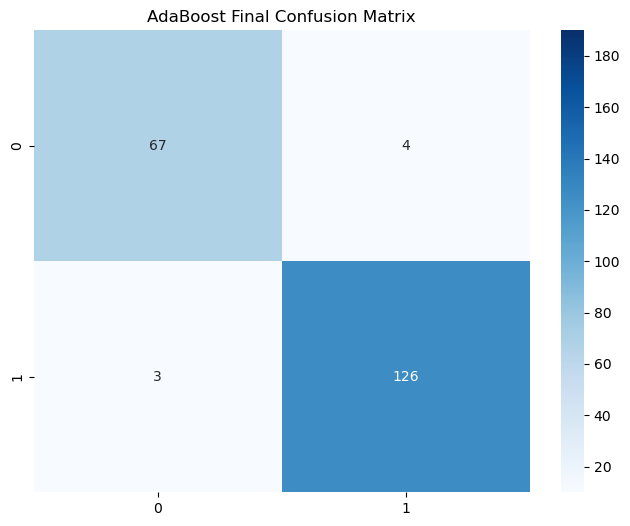

In [208]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(confusion_matrix(y_test, adaboost.predict(X_test)), vmin=10, vmax=190,annot = True, fmt='d',cmap='Blues')
ax.set_title('AdaBoost Final Confusion Matrix')
plt.savefig('ada-final-conf.png', dpi=300)

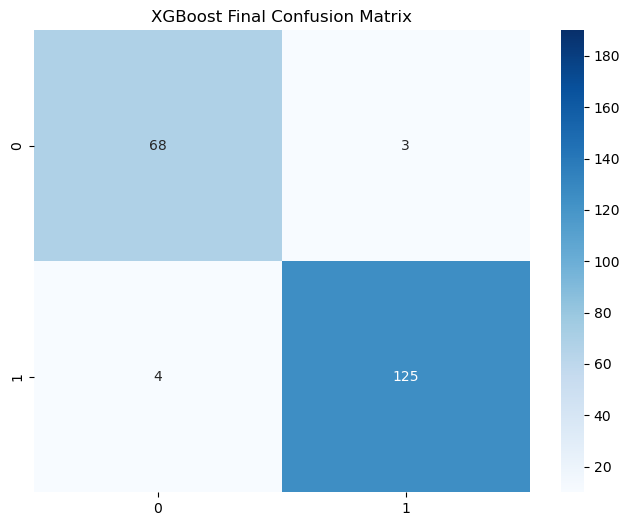

In [209]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(confusion_matrix(y_test, xgboost.predict(X_test)), vmin=10, vmax=190,annot = True, fmt='d',cmap='Blues')
ax.set_title('XGBoost Final Confusion Matrix')
plt.savefig('xgb-final-conf.png', dpi=300)

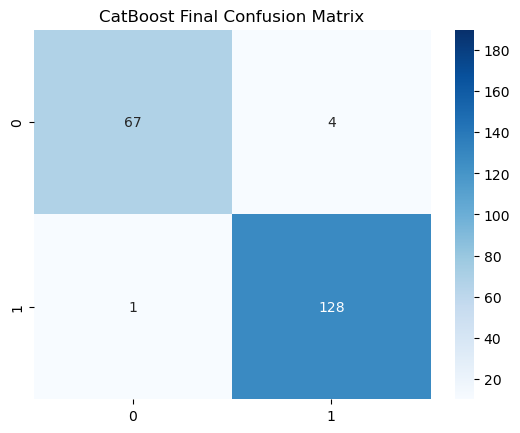

In [210]:
#### plt.figure(figsize=(8, 6))
ax = sns.heatmap(confusion_matrix(y_test, catboost.predict(X_test)), vmin=10, vmax=190,annot = True, fmt='d',cmap='Blues')
ax.set_title('CatBoost Final Confusion Matrix')
plt.savefig('cat-final-conf.png', dpi=300)

[LightGBM] [Warning] min_data_in_leaf is set=26, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=26
[LightGBM] [Warning] feature_fraction is set=0.4732721656547446, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4732721656547446
[LightGBM] [Warning] lambda_l2 is set=0.21108863520120283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21108863520120283
[LightGBM] [Warning] lambda_l1 is set=0.0001984038324432483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001984038324432483
[LightGBM] [Warning] bagging_fraction is set=0.7875369569503942, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7875369569503942
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


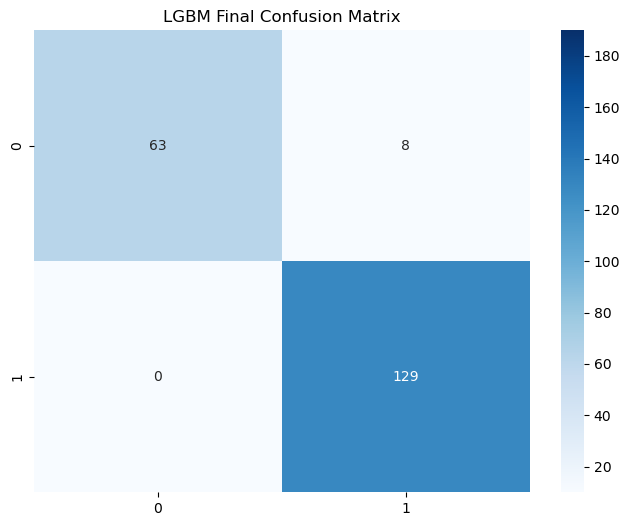

In [213]:
plt.figure(figsize=(8, 6))
ax = sns.heatmap(confusion_matrix(y_test, lgbm.predict(X_test)), vmin=10, vmax=190,annot = True, fmt='d',cmap='Blues')
ax.set_title('LGBM Final Confusion Matrix')
plt.savefig('lgbm-final-conf.png', dpi=300)

[LightGBM] [Warning] min_data_in_leaf is set=26, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=26
[LightGBM] [Warning] feature_fraction is set=0.4732721656547446, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4732721656547446
[LightGBM] [Warning] lambda_l2 is set=0.21108863520120283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21108863520120283
[LightGBM] [Warning] lambda_l1 is set=0.0001984038324432483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0001984038324432483
[LightGBM] [Warning] bagging_fraction is set=0.7875369569503942, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7875369569503942
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3


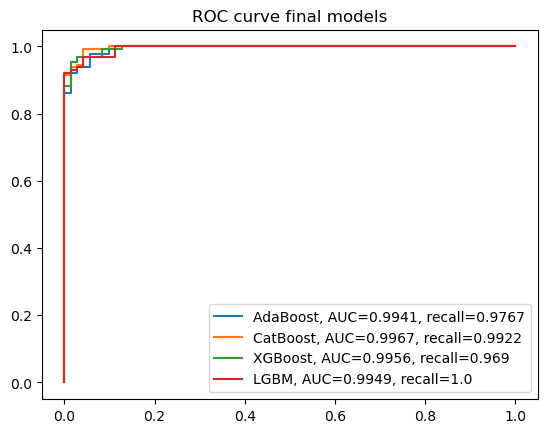

In [212]:
#set up plotting area
plt.figure(0).clf()

y_pred = adaboost.predict_proba(X_test)[:,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
recall = round(recall_score(y_test, y_pred.round()),4)
plt.plot(fpr,tpr,label="AdaBoost, AUC="+str(auc)+', recall='+str(recall))


y_pred = catboost.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
recall = round(recall_score(y_test, y_pred.round()),4)
plt.plot(fpr,tpr,label="CatBoost, AUC="+str(auc)+', recall='+str(recall))

y_pred = xgboost.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
recall = round(recall_score(y_test, y_pred.round()),4)
plt.plot(fpr,tpr,label="XGBoost, AUC="+str(auc)+', recall='+str(recall))

y_pred = lgbm.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
recall = round(recall_score(y_test, y_pred.round()),4)
plt.plot(fpr,tpr,label="LGBM, AUC="+str(auc)+', recall='+str(recall))

#add legend
plt.legend()
plt.title('ROC curve final models')
plt.savefig('roc-curve-final.png', dpi=300)

## SHAP

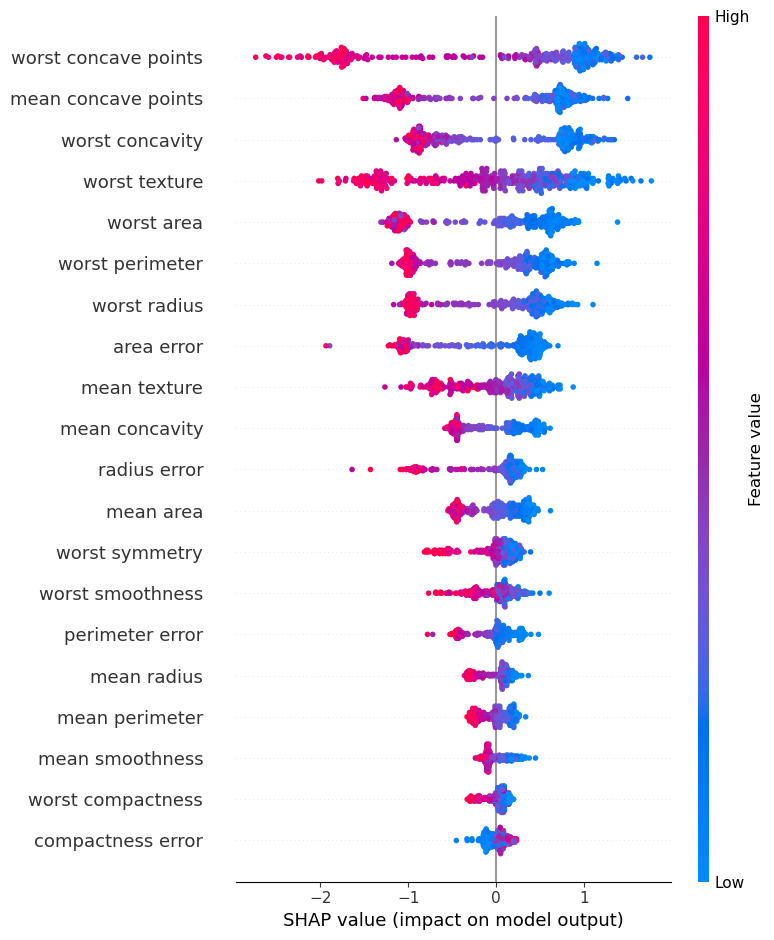

In [247]:
import shap
explainer = shap.TreeExplainer(catboost)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train,show=False)
plt.savefig('shap_catboost.png', dpi=200)

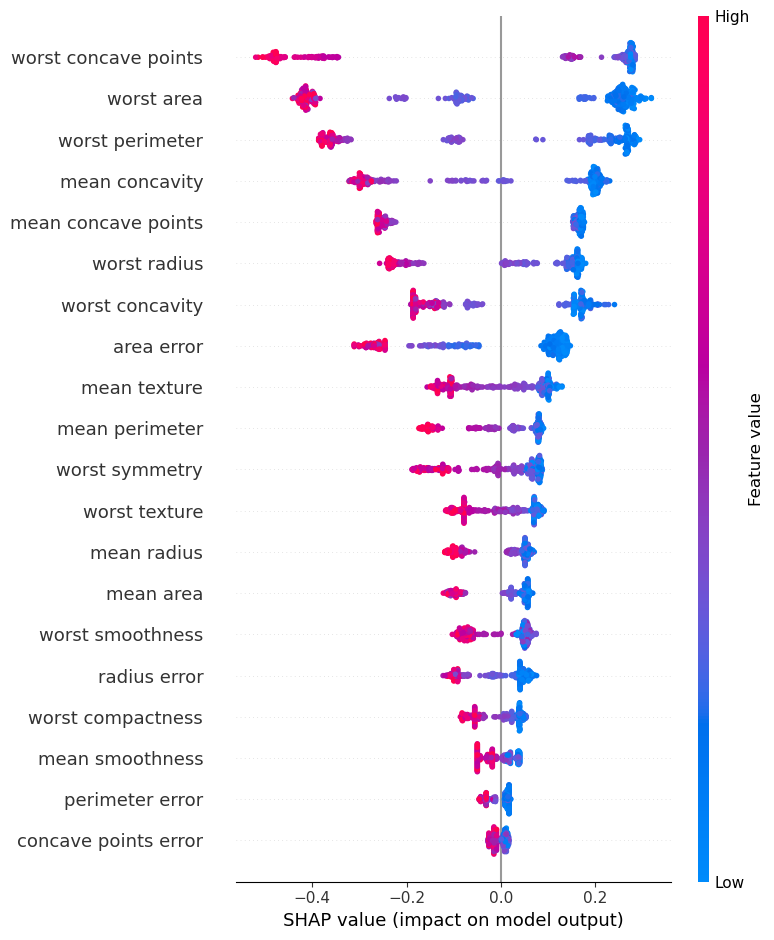

In [246]:
import shap
explainer = shap.TreeExplainer(xgboost)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_train,show=False)
plt.savefig('shap_xgboost.png', dpi=200)

/home/joao/.local/lib/python3.11/site-packages/shap-0.42.1-py3.11-linux-x86_64.egg/shap/explainers/_tree.py:386: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



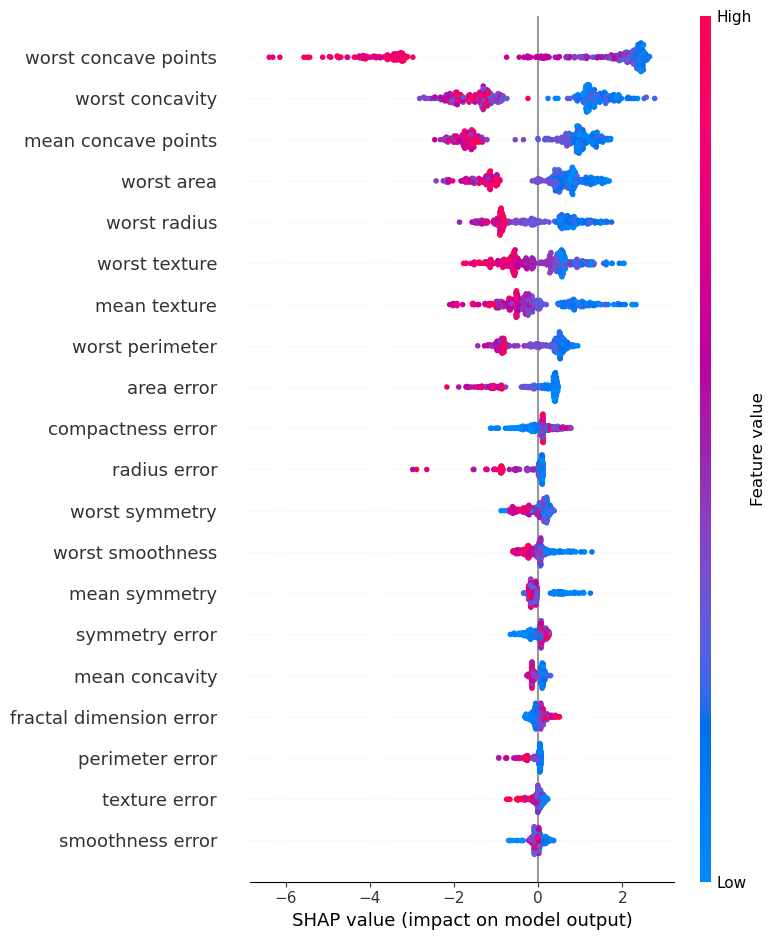

In [245]:
import shap
explainer = shap.TreeExplainer(lgbm)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values[1], X_train,show=False)
plt.savefig('shap_lgbm.png', dpi=200)